In [4]:
import os, time

import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython import display

import tensorflow as tf
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam

In [5]:
# Convert seconds to HH:MM:SS.MI format
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

In [7]:
IMAGE_CHANNELS = 3
GENERATE_RESOLUTION_FACTOR = 3
GENERATE_SQUARE = 32 * GENERATE_RESOLUTION_FACTOR

# Preview image details
PREVIEW_ROWS, PREVIEW_COLS = 4, 7
PREVIEW_MARGIN = 16

# Source vector size to generate images
SEED_SIZE = 100

# Model configuration
DATA_PATH = '/Users/maxleander/code/nft/gan/data/'
FOLDER_NAME = 'cartoonset100k'

EPOCHS = 50
BATCH_SIZE = 64
BUFFER_SIZE = 61000

print(f"Image details: {GENERATE_SQUARE}px")

Image details: 96px


In [15]:
training_binary_path = os.path.join(DATA_PATH, f'training_data_{FOLDER_NAME}_{GENERATE_SQUARE}_{GENERATE_SQUARE}.npy')
print("Binary file name: ", training_binary_path)

if not os.path.isfile(training_binary_path):
    start = time.time()
    print("File not found, loading training images...")

    training_data = []
    faces_path = os.path.join(DATA_PATH, FOLDER_NAME)
    faces_path_filenames = os.listdir(faces_path)
    for filename in tqdm(faces_path_filenames):
        path = os.path.join(faces_path, filename)
        print(path)
        # Convert RGBA to RGB format
        try:
            image = Image.open(path).convert("RGB").resize((GENERATE_SQUARE, GENERATE_SQUARE), Image.ANTIALIAS)
            training_data.append(np.asarray(image))
        except Exception as e:
            # print(f'[Error] image: {image}, exception: {e}')
            pass
    training_data = np.reshape(training_data, (-1, GENERATE_SQUARE, GENERATE_SQUARE, IMAGE_CHANNELS))
    training_data = training_data.astype(np.float32)
    training_data = training_data / 127.5 - 1.


    print("Saving training image binary file...")
    np.save(training_binary_path, training_data)
    stop = time.time() - start
    print (f'Image preprocess time: {hms_string(stop)}')
else:
    print("Loading previous training binary file...")
    load_data_start_time = time.time()
    training_data = np.load(training_binary_path)
    load_data_tat = time.time() - load_data_start_time
    print("Data load time: ", hms_string(load_data_tat))

Binary file name:  /Users/maxleander/code/nft/gan/data/training_data_cartoonset100k_96_96.npy
File not found, loading training images...


  0%|                                                                            | 0/100000 [00:00<?, ?it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799558407938778802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15026574081194181282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8709497383329334833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170155403075088816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263392394588954955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17950616688925519765.png


  0%|                                                                    | 7/100000 [00:00<25:49, 64.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338891606931584867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727020034159063210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9176701259721927219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8669720636284252953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787501075958529402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8661118080359582503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17962982000281920929.png


  0%|                                                                   | 14/100000 [00:00<26:22, 63.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1524654482784105278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11864057738931013533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17067682422143496394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054702426561184621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4606866331495894410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14075064294270109248.png


  0%|                                                                   | 21/100000 [00:00<27:56, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9339515330686759939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904504124216042221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6644712824907937837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14201672963924532544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9961322028240937561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18052890153635986157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8654088025783020459.png


  0%|                                                                   | 27/100000 [00:00<27:53, 59.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165328004066367879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9612080235939912052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169252211141204250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14443661990684022285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2989109868641854985.png


  0%|                                                                   | 34/100000 [00:00<27:13, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6561555370275704490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796642570004992663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6470489423767033961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028209447284191218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227309493098029678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414456813881944632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12840530778404220037.png


  0%|                                                                   | 41/100000 [00:00<26:57, 61.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12712132816544628012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11551663204210705686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648350531567752713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12647846095561136400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3103292560543745183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304421601794867671.png


  0%|                                                                   | 48/100000 [00:00<26:03, 63.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553253605419806707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245121426354045777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18201436660923980542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493467101663976968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9260607319437926103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923827621088656344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296900511335723994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13427837772888371495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982006012514655573.png


  0%|                                                                   | 56/100000 [00:00<24:58, 66.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13572805650523090226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17623418925572514343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885984969842083941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379732697986810069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2886692768371697640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1773210760184961155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6790474040787451920.png


  0%|                                                                   | 63/100000 [00:00<25:47, 64.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7789283424005941511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562840397574822554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2143067672990126213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1222084160735600711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979982092892872924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12624127246818606733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8815332436985929723.png


  0%|                                                                   | 70/100000 [00:01<26:11, 63.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603666728773789239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2874487374060638931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4657498522598768454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4280337588744000167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs582614971549979872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14035864864073825256.png


  0%|                                                                   | 77/100000 [00:01<26:05, 63.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16174006884881346136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15585552388924029240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4525537339013166401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888156487788854619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9530384124467004063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935074850131663861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722930356851438881.png


  0%|                                                                   | 84/100000 [00:01<27:18, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5374305637747766984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5177009229306371764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615649755338944784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301095918844622645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12488638066012040956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3090226196067315514.png


  0%|                                                                   | 91/100000 [00:01<27:09, 61.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5452087867379525006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs740219358440786243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029565676549744397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803486159334381232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1506185079733742454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608142944096132281.png


  0%|                                                                   | 98/100000 [00:01<27:03, 61.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657319762826120876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9102051461395889665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1335607442399065062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293819324734341125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5422759099080033903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2591202022812354605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843653024710708826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190894471206682107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3171869617512519706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18160525495286950731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783883978674671743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911708843766078358.png


  0%|                                                                  | 105/100000 [00:01<27:52, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13594240043201477764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7614570588408704757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468453002638788244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8988511042533076489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728913668525319146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946531893516384572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9595787749270850813.png


  0%|                                                                  | 111/100000 [00:01<27:53, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7659486450200072885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3783046578737922009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4021100499835687479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3041438837506630398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5967892264582432425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7730215101675296940.png


  0%|                                                                  | 118/100000 [00:01<27:24, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247630996675648982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13563481788237064844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12921260850578565230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14744296670625859317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17440053256941576960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565731904001952730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5100078637745834790.png


  0%|                                                                  | 125/100000 [00:02<27:12, 61.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5269051177122901979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7590069754693208946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7186907571539730620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12563349752922440203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17225859644921872813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941823821813313330.png


  0%|                                                                  | 132/100000 [00:02<28:03, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9406919425959822801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17297999797896067266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4758782699312930167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13645171090757878221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6389145688435462988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152149745028165730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16114424080719945692.png


  0%|                                                                  | 139/100000 [00:02<27:31, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5868947430872324998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354268567916462358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15871748576349362606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5611940467297633495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6071121367951598286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15884678582553704171.png


  0%|                                                                  | 146/100000 [00:02<27:14, 61.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16003667597180137307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3046703326356500241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992471181776515501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6815434133652270462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093335777945411910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176956656304766148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12925394432286714516.png


  0%|                                                                  | 153/100000 [00:02<28:09, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18295346239123086810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6535189802051123499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510948061912036021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3477866309007850011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4472110237714909435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7264822205059293792.png


  0%|                                                                  | 160/100000 [00:02<27:37, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7036704695160940504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7155398694967748472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139249756830549318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16619338149182137713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13211011792869787008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3292194730238449774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6935175873062360585.png


  0%|                                                                  | 167/100000 [00:02<27:16, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17758388312057019928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5270361631144835433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1545068566228391548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8040731234664115010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6634464369375985177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12461052728874244182.png


  0%|                                                                  | 174/100000 [00:02<28:53, 57.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761683113011469124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5578941069966307476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13639434761746597632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15757626223176293766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13075574994887707047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2667756045283902829.png


  0%|                                                                  | 180/100000 [00:02<28:43, 57.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8428447505662844204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5150091128163011697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8119697748568495837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012328616883866421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2223714135642308786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471508868294502119.png


  0%|                                                                  | 187/100000 [00:03<28:08, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258182447215115033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16670666281885498594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12849549584823552252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206138383862423444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503166551761615733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480058161309670572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933113162364189878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5201154446338617276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16590701687932273297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1390016762391735813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4516031993164690607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669920425565054518.png


  0%|▏                                                                 | 199/100000 [00:03<29:28, 56.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3916801542740626696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1430729390104247515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6727735694819295743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269577426038846465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8231372274131557393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11948614467286778321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14170910976420448554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18306386066375621217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315099211957841530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488535615109553939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs506440705573739939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134727310933268478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11585963845332294441.

  0%|▏                                                                 | 207/100000 [00:03<27:22, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590875002982742524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612326459436873010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273726965809723187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1660694145352541212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4876889831472520324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885517631636687445.png


  0%|▏                                                                 | 214/100000 [00:03<28:58, 57.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18299760652664811513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728863256053758543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1918763899000841233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3649735243957980841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031103141851854986.png


  0%|▏                                                                 | 220/100000 [00:03<29:49, 55.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855122336277539439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1607437964437163487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684751960554489886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7707546872499380357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9117679264801806649.png


  0%|▏                                                                 | 226/100000 [00:03<31:59, 51.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864669560100172786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660101915914153844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192834035928535930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6565758144349913969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196179088439214786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1501937787881553001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2344900089448990113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs288450783614338416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493309785183829524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394236793448765281.png


  0%|▏                                                                 | 232/100000 [00:03<32:49, 50.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752546228759913175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13407454834633097388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397328836370194580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17294451273908735745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7503654541654914480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532414893368196133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9969422075527250731.png


  0%|▏                                                                 | 239/100000 [00:04<31:27, 52.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561808015029784895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7783965573430916775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430355185446645350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798012632717734455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5337020267355355015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15900459003313045402.png


  0%|▏                                                                 | 245/100000 [00:04<30:26, 54.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4798236128225580459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719250965922242930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857015431452551013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17440620373696527682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1693587892309535307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17054122277129620794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12155386333387799028.png


  0%|▏                                                                 | 252/100000 [00:04<29:09, 57.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704350945270123834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6695217014581349579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6143145402665596837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16592547144723510059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38615462336269660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563622841370470103.png


  0%|▏                                                                 | 258/100000 [00:04<28:51, 57.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6212422874983878736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17835035856484647662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764011375507494377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196394310140302019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs333363375519985981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16754812040053039899.png


  0%|▏                                                                 | 264/100000 [00:04<29:07, 57.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570363736684693857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433369071679849650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493578361316780386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9500137957629920477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12796435477093591204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs974246663720053437.png


  0%|▏                                                                 | 271/100000 [00:04<27:53, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379035206071104995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12433447070781760634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521911643896282807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14206287561573928879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13490922767910513586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752183875215116049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120015108443669462.png


  0%|▏                                                                 | 278/100000 [00:04<27:06, 61.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9793668006826551072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442043328232306655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12462781094059508428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581642267342947427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14187323697064333946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617963952141775817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002150070447938537.png


  0%|▏                                                                 | 285/100000 [00:04<27:11, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16542120850262104587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8296971819480164711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3504324303425802546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17277301306363584243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5711815214206797715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886724281503837546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451776751897074421.png


  0%|▏                                                                 | 292/100000 [00:04<27:09, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8420370118687933673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228882024520388480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185911217790767318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8452146886801388795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18062313976957525734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs926811819193525805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740432526181335792.png


  0%|▏                                                                 | 299/100000 [00:05<26:07, 63.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4702179601647260322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15719755684559652737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120493234953877744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11984129653257271046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8950687906205679145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199021962267748748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452808017805781775.png


  0%|▏                                                                 | 306/100000 [00:05<26:10, 63.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7679393441661158851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16122120394529527356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16161075541300120276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15120445412098627674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3622938942189778066.png


  0%|▏                                                                 | 313/100000 [00:05<28:12, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3782391142706686055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4586601366375626178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13171651514512886428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9591411773689593769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17644463803874593097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5364208963331096542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906759790779132478.png


  0%|▏                                                                 | 320/100000 [00:05<27:34, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7884415306597093536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4656519698082720012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17378827074160810540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858786836941224784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372712980738857601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16984604350099053051.png


  0%|▏                                                                 | 327/100000 [00:05<28:24, 58.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17222705415303150234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318478270790820381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18161073361200006407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113812937046850886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15384210735205628469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017872094456658904.png


  0%|▏                                                                 | 335/100000 [00:05<26:38, 62.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924767410876420968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11520383677437309011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8807196120585599517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346757588925238985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7999932838824514422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588958770256084587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9158020825015465261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4399828786925912007.png


  0%|▏                                                                 | 342/100000 [00:05<26:37, 62.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5243404492801841441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1706242252436772068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15284277562371249112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2003904018667880345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15426870803683856102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5755353158750461512.png


  0%|▏                                                                 | 349/100000 [00:05<27:36, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778367370527522990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724439483779720993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1426861661585789906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12483872288470282573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1332079792761027796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14676283065206837785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18218980419771160275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8221491447192097788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3973763205654432267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13242086130558084167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15799633453361238064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150239446625574914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259440527747319691

  0%|▏                                                                 | 356/100000 [00:05<27:10, 61.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3624591778082274237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1661874104165524013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167719804482150314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023171545755775357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8126686581066060806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6957620245553778295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676480681886581996.png


  0%|▏                                                                 | 363/100000 [00:06<26:55, 61.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16773501184852265231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16676980197542779739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798029298639453824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3600872668614318594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068040773231841420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7635057236205649916.png


  0%|▏                                                                 | 370/100000 [00:06<27:56, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6801860937030712658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507821618977219280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683311529229238526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824050042018784277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15598889915205707036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8933840086111265525.png


  0%|▏                                                                 | 376/100000 [00:06<28:02, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291545939960128883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4692559331560453695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178063436737283983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696057538958987326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13996877603789841608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs663442402861399137.png


  0%|▎                                                                 | 383/100000 [00:06<27:27, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212815114798356974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6473097042475782533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903696949549219288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71892435758501879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9023688828480583176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1557265220348214385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1506724885392255864.png


  0%|▎                                                                 | 390/100000 [00:06<27:15, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001065610254187378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8223979071439460378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14456730846700100032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16782816861763562416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874686809184216968.png


  0%|▎                                                                 | 397/100000 [00:06<27:56, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576997948641070743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18327119667945277977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551946518197051912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1947227070145319978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7015497188886826651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715772570180347020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6327121717403139882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6833915096627706202.png


  0%|▎                                                                 | 404/100000 [00:06<27:25, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1715846608945335083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9540864976953284026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17787921537804253354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11550173757233745073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs443049282491278266.png


  0%|▎                                                                 | 411/100000 [00:06<29:08, 56.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs122219087178017157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7570254242923290473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15292626139509597269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13435704755250206690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11832898206352454290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7352136337167056148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756190845733233470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15354769791522168865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6491030433076834697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2792146053834436974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8721297300996859852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191855831761632084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16932062765239837504

  0%|▎                                                                 | 426/100000 [00:07<27:12, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445047535956864882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs965601064628314595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13143759328159546821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6164496754698245088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14892425685424640463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935272768415725549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1426050646312322804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4053293970725897445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs223575094138318562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191102203782183893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1561389860069365919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061171747576074290.png


  0%|▎                                                                 | 433/100000 [00:07<27:49, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8743948880464071645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3075978878707063276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358883717746034471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15929659992157726349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3340873788170387037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6353127769911763298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216415018835631612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14544789840070671385.png


  0%|▎                                                                 | 440/100000 [00:07<27:26, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938714286123399103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704286761265824738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13375347711520684011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236637935683027735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949669022101024655.png


  0%|▎                                                                 | 447/100000 [00:07<27:08, 61.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14006248336660039346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17526676994806318066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773660559978945163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7830155275911302125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1748333359414319603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13748198779755482850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8433242880421810582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1310137965554891330.png


  0%|▎                                                                 | 454/100000 [00:07<27:55, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9593578028806399429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764377596531044697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071686745435897179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15625223500434039597.png


  0%|▎                                                                 | 460/100000 [00:07<27:54, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5635307944322729572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17603535013190790874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4231461770644752646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673653945792372968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11601327272160402527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4347499301803866013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202206925333610373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7379100824360585888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6190979367357714560.png


  0%|▎                                                                 | 467/100000 [00:07<27:26, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14822838886456394825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349013394935345182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17011651489434521984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18234512696852523992.png


  0%|▎                                                                 | 474/100000 [00:07<27:12, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949141171398540402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3551698848775481332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17593802791720997155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930525926130963767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4821522924015801479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16375097735201091299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3045047916639534466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5331263828340651287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745450974676072124.png


  0%|▎                                                                 | 481/100000 [00:08<27:53, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5943783103895806465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203412849850600066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065219272202029880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17264818023185256795.png


  0%|▎                                                                 | 488/100000 [00:08<26:40, 62.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416556187504514217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293170831297478880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15626772390691310419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14200828272267501973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8132121235691316164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125121688685842017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs604366579907912068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1206791415121283641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14385937693356369689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3768735948996804060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8255110246349240921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17784425995031814632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs529208754033515906

  1%|▎                                                                 | 502/100000 [00:08<26:45, 61.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18355225697637689539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590553559996851235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16985430839983784778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16559190609797245708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2627435332590694378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16612664440351348709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3065352222616722213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18271256364022984646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1253660458447656804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605848050780218252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6512223308874132917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3730392728325843390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54635764337658429

  1%|▎                                                                 | 516/100000 [00:08<27:13, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17957082879016045138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15544641292799982991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15401453691852622189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6183127290506198217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1502633586244432264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2668626558441822830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832642078560029222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15051043143719436325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6886086054615297694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057803730852452811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2439022966897672315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16194135707238357489.png


  1%|▎                                                                 | 523/100000 [00:08<27:07, 61.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7778872891357766903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12538097951072261722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17725626331186269711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019171052879035388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17128249084615384521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16424347495621272279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14823193121212770420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3188340295296552486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6635767550256261510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672024355404976838.png


  1%|▎                                                                 | 530/100000 [00:08<27:55, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12925242997906713107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834593418243974739.png


  1%|▎                                                                 | 537/100000 [00:08<27:21, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7116600356283289392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6415340067473765304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15029110006550519020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463702750489500156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5064223017531006242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13509547038915174351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8062692531741408279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679265640764983738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1315003184331001835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs549228503995104737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12870503474400586488.png


  1%|▎                                                                 | 544/100000 [00:09<27:19, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16704937097060556299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9624894756964411505.png


  1%|▎                                                                 | 551/100000 [00:09<27:51, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476518233232296524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12886250088806246227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7698335437208110872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941368518856673189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596221016046595862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7706344062264845098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677982437228916985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014222960986187985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12386062330968161607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1822542326452253347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7139037203967376360.png


  1%|▎                                                                 | 557/100000 [00:09<27:53, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2997626850382808036.png


  1%|▎                                                                 | 564/100000 [00:09<27:18, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3521642234292462061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7710973161263834153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2194696696202511418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2297426696112952848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442655916003571344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9244382967945473763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445835139390387708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9131063187783777405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8823441674767419192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3261502905626810634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9819040727194063065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12495539968015653940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308330321239090763.p

  1%|▍                                                                 | 578/100000 [00:09<27:59, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839828329275436077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6707372575405024842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5200670964782686362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5337297592425077267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803504555172150893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11567334283960267970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180395273856832823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9253155774412855972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196447244914132123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794994878253859368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362088139617075902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5535216274551626752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9160561534518449494

  1%|▍                                                                 | 592/100000 [00:09<27:08, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8046464378148702696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404653120656306459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18380149225526457018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2254473743761472985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3606150103332317277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16223724008217987487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13441345180439971137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17547039774330364749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6854369610962751037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16450778001099598586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815375313012020176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16962638279328810668.png


  1%|▍                                                                 | 605/100000 [00:10<27:56, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15063593390077802108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5063526127104597847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14057697135833890349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17734753555411093364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13781348595082009125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877149510323596167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2410689796105297713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220290598465237824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399650225236911689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577797743590882132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8090457128529547785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274906293287145285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5452817082233998371

  1%|▍                                                                 | 619/100000 [00:10<27:06, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429382769220602988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754432111369875437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15121251616527704748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777538871729185246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4023345595239587167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9179739650921478813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14652717642769086330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1700890607281139751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617911302529219497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2729548038928878964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616661312819064666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7980066721983159615.png


  1%|▍                                                                 | 626/100000 [00:10<28:01, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334852225284373347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17045797346121024896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18364337637496754792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677892450041342257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6825238126080776353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185534770833553163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13665445378991651573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951484956576586244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs333785962973636188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253843717741734270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs994275873005742871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13014263814720183131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1353596759572946444

  1%|▍                                                                 | 640/100000 [00:10<27:19, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9951847193396607990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12606577884323613184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4584753564784678826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs254576582765646408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15546587345935331869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6075226960151182358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3712585898758370654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017403919556281397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196829243918138323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8905952591821708430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14038356077095507436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3451189610842382747.png


  1%|▍                                                                 | 653/100000 [00:10<27:56, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1411709778708206233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8573882509062619072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3080354096660585029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3550564233569312894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463857954709917643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14856245789246543956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302344608774868964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13888651744335731733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266610915418377251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104990843989089507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs396711750675563763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14773028556401433231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017399009738459763.pn

  1%|▍                                                                 | 668/100000 [00:11<26:00, 63.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12544954579719473442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021543408646698146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17209720704593929855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814593907990527436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17417867054029686658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2190192222095219916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655013223432914668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2931496759640666077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5488009132801934587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18305476336280345959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320858009178987008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640288558887043594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs204339595127384421

  1%|▍                                                                 | 682/100000 [00:11<26:55, 61.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17366905219208334953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15844422933468904786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855728194496645429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1360947657730033956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2883311071780456337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15978788590172240598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3530589459825870727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12409659125211046587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476108853646059140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14874343794844561282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021310465433124069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3896502653449126408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128333560182010492

  1%|▍                                                                 | 696/100000 [00:11<27:40, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15011246777915054809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592541029792822079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14427271187876745120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11937563829659524701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213945668074884472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995558958669630166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7338038022187884001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5708319365930745969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16253059098102849851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7803262473110717145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641864531207433190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139193845856056291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500994754649347

  1%|▍                                                                 | 710/100000 [00:11<26:14, 63.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363540756659412619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701172923067402092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250529986126454636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13704637932591709116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7893084235077712210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13038049039485361763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7082998495423532634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8557584864701865589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15812999182427049732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332999122997538702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3427844989251394585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3884362602444735433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172797695726419170

  1%|▍                                                                 | 717/100000 [00:11<25:29, 64.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11627017313622244917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2881959877812459639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491109559654438143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17707205748794807654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11694482471675284364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3015389338401294267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000307284565204667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074209734828767938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9115251090794659694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8355216583236831601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs344807463222344938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729319310120151501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7243266768741242473.

  1%|▍                                                                 | 732/100000 [00:12<25:48, 64.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17789031756003084319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3601972077810626678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844952095818666424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs926838227288772052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1938842121551937615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3269732293980677642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284700363731238177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330271996757671592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1345951089817980888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7654263051675510696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2000164719834189180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888918180554659783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5071317627916772207.pn

  1%|▍                                                                 | 746/100000 [00:12<26:01, 63.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14930333856300010235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099156191478075034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4179622597143042572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12845584766097813878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13838668599244231667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7421853544825885968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2427737394311616254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6503608527777208969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15418439951041144406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16075180347847247454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041306572826054312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5201443046721540517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39504796576579043

  1%|▌                                                                 | 760/100000 [00:12<27:03, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49110057405230465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078937025608974451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17089690833673058524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17917739965269775348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507067909174023848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065176225007897443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400528334382479495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316876437738842633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918992302624093399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8848103512691840470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5843053864604358568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627389880394267674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163047577519895225

  1%|▌                                                                 | 774/100000 [00:12<26:29, 62.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4094232583098530450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137350222449284850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17740193469585566878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453243647815766853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5448508407979904638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751360341340429656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13708774709496556677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091702036468703974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1686584559974527599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1197199450438432147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783792761784031794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620161398194848035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8159287377502715

  1%|▌                                                                 | 788/100000 [00:13<26:10, 63.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9035790412485732686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312394552145805988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13306119976837976732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11808674354103378750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14104194685233935582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9898923868931522202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226308802711492580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14774980372541375605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790915735728369181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2070109556729193227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11862677867097514978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7739374173869476064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5536753574267056024

  1%|▌                                                                 | 802/100000 [00:13<26:22, 62.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5019939397749861195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6769903842956274601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9517690707849703952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035900659961188506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447514556017605267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18010017301756384030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17494145123844161551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15275567824540044702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3985400641176276885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649744041532834252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054835852904407104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9424156352525904225.png


  1%|▌                                                                 | 816/100000 [00:13<27:00, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17768465996383449068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs200184769699798327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4208845957028515738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906925559986996727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7507921019580117869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8332893541878061957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15883948829792850235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs801808744078140869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750493416541900569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12821173587259251480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17006271664094943716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6330280340962522955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181801328827748377.

  1%|▌                                                                 | 823/100000 [00:13<26:46, 61.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047715529636359011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14365177700083302085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5216639024502948960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618319968258429641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981028776657887720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12929955215566477625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14840244574849576020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9589625138652246912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3496647028092966575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556971475414816222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4586312038222569826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311154149439447262.png


  1%|▌                                                                 | 837/100000 [00:13<27:18, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8290056753540105777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12355094024003296716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17769807177453323989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6318076046799229615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4518682151899837859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13429310175936728785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9330841089569443862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13200517075597844083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7711098477474154399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3762051781596938219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4841286662770650059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9454178535558377485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9357343425730617063

  1%|▌                                                                 | 851/100000 [00:14<27:54, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14905108688963450402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797804642076609782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77172489234088540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14977992872046283837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823315634516147392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531461843431002130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17106532532471700923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850179694627793271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17169403815183833115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16642513872027664212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9901902459447204687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228716451256026339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1458821531129798249

  1%|▌                                                                 | 865/100000 [00:14<26:12, 63.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17221212348677798363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839013543213781116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178243259006107215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11864343942924822701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2713457500316714540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12682335761300490086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8890336521712064809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11714139626495851159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs731330690767848285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557397393459817082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188345060077425219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13493900972797103578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8238168902671987617

  1%|▌                                                                 | 879/100000 [00:14<27:17, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14968775281574123721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664991647487031486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446131641568551829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14103706131384353027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8243102182754396170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11851898058010672515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15026574603254070607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583673839557694856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14842375435645361866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6770218063294047482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616508863531372054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544946590420147956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631481218359262

  1%|▌                                                                 | 893/100000 [00:14<26:52, 61.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15319716750943059484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237267108550192184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9132364823149119121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766233093222270307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1354513762693678617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1705982308344766981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1263490407050379864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333160042350814519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15010333213548604373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17965538533697041413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1551098474927798966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158326227434037056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs963878884742814686

  1%|▌                                                                 | 900/100000 [00:14<27:41, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7962158892375728013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5160438859605036029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4518039289748813619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165902802489248692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457079807010472349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646607661550072525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979217722338322122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380677521563379527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3170283054496978830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415489287576201316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13275109391369030725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079645027076199268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607526507535854139.png

  1%|▌                                                                 | 914/100000 [00:15<26:15, 62.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199378371533844744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15847721630957688408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3291943886483289963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15021851441583174665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7112277633391950288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17432322856956297954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16739888890437271513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878481956946485782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9144738680496266241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17444746628102951846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6615954895345319108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8112490664439685797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14656462236954378

  1%|▌                                                                 | 929/100000 [00:15<26:28, 62.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5274646183276629665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9473653566634802230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164901986409919640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592941029418022339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16619317099347871160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750259741189937708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981094243441818933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812599387201492198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4907085023687064868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5373767755424581649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16380722653227932375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11865602160755076809.png


  1%|▌                                                                 | 943/100000 [00:15<26:44, 61.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555887806691764306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869127655536078479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14014485420134886536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638782246844733238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16524636401904984958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747533011807598872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1473106587582410875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9935856898293826109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12608098381776656933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2065103406019925823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225170072034981901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571362602200360205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245706447644941274

  1%|▋                                                                 | 957/100000 [00:15<27:26, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs850723781814533334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157338442950192290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886616578877740242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028370114839388102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14014258463467700994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5413014129786641072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11570362832073289063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8485524350112109765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9667325514280232987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202333439287189684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1227920108016174524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9969331985056931456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17255982634649974340.p

  1%|▋                                                                 | 971/100000 [00:16<27:28, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15828169363612563998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4561513039748918377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2228031820666638592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16405913815806164817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5397630398262020454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2192663075088289847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833666738422040783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13960264628706710567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6323263901382527155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16706816063831742564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5879060538112354119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6114109714969967964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749108237171325295

  1%|▋                                                                 | 985/100000 [00:16<27:09, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14068491681048204161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762890450072938411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4556265057689687762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16409083531849022087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1873366334249500087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15996344578138536860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032089256597738933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402170701753305725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7182452857630312619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4949846412413743333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3107893062435743864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12036088417135042912.png


  1%|▋                                                                 | 992/100000 [00:16<27:48, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378861666475355504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8698423733116764980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525394420725315726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82965448894169231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17098398736137720386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8207125240203713649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4592294370845883478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9343429523111977356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13645283440529192706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207372749381196171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538022030607145701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423012510984487758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7106491061966136068.

  1%|▋                                                                | 1006/100000 [00:16<27:06, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2890810172496951182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541810482613622264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2839245832583992091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14085993376301930797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17297495911290545258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632979798016779257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216757843657323116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15621083608507569577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825658376756432053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006971086084528759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4153677006954112651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18096054926154505756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162063435417536821

  1%|▋                                                                | 1019/100000 [00:16<27:45, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2705902826309221176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1440112193472889851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs633748668496279878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2913289563729622146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17540661776563162563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137386643261612931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3963654896682874532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17782187696197038977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7689473074600868624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9941428670399876888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15125858659452771057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9307784885815736325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140746493184830752

  1%|▋                                                                | 1033/100000 [00:17<26:57, 61.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11598105017724191747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7737029102376775304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14186986071956491218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177452706754632314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9906168424756239280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133446047262482416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17512498341769402288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6120038743124638309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15447874991507328157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920945190016826775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14508406998854812230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16194606159020212484.png


  1%|▋                                                                | 1047/100000 [00:17<27:08, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327139206364993043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11632097687135324660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2034817903971397599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7289836409863929837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs210232304810100981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8239622499593975327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18285657896080880443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16313967878286581616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862621880257447536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754046606118633417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17148543068492095493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14166740382146872791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420974132390015132

  1%|▋                                                                | 1061/100000 [00:17<26:44, 61.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15912561474199548861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7205495371535988869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451701750683317927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116908212820355004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7692116858737614997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666336504152529115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3204981027977442057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167836898586715431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13580050091241137525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775568639338769661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1371797288857039397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459916395765498635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135472788150429030

  1%|▋                                                                | 1068/100000 [00:17<27:32, 59.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282681562049515272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754970621600917165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9125164880250386531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16058470979958755984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085352294993441183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs985815239866167978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8642145064469581390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610003443207455648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2593898925445975860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276831316661371865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13363867194910670765.png


  1%|▋                                                                | 1082/100000 [00:17<28:28, 57.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5961556883432435468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18407330388066195740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690986653945835111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15095598447099770822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs270913994623721613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17422802639877516417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11907275603065778406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16726857328850475806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4072458212199185931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9348095523949753447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3023567155288309797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640746031151959525.png


  1%|▋                                                                | 1096/100000 [00:18<26:35, 61.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1943861177602512568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3093772447853407205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036349010510813093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430483939135275674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9333480572854719003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14694911489431522719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15749432601932909217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158181885141169370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812311928926746497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592304101179305295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12531065622869934172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286564804874083384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs464078221642290579

  1%|▋                                                                | 1110/100000 [00:18<27:26, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867071240099706928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4185430646106281409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3180827474259623162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15383775809819887126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400231400722300416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199938964041898254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17375769164811871390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11542700927332210079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14237160255907755700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238212571604982454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979463524896858519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2038262835971793557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4742614524488509

  1%|▋                                                                | 1124/100000 [00:18<26:57, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793950640205882322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8655600038159214770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18001401814208378599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15672164611863103591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3490293388163055040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6599423098658384250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16992344832883285961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2465800141167976038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7962659852817036706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834242555600284710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8989260568086251686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3879123212543624501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1769121852330096602.

  1%|▋                                                                | 1138/100000 [00:18<27:14, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215279877861813602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933232564758536814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4701149359826753428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3603895490859964758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4443106488566121939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778874930620578219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3106362556601327085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14715772068327544116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5039927189029189523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11607244708491640647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11794601072973317570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16659962635132193437.png


  1%|▋                                                                | 1145/100000 [00:18<26:57, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748180751219613087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4749475687158675575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7692449687869689047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8951866567807294560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499508954962016702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3330746268158104037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8708752602264078175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827831765680325894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16674489430553870751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79805505473194118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11884306164809931464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583546089275758507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2297252514171529441.pn

  1%|▊                                                                | 1160/100000 [00:19<26:13, 62.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16347245452337948839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14704662006661594391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4482784333359884683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839550104217615523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279380556863058541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3709005870276047488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990581719419725140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526212105523332549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12360723818736427115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572364778672391050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98234661867600059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12577134607997829966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905783645764675592.

  1%|▊                                                                | 1174/100000 [00:19<27:14, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18099435738400184515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3788166451440042038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15856541310588958637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619592635597662356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11622404698929467117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1961287278367822717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3374089510797092852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563327160838093172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4209792013605738160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14706354598236255609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17633179178932342409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282385751147307307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64183168769430364

  1%|▊                                                                | 1188/100000 [00:19<26:44, 61.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11554238184059325537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2711787210136473920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4266062181920135217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3258506262533350443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630749756743687324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8623811095412147284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2670035074283011370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17382594487143015285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780983110208195171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2062439082665852939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2623643927713721071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17877157131811656803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1409294611623531647

  1%|▊                                                                | 1202/100000 [00:19<27:48, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131962282685859923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1441493375200421555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4333585905797535686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11761369909110266909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053714560247722230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12038893214690236507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15626419890817655020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15298455540117385855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6974200768323555285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147514194766797633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15045942392693626756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs513164576141676030.png


  1%|▊                                                                | 1209/100000 [00:19<27:24, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8737336835830239587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342943312061533947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16958781364541702014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961033921617197509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14070621566266311279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198219968536208872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1160767811792963004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7291745355306928658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15098828634315842422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6985879778896539124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15573175065049532696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625496559763526960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs475956704669292594

  1%|▊                                                                | 1217/100000 [00:20<26:44, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3223698783593622670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022967068689014056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941097473208054462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15568330999401543289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798530916632233325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691780115185985832.png


  1%|▊                                                                | 1224/100000 [00:20<40:43, 40.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63240219436516728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13856134245414558686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6919511055967752848.png


  1%|▊                                                                | 1237/100000 [00:20<39:29, 41.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593974854814980990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15097252135021699271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14516472517395895834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9518359379681386416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3429466767143403908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5094929139043197245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13557177050591911607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13625607471241572055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18434213709812899547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571151503646266779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851685880090727989.png


  1%|▊                                                                | 1246/100000 [00:20<32:36, 50.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14333437789118002267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3598137325886747856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051657467664064723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16804416301684021569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410291632462423666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17310701256173355154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060074096976112045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946793037572305784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8422610786127728275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073459091424441986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452162438661344298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5675721605738620263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1597735077782565782

  1%|▊                                                                | 1261/100000 [00:21<27:33, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18198933869366102581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5046032650186091146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13021227479811041485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8860095340365146225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738443172551306348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464493792042113167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587304854895562999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499886719309351858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12900164760046255743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1419714342845304142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17060220644564462968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3075047190014448263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638256769659327

  1%|▊                                                                | 1277/100000 [00:21<24:11, 68.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223954212574284275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16163278385624083689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8961733474435082326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867545372716959242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2628460516994127126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16605453568899262465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14930250753143557710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926670157975403163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9308180299450612374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6408416115222675032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328241444422312590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961898943433865935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82478312029063969

  1%|▊                                                                | 1295/100000 [00:21<22:30, 73.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998657172844722499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5092144609789239873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8969449349076710467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17182408669928974852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727888034801414922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8036343534818561082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12966067216931645680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970795106930603020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381987550736558827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9357216279030326280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802114292021412352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226925633556520414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267133143783900209.

  1%|▊                                                                | 1311/100000 [00:21<23:21, 70.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1734841895627022955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432364701149257806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12713317966872858231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17442035577620944631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925326360661261911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141576000744492764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18005014926340657980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3049775967693129727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531996799257273270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639916286584771145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6645179712302236247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925238509653466850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374042293782959457

  1%|▊                                                                | 1326/100000 [00:22<26:38, 61.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731149771168917322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497918746565028944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2639293567401586260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13567995326709665655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765383213668927862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762120120611011744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4571026330961734270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697183846163895646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13236300771798855745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146184389722905868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17520545194521062962.png


  1%|▊                                                                | 1333/100000 [00:22<27:35, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004626116283497073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072614976690177506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5536820612181403597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798423588015307693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3758210837922217062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6905052558365064893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15545066614705417718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3060781907436554977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17314048087459477138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12470975872534624718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8671643171424383993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6570478590662477493.png


  1%|▉                                                                | 1347/100000 [00:22<27:30, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3651772171934456306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279086026068693705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991932464858004447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039019507299696108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763080612218564161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2525663716492005776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18036444216215895649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8614295135294305508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703522660015068461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16241170158204087385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11813013285437948775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1437945704476886005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144712117068784523

  1%|▉                                                                | 1361/100000 [00:22<27:43, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485547972904288194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15428531994686660443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14225867824792972436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999586335573385211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366271266364973108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252938656162161918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7223044891145035673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130529767182109545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368920989116383465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12597932955948793648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294558790608391620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14779512868232219094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126347727484572

  1%|▉                                                                | 1375/100000 [00:22<27:17, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683941406188781136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553579736682687867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13062552994195179573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8538854767368563871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4278362847167305061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6017287814012721896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561568652059588752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857791477300762833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18273580714988751715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17524564498460133324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7313160135040580480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9243342474858925237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53273819734357090

  1%|▉                                                                | 1388/100000 [00:23<27:45, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181037918006710375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14719306582189437357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772972874816233263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6467434136714222465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs556301927852304002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4831289700030088150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586989554822692916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17479831985384363055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8224958094233343687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8873806358913900713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1408838087348319144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14329724492432168310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs801908613619104341.p

  1%|▉                                                                | 1402/100000 [00:23<27:11, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142564474721681456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7558934091138445484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5945184964543441105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16403481561357208410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2473630524689678488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13200713262228317213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13316573755923148440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7483901309863338349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870041433489602206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837233978263757862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17784359341033128274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3755100554410838987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8746582929809624

  1%|▉                                                                | 1415/100000 [00:23<27:57, 58.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13186072379982871546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7144527916499529215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6602346665964576722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs501295682717185776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14903040439473907977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3859308259887468679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15912831585578223242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992922584675872619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14997772746505265184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419194377323051428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401012420081671458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12328604232329094427.png


  1%|▉                                                                | 1421/100000 [00:23<28:58, 56.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669286909891289920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12510096874219443453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs956956381097705318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3999556142175204205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597181242405335207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550428847196496562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685197522636649750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221471101655976968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5596708261755755627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16361352856804527786.png


  1%|▉                                                                | 1434/100000 [00:23<28:45, 57.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591620471698744331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7717689852327944231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5412360686531917338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3648165762252792341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs727914824439866384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902126942457696781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8063860873140920344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15865901813514635119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3786530781313579934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs535574560457487766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784724396570691122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992927639945529700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574075159209009327.pn

  1%|▉                                                                | 1447/100000 [00:24<27:49, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664873748520787076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7417793729690165576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124498092732976319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3333736789559255826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149984428302787644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523233000593642062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455101958577303049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5748999193763287079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1444435584077511509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2811325369332429874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16975933465123675618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389994639556871284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16389354447100980463.

  1%|▉                                                                | 1461/100000 [00:24<27:46, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7323728204531750742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200640830932846330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14491273498974030738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7830065412007877315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147564850117675213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7540648416091325922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11547578427606721065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5833347149361150945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14383990133818298441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583024291817502535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4775482723749058306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17288168448077629401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11980289412215549987

  1%|▉                                                                | 1475/100000 [00:24<27:32, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5186273724537507730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9608223438225091182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6641026631803624629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13724519400149850035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4229688970435678263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416574351535346995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799200082973646153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1823936730008234250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4315919966474642731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14744232281131535921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9179559689200376258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731232787888239792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6891885731983254793.

  1%|▉                                                                | 1487/100000 [00:24<29:06, 56.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7624683511503112890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907921773593916901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800297782773024741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3848524755020066300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660968843745963314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15654278571921485046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14105401679550245194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404919777932401943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8180662516360417536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618329081708438770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901399053222778710.png


  1%|▉                                                                | 1494/100000 [00:24<28:24, 57.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1499459588263434551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14002074883219573922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11950932976268289352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2558361039144887372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16164470342489822949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12997307768873217456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378668891202234596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7946281241060923155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11599889052387428399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3099632206651949329.png


  2%|▉                                                                | 1506/100000 [00:25<33:22, 49.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690988959846656059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16901732607441989427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8407645616437825953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2520445527970357388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12981901853114033851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4747692751301700931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5460261994511081688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6519221933156933626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303737909587885820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702758642530243190.png


  2%|▉                                                                | 1518/100000 [00:25<33:54, 48.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7524769876576909470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3191101316865879288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790660688982451249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5405701593891265200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141563734599807621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13482931259330304723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385166635834042019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700414901209162108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205946215768442157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993572800362974853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544908457304476870.png


  2%|▉                                                                | 1532/100000 [00:25<29:51, 54.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9548474971193375978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2580624937846727857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2304946895474600556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17109611167200022546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13867052833009070205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9462114877236696710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4508866390900911898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4704902763405883720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs256429001039896026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14416684315840022121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs483053155800386369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15065365575672164496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14657810450540741249.

  2%|█                                                                | 1545/100000 [00:25<28:59, 56.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241965193669246516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979856881899356656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571382984115185790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13688525427351802750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7854505703257089372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500232651115607167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9531003102208470967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888647869149717392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18376409035099909718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15862953939338641523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13063719411293746620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13432945760199704046.png


  2%|█                                                                | 1551/100000 [00:25<29:32, 55.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs422921227987326241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6502683607371592873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14196918250879444208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135551848599023614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17987922882215913846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14305677545508948769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15468878687477101733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs995205240115918288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17631629002421133824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13417512695418448833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134855805780961387.png


  2%|█                                                                | 1563/100000 [00:26<29:11, 56.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12826795686210198679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157750945713173631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16427863198469321143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13279998931151279820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15014510965888604045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2664047267295090752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17892115117460276316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432169573790588358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16208479807390545622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18153673266646071192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12847458178390582834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16355098516431119973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs515643721116325

  2%|█                                                                | 1576/100000 [00:26<28:36, 57.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743087074507944091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664002058147373340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748535778258965969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12318593934895708315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15562788283291212383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176447602933093501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5818137516625210509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15715848554351707972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544163754487689996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17321386611067398514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8068638171279704699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16454248381291656771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288338046691198

  2%|█                                                                | 1588/100000 [00:26<29:03, 56.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15068219923675276082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810394289037140562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12318719667285998982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751266183209188899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819356636204719746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16231881567362105793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2151505792225256015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5558519231000131334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9798821596862810557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180672861784387192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275314259126430139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8376328220429394421.png


  2%|█                                                                | 1601/100000 [00:26<27:53, 58.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436424145054972089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5861846537069700625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7000349118625472244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2683205023817861099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1537856210148657878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588412416273929407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869281186214859327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14559363213636331810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs944534274448110015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5063284903133489601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698348511327225529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981017872083037573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17764976994559391705.p

  2%|█                                                                | 1613/100000 [00:27<27:46, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14522811706097695209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520136748176204690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5137961105317585744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3271807076547804910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14935497352893416914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429712642214522728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3179737702236597938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5746891791112893844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6145091224550079373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2516223782021379213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624473513327902323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852665198520109728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs633077520837308969

  2%|█                                                                | 1627/100000 [00:27<27:26, 59.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504193995067083661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2170097954986420744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155947020037167635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5655917510169178797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17365897280623405988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202077897562306744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2981509697438554767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1256353578314006496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6590541791331477209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18333749981391640440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8872198956568383081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17194234991979111644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43414791421768503.pn

  2%|█                                                                | 1640/100000 [00:27<27:29, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544808124611652109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7770423987728109544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17913404951518290739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053324043074929654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs437086467507075040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11680236158851501587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14993397356786087489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5134068455723178973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5057170878647986378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205955103404949803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16302330421535733438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12283296061024286473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747602556272727785

  2%|█                                                                | 1653/100000 [00:27<27:27, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285781934774781257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4296354446517770324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800107544656699455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7889199409711175116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4353439743843348244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14966935716056022048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442608536111473024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3979386589797909487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12640536041421100827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8438260827291914314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3404972434845048340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14912066814811005543.png


  2%|█                                                                | 1666/100000 [00:27<27:07, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946839507833470159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16921061767657893447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3810141693133642513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7920917140272500816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6212197091492042572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541614586251979069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336103368446831275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363230818632265696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2187467136144016843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8733753633857961213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792406425958845433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4239527376317559707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15943537618695649202.pn

  2%|█                                                                | 1680/100000 [00:28<27:30, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4271726417636409165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13200917928410540158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3894282787942553214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13936217643866133904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18318326977801053510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869899397695217248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4311034213098882000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8545374067116748547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580082978030311704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15816575287536863703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320250185690390690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16556252519344060191.png


  2%|█                                                                | 1692/100000 [00:28<27:56, 58.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175210508064086759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15141071490677552930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3987597726507434596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215254885885498558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2650411874321016054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754742872259308131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4195355461298369861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7796834628053710722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5096937626851546166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs499007462912969667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8735055428874953273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16286889174066755003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15075915503336717524.p

  2%|█                                                                | 1706/100000 [00:28<27:44, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13594766424747623556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9358834863907424521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8093719997058273122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13366455958893024187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368049638343121560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666879138571788804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322144210685851011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733749405495142438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316475306091314264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998298763646656641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033210366814827956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1189071917623397667.png


  2%|█                                                                | 1720/100000 [00:28<27:09, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6362101747700327472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13225837908390693956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13092808858916592951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6649592493592641823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6917045842949905618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7132756294460623040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8918399402387502796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17353481935872818005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3664313837333648448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3668061485590597424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14306637754277233203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205279305314357715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117304542785395561

  2%|█                                                                | 1727/100000 [00:28<27:39, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898232534266020094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398831248264786235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3707509619674321190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641740148591381683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748839072737622124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981590385298654837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2809801581161584116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13716796603287963627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7132940178552260615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11909954463333764040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6689100731884015365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11718223059429394941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252379507513051

  2%|█▏                                                               | 1741/100000 [00:29<26:24, 61.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8320925208155309945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9187323536099031920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220058226553732035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16244240654278091767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13237478356864899874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934777809905740144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640682030290556898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16460492229354882431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12656741424019605093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681407064797130309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056314003815777369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496970055321049147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89314545004843617

  2%|█▏                                                               | 1748/100000 [00:29<27:47, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333168717965645765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838872488895014193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762490080868633786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5711445497975971619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7351761866554886698.png


  2%|█▏                                                               | 1754/100000 [00:29<44:15, 37.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15355459581771415533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385247449395979721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278891196063310063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13180755482909480009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823175062761631827.png


  2%|█▏                                                               | 1759/100000 [00:29<55:30, 29.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8732083063225626508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14674451298595476994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6743515241671999726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12028118447046175316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11754404575146342029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2354550111307959967.png


  2%|█                                                              | 1767/100000 [00:30<1:08:28, 23.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5109106056037942974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15452785893592779303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5115466934191630410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503724197996368157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291193887079495759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166845650206913073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13108754381296365456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17553201992742385402.png


  2%|█▏                                                               | 1778/100000 [00:30<48:42, 33.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12783151780612292884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583048758220605115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990231922149459238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815784904191654212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817180763382597002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14310449955617245366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733520968591282323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8240133922488885714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4710522251268565353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8138265573837084312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121333716129742873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791127553851268032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9711786419423729689

  2%|█▏                                                               | 1792/100000 [00:30<35:58, 45.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3661463715582860523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108027065681307702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169884145899630632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642610529638796506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18206636998677192856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875688186981837994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16297236176438111991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557683004323757721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16225383906455170537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2444673109400542259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15253688597496950920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7144765879800711670.png


  2%|█▏                                                               | 1804/100000 [00:31<31:46, 51.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13507661594873508561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9597681609136315861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5874069013593804941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248229301213968397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs510749512603382389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12073953300099239490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9433425660835544229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14609992081213423273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291341290449410654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7949685915463624524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3092945824757511909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12955910267283063884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1580625563468203323

  2%|█▏                                                               | 1817/100000 [00:31<29:38, 55.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3775527050810384707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12829658609661600974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017258376927381953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9570939073750683281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723111518095585688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818688814743650431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs438141667679392743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469064314223743018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732877079026485862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5843906534502756442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8282446609360974323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317561030398260344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8475956034777365254.

  2%|█▏                                                               | 1830/100000 [00:31<28:07, 58.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17452171147486786680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13353621964241155161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27786750891619441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17846948901734663975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6816740840360478381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755721257525719713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708969308036660146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3836875740993729484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9912380066937576226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5670947074299801841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2437860239996924025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11771427290232928859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs595967682331563264.p

  2%|█▏                                                               | 1843/100000 [00:31<27:41, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12255568230458244889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1954059534321448752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984009092105689406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8358847132106596205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5557996823837257106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5148414769258272146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7347539381424075714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18205109541227147208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4353471064557955937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16858084179044346912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650655444844732133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12201946352390460619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs334410312668430302

  2%|█▏                                                               | 1856/100000 [00:31<27:58, 58.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14432835209155395990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373947874261542081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2951062019666095794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231039727312768954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15356981110848679425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417145930254828784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713965415266001812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5231576532884419952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9727142479721329595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314943326145031802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595837494031847265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15152090722147042848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42324189641584736

  2%|█▏                                                               | 1869/100000 [00:32<27:40, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3580536223897816362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3680272647671306699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7198907672345198890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1423310681231277106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5595606282677802726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397315722373482521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3899008260773857993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17576322408972111583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15503933139240992384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6200209112729403175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9356939438338897950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs283255488983418661.png


  2%|█▏                                                               | 1881/100000 [00:32<30:05, 54.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs646391401977977975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745518082749035087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487887550383912006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073153783212011339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266565336102433137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603041074098769589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6838520124636928453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787933735764921212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8658526117431092765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6247474371095941715.png


  2%|█▏                                                               | 1894/100000 [00:32<28:25, 57.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107501673334515088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13885037322283772095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5342351782804044368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12105463615602297105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523954351188314412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860880521162233803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4099579920383944596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4669806540704997475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17670905543901749138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400711432113243662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs378296059452721725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6127920145635180147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs283538416315606120

  2%|█▏                                                               | 1909/100000 [00:32<26:10, 62.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16396855959721050885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774569330164661534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630733802990656189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4834310196733271143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161441531171120174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15253683892818019770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733943320662890446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8285462696347950743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8960947905064854950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744396107414656827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291780956941478846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237090371376222836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16207743425177902158.p

  2%|█▏                                                               | 1923/100000 [00:33<26:17, 62.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899148137890734783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7835406403554068014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073040656069092759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12881352590493635548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195255802133587327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17763423318789381971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8216333636603528371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1990229542032305687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538658241501607830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765564748263677968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436247637877344257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704731051172516431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147183728197364010.

  2%|█▎                                                               | 1930/100000 [00:33<27:02, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6367443787626195139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12495166810081284984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5248596276460212354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7486463913604712871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698703583486151904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168452867003165866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800075544299540761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3546910677330886109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4049461244898201030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3844274714506091902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9613548727151178199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093356802577601208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125820787468936220

  2%|█▎                                                               | 1944/100000 [00:33<26:58, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247916851844983032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17586692361947129369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3410043640685872671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872402423367924346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2845805411466689406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550967632942181362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14346407563187399140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15562093752797502835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4395934299500405766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5020571877097631656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745003540482992959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2829410494112138641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719092622097998700

  2%|█▎                                                               | 1958/100000 [00:33<27:05, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6391040237538572862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17066695497236555902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999023765329754632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454140703924229884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7540378468032937720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15274244144319285834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13462521611142295361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12412237069789834884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302052299669484435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173341175912691763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13644710564016611363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7278806489781943011.png


  2%|█▎                                                               | 1972/100000 [00:33<26:43, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516949409508877326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9392066044178759955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186497293641173141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422677264004992345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405850630161416282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4569762773725980883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674228634085243112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699932640553684289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7479514630336340119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8642089979981403899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707555335381129767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14382372803375001171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692473393298278005

  2%|█▎                                                               | 1986/100000 [00:34<26:28, 61.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916297331542571714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689414385842770902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351556730712478308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8481007329865096520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857630896512879497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138723618594397724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3896797682465901654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812717843217012088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4166184732294381527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18410567352140335470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6955653482308639524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087559079697468023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4717893089617446

  2%|█▎                                                               | 2000/100000 [00:34<25:45, 63.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054749833607037173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4984341344570266273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9278248986632409576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981585813986085958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503390116069130087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4783591684691474837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7652233994060464617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5058159498733944107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5841264264881228328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8348814485576661818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9491026011981336824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403023738488056413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11682069864227210684.

  2%|█▎                                                               | 2014/100000 [00:34<26:32, 61.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4942686517093250278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs36306508350143699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6559407315578043838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441833084955916661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15466542237235776756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18388341387882764893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7108000791008717107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857244484605841038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2581689210235026492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17189887219250331774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9486269524035388248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187532597495726149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15795437626057987057

  2%|█▎                                                               | 2028/100000 [00:34<25:53, 63.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915473457084595333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587740172658818921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263590352724089251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15543810862585554012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455888338070179956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5140839195884490823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2088616456980018170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251162818042812443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7098008691914112163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8850645560280604346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18027837490448565602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12535185095813196680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1531898348335836341

  2%|█▎                                                               | 2035/100000 [00:34<26:41, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15939316852725463241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1938331130289698416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4038664336484956042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126384338260586398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4896185989674124555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9319682556203124108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315939376490980791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs857813067311187541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14067944570819275477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1469329455571370203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760372986004100015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16772874815513288779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2515499037985295245.p

  2%|█▎                                                               | 2049/100000 [00:35<29:57, 54.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16833846886096962680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17823467135136634568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6762123675744920843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5570780875187050013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217879700811579800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8983457423310511690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13052518324538841934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3270997009154826804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18328342229030265432.png


  2%|█▎                                                               | 2062/100000 [00:35<29:29, 55.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459415006366628215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059565622963072633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827379389271597465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6738483653822806816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2598271985448281838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085892422271309853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5419705407628274543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078512155511530664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17654691638422507788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8146825493024781591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750012344312801097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831491984669412049.png


  2%|█▎                                                               | 2068/100000 [00:35<37:46, 43.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7441425164558189443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13611564636700742548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13757859057486307324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4841837247725057451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17920629323550796006.png


  2%|█▎                                                               | 2073/100000 [00:35<42:13, 38.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970347374884274228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4420333595303773669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6853136643540186625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268418645506779121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1945308417160634923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13048563936512496678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12826594799334328927.png


  2%|█▎                                                               | 2085/100000 [00:35<35:20, 46.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1549010432790035915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9390958599590288592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452566462522276642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217512709128466049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038384219681585071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs870788566758894198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17282353291717157527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180994703057827448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7630964461997426998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441875155225125371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14704407319756974412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544369426483627634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2130055461601800066.

  2%|█▎                                                               | 2099/100000 [00:36<31:08, 52.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9858948345288464718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16268029580230501398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6371244897398594356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17377674776816282235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4967695910182623542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17562457689804812997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs365329540493951400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588812634736897611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217523980795874989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108172452719557554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173268102229410810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16338306750181941779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891760658065367178

  2%|█▎                                                               | 2112/100000 [00:36<29:05, 56.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939886738870306152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs460849116298392112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5767987946318377678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5263797835838537819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527253437224475008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1829892388445258762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207767273630041367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs748798893541635636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955790491672689520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7280925860962839334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4948702141515771181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514357832287083355.png


  2%|█▍                                                               | 2125/100000 [00:36<28:04, 58.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555830427355612536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16897492537310140988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9945719102912072056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4213884451534082749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12485282318179088586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12966270164238662746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6501157314261166482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480475710835376416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4049933395464763250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3713100622021891326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871642274803387796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12312362738871668111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs353941609414255750

  2%|█▍                                                               | 2138/100000 [00:36<27:54, 58.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18145148910803686841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2290264300297337271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15080016201931491194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1341814032622925048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4115763863586608722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131034774570029348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044775721691883736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12921894384230449384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6139318321323629709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047059614393494252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17809064129400110545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16770736607313849271.png


  2%|█▍                                                               | 2150/100000 [00:37<28:25, 57.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8750070887163999722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615265018888816162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527479988420386110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14625430010128252677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8978634404927494562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291370693359742872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785328499056722608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7337048647320194932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8831705247517533008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15571025102919715422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239553752435938178.png


  2%|█▍                                                               | 2156/100000 [00:37<28:25, 57.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16633851675412544722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9000267216495953716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294147780904282857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1864253467494950008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3971734913418743949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731212096813040911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11975338752091092137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12704718925567675517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3621957694193989495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12484824853933003969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114472695119133876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4056505426564349229.png


  2%|█▍                                                               | 2168/100000 [00:37<28:17, 57.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5874165554235795772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154409857106219562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815694676336361419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612971268403654958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17120133394559032014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891951233037202778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9127016479283567479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937341711780380262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15972912336357660967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16369154222393234747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861906183827661958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3130562932145080360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51215579207287122

  2%|█▍                                                               | 2181/100000 [00:37<28:00, 58.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7500249054967489746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922779856110411409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14037134694598839047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5367604285844937265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6222900619766997073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11697222119552578875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637707194562660416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9662623753493088795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062525459178930379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9696717623356376948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371815166233777253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9921223984351606003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172921960109727460

  2%|█▍                                                               | 2194/100000 [00:37<30:08, 54.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12699496997607478465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764269500705397428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9919221148521911852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7522413163129723905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463507067955642964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4346508552814213640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990010094709938532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3405970355003311709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11730143225564940016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1190510469618070740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463635371295911889.png


  2%|█▍                                                               | 2206/100000 [00:38<28:41, 56.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946381052975418405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18411495202663016119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8413748922631672862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192166331244625100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6615060761414203679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18001871171537207905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515808932027188978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16995630563606094656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410169951761004591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014410446804524781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8272234036967509539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4066104959760900221.png


  2%|█▍                                                               | 2220/100000 [00:38<27:31, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18145326828274335615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14045159932029301794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048703540176126086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12594650423857137573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14386884435296140196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14977944875364225074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18222422270523333117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8420889942312574004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3734220484708387240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8618040164695012015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15416949059566371939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649715083141956929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6554954268432357

  2%|█▍                                                               | 2232/100000 [00:38<27:27, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446660323561966669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517952097658265764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3063066370842067927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2820627304779265875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280710776387909093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3633559906163595114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331524099345120861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15795007657994093634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713579622431059890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5657312582714759466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377211224973839823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703399368565107650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15129909370131554505

  2%|█▍                                                               | 2244/100000 [00:38<29:26, 55.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6184967990074156172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18199447073993216214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285996285394605452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743270906348635299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160498095380867726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5919740427024755502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14814453887081040711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7794751195924055438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14055326286329319477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426927792695852920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761063643853658484.png


  2%|█▍                                                               | 2257/100000 [00:38<27:59, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15050692208507392638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161338524767786334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2473334119212161891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844433973040485198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4279598068637037883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028081214421300668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3339778930216933422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949050133635347367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662713550548170730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643921272938848869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658900139113258588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs550482588802685330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4284156813301090337.pn

  2%|█▍                                                               | 2271/100000 [00:39<27:36, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16581967134869913661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14081518542577283386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941235946236362489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13330744608240049096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3058928741081573655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18209566611032984517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6437201491145005758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831438278347308313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144479555814986141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15322545869981951759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456208717167180861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439906461762016612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125790344724723

  2%|█▍                                                               | 2285/100000 [00:39<27:51, 58.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4081735621656634976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8713374811884665382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946204379044041821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4883449457550270746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12563607501377537033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004708388599282982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772435077219105794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393043215620472974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16109518650428324505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924621340671946795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17444406358321037676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17769047698849254845.png


  2%|█▍                                                               | 2297/100000 [00:39<28:24, 57.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7566527375567623399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8076703948879405817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14750485068439081599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5599866322346930356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14697366080495628560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740158781690524183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4494505617619280876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12519858319930601030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7196750169317797463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9030478495556248944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450069643729127718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3390214640527759499.png


  2%|█▍                                                               | 2304/100000 [00:39<27:55, 58.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595468442554896220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12458216903388219297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759780670534655079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6436251913357741650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272633321371550211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486812332111997799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1504197399600870178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13838112059124369346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577169396951768811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675477138926893453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238195156277945392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4265791730893864388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63059127266825242

  2%|█▌                                                               | 2318/100000 [00:39<27:17, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3965615296458408874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs986625560540461274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6046468448319575215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15208158207384814975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2822805550533906650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4723107795453967505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8632436941269919624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199681433793275340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14520741842844383350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1356269809895668340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17742369955252318098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1857543681050604177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678346675676187308.p

  2%|█▌                                                               | 2330/100000 [00:40<29:55, 54.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878225291679366010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6677113077382751733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8548907395918284674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17795836597012244193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4766985318686774834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14626339755934837332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738943261711598978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15006250159024819490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233572188850351234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14344805918161064314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14901764880253993921.png


  2%|█▌                                                               | 2343/100000 [00:40<28:30, 57.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8844163798864846866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1823820417084577070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14008715184749827524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386929834262834949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7211909608806841274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16420076668447291671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7021955954082065771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17201956902805961860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6032914782072656918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs457169035828477820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8524190282790906238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3645999012517969863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6398571427802875811.p

  2%|█▌                                                               | 2355/100000 [00:40<30:39, 53.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047649226009248661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409368546053355653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4165249047019090355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900508045115822254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15945679826711716450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15680334822822805870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16323046406411877394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17879541244557999804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs539842084430739762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4668737393021059762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5446987588322578243.png


  2%|█▌                                                               | 2368/100000 [00:40<28:38, 56.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457279401212081736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16444254527349328442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173229210870036057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14771485428275905340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14499618824033163603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587710050574248350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3166682828085755454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815104763829219962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14626009620786131131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301757483652991860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324277116221200666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13693581516798106148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12563323425750810

  2%|█▌                                                               | 2376/100000 [00:40<26:39, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9184101058017180267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409141075482374825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15644974014149475382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186206724397336315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1773882581026414259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847886990116718818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1725033690838737441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2494033809569070994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812353536957758902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13332565314968894509.png


  2%|█▌                                                               | 2389/100000 [00:41<35:34, 45.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9130718171777146987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319493781062403535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839217276532170635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13480239254216755435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2451988130703261888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607075063002697207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824828294115261317.png


  2%|█▌                                                               | 2395/100000 [00:41<34:44, 46.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011214025797935796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450081646252252042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15277776509619528524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713599103775272698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18141306301340809123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16434152915160359940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677867885593057461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3707063618022225284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421416682306061117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2225127125800112892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5790176827323032516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8911901409742614588.png


  2%|█▌                                                               | 2409/100000 [00:41<30:18, 53.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2413655367151853094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351010226029961202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13434483289629071158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8447257594574096985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17920581032055316294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4629250331577014257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14723486786118118537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3825657032585818628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604418170888632867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7212492874983715220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4696821193610212156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692155474174474575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1547773357284359768

  2%|█▌                                                               | 2421/100000 [00:41<30:33, 53.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071566139430424734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6262063362215248315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs274590021167510745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11611007181123817269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824458835956213150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394559889447394451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752219824467594359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478715733122260307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16254620577597109006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010470666952192249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552292014172805250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18201304487076617106.png


  2%|█▌                                                               | 2434/100000 [00:42<28:55, 56.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499664536155403295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7961145658298717778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7673917149418471136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3184400960438483069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883804140632569167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1449121788440626138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4909563863190024867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9825067979117876829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185026704111109958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3197622552992473955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7810592812467127773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3726784443255477806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7485449584220475512.png

  2%|█▌                                                               | 2448/100000 [00:42<28:03, 57.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7830636385106857615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319032040454240242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2813023285548450117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4941248865673200632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16485500134192583543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112267717295000349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2366172073471063301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700325232792460123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14840905068215009573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5057735551319881843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9157214270988066163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9965261153457951564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1704164457129047288

  2%|█▌                                                               | 2461/100000 [00:42<27:28, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs660575850382678149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs610895428167522483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6638768237934809590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639932809017077187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17101435260878772379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15075330764511951421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2381940903040120170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14301591544166254120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888707068604404048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521849132071277341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354901657574907593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525996644225260565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13600598580207178308.

  2%|█▌                                                               | 2475/100000 [00:42<27:40, 58.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011576189983195392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5717713233775016896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644309279894955732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2542465912642882780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14827668522252112868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18043988710893435243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13999940272551489448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201673973296789741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8912796701800982758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6572069780098008261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941707928356177929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13804218280606283350.png


  2%|█▌                                                               | 2488/100000 [00:43<27:16, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106325752219518125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621638634376702257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4131338176543627675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2126870259594051218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5040900749908249881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14515507555459939641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4553775486716026969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9718568007099584633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4847419275885269803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936199047023021170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106697090478797763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs529466727177504829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18438175166466765506.p

  3%|█▋                                                               | 2502/100000 [00:43<27:25, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15060241722185547485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14138220250730292271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9526427191752175242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14763825641507664060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs841707892143421764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7558032802924947053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18422127108583304856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7452165047447992048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029353268007655491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108735524739103619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883545761193258081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924706984258860115.png


  3%|█▋                                                               | 2509/100000 [00:43<27:01, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9994950693037172148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456461960437477697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11569326078077843164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4860897550212275487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313337913277649980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2940766099685785943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876544353002223296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13841771542238530628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018286382415456549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4962387581986226173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4733091614356289694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992202438318613835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4001511186579120213

  3%|█▋                                                               | 2523/100000 [00:43<27:22, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331864642629421701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15458220839298289083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16735028158683363889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994607545975828427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732806159303583011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689544757962601275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14459020412799035381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708900452857727343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8590866968291906311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074352576442667686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1518039115559243446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6800864840173332307.png


  3%|█▋                                                               | 2537/100000 [00:43<26:55, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs666303125814722137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5854903030366944268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636047537173892006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244261857877194802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805204702901041787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8118481102421369522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs499449073847821098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411806451390762491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496488579894873219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17179488300405003726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3474820248967478169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1772828962284155306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8670627534397937939.pn

  3%|█▋                                                               | 2551/100000 [00:44<27:03, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1883083106836442224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3560051627078338346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15444849870742231434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180296853925340406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16783124214610694396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9500847526526079138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555909433858377428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8552557072082151762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866653653535828331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306055047989073172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7018587286953515023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317669523986815917.png


  3%|█▋                                                               | 2558/100000 [00:44<26:49, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9364835600259653793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310902559318695885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3272800926537236476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4143001109979316893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14116328227232751705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13606994659091912614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14673883537608610301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7660628012344322022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8811603646247935776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479374625546823073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144726524673459440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14098718818525792366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90248969287982281

  3%|█▋                                                               | 2572/100000 [00:44<26:53, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4554773409270657049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs526572069140784263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279957251465528709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675260839784361604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706038205173195581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5271071801844574158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13967955939991226452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1408369933325007513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387232233100756336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025363384959835722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16096559527776726988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3585462592921279716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17955670755141521328.p

  3%|█▋                                                               | 2585/100000 [00:44<29:01, 55.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14600304042797594386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950359526511025433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504035899542759537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9781495173681850541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719224054190886843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12823318396752091906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14667841179329264402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4410875735888292271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7575217125505094646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16441529170014238512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8538289309837010030.png


  3%|█▋                                                               | 2597/100000 [00:44<28:13, 57.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200699742116691329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249450707233580891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1870260923985720109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5608530853971450148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9636774059124787007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657386633675398568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8370770338050151857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13522426965186211592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs260133633994648241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6682889770667084100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6395242300855681049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16473263264978066527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17581710939235754832.p

  3%|█▋                                                               | 2611/100000 [00:45<27:42, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17169739825182368277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15996271406172970403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517615752610549056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12493558764938293708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069972148859697475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5543478225046021127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14324372745008928017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605254800101636692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7053289725805158303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6223474349968741181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16614764061597028678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046375479342305008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086188341687903

  3%|█▋                                                               | 2624/100000 [00:45<27:19, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836850204705714863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717906164311079094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11950623726941264497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16671618936435403660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975338617151703430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14352666770693164022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5801047718470549270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12459741022807700296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7298743384622167753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7603599890995097334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13420135435453318968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8576016424606608030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs970632534331847365

  3%|█▋                                                               | 2638/100000 [00:45<27:22, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285263000917543166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1443149197472412586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15226539239645946322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544003668850312259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8309155057979903705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17691862211241838222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2140917326758044501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17119984060083933366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5900543247959760573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16154660346421433666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964769294979158626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7517263517238775555.png


  3%|█▋                                                               | 2651/100000 [00:45<27:09, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7097606732895877105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1831054748804628467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012889485654889718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4083005392951671654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372411595647847104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5500864856836919517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7976068448258590458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753760183086525987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18232677249401693557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1246593583367766915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788876889548710377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15907480554802344022.png


  3%|█▋                                                               | 2658/100000 [00:45<26:40, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9930365238172532227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8640121201163425428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17538435144640419729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14914809728209127740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109980569590384979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520521466029070461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60582097022150320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17357228347793056769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371751887779914756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8745948676898161648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941438170441539799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603943091993906142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs860419145091480001

  3%|█▋                                                               | 2672/100000 [00:46<27:02, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs234670108692906346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs897604658336423799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327110260936394057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2433018455448857490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5405622663716527935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527732278549542882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5643494958510208109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5543699119404304886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs139902253144108388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467331991543803979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16302008394175696459.png


  3%|█▋                                                               | 2685/100000 [00:46<31:23, 51.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12484220251211947731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4096311922389743261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12670045614949547991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907282770741319758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17085265101727408259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724478738726872570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5416670119276790501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858349818942282051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975489938765322927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12487264341822726847.png


  3%|█▊                                                               | 2697/100000 [00:46<29:25, 55.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973488344372602738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7394895581552981327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16510025553508676977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2175068883675069971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446516322281784619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740039861811282302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4040261235525237463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2756420101376353159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442038663244101666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12074706514089694055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17893180127570071487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572852726179284854.png


  3%|█▊                                                               | 2709/100000 [00:46<28:55, 56.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270091552978378155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389829926523994839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7033544828469824595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17338057160446870438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3010343879114427243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796870264732836928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569299577100619620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4056849207323574875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7521143561762886630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17091394058083085283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9370554820545541617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs349947105787591433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218073614253733954.

  3%|█▊                                                               | 2723/100000 [00:47<27:55, 58.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11648820554545147252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152265059809319581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5616793344040140660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701234571855057344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13517931013647539892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17939203219393822706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5222755330584330430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785688184244591703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6394162354536689081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941524475523506738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922615869844587551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15321311012392817260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852157614124392

  3%|█▊                                                               | 2735/100000 [00:47<27:41, 58.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9274821413014759764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2329445993406701422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2048175205377956605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14841681472648321385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7840625692766121042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693871721049911997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16851049125597984086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1470698770288865675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13323221466021027777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634421397683652018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873679230317132904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5800409520036827146.png


  3%|█▊                                                               | 2747/100000 [00:47<27:57, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs597700971163484999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7807518560406870376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916217637637651424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13590521601565976725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15072340483902556664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12749061203034685845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17676974973747359670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs840242347911669632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4069048992130659218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7147043243681079622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971785712680471207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17019782348159571155.png


  3%|█▊                                                               | 2760/100000 [00:47<27:47, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15857093911104716436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459691080897276061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439686333525925777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15429098595174552235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4525926371697071060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16614811103926485669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171601322478367063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12007607526487498224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8876100796885486219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16651041835770754262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15794524276977882047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005680320988580181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96763459980320853

  3%|█▊                                                               | 2766/100000 [00:47<29:08, 55.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5304437938327549811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2022329313821679559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15751091410265931484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13449160969375173320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272285017436281277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16622382152126265579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620356046669417670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225837469052669908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14588124525970817973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs204433282523708509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5585877825460670779.png


  3%|█▊                                                               | 2779/100000 [00:48<27:19, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3266262128923183533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035100404159744686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14917420797635794702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638903451954044139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557656189150226821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7691872449393928443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3492625823570367851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7917383309339850254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16910676012351969472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251487193931290259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8492775015529441883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13619670645662326974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33723841307248438

  3%|█▊                                                               | 2794/100000 [00:48<24:53, 65.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8794372140007940086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6812983840199545675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572343261378601331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18034370020124581749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13163195993917356833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463889988176197514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9187235839338190605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568289747977347715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1904967124881894942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1568765534797333898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12309665707967306972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14071292511385500119.png


  3%|█▊                                                               | 2808/100000 [00:48<25:54, 62.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13301411482447948818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2578776749704715259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020250584679443987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683098066016713556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836429180880063923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9234711264786071190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492110580295706205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9871771182318583125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208498855736905336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8242796910017167006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6748704341007347920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943237870980041389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8572218604628262847.

  3%|█▊                                                               | 2823/100000 [00:48<26:00, 62.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3277376276350239544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054677297462406551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914478758738014795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7532624593456136721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8276889703079001244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3561942272239844418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13261658445240321534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8857319457489816645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3521592849431983616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8692606477402110446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504979903033878798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514987799215370280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088501648139216728

  3%|█▊                                                               | 2838/100000 [00:48<24:44, 65.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14764123940484973818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9414172169215569132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5648143563428821070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7053985808271433350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636917968906677474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8570667368174136788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6409249161228978746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2916465719610775740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4184408768656154754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11816773619187199785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504513467684892998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17938353795898160801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3652404431884691982.

  3%|█▊                                                               | 2852/100000 [00:49<24:35, 65.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3748657626876938059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753890732184191604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3836516428839646608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7246496311466472026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7743973784659325741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6945351038525468992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031793900956035793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802190009901938202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735315397584454676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2034406122145261365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7201393328572592314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018432217174388553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs589457798089569207.png

  3%|█▊                                                               | 2866/100000 [00:49<24:19, 66.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544863085189872756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2013599799879616355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6062082748232503505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs686853902328986067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857784438216121526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16752223845091349348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742824767802966474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241469246598434261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs658373620124714063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1505526193527531563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5024246855579686614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347943744343068881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3040297148338378270.pn

  3%|█▊                                                               | 2880/100000 [00:49<24:41, 65.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9485300627239112115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14143639185075634093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16290149659051777558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6855890477627843865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9586891616871445135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486740476753869407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944831689034286049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136638544677459754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4852388180837598943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8325783235144248749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7140293904386315519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6379457756584602342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4312380720495628202.p

  3%|█▉                                                               | 2898/100000 [00:49<21:28, 75.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806706193013448688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355847680821254843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18131020505794006791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18352521855759632501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13760653448041938184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129529909052954249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13464848485473242213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3962039032463834059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113866650902120800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7754329896752713950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2198830273464281446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17978078582818994129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3435095733504580

  3%|█▉                                                               | 2918/100000 [00:49<18:57, 85.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998502359525722464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2917782466328711212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16145895407218187562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9494405982263857260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4053418485066646243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13485520096821305981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1256251698091985185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9286709247999427656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2900817315356038557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3823034540372802863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5349712589529737669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296923267680193944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9169588966458053232.p

  3%|█▉                                                               | 2937/100000 [00:50<18:17, 88.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327794004759750943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615887577828923118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973785848276618444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611067441744441821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12401691352962431804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4491918584448249590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9696002642225075237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565993604667364861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3892353890701269330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13261049655813544791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8536465143749053352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16897414968269297734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157391448537043619

  3%|█▉                                                               | 2957/100000 [00:50<17:37, 91.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641142070031031230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540564683046657205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7836218176590302914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5637947806368725840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397545087696337337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144574283795633380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16338404453531464273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16466849770419897218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3085742729964228762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337649905498299378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13767036902185160553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9113509519516329731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4811797542862171564.

  3%|█▉                                                               | 2977/100000 [00:50<17:25, 92.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6300587153739539831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310501783308962814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5010088598763961933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7327516570425040655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11813383471149880327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14027199190144198263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904778722933070900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17578823162348514161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1479884023237722774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17499484453829526982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9976539975886974946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs663531615140589992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303597530407186907

  3%|█▉                                                               | 2987/100000 [00:50<17:42, 91.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14481884921620633255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3911108992565000734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4965708619913807466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386438475343674146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11817672380228999744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548123526631430671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8583323881841115043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027086060340512432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4280441641052428399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6595552666380666671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4889855132289970883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14939961671607942040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5374873023339922850

  3%|█▉                                                               | 3007/100000 [00:50<17:39, 91.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839575439558818050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3493108012804634248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5893161309848830333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121724655846855995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732251366187071422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3880211225144678757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8761896699388409285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280103103667944033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445080722888178672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2080276021480887941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2905539792272109754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4554625725224519738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818777293703283492.

  3%|█▉                                                               | 3027/100000 [00:51<18:01, 89.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8567079114445837465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7152071256996702175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5563042156702080940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17057825955568215465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1661356987415344365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189909819063882562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4405662369959018416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14673162086144003871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262687022207043254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13623100764808514264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8973049429386403007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523027501989907040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9078519110268939842

  3%|█▉                                                               | 3046/100000 [00:51<18:04, 89.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350400520109603244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3063950900825484015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842899146315225698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6511772011313390565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1159148213854783449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8056779947886643046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15597693010973460719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17831911638956173952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572168506556239893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14668927170684539397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6739094924806606107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17724168156777118233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12462362430908134

  3%|█▉                                                               | 3066/100000 [00:51<17:42, 91.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3629495326532594879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7205655880486681451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392868326532413711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235941973281544145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8405953272071799118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2894936226983458293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262757088278859858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796467357807150132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801880949067033881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727627145609574687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14969954453132051229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17885457660671347437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17227920339348740

  3%|██                                                               | 3086/100000 [00:51<17:21, 93.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428249486757411237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12263834250101162015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13816604157027227518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276290669583108976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2403041660788490486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17916261054528553005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809772435581888909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6318198470410008346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363211657577872321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5548636851550830541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13232129176067048385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6295471630782217973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436020629484696

  3%|██                                                               | 3106/100000 [00:52<17:01, 94.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18030993401203810180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826309178861667403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs968844792063361247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7640488868055414298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15892870085462445115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230562803962023724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8171120133178572944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2499287932679081846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11628835259223404233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4126020682718825530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3229383089178062321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17728428044129072505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4009645322229562744

  3%|██                                                               | 3126/100000 [00:52<17:32, 92.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833656406845966514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787148783681749989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370242011925026845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679887922453875895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5148248533853708346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2534189553262071488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15108771129626931179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287266223483444858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650600881468316698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1377473410411295078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3965873586881989305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3543810585971358296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs353832432206580778

  3%|██                                                               | 3146/100000 [00:52<17:21, 93.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797116120164439357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4978207777694207017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17189940211102691203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58278778337103591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14477833209971487038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297643214804599239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247135866135547195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666775128238960022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409812049343688860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857921472964620806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15388602321993595680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476016564357026591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118120371508500433

  3%|██                                                               | 3166/100000 [00:52<17:11, 93.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5562822174406782358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985652006073292402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2421330386571361634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs502230673695803220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570821058844271514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16080626622998767000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8416380947370141677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14083997260348899059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13744662103807606070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8602659550995723053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954565013816212997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8579675929316105600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2825854120056231184

  3%|██                                                               | 3176/100000 [00:52<17:36, 91.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3507926636948042399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5603801824010357605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1368736694200240499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817133410118075637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8649515633561212121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6472071847915276781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3722299097946644350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3425566394121652981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15724621949203032511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14221955605120721978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367255917809128988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4009918589041000061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs597466682390419741.p

  3%|██                                                               | 3195/100000 [00:53<22:02, 73.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1423374131827250533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11794178450304683088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2244185616473622689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15857512073097050276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15522389416221550072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17113099112245563420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13349468519421355652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16760024121798071881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14010411508422485956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14457425405984748999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8570603670436436999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192542481509252212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12279301804684

  3%|██                                                               | 3211/100000 [00:53<22:44, 70.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791132271716730276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17632966483669330746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs780286015495809810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581074699958566692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8365969291471987019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8424285786947679529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2185040008753228595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440555108884821866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533543663266898599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12708106537759874167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9246900635600544142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217681458567557034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6993304583867443945.png


  3%|██                                                               | 3227/100000 [00:53<22:06, 72.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5426432360058250114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7901601441464223120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005900650271326640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190197234669886960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11978254871830358212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276201033302995526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047616013123392570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13281777830179693909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4593132540181875755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998458639695759668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609556977187252888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4777519223879407586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1244838780821523968.

  3%|██                                                               | 3235/100000 [00:53<22:16, 72.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs443100027029047749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15828662866054007852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16693526969019999036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13708560176851194282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853075443113154001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903185797585900146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6234490708409886601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs702948924269482052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2983412727451977738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9459380155922199924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4369020106441404395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1898925216059552215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909625049347764684.p

  3%|██                                                               | 3250/100000 [00:53<26:35, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14754336643700619141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501013627250066789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15048490894829108328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3914158636626619246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9659172566660108606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946904362900345705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402760753341666013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1223977941174600053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898081927796112766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885670764934377621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230728785355742211.png


  3%|██                                                               | 3257/100000 [00:54<27:39, 58.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4550488932688050085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4463209329849175707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16612883925482808754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17072124183922515921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11904273362877795885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15010552762705416377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17256343438466552727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4064331966538248846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12005789323484402782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18379621686050412538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631235168478925026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273816304362650345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83061295414098

  3%|██▏                                                              | 3271/100000 [00:54<27:00, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13001469496355839839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13729337666063125041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18399556658652233577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17440567665902624189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904862746569329067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7417887612169354328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16980653821001674521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711582314037200809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9933222859844168395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16501826403136156012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522872399852150700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16517434197858766743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1366488215172105

  3%|██▏                                                              | 3285/100000 [00:54<26:59, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6223529014365012814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333946955353030705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17797072105129443306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15406795008938964397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11835957859324775345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328742037120636156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7087344266046961618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1289661226586986491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038027414462058381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17807862314699694097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877179781686872172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6868255904419696247.png


  3%|██▏                                                              | 3299/100000 [00:54<28:04, 57.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358332028298011808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631948148658777253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185639824772510477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3886695970026098050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2186546874010444524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836746448178110261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183690395827985708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14918382970588196220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17388179547327848920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12701955638274044222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630217513026198086.png


  3%|██▏                                                              | 3311/100000 [00:55<28:25, 56.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423032630125623799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805943508485354675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15744614566300414418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7665296360702929522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16955149206329843698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466866478350017956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12695550828034844498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15954254557254600673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251774551225791234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873188188216591986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs459679089413724971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233771845544846910.png


  3%|██▏                                                              | 3317/100000 [00:55<28:03, 57.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356768949227723047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12969848854343768817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4629265581173307606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14597793872895075106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4858833967276494111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271751628285023492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12284808893242720951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209815076152662469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4880091210659987745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500714435757783361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7974841159462447635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859690526902847520.png


  3%|██▏                                                              | 3330/100000 [00:55<28:49, 55.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9830311088621492106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9099013659302056013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7214597062919342642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370734105651491348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632909998400667227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9210086011355765259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294989924849402553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728358729463246461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5849527919412257445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11714752664524664143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15917096362750585944.png


  3%|██▏                                                              | 3342/100000 [00:55<30:09, 53.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7389765006682659786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182102808074946623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493218667953265798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15479608895668966417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5249221806250644976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3372518367464862837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752644966413785665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235604001832487345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818038836579834514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15781867925701154128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12024850574067637968.png


  3%|██▏                                                              | 3355/100000 [00:55<28:10, 57.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11840517029200397248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7400475030928242369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024673604281419407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13171799359100182435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4271779345143276305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2954359924080415860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7418498502283637252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171451923216578542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370808859203999890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13439036657523156807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105809626288844650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704703828894788298.png


  3%|██▏                                                              | 3368/100000 [00:56<27:16, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4414231068572210632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5646994806972117827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13866930999190019907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282125448210957846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17339243801708846453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7930499192795036846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7454755098965917180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006611176115716489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs633304636047240347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5880435131260140510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967051104650030622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913397097471400326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713437912001158421

  3%|██▏                                                              | 3380/100000 [00:56<29:50, 53.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694678389715860148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16640660900186844956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932289968459748732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14240950497000156028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8757084995631926615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34627564988011124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714800198885410026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3999112639627097283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12738000104749133153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907349730604113042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3324799520919287567.png


  3%|██▏                                                              | 3393/100000 [00:56<28:06, 57.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1914950632087463093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8210277268869457859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502885524571592982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17214566544198408617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5833719618461765225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2684767126964982474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18442242364415357226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233029916377024344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8002203042673189729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17456649379676363501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14974828861961456521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403902603003530408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116835541220455329

  3%|██▏                                                              | 3407/100000 [00:56<27:23, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15118913492633652956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5351453082711979605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6123153065635481264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4800740101376742047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6628063166050753686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18217806723877390303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3996817934863549816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398447806028472255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772760625457381567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552502266616319072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12052552830543514937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401034184275532263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8236344436783511904.pn

  3%|██▏                                                              | 3419/100000 [00:56<29:57, 53.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5165665407079433422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17528560734972660826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828982147835300063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs930517072856136083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5380657940603908913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17535703226190550414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470883374076228004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027287103296389849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34333223096342596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18036116270526673437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320728761603769014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18382923410521822372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106023624711491044.pn

  3%|██▏                                                              | 3432/100000 [00:57<29:25, 54.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320007021224607137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15984652427066998666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9553157381171446104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283648145146174809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213397031297418178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059939570415724119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13788162636599091162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12589261202598371625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13413925063837717161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079426452901408240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923051793156299477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17577141390503271646.png


  3%|██▏                                                              | 3445/100000 [00:57<27:50, 57.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152357144494451929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1189894569066505127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675132048509259643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13581532512847447607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14914235529650561438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16562309433006140957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11556391622361138892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11851965154430209900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17541079520387410612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs443557543692882198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6723547172654977721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1250171553924198556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818764167255797

  3%|██▏                                                              | 3452/100000 [00:57<27:15, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7731402718518174172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251227558201336643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4303320785113001231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496793951392513997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6071433219662867334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7010803732576268157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1788398219277732446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9560127681358163907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629597141463953031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8200692800273043570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540576467513501610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4340423201625901121.png


  3%|██▎                                                              | 3464/100000 [00:57<29:21, 54.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16793356408663976972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2409683986825963895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778129826128421231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9517386249681919187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687146977428763935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12386181366399206453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321668310204174327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974243061878810471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6347482375798460385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749286493402496920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393000660691304622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3665023677440753483.png


  3%|██▎                                                              | 3476/100000 [00:57<29:14, 55.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5296444843395716929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727871886845867703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4192460363012335026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14819526009473982472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839141280220453368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120839979661535681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9988995920393927456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11653761881393309810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13626742548810676005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8879288921717618236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173501993923725491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16833241159911708916.png


  3%|██▎                                                              | 3489/100000 [00:58<28:07, 57.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5577977200359315239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476730134331775171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15649035853177260768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326319827279621332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4936597417986153406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4161794075398991781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3458325601822031090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1967579068142703618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14438172684549458284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838187440208294200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4249246759441057580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15117956297809763265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701150239859103466

  4%|██▎                                                              | 3502/100000 [00:58<27:21, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7186875923210678638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699227238975765569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7031667055296718824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13513197205369770282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9534168221752092191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326274654042915677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17532092131650576419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893288869328274133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9971878530203818646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9603330435977141682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12491231142267648126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16013690570408276148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144710950425850294

  4%|██▎                                                              | 3516/100000 [00:58<27:22, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784201426338433588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14281968489171933076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394053492420447549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2912255810848385389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727792060374882122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437804907622121566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150797886649398681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1422815587426157741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9634884622442814508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546792489990728124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5102483329862728979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15822913353088773119.png


  4%|██▎                                                              | 3528/100000 [00:58<28:07, 57.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4667989965769927271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7207618711874297684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683335009488664282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16901603940038878005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3829884848642818337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7854764186918888158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17938403809245194897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062273518688758947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18029361216804401573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2734555067035902098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2261815706555656735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3241401751740822934.png


  4%|██▎                                                              | 3541/100000 [00:59<27:12, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18233146585807779624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2458874711882022087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18314572054302168255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2786792786620975476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5790833946765629748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15268439206257065551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795818071108494355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952868023792367932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17499585798165080147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9086754370000231863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2388457053813114083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3359910336304863196.png


  4%|██▎                                                              | 3554/100000 [00:59<26:39, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237168208348563644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546505996120482169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4759019165931667504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18209563623224854394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8816478514760197799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14681111388178876143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794330510803084058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6330044521071029097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569480950553238795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9358124279214039818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744586356446773560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19748286140617932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16922269172206609453.pn

  4%|██▎                                                              | 3568/100000 [00:59<27:14, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593877799204743012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs814332295855517320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8564822382476498556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315081791294041641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1255854782831630914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13647873662295683751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847020930133387672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11554790334618317829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13504357098928747587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15584156137316916783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6083061784565970606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258070920857174281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs956548576348597390

  4%|██▎                                                              | 3581/100000 [00:59<27:11, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16027467571338345748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6837152138141676611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9257204672375748799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12402871360457288119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3381519115870559249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14351489927340054468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17892622717879620321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15831879146276394048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342121311454867783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8338174012207925153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9571758098135625048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2716803966520639500.png


  4%|██▎                                                              | 3593/100000 [00:59<28:10, 57.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3452892185032369392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8365041403332931523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18124157847332184615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12710091882147988528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770096228347764256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021547980591240705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133968509276231110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1681913252664644383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15367153125758836599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18263886970313472660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18271717862040744034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2963668429092037217.png


  4%|██▎                                                              | 3606/100000 [01:00<27:13, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8217317240253858962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17599571422189918625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005965559847360365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs344467933825481759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9206230265551769267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs771573676623317391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3532042456396469234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16793976963949714165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6903407384703537676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6210289221957772080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340527544846967498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12012712135107773870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17229389128873008435.

  4%|██▎                                                              | 3619/100000 [01:00<27:24, 58.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8500216113206147984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15381043488094509915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16746014520253544710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168074286133592753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2477182655575191306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613686732530272601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11721292012120213555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17072710350113413784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12147983970397376698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs935043864162184636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4245280976576852291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1332167630429701837.png


  4%|██▎                                                              | 3625/100000 [01:00<28:34, 56.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6605722430466977734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12742760320218589924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15928777803884303184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6499185453803617630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1314240246327266105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1526513800449131811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2043852559103969107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883256513033112924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15478894345757350094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17661339579782086822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4757676663074534770.png


  4%|██▎                                                              | 3637/100000 [01:00<30:16, 53.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5280655879019981631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5031185845452766540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2366556964370173601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17764645294169697638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049312311080652059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs567180089377654131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14229909298186376339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12622674480834849264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9582559648010182495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7288959168576285072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16710718431183229212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9202061415163411359.png


  4%|██▎                                                              | 3650/100000 [01:00<28:06, 57.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9781492741173300179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs952045514606139979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2302008289900732182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9878302210106544438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5691252089268198071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15013240859114711063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1259730642144270785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9302068410845819641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5326829504364042280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560448213939548187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405951330152609002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3624423665352455500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs832153083633012796.png


  4%|██▍                                                              | 3663/100000 [01:01<27:50, 57.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12216812115493567160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13840255532121972612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs511620338937416326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960470716084805806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9153658888296351959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs545117672164444017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13228751079155345888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401722756493406459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8865381278527947796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2536076657138249335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4805380408435178172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2204390162072493342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5690660407302199460.pn

  4%|██▍                                                              | 3677/100000 [01:01<26:44, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637922618790903432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64107249917513216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13691904367528856267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273636788458995605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6222075340189274319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714043651643779383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6277213945146305793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141896380309396349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15356887390756492522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529784816192906824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15335587200459782931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13887243615674898295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170445406120277792

  4%|██▍                                                              | 3691/100000 [01:01<26:06, 61.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs983910352282954710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1509758510443032337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288474211517746611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832843401785513873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914288733063761252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16008915426758514645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13453256236845411250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574371736508382412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs758909335064626284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5631927262266216441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18410111617581577696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16510789075181712775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951684439996957290.

  4%|██▍                                                              | 3705/100000 [01:01<26:10, 61.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1466202493406636335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12603942451946227563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749921866566378885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18283097988337805615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2898963460526845246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1948707820547662766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507041937665149824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8086368514718864961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476899442236208157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933266037540351780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17723623874877046981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498118298288839001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1402549242658697

  4%|██▍                                                              | 3719/100000 [01:02<27:22, 58.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14168800612010141451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5198585189213486598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919195099018528568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8265065724009987179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142916474553692083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7781658789905468253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603620366715818382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12021559035231520610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15474644242763750432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274598118188409570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1315534144410006924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13188014675948253508.png


  4%|██▍                                                              | 3725/100000 [01:02<28:48, 55.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242661387587686248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15597638630158483883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17481151884093112964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31512077425890361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4965604554987768834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851280507464218490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12915343738547805655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs796294370808746886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173239481658380144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12635517330682087489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11608331711217460293.png


  4%|██▍                                                              | 3737/100000 [01:02<28:42, 55.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15312685913316442137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4843044341055833006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12312498331012754794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13329936073253208265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5171048691699431378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14510186460967520257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12473673728115140785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3228188071524349868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725820001639197205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9076352684353130764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1888388092069485191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668152004905712002.png


  4%|██▍                                                              | 3755/100000 [01:02<27:30, 58.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666866599584893166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4551052879647492891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074571209737226770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556675929110438395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3838290895689354896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200002545269860987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4432364723713126656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657827643525391187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798967287993713268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089385538488381053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7942473614806869266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12895655633852305566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18185332559155489280.

  4%|██▍                                                              | 3767/100000 [01:03<29:27, 54.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921751184565459327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7924155407648314348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14903516902024393896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15415212887546870231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731822085968116331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424373054192171000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763517051383451728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6183602629201122597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060607743597559300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929552373937123284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16621869322102382842.png


  4%|██▍                                                              | 3773/100000 [01:03<30:02, 53.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2141570126391895580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13224127153374981500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1524024758136932139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13027204593608486018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244494779573862194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665583298219033537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15599889954362450337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1200046634937631166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414442098222006219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1570213917272215404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160773713525887829.png


  4%|██▍                                                              | 3786/100000 [01:03<29:18, 54.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4467751766348149090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12936870528219397437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15389020337183837291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714326883771465903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167192051771909588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6834386586901954518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9717431263095588788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774161394975798968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765777758240767087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327266048287748176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6288736803486078945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896070866729215441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155324127339694652

  4%|██▍                                                              | 3799/100000 [01:03<27:53, 57.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681226924366309286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687884941095979712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13840781761962985351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486513324924854143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187760459815797818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs403374169376832939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18389973633221808690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9536032735725605298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8378841594807033909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660363834122194012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9666333610262915308.png


  4%|██▍                                                              | 3811/100000 [01:03<27:51, 57.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13310844832792653828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8553098677219205907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284129916577382101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5235594436429844684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3117982750340796827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3974809639154244712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385977896660248020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3386986492338522254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18076407315221931908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12488333564996413361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs578099239166478472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16434807454347734038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17477286670962107669

  4%|██▍                                                              | 3824/100000 [01:04<27:50, 57.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641102784434792185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17887020129370768566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8743424337027179164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5828705782932455797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9662640557653408949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863002979276174194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12251595923061475223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5063242626910628423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16462892163115758451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858992366381626577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17687461419000038187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17290106245052355611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8401657141546732

  4%|██▍                                                              | 3836/100000 [01:04<30:50, 51.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13915649827685608904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4463396523810665879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15871396851004628596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4070462454312552727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2634169283844701923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231144700478102766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6507489178780448030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6659323301165180175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294782384777047203.png


  4%|██▍                                                              | 3842/100000 [01:04<33:33, 47.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11695699797777112487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15971563515016408128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9304230954477503628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296341135941966595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12862840279352388494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14571190283724788635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17864087740755552597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9950930253855538987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1939582912702456271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16037450266045254081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12099882619705205021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8926194969641462655.png


  4%|██▌                                                              | 3856/100000 [01:04<29:19, 54.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4353741141625788227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13682565360198113290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156938350711675553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17701115520144771651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8973212921779343686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9191490039953908543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18343053045981012101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5880791748014340434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7772649730692155511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698840733581668888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301660550659626181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6165708406266851776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672767562388357312.

  4%|██▌                                                              | 3868/100000 [01:04<29:54, 53.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12568652091411719220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2682935178960111634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1906029161201247481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18374060299695557700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235653371411060372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7999781893669581128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13286805747724891787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875458431765967860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3903941127137867077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12470446874184313200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18069379987450276192.png


  4%|██▌                                                              | 3880/100000 [01:05<29:49, 53.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3342131028904286678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6692773875133078429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50588464246040810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15627800352120720165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481812723514439096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15288971153093241883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243426008089952270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9554920578918046812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14954191905973115044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6915066203250573942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17487118432467016982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902931078701121519.png


  4%|██▌                                                              | 3892/100000 [01:05<28:17, 56.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073435457845383035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017157864296636975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5183759344856404081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061327354045475084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545017085683588092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12392076554105277838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13165760532723465551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14044190196805272120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797285148833114890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082897949474854611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5845004394754196384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285993096826995788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1917010052141333

  4%|██▌                                                              | 3906/100000 [01:05<27:34, 58.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs283265142968968560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14481415911504001749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3280065677565587050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430500851051723383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13022065412831049291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1367499373755371490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15654604992034118776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17496522741897313460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257144258222937902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14488341514230736784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8149868630230805886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1855840498479643742.png


  4%|██▌                                                              | 3918/100000 [01:05<30:03, 53.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426529759699334957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605485664009939038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4400685238818019400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383512691042084451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7802415218272603065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13650619657221211026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6714501478889636789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4454303126241125487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371105903454720142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14869890991949229296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs633298802078200724.png


  4%|██▌                                                              | 3931/100000 [01:05<28:13, 56.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408417534764341943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657218761359794449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288459536785294623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1736403284838953997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702411446786500110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13509113314212848127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381395342831558826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198825558595416948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14558657018589835762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14140606111708059188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642815577019339824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16871011967119582698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7075662391199307

  4%|██▌                                                              | 3944/100000 [01:06<27:45, 57.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15045586924238615727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5917829372985297799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984062246436014979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15507855935182256766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528887525886765366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302676586615944101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs646936150732417181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12224950018018509538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8241956010312549139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554384740459096350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9062979429591463906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17435409745412430290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs506014285455446755.

  4%|██▌                                                              | 3957/100000 [01:06<27:05, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7846147097103381241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13823012787455565359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64374992286467084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16656349774179948721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6248833091766427083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15154251195315761115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs544009529903715235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5799433371184701787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254883058863205257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470522478832866018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765123363505275805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7371875209526689251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787388868432540096.png


  4%|██▌                                                              | 3964/100000 [01:06<28:16, 56.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15226369055206130036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3266763992355045493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1947729660258146697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446684736716390700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355334605726919776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069285965873679073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7862390193903069958.png


  4%|██▌                                                              | 3970/100000 [01:06<38:04, 42.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054976697035686944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247192069489895899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16009269594904511866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9104910937141752120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17165428468936398253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2881000649365137839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948367962603261698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17063954352669461928.png


  4%|██▌                                                              | 3982/100000 [01:07<35:54, 44.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615742614332838564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001176460261754543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12391044541253202194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21544905956885575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14622915090915075085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6820109247031707464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180444430599810639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765401669487933977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122330462167844717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12432817633742283780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4356190882508496618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6458739950811692784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3316737685627191685.

  4%|██▌                                                              | 3994/100000 [01:07<33:37, 47.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9338379573951616043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16601849284086645298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7466545935856381754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18351848097383246636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790353596695048251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932231794090749417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922961483082350364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16462090506308897177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647551809467131269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2034034546078268019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5788658402519847811.png


  4%|██▌                                                              | 4008/100000 [01:07<29:46, 53.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14993860039825229635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5732920690775760135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952661124596966676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7944037356502650841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14464215256566760560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14899341565540209489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451258744137870132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802246449373161295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6156836691925556011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209996531879060018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857912554560227494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500409930562337123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378970312138956

  4%|██▌                                                              | 4021/100000 [01:07<27:54, 57.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9384501436635522999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12576837875161213930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2821886546508988023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15168389844619735709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1671122618731368601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564865370109775750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570890468140233944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803956009805597906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5482568914486987800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913415274274151737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483369348306603441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894279446302450505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163266559510257100

  4%|██▌                                                              | 4033/100000 [01:07<29:25, 54.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4036934208681951837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944161976536961991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194496839133858516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563176883847186470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8927987569896193262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8393365247248826844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs418899982562731220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9760752199543170470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079930435960895285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7601714937524234250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2603992207811410200.png


  4%|██▋                                                              | 4045/100000 [01:08<28:14, 56.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1847271439388420941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs707523428006251445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11998318470964260691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15578231111801318854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041503747705430327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2186163994991392016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15091113144131741877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060164463657260764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16651991471431179091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679186449700944078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067763994192451448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4990585346274654433.png


  4%|██▋                                                              | 4058/100000 [01:08<26:59, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494451572339185146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4289666039736928216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432677337966391688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8600095606737771823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3263459636016884963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6254249516049571045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459792621390221416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9752961235956473951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414427422556663895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513765295045601878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14582356889130535088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1733679153600264270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034488984027156487

  4%|██▋                                                              | 4071/100000 [01:08<26:39, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7438717682930029666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419787095932508877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2413456244385463611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898462822859024733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392531669304162738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404884126061351675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15275741000010945009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6204221655798907082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs719978362628732793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8795159508987438449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17747232212535703168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8130690907108349592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13299649303970450791.

  4%|██▋                                                              | 4085/100000 [01:08<26:00, 61.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5926541895764674198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8987614773065383806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224050205354549864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6498787068166732362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12720748484804802726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431171609832598525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15737835674307695456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13543061978438419900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988007560598222988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11802972827588219094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11937823287194309150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17283057638121216893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162123923233246489

  4%|██▋                                                              | 4099/100000 [01:09<26:34, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7030945331551209571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536386200567046810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171553001675894448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11638441582862069212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9756672811900857346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421068253584261490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12407714441650737660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202811302163979931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs519303491707376383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440188632378160937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14446589724478656033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685991208617663142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15924254330898746

  4%|██▋                                                              | 4106/100000 [01:09<26:35, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1397326130731000237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942519691292590760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752759763060161453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9580606906785337071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5016594454000444358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3314863675455985729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186369625350914934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240251464639999033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130391396176471795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6245812888922577604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15169353125825679101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15252344579533254676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2538159813331288636

  4%|██▋                                                              | 4120/100000 [01:09<26:47, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15315865619508447270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13107862279819619034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8360330909231562464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846119892871683862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888089020290453284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3910630853707471772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14064694476106178474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2450205859143961840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134335541733876336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645633299440458719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17584096564332684267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14957335976364422438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7792247191815573

  4%|██▋                                                              | 4133/100000 [01:09<26:25, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2352184172413793980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9994662958607226346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2920792361015563489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146814600630638616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778633104521464866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8492996298608349032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9413803903143467939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14352043994722681099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7493682103678682310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12156175508782108951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13051301768213006010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9320152791358012723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4991914668976664992.

  4%|██▋                                                              | 4147/100000 [01:09<26:51, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13115420781632393539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16411792084075540194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162710729750085542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259913592152911611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901283359385425134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448485674480724013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432334455126990476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7558973627019609194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13770367988775135781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14056578554586857383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17758616921352479002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3309366985506536288.png


  4%|██▋                                                              | 4161/100000 [01:10<26:15, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17244813493786604367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2988161998265790197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9080359082960715401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14090659170841506672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711371444324316067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973404829100630886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5137709609102720548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1706927699201771669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2894098140521120011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7758018512095002351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5114201275044344558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3774340950647530905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921083865995410227.p

  4%|██▋                                                              | 4175/100000 [01:10<26:07, 61.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9068571379527514078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2730787152889567573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3322167643041508007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9652884457777290925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12389753352480490688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7944305196585473551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941771444176912161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4799503885107579940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667783804479022238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565936866694115072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9493378435388865276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7806813648027191848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7584372798125795901.p

  4%|██▋                                                              | 4189/100000 [01:10<26:09, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs434763736704593147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7442389071231031094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17688206306559174793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8998055661753220390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15559304569674818603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8869209232611220852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2577090197644290789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1853027922078409044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18261256659052136359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713651850852046934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2535755582806537156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6504212980674939297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12239096570194723703.

  4%|██▋                                                              | 4196/100000 [01:10<26:45, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7499364808770636805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13964278799059339433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13887703694767506697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760079342294408901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5169089382237541817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615288073596673922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7935016765433059672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18006499165552982670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7457748869803212702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59663678801892586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9458779345458015597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9825710459786187192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607941640679853344.png

  4%|██▋                                                              | 4210/100000 [01:10<26:16, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15260338152305576109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14187302309399916554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2248211615198432261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146622475251224245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678706258677236992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6561205237317981448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416297328552211811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13311427622151225615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16962760342091461146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452286851119182425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1413402560111029422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044869256006792088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160481861727806307

  4%|██▋                                                              | 4225/100000 [01:11<25:43, 62.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs506698314031003905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7699820906886886262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911936833965728861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12156349028534514688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12659722393845158776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7577622194087386196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9689072903944402148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5095311318728308247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17726397650736114734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9449484766322945716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394722231704156317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338875715925142626.png


  4%|██▊                                                              | 4239/100000 [01:11<26:24, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14804999698778467938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340185077421553736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs368021745973532226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs236328996100579199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746109251902611263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16472026645460528694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378694543864240034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8520385696719592733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6266274250662895804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1320101654327691002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738424679212408818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17424755309028919605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13356983314550271480

  4%|██▊                                                              | 4253/100000 [01:11<26:09, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14578923498338976686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795140660821878254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13850613884181329183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15909702675582246330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13323356157777157394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942876429675215080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085872272915261091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5253829039865170105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11700898487200533873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9463689819992034949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12312046338216463144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8138576860701353247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11931999761235232

  4%|██▊                                                              | 4267/100000 [01:11<26:27, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457742928707758997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169565899884684598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9308516883052377096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213526215877016533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3056629867786676289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3105850595924720118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5437344550612133471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5437057547466763127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13453440663350379133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002954846749762359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8629822908244633863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5627294035472378691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12080931901183634196.png

  4%|██▊                                                              | 4281/100000 [01:12<26:44, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4879794368008705828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1747717427207423362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146239733093937515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283483788800929695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836703991816266857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17465599806310212537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427940722210368710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2364004415883405517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054158070649226259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545146572877300470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676147277403047311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715130799439961860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954391885051155905.p

  4%|██▊                                                              | 4293/100000 [01:12<27:30, 57.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021030846724477040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5433564100504527618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618598000901871136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13093884642666125288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168423487797745800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235729512010843379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11844643057966071118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17044714238891572380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708226678714464393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060941413847752151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696462136742402757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8625730293077054547.png


  4%|██▊                                                              | 4300/100000 [01:12<26:22, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4053074961135974094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12533535279440226536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183156259174098491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1206273797942403540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732888929199032774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664000024917509011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4750053160726806957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs623640150240273839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353375391831835005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6117023409073670668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18052689161651589405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11842201396702465550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312676121317858375

  4%|██▊                                                              | 4314/100000 [01:12<27:01, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4558591047050508553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8607373010150865672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450094302518182556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13951621902165327912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838063250541010562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12552186126246460936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199556733084247213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8522103817600505248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9742385539676248781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17938439916535210868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077331455100865412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15622119260014007277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286994720990170119

  4%|██▊                                                              | 4327/100000 [01:12<26:31, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2240627640905495820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624062739528299528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7811607254312671389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2639353680356840034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724167019937408920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16956800670335296058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089530182133597971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520162084650801184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488767489041015468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724577020043347592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466049136332614754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11593500509830735672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9298153173091212351

  4%|██▊                                                              | 4340/100000 [01:13<26:52, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs736802625879589424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4617400796515993876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14175899183117050317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9593884318957581032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14353548097580808550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3121726346465325344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17025138586900185535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17387708691006120665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247944062193316230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293015545961439821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5113116164328065654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14511239942101669121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77432124456333214

  4%|██▊                                                              | 4352/100000 [01:13<27:34, 57.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14751819161626255699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771411833014581582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs866352668847998086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14395970648575636788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326087126621491492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14036460445024133393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13223284757883578698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16278746788007071992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4076739087750787865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15848352516993863113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18364432003841994750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1427376246682807142.png


  4%|██▊                                                              | 4365/100000 [01:13<26:42, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488695648507274645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762064638795547066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5988121731546737982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16241565012534031363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17094550613783025572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117867637326803002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005198025197247837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13167732617051872673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440124298607687410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6926887981741506465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13531915147530564573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15480221749570462213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4778210367825003

  4%|██▊                                                              | 4383/100000 [01:13<26:43, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12187253430716860779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204553316764789890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759078993130238520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036311449916963369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12820032476891793136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7975578027821935102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3512573808354210128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966254128534203444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16814232807895436424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036569078593535125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517129516676306639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16924500868744388694.png


  4%|██▊                                                              | 4389/100000 [01:13<26:58, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17373708456623515394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444844781941620916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9513403312985330141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15661027062777102329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs927134237594560315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15769333536563117131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846650756889032703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15864160910475159467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310794214600369424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7588862531022244853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8957895568571979690.png


  4%|██▊                                                              | 4401/100000 [01:14<27:49, 57.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120517152412090563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2233984568043570643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6633928225840776332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5129719135550616983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481429934133433573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9570332911965312979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3975021549289022242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704685415939592375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715782056889330215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6584838241208948471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2659034229853963475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3488227617403410351.png


  4%|██▊                                                              | 4414/100000 [01:14<29:15, 54.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7080468577837359505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18395214055997108604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4908379838965731902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3848359839890014707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs314251359910757068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7550690045983130608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6120102158826327382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163085894784691020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2379653881863539950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1765444887066521776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552339671534565443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8543016024302892634.png


  4%|██▉                                                              | 4427/100000 [01:14<27:44, 57.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3193045379276450087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17835545248666972460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16721144877725656609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6348756926809037856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755452970716456863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1786475761002316823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14296877068390837046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16972386306077547021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689783929053936731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1872799485515546378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2098169263982225733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3317793024890038777.png


  4%|██▉                                                              | 4440/100000 [01:14<26:53, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252987325128467577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15096390221556722884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17186010514439505916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11733257335601111431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3605507952190817190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588295246660835225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144456137579643421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13078272464429486341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490947521367263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9876326130330882298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1559777577990131363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1973182726561342424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749373901812892762.

  4%|██▉                                                              | 4454/100000 [01:15<26:42, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2734770449734494740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15077637317155919278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3358002961429870805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12273133156518319156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9449777346234898846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16415186660250122449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099760216225233620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511336031919067891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228253161508003486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179043878656646115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17917991389160227711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11963352557562538880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50385226949407101

  4%|██▉                                                              | 4468/100000 [01:15<26:52, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs191390021673166121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4851920751305175352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034575332598517707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18111222473895811038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396631555412461267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7068392988907027353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1749061026142638806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13323801399196778203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032847593133007251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15174832625874742340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6800295980503164237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4370897412419068307.png


  4%|██▉                                                              | 4474/100000 [01:15<26:50, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs497611259870105130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901064354101801109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18434167377586025648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885291447617167022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18851560337780855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160219223727428614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8203484551238518282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11862834605004165283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12110987410213438266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6498752685954139613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6615512444390782745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1867809539256889223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17819584330422464891.png


  4%|██▉                                                              | 4488/100000 [01:15<26:22, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6741040427461316233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8695577519239013914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16246793634539613934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3019341370590560941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11542230305110309033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819056054615409060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12151355915194938269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15542545685698396871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150659589933860516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16029748987894405897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11768841934270191354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9041352721066165711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63079660294528474

  5%|██▉                                                              | 4501/100000 [01:15<27:42, 57.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7712208292454343853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7486326863875664629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2266830545574442611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14270325415790726539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13504359900761773455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466187690302074169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11674216461450439991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8281196717542260520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18205026185227334182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878146242538130335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563047320902804260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6797251171401127243.png


  5%|██▉                                                              | 4513/100000 [01:16<28:20, 56.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463614818342923334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4563228334896047484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225325210304160625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6685320345624871882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15228395840398406857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12101705798664479083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185406774271115164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4612820824865029481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826790770246752903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360666388414801636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11519862364248261758.png


  5%|██▉                                                              | 4525/100000 [01:16<30:19, 52.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1917397799687336838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5175343335943841051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3012988806161166567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114105717453207725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8950187688040180603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6548310293969837995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1428461642723639254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8094079766361557372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595371885023026132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537467773749635958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7396004512367600965.png


  5%|██▉                                                              | 4537/100000 [01:16<29:36, 53.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1254720291553641607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2208079381113516049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865555144348676923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11742788791523578271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390614302573264238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4875810457009914104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3142803199897997001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444872472579735790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3653833809843402394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17476112523161589557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8037475393754832103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6885162115092751575.png


  5%|██▉                                                              | 4549/100000 [01:16<29:36, 53.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16892916196234382159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902616731729811817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4807934671325059669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9782065736787371676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17910694028680346094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959057900665944639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8820205373900969183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2691279671817693256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8806727778387988546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3851672549016801893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs212448878469908292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4116639587814338581.png


  5%|██▉                                                              | 4561/100000 [01:16<29:48, 53.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975127915921249855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15512416685682417503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571220729223605168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12575143486594017789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2197710953992857326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150573848353246981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1661513476404811708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463799396923782362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8113495821351320123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9025005119197316706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17013736688691811304.png


  5%|██▉                                                              | 4567/100000 [01:17<32:44, 48.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4127999801238508105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8747977861597436659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs239424615928011313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6834046438659943927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583924249001963580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3812122608374521606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14863202630967071038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2128433250712973370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17331176753061028206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2878567713464524797.png


  5%|██▉                                                              | 4579/100000 [01:17<30:24, 52.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3858177663022933285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs454016470203682091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11573344109132196440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9698397376265540519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16966783261794841938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77274649410208577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143505125568599305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763994642849073505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780937975437415750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358625334769636258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17074528337492293035.png


  5%|██▉                                                              | 4591/100000 [01:17<30:25, 52.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14351610640218275988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5096694107717482037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs694440530176536014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11684140302228033512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2198187693328602375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12737135409311361214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8112451545927343842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4217706930713885758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420164824681293373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7947319790940426926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7819698294949503565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15444858185002540134.png


  5%|██▉                                                              | 4604/100000 [01:17<28:51, 55.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769315336128514347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029535051077541540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743470002532713712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2991439539342499623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822946837063628267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8144911707716221911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118029310350787965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001606546307350213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898227542408762911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6966054605216449431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9758830847811435580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9646682817239879927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891747149234126778.

  5%|███                                                              | 4618/100000 [01:18<27:51, 57.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7283132433781002725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17846579998925018302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110811227407827376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891070322330669116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8395915408585517158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740689636320467726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs570645262213030504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14943954161174267984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257787756789579653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs965229708741124587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16136185117578632180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6770079688492214535.png


  5%|███                                                              | 4631/100000 [01:18<28:25, 55.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8664429714784506632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774490283489354181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15881628303993223249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5344968554907143570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170388694246752183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14759410726586486444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12338923246699142106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14828362825914925506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4373010317612743132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851759810029382123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777049602999100197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108584248541940930.png


  5%|███                                                              | 4644/100000 [01:18<27:13, 58.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17946278264358319294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs997520895992578707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs964433948251063936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580721513387171795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545801964647953626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17666404122860339072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9344538376265966648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331361642474757454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8543112193355736103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15392056647223334901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4880624460999530270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377075549675907075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197579273047342031.pn

  5%|███                                                              | 4656/100000 [01:18<26:58, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313700961370654892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518271496905282972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764227915926744720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912872153291211351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14713479521774856000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17442053802241173481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3755065071491235637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15530092956057300878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042558994307006718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163918914482505326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8389398165704337398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15086808013653206136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827710089346158

  5%|███                                                              | 4669/100000 [01:18<26:20, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14018519659943513445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12366085545953617481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15657393636329609161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12978035192710546151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928358782935153815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9344697472174144580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5129940306629083628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18148451434064573547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866231297496171181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059121378162931843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4404687783915016150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13545447243399688977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2312648994442948

  5%|███                                                              | 4682/100000 [01:19<26:50, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11871816095045564374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17634364133166565942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17612614111400459199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510889482072049500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15549070943390187656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5640653622077757265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014428964097874256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874518505847342289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373975526554694948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13381367580312070379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795932170210576607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9839442296768928696.png


  5%|███                                                              | 4694/100000 [01:19<27:27, 57.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1787427993958439621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6472247397026371169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14749876150133933386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1238298384889010206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603073539657529569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812065443780188335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159608150205325648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12634464688703942193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856397486099190899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997886540918709452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15154557686149343315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs801339862887410795.png


  5%|███                                                              | 4708/100000 [01:19<27:06, 58.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305810395740256394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360150733757340977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9290281503283306918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636266060821424491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389632349258608384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4825688941297045084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760459458128187172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8496056802085301552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567230431924851232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3409700956512965901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135871174447206930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6471556125777215592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12350246088945977653.pn

  5%|███                                                              | 4715/100000 [01:19<26:44, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8273365497675629416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9963081086851745262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778514805098516842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7381311039262763175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7741503357578274583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8057662103949119012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17126386674804606013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7338329213574589630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16239654862496967381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391661324506855717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733120259031062748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778841611357817382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541994714193674823

  5%|███                                                              | 4729/100000 [01:19<26:55, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15625638862249178760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9650710904352393224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3402522373366415948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366267572834350201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11926426318568891174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6274814711229413675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12757528008352623916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7688140793636740818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11786529573040491104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492046221158609250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14985969809412919589.png


  5%|███                                                              | 4742/100000 [01:20<27:09, 58.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620098706400778209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14463480553394422309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15054044696029421445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390609267416178133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5909982023989159852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4576655012446711296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2530726813899130619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14557841144265689951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3283374848868138792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16309609047083879209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8023120973938889327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265229657737979104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367776252389189

  5%|███                                                              | 4755/100000 [01:20<27:12, 58.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3931321273978577776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13507471154089201427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5037055661095325155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2783598570635014334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17353176413104161588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406152060496242878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1443663414252232147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14975266929541016704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6479304921981932332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584549382072215298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472362829326545185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929089726203525346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550946098635703306

  5%|███                                                              | 4768/100000 [01:20<26:40, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308516792706140660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777759838971773386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8086233578470611879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414756396181312082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12391869691118739619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3331430099210044145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844948293060937690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14150756769353187521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515596198625441927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs251739219509186638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017581846970011191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1750974855726828010.png


  5%|███                                                              | 4781/100000 [01:20<25:35, 62.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7516869229103421271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1836710515644787840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13943475370657591245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16046930026658876353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4519077272907271750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921569627772356012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905972459298436772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9097600301264877916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17069765730832817832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16451054271120019873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17791881106494593866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056215320835279924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6397089208210994

  5%|███                                                              | 4795/100000 [01:21<26:09, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs803626093404071420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727939412175252512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12203017412683326276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811538484424021151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15914471625227895528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448539134095371836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074761822692190552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550423618792111865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718162124591187715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717912954473053541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7589736084074560652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609502224011526484.png


  5%|███▏                                                             | 4809/100000 [01:21<25:53, 61.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3647109407989583484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8244652357779844421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5660254508392411381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3328603963549559523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9494010497846067295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319461183927746475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408269563759634067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6530859268087702428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14531780532036783473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952234499508580439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9726961186922590063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696305989773740643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14253961337995651400

  5%|███▏                                                             | 4823/100000 [01:21<26:14, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12398463456613033505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4533926505955766834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8640927429927050391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47962351419559575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16485622996424694745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12332253327513620092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16522263175913411347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840234689977380585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431979470294467835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4409725540051242538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs373784441307999494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3786094035586762290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914274103857085237.pn

  5%|███▏                                                             | 4830/100000 [01:21<26:08, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3956935485942149058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14791277424408760035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543093461718537872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564592066513345996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326782471270125176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088477058435362337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6638418814372315753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7880168420235040126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12931157575028347809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1643511642614291514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2223490439237443657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14168190108114478809.png


  5%|███▏                                                             | 4844/100000 [01:21<25:50, 61.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16626753748015324555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14418096390838881383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3061818724172538580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203647228542817091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6551246912280352482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399879002022604620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376791549136321026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1434369972178377921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3386199828845534892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7187873966261395091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14030660693271993373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9535772865720789388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7505701056800026464

  5%|███▏                                                             | 4858/100000 [01:22<26:48, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14028049347897771971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5767066629919122708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316736129562957986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029661773416163749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8232963086278218763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15023637156672297330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713702017872415777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14463802632073093362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2967025262154604596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459353389582120121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686406789118135268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17193941277511992452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691447156617390

  5%|███▏                                                             | 4871/100000 [01:22<27:23, 57.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2921387614552014967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3765946787173872396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8548626627938480935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6081756110837230762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14526960538980981474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417666109728804539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14278068875702135387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17686887984657649191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18160784145392567485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11625926988274885719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12728730846677048717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9902138140070620721.png


  5%|███▏                                                             | 4884/100000 [01:22<27:14, 58.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971994023595686426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321833195146256895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777401976276510902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688693885358274849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6600121659911747238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882488668720353375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308623410927332578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001376303710802806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431729268793114232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18150312051430614756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512705423913385259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5042160451526308561.png


  5%|███▏                                                             | 4898/100000 [01:22<26:27, 59.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347638066124282281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs287125275199912395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14183273630929809166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690736306333369194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15448791222111051208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603891506833675483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9879994925712875034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689230734931208089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18278294521550987247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778676930195637103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2287081866105557617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759095455821793851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1298027999999899

  5%|███▏                                                             | 4911/100000 [01:22<26:48, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6169607465142120814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948089242342519288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4734463069177679990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8473610258504553232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876395839514638236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837354824818537618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712813279307670866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3560457014625031716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5052713487579369233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs834669066306636986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1354608563477304375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6500324971013693604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110529913959871050.pn

  5%|███▏                                                             | 4924/100000 [01:23<25:58, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1509640308319081147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5647693568104154219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676947320179773354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447205997466156780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585651262156306852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4914279652468441059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13691042444335034978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18348153254097272414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808833066925318415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4841138189566872692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13670299874232447121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7178950107959240772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924588013795641430

  5%|███▏                                                             | 4931/100000 [01:23<26:17, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110348904287931250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9616668169030441868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15584545930375472479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075784595614213976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592616655780036870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12867598580601926010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137171499511474998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9396616482675521102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090575017105561047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11633182148451953991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803275433605447126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8203622968407109471.png


  5%|███▏                                                             | 4944/100000 [01:23<26:41, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5502429231448556647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447170634456561692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9229239339268276645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6074706082449908316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372886373178837452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12695674501010414670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235431031312594321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12711134659809451548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8026633315459252194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7802980368789771614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226199702357924790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4315920077346281392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7075367823428020286.

  5%|███▏                                                             | 4958/100000 [01:23<26:11, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3931741516906758538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303291221826835565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6737982650176489573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329236372188946722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136075209955532105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946118793009042772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15720265676838716606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3032648887766128365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14858011551429987340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192886602837807938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12710377407063724781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11912662325640083885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490134759480953

  5%|███▏                                                             | 4971/100000 [01:23<26:37, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5123764952548510034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15608396949512751495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363736154241253950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8517255672053200461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13144218697738584867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335807107004907217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4218663681321041426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15931902873384008716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4456578504992391849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874661792343670548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9528389653068550534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17250441716297022063.png


  5%|███▏                                                             | 4985/100000 [01:24<26:07, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1159645696813414689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968890171327825360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12622552094639129464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14919937820375138966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961675236966019138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440124109874519350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2915092312582512049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13775287826547154487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024134879134992389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674800122569252740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7909121252646843482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520357183576811096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128497005324835

  5%|███▏                                                             | 4998/100000 [01:24<27:25, 57.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16286583337419077396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5815209812282369205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12320858145523508098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17556420391223476240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822008061326788330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019183868489592497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198125654470436270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823700832874549218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886299340413059626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3705519768053713308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091569192766548288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231563564286643679.png


  5%|███▎                                                             | 5012/100000 [01:24<27:07, 58.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1583692609818315923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14551097050485786072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414014182603423305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971529694972932411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170019048219746587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4726874626008399618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8844091050474862552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1151728106572325650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2531137098071993477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253034276581084022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13581902861560068564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3427805286758389884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1544602874806397309

  5%|███▎                                                             | 5025/100000 [01:24<26:33, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7864034945120505375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880469696843421133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2608663600140873807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13323330145255388376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15862862284397127966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs345579195305386731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1302861666547671705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480190045710701288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13263709402610937485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17104453579975966827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4895910119184952556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14388328366384703174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336884464366614264

  5%|███▎                                                             | 5032/100000 [01:24<26:14, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030962566001617270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9701239403808383113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2420876813536986900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135471747325530574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17909191808704713641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13903841381396853580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs648873485886558041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17931760813515976396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3801104477319332215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520887232983523371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5100325388544624003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334118886282323999.png


  5%|███▎                                                             | 5046/100000 [01:25<26:23, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557989593786751642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850423987715492320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2924560763124645882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12659739770620787817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3093129177966166247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1924507601708096038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7021256816873171399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338277924516043009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18344674918080066994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202523481825498216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4554873903209925515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501085538006639390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs306270916961282935

  5%|███▎                                                             | 5060/100000 [01:25<27:29, 57.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6804682193104666442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16926535701224987884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15015932600462659771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14736594612054040808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925556026665866148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5146129076669790999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5199255666467540790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7032395466751856123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12354275666669669172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13051038104593605488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12147880198620251982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876335225961026676.png


  5%|███▎                                                             | 5072/100000 [01:25<28:14, 56.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7419837388036100835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16560782115086482940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17129380554028908264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17295602282586761101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8614802404686254011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7424936046110018862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042560784317900393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844706897624898488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509447901334336462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906405884928924052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13301019380777596432.png


  5%|███▎                                                             | 5086/100000 [01:25<27:10, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700704192169073004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278185127314317788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483034124490452528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301092699246548916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3153160957792796231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9566399031817020219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5602532183062358061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8351440722742030588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12489488296949633160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873966639599851948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1577961024555914849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16965112354653381503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744990029252993149.p

  5%|███▎                                                             | 5099/100000 [01:26<26:44, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16188713518778106049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763910015449980435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18034717478891856179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5176440587833924858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4056545020500294931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309748886710527564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9526223960886256897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7600943496718883288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984278593208194827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5850101762701355124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12347829348208274953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17173398296395108596.png


  5%|███▎                                                             | 5106/100000 [01:26<26:51, 58.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6280505146032737927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9674485367863864171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749867607431976270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12659312063832836947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689501281234958529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778717298054041795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1575623118101370327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9790850359367932128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414261002158779828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476603667246867496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17131739098080583974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs296348628781774193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13654043192996568122

  5%|███▎                                                             | 5119/100000 [01:26<26:31, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs520167762393012341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444087092840868320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403873499385133497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859265939510005762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204438363636269025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783114337447735240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15784750703810604122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898345508375766993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968126953976476482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14438352064374233914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286633918462094996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294501285571181086.png


  5%|███▎                                                             | 5131/100000 [01:26<26:35, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4094889549217930936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16951389538954110562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869869651992266481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181534864391574598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16329181196263553908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564314303530516445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346042112762845767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2008646613386455117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523378413366388299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3875268450791139376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700436251135740796.png


  5%|███▎                                                             | 5143/100000 [01:26<30:11, 52.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660314744634965152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16825337564241195885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872294073622814185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2469321371299235277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1530992581083979662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16835980953483277552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15521256281207762611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12668964769981123705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018083756949508370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221086077279282129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770949135118518320.png


  5%|███▎                                                             | 5155/100000 [01:27<28:30, 55.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401674026334958049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9384354655495564856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14040227797776314931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576672606582780444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908629034339601972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823177569117672309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4265855157927491838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1672772733607082278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509321819634766543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12331779784528615104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18027596937614253215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13720745735269437920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12733784361427362

  5%|███▎                                                             | 5169/100000 [01:27<27:57, 56.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14188894349673420254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17526663013393839808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16469910462980343662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12295243133394108317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15400083525945456459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16483286190480849164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828018714923630285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4401948710806595744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4622027607464790958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16048302342122628153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1150539667445993768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9319580318403491912.png


  5%|███▎                                                             | 5183/100000 [01:27<26:37, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865698837989883218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747394345849772778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17344024243031423258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13384270379306105733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672162868449584319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3284256830732168098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6555173698318095976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs915591697235923435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069201793842195925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7890092747512493734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842940765315775094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6923551547751071586.png


  5%|███▎                                                             | 5189/100000 [01:27<27:22, 57.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17721026426825830236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9902564251812856575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13768228295002385117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9488293853638271958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17719630409032529514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251777885633526589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737614002811193378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11659478295948367679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15478757056952466854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17661623710246309938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16054625578818027732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2357923882231390683.png


  5%|███▍                                                             | 5203/100000 [01:27<26:56, 58.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs688160233942312428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755948687998867424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2746374470565707900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12462297369292900418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973902058506138936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451656184995489990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651896615073204307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230331470968911718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5223401020327285105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8482265173596263871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13861965468156308390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12142143738215799312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116912092194108716

  5%|███▍                                                             | 5215/100000 [01:28<26:41, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400237720526389411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16769106117318541508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3812898079055275709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5573322493311365961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17229322200095702139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3762339887465209829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14914314085564553627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17658250225827696506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241120256328057239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923446038250903630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9385093181362720301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424505257261801776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992769377199791648

  5%|███▍                                                             | 5228/100000 [01:28<26:12, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7711625592993450444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17742795148314878596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463538114491278924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16804686625212027165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6123254852220746329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500969972990245331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1669707690302985392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241459248691846937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13044347555740671036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029521375182628304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7925794409283934745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18145286459822113635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40833859437667838

  5%|███▍                                                             | 5242/100000 [01:28<26:33, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9833396730495044128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13029060710284477067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15241395891698150757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248385177078621253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595481667822506323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245606137374685482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2503474025539625515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12405593864890939195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8878237887402832485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042374565220592612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5124194018464121583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936300860437435945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18040286378094657

  5%|███▍                                                             | 5256/100000 [01:28<26:05, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs606067460198181725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15536064648881602100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17127020913291084413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318896194956545966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs386106440885855276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16477504302158612505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667123448773254740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315010303136376310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5533366222960093427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844552734602866967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612163889345585243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6688944518678251464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869171101905272449.

  5%|███▍                                                             | 5269/100000 [01:29<27:25, 57.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880504383285797489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289024091696439959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6006073957990826821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8130537570798231733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5329623441519815918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4405309792513555550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593473469910533709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8641783015811375573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12795074894301940156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147213591412350380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16806939956575827313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151935488136931208.png


  5%|███▍                                                             | 5281/100000 [01:29<27:00, 58.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9805274990424419624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17932983610614754791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs904231372961554321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16752738250743066642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3522520501219281233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12243429570638499642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185387081080404768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727523075406329108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17384209976950310137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12280706660194093783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14828243601649344151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12547532020823978802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs883009230811808

  5%|███▍                                                             | 5295/100000 [01:29<26:53, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1688598038600777650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4067691546798203204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490026885968267063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15520852988356022919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14495296694945409889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9371142472056519528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4252662274760840507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6501258508302097223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053529076851104173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14445824443704935861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735819939935058247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2451496549780899718.png


  5%|███▍                                                             | 5308/100000 [01:29<27:26, 57.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15618863378975326939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12178684583827732315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15203461754065356470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3167882354799865883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445178330445472198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12628083044937030405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs727103792634467140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552685768822907935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18375272171522127689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17503365299869290231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134170594889563797.png


  5%|███▍                                                             | 5315/100000 [01:29<27:17, 57.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553802694688928828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126529331919009045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12834744746135304919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4403498768631506439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12536981172043110338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13044170229531176129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6798578133169878418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483667738370935164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68938857739572727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs423542515862955784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9512863600867115998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6007097594898449956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7897531265027258230.pn

  5%|███▍                                                             | 5328/100000 [01:30<26:26, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15006588864599875846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9563423771479678020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205145739025251815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008216044338185488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892803559099720039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18397335979028318676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576193043243036482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429749475322397845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17493059402460119748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11640784390809572183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3977354109484824394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16112698097017328144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332658134917492

  5%|███▍                                                             | 5341/100000 [01:30<26:10, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600968346618628464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275528633121208032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461879309084709062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17272029667791012100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs262609856071356583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994619620488171773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12691782959386791562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728547831969776274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17872649157452141225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6364056697482148103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15539774672049565782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs244221675336314276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs500508709727865989.pn

  5%|███▍                                                             | 5354/100000 [01:30<26:39, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9317237586174033642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17523931432661250271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3108750495322858110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7697380109630494475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557875096999192332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445249826341227111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393846257501683712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761656651855032663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575441455238357848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16277671924071181627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9745962518531861666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16077239882703213495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs731411384125986231

  5%|███▍                                                             | 5368/100000 [01:30<25:58, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14901988462647149063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570253613783911325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8023349645711449296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17148310660711212937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17286083382692110242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7015982901736701215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6025558215503940610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759976641886244390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7711635715217586803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300496037622898318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6304704278082887076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12285032683176301768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15827028986289419

  5%|███▍                                                             | 5381/100000 [01:30<26:37, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13006276546835152540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17582813455328021427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2654730631885481305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6039617948935305723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16833824078933377681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445382288257732230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336428580950175421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9895453504738312643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695916088825832870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2614198655538919834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14229489255184099721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7840868876917675700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3420752009461290651.

  5%|███▌                                                             | 5395/100000 [01:31<25:58, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4684158444898739602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8081618140863864196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5409463350736048482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8372084599870856718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8163967624723009028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638494487827755163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553200918096859484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2699152222978267371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293554499101559001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3636791218533792698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs985691777437176378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879152055644890517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4888262911349376108.png

  5%|███▌                                                             | 5409/100000 [01:31<26:11, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11763245959439958962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5625163046714726277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4082281137750299993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18214193372333329638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836910588081716594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15406330405603358044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5099779717102244730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1861287276231281988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9227074593072485868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17721411080400635871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878358904011928904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1162521134218291979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1311992818089709156

  5%|███▌                                                             | 5416/100000 [01:31<35:44, 44.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9275457010066906868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14982836454321810360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3395987296013197058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17248547506585757944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996246849718694902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327425981419655515.png


  5%|███▌                                                             | 5426/100000 [01:32<59:03, 26.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17828366703552743576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14828076572769553671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385011603349662570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2779702133884675408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs809903632841520200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2562067178801145043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12602410878531192718.png


  5%|███▌                                                             | 5439/100000 [01:32<42:10, 37.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474894958413254930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2782463907677584868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16806037744166371041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5276248307810814471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5119776192470533955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8742834968874266612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2229152753873526352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15288889259898745299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512554966088880107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1878715239822293324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7024089210206965753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134301802594664264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17436781926465071250.

  5%|███▌                                                             | 5452/100000 [01:32<33:41, 46.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2122033795998591181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15792662861014557028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4217958669129899163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489167612540655040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5782672208281350198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780064668616670578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12152742044435443762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091477913695849220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18414912802015466421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6539106528309707886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2067746080969210264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8583140809869909143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489084360229334395.

  5%|███▌                                                             | 5466/100000 [01:32<29:43, 52.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3604637552681858478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361154326460003482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9607824655132456238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14775657381937017030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12888652327523641697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5426387018205199315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7646633967367555205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11779073200176372526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15905633007791850621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2111496715446775626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18313128531335407522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629221440847538497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18310293429678555

  5%|███▌                                                             | 5479/100000 [01:33<28:00, 56.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3387244840189218004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14654310460997592925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791601081443272296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15977463103510207472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16811038204630190992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743157473713943098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089192602236797205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15035710745061791190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408410323609111145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11742571261879348062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63229550071579711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720645372115357019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118578370468985041

  5%|███▌                                                             | 5486/100000 [01:33<27:42, 56.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7421434160550636563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873557399704516627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11977563976816344170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417632710234714425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3195152880817162680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13729003321204580020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17578627434339924320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8971588815144391024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960562837874766054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443478521210992222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6140714437586600991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9501183690878293540.png


  5%|███▌                                                             | 5499/100000 [01:33<26:57, 58.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3194182432162002622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12936048682167971109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624842033648971080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5313452263685781007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13191073606790837245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14365975786632284929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12436418082717264737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1634536230169160754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18315278463244544941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4298099662647683964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14143941394070925619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14237031777349307991.png


  6%|███▌                                                             | 5512/100000 [01:33<26:09, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583464536901183444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928443850214974570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5259616215630364866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1339593927214297038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049364739335448075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1466606372221993488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18250962134976412245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967015640607111601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372774515674775933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780102651352604717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7605363473752351083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9950782217292717856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12985552990731736354

  6%|███▌                                                             | 5526/100000 [01:33<26:19, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17498828869253586745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649727914514086383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15180869785284543898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382171132872268887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99607700711616448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1679538131720590816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11694832352347918902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14427040268172825374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9531317155031718100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4057079070304515562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17361495115226178161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs958681211248009625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs967050744840789820.pn

  6%|███▌                                                             | 5540/100000 [01:34<27:25, 57.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55431638988031442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146033326509662108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193773694099083464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2098268144421655660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1666799561974822095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072593262793630124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4978553258459575358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5141403486852690378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616776224486717273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010607902584304574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013757680913027519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635655931638338326.png


  6%|███▌                                                             | 5552/100000 [01:34<27:01, 58.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725958852120914419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15076799865808047069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660263689564840768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278315880903455687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826051095703734503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5650595801450274213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901406964079364131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508316166712115450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13075107383200207509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18079852992387755578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155113870536063925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13317975369571696195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138149434236094

  6%|███▌                                                             | 5566/100000 [01:34<26:41, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14561628941900039969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7642214737556087564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3857821928838603411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995660207311411640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11870012051556552095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7988184261280980566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4824103733411442807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64308115963095426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5633897715655537364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16780550009113909950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035350692186675833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2887413591768052799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17209156235799968571

  6%|███▋                                                             | 5579/100000 [01:34<26:10, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7065352882610856516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946599355616273607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12614389110610910976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4872193691753324844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062019094991392001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5115646682366504001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418507370243136566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16283234444916785796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753277529488281411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892854940487184114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356048558349493821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs622036490104356034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3286540257470084737.p

  6%|███▋                                                             | 5593/100000 [01:35<26:34, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527215916667051549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12055862927370717071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200343495510315549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17131267927598146102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3047429289737877242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379531168506233199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs291526249033297748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3926362639196258159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675630549998164895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4252112405196535769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3298879907530353393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4557642928559175539.png


  6%|███▋                                                             | 5606/100000 [01:35<25:59, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4706982773064961184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6750646830126447659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15422255731972215379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9297568389536513996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17043406734110565405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1243342457814828727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14387833485657034995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8391049015644566185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5501660036759119020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11960647023419050497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703097993153033519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9393876451576469322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131524808534680596

  6%|███▋                                                             | 5613/100000 [01:35<25:51, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413330578752560343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11984351846268460045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4554453700458044897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572487542567083340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2332439294727486642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620015819250463366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5926444056206135974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16711415958110376264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441624007471461559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347672587128626079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2291421170885827820.png


  6%|███▋                                                             | 5626/100000 [01:35<27:13, 57.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224529853394284570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5085263537649868841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1631872713979408246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651106380547002476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443899289903157919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16631779835565038490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755989172560584929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708565369863012354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912334193716698256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13887359119286119604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765009370183477693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414906150510182047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148491373568549275

  6%|███▋                                                             | 5640/100000 [01:35<26:56, 58.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17086716126020916007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102221387063112507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737848259465578099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266211439931057470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820801784847459242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7359612685485935340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363482136142995919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079552868124348144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9936070681098841920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505497198978922349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15325582983780238322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18376735755704724836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5561362506026632247

  6%|███▋                                                             | 5653/100000 [01:36<26:19, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14522498204349478012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428939389734880108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15437314936071779049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4576671825562631527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123556541329519286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700175522329911249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17978539211683432640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7314853841047995251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5527062240565993552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7015468725980275328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2148599809601943238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5571650538444504102.png


  6%|███▋                                                             | 5665/100000 [01:36<26:51, 58.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4207886848812115059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14863390592306957972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14044456103347715150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774925935488560230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12981166230269684123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278216415929768084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13753779459163868745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971451799836005453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1944237424361441225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13074841163267151516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5498224698143104991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8641804868189022356.png


  6%|███▋                                                             | 5678/100000 [01:36<27:18, 57.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5039055532558681187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125830237527738968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271856877315009281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11804785823278942982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6270394628013174780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30186365447718062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734135354647852400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3292137548418244811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750974903254881580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4938501311242771825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8243892960261038013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6336805109286450005.png


  6%|███▋                                                             | 5691/100000 [01:36<26:31, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322816672212618511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704773025022426598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449065060654952265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16312611213649936489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1174021019579543167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869486716798659029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16341730639992779652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12906965754146293155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4348213900380776617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2281562800839880736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17617595012966357111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3808858756340717031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134713679864919874

  6%|███▋                                                             | 5705/100000 [01:37<26:44, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3412932606061716988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125124757751214260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13353084163586397647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14219134748790724499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994787043599854545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254212823126681112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537877006279275418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs601118693768188216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17874130667207283250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845282479425186674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391878654649066640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860144739929953076.png


  6%|███▋                                                             | 5712/100000 [01:37<26:33, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9022836658715044746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17188724930599731126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364110512925965613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13912354901013031896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3784271631667989376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2417417885905026133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3365111739303390167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7955158825097481164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17811045437437046110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14560080736434275302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17174026740162271248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14043108318422846345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17964163556439191

  6%|███▋                                                             | 5726/100000 [01:37<26:26, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613723992604921057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049791228194621981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3058989833025335488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16121800957846748351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8041581141745326755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14078134843176258131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3049908461625862565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15266176142651816112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137969157578487439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569817202740632840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2222412366770628398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7087242272178414016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168628137448115898

  6%|███▋                                                             | 5740/100000 [01:37<25:50, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18387014843592810927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8900483167161569304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404854764586415644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12354020135327864019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583870569575848215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14100797768979027984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2628453488328042078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3095729448621549427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13591670900607434282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14418117240217958244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18100762073801499279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521175381514832041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3926982052524687996

  6%|███▋                                                             | 5753/100000 [01:37<26:25, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891245547929362934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2881342834791634683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5284355832041492823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15295180516590727440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4988861378343569662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3054674261357309843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17195138199377963726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs446087407541583853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635634836766800483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13102813210984476018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961679969936428258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13897380058278875847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834982806161351612

  6%|███▋                                                             | 5765/100000 [01:38<26:23, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs459062015197845980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17543429889322507506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491127386495809249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15197935337272149610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505293721218267285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs920852671705185772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5816507727138474597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13598697700402086351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15558625377149271174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8027618951226626188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5651750220667877741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8215906902156392166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8339227416668248168.

  6%|███▊                                                             | 5777/100000 [01:38<27:23, 57.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8879488798200356851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12518964948226754494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17484812070834001867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16326434945198764586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364345734737662679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995468952962889472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905766750972204744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2423049902974091562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8498214532704971610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131126199370533059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14216939860095494822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244036646288921047.png


  6%|███▊                                                             | 5792/100000 [01:38<27:35, 56.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs943382210005931797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242867638327206117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15898620749267460746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937230067633019290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6568544130338176491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651419809761247664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7364786286058422070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8029664820537181119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7132396959036883180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12830982760884761239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3112548977246424160.png


  6%|███▊                                                             | 5798/100000 [01:38<29:07, 53.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2622353792583083194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16826857919255494217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807853758125226480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12498030833725040004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11647540495590383844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024502573262408597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6034594443279786195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16293028430180513920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802470866554731892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13056050769891955381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6069710898627771442.png


  6%|███▊                                                             | 5810/100000 [01:38<28:34, 54.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679490070874249787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13425155450720718579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4798154116757445389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3326818837124459522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17225771292003185543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17102309805638082996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2701849610974064531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs270804154887766817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15722001462182456588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6974421740329727000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4378357941982176835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643111886023291804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799954193929788590

  6%|███▊                                                             | 5824/100000 [01:39<27:22, 57.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7095888209906729868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9872474826148526381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9455919223212809809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943894058075085293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760242378024063969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14889858426996244516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337062463924996864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14863498740517740625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476293982470682618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6578991072606498647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7814206872898664157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14371304728999280268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9695986359178301525

  6%|███▊                                                             | 5838/100000 [01:39<26:30, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620421986901652590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2384465473216884778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6252483077509511211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12842210382453391800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17050384811126987089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999690857897080803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18166099724308749352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1608100015752364904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16604763914612306968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13469674480219811047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12261949426615601924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185293904961959787.png


  6%|███▊                                                             | 5852/100000 [01:39<26:20, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14387958589205124462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4023783957455279877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4936210675445887410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs707084716507698733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3943598449021673156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854945661055380915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896432936500652683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15291834138814160993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762166491108521962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9607452174257475360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4417840407604591001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486648686026165466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200466208659935641

  6%|███▊                                                             | 5866/100000 [01:39<26:37, 58.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6645035801156123639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16307681195871512964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18048353251637635256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12929263900521042588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12473045014252476214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12640487116017949884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15911899226951293037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842576390974530440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13842263085220757800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15120698267961907226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14865273489819656472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4885708209983397711.png


  6%|███▊                                                             | 5874/100000 [01:39<25:06, 62.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15048663599885141120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553217604793854206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386281952977727275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16782081983223874061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865033472869828798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7087754947303153397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780005677141777177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270479274741637281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14236726654154701603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs381084365769635458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8830010632064920629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4338723985840007122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684780190557389654

  6%|███▊                                                             | 5888/100000 [01:40<26:46, 58.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5199599751110351992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6940411815973107841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4563444585514487933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4232275024260189827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6545854418339579969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861054969136177993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772193489576121419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293961139226525964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2853679589716308639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703805398384325916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2413430113498431034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2425669192245507764.png


  6%|███▊                                                             | 5901/100000 [01:40<26:11, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14039144112330821675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929950296613469642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3729950772740892531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6792408095679019039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406183426839094021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4188644742368484528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3671857616636487034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414378341326020822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685732953046722603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747159412760444844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7909784225764557599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152554138219639180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13282500551511118506

  6%|███▊                                                             | 5915/100000 [01:40<26:18, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4415869820744436600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17648522461089465267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852144523950037422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14049430420722881264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265977490685153372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923969962142706711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795208561803369939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2579141091051011225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7626312296391612814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417922909625360772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321589333183944576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13546715190208862875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs202464223387211840.

  6%|███▊                                                             | 5929/100000 [01:40<24:43, 63.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838720634236810922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1686078083525576568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341643983654831228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9126047851953051312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12722607715070090479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15111723792286792223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11883186562473297599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13736671448074006576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131703306397143248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2713921111153595521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366478164478038642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770627846130613000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515923946152410

  6%|███▊                                                             | 5943/100000 [01:41<26:06, 60.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1898322956433666869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12477300546566254019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452933854940221008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17386711696689562661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550818871497855447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16361840211499147049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187305964259105648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13816301538745809491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3162692930088511613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17379712623483526969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679143851900861463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188316339994446792.png


  6%|███▊                                                             | 5950/100000 [01:41<26:54, 58.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1172237346198438896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6837716100377609289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487548945171983190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12148021112620510156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs840393637430451338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3846861810949359245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199239221101816785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12707450378801128522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611384610385132615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276673225684167719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929951341890006454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13505696332118910263.png


  6%|███▉                                                             | 5964/100000 [01:41<25:22, 61.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787841431530562144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2602524145426436924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs368823829287949304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14522057599638389444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9448042462210280665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354021682316372767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3562798610387427047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11886046516871139639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18035233771869348857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982064285497999155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7861904285849742276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8160768726208613003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7752849721984638858

  6%|███▉                                                             | 5978/100000 [01:41<25:54, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4730771887928272132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354924721919548874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163354729373143775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484866047702597081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3602636444626410326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4149429941849897002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14862075838592762040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9606697685594867782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337607379367157783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029268683504099925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12978962081334588972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979457111935976881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8348692478015977702.p

  6%|███▉                                                             | 5992/100000 [01:41<25:48, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3003050608717587194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2020683168826691769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs529342162969318553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212360271107612751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17823571433961647275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18018606891186126661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951908363208894490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3904430263251690832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4977850060300299779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5889050092484000182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11543559126691844607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15550689554802544392.png


  6%|███▉                                                             | 6006/100000 [01:42<26:03, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063200819436853467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1907165602618768890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343430950021015314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12883903951252046115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8384838061549096809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078617269366989217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8981732990342258870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021429625452693698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6839790609514094621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4120217470169482169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6675260977026789840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142256238125545292.png


  6%|███▉                                                             | 6020/100000 [01:42<26:18, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9530945523319302332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727169938368181464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs416678971003333909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3843595335503975249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17510017402607759692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16245312573966190426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8330229662141162765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4655549412425797554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs206648173658953919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14081418945640726404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17755685084823188876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15794824940508809174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8003678747599766527

  6%|███▉                                                             | 6027/100000 [01:42<26:01, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2517232119386493216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11827934821420720140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12412215153401481028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16735279948867932019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4477954957433233375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090277767708609292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7849371074344963708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9565169446960447394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17056686000090079115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3495387261939122298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17349892919193395370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4360436973881523045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64691155742194014

  6%|███▉                                                             | 6041/100000 [01:42<26:18, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999342312028984600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410887376087465226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17898353863346008455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4740675623809693792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4047356860687151095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16345796898426145876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8004874974247138880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs840562550348473227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11609099910753962160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9096291508595440577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2324708964765853135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8660776453929289882.png


  6%|███▉                                                             | 6053/100000 [01:42<27:09, 57.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15201173332049488760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9340175490473222987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6107685297522290565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473546084412384662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11649226651842405347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13011849288105949524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580160227638524603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3666480590181288845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906826085054713687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18151970861924407474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12646316602591408337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4282078096151194435.png


  6%|███▉                                                             | 6066/100000 [01:43<26:24, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2881849873050605671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1494779365305153351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3741701988163562900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8324130096860339414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557623979720567990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3121625924847589191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14341924515800556223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17259458605562886005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997041995234254764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7011952224670682434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14455482187596939091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663457743960166119.png


  6%|███▉                                                             | 6078/100000 [01:43<28:27, 54.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356139463588046443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7477588915556410679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022578415867590771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8129583246228869008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs268931278217894187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5993083134873798488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785376610170374476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450052651651641798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335261961539060492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11650545010830161027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5472372913125741875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367649837119037773.png


  6%|███▉                                                             | 6090/100000 [01:43<28:25, 55.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3888702451136739950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13945681499453198482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167122550207588131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs861192773872151734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13040963067085317209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6440029693763207932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11859509855468456009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011675521996578945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8721893837095681247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303662847425665230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071493788804614162.png


  6%|███▉                                                             | 6102/100000 [01:43<29:13, 53.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11895491642261233625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17836319264102093302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006660755381371485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376910513550203295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3535828407670221560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446375130646546117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13543304187353445103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287305016614456854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1579079418268018092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18068186692183406850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134862931013725046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869298193750597983.png


  6%|███▉                                                             | 6108/100000 [01:43<38:59, 40.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13930476203100109751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782592921962045828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228970365930623486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265530970081185805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8328706757454296206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896058805116236455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575073795381107708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5306256435042089597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8127619262282083122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935086760226869000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2400553313688399309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9991319217205074717.png


  6%|███▉                                                             | 6123/100000 [01:44<30:21, 51.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392165273799861315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4989868587591169740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586832296730694670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830862784808375129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474545578691879974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14938491503055484987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7574688904755672515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1898608605967861203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762545915788526253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9217799001462267875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2741224082303249542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2741765382229151876.png


  6%|███▉                                                             | 6138/100000 [01:44<27:08, 57.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795210079530280465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12210921620195359636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14807938405455840228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832010661656847970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391557309409622525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1329072069066224498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13045344683299553974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13882921728190220396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13067440591513063657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15163151025567850871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2325039094820081935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16637357024471714115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5294185727246640

  6%|███▉                                                             | 6152/100000 [01:44<27:50, 56.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15459376651489321040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619279843834556097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6322694489748995238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2199781184053362851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2873495504498003244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1609420809687327666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9252215802341278866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13850652533854176058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486612587241368813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7320721402278698591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370265550648702274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1416693856558369657.png


  6%|████                                                             | 6167/100000 [01:44<25:45, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13599510049394948200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5904484933082591498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378139667637681917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017613083760261546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3766138284122752157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701127753241051758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16879632036740181162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17083256756393022324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15509545225407540557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7336302446569882988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16033457009576803610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16342395437578978772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761311246563477

  6%|████                                                             | 6174/100000 [01:45<31:04, 50.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992752216491531177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3782244876849070972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16534465479270149189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12720243805697998574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1223064788662653866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1538296771991646797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4986156369013915417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3871111044675402696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4405838862411041756.png


  6%|████                                                             | 6186/100000 [01:45<31:06, 50.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15329707631732493949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5981533211651446247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11544336237167860707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs208523835241149511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800395015741243909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13214884696979836972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765013346926444900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5144593996082686277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4276454571109847946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3000626131158016496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3173693968060530404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1427094327833946392.png


  6%|████                                                             | 6198/100000 [01:45<31:11, 50.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13499076958995491402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12704634224565035367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523961452544769250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9261816776068754304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834286193847418668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360832439103134379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3145603471842049799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17258190178504141602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1963872174977644163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7497586164974874157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4013013661186148142.png


  6%|████                                                             | 6211/100000 [01:45<28:30, 54.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004844402694016474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1893359102392519212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1694935107071083471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338723792751955581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17271477523624389749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3032959838580837118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4648010525305315284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5267992711481703638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3811813201728957593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9372238518857314325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256656609170290463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243746851693887882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs184799591866674799

  6%|████                                                             | 6223/100000 [01:46<27:27, 56.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8668964214348867842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6665626782612484462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6479507382377418609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759672734590061170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3469631907773783331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5526152979201097089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4337158941058902241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs378706205802567768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3140982858865590447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444344975205064658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4384093668274567370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14075306135732081213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923214229724022389.

  6%|████                                                             | 6236/100000 [01:46<26:25, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4404509608788577304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15263912612171363436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13889060562608696113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13841508535591174087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14255855772704423859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6849289328737361147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1575772377188136177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136291572740487319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1804196460795573598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3828033073955111577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13787168975084669815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14723370241695557358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9652517855357564

  6%|████                                                             | 6248/100000 [01:46<27:42, 56.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5796894638114274529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14224342737847236144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs215105229597585082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6917361447025698426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163813999423349223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256404784001297984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4225960828753682538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955098917381654535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14552883425973220557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9332367334383348032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948720719534239664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6993144540144430491.png


  6%|████                                                             | 6261/100000 [01:46<26:57, 57.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2645831409818521310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3161617656206276426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400413020014736030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6677154986132288393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14181685765640248970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4915125396288802282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9897088725125495309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463952959615290396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127887359615361979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4949687857137872540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12117410875684188012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908521582820743345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273126953085259055

  6%|████                                                             | 6274/100000 [01:46<26:17, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13593884643546758991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276262914139556328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645462414438066515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282279569631002717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4083796752035857642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875759133366339738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12440250339523054273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065085798764468942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7049217074121564647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7144331550469617240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14301505719070873184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9024832026018822004.png


  6%|████                                                             | 6287/100000 [01:47<26:21, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269065568863329157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8633633186873236923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12396703057147231398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2754448708853022212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674082506128270686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199609802520275770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13410514048258436137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765188094829079211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11647996571855459814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11886184072281018906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs980027284667169169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12361720780468398434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs539114376343774702

  6%|████                                                             | 6299/100000 [01:47<26:14, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159945218181768256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779109620164369279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16917014118547761636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6686004001072886708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4752357822264281576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14778243825625118832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8402607403008500224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5529820478007421941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7345511805146265790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11769779697673698991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2972179434641834268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12533057428479903147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27214937325761132

  6%|████                                                             | 6313/100000 [01:47<25:53, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17722839290614689781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455628438659418629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5843098734246727770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs938985791814879566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7622813565002536930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2314344664249238501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17599746190860250690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17216662006587695954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033365985733159457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16131367913517381158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553085249473147870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6904863043787336497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8434750528583008791.p

  6%|████                                                             | 6326/100000 [01:47<26:12, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8438217515037275531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430959957691431501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5254863641933906729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5536156883699522734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13286602451051572966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6665903703118051701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16219444266658429868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2412898847388513867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8830449059625288945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9175550358154856707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929497619282194817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5584717334941199767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9068413916401146982.

  6%|████                                                             | 6333/100000 [01:47<25:54, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs989264847213178843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13428225043245501074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678803001991648650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7786371141882598523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072551925202457732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212552165639206605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12597849120006596740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085732245884793767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12972252886949526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11529766047858756962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565603810854090032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9653229190410505000.png


  6%|████▏                                                            | 6347/100000 [01:48<26:07, 59.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14457411716425346320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13753031165833962583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7342948170824313231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2763210533676780008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13091116841173263698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12186714942871689221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6743846636071318956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896857096838336342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9780667002302774685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857136478950561881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15217532030773376559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12251234877312212850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1210940234008007

  6%|████▏                                                            | 6360/100000 [01:48<25:46, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12052922355669101476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1459860497988017848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406206634625268568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14864791713600533307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069049325467163763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13690461499540541486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789418915361060314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15396942277754985708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719354180855797998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12003461580306791449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8620537218816063508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15300715926175984172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs625307471315166

  6%|████▏                                                            | 6374/100000 [01:48<26:12, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4981824515378341204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14705583091448835090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13498076920112181258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948529258638065972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9424699351509623805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11566367041337988219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8917429295566087636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5376519237064903751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18297954721318490492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs951782975698307247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17638456391412296037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4207627180276127121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6487192171185213853

  6%|████▏                                                            | 6388/100000 [01:48<25:36, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2882492633678506311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15288945224386756845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174472633311727196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14180263465871666730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5996011342809230385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13778198139886638869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7742691813515911554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11843414135227846765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7254072822540920789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9339252275113990305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11700286508437345138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623012886647602667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148496916263088018

  6%|████▏                                                            | 6401/100000 [01:49<27:02, 57.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7254356563304697177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16302052252503567947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18404842492636653729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507263690595427255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196753880654721854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3440093188664052646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143094821635029923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs223514132941332196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776480289647757051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298559246375572682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3856327038389966439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214162507478664085.png


  6%|████▏                                                            | 6414/100000 [01:49<26:25, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7139018805150862708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791351670632782555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481934223968423601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964357063755133730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3281431409189742144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17602291537420268107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs912319525897689240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017452421788059300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887949744836309397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6966801098487974656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4084390672086287071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13398014944367835117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14442766318738238804.

  6%|████▏                                                            | 6427/100000 [01:49<26:35, 58.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060857650974028112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs343205420681109338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7091459277845329845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1898201575451281552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001965058216536438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2617850848215922453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12229779252742907418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7699273326260040767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16552284991722891947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12374415539275948889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4207998390176656097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1863480141787811794.png


  6%|████▏                                                            | 6440/100000 [01:49<26:31, 58.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351250322206092010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6097514658832689023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs958859205967959080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4351386047528074111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509846433203653153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17200991195200292313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737383619834052744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286359733554070957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9625594846845116415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985975535092615294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369205236123148060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14812026552784377795.png


  6%|████▏                                                            | 6447/100000 [01:49<27:02, 57.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784692297973120409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7326841939269866038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901109591587115665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9671774980853732034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8443604744488465171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14415902846004202917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16504017931504516471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15652614489330089652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6237388352160118205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847867023455430569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759990833705862324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151882692791930232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2442615023066610503

  6%|████▏                                                            | 6461/100000 [01:50<25:29, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6403781215846851815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13274943710415351810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314902374881343986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857482672336291966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3088166258574686941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4910366937114546061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428880763375599065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585956636209878773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13174427626538657654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457651491787664560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6554607204079841251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13900931270322040618.png


  6%|████▏                                                            | 6475/100000 [01:50<26:08, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379223903246654263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18003261691660832923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309893025643751952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334120584307894580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12694632614924764393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7365107691370306276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17359030856222334144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12317556910592353240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1205049562343793952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2027857201291425496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485811826857938822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9163817429780307879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs417219530376633397

  6%|████▏                                                            | 6489/100000 [01:50<25:06, 62.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086717716612040165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3299763385341766000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12039365713678451758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167745409764945499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170486940330676490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6211746185157476606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17988072543709938523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337810066572655730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14614133662351172567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601411860331853708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17984631074823003709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180464871066999287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46794405266522093

  6%|████▏                                                            | 6496/100000 [01:50<27:03, 57.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9753563145978582238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9790567423627785543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13954377096471232901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726782560936718590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17783202808668231142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7428128205320023069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15536537879838832060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676748647971504330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880146968291347064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9447729907878452105.png


  7%|████▏                                                            | 6509/100000 [01:50<27:23, 56.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315693858712231422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17138461173451496857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs459977596326936789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339173157840036065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714033131592218504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7518810230918485090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5322814979532851048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14686562569247971727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9037903888605885428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12567548354443106478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17312857922700646508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581398269994584059.png


  7%|████▏                                                            | 6522/100000 [01:51<26:52, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764852627062116408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5763129266752857472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235279459933228565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14973345249623190420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575094344199590830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17223998792390219964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5564491810329933414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13660298425495881187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs267635541020959080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8011763386892572945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9157854197529746524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226934079696204142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15340668656135946715

  7%|████▏                                                            | 6536/100000 [01:51<26:06, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516580987593519625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5024693177326620127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17115080281412497134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892985059953754592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3180367315814688969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527616087791613556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796094537659212859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12347427651673561346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3094293694886492061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6516075988675657406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696728813585348370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819991227404577476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136942325037982077

  7%|████▎                                                            | 6550/100000 [01:51<25:34, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847120920789360749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517157275256568677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8391245041707964080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17161832438572081383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3158484758887609338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8775349601664788301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999733850195192532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs287806857869382016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958795329666798598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2139398436502394696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2186773031952811933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9328266443443836030.png


  7%|████▎                                                            | 6563/100000 [01:51<26:05, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5898491144456572827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5009620699591024173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs797654508684087471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15760171217301090293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3455555211337275772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372023590964051686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4136963493962480072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6011892549444752664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14212087280177150534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11795207842114892338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16819461706058585652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360923866458262518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2283293225482399987

  7%|████▎                                                            | 6576/100000 [01:51<25:41, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3964015845600321566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16357909994177597925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15135033895939445275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990458956918377991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062821481593762574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9533086110083450247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14105848809558972951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752237769344357028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752365931552981899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18419020525981390411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2725582110990639579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4923431897568803578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27403754320962696

  7%|████▎                                                            | 6583/100000 [01:52<25:39, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144565753063535842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004991832299655393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200788900768128573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8000071687070501509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18110835330220981910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17248856240745797676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4710001781677066370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs509226747669635246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8908142891942861572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14609000053807635624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024989463956172132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8328280876015786958.png


  7%|████▎                                                            | 6597/100000 [01:52<25:53, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16168276613435650739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8260770574771400038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3688091016651070303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458513954360793368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11506415204256753140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308624374132953663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14963243266543178056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265483656149380371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5516372534079917701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7140653000592213871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1288079578244445793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3305087018413657709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1295719467505585219

  7%|████▎                                                            | 6611/100000 [01:52<26:01, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15770922894413534645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7142639512988633374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647410229605916802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17476354909086896230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs944936038554716716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16989973945412193635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7396601257325069133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7468200406666301032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13907664424106738346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13735827480856928402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842458862863544579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612166766965880452.png


  7%|████▎                                                            | 6624/100000 [01:52<27:59, 55.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15839315626564309944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12867422945084760831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13874192121646859097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447397836670622360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3949935784532304700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4346815936957099257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2020035549366975983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946718890192569378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611031111345648165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3679994317118389323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12239511465532034233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13074869996566871181.png


  7%|████▎                                                            | 6637/100000 [01:53<26:47, 58.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896854324048073383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16187525281975980068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14404665667367502130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224953713799748903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17939765609208736334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479913536115665343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5755901945098627113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14395536286589055081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259021755717595907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7058698606165909148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15204518292464616514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371476745059277786.png


  7%|████▎                                                            | 6650/100000 [01:53<26:22, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3756781751675691354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11680551140588383615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8224937483962375207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12818000543406283611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668775821841035904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351236812812900960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5812490322424386076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4180068473208050993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393854145688715762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs903704110787622776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638941781060172803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12264225330223078362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4510749625779367389.p

  7%|████▎                                                            | 6663/100000 [01:53<26:19, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9574129115857694457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633551722191010811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5806259778572741655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15435127309142307518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9963477627909769299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs167080310876176023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690834037836246072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675553604533469603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16582134558712293910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010702495029531425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019893047942164853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4148023074982794057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs995164230890330186

  7%|████▎                                                            | 6677/100000 [01:53<25:43, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042192217703235025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29340754764590459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17142326185883156297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6751799898883850814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13523692214993499070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711077979845873885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18239977391725922115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780473259574647830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9058855032777245453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12942253642477390093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401652818719501277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1170574105513330502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2530390043901678511.

  7%|████▎                                                            | 6691/100000 [01:53<25:27, 61.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135708917933503687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282504582146753828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133251016256374453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639377730609788757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024863316997761222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9830657015243298791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792517130701306006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818369608206368840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688358009331073570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589455265894500710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17916411688151230865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15632068599460605590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1807727318004886233

  7%|████▎                                                            | 6698/100000 [01:54<25:24, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17299522613909797765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11534322066465262490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248335029389325633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1885055865022488114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721453698619523509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912331599251180534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772233511613809745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898241438729260010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386253282157339538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14341444555770596098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7752119240115186635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1829673088552337906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264595560360056694

  7%|████▎                                                            | 6712/100000 [01:54<26:18, 59.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11610258488267196625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799584472071489691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4439311439377576585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738996588744051012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078769709898278035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235913172740914487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16626907671852636083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046185473682031586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785911719324552891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12706536083214917529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2713335266861641804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6211258152975420086.png


  7%|████▎                                                            | 6724/100000 [01:54<27:16, 56.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333456380415258298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14030016062915197759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17633643378778158006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18117056268738764700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12942134640704892289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18052556690578500761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4470876726072897669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17051955348055113776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14317255588857820716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16558156555174839387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2651104667037930681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14756031840407480025.png


  7%|████▍                                                            | 6738/100000 [01:54<26:45, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6659866810143884842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12321579399857356819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3599049291556847166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2826993135142895130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3705732180708169458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2763434533958170681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025945937545146879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15813965099301968090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4332939351957924807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9219891475095607462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2437159627450610933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266651154254934467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401665510881275229.p

  7%|████▍                                                            | 6752/100000 [01:54<25:06, 61.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740262337783846460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024098090243239063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689956387468685605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897966537596338985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3071986909739180123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299413705785297131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433970214094016111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7714998776563864476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6370686979697787089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4563842120549652045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466782662304412738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18273731355202359215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168810541036394755

  7%|████▍                                                            | 6765/100000 [01:55<26:37, 58.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877747743040839076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13098643909598224814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15181779754978553772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4372192958422783923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713422476379777419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13516767546309352439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs771967706050166120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490067388439181935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8957759156649765983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12677326468053970151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2189600108050592980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12450064363609275595.png


  7%|████▍                                                            | 6778/100000 [01:55<26:10, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416066857946601725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8868367632780010245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18048195765781428536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16570167243330204421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13734762037493942578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889613564716017818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14439930698978211567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17359431867656268407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16988973151579057838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5395184523177254204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1370871352504007041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002451869861752768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85368276923184

  7%|████▍                                                            | 6791/100000 [01:55<26:23, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6208172633948637063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572032189870768559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703345355427256290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3142344448106106074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14436145139632262222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9153352200647037791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2532250610589320219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017180067751197104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7846097177169706037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13703224359573109347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15610685831379013697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14465362094491035594.png


  7%|████▍                                                            | 6805/100000 [01:55<25:42, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs365634104018806135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5618539779792787450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7930573233486075285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16696883066960143052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12647355143430084905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214933434873591487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12845484224898365776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18043420829187051736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13299212413812675761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3311952417969301042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15060465044230273767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6628822317189035805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125617005503396893

  7%|████▍                                                            | 6819/100000 [01:56<25:23, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18139484430934757411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13947324392184250225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659460515578444341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12871847760529763773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198423526979508743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603501286643301071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786495758854229124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4178753287957290513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187415959940776678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11847102924988379696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15369781677665995269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121059995302143936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134261483943162

  7%|████▍                                                            | 6826/100000 [01:56<25:14, 61.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7123234593204863400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2325575444568503839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276373087668999183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14608169692031575249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15270826914933573066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17914450042996746457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12311313832453865770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15270244679375492970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174077790868393959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337697934890729054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17600849723721807383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788976221341077033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300506875057215

  7%|████▍                                                            | 6840/100000 [01:56<25:49, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs839094282101893091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16776801049252017972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2149458587763720819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16854297844965437634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11753289690787711216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs440476369656898204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553369346494687939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141496714261781763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16471013025285566970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524484185217474563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735224120223940374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs401853029953117867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15156977587568766706.p

  7%|████▍                                                            | 6854/100000 [01:56<25:30, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620704099261784073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15216356497696838791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6807719245944847646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12547477584028505994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3691830924568786934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619499546814018084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4612029809571119908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205722243142289532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4166050712698994076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17617410330120303652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502614261802069606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3627752811972768952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851368709826875

  7%|████▍                                                            | 6868/100000 [01:56<25:45, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3427971872255152690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714567890313757551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815429198263537627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11711238005763054029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9227744001617342415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430654959972227184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8932433600616620957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12671728146618089974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805789479695825962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5788197047618691041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9009258628197240192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17740912577230429194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714210280134855677

  7%|████▍                                                            | 6882/100000 [01:57<26:07, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39533526219403239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517166596242823772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2660672119697635979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701414799438066824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6034157776002495040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5119361540006928743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936223326642926150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4277589587800121584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445931225167543145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15443209556381766672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13598503151153204730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329172096469088489.png


  7%|████▍                                                            | 6894/100000 [01:57<26:01, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778006519911910027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5177332686174320023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16521774303639026597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2009394633674761514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17730097240108192203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493305583739775497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260434818835835624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7089028421625154958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16462957389816709105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3079266268397099896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16267051073374993340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9672452567680100300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772816747889642

  7%|████▍                                                            | 6908/100000 [01:57<25:32, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9600853195294343909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136099830563373175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554339855075208983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941880696940027665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7830277212327036339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144930342064742573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9684007194376229916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5709042263037411775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16645982351440359197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228937362483410435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891038473560383960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3202297185635153426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117603228024950283

  7%|████▍                                                            | 6922/100000 [01:57<25:43, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6626886286055307847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760074336765337428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983131632353707018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812205526507656494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1233155573980843712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1155457814467795815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957822445336522510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12391947792231603311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005323173862574825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18419358747047096730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277977818537374829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490014700055019393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9287888116048882729

  7%|████▌                                                            | 6929/100000 [01:57<25:27, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4976767825486735544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284261610871588024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs338583722438439138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12532438769183284388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1715259447761219169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15867161450513065649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733350456806560839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9353478443488831278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343733637836124031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834433577850567175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718085008794729674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16802422002973847930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137247075806041357

  7%|████▌                                                            | 6944/100000 [01:58<24:40, 62.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183849676077260373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4012021425296096734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16005084942767707534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2573251693523487235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6246521867911624327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7924179477648305640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8100784101978148033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564547123940198206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1954304793541888638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2144821668199689001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4330607275916632922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3330865655259254943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15800565940278070588.

  7%|████▌                                                            | 6957/100000 [01:58<26:14, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695348464828221785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041792678678637245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555112920185303674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1570786394693310859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115765573809675986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507371725181234639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2936297823872286840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2538449010190216734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4578058261793944424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15477188565062183122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11801899065083681402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17900726261420129709.png


  7%|████▌                                                            | 6969/100000 [01:58<27:45, 55.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5726588620110606521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025275331852623414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683585933192066617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs726854370040751529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3500798125780573391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6000507964653863225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292248520885472459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17475632703124204161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312148482714840347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380441268800127998.png


  7%|████▌                                                            | 6982/100000 [01:58<29:45, 52.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7003554549444585381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725658429249251115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162825599313589192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3789409095181608298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340116699878918131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11585798181141867478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14462379261181991051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5300428241215921912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17044655611578772568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826690030508046054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8194832102783015756.png


  7%|████▌                                                            | 6989/100000 [01:58<28:52, 53.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5616273512693578692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9274300165626573647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18339956810445609435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14087651156166510100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6630370107895249146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16666314404579236909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778792338910675011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15928969164685097153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109448458524076945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7659041648176458277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15828200471846286149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2122833587298515958.png


  7%|████▌                                                            | 7002/100000 [01:59<28:06, 55.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4356717164012841247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2387554344661326244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738882043970076175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006237515643418636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206923360351422472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7893617192463942621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252059025102548794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8806540907956214680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019453626700727403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728766623980031391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6404873362445821936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153546735096284342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9508554051148396262.

  7%|████▌                                                            | 7015/100000 [01:59<26:49, 57.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509598076469624903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740754932270223286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431740960627831841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17475055049558911839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9215944666911933592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358929903109463917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085606301271856108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390432166020456186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11644858000526747441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14383493673700821114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11978188778557533183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9092628587160048117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254561773013867

  7%|████▌                                                            | 7029/100000 [01:59<26:29, 58.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17536008159131496090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17804527436990833549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7346836604936941129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470375665048591479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4928502368595607711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15807218537745459776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17969174874550749120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8735833080959862632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3609932212084340954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5932562974480564676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3445827816158451339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367520202281534610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393737416271833449

  7%|████▌                                                            | 7041/100000 [01:59<26:17, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644187786764605985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12118062492710029108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141453317668280279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs826778687912601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9490565021207164962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549820122686446776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8682038425459765249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1279000030375704353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18000583828932501972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15700544085807781517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715653510690478902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448557204941672140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11785885707620830553.png

  7%|████▌                                                            | 7056/100000 [02:00<24:24, 63.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13645332951381206520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4524856722986699826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9436033313329410076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17093726630329922888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16866545301838100891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7911923271967625691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213130697995798488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5044377772577995816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057381339816974139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698062435806712555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372782863488046335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930304231000492821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs287714797732209261

  7%|████▌                                                            | 7070/100000 [02:00<25:18, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102573030575207350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14985204696446696817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2334261337376490144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088342254610490227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6218777177376821344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9974627367997562269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13778828627981225672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891278984096968537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433045646963635082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017773654349838928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896647483165100573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301052704531543922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16629616787321012

  7%|████▌                                                            | 7084/100000 [02:00<26:16, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15649244747556673342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12105880079125387956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16678286170787050733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079361848188896857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13123469456441808436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8559873984661489954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16243080015290881327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16599710347877321803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6962676706840381548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9786490417615828775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12739224747264978264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7142854234527291920.png


  7%|████▌                                                            | 7090/100000 [02:00<26:37, 58.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181998324528916814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8185503250989284296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16029753123963504239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162997716869294011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17160884559857655699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135461817815691907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6506940693409345667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15082400565846872197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000723391770191900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404570018524717454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15109864494763254944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17062455199940575494.png


  7%|████▌                                                            | 7103/100000 [02:00<26:04, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4987920789204282897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5453666416782074127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8589177835337007715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3273786286462687347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032435210443645057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797187835591780156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926227009094602053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303175582457073404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823568243524120659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13559264205254332910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230534262316740226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17504568771137723244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8597692951583914331

  7%|████▋                                                            | 7117/100000 [02:01<25:56, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280390895095885294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487004535991016406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771074051737741069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3155839519068011597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060770860584835131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831038068768512727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785127854220840091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199156586527681666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17432808010240924878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12487825179378132220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639380645239689943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15540451075475088898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14045727738276689

  7%|████▋                                                            | 7130/100000 [02:01<25:38, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893795414268579153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16498842112239426130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7035708760042138871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17386931258778096278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8395764112109047365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17418804918258925819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172317861324255789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12253357387434333239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678220344594841900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839341471986904170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187597522665613574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6761456009032352777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17888701032660323

  7%|████▋                                                            | 7143/100000 [02:01<26:06, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8218595162684576418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4400943278998186211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611891232925588871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147260671294320546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553786970850977151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767686019901845460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11741060692023163723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7429583242655278709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11821066946723089139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706973458986849208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266752186754778164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15353265348407313619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1739851175093782416

  7%|████▋                                                            | 7156/100000 [02:01<25:36, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14642170001993390244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15151633993390437911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12436439893960144130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136101837754645203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12607261889005314946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847225051753073800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11974010030327062051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3516410801838996881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9280877563809334639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334016879084007553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1937069140234466773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8051590850496914582.png


  7%|████▋                                                            | 7170/100000 [02:02<26:23, 58.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792747005770525689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2252407342856838701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5055241087846326389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15219813537359401387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16877870889495644652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3995524937300321344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2376130471891589626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353296442101378609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593757237634963967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4601742229219437542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12074656842692838576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1786306605215442791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680507739185401925.p

  7%|████▋                                                            | 7182/100000 [02:02<26:24, 58.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5038555384648744103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12329511303206526172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6078695252218982963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9183995009232012520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667974529966252222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8234138298011358831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8250373597623770629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4703812047053858624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5344590431220175028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5444008311964476506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2811164009163310066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6446788373060322009.png


  7%|████▋                                                            | 7196/100000 [02:02<26:09, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17072374562477267958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708940456695769535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15244348669351684559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6954741789144228087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4501212051739760841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6200521253543258332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5893005627820296136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5288606470092964142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6056417048792835862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860123453990913107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523430627061437552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15755901038139649338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1458093243948613128

  7%|████▋                                                            | 7209/100000 [02:02<25:39, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7539388534053390690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15204920300086246979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4868598917160487947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2911769218975133460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44543543791684264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782338392079737215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs298740769282602966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9450909742839189957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397300405307917280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2466872114641792644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382256150048264899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6794047740317631093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3899755462724609314.png


  7%|████▋                                                            | 7223/100000 [02:02<26:05, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173916513091753145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6397501105906122014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6658238397744303969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5140418852569614404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260014480847231714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs256970596461894465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13245503849561528187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322298375618284847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2281523455230100998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540638802745993606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5719626867415204548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527004743500727620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9495019982995833604.

  7%|████▋                                                            | 7237/100000 [02:03<25:23, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081701528255280711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17903732110685934894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285082853428243157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7179731173425062011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1811398403623013506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053494288180298925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370321081729622121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4988072266927675279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071620919577700697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055357841601925605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6774491428673991618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292724375666860953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12808628163636316732.

  7%|████▋                                                            | 7244/100000 [02:03<26:05, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5204017705261488766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601359444531646838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250815055126017894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431569447543893968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521641220017698383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7798579724826608520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4884456468976610693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11943647574010660214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs631886294967076535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16031211740617602426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1573794199832283298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497059987619801449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11578103895831682261.p

  7%|████▋                                                            | 7258/100000 [02:03<25:35, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256292424033207382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14323301308377713206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011257362666812046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5448737073469677379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12774020153978073960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7158256949731888388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9868505541345834622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783514589742597186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3317066894750989083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944724327230630731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8671685787335462675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15470843517184764821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89982893707878795

  7%|████▋                                                            | 7271/100000 [02:03<25:58, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs945720084024941856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4658943632105143219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866888973406434741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649512933952618058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661294798789436516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8348098607488480832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9257374696184514025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11943445234833670519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17816766090771752855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13680505357551093101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367785251488559117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7240571706539908769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2480900569098576165.

  7%|████▋                                                            | 7284/100000 [02:03<25:35, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17815287921678138689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5824663751204495245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485563170983438872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8578858940780780784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346309968277425917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs337228441482573300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926822637999354588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9393552410631094604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183113309516740931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957440264294270550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8137975967910271117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4723295485423117916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163700218842849572.pn

  7%|████▋                                                            | 7298/100000 [02:04<26:00, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722419138489473280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040570233181278656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3844796323474620309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15563586989046754630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11719345695314777940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14017767856242141085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7709958693982621710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090339533646867805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4700603589658261209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857269541164465592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330938328022824184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3382882940455390920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018348609990680661

  7%|████▊                                                            | 7312/100000 [02:04<25:33, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938462946999533559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15354296230384857178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164245349184683413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1215482421922437018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1971749087384467225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265014944331274692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5783093227907056221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2792398607635970770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18173071027186811115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15965292301681803033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6757548413644193115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980967925854452244.png


  7%|████▊                                                            | 7326/100000 [02:04<25:38, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374956915088706041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2746196585999440537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363938806092663137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16803970058410022348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2585243143421200911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2060107910900174873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15384964881106661324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516409875199390885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3048368686525079033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5749268698788149671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15930470716268679774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7902110443931550164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598614166782378564

  7%|████▊                                                            | 7340/100000 [02:04<26:00, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9336170176227536275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2048754201709117242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573097086964085057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2477436794159927315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701813419649935198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354270429047984437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1523804521323422294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079294966822218812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825864013376200299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342462645105038169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152610340138953924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17156418202878083847.png


  7%|████▊                                                            | 7347/100000 [02:04<25:45, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250426744333048186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14265470827592910591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774507652733360691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11949844933852827910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2026593085000215182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357929317048261779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751525324975382517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15314722687927945328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12576603992699962097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7075730490534452026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs330446989709624381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323459996238384723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1263546971052021792

  7%|████▊                                                            | 7361/100000 [02:05<24:39, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18285152034985712724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13908022862805859892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7666255037239976383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3875597742611635431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5529791781495562338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5644125446889412350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8237264232684466731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6460670083230814523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2926923188598743723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14680774885297624827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs717673031650587172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760534304408492457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7630479513454455653.pn

  7%|████▊                                                            | 7375/100000 [02:05<25:12, 61.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3843100623203687834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2493816731655085942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8285544747290270542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2976810643564523211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12339690133038682545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336329396758239830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7443024665861471209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8553083664310479912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18439985316063102267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14146665649138672729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11611015202178708689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774205014289879748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121793261291585837

  7%|████▊                                                            | 7389/100000 [02:05<25:49, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4750313348525537816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012457026223608503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126058230499597751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497952250880283203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16050436844660504582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17349425844087038081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14583516486404648780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3162821491335146661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444984081484145694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2582851403839638802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs998868155431043247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs429663204009051719.png


  7%|████▊                                                            | 7401/100000 [02:05<26:42, 57.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7000482155873627330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16481941457657292623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15251101692020357854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17396227317937796039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426668982147356660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13285929227544683653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9334932079086659923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13142605414114576318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162864652987715068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948649702152424078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16786829150696129858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7660172598624449504.png


  7%|████▊                                                            | 7414/100000 [02:06<26:12, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4522409286072255750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs948615074791232947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1233227880021118725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16637600237478924845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15604604717770314567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12772279405511950116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905610520391461313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182791410996807642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12024809476629881413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8866300110725619199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16617930012430291294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7889191709542783490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs122078263455791718

  7%|████▊                                                            | 7427/100000 [02:06<26:12, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513899257493574801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9019182885413423206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068974270362573681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12160028176130308118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14552374172242136503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756994056973476000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2956274625943533470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102221684409416672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14856953088625954320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs441890520745590274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195579180594319073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4016840429248425493.png


  7%|████▊                                                            | 7434/100000 [02:06<25:39, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14072317511275671380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1638947157640189444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16787177108579223401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14350587360221194245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969909327843669582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700888863640538663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912309489893179256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237456487543332408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2995236599976974349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452097827559569436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068411767839347737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5708337269024210909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435410388173275858

  7%|████▊                                                            | 7448/100000 [02:06<26:02, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4312905438814670539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077702531019657742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6243530809063112199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322287913119231256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92048504256168740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8158986069394774449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14970675863400682636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14007465446098760055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14116674616272459645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1372610887719896450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15599165788635142774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16947036584041873957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12056123104206823741

  7%|████▊                                                            | 7462/100000 [02:06<24:49, 62.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235088116074962571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17646058528728407914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132143861340065182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170123486679811688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4741417374491671299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3336532576086557004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14072523213334649909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11918657006688246064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731632246749862685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4410263994293468344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18182291395351042889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623392871736731162.png


  7%|████▊                                                            | 7476/100000 [02:07<25:32, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266766060243826014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9524243603540440825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152893519495753343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369138911508509552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2108601458338431193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056258830245142135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8558221614795972803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2280813789316194754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577006702980862858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8097218636505551952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6593297946311415541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14770315691658414284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411820916786260552.png

  7%|████▊                                                            | 7490/100000 [02:07<25:20, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17177902087277216517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562037252124668337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148281250784393440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9042902533738845172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014350021472096880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1279711986984580650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144897898899100073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663501774887617009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119113241442203201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14750558677918452990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6985536803141886027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3035379605080152321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1664001987579549309

  8%|████▉                                                            | 7503/100000 [02:07<25:53, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762501518604279054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16459131837951169550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12642907567297014585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3508923108320341974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731882078252105495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968120629443874887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073016161101377060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7782222852545049239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2198955385422587783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8378306169739331509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7629817372471616327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745134759411211552.png


  8%|████▉                                                            | 7516/100000 [02:07<26:03, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764056565797674864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13863717985654105136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3294307226694938705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569187040074271990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4213309363713993721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616572610845745263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6185256559960224732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7608032085931059603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17936927379673003869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7617616529328631202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367036728138721838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3369507721544218264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014236474174477163.

  8%|████▉                                                            | 7528/100000 [02:07<26:01, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8688962387072067848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8675663956262520899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973287004958335497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2191742354983810437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322824670933812827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13550921660550075144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2096464672265394922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297165702353892491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517259670618123063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4912796174758728435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13811893367756673961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5866369054510419525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1627519869686956373

  8%|████▉                                                            | 7542/100000 [02:08<25:04, 61.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347345129745023906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14427556463967635688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5530196569934434994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5972754923165614058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357746290381871581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16850666515457216187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458562030294532868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11686867399057746557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366520710417922413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12907339680544751786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775345465726234181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9347479852206445208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7082567543075864548

  8%|████▉                                                            | 7556/100000 [02:08<25:02, 61.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6017647592871931172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12813263201850756163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12421845129348140797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15941091947173543701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9166392499585535611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs362201268388242295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13726899723388181282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723261982282038657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6277061929704230584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6073776851287527984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6584360505753061488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603785849420687678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616377989866655118

  8%|████▉                                                            | 7563/100000 [02:08<25:41, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15810754828193469001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15846347305594076551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11999345025997485758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9231322442152816374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17921841299302618949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs508945689063197150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18221462974703759270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14692660623465040314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11803330746306999517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2368666213775449516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60019658234551861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs378960688314500228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9881399526919226641.

  8%|████▉                                                            | 7577/100000 [02:08<25:19, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8726761694024711507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7062530608856429940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12096313970641584661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843823666263410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131948807409195574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838902654238928158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8754029182743819036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091636208344851555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2104293969177170074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs818792425718486193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12891445434657379329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658275179927855650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752261379197559024.png

  8%|████▉                                                            | 7590/100000 [02:09<25:49, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805892848388011049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15525273838226951253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2468608802224468363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088599819869633070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs215515903392722321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297059630351011246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18068400483216535050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2119657183396398371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858520374719319412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235402179601561209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14937555571612445737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1253542836747177571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170160855716645500

  8%|████▉                                                            | 7602/100000 [02:09<25:45, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs139401176478708230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4133823392819499012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14121567753219384295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5231213794122635732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077896261994459269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9463919680988378871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6369242657998654846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs701346346956420185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405091517389141070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15864262503889470998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2094305892852610990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739355314986506428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920375104628791756.p

  8%|████▉                                                            | 7616/100000 [02:09<25:18, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242913331766220930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2839424940871410803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14616914853692239932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2522341463974607701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14156567142899402057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16511853356780160915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12013371751755345477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7141970867271043904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661644817117373108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1154668775535631529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062980860020232373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14479015894013601169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs383727070156406800

  8%|████▉                                                            | 7630/100000 [02:09<25:37, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700423027291417679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496941890391633500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196873139495129159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538044202068686162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6822005409963657801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702542153562229801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16826408350606355574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032534188867508615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4796824419918785714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076688057425457134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570180528018848720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14587404110358315553.png


  8%|████▉                                                            | 7644/100000 [02:09<25:50, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2339743751810408670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16708869214839099837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5718206162333801625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749406001259677703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12342765934436156030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931948430432221593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6140051175374767340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316136889883178890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632433997559345048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2412281256452814906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16315603143049555609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1753367261881856823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2923880166030087318.p

  8%|████▉                                                            | 7658/100000 [02:10<25:24, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273699529756066454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279919505407369142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7726617364322531909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6414187600698251016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348510210272978239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7737727547352424009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6483003478234451497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290941790479219168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466472588599676292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13485863902691475429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4081499301183154777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853337357563909877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5671925202127973313.p

  8%|████▉                                                            | 7672/100000 [02:10<25:00, 61.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7452420638935005217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17572408374528745056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315835003291622865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169867510559523979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555955588199373237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661993143850654138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6312637290039636856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs231980246554086055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316658003019918525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336108777185625125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235190041582992298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14578735206025335923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7612719568226824788

  8%|████▉                                                            | 7679/100000 [02:10<25:41, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7697897018868594059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2539467489906555836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1234053222117888564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951162783734518879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16245884211945292916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4923871228002237221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857207028960737312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2285935030140581697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040265217638500671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12730146938394586088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493892428215429111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322707277915596798.png


  8%|█████                                                            | 7693/100000 [02:10<25:59, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4935810278167609480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18211963987852430667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621406667417683881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981093133733377047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518467694108953510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14649571597211798713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726588729154718086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16717180954481581168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14975706900802154696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7635183048049927010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4830748573232086649.png


  8%|█████                                                            | 7706/100000 [02:10<26:41, 57.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16818197012314966020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8775272361999241841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16647323102288191426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800814772961773438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929183976356907007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6115948794250569351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380768668858705596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12638036896228959665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11586807524251978159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16511040201802241815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975826117212731394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14141800144366602578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163685995685005

  8%|█████                                                            | 7719/100000 [02:11<26:07, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3277718676321141229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9101151503328677397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647323212105965942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13801384419055034342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6568185365281253905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9624302923930793379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13998563671832449480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4231100437167297520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs658983568773826730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925508657842406842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6920501715465276454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9353765701041879949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9313949350838383879.pn

  8%|█████                                                            | 7733/100000 [02:11<26:00, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12877880674498116861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252808866231142333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3728881606077691881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3423681067012868377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8368767417255724598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9662235517444868364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4292319778188892747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4614371714127875015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18004609621164998697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14783105698162174459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3070592121679774686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8138687960634018131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4073602620411191649.

  8%|█████                                                            | 7746/100000 [02:11<25:33, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15156063118954592161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18163320355992564772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9711456066589808753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17618210016882142900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817768091931370229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327092587268415447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4439577405940624247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8434441890695667066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14063335870339538942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17740335519771907274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162801409106754094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13230446900888655334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1197318327938561

  8%|█████                                                            | 7760/100000 [02:11<25:52, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138421726838804589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454028718038082455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12652236195582814146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8510056707518380100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954851947586629171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666087227514444049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256220145600853847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15194422551621706629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662674918478251030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508614529794785813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159511341086459604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079275510362580546.png


  8%|█████                                                            | 7767/100000 [02:11<25:38, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2789753137903403976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743525063555142141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3856173166501280915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15540923371442076368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16881857604380686480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs873434429231478961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5256250252425163803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13521763298166220552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6062205526051025369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6444045368340048124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14962807083748579982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15404280858628444709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5615948745135063667

  8%|█████                                                            | 7779/100000 [02:12<26:44, 57.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17495367347111548343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2154158740144422215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2578271142479418028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574395235262069540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3830445353530424773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251523604915075039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416631931795359165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274053198408704823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16839064880708605862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315592001647414282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8455942127109810022.png


  8%|█████                                                            | 7791/100000 [02:12<27:13, 56.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573288788605663894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14672741823370679534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17105865152611164023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071301634216927806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16055173589102325998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6815870734728201250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6576179742495160527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14162819537234442158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7197691939089118980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12994839574311287591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4962149752599167743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17860545129835303911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79228195121352632

  8%|█████                                                            | 7804/100000 [02:12<26:15, 58.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5790903199436103380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822579219833382447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1594992917239150146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715169727979261532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458946612585701666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15339841308890291993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15137970101564452912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775002608860733444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3620754804759479662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300977110402895239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228353535891679988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119473537602819109.png


  8%|█████                                                            | 7816/100000 [02:12<26:53, 57.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4895662973690749944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068161156298454881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3299959618128189562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9219156341156656834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2903892733242003339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17965273949361804775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929922208491727032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9305101310243823441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7821617172308329272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660148779941827173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5616050670034224464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838282237606223501.png


  8%|█████                                                            | 7829/100000 [02:13<26:34, 57.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595042927853208133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077025202067954047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14695080689620795945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3616562684755196581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs968454220600351773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8662292729422117895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1848974138706320383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15050630870516306157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17743871333383193059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16373546723501674386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259626193352323366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163137481567595029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17710436778134870067

  8%|█████                                                            | 7842/100000 [02:13<25:01, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130709991054557894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2252660123029095176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4568409479777949701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13469441855411672467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860666894316824565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs554829104426052172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223466029292618955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7742878524019133318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9279733329756794356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11950009186539769969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7410260184610269056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3593032110349068362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630465515715208941

  8%|█████                                                            | 7856/100000 [02:13<24:44, 62.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198600260514138273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8033967166008632796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355984860314954654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3803547660418903043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567093185158941939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193831940777535903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363301007509909539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs508139758607347714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16339379445833390525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010588256511300105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14882246515427868638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17947754290112859025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7658253528699356365.pn

  8%|█████                                                            | 7870/100000 [02:13<25:26, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7002100593259711409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501374312228189196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7422906270635988721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7626032881400066567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210703344874475997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937755487225205734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12148770478602511412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428135024737508950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16924065840572128936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18271718198192144115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9486712551066756987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13704380844864557163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs395701124085531

  8%|█████                                                            | 7884/100000 [02:13<25:39, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6871390576810622171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4046379646424971526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1670159339599830352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002347995265925361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787625960385608063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333942440912750962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1612341487494428532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4339780313982559160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15608238909911840007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966633419395091359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777534305064692510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724632250174958059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8442561526061842046.

  8%|█████▏                                                           | 7896/100000 [02:14<26:26, 58.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1915504489970360565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605811170598673770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368164614837478884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9257677463014990704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14467931408229053522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2157046979626691128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13756994960527014385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1884786100783312564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6347617346438272075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9002269347883723234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399278688658904701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15923613204751379269.png


  8%|█████▏                                                           | 7910/100000 [02:14<26:06, 58.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12605419497905184780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459102730825120945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs648922623930580099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6006338480325246002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463671363840381619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2613987003968849606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4908994738006227995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12132941345690914714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7681538105373648611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140635258253440489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13915767844351439294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11780096675514490665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13908352711529156650.

  8%|█████▏                                                           | 7923/100000 [02:14<25:40, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18444137686209752916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372510986548805026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4849984612143401784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3828238224192260441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13089233827714706652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9512790104610583507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068733563136240030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034440328330936683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816687328930102161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9969484753918443750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13040196054568629277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8373160738763028907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5492020323971361

  8%|█████▏                                                           | 7935/100000 [02:14<25:47, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17916277875595268231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17631177815837292673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895058551693043260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289785573573047129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4016560968798392073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15051091186452212007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3789469240817569365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12341348751940480366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6736277495192791772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7568521130692886461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8748883222041402336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3449121208317657574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16076932604126283946.

  8%|█████▏                                                           | 7948/100000 [02:15<25:20, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9652100123890825002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532777220436018331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302810266225650555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262980879707227158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8478693216690692181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1824814896656618994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13349508435410297431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4191853812731944313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141864324545907309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9242747830253082200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5549579469162369937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14616368892045395275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764864171767179661

  8%|█████▏                                                           | 7962/100000 [02:15<25:33, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954626032424458864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17487981060155289766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16286769289179911119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7587703965398210023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1919772697351084149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs221425671312469875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13889033164645075411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8489469112169483921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611138698205784428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18043371178916578011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18365811082365968743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3611991770753736264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299934940074908444

  8%|█████▏                                                           | 7976/100000 [02:15<25:47, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968071306240761661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9263431871425467722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3186981027462914580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8914696179625919472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6000638472056309327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs954377706522759607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069200230288386512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169293891075743886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9182888768481823574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5154442744902749923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694827757769638715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306441713662298642.png


  8%|█████▏                                                           | 7988/100000 [02:15<25:44, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7578515949527521203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172393845401695952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7414167906101268324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14557931324505833686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13642190548908469852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658968336400706529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17550944614355766464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15321096726855317603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322369167908991410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2494757840890514899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15614528341560340763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251958021629601603.png


  8%|█████▏                                                           | 7994/100000 [02:15<25:41, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2233434722546044471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966921106471464968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661346200323868324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451884997350411910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6843263678458919537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15360609063527699739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988625889806306078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18329716365167362442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15557469265246707237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206178147438020721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9795111497095712455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15634675677374224981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942803238210432741

  8%|█████▏                                                           | 8008/100000 [02:16<25:12, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572881112026415492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8533435782490462494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3270928212445425748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17848650744655369474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131606821173723054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787991976005894720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8072369307622573779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2742939257693379220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718930529060786397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768512920456327024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528587662863890801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14106674358470506008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753567584420180739.p

  8%|█████▏                                                           | 8021/100000 [02:16<25:39, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs682897213191765852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14205472830668954950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4683806630111392639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7592301378561037560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155658305820597957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269351803830112235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860714922776418077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973193271097723435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15639458725007241053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9449024376098241758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13586469967738045903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5821843288480006756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774638031668043780

  8%|█████▏                                                           | 8034/100000 [02:16<25:17, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300132242601191099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3202823580295312715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7762294411733557220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4700453655853696545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3704984499882482352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946169974830358853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6738813490503407593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17522021763387107341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15960105040021073607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4216297123297724727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5124936677168332056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3444695317994256892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8155596014453834496.

  8%|█████▏                                                           | 8048/100000 [02:16<25:45, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17777445224744741674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512339719653804461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913717028089317568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs368426686638694972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386143569249500785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6217919866814927058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13796462187441561456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178207728888042902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4976157612865176676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984447593053622055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497969949508198329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4920217513191766668.png


  8%|█████▏                                                           | 8062/100000 [02:16<25:09, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721042011075795944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs410539016761183042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12335403366279928420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17615063856435873305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244079281119255876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169624971703447378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12611481248128341855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401408028882915343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2151114820732244848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2736139625498300730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13204441539381983408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs861593814082212406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs202008723485042236

  8%|█████▏                                                           | 8076/100000 [02:17<25:30, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18336980289984180295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8923548412936646576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15511798613314997615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6005497494937847779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6054083093779419721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3390756454377835025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747730939778689590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3764685102522558827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3365502879155112527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2710962312141904890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7945084773297131867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14255511051082072120.png


  8%|█████▎                                                           | 8083/100000 [02:17<25:21, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15600766811648419135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9520032604269695419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3823385150259793872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16026986886263525108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8816399653517393835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15810345420838759675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13014588295082281139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2422231884425962866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3796140146549740161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs915828462898411503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17141337153665366173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3405490534023575372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1534399605881517943

  8%|█████▎                                                           | 8097/100000 [02:17<25:32, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945954688859944038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5394857069692819524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086049402375899027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093151546506437621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1334066945036250346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1978632980062167880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5730983829800883447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9254950103070648967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17324673261533980884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078138114793395802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14320629989582878772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18413897451444911237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929832404882397381

  8%|█████▎                                                           | 8111/100000 [02:17<25:40, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8428560816352415950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16324181614485327764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12260419914548174961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906711853355772986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775471049803370731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878609661559899295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15380570675435708016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12308064597297300231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2527479679838205350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13385818133146691206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7359084635563321157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13150096889476932190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35526741168977308

  8%|█████▎                                                           | 8123/100000 [02:17<26:38, 57.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs866647261746703151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689889792881565322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714963259437822920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168286777507517427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2650229730539164071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168593274829976053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410475756061455274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216707521556003242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7456516531769780034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3155215295000975812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8288919323377162338.png


  8%|█████▎                                                           | 8136/100000 [02:18<25:46, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188580792551628979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765952406498733897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4733207304126119536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024285018193205249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659091316048045778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9804675125643054353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15252151803995753022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190581372968939446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995122680610915191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638056366795407453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274019496866713606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14591682161692562086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2598747843555254

  8%|█████▎                                                           | 8149/100000 [02:18<26:01, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6266992537013249567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17822787479249480202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16540475010986452298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218395171367035597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390693332286502714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762283129340513611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14370622408222782030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14511878522736966501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11668423627377156234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9672141266148441906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858194583063592089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1371007790508602785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs327246354103441

  8%|█████▎                                                           | 8163/100000 [02:18<25:46, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774003515314727236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6204996673414469362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023788279843348066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2122066737844640584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16785230352973491598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8276337391865602822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17734280374658440642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757182270993428262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274132732777436375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279629997746148081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8312717216508829553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641587439696398596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1783154246490970

  8%|█████▎                                                           | 8176/100000 [02:18<25:49, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901270361785269645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7560936408231349767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs455270774775439017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217625225997338875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9229549377712769436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13682863265444977231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2182955728141403658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136950678692150267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3448237318348598749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16610060696111342724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593064236133651083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905437786109173607.png


  8%|█████▎                                                           | 8190/100000 [02:19<25:30, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs526671660453828586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18311012123300828725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249377653120502080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233777752601035324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9160427467519730448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2309053672762384335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8842212420370081562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12808755566967581871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8491929762949095905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332210776887389158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386755208545054336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9723048436307051482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123419702612138426.

  8%|█████▎                                                           | 8197/100000 [02:19<25:51, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070812538609119478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011968936426071591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484156657107307540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035357195569194122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12988067402411674434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs742124053055532300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17250111102308068389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14468298184309904164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3125193914724596938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14371662481663409414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487886683225330836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12151855316927384840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs978253588660259064

  8%|█████▎                                                           | 8211/100000 [02:19<25:25, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16820542079979005448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9813948187394490312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6108969363638511334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419041543773738189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9631927952431623966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043795055059729847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3401554614471145636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513872162888220046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024068046304582282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14396767378127071593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419254196956029097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326408851700107462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603633116468871881

  8%|█████▎                                                           | 8224/100000 [02:19<25:47, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451086084927190682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14996716631484127293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8535976952409322110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17893689336562026548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7156127928112335771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607803955576039042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386906574846434954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836076339085970210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12302261516625303953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1188322273079128601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740340929234696325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025784335815221898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115726293565579474.

  8%|█████▎                                                           | 8238/100000 [02:19<25:21, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7955106705588898470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380673492522718868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4238430747219500786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105276427818450400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7398568527817203368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9337004581693226452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2266663913768847049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3135916866824565378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14526103405023889202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15217999789180090696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6919433168811149780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874295106738645046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16811036850435994741

  8%|█████▎                                                           | 8252/100000 [02:20<25:23, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16551686022163089608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641626850040380629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733541520828811878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8712789804898598903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17011585107021533183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8491245827652103926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6621517426900377395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759889800346556903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5646322600342762307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16325504332675099559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1381836504771146347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707970638070718218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142585981793623931

  8%|█████▎                                                           | 8266/100000 [02:20<26:03, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001771816760764397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584637896280056749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5082861635894899580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897021151893149216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7449351042820307536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184026671888319347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826952721119250314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2178265021876272453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9332735057876984293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335887829771763557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13624007736867064973.png


  8%|█████▍                                                           | 8278/100000 [02:20<25:56, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932130307741634803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599345558584182972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15587702276890415367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17567411222752921151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9284809659867946530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863275511465668617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630264042431352509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5851567814913696140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395072632056652121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7112359155904851781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8646271856176411092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2944160625638501658.png


  8%|█████▍                                                           | 8285/100000 [02:20<25:27, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525990733052149457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17287227980517553847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15526539738613594027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258333711667444882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718064770912241453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572402834263112311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720361252799754075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9956898757649326779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5151430795062429524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7465406755439586314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277861318604131231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1573405954921930371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593589478265903274

  8%|█████▍                                                           | 8304/100000 [02:21<25:44, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3206680806329795852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15501130399602207588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18216900762568207240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs482393081059612335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196673023301297605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402055234602982961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058399624724981048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5937534899903423473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408603007814493941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9463625269760894535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586595391706551727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939765020146580189.png


  8%|█████▍                                                           | 8311/100000 [02:21<25:18, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611254955334793701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111606337969073897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9824406067184545845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7155489060785549379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208407679321406541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3294511773575502192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9929182193746343883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416851185781159520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9116945025311007265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345327972937397682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17578562217553377642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305979958604361644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5568902287154156706.p

  8%|█████▍                                                           | 8325/100000 [02:21<25:43, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs635156174742883750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8112208081820507175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146981177616909244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11611762614190551814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18348699562426177173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3294502547523152332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5758995520971851920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9937651880611526387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002023206339168177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18045244747480052566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17270183428533714385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4011591732435093212.png


  8%|█████▍                                                           | 8338/100000 [02:21<25:33, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7164725382332487133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856397742335805661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15444855674034545592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2304673162415431981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9966846279468254273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173647730956514973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5437937530884257926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18045856199777207589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14797585904474949630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1381079654894224430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30953397100943043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8365236146134182358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671778159722796326.pn

  8%|█████▍                                                           | 8350/100000 [02:21<26:33, 57.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476227201345394305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14481674200825888397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185741964769091466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496237756943006163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5276876655414921400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2638675273891752629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237085178691591132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16134228798959805848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9581865915698048096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6917605739204233480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2155664549952614727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608269504420263329.png


  8%|█████▍                                                           | 8363/100000 [02:22<26:33, 57.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8270191660668708288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15781555906629748432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710702735287390680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17574589676529373845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16659014005701383895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs974813568390605107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450170735773684238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766860166127481207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2822854180508329486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306421838594164682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267612424638327588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935260963501220927.png


  8%|█████▍                                                           | 8375/100000 [02:22<29:06, 52.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7926471688831258111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15093841245056524056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3134597600813095304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17445472362705693137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9114713028705245861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231284148005639662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949787026520335006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201584331230203243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93372897646060226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12447627284887597229.png


  8%|█████▍                                                           | 8381/100000 [02:22<31:52, 47.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438434409554854346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189347411291899841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767492040696627704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778386337195099161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055676528696887062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6330641660648325626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8108691968603647137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5558697789036390889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2023721897347271458.png


  8%|█████▍                                                           | 8392/100000 [02:22<32:46, 46.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027699967137491186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16104056831151100526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9780280750565946873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9605125304222258129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15533561743173479093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047641498731817183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3943345043660418287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3797130417896579332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035395115568493094.png


  8%|█████▍                                                           | 8402/100000 [02:22<32:54, 46.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1501838892366725941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029233200175195476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883600027723054756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832384305748978709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs355465791200548077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4379543810851683972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3376784010145271823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513173753926690543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022172803545801453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302490724801387272.png


  8%|█████▍                                                           | 8414/100000 [02:23<29:33, 51.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16898555893073392200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995025698124541427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527669706247905797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671379403056705673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15485903841848746986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9312393658995945340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs578097771420752792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3365739020892688952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778307499065316569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16962784925619683616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17775221355592008845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306835097213141408.png


  8%|█████▍                                                           | 8427/100000 [02:23<27:29, 55.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6813168507277302783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13912654236215702101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11676189504278377462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7526768210556254880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12920875577682159841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331454012942723506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11741744681291813299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5021755805843978205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17654963914824854541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3620185713650868998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16786712733339328045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631616349477070432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs425963558228855

  8%|█████▍                                                           | 8433/100000 [02:23<28:16, 53.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5851705759676884775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566897530841153903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15439530482602161965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885334669563016151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17831008527687242255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753499624120761940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14081186647675982755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15319914351962821433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505056942741099087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916310806478751742.png


  8%|█████▍                                                           | 8445/100000 [02:23<29:59, 50.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029464546066620314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840113491318226178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7109543054350013026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11679345210893531035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1824842944449814874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131138994665338020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12265364307339105814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15150843817148751763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543082529598013639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382614405400667730.png


  8%|█████▍                                                           | 8458/100000 [02:23<29:00, 52.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4557946510346362875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137361061953027002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612438052557614002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15267996532564629638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751917436200678953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14514043733139874182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1543419504756627536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220455362448649447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812463226687201875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195507758603571374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16335865658425786586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14094209745724458804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45809105589315152

  8%|█████▌                                                           | 8471/100000 [02:24<27:01, 56.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762604978362460708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034000149469697175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18409270877150739223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18120730422201912662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13600694220745950079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13461521561681853307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3568900614172803583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12307844080844135699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15378405280906454546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs494410912737209092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944166305164539470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322271283560461475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8965608538540809

  8%|█████▌                                                           | 8485/100000 [02:24<26:14, 58.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999785894049971410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15819195275053048136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037328672232612882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802542834670051765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9963190645813122348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12867392933493289644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626235584713904457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000366582476595490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17876376042081447892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16510088785336336398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14380022146428334743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4391491899194262014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22652962767333243

  8%|█████▌                                                           | 8498/100000 [02:24<25:33, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs964514301057345488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6577102492724103637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15236359492714191600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099866982881967495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2350363715667004083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9714381966275606528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13402228396665536655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5045689128437939910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3491793347000858426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7007845342301652368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8096545124370454808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6667628720901827391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2311853662762815064.p

  9%|█████▌                                                           | 8511/100000 [02:24<25:51, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6874085245961507393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6573441374897632449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11746309871109100859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14435375025488107107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12011295781710103676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8393195221634694949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6387837954298646247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837109478544443280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609075122648886829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4746837852857206607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5563952055890978728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6933251818968767358.png


  9%|█████▌                                                           | 8524/100000 [02:25<25:54, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5964537877464666451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5441094318891339255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490393517561050029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952031221327746241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3330571524322715990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977922092066442057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5313950499758754918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232653502985289595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5795859322259786038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911000307344271497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907430279793633378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7369978044674654295.png


  9%|█████▌                                                           | 8536/100000 [02:25<25:49, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14206584754436965126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821763174157007806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6216649164338200235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5511294446682925882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882672254535734240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12453500142495886930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7672313440893632261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs788794959745840766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15434633734447638375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15304120944870462053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9478202880013579779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5101657682292608501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5427138159574290138

  9%|█████▌                                                           | 8543/100000 [02:25<26:02, 58.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2711735040329481700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13804594345683175574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394071682093716734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16168052595289709956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15128397361369868204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6430735546698542323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5866114602681323221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7694469471511602305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4275660228648536638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418304811283641468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5172533501568265371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8768067919002652901.png


  9%|█████▌                                                           | 8557/100000 [02:25<25:19, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116564414526016093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11956792899599692502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11529956334550857760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345084193627091936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354856449992718066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17888533585974624869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18365908745621205274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865464013039114068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4710326970723296114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209857300886393809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238267378366930837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2151715059091176678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs780748270780562040

  9%|█████▌                                                           | 8570/100000 [02:25<26:30, 57.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8057401592546285699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs755632596853566905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230888425283251571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893971167384447539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14106742358845156298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3739242674559811637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4133415513217130789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766570103688464835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16517397106512374283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15801156687394944133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1203643481834719390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15357000902733215834.png


  9%|█████▌                                                           | 8583/100000 [02:26<25:43, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706908241781178445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6343069329724429268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973808686956096593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574511663144197699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8680901694780684742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5800223768235821102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859124364144355086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15991941723450893313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3572644813518151775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15968741935352726630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608837795534520884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs504269976511810412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2804903410837510915.

  9%|█████▌                                                           | 8596/100000 [02:26<25:55, 58.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17314475410111758112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704455848568344510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2175576501805484251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1830867733979969951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973880169059901653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9216323083193827995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777864061808037922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5028604681617365428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9349095585594001131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3462612550862727632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15271842234069022037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12896068171766501737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457354047325648437.

  9%|█████▌                                                           | 8610/100000 [02:26<25:13, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031936592500851867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1704830444512735698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935020163161741897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9782346885278784571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13492817215228894812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4111439983751369596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125321640201754136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15603826107730195748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1558743134120508171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457783123104833697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11505003983413828479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770282398833976285.png


  9%|█████▌                                                           | 8623/100000 [02:26<25:44, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147703967361034208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4598471014340295967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326019540389171626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs855654766229832402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs360168481582879531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12515173639873435776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13230666754392843795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3524219335953990982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5658451391360870671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14820903497220639766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17917971448999312704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6667996351999823843.png


  9%|█████▌                                                           | 8637/100000 [02:26<25:08, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210913890526929023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2927789329315137295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17563502209028584589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13773751555062289145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979663035714505638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5324732474986396000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15741682072776316724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321150350240935221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4928326369162818554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14737626653104022516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869170900715183086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273361392956626036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9964690219744189318.

  9%|█████▌                                                           | 8644/100000 [02:27<25:35, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6515202010691090315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17755577781835816740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12744845079159110461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14199336757025421486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17810949400800854556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572179019373694546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17884987716907751408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288598611432796676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17015475311733976467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7083462543498919529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18138839374461572926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7740905452040394378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002866299215

  9%|█████▋                                                           | 8658/100000 [02:27<25:14, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8948828786420767365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5278334860175308281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968697194843051344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502590878732830358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211965785421371015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15458621183224502604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4271675232845896699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12965603697956278720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9220017959466141123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8350446352652548355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16938633277911082242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4049601711448903927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397804988903526487

  9%|█████▋                                                           | 8671/100000 [02:27<25:37, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6274424708375467748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919336116403447506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2512027108103503265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762233732560725848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84144562823104291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8050746051565421501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556125593287872880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7439939189970303720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687509335873262335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6787481782316042707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696980335068630229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195967923491877586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11523956416453409277.pn

  9%|█████▋                                                           | 8685/100000 [02:27<25:03, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2204877733316526471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310834711219188658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2809960404059286818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2247672068441665814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5016765340175818643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3692535562507913473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6309575173400242938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14342382598767556671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047777349211844765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17917154888460409387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14337588290487421030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366685900846191687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14925894853793663749

  9%|█████▋                                                           | 8699/100000 [02:27<25:21, 60.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237262361629249242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5371513901976899888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704165088335409576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16778688728172276722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7796077489742640789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16592425352269497669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466405317943111968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6382953193449057678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492521464170992972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331243094871642692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7892096747606978326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3059538352265443712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158683026793318132

  9%|█████▋                                                           | 8713/100000 [02:28<25:38, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12498860112592798434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556911282185621254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7113780056909954381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291287405143132956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13474774575647117115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14241199006027334535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17172587232505179666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2755137383330111085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959252936366869440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547627229061278646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6148772786365907001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235498541655804393.png


  9%|█████▋                                                           | 8720/100000 [02:28<25:20, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272910596661247145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs966027146909675141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17491724463682110158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15753107774940976929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3687938774761685831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1682866519620967697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8887690235995626479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291583340290923995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041272994643354261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16434518828890769936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2942778750719001483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953627125161800800.png


  9%|█████▋                                                           | 8733/100000 [02:28<28:17, 53.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13337752507949455667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115978211399623379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1688524471698288064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8690307527409966443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9329798401408889960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802666311297315149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14100176628212678113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13940225559585442665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18204043922122125874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9075437771133172478.png


  9%|█████▋                                                           | 8745/100000 [02:28<30:05, 50.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13439530120878978346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111481391052100315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17552535134278667897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6963378021626461651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4475510897482420700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3946431084286728593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523997398281050476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7816227767693591802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871741851926237518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83795662182850341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971263311977088839.png


  9%|█████▋                                                           | 8758/100000 [02:29<28:56, 52.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9149625722614511208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16875401185817757276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872806617941389485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8928622893641018922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481598632913106192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055389491664008043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228892307048787844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955125803243401152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616225200661208875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13931315333595453345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3342726489187930026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4853055012016187530.png


  9%|█████▋                                                           | 8770/100000 [02:29<29:31, 51.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3230626116262828756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713090218146601344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2613972578167914268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2201577401332399374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11697329919883683239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9925887055179082346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815210270033378929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14557781968033088623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5282835625121055039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17435245087876427697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6091233558842298163.png


  9%|█████▋                                                           | 8783/100000 [02:29<27:20, 55.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677729038666744758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2116295581801898460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721138989965194251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517089315179026439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230990174067053350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088544055833918977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9442519061907518907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4801632070968773325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3857964602161323677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5446951051029395140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13208726196326722103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1730713097563990975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8748056517501670728.pn

  9%|█████▋                                                           | 8796/100000 [02:29<26:10, 58.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416831599462070582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1522093905576213845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17994681413254747478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104521421473258660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14293138083293855178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13671200215465458905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6058240589690522396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12588042605795901920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546214783029363912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18089070060062761198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277604803726057313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7224745736440814388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85577829100295754

  9%|█████▋                                                           | 8803/100000 [02:29<26:06, 58.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994514474494114826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642848211343932284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8414167651855300435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882192854199996015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17961172957742828697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025558651996191228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185160143498637767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3977645903013011756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287979051321551898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3273044727243688705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4035236946021256843.png


  9%|█████▋                                                           | 8815/100000 [02:30<28:39, 53.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7500615109380618937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372021284984847669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17562235155998152160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6354323246692277199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254866651971075728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8264627684291568775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3652789841423703968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017955663605655176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72235100888471340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273844384363268466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11632369433341568197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92786783682690267.png


  9%|█████▋                                                           | 8827/100000 [02:30<28:18, 53.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465047830001455854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250783332120030954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2222292183589601425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12350649143236983618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795056213229637680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17686306074033750536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921033063488085237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762552934537377870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7783193111493325250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13563751417738706272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5197504832964824664.png


  9%|█████▋                                                           | 8839/100000 [02:30<29:50, 50.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247624135141898859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292504339086537333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249610610897846593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13555719129265458294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8441217704797680682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734340017001865105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044928247390940509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309003682973644458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1299933578075082136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912229719535887552.png


  9%|█████▊                                                           | 8851/100000 [02:30<30:54, 49.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9846343311749589261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7865970334151785932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5592496466911033719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18378943028785082500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1934910815448234684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12458800898156372100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13806640609342451309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3598873707002332384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14060462674104446670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389812708727823600.png


  9%|█████▊                                                           | 8863/100000 [02:31<28:05, 54.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12277335151467371967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17167748450623602490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9482417904066045657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5754375444979940762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582504872630777914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295284798268417097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100786975816453345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4003131634318111402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379724536629588013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6064206126846730518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796232638094936708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169127174535546840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14275973933715593180

  9%|█████▊                                                           | 8870/100000 [02:31<26:53, 56.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140932851861766166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120446526427727050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2749189664458947179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2811816042745274771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11566705935684121303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660215676972233279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727043201888712703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13489358211499469921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6038263406995011498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020189322223248498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605818420151673286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs293470398139216752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120636931446121013

  9%|█████▊                                                           | 8883/100000 [02:31<27:26, 55.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs815991805881979098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs739893747321399871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426242441617375403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804767329653992459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16729923874590668720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2063131695951375388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4717501731253806666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4583797952592948288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167568977499404338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3241599335225565541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1644647980761855315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1356675584283683822.png


  9%|█████▊                                                           | 8895/100000 [02:31<28:46, 52.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs578511356213283985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14812321226982949420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912596230013022998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2863275546791139337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713289258466340228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13568990506446462310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728453636207604417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9121183518236421585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035058618332027850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314915299210699650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3605864793547452365.png


  9%|█████▊                                                           | 8907/100000 [02:31<27:09, 55.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16744123866841817307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4374894492585802191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024038718573063609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7417860072507583955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703427852430731804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695012618709994231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3773845825695215350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6289760154005911045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14978786987464056213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17058092821405920514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852248250144943269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385416210518353556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14458371536531841

  9%|█████▊                                                           | 8921/100000 [02:32<25:38, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6566433975675928460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18207964344603898381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985605050797634036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282579581050797526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478819102351989925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796044753587966763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737514999624674833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711925484738675670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12113251886725747935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907684467990362579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485097821117315274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1474223772161316337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355161331872715330.p

  9%|█████▊                                                           | 8934/100000 [02:32<25:54, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3386666734585434120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747096980649298578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7685583484665864989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152241111757989731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17388149639742654017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4171150997209568572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs271578722065549210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4618564217331831299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318084175047672914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837558132664307100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4847178165920383855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969536886142511079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2361056272691115077

  9%|█████▊                                                           | 8947/100000 [02:32<25:26, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871408768223941233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696698126611791394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8104474585737625254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2385038610412361101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs189628740879781655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275562228447522539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843449905654063346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3607884925956759906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879971188703759884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11793759024153006752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788554891784120673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7938665038810112263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2823364989102216079.png

  9%|█████▊                                                           | 8961/100000 [02:32<26:39, 56.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13471094920748346308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3309988090353597494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11632371123038598760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891511267591121383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647102395051613572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12735352838360773509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9277122739521719072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6121957689199919824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715048546179092923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590097454013490230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13835477296185774047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541758365066362178.png


  9%|█████▊                                                           | 8974/100000 [02:32<25:52, 58.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3471050852200154450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11571938256912347240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14979972659835289481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3661065284630857267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5469293066112631985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17499674052956651683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17438399483752465077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901839927258267500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557720885737896975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8950980276872893922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4933604217288263829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158246927472779346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827419573686226467

  9%|█████▊                                                           | 8987/100000 [02:33<25:51, 58.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3645376088226660402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1481907625146601750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8299268829173054227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186147007414467566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883516477922146593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9073493297080307675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11824637073141214725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676076014434956602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3255226818094825823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7316065077310636206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs211590295348454358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17398838856757298106.png


  9%|█████▊                                                           | 8993/100000 [02:33<25:43, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248942846319494412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799187717564793877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9806367764874290635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513533247540937858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14479896047977979642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16788146344927219708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6402456071209013875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16868080153059020305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732973908950356202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8319908950953845683.png


  9%|█████▊                                                           | 8999/100000 [02:33<29:09, 52.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430347727259029708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749811280703793087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982086170243001887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090723793991338673.png


  9%|█████▊                                                           | 9005/100000 [02:33<47:00, 32.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2937772517409323264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3393852736954925847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6550215486627482698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4970231849530371588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11880918116131335754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12769731820448834455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3230934270402084549.png


  9%|█████▊                                                           | 9018/100000 [02:34<44:48, 33.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13329352398311035106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3247218499215669610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2475264793789632216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547950892041936477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367260122272020433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17002416483524305506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990234875886623637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907802858927774274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757856294362674799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098717353077162004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14847991363052860868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1422326030746463484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620839672245432046

  9%|█████▊                                                           | 9034/100000 [02:34<31:29, 48.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925114252075510826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12786464051920775747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6087522914593493927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3086161801435694705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6378584119174080956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258986002051805071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819339433399463991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11519008114252635076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17103837998952079717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616424175145614395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200836361238696863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12605443109135729216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22344085263515649

  9%|█████▉                                                           | 9048/100000 [02:34<29:50, 50.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4509911361910240630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867688048374293397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13799044567587901300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs457395538969747666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15784273720250068493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8329116497485605615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15723559837866283008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15255048105625089405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1183090721043802453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18106941353639524587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11793390166209745497.png


  9%|█████▉                                                           | 9061/100000 [02:34<27:38, 54.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18174201279054524734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9202060982682063856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973741464759730159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719066413743375197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14085134096924564882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs991168695371945355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251231966441083065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9045823553888424893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12371428003834888318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7264069399244550023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15836531528358283344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6561605972281407150.png


  9%|█████▉                                                           | 9073/100000 [02:35<27:12, 55.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14634473547322483572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295828872323261333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8499452234180391445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3450715118595756311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1434165698058358121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14881503899855785600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8371705628564395299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259708076155288978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5464499979511373861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376159699399702851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914558732548467643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1863933839790474971.png


  9%|█████▉                                                           | 9080/100000 [02:35<26:48, 56.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921312676505427672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14450457628532495520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11586545327145751626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070625513409748507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4241950429948339878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847248999338736929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12816311862253277906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779772832806749517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6036797071855136412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595892881204164237.png


  9%|█████▉                                                           | 9092/100000 [02:35<28:56, 52.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133543080433526105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12741543130539351693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs536402199201523084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2119274031156799883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067279548349183628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6104662474295559430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9585356445392889813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9618920654003784978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924796600513259606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14409601949048027997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17388330484113097463.png


  9%|█████▉                                                           | 9104/100000 [02:35<27:08, 55.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2760628358084164254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4301968408108546066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9209480789591129121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16792169549640692774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576707209503770802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9571804541369487186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923529500766133573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1623730646430751173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4377119235374707799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1748607250264388671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs411449265411391492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834110932964713683.png


  9%|█████▉                                                           | 9116/100000 [02:35<29:33, 51.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716556023643966298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418970246077937036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945494816904137340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9251196130484569981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1366081535364503223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15699316753499581911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728132423366786919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6361329382326352175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1256584641761852455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2972962301595093734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982782003487087768.png


  9%|█████▉                                                           | 9129/100000 [02:36<27:49, 54.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15807246257991483589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12596915362076555315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7820180748431714292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17438253009246895217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6903746585310847117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134802374448467872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6428039333434754741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4900739151919340067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs863361275011221306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12019245832197369323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4367547191774044249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8744190791983481409.png


  9%|█████▉                                                           | 9141/100000 [02:36<29:20, 51.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735074817559152721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4536115776891804268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9416572801762664789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516077073053728711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14659263180445962815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438300296500845685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567624490306141348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9327823230364819495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17422522274621635550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531417267533484962.png


  9%|█████▉                                                           | 9153/100000 [02:36<28:46, 52.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1506272799577595421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2483504782295168563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9218607814984667758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15077307599286185102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432931996361388630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242838388010028001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140267187144766093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7137158502952849700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894460840021180294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912633407722560475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284882515409546678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11879140060692291178.png


  9%|█████▉                                                           | 9159/100000 [02:36<29:30, 51.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13097374126272277268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8427272109632139563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416009362726332269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105821757812160039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17273590996309596761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13662668806206334754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13787954599547142444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17374746047970447385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610827967696737902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16120255908227109640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022703610032062732.png


  9%|█████▉                                                           | 9171/100000 [02:36<27:33, 54.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12100062359351379600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017902977293044759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5277840265484009360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16196886658623471597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994444751537701286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9506124636047384266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784354294742290001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8986295190496299677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148030191918891314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165463496363905054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5317608045268191970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17792688635433624646.png


  9%|█████▉                                                           | 9183/100000 [02:37<28:40, 52.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1467765305355219900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8471091169294320336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4848133434139380296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397764597369204522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302371147530274406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17337701547889985463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548221816455088585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5745622290212276203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7115527041901276425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866577879423272455.png


  9%|█████▉                                                           | 9195/100000 [02:37<29:26, 51.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867795251308671149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16594158430268156629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061641375172977498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661234060814154867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461855865267200312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14688668795488146626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8327751455184613830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2985110907257959788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932113269869190836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9133539277847355908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141365711154840169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7982272103475931344.png


  9%|█████▉                                                           | 9208/100000 [02:37<27:12, 55.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12734162187472976148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992759528541526506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5990197462471474901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66606368882577563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305689286794463548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4643822558517653104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8754805539575185438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5217882370472604904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17454341468746943312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5042993777861669063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9701541686614686031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737855044408545254.png


  9%|█████▉                                                           | 9220/100000 [02:37<28:01, 54.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2710086240597874893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598384748063987479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1972889875725593483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119700615856177639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15761401437222030990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15967668661828142654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390426199647015902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9698731551444206964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973329689578728235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15489749194782579230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4992190839243717083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13326606434011671744.png


  9%|██████                                                           | 9234/100000 [02:38<26:08, 57.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7244328924899597628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17880820079314473455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597580333743795940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14541560880376679505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8365479151473884284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16638929389963449481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13714223975274561403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648280148195810523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6515061942764825162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15063081946038229494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641961055662277310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5146198903357424815.png


  9%|██████                                                           | 9246/100000 [02:38<26:55, 56.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763618204364933703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563314467756360262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16233645004521404964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267688962675468394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8172528477266788031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729227010226218168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514155868750675387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774623694073953724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4692544762087362869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12688685246828371532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1813355948275257969.png


  9%|██████                                                           | 9253/100000 [02:38<25:59, 58.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9189975798060615742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1586669757315106574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998798265285700862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8366899048728103936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8402393651590418123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5513103514178725503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14766962412510234451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11832803168965193650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs517807333701443709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342366327154943822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15587932890436365838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2185705950076632223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4476620510621054310.p

  9%|██████                                                           | 9265/100000 [02:38<25:43, 58.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16926204771207108764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099837264009720099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7138167507051051521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6637610205538140815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17785206831603896419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141409798815915211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14167636621158514490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924029451857181499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703979103716743732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426012256608845918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17212135776933039232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11620325594826003821.png


  9%|██████                                                           | 9277/100000 [02:38<25:30, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569478984893407355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17245128290408534740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5360547257432923282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1961028854068395960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3094894069480763252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620642060915716616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706976198614611294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3682446104509412481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4589003375002959398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12118632631826213271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9623504212339284226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14834554774348636578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143903870006867353

  9%|██████                                                           | 9291/100000 [02:39<25:33, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3658755524244849529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8119865793129758419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17779867922558173078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2285676448718363570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9134844490499165266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16729934602850296241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7602712736675540504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7978169004789791072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17310160621112992938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150512519240774532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14432223664187294665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123626650296202036.png


  9%|██████                                                           | 9303/100000 [02:39<26:29, 57.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025943649954567585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18083977091025382974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5885348970455213033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178265016746891445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604846083666997328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346459575912353335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815696858492637596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5659262287107585375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7911363606148261101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5209620639313403514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167287107703327945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12205365699724664514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057688736333912624.

  9%|██████                                                           | 9315/100000 [02:39<26:39, 56.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212876178486993943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899261131388132442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2117372206648658534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2124614800820823851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6456278676708649188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6984724748346605306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005883398263816987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240687727242954836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13241218378978813274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1396845727268665196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8348386332882885822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617054402486512200.png


  9%|██████                                                           | 9328/100000 [02:39<26:10, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8914985935089106777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574898498964893438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205191991280932887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14650682125479744122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380489179893856872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126577935215079734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3498557541625309593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17722425746643073164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11789535929141624459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519921546097523488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362134605943567072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5044089107383874091.png


  9%|██████                                                           | 9341/100000 [02:39<25:26, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17543687553140610133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896140812641552024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7517174429326933630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17683060521369468090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14394895707675781759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5571456416081422958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4635438739820786156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12666397583071015116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11593086227367135510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3054591779956155383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154223764598305619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8185081895063099577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4368293985610205026

  9%|██████                                                           | 9354/100000 [02:40<25:05, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14224465464324262761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14501768568798750521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812341838097019489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17165081858967398490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3155049782869776315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7761210564671990291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13608764330000944543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363972320023789841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs818591325977048093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14853478192175128300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9665700272802326194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732158507259336216.png


  9%|██████                                                           | 9368/100000 [02:40<25:53, 58.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5982617393810043889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308253280626956141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2862637361264635905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7702795608062869760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8239004969066115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5218418794261271693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12684985376394273901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3781469857111110853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17117354564361435091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13332386963752055580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989323522819660673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6264791125802407937.png


  9%|██████                                                           | 9382/100000 [02:40<25:34, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8497437648202020315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114546768025471026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12288430223024543047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9183689151604476784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3056500259833510602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13703654062150483131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863170753652764339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3655762925774996854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15939473045270049927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6121491370448956943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738744317041273781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955579857180320284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312096787969827583

  9%|██████                                                           | 9388/100000 [02:40<25:45, 58.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443911954732104307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647645978477935146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239538711856584789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804908820523584060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5729779145800167721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029540438451247527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13600160162873047826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12130684061772263839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11746605731289289013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3569134419107603584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483362575793284958.png


  9%|██████                                                           | 9400/100000 [02:40<28:36, 52.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs776225704111563634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17229166128257744408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17993195187954904599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs599310734372331052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337989217181771396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8450371634525737721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16155537737386331104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1966912436806268265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415173677150479843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8813384029726759906.png


  9%|██████                                                           | 9412/100000 [02:41<30:02, 50.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185592931847513193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17124036252640037705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13637912690831272762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6889612909197166307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838889542773522623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737218219274039232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13174927200440728383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149791606361993422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9446049893357984367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14946367124293898875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798033533085510307.png


  9%|██████▏                                                          | 9424/100000 [02:41<27:44, 54.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16460270905461633349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs331899391864506942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047612908202169126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3356892594409114123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735006775124182855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7934093909558609554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17788577238202881595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703056339852271066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14526759208016717048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9568805298713360099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13652396400216649720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3618254015839600867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9149154997936705211

  9%|██████▏                                                          | 9438/100000 [02:41<26:15, 57.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3573766553549149838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17732528297282216707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347322899277072800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1306966405973640826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327811991114949394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6959111746463094329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115902205257579772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13406426500228855239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555802709625564364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037475561857415032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13364238268425080079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3512215150856313854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906937089470852892

  9%|██████▏                                                          | 9450/100000 [02:41<26:38, 56.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157003402786215387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17646023175584009205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702513128107046332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14704913403415841349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1545940775277707570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5443559556890574650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs594589878451540289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2296650473844142741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934123967109515247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2319849178397518180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6729660442222866817.png


  9%|██████▏                                                          | 9462/100000 [02:42<27:09, 55.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5416277482796118033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17972145567195862291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18397509416516579605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17138250597760619297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3260875311603255341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12146332907758399434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17418008140719777948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5428507760573318008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14424284962053425783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954991425013264486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11610211043091881972.png


  9%|██████▏                                                          | 9468/100000 [02:42<27:40, 54.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1538006022188316055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15959407106178797381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952068113011508842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612899727465394391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14085121369123654297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6492391315301756016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14847514171516672373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13774116893418722833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148965194946682718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735569200722051541.png


  9%|██████▏                                                          | 9480/100000 [02:42<29:14, 51.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751838778006549595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5435472589095456603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008257602704850725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128924917704368512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8986206429191011093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290142270865952919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090254427265357434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852346042418289693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8596870164871674535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741601273575500413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8805520594740829869.png


  9%|██████▏                                                          | 9492/100000 [02:42<27:59, 53.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988523939347578151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440971409721938879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17938856863845970508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4898047150726758627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582194807054821044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432537060462789859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127423900979949023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16355411141316888175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12424440098430426272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4350717254903379675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4446322981934192205.png


 10%|██████▏                                                          | 9504/100000 [02:42<26:42, 56.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702240709388042251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15008383789410045919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17133274092307930759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17277716545823286170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13197612449472664003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8294486901319537115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8833531706525184274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8301471022539058756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397781027358131841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2585546711785909675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs423888038423416775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355618633385978022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5793694719113241914

 10%|██████▏                                                          | 9517/100000 [02:43<25:58, 58.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16927202157942893130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005524682896629737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18059020665856626000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257048848956808597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1181113061109714597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13706369035104397898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5018373221704282061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3361915334057809026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4841961348940113855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064281677374533165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9132629313253654493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8227445783241788955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804626813677248125

 10%|██████▏                                                          | 9530/100000 [02:43<25:27, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13101381064860852602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179794677377896571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134487346782652431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16178675205035408350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2617700744795881425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251802031370839035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14730235994775355994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8840350574899791540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996179961407216381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6862152533412973524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708044683586279937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17608356405005546187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5561924238445635526.

 10%|██████▏                                                          | 9542/100000 [02:43<26:18, 57.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4243976638303553444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827147930120210113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6880547331993101732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169488379093484270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12621597421142092075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431178594752967598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326511718246567885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141012865557616245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18224100871025800356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7369877121740910401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12265642610106158705.png


 10%|██████▏                                                          | 9554/100000 [02:43<28:07, 53.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18173680396941416868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17402176563542832280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5614717785110672495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206551015217556083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14195816553185160735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7303786454106805744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11876924172639551370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9497047090226429399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12856064302028554504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251534085305706991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906193759559863459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339211033676743138.png


 10%|██████▏                                                          | 9567/100000 [02:44<27:21, 55.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799672572330387272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6957238530107433443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775716575886936742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9606485760022958053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886796525225321288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144473374671034582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198434636032747274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218603634602969424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487799832210971250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17838440179057403689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16143951578881988222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051038531546128644.png


 10%|██████▏                                                          | 9580/100000 [02:44<27:53, 54.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812114294197893731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798315849805336320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13839182696915414971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3940495808378485552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572936303550628715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8517171251719242251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs429655175158389530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11988361485907190506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540543088901825620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14626818791348591293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696982826669262799.png


 10%|██████▏                                                          | 9586/100000 [02:44<28:04, 53.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7089595193637253676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16722401818420535072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939878787836921924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413065050594915009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8376252246866504918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9629068156999845296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12260037993485586971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17058911500855420389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686651890215224843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16214498799613187831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700504525291403857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13043669646441605029.png


 10%|██████▏                                                          | 9599/100000 [02:44<26:18, 57.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12990932065158815656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7107133624072015839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2094332552560749226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448492482331753566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3403533373579228034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624253503764050189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7596383106461458798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9959536424210488261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12798699868765995229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4957191227203822360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7170798791935289757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2308876525853892434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13123486723646269283

 10%|██████▏                                                          | 9611/100000 [02:44<25:56, 58.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077152796457302463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16963356856271589413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13295257461316747801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712839126005877375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15109565677265983103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9185058950604832634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338145788420402185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593910794178017236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239013967138115328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5697605538173258189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9356312218332665064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18422121383010040634.png


 10%|██████▎                                                          | 9623/100000 [02:45<27:42, 54.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3917916605597795005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8401290414236242976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702603239580465794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8661894235759047534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5169123576476566017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15424360786221221202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16606236389124680484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400356116494723102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2300956610874559147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938873068648598383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14737007578398338964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4145157388518956295.png


 10%|██████▎                                                          | 9636/100000 [02:45<26:09, 57.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503000137601414244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13567523633686613521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752515421883408149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391184587233195120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360781732172927566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13848041687477954542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974759736133244429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11922663221570881755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6780244863943310575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3972706683560863603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292160388698489108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487251615509317212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1469853315834237473

 10%|██████▎                                                          | 9649/100000 [02:45<25:53, 58.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254763698116800651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12640086465145974460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793981597221615545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041849909980667732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3258451041273639710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13259734685153124316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1944583176706350696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238917594231836226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697826333942609271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12341238990899794051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2420657243184164492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8956879552265074776.png


 10%|██████▎                                                          | 9661/100000 [02:45<28:28, 52.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6462463603553649564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4536232784994768809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188261644495624616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17930700502273640386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961402288355806231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573391127787788794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554064523852414300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505896955785188787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17042845855682843750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402088820318820622.png


 10%|██████▎                                                          | 9673/100000 [02:45<29:49, 50.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12741726210753169437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143464235823588560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752085647760112183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1311634980364568668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14621933258137284026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432981617354185922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8517899389131032992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250115114247243088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857445093539521691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14014079659751749564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6969679562891824196.png


 10%|██████▎                                                          | 9685/100000 [02:46<28:53, 52.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2374136481913805928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4950718779653899880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432627413100423976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913840466111518278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108421449543475945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3527081498208871558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3460963765976157958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162699244268615197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913720416919468179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18309155252914959988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013166244117286957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4804085470102339640.png


 10%|██████▎                                                          | 9698/100000 [02:46<27:11, 55.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9805481455846111678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9456389540099078705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798894082902142346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5735281158131107343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6854760351807090930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565381990818394833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9641223397803994019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892119444553432889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177285867555549833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392191466555031376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5550023712584817454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3369804673090479743.png


 10%|██████▎                                                          | 9704/100000 [02:46<27:36, 54.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8881493392517237494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2410903787239760513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3953257143590903446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937667576157615414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16319390266770733079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16077567799239496507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8280375825998010271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11838363982431937718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8924888746455878633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14129995426819178601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17060974725050755976.png


 10%|██████▎                                                          | 9716/100000 [02:46<27:30, 54.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6283958936251496294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4738129839403072287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7016196806172774002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6440497590115678880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994530583708910755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851971810194391715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11942937225376812521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669953580401625790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088121374923410130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932908670023120477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852003169589511563.png


 10%|██████▎                                                          | 9728/100000 [02:46<28:27, 52.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4292096452318888279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969850275922011676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660311301256183298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18189603367534241874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7590690435110551754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16578630861092836565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209989599854968434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9890688813405021394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11732677143659422228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8717110800194539198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59355855504433566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087474889522173641.png


 10%|██████▎                                                          | 9741/100000 [02:47<27:59, 53.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13771894548536588313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs420970455001613418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs899356130244246483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6817791812278899449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1787131797576261317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7117186717266298956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2539781717047294402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9930483330373034833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17303990851641891793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523169261141937440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6877481524467735144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18191585642378078191.png


 10%|██████▎                                                          | 9754/100000 [02:47<27:12, 55.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs670646354229008478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18362597735886661663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17898198126493390295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13045759310792731250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354479172433288641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17000742529613432827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729495816037731695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14268763640556236525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249421235972335591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs806177214565856360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556889534753242109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420727482309524534.png


 10%|██████▎                                                          | 9766/100000 [02:47<28:26, 52.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3387849939318125642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17877993725689586297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9744433090486987378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12069293499615187460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8114471283223352352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14282787211134899577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237342818406711264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204950739295720703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134137803528950738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17077970202786571375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1356860454087122736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4255490015742224597.png


 10%|██████▎                                                          | 9778/100000 [02:47<27:25, 54.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs198852468766790825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3622931205916333411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876492489622161979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695929250609883900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14848625058516938004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510069872876214514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4336327983360933748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3707199029361954510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926908904213004071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4436798502274448150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16092625971624489492.png


 10%|██████▎                                                          | 9791/100000 [02:48<26:37, 56.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12816890924705233776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15932442855870831071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554186039302969485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12266837695976742667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2084212965976652339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619905415509834822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4023230682771062289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17735854259129397547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1813144315876544751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2220229627873115093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3133393599639231541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896772429484548872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432991091884970160

 10%|██████▎                                                          | 9804/100000 [02:48<25:54, 58.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15910113433196871799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907062432986184536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16643577189117474432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15939141687402389178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11606791956358587601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841556611901785874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8351836086954071144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3003772351038844387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs894166545157570578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3328987661741760680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8510410708135869403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184191446896597641.png


 10%|██████▍                                                          | 9810/100000 [02:48<27:57, 53.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892148682968724800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4126100615704405445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110310192702500584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6831375153267070987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13627198428620526923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14947344712599009341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583909993081695344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8656371099175989264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271424129587952142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710095454040230890.png


 10%|██████▍                                                          | 9822/100000 [02:48<28:06, 53.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111309724210159394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1949414556430363999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049469581122653867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6339247677816933069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12458171192556110430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7397282475138278890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363930625744054675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3993453599006665779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs602037955916690851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6802815864830076925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9300393272565976852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1570377622471911603.png


 10%|██████▍                                                          | 9834/100000 [02:48<27:41, 54.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72894663016555526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9790355112798023138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464383127377298760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6501087964891818707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856100288023220564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17566947445943730139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456949548703614670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9458489643138309645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13498204326759186312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs842479772240722203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3604331693636100849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18037083786602374361.png


 10%|██████▍                                                          | 9846/100000 [02:49<27:58, 53.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7918759170245760816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17823016097709195516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7118263872325396949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15432175399930406868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9557466678776531710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711157912577293884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252162832035398092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6223404818916006449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15647810971652718202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5151540625143247293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7129586720529620148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212566180781784070.png


 10%|██████▍                                                          | 9859/100000 [02:49<26:42, 56.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820019913310718617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17456495333319964609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6534117504446356519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139378056116227479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6142926238315441216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595448873487768415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14963622570513499883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6948710526339424612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17040681919855200507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162328087935705478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333559583811214757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16666060049373151308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs122552855474926067

 10%|██████▍                                                          | 9871/100000 [02:49<26:47, 56.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7734985788241644248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4181653114573164380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603368516909161100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7465985446558070733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243144462431847830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3324577816261090788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932044343864813591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2247767297325713892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691219676151605828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15031548573971021269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14878452203828108832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689913180298639913.png


 10%|██████▍                                                          | 9883/100000 [02:49<27:06, 55.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9787057054733653966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12639649547995852393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13085466944733436064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14023839658660557635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15177936298603679295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6089065264024910513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16777903267963482318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11927850329511016038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16441375325918517926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8577526771349008142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12099402440419115427.png


 10%|██████▍                                                          | 9895/100000 [02:50<28:14, 53.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060765202116507806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17195085571316166956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17137710426419568391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs699815084821630185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8359216159946317548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17489034211036259824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4433717710568241679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16468791328657119800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1315684201719309502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409272322683122601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155536006585890669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13897509672049836598.png


 10%|██████▍                                                          | 9908/100000 [02:50<26:15, 57.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15849095292168213572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1238509032336490822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9735165426761748122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4027686864936797380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9002603718371595214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5644998827972055129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1523579518218441057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259938547329839374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7999264765238187599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12467508560191527045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764752097910979889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2423159578819388102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832206940136965588.

 10%|██████▍                                                          | 9920/100000 [02:50<27:12, 55.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4599126241333554081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901081195590157371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18090821451632774084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182458143911638684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806166069591542292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16780721836917700847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401913803537893724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11837540497856528203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5306799767410666946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4220530028341833189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11507950146730230109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898555672481457214.png


 10%|██████▍                                                          | 9932/100000 [02:50<27:16, 55.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1595245380811262996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937534190462054143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603637555956306737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1210183944714022864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1867731607856984652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15873456887083467850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7535875718838722638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822986450320978971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687487916092676224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681900133400664177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13103025934053610205.png


 10%|██████▍                                                          | 9944/100000 [02:50<28:31, 52.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs956709549090159268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4877187636723809161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9473031499379799099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2174181093707950680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4633134117059766859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749213572910983383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714341370460035636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16090548142913529400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089770670426350523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16104147879471850561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15947804931786397861.png


 10%|██████▍                                                          | 9950/100000 [02:51<27:30, 54.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872915509099106900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14460258252792730528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs933989868836362545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294820805828763068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948478835825687942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6204544471745383085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11891371933963493615.png


 10%|██████▍                                                          | 9956/100000 [02:51<42:49, 35.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11536588865650217756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15287910336601719348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9735998589054251487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692445768820449550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4965235942306972680.png


 10%|██████▍                                                          | 9961/100000 [02:51<46:19, 32.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171548338545270853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5360089094691951746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499236400926464056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2695989006566648994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5801974759835625533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4319145639245149664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5630382372374247466.png


 10%|██████▍                                                          | 9971/100000 [02:51<39:35, 37.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4308261214187769715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7976653755700715588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398873394877041384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863300045373905422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376361977549786016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238663894362575979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16537929899942859488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845668574186141953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13068072280747140820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14464861029531007895.png


 10%|██████▍                                                          | 9983/100000 [02:51<33:27, 44.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812335462415059998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17600395249336278579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16935005198259123050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17334527364679161954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9736618227905699405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4411130016436292122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4766862146758567229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8876513324382455801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6404811520357256489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2378984108224326094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8213624918727620437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3144148869249928421.png


 10%|██████▍                                                          | 9994/100000 [02:52<31:25, 47.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690141735011440532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16465145810086735529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034526414422285302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286650385938342866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398960435257775932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342288000577330444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304050267920874361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753325785793300917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432653709397939634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14156460967542960554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14674847457511321993.png


 10%|██████▍                                                         | 10006/100000 [02:52<28:55, 51.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4844148907099693996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547366989480825508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299772000573538593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9293764003812944754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452583894429208057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165276509487759370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513173026711628675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8492255924571139216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13327307962994507842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5435899800962265178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190065567199602660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753893858917220595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7058945060282307018

 10%|██████▍                                                         | 10018/100000 [02:52<29:54, 50.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2019233407220771137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390873310059187890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955326296188374550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035170640536561032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929254084996860321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3786393990846462793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17370319241715614677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169848831750815862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11871897388780309320.png


 10%|██████▍                                                         | 10031/100000 [02:52<28:01, 53.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12354502040047155644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5787873618152169735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527890113409613335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426270487124809806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17848519346019632118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197070818201919349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4508588639901885998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223000885606580452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12050718511213896827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16836142755420417675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12004662790408914536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3255377456154544095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs771646943052258

 10%|██████▍                                                         | 10043/100000 [02:53<27:22, 54.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2696590434163067724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4144758049867875313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6656838000559751034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162949343765088161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16859596512878425661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570022574835936708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15842255261290377525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11571283473480800170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2051638438133421285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2317059151897182074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294433819071452422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15263651626343274922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1521832665647712

 10%|██████▍                                                         | 10056/100000 [02:53<25:57, 57.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3841983558565933082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387388445073341822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6213133379665126325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519597578535122872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16616480101528836141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18113458002116042356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3490379681676818126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3801621265670290818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2670607982786505123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16563351210437369080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675886676866640822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390556302889381700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374620478008855564

 10%|██████▍                                                         | 10069/100000 [02:53<25:40, 58.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11530531085631182703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12087943560841438471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2049722768961113110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97948023341868561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16739323296121337895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6418150374537037371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643375581223351671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480610609536049375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11811916831667456261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334819659531575535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450456300097633003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16636142677719416453.png


 10%|██████▍                                                         | 10081/100000 [02:53<28:27, 52.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12964288077485614088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3340835899546936168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026725569924174655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12544441336810762531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17264550917301199670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211217872048759588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17801811137243833305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231456439569115836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13306892174085889403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435732260460039974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs551392400740511355.png


 10%|██████▍                                                         | 10094/100000 [02:53<27:00, 55.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12230069075087760142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818291417718916097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145472384819624190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5893676405172831236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8789484161975245702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7502671900714225079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15251236562234164650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13372663844025675329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13158833186368311204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4711938439665047429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2797087249392529747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466792854509479475.png


 10%|██████▍                                                         | 10100/100000 [02:54<28:23, 52.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6312180502011335664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6079155492189230811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11580194254729675896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13490084402965600392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541448463285116693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1910872576928878490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13881243917637075230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887853132614379643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765938326677009668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15546736044715002838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998819321904745781.png


 10%|██████▍                                                         | 10112/100000 [02:54<27:55, 53.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11620256963018979061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16054071837277327715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877355737946402594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs664678083568323078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451162711002094612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8501027315392875629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092120520471892827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200406557186469487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs880801056917907317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17054800905353466986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12169544297169747826.png


 10%|██████▍                                                         | 10124/100000 [02:54<28:08, 53.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611617943340355333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708058743179488532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596938129694557245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618491054659498658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247830623057259876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1599447820251828177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6470526338602229077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8196149011428859999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8611023176167772049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13804702993514601696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4695907508894084544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632744400915912675.png


 10%|██████▍                                                         | 10138/100000 [02:54<26:03, 57.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3758165218448088600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696997835113915644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3756675954531734852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2903572776517425811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891562518154297689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9297929472182064228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731017295427955689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5289686026152452003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501968802809205831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786132878474243938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295754453661300009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4345355337656044204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123231657910041479.

 10%|██████▍                                                         | 10152/100000 [02:55<25:31, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9302521517044219559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848318012854866104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614570077732567236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11871184042268407924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1558169453033125066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15908357183343411292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13508468919941154268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913626673937972017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1887588783443615519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8549654726655055187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819937285191268225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2530161905703923194.png


 10%|██████▌                                                         | 10158/100000 [02:55<25:39, 58.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638348041382226587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894461906538341148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5269371756960965890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8276464185018611518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207160430550943635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8867475877033021658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13896004571882616366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8337995612127447835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1847850777943026557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752973834343587475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13832049682700708156.png


 10%|██████▌                                                         | 10170/100000 [02:55<29:10, 51.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7338268947638115333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857032315560182697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900455466736812008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2839076566356329790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16178551029967496811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11506615688397828623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13931812667090982785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577691271385561071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15019182021984493052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27648606864842050.png


 10%|██████▌                                                         | 10182/100000 [02:55<30:07, 49.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17342738786337257074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13011657829688355354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9134474712127990337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs685222058453893487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14100294160602341844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12737724788250616112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456104530241283810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15015000933946601998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13433980092595761253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019110288884709195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3522176399471385799.png


 10%|██████▌                                                         | 10196/100000 [02:55<27:14, 54.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17182215046177561510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9767919549716239274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204637404983158287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3525142032356249693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12477039414311460589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6397111852822191832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16184373376184229705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076438383740924028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4321454706038815467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14833094077606920668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2679627391465622319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17242532773514167637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673036221414733565

 10%|██████▌                                                         | 10209/100000 [02:56<25:57, 57.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18096794083020790816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6646806516553817769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089370230179659605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6537615187492137830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498505193634195832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189787257421647944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5107390903827575535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993814182144042573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4734046054164415128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023437305061626663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2079876684612307439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13846323274894571210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12666361567416765843

 10%|██████▌                                                         | 10221/100000 [02:56<26:59, 55.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14896273765533963938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs731540363330626691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14459757072582646234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16671392326343664091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3971798053116948185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750122648372316276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6445243992099277128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8018755713426625173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670196049601127554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11738105038826516097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5616900557141676728.png


 10%|██████▌                                                         | 10227/100000 [02:56<27:40, 54.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs600993953386623478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2308475030143433395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778284716636431608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253215351761042063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4086007816920781876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651770758723434476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820743633625904447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311976951182662458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808926721106916475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9635964680993392990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437072776496609875.png


 10%|██████▌                                                         | 10239/100000 [02:56<28:23, 52.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366612749626422776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7717069968536735030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248129867368692775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4881312488821001529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8153886543099631327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6963339939455586905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146126190175690133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440816074932556768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17960157696685244853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128884895098356416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6278312247548564839.png


 10%|██████▌                                                         | 10251/100000 [02:56<28:27, 52.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14301759333438111713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975245447962944408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113135635666598592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2966416209382997506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7911877516103474096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2300967154853352404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16072302879577724175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17656153371058953749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17228502731856142853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13790638197687592522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8391091398295615454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15758990078366659579.png


 10%|██████▌                                                         | 10263/100000 [02:57<27:39, 54.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17644137241723718480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13140160351787702547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4465122852207244414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14348461074802941542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593074443494570813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2048910741691052955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852758090519718533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12724892152640360534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844467490364549760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2153738571511186524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484918133548022914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16911388787800575454.png


 10%|██████▌                                                         | 10275/100000 [02:57<28:14, 52.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5412559259121156220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132499236834897254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1953426908116434065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16026421598513213345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5418658180976481975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13546962619189385697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17485340755982602408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16691300753216103891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12918199240123544643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7603323951810866464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424686115303208501.png


 10%|██████▌                                                         | 10287/100000 [02:57<27:40, 54.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7506612021071168807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063528816005813711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5249461579251896589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483755029438127491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269299581457602790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2791478854363613555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12295847456262766239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17783349396785850903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13722885948755156542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13456520623966487827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12075338338464528794.png


 10%|██████▌                                                         | 10299/100000 [02:57<29:29, 50.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5648467642016353195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521306587081194312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400263374986175871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708335969603343552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857171638218998946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9607841263848502642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178620276522226741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9973728493436500670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5703641277350057791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4160656376544647397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8288801947478632905.png


 10%|██████▌                                                         | 10312/100000 [02:58<28:04, 53.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527429595868674532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17725403951369359775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5937928981118697320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11570107509747679492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920513077258171050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905372064283319517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15247157051139399399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs579337822529278803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580003526782398727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794262811320828921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18216803910770852884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18109692134817106792.png


 10%|██████▌                                                         | 10318/100000 [02:58<28:32, 52.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9158386673667770374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6625204469406449420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376949554399164973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs469378635190690905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2949052933495294478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4030951928499439445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920483431101974786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1601926916632242496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937713210474270558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621206674951680393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12105508720328546052.png


 10%|██████▌                                                         | 10330/100000 [02:58<27:40, 54.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12698734978290947934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11845484351692632412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575684598299843211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3300893921770027180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs403047593823880316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7437841015060273266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7992044058909916442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9365221874697667105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658129110979907938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347460933343275630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9412276366689114329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798468318779772781.png


 10%|██████▌                                                         | 10342/100000 [02:58<28:29, 52.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15164480475881778156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11684425351607321221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9056380940638024684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823952724852050345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16360316551090211029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4613031955817371088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228166824135455555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891539293698872410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531646183901458592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17090442821713024972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14050961895459505825.png


 10%|██████▋                                                         | 10355/100000 [02:58<26:59, 55.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9769194513239492371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14365221087870927225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748033035382240870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6175324327996272296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16023920903752809359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616462677828486993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13714941487912366689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15313514292399410665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1671971797069852406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8186089806605263672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6232062821731244467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12152119009435122993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45663100770636675

 10%|██████▋                                                         | 10368/100000 [02:59<26:18, 56.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs312860667764927277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445301759667217708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1663282239753817000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15693416319997738986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786784270245198781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15348760082074138794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1793361694385016772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344547865872357883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138425469941878405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610926823413831859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4415045115177909791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17626659200520551674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7617384843622545337.pn

 10%|██████▋                                                         | 10382/100000 [02:59<25:13, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12164136756926072654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109205401030334810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1346022847041309489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9005642782949152887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629882129572252552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4547198337666469327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7569105083387156552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541013628234628928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642490274999284433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14283491271413918356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12931390211607790544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788065901398510649.png


 10%|██████▋                                                         | 10395/100000 [02:59<25:22, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2757621446184251290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6590473293788912656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12171975299289847342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142747971685657462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373000125183591707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896411191415892644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513016427729993429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14099666254899645275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16358420998705642341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2000384825946226876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16967961611493537929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9549859573957589126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859831618325342016

 10%|██████▋                                                         | 10407/100000 [02:59<26:06, 57.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1268281330393954909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15781832250905963601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5433058324710087308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957036781481290744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4702901092352794467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12798646165758696717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143738252287007231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6265415767537940735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5179638988304693954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15443182901785004995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416150174945769862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9149671454995830787.png


 10%|██████▋                                                         | 10420/100000 [02:59<25:28, 58.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3265394162013962394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998789008780541895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17921184107019273022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5066123255714145044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9658136231364477750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546708151459557516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5422261914158657058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13903689466258112626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6143599642861241462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198478255420931884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14509919234083914070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13683347293601375861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs165173786223254850

 10%|██████▋                                                         | 10434/100000 [03:00<25:00, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13013889130719640266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950402945240674070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499794501447830770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5173684999617932480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15655988177278542547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11628329873867324629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15839264812545403926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs748041663700703783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679710939078223633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17011176302844885211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14265414714576463956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314432085622386932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14077961139869393

 10%|██████▋                                                         | 10446/100000 [03:00<25:47, 57.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12811049205881910398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17792257201894478551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13789822505642403951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18321588377284280245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731015581444869376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3236146987340186046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5125017790676573120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1478789359894013620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9172372196291723809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8822423953537280591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830286776041353060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350937412383061626.png


 10%|██████▋                                                         | 10459/100000 [03:00<25:41, 58.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9367314344456923900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7920991891151363068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13724499660357315405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1652288831379201428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6480373817813243601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8821476983041788971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11978554214374316365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6991609987488526052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140350060195383725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9730102919654118708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13523918196240164945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486607694150929917.png


 10%|██████▋                                                         | 10466/100000 [03:00<24:35, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16967322234840911738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12893401473464804008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8448854041751823510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6387534065985479154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13087974246987814568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5127406472781726293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17850690063701399334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209365774594065221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9918985414777381409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14823652558565434941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5034719629174698901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392322872660610506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271113994487111

 10%|██████▋                                                         | 10480/100000 [03:00<25:26, 58.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2295556947899025567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3914022653666726356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285235187369613442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208542362616479684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450254854235753944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15829099439898024384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844522635505584730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993307056452033222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370285611316267739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18111519556809666931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1953639535545591284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12940770848926435038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1485777219374115194

 10%|██████▋                                                         | 10494/100000 [03:01<24:07, 61.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560034041397414355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386183625085411562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14246583136879609596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113172582685006037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9444491013351928686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11906950122326987358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15875065425335184970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485077968465598278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9006059514269935870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76343256767235243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196500694066969227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3530833837654973756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6572378842128124458.p

 11%|██████▋                                                         | 10508/100000 [03:01<24:32, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9977396773008907718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6144895094069611737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061313343552716126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147847018600626371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928940005446222175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514598781619371557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14926379728469850820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8565640724303595370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5013809150218231977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055844842640740768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6886633040917369698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8614525939751896514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3311239913687952679.p

 11%|██████▋                                                         | 10522/100000 [03:01<24:18, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1621735780640423764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7454548729014297093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8323428091988846707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17534350739447225113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366763921018046848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4860471849385610709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6532288539176014418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13095256196833737943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17470029513603994319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033857128310593664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs423766106448437406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021715658480367865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11745863492649155783.p

 11%|██████▋                                                         | 10536/100000 [03:01<24:44, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3658500826819472731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209551840548040976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12667324076854770159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16964007301373195335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18263430676997906243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296193300048568730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9152763690868227767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13171012401802864933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6895062618750689599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9247726733154623812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7503657320181419986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13192181702937139221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436897124576077

 11%|██████▊                                                         | 10550/100000 [03:02<25:03, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4704152763649815300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9773261449549619259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17630978092626394532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708572469079582914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11717359388959947857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389150284617587906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8943195131717851807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1672091378084428868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720952345700144613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8270983436755649290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670733221633247077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6152222472726021497.png


 11%|██████▊                                                         | 10563/100000 [03:02<24:43, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6368429553645159190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15655796359539158222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1198614882295965543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398067910424640359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4491283098069836571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13468993466601260216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594613391689621824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs984306044194884147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960261744845910427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398370291372764598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7735085474332591077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4519521598721267377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11709796525735775710.

 11%|██████▊                                                         | 10570/100000 [03:02<24:38, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322258644700886756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13399055478311137824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860080320718762581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6748663902299236023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868494305393613797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14662498885527937738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521232029361489245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7750642887083825638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16478261331110244933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903833382294947796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229132316114635482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17393918753362911029.png


 11%|██████▊                                                         | 10584/100000 [03:02<25:17, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131978917917758800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494792425625105725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626780084972612904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013584783510208468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16802714823183550411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16342157265926530289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17683709658301861703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13635717155419596187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287218779359689980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224910625654120396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2048985151795719593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1611880824016695799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12060804235983311

 11%|██████▊                                                         | 10597/100000 [03:02<25:48, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12173387366044581839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3346847402778971371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17233780748776748153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636742724106569159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486384742119023028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16743020590013170675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17543202448170558035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9514296080727971580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13865520225210119386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17115979097876891154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13692199505074693458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18017517505969085010.png


 11%|██████▊                                                         | 10610/100000 [03:03<25:11, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3107739804152288613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2539528815700480480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131079667863312955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17688635214672534643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8043687883755936231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347831565333665673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7414839771372142864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2941880269633799064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946622733146026732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18445355683904500002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1930022266060185824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957276533384630583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5358654704643126084.

 11%|██████▊                                                         | 10623/100000 [03:03<25:16, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8178171879516880509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303767022426040952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7605794499928679256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212512935587049895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623048164148086198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913394664602368509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8750537632106044370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13403829139021200358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14431595085633002259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15513587532091662306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8786869431092856844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4999263999925146930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1971877744316542761

 11%|██████▊                                                         | 10635/100000 [03:03<25:04, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9182763337685264014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4978889381911546111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6339498361379908797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472899578635670982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14421562292799005519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513930867741370383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14833990218618366572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637815347982231134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867563090871862171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7849997792474981224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504466024885224621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs206695357920843726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3520497138297834122.

 11%|██████▊                                                         | 10648/100000 [03:03<24:51, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11708358620653311609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891659445233735697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1220411058798373815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4987377674693059929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11648545278360718065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810489517439084395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746519941897095119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9366198974698926539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495165309904864112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3510850058794299924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480893531164259424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836401180269906621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896560878914275429.p

 11%|██████▊                                                         | 10662/100000 [03:04<26:03, 57.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403588617212334826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431974039665885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5502408030814265145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17141433107934138256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17622980673309414081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5554440108553862647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6462996480846120580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7925595179608527752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794972360285763148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619592882483092771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3696826053811614050.png


 11%|██████▊                                                         | 10674/100000 [03:04<25:28, 58.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1415672712581353420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8970131100512151691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681612581763100818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12829038599837215437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130226064835191356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6499864484153690325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1225980926780528374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639151300772868037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4587591562208535232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160517276953390903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248654209375094147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18033735715585837676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6771360803047959

 11%|██████▊                                                         | 10687/100000 [03:04<24:53, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745119690910408319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13573510065580350488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18127976690921425117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5811928513787001373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405808684887719144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4648034710359189354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3067224203339109126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300374359531317950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537487720483579025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519821281432967261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651229842970548129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5979319529040484712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2790817242758365278.

 11%|██████▊                                                         | 10700/100000 [03:04<25:07, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8465178330375141901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18051857407705744548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3680469673184884710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541219591815237802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5194307894153095492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16171861256895293500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8733893267130731318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9648708061629790180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11612640228883868771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463233622641913244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11910052569346320991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2534966856253426438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1770241498437895343

 11%|██████▊                                                         | 10713/100000 [03:04<24:43, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284301554893103619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966601660997474591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794628420661236607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17508426277860915839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532812696836534049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863792372437518553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6140960972104773890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242516040227219872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901376894652304878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3828156539698677788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593109753692531026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546033002315214439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2133420216104724090.p

 11%|██████▊                                                         | 10727/100000 [03:05<25:31, 58.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11941747295142159299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1364332923125378891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505893059929570242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17540846966609222883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2941428668108221266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151943989854895258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667135693446099044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4956978551564573855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18004440194877639916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201388555026362220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990599492858310076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16599526138022549610.png


 11%|██████▊                                                         | 10733/100000 [03:05<25:57, 57.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs948058890150497662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3963931544427396065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs688871601307241401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496982533881291973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9587814290405182687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14901495748766554577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29758614965849380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8236406513737486118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12538085095215833223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15820306642562041470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4776163632469044736.png


 11%|██████▉                                                         | 10745/100000 [03:05<27:02, 55.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12559957418972733683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13517688417036030887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5920104663942349456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046153068850237699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600572080907403166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538623082515042185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12888263077224973668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15565399426025028026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16567347739565079325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14902869238421922389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402829829643700763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765567069475757050.png


 11%|██████▉                                                         | 10757/100000 [03:05<29:07, 51.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350899411594895764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11950644614352032341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12674114305967108210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16043204866072123863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171829678067805215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533308328850410006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11513426032566553819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181176810523070095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12828524740345049411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7693338429998721904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2685527130599007039.png


 11%|██████▉                                                         | 10769/100000 [03:05<27:02, 54.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822743543232865729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148370831814661592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13685847707024071254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15443313083462245784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045861723870032980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17911443386816859145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998187028660805701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228537258752499619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892240365496640624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902769500750299893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13015350715363223771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2489432110566437264.png


 11%|██████▉                                                         | 10781/100000 [03:06<29:05, 51.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16949579977895479371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8000418612952044543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3525881096676376605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5294379684403090627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14628712655665194780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928174862090103126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11569721475229288228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5944580113755007808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2755927562131118826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15727288340750074550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12196729386208161147.png


 11%|██████▉                                                         | 10794/100000 [03:06<26:59, 55.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7021939531061490426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9586188790918114497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541359955700574376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14225703268074915952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6627154880424969890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4262784246887315289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7398847475380175813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4287415895302181976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6087097013969642472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055166749792693747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4050855697256190161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047504705476603336.png


 11%|██████▉                                                         | 10806/100000 [03:06<26:36, 55.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9955294629699909047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14786607855169711489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17756109953493516595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584263042335903720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14421402072180665297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640768838588324973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12030081580569541073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242604218817240083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3081706428400690887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486110566566611024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577757809111655921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167374007786869111.png


 11%|██████▉                                                         | 10818/100000 [03:06<26:41, 55.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1862039639188823073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481659136056205119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721443831824558842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13621134492379840377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192309729451806190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12588317711122751265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5258725347018143791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12563320010336151566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7011478086200179262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792765148032990192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8016678635590773089.png


 11%|██████▉                                                         | 10830/100000 [03:07<26:41, 55.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11785688027986666201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581951585998873872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6844642488336785990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9132784006876560575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9964246618156010849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8405211605559077381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17712548319681234157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448246314313425992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15680268771633323472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934002171740463271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16441827559738131700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2664068380668381586.png


 11%|██████▉                                                         | 10842/100000 [03:07<28:43, 51.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861634016245688124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6656543462360835177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17084504110170710358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15038935931636974329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18257344933183733164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854546352448477593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667922499791771598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2476790743346413993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11641917165043788643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763770134264798436.png


 11%|██████▉                                                         | 10848/100000 [03:07<29:47, 49.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373982556398925850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071956692471977883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12656213791677818808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17113158878669495127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509791468936900728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16989484822530160867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15021318395773765277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3523245918290410476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16232515016786040053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676468807138886865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12175515612169885194.png


 11%|██████▉                                                         | 10860/100000 [03:07<27:17, 54.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15165043601050435579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16521797095834551307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8743454025001060614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5963898636146692118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646339828228757243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642188314590800245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759997515984321601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6446506130521058567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245528546497671788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9851289092237583438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2609152488009844053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9501960796202601264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1853796150425601763.

 11%|██████▉                                                         | 10872/100000 [03:07<29:39, 50.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16830642840992322706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003501515925072890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8107690972889376174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8079615599335970348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5492198127135679466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14172618308133617744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9064480046162221146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8981744869265255200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445463011907044703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5446852067424188750.png


 11%|██████▉                                                         | 10884/100000 [03:08<27:56, 53.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3582066483898362526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921324497326154335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8961694657183283844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3279695282815642512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13284821473967321884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324579647225000441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs265308653710996459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792848142368825435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1219616020231853159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60700240584656737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17003470250400087202.png


 11%|██████▉                                                         | 10890/100000 [03:08<29:33, 50.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8313315909904411430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7821468810485183907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752908897445937617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17530829227703346084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5874894509979101603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3849119614789018611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7587697681315165050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795439808353985460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876687909100800482.png


 11%|██████▉                                                         | 10902/100000 [03:08<31:13, 47.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17865984282362079766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2395485155706314665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3344736497400677818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1935700822190850125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16376573169330692797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6925765605798131430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228504267440381416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316926892495857452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412405644496407385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11530144385785161756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7569816129172804436.png


 11%|██████▉                                                         | 10915/100000 [03:08<27:44, 53.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304899021426837423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs476030803421527122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143292672076584493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15273299595148797287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9673211281575242731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12473263679046268643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6825763994470251156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11562282842149779654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9154174703334719828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418767767892235007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12456010433589501208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2792984468071938524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17425967384050384

 11%|██████▉                                                         | 10927/100000 [03:08<28:37, 51.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392093183393611364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15725187047912039863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6069432202501305224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2413796773610522183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1806650403664937843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908830644500693553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740695731193468808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812908847945576803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17583967035684346953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2151645022391942464.png


 11%|███████                                                         | 10940/100000 [03:09<26:55, 55.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714830786387603952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17810332089530614402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404392540637904695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17383906163429672286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169223387791409585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3141941867620226882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6886775262985501569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18157415743607315941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202041161807228926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4362204081793445550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8942336297685542805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116050868106881496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3395057600169465635

 11%|███████                                                         | 10952/100000 [03:09<27:28, 54.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114322281765605154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9736901824581766718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16328938056073810155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511787543673959110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186848823455933680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355788602230155889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816546949893316772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476462390468674817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913058857867360884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9670074464397539189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647913507053632180.png


 11%|███████                                                         | 10965/100000 [03:09<26:25, 56.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2925794379552510409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074829643556162568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs48259011718285037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4764423171492904282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305865301289516407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312373080333984935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555266579742524367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8644811844878106865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14873440920236283975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12201774565118187350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4592886825122260467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13729381747220281376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689314722583551873

 11%|███████                                                         | 10978/100000 [03:09<25:26, 58.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14154808024492191068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432960947513319257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263709383245143100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13918229575475738296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2848672990283576663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437923500653366511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8717408203762520412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252601389125154435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405743591119762647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14899832545338483069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18328668656167285158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11833138701680441421.png


 11%|███████                                                         | 10985/100000 [03:09<25:01, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2427650251166253662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14101764772805188735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8823451547143880991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3676637087222863188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3118513652097579497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363539470146017428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16197959293522140348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550859793818569212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9223085722929015735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6280864077782860283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325352273134397801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13594758386814798828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752019071217362109

 11%|███████                                                         | 10999/100000 [03:10<24:48, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15731892544307179167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102068926561796546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6068915438166606329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13743884027320715830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6402979541098856214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907670850048361646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15151316472559262155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9795202352094571335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603589032084960852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455098085830008667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4830985324582035340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4239815417547132696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs632987450885349349.png

 11%|███████                                                         | 11011/100000 [03:10<25:03, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3775847091263302438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575196699889626865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11718770268510003366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753415994789232520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4324488903435892443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9241148084041743344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15439466978237845896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133440326515259789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13818410489750420150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510801377253529178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583911039339024289.png


 11%|███████                                                         | 11023/100000 [03:10<26:31, 55.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969879107254761868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15711496739802526746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618185984362521735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344762999623900136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17664916077798688772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9862146284139732740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs250996292277959462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16875567576768027578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674928258114791373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081756415360752876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1383885463915514391.png


 11%|███████                                                         | 11035/100000 [03:10<28:52, 51.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18305234712151629270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12736800094055455260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8603102355736832954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7319585101730476160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3217689008019069774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861066119373607881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976409450681270706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457793573750437136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4102638330297767453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12030657881136271709.png


 11%|███████                                                         | 11047/100000 [03:11<29:59, 49.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12821581735934315633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13756644767732867970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9630055841073319863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4727736442011259815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1267769933866169529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346553466202515044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37642265970880887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136827551145470283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636999687960949214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5581757433817928645.png


 11%|███████                                                         | 11052/100000 [03:11<31:09, 47.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120400795101367777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665084081027276730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2026649546322982484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18387206334478969645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270516620018829722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7900291614839094737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15285954047809605599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523818635236734009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5990088220103105401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3682160507458070700.png


 11%|███████                                                         | 11062/100000 [03:11<31:36, 46.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12351617061096719638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9730548218679306802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16522371554043480300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs198230252464086707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693032691591866338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994793992424675617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7699064492592276812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16530014536870890511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1839094559178840065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16121601953481296602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15489001978252289675.png


 11%|███████                                                         | 11074/100000 [03:11<30:08, 49.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3435127396513801435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5258334385053258502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558994851264666214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111713578811280766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615031563873834928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815506233438132240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16173090213187727979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9215222099308207233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154328833569116101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2025962801235582473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14253336453977787798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12447367218807392691.png


 11%|███████                                                         | 11086/100000 [03:11<28:06, 52.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14131984189987714556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12165307140607806670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318070699794992075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438158602529744192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17543134027188911631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2185400163344695575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123429675869513271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9623491871528772471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12427265901365908453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4453160141114255834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555391160319795455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374344733309626628.png


 11%|███████                                                         | 11098/100000 [03:12<27:57, 53.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15962889733834441754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834083691865811583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922667209076663332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8025756105269114322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18396546394120568501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7884118696819082283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525947855556297621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593519598063496749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9533260678539916153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2744274413794892451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6714567712540678316.png


 11%|███████                                                         | 11110/100000 [03:12<29:34, 50.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566837963330251028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11649816642140061982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811812233934752094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6580455366450021436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226708145452539296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs434303601834740994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11682925783509454038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476840908014210191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028173382938430241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11575253547302612502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13983399849243533925.png


 11%|███████                                                         | 11122/100000 [03:12<29:26, 50.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976912668589289880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15049547053919348082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8493491334461267389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6487862938759753438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8429028002586571168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16187633777100450441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3847742153028279966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327616362788361194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696191338661612969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394051713460653900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294085072930007358.png


 11%|███████▏                                                        | 11134/100000 [03:12<30:14, 48.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15255083441011089817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12151784241426206765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5745824577716167956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7986344333969193759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407309311090962061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14885368024064010279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11590327745646170689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333302123772615504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64729550093114472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6176066110071802272.png


 11%|███████▏                                                        | 11146/100000 [03:13<28:27, 52.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14091107461142752535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7451385637856810280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2586274904478927274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16064317384479489924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12052232834827476374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906962886233418701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4089833888495250567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3229859156280499027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14622222002500136883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6118433613588414182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541953618829366425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16612747501582319276.png


 11%|███████▏                                                        | 11158/100000 [03:13<27:24, 54.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214641738104114556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754384248084019319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17751232013249568384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13242984261528248327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843339637805845903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322638742814920596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6871055070338940007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2562081253884136848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8025471631905599693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15271185555337490161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29566405218273038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090396764629520320.png


 11%|███████▏                                                        | 11171/100000 [03:13<25:55, 57.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2100114109224535383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17404700796375981206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307073628294559820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5895639937504892759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7951323189493638870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790366275485618500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1918134688430461274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9035910374968839104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18122286277537804054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16558883959612837918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624562503137186769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13006446037327262211.png


 11%|███████▏                                                        | 11177/100000 [03:13<26:56, 54.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181291306504281544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1607376955524079826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12221630487528993936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17011709457200589041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8417600625160716276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658120315386090086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586022674775134028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12220613208984365449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14195160371677133486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5147741554780206786.png


 11%|███████▏                                                        | 11189/100000 [03:13<28:49, 51.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601516825390249497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15324628351080624305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3358216359032822933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337813364433834215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6757405455624640264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2385054687546144799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18198994441897649990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14488793416229477906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5983516870466254642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9216818591377860968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs499995015599358674.png


 11%|███████▏                                                        | 11201/100000 [03:14<29:56, 49.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5518075311532763253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658337582949592812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16966222203129463163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11697604251405766569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6405969453835419574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3206009945641728282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259979474863483802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14810155228890965666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3221790118909461456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728458745163728149.png


 11%|███████▏                                                        | 11213/100000 [03:14<27:18, 54.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673169604960624534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120994259804576776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7663304907226677790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3649620390235647439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567306100332132310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3716363936955537358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090593448796086674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11904768920030337553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11680468373464796228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242768344738683382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463995944134820070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871535851010682387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648186036471348410.

 11%|███████▏                                                        | 11226/100000 [03:14<26:58, 54.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683852586492764207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15107764403131251430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751784687988586854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852386119009548888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15518054312772282715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601120189553916489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812001334321253119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6210067895884990555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7564768908533578047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367137227972021266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13074662025275891137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567563001453060244.png


 11%|███████▏                                                        | 11232/100000 [03:14<29:02, 50.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9710379797755882333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13506536659152351410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15200583775918433473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7782961091648993614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2788096009342631866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13293981946344923378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1967264966903966266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863693322837806083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2742266304248863356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538419060998964887.png


 11%|███████▏                                                        | 11244/100000 [03:14<29:44, 49.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368251653999818164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9243899119400400875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16753059521118489477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2232942190162674169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5554598027974117055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91562854625321903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17584018908240516357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12048898438368705434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8911694097907355661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7222599876050954343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5422976803217639914.png


 11%|███████▏                                                        | 11256/100000 [03:15<29:40, 49.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2996341900541099528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912849576090977555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560704872870049447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3115290183205649587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14168060419116657704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14956608426370310273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72515903001401884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545257122803767429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17873787166630144960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17848388980998357979.png


 11%|███████▏                                                        | 11268/100000 [03:15<30:21, 48.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202798235006071422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs736041694191929175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3134396955652361827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16155115793187550449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5189858311420447233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15344765525413419556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290179229744645940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12510753953129007222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15032886318638319092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8892208561721654667.png


 11%|███████▏                                                        | 11273/100000 [03:15<31:35, 46.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7831393885090050855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6831283021580411835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7875582078998486989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14869867923310679831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15895488986803191215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4518954368292168334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs338274559384415763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17799386449737253343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15467662428651986577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238018751056150773.png


 11%|███████▏                                                        | 11284/100000 [03:15<30:12, 48.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710889696306582903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001232654296697538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667104545060330433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3036424646909473576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165245064006589942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171397017840593849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703134797278052249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3552257354457210810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16421785040608840531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987428775134480479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4417315706187745935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4342429411958681509.png


 11%|███████▏                                                        | 11297/100000 [03:15<28:37, 51.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781270221327351937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162479357643459707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3052016047346673275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2912007159598602816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15401080777191481891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930604129195345724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2888940623646401328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6644128869921082846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277191012995094087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192738171022991759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5882789118008054490.png


 11%|███████▏                                                        | 11310/100000 [03:16<27:11, 54.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9526774776148218847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574288568762858995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11900813832868587142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040681572374728437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803941397171039097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6926283468278975342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898184160244471141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017332472664294473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7242833506430905422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333211091735081414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15825655966878942690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121365453190703799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs738308435523629558.

 11%|███████▏                                                        | 11322/100000 [03:16<25:58, 56.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16953694801441068455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16154800291817223452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3230967188433275121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15724875135012599214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs769675313338376666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160850473155903483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2727014570799546240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070466118998473159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3007194652848725269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7216025006046081637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492271860386614854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12589648110954728098.png


 11%|███████▎                                                        | 11334/100000 [03:16<27:03, 54.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3128229778563413106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13231419191637104383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3515344253298465341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1379596871672342470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7281635314873298524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13961795097748475366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11850854313433746347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3821494173338213817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5495258709892827163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12786823571325937748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7583827457495398387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12128685977155941389.png


 11%|███████▎                                                        | 11347/100000 [03:16<25:57, 56.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651137279675208313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15967326065417809145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17231610571813292075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15369678119810569968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019481047292588691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2299857339880066143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13572724665797056471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3803392864387434510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13102991498128205360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838555414499774132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430726402428075915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5390842129310441784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43167504401054347

 11%|███████▎                                                        | 11360/100000 [03:17<25:28, 58.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4306607427970516301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214701343411984182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15072562808985730433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4559805391971795019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867631229355103870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999436108485650626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3289159401592118925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150876322287922564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260720148209414501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14071051039787321016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668522995730185421.png


 11%|███████▎                                                        | 11366/100000 [03:17<28:39, 51.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5140528450278397821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751121132152028485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701600210120563525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs717670536229537787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15607221066711312668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3492567908950123588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8431138012316925402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14014818442131695257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148025184610644906.png


 11%|███████▎                                                        | 11378/100000 [03:17<32:04, 46.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619955576209620687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691937003439214216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828242171964455939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17567186812061937695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644119236725174076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13099757970840907018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823107989731727666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550730141752551786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7515729828905567327.png


 11%|███████▎                                                        | 11388/100000 [03:17<31:59, 46.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5182150236177505952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3247344947997144692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9515809375700542337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8269781398488481390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3800481333678299788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861695898109279237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8139328407288569924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17769920319335411100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787302150433052261.png


 11%|███████▎                                                        | 11398/100000 [03:17<32:59, 44.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378872985510567979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2556183586896748451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7137295882026111982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619723375126088588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4085045389534778668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs329021127832583536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs579233252538231353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11669755645615252312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5087658232420800059.png


 11%|███████▎                                                        | 11403/100000 [03:18<33:05, 44.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702320558517430301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9102058388967634049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8215420399501167067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2468479562582364044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3209341678492197036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1874090314855374806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16865371826264676328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17110349166381763351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259894026797225197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17398131271751687954.png


 11%|███████▎                                                        | 11414/100000 [03:18<32:20, 45.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332429754649706221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7537786884449874696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5472344799388212545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514919053197875877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8086425847919717700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8507718386071695739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1770886258736047623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322267542210313125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273117334931948451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563079557505532803.png


 11%|███████▎                                                        | 11424/100000 [03:18<34:07, 43.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463042149437877906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3950383844355703869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7248625658769143639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704655522395300327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3998078081906782800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5469597263157712801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946122264474132123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14632588641008571842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069584597149882180.png


 11%|███████▎                                                        | 11434/100000 [03:18<33:35, 43.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6255152001152519726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7819617351832200863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs741359132486567281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11836702450304502247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15446232544188238167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678281846829212821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536979198250021356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15854972190372413058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6284088485123378239.png


 11%|███████▎                                                        | 11444/100000 [03:18<32:21, 45.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2478401249560338489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4781202692009603494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692222012568622897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304815497700474059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16212375285216863129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950447951853346745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816489950338192816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5954923347679797120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247454664489145488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433752660584952143.png


 11%|███████▎                                                        | 11454/100000 [03:19<32:06, 45.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11530794256925489372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028971081873137457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13050167743956239770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14632118830880552503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13465841397321247953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9460473782879518723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621585477595504246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16295218921218589711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3188350734586699212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11600162647015725670.png


 11%|███████▎                                                        | 11464/100000 [03:19<38:15, 38.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9099162706401371031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4633228247169175164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18076877462357866683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13580722005966821315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2226190165514262751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2423277723671020868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020033619463037840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5126497884852688680.png


 11%|███████▎                                                        | 11470/100000 [03:19<34:28, 42.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11521610040326874542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13028661221663084777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141982764954901504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827965088536382422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18101106959507890284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427181712784796528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98829406623131469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3311362138858430060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2714374078262643057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17766003076450660776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087842492174494545.png


 11%|███████▎                                                        | 11485/100000 [03:19<32:03, 46.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740041570039863789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534705600947148001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130712377863881788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104744430640863833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234820024023351551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12909715424371207216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9347917328524053658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014132348542363754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301547823061683276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3647880393250454598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8745960136105899776.png


 11%|███████▎                                                        | 11496/100000 [03:20<29:09, 50.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9577731593655704367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17303560779262320331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14776913212454944549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160730217755787167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9848359341265979585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828074698067359612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13485716603404667693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354099012552166145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041381404634732088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13082910317199638203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754639955283562656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14481706376045950207.png


 12%|███████▎                                                        | 11508/100000 [03:20<27:44, 53.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12578578699254842904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461613243253698211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13916546514255198283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863366237546846808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5753428771062183253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1197553576221761092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7118652013009831116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5287139617262585020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs705263294817618660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11647561207992631575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251471907237906724.png


 12%|███████▎                                                        | 11514/100000 [03:20<31:14, 47.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607925320789512680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170870251160248638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189772956109701635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16568187277476384711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134646434740619856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9123197531244538490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643849599895323784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863000631521867010.png


 12%|███████▎                                                        | 11519/100000 [03:20<34:17, 43.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4139696381714293736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102644656209701690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715600302899589054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15780035661719237347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5741425376329235669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339743747416496715.png


 12%|███████▍                                                        | 11529/100000 [03:20<37:28, 39.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3798630112489944175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5941572519252655853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6154025913536680609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3992042164237058464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780147188210475750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15388643277880549017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6263849388747538058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022037922059252833.png


 12%|███████▍                                                        | 11534/100000 [03:21<39:31, 37.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15091522905218483630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16349686440992746253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13935545237753614075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182119424681924173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5580352309569425946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15603795609692133795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2255827485515703250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4416524003351721292.png


 12%|███████▍                                                        | 11543/100000 [03:21<41:18, 35.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2633813545565171544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11897244241920823685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66415273300932159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6766994059894643172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337029883678722827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11623370497878683754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14630308109257856980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2453105688051994718.png


 12%|███████▍                                                        | 11552/100000 [03:21<38:20, 38.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12082086068152360281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683751085071898270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12127233300199231687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1996392634200735239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483734110203298010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7570047861739076801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16911736227946362847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311007375670385803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6458967057897888740.png


 12%|███████▍                                                        | 11562/100000 [03:21<37:02, 39.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4876265055283312078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664048479521664493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16503719375918495410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15374795943501023004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7831359730382353139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955682962609908547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12083919776239729211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15771022406060870679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14089177921880926107.png


 12%|███████▍                                                        | 11574/100000 [03:22<30:39, 48.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907254114996903376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3118011078159555936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1446026179844951762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1459831075694211000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100200208527297682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17359108085103832041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9876321557002874170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15164147542187534512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046625030686044653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8470783561799669078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181309513245925894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17942366921972010877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322342908101599931

 12%|███████▍                                                        | 11586/100000 [03:22<29:46, 49.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16769774696774842642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698835897745422582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12021813053109448936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8474365983704859222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025131017895702081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8859265548936888502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7253397636174789387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4926187567665133495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346374035546811388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861812545644299498.png


 12%|███████▍                                                        | 11596/100000 [03:22<32:05, 45.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11524761786604233264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257156872220015359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4335284260230901194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8682123295507076324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7739441770453588590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698749300798073279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1729526646782157522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14640565181145231399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3888916163475875321.png


 12%|███████▍                                                        | 11601/100000 [03:22<32:55, 44.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333757538792601939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7172740327877138468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328026367414745315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17610470953691858040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17609890403768718717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7506224639147147052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14914526734956525337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745418287701786125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738173133951315225.png


 12%|███████▍                                                        | 11611/100000 [03:22<33:42, 43.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2500924481019459329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8394632379004915965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12809709195587811165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14291654906026321573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17174364797169055940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702617278341939189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5927136162937989529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4885031176957511591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17313712751132660752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141366072756832810.png


 12%|███████▍                                                        | 11622/100000 [03:23<33:54, 43.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11657063654634933729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809568028079457156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs649856425238049073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981098105592095356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2938688976902061983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16797149526469294389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3844054245478798104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4169818517562747006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863029069643514186.png


 12%|███████▍                                                        | 11633/100000 [03:23<33:28, 44.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733879525023237498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7036624085688060388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5428308204760609404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11602136787855055563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3954049178607896852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904349543464156954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8465638200694957708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5298147276675741666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472600695301893431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9223062702809214595.png


 12%|███████▍                                                        | 11643/100000 [03:23<34:05, 43.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13272429303971445119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3172937912841805240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8483459148008323282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13081154366298286226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468153132918437946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9151793791804518980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12942287749500045195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006257690914712151.png


 12%|███████▍                                                        | 11649/100000 [03:23<32:22, 45.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890052480923402736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187450089729831884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14980962219396241082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4915101455198775520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14871242189509704552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5879408023008992214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775737542923943017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7895440256067121788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15955435513629293471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12106846548288190697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764555605251966109.png


 12%|███████▍                                                        | 11661/100000 [03:23<29:07, 50.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444059988933455274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523248498002566644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15877010501963419830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13572549608236931759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224340050746908086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16652593041377237793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780157305166883923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334108544244220240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574981872054363728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs751630079274895893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14769671870934657464.png


 12%|███████▍                                                        | 11672/100000 [03:24<31:19, 47.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6851524552596973810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708000323327502583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402340780873959674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9622704912511784429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3972154552643878368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15562939128968787258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714388241236021776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs237828816251990965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587029151703731149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2032214177488057120.png


 12%|███████▍                                                        | 11677/100000 [03:24<33:08, 44.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16037614846600339195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs591512137103499598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12956016134364717204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5384900360390190753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6135055303957327252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14085525157270738391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs196382262100700233.png


 12%|███████▍                                                        | 11682/100000 [03:24<36:46, 40.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875534111563549633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13034490060381257363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14393202956731441685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676893318369711733.png


 12%|███████▍                                                        | 11687/100000 [03:24<49:19, 29.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2918848898532373753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181750404418372802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18123171943053749717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8151974569092840423.png


 12%|███████▏                                                      | 11691/100000 [03:25<1:06:28, 22.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5609453375516763735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433001400109930086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6281914680401108755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423475939921768819.png


 12%|███████▎                                                      | 11697/100000 [03:25<1:15:21, 19.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs513360586640989579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12007875380502251411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12854876459710535092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12915753998526514592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14347642441448337396.png


 12%|███████▎                                                      | 11703/100000 [03:25<1:07:35, 21.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363618585633553016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13284878328332020489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8562627751066804507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5038150023812667802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18131443207250181625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2465501709539103492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9442134241808565063.png


 12%|███████▎                                                      | 11708/100000 [03:26<1:34:23, 15.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527688305283050782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123377276025224939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16010113666547899572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8453635672178045113.png


 12%|███████▎                                                      | 11710/100000 [03:26<1:36:05, 15.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8263739178888773472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8623227956309330885.png


 12%|███████▎                                                      | 11712/100000 [03:26<1:51:21, 13.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5086628485292716098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8538803883031197737.png


 12%|███████▎                                                      | 11716/100000 [03:26<1:57:53, 12.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370664051482845523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517437833675811405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430093452552924854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4011215133447292973.png


 12%|███████▎                                                      | 11720/100000 [03:27<1:41:26, 14.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16740613828929974703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13756094238026398630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2442930660956325025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12287766060867199950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15547116023844217516.png


 12%|███████▎                                                      | 11726/100000 [03:27<1:17:13, 19.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2351855023383269118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12569197362480780710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15100278951928506011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035516139081330580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484898663002580570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17992476198046653531.png


 12%|███████▎                                                      | 11729/100000 [03:27<1:42:43, 14.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3927358338829587754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224908463510003430.png


 12%|███████▎                                                      | 11733/100000 [03:27<1:50:35, 13.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14589215676507939544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3821226550631714078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251370555556527690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2522722694799928050.png


 12%|███████▎                                                      | 11737/100000 [03:28<1:41:54, 14.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13609456794101023681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599111325251946969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14420163080892121979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6010833927432872882.png


 12%|███████▎                                                      | 11741/100000 [03:28<1:51:04, 13.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15901456142997305473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11565672950902838487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6305790583202448130.png


 12%|███████▎                                                      | 11744/100000 [03:28<1:38:43, 14.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003302946092679356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4111892283680690597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12634682019662077030.png


 12%|███████▎                                                      | 11749/100000 [03:29<1:31:06, 16.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9914426620158894423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619096666025969987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16556893917950810328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11557201322113494596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16297094948049347418.png


 12%|███████▎                                                      | 11751/100000 [03:29<1:32:59, 15.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798769895688856328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8387927415081654158.png


 12%|███████▎                                                      | 11753/100000 [03:29<1:51:21, 13.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14662863374253401119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15292464014868606718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333879222935357678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8489447049583512279.png


 12%|███████▎                                                      | 11760/100000 [03:29<1:39:38, 14.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs465773771316086020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210269954420343201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527550117859277486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15424131624085640837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14524577035197568512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303892000050714448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16094622434107938331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574575840996624979.png


 12%|███████▎                                                      | 11764/100000 [03:30<1:37:11, 15.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4080380379945307353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569582681931694628.png


 12%|███████▎                                                      | 11766/100000 [03:30<1:54:34, 12.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910902494698257600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248318819561594890.png


 12%|███████▎                                                      | 11770/100000 [03:30<1:54:11, 12.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047951551911487884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15508353215425257214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071455580596370862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318321840864809691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3552797512910352718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775340349743562560.png


 12%|███████▎                                                      | 11779/100000 [03:30<1:01:31, 23.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324565842473529294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837437937409442463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028965534379227209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871269705711266365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8259879353773382088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3101713673063483087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577576088250835569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14085159208944223598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12791663592705452926.png


 12%|███████▌                                                        | 11789/100000 [03:31<47:19, 31.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9536199033895278390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6630974502954527191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12879689863170442025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667120213064360256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873026389730966850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474230470160701288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733869435434101424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16394200223219333428.png


 12%|███████▌                                                        | 11798/100000 [03:31<40:45, 36.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16499424596750282265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318846772668692118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs900245460219304685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9334268774145403618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11761474447131037335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18045388386154611748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13807081388030311300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452102328190985846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17745230815436678519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7909999798790201917.png


 12%|███████▌                                                        | 11809/100000 [03:31<34:40, 42.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521320063184143866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569751813921759364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9577450112228921597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17541759016852488810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639651705456120010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18333088988618211156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3500368804681256826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366983169186314249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13827380494779665809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14970232685249924404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2299517654458353428.png


 12%|███████▌                                                        | 11822/100000 [03:31<30:21, 48.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188200770130059741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18327662196727201211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12098929553866235191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3725790396191658293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496470203301013858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16581909622555586235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15846535698233395441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14950440384151138523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114163489027040619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs545516243195961634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2192536891615537343.png


 12%|███████▌                                                        | 11827/100000 [03:32<32:40, 44.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555638954113976067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12249249254816629314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5957175481719961645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12476164704002444811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12373570449602651226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs732551832482393543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17089445150865371219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8682752449803554784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580942651388767661.png


 12%|███████▌                                                        | 11838/100000 [03:32<30:23, 48.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13412981706541474688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868502086327262043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5478665368883494253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6780820414350255196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17655854779167736314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11993215100694763007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11771542635234806066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070614488790638585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077758589989105769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17027026993403069025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17156040781086979098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024573859457547012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs651871958749133

 12%|███████▌                                                        | 11852/100000 [03:32<27:03, 54.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164810579180525298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464020590606179608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17506012481004322648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7861116920160907989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5217694198840279994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7265937604708680388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6017446743413136982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4149975459588133781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11991825016097802788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717196474587756834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17673477346847763883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13774453709411526292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125661065678129091

 12%|███████▌                                                        | 11864/100000 [03:32<25:51, 56.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8437618808626077127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13204688157923912986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13837195343372348372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16159685258100076266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2850428214345514702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7590910927201362593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12437524508090356853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3670559385919847259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8762581884396629173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16776889824814796326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15864402935289578477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289686588113847988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849764179343907

 12%|███████▌                                                        | 11878/100000 [03:32<24:43, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837685926144078394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433253268889828238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327544379304763858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14221861274217030560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895327658937732620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7050645445371061401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155868340828149216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12149090074551777558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345015599780254872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12539684103782950287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15062644293968303340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5267148817323502269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342504091270727

 12%|███████▌                                                        | 11892/100000 [03:33<24:35, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13658684083099236229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453075295037162893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106098280530005252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332393732400833161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075311169800063631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16984348859240841610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11948706757626904193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8617659874581983575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17982467013058562305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3857831419154971368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11531536277483087381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs267070884257005525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138582340635442023

 12%|███████▌                                                        | 11904/100000 [03:33<25:26, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4196522957209328541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13084593198284973495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13622314425761513268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15266531659422516227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115312773519795614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2991452607213490993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9313615752757225336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8493284614798100010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12056286684839585999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524873338754340932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620782465549570781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs469933108565323033.png


 12%|███████▋                                                        | 11917/100000 [03:33<27:01, 54.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506088156202280676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490256315787486085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702578144188508359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15125090452183072771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506526113384805720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7261160465739069411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14681055995162801563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241872190382269932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2894546183412238378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1608409279632750874.png


 12%|███████▋                                                        | 11929/100000 [03:33<28:03, 52.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398822918970442579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16194837622676373054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs957913984451139366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3785022088796862526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354304045970973917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14288271597742388740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5458747364178277284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131688638183761089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5362936877076770494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1631172804591695454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3350103582648626158.png


 12%|███████▋                                                        | 11935/100000 [03:33<27:42, 52.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5830758107198745062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6982848472289840967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14341604985992319307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14119248569385317186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15121526046683693349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17604582381886818424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378716240716486012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17488984088382416911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398489987822689179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16493364397820089427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13043481836908431166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9005289789290665965.png


 12%|███████▋                                                        | 11948/100000 [03:34<26:23, 55.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4925287149003094581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9339805006330631462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8874514585623138044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15812141362176635649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524907683770064803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583113073928192331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791231162874738863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4579619500459541779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14266629089427256842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14833466165791643791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183163912956883479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5541802664916812652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177505521367598973

 12%|███████▋                                                        | 11961/100000 [03:34<25:21, 57.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16067427807223226926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243605362304553541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7369274357238001553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9107213374964000324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16155545317598589490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624567400949302560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620679460852610167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637726915272290311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15366041220746193308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16921922754344257814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6164144536365976190.png


 12%|███████▋                                                        | 11973/100000 [03:34<26:37, 55.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9130399279254662084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9202487178637847076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9121724503735988738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226628347379507732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12859256163884836013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4725458237286222166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11850929827308839876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18233241714781042173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029381041500595995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3269873375360765257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101208757600208415.png


 12%|███████▋                                                        | 11986/100000 [03:34<25:51, 56.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6320850817329552593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2425291362590443107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270065015450994439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6215968408070114863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082964116345055699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3979636691000101272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17225379176917957248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9330766373870399066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17761426603709026389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621393905235679614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7442237411575747789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531159657039459806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033979114787229353.p

 12%|███████▋                                                        | 11999/100000 [03:35<25:30, 57.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323333885850997043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225922649294989686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14963175433937619557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13563058122381748961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17043380956934325832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17874037823602706819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275387486049479584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1810128700096464727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275922192693601394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639149407080301746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13106970950030127344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776486856295665410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749436807250

 12%|███████▋                                                        | 12005/100000 [03:35<25:14, 58.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11816342534980043964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819365731603985997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5599189092602273226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418804383048002268.png


 12%|███████▋                                                        | 12011/100000 [03:35<39:36, 37.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13130216958134411082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2740248274082839458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4950831838204335253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212209586423994061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958588076578519902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6588603092843363787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361772139969759833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981727536724319155.png


 12%|███████▋                                                        | 12021/100000 [03:35<48:28, 30.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018054971540185540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316529455013439220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769131038530880335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243192843736417300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612164048510186977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914734452641500875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043856190286489892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177907036909947743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11586298978952931151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5322308655168921369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591454714505851985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3209941966359565628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877060647791925759

 12%|███████▋                                                        | 12037/100000 [03:36<31:08, 47.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059079074667094756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3771041460777786460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346156762231711949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3543886176261721334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079022094247250840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6654606273716366176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441415593718048828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005196431581099270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16247045227166884316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12062223028968626703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8059965382565372910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278488155848318826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117340103030777372

 12%|███████▋                                                        | 12051/100000 [03:36<26:49, 54.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13123730124081669357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13536005562619420893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618586099097493783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1648378646240705594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14976443407009577550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832948322103838914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8371188126456357939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15084192516451737982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9232649737171922986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9159223179850008423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3510513346805835344.png


 12%|███████▋                                                        | 12064/100000 [03:36<28:51, 50.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955857767762343740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6717831844786389958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323135688180195934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2718685269724951948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068508481083104841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs277369684732919670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18434641636307646964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269886150227692039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2714409432961833321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833323306424356948.png


 12%|███████▋                                                        | 12070/100000 [03:36<28:35, 51.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374430292579083962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563227611627342837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017102847601691017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9518877245541048135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5838688652199563328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8775448635667048237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5211436706744790992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397704729675320447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3585329804253651071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13068855141830130313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15832532898562793946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941894436470193300.png


 12%|███████▋                                                        | 12083/100000 [03:36<26:22, 55.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs522853011447525664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162704610080039967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12470271593444679173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418255285020445974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11529590767508182921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16634200437026506821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6646084140426542408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959194553255622530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7762820819525594968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3907906473410169548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223570498816223968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17962333042016475547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81894226413374465

 12%|███████▋                                                        | 12095/100000 [03:37<29:03, 50.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6692126462240929887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15920706019473794867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208125415184276827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18150156345395059761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3858848454217692599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936664011432175409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857248775405964732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17607379914698516239.png


 12%|███████▋                                                        | 12106/100000 [03:37<31:43, 46.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13112593160777444043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs693141839887495357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407242165968611809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442948085522385123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440692243798129327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3221648205391942660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13951058893414571813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16756698694391739890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4737712038006660312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698104949109545126.png


 12%|███████▊                                                        | 12112/100000 [03:37<29:34, 49.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12851078534491429568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4624173362684887570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13149024665540789451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642280583602074131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122520441744400329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053644744460889218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2083720150287444827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9941085557424203782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3270525015065185945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12628913156488916612.png


 12%|███████▊                                                        | 12123/100000 [03:37<32:32, 45.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4494111040834719979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16102336416381958706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5465785250960609155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128639776992238213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362368686650591711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8415203293285968742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6808669216806161524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13548522888202339203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11980924834176711031.png


 12%|███████▊                                                        | 12135/100000 [03:38<28:48, 50.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16917831856361008816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15186041896013556887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265839440738069978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915310282957927518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12343828187517971120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17954153350845719920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4601621428845220869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15755468799173275890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14323414201685897616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525309076054499156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2254728141232608221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563205667611076759.png


 12%|███████▊                                                        | 12141/100000 [03:38<34:33, 42.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4522389901999331085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13810032561790330218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5128760664282643190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14630895581160866038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724713826390426322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1249539869933040402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7554194524660834859.png


 12%|███████▊                                                        | 12151/100000 [03:38<39:25, 37.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786922380225638442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458648290506779497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506845105446968937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15384168179050816792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521817354031058444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866440974355882705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6079071896144456489.png


 12%|███████▊                                                        | 12156/100000 [03:38<39:00, 37.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39597300584043670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13091859202329774914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3198923381953908464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5497105975356261997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42018749931616513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482717141496873272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712469081422527629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457123429732296899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3610184568105895122.png


 12%|███████▊                                                        | 12166/100000 [03:38<35:01, 41.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13123990611529888718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822308336511174489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17022736212311521008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829338617240131158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320825897259637046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15819195617642691376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005387066812923780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647504054979776821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8750113275736902355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12479173470713443010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178078686660436767.png


 12%|███████▊                                                        | 12178/100000 [03:39<31:19, 46.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3608528551120952823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848418143219308737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302741849318515966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13267071023000301568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15239048809757252510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6421801738324787842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17558896013830928641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6529866964050669076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12433379622057839576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs284528888278128232.png


 12%|███████▊                                                        | 12188/100000 [03:39<34:08, 42.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904835959059902348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230722770145462761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15064355382093823703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1734299026567774313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6891446030183871925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1612064373111116903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681093308388686398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4250853633829890717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5215580400126780324.png


 12%|███████▊                                                        | 12199/100000 [03:39<32:01, 45.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2233561898558916942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308893523195529963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294977109493435487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433387507691968941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1390785403444049183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13446363045468625901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038566913447253012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17289693111092278045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805189248649792332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1870866112755274392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836796898335347799.png


 12%|███████▊                                                        | 12210/100000 [03:39<31:49, 45.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355362240058467945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3586380618917382256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15196050739480645666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4423731043512860280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16997013293576567313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17744923756708609913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502217047549586036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1163551851613426710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17823692343861258402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6308895317300440760.png


 12%|███████▊                                                        | 12222/100000 [03:40<30:30, 47.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1852517903560655922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13185629522218739092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4164910374940569639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2045176895154024786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1470559327877017446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120541312115737609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16261296427823642100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4408765627447029963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884375867242334632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7569957881394550494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15295300913052921349.png


 12%|███████▊                                                        | 12228/100000 [03:40<29:46, 49.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3022863608202310061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5902142397358296768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5342920878203332129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270630787004931875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850643503550690154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13216762531277225403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202603759920627207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3294158902060377232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14631537597504274736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209409362055814888.png


 12%|███████▊                                                        | 12238/100000 [03:40<32:02, 45.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8137496177405835578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2327779688970457899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17113714145801599804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815880250840467935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491123973548522131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13472851020717626533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18111661141918075234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784283809510509212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16373561384714132348.png


 12%|███████▊                                                        | 12249/100000 [03:40<30:55, 47.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049284872772639430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13986454028541012970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914702513717122007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5996269052517459001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15193216580263578474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100790533462910515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14432859997552939370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16982311148680175607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17679870939905474562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4389108599266965042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14499419315302131894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9066111098905605568.png


 12%|███████▊                                                        | 12262/100000 [03:40<28:51, 50.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs293493123010153310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512787306673834560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12158184260821336173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14635822384812249864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11582906976031924312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266978083012446928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15235075886115242027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9204317392978866561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8303227669273554961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981777701374581124.png


 12%|███████▊                                                        | 12274/100000 [03:41<29:25, 49.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3713787344046459344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445230346260968163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649681188880000179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14572000203263869369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586961804194730427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820134638695886547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5768226660842259437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487155461365565742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762188138103643847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623918726126653166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7003652590436660039.png


 12%|███████▊                                                        | 12280/100000 [03:41<28:48, 50.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671778385998297591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061659047488295963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462074451465747804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162147397630553091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847758724832254083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2846750199843532218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8175572878937616287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1406252563820361341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408971767604904148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9351668820666023887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618796850778949476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233569111114765158.png


 12%|███████▊                                                        | 12293/100000 [03:41<27:24, 53.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507831202660189893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3314080228748135086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3408715710665362663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6748154095337621830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271464468551191767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296464625649152158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1897944851328930034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3067772861035745710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276160339612671928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs743515891126340333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513513268194974858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17579626248689245268.png


 12%|███████▉                                                        | 12306/100000 [03:41<25:47, 56.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6873190276609891666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618807586716888327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217494402841121128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12683493132959513306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17629288192527194982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180069419711316515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17817144511029896439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8164910943676525843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4062920826826912035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18400526430526474476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435946232284370730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17418422058598624818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs335430752067265157

 12%|███████▉                                                        | 12320/100000 [03:41<24:53, 58.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101878326192524534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2599101830772437058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs840197333946000475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2610806593391266425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2199240271277881396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4830944029890170226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4052391577658995170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8232168105120137740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15415596466171271339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2201515835474695704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2160104047424710664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812897954727447424.png


 12%|███████▉                                                        | 12333/100000 [03:42<24:46, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8673608306140721422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4094193667958183678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1737858398214103711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6978591487940644359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14463198772824964134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5310632317059525330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17742238019503014983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574944181528797751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787680057961787881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17085253598112289234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2519240594307160832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619907925325571050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2204251345727247979.p

 12%|███████▉                                                        | 12346/100000 [03:42<25:32, 57.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9231914737384449842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7213476088782446276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646600426320456969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844902407514977693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2051335595782300969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68276860130793162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs623458743850937873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12526658363744836284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9138366884088229798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689096076906422063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13334294312685480474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13433684515731625181.png


 12%|███████▉                                                        | 12358/100000 [03:42<25:09, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481847303770490632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18135379333927911508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18321700844936431251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136005591373642477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15259164151038858432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3935482500193571582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16838864787629884851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071614964433396050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7419249601732186274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344731080585875360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674199094448112291.png


 12%|███████▉                                                        | 12371/100000 [03:42<25:36, 57.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577181025090107177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6624363884384814912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213007495735613622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3806013178376026108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9531841652582972550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133186225334655436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13328082062100831941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671768746695452302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1178014265409327282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12320796362478774908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538037646940650646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12507051807107859832.png


 12%|███████▉                                                        | 12378/100000 [03:42<25:01, 58.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12920227984792175377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14359803343197178080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627750796051155935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15985946443483375649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637999047416858856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8323439040513769490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13517509150795259304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs691171178253999885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16976123310690334383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12749793381856474618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5448322121471098116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18232215654190013976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1223984697113168

 12%|███████▉                                                        | 12392/100000 [03:43<24:52, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11776515263335504447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851803724219057036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586387351779379833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3590547055052921479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5664554955284523457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419772747540353933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207388705978814452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7941023187523346846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8598827203949853719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs349283308088301149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150754749183158092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018059777198936294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702351586615709051.

 12%|███████▉                                                        | 12405/100000 [03:43<25:30, 57.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274636646041527533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1263085179973468447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3186776795591575841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17841173346065449907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8668315063648046272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993487848872418657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12943110365669886356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4168160537189901617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17382534629040801208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277481362887897901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13478734922559504098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs260063428175418672.png


 12%|███████▉                                                        | 12418/100000 [03:43<25:02, 58.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs267631483634305182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5353323658510630376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5109667743450252506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509237043266509778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803085072416786631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8002653176025876363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836308358443887875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639742437129069725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8146298156914616295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17581230927803901644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3604149238913076841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7782399938287472240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17548192154226460584.pn

 12%|███████▉                                                        | 12432/100000 [03:43<24:28, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12209450899193524937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12767372076213592432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15383649559524698712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061188175070221268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262440826178458554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630587358652119885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483627258316789543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8323268803666524006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4119365721740439378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9590021861972542493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16424193917700842995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180954488670337241.png


 12%|███████▉                                                        | 12445/100000 [03:44<24:45, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312382129743010797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13924854348169086841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5808393649412063035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789695839008954559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11785921736974533415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955472431427863997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392786462187707900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5437126017895761001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5506119845534489447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539341695496912451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893570583388088031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9338123748468460999.png


 12%|███████▉                                                        | 12451/100000 [03:44<26:44, 54.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15458620544605657126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12438190792352213013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474970831729674246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2689764752580250080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16045213401279931511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14348481697924489367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888952340343493874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7773847584158884679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297457036143077267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4779288006889473537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3977043586769869703.png


 12%|███████▉                                                        | 12464/100000 [03:44<26:42, 54.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2586587328839019713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688131769276083251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3455096200745895931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041670663632671902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684936683463475600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16330186358776083395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542553274578698599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617793860965533593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414078324964267021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2243285402923304519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070697653535669126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7023819635550165574.png


 12%|███████▉                                                        | 12476/100000 [03:44<27:49, 52.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13175354853161038037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8301730287848863907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961648852121000658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16562048793973247192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1755479947050283714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311870377970539503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966204822376593914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935684602307071112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6363923269822629710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16715041952500044280.png


 12%|███████▉                                                        | 12488/100000 [03:44<27:39, 52.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4892323039037828177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134535371604245825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9801997258809522308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079630607576731149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8898285294651634963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5458834830104275412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16206295111821297060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361328954246469708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870868389320721836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250537005649217080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13717999334914099558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6706053205618777671.png


 13%|████████                                                        | 12501/100000 [03:45<26:16, 55.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4654651576022314108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14649147091146511386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4353534078057930312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3030446218406859098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731692471534383371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs426482745871605122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17739884284912821353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16171775438322979008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6344526114810949156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13066258899830282160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8636844217387389244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3035465197833979992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13466429932245478425

 13%|████████                                                        | 12514/100000 [03:45<25:06, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12830536040371446436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11871600037767887711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11934131581920794001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15101034958295076345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18212210672761635627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs344098014707080400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244587833620562314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12722937931362257615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635714134881515124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs599441683600519636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11742358778044674610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593059464455140435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1796591341122924791

 13%|████████                                                        | 12526/100000 [03:45<25:40, 56.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16208654313762257495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793018583540677205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945313729215690487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6649937970764435514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464822121461588599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15348658624444903558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200133818020893212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4919926652729897554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13579963642052325674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11621142807659909577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251820596786804186.png


 13%|████████                                                        | 12539/100000 [03:45<25:51, 56.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2689898342581457633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403639337305657952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4460358559410673626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15102562675709828744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747001448365696537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795193543419541509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5919172855747016702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338388179873134943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15197509047592494461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232262461676039843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15716262981748055231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12691320582469335287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1531055102000457

 13%|████████                                                        | 12551/100000 [03:46<28:01, 52.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8701545401241412325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16185957437309798381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9672258774849434485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16659207682283794786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13997737643734958494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8916863989314900984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12721397573181906386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15560862543807087945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008615081923587455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827079282136440590.png


 13%|████████                                                        | 12557/100000 [03:46<29:10, 49.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269254697994887109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636733436000019364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505249977195631513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013976591461264620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18418047785545557202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922677533396500218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17906801779195134102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3088342962918757865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565081254606783214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5465634156288372520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766203084354498720.png


 13%|████████                                                        | 12569/100000 [03:46<28:36, 50.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5934905753278749004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8525661715489970466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132204756648417877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13223223698057611208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13858251494517344596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12200010135162663908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194197983946874492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16083724811986273190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2168059488223938941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16065719542553050200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635017885194107156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17435298586495188641.png


 13%|████████                                                        | 12582/100000 [03:46<26:34, 54.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3520134755611180976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15300370206901974176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14501368304830593798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs947930536845783248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731588906703680905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12073006447808332060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463371872571686321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1384348637131303846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525795447002736427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13311400789542139973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17469139686553668939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8296402820922846977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929312265750015475

 13%|████████                                                        | 12596/100000 [03:46<24:54, 58.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791182305318665533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713480398443213555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14123832899108396458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8609540549693070290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16604796234120194061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17059925306430114698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6663087733993996521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866869674688281224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14258561705493779862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15153353965544732357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1407032600596628981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688701763797219397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1161629129468206

 13%|████████                                                        | 12608/100000 [03:47<25:33, 56.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8400454844089295163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7930395323006145140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13624143092319531267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3309052325878154980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416203656034682975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5048735580568595495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141052875924126890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4984584901182144007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9244243329937797024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7913811603729717978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291982935994302367.png


 13%|████████                                                        | 12620/100000 [03:47<28:26, 51.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6318647395397606098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037768105127181753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13251168226354648364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14138016242188854884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4553378931077627082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs955723485740915693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747153163402209484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5567598266867655938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3479795710724065677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4910620126038994208.png


 13%|████████                                                        | 12626/100000 [03:47<30:46, 47.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2435430103420484230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5024604043334669779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16031458810665126133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12407778618932028468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4564287332118098232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365126833834980424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9436568026971331362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3472740259266582170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254322431509631092.png


 13%|████████                                                        | 12636/100000 [03:47<31:03, 46.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063246198594012262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342550846670711466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520288784718300450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9607241641694411716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1523852162543045612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5638953974220430772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5239528851492068265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201106309027406280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17033196360190096210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14347910799159046995.png


 13%|████████                                                        | 12648/100000 [03:47<29:06, 50.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3509807815305337747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073501848656554061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14127650615775865791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs642608390018695756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921748777489450211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2483176745073581370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025207578505352055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3960257981265894271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772007691776693207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731843036814026340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7449460977122015732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731610109768047246.png


 13%|████████                                                        | 12660/100000 [03:48<28:23, 51.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203858088745781015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759959347909755266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4541870078021472018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051066976440746380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619543470063852958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16444190135489112772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5562018212371203807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16899479264418299668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14341318659741401297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16435621601789617227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678118174795618740.png


 13%|████████                                                        | 12672/100000 [03:48<27:18, 53.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9886542270103272128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14709057213533326370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5381399840446196194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7486199010072814163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717630442773151369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15799056607001089742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3457284801708065443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7213471325773154967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11567051138034643160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607936751935996494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12441763807336601896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843143902361670342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199310622218589

 13%|████████                                                        | 12685/100000 [03:48<25:31, 57.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19333822725285516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12686650308546848897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368336474583247096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979332007658915267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2198991243292949943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3389611579955344061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5729435465186249598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091770130656132891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4240929781759651055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11755359587619265679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8181268483875289973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2206422429567598207.png


 13%|████████▏                                                       | 12697/100000 [03:48<28:27, 51.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14797602774281046450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8697833268702037998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027511578191009554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12567517079234858374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4085056665695603826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13161382574734572236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915276621012736423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284891098029744897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9144765582895458076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7049569762898135106.png


 13%|████████▏                                                       | 12708/100000 [03:49<30:37, 47.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4433571645991539306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702485468054958747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16800526272863893585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2638660360495654924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852725636169495023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15104245996309916774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14888684525216141921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999263914249990549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6338718106447057203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3208013309711771533.png


 13%|████████▏                                                       | 12713/100000 [03:49<33:13, 43.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6574160463246983418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs421797930164902510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4960657164719287294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2865229018018727006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2429412453965622681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9028218259831107643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996600850971051840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17055511940773918971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9684070840144221610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12817782679612121455.png


 13%|████████▏                                                       | 12724/100000 [03:49<31:41, 45.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6351968887261995039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371512293440805175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508874993455027637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13619419832989183790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17643078495762142118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001577475583781789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413696519604572993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566722994089735889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827419150342600687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242202623991867058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744781962543059790.png


 13%|████████▏                                                       | 12737/100000 [03:49<27:50, 52.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2215831292051406010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049034204819064039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162153566414951737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5493401909906893536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202356341333154379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18330223369752740308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169710391271283131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7239889064196301005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4098960941578242103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15099255223297631143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14342762321510871013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2258380209358863946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5810529017420959526

 13%|████████▏                                                       | 12749/100000 [03:49<27:03, 53.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906524564891904040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17467284408361564233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12373340367087458369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9315723922801231265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13446189314245760948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766452161444743912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585803550882937170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152699561808315258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16148542813809965333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2032840811803728489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252467684580161495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8501663223008975931.png


 13%|████████▏                                                       | 12761/100000 [03:50<26:40, 54.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5294543119129588176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7431489241193878330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353245686679372127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008297224658328368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8588960580066321691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5380215535417626453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14264918609621344958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524266386633212989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1739992454191352024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13858365616636931685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354454443366721475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327658045759095083.png


 13%|████████▏                                                       | 12773/100000 [03:50<26:49, 54.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15603894176899777693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088308052031581038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15908428376442957106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3190922033018788600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809709555357957177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8632485091714657129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471275563701881609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384318335793170835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7592337731018896379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18435059074574205456.png


 13%|████████▏                                                       | 12785/100000 [03:50<27:11, 53.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4640113832529957649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs618483786761245220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219584305605342430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11799307520797305251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16568332609826003314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185912976233207591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778156266880875465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115981939047489695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6145500383552048754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5182879415387772660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518448778618135588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230192535995416679.png


 13%|████████▏                                                       | 12797/100000 [03:50<27:59, 51.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16768242361065512269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5411652142376829814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8988384976347202301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731833403518610146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13882861656360101057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9377806712161601238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457698418628823110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700828915758958677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876381306242688764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4533482842820675805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6005559419643999019.png


 13%|████████▏                                                       | 12809/100000 [03:51<29:00, 50.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808939518559129484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9015862816772323674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13492011107288782779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922098976584226503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252633229130430705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14700721053441986819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4905619696999756068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14695765423197031520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4227636091686912084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8411997601445372682.png


 13%|████████▏                                                       | 12815/100000 [03:51<31:06, 46.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12103308195762830820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13554426551359413942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43197012602986844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524801134531498399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5832626138687959678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14387644568462137228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1261330933889851591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17540368628605100990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108504185283022782.png


 13%|████████▏                                                       | 12826/100000 [03:51<31:30, 46.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2051534769322694989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1299925017904406428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303495862765017412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636159341152728395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18342930987073681160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17460120728548586841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17662232316863453750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5692107666780176340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840251297484730389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5779337282773924228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9332015951556392232.png


 13%|████████▏                                                       | 12838/100000 [03:51<28:50, 50.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5382965512474706496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8395662150820381065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521965109200533187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7658935258238979982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12761360522711334243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2231372247297957507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15959375734776036049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106018950030139467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749276570249036662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15728271746088967188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16325972883873666365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3443336583518617459.png


 13%|████████▏                                                       | 12850/100000 [03:51<27:53, 52.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7130656410522429856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16819776142900666003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9602833460521569679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12635408652164560627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4403999697723864394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196466692072268273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6076401017433254251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16132652013854784630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14482315099470607206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1870164979265205523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045023042305526013.png


 13%|████████▏                                                       | 12862/100000 [03:52<27:30, 52.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3720541010445893805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7405350012305503318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514627776873128624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17785988818467326710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8364325007048456546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6009563177218146517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7123862036566805943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13827435658906552576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341360738542349300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4319225097152858152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751891202682951772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903264574186092441.png


 13%|████████▏                                                       | 12875/100000 [03:52<26:10, 55.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs343536835616488480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1781799575140942919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771549772850764613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3069574254436631248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877803370747565367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14652041528270855597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14582323319851305394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7108962223505548413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6597283909127335833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11575610966802021612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6870762065476206502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2060235047183584559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17429247808450263201.

 13%|████████▏                                                       | 12887/100000 [03:52<26:38, 54.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3349772048995087202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2006555932651184231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13241694055201328260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18420081977378756149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15618180552706819532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662845988350566658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6563088399876367720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16810915524503033560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992420568397973874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4961655416577029175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13877742314810376750.png


 13%|████████▎                                                       | 12893/100000 [03:52<28:48, 50.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16479321308459114930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3589652536349259087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16110480676651243168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102376767039487262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270437442767408166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779761608438570834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7770032863839539658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8828089681322760823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7197610237358560264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14559208819854310444.png


 13%|████████▎                                                       | 12905/100000 [03:52<29:48, 48.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15682708945003500784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7266465124315865366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3373915127961176956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7980716422242922595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706213371947918016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024858094098798857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532924989702298354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560352788394531375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14618083978151973725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12789559796412043952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18206009976682436673.png


 13%|████████▎                                                       | 12918/100000 [03:53<26:42, 54.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011787447250372430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11965353851295109026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3435889638995244536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119636213206714261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12838478237489832266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16850221160385604626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16047143829213332864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12675871397800314502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981817449411562679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16994458790999197850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12331097824550375875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16323495548436762919.png


 13%|████████▎                                                       | 12930/100000 [03:53<26:30, 54.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740692371989600049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4678463728570068687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6134287106555697793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462038818332786088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8113922605239032303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131354895262842549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114915236924388261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2804246291382984644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13154580127755637507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032935887954012808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9087300773080739444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590297861827116784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040331407472135134

 13%|████████▎                                                       | 12942/100000 [03:53<27:37, 52.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6812337025167327175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6221677752986268704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130720950784507992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147439990885127449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1725841475150155934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2883304851110721019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16989207314615056572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7399265753000584754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12791666940742266635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486905876762854880.png


 13%|████████▎                                                       | 12955/100000 [03:53<27:17, 53.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17405695943468642959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9101964169770396306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17017261906031394857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14323012380536132325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806916714122630099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5222692311883553689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641516960113438846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs759628706188762955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115037002914198355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11512260660733692941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590267869934001262.png


 13%|████████▎                                                       | 12961/100000 [03:53<28:35, 50.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14073434553017277043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439947621452053525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17323752980352563861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324231728432548079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642564397160354077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18081837919084724368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731028760650605524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14217483525608799444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374738460154047905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16411250237920560707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6955924421828135124.png


 13%|████████▎                                                       | 12973/100000 [03:54<29:35, 49.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6473037013699792273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15879569655053121743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14385719540104692412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2851360795676509871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs693578547108004116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4332554436773024204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4804433611577362049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12806296435457388348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7605061596604606353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3055917350205412047.png


 13%|████████▎                                                       | 12986/100000 [03:54<27:17, 53.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12516774672049256503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11843927862388781378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523757065794136207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15673743496739736395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076477632171268409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435838537742749309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7563275917818792139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4265603022662289051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223613882221596581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14001325548938767651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910965474813859761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201802136219874031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135557523948760734

 13%|████████▎                                                       | 12999/100000 [03:54<25:51, 56.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966864301832012690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276348907988660422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285221831738461616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162871308176641482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4958923467114915623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530789377843199249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3431779912810987012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4970276615325829564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11840570922816303941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12039250391635031168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114186925987696483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12162107622574093376.png


 13%|████████▎                                                       | 13011/100000 [03:54<29:08, 49.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185618428531636289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517166618115957841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15494313111939942801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17104034575875050580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17436284643950383232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196898450561278259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5184544440182127889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752342124805475764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749020782115266205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891991788616623932.png


 13%|████████▎                                                       | 13017/100000 [03:55<30:18, 47.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3882065114820072561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12943542187078108724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675957241085360068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404739919962870678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5619705518683920781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13273988796089413064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3895915352796539719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172532651116796011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040552415502855628.png


 13%|████████▎                                                       | 13027/100000 [03:55<33:54, 42.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8643963972619740521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12575758709083958783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9234756307840823274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7227938607414175293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9911228489311377144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2017515029561680007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380283074632080310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294371439072732588.png


 13%|████████▎                                                       | 13037/100000 [03:55<32:59, 43.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525280930022033368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16635900453601855950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746684685735738793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833972443868444799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867979594561483720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752929715456005503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089782466696808706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282002398938587280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1716714714028112144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980128928932265357.png


 13%|████████▎                                                       | 13049/100000 [03:55<29:20, 49.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11567851748233760281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17886234066584468191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17188407033383596518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9472396249851947043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805438765201475161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669418051196610031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5387923623728396363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752729089676199078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8616758781338272425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3607305432644177458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2086927344685464810.png


 13%|████████▎                                                       | 13061/100000 [03:55<27:01, 53.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9961936186071130859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2989350218989227766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3425396197366392180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3453632871328567894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6093808660646225516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164259200041862570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14260298945114840032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11533601652111116661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14038678723505126097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486002879804286857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7885364773907714773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8331331094653793530.png


 13%|████████▎                                                       | 13074/100000 [03:56<25:25, 56.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8916880884379891803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs371615470347565627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs779128244853479899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7063116593446873370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16856475736035041006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs645209434424002953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15270087962208372088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2705793172298220527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16465554041766578702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718348892202377471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13354191515020649668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700609400496478708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923611703593214805.

 13%|████████▎                                                       | 13080/100000 [03:56<26:33, 54.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088151875340179843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263616933888235433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2539674187298794758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17085300343247122443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624009310277505700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027632080573683210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892748874481764810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099168690700282171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660575258489049772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2744718823903113037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3311720108258223559.png


 13%|████████▍                                                       | 13092/100000 [03:56<26:09, 55.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814526996255887344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18348712425024764668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18117696938562097727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8884517929420953635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6905937007854371178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586923006068881670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517372483514325232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128483242615759792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9096466532584632591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15785984568800553162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15584621555525214878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913350481765123866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266307641132729

 13%|████████▍                                                       | 13105/100000 [03:56<26:21, 54.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12425117056246281968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844704839950132665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6347639676310983911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14988040118124722884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8918576357745614906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18294125315347478403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998864021105021299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552130034243692536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778863944573353624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6239881944837896684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676021585836389187.png


 13%|████████▍                                                       | 13117/100000 [03:56<26:59, 53.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1657955781923845877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7349367872558665141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1980696553803444298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191691027016620007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14676892323606904894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883935389132336639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6692732992190125197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13026802211742729736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2343730728940670181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15605803893156527486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2654079721311413885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031072752084080719.png


 13%|████████▍                                                       | 13129/100000 [03:57<26:35, 54.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5821299052564814799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698426157839488584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2185435548616607100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11978413377705345352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973845829655584304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654604048258167605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055901318071601489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6853136783116203108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17462559145680634855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706774011320390296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13563562572842047410.png


 13%|████████▍                                                       | 13141/100000 [03:57<28:34, 50.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15534724998216525559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938214530579548282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747407751365119994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497554600431967246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6153938442190942667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9901998017894101134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18111469749694955022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6730052509393523992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18332440542350005963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16172452658426728539.png


 13%|████████▍                                                       | 13153/100000 [03:57<28:06, 51.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13207505058749279591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190117555047474216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050770314114688318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2468386269313822872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9806455805145993852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1815116824096299160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6522648501572542431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946540960777965879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5087300800003802269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181381365582534942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2971743622767650482.png


 13%|████████▍                                                       | 13159/100000 [03:57<28:20, 51.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431933350936516118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1744439190102262222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9195770291781412322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14359885369339070055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12970712840500089808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17574028147527594255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355950609218196310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13054387073400644624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2273430729424549416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2881923777206494171.png


 13%|████████▍                                                       | 13172/100000 [03:58<27:47, 52.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950846711282257159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9802977977601456376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2321570051970693765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs681882935593761995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676521699962749185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4472577017984204367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17731912889303939290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4530518556874818252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs246373879882117966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1234625006532342759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561933125871951509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1826721462172864943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649701870944880830.png


 13%|████████▍                                                       | 13185/100000 [03:58<25:42, 56.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16201579383482238431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5372366294530214372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13103896636755309116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8795066426272394734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16620581778357531070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091190738995742503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17084130040310750844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7962173845099200114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs487150978380535950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18210265409837913109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424215779904509839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3825165761118055336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs441499094789517812.

 13%|████████▍                                                       | 13198/100000 [03:58<24:41, 58.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3147733419445598691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1638965299824981227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13421624028891945566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4656881285026577594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930262653944469619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14463527273220694887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3861972291785052504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5221859399367975259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16169782932993143780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4643161678678753928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2449410463561770749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402948028399959395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731377990589694679

 13%|████████▍                                                       | 13211/100000 [03:58<24:36, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9792530775838476279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15918477388750080778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716378756434862892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13199866109871026427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224134190742041587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13735738544860333330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216628767583569484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3108182870437216630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13215301145387538647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905553141423205413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5651349318155171940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15761016714784177489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170319831975873753

 13%|████████▍                                                       | 13223/100000 [03:58<26:15, 55.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5261039390670508214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13773396392035347206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13765403598913300665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8470568782735961931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538447850817966459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14127172673149616798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819491245736437190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618315009227293888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105860896615390467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs509060108227110004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7543392664472685684.png


 13%|████████▍                                                       | 13235/100000 [03:59<29:44, 48.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586833672423533018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759163885181745958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8381091045832254149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059146895721187581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615200660391251199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2717342521430925965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389535949276611733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180454951338450836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16233828109842437167.png


 13%|████████▍                                                       | 13241/100000 [03:59<29:04, 49.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690546163072321681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797339712868905442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1858531690352505619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9646466189533635871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12638253645993757837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560248226649207296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256976346665290559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9576378609755887238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346130088738919783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12161881811618684754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17084269161456664902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4069672188082096343.png


 13%|████████▍                                                       | 13255/100000 [03:59<26:51, 53.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8883277744902179814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775070164649360560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5445854308539019940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432927017106231754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17862570542158321373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925238671883247581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1668880112159117705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18178603256753051541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2439755555049766516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5493219929538808085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14090988579572241215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4822680676059603458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs975552026490671621.

 13%|████████▍                                                       | 13268/100000 [03:59<25:16, 57.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949653111523546042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2726226962612885545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2061293750440862391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946037227038088031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs201371927271799339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629823374676230885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2717414408386108860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4142903723677354501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs561735629065798269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5023105100744509698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3153574592873130468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7349596981128160540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5875311295343335994.png


 13%|████████▍                                                       | 13281/100000 [04:00<25:02, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316912017358438966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4749892844292497909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18201387217749511401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17001853806330897799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746207265679970339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13585425311705807587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12895140257239755986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694261808071428151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7537746068922873153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11618700373448205125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233587308031338510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665036213596701201.png


 13%|████████▌                                                       | 13293/100000 [04:00<25:15, 57.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17567001199450200402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8518821347755899581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4667711342821025896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286752035821092635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6084813269876267616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371162992336843515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9461927253075236524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173341836117491538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8652483971330566139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7513675829877397287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4206110738895130463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826127344859482750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638294480413519837.

 13%|████████▌                                                       | 13306/100000 [04:00<24:22, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16627886075189118365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13221525449755472225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018609891754849304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9750417330334189111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688954576746192160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7410387192026674347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612101831790013809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807173692656297071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7716196943243386590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13066686548487073977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2599534845349922099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069615038319304392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14438942203962593362

 13%|████████▌                                                       | 13319/100000 [04:00<25:09, 57.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3265281959437001197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11943317740623692402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3255797887458773121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478511813429768570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs925956421202389092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943800215720122687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671848154887305907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5985079384241868073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3974431014220144636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11621878639897853921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228579353797185537.png


 13%|████████▌                                                       | 13332/100000 [04:00<24:28, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791134531300973630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17305677234075380480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226575675022858523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480945108138675348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2356263315638504962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7621009558746288669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17039123149795995341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452626825735086400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13673819071280800772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18399943422992475674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14952596731092095939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904449758182879654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355968944290397

 13%|████████▌                                                       | 13344/100000 [04:01<24:17, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7596057462999849966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14008629427763630946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3383602443157521476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5838609202996958640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15770047799461959381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs682238517720527183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8773043831440958910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496881679298251965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088699182298964646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5074763601441286953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs360274160077993465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12391955946759007933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5468106950812439820.p

 13%|████████▌                                                       | 13356/100000 [04:01<25:48, 55.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3167772847271596437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16637226346758510569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1539929998605990062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13720061740417231953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706515009855629059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17070172071374632246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14061773496407225695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406004185152303478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6000626439539075657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5081284864293107320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240484656119186631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8812769372758890919.png


 13%|████████▌                                                       | 13369/100000 [04:01<24:45, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1735142409425324259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15885192936353436721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923515625373974545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4171289223753068015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12003083373387897274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16045999851305881482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960152118479699287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs997286731828165623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9288073259995790741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041320981579114418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063186253910624490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4161272146966684816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4484724364512159855

 13%|████████▌                                                       | 13382/100000 [04:01<24:03, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6630404221123928295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688476862380207203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167383762465365881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15540089336959038666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16741785686650142257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916340423130071658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956146976975609495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14347335578814344608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11546939854216976267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031400186828233223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9758786123658731950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321917259831089808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136195667577636887

 13%|████████▌                                                       | 13395/100000 [04:01<24:24, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8402926312650919466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14122182082563487648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17209962501847100694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs635784619183588061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7627338649715734021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13432765305690489283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858938634538116360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16746942585346287186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5547481798015371703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16129988808885751697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11977560331137481051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17169365258735269545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6771988302149320

 13%|████████▌                                                       | 13408/100000 [04:02<25:09, 57.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455879761200291154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5291743285715604562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749298152064331241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3464015904866254794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6789219274234979598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558405656991850232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9000628888931124933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556492080171636454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6637200827973669668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs923956589663772654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9505965654966234443.png


 13%|████████▌                                                       | 13420/100000 [04:02<25:59, 55.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249321038386388450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838349747170746354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2353198267718291790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8239435615294361595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898700574704276485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247800551382265563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836989606077590029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4114086023170763548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3433232049558402902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13296618586107153447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9476108010950591443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955358062720174578.png


 13%|████████▌                                                       | 13433/100000 [04:02<25:04, 57.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18362005072467618782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842619542556939324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950351443345939536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2290236827577691654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539099458261221676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006714927617924208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789520350374566030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7641266549275454176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491314491486887802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13628732767467189668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13928824691165177080.png


 13%|████████▌                                                       | 13445/100000 [04:02<26:09, 55.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721124329876707646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714432068583363147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360370032161191177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs691940613564457460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9884394583661551460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9545512912149372729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6106272307793872729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4072013640079301417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16470994711576199307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879776707622284886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12616943626027537899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14454380087610682751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1443685425265959741

 13%|████████▌                                                       | 13457/100000 [04:03<26:51, 53.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2710785978566014060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843767485288243281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8959732048428092377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9664440684886870056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541505760314892205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5331332876482282492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989521274767394156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15164851077217755061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3360613413527750483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6740471414515386617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12853395680820315467.png


 13%|████████▌                                                       | 13463/100000 [04:03<27:35, 52.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495597074049823983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17838139573561452075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4896644373623055778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15975624108805422719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5953990762033630551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703796546122899320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14701001697217461951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17680896345095685555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677471991429844191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16496072581445483332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543295936882419421.png


 13%|████████▌                                                       | 13475/100000 [04:03<26:26, 54.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772689881347052835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12078801304327550341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3073285969839215284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091857695118000777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13471928863321266108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7757438071093053334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233285618038763208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9907436115395759053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16658699867969162079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5381246127990889003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803038975390747410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14170088999461105617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81906591784115228

 13%|████████▋                                                       | 13488/100000 [04:03<26:37, 54.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5539741562366816036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689485742545964989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14810415552866539754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4150489315279767689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7561131535698230516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12166432148660801181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764570779525565461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756198458447741704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961152381321315421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5323600312133407765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15405245722287483064.png


 14%|████████▋                                                       | 13501/100000 [04:03<26:11, 55.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334003385603269062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704906134307631507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12875554197215128239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1999102189565826924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3126972113442462600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12280541706958082124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619911406578039477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12101219840427910985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4219197682830844458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11573948913402479957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028738679232926527.png


 14%|████████▋                                                       | 13515/100000 [04:04<24:00, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121468758334271837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941218224162428714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834704371045507778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs700786344218397504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2976466924370658833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12715039126798395484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11561393600120585566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9068684003453195401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3938932945568955399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12874986027324374455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102668234166321599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021276487011877502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120200603806581261

 14%|████████▋                                                       | 13529/100000 [04:04<25:15, 57.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12455718451622361660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654942222771381122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254926812465988124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15300733001391319825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15914453236069441614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5604356104110220707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5846148473758086077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827656195903981265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13281181659129212918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735035034398252626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612786703067505603.png


 14%|████████▋                                                       | 13535/100000 [04:04<26:28, 54.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734076885537973462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6867661808910447323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234919811260523357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs438875295144474622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7836988071150149575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15625896042943370198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6424613697512718810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13224093146573587972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15498171264812924285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2433855235570212806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4332754017725706153.png


 14%|████████▋                                                       | 13547/100000 [04:04<25:32, 56.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8144737035174968610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8299432526944112514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746684700328497813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4811339167430893803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525197710418751760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12862531364299114185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6853580628950515754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3072939327436186947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632005738796665158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134678134669964363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2539078891141445148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9227034082745438502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16797764413869267194

 14%|████████▋                                                       | 13560/100000 [04:04<26:59, 53.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541963256902145410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733722214687555116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979586045352134905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5895021682444320600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15580030860865408932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17256968537031505933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108789351514586870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17255889559717959361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12879468235634057437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760677624503338660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786888920406606974.png


 14%|████████▋                                                       | 13572/100000 [04:05<26:25, 54.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8049801845537868483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991506681358068294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5219592335455742258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2570688592807855478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15213642331552344584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503632756487084302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17483040913049337603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438666579934253044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5151614058272792659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9843806892928958827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4503632095715619613.png


 14%|████████▋                                                       | 13585/100000 [04:05<25:38, 56.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13225954645677772237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451678238871367503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8366593245941998535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15503096107126579641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18399380567973208697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8325738338105838453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9605825568562107457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18309823921811960769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14124660403633166905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12236031542957554201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9963934554920324829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12021962382070312315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1729606496129787

 14%|████████▋                                                       | 13599/100000 [04:05<24:47, 58.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946447655840899842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14597549253698280223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517688929854651398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238063239577634982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5834186120179294901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs520113517430380966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9220529453531320310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2567830950843448851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874095843131069350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734393203096757911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4528940363513802813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17333790947225299172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366591289020367954

 14%|████████▋                                                       | 13611/100000 [04:05<24:41, 58.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2028798861684237775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13448842663129494251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6953692573308852462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4039579916040895418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs854270795457980164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14383740212942644745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9056753113807820384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013689343679721727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16146791333996080205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12805618730008272627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5659146268756162799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15910605884058680484.png


 14%|████████▋                                                       | 13624/100000 [04:06<25:49, 55.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159193320003512748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4348848101698153579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15149255370110814446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5540323946157277163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12186754838040938240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348374471075567395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334630385199732695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1479226838352415765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13600651198628918438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1343832842390768133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8384286917607016147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4427769562364186520.png


 14%|████████▋                                                       | 13636/100000 [04:06<26:31, 54.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375309027135178492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15518518953676993760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17986812719636131442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14078504149026372256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3856137945392846132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370365678935491693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12347285637990837071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726892028999939540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973109693349733772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771527933586767526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6499388083266179962.png


 14%|████████▋                                                       | 13642/100000 [04:06<27:03, 53.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2694339862092046223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403679823477731084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820592231107030616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586429628221928474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4210407322429165943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6203898590587918526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18312382048574278284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957387212152539646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3327135412800811877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734731854089720808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717128727978922797.png


 14%|████████▋                                                       | 13654/100000 [04:06<28:22, 50.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409868801493093443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226872524203775461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5292763457377618219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9343721796353557850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7395475702309377710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14001878251517673649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760003125000209411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613216036340012895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11836889188355089534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15481751130332120585.png


 14%|████████▋                                                       | 13666/100000 [04:06<28:07, 51.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7542161659137415995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2965439108517445374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17042034066795823295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958505446796268401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4745425391761921448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853429590915760706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9602806906663122903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554710003952947339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477188422047198191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2380143374809187169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829573146692783864.png


 14%|████████▊                                                       | 13672/100000 [04:07<30:25, 47.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291980557292042358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2648495347398792275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868899809207218264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12991834551829489382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12760096534265317484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6988853002310183693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913584244640754908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1763886388732936296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9590848255259969918.png


 14%|████████▊                                                       | 13683/100000 [04:07<29:12, 49.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs616982751384853386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8892354694710806765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9248583244250285694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9706450067567529456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4350871558447896768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631162719635567130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723490091565013714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555584174094913348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13647699930231713214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517603841193927155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7159491742616298284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15670120731861754522.png


 14%|████████▊                                                       | 13695/100000 [04:07<27:29, 52.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17879931128810104841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18307733545539391704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4694801481698988667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091363698081107232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4820563381675941720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692827268919170309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13054799084279349081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46355605140299233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8797522414024546538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15048002450856368396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699831611647461373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5431730819305839068.png


 14%|████████▊                                                       | 13707/100000 [04:07<27:09, 52.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545856774023239800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1161001960538417172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7778483535250741044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17420218765785284247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16535235521080948206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13429104965451015229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17962513509459828332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1859168688291873005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9299984919827761728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16842683255496218869.png


 14%|████████▊                                                       | 13720/100000 [04:07<27:03, 53.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5814993277399411747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13215876619883297910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14180095816241541494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17932317246676719353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1233750474490811371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3058941089407374258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16537811979062793226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14811550632949763015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990361554988165405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15446254641503365292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2361717724758184351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6721063970213669161.png


 14%|████████▊                                                       | 13733/100000 [04:08<27:01, 53.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18275306015001076668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13448106250701333465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7021127196577015445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9163141596097270156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15018052854513453571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13735527787069429253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561519009877415310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363184911812597346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874382423802950993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16385182084703279555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893839766377547708.png


 14%|████████▊                                                       | 13739/100000 [04:08<28:14, 50.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5882081408205450990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195940254562841400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12263952170334663538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3476742316188262310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355454776817099519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9048090055734881516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2810829567528670620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462410248936708916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12642257999914201605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15439627529583161584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11944705194443706544.png


 14%|████████▊                                                       | 13751/100000 [04:08<28:01, 51.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13011630516978549796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs470548161747847329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17747128756263947954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15454149763260011207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13884091046998531136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16551460127594780470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134624092283718144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505838291806874235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990352315816593466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14413235972558411568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2875457805033686780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888990632715816567.png


 14%|████████▊                                                       | 13765/100000 [04:08<26:06, 55.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2517817626524724169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955501063501896032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4958020966593058208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2040869903346219828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373770939244100624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714004487540677988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883529393280339983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442488847574671651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12066547015951341429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12559584770833686860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488924048166357512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13624514614564651654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6794189687176249

 14%|████████▊                                                       | 13778/100000 [04:09<25:59, 55.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9585594055944832975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8264603378622932580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9725760089952236429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1976601046374297933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5710241095480863266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19469871746039067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196178926129588409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2248040613882525629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3900397213165584933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1341953972438370662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12286259324212890163.png


 14%|████████▊                                                       | 13790/100000 [04:09<25:52, 55.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723234138688870186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2134641604595012782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7214679560867192410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244678462460073027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9454317682969291553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251576014821132231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185060714807486230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15176536605473974402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15741707633136399810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566142354510202388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312321514317027293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6026886865213428291.png


 14%|████████▊                                                       | 13802/100000 [04:09<26:16, 54.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7881083818789286580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3155643937190993541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8232451423080722480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7451111836267694480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8241670892039746869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7929286443657602015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2535512662281550395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7309928871572578640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448416887911174096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14807501857998141822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468681326848478490.png


 14%|████████▊                                                       | 13814/100000 [04:09<28:02, 51.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15870853297364170826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334318720298753948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13629117560514062305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14525405675145849535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6680646186829182447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7546787723964720182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7786558181808076443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3734951879207040176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282504293997845988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514390856892815894.png


 14%|████████▊                                                       | 13820/100000 [04:09<27:38, 51.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323965407790266953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318802061572626807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18099015028648251629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9084873045100837824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8162413935408929064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308095652451143028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296618520495332367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2488489995508674722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18360759393474365203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214303634110399885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131803058760651506.png


 14%|████████▊                                                       | 13832/100000 [04:10<26:41, 53.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12286479256476136531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8591556794581033374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665103481175926420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2835246883239394474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18117509450488678945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5333389798429981191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17349006739494985936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9063570196273755446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14483570992289764373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328547427845857444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8480606446648145185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7285325238267158802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8030102649383181345

 14%|████████▊                                                       | 13844/100000 [04:10<26:22, 54.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15591656929378371435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8269708032485250825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150372033482328104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18309026902170794062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17807756039999764852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17865126282391941106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16706996876697691981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569163463578095987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11745765801950010521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386696152879000141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542656226516119074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5602801902441819376.png


 14%|████████▊                                                       | 13856/100000 [04:10<27:33, 52.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9434317850005227750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16993620198837060127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655399243886420536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8815153553623601368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928175785095485838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8270509761049290968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7063227102654291057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1429792211851220474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203997512963485958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26239445833993298.png


 14%|████████▉                                                       | 13868/100000 [04:10<27:29, 52.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198773548874477082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3198665360733671103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9567695761177509409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8299931349324323521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7720540190571320717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18329140003531462243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12662067931577408156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041670636963498629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13019512014137155277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17160315880192654265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134676753880599927.png


 14%|████████▉                                                       | 13881/100000 [04:10<26:51, 53.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002592986869661689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4097801574594988804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595010699520806968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5431210298534194932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16152717808069105819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4492506590507492541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14775890584291688010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784808797620607846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4330883132047052312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130145990892708551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4027369717426813381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019926724811057202.png


 14%|████████▉                                                       | 13894/100000 [04:11<24:53, 57.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8450560777051650130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226442353399954527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3895252865763765898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3319350349658403473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401204120211372254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14460881215876916237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608351198568898699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9909127784513454492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1611713236368009856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915933600048425648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957934923145515384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13746551740163603193.png


 14%|████████▉                                                       | 13907/100000 [04:11<24:53, 57.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228728265717620186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969162518509098718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14656549534719788606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107682526910517531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8690000239888373835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303858010522677481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8833533144512622282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532820239746127904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3590583749123626026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15293612209073408583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6538213634750603972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6153457672604435646.png


 14%|████████▉                                                       | 13914/100000 [04:11<24:23, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860897457959625157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15423630447331240238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9467103208891189016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16405360776460906815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6966240086375011553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152445630888184788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8305747847155122106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671576325673314715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2158130213467023582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13532200104453356844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5062065686485076344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3590415201470956649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3284782850646040751.

 14%|████████▉                                                       | 13926/100000 [04:11<25:08, 57.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15852844895588790217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14366396881373622392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3084675887272351427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609737370072566329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17567780155530769169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12799734759714065670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6347228219719956442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503593400765261622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863225645723504927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951432381549070936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5845565321092947347.png


 14%|████████▉                                                       | 13938/100000 [04:11<26:27, 54.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7604340245983154290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6280343876211397134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119937488236517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12993412121563397075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13349352502023293220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802398729370144295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11941853433581951328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358804716375896755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11547199193081881815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898468383228464380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4971591210217090124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14649155743105091077.png


 14%|████████▉                                                       | 13951/100000 [04:12<24:49, 57.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141419353639850842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15421303807248271932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250363138522390709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3009734793189828534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7862659018280751220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11918900829551984418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474052888287358069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11709683621186307263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690618465618192153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1932555959970801284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607511943205430669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8743734588283543815.png


 14%|████████▉                                                       | 13963/100000 [04:12<25:58, 55.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588457577305814610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7261238804732866901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680856678003571804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4445801291704547970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696563175643609556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14750814026642997960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4556054875509724500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3177597833179675546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574596987647081925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361434021156765051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6488793817344333599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714443023150327873.png


 14%|████████▉                                                       | 13976/100000 [04:12<25:47, 55.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17785388068905744448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs379814615456556423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12332212718579391286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6646155534785626762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842432243960838880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629895013580797924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14047155928108272904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3063696212255600657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616034915779868233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15116666944889802352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411999101908976836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15720752784315107234.png


 14%|████████▉                                                       | 13989/100000 [04:12<24:59, 57.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512408665573910576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7469551575694158803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9763197509019933451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794391825641896093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7422024395082709228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149217161546974523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5152430271646864197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580165759938309627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192443265055645523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13116617978526913130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658847386392262089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975811330357736099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708779414811593876.p

 14%|████████▉                                                       | 14002/100000 [04:13<24:44, 57.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17474018522729281433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5692228679820208716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3140041428601007408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586913284931506131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13661039919528001250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653185385606293608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9459141257957998068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759942667841957799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6798759883337055269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1399518080062046428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3530572509600897034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1933516477865132476.png


 14%|████████▉                                                       | 14015/100000 [04:13<24:47, 57.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18159966996049826807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2234713331587033351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16066034473933514284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018899430999453609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7029055149551063939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777635120805660082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16726688272315467430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17477643643354344358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6502823727535511099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5229283936766377255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15412320455447590685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733301906960969634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146450648202912262

 14%|████████▉                                                       | 14028/100000 [04:13<24:22, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12880123148899888550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665090998219824833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18356339643556827842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2926067894303398648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521001355143331542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368691787268767849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202955404998908789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16579030314224788337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3182156530655143675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298636450486084684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227375714658058581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355771411006696131.png


 14%|████████▉                                                       | 14040/100000 [04:13<24:43, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15366195965076390177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs625251144652565158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9100626099611316074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216986996529962957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348608565506022618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6475282843819863891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632916153400485886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251806006949339882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7329328296292390481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2395912635710483232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660816405135386113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6281622743598363235.png


 14%|████████▉                                                       | 14046/100000 [04:13<26:20, 54.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9202465127597363858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14741758025887623309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3070554129264696376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14766031818834731805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17917543792734874490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715713191335644652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13354809090094217537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9444329180497131071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564512706800365748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224174424920269541.png


 14%|████████▉                                                       | 14058/100000 [04:14<27:40, 51.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492909305442335160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13237787918970765806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12489788680624387094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287156087433461382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764209857036115321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6223560540265572957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843220172666355741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2253208358684825876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8218697757696284058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13307407059201475700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922618761564009681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116313570059186112.png


 14%|█████████                                                       | 14070/100000 [04:14<26:15, 54.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350202190107372972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364976945170429661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6790810177330230976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16959620871617848086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16487931728499470430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803019593116497408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4422569669652101124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18352782198234336909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463729060317506944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14375785214764064475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7378070216350370422.png


 14%|█████████                                                       | 14083/100000 [04:14<25:14, 56.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4862973490032924208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765519476881488856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2822242088659111410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13306130141021787524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4703905178833197084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12521384814117840605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14999768901186904207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390834902536671939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7432593431613430605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4716087806851862217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16288159093764378262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14092914165245925683.png


 14%|█████████                                                       | 14096/100000 [04:14<25:54, 55.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818472517089185709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12443562264369448157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7064517510651990045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428334198683890879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6769169547498386893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7108477794624283285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4815289024217222615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16197767146641427188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3915676920490263366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1188977670300196104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12309098705609331677.png


 14%|█████████                                                       | 14102/100000 [04:14<27:34, 51.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13090957943768333192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8692382163988157448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537221751091650238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13714480726780046167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7768449993304788651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791572494685949289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs496554216372140762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6680252139848008889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480701660416470333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7016104682122767917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14154538299708687642.png


 14%|█████████                                                       | 14114/100000 [04:15<27:26, 52.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8289443608594095360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11744364845631712881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4684191386524341591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302917250938048923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350192340680044648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9185928594002092107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs701662628761511919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8478070572408942186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2535400820041689274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366475327024054974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18083680674104157795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12183571018837584241.png


 14%|█████████                                                       | 14126/100000 [04:15<25:40, 55.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495964260644276299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174763678100603970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478996512647436437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172474406496551460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs660108307927057975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3698285918736740895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14996101282805745603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442987780096844054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069210584215611661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5460469962292635155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969682817326028142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14734876392685250551.png


 14%|█████████                                                       | 14138/100000 [04:15<26:54, 53.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642133428113986688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17628505886736394003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7650668826994901136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4387238923652885545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405165980402875865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4573540152737740370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs497118078551486195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16794167739811842194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59909834925709016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18288094180740838758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2014224899344256396.png


 14%|█████████                                                       | 14151/100000 [04:15<26:04, 54.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5452695006066269344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660280891519788537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16793143003487564552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17428097958604924134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5018522259765627100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115197065954378786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8751013028103627208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14436672210076246639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17635054871807260722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13307562108085791812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15366205017136318264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3610714347489675833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525302971411665

 14%|█████████                                                       | 14163/100000 [04:16<28:25, 50.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12113356536196983651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13940616038519580045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs418631494603749691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16182541333647187431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2826658793054202436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16281501221126870913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1364801008071241126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3548502881175335564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7757225445140290673.png


 14%|█████████                                                       | 14175/100000 [04:16<27:04, 52.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16054291530103199707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9894654844615484734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952343437231940484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1897111516510587504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16677215297775391107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9243992095529548774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923361354786455228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176977457694956580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999528321272247677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16629542940232424909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720334016018074197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3408974296839659349.png


 14%|█████████                                                       | 14187/100000 [04:16<28:05, 50.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679977689721396873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987012990012167841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055035504313715531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803058731831784702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4978424928406888891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219383186688422415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4365112447491444643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1317267862389077995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8752344945763733451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525308203671835742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6806663379142877807.png


 14%|█████████                                                       | 14200/100000 [04:16<25:31, 56.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9889467972053346027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252861405025522421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs297144678158146975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1940176408590744008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1948136233645210602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1990925325976704830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867304525223863001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1554346732532772025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4015175866301821404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9354077336147614091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6617211781766206091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9476490622828746474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984102529267845953.pn

 14%|█████████                                                       | 14213/100000 [04:16<25:01, 57.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14558355396108086996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837809855410166063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124727593703784148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8653849983840400075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786750405746453804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5242754117532659933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9116596762033625416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025478519289176363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027383371822821445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641587488350343841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs638723411075568647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18310739408126868055.png


 14%|█████████                                                       | 14220/100000 [04:17<24:24, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133113649981671756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718499936578020800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5998890993361567616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6972667169619591477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16809553655424966503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2330096666153020510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309899336859179474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9371389397074082788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984787112190564571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803291764932859144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2669991350325662924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634767043816097800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15503302321994187145

 14%|█████████                                                       | 14233/100000 [04:17<23:43, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2094017735679741071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12281456430775853765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1567633556352328049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9971214782196252051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185110315747152373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278998207559033385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14540831206013623103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070336650994781592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378654732895008767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12340865693023098231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5835328651266108018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2473560717185353229.png


 14%|█████████                                                       | 14247/100000 [04:17<24:01, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569323605841626955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296606911609792801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761027833981142230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs517926730982665506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16788726497108004497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9758403910874363700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540800764171825345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585812173281541972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs691396170007922947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs572916837672626486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7775891442730465486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16405248549795959228.png


 14%|█████████▏                                                      | 14260/100000 [04:17<24:51, 57.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14329757324980080446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13201600539824429078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843354837040086802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910073685683264127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537988037986213674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16405377560229424103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169901340750420205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs189676712513702170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845821619047644582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs791381739982790182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5979860152624995904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7877413127986496346.png


 14%|█████████▏                                                      | 14274/100000 [04:17<23:16, 61.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162694993441130567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11510362579052032059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772760790109874544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8422320057412094781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12061074605155625837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45951145542004386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392626279035996426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12164111270764162661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11542235875411404626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5059278071995775412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1246191998657666264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15197288838481450470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12906041837122426719

 14%|█████████▏                                                      | 14281/100000 [04:18<24:44, 57.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12869774513320590129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9365896303806374756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9828012337717117608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7798911145567895589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12274458349356233065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615959949200298053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8525917921000881291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9075666190625561898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13772331572928170299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106491579428986500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3648799795832906730.png


 14%|█████████▏                                                      | 14293/100000 [04:18<24:55, 57.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8171463906466025387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144863211283024808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4482455201777748795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056186812365109896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7609417573134365544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13635398034352745885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17687146353673848154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12796794206593807702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888798804193615306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686859466660515274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1974863492812661455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2025783094621685056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs426599278495462790

 14%|█████████▏                                                      | 14306/100000 [04:18<24:18, 58.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6300658530017893691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2936557462966787117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951493577133344606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871001166217909008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14436083084298556689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11541782662232800977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1516013452895150397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13590265830094723916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107748248926451738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3987588592634119546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17401266834235444887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548107455288765539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96411355725098430

 14%|█████████▏                                                      | 14325/100000 [04:18<24:09, 59.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545178836371265745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184293279137307556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11950103402653573568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495746743225658689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446451366999164509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11903344992325773673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16109068231912314073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6274793651686624922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13761109448390679277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116142036436019702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs605073982104067522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882637909839239749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33837067408370610

 14%|█████████▏                                                      | 14338/100000 [04:19<23:48, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350423516466859520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1514265491217830883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15854147707517516856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794209806023048886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6797834407315996899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14974266631449340132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8485225304228513846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs215593695682380689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6393082806541051390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2476098591312675891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116897358275135780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946815160725804051.png


 14%|█████████▏                                                      | 14345/100000 [04:19<23:31, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3705204584482351141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3307865677126159364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15223849144838307214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440459941537902350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555460688471781127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502477854834195780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11840052177440425371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8436593776529617795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15940388453550724289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs611695948609097397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038580595579789148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17058887745734510784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357998122564577535

 14%|█████████▏                                                      | 14358/100000 [04:19<23:55, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7517050209273392120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7267024451209010320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7888867179257815569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225844729839926733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12104747080297304956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9553503671221540649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16515254898855463173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416258166263539279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2060342915764447128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16218519006577226182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481795349472170041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17137037542035600970.png


 14%|█████████▏                                                      | 14371/100000 [04:19<24:19, 58.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883879042848780184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305906007444104281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs958698865351518865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507331485419011582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14055335272823104539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6441443158513583132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15434382612158988171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143071644104020175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6073573877808814968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8182113119712855871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3132877285830752063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6237072777941760581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6495500693037258530.p

 14%|█████████▏                                                      | 14384/100000 [04:19<24:18, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14619617979947905009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554899945688445610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390248612191172480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018242157793781037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3977055198795845204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16233871874633331094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618413233968738637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16724319008707028155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378301872757570666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592160930507317795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6916580529713378464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12893612772265173021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64224231595484

 14%|█████████▏                                                      | 14397/100000 [04:20<23:49, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16321390111269933074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14304754167646014549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18092134147176391792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1232170596720709657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13544901346703638306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15000782614853086310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15050742669896009818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451165944184994625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1538652651561773454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564981368228326591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5585380892986619023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866425219503544760.png


 14%|█████████▏                                                      | 14409/100000 [04:20<27:11, 52.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8364052645187394282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4834077862601539649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13889059081553978639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677596090748166162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968781492380436347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772087876831799484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18336248930225160585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11544631536186824675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13945151152521880670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981067791498473519.png


 14%|█████████▏                                                      | 14415/100000 [04:20<29:49, 47.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512347144863713729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915793531704108250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2813605043539879409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12484681503928801333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1694399932084303019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16966324908049329988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001767135118084747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414272041819946715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460299143171313239.png


 14%|█████████▏                                                      | 14426/100000 [04:20<30:02, 47.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162026352622169332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17681965639462289803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12636082502420520877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8996144613359180831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1201820304128962646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6169493306402517934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284482736614646144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16045733896118434733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13471306629253931745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3698139166530864748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297805973046719621.png


 14%|█████████▏                                                      | 14438/100000 [04:20<27:59, 50.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16051200513939329003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9074854859273092492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819438097075095865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694978766054389837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420727360319349998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs500669065932432991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4621880578645327016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528999539856397554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4066427864343387869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16061781925643243908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357996768113953385.png


 14%|█████████▏                                                      | 14450/100000 [04:21<26:33, 53.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048489778779297492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15164307118077922830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9907090948716146725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9293974844551385083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14569918819261412102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218966013265421930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16439746067733443624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616370289968618215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4757332583518311757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6134993685849553336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15826892176960865263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7085518400562319264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84528537673534358

 14%|█████████▎                                                      | 14463/100000 [04:21<25:14, 56.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12671446722140871158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17312072784124603790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188424879882195017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18040183488485536102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385900851667690053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2636785287286159701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5601318909080167534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183513320260286586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690252098219338727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2825362136929459919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9748321677361824164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322237473405713396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3198621641542353410

 14%|█████████▎                                                      | 14475/100000 [04:21<24:30, 58.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17568195684513705533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507208936236356869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14002619868167195524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842083470780978781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15822149563683987912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16075722467399071217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18393387595803700189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763267631829285161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14039275568467480083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9980641043788161847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6576289291059151867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17300574400359055943.png


 14%|█████████▎                                                      | 14488/100000 [04:21<26:11, 54.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6506605023652231078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288175820981354230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16462944696121800969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7685174825675621243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662566404886248257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7038268442604627465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887120330048090199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13474149117846740484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8361972078741145783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554505987644382990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4132275730022279229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6482694766218833897.png


 15%|█████████▎                                                      | 14501/100000 [04:22<25:24, 56.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914286025712061247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9462044108084220630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997801512138963678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12776039669463360049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770747492380684259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1971212469642009249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446716795592532441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219841354796011707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9206765770445487376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9133492332097268762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16157636653844174550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9530573451053480386.png


 15%|█████████▎                                                      | 14514/100000 [04:22<24:52, 57.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3909535402555271055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15856935377642229617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6869639661196010144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18425294245052339053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1750665088515360786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646519715137951713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15815927246207000459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9148345840156172657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7617713528617879768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13554989965099606446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043718067070380599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17145739177458681088.png


 15%|█████████▎                                                      | 14521/100000 [04:22<23:50, 59.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11964757762626733865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4800683675033878236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4931805926097985916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653299818742008386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12606651020171039025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16992249524538729300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15717850673592190064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5092892098360483249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11986732297083549224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6536985753675600967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4423351601683608665.png


 15%|█████████▎                                                      | 14534/100000 [04:22<27:04, 52.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1934430357908325187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1740887797814403564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16261245037746250258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287617282225948844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199203810728552324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061967824954111204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3210175046343989967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1750556612084540167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1742365347815648601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056931066903955486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15480056509325099009.png


 15%|█████████▎                                                      | 14547/100000 [04:22<25:32, 55.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14133660694155384766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5178419549710368294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7636827401334494470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13239196416062149059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs277266631788737162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8924883961303801149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15969900196546739336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17223317640418252373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs724875899248043045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6104771591353999985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9169921824560354359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6780022537588909490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12349117319716174868.

 15%|█████████▎                                                      | 14559/100000 [04:23<27:40, 51.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641990552652769954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7966481378056738578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937294704560616032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3476075589117853839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17104972426919488763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415085813403868425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs605087271457269713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014419854790429688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478336781720660974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14140399950297333025.png


 15%|█████████▎                                                      | 14571/100000 [04:23<26:35, 53.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs345168857790280648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9107763138329143786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs527561299284827382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13101248789689602348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12899071243052811012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400546919089632859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9044483926121237495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9506494918724928478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17869231098801802263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468621387495801087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13690303640038016843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070693454981142109.png


 15%|█████████▎                                                      | 14584/100000 [04:23<26:04, 54.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14570487532457558704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1987291666870293736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6303921367332391721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7069256011910864251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9492343891313869055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695508186134121368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984980993503199589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8701457875168508105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542958068586290737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8162866973320043870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14995123771169839680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4950441545098528460.png


 15%|█████████▎                                                      | 14590/100000 [04:23<25:28, 55.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14130097242873419150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402869907591262942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6313385798045562291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4145332392941760738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6486834664965439923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6096611301487905466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8338513025174718531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298859842793299026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14599396161378111506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18360933384490470391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs549079436387842275.png


 15%|█████████▎                                                      | 14602/100000 [04:23<26:18, 54.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033209042987151742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1415109994100294109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5986726051153945038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398919049314063884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1227952616554496041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546737357727953512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12915445779655284102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15852078020203639726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16942579267099760936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336593716752865644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15992246871640068261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574432808637586070.png


 15%|█████████▎                                                      | 14614/100000 [04:24<27:54, 50.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16109544646757943652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12100346012272006354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462757620196918578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2222943159468044622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968527219241363363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6736117871315243680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813158428030661774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4233659673263607453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11516725422054568839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941361003681368221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581794388892265475.png


 15%|█████████▎                                                      | 14626/100000 [04:24<27:11, 52.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794043833243669327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484637318942217940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13629815025159890230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6014588980301347282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5585301713349556846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3602839727509595638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1948350153476458212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9678748229236846022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8037405991799630738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5551555083946762942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12840363648625701046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994845623990558926.png


 15%|█████████▎                                                      | 14638/100000 [04:24<27:32, 51.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11903630373776486322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5706046198351857709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983010103980260781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15193884000455646566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14934904917851904065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12162367238654777040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008059680600517972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089512249550114919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496936279186190523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3453844019412615475.png


 15%|█████████▍                                                      | 14650/100000 [04:24<27:27, 51.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13341285551843771772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697829491126191706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3075229158624474402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16558234412594051636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs905995784653900202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5577199947126560333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5306466387687645725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6276501006984435451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16469641579547733392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8928083916515669140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4685857708366865702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2736610659107729372.png


 15%|█████████▍                                                      | 14663/100000 [04:25<25:12, 56.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7909813691165200841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7255032569670892004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290851544053981997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1384792075786162308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075717851737242798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3171729938840409644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290720832058316039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15531769686268402595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373619232969811693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17465055335343752120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17342362078873831353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2863695790819807326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976373876857246794

 15%|█████████▍                                                      | 14675/100000 [04:25<24:38, 57.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5105369788072786760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854495557801558292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8587077851262825340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs373349843821637824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3479145724682293381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823727229910775775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823652479461493127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11901369634615765819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904423843760861323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9523240159364402026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343769251219815199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15666303878731567213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471656536109207285.pn

 15%|█████████▍                                                      | 14687/100000 [04:25<27:20, 52.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711908296858757828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8422136805239948813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12976534426012022975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7133423836256414105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025945465988228643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5681097391980577406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16666757301852664800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5344677893117577792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18191384017274836673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452810912578091037.png


 15%|█████████▍                                                      | 14694/100000 [04:25<26:20, 53.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424828805153828888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9176233702940617226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12747959743929103859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9771255739156552864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3945518372840232679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16576968458274174671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721782684926688484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228308928994998882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12926710335305090844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1520158823312726712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9723054082207786911.png


 15%|█████████▍                                                      | 14706/100000 [04:25<27:45, 51.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5608490279856744554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1293276386411177378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6654920761217495161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12706142895016728911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067659852296682862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958913028626804064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15110950711033117354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2568758793845677336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657757405962761873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5787477274633901563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5207982147033180917.png


 15%|█████████▍                                                      | 14718/100000 [04:26<29:35, 48.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1343792153639886940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252999002286513904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619301874469178562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1888812482988088881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6626921452334133815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14006298357265329847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7078299739572355314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7918513403380232003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6428373426988495734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150804610096379898.png


 15%|█████████▍                                                      | 14729/100000 [04:26<28:45, 49.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13496377577373182414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14734653398591483837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14053434121495182814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5322592085362150308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13591275198092854670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12004741422637553298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029998363384517878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237290803377407634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13489790879020396825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12489401591529327183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16736793866119356329.png


 15%|█████████▍                                                      | 14742/100000 [04:26<26:24, 53.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013084118056857728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568819766586537919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8008329507394895199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5477796615364758816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844013031839019724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4540826565205129776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316539503386608987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16385126819416717701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18281285245733384564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135630289709939689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14010939628993184057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137534072958451208.png


 15%|█████████▍                                                      | 14748/100000 [04:26<26:40, 53.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15118594653052762538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16194591488553695431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318786233968116137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8187521903125650087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16466350545429035436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1253452723759533710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12077694928808990091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5655751169869566360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11663670339891569823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7769795646972751051.png


 15%|█████████▍                                                      | 14761/100000 [04:26<26:41, 53.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637684045096203821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12224823845835988084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5768283355940607620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13827026860793156507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5157197999732103346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14952514432618713562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922261407458972318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8711033900118579150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200577771705105279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15933053125599667956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9364876869615365480.png


 15%|█████████▍                                                      | 14773/100000 [04:27<27:56, 50.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820738673879208923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854300835967317385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472630788823335875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2709309655841207860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13836225390533889973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368363475172798491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512997563280351978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9009637650144651665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106117974307791642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90194697940110328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18395230921438851616.png


 15%|█████████▍                                                      | 14784/100000 [04:27<28:47, 49.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs943853888344009158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7280749444164999055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486302680210204661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17509193732823138897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4687568178055554881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs707776342821486415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16988533758908718069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378662778183315109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9581728661414924493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13301060652061472001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634403506519432067.png


 15%|█████████▍                                                      | 14796/100000 [04:27<27:29, 51.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14808265537429696258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12090543523784312888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4913280992276047084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15334416070074798280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856868152920520724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5261269058253489423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175499752098684331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751485097634362953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253516558046068540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607380243586878048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15420926389236464158.png


 15%|█████████▍                                                      | 14802/100000 [04:27<29:59, 47.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860543556983741398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452478257588992207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16051925835435244694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1495034486847755141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6603193288515661273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596345604513376501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9878486450856237846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13270693139805491229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13766184981978741384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6105718824674010303.png


 15%|█████████▍                                                      | 14814/100000 [04:28<28:46, 49.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192897162060556823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15984740643184079949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16375735957469491198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17792488139735910570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740803667290460830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5741038415506599486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9689370789565817225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098347837997770732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337525956163448386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920589233257388601.png


 15%|█████████▍                                                      | 14825/100000 [04:28<30:08, 47.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346833147619270373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12725119274487487329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3639676451830910236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014672501967391140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3911918829807775986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707079949277271608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438034035209585444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902648972842121667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829635035792400929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4292637698302285561.png


 15%|█████████▍                                                      | 14835/100000 [04:28<30:39, 46.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1749070984753658710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6027521767217215758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9612772536706331668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468866339614505478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16756998020902919574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892526060232884198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13256169012568145703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7813469455280896303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981850177215600429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16474271356648171228.png


 15%|█████████▌                                                      | 14845/100000 [04:28<30:20, 46.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1529840249813710589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500164854347278887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5345975385788341182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8743526435003519929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5456944981974678020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16482110428756295119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329362051123038670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236332495370487470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684819202665777984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7554096251166259467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4202653334939485753.png


 15%|█████████▌                                                      | 14857/100000 [04:28<27:49, 51.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4342091471805846159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6117246137336793328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8875248080944858644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13505536185679516973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13477216589033343706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4756578844790233171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12391804886569175262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373543312834060231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514952278789573598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325176091319392944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556302885752484375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13019379772204816853.png


 15%|█████████▌                                                      | 14869/100000 [04:29<27:08, 52.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9875401115559479647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14094869780462746182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766334457819636541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7533416645071111161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14426995509488610144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6339244013394871251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14249264354718195542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237105031793469750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4605621473328482489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7496405689954310624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1323905151834131628.png


 15%|█████████▌                                                      | 14881/100000 [04:29<27:15, 52.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9910312270053008153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15703364118075805467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782671946990867899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11602977117310441750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537728690064788287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399759368575016110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs470935501941843523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5548541337620117618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322919193346866077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15460734433703424776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4055855634648538790.png


 15%|█████████▌                                                      | 14893/100000 [04:29<27:17, 51.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617729179831744635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9218598021274717771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2273227624833001541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979720257913670080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4279464179633456477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7101367159590149030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874781556283682530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464375073231821963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9677514792718687207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9701056799692008875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397087693878578713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4993546806262487493.png


 15%|█████████▌                                                      | 14900/100000 [04:29<26:13, 54.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358957654796071317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053927146999196994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18099594658425565143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4186432911500823981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282591377233673204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623679571157496224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14642553768945134115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7734482374304373531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3204314583523179267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6263130358573911947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167269509989081133.png


 15%|█████████▌                                                      | 14912/100000 [04:29<28:04, 50.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9448710861315110609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2867715551323288183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887840224010813407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12707451141793280975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3289545109139562333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049733792502753657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553723186618909022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13530879584119689161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008948055494688263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1244193761136584404.png


 15%|█████████▌                                                      | 14925/100000 [04:30<26:10, 54.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4136323949676850274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2133504210474559502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1756859390204004415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2203367877711840669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8331189291859243422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507300889154760733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852507651895538794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8757494749354323656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1178404614208419255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028871561860053654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478363769869090495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507079041396075802.png


 15%|█████████▌                                                      | 14938/100000 [04:30<25:02, 56.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13472833367601618961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7359844987452705688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817383983048881901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11850737610356298361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3788540256121535594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530593966094734310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16978209850098987623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319511880078474811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11830964627033759122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226926703966634792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8861789723080930237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6808795069495445463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265217102434063

 15%|█████████▌                                                      | 14950/100000 [04:30<25:42, 55.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3699824558481795509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852058067175238573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700759279909998429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737905228507615053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6488126950662203324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6915745080727877073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109552832828429710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894913266938137207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2691461520664196783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291342516272083047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563756704450099018.png


 15%|█████████▌                                                      | 14956/100000 [04:30<28:26, 49.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1836353397920088666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4177937960616863862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16434217741259886791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14968862760244341306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12510026880059857451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs626660339297375986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8040551872297675338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298083903237599025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18266315636586695845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14843641702512863706.png


 15%|█████████▌                                                      | 14967/100000 [04:31<30:24, 46.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775092962633839333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs926731279549115160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597105271834714994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068585981134747948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932674813497179323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258454037765629931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18325805283004535531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455839581980052178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9111610560415628078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7292475010015899481.png


 15%|█████████▌                                                      | 14980/100000 [04:31<27:34, 51.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319835637627867268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14545202649624462160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860165204588547660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7651838476856782021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679781096206777627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863136959327143002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7789399220291291830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17127969989667431205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16552058417612902471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8268914348550408206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8768412222413974373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1994367510284405833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488954641243618829

 15%|█████████▌                                                      | 14993/100000 [04:31<25:37, 55.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13582120500550783155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16984591847299512098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2840236309151758767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751733137081921914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856842947643618373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767077653455025490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6097388216081746469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941369368138325906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954762977685765854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2203984909416881206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13402900661788444679.png


 15%|█████████▌                                                      | 15005/100000 [04:31<28:14, 50.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334741314919162579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050922815668310697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140916463022465284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12099700671523157346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242087643931469165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945228927614354585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109957353277289564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13948453799757480078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952382452668368969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923668012136710695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326877044259466271.png


 15%|█████████▌                                                      | 15017/100000 [04:31<28:10, 50.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12181982280053802301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18182675486903965068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13375195786368382960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9667706013069796982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4461514825766036733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17894768404551905548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15195526850405790893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7821724001549763981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6916388961475192991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9381877129170616595.png


 15%|█████████▌                                                      | 15023/100000 [04:32<29:01, 48.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17480216246641709985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648656454347887426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13549203333441344423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306801345765582083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17901223127007121628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17967097375333922594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1940095800281248205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9749239354265094953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3742945965715316161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3324083149077076853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956845827203890090.png


 15%|█████████▌                                                      | 15036/100000 [04:32<27:05, 52.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1163816687733716740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834781493803837289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1329741502682856940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019354492885528694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14657806425221704227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508718039271274759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237780794740207306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8931817373069115438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898502741819800014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699307700904804607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2646861906255786831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847349366799667260.png


 15%|█████████▋                                                      | 15050/100000 [04:32<25:05, 56.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8403173413456085727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12187653406181015127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167160808575472965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs549374728650733306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17153923274694877734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18157832998741189542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17959410621079665994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5107692891643944031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16754494735777601515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17712766242416213711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582063772871649953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985974743805784053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761447321742999

 15%|█████████▋                                                      | 15063/100000 [04:32<24:14, 58.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7568033145346011224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379665083783815370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731754301771493269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3701123174934817901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8823978752838326563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs36696887429048117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15967905205875387709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933598934248067565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9402110567366152601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14699218602779167403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13156961298597155617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930140596926543334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371388620335158325.pn

 15%|█████████▋                                                      | 15076/100000 [04:33<24:05, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414754393565422760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500541019813885944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4609747606826835370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5806225938590804311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15149246155577368108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7057557032570988592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8206945720423052665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913876020742130320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9058092293427833836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7680232509708819605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445672013052667988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16060197764399289164.png


 15%|█████████▋                                                      | 15083/100000 [04:33<23:54, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9406568196227922752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422881040124902445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1748590432972598047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16457746531170859728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5050065345894702933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13165740017738232185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2023956819185826618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16654656747217553565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3144279893670859238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607777591850883236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14181269473095455008.png


 15%|█████████▋                                                      | 15095/100000 [04:33<26:32, 53.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9757512923259943413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18069483797864113559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6265029885852402675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555060484141256325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6144962182932996717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3055171776275604055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6977126439302020577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042075236358019306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2567243269156325311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7293435903332827844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17379513931733971621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2804417761228908684.png


 15%|█████████▋                                                      | 15108/100000 [04:33<26:06, 54.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993061114955731002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17476993519273092122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892314593941679350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12650087329955959452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3712612383210130929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14856231367238239340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9251049029948392521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535039059817693330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6217349162118251778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913547703918648900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13611856729954592525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14337216604057129901.png


 15%|█████████▋                                                      | 15121/100000 [04:33<24:37, 57.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12738390657194746707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs262351327427579346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15219260443758341285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs386582342177314892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14599680687231567080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4715465509071393453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5668140307859817426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs240181552667650301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231185515911861662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7373414269945346823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7608761195036054278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6838374086031283588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514217708156928130.pn

 15%|█████████▋                                                      | 15134/100000 [04:34<23:54, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731540205479850868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16175869759678498452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8780842885382411109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14417157313254301775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889438898373251924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9067861716706820117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630178256769208896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105674915876678805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6869408750713421709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6036583484971985697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894177685250576711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1999392703028494553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414402816051237529

 15%|█████████▋                                                      | 15147/100000 [04:34<24:05, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15866124737394441946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3229957048387191725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6320912996802541125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3141680012530526599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5190830074363353389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2292448248156897118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8559100222559214349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6274547370565433132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678889713433900047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4071455761713919733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16616191405363351232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14997809939229397431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs212698892150544866.p

 15%|█████████▋                                                      | 15160/100000 [04:34<23:40, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808598764894267979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12077576396880844466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8704434038424102990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13467679544842234785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121138535337523632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14684559615566583559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12289606034451867921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394906019644208059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12938904118209846213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15558267351578251303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167589567457302303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237321641537041334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74429085049516

 15%|█████████▋                                                      | 15172/100000 [04:34<23:44, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150576423107614909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184423581117054373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765920628521511941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15368386231675390105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2503760019711537840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119368725853847798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15371830578423503054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749394980339200204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6548945610169467372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17606013569090438952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868149102123938648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74982263355130613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5782925101586404263

 15%|█████████▋                                                      | 15186/100000 [04:34<23:47, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3236083612538811333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505728191242928003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9304247896895090243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17428044698270211618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904219618388188576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16100708727273233515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1873608710756694974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2351627701456112816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3891952376825924132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6915892987812851577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12709757782620021882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7295416007640376925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773579165355490978.

 15%|█████████▋                                                      | 15200/100000 [04:35<23:22, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8998507333973123858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13092937700195740057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15011917535897363601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs310053703406775994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8012290763360837210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3296180275066245278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111347701007875266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14878109216597906253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12754396470167715330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17213262300523522191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97785155760397173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12407518454405087911.png


 15%|█████████▋                                                      | 15213/100000 [04:35<25:56, 54.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13204241589440555624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759059456597779519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5925510658823799058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141291773280105947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241730891581657583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553562891431589883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5024628991009369968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500160710310853330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55008441527606378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6297926140127634844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6709795292768086492.png


 15%|█████████▋                                                      | 15225/100000 [04:35<24:51, 56.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629621572449743063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409123299139752166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575255810626277216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9855578764269537624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15678316582350985973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977822957116970213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16232750053226568919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013181245916974210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184841100752206914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090937569464858056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15344185972888613612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15428983905949086388.png


 15%|█████████▊                                                      | 15238/100000 [04:35<24:06, 58.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5594120858804928422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12168251201550153322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18172754599138234702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704827778124775155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13915777454929292458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689828326777049462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12504666984715329149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3771164817372337748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12031746172578750345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13961378294612218478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12172182981751744863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190970036787405824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14954026446824

 15%|█████████▊                                                      | 15245/100000 [04:35<23:36, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033509901367912831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13761998567086935392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16453058439659448182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs351076749053914064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7596699228581842780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17388200424616171148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836236027983271815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418179788073929858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2940850438677390757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733962630831500077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5882554716906737246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499061255762702621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9990911564980042393.p

 15%|█████████▊                                                      | 15259/100000 [04:36<23:59, 58.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8198713577715784914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6710590926716194039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs736866488244698563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14958144519285011996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5584526154739862209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809095221657186520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439593637304119581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs394093030058968596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14606371329286940304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15413158293604765213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1264132924075370457.png


 15%|█████████▊                                                      | 15271/100000 [04:36<24:13, 58.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3916536948880525887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16946099530846585309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902518316331570107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463759234207677196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570653622768137708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921997873657311351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053625044994040794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1345599060687622527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9322247764023018479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16604100563029197860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4270263904852616433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501438466089895489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1364140532694008229

 15%|█████████▊                                                      | 15283/100000 [04:36<23:54, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898155255376263502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11573307825073516992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16606322982092487704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7965933329025093660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12063003154064696363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16847803121121346875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557853038165120872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729511456261243304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12088907951989716738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13006313854206388872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2599857374841946955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7149850614460959433.png


 15%|█████████▊                                                      | 15295/100000 [04:36<24:47, 56.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437491028226815716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6729513572524522545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15602798055008218746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15769390250408102564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9771564679898628502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3503498729060316234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3825346981362318646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504192826087608584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17500621476992559007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496579617562316204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4164566877319164504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188029873428431345.png


 15%|█████████▊                                                      | 15308/100000 [04:37<23:46, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7162831517493550797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584628169711654918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005649915565623328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8633933771789356297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049069607050148805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17959033183930234003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs920297273074764872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8098762272955957107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4559901137972784159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17553845894005886242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342135303913152158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8011941597519740739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354268229798928335

 15%|█████████▊                                                      | 15320/100000 [04:37<24:33, 57.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375705075087739816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16908505472069183337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404429953089898376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937107230596059613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712085067324857510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779797207182167572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4862671232512160289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18263468184952655706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2683161518205021826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12667852207535485109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3332105064761141974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8112919269983154497.png


 15%|█████████▊                                                      | 15332/100000 [04:37<24:12, 58.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911346974184415874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1859667015871092315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13532970896242281017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4935770641403326417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7069007587432960142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368100367144059410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5434277756958085750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16995237640808962284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3105026574498622320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13178664584506371091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8107032615143157240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787138887853819446.png


 15%|█████████▊                                                      | 15345/100000 [04:37<23:58, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3897774190411626360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089441442227187673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13490838834405929756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13579187183179265031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16515932609706634015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387240718070679562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7854826363391108780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4801249670934483479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9540966655850966232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011178477468265374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4975492702553995106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025321721000241013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1450995636910489440

 15%|█████████▊                                                      | 15357/100000 [04:37<23:51, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787282188011651914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2331733263141906089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17730667289226665269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14084005696835818446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17368825237782532126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs984221076569059469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18161230564629773896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3923813439334148654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729673009322390947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4653492572928944065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472375858763280594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3158148773126757529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173560340818204560

 15%|█████████▊                                                      | 15370/100000 [04:38<25:53, 54.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038873233117160053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17594782207425367968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681095565135789023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16075278401075846108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1867613691192068691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661051419325012369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1769236727425067049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12915898775010148192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106076029693349782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3149350324769712266.png


 15%|█████████▊                                                      | 15382/100000 [04:38<27:25, 51.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17527496462833282014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639471223876256538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817087018286756136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3847226038143871273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14616342370004262477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798171408170115911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2442892532509695229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4748913298103832371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327916724288344053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8645178249202549913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159996293783932235.png


 15%|█████████▊                                                      | 15394/100000 [04:38<27:13, 51.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8907877278771867217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11506697018211644884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844019850594132301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12263643700624577860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787719441080786109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415418746833685728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3675218688111059219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11562349899350558539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313223085065026794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876032870499463439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50969756437444703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6336665296394126014.png


 15%|█████████▊                                                      | 15406/100000 [04:38<26:20, 53.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9520234106324372867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676643045514908441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7142850229177266079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939379761096712371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8227445925578194287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15657540197565052194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17422382174998552267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501604666981265943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912318324295543489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4893749258632472880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12143735254256974410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs542109203623022622.png


 15%|█████████▊                                                      | 15412/100000 [04:38<26:46, 52.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4656886883642770356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564504882357924993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4873932046765569618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3024489455355367946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8297053518457414101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12233484255203370713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9962101988551799669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8135859688326421312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8317498220733894390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4244683698752384256.png


 15%|█████████▊                                                      | 15424/100000 [04:39<28:51, 48.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291166052452690512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167498485521225475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689845468965231364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3830211754963908616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4848246908372781595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs287753663640916730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282242781438170015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382881941231489884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3593207241656866499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14781516615951541857.png


 15%|█████████▉                                                      | 15436/100000 [04:39<28:27, 49.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs527757594746254909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7166500601812016292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4193589288526399001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734049690415602454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003075630554599235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199077859063804245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15355520673560730639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8578717525808396174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829162375961814743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11792449012540333142.png


 15%|█████████▉                                                      | 15447/100000 [04:39<28:21, 49.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852785987372779506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2766607885289288778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2623759679665441846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167170505182336130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12616109969967156713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552204637251295077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619499019518784278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6812450367808108843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29640761829100872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139276795025220209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800101669409957549.png


 15%|█████████▉                                                      | 15459/100000 [04:39<27:19, 51.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764893827666636120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981503655475845312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2674624019529514733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17259538077604149612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844501197187013405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361525337869800850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7262193179336394220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045051775396395104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877877835696185863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16273196160320589819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273818715635245053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266424833284743960.png


 15%|█████████▉                                                      | 15472/100000 [04:40<25:43, 54.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18124879720715634717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777667162589387599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9294494351981421733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6787249528220321701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11844209916828358858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13685037103162891300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4944658479808487639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12884463601083293846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4080984551119743573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14172805844294851782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4160265308740831260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514027706585533668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15336630158463188

 15%|█████████▉                                                      | 15485/100000 [04:40<24:20, 57.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18157338225586345840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17593438657197029309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901599590123344408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507447389458202326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18147297472386164804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283144188595822493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8226863091726630885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11968719893313441491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16064417319738444812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14707990489404781059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15966996160565876565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888421590191195517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433018444491780

 15%|█████████▉                                                      | 15497/100000 [04:40<25:39, 54.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8719751188973164136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501860889135078973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5475878687919835418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17189837644338564563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6454262124276051436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791472205885724722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4359815561952425321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16412881201732583036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230066903482607206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6254068094338782227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227851995211269702.png


 16%|█████████▉                                                      | 15509/100000 [04:40<25:17, 55.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14911730315883329549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4491486120287234659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323434818161283579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337500408811423743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16638096806082403011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17145396123140819343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12747368277322233290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8378349962734339281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3583739027527162623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11758863671237204998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12267202461928886319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2492356612718518175.png


 16%|█████████▉                                                      | 15522/100000 [04:40<24:06, 58.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960318081393616017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14401568431595485253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009511909673633303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7137387710282669443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5810723525611036316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641113712050775616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093980560635634837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17703506574930600743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2942837950704767818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1377656140649362302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2019988551375350239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628626894720700782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13017454749704190792

 16%|█████████▉                                                      | 15529/100000 [04:41<24:16, 58.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775385816279813753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408350959758554987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143402474485965311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13443449289050053700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332461414512433616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3243620014266326815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619890361483802274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17690869920669884519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090859591663460672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769416169479907544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005900995977060433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3766513526379626918.png

 16%|█████████▉                                                      | 15541/100000 [04:41<26:46, 52.57it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950003873258080237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7947321546627040714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12983925618174717707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12459473893510754130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16541970288949544689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17873614812788876675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12616709058460789147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15196679147393838158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12490306170867422300.png


 16%|█████████▉                                                      | 15553/100000 [04:41<26:49, 52.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4264526354287917325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749580398759888651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2395899950757218810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9121604241123610472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9932199367462947360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667853578129899615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3853994544036563151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398457336637677765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14289631017940298938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809146828367542232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499006610611320482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8373000120223993153.png


 16%|█████████▉                                                      | 15565/100000 [04:41<26:08, 53.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1830485076923551244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17445645378056586031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16975381722604179512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3928811145839136059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13305716446324105691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16051078951467278617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13497649147314306062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698396983530114679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3320601211145717573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6231115187279943666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs600321480498816437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591743977075396328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432422882644088759

 16%|█████████▉                                                      | 15578/100000 [04:42<24:33, 57.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3573515285725567113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4914034295966303034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992126740882196776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18347626722871755187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1857100315345365496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9490152187794182971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13701611361430635270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17180950849179896320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13728663713091673276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16920890507888356957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17864359192353242377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14913737653770492693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145200501344245

 16%|█████████▉                                                      | 15590/100000 [04:42<26:45, 52.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7722119298998896005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664838822432998119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17280155766934301393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237868357955393380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4558231159582278008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5000605321468353148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430472987670988043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3103700625341815782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs905791605647023387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11715203920795086458.png


 16%|█████████▉                                                      | 15596/100000 [04:42<26:33, 52.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6166656476311664408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954507399530421119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2817337627668570026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988057851190127768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17598030235861403613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12100699400279459718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9138882356365727594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15996918574251488769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116961209729563014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335540810303745866.png


 16%|█████████▉                                                      | 15607/100000 [04:42<29:52, 47.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13540659750258046660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4835629193826359298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8429667271705741422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16890365280333063437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1162141326049280769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15359027525502361721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9000648328262190180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018144807690826612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11855950169262819454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139473628761166540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713689352390563998.png


 16%|█████████▉                                                      | 15621/100000 [04:42<26:14, 53.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4976990604197171725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15633247212384660988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760661568679764748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964365703079068318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674691978433619238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12249622842210257813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3708780597604339870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1705383631437906954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904560966876730262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7178079231706402491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671297666829992171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9893286776242046649.png


 16%|██████████                                                      | 15633/100000 [04:43<25:30, 55.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5157350942667064717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9772552896672307502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6775665959903122036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799413766416428655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs446178477290553968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3522191500466579246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282996037118727549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507689076435465032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755225816728485145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039856130860334564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186859180365206653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6244573189049756107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11593410579230642764.p

 16%|██████████                                                      | 15645/100000 [04:43<25:55, 54.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410304984524774588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2879637362949360933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8156069329698228032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574833167087997894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs235190685237376894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12864024891813695806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9974846563420112857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859966359766480079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866187365732369853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191189597375800173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5144076896630627994.png


 16%|██████████                                                      | 15657/100000 [04:43<27:43, 50.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17404125328302426297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845269483583817191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144743096826057975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5573272542534506105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9173676177960283699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266364176416453171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9995263053606708021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7972831295060301981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs694428781883432736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924416123669405215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs665084876460400798.png


 16%|██████████                                                      | 15670/100000 [04:43<25:32, 55.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9596263808653543342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5872031898333961650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16944388647112450815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11970270982268353262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14429125931780571361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13405198087901498325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2991308435085392277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17349169995558191264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731598600320650473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11840039214310517420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12689500190781011537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3645109891407239500.png


 16%|██████████                                                      | 15683/100000 [04:44<25:43, 54.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894519934257125796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12433966951382941658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18382289159450540044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562227364927104012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs267417739728239790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894412263478045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630048543129237497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527580959524829617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798146953772339297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7480227832525741592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872039088557835209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3855130493770262698.png


 16%|██████████                                                      | 15696/100000 [04:44<24:18, 57.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11624390145678065481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12012648766799897767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15478826192207232977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3677160846616798601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3818181844335121366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677493515098022101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17887020168302182712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247442079155101658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14673000180182268444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029099961164991049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6443588010457391073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960405198906209301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17473576279221142

 16%|██████████                                                      | 15702/100000 [04:44<24:06, 58.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581950023622870202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs861700933321589551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6850204536874794256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259037468514308227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631145896822541780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9792426579873497228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802590633665624503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs731249026212201360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5648356669380401541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484630206608992210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081069291278452856.png


 16%|██████████                                                      | 15714/100000 [04:44<26:18, 53.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8755090153632141863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308922213441897313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1807338426459155993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8603988682249523153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14395235155411930720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556877855287620674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs215439617026318711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6464082368268689896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287263167992925801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15428350564475731180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4942739933167979617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4186984417514900188.png


 16%|██████████                                                      | 15726/100000 [04:44<26:56, 52.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3489397961097403775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11988117296918213282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15710462994167663589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7982195273592071234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2157174522046769031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16229272250860650669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9383239591538020979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2394109812310383406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5175598242940997283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16093249441227581598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7186324597165939436.png


 16%|██████████                                                      | 15739/100000 [04:45<25:53, 54.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5164754554163500575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6461299337333393218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11666999514526521755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882200612555162982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217145642171518367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2847108794950384426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136842012156209058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17746035819434424709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18241694263041540517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7963542841696355985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2868914843288989590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285759512726394832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2890313821976595890

 16%|██████████                                                      | 15752/100000 [04:45<24:36, 57.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs861986805606851607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13466237743154577293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2636222941912769834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9211965005570942172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6228327237017632305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17461202596579787667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15478849482215301788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16496982225339830509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1538907356897015867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16549956282542655732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947564039774559571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534416637592685711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6180536191363206057.

 16%|██████████                                                      | 15765/100000 [04:45<23:46, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8436173881583976357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935898951141252947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13482658519910969965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15510755133059826404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7134331456701978406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9786013262762009473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2156329129662123496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17008890177844233184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887677628722139746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414763415670645487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258127739931772156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224314820807352133.png


 16%|██████████                                                      | 15777/100000 [04:45<25:53, 54.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617513240916404742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658415239986935793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9578628010218473016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348134414962561404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7972140984587116001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14254401090751813573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18401999411238613230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4053516930645573601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5825350775510180030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8229220083284400069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774845394687284292.png


 16%|██████████                                                      | 15789/100000 [04:45<26:37, 52.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1464081890754207758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3040599807709424663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3756710121894119514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350222099398174828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6707488877461766120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328630114609871333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16924917752470604877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15573079397353670341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9705523998728119097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11887097403044021342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752676300243791786.png


 16%|██████████                                                      | 15801/100000 [04:46<28:03, 50.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129272458227880627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16397271538205948124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8882313666995585456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563811482759513354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932995716053452311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6747406861621150540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515013240994571194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12888623665630043156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326424338393648774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3009902571617487707.png


 16%|██████████                                                      | 15807/100000 [04:46<28:08, 49.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8818918388489975689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897889741530719352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15859282755064448924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4379248022742806622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533579126146563497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9320705940322936854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192582573368441989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1302767402484630260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502933544428468260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4269230265026923996.png


 16%|██████████                                                      | 15819/100000 [04:46<28:03, 50.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14601253735242573033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3231512597292660033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13933147909082133472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17035386516900733087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13691354043326158540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9767432266113370111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14855427534310458382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11624497608550665163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16320599282410264387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754917239104863769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2857568625318409957.png


 16%|██████████▏                                                     | 15830/100000 [04:46<29:34, 47.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13611906507016682935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4047984549808458560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13345730316642128640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158307554759110177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14047380447695617059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722788742908259152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18147771545366307280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7655274061850213683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12603196736160619003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8865300619433332983.png


 16%|██████████▏                                                     | 15840/100000 [04:47<29:53, 46.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16369271110376074836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17452191976092532433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15686394500069715766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236152848671319228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619490570459205597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708416339357776720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045710855917238147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3161451509614427328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5501887276974388184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14217543551891138355.png


 16%|██████████▏                                                     | 15845/100000 [04:47<32:36, 43.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6812968294142886263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13309966155039385416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11655735436265543654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205077211981252864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5349380248733976186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6415637082309273466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12823159193057769898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16987204548786206131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs238207236018580983.png


 16%|██████████▏                                                     | 15857/100000 [04:47<29:28, 47.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4556113504442328971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13179744601837314447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16811898323194709960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15579910839769443043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653139756629696059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15753826389803719548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203445435393501194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12821194385249054543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535474335910309147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9817894400202038187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9647101770016710632.png

 16%|██████████▏                                                     | 15867/100000 [04:47<30:32, 45.92it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13366850445543549048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6890716207473906631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3255151327436015797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251033599479266879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17731416890308706483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865426244484217330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326516421875127147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852955090472868262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841294270039666269.png


 16%|██████████▏                                                     | 15879/100000 [04:47<28:28, 49.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959382574388369506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999164470459312525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199337891336094575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4776978083716800095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654079404841585432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784965892433451979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160445831206283055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6365071065783078837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs655043024910294370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs815248869891592567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852629693232183604.png


 16%|██████████▏                                                     | 15892/100000 [04:48<25:39, 54.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4032410428524674808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686294407298281617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306136915828400927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5183213481213639289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142305164319642284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905543330175308527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13997825516708057310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236740844529025392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244762457326892004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147173656219562645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674651641440499930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15234201095176036502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904808650771109817.

 16%|██████████▏                                                     | 15904/100000 [04:48<26:38, 52.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9777908746634323904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12444521763856833986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455461020947340959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17262246269921350996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7930886389257011491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7851817507410668266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70014639835779572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1340228967696677616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13026719207445541856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200894205582306907.png


 16%|██████████▏                                                     | 15910/100000 [04:48<25:50, 54.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167743377777239972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13767946299495440901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4733036678456913828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13344155925067809116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17259543409301050130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15316629397025911042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747232836024442454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16657981330892142686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16231966214141417804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13554788638964702346.png


 16%|██████████▏                                                     | 15922/100000 [04:48<29:10, 48.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827591064575944748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3817330384340288252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412461784692308801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088606919033530215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18044145413279117763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4988830752818333495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6565051194719894600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2484826654567475177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403278790383804342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735755554984749117.png


 16%|██████████▏                                                     | 15933/100000 [04:48<28:45, 48.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7847045019936657466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265280823353600779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992606250200409261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9286982547104659909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2010630955287602976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298280054120836806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5117085920246934123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17299331754657672467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13954046937911278357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626737021599768217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6957140962642133013.png


 16%|██████████▏                                                     | 15946/100000 [04:49<27:37, 50.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6247706226069013247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17939982654330132884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4562788367827456778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4630239233174299918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703608733451762662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8760406219785067204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5788117486568038677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16589558544880702476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5728775592045658902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15631728338139316561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178276060960581736.png


 16%|██████████▏                                                     | 15952/100000 [04:49<29:34, 47.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1916010175648160875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5634762371226974119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345001578134834126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419717807490213878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17541059287441322442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8334854879259236284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788636965003968773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952525086194381277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4002342276558753028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4117944969070644479.png


 16%|██████████▏                                                     | 15963/100000 [04:49<29:44, 47.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9093270965727686825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6977697690370583264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582964040291286313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8145196687220303885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9044489823698626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128032207431850088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13839610533931740975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632565819601095443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513943432348957304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12129656382794749181.png


 16%|██████████▏                                                     | 15973/100000 [04:49<30:33, 45.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386103979075671919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5227712277164517239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027707966195658112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9959192047717322813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8771265867856456750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14889257070081853304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16358538839437003543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2576441663526835547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761571704451496974.png


 16%|██████████▏                                                     | 15983/100000 [04:50<32:06, 43.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18268887067798697196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2501324868924196999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1474356529761875820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265513084631147778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914867886637807708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7446573577091169626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7841669941361228384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980437351179046847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331441753203935245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97854130810366936.png


 16%|██████████▏                                                     | 15994/100000 [04:50<31:29, 44.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176655577923907659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2466298424525580936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16992110874873330640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18421235646888920285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5034704826886484829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12684090903118430569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155095622741305354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3160559004004548075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14998016547315014932.png


 16%|██████████▏                                                     | 16005/100000 [04:50<29:53, 46.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6323355323333698609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13775959140605421744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452179969340462548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16926572942678322192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3764030609878431507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7294648263398255523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3238569952799626910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14935273136719415569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8103168013776793763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8971430149431978320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6179420477812668147.png


 16%|██████████▎                                                     | 16016/100000 [04:50<27:27, 50.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18193028547708469286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2013162608306565686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5218845528981354420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3960035607280748193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6618434323714621212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2194961366487510444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366083590445269367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3042018690766030455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027101405297934800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099175014800098449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043511961637739245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792657722555012521.png


 16%|██████████▎                                                     | 16028/100000 [04:50<27:56, 50.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716335090002067792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1288386645495179984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310544202186657886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9977287839582268521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348625102297876101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121430601914610769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306842409741075735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5223668966435942349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6830258883819947029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164579128983285246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14824581494552196950.png


 16%|██████████▎                                                     | 16034/100000 [04:51<29:01, 48.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1599565989810174665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13437453550642623401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9380125056078930448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9657117082414359049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8161943434881588480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs811179523828004690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7289626643217549641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2633519618916703713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6461736531578829460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15235538585257029165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880869564356959316.png


 16%|██████████▎                                                     | 16047/100000 [04:51<25:42, 54.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13137141834436858075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8085130743247128468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4757272423314465416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5715064466654755443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499516439083470428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7437181687352481402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8511686732678173082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721453215026328460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7194222823149240956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14910649326360215981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2432765623499231554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs653342244469726945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4878181800628615794.

 16%|██████████▎                                                     | 16059/100000 [04:51<25:19, 55.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1579782325192563742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525210444672687626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890531858545990283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9760826625985961230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7349482208720946933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882299388893765496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422877807907471240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057347827969785965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214044903619108858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8072942799393059121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3675089454187726962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525080816027847406.png


 16%|██████████▎                                                     | 16071/100000 [04:51<24:25, 57.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409221846949984981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13942734957525768445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4169744824550664676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2481271809326756382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4568622027511717614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7549735054411482629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4557879112172015900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6855659084253887248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990882274551634384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902937125850966664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248585190642840905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961575418416748981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1857273408474629513.

 16%|██████████▎                                                     | 16084/100000 [04:51<24:13, 57.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994127505807689193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5940677136023045916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3136996088720842381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16543249659534683728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17888140113146715204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11845143540439244337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5469415890075562045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703960697747709031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483871884273027396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5172036243058647672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15897697463749572934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932149248260823932.png


 16%|██████████▎                                                     | 16096/100000 [04:52<25:05, 55.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59943166932847969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5639064239837964292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508699431098205426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657273388902874786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17261357889926219267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17030768725785868861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265657653101136790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16240844445600517849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8841425249840749761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667264724589527248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14078202740076123147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093113381893103640.png


 16%|██████████▎                                                     | 16108/100000 [04:52<25:42, 54.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277300219242247072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17112537488548765869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16369104133404498946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1411470438082336736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5987784098555591213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679613477215922217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15429397423199086446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504125472609368286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2910943309153991679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200408881690053131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3049122603209713493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005671720900380718.png


 16%|██████████▎                                                     | 16122/100000 [04:52<24:04, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1783782910430949530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17085462007980011435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5447901101173171017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9724659199912205396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5728522539953266863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921143542331151819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727778927144075478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280052051511069205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6094484303763885738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896872327120378438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8307961788107736059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247642336210924432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8415573663896664649.pn

 16%|██████████▎                                                     | 16134/100000 [04:52<25:13, 55.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3864076153898139959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14766554147733256311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14279408258491569310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079662923873365251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7188240378393030393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4051136735404601727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830395841854376235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5634517110788944469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8173932904008926678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs420665750001924038.png


 16%|██████████▎                                                     | 16146/100000 [04:53<27:35, 50.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801120572300711898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7563333802780012258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3769077091723468609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366537658893488619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9914616717838261802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5348435818240473171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18032093226338242531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1934441967535540745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9062608322332245110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5845834974276103974.png


 16%|██████████▎                                                     | 16160/100000 [04:53<24:07, 57.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12625608347011765533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490938678410587754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9409982674951891520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12818781530094354872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18280354329509335765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14827428942522523610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6986096478485030428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14455634678149323964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347187671846052458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8755638199538777992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4584500904573195040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9511170733574508864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163962586448102079

 16%|██████████▎                                                     | 16167/100000 [04:53<24:09, 57.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18187239286496199079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635519709885566554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899755419018628389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18194450096746059413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273388360573129351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636800598035448938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2283834042785258038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2672831114564676943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2228581386768675020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6729227473238887968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1430870428180721498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317696353206114739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8206650809468266576.p

 16%|██████████▎                                                     | 16180/100000 [04:53<23:39, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330854405477909582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7903260815680926726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292970294220560725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547265606140975194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17960908080632722486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14323663793107286866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061195505111027240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13566383094954317338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834202923212753034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260188201606283730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572490671222405104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13391515533963261692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176859942133602

 16%|██████████▎                                                     | 16194/100000 [04:53<23:38, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3686957626347201566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049976958918440568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15783620436518073366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333537362241979164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3721175960464078527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703659809050451641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16562870861917961341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17048868366843736818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167715976191073294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5178775743896426403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4655998389974467388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18304886706907012485.png


 16%|██████████▎                                                     | 16206/100000 [04:54<24:51, 56.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7255852925039258136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2189282167453951600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9506759351916882485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6429983123263805375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14076275843631552683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13144892460002644805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12170336708219913174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17520823174308312576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371425696740732897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635851020644149390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15617597026812576326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8704461825300324078.png


 16%|██████████▍                                                     | 16219/100000 [04:54<24:24, 57.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9135697777538862791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16182936482429136305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14008874248696736764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12567935036257502756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8739296198966336524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12173741828941737545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13368998191500635969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896912134076342794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806201014012720381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3086973425573022199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6581041444728896836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049977335360727111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20791688997661655

 16%|██████████▍                                                     | 16233/100000 [04:54<23:20, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4800679314912563438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17043477602047151889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5460505149754968066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1174079082860557069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17702136841900263649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6997030857668448545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224718134038800188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766054446539663760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6321912718227603811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14920990297433620877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17202229646515075590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17170248300941987382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1556096507986800544

 16%|██████████▍                                                     | 16246/100000 [04:54<23:44, 58.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12149010573806768430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16290225748511319664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7720961747618432266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17179916299451054350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs759773463562428308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5703407328060501926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760911797851381379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11963158206272497118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860222279587656644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15035534991421071787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364578718265179738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14998198780323483743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs925578684434950

 16%|██████████▍                                                     | 16259/100000 [04:54<23:44, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13864981598255819801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9577648160539997607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293139956939297817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12929529113022983692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17610054843484023414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18054308852148958742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6651678045481750963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14014795413729024312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145871293172536672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085662944563777167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5868623727060604609.png


 16%|██████████▍                                                     | 16271/100000 [04:55<24:49, 56.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5365469430595758219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6088918452281127200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759216673261115227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5157362180366238565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15456724410277046695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8667721700366185215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765212019825273886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2915453267198692805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829613606421425161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417029971874947154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14652470487017419104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857865741965267591.png


 16%|██████████▍                                                     | 16284/100000 [04:55<24:23, 57.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16324161585006080548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6653230384080391692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs561175540776265269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010950494011365708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18161993470838307748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13866463605852443802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8427042276327545869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188335706602725259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082110281839040371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12197102783899520949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8015971145919237460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12458066527390022617.png


 16%|██████████▍                                                     | 16296/100000 [04:55<24:30, 56.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8114499836966708505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7534823704100445320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842529772574949410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8099162424051149200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575197128994288578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5306666069651549035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785023245913938355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959046885149114368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15524772603597487633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3734348446148601213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120609547688723091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17736955357146047549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551355913764754885

 16%|██████████▍                                                     | 16309/100000 [04:55<25:04, 55.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8281344242226858701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1643242212343586446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521268474319116142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350772274663911265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18135608896455414979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13609639844507953253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6880866886982165111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375342449590321119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935775658616999600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612644421602631451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5765094257738052940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14708460064697663549.png


 16%|██████████▍                                                     | 16315/100000 [04:55<25:29, 54.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3890966887406978696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1346912210842410819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462708927884739494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44446858241110933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12967674771482213656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7736859781452392670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18023162878582741696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588842729367988596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17189422509378069295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4848357294186518037.png


 16%|██████████▍                                                     | 16327/100000 [04:56<26:06, 53.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12365097667911240722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794796393515248438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14789970419053006853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7996311977272589966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755959093246045205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5550383843301213686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3148876004661003783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401869113483725946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196268450648093323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135158809736362652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13030521828287305015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418307710521158725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18105758748079884272

 16%|██████████▍                                                     | 16339/100000 [04:56<26:56, 51.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142636728298599994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393509059549775419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068980235574462680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8780592289535448370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624852260665157026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126841159954536178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15265798405953006761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284495157140279050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557304660937983472.png


 16%|██████████▍                                                     | 16350/100000 [04:56<30:13, 46.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974447200798195357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267299046409416767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16857085320750513860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2391770148493407200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18352119803084005665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020490666354632620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209560383623247581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117790531311065764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351356514477650275.png


 16%|██████████▍                                                     | 16356/100000 [04:56<29:03, 47.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17064678078089766694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1521335622656928517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16355715099879861587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4965238119527487731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147764695592477699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6410537535201757798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7486208565065043063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12669877059927593269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17639903833413666126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs646935071166864997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14880736588438455867.png


 16%|██████████▍                                                     | 16367/100000 [04:57<29:41, 46.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7683102764646681835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5390248602333665007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7307073193337339946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11668579826511918052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269577946117057333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3629355743482021483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9131592838146956071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075322387254650088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279313520239725140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2649178431481915627.png


 16%|██████████▍                                                     | 16378/100000 [04:57<28:13, 49.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661484751651092899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4841924155300373468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12334022599645403774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs930608034633951250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341953018540859748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16116338656008867157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368390653943796697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9255392824503246407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2949250699908542744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897262724674415506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7656537941957111554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929924155794282849.png


 16%|██████████▍                                                     | 16391/100000 [04:57<25:39, 54.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7745422861139437482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6777275453279054933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs655039900616025760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402905398764554512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1384083749156831563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9761799910186187128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202143617358322439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2668835832934160551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64024578471043715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107553663753539111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13257759213792250422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7351773909792135497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3167936941159838429.png

 16%|██████████▍                                                     | 16403/100000 [04:57<25:39, 54.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16297235941204213392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14033008698013766323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475180134120081756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127824972234066436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948178202382492796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9339833974391681265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4234202895226029350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2352621780468998142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6707149339743680731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407321256577012223.png


 16%|██████████▌                                                     | 16415/100000 [04:58<30:10, 46.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16560337532530738401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13974958470227154457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5861357668105740656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8932978741934757282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405257375989130836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7772609656046752989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142902943690747505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17095230985550999525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3796153911576945675.png


 16%|██████████▌                                                     | 16428/100000 [04:58<26:23, 52.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1987070652978150680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1740571696910609868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743178847953746598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859915325661027363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1531543282578849923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17758095634030884260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17345698683487291022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs748120390775555056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15412659160152088449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302791708721880205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4592118852974730208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825946269738142354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13372374364240912355

 16%|██████████▌                                                     | 16440/100000 [04:58<24:56, 55.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12192081024238284535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1766441806913905864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122507258547684834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17763796073732520369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9083803868660387253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5295269431152974700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12419445807717762991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17592204145523142634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13665090239087830366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs586032380511052644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361746541391075679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7866378571338689130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911674794988991373

 16%|██████████▌                                                     | 16454/100000 [04:58<23:53, 58.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15111014213287857601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2963083068071711252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14842242825741523662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405841154868935647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2532383222989230852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8137012372181489495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162307349937259880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115862331515067659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11853272869852746002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1544065913947352884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15290673111765507344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3861500576549689695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436829575150262772

 16%|██████████▌                                                     | 16460/100000 [04:58<23:47, 58.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215288585820620050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3067689755793200922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18213188321361521384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669523067507055927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28681102283341703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7215972913909403079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9891250076206506304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs545356125728503713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3985686853088207295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13490544010761974604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9507084695740660976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711358832034704791.png


 16%|██████████▌                                                     | 16473/100000 [04:58<23:30, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17063290862517208810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14559973915091607232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6286214418616557208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs639816233007092376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2837939621162681359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283501583332402428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13944916388534807653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415973937391064038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4372031852245168987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034098012779618374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3632158071790461394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834756233970121838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1306668221958575283

 16%|██████████▌                                                     | 16487/100000 [04:59<23:12, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16380018189446902637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16768509022102823471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14089219944341188788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505318849951615102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678672759166082043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5769098097103248342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8044151888161479872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382874767560236215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15442919543777058453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660457245318259230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815326642139067484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16252672271858874224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168379076992114201

 16%|██████████▌                                                     | 16500/100000 [04:59<23:18, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14053988478762587024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164154075198494861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5255012114739333785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14804280810937873344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2989775894948995488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7931585935173203323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6845922047044825697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2649703927334280316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs505671695938459118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904728523616195419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13746560050831586107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13961106046592425878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707042878435366653

 17%|██████████▌                                                     | 16514/100000 [04:59<23:26, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59330495387831893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6392712419822008663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6758697223472355844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13934915854859635327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3042711612555871608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8800927952268556972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7829432436945714663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2246630490497784531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4385389477012262725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617122927394221684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420470301905718658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1629669468909027635.png


 17%|██████████▌                                                     | 16527/100000 [04:59<24:26, 56.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558383455647156163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733385485996820237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12858621436000365412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762841794813876566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16824163901357014804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16415119263023129811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2098525659284448457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4905222312263505594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888022213188077218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5501669037707813914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6785252576896328738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798208351949757605.png


 17%|██████████▌                                                     | 16540/100000 [05:00<23:55, 58.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7350912160901987773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3184466679963167044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787473288726583531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17720302536325100732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9517653863709557913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9549950076417656722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505456481684426124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6321325134302685711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13276395204796875871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7569306527814800315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7457446097794066122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3067574678774115291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891014687510290200

 17%|██████████▌                                                     | 16554/100000 [05:00<23:34, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12498058167205729155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838409137709768705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14177416129165605175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13480970474663464650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787633546934634279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16678887982603623671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12022167773658397691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17503193750817187716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4526395627772506620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3145199012144334584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5295174678381003911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350453315675135202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565031695805469

 17%|██████████▌                                                     | 16568/100000 [05:00<23:32, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4350422280862079638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13184399039487590421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773850686381470669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1598316454559208908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7489653720708577639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418997646696478773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137549238210875526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6212277127468911449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263439541685310347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5086102656933914108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957580947856055128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5481168145733044901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14530581430521864996.p

 17%|██████████▌                                                     | 16580/100000 [05:00<23:25, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5883244852087772632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17080314898242951773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093243283738323253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262890585254737203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4547612736709198915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17435420762474152171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294080843748318267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8706220173385859462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073143802443456458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2953459737910614237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312713735931641284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891917363547623985.png


 17%|██████████▌                                                     | 16587/100000 [05:00<23:21, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3092914179367831480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8848390491676683840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16212067907823730265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2469862399362635330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13293861099330089765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129688476885815345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2253825493122145983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11941328518164627709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16008181780285160448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6504046405596078630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203763074601141749.png


 17%|██████████▌                                                     | 16600/100000 [05:01<24:00, 57.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13920407951343776742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2066268658419684756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs233548284991776483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377654840334708642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025602113037191045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14767876012898593314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4629237527730067747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7812024302083168899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14388440288125293210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15557349324011047943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9428558854039609120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2521785216216517778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11727020422962775791

 17%|██████████▋                                                     | 16612/100000 [05:01<23:37, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475895208365888784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266052882787393446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8273888883233163279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1754250543867199460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315394346353309532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15224946278348242997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13578111238249368089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4002456304824253940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17697207042034450782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1402529474758748428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13650322219097748732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11842820591198338572.png


 17%|██████████▋                                                     | 16625/100000 [05:01<23:17, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4822303235573547327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14568913280164582205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7439256730441407867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14977936014559825773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4621193365642852864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16763905674457206192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703220537724934355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13532837144600815921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13627885361201771912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587778543141004683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109806255593299682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822056472881176532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1419768557901858631

 17%|██████████▋                                                     | 16638/100000 [05:01<24:23, 56.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs357418579521301482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418030840296238874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3647456767721653868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13044472883891146259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660173239304918100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11596995419756393163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418440740480392453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12808640254615733929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304682079813320604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760370659353826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3886050835433753333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9553081478041080645.png


 17%|██████████▋                                                     | 16650/100000 [05:02<26:53, 51.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14633789646469956265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13650462192821840051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3845281225296137903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747217219161765329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604327179545921751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9710229424071051765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5713903982906692084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102289940476026835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393549121540211686.png


 17%|██████████▋                                                     | 16656/100000 [05:02<27:08, 51.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598335165053596111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2190687688431023230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737718328545647116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9581859054913110001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9142103182117497566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4570365867921952513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18341477321743178608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18312059959388950470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558503920808552922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627564993649246280.png


 17%|██████████▋                                                     | 16668/100000 [05:02<27:43, 50.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12380304890829864975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2084044063089211698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876358583929381183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042181791619355479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17537728013420172404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5740205335733688365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16722893620841462973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8539772692200603026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3444638617390124919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17679512174628155556.png


 17%|██████████▋                                                     | 16681/100000 [05:02<27:08, 51.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13803825934208049320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1614479339698040745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497850186634016302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9698802866931019738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4861492981905699830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13170705021531444497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393037550165363197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462671289696573173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14233262036930686815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16647788461347547682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295129899211732701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14968098497115900185.png


 17%|██████████▋                                                     | 16694/100000 [05:02<25:21, 54.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933431393625720212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932952618839384591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18024607087067479268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2260103244741029693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58582571629249814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16126790632234702066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265501681674184332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6613696375904025758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270588724390000885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15616821524570123855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12865586583842930027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15073623799782391223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179964576112601048

 17%|██████████▋                                                     | 16707/100000 [05:03<24:08, 57.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162456460064841454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479977322501459125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1157821855070002332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13832614359421543447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881173692181827945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3687949989402201132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863469854512545331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471230565674156769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448884350198175479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6054621270595905527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605496254875423913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8822293960138554734.png


 17%|██████████▋                                                     | 16719/100000 [05:03<24:20, 57.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145219362419030183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs479187224831730149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4364971763106401417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714972155383404966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488763547310312084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115691500170228275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4169067684914086097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2517403051214080641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12614137599469351022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15677864554991705669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2383240814758925114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715153044202626351.png


 17%|██████████▋                                                     | 16731/100000 [05:03<23:57, 57.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4589377449401431055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7699356267845562416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16060016272362655891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074064086120173548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6014549404797705163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16015013006398250489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706744219179334850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426245539136912434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8097688140102728041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759481505275964784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15859846494861758041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11523164246208067886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831811063760201

 17%|██████████▋                                                     | 16743/100000 [05:03<24:50, 55.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9010511841377260303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6916438492229830695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8658247885671575192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17120512644225268983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8166779561226011426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7420651670381504828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268773664251307839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926164016560824599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5422744649182053747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17077586244244296912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686801320467115293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083548105463301508.png


 17%|██████████▋                                                     | 16755/100000 [05:03<25:09, 55.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9298221072447441215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588081169962929258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15908362289288304160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14003252908589225517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17202535892059109899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619565532460302779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4655740118057116919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4927545591438779551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115256405303142129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7175813844399166549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12455516374400000813.png


 17%|██████████▋                                                     | 16768/100000 [05:04<24:01, 57.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845441483121984082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809140637546736561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1473566977666148043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5904234492336074724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433413058320916216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859524116904036718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14358570717348435104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8419882621645660332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797696580186217214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13357696545241172131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295955274980206789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7376141732147572515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18046763556408946603.

 17%|██████████▋                                                     | 16774/100000 [05:04<25:04, 55.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794415139966362812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784047378301321464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16872126680138245722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17292759736215629406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955988339585941271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400836232855933366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13062516336459392101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13171194049867289149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8895692805783266644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081066718895118445.png


 17%|██████████▋                                                     | 16786/100000 [05:04<30:24, 45.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15284352284091275447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632487851229788237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509781417697269647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12632098343181161002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3552415535679584591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6925697142051555800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs556871709429496809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5841990883790805005.png


 17%|██████████▊                                                     | 16797/100000 [05:04<29:25, 47.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402759471158333345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3841139815184194718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4478612150473177533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5219617533893932020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579301918815913861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714110488519730171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13495793309214723590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738404601139406158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629547121981552095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3121195284362616627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612183645893833817.png


 17%|██████████▊                                                     | 16807/100000 [05:05<29:40, 46.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3300759510230869746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11698029226163531706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17407180323222770694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13227941890907983966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217436662331083386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4788083918607064083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6034112014626441854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7763929962922681023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12084700797839146517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14849340582449780575.png


 17%|██████████▊                                                     | 16819/100000 [05:05<27:17, 50.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4438246330794063267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254129712163286552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6379273407503033409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524502575945487103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185429074410854918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4777027884075217597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12444908773472439969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503280120232051160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12715603276143098577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642256777604142715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207259129630968228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619460121409350289.png


 17%|██████████▊                                                     | 16826/100000 [05:05<25:31, 54.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426043003147197841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14129564317711790525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17305566736647466813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4653294738130659234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9540155452227928130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs945013954820761725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708367446598688225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734850178136441152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15827878797589170328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs639766419799965082.png


 17%|██████████▊                                                     | 16838/100000 [05:05<28:30, 48.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260048494986340689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262915770655171123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17908603345178641144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167503690905715478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971744302505849072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1591891186791644620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860835552913733071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18062755669477805299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13326943673914430550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16104115373222873964.png


 17%|██████████▊                                                     | 16850/100000 [05:05<26:30, 52.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860659575336952602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12049802631836131422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829231096290144506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15520281700883950839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18139778333677465579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762667473226850360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3118773466331621635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873453767327169247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18185903987589042558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2040742989132837382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553708025577692476.png


 17%|██████████▊                                                     | 16862/100000 [05:06<27:06, 51.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1464552437762827254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13735924613442112740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6322301062135911846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3413518752850028726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4365318702662871991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs293376407758678440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776091933358791530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9616258520345405548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718999409709657898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14779075017748511640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5735096450471536687.png


 17%|██████████▊                                                     | 16868/100000 [05:06<26:51, 51.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852973442073799832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4967645226362564045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394972659085054396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796258145746432647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14902945191034687766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16648286493066874731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12510487592835388245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13779218895793226408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7018471708953928702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5791357385937117173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15194247553272592845.png


 17%|██████████▊                                                     | 16881/100000 [05:06<26:00, 53.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741725001989147744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797445182246171736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15127558311124060378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14978059627078334814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320817413998905174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2705611251639901720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5213334046421343873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17496389758506736521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8918247438266288890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2654384347569677541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881565067995128813.png


 17%|██████████▊                                                     | 16893/100000 [05:06<26:34, 52.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480982265448850329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17429892039992873934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491281604189554408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54827662294202648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs899419753817934227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15662048294751523266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140267413847525964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237298474038428922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7306257654402065254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9811266329750291565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11571696437907458728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127056864165302097.png


 17%|██████████▊                                                     | 16905/100000 [05:06<25:36, 54.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16719072020378055053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860723664189720065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843699138375691611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265774114659994832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16025495103983441562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041566719429867158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11793703201683396663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17868697535097160426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283593258800301817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9225693395179294342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18334152926872142528.png


 17%|██████████▊                                                     | 16917/100000 [05:07<26:48, 51.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314392563510972581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4307882018011934100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13467413723670286441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283367636427845220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631616645440973021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759823231952819657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414137985230306905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12117775429688462042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16971570425089226439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5985012699899240038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319936227902928637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209701502387563163.png


 17%|██████████▊                                                     | 16930/100000 [05:07<26:02, 53.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4261840477712446080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2744711981515908342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855191168151088565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14035014785866603590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14452727485343062306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554810037038606167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3457082705702820253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390618240371585123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11838500683600888658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7769691415457879655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4716339361793585141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11726717360149312558.png


 17%|██████████▊                                                     | 16943/100000 [05:07<24:29, 56.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075604573646339466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs625577406964800732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220824132966148647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3874640269973042833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2034961921312401395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556343339084940887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132028371098846714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334589164183969135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3135980113438175396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5502597239533999125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267880300339634809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696335530221638832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172901710000817408.p

 17%|██████████▊                                                     | 16956/100000 [05:07<23:35, 58.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514272296806892892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400122535660944198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5056796181029072881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3296285923252194383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17364531478992448729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11811841479241383891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1756066188599984419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804255484849536504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3525476694480283755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9902789747199461247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405364801336120774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15235868233332984432.png


 17%|██████████▊                                                     | 16962/100000 [05:07<24:49, 55.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392865243639506838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6234984418055500672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389573356010842537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12668865383111960691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4910576449540880878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990152028089789123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7439665732662661822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827674919018355583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1576587991506052996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6267153411063851304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18190719685830235866.png


 17%|██████████▊                                                     | 16974/100000 [05:08<25:37, 54.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537508247110661893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100608782680189392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5123069021631342866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574604683393138874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14788139670199086489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15836138039869350405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629447443128795604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5542630426061791582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8025872579319089897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947351062946119442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517363674139414535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947793147962967908.png


 17%|██████████▊                                                     | 16987/100000 [05:08<24:28, 56.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743169108495970464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607299733791566087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14101827782204111960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12438931461810066151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6962267166512729819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929175521066888640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5838297214207523862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4959470303274540744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754857764815144970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6559491674545059015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9927960191860179301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2227065164267624988.png


 17%|██████████▉                                                     | 16999/100000 [05:08<27:03, 51.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2009627740299298587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464198177611020760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357809746135659915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217938045643879899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4455457989005197522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519803034949478931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9168256688524021843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17615116705732262580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5848727410481237628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3530689430115177210.png


 17%|██████████▉                                                     | 17011/100000 [05:08<26:55, 51.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1522729101854937926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17838185958757802468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3604319667745438859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390645246576893986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16952848782211064625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5236437131124197550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15984252108695060008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17958377639498690762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851904416418453680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822984012974922641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3878560563524218207.png


 17%|██████████▉                                                     | 17024/100000 [05:09<26:02, 53.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17899236357701745783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2139372242190600805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17130812085504755679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12290129946710583420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15105965852070765391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760937869806452600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15962991417916432056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9894227411519801599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5362144949924456378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9622228228683922929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11837694962846179311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228820072663099055.png


 17%|██████████▉                                                     | 17031/100000 [05:09<26:12, 52.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4048504714358857375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979261060510629664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14958791738038290938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3154186136378724962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15337966513761388326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15234152104313518741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1195409513787298761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17480802484290574449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738044462395551595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17509166729288519238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528683984443846508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934418326625697578.png


 17%|██████████▉                                                     | 17044/100000 [05:09<24:31, 56.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417285445537262044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7778855026134296417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16652046896183929988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs434636014939508903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16986405821850237637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6540740993942772568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13061875227456347027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2332943734601860990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8146424426530698227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7314273297950140355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162835724920399695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542133855052898999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297853540617993675.p

 17%|██████████▉                                                     | 17057/100000 [05:09<24:53, 55.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15245023544036011993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8821637075166136543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633731527280183281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5165577955398691936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149621673831883218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140955441853229950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16195512736249981486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16773503639343328530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs873453073337725436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034185459670020904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14840415487523348022.png


 17%|██████████▉                                                     | 17069/100000 [05:09<24:09, 57.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4637628973784308373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951169147811797667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3923741910817837076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15782095890552252543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502261148483049513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7658814541623625906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs663376260804735982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2189045098238893973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15018175484903443628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16254228912008687166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12953171554007871207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs957795097284922168.png


 17%|██████████▉                                                     | 17082/100000 [05:10<23:21, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7467532534388709411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14314188804632617701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3164863983062883776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518793712468722108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2340175951203777873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8307317164289031925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925848159731182302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15580348473488880713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9280497157334251477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916387171541677457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058368731456090620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17705778800210494691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4599896469092782505

 17%|██████████▉                                                     | 17096/100000 [05:10<23:30, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043874795432754771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615582275892331409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483001713606702707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157768300448545112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9998092730913504703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17331773036519441651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9344542176203199065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12991035002861265454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480155883955421313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs758634005347599392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287489090007435959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8168219721638396644.png


 17%|██████████▉                                                     | 17102/100000 [05:10<24:16, 56.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3852194305600317786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7570561669166683129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309671627847119592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18000212638617364717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058265333188633870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13538609169390499644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1920858636787182545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245760505418142330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3268668294354505002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362921220319921877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17749755770674668961.png


 17%|██████████▉                                                     | 17116/100000 [05:10<23:42, 58.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3975345947979022650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811421494699061544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4847140559769339923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8545927460719013299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473446335489468516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4730120908461070828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16867863074173945189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133189713635580909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6018086293447411797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6427588273951668045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8363524252977740487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631596228028770999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1943481468482618705.

 17%|██████████▉                                                     | 17128/100000 [05:10<24:15, 56.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15707104078174412915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688572303499581744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847351792643702752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16116650142311353951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2626599770710827482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15565942671188814195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14221667890237335038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5246596560524732826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6134315725427936778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518875938575377847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11883511830724019302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7773999161826278297.png


 17%|██████████▉                                                     | 17141/100000 [05:11<23:33, 58.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9828236869426665656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17366710174405150779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6619407670331756336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13155739569965941883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1602125192559080843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574253875503591158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16609777593401895014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769726629699100983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8393089373938729965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778668969943781483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13735354951879290763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7316311620652192872.png


 17%|██████████▉                                                     | 17154/100000 [05:11<23:33, 58.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5715288339855013200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1906156747129408100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17732419965658931646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715487951004165214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12496827302330783777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6921073873099570348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15758181872167754307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5563098322861633001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14296961271929265076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537693275495671162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7166124778740842769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600388167328765453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181530481381124748

 17%|██████████▉                                                     | 17167/100000 [05:11<23:09, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17605861888779328367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17020964725964175383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6360008185017759959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9126114284970892388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8018548807555043677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6558077672548647682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541296942567694896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7298692472548443720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16902149280497134100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841108526945828310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593665108715511565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064965364629899806.png


 17%|██████████▉                                                     | 17181/100000 [05:11<23:22, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3376308771090073671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8094326156629318505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4355840354967304644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4539497391611887413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11755640126177942191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13222851708258922643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958090469173926220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5976400207558850401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891032405871667301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12752861296969439709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824258047918503887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1288452489824562712.png


 17%|███████████                                                     | 17195/100000 [05:12<22:43, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438995579325831290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15648722316101327636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14931326762610142412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17894254715634276864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs695381021114390651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442277087531635480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3996782618362809913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638179198361099183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349374305429313821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489925730047324229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287318169304501434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2461616839400221574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs623418052304131751.p

 17%|███████████                                                     | 17202/100000 [05:12<23:59, 57.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15693323827886479362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8684799424986009727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15897606047262604961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15111609723434281857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs208706572233870419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5175103651255689041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs775071539748541387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7224846939931095189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468319140961387386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4956299494222912910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4656100297951782314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14344667529247431827.png


 17%|███████████                                                     | 17214/100000 [05:12<23:45, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14907372980074857648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6754067431008100586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12575891369249539200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455171336380985173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6968076607217177040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190705877375985073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17469551973963192001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3713763087825802144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1884000566110744402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2686430840335584499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145657363114897949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390383042416515573.png


 17%|███████████                                                     | 17227/100000 [05:12<22:53, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3790603714704218441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17374450068722934345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3933963633354008676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4416205197066584851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1987284314263445248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555431381038749862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12430404329525840751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13348058106432966638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537796709014575515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15333116876316341345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3225020306694989837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856900641790367379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs774301391225598815

 17%|███████████                                                     | 17240/100000 [05:12<24:18, 56.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15835512046921600576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7263749513905015469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14082655168576304210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6152129293342284569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15900709791435715051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16825646611627689846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13176534991454088825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17137949842056564097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828944335558976128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237303968631636414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7507759363820073588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047383958100641580.png


 17%|███████████                                                     | 17252/100000 [05:13<24:34, 56.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6796235959383814628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382432732113981464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184646251624680147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157640452446037953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2272485428281936169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4877226953169026122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2068219260407282117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571179126024951304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12298572455654765340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019070161486061557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590585847155150.png


 17%|███████████                                                     | 17264/100000 [05:13<26:33, 51.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186361634468079741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528290706302650785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18194078281950159460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13765191930331129562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471325436176450067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463548642498241117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8281491837124762408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6627987109338700575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4012854136821213642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs695699567485365001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9691074133200562710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073405658001205038.png


 17%|███████████                                                     | 17277/100000 [05:13<24:48, 55.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17712868054093463912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs726793584907343934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567848523000648171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866930458194139768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498653091211272167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6812626358252955582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2370288308611381724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6901245021267331720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17271110821698836317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6169913642526703089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955376100390020532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16746087646444793432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2008857428838693819.p

 17%|███████████                                                     | 17289/100000 [05:13<24:39, 55.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316677512870028159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737219193420350359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5776160210716555775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17086611013408600844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5853498739433407703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199493127932672808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4352671551023894423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4045018853220663614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16994058857852684210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8062080206653940559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7367414857813589633.png


 17%|███████████                                                     | 17301/100000 [05:13<26:01, 52.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324467041837301219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15992386783918641134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11951992142413034593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5465598601751728405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6416903741462120945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16835524844681138280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2901940901880650465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913722979827432128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5024637691501702987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4057561358502674486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428209334595127234.png


 17%|███████████                                                     | 17313/100000 [05:14<25:56, 53.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8604624892635063886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16889777200389624527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702408426808668428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3930086796527927606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14083761971313651316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572920917706153863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7065841474959195339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7908849496258078478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14149306334445679159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7178261314135948629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5977264548555882437.png


 17%|███████████                                                     | 17319/100000 [05:14<26:30, 51.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324711607860661787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3006011654987425314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15328126974204123198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17225620568014874512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15152289231183589868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16742662885742440301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9612523002395301754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12303256526917925206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15511853363756935868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4637466319105072683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11899325080986702025.png


 17%|███████████                                                     | 17331/100000 [05:14<27:48, 49.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7491232107528885238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495415052196433536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857972289007358342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17250326900746001027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14312764160842500061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5014167862166514530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13372334733563198597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405777966046393656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809203644732026734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8339675821640614928.png


 17%|███████████                                                     | 17341/100000 [05:14<28:58, 47.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16015106385341784001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4401559545884498305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16934139289035137508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4277796433100349391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7325187874791362009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7247302203504582799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047656810895600676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4108219019008092010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827562413277324966.png


 17%|███████████                                                     | 17352/100000 [05:14<27:23, 50.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11797299639701764175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471006853724106946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361212765632929694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3472206228673685208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164700920231042368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6608480506574282917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17191082950515478314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571137756170740320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6460978129378503664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3238417729810745915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9982161908683960866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854315472195494400.png


 17%|███████████                                                     | 17364/100000 [05:15<26:03, 52.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13272811475573499623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16229723912251437015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9122356901263126162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs886196095102867463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17136387072935237500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1965568209472685760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17614957612504269055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461398816133310741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs685183487994437272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889518743284513395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16610317327394713717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4923407968470216701.png


 17%|███████████                                                     | 17376/100000 [05:15<25:03, 54.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787507825957078425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682230519872750918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1811268665717749784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6981359408069952835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12676056010358841220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886397128512171358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2117419927172817928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17516267486062038372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14147323635354186857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7775651102083082747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18361664057158973696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7664026218524658396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38049933169179197

 17%|███████████▏                                                    | 17389/100000 [05:15<23:38, 58.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4256787692005717936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061218929235668943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16991718238996787207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15932994454908746938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs412334014427775070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713098296043692410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2027772902155479071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9109109366044387516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16934605926038662923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787544929678848995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2798065705467480506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs424995408164983014.png


 17%|███████████▏                                                    | 17401/100000 [05:15<24:47, 55.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14077396871354107734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905729493316302044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28929315493167059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9638243379089636932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5624807447485545359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1937494254775079560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15814153461354488831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9835439457061416543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs508854118396453589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301831585200702949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14905725467732384378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14769772291605266238.png


 17%|███████████▏                                                    | 17414/100000 [05:16<23:56, 57.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091250762130840516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1959027728348489291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8074726726554222410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4221728163765813335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830282858396332772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18069141642882897693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7818188278822488513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463722709382911191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7283423574327257630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392284271530006151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2821036492700078483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389008628320485968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16062930926214395576.p

 17%|███████████▏                                                    | 17427/100000 [05:16<23:49, 57.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15662685086551061681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18095297295730724109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703676360195756116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869638895831492554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16567046892704754660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14604420031364502647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279351384557695959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929602464635417692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1666121011479511654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3986701241219880145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2781571096362882973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15504830264816525905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45202365101349708

 17%|███████████▏                                                    | 17439/100000 [05:16<23:25, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392795569452586085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13836678294045342584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755588225332098327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642011054275659765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11694645556103009357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs281807606382599908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8451891390784553390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3663980887732774449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6582811666979314699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367149991017165298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665931394042003166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7938119107961913329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8807137170337313691.

 17%|███████████▏                                                    | 17453/100000 [05:16<22:41, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875609287064082355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165922015717114289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5588820759128532022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169406029698747248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441606126450153109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15004374539736109901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5222843184722969828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11981911246636160291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14536717450408035721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8068630793562493191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363820477324007676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18283814870845379166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33226891768570

 17%|███████████▏                                                    | 17466/100000 [05:16<23:49, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063338559502599082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16708547586016831843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1268925375390189590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7120802737642756721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481120266321648893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16894647074709645306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619732802479831762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8219674517247396594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6912799563809482551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7679434065174190388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14711571728243844903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13392497772002364872.png


 17%|███████████▏                                                    | 17480/100000 [05:17<23:37, 58.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs844394595433177945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891740563700437181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2348544491402611499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386030674845680423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14826725214663098438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226596645266053354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461668529315227160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11567953875094528569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9909111321958549232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4631248630640504141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13976023480287298673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18295965770157885517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1810300531909226102

 17%|███████████▏                                                    | 17492/100000 [05:17<23:23, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs566727684263100879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14566000852797775829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170453263594394010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3674690610356284975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15560709832077224882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2289882076463378023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7126550597945583566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784218784279195530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645775544995748277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248024295025066192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262980206674412297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593906342526674916.png


 18%|███████████▏                                                    | 17506/100000 [05:17<22:33, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915016409435645708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4464174349584228297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15792399070265734573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812413699135055043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822518303139271631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8314500235495175394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18089704221746516478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685141310453329347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15432522911509461507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15051250384479807970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16838869629580949680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265770153845600660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166955873890336

 18%|███████████▏                                                    | 17519/100000 [05:17<23:07, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs618587643843998208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6390711784841705321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18124430831074082377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4663254158777318541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4493713604781748340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617365128652566490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8709459631925770744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13665225211068116628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593899899081868777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16352700836739129626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17826923045973569540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7499090971077583759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5861255261972699603

 18%|███████████▏                                                    | 17532/100000 [05:18<22:44, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7552715743777777063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032941835226450943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688722709545164707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13233059271420238754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4431639852799675886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5246235941682432044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638979501449441519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294509264198637747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7980599692652956881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174538581889277522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226303299614284714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15108020573399811458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2403378804700924008.p

 18%|███████████▏                                                    | 17539/100000 [05:18<22:52, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804738554977144867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868091412782572405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072482657499113284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955935805795304717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6532742061673567822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6482223398825694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074910755094338847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7538959800576368235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245541542546783823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6706029598345998642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809940486178907808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14124713676226885588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6826757825125563145.png

 18%|███████████▏                                                    | 17553/100000 [05:18<22:04, 62.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4081748238554857810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180968574400713630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16192206310042207287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6789555827022168624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114139320569210242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347699608568991048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs239926507300739457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1239227736046164246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4266130562751846771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6347112353063002918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18182685641198429222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14009217546493751452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6653523325279287775.pn

 18%|███████████▏                                                    | 17567/100000 [05:18<22:09, 62.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4843058898557877504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15534245327758572033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674833492294562180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11714289115511758080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7284465566971855462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136561365793242399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913749783112011635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5173108392220697150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1857581492546553925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517006014551655197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709087470020602593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3878330668063540605.png


 18%|███████████▎                                                    | 17581/100000 [05:18<22:35, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4347620709974369021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6825434710510798601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857091315127739924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15376503591729334730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17807520643091192889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973585997753682768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460256725748789172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823190806061624495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6862296633265155371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617695703951816702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106295946736899311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482725915124186390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1611294419444877

 18%|███████████▎                                                    | 17595/100000 [05:19<22:59, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998836696763654407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760503500814591867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2025855664844685533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17673340724771546376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17363801450424564125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6522104291704414073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8802195672284758022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331347878400637931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16948238629645926878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8401313301944301025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13604200540121302367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11762872894104595937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705643430116766

 18%|███████████▎                                                    | 17608/100000 [05:19<22:42, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4034195105416035649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5361024363523726813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9351277574969685815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9677892572270180553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834773204793001283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854998840112853322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14408730993341089020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303349816679138290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3998519984038468912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3283362897489242427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2400213130735028861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971948042421714111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16530715261849027033

 18%|███████████▎                                                    | 17622/100000 [05:19<23:12, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574765035664414481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955493127484715787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112806697150610527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6800241481997568060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15186912392801155773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301330300775084620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2050654230723357055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5608649905255688629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16566177891748669544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5569233871765145944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671026734874630078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471409859590130509.png


 18%|███████████▎                                                    | 17629/100000 [05:19<22:48, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6873610087292260367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306050633141220539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398983989596078361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17699416825230734880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17172587848812966548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs206837324613745725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7987365296976310323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1238956998168846739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768885850970869441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9080196392049058356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676857756616251488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9653358562881833832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14984614524591324605.p

 18%|███████████▎                                                    | 17643/100000 [05:19<23:03, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1307150300062918408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1567440715337515264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16534770081492322075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2058446959146401241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328461535394342864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054305063767378891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493316964007715716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13120901186093971795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14696587977521442133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2675570437997908325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872640613850537281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926510675386479197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333221001202364626

 18%|███████████▎                                                    | 17657/100000 [05:20<24:03, 57.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054053698306479618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994768579470070745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288487580632133360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12635306962024549106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15872450027372334419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12084338150536660515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12895670448471716905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4879861349452824443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11525377139866505516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922381315745722876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18178250346251241540.png


 18%|███████████▎                                                    | 17670/100000 [05:20<23:19, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421114513356256876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118760459595354740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5510750643623068696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15814074777517621238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944043124320691381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8976420771280357222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311480620713723376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12420971913905844366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11808665441203881740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3830007498210202347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3761467552464151984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762202495494302105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121784270706623285

 18%|███████████▎                                                    | 17684/100000 [05:20<23:15, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2661993795985112174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363030477411879820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772932448853487097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508317313920133791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237181088142217359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15522536004598673321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17284242996537683425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11964030732345418906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858780832488389916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512655224146089998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8251098183776191759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847308988985426302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632140606403956

 18%|███████████▎                                                    | 17698/100000 [05:20<22:47, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181550815162392730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403075285808780339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506934277801818410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13936933681629019468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1305571432386427644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13415781321873880325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9654602431983347838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447317422580489598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7712308964790423416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1661411650831715310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11601212417413309518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101095042998360053.png


 18%|███████████▎                                                    | 17706/100000 [05:20<22:09, 61.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14302512418594745923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7030175982110238134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9452974786808388198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137735037835204050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12300699791291627348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8394503497797634922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16008430199617155934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7084280095044378757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4853177491371458447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3345829059550351957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2187640044544052260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7226026424002409047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2729212439055477544.p

 18%|███████████▎                                                    | 17720/100000 [05:21<32:14, 42.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1707422435534878180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4479453903137455779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4592426815839345231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87088149647576145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4600700846928507546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8200255563236211904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2053159677332130975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695019121858552769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16588549247889336830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs309648416097026011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136338393904685866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461991027106548414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2203547764933555555.pn

 18%|███████████▎                                                    | 17733/100000 [05:21<28:06, 48.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1255449219775023370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4374244184750894007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3540109893009735251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs582712683723713234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13715943004807602078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13176684588983050771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12456206105376573608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16321102828219827342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739111177503681680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3066937727329895114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4917213773836028287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8253909778523403802.png


 18%|███████████▎                                                    | 17746/100000 [05:21<25:38, 53.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15226580863205938251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12398624891630725116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12310954221586227087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009594242137177098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142698764769343469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3306188544756308426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14386930045394663696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5940636954975072728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7125290245945509329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729055152541716310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735938318086019999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958276583239869744.png


 18%|███████████▎                                                    | 17759/100000 [05:22<24:42, 55.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16386617904730600608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15934559263756434599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925277876286877505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1474818519560122552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5043105007465087580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434474626175528016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18230743627876460195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924550964213096180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8359602105151828631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16517816627712464792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13393829605149062832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3908913040106907856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs774156605272051

 18%|███████████▎                                                    | 17772/100000 [05:22<23:37, 58.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157315445521229351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889393231465791131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8610419129961408612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17339540100204353757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13878632681609486984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16309708793104203996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047118992085675103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089267020072982593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673461404120263575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8608009244392331812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12427263421722439336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16824746431868839507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs563098686276638

 18%|███████████▍                                                    | 17785/100000 [05:22<22:57, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16254258529639180442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9158628414287386970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206355138711850874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447169070782992436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7442566641086039127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15047990460210421015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024136362934998467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4215089112587051695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3600340638309946180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15216793311406555060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17364019489611400066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4497122916488761151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183097745862494447

 18%|███████████▍                                                    | 17799/100000 [05:22<23:32, 58.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5340511955481884496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs218824401560166598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7590148289575574778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7388890636177668591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17914200768456263699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4296800603621380447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11635774523181200141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4623660678080859378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4402893015286673161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs399855475202063341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8785535527715194538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3723898359522551124.png


 18%|███████████▍                                                    | 17812/100000 [05:23<23:31, 58.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542444086851550210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7007121741232612973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497076666619303271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7137355912545206019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9205863550264897711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17560839818622599487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053214513797398947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994532459957234789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3827173956357944644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2197655638673903693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7597693840198646959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624602411533524333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8697300982134347035.p

 18%|███████████▍                                                    | 17826/100000 [05:23<22:44, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2492215197173219480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350931633636806554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159886585975647013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6743057886720783972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15566097662613898349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16796189940131219948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949534660604522218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6281262826257529341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5754658978079990097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5864173133607432850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7641719625412827452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8827740630219953169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15688928840368986953.p

 18%|███████████▍                                                    | 17839/100000 [05:23<23:12, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8736228411028977738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928846035656901030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827805035072626817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8991967229530539577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9995051724490597590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019912747463881227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860200096107123813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517218254124555687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3374705406390510643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409637629850194720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16080869615185165340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335539213052037846.png


 18%|███████████▍                                                    | 17846/100000 [05:23<22:43, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373384617890824598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193075321696349330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209048687415572717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8795973121135516851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9382488151333286346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18233642159370719375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14112520417254643112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4259549628941899116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371594512335408713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs990229692253861842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9010846864908574061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17442823850179827144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860944422986232755.

 18%|███████████▍                                                    | 17860/100000 [05:23<23:03, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11945566898546427349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731784388273591239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2153676941952147044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893420159048679343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574467227599386884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7124337894594892198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14081452296970220969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2909243510658524962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434979695950148826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1633509351477286700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs694743433110288222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1738802860762594214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429317537094437748

 18%|███████████▍                                                    | 17872/100000 [05:24<22:57, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13268466384846198006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601629730232193842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17896231615222875910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746092046876641493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451291812335259986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8651638197031817096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855600712932447314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14354533950959246769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13806447935751076984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4164836603684208532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs628032207578577495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5211305196534660711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14943995301965449705

 18%|███████████▍                                                    | 17885/100000 [05:24<22:37, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12151432990496065920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367687266470026242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs676805790058167563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939242902815485733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11614325607566699448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463985316529352886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2042657372230599234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5006092955249290415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15197961617164777243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2133839030275279770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4605382760780655670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5001354480209213640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326703894331115544.pn

 18%|███████████▍                                                    | 17899/100000 [05:24<23:01, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11685055878313055283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12147337866138353415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13545733695379418122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2077856322689403016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79304078903409343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9625950265480324857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16158899953113189095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124714255493409275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521952677378718836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193229276285617357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6516733322440578037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5372416128064763167.png


 18%|███████████▍                                                    | 17913/100000 [05:24<23:56, 57.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13443084798896620332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8963630469806596381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466120352526676756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17523368115144961545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3772877947005970469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213020699305844028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1852890136686053000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507934014961453073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1589222542914041405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12420355075276033391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12490504315279377419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1177932840410681974.png


 18%|███████████▍                                                    | 17926/100000 [05:24<23:11, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12151893181590228414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325165121252478552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16868900268920691613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366579913256882087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504293072192735206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825923512336600973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9933260360990549637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7356931063511750543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41910054487088210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379025400059486773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8593718351518363870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811500556243310233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs902785294956184656

 18%|███████████▍                                                    | 17940/100000 [05:25<23:16, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161170216778929191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660150205547761050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2017137159542583962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17903870336177292864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14455233606470035395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2516405681019233220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650668996905023059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16072349803041923164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141963573764747794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8262416538092330190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18288108433964750400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217148262092690847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684606886491679578

 18%|███████████▍                                                    | 17947/100000 [05:25<22:55, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5094965569323558493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2556292194874291818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637277118790816370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14762586126202286943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12708116212251851414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs482572849884513729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15715847211585694716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226302862470820710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6705573513117191222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs439633908441652409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14717922550861958268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14827190625380312756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316787223784342317

 18%|███████████▍                                                    | 17961/100000 [05:25<23:00, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9827602585652596385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18370858830607483816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17445909022298359519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15008022089634481111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12952052615188170242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5278206463469207702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs596381711646334015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3393557928721873433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789539197922490108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1674314065383904337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14953831159749907590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3173142552621019529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300821479367283969

 18%|███████████▌                                                    | 17973/100000 [05:25<23:30, 58.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809066800093978394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18060720476609697006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306550354497089440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9479992727829653351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820300932805536342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs715370623242617074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493663966334190491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14724575181378171008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6625193722462500088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13910683641348397434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121363743606877078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321986318807722620.png


 18%|███████████▌                                                    | 17986/100000 [05:25<22:49, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4359142018842677457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2480845505446652040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14499572569311943538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427843130729470135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13319282244645002962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13945102286540822084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122983572686517692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6592761339670482224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16826073466709364669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16987562494418685101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9609765545239231377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13549648867311931536.png


 18%|███████████▌                                                    | 17999/100000 [05:26<23:08, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15352644842276409268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9144324378561666672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840793465535575773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805847853343722931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9067030422236997276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6789117178384445062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5246582246838400455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7149982798397664309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs850591827390798823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17735884571068023418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14358639917847743851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235909159781398853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4948767001185219268

 18%|███████████▌                                                    | 18011/100000 [05:26<23:02, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18424773162807555010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16268100760429927756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5128686647754458900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14201586824186109606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8473199155825154537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5687974775814204258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6861331061117460320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892730353282237263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs313347589473521888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947107881070630249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13824128776663639890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226740857162350972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5945169062250888605.

 18%|███████████▌                                                    | 18024/100000 [05:26<23:39, 57.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs966912308857511357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2403473812084266857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678777701382668234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13781863963153240093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2713435067307981425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3506854817388411270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12791901820499896437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12639458645113135112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209608911379179620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7151255439004342561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2339999995429288434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6550685076185988210.png


 18%|███████████▌                                                    | 18037/100000 [05:26<23:27, 58.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15102037238027529397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12299394512268601899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6774848797021493940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496375688847922041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7481417736195931670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15750109113441435354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704842005616413846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913662991702961066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410241793349438664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5088213729734953434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3775571486992786652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12356844550971693260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654170607630326097

 18%|███████████▌                                                    | 18050/100000 [05:27<23:09, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17524444484801865173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8995273255170589351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1931068663126368953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420796770624737974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9822670078592901674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3188194657008630675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911148670630485151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9519679032807671616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698941679127049851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028423265045168911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80690625798838935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911773284827374542.png


 18%|███████████▌                                                    | 18063/100000 [05:27<22:36, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16730975352428834363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316272646379487546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7120607562244917468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12632140377151257838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141315465799977173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14968785906738708323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093991232556014856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15313643858906029226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498311972068149407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5396682144234965263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9402164470962737339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14966839339676753337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203914878801039

 18%|███████████▌                                                    | 18077/100000 [05:27<22:47, 59.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4087436850423946102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14124065926321688697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554488811441262032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752583548361853054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14352545551465748875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250746095421533835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1421255751490429817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7268265723370692181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7000065971180033880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3573601138113518383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15222162391924707470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12249314602010984839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13515212799375810

 18%|███████████▌                                                    | 18090/100000 [05:27<22:24, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17188380802163844282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514339477579770731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440806775596218621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358356945850430757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7286703161314245215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16339430782724777058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17730245332817618631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4960145188338915221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2112005018620055530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3376372001177566100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14071288173249167938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7361752280283669505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs931034903881376525

 18%|███████████▌                                                    | 18104/100000 [05:27<22:42, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17812949383411193011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779279031350004999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231150950018565121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13899615335397135128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786525696662440155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1454986668683508224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6397324951437480243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361508037424358645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2357059252888950481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5720487835272969016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16096932415901764750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960108224341565157.png


 18%|███████████▌                                                    | 18111/100000 [05:28<22:40, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312765159893879605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767463582055928743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140959739742764209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15434918959899468055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896149712027240352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4932044341524201540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7992955559518844375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17899581445063236801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814196114209041031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9800275271369033713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2220470656892361004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610832955655390904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9783142078721818081

 18%|███████████▌                                                    | 18125/100000 [05:28<22:57, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9300564776362527866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2696661246948066173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15932187641640278879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013134193752205205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8601657532585619475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054019051646582108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4161973955033825408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16209484677971045036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17179497570823212079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678500290250290180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12485470226759073522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7203133020318010882.png


 18%|███████████▌                                                    | 18137/100000 [05:28<24:14, 56.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13219964623940365224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12088154753711185790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4278187427901776685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471168278992378789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12819300039840503707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252071185327352624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447872426418783643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs434111045682865262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466883249230513704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2494638627547963013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7757452735525852637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1317232467426872488.png


 18%|███████████▌                                                    | 18150/100000 [05:28<23:28, 58.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6724464564002909846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763298643539939056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4532833104852885837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13153761600115637718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9839613734404144141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9529396839560677717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18138098628853684064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs583021534232892267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798129634111053741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237056762721760151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363252796403720988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266552601622026786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918749328288437501.

 18%|███████████▌                                                    | 18163/100000 [05:28<23:00, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16219100325244311941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1159526221079969082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6125552711020055637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894993093861258885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5859143478274443092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16145922377413823963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14314486255245993286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772331322278320423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3858774456705930056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14863335065814389653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552957678347780539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3668105156931242511.png


 18%|███████████▋                                                    | 18176/100000 [05:29<22:58, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218040463711336498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839070354886381292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7942540275706573150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864328009072234082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1575750983066784756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7547039556118852277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564411431243514679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13068514818723410761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14069546191327083420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852671572732510494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163339974244674263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844048732030268108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74585857978386946

 18%|███████████▋                                                    | 18189/100000 [05:29<22:45, 59.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025839095219378303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973008099036945089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8508878316860642726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11711484678787563135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7327728936356971198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2759933429688327123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15801777992258182713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15606740268879612142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13458657184424929890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4126710661839948542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12049660731469740226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872740726242426146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904929142803569

 18%|███████████▋                                                    | 18203/100000 [05:29<22:58, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6561077983743439922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11733853844075151350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383364624102972167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4397266924183688398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2592936692965184731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7955441486261696759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13508123533943111302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13533488652518777597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306181469220431914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14276196859076617567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5112938847894958671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4674191556535215643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1288949711896735982

 18%|███████████▋                                                    | 18215/100000 [05:29<23:40, 57.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518192446665679543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660925030816921617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565837954800711599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11694202958310319548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916633437143954696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5292072022765247159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747728001805341362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169875436201558712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17881306710010031686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1573592554784784515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14177061461063290697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15088431056530654338.png


 18%|███████████▋                                                    | 18229/100000 [05:30<23:16, 58.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6968673871420016340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs300267378946323302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16350109739052991148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3725759988532804969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15078043726405816910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5811412244947241833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8566308451804943582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273215820082126301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359284903763364849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6736137844214629603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17246624459455827391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15795324051529746589.png


 18%|███████████▋                                                    | 18242/100000 [05:30<23:23, 58.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1333402500959846633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17850131213104390020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4384782282868853804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9689831642307133700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18160551020387950363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1884555702872482444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5445016458060906049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486064279651725270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs500119060847386370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1961000642799985702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957628137940168796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16581826389787097358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5701417062362234973.

 18%|███████████▋                                                    | 18254/100000 [05:30<23:11, 58.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13673325207932129189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14084773789807053146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11757019108590979652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15428995922741621574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468711956887213704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517964133446376399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4038489709302303466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2690488262132343332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872475176635805799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4669843440369037638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795045237955368815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14171511127461568828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665401568600986683

 18%|███████████▋                                                    | 18267/100000 [05:30<23:03, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17362095310354515002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7864327308934785136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045223393602459149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14489313613954959294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654355550477683513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17666285064845313363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493037631309618397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs832807056216021441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15553578132767257967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110327933467695658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16724041656437288190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7955008140057157904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1253970980790958427

 18%|███████████▋                                                    | 18279/100000 [05:30<23:54, 56.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16915017528796570128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs953350483075699283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128975356498981976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs613392790751761562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916247173242677669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13845772899039045671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701513391128047640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674536425895221538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5229451008096138315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17896139257920948236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193358299776054531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220765558125868518.png


 18%|███████████▋                                                    | 18292/100000 [05:31<22:33, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15208557414414396696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14935137081883333529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5941604436017889507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16460156770475337154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7932749802341754972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16958768311125728957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3293153405842445432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410395027408544441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12878084081198164227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569580951578813642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635031595515130194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13154254477432243100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15473622892989785

 18%|███████████▋                                                    | 18305/100000 [05:31<24:13, 56.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1953559570526077483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2870724640146033323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14290366343961822996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9786145204722900477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8539676889338773964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575404651339985019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17169080849035690973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8165290321434524740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13472237513361313621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287165309399303217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14040174060946017104.png


 18%|███████████▋                                                    | 18318/100000 [05:31<23:16, 58.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287113323563705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738701270565445804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8681233654137352530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4197429349589139688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17772300206889691254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2040262083898733709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11563917361426949638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7773437527660041672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804698334237151742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279042692040556149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29433098270023044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12107533584363932224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867554502196084195.png

 18%|███████████▋                                                    | 18331/100000 [05:31<23:23, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13887612936092997468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12795728746430985732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8711203322384657221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9436134009774157633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18322323319772791103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686404791478849205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15769394555243127214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713679319574148707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1999234064996894895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2973263144666547125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448974742349317932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11803617998451873934.png


 18%|███████████▋                                                    | 18337/100000 [05:31<23:58, 56.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11647585427519215796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87798410477674265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452967631861258155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205090822280433690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648735088271723193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15200812437749845209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144813709972634176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099454593884545826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8103419904698746419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2244556529040484678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700210865544427294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2784716810466321699.png


 18%|███████████▋                                                    | 18350/100000 [05:32<23:09, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6873038860865671497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365367027328941646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12701845675650636698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4125995315921230180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821740623442291174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527380930001011106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18224185655472184579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14923766874554534704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17421535672253887575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7500424491823828744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385461787384315446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3843670271978318577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489170895807371

 18%|███████████▊                                                    | 18363/100000 [05:32<23:07, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137640015961288288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14974316886668770491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12508307155820355486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2461545703905758215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7409784285874626720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2564114569817556345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867952677230656530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13562665095414251880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046976465702372789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15552774028059969740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850525699945895810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7734802436945443183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9219288800012066

 18%|███████████▊                                                    | 18376/100000 [05:32<22:42, 59.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164969792753140927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9821408782674288868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832556499810696804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12302960929682823922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3304673986782350550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs386982153243682487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703502463232517460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995879294863062330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13464745113241808379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7899612664884902931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419969362650775802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7048956620318369787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12589670014548774307

 18%|███████████▊                                                    | 18394/100000 [05:32<22:41, 59.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16227473217323434515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9860194690396693033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs322989988997577661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247261060328648619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498089146871707168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343430523596064985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11951366831392454430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980933712536663829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12179080979936361612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15784277254344525322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7030334112129487416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15251297453136810767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985034549600186

 18%|███████████▊                                                    | 18400/100000 [05:33<25:05, 54.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8053775372953798531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632823358141605364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627379774807875133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33979134532341178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14442861478149617426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs989806267924876152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17627954312868507479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990096518112411505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14444180364244161818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8898327273653426566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3041159737906693572.png


 18%|███████████▊                                                    | 18413/100000 [05:33<23:37, 57.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12172263274907936077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620829748811308689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131440353805040718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1976266716699248692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7333162550333897918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625013517253535349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550739584815429138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17777448641447855143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5400291600550217032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs666833447313348834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598788984439773830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17222832258314700518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs958573275152177702.pn

 18%|███████████▊                                                    | 18426/100000 [05:33<22:49, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028659696216576362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012406144347911756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16510039956766562120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8087213183994315988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9911177581091649495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471124307517842988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9052473419661235933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16227817020802993194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14314565846521842140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1999643948970064340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16456048574501501570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14520008252448345132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52317022570097082

 18%|███████████▊                                                    | 18438/100000 [05:33<22:48, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5381988889510816104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7964465657777375683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8634475481953662772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3763627481240575498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3603267075006750072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12990057657214190606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089021884641555458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923766548176770046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243646504351338569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12292308861767231670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs441516809916749051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695430012553951834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1610268041667050414.

 18%|███████████▊                                                    | 18452/100000 [05:33<22:47, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302583599464040804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2413960161642234668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642897031392719309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613594221806801532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1612921659863912878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8964363636832207944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5803907421641454923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5295508354759041721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707568597182285716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576499509177431803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876328079504578078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414377833391805112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269384315771668736

 18%|███████████▊                                                    | 18466/100000 [05:34<22:57, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2485370003610657006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4055510045109389869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15837231742601612049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430458211432314183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2504313972975730027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13506922728257021525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9418817752774328571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12979656162884819645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16792492298916406101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7600903178973374679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2017853509672130819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5093922154845233825.png


 18%|███████████▊                                                    | 18480/100000 [05:34<22:30, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702586547359214241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6723737824375845530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1699717238023176450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8167991970823499868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725851515321611701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006401181012156939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14850853419452954362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4879995530348072508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16027338946527387805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17280648060918661890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17976202145146116735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2213326465253985452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18033340992868966

 18%|███████████▊                                                    | 18493/100000 [05:34<22:54, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13496589282459984739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429437226223991400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16041254723189358546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5715682024521794157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6693649402835218694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14776249121250018775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515965561517860131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3751152084282553885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7878416783728839453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17088162378185662406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1682490662833846261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13640515834281010851.png


 19%|███████████▊                                                    | 18506/100000 [05:34<22:25, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5720094156329470972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6206783905255342078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2609337209037308341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778338238673772109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13625686231045444470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2243124923161961901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3970865525233287442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8029568908858799974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667614727873571582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12797553336026985175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346804566721299591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2501468044771166207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703348426122387474

 19%|███████████▊                                                    | 18520/100000 [05:35<22:47, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs268756064032565764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs980827011532807701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170057306354608609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392325715264227754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7790001203181350972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225885107187410414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2859569380284269349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123062132313712775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2876165744671402316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs596306477762297623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017102460803940145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880994570439040032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401816870375093059.png

 19%|███████████▊                                                    | 18528/100000 [05:35<21:43, 62.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15046530921544957196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16008924744905622016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14432655813483370257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358353456075552412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6275300829887043530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327894224793942599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638742842070555812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13337868719544567939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9990399665110334469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12805022596713303430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5770438972192975325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9284199036824617088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807692588259134729

 19%|███████████▊                                                    | 18542/100000 [05:35<22:12, 61.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8194256236761530542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678379055793579850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283841939036669107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12062688732541246479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5004835942384883832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7578957171008066244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16283823679982422001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751109966799592163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12036767672124475316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4329682224470548561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13098933172196914966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119369576993896862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619039455865618987

 19%|███████████▉                                                    | 18556/100000 [05:35<22:21, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090130175230544793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2098453510823671521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5372239822705276344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796411516845051680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9175526735091954390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6580757343970201248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4553323673941495043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344777134779215934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11525308260747430886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13122442831792734083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140391335465998392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342932325890474547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688361479864625015.

 19%|███████████▉                                                    | 18570/100000 [05:35<22:27, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814637886043331997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4032060684544326705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14813439513566298187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9958946825953672617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699534891275377221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7677341323298034026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519661376086976166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7321121292454706311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4314631908230966291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14317936133729369087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004586926527695882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14353113509951005583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139982298804379

 19%|███████████▉                                                    | 18584/100000 [05:36<22:39, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550084700325458934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028045717820478076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009980208691099605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6547186928379280530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445588271926399615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7133100500431193622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14510694410558004220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17313207301453543776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722153204378982205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1698538217943384799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3761251582956533403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944716224348747575.png


 19%|███████████▉                                                    | 18590/100000 [05:36<26:48, 50.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17299947669356050882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492455588976228863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9805408154133282145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6336632716610865805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226670821501575886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6581455396661950663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14424840060252879636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs903691223847410618.png


 19%|███████████▉                                                    | 18602/100000 [05:36<25:10, 53.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11614482693514104196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs840082525990761116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15746709237544277117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905735380483363779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3374716978443188198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16749818069392951970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18003627990833564180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7614470018810883645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6551085593211300670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5416215144732482410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792432797549113367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3901102521054054502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1314798696206898821

 19%|███████████▉                                                    | 18615/100000 [05:36<24:05, 56.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7446860238304211165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11756376504590577423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14906911516312718943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885653862501690478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503227606926729000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14448987004088128669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8143321622831755941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3676177303945911130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5903165298778263640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164190218726494714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1629827541257374335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14283822690599252021.png


 19%|███████████▉                                                    | 18621/100000 [05:36<28:24, 47.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053530106269715588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7626704574386287091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1258586471780191729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2402677715828573713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6117968232881260001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7613313339233818752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800606918621899399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12707891778100571993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14874888847855537245.png


 19%|███████████▉                                                    | 18634/100000 [05:37<25:52, 52.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2515266441264532374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2083383042116660147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16599807736765522634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14782416159735370833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404590154796871795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225458097193900431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1587779328510694653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15993230824939470997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3507874741702683690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522205596364131320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12635410819949318318.png


 19%|███████████▉                                                    | 18645/100000 [05:37<29:07, 46.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13822421543453615442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434541142430169036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15116176980671550884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418746001037689664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12699075491796289144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855439641805222484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765210598750349668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6660328294927565445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17243131171846197998.png


 19%|███████████▉                                                    | 18656/100000 [05:37<27:17, 49.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15337368497035270045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254996737126106798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15171824934766481144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17674244983637037285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4578983349289641054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869724838304623384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502995421510181659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478422915844303597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235160913054310592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6084114075106296891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13848571686437237494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2227946408574800468.png


 19%|███████████▉                                                    | 18668/100000 [05:37<24:57, 54.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12066261324270976905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5535818512607420919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16838134837044797862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4256696665453008330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14712913350605684383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12567798758599723107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4180978854702952580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409441960611367067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12653109697236065511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16800542331436570523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592891842675326068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345285953372592651.png


 19%|███████████▉                                                    | 18680/100000 [05:37<24:47, 54.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18245716501935170653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8998741378111029932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4486614559838308717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12241441990479637358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13551553934409936952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16506947782760542924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878629502782981976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2475416873642498849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752385002974139407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9855774130963216566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6484165195235362138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11949281819445565150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs851741992901655188

 19%|███████████▉                                                    | 18693/100000 [05:38<23:18, 58.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8066894353859953732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6611690164726675685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11987636113244784507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755921922512935077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1310900034413730940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13412904616788132373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5595128072157246437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669415501879064655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7540546342555457483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447089363369847643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7913896140167320931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9888458749049310018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs744233602910188662

 19%|███████████▉                                                    | 18705/100000 [05:38<23:59, 56.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12599291011793412598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5941361136409971711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17633284589459858483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466000521368066724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554467277857395021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5140576416257806464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11652784546257007089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16341295011534600887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15751318849784465985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924928438829313294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7998717354672049514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6806429359244631253.png


 19%|███████████▉                                                    | 18718/100000 [05:38<24:10, 56.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17627509458396905252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041931637254018801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496941286733265965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2880483390344725120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922166346772749199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12036499269132287386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs952146736423711547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517040613093910926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16474539278959788646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9463370470516897300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957750519954630540.png


 19%|███████████▉                                                    | 18730/100000 [05:38<26:03, 51.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476663834344177877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025719748154679077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16348388519933898847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5968868302587530224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163223869208690216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12756651550230267149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886617719682459318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15525865233637610021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7604841964070930774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4007257355485666190.png


 19%|███████████▉                                                    | 18737/100000 [05:38<24:32, 55.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16172658302535363175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739014766795321731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487118905026485177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4268702686326396806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2116016419384630460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079634822758378898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13809604440412749577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923639726282831649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804769728446768034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12343889228494831093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17098802535370144414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7035267900447213244.png


 19%|████████████                                                    | 18750/100000 [05:39<23:56, 56.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3895600437713770778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5542380000421225650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18166359463663934566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373040352128792407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6172064639910028075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654657422331803604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5835658861617449370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11899480027216277653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870862950229045066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6086620480204717174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17655581220668283795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12945060372863647485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6265139106845144

 19%|████████████                                                    | 18763/100000 [05:39<23:51, 56.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4629889310264047437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8487867880954738564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12028517212068096752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16206944871348874299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15891722444581227792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs298292355315907378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2343603518533853317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171669604395383003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7522326427266474736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3842395547273694464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17228347164603673670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089439750274704829.png


 19%|████████████                                                    | 18776/100000 [05:39<24:22, 55.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7715155834271464799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7533801892328439340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852549911365591641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14030823017814863241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745678085165862569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588169957921446115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1440595341309269304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3861011524794525092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5351642513127906153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785350848938969707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146322821209684535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682422638482967202.png


 19%|████████████                                                    | 18789/100000 [05:39<23:17, 58.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1855286504570919247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394743416095092945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14806499381686695656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9993608039592819616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917980251279532078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2138047976551940479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5987376387279381918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249117488629478619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516610847178881198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12168561620345089011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15708277927315345774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973392093598863296.png


 19%|████████████                                                    | 18802/100000 [05:40<23:52, 56.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685043781131677218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17736521509106356101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235209868755853307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297229804712098082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8146317993832596129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6763866065331815545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5036793503218907213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13357578514055706076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7683396074767445774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069778112238988159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9679150268335742340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12189405897863794850.png


 19%|████████████                                                    | 18808/100000 [05:40<24:00, 56.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs440876036764262219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659958239100883726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8502050334330919937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523340546439231517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17393573710213385157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2634735820404233981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18102248868844045026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1206929631943739266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958874016239712625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13883260154115062575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235562040481172099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1953393537289925440.png


 19%|████████████                                                    | 18822/100000 [05:40<23:26, 57.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648079003147302525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395753734579174086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16021214065173197373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5285689809208201478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455142304211881606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142262014388139400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476343037370608226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13772239392333232678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050873599409336885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs898387404106032942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6450601442140178168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17815681970302270630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3513411696545410141

 19%|████████████                                                    | 18835/100000 [05:40<22:55, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5195609633617390958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9629659314659237279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7554530416439835101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235553951143547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382928357698185437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12109685161886811039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401561550684804713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6939539296189526236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7957427785954008416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16676177977534426930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214143465494994461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2694011062620242183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9085228178087931688.png

 19%|████████████                                                    | 18849/100000 [05:40<22:56, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825953736486594121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15568028324898121330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841897459210496154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567702453101626772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16915429966287182723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3665097023524842469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3583527971553998153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5165743575556715642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12001822311787887408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14593773613727426340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5058520040428164110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18017805548645738554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64564271435819898

 19%|████████████                                                    | 18861/100000 [05:41<22:47, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990835743954558145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4402693475487865644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6205472264646581197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12704952086528340023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134349360936115982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2180093632621562063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14859265808972927949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7973135394707621674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs391655193263254494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6476808779459950393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999601212540236659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3634880302387847065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80712137183879543.pn

 19%|████████████                                                    | 18875/100000 [05:41<22:13, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104520642824471990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs322916704227497327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192147261681693335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8645061847561198172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16007407249616150553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16059802368569636771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16524917670594262045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16712376740080690840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16868485049097348561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12758246510307395587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344336835465387145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444754211328731225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84492812997206478

 19%|████████████                                                    | 18888/100000 [05:41<22:41, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566657506355888852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9782133261672681441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875567483296431068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792423778317538854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12325155322094250756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786592138290854765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010953409669479292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6222386349345494571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13812400540447757886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12311482870579036559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15264538292131845917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6633992709393987675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192093439440572

 19%|████████████                                                    | 18901/100000 [05:41<22:21, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14382673646066191534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12779544444060502394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510463117814769682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4546708719989889073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053894651997372147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1892911501210006696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553125546583561689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852225910148983098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149190852427914821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9903573382841046706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13182602086518057356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440955279544792528.png


 19%|████████████                                                    | 18915/100000 [05:42<22:44, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8893056124959440794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5893738970431512757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686318793213281522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101237859556080291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4452448644069538940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16156920260382065192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9601773191731339629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17682760051640826588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8371747951401305483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446329637121711401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13447864834517466840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5977862797081249366.png


 19%|████████████                                                    | 18929/100000 [05:42<22:09, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14040305614757285393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2591246877327475553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12659923916354570363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14333234556582360850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408571888178929690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388639602242068124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17370167597558322111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703242665990074691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6006934339513568309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497197608194207935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267029317899770170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1849920109416888162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1499515709629557

 19%|████████████                                                    | 18936/100000 [05:42<22:41, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs398384325681582821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163030354174380228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17279376949404179217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2976450049522114071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15491572774641838944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179817997045153858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7869965007344523447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4226600095187958575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397117314196144447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952138368190488008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209545179095663151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6937527441292845164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15334576264925536813.

 19%|████████████▏                                                   | 18950/100000 [05:42<22:10, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13007530126619541763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1198964307143398183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12919296997704912480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141649174378344565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11685546550163596258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5897040524241446957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7505077463614383757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs592732517473737550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12974036032145421205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171291457336529664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061847515458605995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15069184756437641940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17133791484412499

 19%|████████████▏                                                   | 18963/100000 [05:42<22:42, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14550551281883321089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3317522087022034488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432822469737068720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17460788541820283878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992789892398224498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6292885513042494811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16601251295081973355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15804957232054990006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388258706192362370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16448577450000135868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs373230727530897880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305753219379376044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12938787541760901

 19%|████████████▏                                                   | 18977/100000 [05:43<22:13, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16041149392379714894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542326150598507432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067458619773726751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16317485433266847740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5895486522895230029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517152036096544635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447155403485726425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589622081257018806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579405489894825762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005485388729285811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs362627516761112659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12256565120271327471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1224209897387025857

 19%|████████████▏                                                   | 18991/100000 [05:43<22:24, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15117682957106823121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs844272978110433640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4079750692184199149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771410233357445461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17766117953722817218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680518626028174029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15606337594574915449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13902046225740115418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14892403860911738507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8456920859826179428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591900292247502566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3790153073540957550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122653190222277181.

 19%|████████████▏                                                   | 19005/100000 [05:43<22:43, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357995951015704295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478185788235793558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707487135028156944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290618872560175780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6194025970457569672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13656851768811198884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16742791018740859557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15810004056900459210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805159850940897865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8700688479850588088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2988131956134292110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13831574458038641128.png


 19%|████████████▏                                                   | 19018/100000 [05:43<22:20, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6569916322073398133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492917787387375589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12004998895246675021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7240550126288522153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7745234254249149360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134374250485037289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12173110538483773774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6737535162028993270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3706814216146092665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554879767917927609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1730547563333080902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7546344844996281250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15297260629566796629

 19%|████████████▏                                                   | 19032/100000 [05:43<22:46, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15408522006124650523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14332311704948957143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16069230868770374789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18140499044638682904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265243194192225062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8895326444640034579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7026438088067808865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7926654053341865199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14022464594646807399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869333217957958133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1768571709193661338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16892252719086683829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35056428864970322

 19%|████████████▏                                                   | 19044/100000 [05:44<22:39, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172423552138248570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1250328666688003080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8691094763193401868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9023651919644527941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7614838436859479146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131047745482892098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2014310257802827127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16324691134692213786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528168775233761550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147653117010550884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763666515693896457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855451399908120903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5637400959168654563

 19%|████████████▏                                                   | 19058/100000 [05:44<22:03, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6037275245301001763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617004491879177246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1650347221660123048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7680479290285745995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7286615457518952091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16693825325524455193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904893607315524390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483761481369238839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17824767537408907324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024606771415979348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15195484984786373598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9527546355600756610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13451465931791369267

 19%|████████████▏                                                   | 19072/100000 [05:44<21:56, 61.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13847348725545482278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14477788898916266961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866461482972828566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142955435532376970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15394559840154355681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9250570862506086000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610027612293353155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7578955665230439438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5464406951845511929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12701104723376227401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703412685775532248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs808735213256770252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170206306645587501

 19%|████████████▏                                                   | 19079/100000 [05:44<21:51, 61.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001454326048817015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805226500728694437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9156468501364818775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893620196918784500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6836596317601297983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14033442315230160864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303730428381512838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982441230992292818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4260330019795487614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276458360615383695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4127271486410295842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2392414445355034617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9121989310508415240

 19%|████████████▏                                                   | 19093/100000 [05:44<22:23, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370032785285442388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14867769048678515105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14512213811510160388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594156314047412529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17406317349442757824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034651671644062995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16238531706312239240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104834351981150135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770188907975501833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5019698942438442885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5921745827156161130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7903596380008135191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs864175970190515370

 19%|████████████▏                                                   | 19107/100000 [05:45<22:10, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12838566850820176560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5081569190778598335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1967569250146760194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6199616314846117530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9500658639751211944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6558018893624067450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416857573706327718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17101567354591614496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13632973919812660381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070565317570804067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15773877224653936626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13568885881061480956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111363881393901

 19%|████████████▏                                                   | 19121/100000 [05:45<22:24, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6118284743056489957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17384299143844381817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622341189498622855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6353843119737970840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661737524424997737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15401612548898019906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9482203842854128182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2873145387323421392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3875075979507065714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159587141826761422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761416473871998986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14381254646505560141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248464721762694049.

 19%|████████████▏                                                   | 19135/100000 [05:45<22:51, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6386865456151926117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83497770240162153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6352921963144041210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457365664815562324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640306713594866697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4726082099110513861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785958865060498401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5795953524725051319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4343426316257101474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630175163876516565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5333222798064330192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18318815359344751466.png


 19%|████████████▎                                                   | 19142/100000 [05:45<22:15, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs436452085186108264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336710715406999678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8977534619690677417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7206830843918145826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16254114799842333065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16721780445189641579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855161171599530235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7549524558220703532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15287789032562656142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7493023198805147595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410618564755673661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17411284270753495581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs95489038322831401.p

 19%|████████████▎                                                   | 19156/100000 [05:46<22:44, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15710932278943281632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5847914385299804926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763570310185888479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493444903395744982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs479703407921576575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14856455303385024621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851080086694513205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419990309641698345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162198263501322642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8890816052037085960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8698925612115586085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805773505776287355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7062670704782087538

 19%|████████████▎                                                   | 19170/100000 [05:46<22:12, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4999297535482156827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2638275679114176695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203878003232542362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440845074018689360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8391677871246241590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7224229586536960793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16446806284204906680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8469318272480470819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2717489592937409846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130092074145299974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15511793203269268423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672505975894669613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159419700389499

 19%|████████████▎                                                   | 19184/100000 [05:46<22:23, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2187304650829038881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877827653448515199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603915112429701319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14124781965452773019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5765213437456368257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17338581019802250604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15254456876438081016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15171916807847078341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9286790313965444077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4825489538810076125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463789203971439304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs705467436065034504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143100549181152937

 19%|████████████▎                                                   | 19198/100000 [05:46<22:40, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9919203214755216563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9992666669124468021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5568453324284158304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18109633426918615488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8662213871005190768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8814673296473145255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13913393503985833341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16693659072000745435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13473902993674812902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267771180280717237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4523744789652689924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674420438457711887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805914538034405992

 19%|████████████▎                                                   | 19212/100000 [05:46<22:09, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292047378125108595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15112408004593117035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16719621079815838341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8128206770640757389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104777272764989401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683908250798831969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12189591451823614748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14367017894976357609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067859706412105561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3756748988939626866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17147380843896476694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13470669764014753093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16956804929095102

 19%|████████████▎                                                   | 19225/100000 [05:47<22:41, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728504493842546744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2659988466771926765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752595055823105308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623755270769456288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8217610585309564301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990343020903128096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8397204637383270179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4795792845032626241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125084731652297439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7047523029845530543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220467621074071090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7637052313299664245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1693735930055737378

 19%|████████████▎                                                   | 19239/100000 [05:47<22:11, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85993772644576526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7026133625393806124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259617365195996455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516873361764426874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13526606821875819269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18294531001294383633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249898751749331955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3458621585562803379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577207103629134198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs337944702715530331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314135818801629360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574055120137463806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2179427486491195680.

 19%|████████████▎                                                   | 19246/100000 [05:47<22:42, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070910092467181747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508458481091576412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3687790958066426092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17592539611524118706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262163258262525134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346359607209184862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316303611985230918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7896193320621089180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12308328610968521506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541471312386633484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2549737118828612254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513393380829987927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1461034456279532244

 19%|████████████▎                                                   | 19260/100000 [05:47<22:10, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676905983750227141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11809227113898754283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140381077650841227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8631553130891752495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2353193239296396955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204279400397633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9456998831299311693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17722774165835514713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6180679416167271748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2910804985540441112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2129033563382022812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168366492362539106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13724861857573786981.p

 19%|████████████▎                                                   | 19273/100000 [05:47<23:15, 57.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017646049687789695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5007996589301196988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735401173672267473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17119723059765555344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5534685165306134025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17695350409726682784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4399400688150638969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12013454127283409555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929152346345648972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902322752509413237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9195145951838178159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798232604929640310.png


 19%|████████████▎                                                   | 19285/100000 [05:48<23:02, 58.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4533583656704926136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751815487976313509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7367604735097122903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs658506233075303282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524454032703701496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1745303392105798243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897511905870700817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11586522190511362483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4327246869682432519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7186566792973519625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9512991415223102155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8925202365200216609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4052564574315549312.png

 19%|████████████▎                                                   | 19299/100000 [05:48<22:55, 58.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15558873913376024584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4832785639870456966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904834218888983773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4741813908210079559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2075441889646431461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732160818440144209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107496936699132190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11589191068237571864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875645208393072254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8405215088562102616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274407878361423402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4492137843270662111.png


 19%|████████████▎                                                   | 19312/100000 [05:48<24:39, 54.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792956181458941376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15814752343926953378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13984622514961891480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702180957802900964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2028344788229734840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3838838600311781292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12334758759829796862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735013188133361115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17681719165705270770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11563974342893067557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4861755605485372625.png


 19%|████████████▎                                                   | 19325/100000 [05:48<23:14, 57.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043070447686426980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451649574700028982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16004013751078464130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16995445987331096939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17825412722434062639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021897214140807133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3815921123168274228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9767285321595097878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3052379824124125959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18294809860735537267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047194878015864171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6369560121250086467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177147919685344

 19%|████████████▍                                                   | 19338/100000 [05:49<22:30, 59.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12252780681001941952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5526321541344873362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462827695061573921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4969932056213070518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8448048495510056698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9589745233082008773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315899470378916613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167532636567988138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6028183209663970717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11675892002476683122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961344668099128734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16491081230441766892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138598352199637858

 19%|████████████▍                                                   | 19351/100000 [05:49<22:59, 58.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9533450162290066151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929271683756778302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311968412719594034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921091399023979936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6154779212396948909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65320169447031490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17981327273661767178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089875991778447119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394038561047924941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14241209791298791222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3710053480885530489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832294569904563307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14648081960071374172.p

 19%|████████████▍                                                   | 19363/100000 [05:49<22:45, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852915499886432623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2415504143150727333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214202305586270236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17910860261377528901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455795975648072171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9576177819884400831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483522973205196866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734516417963039166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16906114333427195602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683761285082406075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9849788728573024933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12236097217570706931.png


 19%|████████████▍                                                   | 19377/100000 [05:49<22:04, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4062470903719941827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037739267621676711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14203736643692662531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427672374798273215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6124662203089820196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8047722977439910103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275873640879652995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3967433580270515675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200901772296454550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16796954164976123849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12296933023227395458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2699637733009334381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471893320441560224.

 19%|████████████▍                                                   | 19384/100000 [05:49<23:30, 57.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310043137556365696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16922831665033806403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13502204930159033870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1244072479557771621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6182665658186383024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572866593820747960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15115149693662188333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2009531869899326353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15597551196408380306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9101403132327913042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9367890799263329429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6303885815825114086.png


 19%|████████████▍                                                   | 19397/100000 [05:50<22:40, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs365970848655574027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181017420044583919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11696660512288259057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11899758957296282214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12454818923459031853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16646956992573761726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270134676212057243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441780334454183373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826888548651283543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684275307530321816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258431523425733246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5290480161983126887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485663127189082678.

 19%|████████████▍                                                   | 19410/100000 [05:50<22:53, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676379073348974737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14010700195269377202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5918611558243973645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14163622593287811134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14854244422574529690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5989915034159131602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472533688765321182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14873591977816900089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3356044771132109986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929492453969965133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4958065271057453928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466684839606594827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487761771629445858.

 19%|████████████▍                                                   | 19424/100000 [05:50<22:16, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11893658291614292728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6402049059751319724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6627890032435360250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828513837664933014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748396707630475602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16766853330498179247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13830880758839093795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12888941002936527872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1673878818454708325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12158641982732318754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15088722458523762850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188103316861144810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69686747939946167

 19%|████████████▍                                                   | 19438/100000 [05:50<22:17, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4305617453497188836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2586051110091897195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708838805945476485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6108972164324643469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3755121117646126957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14849873033045173492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6267862881268779570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3465913396293006817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651376857135546625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282270354864830546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5528752395100516603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413156252617843639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs433122874394979171.pn

 19%|████████████▍                                                   | 19452/100000 [05:51<22:42, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8240664669445182786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5336826160168088751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13676580362573324261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759862393374625742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808386896283348625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8296637161251863107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14467201839712061788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11684462662259741502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4905473690568487663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8814652795352888636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14310787515765906645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15755275153763444820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12912720416539893

 19%|████████████▍                                                   | 19466/100000 [05:51<22:13, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17707134631745116669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336424873775779564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9196525948459333394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600883035198158844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544914979521549781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9921281325130917643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1151549110024312077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440962943564301268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14447210898453539319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6236814952743682232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3908710421066704192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107633334090638901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12916847534632918

 19%|████████████▍                                                   | 19479/100000 [05:51<22:33, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676623224284904027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3279501664062298971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7859032110164580718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154979731473882237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1941326453530880487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6056999940361037597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721507001259337504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297253550778504964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13430451624000655869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279937033132903247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5223214111717398265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4477158598237580517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14155639908360255972

 19%|████████████▍                                                   | 19493/100000 [05:51<22:05, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13260966339371475430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2067699874895149055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4097417659679724190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15213110643175565535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs638907674202297034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2944411976082869269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001914478461008169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16330035502174205425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14443461598104903486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186344212880274736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14456398759951534308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6017403718033460782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115496076055855034

 20%|████████████▍                                                   | 19500/100000 [05:51<21:56, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681617328697923782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3765481918801226648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2480963372295418784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009666883799910148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4080956233992665234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12213127599592445656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8655391210847520142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15678188337246678021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9786387793592298049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960392988797657272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2451291163869524903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398040035180104927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs417952063610179386

 20%|████████████▍                                                   | 19514/100000 [05:52<22:17, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12958171484845347269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13074698619135712296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16184913897609179168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4159909693279316741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16283824590063853339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646936422128995733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146192941554671474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17174610036152022254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3594671731489488108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759618384057658103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15772086140782596373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683214737168593861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14517681825054

 20%|████████████▍                                                   | 19528/100000 [05:52<22:23, 59.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471788867475294550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7934865076324031341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15187189484186722493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2601652988750984476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13569458322859991351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs263005720524787295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3810349755073328681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13543143333220515580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519574979179213923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16733486384486225405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630406830501257392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671604450019024280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127194605663353340

 20%|████████████▌                                                   | 19542/100000 [05:52<22:42, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5651104349021764456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17998596061936817729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15521505443544231608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6887566963804775851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs246924189102646494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12754599573847012395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205115093642417684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863018438030233270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913430064114599375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2006880338362662368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037382741972359545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1829357826969451832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6769836759301747252

 20%|████████████▌                                                   | 19556/100000 [05:52<21:58, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18230660491457058624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1315516365935323083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5835151087408262315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383527163122585533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4072808714555475724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402381920944058329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4944513773971442484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010828786955758131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265027792211742143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17190431314945872696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169068290762208814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5469388868842646775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011347297833414257

 20%|████████████▌                                                   | 19570/100000 [05:52<22:16, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6797296960407970407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3969139751152643015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7475451949648674660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6860290214364118848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8603608827746888841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11679841005399523765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15573933208061090971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979491473065118072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2900918557096589547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3967028818732350249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4298484826563978078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594729749557371734.png


 20%|████████████▌                                                   | 19577/100000 [05:53<24:14, 55.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7269426135940587751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9900669920735860512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493741191479669632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14353664118750356090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058382699288756140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89677184383780170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5472792981138530883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13575038853791295859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9785476935178050603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16223982598877764847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17030130033779328736.png


 20%|████████████▌                                                   | 19589/100000 [05:53<23:30, 57.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16789129925552101764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9673300665987396767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6859449590054910692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12733748219110453057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894577316546909322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548080169915694705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12241524937779753255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4631534513560109030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18219725562947311921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807543883650137355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15809350030094245447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877338503159980425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142121271664123688

 20%|████████████▌                                                   | 19603/100000 [05:53<23:01, 58.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2532070761831649214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18070180709015294944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13887948669088899629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354161778236612488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805979992443171817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17676003922417919160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14069519678639661974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092472174358515457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6949489509742386024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1737633746315873309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017518526416150661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7102396166180010162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17791790165879209

 20%|████████████▌                                                   | 19616/100000 [05:53<22:24, 59.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782477673631620342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896934733456685751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889021884883902123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12180830288797506748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3489729449381354557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9897214593804302119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14189429740202203095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11837866017790810316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6796956380316114626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185939285932038156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9776291668186883295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16511177443586847084.png


 20%|████████████▌                                                   | 19629/100000 [05:53<22:11, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs467781045436302339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469113429915682940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7857383922432846652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401598238979763174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282522152537361504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352049865186885534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8365741653052064659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1242972196609678645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123442522123598975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523728545023787757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7792069185168003790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3975688273635199429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1758795159374834902.png

 20%|████████████▌                                                   | 19642/100000 [05:54<22:35, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8500996451870304559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9667238564839690549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16133201342611470331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8222966213606190347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14706211463814600085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14736053010614612505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140104572633769175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121922677246105173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3135471307058453246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8760579964235006827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1181212130134357528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5458085761206080314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336536832736475643

 20%|████████████▌                                                   | 19656/100000 [05:54<22:03, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17536538779149477560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7922305259691263543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981264302551231151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5740652580478915123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15733529708943673182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9518686111956053601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13252425919165827484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4464705860527127346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440336468670256995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527139851787916416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968240715383080267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14965210473802197881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160022696049969861

 20%|████████████▌                                                   | 19670/100000 [05:54<22:41, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245840997424791653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9804525885702884525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs762069335060856734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242059676756106407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8749474608640332267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12553923960694883308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7073418254083341936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505215034301427568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17909037195677969911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13533436910973721771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542681367264268062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305884112375862524.png


 20%|████████████▌                                                   | 19683/100000 [05:54<22:58, 58.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17222209626550024296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7268650690671370736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6588465412524162126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12155770283804155448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2573580895414215983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6414062961301419333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12481417373126364880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17855744412586938813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9667238021723877133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14841425893816606548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305379891667934156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13123629588867891962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1679038582195461

 20%|████████████▌                                                   | 19695/100000 [05:55<22:39, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8531761850458790404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202921359557019095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758826336235900315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917382956733616551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15224078671084328020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940164814571986323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851951261608381519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14960583571866878505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2516690269241079918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3766697183394451334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434285705578292592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932200918225367532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164461605511569026

 20%|████████████▌                                                   | 19707/100000 [05:55<23:32, 56.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798981406970961185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5986564627517652832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15892404561578449923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128923063860848379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048991925813308624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13163832601766585804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14232362764639340122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750019135926006982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7307164694935314110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4497837436895716546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4053744929783972114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121929440029996863.png


 20%|████████████▌                                                   | 19720/100000 [05:55<23:32, 56.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4559753783089297264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9648276796401321683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15559378133448567079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14449605661064920912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9906131612572384170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9724656555289478502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11776899252109178574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2000096344704664749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146545208270656500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6403080169357661920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9024107203088521960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15054980016653295255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044094063048450426

 20%|████████████▋                                                   | 19733/100000 [05:55<22:45, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5543569716837339886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283512756020565749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895680121004941608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8564441032023498734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727876338082497206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665890057765491167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5749933312360800679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194318231110938266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11837300453811553482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9481781726007757966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14014252001199450276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13558150811502274273.png


 20%|████████████▋                                                   | 19746/100000 [05:55<22:09, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124901730804210814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18017239203535883166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202900251450725709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108197319011558959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17563326037830692870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7740547951785778452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040348370774120205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632928940473377286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14103108541551061591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4354401337916379998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4930445191835408251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985742395406159831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96030884452951398

 20%|████████████▋                                                   | 19753/100000 [05:56<22:44, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8228631783420154093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3289262868145880461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12730060691111974092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15148400745072257524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470274355185435914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15228511354293090417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1235779564266930485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4339250635672759520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694239347937936912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3905252447685408775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669182687581665392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898044682526467463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs305383415202543964

 20%|████████████▋                                                   | 19766/100000 [05:56<22:21, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16344875964167327601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827453896031104507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340736743221261155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835003148539345398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13875862381994437535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320806432231286921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7645518414385024139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13776660820390026705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879110977915886582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9934204589110138569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8874536977711078345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12436232698889245963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193091089571263447

 20%|████████████▋                                                   | 19780/100000 [05:56<22:29, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731371299354041359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169126377739561653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400405435750622892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1906352324407758950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137142652841535590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882375069366040791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116370656806214400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3974067269455494995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577913074953281563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9567476392740270938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2253279674671398720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12813079595869147618.png


 20%|████████████▋                                                   | 19792/100000 [05:56<23:46, 56.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103355534946888081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5499021106051660684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11550352672710228681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16238609433057140897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3413059091728386441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071585755649590958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964890333169375995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979465813089575154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634460613847839424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5350831413491729956.png


 20%|████████████▋                                                   | 19804/100000 [05:57<24:21, 54.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930570405143688573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11685311441036660243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16980151768820291871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5144271224116670817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259073822038609000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131654519288640619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904279535734549784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9608908042143316280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12163629047604433380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7995768170094143238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8815259739893325461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812853845885587074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398871318693261651

 20%|████████████▋                                                   | 19817/100000 [05:57<23:07, 57.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12219071406797527918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8205256901431914178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166046371967017880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12572344164708430462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3210770547622094096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2471426166593249627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175990972906778224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6550679860872634582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5544127288924719271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546047108563480858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723562174026071680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8438967329901376235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752976014714076778

 20%|████████████▋                                                   | 19829/100000 [05:57<25:54, 51.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403750426667465332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265774470236100865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12222895507974813695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2261716597147455834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15544933738424213423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301057182421774445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13716318509818472755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545282966725942177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678256465285967715.png


 20%|████████████▋                                                   | 19835/100000 [05:57<24:50, 53.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6912120438179317444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13471742219223903562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13468468607396062875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13437022196333403928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185113250733125689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141681842063457728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7537928360893299870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13197859668775537896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7983513339754644882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961471325058901136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16095388225344354980.png


 20%|████████████▋                                                   | 19847/100000 [05:57<25:24, 52.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6007336427887499024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618072968964837756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308845196894544061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131878812024344981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15551253003697938279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3918508975441133343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496448853586040607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14358285877337686898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3721325314945123903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466464300474336059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428459261030169540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5837350617813125778.png


 20%|████████████▋                                                   | 19859/100000 [05:58<24:22, 54.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8512035233090984910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4201539464230864039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2461411587574942059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931422888450807088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2152656115658752070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6929772117473188075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418675371135168119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9815261979037357972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5635603766987475980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185276899838731260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15765540237530055714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552985763744308086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793062782911010578.p

 20%|████████████▋                                                   | 19872/100000 [05:58<23:05, 57.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11586078382698652414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16759413897234961798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924220475204703021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123865400281210280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218252137445259461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12094004111335309115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588977154547052348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660765334005237479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15892635728660642198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15842233499633724592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4052292472612260226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082241347402488139.png


 20%|████████████▋                                                   | 19885/100000 [05:58<23:25, 57.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11865078673488502826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328108055909364321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700859761916609848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13654602132971429371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2833415906013803998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs542098973544221532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1932059140883225852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690928479475669292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3909715249450743814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16674696171793120451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809355848401520830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974511938159346924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890845970792567401

 20%|████████████▋                                                   | 19897/100000 [05:58<22:53, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808032072461447612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15540362814626308754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13000758528125051944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15300166428206768474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1903245063928842255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6252175897528280620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16798935258067793521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3461463780493247931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273157814111713239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18067146478346799647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926454778330360710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8510554076498390612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129583073322814245

 20%|████████████▋                                                   | 19910/100000 [05:58<23:50, 55.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609048734829935191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6407900717238996832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16391241338060850295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496194052090817278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13635877265607931801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242057987765901644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13329031697184766504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3636563136635042954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2893196542016516162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678879571617741126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322574357438854837.png


 20%|████████████▊                                                   | 19922/100000 [05:59<23:08, 57.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6844499420189154238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3217827830502003099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3070779049367047642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12562936837755837665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8424554860808151117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12299631104096215842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3686679184441185544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11981351611715682857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755125604879275589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12076600710040575188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8605405672655320846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14688009155929204370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138746759153105678

 20%|████████████▊                                                   | 19936/100000 [05:59<22:06, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4675692899135863483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580454904726256955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361257295827199747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955192640855471337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16362470373948472157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16956048107729542604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440679664696441014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16583170570465618988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078150221540304304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147945874771438048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15473410383727147381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17092016661549876389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1348493055091257294

 20%|████████████▊                                                   | 19949/100000 [05:59<22:37, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5972094750796700331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298661737964730355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16685054885505642497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782840868254119205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2744898567219105473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7796139147109729293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6364559190771891606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3911136366947581485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207159680422073303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5718718799489669517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666900871342317626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14345750815555336702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5254908657652059497

 20%|████████████▊                                                   | 19963/100000 [05:59<21:52, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16317920861553141587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921885323573140958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584084451018249074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055027415646880916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17914194729810418331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs524272815308940892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13048541863967562866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631701816820058422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13675651433769661231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336036145526249125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461304408079740672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9106641491392006367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7352218897617408

 20%|████████████▊                                                   | 19976/100000 [06:00<22:28, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036793597439552698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629582240711012707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3427473115629456705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17658735184840241869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676560467818110848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177065374803429192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16163595238880215495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5665557131802447925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3530429272048791424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15411503603778499537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074642179208101215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1627119478899736844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38632886586510140

 20%|████████████▊                                                   | 19990/100000 [06:00<21:28, 62.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12587374663328983743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9855636132241616568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2190818153778502090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7554598786826937003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341397953464902095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2381495771203809745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17186028993550038265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329879472112282279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4246545134497100310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210951777495068403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5276706095448366453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13376081782977604210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1709473090511966384

 20%|████████████▊                                                   | 20004/100000 [06:00<22:02, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107659710198941523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14266446892435613147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157123798637930763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15198596212783070272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7307046160100547815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18345596328561083250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3106073378726818597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860359913844007943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727172520381269194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16393352933543368206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12562474334977225587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15818603799770694711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932933507071510

 20%|████████████▊                                                   | 20011/100000 [06:00<21:58, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11525710664396554939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654542523462044326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4381355416103053556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16052451182048204053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428117874245803292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13748949766843993588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4497551306873919310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8747299573167670329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303825838521535934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4766195207169023827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3653747017558732251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6760090294934653471.png


 20%|████████████▊                                                   | 20025/100000 [06:00<22:21, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7925313426972616788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9820735157560960578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7196590454528674357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683855640623241971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4081139452014920663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15321194918562680507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7831597920439926149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12033604685660991594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3725013841373691028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8360579913669524952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16831643691433804238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14466740347107264605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1466919667976774912

 20%|████████████▊                                                   | 20038/100000 [06:01<22:05, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14578245602620445869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939129504256752018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12650006625031116496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14743619159621219200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513043832200502500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1454580655915488630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3452689715934205923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824591870546039390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12872456817004199177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7564911135177573253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8664159723163705637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8233616512989868619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9881582542815662050

 20%|████████████▊                                                   | 20052/100000 [06:01<22:27, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3345209491211813125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16457019927110978393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3236774207381035944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8053811569493862326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707009710692790685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9322651879609287707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13882609609067770325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190826363862233082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8202149144390391118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647560287954799518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12872404018323532603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888303935620884426.png


 20%|████████████▊                                                   | 20066/100000 [06:01<21:09, 62.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15632317039889695405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2880513929038501444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12948248970311831037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2216540308682443186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949612874710455544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519589222407063332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664172581289115393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371169426104432604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18566476756995680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747944630262364806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634271287620017814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13221231298836242117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347724868990671047.pn

 20%|████████████▊                                                   | 20080/100000 [06:01<21:59, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928822608252914289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6364118049000851095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2522650791665330086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803460179595584249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3734968298694990160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4643710852783808625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857336669587641994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305540661013698108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15962184667829153280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526373803733053284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537174056928387801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs905624347231697759.png


 20%|████████████▊                                                   | 20087/100000 [06:01<21:55, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682362196797836150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9966332617780698964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11882252795806463676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300997553528885079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12931715426856328642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13085978983710431673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212024394577592875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17288457255501462287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744633103878694573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12712064223356187075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677202328770576179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3350262123997951391.png


 20%|████████████▊                                                   | 20101/100000 [06:02<22:34, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13522766369744977349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5192502671692711793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120161356589789980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs425452908931447003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs487029265788917238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12943706448617527366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151310367253802114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8886094341441313205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13014052417092131028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2493644673357536248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9092946568104537499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7469709182836536868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737829236869124769.pn

 20%|████████████▊                                                   | 20115/100000 [06:02<22:35, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15819045045976980350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432284505688908986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs440790784482100656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs805531189366311720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14834621983749828210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15846856695377327031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3810337041338543547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798997470773536788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14864010649763776777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843957188786896825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17226711713145137595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12774365494451636293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131988797231373880

 20%|████████████▉                                                   | 20128/100000 [06:02<22:15, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251824885799627196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6202477664433015611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520359643197565802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16977495085453904464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146483792987825741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727534833198861153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13790349703092405477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17400541308373527880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9038828987850376138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108283585385007088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336982642689650458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs304989460783042163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082706722195788

 20%|████████████▉                                                   | 20142/100000 [06:02<22:30, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505513337239689065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484213216991565276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4550570793789477909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9117789625746103578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8719506179168241819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13532192561829830019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1462213854146755887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14357923750280514860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846507568774399562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3714722656164036165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13918295171070674763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574799775461051772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251565375451007593.

 20%|████████████▉                                                   | 20155/100000 [06:02<21:28, 61.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12263631575933464438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5169106682934824507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4179268105699314912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928516739944723958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733795411119268863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15065814609347626600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1924704691811545300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12191637763278935627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5526889888749406010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11956025379290810137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2796401114757405633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50556315190572555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361419953651351355.pn

 20%|████████████▉                                                   | 20169/100000 [06:03<21:26, 62.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7208646838430676142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3405015614319628319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784507090653550417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1755830500997082265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668882861306309369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11850315494234775855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415146361872317642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37096460039593363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630100679816240709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750071093020887735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15176428308610913446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs647232702500823386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13756114977272945550.p

 20%|████████████▉                                                   | 20182/100000 [06:03<22:38, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4499329780509575298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5007346081493252579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990214866259698411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541966651322462768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162071198971005074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14561148728416254566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3606856951930763613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2254077699481641264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856547411382679077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5985929022169794857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4273080811607715340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17033829915413061226.png


 20%|████████████▉                                                   | 20196/100000 [06:03<22:37, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6081564590481460192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14765919824500727116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14470895932212853721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8802261861567115345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655766988603044054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9227090407544379809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5564415041040340287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800249660270235589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3416148736978143435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs569194820749637405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9193180032218358109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17093313781158502625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6079115463599079965.

 20%|████████████▉                                                   | 20208/100000 [06:03<22:26, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9135825153266913484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4171420587950592632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12655531541190218303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs384252440104428170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318178431500674611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982956702990544033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3182238759112461664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14827440503158940808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4959548631523923502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18020676395959408022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11828484646670150613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16493730715768021832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68384011209131625

 20%|████████████▉                                                   | 20222/100000 [06:04<21:14, 62.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4928197234094470548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2600715203993048792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680566028194092436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11718573158000150842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17158674371701558284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3871173344822019171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2593541520617591587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9103604145752482838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386273308674211728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16007785198368573835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882540221554957262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543565160078228909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6372512523836233161.

 20%|████████████▉                                                   | 20236/100000 [06:04<21:56, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761509994037003818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075823151478471821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138318340043366491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16468118792730834435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486240659659523994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389388348612474314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15012121468821342806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16193751516445187893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18139186313404303343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209983998261507245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805981127193700262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774612028825293342.png


 20%|████████████▉                                                   | 20243/100000 [06:04<21:53, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953020738421476767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671433665788271312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12289340330152898049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12637110536102986701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258286766881756763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17092103835975986682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834608512832110031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249990866852883278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13566008290180805839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13380213117509769029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15474392954794870766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1495341875122814349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733452249358702

 20%|████████████▉                                                   | 20257/100000 [06:04<22:12, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12565281187501680009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9772139165752605439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4268722367913983740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14356264541464614023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1848968776343380562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3003102720364774875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs595207218149434710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634812138155404995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6372306232706817382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7257461088531017959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855164624563065754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14520949055679765285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2538523814984948671.

 20%|████████████▉                                                   | 20271/100000 [06:04<21:43, 61.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8260256993612810570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14083625659920639215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590338854978805598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17708076362616898175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11914222504774760699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14923848890900439871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418244658500056527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1990660873406444477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7118408666312539133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6087133885737832682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16156202534048591862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4849858710470248114.png


 20%|████████████▉                                                   | 20285/100000 [06:05<22:04, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355184986244514475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452676292494864889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11540250760279423527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277950314953234411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14804146790988337460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18322512059495870621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8315081387098851192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14017046173563365517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs395764416951390057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14715720780029095203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834761298545967016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17275768444832699580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8501544741118933

 20%|████████████▉                                                   | 20299/100000 [06:05<22:23, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466679120998327808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17103568601607061221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3254988187897411269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262027545283764229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398771142106982429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951940667919029185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296856146529004421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6301582324989584068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15353437361805173032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643063792575867837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180428769003963128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635762984709561263.png


 20%|████████████▉                                                   | 20306/100000 [06:05<22:06, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322339923740299403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2979565366147725330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15263551039176216821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs854799381176617710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7411292412008916519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7263619955065298316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs237477489373772744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18372801112572868554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15064776121698560556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441919205229304323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7500929543900425082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904369323625814799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16664983314995184570

 20%|█████████████                                                   | 20320/100000 [06:05<22:22, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622468970670756196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981854320422886665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17259285195796533269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9917342522611351231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300948462541085565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6806310936384794555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13011360942620710975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6925421038350233612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13508796005636711404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28782275798124747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969293420918745735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16010224423357183028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12948497450173381275.

 20%|█████████████                                                   | 20334/100000 [06:05<21:57, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3668426715096222165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863904586117274742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9263698086477011184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948255040155729551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3394302621905972727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12878891688193838066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4345092628773289448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503753450226561528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15805275175118092068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794740638679024748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532051849947008335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324924649653595921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs977796195139109008

 20%|█████████████                                                   | 20348/100000 [06:06<22:05, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2806537082047126818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11795367154661724871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17227853482893483708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3096732397848610351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12573202045949409081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130304256639910364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6418813535890665505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8019858738150815009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15732126199596161569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16930420541877965421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4683347701699872261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9595485601717262629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46747306760032274

 20%|█████████████                                                   | 20362/100000 [06:06<22:23, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832266235743545019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424657323990843550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766168653887506500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs527578631514758964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16772980527131156816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594951399091687428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765438252471468548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16247543553504389283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686981006117228275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16087912384099544853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17824345611406886835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407753030003129644.png


 20%|█████████████                                                   | 20375/100000 [06:06<22:02, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259799046560803006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11769508793723410671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436274890371755129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839186767248351267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4125309895310815168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44028900671288266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751871969211519926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943035995665224571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828613837990409438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18006936939360728442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9240662851393367120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12846583660842532727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15265869646549630631.pn

 20%|█████████████                                                   | 20382/100000 [06:06<21:52, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552953153186272913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2879531625461457153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15437410715415001636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13723974357066131597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729457602957857172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1704595319515482408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588292300401409889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1881157745867910749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16120018865397246362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14131864746838068335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827111959044398796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13785400284811765725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123877653400403000

 20%|█████████████                                                   | 20396/100000 [06:06<22:01, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867328702508297426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15449977022949299286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1484129386589462499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26488081211642267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12603487349936149634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17881530523074083816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696185908742211785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4310299146536885374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1289058007895919109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14353600727876876328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18071031094920292344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4090238951552490737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2325850507138602611.p

 20%|█████████████                                                   | 20410/100000 [06:07<22:20, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12840093090969356677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784767346518920489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2394882484774464101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12319169895088358950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14439676542837770178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961804102708061334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155968897930098190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023383915029197755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16319839946293042787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14525013906988035315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9156831447409996197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131300005932077139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121100782536452122

 20%|█████████████                                                   | 20422/100000 [06:07<22:55, 57.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195507030862597183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14700021857751179803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544303811087362101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076947202048608834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516785728321158250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705888900239518001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563636076703400325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407945630649249412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254901125074759537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14022684656323778386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17250448650811630199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1609938651427076806.png


 20%|█████████████                                                   | 20434/100000 [06:07<23:21, 56.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3358269307717038528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1625875530482618201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002034279128543942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828154683283692484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12818039383937427840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184661564656925004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8291583337468353740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16790785500083851073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448970811158706991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111359124981264638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250940713237422694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12681012085559503046.png


 20%|█████████████                                                   | 20447/100000 [06:07<22:57, 57.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2033249393812278294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368834336399547593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8249871731552035351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4547615746414836083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742562170862681432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12287530371516751318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6139393126930817176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1483781053696286187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237354922999272180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9368571537000902353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14554279025711184057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15247962966232481691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9934221082922797806.

 20%|█████████████                                                   | 20460/100000 [06:08<22:14, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17483868194731010916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5577964240828433923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1856821975820519147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224554041749288443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2959403991169780480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11655521345009832026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14954182620744316953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59522093980863978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9224111989042887665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1484972765615993305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133158759621787152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233385534997152931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs817963400658737508.png

 20%|█████████████                                                   | 20473/100000 [06:08<21:53, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886520110525787280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4064600639816632685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7985309473363614105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088795169279198509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675832724585602395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs570497910749772952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3911986637365996800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973930795652215173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5287786247228155357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718430732905448244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762820503310405086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090391387043946599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336258447707040106.png

 20%|█████████████                                                   | 20487/100000 [06:08<22:11, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14396622064237375597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17778419686653698792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12428803983040024248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3648823254615381992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7021845849786635211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9801958924762210792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582260070012250633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367951259340472474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436993449448576861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5940176874102030859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060238837388339076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331069903169383213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68680555979765758

 21%|█████████████                                                   | 20501/100000 [06:08<22:20, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925392416203268003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869212472925848090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3428071452791031158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12348550005000633106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8797733110412120967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630560303329105991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6962329978172039349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12987714320864305869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8430728310506878958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950085225366423491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2792965136424608664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914995356860904246.png


 21%|█████████████▏                                                  | 20514/100000 [06:08<22:00, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16820405432523329744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13675161145064486983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204242526960125269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6308326034958160117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669581692737968230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6266394277548564936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272767086922918844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740612181309917077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295042401244889252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs358192944452582093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13149037873479119629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16154808099097442697.png


 21%|█████████████▏                                                  | 20521/100000 [06:09<21:47, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11632027207021605372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12180593031376058716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12747663571021324471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2364089939567352198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133904186930304666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990604002239337373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13002620303220295941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557133619881654262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15836882922908451472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1257557422106377514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540194380127483800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4098981488858510465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552722613975155

 21%|█████████████▏                                                  | 20540/100000 [06:09<22:12, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17313130601844145247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8831576718549572465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15334522922852417370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053217485605373807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7018583696281916465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904513653645962004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17467987190769182548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13136184547713254353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16440450540893695530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766758833225271259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391925826818916369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12570272491431672098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126119949263044

 21%|█████████████▏                                                  | 20553/100000 [06:09<21:46, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691516800358316228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1983834979773641344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128695174080785943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16956689286358686641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17304820481205346187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17289209295165432719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5812724314335986690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18352259543143074160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137411283282755310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7438463928851645452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519298961359004370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5255818094043218947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416735483772602

 21%|█████████████▏                                                  | 20560/100000 [06:09<21:47, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14573499295966913106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8645218243919370691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6199713876071312869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230295230831952318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5975452487975111079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251094420450896869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147046148590564350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332200020021876209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12261661975010356677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398257506777876326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823964080000412338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357803919462839027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1388079875584914580

 21%|█████████████▏                                                  | 20579/100000 [06:10<22:10, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4784727891692875523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8696181450502004644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699965304501001635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4725343790572086942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12594307553077799094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911511689768290836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874217706220306640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15743697672382365508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387605123204645451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14083839036716679343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2643043300575194104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918614324220972339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs664735195432640518

 21%|█████████████▏                                                  | 20586/100000 [06:10<21:54, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332358388987945858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14342785010027530087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11643659240059994801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17365800164332551184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12027105923654497706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545863881756408114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16680982145457369943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12148024021520735718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14076068513245282837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417438582772552035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6407923940264155698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5396488482765522011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588606230624

 21%|█████████████▏                                                  | 20600/100000 [06:10<22:15, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12196553864668389075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14902985009503561382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14156392766719966391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18422461603551205711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6245542226448064100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448825519046994883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14544501226316111871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822210587028064246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186268137697730387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1650882010147119854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135042463089369315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929178890939468594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278625892285387

 21%|█████████████▏                                                  | 20612/100000 [06:10<22:49, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17766500106904931376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14430006126091936429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6369860479353830703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5771852874437207019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5387209887075303932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11810177719176263957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290530526360128289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8663901415926988981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3787151706214022556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259983701587176848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6925958897173908922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs671656935634731662.png


 21%|█████████████▏                                                  | 20625/100000 [06:10<22:16, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17564229452622000152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1740540023290930986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8914620298533084998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659270617333109812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17948749211104285868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447401562633190904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724265686870997567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958338963827651989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855741147822571776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357987639059804914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16826398415507600816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8189544332345646791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792268218883326486.p

 21%|█████████████▏                                                  | 20638/100000 [06:11<22:28, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17228609489101201845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9297085528119458245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13278864619369418654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12082269954527124355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849115542228987239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7739364175317083618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11919000804028938422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7038298834572175520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11629293233199545268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175078457226452355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs288934889518695939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593580036940876808.png


 21%|█████████████▏                                                  | 20652/100000 [06:11<21:43, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108759483128223115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11607667332031165291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455865633672387525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8799712332877224285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18150713251946232587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14631812847362885917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9903770021742777893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3223055048114766469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9370384083882102335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728135851525845912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902246948893760205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9736136845639306276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176884153173030171

 21%|█████████████▏                                                  | 20666/100000 [06:11<22:07, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15016906585500057392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18250970733748022066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8616827985914617319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647059530210431138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8887402298166186723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18308850643952194972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14568237299810449367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18279405308850788074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176672302139758075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12816145653531849355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs205793615544616224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4194182514761820295.png


 21%|█████████████▏                                                  | 20680/100000 [06:11<22:17, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17154285651372144465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718667580236446967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7337569013738367989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4500677564331118871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423484334696095153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583779902737078736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5026414659684500526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13910018867764845562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17872826902323218720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8125588512044397885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17228429479763787097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1607188127392197963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17935747942871408

 21%|█████████████▏                                                  | 20686/100000 [06:11<22:13, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282923680460673560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4257482899345319698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143570232856343716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325061700883685565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2596959442603287015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2664625090879380274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs720854790682337499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17055562308689698824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2279129653344992731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs330944317185255057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116582042727288945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14986457694997051174.png


 21%|█████████████▏                                                  | 20700/100000 [06:12<23:07, 57.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13518999022735252643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9911050821347629547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005653745163770503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161090983558966209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5899899088765137049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9940889207397218735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881516132043011982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14933946210846408621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618453340370789007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14233605936038797160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6054644195655698875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15082618849072174366.png


 21%|█████████████▎                                                  | 20714/100000 [06:12<21:20, 61.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378934081311114162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632693301998455805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783146224653226519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12216115449989217691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609600534183730747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5001094202150499696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12693508087951059280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6551763537697361762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13545280445214608024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14054561482808733014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17193986372267657816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5722199861131007357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568369696116306

 21%|█████████████▎                                                  | 20728/100000 [06:12<22:01, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079445582949659184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11518343495176233044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124841943153008301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555654583871118105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4739678563242797248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069239266251245624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6172275333868740695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12190452248552364273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294274978469154281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752179294500085816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141825331699961583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12352659728946567031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59493636426519328

 21%|█████████████▎                                                  | 20742/100000 [06:12<21:40, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520766873739960645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5225824758713747396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799511241690147967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12196134002597721329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4430743144626012938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7262101668300030001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14771841235311804123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921641263653745455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2516280411692477984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655188579864043991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426969850204423705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555922176273348013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4448481605204337427

 21%|█████████████▎                                                  | 20756/100000 [06:13<21:52, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231046783332810484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300032238811424712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414153554813654272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8340164245264333573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326146937069323076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818588073846057799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354432454051040889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916088862499005302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9221878505780893588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2003926717920277545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2412325844392000494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11996362435284863027.png


 21%|█████████████▎                                                  | 20763/100000 [06:13<21:43, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571416821813573894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4336261518441705950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136025365112304247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275653262653214531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13082575866582604730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357992528060787549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14774477545578959196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs410121130616292687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447203626885948686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846490340496899037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235781475867999465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12632322964192565152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1720964673310383

 21%|█████████████▎                                                  | 20776/100000 [06:13<22:10, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5662110881391944370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs447315292762915675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953990056977703683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132842505022102610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4546767735893955754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15641153263670518570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072793249710664115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922229218694693474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3976372006808591142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2182078845795481731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432445723473645753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749607623588359665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8044636647069188430.

 21%|█████████████▎                                                  | 20788/100000 [06:13<22:40, 58.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1943280745068603263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537787073360059931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043961489496510279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17656203764736872857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16887826226740107768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707603792340992360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15353937921169407782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8692360170417974837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15035952460560363234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258457488578737800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13274113213999623315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12290714324223998895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70766577025724672

 21%|█████████████▎                                                  | 20801/100000 [06:13<22:11, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3720034017959252231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095793883649597336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587364412512324797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645694334854061259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs443912134928807501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4822404698450038263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs536550602111373671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14218424678934993525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6698766677507054704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225385223492800179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12096454486443854993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5668006924970086877.png


 21%|█████████████▎                                                  | 20813/100000 [06:14<23:10, 56.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5453674222499863462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518233565854954333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575889503261441354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4976934856630099111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5609935746083176568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3909973711115094324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15999951413335096130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12648575048392078729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16506445082706242622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891310073700635930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12562499539360339697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227081326831352168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77576185347080420

 21%|█████████████▎                                                  | 20826/100000 [06:14<22:28, 58.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333429980970776632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14141131025845381663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4139473573274262021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1390294488033881280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3488750819667368497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19730716294292110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818795792440479738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265738572776796826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333142553556210689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs955101658582595689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9570781504993298976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11711917366699707225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5657453752749991358.pn

 21%|█████████████▎                                                  | 20840/100000 [06:14<22:23, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180757596955810123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3865551047960566206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17773537272498874105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259062606501394198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740872260493887212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7747713973831589370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1262483208246485319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4299628298967439374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14303570175208021108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14975003461948695543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1959769748038727046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065433636643603635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13036059744965746

 21%|█████████████▎                                                  | 20854/100000 [06:14<21:15, 62.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6154688288443818408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346236920264565482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16863211817681777240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480240623802069438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12578353615897229463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818115191058537187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898583119900654591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4114073038404653971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12302805056153436333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5463026056852559385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5043418118094823006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9116229978268156103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14357386390198604

 21%|█████████████▎                                                  | 20868/100000 [06:14<22:32, 58.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7692077678674615511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13446862926893004848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123096612924446731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs347892780717125647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427634012750465484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294826288161223983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647682874628780513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951749835263059228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4118563221790512988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702498114936048082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912821058183237606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12109853188898420501.png


 21%|█████████████▎                                                  | 20881/100000 [06:15<22:10, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15341149176947186784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15863360661644383420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7833859398359047504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640995646318365906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18147208794863702575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11908865622393440458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4539392978567783525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088069754394563233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17040746303067596056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202322313340675326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560580213751072178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs291284010108000144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs573936697776087820

 21%|█████████████▎                                                  | 20894/100000 [06:15<22:24, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2310814594587123615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067128036640961014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13295907877990586229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9506768377723069369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786809538669591885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6361074925915852494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744964051826131273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9976766013805572170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537448138019181735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212103415225812281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17930804296771156227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515147174596623657.png


 21%|█████████████▍                                                  | 20907/100000 [06:15<21:54, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17822061192076967730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2606945810765032258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2038511653464854991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971858060655627729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18150916889736187525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230317603053239095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5696351400118308681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303073306787527611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9721327631619958146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6094758292593840224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172425933852478739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8479028778950669703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13112672132561373932.p

 21%|█████████████▍                                                  | 20921/100000 [06:15<22:13, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12155203050069280616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889433351967858937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17366778280844581825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12381900119038116539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9624856437525185872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13880479997387983517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4885589289706719221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5015446625258319599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9727596722009808900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1899671335582173456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5226233260742378727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16503244045892851346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1720998199931884799

 21%|█████████████▍                                                  | 20933/100000 [06:16<22:12, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14007370332310162329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605598204076694478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4884996185872601895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144694693892650181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2004219087548571314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282089553682752123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12949002549803240444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3474797232581482175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30603534262755513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224357595762867736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8807601470157050018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5172762849207426215.png


 21%|█████████████▍                                                  | 20940/100000 [06:16<21:50, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9635993881931822492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4504520923335566723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4934480271032985991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228445790520724229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296240389174857662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17451401658925938863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8402963042021323458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12741172520662776445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8755932591817584273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005355396404072654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17185362666126747994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11600957985392160694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808197387041789104.

 21%|█████████████▍                                                  | 20954/100000 [06:16<22:10, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208424381169814484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14554349444659767261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4023740869983774287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480336074993642128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593442493151969302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14943347503587067680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13636014253357828742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16562174037358667322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528313764151503787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16193366911506227192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781440737411193831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14229157290862760391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370329355061172

 21%|█████████████▍                                                  | 20968/100000 [06:16<21:50, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276294198161707832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4686823537812534192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14816356828134387218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16102008799490337753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258228332166960236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737793066450288019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17929199056108715859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619880399976310640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760936483825732419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16206804522221122347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6924627160669635060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16529479807668090757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76362030543485843

 21%|█████████████▍                                                  | 20981/100000 [06:16<22:09, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603396559561603073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs205841743197394258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236106223446350110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643962597956931748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418859342010270706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14069317660970615763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008178748160977089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15611082932025974406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13983090967107189526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4529544379106471265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683337864016059920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4576529317331635949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14212069752051244931

 21%|█████████████▍                                                  | 20995/100000 [06:17<21:46, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883424243604249953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1687972936850722539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224621130889609703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262237291276637567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7929379845462022708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918296500518858910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268781268090736983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4390000597803304182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987757985160401536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636206614037197727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13373398384084204984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314971851540875782.png


 21%|█████████████▍                                                  | 21008/100000 [06:17<22:57, 57.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3848573701927337523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5916350037068953389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16572653008473351727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595074602570582939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550594676609698439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6684614096238991423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17184302148649425286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114243492437338164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17612978104146797307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4378779017431178668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503121410933405688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16042320297717125830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702744426034261

 21%|█████████████▍                                                  | 21020/100000 [06:17<22:43, 57.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502229719716454135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14615032496690686632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7066904452812516773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366392780520593516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2749931291103471471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13557549398540821631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367033769878019968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7923197604377396663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2490546775636244858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631920864385578283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16092334933432498241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6061239232115529544.png


 21%|█████████████▍                                                  | 21033/100000 [06:17<23:01, 57.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4930797266284212451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505732308840914783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16545235034973028555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475853607112441090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16116664547729080916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839195706531836556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426093407798658321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5592956328350013437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189454412302615957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4816975552854350380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17231079461861608868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914745427097309534.png


 21%|█████████████▍                                                  | 21046/100000 [06:17<22:19, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7890400950276734687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13975538777878911611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846642417539928723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16640019248564969358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463178752807526820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6447577717578036696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15860215693279408311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4659086926573321566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15562260044351352910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11792528297356950592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8988739584713703962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15537223104831457623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17094763148839934

 21%|█████████████▍                                                  | 21059/100000 [06:18<21:48, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14844957898527612694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941425254338999496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6773160888351798209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13638253851830379376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412252456052361758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17062967908107606352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3444173215819193792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2937152115931990894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8551547270387124837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs919970018918445156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15348634440471380021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5636585793614511304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116704389230686775

 21%|█████████████▍                                                  | 21072/100000 [06:18<22:55, 57.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016929744487453163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814301091545978314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1757051128923432925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7548666227238341429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1628889328890447038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7574475140122255955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140749177062713809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12789422311537693826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4924428320549462219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13854976549891959438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs353681158493478223.png


 21%|█████████████▍                                                  | 21078/100000 [06:18<22:40, 58.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17998864586163710213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2283939518635249193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9252027684099939326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2335221558737549177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11570881188078112255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5033567514174340487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7087563907618681460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607335496625308309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376536440169291246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922311375985898160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16958160781446611790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14895010410178949259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342062456493537509

 21%|█████████████▍                                                  | 21092/100000 [06:18<22:29, 58.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8214113779276344844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9687754902064433198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327949406964245791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4693654850548847557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349859464198828852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13598804102606389542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17516235922189638075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2842279092943429453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8361443776766452946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583806730731585778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724278604818746930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9414477592884492007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs647092409589539911

 21%|█████████████▌                                                  | 21106/100000 [06:18<21:45, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824062769915427985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1161886185283740363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7033634527294502218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386797227626264158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639400721486431124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793707770304713177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431547059303973543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121102218273207821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9684785621601129941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1411045055310191360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14935205033833705703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4352250527857264409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8347140218373374111.

 21%|█████████████▌                                                  | 21119/100000 [06:19<22:11, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7265181311818224817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14013289879261930470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844281007240590660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941213937698113651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18334836900951377662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9021076174942245749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18059518060467346421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865347121343017341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688318794395946234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15666173421740696774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647935220265706198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7861005844995592082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17534202374884160

 21%|█████████████▌                                                  | 21132/100000 [06:19<21:51, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941127208979018111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7467100879551701078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223479144936161731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16052098098121671794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs790104297533059575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913909760926007012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6429645848488240414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15400750709749594324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967042772662828309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7733639436466076355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4668028002221707314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12687866201912833750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144753225987937551

 21%|█████████████▌                                                  | 21146/100000 [06:19<22:01, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3296887938821561879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7790194647514699566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8747034085883044328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16787482537801483994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203352097567131669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9585798898755464984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12437978253381819818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs222464782033510870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8669482863677327331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3513794204483463919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7624415881224939238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869727100075180206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3436414755183740562.pn

 21%|█████████████▌                                                  | 21160/100000 [06:19<21:38, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14055113947575835457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511384919356230814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5892489702159440561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700031986883245033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691684038323683224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316592890498822910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357437690532213935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792311378089413038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694556730023215391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429234427820208247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14892239232888205186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732068433881945589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27300985793146235

 21%|█████████████▌                                                  | 21174/100000 [06:20<21:52, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7384376576251162815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742784522217103752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16161335831253244707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151116035150333842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723238270317754082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6871139503983854461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11880838967130142425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13200638323526552673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336717566343431392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs788470525061850736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980091776594115798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs277637881647990704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15816329369492218947

 21%|█████████████▌                                                  | 21188/100000 [06:20<22:09, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9229605594530845201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6354846921308245619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183857624415892313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6932568282165451501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994911016427738565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1650903757222034339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517294178951377430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5339518668816445757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs953992548269520192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338782268499888483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5381489105078088309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15968479045052083633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12066727989800634120.p

 21%|█████████████▌                                                  | 21201/100000 [06:20<21:45, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787210647690192006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6689005828194028420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735198978062679818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377180120762137023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717949693429267533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378977969919795374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6298893968769426450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2583137858207304827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17690778216632460422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372448919502300924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11701620994499966325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9705382506368404565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701822722133276816

 21%|█████████████▌                                                  | 21208/100000 [06:20<21:36, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3878502803152823520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324999795198716800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3672122077236996087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4015204503778609946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9093248532612527293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8644619515725280994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8425010964531186831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9466909057489375079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16539377960931860385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs660513340387308545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489615025811763060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099967444642420252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12201488002223517741.p

 21%|█████████████▌                                                  | 21221/100000 [06:20<22:03, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857659774940971696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2372108156584221243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15912314269914750029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12398151762942912535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5419428098479513785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17453509474598530260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056156934023975934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12260463345270485498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859037519145164200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925323447577380461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380989477895997414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3327311081712195295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169315739978904

 21%|█████████████▌                                                  | 21235/100000 [06:21<21:37, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs670476284990607212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7374469559033254550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247093787887141931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5013827848518693565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3065653433011985970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566380285727891036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876490185592832549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3346011410202145075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs954582171306659950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13652010799979974894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6121338179563232119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144937465305419455.png


 21%|█████████████▌                                                  | 21249/100000 [06:21<21:06, 62.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8358745961221002446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5072806004667250305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16240237464359354163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11556753160752685725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4503392118917012259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251739132633220494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17839158166576568805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9217712082967461814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16797972345431008024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14939053150067104216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583945508333537397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1802744847251502390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762922065243989

 21%|█████████████▌                                                  | 21263/100000 [06:21<21:07, 62.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3879392276812544527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16803966425028755054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8963135927328568138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2601721624895859919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642255193913129866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860006278528802410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280952503895288548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998920618947513707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184168934630666274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625249458262643590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817463816860670919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17247397549696673069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18073167849255273101

 21%|█████████████▌                                                  | 21277/100000 [06:21<21:38, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1507731728037287381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4893298390277124002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12016620443641080507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126219283340493877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs231866831978739064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623477746270534327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2553995666593866806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4988830351436376132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4982344060579107898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11833789703024263254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528938059961118395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5694109703870595549.png


 21%|█████████████▋                                                  | 21291/100000 [06:22<22:00, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16873013639160305891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7709818502358766706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6064724310026076611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14893857061015657990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854000537791663611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16866540978630095482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14843000636320654618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742361735730701161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3607925918292382829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1760121451983171573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209883406007406516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426295321075244309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2237675993143102050.

 21%|█████████████▋                                                  | 21305/100000 [06:22<21:32, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891294460269771112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15784592487683975334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1325755881641607781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8272121492570741093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13899770597664788050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13179702912058080635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6124460969732025795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760896189643587863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11702283625982147912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12824689179357287424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs529298941259220283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15119904070172592376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147022775563385483

 21%|█████████████▋                                                  | 21312/100000 [06:22<22:05, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15125855573542310891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5716966653768870465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9901838740351773314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13071711836777169931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906545998933517027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6858105484442709392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777862253635371853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1991027714924155001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6669725414012156890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3162959631683884573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294780838021868789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9242721282876118063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832789824503570143.pn

 21%|█████████████▋                                                  | 21326/100000 [06:22<21:37, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161959983552898968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457419300975335757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7819109190887674373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5746867402272886094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504650960553076007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9149818329367564866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17617091927800129662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18032279009281184319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851908427651455233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9730115270179649851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1796189660531068907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs470799794731943938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15374729418441940621.

 21%|█████████████▋                                                  | 21340/100000 [06:22<21:43, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4723803756178902310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17301686060605582714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2922885624408028766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13715494119981486349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9319890145693389519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464848925333071584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2331945642169433692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs281814777604282984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9209714051349908226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14673166435556839997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs475412954692389794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13717597427829904436.png


 21%|█████████████▋                                                  | 21354/100000 [06:23<22:03, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956069583374311490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4349080515844048823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3085600732979388337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12795263073510020202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416633107185507560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16067287981280508673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4002999656136121258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202028442858047684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs309893529225279249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5102976324736783205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17553224657361109906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16898405954768854763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1333300291261890452

 21%|█████████████▋                                                  | 21366/100000 [06:23<22:00, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005607512806141564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5175833610824878602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12309133367492980676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912919662440772064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14617029351544826239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9553985341984940312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16789995942720880257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13544504046401452243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643538061476957509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11830398336115238612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434866845035654883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7080931483388032508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90366245852087881

 21%|█████████████▋                                                  | 21380/100000 [06:23<21:28, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161692728976725341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887322767782569415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241204979196066575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11623769000082969462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2988307978655595002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15104210642233494138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1419443286019464323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477867996505137503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404714544490845771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7754221677238154724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1712225950345705416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4886676219761859739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651712782311364932.p

 21%|█████████████▋                                                  | 21394/100000 [06:23<21:48, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3624788618343531526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16617210710759374202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1816113105251433113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192004004542085892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6125944503876328104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582385375262711868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571641661749009951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4530432237893569230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15543014236729423291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587552181652209952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888086541148505755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1743847642428506774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171872109366573096

 21%|█████████████▋                                                  | 21408/100000 [06:23<22:04, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4761740326283483239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16309879101083723803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286634432781568847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466076429359162784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2701559987937751393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693703099506506189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444993696983579886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11879270426018572658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16123123819732651388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412341234368484536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14666103543222112406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911468785815418721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3024845119532621

 21%|█████████████▋                                                  | 21415/100000 [06:24<21:48, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7546570519331174193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11963609303414637702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16692353930019625309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973340309747916869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs231373086957945106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14147238159224828165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6805299082760995056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs235098919365112985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8273423684652935643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17978314473910307304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5826783932379725946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9420159402188190872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453438567471517502.p

 21%|█████████████▋                                                  | 21429/100000 [06:24<22:03, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3266377238117201974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3527708546970626647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542740211946286918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18109706183083184974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17231655641551071368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312533366590673990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12873071373018897699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs535818122326932474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4766932128844087186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358950230816848867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172194664423704218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975169327490346548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs478612410720906476.pn

 21%|█████████████▋                                                  | 21442/100000 [06:24<21:49, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15728303070677041566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13977909766970675162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15814770636461925695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17802899363500997538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5584461958993502108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4178342908747086849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15430793269736141673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352174583811201017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6181643590915517916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15852590782012339050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053919098990788534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392354864732448273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11813494455280741

 21%|█████████████▋                                                  | 21456/100000 [06:24<22:02, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12110225871282236300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130341785220640736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172123147716027189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7468049743112151165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17151415468512662778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261909765868793782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17035738481794964285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73564310187788133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16208627745156670617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5413063020201889199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7497539277000113452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4996252781024317390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs668317123471360739.png

 21%|█████████████▋                                                  | 21470/100000 [06:24<21:25, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16897493075030378872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17137739955232095302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11923180904256233028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1965183311470172004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297334001997627962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13872669530566155824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs718965588932930356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252216156594798960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3142661961135372925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144895705119587531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269025077638265196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723756963376332722.png


 21%|█████████████▋                                                  | 21484/100000 [06:25<21:41, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4679446457459754335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14906047807243530174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913883730744674362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17417748095177920648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872202105630943789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16168951929633951690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9885537205493324451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8530900229503455893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14171885153555164354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904471051230245730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15728905629675173739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515064770212353104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77488653453501072

 21%|█████████████▊                                                  | 21498/100000 [06:25<22:04, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13166455180275973493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6362335265914038387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12855077259100112272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17250454833167088341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17913738811092154599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6072964798183877646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16377451112180953269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14017861162216998914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5800692511395763164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8394767372106742609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12771460277731037322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4016632946899183542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8700858362376290

 22%|█████████████▊                                                  | 21505/100000 [06:25<21:44, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1224176563415000955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575857391683979649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956479540330527356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8485266629342095719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135874870788923069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571892062795834665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3674207951234700994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3017763191229651046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8469350270200250694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4953610065819678577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15611387601293442171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3211281773313308280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9074918419831209475.p

 22%|█████████████▊                                                  | 21519/100000 [06:25<22:01, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15091985083149495722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13816140431106678347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3539001399564315664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764691415308909515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474274019957997922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12639228142205733239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12470788310682424480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2483324826081419908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8181114211569344908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636694204430590939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5669300902580698683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17954125518643039480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1582996578618905

 22%|█████████████▊                                                  | 21532/100000 [06:26<21:40, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9225849734560178308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15614200600157776514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149736382761587139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090410174748186274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11942885600232194328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1917266744503420515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938051818391644311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12369768438149900679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6859891836475583447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244671061701630886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896610713771031913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282498272044541346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176899094715163211

 22%|█████████████▊                                                  | 21546/100000 [06:26<22:00, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5427258852611366300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17235578810893159764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6128375605008402098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18423507645710531002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14965299790443789695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537885977907551128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687947053800029443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4227608507707434120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641155351952564405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16329719395180771131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14019781213153338089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6105398860524796775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1761358798284881

 22%|█████████████▊                                                  | 21558/100000 [06:26<21:57, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370748731902234702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6593792736625944260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753714179504650259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4086602384045056083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17711416280159172981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14282819853107845980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455410552604427298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3522617611601560659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9144135400362871748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140053444871199688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14726976329433769522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8680158423315960957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs210317683233551470

 22%|█████████████▊                                                  | 21572/100000 [06:26<21:28, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423721429425175966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14574000305867102860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11642840575566745269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3120468901236622418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211640495282939118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230922393004371554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6587333155123871440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12685032752110803149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15911156862107807082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16962500520989295989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2718491636356590359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9089446987742708839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs551017767699068773

 22%|█████████████▊                                                  | 21586/100000 [06:26<21:03, 62.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15109559422703602828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8850652397221781569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120957687455930855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3823056961809552071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13248624409649310368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4944301775219376568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558180201648252534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12159291425623403713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095698281831871703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15959183590743572753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894196436214992919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8126913025928904551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118488015561198975

 22%|█████████████▊                                                  | 21600/100000 [06:27<20:59, 62.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660612013333199277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16350067434897521417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5313814092667361661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649691820520649600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174695707457204511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747604412999821069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432193005977954991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238995720497987921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13123308648187415438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18401516860510000603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5999243316882970759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2223437556804981449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785737654304215

 22%|█████████████▊                                                  | 21614/100000 [06:27<21:29, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12019377962396851810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13936878669542297192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17039569764497196303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756738701944364098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089945324426687609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3613863841074553073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9663345641363965387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15538996392942171255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4541305510862148714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296248142334834096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2536994731896284623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252322227955937876.png


 22%|█████████████▊                                                  | 21621/100000 [06:27<21:15, 61.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12145658589062689112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839922731877262245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344811825444207213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869915550250916867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4314123299555938880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196640886816286315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9731965833718947984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829361482518099423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8916223266482393637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2921654463176881696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103704773026240125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3413510533991594343.png


 22%|█████████████▊                                                  | 21634/100000 [06:27<21:54, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713291649320891938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647309778882282300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6704404074722232893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14943751792878967663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322054815014961318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8818400326255751745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15969852434649072688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990566688745586654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9321997039538618569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2540546896371281232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8606836415206485745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9168223427470106706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025874668305339713

 22%|█████████████▊                                                  | 21648/100000 [06:27<21:28, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704938523412153455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11612259731226531285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12954653527768042535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914786971934066672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441151501848288342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12650146630371822961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12657491983242451882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14621202076018754495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14913399702769504577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3389644833840014920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923151619112103280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989152863184374792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43334658759689280

 22%|█████████████▊                                                  | 21661/100000 [06:28<21:57, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696732029061296988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16065371466088521267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2774537705666017024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936880924996637720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958252527090527782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8365985265522986097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301863087183908180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992612417135634275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240232900770498564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4589056430668023972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5604519987954832346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792509310414501955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248960114572105894.p

 22%|█████████████▊                                                  | 21675/100000 [06:28<21:27, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7157666653139323640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996869836758948241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs699502544010931153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5580198228988455732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9889670452966064679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6748602182332542769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17780609152646695245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14106941320669819618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8863983612660809271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233136570401607161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17578576472046237569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4469476144381024470.png


 22%|█████████████▉                                                  | 21689/100000 [06:28<21:43, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6600303304582649327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073739464133454797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5037227897320974403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580883031395331272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171959021788598594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5566752491112867130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5098155587809240700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13497491376290496455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14549363481541175825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129349705656485900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5239613990081886167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854547513983370158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5042426642147115984.

 22%|█████████████▉                                                  | 21703/100000 [06:28<21:58, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952255224187084585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404391077552521302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11927955199405180156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180467954824357101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366288141882914100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7113615501248917712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527250144173805841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131721486618969126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418420108230537023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6347740624934591815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13204376817427630223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585420821230686832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17494350770808928316

 22%|█████████████▉                                                  | 21716/100000 [06:29<21:39, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16161381942975537965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902335384946410982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8136834534025956833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2107140086466746504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9554236075317047175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389072363513203841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2645076179209445527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16706802696832230559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8520781638038174776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4840395294058963190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6538775973964492530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9594978032330450081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236478906062983064

 22%|█████████████▉                                                  | 21731/100000 [06:29<21:00, 62.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4196737427310877451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1402271315318798388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647547951180321240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646687992890214016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414211310150313573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12229174376842896251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15194284637834246338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16549262521736035377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11739206407453186980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638212601256323574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12007692278861243925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9518029993735081512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1734780517185950

 22%|█████████████▉                                                  | 21745/100000 [06:29<20:32, 63.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3550255369593698669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153920024968843959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9149074354035068827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11830525847641235638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs676882378236483686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4038302918172573634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681684923839567238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12948136682086190246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418206188982974309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15620702613472526743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591996317550570177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1886892392770140336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053659102056004628.

 22%|█████████████▉                                                  | 21752/100000 [06:29<20:41, 63.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4503895724347917655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13930919716938019258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713583582012047248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14566253952351099889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588575192841530541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193369251955398101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7187375236051474874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517710392766843295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833545832482195051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128278167410716826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs962818780412319447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301469763019814475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8037381333020452406.

 22%|█████████████▉                                                  | 21766/100000 [06:29<21:16, 61.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9459578484501508195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17802210890808761214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548344432435091299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431704638239219420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161559703799237331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2932736339258493235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6727520083890169110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894870287050559281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16942332460570212734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400448656197919799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17925269107415365616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15460925416784499819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120775156087144

 22%|█████████████▉                                                  | 21780/100000 [06:30<21:46, 59.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16810968854450854829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6570007317124753995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15928124789248019345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14844276536094277582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915919304788132078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14191001641498904004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12565695140670899196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16560661672559833831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11673103839690954248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9319240196098073572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729247135850208961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12878329545163678602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1521759861276

 22%|█████████████▉                                                  | 21794/100000 [06:30<21:21, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322925073443276155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3931732751924731236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167342238799185053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143468593215405051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8958026673705202090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17201825796250221941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941681901999497398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6705646845965037066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904418502998012954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16548291222247302653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6249442552789754394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15208183289245692012.png


 22%|█████████████▉                                                  | 21807/100000 [06:30<21:53, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703656204881700592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657847636404287169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537451973192740334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6486617293046552150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8743210752232537408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222649824315310670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12027581388959727998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5431803856425466675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5125758233752456817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16438833383085198861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9399718336585881939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14445585731217062149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679267328854266729

 22%|█████████████▉                                                  | 21821/100000 [06:30<21:23, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs399761829857504796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12199222165086157073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13551198882923797249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8527870279417749437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs592375123285112902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949779383770910200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2396205411906243097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15091555003915929875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4335592203390500727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11591567783971900042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728548380517156814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs783014107871070661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11558345841297409285.p

 22%|█████████████▉                                                  | 21834/100000 [06:31<22:38, 57.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3691684924007960170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452767772400262058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617134050791794253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8135255757803226887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3207317712612580046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619847181333156186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729833656887132387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14418785655633440858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7601299241818463694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008159440282411715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109740709878395443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416507654105858333.png


 22%|█████████████▉                                                  | 21847/100000 [06:31<21:53, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2644721120043171740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12609821019945540051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830389379513682251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5403424789485462398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116972516530310154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9570023837093042131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929752350435204375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318177357504209244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345912235129469128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457110916902132641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13224206595156129134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484689138809075940.png


 22%|█████████████▉                                                  | 21860/100000 [06:31<22:12, 58.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047245405964977576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5791642900640895129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587256829157593550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511642704783350354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12749060497467720510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8263434690720283056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226368103411463667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7575470356939547555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5628617740687870972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1848339143118890709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049294928833251280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17261407722957056334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1415622633736929577

 22%|█████████████▉                                                  | 21872/100000 [06:31<21:59, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975573414234166797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13316032682801996337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904970777032991749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11674696372679356282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs591137114180043961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15380538633189790585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5988622262124217392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5563238554720314418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18365875303354571617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285578663049705547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11921548335913463065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9268801368844367969.png


 22%|██████████████                                                  | 21879/100000 [06:31<21:39, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14684527660910654321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760746755044162477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs756754848822339756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860887426535950135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12128384210753376991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12548318354559412082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17413666889485208883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14719744723988205804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363488085228708368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15258723679228577146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6351979134857053180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474671200375067454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123250160416568

 22%|██████████████                                                  | 21893/100000 [06:32<21:58, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12032708553907292422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265188435594431151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2087173254743521743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17901551499697443452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553589921710972442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571159901793843627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17240614922123243233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18021638753335432499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2094699629392778662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378867939357530480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176288578049882735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3259225298546827992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57232031166884674

 22%|██████████████                                                  | 21907/100000 [06:32<21:27, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17042744692439818685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8798584163877252454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6927596026189805186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16687065969752707265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453281223630941665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15116826739455333871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13319872920488202024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14483764544324846988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17930467304440487419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17228033805898413545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866981859179037445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6303764227778534248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs483191693037699

 22%|██████████████                                                  | 21920/100000 [06:32<21:53, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9435648199878865712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs883868645766994960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4821751296780687720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226473012399703653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3405796139584117503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879579190209769623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318785800730746826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429672281899557794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584566096701797431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975116190185343094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14575234996491301020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011238147118971079.png


 22%|██████████████                                                  | 21933/100000 [06:32<22:02, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs493327175864075970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386795782358665513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4449906237282821232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805199692294286018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15235017217736557354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370588248628615593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4116720775737458741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533767787124635690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13119186082011442092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143157400324135277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345233048611691306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4411476287319925664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4878867967556782168.p

 22%|██████████████                                                  | 21946/100000 [06:32<22:18, 58.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952820499966965762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1543421275637151350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15620793901977031061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6882952271858608284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15727744986292921972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15042025034885996226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6185087848372936546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998928094658949719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4075488631696056006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11585458955753237403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5288804013515474379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18052001124587129120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35137754779856054

 22%|██████████████                                                  | 21959/100000 [06:33<21:55, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17261809376766754660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1999624956095579271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12595385996278834944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462603241490135838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13901560063596170395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3193480124224063341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564279531269953017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17015112538256082195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13038633526129090555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947602241134217765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8055777420014950876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2337357380575165222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87860883654306687

 22%|██████████████                                                  | 21973/100000 [06:33<22:02, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16116136381234843333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8549961576966239651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976702166209722386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8270828987874834824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14407989786175845016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14674859320966841686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350772847407563045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11765234043925049221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1614923804899329962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102429557280667490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263977514548564502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18158293888820015687.png


 22%|██████████████                                                  | 21987/100000 [06:33<21:29, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs947486601112524387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6897048296088657760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6507616644553499171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3344688342295416466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540637791168672753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319332969039913714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13580315585107941185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3535536206949001589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111386592680128971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2200364421391192076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs667310080815444836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247307553779422616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17986837195344095346.png

 22%|██████████████                                                  | 22000/100000 [06:33<21:54, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15180106752401679046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461542603677825078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12608794590294867000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204907243722528307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236161294899932077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620172969572007261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12351856703521460497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7022117270774458583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12488589859288900627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379246001590026501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649068485426544057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11768489153161289113.png


 22%|██████████████                                                  | 22013/100000 [06:34<21:33, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1277622822724282860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754116850062720537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650627083577168588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs287783744365913125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9556641939740717994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914611600590309561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618015777504237787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760654998526361946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12194798663538542054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7701046610014598809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9328985474953843020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953088264237731180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9104298242868202521

 22%|██████████████                                                  | 22020/100000 [06:34<21:22, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665553399175275616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6507274423441287951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237167306912664518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8532872950151562976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4910716040965862705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7518449352478802450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17373395548149465414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852946090612304677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14799236556021147293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs651547179142605233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312194208800308708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264477785881459122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014570144517939387.

 22%|██████████████                                                  | 22034/100000 [06:34<21:31, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2584332977652340094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308872459672960451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14457508260371935640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14514024241347765544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3714909953019442527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8363274710084895498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2374946607191357939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311351954758539563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14952454910462837264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348362837627056213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4923891146185455330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042900859480133793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14449752406782777534

 22%|██████████████                                                  | 22048/100000 [06:34<21:49, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1930598893554665703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245807440117332287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs61976659340911556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423262295678796580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188927236606222552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6978633145505133292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5749154686026487310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1746950180416960624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815174935156027394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305739232522599655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13921098561626263382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974363071917379681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11836446549170876047.

 22%|██████████████                                                  | 22060/100000 [06:34<21:48, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16927304793190283454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170003422046400525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15957188784281553383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7388713679989124429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15386438333901944608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491757455040675713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771918167747713410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11661208235334775519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2337102988156394516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs249221847892927110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5263146890456560173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589833719894264080.png


 22%|██████████████▏                                                 | 22072/100000 [06:35<21:45, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12329211318259355003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142815298867548730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859392430687251883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7124380195118816682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3195131995713084718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3652783114894808927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7258646114116280629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12544906460901039656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9634648961787306082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6935119243559634837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6465518832314970176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210697157428210366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888181006087681551.

 22%|██████████████▏                                                 | 22086/100000 [06:35<21:15, 61.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18403609112251132932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3208226842216397734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3885181652640290058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3383178299698377776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431438450642481352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958149244807691262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888877495303275465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116175193296142909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3076803537520445581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17925862207764020050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12114795335572926609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028111644265845059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4931819660346140632

 22%|██████████████▏                                                 | 22100/100000 [06:35<21:34, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598432534845711190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18204319023349938517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2692379420854246326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980603983407803140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4792855468722447884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6232560649367380034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4605547604141007189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5011504836368240011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548697792169408903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5444002352828184501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1621979658623701411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14317356313730470647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7239605873374372874.pn

 22%|██████████████▏                                                 | 22114/100000 [06:35<21:50, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs837880625566995026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9442140384159180284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13714929751796433230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818022167916611170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17435258215347882065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8972695118423766886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7573965632277264640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9821611214043644435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15147613375315896985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5889934648999259293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572589574962460530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4564919234397829318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12376181091594930738

 22%|██████████████▏                                                 | 22128/100000 [06:35<21:22, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13144460096434833585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5289262168121314831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7729436078663134403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15479235157699843022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006474423303549889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3142089416008691867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5165396435098230796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11570242806000383180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708870506387703635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884202721444395928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9240344918017135506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7033689640677536039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16471091057325486934

 22%|██████████████▏                                                 | 22142/100000 [06:36<21:17, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15675196527143727346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247746958171738803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14445135033306299507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1874553110331851229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12910632513998449085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817340539662834953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13966090062435993393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5090918321588497030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17041401606705655963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14352893329663984595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1456862714052817263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14836819424144141406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388245194582429

 22%|██████████████▏                                                 | 22156/100000 [06:36<21:08, 61.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715931233863695120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5316870510010080552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237951155975220272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17679990837716589688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16500929257053717660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12454022721847028395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8808549792974774752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711120802146554677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074270384607309091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706111278150108737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18317997311428581825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2138243542652478438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714940793371721

 22%|██████████████▏                                                 | 22163/100000 [06:36<21:40, 59.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603369395071984803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9773032957040192795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021728449502880795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553806168566826783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11896390413868237350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15877401810334269058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378410292674453696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989949099595363127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759937064093292740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1413868777029023201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18435353653679484306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14793398106959526595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701498012998705

 22%|██████████████▏                                                 | 22177/100000 [06:36<21:17, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399135766456804930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16662427687873869300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2243221212782449275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7544209962052035750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2484539037441891740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17679069383984122707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13912558928563688139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15182611717544338796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518707902710863400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738891932824781486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4034215280418215587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298332926527393963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65571717041182242

 22%|██████████████▏                                                 | 22191/100000 [06:36<21:33, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12912756527199090445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13110531433988408260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16075790861820077665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004473217678112377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5991844633624890719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17962040124054079630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125100985249335155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2341512266939879615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1551339228398096072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011920186941206653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121148463778684715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4706803987432867542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183474621151940

 22%|██████████████▏                                                 | 22205/100000 [06:37<21:50, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150966187964980708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952367122145920501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14311424927973546131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15707214937820329489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268984758417207433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14933610482211675077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519445705420316254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14688381504094629355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12602534556470008085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919949230878181873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18193148072277023982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9938862715125485985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs455709012002032

 22%|██████████████▏                                                 | 22219/100000 [06:37<21:23, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14528161430795481497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16856300461251544665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13879200943962224767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15887779413935103539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9616136102214084882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794012002156693873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11644359800801557688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12226680239758018770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8303298705828300975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15842338286286539532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2872317354248013530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5946605140837687544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812490957386629

 22%|██████████████▏                                                 | 22233/100000 [06:37<21:03, 61.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5105967067272146529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629151365735965916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8861010609112592514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847925960539854405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3083809056764982770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8500096323552633827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040493083137098821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848310242634870360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8328853788559421327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5786992764027639641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6121995528736652739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575780857111145027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805212008715622076.p

 22%|██████████████▏                                                 | 22247/100000 [06:37<20:56, 61.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368705849684724066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8140231438414624211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5250016310344481932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482629800810605432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18159448923421693103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5882094631189588791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2319482226596335542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13384503634481604741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6127272202483373215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6782417476902816870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3695042079236406558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5294295343547149932.png


 22%|██████████████▏                                                 | 22254/100000 [06:38<21:40, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs515655271377799676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716455845723891554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12670210486521484077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825193410199031695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7290367713278967347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209881650968638263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17951288702011164514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16371330910123862392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297188575790022539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7308443705846407045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17025426628665406955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7984245329420345867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8091298454788231197.

 22%|██████████████▎                                                 | 22268/100000 [06:38<21:14, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11847589442761192589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2821116324110565159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377476628732350372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3968668738685243647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564910790017276401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4390153254286275224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13654769317159911951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16990064671055776306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306206445567866673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170505722975455768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8152040673078902967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15447449309531680451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16389474713130486

 22%|██████████████▎                                                 | 22282/100000 [06:38<21:25, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1521246042944816423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7673292682537212631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13595944185053981654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13352029970133283188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8865263430047022811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131512192079853007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3906159231152873448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108051319836005570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7634067429645082724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6994661068907191593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675514419515410346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1982629426094332326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5019015349723198282.

 22%|██████████████▎                                                 | 22296/100000 [06:38<21:55, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13536472224669853509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13453674890006872275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14726645323764095829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766521663848743221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6177719343509630711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7815318606442346411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1990448412882519392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13161021604995610591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5808338458128455555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732089734746901671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798828694615241254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200705939323260959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108108329495232

 22%|██████████████▎                                                 | 22310/100000 [06:38<21:16, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921992981850613373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15496722280627177731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5586922895368462049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641596632595711837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1822603358536834154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390912372268723430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857139953398411225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103239520941361709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13363933492577303963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8105858043046751712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473572519108949948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7371345570910615686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1222209134904774281

 22%|██████████████▎                                                 | 22324/100000 [06:39<21:28, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199966957154386586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733584858444113441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9530700048292214778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293398003127547767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18221075944948744961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698885410174078502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17913511374057472671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9506494634577659152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7421326293508658731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904979472104125399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3326741930956491369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8428457903283181534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187360982593102706.p

 22%|██████████████▎                                                 | 22338/100000 [06:39<21:53, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753199672740527344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948821384838187237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4721343758030609260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5911319509161987641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6274800893223844838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1793594979273486109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903579768124799935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778960606353642484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022595580106994337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13899702180520271152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6318069820791194566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14530435359338769021.png


 22%|██████████████▎                                                 | 22345/100000 [06:39<21:30, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2160832991264385681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4146318262668022056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14520351482325501272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360632940413008915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9978180217329532780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3802342965792660195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14713920501984497285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873533466941444725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7108114589858112494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5633293068057351573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3755249570737865212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563546143085566630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3284502119736029504

 22%|██████████████▎                                                 | 22359/100000 [06:39<21:46, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4684822242554160783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980353856034610481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119141891064964910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15991954254101021820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8996971554998259860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12808282903716108125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343868207858338763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3443180847212444946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16452045853401498447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732833025368857849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6626264835935545611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948386895586279210.png


 22%|██████████████▎                                                 | 22373/100000 [06:39<21:22, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423769104830469503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6652825105237522098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16234062785981361847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4893396903734531544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4975031374796220755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15755884804194194311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735523139226363992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950882874823983842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5775991524654013647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12112689672881943271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13352027377709540152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870403961370591835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151876584148748

 22%|██████████████▎                                                 | 22380/100000 [06:40<22:14, 58.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4148300740597001025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13325539856102329083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16057448591093943682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7896690949425793713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110663313725560625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769711056021252607.png


 22%|██████████████▎                                                 | 22386/100000 [06:40<34:15, 37.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2404455956988077681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11661452970649576295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4345218695440401479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7290286184582339537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13704450147309140189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4470662117463829838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17580079302287520841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11897025648061973185.png


 22%|██████████████▎                                                 | 22396/100000 [06:40<44:19, 29.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16962850269224778483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635533276815912289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722214260673217930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17626721148691541440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13883593415708445602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224839141656305411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14249409684372588136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6881187020361613949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14899514948047648646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9935833576669664627.png


 22%|██████████████▎                                                 | 22409/100000 [06:41<32:02, 40.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697385555575532997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14628201214837732106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141369456781304717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843268817990257186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8456576290143832955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1710512366230121058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731964140732523710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6541262066463861801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6600599301067076580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069071414591993556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14302671118645240908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16627281079864607801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85975534687627353

 22%|██████████████▎                                                 | 22422/100000 [06:41<26:30, 48.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981101686695322577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680022716862626643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7436873902628054908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15178375509932710721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5961359699577348387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203207383306396038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7480181706375220431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727096774901869547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17063488095093957900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7957297705887796432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5612547645245037250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914350685159064134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1850424929584091811.png

 22%|██████████████▎                                                 | 22436/100000 [06:41<23:56, 54.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15358687261943030450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7887590064329040810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567857851265579689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757361141484185019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15836657817202855227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2917089056439898696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15535288532276942096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8324046931385976500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764419975933550305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001434775464400031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833702101891494371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903612654431962337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86326150259280728

 22%|██████████████▎                                                 | 22450/100000 [06:41<22:53, 56.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739805130105317124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17072258959469146369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134754957063604919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17492554148027917578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17877474816387924575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6137439204301073412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8253904403869938723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7752241503270332419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679678740932501562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364649685894929508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15598178449993031295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5229979537160009635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128324468958311864

 22%|██████████████▍                                                 | 22462/100000 [06:42<22:17, 57.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9266409041690188611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2669513799609160870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520429672834468897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603591717831781517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs310153635413929846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309634223245178934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9103218140525346378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028285152840583687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731453536623811881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610788600039373529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6844975757379596786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs510871263487505484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2791145177071398645.p

 22%|██████████████▍                                                 | 22476/100000 [06:42<20:59, 61.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560562542419303638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270724934250595818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9745397187786650183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562082159512829351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4287693742540378397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12364458543952837431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18168647342929900675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790454457887556738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18408997649865052707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560183823707512252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18073367758271623217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372762438647864010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44009951329281910

 22%|██████████████▍                                                 | 22490/100000 [06:42<21:33, 59.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692711672556147122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15051014042936558311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12403274667398565180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3331771199611356480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3391798334822613081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463566694818684788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1862344693354816238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442533173708883397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139862500588654772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12156464584771120505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368674674734842003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8696905709291933652.png


 22%|██████████████▍                                                 | 22497/100000 [06:42<21:20, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580085748085623551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1608519828250394386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864179193581336923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9648550212248885846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140458542138002810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17504997002782927851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1861126922110819342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3841761576838758790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14194082535113783520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5642155120894866150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8828463617069143520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7346346077700366893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13352141045710572433

 23%|██████████████▍                                                 | 22511/100000 [06:42<21:46, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282457523304608621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8441456059519030003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774695756503339992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624034936472356344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14152646226926902855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8153690503988296900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188910044567949575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953755733546386872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868456522633294844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502305864812090830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4380577483996228859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142399626035699727.png


 23%|██████████████▍                                                 | 22525/100000 [06:43<21:17, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13454436552644929953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790794011643655777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360594992879722210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14133356859828130871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4254888121900999066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3154901875158041642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3420757229132970047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13622041067038237393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5227704148955699925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366442146605411313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16764094693050963279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19546159869161521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2482306779834142635.p

 23%|██████████████▍                                                 | 22538/100000 [06:43<21:41, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091536639513660721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899569651576616152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13186831602314986994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6330999419136283473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783412615308168960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4123984717756637342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17811388618317612460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834415301365717699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8035532228187278528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998626510375198804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs357246486358971622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7683169089874406568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8339512592993894629

 23%|██████████████▍                                                 | 22552/100000 [06:43<21:10, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4237811330495001577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744896009985054287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7985588273060794216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4510996130054054180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2975679716252106763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9243303694280080212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403038655742556410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13405754602249807724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6250882974738929492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894706058270616169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539958876283248175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363771846585532325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5039712254464777849.

 23%|██████████████▍                                                 | 22565/100000 [06:43<21:42, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941966482764245071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150542517354392036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354722710390265453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879189866629745102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7988735443902602055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855305023827780555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9929022046548627685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825379278583837107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497606382644931486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839375815099338095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18187076393635055307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8319082403952151682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs291725061904919539.pn

 23%|██████████████▍                                                 | 22578/100000 [06:43<21:19, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16740826545830471239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204297890741773763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2350281507818580369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102205561698428586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13201903298728528498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126318235543208783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6276720498414913747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9420508355557394090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13446184556648694308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637110015780255275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799368925410048211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13039919971760533001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1758455837446652

 23%|██████████████▍                                                 | 22592/100000 [06:44<21:44, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547070332613453037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659330793213811236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564617773952848049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2146164655917593015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845649526045577796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12579070969411384300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286490088467320749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs250152611740369205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6568798532907846454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5259441202194209931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2558940543452103002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335198928136659717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12651908254193983294.

 23%|██████████████▍                                                 | 22606/100000 [06:44<21:02, 61.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4530804150377040779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11630518858335867566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8010701067808127534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17742137480142243210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13872036129605251135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7910845030840542900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2586523193614731368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964676022444540078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4949298689485646541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9654178082496436438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17731013622423580307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8366855302612142930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412479200494214142

 23%|██████████████▍                                                 | 22613/100000 [06:44<21:45, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3953336556802324763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs24246716733750999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9259539427827479602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4786834580916778774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888832589043126639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370386586381622032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15951222965759657767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4902494115296202212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15631810390580497450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564968925316976407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7718906646928170945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180199085588881083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14647775841925383204.

 23%|██████████████▍                                                 | 22627/100000 [06:44<21:11, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303554561756536491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8216343955206876985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798995836966989731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3553421753204663637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14594447064570028573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17373144613582268939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs428518526550752360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4560710342313689816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9884650483054663497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13821082003802795937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1680771106334277651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12958452306073935600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3338066731161861795

 23%|██████████████▍                                                 | 22640/100000 [06:44<21:43, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623566747872652525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14672269418101624309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18001671476737298364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738864589428933925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220796154614055039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5248770547573137886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2970387500482489731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2623247634247507378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989898393501794208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671518316125624797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16347977071636538133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12731216189764563447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6305259717730215889.

 23%|██████████████▍                                                 | 22654/100000 [06:45<21:09, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382647733138012920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8178314216183287445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs362002735225789336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6295810004656194407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12123152077997937146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744298017640420363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18088584808174913061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955706845208718404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247097595525654353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7023764023677394297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14353174906255882491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16143709207720294353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405723014956330796.

 23%|██████████████▌                                                 | 22668/100000 [06:45<21:26, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847630746777447804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16651147496400719859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16716897826155553955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843804420182135724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6501942325492604747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131074786537191349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1438984637317948603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16230294559592904081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6780873913779621160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069745142581103326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406581512181118417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8363259386145136004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17980912885486160691.p

 23%|██████████████▌                                                 | 22682/100000 [06:45<21:43, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333427204403017849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13932205757829354067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8458055684609517281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846609887503342926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16201194622161753220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2802589928303405069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18444196305057009153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4444610034772177456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586878885747649534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572273325057984710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644019090183927647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14810401249020995130.png


 23%|██████████████▌                                                 | 22697/100000 [06:45<20:34, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7992520937137403813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662778405658502918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040522868150729870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847999362025229646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6864971407492848698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2763027487471332836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14557704164075444158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2362153106358650909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433421938375029924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536007288021608773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16379260186889713672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981661751407036394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2931959341113153046.

 23%|██████████████▌                                                 | 22704/100000 [06:46<21:17, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766634678734617908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572564877358946100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14667583744662912169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774884029692331935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949689037811689893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7818981899033832839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994620418986052347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6157602055245816408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136550118324625696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14276554880378051124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786541869936983372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7347143351396336897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123610952254696585

 23%|██████████████▌                                                 | 22718/100000 [06:46<21:06, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462705865154209760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18261671272833095903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12497716525015531615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704366271801019860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7388547208852468854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3696499018110329926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14146191182331535493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15613862061729930058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4159258080107922133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950933084096537285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6890114297482948368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4899418585836801451.png


 23%|██████████████▌                                                 | 22732/100000 [06:46<21:20, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17180071584767254181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14953734552492503743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1561285819470334682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620940397547069966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18159458256598639076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411845677153439807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4841757884183874408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13988469888122875343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3676826565516041941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12141063939913466447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794570240308935207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415805367238589513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2021895660312776

 23%|██████████████▌                                                 | 22746/100000 [06:46<21:41, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15522638247891223818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902946375670621228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15270904503916925185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9436688655239872548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14921651064230686341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315046676525866822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9133724886308048534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612668160581066163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4774247880575555465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13802231284619355388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812901868223001075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4714780373633931988.png


 23%|██████████████▌                                                 | 22760/100000 [06:46<21:15, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9341046462380397205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5794554811505482957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158153623668634478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11773943274186148228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4536371185283691169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8348615560152426324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13071192519583604616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12235353711002451458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13277844898384752915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2779223026111334422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12320718078286623185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15268987195611817290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151395826606485602

 23%|██████████████▌                                                 | 22774/100000 [06:47<21:19, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783383613935936333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18342570950615927812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398303540583859018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14596271793960744025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755518703004118375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8668154795862308931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630708289322710116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553862003533551695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858230925435239054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16928427223586217519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13982971331855183787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12153456646551635833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1163202297267230

 23%|██████████████▌                                                 | 22781/100000 [06:47<21:19, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474334441546493678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524966384275378258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5099769778041489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074062939509379772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1335527721846720802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857280155959749296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8865035763883819502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11935259269531873451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14008811654012142345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15618759899698879545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3232672022835861589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15756052185581900383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706144147250207111

 23%|██████████████▌                                                 | 22794/100000 [06:47<21:43, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7336732691654132105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4620573673593722618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8551427714142476930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371083407914980112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393797546505136598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554513151201580458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382683222924820015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8693751459249964635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849012717910789981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777525031804376338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14517950865374336456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8207025484559059893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090423877230173367.

 23%|██████████████▌                                                 | 22808/100000 [06:47<21:10, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6246773291214608033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11962757520105144957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17547760322980939987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316335680690848830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17499511619174488562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1996601252166456252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4837974606463016537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15406170900058597000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14571899395307876802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs285959853199857611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729650234254844069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701683324202153222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470458376127152725.

 23%|██████████████▌                                                 | 22821/100000 [06:47<21:36, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861565332403948175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14719441759299743302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5988682201904738896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4857530650591837992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16942501023311895216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17996405078907764738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698241730950916289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14568803451025170562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17629397519003714267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17238304203990937371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159781642575089016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13184725336539124961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1689857751116

 23%|██████████████▌                                                 | 22835/100000 [06:48<21:05, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1872401615023828011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18423972849919397641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8413444942131381042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12122777427359490464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091003587142720912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16319921392364226256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044444363499388051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8421594685304649811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873658676409990076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16890938945510848808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5447479977619653258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs741739212481106415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209036929471437

 23%|██████████████▌                                                 | 22849/100000 [06:48<21:21, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1752835298158607378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3708791811022100881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555267673769782054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13497408904481586262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17460717736026664866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977081739485240318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9192966770086846542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302550401903449591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4706858583566949144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552943926743202192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11687286095794794140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16151412111383337395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47332565060256752

 23%|██████████████▋                                                 | 22863/100000 [06:48<21:37, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12255740919506944760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16437134784216092955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9739363080519685893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326232849445031090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15062374583638485734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17710658321414247004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs738115348970588200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192025663365512921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15592818300128617757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14462478265672827617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12797072076437688863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123123052660283427.png


 23%|██████████████▋                                                 | 22875/100000 [06:48<21:34, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14426473105783560933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15823962932189056884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4775484957049126136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15559388257337178240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950488762716189597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5006813972144731973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6293411952941009028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14735331750332043588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7635504246105626560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183502021142080156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14812581807106115565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6043774395677240006.png


 23%|██████████████▋                                                 | 22888/100000 [06:49<21:19, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824087971931793521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18336778677552234235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs909666365539701072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6056198567822710309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3007866893767527413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8942174416207472537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229712256894864974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16103951131847489464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7266226017827240818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16907486095750494286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14794631314495094378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13903444156624155259.png


 23%|██████████████▋                                                 | 22895/100000 [06:49<21:07, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1499407142312374074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5411769799589026957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9289921090770549316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2134909077297125712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6512929351317751567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595618527563222986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827320208787023267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18064060419383236208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12829140938025579449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11644132208179146954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913066609075941565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15026799620017858580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800534213754387270

 23%|██████████████▋                                                 | 22908/100000 [06:49<21:33, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66247174963191736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16711178770957321371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061839178846816663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16435917229480998248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235920960597072092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177012619722312247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7481845945564101523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8269579809246648206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16467983302849934462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14346279664665453968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588858380412231860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13375307290642002807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793594142728376153

 23%|██████████████▋                                                 | 22922/100000 [06:49<21:04, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5367096292409111939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2173565561997797671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16735461807644540380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17546340361404930277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136516232838450743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1957624334947390796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687641267980825420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4408069237432283451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12897931998759899758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6175311266222673703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492499742154890599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812175276447742445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4128211286983680988

 23%|██████████████▋                                                 | 22936/100000 [06:49<21:19, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4002905692613782756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8867610151432975922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8138263144991518459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976679256881150998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583813256218832624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16947786970585781994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16612557242888643004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7139168805024324052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262789716599430153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9808594052212514907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2391605793166311902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17811314688132403702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1706764975572081419

 23%|██████████████▋                                                 | 22951/100000 [06:50<20:59, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9756087637911989537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126291770862808976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654368659161773079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16234496114918467536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17015833842125286754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15151682474865510173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898038867003813285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849245741580180650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303804153727680688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4035083522228085825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13993378176686292442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14419969837065942212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141627698773860825

 23%|██████████████▋                                                 | 22965/100000 [06:50<20:58, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131735067655229983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16317351022711389541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13959786148505375299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871463574593756574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6025950886598219292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12554145695211425661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12965285166790428675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8161523175171965043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18301868230886921819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6756764039709100123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9757095133597346259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6614538542037530436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179005663027781581

 23%|██████████████▋                                                 | 22979/100000 [06:50<21:13, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811164328909503725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9226923802524336859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13917224679755019162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1224590717801041811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15871824503495975760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152971171226386736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483465506588807434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192632828462523715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9545648578253426005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12535973082881614118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16503728663238424936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641888718952934541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301762718800509

 23%|██████████████▋                                                 | 22993/100000 [06:50<21:34, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9484115786230519867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17143109838512606691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7643401571777854707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14344907396720786480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1997046281292588779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14265802091295887380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179738217500962343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5199363354978758440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648903906344460241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097027455239311824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390089534752767367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430388046673013746.png


 23%|██████████████▋                                                 | 23000/100000 [06:50<21:18, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3358986610667531800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4701951483488041273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17233568747883026739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129223158034502364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8249955977008855279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13061484958312701170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8165932876781479670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17130306508587590940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1995411196328480457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17865355961767525427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16448212350185415445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620370898768485556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs628734269857793309

 23%|██████████████▋                                                 | 23014/100000 [06:51<21:38, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9843885810808303746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282816284204613170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418547253643346817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13207481857187839354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15828236143765450774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12227132169989452166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2905155207182411041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3579673523387841558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2638687467771168589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17748862580370451830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4881994433333853200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8261446172724553392.png


 23%|██████████████▋                                                 | 23028/100000 [06:51<21:11, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418407462278220704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2565783053358159316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630819906221222904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18064429896297493450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5517342896649869257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002711414740183782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs828645505563026691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708429080327873466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15352487140065979017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431922605813669930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779258441975345320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7773940858850523382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14862840380989592736.

 23%|██████████████▋                                                 | 23041/100000 [06:51<21:33, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760594129508072303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630505971531977909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1425453968646374956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15477294550114765052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696238193880087087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs271981901161155704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135701932635968858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7472827625991268830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402805155343390314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4838203443701155977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922789930784405791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849147082021046893.png


 23%|██████████████▊                                                 | 23054/100000 [06:51<21:13, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16162876247652913814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9149945506956964437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078745244019179880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9840296470003848527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594006504296346721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8041681225817562753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9153878983281994464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525496866551221500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372256489133255709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291307608418039720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111255221593887349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4305432717837411828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7348453570782017578.

 23%|██████████████▊                                                 | 23068/100000 [06:52<21:31, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7480372275303919264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921057653441049748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13443502193732986834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs694990992318544782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9769303049961750649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459680831380011519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16671657401227848991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17614458840908329223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6877861990569164945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5712759115359665123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12656345695381479793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9425638528720430720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13167435032743890315

 23%|██████████████▊                                                 | 23080/100000 [06:52<21:33, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17386029214162844533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172583789655184378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6392892215893380616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018724828804281989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6200215061970930387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5502110969303937982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15771426853338780732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14244574617188198943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235960766206052546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973641415362780785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18361825867683284220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12390492235605667827.png


 23%|██████████████▊                                                 | 23087/100000 [06:52<21:09, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667799499349457126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26753406660749668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6928412809628478866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983231956185756701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6313610809890654466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12690810756345427878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14992571924199487608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6945527998156598405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13860856798029381006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3666808039838508355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192018673991526625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118797200538999325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs573071449172500496.pn

 23%|██████████████▊                                                 | 23101/100000 [06:52<21:33, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7816041534519614100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572966219635319382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14640217321588307739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16109120464497075119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs834424575946472983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289210582514105392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933424242096599961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7555998724290617722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770213204515125726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12667265239936834202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14462361464811500506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608809420322485867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1676561424753689695

 23%|██████████████▊                                                 | 23114/100000 [06:52<21:18, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4181633435905474088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4166708255004926426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941992880330514452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6294930230463885411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18085879975410832247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3454050778215403555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2048146382744603535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16192034882289955484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742672620379873160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837794385929138896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14991956763815978898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12710104481817754124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50428578608061488

 23%|██████████████▊                                                 | 23128/100000 [06:53<21:30, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168194911596637584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12287074707783760239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834059498355253222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6364312346540474872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs618667904454192343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488805630668803699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3879436208705039383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1970615274204956425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12425296353666355834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16589084979738255999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022065121471259490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17880172306615855572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258737911420783970.p

 23%|██████████████▊                                                 | 23140/100000 [06:53<21:27, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5385188655671259045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11562126395029948673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162304880392811716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15021382928621107927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373675219764706753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9443063798762437301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852069242908104068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8280265194819254072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238165861904335957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3673687819912584444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17090275265102120199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14153751307459430937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15239744686833738

 23%|██████████████▊                                                 | 23154/100000 [06:53<21:06, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7215010821331655086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880785986177248039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4480491582350541035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16548139469092420965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8908565562637760202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12077025778495117525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2629738568424925407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322743925515398376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750152743948742843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15163408096300721546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9290373214770355108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267877630544481140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1365584732986676495

 23%|██████████████▊                                                 | 23168/100000 [06:53<21:17, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14776532403011688561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4227134895221653218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407963471305446404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs611529068571390139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15796923932868158534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3556291509063234736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786333074904429723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135500740987307584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18022820849886781532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1418103521129748696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15103064765302263577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14945317501444918349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3706306048562521

 23%|██████████████▊                                                 | 23182/100000 [06:53<21:33, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9325182253491751640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6048492664037793454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258106157950115816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12218943471277303554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3544833369500438155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1516771039336239537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9962121124677494238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14450479928145135073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16685370291674538051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13555983518126785191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12356225455796390396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14404315141768770097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs437869913640338144

 23%|██████████████▊                                                 | 23196/100000 [06:54<21:10, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569456654044410187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15993021878988571142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12062650898201623782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12156781562040300259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718148839019940396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4936261631311898863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16348835249989086568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12168407124095156399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6102297680744293634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12406175569686735919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11665673465625371791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13722987451631201288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80414569229325

 23%|██████████████▊                                                 | 23209/100000 [06:54<21:30, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326549038751604061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8479843575491993778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12547596525904679449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434156843818705154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998992813154073409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13049177458425250465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382241293140825015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6229786701276636342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17055012492915465958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458351633324019549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9955195816002589481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs562708054382323670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4531960799314633464.

 23%|██████████████▊                                                 | 23224/100000 [06:54<20:23, 62.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13293990840198713580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896376108286611057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16621898392984256654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604323599960918241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241183251041501010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407035612675817998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886705569771699312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7619944496629142170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3905435879243205597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4521584268778178391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13522529730711630514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13121087081994568445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8525391399555470

 23%|██████████████▊                                                 | 23231/100000 [06:54<21:08, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16626150695323635397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805656877267283550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759805869527894669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185968328328602826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241526140491489642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017770708726319046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487439265851956456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15015352034695591000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2187869719633404709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812130010336316280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538031437093476907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1657550078225514061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135060339447844456

 23%|██████████████▉                                                 | 23245/100000 [06:54<20:56, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302332666285320819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs464904451141777762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4022863525658663897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17954382612090555739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5197757892566222887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7661891100919706464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858612710105036709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645629559299589034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6630189543128791590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714661973761429405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205603985829922187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9374698465975326569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3273768736251820981.pn

 23%|██████████████▉                                                 | 23258/100000 [06:55<21:23, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18088872198746587047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972454548762407734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7581705546580886786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13896653242294971693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631867171611743005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18444728987869505137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17436138177021602095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305225547483233458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9848877258637221476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686585834595514742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2016844689480608956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12456915367348004909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52780302332667810

 23%|██████████████▉                                                 | 23272/100000 [06:55<20:56, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15691128550649024774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318152407989486763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9626392135035191031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12172262762542115051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542794912085215601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5587789146405776509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17434867582065536316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15815965778030217510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15883740885236300049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2761971944457425423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478137472288444705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320400403465742754.png


 23%|██████████████▉                                                 | 23286/100000 [06:55<21:15, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553668875107601129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8503807807600384432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18275723428833022319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7962154474031087514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5013086281353183414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006206032122503571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276175422795437646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16629007973889100167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13537169781538447710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8820481043555323817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553354578765361249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2437327877561380487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1310558875105595583

 23%|██████████████▉                                                 | 23300/100000 [06:55<21:30, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034956547448531523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4177877196322666926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8448411541593086546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243247488455387538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314749657798615499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2516053708376681303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5767809883794170625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8049859313389683709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16839712341465340751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582528916536038033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2494772798060065567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343168888492334845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15718508308465875676.

 23%|██████████████▉                                                 | 23314/100000 [06:56<21:02, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6032568672720612119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805838573683463363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15953449646939374910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1921540469901260073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5209137199140463487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6810275307162891913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs993518326086834137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17922944668124141952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6033691679217233136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9272406530846142324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505801402554774645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8421074213978842569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5594145171478995189.p

 23%|██████████████▉                                                 | 23321/100000 [06:56<21:34, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432674483494674472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7835642381387019598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021145028372453382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2085747049701446308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7586217764246058330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13453899058314951226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354877816085036683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733077848377271549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774779267813840662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992631175183905196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670285159239471102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12970015009742596673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs175943685397039632

 23%|██████████████▉                                                 | 23335/100000 [06:56<21:03, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14038579109377218850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805433842281737475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11851223593702971098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448385447163124253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3262473920595080047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9742204955554287514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196890017185408776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16307107849816550448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043081080503093374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170228944201121328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3868385258771326008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454801305784138404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785733508468676419

 23%|██████████████▉                                                 | 23349/100000 [06:56<21:16, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979554268653939636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14851136647771786045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356744093635372760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6711677682147478429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3309770954947618830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9315521932606927540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13730641018312427119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4174344159427949044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs715484514108775786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262148197027707927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2385995776286311004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15452425455189644510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790265642696894826

 23%|██████████████▉                                                 | 23363/100000 [06:56<21:33, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6066828180608948341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271547359806397103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13684940803951369147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7824814880583413112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6557260941133608997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1754385702948147975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979633398087207484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11781202361858721120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8656731668552227363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13702655947177407886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4165730952381383249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12331395234270470055.png


 23%|██████████████▉                                                 | 23377/100000 [06:57<21:05, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12404166614057142310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17804399113845389239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2944210139527366571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11936031430930591091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513687749882714725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12839457607032827168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8364892678754563113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6389670660906437753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006056024619836559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839364429613006854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3933293362128364052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17223855019222186578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445588704373852

 23%|██████████████▉                                                 | 23390/100000 [06:57<21:28, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9305404598027922262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6078833959715159397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17672872525242429348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2686737699419660064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11694550813099998231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931706352780522022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15708744595053210286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414287904086155235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9548102698656737151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14690971296375107266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14945143418439607033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1921025346274870606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391421227537627

 23%|██████████████▉                                                 | 23404/100000 [06:57<21:00, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643046059451879828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7924256244210328361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17332078409692794112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476723819812708069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7964599414784343366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146421298758677502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7498428821860128148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2482545137963360451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895841866133873876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15998262405969101684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201739049431129602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14910803940070244076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9416497689071587325.p

 23%|██████████████▉                                                 | 23418/100000 [06:57<21:09, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7612079580825551293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060928794191469932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5383725076561396136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818777466870039146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13268858835127878748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161938779169519263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15023678516513570207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16151513015408707361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759127445862992305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3639195309915472989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4202636654517515861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300322746943960206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171185774806657

 23%|██████████████▉                                                 | 23425/100000 [06:57<21:02, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15882392601012815710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11705543776066949275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322554737716274878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11769763486568456322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17461394868177766331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13292489040793020364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18394282078748367925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4217055925092008358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9927214483944162276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7141906552432199599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14680308389130549123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1261840348385563981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3402574804477488

 23%|███████████████                                                 | 23438/100000 [06:58<21:30, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17561824042444889348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12408652060862788238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975041384603793328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398725172031454375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2894995797487006309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5263641382369203806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173702965001852964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1663337383359432012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11714365132819248158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133100681464758041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9346138099869145048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17104729341476324466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452325096380956

 23%|███████████████                                                 | 23452/100000 [06:58<21:00, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386597170487206460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14653703439142588933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3797218453009749633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15716755924387886368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285675568397010816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6483575609121503654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11681309682158216813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14003338467233185684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17932561082859883889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17279416620519595579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2638119768936614053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14302577923412535097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802175626948215

 23%|███████████████                                                 | 23465/100000 [06:58<21:26, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861451123678540659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230562509505819742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623037925546457229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143052335807357350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638446762793313420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13682338230105352580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15649616606798476322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2328041301937533737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8248451655789478213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15583672156223446584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6246632195598966237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs866424173226400417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16082351458555039549

 23%|███████████████                                                 | 23478/100000 [06:58<21:01, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17690395990383689547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15480238791745853859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8778820895605621053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634659605126947032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452748885736026539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053788755192948171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5191422742307367194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263395096029079090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16115156317266910537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2497967418762439645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12928664582579881626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409101406864334748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs483675188216033458

 23%|███████████████                                                 | 23492/100000 [06:59<21:20, 59.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091468768080465672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5053191744513315076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18304961005496378601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9761519372898930805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6421253598958325642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033079384939584883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6782907675067992031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666630671267115947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2132017941034588044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610427899887190740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15012054937581912341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18402022881157825062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs727068878341479147

 24%|███████████████                                                 | 23504/100000 [06:59<21:23, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11886124365467308663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9821218574441380605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159759872218124642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177633062322197955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs613266609166406661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416656952122666173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615365277685118577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305387981842618286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553178863157046828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9887087548366168604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16233850273052139980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9723898738030428303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15835467002461037207.p

 24%|███████████████                                                 | 23518/100000 [06:59<20:58, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1481816037510250352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5338444734607550090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6356761598896149460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063182266381345032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1968074637812865053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887305239984485259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9223750270889390060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137223130416029746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7896593483118810870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14497716409306433814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608391993979964445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3524166558855787281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636941521350380370.pn

 24%|███████████████                                                 | 23531/100000 [06:59<21:28, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9992415499877800265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12009975805772956673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12450171245094880605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176785447598169410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12764720513650286964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12981388883790474567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1687693251737204473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8453891274324245712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17139466698586683987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16228991031621687646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9154299674007176767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083197017256816907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1813805233770965

 24%|███████████████                                                 | 23545/100000 [06:59<20:54, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4289397596458470310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12829849771512648730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs243159095483467863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9414026560856183083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12552720213047125408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714874111051244111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367439064566510192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2920767500176481897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15366017554100968275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11846976868575200085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14156313726137602447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5675841735922609966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1331221148784816690

 24%|███████████████                                                 | 23559/100000 [07:00<21:12, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9241369635511208616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2968886005087525319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432904318167641109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2149658752385278040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4087492275220239072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7737517498624664136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5294755735773752579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3992383990320775951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294290048551589572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357959478115908780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17321493079328652342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9888947733180438219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14625521763888491998.pn

 24%|███████████████                                                 | 23573/100000 [07:00<21:28, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17000722906377239854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14697600848766139811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13385662055928450758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645395441882460661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14756723076753483510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16959751323865988044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13702193340241719754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16179647591789755765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248557994383517020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14526342908578748496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982752559626373699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4374620961775838923.png


 24%|███████████████                                                 | 23580/100000 [07:00<21:09, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14068095725386298980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192197619838576166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6622879435361450195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764751100877125167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7987119161577361371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1201669818124144662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18097565948005642647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152338015578012278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5569668636456241659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3754759441298695567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs456830464105529217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13545141133364260291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1223843242085638623

 24%|███████████████                                                 | 23594/100000 [07:00<21:26, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6632408000948830099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448806533012959096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553128957447666188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403978970913497119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546738959509478836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952930755060750300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274162029614216001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163213040511953055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12050382303142712959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587779610746875818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075052980999371353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13185381150271150011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120961480089096

 24%|███████████████                                                 | 23607/100000 [07:01<21:07, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12481738525748370048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4052247753981832949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3268860802419868285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360089025866475837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2154579237084030099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1435954771995294848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168744869074868213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8941516557828227016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17977179619407581565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028028320465195993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8588112857042004479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15395125455499442106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17725916248933762

 24%|███████████████                                                 | 23621/100000 [07:01<21:26, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282322224474060948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4345593510136678831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455924715241193018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6312897874392391198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17977033761108886098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15673717198190774889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17828458329311892308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17268591678438855086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs437921088647355668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13619824447176220724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91255623042311904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2153075213203606720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880739510278334221.p

 24%|███████████████▏                                                | 23633/100000 [07:01<21:20, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244168632782721497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4933688099086876616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6304511088757462529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16668833828237048359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15927943545558722303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14820457662563654281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168447270032898255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs821772589050480194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13960657848337608378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6062458341677490695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16578945122336696847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15992264160720404972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18418936142445576

 24%|███████████████▏                                                | 23645/100000 [07:01<21:17, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16388703151915620572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954917282505534896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172777677233467956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16861140919497981578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513439566092505618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1871719127579048912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16353909363384736372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6983970266492531101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6341822200263688807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045531022970509390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12685003319969134972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5703103082735543701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12067003017833457

 24%|███████████████▏                                                | 23659/100000 [07:01<20:48, 61.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6206540136355459846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6331386864612035025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15381240499371689264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5072108475946515640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7789724005581644560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13822034576813371114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17067899752914552861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811364085303997935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555726306634415871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8830395114767094205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7389339723178413747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800811980178929860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452041156252230970

 24%|███████████████▏                                                | 23672/100000 [07:02<21:22, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17672485465257610651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753700410243655385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765141512115657684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16050694538437251636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168507484123498024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081403094776788189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2390013672593906735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4663895528751233705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9879569496950071972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14002198216294309381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784991168727644558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14923524525853967444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8835475521577817928.

 24%|███████████████▏                                                | 23686/100000 [07:02<20:54, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765061829087712346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4866442354513673521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793940318729878366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772826162763052974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17552805024255011923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024293460667014869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7704201627660783147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18222688432298636266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729480328176109184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318508154535812039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17029887412948114989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13565970610745009536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44999855286028869

 24%|███████████████▏                                                | 23699/100000 [07:02<21:21, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475973887330733606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12252421415358202835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8734698525950020448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16567642744279416782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15292433850604729917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1362484398715237512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552136916334294397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421730264216521619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880800150087019935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17497451395696970279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14499436934583632903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8078845723485044548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182925552338327628

 24%|███████████████▏                                                | 23712/100000 [07:02<21:05, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15013958908352899496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5735162964240925243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12210292769816386141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9414563071179332073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812206183881812996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13479621086713891215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16566853061463986713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8402606564435900923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307455188219271230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13753711913844001126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2841953244398883894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9481814155705291426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs269569088958296332

 24%|███████████████▏                                                | 23726/100000 [07:03<21:23, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6332782192862082008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7453328455833739141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8046234671765238492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12690782564667607166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8181381639211270415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303790358635575003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278769526328303560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006629961797722525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716406179393161958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523162905563505498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138377284255573081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15049911878909238380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1758559386257517

 24%|███████████████▏                                                | 23739/100000 [07:03<21:03, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889860003881014830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5456575126617419164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913622544953036651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7695725478621927166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6739683576093034143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16933616667756360405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1567268542014308571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16403049480769253561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7454237693617180603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5762733694682208733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8166360343893694823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18326389502748905555.png


 24%|███████████████▏                                                | 23753/100000 [07:03<21:23, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15680677303713925401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16651607514839312023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs345246591654042237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306920665379309189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16628941807698537802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3722916654306865367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15420379326552988062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7653720738354978306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781303358655311696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8280151418362947209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9895112718506774949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12514029917779078069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs719940178680114169

 24%|███████████████▏                                                | 23767/100000 [07:03<20:59, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13561156010947942741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675210410660953702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7394587234487095955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538011709940310735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8012033733404536954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746155425704981484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14513287485411763229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17430574468894217791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12086265315044002650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239256724029509903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs991389178792894706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594252097884464254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164937153728581654

 24%|███████████████▏                                                | 23780/100000 [07:03<21:17, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18012262988839871460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463986655541674885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070481857466617644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570923923880364980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17245794237701835274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1555918538837153067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952328136957995625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822067544970513216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15201778578967069622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816801413269292403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16128805859297931915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6370990411654368920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12682727092336556

 24%|███████████████▏                                                | 23793/100000 [07:04<21:02, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4977772426504530463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7567328687348742777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15771589022410321044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9050452818284979675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14846503185231116939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3768895464334713754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9690188701339354715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5493721853918542906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492982724672376355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241911970650082344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs783556579297526043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs494221627625374957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3768392714591110176.pn

 24%|███████████████▏                                                | 23800/100000 [07:04<20:50, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7190194034910294597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3179849172554746343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657993925312999646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16085303112005716045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058014451724375566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929340605446783238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13449186995666465284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5097755457924069105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287131240803091075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6479148418665173895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13972310880851441708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350065323629279663.png


 24%|███████████████▏                                                | 23814/100000 [07:04<21:31, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs78070480460578636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666394769437224645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271860392256075092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18404263952518132881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8347585373793554322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15013501713063897376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9320422585977862047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16840735814619116921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11921571500971839693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839774838948618671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3039457228214181492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089220315295459290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1697902670615571152

 24%|███████████████▏                                                | 23826/100000 [07:04<21:27, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521292458118691137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15585539487564032539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108822156944757653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18310711855600548661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091161387491331726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12338774892445898179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388386916611926527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18291407959260740954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5649301243112370956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs752621245347330675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17184271438376800614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505178091616415543.png


 24%|███████████████▎                                                | 23841/100000 [07:04<20:20, 62.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16030278700560048475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462856298936389996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12847031520799715097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1679380753269207942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278573537868991947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7634297700463550504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900731616613855768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832448004698807259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864886953140350118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4215198823635637212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14621532331642409044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5662139114603176109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2644934242304954777.p

 24%|███████████████▎                                                | 23855/100000 [07:05<21:05, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7938154711986805680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382100591895607133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8117907476941609454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714421580510907154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14020434564194955737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7474287635710442442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12970090929961068697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952507854528270520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8642124274987248897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13283237089409385249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3118367064213274014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316812123761236193.png


 24%|███████████████▎                                                | 23869/100000 [07:05<20:42, 61.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15442961500563045347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9318568945199425412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15645176860083666696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5110990674166430128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961020775387298630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8695081572437795008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14149906951578600340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16746153652658079298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9646265428630401460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14539985923143981775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8893131162729831444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984856770251595959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57857144765903619

 24%|███████████████▎                                                | 23883/100000 [07:05<21:01, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs681128271395680481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1322409677632378216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9820090637347193416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172115071219551028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178147099989823548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12304019589006058139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs785607727376351647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8479109635515001217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326753345447751432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349123638854394628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591408546076549602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8850693576293510307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14995040151627319044.png

 24%|███████████████▎                                                | 23890/100000 [07:05<20:59, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5910033513225614224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929712891197675889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970822695915210467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7547430488764344768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512925730090798131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773679580111829458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177119597020125445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7140595587943865359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14327963185693038658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2499117250074117550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294087825168398475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780717976089354236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18010855861269536162.

 24%|███████████████▎                                                | 23904/100000 [07:05<20:29, 61.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3298119809695342539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15255381505474136785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025440298382597625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9561788037432310573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14437451609522934321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8726033631088522676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1479260883502256750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4442474469125971096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4114814243291323020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123764557718346984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13056996674190498464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3901533265265685339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs429390384001561731

 24%|███████████████▎                                                | 23918/100000 [07:06<20:24, 62.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3400971048137662702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414926113274881587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301408829970809498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15388970188367841369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14368278390519346678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610659093829597915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4076931349600736589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15341044724116341302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5311113471605972921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16801382903991086586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12536714420027757146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2583795707453780556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248256019723272

 24%|███████████████▎                                                | 23932/100000 [07:06<20:47, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991607942696156418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2188171090201422211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17840267726024027180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1931859948973261116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4782828651104012472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs650349907686025674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs398369280047851817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2968956126591459198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3107124595096221977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337024329955490102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11753231411326542285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13682642484445134529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13397324516436016480.p

 24%|███████████████▎                                                | 23946/100000 [07:06<21:20, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462890345785862770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14411084913585387619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13704418952638513980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9313008395760289501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17708892190145051281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699560421886192697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13828898209215105842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs231395690769008335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs801394373548625528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17705816374489991652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475907811261561818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12044470648377629533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs944448699950191879.

 24%|███████████████▎                                                | 23960/100000 [07:06<20:49, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486450872458378810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3974013861398429212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019929947519604212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8111860881010371557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057607796948369010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3087759240848312668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3599186262001158544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4228010752784234050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14430945178348086799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242070240514919059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15051588047565633251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs448974930197593546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8653039447186951146.

 24%|███████████████▎                                                | 23974/100000 [07:07<20:59, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15939771616022528058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2140065027720813757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7421162294771863560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs594802483235931577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896030327135594621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029860476889553007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16161488408831626529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2224495775531668991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9650470292306102874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4966461209094857433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3515517857777527089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238969297208608468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4733689187483908669.pn

 24%|███████████████▎                                                | 23981/100000 [07:07<21:00, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4558403922167172865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642037050932601451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12221745750311979323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870544667295718384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11788385332581586223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891660687222227747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574531278573149161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2353640797351493823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384719270225422128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373629698133807547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416084487765455208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12164533616370353672.png


 24%|███████████████▎                                                | 23995/100000 [07:07<21:03, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897862812634308508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114680994962662403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17233621152141462576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6376119591049096748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417893905532668945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871737646337751929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8931357674466159239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17635812101398628708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810309955964168365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610555299696834261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201195752832515550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9524436435134556577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012593864981375890.

 24%|███████████████▎                                                | 24009/100000 [07:07<21:20, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8431321379291781256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203887366628408893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869008264510372959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872990617889621162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs785597289954506984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8145963504700592383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6188349287652040299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8303626405664730517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9191381387139754193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941904837645490516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824157557741457763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140164654696482110.png


 24%|███████████████▎                                                | 24022/100000 [07:07<21:00, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694810870429675867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13896390158587690302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16789989057002332992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732970071736295680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488649185603610050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11988653493173048475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966776458311669157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16448992799210629101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16745663054309260230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7666759158698544478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17739737043956207416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2690317998978327464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147978101351604

 24%|███████████████▍                                                | 24036/100000 [07:08<21:20, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88203556526521784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15937445879292244427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3013546977102503770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2435960528596132149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389158436018395266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6021910378256768439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12384950486967866673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088204340610928429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11701254761126400664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14847191209917450112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796804656234510112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3267791846014397609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6230071968755515290.p

 24%|███████████████▍                                                | 24050/100000 [07:08<20:49, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17996042127231725729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6929521910983365044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16606670009097819731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85862300378695715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16838432280014445712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463391943201553649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904636329666619691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981162683657056397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4820700478444191169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14532205307760708524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787946591167882495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367093461623216477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891357437154041100.

 24%|███████████████▍                                                | 24063/100000 [07:08<21:17, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3562169218083211197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2551887082855515076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4650500790773387311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268165151381719979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1567575318391620017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2913962005755226136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9220582641271933775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177816027223821745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528962783555723219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228275187457895810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14261521428704494795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17489147036040859097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8059650034763756807.pn

 24%|███████████████▍                                                | 24077/100000 [07:08<20:48, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3381335637542589562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021069458803472684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127645905207908154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9270752170137901114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16574203106551358904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801932430967959589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584597477422571406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6837356950679692324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3916094054596489984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693818810212170086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9182211024960716842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2827280608061520905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11894028957525134784.

 24%|███████████████▍                                                | 24084/100000 [07:08<21:24, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178500024977507376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6442208117314905557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3145040457031165667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4269659115536916876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs992728346145120957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9083212994542579326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429532531736963623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9215364101684812609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15025379274182073358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382451704603810889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5230220300320141589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854011727429203137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322426989275534361.

 24%|███████████████▍                                                | 24098/100000 [07:09<20:52, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14850677641983832692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8573748291579569108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969825468133403465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs380464104324993693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951324759525953040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1580370929093844421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9549497870014311767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15558458056490811792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9595490834832583608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15682134829805150547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373296525296064935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369712331961249255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs474885393028735431

 24%|███████████████▍                                                | 24112/100000 [07:09<20:58, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12022130447623279651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14551672357228720592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1985442484117237299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464755154602645605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13846502241132058923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15198839855717290876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339316823146537204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780375756018479549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686272072601672334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16212482838900959970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270443219946763344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968072918169518981.png


 24%|███████████████▍                                                | 24126/100000 [07:09<21:18, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5589560401360746821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111573733946983866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15356968041034531697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17538138459279042658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16499875399140956128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859855465988086300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464364106240555650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1437519347532330606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612594908181461086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12659764425369763582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7331579231591638951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16684800256586278906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72572084513531970

 24%|███████████████▍                                                | 24139/100000 [07:09<20:55, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472729926671975502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736395118792459145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2299272916964337559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428830681499595320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16745872490612506298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649795698920172333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116280022826700576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3186789255140327435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5249643273143792283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15817892401810694550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2583443454741009386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678673892676516986.png


 24%|███████████████▍                                                | 24153/100000 [07:10<21:20, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs268931117619162624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110146803319397175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17615503894062293351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517259855940888322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5030479220433224288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15249259528668378705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9330112396595937629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14522063679118119829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs506972286518454007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16184638762709093908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16596026951345594348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8691367632721924657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3304450320661194831

 24%|███████████████▍                                                | 24160/100000 [07:10<21:00, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7694199627433895052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14545721851017367647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs430452244631620182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198813757166055597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8689836099858243656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937053812434498312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8456742746642745833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5978539555196601596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12192371858217416570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547037124895605285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781322839739526331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs642485718100319623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16940402331795419301.p

 24%|███████████████▍                                                | 24174/100000 [07:10<21:21, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729010050963159859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742861301111501027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9996513010699912198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18327594917486374520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7904674053359536969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17720665479029130977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390710068058381408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7453005145087648044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16028229354301797877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13969720884975390444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16678510924717712941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13283167669667362452.png


 24%|███████████████▍                                                | 24188/100000 [07:10<20:44, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13726095381801318598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs396795731957264901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7383834374551168113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519622828934134806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718071612653299627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857551839259500948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257451296626504058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999863188292520345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617874768185176329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285500697302034819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445053152201777813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313663614933385352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14565197624629247101.

 24%|███████████████▍                                                | 24202/100000 [07:10<20:59, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572765059399018967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615574578690148599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13238428919313763558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6930542325592951261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8869648793696542087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5582659197446859116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168774276034882804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062288836739798540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536558121777612674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770742743843160944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12412128834770825247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16365919632465653656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14965725323360708

 24%|███████████████▍                                                | 24216/100000 [07:11<21:17, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4621160004607962904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14219237343829383949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676259656740469079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15072968784606348447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5128059066276614767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6513019334649198314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15882370097480814084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058923018053488366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318684990819668134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6109469080970204422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4640809948862833287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187110203324463776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141382010307762309

 24%|███████████████▌                                                | 24230/100000 [07:11<20:50, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1990409785197825236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334998281692665234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714127386800979022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7281264796854496385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9330002366845072430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094486369810932311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743022067953232526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14307903508776481282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9520711858025770515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16820138184200085492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496035703264343604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16666874794402982518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140017033248994961

 24%|███████████████▌                                                | 24237/100000 [07:11<21:20, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11570809748438794782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12449969144522568589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18218487075856058994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124983186553475567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18291890158535685261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517503166221424565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5973440506963777596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs891015062167507140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352670583629034207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2453982590589216501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17779144450464370386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9859964375193161916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16066665081814225

 24%|███████████████▌                                                | 24251/100000 [07:11<20:26, 61.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676990575945781170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15168153787108526433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648839523613732673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7232585626255766060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162637071385325250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484920340422318462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642946245158041349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17417847951143479334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15845592931709840901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14688369299179559357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12032289458061905837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408071465860092544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1625931115377248

 24%|███████████████▌                                                | 24265/100000 [07:11<20:54, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14713632283522196802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832548856279566696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15827759801982785064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4177303566099546371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15828839594841599162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1773903202937059154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12927732054414570616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2295369026839692025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7422319499444574122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168968292477585260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17877405426341968269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722999630283705332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14240182617740135629

 24%|███████████████▌                                                | 24279/100000 [07:12<20:40, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7986983795415577542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4642354587398445101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4523124419698870970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3020278693342901700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14424376830769961484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15829890564486242187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7693395911107500212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3243085396296196097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135837364323207664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1537448620663439923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1734276377210673242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5179048408027585049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922052979810311277.

 24%|███████████████▌                                                | 24292/100000 [07:12<21:29, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16395936428102885138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18007174497824467807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16180095577051260422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8672612047276723529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5868903413092035006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7861304203754206219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12188541773236807660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648616708471826164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12067528713546599517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6065920848416598540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400062781538394727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7441317448219192964.png


 24%|███████████████▌                                                | 24304/100000 [07:12<21:31, 58.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9793331121783646823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs387828249094596098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5510630852340357290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794367199763510487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18348236922044200823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060098342425821941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14587293675117704285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740895479232373313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7643686905143602358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5658476871303634679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2411271342159107332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9939364322351793526.png


 24%|███████████████▌                                                | 24317/100000 [07:12<21:09, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15901841933022349837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5620738500268782396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13776119454577500562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702569719205202032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4281191027424621410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4053372329472675409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468570581335170111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14452761637704338715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs757948413349503811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14614160391523847879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925779780838362402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14570414842339368769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17078864021726130

 24%|███████████████▌                                                | 24331/100000 [07:13<21:11, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990674265008076553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17369933951794446522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8938327440051507794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736682187984317132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15963955852738127034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498192315527006681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8405610320142625840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13934222902280337762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4572248089503343339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14292918305568464519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs437731634855847449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14526116530134189119.png


 24%|███████████████▌                                                | 24344/100000 [07:13<20:47, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6927978666963871352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3453804181382378992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12018796695862661639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999852107152201831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2313041902195887470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8861068553829674022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984706588761595164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16960329571818901927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394919023875624881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5640663827333597658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17226580895086556964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4524287075465771179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15152445954806031610

 24%|███████████████▌                                                | 24351/100000 [07:13<21:17, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230000005276689062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449697940339982229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7588698004778478980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9362214322581058638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6049971180706770055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143532643493601354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852716683379162571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6488411714662389419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2820380385815053549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4122451959367281033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9638109801757272884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17522284519261668827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6693765131444352078

 24%|███████████████▌                                                | 24365/100000 [07:13<20:46, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924090924610407845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312309926112533894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099232006165492091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5515827032307512248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217992179665493891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3976558751792429280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533739562536093196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764267759643904468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16577677604295949648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277040175074680785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513157333366246437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16556194525514339084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6736876344830495043.p

 24%|███████████████▌                                                | 24378/100000 [07:13<21:14, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556001509838597939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934967236689671624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101478560391256910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7144161830716301406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883248405422976914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446544092630387416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528714554340974415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13953659186857648908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042536370563659375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2485723839451107163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14263734552196775329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728055522555174287.png


 24%|███████████████▌                                                | 24390/100000 [07:14<21:39, 58.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196811177436877179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15258104084715502511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs197411539287036456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14773491508273756052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3996657895814844755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13044857332549773454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432450881499263334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691472483540865443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5492794939882010516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5748364102536447028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7466269161087095733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958988067659474550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2500863802848423273

 24%|███████████████▌                                                | 24403/100000 [07:14<21:04, 59.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13328324734713785844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577385112122660105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16421988215153531548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7438596346891123512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7449405137391046891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867984655743025123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678344645673847393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8543940744611927189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5609639097403551662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1793688139696551718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069422552189927848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742508359255279501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7651487756618205428

 24%|███████████████▋                                                | 24416/100000 [07:14<21:21, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021655394825917589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14301002318810168045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973866449115116639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7016427848338784304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7996458130427640026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17905400749564475352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3647152440983523502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14052273215793245400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190204756506476822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6738801655621088052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464643309306269546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14701690171705672960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17677155128961164

 24%|███████████████▋                                                | 24429/100000 [07:14<21:48, 57.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1948710631575857871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16556298426532779436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1997827415705449632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17764203519257857195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16808982935324976537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12632714866997844275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15546901614137006244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4815312935806556421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2791603729413409622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326053260430827927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7216101083583716703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9636736812457026725.png


 24%|███████████████▋                                                | 24443/100000 [07:14<21:22, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486643492820527938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14245072289862684341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5348335483746311751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5795303353549682003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14890814533409746165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15901747362011167127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850695428442486353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9179462107694517626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5365159934747668242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7587302214437900803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11910828482437720816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5393749260954306003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6876086330973579433.

 24%|███████████████▋                                                | 24458/100000 [07:15<20:50, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9234369783230150638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446679847514970840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6693013757390892615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5523972529186355337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8160577225212505256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2916846362577650299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9253466035608328679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6007186353963482101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6159837773757226144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4387626543249702851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4431210177975037664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236319774364196819.png


 24%|███████████████▋                                                | 24471/100000 [07:15<21:11, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332041052177427963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3449423546579328632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207826831658201512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11930363949529915186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16004639515543598895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9460492915689958437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14440184210561894138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5139476968127622180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs344393164044905615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426923951336071524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363636409878053586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7920279122060488374.png


 24%|███████████████▋                                                | 24483/100000 [07:15<21:09, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1973804830973484243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1159413845328241795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15626515532529038716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1580682510542278186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6211159796185344336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4607019776488997697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461705828828147214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1240962496910680219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685250403652821931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8972741206775210202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267676668205944992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046523851393643319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644860508480695600

 24%|███████████████▋                                                | 24497/100000 [07:15<21:08, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5810504742210580038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2130414521363017600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17462144848534779026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9260979950648248438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553713896388132680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9299270336274069579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17455570473017467749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039755759720375231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8545489144865527853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15722519969771131825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414756893460918551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053685288459707478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30681589115766414

 25%|███████████████▋                                                | 24510/100000 [07:16<20:47, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17282354689943170648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1671900021537181163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331505254978918024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347263430829987003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896085817667048478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9860728613982866482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14977419422367954918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505385714089408229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8257340349312118799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16760792137162950849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4488671085294184247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2125201099183696416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4114705570910396873

 25%|███████████████▋                                                | 24517/100000 [07:16<21:16, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15604530239463030734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058024287328575305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5788774464608699903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2035794626150042212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995351263363516488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116799854987289197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1485728546984992627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588833353554433824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8577519868805695693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16519202195192889426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152722253360074568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9801980644913967758.png


 25%|███████████████▋                                                | 24530/100000 [07:16<20:53, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1162249903171417422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5223234648771810809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13466121288506390262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805580481539757723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs551550262732191252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041900147745883153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612030128038143358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4123464766757641409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493362649998414009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857224329920563515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12938951039888514803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4205369062007820808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401441677210932431

 25%|███████████████▋                                                | 24544/100000 [07:16<20:36, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs893969411671250574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4815501792786198249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7570272726404126231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14199154932458811881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9951163290561764599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18375494932426183581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8139229310926210479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258042087198509639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698772756715277204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13870286769152122957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13728927628151082106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1384104179080163188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs746201486557979483

 25%|███████████████▋                                                | 24558/100000 [07:16<19:41, 63.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142401558507079084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13988085203993924146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57900408433651183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12145468819636932071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326872573511475245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9735112469315561337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956874259746326445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137156753351778750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7775024471214473391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576670147504581054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5618663829567714264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297647230917824440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7071165150230658231.

 25%|███████████████▋                                                | 24572/100000 [07:17<19:55, 63.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs356498439383287890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2332598347973260637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12618572910378467797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632127042481457905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15153098498276217125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8414336141886917711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7399402562224668677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2874277665499836158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301216867539765179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541704738119729780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2965169733945796714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1423996109876392254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4551412604663791142.p

 25%|███████████████▋                                                | 24586/100000 [07:17<20:32, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs718247086965561085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11595414068115925831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749223706582822432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603849143538856950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs641623622880451955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180982149564326432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13672101927059942954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6284558555933665695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13434248018245691384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1842282963428400232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13100997805586156968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8084331804224009081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7189478829366311393.

 25%|███████████████▋                                                | 24600/100000 [07:17<21:01, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15372784295576697606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs437435613949935327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8111659237557384486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851304042231347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17927143065919381817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4680582780929373450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417947792539386341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3653551568213510900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17469208096343235168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14138660660590498251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6099280905001205463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15380198469520490052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561843803000499153.

 25%|███████████████▊                                                | 24612/100000 [07:17<21:00, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17712627972935187122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4404935404107033663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970730261729152207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233718684739034107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017144722319850959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5393121562026473179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2731587111765823299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922947671343824647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14730918725462635082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12994422439649544088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17952925295824486269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14958758896877779962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15998214608552065

 25%|███████████████▊                                                | 24624/100000 [07:17<21:01, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526447143024540390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12110854653770754218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12983467278530844354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5014903798598438555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409682463611075163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14010427437091140701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11817406675869950306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8652407750125834237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17188544978191089353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429940361357926308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086949495521942346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616380655456708346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6776749333913

 25%|███████████████▊                                                | 24638/100000 [07:18<20:35, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16694034551860441133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18369866991049384160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2592254983261562807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15048372688898994576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15218547271733386733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs23669204210864797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14053191928457907684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650038687513585673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4377162532877732741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8002037500653570771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15131974733290997392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684134148202730241.png


 25%|███████████████▊                                                | 24651/100000 [07:18<21:08, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527650868547414462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776789557323224387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15860892387189926317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8693514639648989942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360473303063066350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788483568451789910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs978188184453367352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8323055900622684106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5418190559088806424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15841200561521386329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144013400700784077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8396070912226325158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1297570950885959734.

 25%|███████████████▊                                                | 24665/100000 [07:18<20:37, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803224091211485560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6457262514657010338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658783390416582218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8091470486392912354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338321329873212831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18138053355838218015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276091899351476192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7283899994948565963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11908450279807226759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18434793198835167338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11640390655507127124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6283857049992743946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15537538602508133

 25%|███████████████▊                                                | 24678/100000 [07:18<21:05, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8682961914316556528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093599602599763740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074343117195805947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4822033019138590008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17386096244788506416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15825858992303563123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440619625216925871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16196335289131450237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18188186675907938629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7406171710557920875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12085186301506670432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507167321468330289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2188584440893316

 25%|███████████████▊                                                | 24685/100000 [07:18<20:47, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8118359249753065104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1620409393740190764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5710369527155220116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837244451538090724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196420679816286636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042436338344821031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4997692956321995952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8685872178873530681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940783683680255625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15643044621321777424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318671282780052908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569564721646505905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14515673628256130599.

 25%|███████████████▊                                                | 24699/100000 [07:19<21:08, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961086863237749012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207107876735386777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446546926867943796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7538046596252193537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13703547919452626423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12269741256697114254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15381792167863300284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791799057214423964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16540627374131537906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886410518769410404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14841798081934606152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14602518273059790643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146655991499383

 25%|███████████████▊                                                | 24711/100000 [07:19<21:06, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691031296316382499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807978819540822096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17918367967213043895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5376882957531429405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3377186403566614732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16007725962049998030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14632710287874394975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11960607888990231766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502017846999593987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1965853133171563401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468050694057071106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8824022153024223460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299349812893378589

 25%|███████████████▊                                                | 24725/100000 [07:19<20:38, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12460739298850317562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6528134346136369611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071604653336887338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235512736342030744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5366022907435826290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs856593303228028674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17998194851469398770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2556586213961060371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17653622192186422060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15626856413605304072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3616072840863935954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7028357718588671143.png


 25%|███████████████▊                                                | 24738/100000 [07:19<21:01, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011699372368485215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2677266541328883753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516931600258255537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4518970400608987941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9820655320318442542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9338781994714082985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1822581496959375679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14022367235572094440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1698923968642731518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17347737313022515066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12541055166352982821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8652408449264504881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9547166319289201563

 25%|███████████████▊                                                | 24751/100000 [07:20<20:44, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605866095918936609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2371731873875881901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13931806722877406557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17690638226558610951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11988805149910001398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414785237892206731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581384808674044910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12835191543592654251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17133988420297448693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8286988695400982054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2786936583690016340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727579641125671490.png


 25%|███████████████▊                                                | 24765/100000 [07:20<21:03, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12158969979900510915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13777717133023300872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15917755701614749294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760232410782499511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368349927690603703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582657799685138455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410819969767816617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7230943581030413624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5465115223680431627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018357208675962499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2520199110463876048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6237951768455833472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4061976518990698151

 25%|███████████████▊                                                | 24778/100000 [07:20<20:46, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18206685910725159220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677229753061554822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2684368679167706150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14078116906222946635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468483157680495368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs997912252629755332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9029286869766456712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810472797269761331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6801333543064614700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956135582823124976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762865241450533205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3199382137176197225.png


 25%|███████████████▊                                                | 24792/100000 [07:20<21:04, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181887896933193015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327110042363279728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960038449967755742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6717121705556091918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951212283378376111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9929980308445954458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674789117397029022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857873898484459087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6740338426710569669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758499111042150295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4244487199663427781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16602787581596528043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12044872854065283871

 25%|███████████████▉                                                | 24805/100000 [07:20<20:43, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15964501681708296062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4694978239986682458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7875954961512071062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7087817564300913349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259710305913602228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907767353557494009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18394228684734147431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13419821331501711707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512774459412717736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167382858797962042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7606644455571988864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16013537121838914543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120759846986237146

 25%|███████████████▉                                                | 24812/100000 [07:21<20:40, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386011899588336437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913733078896323965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3931109616505982998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12318022120805078512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288947521880243378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16183780899588113452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665606076607666452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346710488426873141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936883006690111414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822559714900872043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7203266003947315207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7931521182265626703.png


 25%|███████████████▉                                                | 24826/100000 [07:21<20:58, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17906363242631362915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3099374144664980250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146162863470833589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16707080464983742728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121871089821550935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7104265284662408573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13011617080711710306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12494147404190283966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4784079173382346366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17929671178736704428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392677687573850846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8394617812333088284.png


 25%|███████████████▉                                                | 24840/100000 [07:21<21:04, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786047566260171181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17563839269856964872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs646891118534337619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6122351327451580508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6192227667536570910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2798477204339882179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518358999484734894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4504329144849956257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs873895881304377346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16638703307028788832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5932340527705121738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7763003640564470878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs640206356249751582.png

 25%|███████████████▉                                                | 24854/100000 [07:21<20:38, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2253041868055101886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81965257318459444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994107500010842957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180813269889688997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2720537240667707153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5127900479408859314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888731979459820259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6234433885274801350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3999133658397338017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14637014257098038756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464179005150136118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18301187072227924732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6095027233457660385.p

 25%|███████████████▉                                                | 24867/100000 [07:22<21:07, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs356532030419519665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9895607821239797980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16373893854406755117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14457834349096561466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9605977473992282482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2863156319553360409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975024219054382715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3120299184601086385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12709205288902573477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1760152069862729115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4977067364612251140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4325758317283782496.png


 25%|███████████████▉                                                | 24874/100000 [07:22<20:41, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5587457198578551039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9064627161640419529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9911281046671696047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1945503151818690715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5847537374446431202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791215489818179020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5657502713164891588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6664703775268582904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123937011697142710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6149994942420177333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728580563872710389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303430358680753747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11865276061641080945.png

 25%|███████████████▉                                                | 24888/100000 [07:22<21:04, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4447954665394348934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16911202335771092061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98387704623337673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4993962286118999052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12563974985547054114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8387521036974591807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460025509944624939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18038468547778082774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11680794188847864121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724990206191901081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676617211887758322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6286896564595606076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15091794119587865000.

 25%|███████████████▉                                                | 24902/100000 [07:22<19:49, 63.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713446338643134384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs277704709684942469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17319181600295439956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8369488498763154390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7652959999859576649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1206726447682870150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654942701445011113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8680740232963472333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4714710910878678484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15930730943242271757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504422256780390717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9800642415470356535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882026528481918762.p

 25%|███████████████▉                                                | 24916/100000 [07:22<20:36, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5331788263216528210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9187012331751708608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16089284335333761022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6998588682423475955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7649195248079243531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11772461177239951051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16843034605602914279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716913238743587750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13590139235839915053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8542594612313213706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358474993503995563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16341496020901809441.png


 25%|███████████████▉                                                | 24930/100000 [07:23<20:27, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805111114111749876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3261452047700208578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628884715697166066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339607572104380106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17563584096720699563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3030426132110996230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5602525197427407839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2701125345425222230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15752697813807770848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs978737897769641281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14856887876234426789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4408641816488268417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4034334012767566969

 25%|███████████████▉                                                | 24944/100000 [07:23<20:40, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494084412822446929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14478271674848592057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385626284274767467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7895785999229112649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512381195935409076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14125458537537721519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5879104244068682822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9760102001377932618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9997791554793192138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14465906577637887585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1359778532478341644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13822928783827735886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs198252909726633806

 25%|███████████████▉                                                | 24958/100000 [07:23<20:56, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666197276028719341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1507955645100223793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5253200811532638504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697296388777871485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870015067647357317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441970725527226199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6643314834400499430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955200807689524618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690551253715218245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12013495863687335863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9964089466049016560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523169327871851039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134877509656184721

 25%|███████████████▉                                                | 24970/100000 [07:23<20:57, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9060484759361436955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805989385337865431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3236674959212488784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16342808675686037517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241804761387649479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489814081336086366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657796875355343368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8012588652751781422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005060779297690201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13775735001847254685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3093572296955211335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6325011889051690102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1449805602977018539

 25%|███████████████▉                                                | 24984/100000 [07:23<20:32, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219939593342117274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400510219693298255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3733818634359717040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7747945512504493959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1316705982276893542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5444404772920872335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9652273812672787599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456739082760674826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779804510407142021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452269049846841086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6343902379057588940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132039015786358101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3817339830019518918.p

 25%|███████████████▉                                                | 24997/100000 [07:24<20:59, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15095453249897928753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896947880554080381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4170904527724054169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18313853767254621175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479095063802898584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12192007627038701612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126330840067628376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468388604549426323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756967144434687451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12477825949976837499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8911337677948422744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488028604120110493.png


 25%|████████████████                                                | 25004/100000 [07:24<20:40, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14901640072749903395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6821385336646849622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4589744995044814723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279544736253009295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17620853305208210578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14631182262203429722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3987100396665222723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803361962895418967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384368356370659656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2615564052640477738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945238365761295222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14692675352505668656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141594899402925062

 25%|████████████████                                                | 25019/100000 [07:24<20:10, 61.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586660778528008229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs811748742982303003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13515934172497795848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15144760311709782122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403590905406427779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15853813491950914844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517435910787016047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5807130889577961189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15771378634211245668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14957828707872226113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1822444734365720649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6652379189681250317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1740868100104961085

 25%|████████████████                                                | 25033/100000 [07:24<20:11, 61.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17292292645233491064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326724710666715661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2318277589828501447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3712849648361451990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16587089829740712526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1821477743371399276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5945232072664708882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9570219193479089265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11810046133431445861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17815154158309797992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8510957407428630504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11734622599959822693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8303770758309965323

 25%|████████████████                                                | 25047/100000 [07:24<20:27, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14257912019497153533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958653384974238539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5974469130570528316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4154487206410761746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5359002099287214076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410733662129220914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5421818583382560745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13443492760962989508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054329148240198997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227327693545517858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3919296804218251894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700467306074968713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2868281238283066939

 25%|████████████████                                                | 25061/100000 [07:25<20:58, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9930176143556409331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703363091348811673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16952136431291907206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4114030817046944240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426695751729287751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3681718670241309172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14308520366678474191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398386958196328792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595955579661375875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13068623983567750214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15355277245698264948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8654603223616944898.png


 25%|████████████████                                                | 25068/100000 [07:25<20:43, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9890325885591160630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048596718436452748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs809180515047688837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570857380389028318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6597870200672078957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315184285057703928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6221142778040901249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5473701193898685546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7279031591273441950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7874354437799104760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1634338512690880418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15529746981324322048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921563816232623863.p

 25%|████████████████                                                | 25082/100000 [07:25<21:00, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11642112995695677273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18165355756315396162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147963273752205300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6680721744824892183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531318078974065252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15039977550126369414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016621076147435060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17098309089164782044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297685440704511944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333432551721713178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7403349024948936025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7665128570262530002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237911991026532

 25%|████████████████                                                | 25094/100000 [07:25<21:27, 58.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14773196472797990408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5148287572366669769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003448198277941641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428810120221135525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999955363671145499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4219654486557992908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2050258120433014333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11650029734688892697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs891217594746967571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952266248061954757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769312519367265472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811211596039464087.png


 25%|████████████████                                                | 25106/100000 [07:25<21:10, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs838373610673315157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14034735034661138854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486740336688361739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8995835201726596392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3276739693332050311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3718196442187815417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5594570219150929597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13213613583130537073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165011571183696857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541481803345804763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7046050298248768141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17473567936492403788.png


 25%|████████████████                                                | 25119/100000 [07:26<20:45, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7427329182392336069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2762231643601787869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17097776589241988068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14927518087766002773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588772824151590241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635856802643277049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14835105217460357838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139010194961579950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690742985016365699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13876709889793408732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4531303123231333746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14001717879556615659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5100897437855162

 25%|████████████████                                                | 25133/100000 [07:26<20:55, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984153317426439893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427192230038120744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12292057208477305247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767992182444637015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141314573142148033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955572651392947073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224845056772588353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9260498160402121986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6115401253645581294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5447955996590566762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5766620235424938789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12344159287878256259.png


 25%|████████████████                                                | 25148/100000 [07:26<20:22, 61.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12190854842421590845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251868721682336880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5903587801910103688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13842201457876417676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8109499336891525551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634209787695131329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5446833657655226981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8477604932644226090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974848008365083180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308420703767039374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12116439139413857331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433362278114501111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798119312278004086

 25%|████████████████                                                | 25162/100000 [07:26<21:31, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196369888409000158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12616982957836793185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2780052925332407587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2371111241256714765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6282891081768630508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14083477357767865375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226005267985892918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1458261977591593759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9524881342000182934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214683415120886463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18304242688924518328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12164324109442925066.png


 25%|████████████████                                                | 25174/100000 [07:27<21:15, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273824947686377919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192282651769687869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3160055780075601416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859473109738355186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021636343491309202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3057208655962287964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6989900029317357474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5260320391903265611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378489428897990191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14847977116993022061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308375182085456667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2535931811399814146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476203523466358707

 25%|████████████████                                                | 25187/100000 [07:27<20:50, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6165940052081864830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15467376344901823080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224284782292613993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14523585660031766659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12084669310619564067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13085327884173625827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800769730575503342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs291404735064896293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1892689992944697636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142279890728389290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245769059783960808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1359211171461975787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941938999500934090

 25%|████████████████▏                                               | 25199/100000 [07:27<21:31, 57.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6255784242237825781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2129439172224891563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1768230696253151717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019586474372578156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484061013946079213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3013173468461411818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594165664383191605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3070979454344384090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476024435831780669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9295249427650061501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6919205707249645693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163551564842792184.png


 25%|████████████████▏                                               | 25211/100000 [07:27<21:14, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547524930779164711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949575674650265214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15849894620281007517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329472987631471358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2324453715091498277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834920248426437830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14666655802844156980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7665671685271676174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955082436517774109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681529423964406490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6770510052528212239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121804889969666119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159579063930662665

 25%|████████████████▏                                               | 25225/100000 [07:27<20:31, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847525214750551889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709374942223414059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6707936634565342798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847570604376903163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13219447301605667281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5030265227714969578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572114830843326396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911355991679532594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12739231152021492195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8840339363984741600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17479721486096490621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8757340838607643264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133656199121109870

 25%|████████████████▏                                               | 25239/100000 [07:28<20:24, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15480102939543886637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2651954670777066087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648418015806714468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4526261322993088488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13110417991837812247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1661661137304388241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3289634611590548060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4669725538566316933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16207212801519494781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6805977746536924071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13959988430982149151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16642796872944576551.png


 25%|████████████████▏                                               | 25246/100000 [07:28<20:44, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6835997317937888864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17495828708073187815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6622063150440108937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11663555351533893509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2010348748523989495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3061190418508459048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3682998688761506154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527504984638770872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529854908096095740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13799022109378360203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305940793774176916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15894911975988133276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91871032755328501

 25%|████████████████▏                                               | 25260/100000 [07:28<20:23, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15069807128497943522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17680994457757238609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs616768519085187770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9325783419306636485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5103587554166561955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5596378764692232311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478632701062325758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17103436967166676437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15068612281902320947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17000088087434869507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8238141020622862920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7270466083254569694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2179757191453264559

 25%|████████████████▏                                               | 25273/100000 [07:28<20:53, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336520099157742586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8840162936049711482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8970043624803123110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3219723298911190400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258300304999599030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1345223511145608318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7418877232410901755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722331922648907086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051256550533723042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6527167328547763881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15807136078734699612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1972647730949778430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3837447004739051981.png

 25%|████████████████▏                                               | 25288/100000 [07:28<19:32, 63.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832193864397417568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7907544061182989348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3857996644771483329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1377124411565196257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634912631180976899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13854000023188216597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7907775249716641187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4899101701300152714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5818347995905805035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9983493831374818781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554351138902484289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772799784598668947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2451961486084464272.

 25%|████████████████▏                                               | 25302/100000 [07:29<19:54, 62.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623790631971194629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13249539389453988175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3662879733510162518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746231155449234542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs971045778779786950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982645846208210935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13881616049612060489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13783408474796469800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs122315566226019350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7291155819216411915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7732948188844833820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438818519456857386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6362770538765292806.

 25%|████████████████▏                                               | 25316/100000 [07:29<20:48, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376606316782368376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1465246978993028384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11744583808039898612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370476941432801397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438421172370001515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169742318140415821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038524840348556038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060276789704890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9672540470000996387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18325418977952446520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938857166241717338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11509866117019492296.png


 25%|████████████████▏                                               | 25323/100000 [07:29<20:43, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3217364020226978614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786673696437093417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585601011918828534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4912359750702888453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14040519009557922580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286738197086676983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5467270815210581261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026094731917541397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12713519426064540800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728978015865756893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13967268789481337855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6675499489256857355.png


 25%|████████████████▏                                               | 25337/100000 [07:29<20:55, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433714299361929188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2696043681811996292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595556642853478125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5762406738355578377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4396891687274314573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120651961705178839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15319813253577334623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302175680324603782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399338040886187746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1440390765893197357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908875199170949927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318207602250956183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12494533898314257662

 25%|████████████████▏                                               | 25351/100000 [07:30<20:29, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180485794561273864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16000305846865287086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823712688117059995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418588756456826640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7178467640880534781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16133736909599725798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17895308004319212523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15801150001167736402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14806024242715374128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8866033312399883918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1638522229065942803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094029421055118090.png


 25%|████████████████▏                                               | 25364/100000 [07:30<21:37, 57.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491228383201354902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257142835852235556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117631960999705095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7761518528614650222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005076678314026551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8889143610080814358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803225078303314823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15353380272978786410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14239893303029691533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7712704677617013056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3425502934988731572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3620155964178951227.png


 25%|████████████████▏                                               | 25377/100000 [07:30<21:00, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8060477099510115907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15880379232872135200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4933634219032160519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871580924964430266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17768030073332903124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9763530465057677987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13187379041788046989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16080680267726726100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200307969453709516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5937472942622970203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3172241154172977272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406678126706200046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159448443375535258

 25%|████████████████▏                                               | 25390/100000 [07:30<21:11, 58.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14266335095453118180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16460398400940034120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3008229447635450916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954482076685908183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9685210221887634651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592546273483528077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226459362337018218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8433847384574237123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136997808444693870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16110313751916085444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1340779917950490277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7950123115886763638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1590364679131018832

 25%|████████████████▎                                               | 25404/100000 [07:30<20:30, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7708481027962961856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39532952996684687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12542523705410404950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13884726040301898198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8356054735412350643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12428431415018047607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4609741507086754704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5022397994978276882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17051305304919393647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs316993363907612158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1725356987833131239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072612294743441451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14520930809491748554.p

 25%|████████████████▎                                               | 25417/100000 [07:31<20:58, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5918058167984058001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2118234419756678493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873682287777472244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156547037546233141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3765875864591654528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1219876565184784662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14167671245767495214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17122772959170654193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083467599119946202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224787049751874054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357707786258525951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4027348896850465766.png


 25%|████████████████▎                                               | 25424/100000 [07:31<20:35, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3742698338573927056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150418017526936339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12304593505440873437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151786918239591066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7866728215073910476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224907758676112720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164283783964209595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15857216528619388495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5428912663258304650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14687828683250462075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678410427444405643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13542827349581982122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72703002238186433

 25%|████████████████▎                                               | 25439/100000 [07:31<20:08, 61.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849377978548549740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9576881329249813929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12265946703685688866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923683791143539091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290868792563094511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200637914985580208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13299811466814389023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400683884905356071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336260591004438016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925878405694307739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3437701317944799725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2271609507932053150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147222348011051861

 25%|████████████████▎                                               | 25453/100000 [07:31<19:54, 62.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110681762124378566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857362366596069172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17069618160657409837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18345171978606482293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6307968166249984339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8643077283675280050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5213461742288369476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003264596022579166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4569912620781127284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933106933197069583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855949868026896692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs394218879602364818.png


 25%|████████████████▎                                               | 25467/100000 [07:31<20:29, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106934802073459231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6546802858480972986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31278937512179524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5269892615493477630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915359803265453649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728608716233529661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7608261218103935649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5168252608268994117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069634737480596440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12132530441476593759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528415098704065762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1623413437708981617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124596058469840538.p

 25%|████████████████▎                                               | 25481/100000 [07:32<20:52, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877143620906948927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5644602649487733163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13764760819692186709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15785743644885825680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118890441093609641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11628127929904024622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3477557366121591519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16119905830423917062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4439793895418799423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4653637045814272695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14614702651557848480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14638967554111470886.png


 25%|████████████████▎                                               | 25487/100000 [07:32<20:50, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252443999783141499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6274014521951932890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1267208865440393798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4675472064740363802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636214572047141032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9027602989562408653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6970614897169271839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2533788801050276559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7765159272083878557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17190648992165998230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16559744778226288670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17532193151376164281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206536935489916110

 26%|████████████████▎                                               | 25501/100000 [07:32<21:37, 57.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877489817105383212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7080596831338602094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968447404111159867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131296587438253314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615012094662481787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2187444553879755481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772540693299040565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202078994891524254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687553234656713008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276538676756007372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18150184854591377095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11965368798479856223.png


 26%|████████████████▎                                               | 25513/100000 [07:32<21:12, 58.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5011037031010318261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6311018033394782772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6186254012903465614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9135474928661592513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18369537374764253420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025419170575406020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5400709159443976719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15918583752914154615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17670852800451244773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414360127171980237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15039585329613780286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004615458764413700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668354485570913

 26%|████████████████▎                                               | 25525/100000 [07:32<20:58, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18071539845190148524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2427291625621053916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16221359503573989725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750565717483292209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8167903302011652678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3488271856399469594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823950819222104215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279860551958677802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521142211507219890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738529284409001790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14879128206734533081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs902994875188802235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17321790881968253

 26%|████████████████▎                                               | 25539/100000 [07:33<20:26, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411052038277868885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14606623305549928563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435093401347111855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12554661023243902681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923586905247861660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12201352756753169445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1426558166644529544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843338031749476003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1936057589996309559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3466655613883024343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1342429012247924548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16658588930497960803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1229601536775004923

 26%|████████████████▎                                               | 25553/100000 [07:33<20:39, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9894791836958708918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1600662699937782082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506716060008802462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2716028221547283184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234520376374366118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144839955387336745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774738688870051390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14910948243903692221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4280271788673770120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9333782967845806599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14303939546620168180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7876210555120154948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518494291657646226

 26%|████████████████▎                                               | 25567/100000 [07:33<20:53, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3901783274990807761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6916099032348347876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994826583522163225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9098429135958790386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378292333062954234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658573065055715551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814581321336613229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15419092532902622747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620164137176540692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11928184834429886440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8722018185429789846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8489858304866142424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs473306477137529084

 26%|████████████████▎                                               | 25580/100000 [07:33<20:35, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13470380839371352886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12721070148686605076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18042792126874160507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3534496231749595085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8315778891146526306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8593994839262200350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17054039734420587512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12043821444232193206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13529022116511098327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12180857725588157392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366435336950482562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305517720312070635.png


 26%|████████████████▍                                               | 25594/100000 [07:34<20:52, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14323241027306320460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9470684413675786454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747768798263940989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9475350215810464405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233908673934543815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14406874347339483473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615804961104704349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882671666084834036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050651883838097757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438923584759710659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13642216363851485141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259517989065118347.png


 26%|████████████████▍                                               | 25607/100000 [07:34<19:52, 62.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3310696313172952675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11876006013906125375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17382254423901248929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17440856364175636778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014056737833454620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047104087893213791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294757702007286223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150611041584305454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266817610126427038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7046046638514161309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944713311135942989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14600335675210683367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs519747835221708

 26%|████████████████▍                                               | 25621/100000 [07:34<19:54, 62.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4237988075963153428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16705497905718903551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13089608973395169170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1315513868445883492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6929942450340865666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8228874285899899891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17093893910154161189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415333353367359109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570142212023353655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7067203982766947736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026532612574571971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487859018491803784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262303866002204

 26%|████████████████▍                                               | 25628/100000 [07:34<20:29, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902350595093082435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12885797068518976718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14587260896234423359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15820471344272271338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17134569111089497978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5205909706579639328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212712933522700655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956468508037389459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5706848001635554007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12012297289703435917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247743687114914955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17041215621236289380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs522549983957002

 26%|████████████████▍                                               | 25642/100000 [07:34<20:20, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1747737757202058626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7396783020841992742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140807934919199500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6297411099074400205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3231602460406994264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16113641760341388798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103635447933080385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089056481612355201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7952015455692350960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14129970821640028198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402777594037201615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400572861325110603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4932732232244804675

 26%|████████████████▍                                               | 25656/100000 [07:35<20:34, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430202930228926016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904768015184538721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239461928873933443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845391898438948789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754799647650615412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3045611560379047510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957393499697708760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238378306098119331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290552844360044490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14681539391933056268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5373652125166050653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6083654986703753972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3562279796685703465.p

 26%|████████████████▍                                               | 25670/100000 [07:35<20:49, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292031745078477669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15945826034910724817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16504094192520520945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12819057335471221495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18355454503814954829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14972053775130558971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15437408905061740881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1219172771950333172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2492958057224342377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649257884116847161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16529141115903155568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs233465928622131435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492373171989006

 26%|████████████████▍                                               | 25683/100000 [07:35<20:28, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13551345195999632632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894678006718775094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1816325115708663036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs973954114327888701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5056215023744685234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4700338553016562824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414386406807343218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13271096088190427828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206643715026311429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6801235963642196508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168023799608172151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11543317139432065602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76327855052263025

 26%|████████████████▍                                               | 25697/100000 [07:35<20:48, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1483106695399062854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17089799402484434661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14462523317133747164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16462628224292113691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710311153707044549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577501033259854911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331738824278245804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8045863142446004637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9448250509977923620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3268881949950034868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11713995385814272901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647724626016368502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12253370742323849

 26%|████████████████▍                                               | 25710/100000 [07:36<20:29, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702097223348666803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12302784596000960865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16751145256548706042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15997465850190761131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1723815207297132445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949729758442443970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3927714257106909786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7285925618869030427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502286771625818580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513650348525132156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3388553619323200715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14166690877398810279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28579094080684399

 26%|████████████████▍                                               | 25724/100000 [07:36<20:54, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112223451320562248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17410491585456898440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15313090518604238303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17862788383978893799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14639493117353552032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990067686825784439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200338093747348890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5724491850662218342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs854366591873700421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9714954541186378193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1918917257429586946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4257496192643604434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7506357268212613089

 26%|████████████████▍                                               | 25738/100000 [07:36<20:22, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2453808458354595495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15622072665513449208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16910295070437500387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15912650331836327853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147419027886202028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514200506319884355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957818419953263146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6880315571478754610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654920820186039964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770116709784713397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7215663769049993595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350237897260870538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9320245372748886027.p

 26%|████████████████▍                                               | 25745/100000 [07:36<20:52, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12771227470029711923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11816326638014981790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13470740416034300099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12942207816361121762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049337262765457926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553401827321267344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16907423465197552644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092045785046263976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16886022340790464617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176322910857305256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3400200655617650260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs873127494258344619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433350764755326

 26%|████████████████▍                                               | 25759/100000 [07:36<20:21, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5322638485208303900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629802477848112436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773366018288495337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13381322215317185112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9302016533048580448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2982380657375130843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14105832718993606365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3452369913207511889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960376506143699731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224269080808829642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163877590717728064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18309880198895911976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs418849739300919610

 26%|████████████████▍                                               | 25773/100000 [07:37<20:34, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314613169568373303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408803774368035333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8211852983704106324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268176646277964185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14876180356594370698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378865421833940160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18420095239255175941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13207635041292483828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14183599487539236038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2253694549863611268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7608855635637797673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952538105431344089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs330582521029475802

 26%|████████████████▌                                               | 25787/100000 [07:37<20:50, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9114291131797096715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2351119159838977949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3317955385596066374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3138343015921832711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127926849329396830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822476335651273394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11821957563168156321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17249729174438914472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14324536138620308501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860389215528925828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12589495888702453346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772390466536014886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs926646547265043416

 26%|████████████████▌                                               | 25800/100000 [07:37<20:29, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4279624268680146997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968287622112175257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694666142704199133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18308132607362958362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2020739780448115442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13081634048462885938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922469205052737206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104680291560876236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14578813044780026479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17429802645643887576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs705906197364064552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001129973606425690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163825226548566951.

 26%|████████████████▌                                               | 25814/100000 [07:37<20:49, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961230794951691017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16633824437033241489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6854536982966841475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090516402792515285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443782508476770447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253840570012388237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7209101363782487659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630333678841819519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8285161294320860263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4838883209959194622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3706230786608344605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14110604208438428755.png


 26%|████████████████▌                                               | 25827/100000 [07:37<20:26, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3938584971333848812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12735371148150893078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158626008539859853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875512358211246317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17777580230642610382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1644436608385108032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs997667562484213295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4449728875912038267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560381471362734208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336029689969380228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4873123872511123782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3103991959016527876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13412386701434971777

 26%|████████████████▌                                               | 25841/100000 [07:38<20:48, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15928726264963595017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528810586772045210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11641125795232557709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8618322952650071606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651485289739476625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16806324703749277647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8119892877265160828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653371907645048481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336103549943876528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645221961558273879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5833369291483696465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12366870437240815666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446372934465

 26%|████████████████▌                                               | 25853/100000 [07:38<20:47, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8654638785449128949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234088182769936037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13082404588453355051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99639103673782541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4686716456820686463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6745903112940846522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs375998105665665528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13600608529602711721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164606534926777527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8171699130439294026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5802026953034900936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792532812634947259.png


 26%|████████████████▌                                               | 25860/100000 [07:38<20:27, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5864554995782240066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619972508084101230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516851283971294266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053070635563432627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915768854557771299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2859308838899740214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4131329673365262402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466833984580631994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045099448812518344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743459235288860163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6482746526864605492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17911411871057397112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7684253232489861309

 26%|████████████████▌                                               | 25874/100000 [07:38<20:51, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154355739631339054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823229315858262165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183820932435054086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18153417698390670658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9273792469825869365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8815439328176598802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12101559411830960801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538726875889880927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16016437528027111792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4364822701282734461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146490611620121955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs982967950964513235.png


 26%|████████████████▌                                               | 25888/100000 [07:38<20:16, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16249709848702001336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5886747104364729584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371105441333570637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643594319961618084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17397624371263201938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124568866699504725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8159953873588363493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406739417290152014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4936889571400216488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6461531114764984540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15724687323882075237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7157685575680357196.png


 26%|████████████████▌                                               | 25902/100000 [07:39<20:32, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8761557242752362638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12285421421989534401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs475005998022078984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230639711259610354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17811670909639273690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588972562787667355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754588300532582065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238473460670457984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17734745101748537564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541511908359526570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9002290021677829396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12704486108739166195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13953753982183070

 26%|████████████████▌                                               | 25916/100000 [07:39<20:50, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12737010552386300923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15286121550649203419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429686034692079000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5984593156229009809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5412416910436432861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753167104461632425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2543829855821968371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664347353928141758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16626156423325638889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957717811287060957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355504789179411422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3385846131807967177.png


 26%|████████████████▌                                               | 25922/100000 [07:39<20:49, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7327139116640950862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15501661071891450879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468474577003535592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs396384405206815031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683476648005971232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13475773221916221489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7164234618682182048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2976931113701203910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18123403985496081133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1897419393752441389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13785279573000984603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15797611090838426937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979899681221831309

 26%|████████████████▌                                               | 25936/100000 [07:39<20:19, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4900542539997790026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11845433318303242064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9189278880967076245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8249022619410766462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11656722570312617014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722082064589573008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12756605919142968897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538565670936252442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3813334945011814834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11607562244446167545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5511709303329981025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2567286692350140254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130134143599151560

 26%|████████████████▌                                               | 25950/100000 [07:40<20:31, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4116665221149589450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5043683878589257519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11544106531116674374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7291842133443561568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4036821619121436988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203668769187814087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14060879499359928102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5993694211956484591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8927447113123779537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335580357805461953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6705275956683095723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558185938576976127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869386101149078929

 26%|████████████████▌                                               | 25964/100000 [07:40<20:47, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9828797498122604326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15961444756468325733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4796894834585959272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361414964639502099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630544518059593105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11808424850733262755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9725132762916068966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637596984606762832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13556507776791329516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13506257170275115227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17100746890114138580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282661412034584628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51885665146919763

 26%|████████████████▋                                               | 25977/100000 [07:40<20:30, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779977071379440586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167109777806089859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693277805618152431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401423744736425579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4196901542113268711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453782874236148033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2890582402814818393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236905377284789799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256202281748477261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778486604477846961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6072995819042562801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9307420596836594114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7732347711420744813

 26%|████████████████▋                                               | 25991/100000 [07:40<20:45, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs732425692703336822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9406631813653997539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4674366866623738361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3158636929271400142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14404799992960963886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306245810808944884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1883953953422118669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7507736828425033378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713441803455638878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764282003850814477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4427729864563963315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15682352332303357931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091357515501170099.pn

 26%|████████████████▋                                               | 26003/100000 [07:40<20:43, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6476540328016559550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069736437930281753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs262711405212089444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15032314055395139736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8762018111190507986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055246913716136889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155790483474416443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169674769207102323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14203097222000884715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11695567825999027813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886127567380643564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406345714769144835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881829498484933330

 26%|████████████████▋                                               | 26017/100000 [07:41<20:26, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9928175181472622173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13769061595498420138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9340184892143905378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615267195767589917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14924580599851977975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14006894455370740053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4481418099689004258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15816305692025633889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079810998000535346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2412391616590279271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15662921009398369365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297996610951062880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1265829406688571

 26%|████████████████▋                                               | 26030/100000 [07:41<20:40, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14967979341044568087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042135567186243125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7934274605759852282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6787743972915679133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580783925593184786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438130717949805431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2040369287073855690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028249533184922569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs856483347801591461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849424324579558038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290942688708230615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3786407793660378865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9760425055753503224.pn

 26%|████████████████▋                                               | 26044/100000 [07:41<20:17, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6893973959313820106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9438340269885475197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9116516033221092475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557855603394623853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236594678279914179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13096009940632592690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13644929630011578256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11928694087217410092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12738707374937535842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12846182856990614562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15819131097973242506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4079133726351917810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596736647635652

 26%|████████████████▋                                               | 26058/100000 [07:41<20:26, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7082814487332323417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16740400115519359814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8434382321331753837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7845603446145358656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8389340198181786126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15494948459274509758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4525572654374483413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15014055159209819789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15960190087253657354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6787443484441548701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15666644768307588427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16072827030393665098.png


 26%|████████████████▋                                               | 26065/100000 [07:41<20:19, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845463897131638050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14263607309621335292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974434618421905790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334511796013169628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16961740421681057212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7329638284739949220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159735650204160538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6895920351004425411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392079455245528266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18254591044045462041.png


 26%|████████████████▋                                               | 26078/100000 [07:42<22:37, 54.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851655732470957058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089761285391570801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7174495664170267492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7414812496778737562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2940094185941125564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840201991783821389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089437492734650574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6028816687953141808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2289700313944675279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14753200300788199137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6117307371684477760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12678659614943476228.png


 26%|████████████████▋                                               | 26090/100000 [07:42<21:42, 56.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17492236104631016826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1502706922564840457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16917317935734872556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17749082828290432779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248580597754896165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081210410636813528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8669898075669536743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2065038795317914452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18192791541147398200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16395988104609275540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999924188515192993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609445362790621566.png


 26%|████████████████▋                                               | 26103/100000 [07:42<20:58, 58.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173746295113137208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8764854966837557801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8437533969502380404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558048652688639262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13741487993744011515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13484646261198039881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993283721107543071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14415600030876589713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8934137623650848003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260290253561923187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17626064328097809841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205495586652735549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9501806117860907965

 26%|████████████████▋                                               | 26117/100000 [07:42<20:55, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483732874716329052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1995293936438035814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618638159261564386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1362311120346162864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17119883490642050456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14614169057657381242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1346272581216649072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15433420255510867257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914121517381211323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406275645323717773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12590225564387050739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6678241567255221235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1340055577183791

 26%|████████████████▋                                               | 26129/100000 [07:43<20:46, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404837164296056175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2941263582981580011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883620380475286105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2237613339077522765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16012470962545518360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555565648448255473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603091527241533457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14997808146812174705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5439666675171147565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs838466252584462731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11700981764986998564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1225515452234681980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12660678917188959378.

 26%|████████████████▋                                               | 26143/100000 [07:43<19:39, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17783841019328898937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7067319231898237448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16886718440216650964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1150422141045828478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18389950278441911654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68010331235507833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5219104871492029520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17868898863495239360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708509925811082053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392447078391447996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367049196453670127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010720201122193432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17629646921454493246

 26%|████████████████▋                                               | 26156/100000 [07:43<20:59, 58.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17993411686719016144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486171028051445059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069601668489993568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17151753297226949470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13073071472287915743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713076948284816396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1656563147720145842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1801351519500822135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12289327674239090315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045733006709579131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14511370456816105235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3080784073452780522.png


 26%|████████████████▋                                               | 26169/100000 [07:43<20:30, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7932555763052507370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016513095441930476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751413737373391351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6651438674599221593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664291214944394179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414760707373590010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7465962941657065590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525242262682471050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3811427164068836559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074191209360112903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16789949492279412563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904918143200857837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1331766724944268320

 26%|████████████████▊                                               | 26176/100000 [07:43<20:16, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955413491764933681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13824006007745950861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12048358418141501779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7443827386784990997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4412604489296256235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13772327973234170077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472864048162818667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14289812521334270700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3310413208601312598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666893170616062564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12138561038092661483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17363931183252884010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs862501519628185

 26%|████████████████▊                                               | 26190/100000 [07:44<19:55, 61.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6697034976301758373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974403448822546671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333433458444903385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7604293828671638918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9485117298682371523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9649483616661542474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5819218397122575543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3271548431354470145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4576201837977711765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442104663765512913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6136285028374046487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615026108784509510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16386621389961777850

 26%|████████████████▊                                               | 26204/100000 [07:44<19:38, 62.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674273287703557701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15410517256510612981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9165456235498318383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4369462939411702574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3184088480634876325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1844714368051358722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17435593327763957519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5577390288724612449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785223614931343218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17014153606368480047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14442574650042720621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486757249516390249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs333382281493558541

 26%|████████████████▊                                               | 26218/100000 [07:44<20:13, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019298305458891303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2332924694589003281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040844551623281363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2130497620070443835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775355088291112426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498110413854553770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675841150667147927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15752103209854549905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650123423903888879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5643291916687245365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105300518042493634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13238444205614677445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157382195511890056

 26%|████████████████▊                                               | 26232/100000 [07:44<20:40, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13770129738781009246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6044695448571551869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14330568799280188791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5408197498710540465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117232076035664187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11770417512667854506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178106440683882464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11560581757139203480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5456673445577337727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750566367657692621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4914506683751368213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504994172942045335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838695313907951

 26%|████████████████▊                                               | 26246/100000 [07:44<20:17, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289867144107649715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157232048921039640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369305198627695208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3002970213642844125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14489352192679883293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854410378644966820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795364882910716464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6144001515822633081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297234549108551666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3971044715168147675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15367609093220794639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8694837512207101657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333933469758515134.

 26%|████████████████▊                                               | 26259/100000 [07:45<21:00, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762399481807305207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9195686008556687168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9350348304480891353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14138376477539677604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538420260580007672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16747555362404952886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs985990385885660149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169952114881972649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32624112952294502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8639548682422123065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490391833247665468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16202381434774281152.png


 26%|████████████████▊                                               | 26272/100000 [07:45<20:45, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545989025776858992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941826217811988142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18266562751546959157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826815016548149377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8670960419760845967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14202153995791431746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5905107674488499407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18329287092531030013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14054329411572473107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3506397571203351111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15087649746084636488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17900482004377358567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs175132577320690

 26%|████████████████▊                                               | 26285/100000 [07:45<20:55, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13551731387847194144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13422779176605135464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9603927966824799746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8873355525983679429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267718249264715403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844035939869330790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632175804806990509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704880985695587199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6654502214827712090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120083727731222895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6578985107001544228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12730277754903453342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940972880409331818

 26%|████████████████▊                                               | 26299/100000 [07:45<20:16, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8366753303472868266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469813035209896741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367941251592023648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11687262333774349401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15874277599977774433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109978896612168226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7862205443488756426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4221215957730368281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17694757198985091634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200447101122528492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155550792315719391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12146131026226489116.png


 26%|████████████████▊                                               | 26306/100000 [07:46<20:47, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5817644259389282888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8972784262128685777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs233079882643798467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9375781995872914361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11827522187493285304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105305574678941976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7134950541180119922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7316557842239240556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15425328982323279184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16691729068308621076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12402996293654112835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16711896957337278555.png


 26%|████████████████▊                                               | 26320/100000 [07:46<20:19, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15853417631345013832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6695232528080640907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7201373886227143128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913843825658711123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8554864132055706326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8272884632338319740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs619645447705628998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794643759789863238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313813409991181757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14168633194315411371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17389498678824677403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6087377711286956430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571632963516708740

 26%|████████████████▊                                               | 26333/100000 [07:46<20:41, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8032280193451853213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192975369372343136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs721076957169001921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs686552036917839055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070567495917423029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3775488056456042626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079884332432297308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757568183533523211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132008576255901246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15113072710889479100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6643818581821505486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871789274176456336.png


 26%|████████████████▊                                               | 26347/100000 [07:46<20:15, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418614518414013271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609445117653426466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18264221567382598390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569275097378499684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511954068471179417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18257283267142402717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13863534162210197842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15968172694643374405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6630817945957515886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572568444353155202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836003706379151201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649927376658358519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47123397316252

 26%|████████████████▊                                               | 26361/100000 [07:46<20:23, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7652254835795951957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969317906730614659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4442333552884329101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17731824176228523917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14585971267832791374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145423573763739859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4082929522256193771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638816863627434790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4734731486778410762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12221007954109281756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4329545478620584477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131712738801630564.png


 26%|████████████████▉                                               | 26368/100000 [07:47<20:08, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17161001199459279721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2150565137131882845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480441084966101897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5179913033906958206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11923827384017478103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3422494037098192523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896365946704272290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2125063155739012918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12580459142481158517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320958984213561415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282602543913896593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13299854143133632214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4018624390732640527

 26%|████████████████▉                                               | 26382/100000 [07:47<20:23, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710048384681407321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5649250128751540696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3561371928681650848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12348559301964529502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13403229006229651757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12773843227302418907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15845827135953185981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2792067314269577389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs346492186239754615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7164890207497768573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941030891096606513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212151090745361838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12916725115258911639

 26%|████████████████▉                                               | 26396/100000 [07:47<20:43, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455628452449699972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683048365831409902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9819091085065753797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13129790855924075245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18262847111673886554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2797674827531915132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8204507724937080854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12051079566781091924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs576437487823930860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872437753371137571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565858961918087725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15794191261998252501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7977462151266879600

 26%|████████████████▉                                               | 26409/100000 [07:47<20:22, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812166886437022641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3027245124050541810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3071216306181579436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12496794131528276676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6943693166943528049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696927564468711970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016308690853986952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16481717729329771718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212786501690353706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18393002268641781518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11555914327205483861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628487237151724032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134812082698238

 26%|████████████████▉                                               | 26423/100000 [07:47<20:37, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799972556490868557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325753395084915142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9030006489652867879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300834119164329143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865513773309165436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15044555607761610105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14571757392140467922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764131548781654336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038575940246860648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4934474934937911357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12878612457486651645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4234216616936594707.png


 26%|████████████████▉                                               | 26436/100000 [07:48<20:16, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14383590271344285682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6319674998335262856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5298238001119124900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7213126201166328966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2484046243600809134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16866530428529938680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849791181760891967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7233840049721933102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181338320317216848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5338782210361809974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14906168773500505213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642997836192394891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596230541416210457

 26%|████████████████▉                                               | 26450/100000 [07:48<20:40, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443625030960113948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5810220800499096255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8032524532590214811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6516730251873158924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476788369759356453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558571833470284471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12310944070761475196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8653429098612541435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7103387247081731714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5769173385022700152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16160860311832860308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378567391815838189.png


 26%|████████████████▉                                               | 26463/100000 [07:48<20:23, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3826580604307315032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518553354130325142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471686792077471439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14937631718025394289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13628854824668213584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372604512107881731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs522575487607273278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426694862050595265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4427865460253831982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8800540007460563221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2077258389675170883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2686092838169585412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7159448793801378622

 26%|████████████████▉                                               | 26470/100000 [07:48<20:05, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678404173977364245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14435527159211416494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648245629862521952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174941882160959692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224878398393611006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17029826880488368887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16652984601453552374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6967999998805372139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16113633118757620698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513387674737118407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615774634978450775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857554056335142862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2128037949678195

 26%|████████████████▉                                               | 26484/100000 [07:48<20:22, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819511209347901927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16157465382078098087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs441444549580815241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053337603189204221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8425335121561813397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109781481659966442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860717859662466355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13135352801110245715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776804156938366316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5722229547863207671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708606802471998449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18295261801676428299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237617692410674492.pn

 26%|████████████████▉                                               | 26498/100000 [07:49<20:35, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15004960340947001045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs945990447310119530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7094454825063030307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5771036057782904652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2926125937573683897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17687153573568432319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6332457108379642529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16951481541251379116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672311660739482002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13034957018702792920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13572203770175178146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17451977535676284871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980702427018413

 27%|████████████████▉                                               | 26510/100000 [07:49<20:32, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13626970578372574805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14259923663923854718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7765243891258081033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829946596963332310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001837495519557133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725176786050039083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792893281612836371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723004210279718928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17393942205241924623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17801610088166582901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17670711629397230168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201950822026404704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16321694747523104

 27%|████████████████▉                                               | 26523/100000 [07:49<20:16, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186811343280192933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590704911942577975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14310963496157355294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6414078005303179508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131286681462994505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18393566352555769074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303952793466691367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237730701561821976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1435130097245811711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461317002826509252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5710240745869398010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9646054993041494221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921865188340955875

 27%|████████████████▉                                               | 26537/100000 [07:49<20:36, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4369626990599943231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7572636432991659942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4399914208862540044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990773858613704835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430830058995703047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642786125664959014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12821322530616291465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17126906022910926544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17079056215433654023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1768174936846950285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486253444065027953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657722370028388366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1828846943128049530

 27%|████████████████▉                                               | 26551/100000 [07:50<20:10, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414528298975738793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17676725005526043348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537082940116582829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6371117810529092631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13697196497972698549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857970537635830505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034920754169389619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14224429490394275444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6932382207889743093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513794246704082741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5522977529969697824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5145888415507685695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300919353827063

 27%|█████████████████                                               | 26565/100000 [07:50<20:16, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6687745308528439984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7255787822987107385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908072272247799221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866197126354305877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500110634306056458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1478208727817161690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16726808406422331871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563301758950359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16189555831964533873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18279024189776376476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17063923582751504256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003565168100961993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4821411878111022502

 27%|█████████████████                                               | 26579/100000 [07:50<20:35, 59.43it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9409988679262366357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9741953921077203786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13882700242496608021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792961137043650129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821419569327916560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6280923052973388430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151098670432710399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1945592736463093913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398654875770120325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18372186837409268104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18214196787356373770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13474121991515120315.png


 27%|█████████████████                                               | 26593/100000 [07:50<19:27, 62.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15999164653352662713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7071968857890697556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785271820542405052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8641453483352055581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11724169453171832180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15766272182136514312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822044882006300213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9812200000930401183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8453801199748622115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4221370027930783915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11738597780864127469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17097932128741231513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149440612000978070

 27%|█████████████████                                               | 26600/100000 [07:50<19:27, 62.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3668724035701205524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13199136895147991383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17575557657897144117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065057965138587127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3215970465781396243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299383252100060806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13029075375416557343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4860296620095816419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71267885544024368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570275626421318257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1279165944706343743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2012057374390697900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9793821711003144969.

 27%|█████████████████                                               | 26614/100000 [07:51<20:02, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2148840200391979985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5169959889927726313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9272159027796680747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14291472762726823416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13901331188207988254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074937910731608384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598378866022476284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8831960998721313147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14742427028997881323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649930145399728797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9593609261567779607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025090115786473922.png


 27%|█████████████████                                               | 26628/100000 [07:51<20:30, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5793079701000275054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230010264263531188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704151037404928633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15829203971227992752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8953522105316240832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3808033963570857995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858948136880680222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3782988409746241604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4966701042370624915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18315941109744024436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496015793458437671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13294510560009804792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538543384271800592

 27%|█████████████████                                               | 26640/100000 [07:51<21:01, 58.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670698596880056046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990544784015679186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728731450642679975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121573532110407933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11739169308761284332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9805512319208445839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863903981426357416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15451336213171748438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16684811023280513929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461667635226423362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4397188955740808033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625162989204556012.png


 27%|█████████████████                                               | 26654/100000 [07:51<20:54, 58.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227184165825785855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177459769982639253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6225074715797379636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6098792954462746134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs542926183538290945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3857025058678757393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009214105378855585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928561188352222105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2925067719586049323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9887066379779332965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6033545853470194742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2670149303677131891.png


 27%|█████████████████                                               | 26668/100000 [07:52<20:21, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4731688723320276001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5529983804298692377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4092689716113225590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9591606345862634828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8942497472381496101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8822695136309671039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17184617333188980866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3692146576469107558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436981933885223408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15581797332426493365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069176909698259179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15465791616852891749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11653429877031093572

 27%|█████████████████                                               | 26681/100000 [07:52<20:36, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6444083968333941008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765278855504837107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991724275515092394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020634080921888844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5059496829366657626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981260573559535133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8448693235575557659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247855700089705323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16329235268494493606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16992072254946776424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843179572753423814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12594942539885400748.png


 27%|█████████████████                                               | 26694/100000 [07:52<20:21, 60.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615120275059155374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2097300160670750610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18166798329972087305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9775188467910504425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2338988962801493154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101307191828348604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14303035091747330531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8533188299299431739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693027970738554508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497178455149738521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6696114429485439320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555523170675357901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936688485086312848.

 27%|█████████████████                                               | 26701/100000 [07:52<20:01, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666165195675098014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3426660937694089159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16009071797580381046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1825705208202421308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3186625405116524464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14700326566409621419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863171600243633148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749108499928470305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1737040535526150658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8942116793489709622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1679676726721356806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12913347463137833016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs743113582833319342

 27%|█████████████████                                               | 26715/100000 [07:52<20:15, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7029449055624807940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7843883857046859037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14019451936081735637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158891100152517647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361966198626065535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641898716809151500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13688148889508872610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3861373385713311911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65863038754870593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105084265802904398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16552077351270211786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16404932200481679921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639937041313892161

 27%|█████████████████                                               | 26729/100000 [07:53<20:35, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8325494492028920752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387113052356139403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7535212431908360017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993941472204714212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11905511051628979921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7560918157740441520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6014765634862849697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8943489434766677604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726185167886085204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3846018372205249208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13459609494537652212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15172453556963132421.png


 27%|█████████████████                                               | 26743/100000 [07:53<20:05, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8462943908703929318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379635023550471524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6880123465282044232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11681240162037726630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3846142863058578044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5365920443621655506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16568688032929484929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376412837679197608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477043136902249795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001111903645927768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630832659805187612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486017341645278373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11880873597774175953.p

 27%|█████████████████                                               | 26757/100000 [07:53<20:20, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14938506293504231567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4377734794201225541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6798056142488316893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834993060232170270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950485494831973901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4519404605479557026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733329141851253659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12163424665334116092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119922461849530383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5642759716205411958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs671019112777027099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082094586473907259.png


 27%|█████████████████▏                                              | 26764/100000 [07:53<20:05, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6154240572411197808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2332317639123741264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4033756821616210312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361394724343967652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17586186665354236653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7227079168309030869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16313837364267832380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870471691256982270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15132027481955258065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812367831276385165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4965504923700163275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17325834508135067712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316435779888820560.

 27%|█████████████████▏                                              | 26778/100000 [07:53<20:11, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3527848201582843403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316390576684901851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112682292086119085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12646428637041288451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18441031818321776548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2753338390603155882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3521422536941042669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12191648071331014083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626706790267638144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8151918297844369334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791468660690856248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12562249088694105964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41780073084119382

 27%|█████████████████▏                                              | 26792/100000 [07:54<20:36, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5227561466016805096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8008741582877959324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3784773085042339501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs591173235047371943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8299596918574497637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3320037564032339528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2098833067673892608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994261694200551629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8721828790208081371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15254857180840962739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931978660948719723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321834315925916278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665195161902301675.p

 27%|█████████████████▏                                              | 26806/100000 [07:54<20:04, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12208959300971018120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360293052685657549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5709135624309878481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14092874691923343157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11566927267233923996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378749168953879649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4009035266677236501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763884894070137896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498473787490976449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18369895774080074063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12626889868236138986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12794380165080565988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17546091573782

 27%|█████████████████▏                                              | 26819/100000 [07:54<20:30, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5630998650471350295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3650698631151393108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8830601032242436247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104041072976607650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678309236455255216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632252090737531995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12638201799698489988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552535572337599532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11797403523219232442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7174128932252461639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642904623718433041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16635677500095501901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6428780198976175420

 27%|█████████████████▏                                              | 26832/100000 [07:54<20:10, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1198814921704712555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1753946370390450035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3160770204163436067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12614892115744545504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295553592003849081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590505805618685244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457936479597727995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094273804170665454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2966414561414523251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626415330834172207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8567019071343975860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16435172695843920460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160138202825209175

 27%|█████████████████▏                                              | 26846/100000 [07:55<20:32, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11984780509046850692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864360938463149302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs741634151708084418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14578296119890170342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408156143202836597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14275976866506378586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7051768500251913627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6535792985908394127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922776856288168921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7434383916270742607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211944166886122024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952168272133492057.png


 27%|█████████████████▏                                              | 26858/100000 [07:55<20:26, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3099188670639423658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190130234641352458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4275590628941494753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285182586565328653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6773355877185451995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904208146200103382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370556599032069476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6889321612444217332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4932019413133523539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225487814239378218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18060169019858025806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37777740012444793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12507026167967951465.png


 27%|█████████████████▏                                              | 26871/100000 [07:55<20:04, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851407339866597794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482036708564095945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083383644026578482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034893999560669213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931331916212338031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849487152397893886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600296786740754973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16792793152952770026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697227607550863978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592666023708154969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3797958899529484149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12565419783354881738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634232323730637

 27%|█████████████████▏                                              | 26885/100000 [07:55<20:26, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241670217868290289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17045530901442174478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8796111477286987455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959579854703677997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13458767162718820650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002876208152536242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14819639654919576348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs298826888119468015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383788801260822886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119055465459028457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028211561011915676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524286097620793728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149762703019975702

 27%|█████████████████▏                                              | 26897/100000 [07:55<20:25, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5148365433104402077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934297063149991737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6951295928673916623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17011634826524930473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6443339198052187482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs456192049691023331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305848298339898003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16138183137231802689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18305192985622685402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5382670277794141951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3119797015581823089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2577817793180907849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12375358383961602815.

 27%|█████████████████▏                                              | 26911/100000 [07:56<20:06, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7340261994492159471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17370396218439761734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7873658008072600092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861836667347158562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6330879243905908912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5040892706135408109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583381770102162611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs337064384589589218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1942146308709485057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13402273399688198949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4144430911261946167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4375612156190586054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7880749917019770752.

 27%|█████████████████▏                                              | 26924/100000 [07:56<20:27, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1150441896855310425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065647005601176195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9630413955764107610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514600738158316372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs399283619408328443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs671092248044008352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764109836439825363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14356706900050963958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313990639738053948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922228017131147751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773488620446990567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231844343814285444.png


 27%|█████████████████▏                                              | 26938/100000 [07:56<19:56, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8347391911229550032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1485865086520840994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17971688329665638967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13942918414717898376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8566002831140801705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8895314034899595644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14393599993313805301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8751424314958433954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3923447306102983185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5470433957478132679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16819054225426645786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382910055019616543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728546811267386325

 27%|█████████████████▏                                              | 26945/100000 [07:56<20:29, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15265471624107529050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs966778972746145491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15171989693716199695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162461173860171493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6578403171213817478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18163288860992488215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12987721643934122972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14837558553866713851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123131592276184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12107971646539876549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6795400774213063717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081570845816143584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12355365947093064874

 27%|█████████████████▎                                              | 26959/100000 [07:56<20:10, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464394720539887055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8217214945707193323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13358069171372023411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3641802203008930024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553137440234694204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11575109956566727036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846605571952610560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2825055353502414169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9201736617751935877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13676735618067834130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3434647891689283305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14346964173997084621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81027553466690949

 27%|█████████████████▎                                              | 26972/100000 [07:57<20:28, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8055156025571786532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8178480499117609048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8848289329401833930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860257471120423501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15525971514634935799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2634447912179195166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14708082768461790984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12182105862522623620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3679351109011229819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838637988819921276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13517098219689846379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946752693556843768.png


 27%|█████████████████▎                                              | 26986/100000 [07:57<19:56, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6704639256288292885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16894126540960170922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3223201793982514298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360844908708001270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416094118977920483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12384217495428132822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081946635793168884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873139373460063963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9586674299070065157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15693833869382928937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16160828999960363273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14329121569311681205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14928909736046

 27%|█████████████████▎                                              | 26999/100000 [07:57<20:27, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024160489816133279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047806232884891702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15507279495175978041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17101527375829631628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16542090368306321286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912943016723624126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3564083499416418245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198124122761308357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5909454321817279644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4049771357195796283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13823421071269663684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13720727254843001688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9048809145616903

 27%|█████████████████▎                                              | 27012/100000 [07:57<20:04, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16577545229475438274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16465288984678236339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950055572102446524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572711624767753826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8384396493375761771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4913643543929637571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14216482842152573573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17104844996633807055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13257425052478258271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632650520104925478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3938617521506777306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817841536840317840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs75547973178756127

 27%|█████████████████▎                                              | 27026/100000 [07:58<20:25, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3180568253719121536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5939893565858578520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708176658105800876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13568322503342662892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8829966975917852109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282748203005334799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11679664616958547623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17054714162353153900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7689461918245449142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12159224124353678947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16531797268324454199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6664627123053010757.png


 27%|█████████████████▎                                              | 27039/100000 [07:58<20:08, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17528109586597017537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880622872369561482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5722041072670653541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15376941252823055239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18261903361327191555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219748620888276215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138774139456384786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057419944279427390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11662345712712576317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9870578456466777209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7899905497755223373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17740204928508581357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7522935601471050461

 27%|█████████████████▎                                              | 27053/100000 [07:58<20:23, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6977162122258441365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16308031665414365327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8220917524597338426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15879589106427158780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548558850842164094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16938211330159481601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1435774071732116650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14219236926383202437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9083394784282676781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18421874163532602690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1861359395236717799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8926023002584483649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31802199759072501

 27%|█████████████████▎                                              | 27065/100000 [07:58<20:25, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2299673890813963522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16789643713052760749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8644999954198346265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389024506574581414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688090838789443140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668459470911221415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9288574549554228089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8410865151143545557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625573780527935803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17598747972547246160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13643800278697682364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14797580602091526483.png


 27%|█████████████████▎                                              | 27072/100000 [07:58<20:07, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619389790901406550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2868455621236115121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6723624680991934647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17034270874803883621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598718349014656239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422108174039042562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242863934471280542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937478218455057210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18275650076819830398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11601968325932318898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6732521857679277939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8045700435943640519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs602533532373372502

 27%|█████████████████▎                                              | 27086/100000 [07:59<20:24, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419143314772756484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496553226613600951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643434085021584176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4359435816214763282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8405848498352263224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7353469422120009267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311176180467332561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135017109226016682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684668748142016743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8453122873424098412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13585079754162712361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9068100514719284699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961185010675104922.

 27%|█████████████████▎                                              | 27099/100000 [07:59<20:09, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105586992656474232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6838029371788588072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708972003906941866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2846178170157583473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4160249677031468264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16826884339482097090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7610098130316675525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900329806973987716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270088755572520108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4002572069162365411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703457140379965454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7734087994162395143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1248776183232395367

 27%|█████████████████▎                                              | 27113/100000 [07:59<20:24, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12342379597536025996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4592631462417159392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18045941906914217789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9795098661804786916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094972730503705778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16571084362637727370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334114737955559997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3781166308788139743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230784287888515302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12332231223746896122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9641036492988401875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17461735357730392849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60223744687543735

 27%|█████████████████▎                                              | 27126/100000 [07:59<20:07, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18146507637647561354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7011332005774566063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13255758654939017702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12859815814777916618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9246243966378650037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13811048216459790732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403991151606558754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5870202215515081680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339129097461133437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089625338778218307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766927852970488527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545095942315062387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8808847118844845

 27%|█████████████████▎                                              | 27140/100000 [07:59<20:26, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs509236975263244299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15204992656721308573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3317152765591277509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882622343818849264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184741797489089192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs327814199517939313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7276465708046452479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2962498511624438320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9293779984165207008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701796721936560581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398549900141791501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14467858123240954197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4722510930606865205.pn

 27%|█████████████████▍                                              | 27152/100000 [08:00<20:21, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120466732977774562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14479848184675880145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13234044936017885831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4130625036662858797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17413835509530056516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4139505367147634612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18214466677971877537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4393539352334142406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1583058495596571197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12715694957583944941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4980831831120661581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs287236151717346138.png


 27%|█████████████████▍                                              | 27166/100000 [08:00<21:08, 57.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8415025868313202110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5993262743918321299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3650863541704169358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763725740613094810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9946197386662147482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727598512599130230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2371849393551798740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106655330712370777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14153628666402530013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254061131119833826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1564381095678955976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9999332061782436077.png


 27%|█████████████████▍                                              | 27180/100000 [08:00<19:55, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1161419253438669216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17907860221649310749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14808141827278776300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589579558631038450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14872301283556117059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135166908862921854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107267932128792789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979236108214479148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301475124403244364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7853074399639108172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235430904900940743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9536915735739168143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195387308947359597

 27%|█████████████████▍                                              | 27187/100000 [08:00<19:59, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132554499124849473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290345034581543422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16441190970349179976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12769879666112051609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526354133378488402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1995039646065048126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386483397198217232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1934824524527267661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173828196695925383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13993592269554127546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9753814511515786204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7307278213097292568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1558612249922526388

 27%|█████████████████▍                                              | 27201/100000 [08:00<20:01, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670022715467275147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2357141889127894525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13345156615228476593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4617527241138864785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2656811603178590052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12767947367056835965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15995218014535065568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18031006766982547929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9792204238478980232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014711692851796884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16500034537750439098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198302414192776444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632325443353090

 27%|█████████████████▍                                              | 27215/100000 [08:01<20:24, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15071117489485471171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657768867424396822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15928920458613816339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14918243992695175288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479837645727800443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613839140897409849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636844778879143702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9016287445303848691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17283393002313186922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3775568783387928544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3276377356554517366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7865094346395328013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186132234706796557

 27%|█████████████████▍                                              | 27227/100000 [08:01<20:23, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343389062778879026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229489915442610462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939787624772074743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3279490653212780894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302543498440705003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15273499568131586050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393062203766557205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2719837641310205699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12245978472514583732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11909645288655889931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17655571914154821947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15915001766010550747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53342108393055700

 27%|█████████████████▍                                              | 27241/100000 [08:01<19:51, 61.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040331900334701851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035738251134018970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14990090989940150096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18351089116226381667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6093385081511581051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs882463241726726133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523094808448212706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417767159143745040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755569580235569312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1299589462784579006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12192532549030448176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2348891824097746464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1987887568406420489

 27%|█████████████████▍                                              | 27255/100000 [08:01<20:06, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958595708920974470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13056301087667180992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7518123629971529895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14041505192687266773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14783434499318479715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5634783370281050711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17705511958152157345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15059643642710024519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778338621288544778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037247182810255703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943533151860962553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1917722196385237408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55033594968427302

 27%|█████████████████▍                                              | 27269/100000 [08:02<19:57, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272591531667062929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377967204129227597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410241801242873831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9073477036264612853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12554919929863470713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17904232715146584142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15586684450654004307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4663310789082320601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306062493638449984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs707372098228171385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7879152978919421574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914761698451338247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15454990942961437779.p

 27%|█████████████████▍                                              | 27282/100000 [08:02<20:45, 58.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11978045391600249719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952028942466394982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9497748570459019771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4459372612981757162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827057196472220864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3081284739842235150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7768784089013378779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814460239607365824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7244095339648149721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777250123332595714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224933018029847616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404348553294298441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1622717871274372329.png

 27%|█████████████████▍                                              | 27294/100000 [08:02<21:53, 55.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9510715304540450293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694249284938161473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7470232689940356469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4748888159394170624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314372742200033035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4305447609356908602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100836907216263093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9197290358856386315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17695687679427699125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185777310425323099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13364883916219612651.png


 27%|█████████████████▍                                              | 27307/100000 [08:02<22:48, 53.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642520146892179943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477645798719629753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9690041511885916118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145332177933445071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8257349781852379445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297550769695970423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5625167516435891216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11563262650586706022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16207817061189681089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1306646054740739075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097379265822012383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701070597805890195.png


 27%|█████████████████▍                                              | 27321/100000 [08:02<20:26, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005517600387908522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215419943027692009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3610026826399430058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15872273803884516515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3677798416595515016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16801999683810229630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16525211365709337597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15687667392865610860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4320304431085159994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552801193459049958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs965120479992045742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13485923432616762985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4750421784862163

 27%|█████████████████▍                                              | 27334/100000 [08:03<20:33, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565027683477657702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4947312866117942393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1407861162842312121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4772310204187859982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18189806959591205937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4001501060458439347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13495955841288064553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13608972319197467650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209254162156609104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2997525133069966302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12606482217568528139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157915352698690308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228027624361359701

 27%|█████████████████▌                                              | 27347/100000 [08:03<20:06, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144211769735420115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373894616000521707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731571574169618455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501385442981022573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1384674033097458413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5282702227942896436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545887869695290551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329083045080138323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731903739404681012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863901138742601280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791950751047355836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8030383654366110449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6547242118513442041

 27%|█████████████████▌                                              | 27354/100000 [08:03<20:02, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17271349443330464039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167548691602936344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12595444260943422529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3172371636232975298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4401800415743439307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021125800635083398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17743601870321468906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8221885179342385801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4743233277032036760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5520751381664671624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019393000732215455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16093962843714754185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154505697515881457

 27%|█████████████████▌                                              | 27367/100000 [08:03<20:20, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260253767522456846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3366931453059716845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5242537670901531350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282028075568868957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356988783344870408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6144647242822620780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs349483745434777983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13869949274313220794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12249678507476529033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12151644234610491623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8611523299916252479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6284841789233645586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9493933034423902718.p

 27%|█████████████████▌                                              | 27381/100000 [08:04<21:10, 57.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779862701173028427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985398815266816096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16587697654465061511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1904382587476671836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6104086520513017180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16931315621126443939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487667868228743974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5936289736273757113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12224902349326628562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11512243180941579792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9742883267610139855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095340027490373875.png


 27%|█████████████████▌                                              | 27394/100000 [08:04<20:35, 58.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16192669526111620263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6706802220401250117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14454880456601628169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143641791132482663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6735351603013264802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116738636209731194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704990063939998624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455352227295230572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120318371689078416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9982004496501167916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572047767516964640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658980427087980194.png


 27%|█████████████████▌                                              | 27407/100000 [08:04<21:28, 56.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933733396691091309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13432907269371557811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9269217367220121709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16274366533666113140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584922679772227989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6972021815760998087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs420704361516436463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393585247925669544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8908414819964230897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7792397841547997074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17992968664247345369.png


 27%|█████████████████▌                                              | 27419/100000 [08:04<20:51, 57.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514024285076732193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1334763359056291448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6560166511390114102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16227858210175255112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854700012156427275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15371745823240755187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16175617270159777866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2711725414607043090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457229092763048505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16677731991328381554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126307835838796082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs746440788504640196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs413342960897584067

 27%|█████████████████▌                                              | 27432/100000 [08:04<20:16, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17829548430089159641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17119718512029654351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728592618360841676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7240623281676282523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16359431099311202424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2361849279969817520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3976189397609417319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7769011077922069525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2330130508191615579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412203019414864501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7472405630530522983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525748784535576661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184179377810150137

 27%|█████████████████▌                                              | 27445/100000 [08:05<20:10, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913900123736802652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11717180324719049851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17679773622644768623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461263464403861648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4448586110039011162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844972939424416734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4729483680061622379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199509485535373674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2546754669252980859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2013031143305263093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4845129963014467428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11547313192912233806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676681963120816845.p

 27%|█████████████████▌                                              | 27458/100000 [08:05<21:14, 56.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17245590540128305951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18212998853895903884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6755839315374319250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193506338975948776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17688795364473661292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15675920279189548601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7904194654804696515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15687000670967209521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4313239583889476721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs739181638569854921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12617381049637691250.png


 27%|█████████████████▌                                              | 27465/100000 [08:05<20:33, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8345739033622746765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9954706789309295905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs957247398516100188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16261048217788766444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17745724117851690871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385078570657762171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8757624962839693888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4703731598707782723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3087932324634068750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050578067401969905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11644964590609484395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008006423247733423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12878618761574554943

 27%|█████████████████▌                                              | 27478/100000 [08:05<20:38, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs459107053719390241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718442684864164552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302519314407167090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2002230843332127800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5083683657676924176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619261527028510193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs419280141559009149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16610447412472071603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4985896495018819709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14786724702969253856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3817949524831307784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18192988932381518001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024636760669883933.pn

 27%|█████████████████▌                                              | 27492/100000 [08:05<20:08, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398430020037986008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13215480361335266453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505321426498720098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15507211343391217184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs997863195353487569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3433333147646529644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1176895987424660550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714380165634679484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17258078719737856072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11544540132799669724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048954296209066826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8342407352709927168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6343553045548319880.p

 28%|█████████████████▌                                              | 27506/100000 [08:06<20:05, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7830739812950504791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232390076842779982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5478751923830715640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4073860765748658641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13239046578854382776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399271843903082369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5102162664183721749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735624223685372103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12005849956189185059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051940490087354638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2137164280934070984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs878497553461425311.png


 28%|█████████████████▌                                              | 27520/100000 [08:06<20:18, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15199646919961150800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752590384129002057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3558400025586319077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1259892079571498396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9979033351359132467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851332482798048265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15031814994964598190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466219923515112749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15702882438009535742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488633345296373629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294991787369919112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398016753304343997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1899355150154652052.p

 28%|█████████████████▌                                              | 27532/100000 [08:06<20:14, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040229068809038608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14544680332225872011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556941461150121056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1738070370277559832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665829538991865775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214903067207340399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982175997511790132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431635874535454459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2932016334799495254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16507276823547920722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5183054136930811214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2002868069113951028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7558908413791215708.

 28%|█████████████████▋                                              | 27545/100000 [08:06<20:02, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4169468659696442249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16784315659077429926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2247229111156762778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15796614346167526544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8244501239581642252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282487483967358821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13039186992870138065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241103673391347732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15081527511580688385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689057647104087918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683120203783217777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11719397455252058316.png


 28%|█████████████████▋                                              | 27559/100000 [08:07<20:14, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2273113208897998190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677965574912778983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064817890759267747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306988070057302255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913115332319428654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5559264791040056534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718198855399918784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17687513840993750117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787808146398309367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17016713599466165159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6378321708417497264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9510052684414551726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs651277867515349025

 28%|█████████████████▋                                              | 27573/100000 [08:07<19:53, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18334665875216514395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3453992551420287469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6044388150987991982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs707667639694188305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18217936994473927476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11596957016941358255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8414589981634567680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446865507412593023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3573780470407964229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2357114601020594253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760084170838475877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13772613631434591925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1591324152910154529

 28%|█████████████████▋                                              | 27580/100000 [08:07<20:19, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261541047102915710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17264238776242015143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377956699191076546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13549319640442162397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273082376668562218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531150101340389389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410184355427391319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025287250929843208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs955120154606587698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236612317186557334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548482027107601493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8047078001877232018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754560514502850673.p

 28%|█████████████████▋                                              | 27594/100000 [08:07<19:50, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482857494878206764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385365056356469430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287607294689636749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15780559769981471139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678455039393728079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677539730552281671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17885232354595262455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806053230977324247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267186404704225235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9327966472760774610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18141553122305325277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18229900350008226320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185541737046023

 28%|█████████████████▋                                              | 27608/100000 [08:07<20:04, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8568850252028115980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8757967566143368133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15313456593243769757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14806292530427956544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15574965266059311249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14659067331818148943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758550553273472628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17520484334788957401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9501139900628319330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15788181570239291681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385372187931151472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7566367388232370099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52271588166417072

 28%|█████████████████▋                                              | 27622/100000 [08:08<20:21, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7892149879970566524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7537905960713110391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8837204414563357540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2716027093882399897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223032543204183882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9237880346287250168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1332646664065855544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352817384802413697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13652478797721780954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs953568602085672650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11606504258245102906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4120119201207742269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4494156594301854343.p

 28%|█████████████████▋                                              | 27636/100000 [08:08<19:59, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5104274107788731307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9845807179246135766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891939972558812627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755678798679054166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13152548935211856846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6866241004781492033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5732739540506548682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518810768222054428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704798983971133464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217999125854461387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247009995902571051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137142345445006958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5615966269077844642.png

 28%|█████████████████▋                                              | 27649/100000 [08:08<20:15, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979993489422033992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892482751483326070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576827687593697687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482268898194197608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648910389083648421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs249412145092814451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15567321726040308622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9028836047885472063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs719132905092154061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3198795983114373065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3157470874967254359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199639390877600506.png


 28%|█████████████████▋                                              | 27662/100000 [08:08<19:55, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933267012160786504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17453666849764130147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533000108055698760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3039182343019762445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8585545049705354903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8978547182802641210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8925579768349227744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12647257462689444834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15985897390633668986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091193788964323786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624901294246885931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs449311070875746275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15324793484814725158

 28%|█████████████████▋                                              | 27676/100000 [08:08<20:20, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542236660375325277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930766807203466533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12642102960656112630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4433625862616032502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13252632073494736361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188013463495723708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17361855029018555962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3339691767715648571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5942665943341909774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4239594122056868146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9283542509306737362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737469140840758151.png


 28%|█████████████████▋                                              | 27683/100000 [08:09<19:54, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759551904716478336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14580708223800422280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417733642151639670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7214317537930688093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5726829056442472965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11910688102730618537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17985704678205584116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9884384165224643439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17207473336868566391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15724938248324133391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15406684273868350205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4612204119194599668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71539707226448947

 28%|█████████████████▋                                              | 27697/100000 [08:09<20:15, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4133433324771711387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932161144449131497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6965669717729734028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863720382253956174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8973037354202508882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658192987773900098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7877579331277714364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7106811122435663559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929243297326396681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762896632275320307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16419985195177970033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159752695327038627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8553631884113930115.

 28%|█████████████████▋                                              | 27709/100000 [08:09<20:33, 58.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353489845798484850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6542381209838322410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3071761481629079238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796292945542193742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3614054465026983743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9313654331656224091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705789835879727814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9565482662113651546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5936864192437574790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13521748545562687394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7395546650737427312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17557819362288851693.png


 28%|█████████████████▋                                              | 27722/100000 [08:09<20:22, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5173298832553984896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618210124535451388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462458830309369366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9821012505861873873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13221450732696005426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18325277093774565858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159274716207475773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15844253870236598908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574185254790114218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049231045502251456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733500480213965197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125844533887411788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38642528272097824

 28%|█████████████████▋                                              | 27734/100000 [08:09<20:26, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17942480685740411585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885971649041351862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590370250832280376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16154143250718552054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2098307270548915961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857171420307707893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460854078740732501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988353364492168980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3421850249350829817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306647940720664229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1317979634726704824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712659637939870178.png


 28%|█████████████████▊                                              | 27748/100000 [08:10<20:06, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1893222912301608678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12075213169503972971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16129027261057825714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12288800576974722449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476142330844336104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13150802924788240982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17781484189559085265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478168227226594922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778849370536106627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15060973620831975590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389791272501290171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245161140564117109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs898882525080839

 28%|█████████████████▊                                              | 27761/100000 [08:10<19:56, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7817155231305364206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238329791684880692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13162174559716900943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5995804971394993140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15550393932691853530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753023379948629958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880737397251306314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18155756609326414959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8809615483360260135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11964048855038468262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16678934304232911155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5167097172894895476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155887727419896934

 28%|█████████████████▊                                              | 27774/100000 [08:10<20:14, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284491591259845254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2353418662567267411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030432538754925237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202537189495027247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519105611891508405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078805351407815249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8840482349411868120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079313430134477058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544305054108610477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4946240885177783466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13227005455175021671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7452531207252649528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276693451592200164

 28%|█████████████████▊                                              | 27787/100000 [08:10<19:58, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14034408054740225951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278911037318244918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12484065855960827696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12829670123789349988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6440851401895842795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11642196504402877135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5018688930364243980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15247308721488255617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6272659140265743307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11811743553649447713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17371968376819839232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2749761030829883941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789736828942135

 28%|█████████████████▊                                              | 27801/100000 [08:11<20:16, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587303527103110773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755461682893420353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2499059220479892982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2979359615143138628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228215712101051633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944499835724353406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609900196498750965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733352015283406904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7503710542663485961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866851851732549304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12405709874204164779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs846715499005106213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15272693810977663346

 28%|█████████████████▊                                              | 27815/100000 [08:11<19:52, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5838768461841475705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8941320954175515950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883157102704760479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693048602281466862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4743132635159174788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230881372215188475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979363157780582940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091777595051093576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135218349009811594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813302962796242365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs931929864604055812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17195408456584641029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7997699117950397428

 28%|█████████████████▊                                              | 27822/100000 [08:11<20:18, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247025579764035463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8410539451725839624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9879003176177450270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286829329864877112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3649289987553324776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11590134852360510738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1974804348645864024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566647165937842323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8889808001927663160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9781362881480277297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8876892009421814110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17718878119285882460.png


 28%|█████████████████▊                                              | 27836/100000 [08:11<19:52, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537628820962592467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132835891066908790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16385991967225501806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932728390472169296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6836393999229610733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14140727537092363685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192426452041623593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13486617146230392419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647997153741675457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953433505348635341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970292365947051304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17839722541189103297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196023733957792

 28%|█████████████████▊                                              | 27850/100000 [08:11<19:58, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2564002131761091702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14516103169079144788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15453654788366129692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17628586834424457016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6192847962579814534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs627845058328315335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351181336612230606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823059919123950172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276884134979980238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12613655834567719924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs579260237936185994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5814728802254610808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15474428271305007942

 28%|█████████████████▊                                              | 27864/100000 [08:12<20:16, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723773042992178638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9582609038742141582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294480038713241421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5480281410261863325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073597698992655552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731304853865735570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8686729103419850086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896264151461520726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324949187756700470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749566181503100683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872294584235340296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3359639369137103895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126629706800170047.p

 28%|█████████████████▊                                              | 27878/100000 [08:12<19:47, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1409648533873349750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5310326659016553819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs852020486876314373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15138956440448375630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9342092436671591853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15776950002557121339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812287956397685144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15578696500276516150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294758989317938903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6341651453513014335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5023184946816309171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5329370146727613740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242312798940335892.

 28%|█████████████████▊                                              | 27892/100000 [08:12<19:58, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9652407424404755908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14782964439446730008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2684017082898573346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358286854650791891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786943825109825839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507610281087977228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239931401585509455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2960730749930989485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327513282585844000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690939038423390742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17561479025236924531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2235971808842464659.png


 28%|█████████████████▊                                              | 27899/100000 [08:12<19:48, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4467358136626457508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778204310557461661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13213960950255192038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13143735010067589932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360808195426074027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17631157162809804742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629995445533793531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751843241292264089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357415175960757700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12013032497929630267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13326803170729228922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728369952672283428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2746334948210596728

 28%|█████████████████▊                                              | 27912/100000 [08:12<20:13, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15487284221258047925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615469076096413801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245153338439621592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070164805551017774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4356568193065357126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687910620964243232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15790008520333122149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239795013186764390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17240917535220736567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5413952887404210560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3539069238841546156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8210361568342807392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6050113171670320527.

 28%|█████████████████▊                                              | 27926/100000 [08:13<19:46, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749846324796261399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8499064001991893655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15969767469997144872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17352294021972917302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879398087209386908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016882160925591377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6066784157851152947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623167047059446357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14111662620687496548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5403877433981928612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8934489987335581124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4365754398998758898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401045762990152165.

 28%|█████████████████▉                                              | 27940/100000 [08:13<20:01, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831116222024201626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3729502820053187461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954569322889293798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7396972255043564362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4862649968729940356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4346759819850089706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5548411081993982001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8318256479707660242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12742665684015321457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4740003812149926125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316502162179143961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093002289730101632.png


 28%|█████████████████▉                                              | 27954/100000 [08:13<20:15, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4945132167364613173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784045523535803393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6515064219124918115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753036847978694055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2865500640946241498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6812772835479072042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7857274187241687809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16645674231603771800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8052168970278309646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs909374749343930388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs442423601671693775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17526479519961178795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9134398904698354901.png

 28%|█████████████████▉                                              | 27968/100000 [08:13<19:47, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279888561436991831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527347867592928035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15964610002282669848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11655500301555006514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8059077810294039004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641667995344415874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9564967821073685303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335632471885092863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9399205793046984953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929237101031030451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6052259911701089047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13629673813227793310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123723378588431456

 28%|█████████████████▉                                              | 27982/100000 [08:14<19:34, 61.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17226081490792755290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13182316275876963738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1830359158362100234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5310163636361311217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5281188302232157756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18029662561410456036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9167779251114645411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12076928787585272624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092528444749315355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153915416173404663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1523206766244301507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1804513766535256717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1242436251152595832

 28%|█████████████████▉                                              | 27996/100000 [08:14<19:28, 61.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886995886717742586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310851638026750172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2900657520821475297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15551089226146872520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14973891254038250826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18021151443539186582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646183447194044489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167525427548876644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219144841036624435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4640010966210600778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637483471994571962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1251393645762977408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9116918032764819

 28%|█████████████████▉                                              | 28003/100000 [08:14<20:42, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380548775242192623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8495350243189929987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940619281329274175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5892671197415301704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957513197247794674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929345554392595709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8143244238357125363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188321803561790295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3973674661537679806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701611646111490961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17872147215015322437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7838640143105719135.png


 28%|█████████████████▉                                              | 28015/100000 [08:14<20:24, 58.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65532627806011788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17817202274987644390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8108777366262856099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11638369191988988514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13624412564579436697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529493472127991924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3593019572174451475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590022382704539996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16100995413737083335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1558020205402865157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610704572506900237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2846715272734826310.png


 28%|█████████████████▉                                              | 28028/100000 [08:14<19:54, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728842911076170577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16599487422608523402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13236302435807718954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15987165454693448011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17894068862450983012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4836644980697181565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5595081883839298346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1581495043880637014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7741986408711370021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5489598577835800667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570349683298430836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483110338608356933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13093798305983600

 28%|█████████████████▉                                              | 28042/100000 [08:15<19:57, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs212287680866315472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs417678715975011879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6323786691656662277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231387254155697958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs627615291653951385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9882946450587703795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9898196321173949990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5435117146766368946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515290507861111763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671833406804332681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714029796252793888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13890260643142373618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9931897755528757225.png

 28%|█████████████████▉                                              | 28056/100000 [08:15<20:15, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9523189844985164438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793171554831732405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9252112649182169271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12666092428886674074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14627083786772355746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs944339914090915249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17042782011070309572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11669565560920330228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416257373572856618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295406477262512207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11940984469477692708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518037872001711369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9391586060057824641.

 28%|█████████████████▉                                              | 28069/100000 [08:15<19:53, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15207180844415985154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18175442497436241146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs314808934168229637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8757739283004477947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15841282413600336803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274525308997798533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9156844778146716732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17936103987824252741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529226342249485283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12909331878848103354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235995485373004823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15682845858533805206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs635241572541557

 28%|█████████████████▉                                              | 28083/100000 [08:15<20:09, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs899057652447989363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893113797680647172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2748426175890648430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12839115624350791693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2819010285521876828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12984323400876902597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121693030424669087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9136824997211976693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9790949183925345922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936001007315665903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8881867827746940729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12615964680915775990.png


 28%|█████████████████▉                                              | 28096/100000 [08:15<19:54, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs878725154858570230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13454468460398267589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555062629786864897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16862551421492194208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705276702494179119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5872468713517751616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2139166173026799152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17976675270301093076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11629739512855650993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15374185486469227207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13039500905754356374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14458853374620599923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1745834260172436

 28%|█████████████████▉                                              | 28110/100000 [08:16<20:11, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605519495394522641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860813165416876946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2379613245011300357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237198368891855990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7286402550709232075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794088918841348743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12539017789503590259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15563204361178818801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899057816241660279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979094781715461806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751402170678489203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030226843579559002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161915707045872154

 28%|█████████████████▉                                              | 28124/100000 [08:16<19:47, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12954020719517599226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8112688038901843813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5354045457438262284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964514229950140941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13674664387890891180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8891558492956543394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13164845075189530457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7452332126944116298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2791319981771352533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405962962833393178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5287010446315970088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631308892159135757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164588960958390909

 28%|██████████████████                                              | 28131/100000 [08:16<19:41, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14119918706596959294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18056236056883104579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13890378607751908603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5726185969033864143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241344635978408763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8819021708165169462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958357136933246050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727989647390600508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3602794224971568316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16767841389803031938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506797339088445620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs987035079254743232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426831838923220

 28%|██████████████████                                              | 28145/100000 [08:16<19:21, 61.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14841193144554898362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15566196560162008393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340665653546374770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16114379829241118975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15371285100980011530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692511551782351563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17776461105656049609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17375324180638548771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190416746888487252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7714242275293007312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12178594784996035155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18332636686987331839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45220630877567

 28%|██████████████████                                              | 28159/100000 [08:17<19:21, 61.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7731677824556228843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1514672226278123907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12148009799719514099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6415431441439883720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9614947238508126208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888049331013373648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921676366326148279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13283741110452558264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1821409270596611677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17064590049140233524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2675063116445350602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3409374460934202340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs739716033826779467.

 28%|██████████████████                                              | 28173/100000 [08:17<19:14, 62.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18208325832941602016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17810044356964346486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992239811655947075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7137791219559917479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72067226252738248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5972262150483758714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616687079705604235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6631643854403783236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2947019433522321668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2825077123391741703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2049526509855834646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2384201725413494325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14571446124634747762.pn

 28%|██████████████████                                              | 28187/100000 [08:17<19:52, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7003037474090021987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16086015975289507634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18422060582817448325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2922591397205980268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818569601628564228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792901485342715865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16961956507289142151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751722355174323099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14551938640080392910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17988326564444859462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2874892898382686698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17684077109516982228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791787527922968

 28%|██████████████████                                              | 28201/100000 [08:17<19:31, 61.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17788669481990182617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15711004176506835490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789861972940077367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300436115538393509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5139558895967611701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9676947738463932794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17982780697542474369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142049248416359874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs670574427454587774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140764067093255026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9362527606620703617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13096312314743777601.png


 28%|██████████████████                                              | 28215/100000 [08:17<19:49, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8104694257428272768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1643006898332417771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047442898548736234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16336322396622291973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213460565239968254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13093765190762343107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703077164253547775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3381838011642265258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5152206110341407632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5043943984699064447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15245667921751118538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3810403703630410022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348169094771715546.

 28%|██████████████████                                              | 28222/100000 [08:18<19:43, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15631387826184846174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856801261603515920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14635535419913880069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12448762146397790488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12635639712529665588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16254328856533351238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15992323664146112844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14625745453956481382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3869821706903096425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808728175920467486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4899525658886989992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8981286921254456509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198332756980738

 28%|██████████████████                                              | 28235/100000 [08:18<20:08, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9566521137727884380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14275643998906199568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17766861037081257461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6607764714938060776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2909072026040117203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961903114407851194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284142745356962998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3386438991058216366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2124801277375136941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6753965677744277532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16926118610498922433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2669108064015584459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1587963405793139966

 28%|██████████████████                                              | 28249/100000 [08:18<19:40, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063247822611700460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475219194401776018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15680415193038014655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7198769360697391785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7284708377302616450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531938564497526163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11825635519812845125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15644873469346727898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18114675926471690371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486852138238804233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903739637462281001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582457859664073879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11769508086682324

 28%|██████████████████                                              | 28262/100000 [08:18<20:03, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740304927828529428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs584303479419357553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4939988839891407158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546161770747818833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973292867665874020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304170423162168825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6165401523954506045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3197996891678087525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6724940910610210961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6224369645886275863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18188084431886082539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260071171224970771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9371265756708941329.p

 28%|██████████████████                                              | 28274/100000 [08:18<20:02, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15381396086102741823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16379514682293954642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14892721076114385859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17983703202382153402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061747943379334161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805435351116584341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183436188064573423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2959221758451379716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975318893804476843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537787387909059041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13330708123219395013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16191752853950433384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15597302180625

 28%|██████████████████                                              | 28288/100000 [08:19<19:36, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751867351990249636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14998810848335229897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8156647777439374821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6735114647119401500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8421621722441697990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9479130751799855988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs304826005422861504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5880537907391565772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15627918647385542789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284052212993717125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8471388724567346676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306561017137818239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14937546773530970027.p

 28%|██████████████████                                              | 28301/100000 [08:19<20:02, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6642676776584531425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17141603647195703789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17425900450895505972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746040042413080472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590527249960725362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753161291865102748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4736700316626588832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503415482725771534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199262273060695264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6563152922218672663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566132494646691037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16969054609391202557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3422140890262090576.

 28%|██████████████████                                              | 28314/100000 [08:19<19:43, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5604820600057535558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436291749957605964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853291287997133757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646460541396487024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16075921033554148713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15041002842902347087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732429903001295132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs950370369143824772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13756152759829346274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6901433754848236291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804654489180523182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14824020883048521063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82972254155707631

 28%|██████████████████▏                                             | 28328/100000 [08:19<20:02, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641016313539394528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17748928311374118287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1388186327103552621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736295823703319083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747242418870285359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526857263203187229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319764972235718817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053773381257573087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124986523826428297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306239204004372005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9020827684927915563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1461165258345147287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778488360799056

 28%|██████████████████▏                                             | 28342/100000 [08:20<19:42, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116330951646816399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16715438752334511079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2042446948921506886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770774217790819085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12969546570941105797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323273826233111341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1848735757658588766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14215731322554793623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6499442747545307027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs643924124859097620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2905788936931257555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586840179666518872.png


 28%|██████████████████▏                                             | 28355/100000 [08:20<20:04, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7093688887091825928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14052242729504135971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6199197741492326125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651632274027870531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6061801987772532635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16087343284314506001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473879331715922940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96601404832355739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303055853473772839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5062809339174073958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9593538214989548891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9056837142940048425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3928683744040498204.png

 28%|██████████████████▏                                             | 28369/100000 [08:20<19:11, 62.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17782183524847520866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4712290713874602239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13275413397232998662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472084008058313209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527404769377030914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2339307375463119364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5584969318728659033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2692574744079261489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6695937977430124011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9711236366794441039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4727274207059320132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5385623415769948107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3944218521067665429

 28%|██████████████████▏                                             | 28383/100000 [08:20<19:40, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13531570401705109532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8911615912208414123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2832510033218008396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15552632608137512508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651831265444549210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18112737760093857040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658910444580107006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331156027447221460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459692300744399262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728369536450429553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9944011655346341360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531132715334893998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13061103953367653441

 28%|██████████████████▏                                             | 28397/100000 [08:20<19:29, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188149116290137460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11770111199106809050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214035677313621742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4678310126515812207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6396417949308939010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3806882906987355725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146536402341400703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788973382974946592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1429372525595783766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155209539538562207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3757826131746118115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5156403708551110073.png


 28%|██████████████████▏                                             | 28404/100000 [08:21<19:56, 59.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15546839160518542590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12482127055516876001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14801525223681258495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7830603279783367304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642281802155364665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13090867067225589912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401696015301486256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5762469293093705333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133161159164453994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515077781224754128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14417287637681804660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16675713293546176841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1641983647104913

 28%|██████████████████▏                                             | 28422/100000 [08:21<19:56, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14580946682816322280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17910776971906304081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679543671559752004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13398210513123115275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17481730350007698233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5311329821470680347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938298113013422015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349334034394889367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2719776692627387694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16472008841803077712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6650815967354696207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5515961055670474503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6405530929960800

 28%|██████████████████▏                                             | 28429/100000 [08:21<19:39, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7019827008352596774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16049704826304910358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs565762928953570873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706974050095713361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17877990321757365143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419540079799046312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16045629841898209124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1672217496746238478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416741572776570087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896732504690212301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5350696333531131080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14188607457521164668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs738483588194842474

 28%|██████████████████▏                                             | 28443/100000 [08:21<19:58, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955317429768050927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827124049826408997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332878036361067844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16703561114115998680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650711543578353490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981187198484423605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089095590150071333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4635881296313457481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4554825694464002989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16219347346461424566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14437739295389821877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079762484611355279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149263730737093

 28%|██████████████████▏                                             | 28456/100000 [08:21<19:41, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503837699093461115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17774352794158308727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4931114742767752890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12766607728271215795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288023341411481596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15539532024056321134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18308382691498820943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563064288301846762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13892581237429574283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759912787685313276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544427520757287000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265952592425514907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87968894016902796

 28%|██████████████████▏                                             | 28470/100000 [08:22<20:04, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9026295679513941160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386515134511248297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283278451504657691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7028315499304942929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979392921367380662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397177021546783463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108674331386287987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13203810149552804208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934807323132040907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4488554350576160288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751500722843591253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271568913323448158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13837440257577952636.p

 28%|██████████████████▏                                             | 28483/100000 [08:22<19:45, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9976640722255672513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11679281831936585674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476944167410531263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16156194545460919115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6937452197206247460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026618276129018742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12367952315378559540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15598701683900901563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12357753216297343798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1819095965165711298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5794770580492493546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15647694180498746631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731293002368484

 28%|██████████████████▏                                             | 28497/100000 [08:22<20:04, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17342061228712541392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14544079516242099498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16632896679561001728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15223609137069313901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2282789820263860410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874222565161781913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14046321642117763027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620748538769257471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6927593720616532856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555508935008940560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5338619451369039423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16512534888176287591.png


 29%|██████████████████▏                                             | 28510/100000 [08:22<19:49, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16458371079385618388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5694908745318298157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16739586913714538705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3852191022334293422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5156240356417502506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7179922708626321292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17436350890959346336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8712163431979573026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379146794927394356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14562000784540312073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476681764606190630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140655862941768317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6963504854461072

 29%|██████████████████▎                                             | 28524/100000 [08:23<20:03, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5475779540579083426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683534927490823475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15814436211988366780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4071206626313334376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651013085440173268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849269544264199473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs280967088002531758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408665722436432214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013304531298037395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665068267299784429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8692663913900832377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3808129466478224503.png


 29%|██████████████████▎                                             | 28531/100000 [08:23<19:42, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs362894011053321877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284644185206783167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12367489109367336901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14871954217251125158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660812858785597109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551752175339650347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11586503401773021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs731957455214412269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8216784530493299220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8710078578660943978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7078086497089030377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14668710223082256245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14831373663551896772.

 29%|██████████████████▎                                             | 28545/100000 [08:23<20:05, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6363111297372342865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796070423350519359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241744783556541510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034326695600805594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16444473864453209075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8421626413210668925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571110626008390162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799471606688686586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17569231193887191970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303035732242482223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3886956733302517758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282396724291727375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs591724300815900394.pn

 29%|██████████████████▎                                             | 28559/100000 [08:23<19:41, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231994383810235550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907636565466032750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9484782655576106330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7363605943458503122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9473328029054519824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4084163928369640849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405007837014202139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552507533937036081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6161423760176872983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12468358929212059826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994473960444706794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7800039063342243330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15150538439053764890

 29%|██████████████████▎                                             | 28573/100000 [08:23<19:49, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3774321941201483029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302135334240574971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165996878078657534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310798573402159756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184624120331057204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967078889686379603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3982099378200711984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9956201326561702484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199935316689151903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs479518909562307983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2283827157939529082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031737946172205455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12847287141200587195

 29%|██████████████████▎                                             | 28588/100000 [08:24<19:17, 61.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2835229276556824110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340457568556728581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163965119495369469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514279120154248460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013997292174737490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11728142456066515689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126530761159711141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961466376368712919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17713276315910293817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468605835156297847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6190212610225587622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7320163463885530712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457565477107097445.p

 29%|██████████████████▎                                             | 28595/100000 [08:24<21:29, 55.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17884460661437631581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4925394073539463362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661606589954678842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12066794085081274595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13984173130858149429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083932080449033278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2014523983302031188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5524737002424476042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3027735080917199571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5290582856752931639.png


 29%|██████████████████▎                                             | 28607/100000 [08:24<22:57, 51.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15795242592460255116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849034615987772967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13028285919025469098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16729019724837168359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4816137066063138868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5383094824114845680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6968350804175402416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083405495021667830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4865131843365038886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9993184562821333994.png


 29%|██████████████████▎                                             | 28618/100000 [08:24<25:10, 47.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17638494723137006252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18261701604413991787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141556322947920159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400216501845723800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15200109183531300793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14680226885799424889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334003926573733325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322847629801498918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12734800621786234807.png


 29%|██████████████████▎                                             | 28625/100000 [08:24<23:45, 50.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6004024469509887019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206328482533400867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6479903900660221397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925349164488230264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12289789844385976162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2095289724483197914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5988081641700099672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8499442284097002845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8780191584622752157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308434261728980418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762665469560818303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131101933015735955.png


 29%|██████████████████▎                                             | 28631/100000 [08:25<23:41, 50.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335627143695287723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16432538998983590728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621335739582125017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225549315409869715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17978447717327997399.png


 29%|██████████████████▎                                             | 28643/100000 [08:25<28:03, 42.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18023517060301738089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683890611465500676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290779780875116795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6186815330729937582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13267182004567255222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4071180132585086433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893853084054775391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17391742240689186270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8663529994529979658.png


 29%|██████████████████▎                                             | 28655/100000 [08:25<26:07, 45.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173805873445115526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17562131540501341035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7364425949266694246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421348528585533642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874362569993880885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs900095577450769717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458520011818968791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245764096375074862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8116141249573363879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16397345487753738807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729662525423725752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87018383602205733.png


 29%|██████████████████▎                                             | 28667/100000 [08:25<24:00, 49.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1306132139117081678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1599363810063693804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12113925856668381584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1992712093216472710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2269758993154904444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3803582204386678247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9453614664682922915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452074032079859259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226962729649730698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs766402411668234923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12926302428497425069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2465450317786252696.png


 29%|██████████████████▎                                             | 28679/100000 [08:26<22:38, 52.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17294541818811092314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415023443601747297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6529768899363945814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8962136905110900606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12994147313905630572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17835661684863599180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7458829338895909339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859165951574345958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6346585083258992419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17648249097832775931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1273520289392948339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73951834249459287.png


 29%|██████████████████▎                                             | 28692/100000 [08:26<21:03, 56.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196961126254629307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365676592704685160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5056824400143777770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5732541701901877285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15812973144458073978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2756903411272175243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7151863823903105116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5082995842019402570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12653886932896275836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2855924766148918348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026591785920552389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086035693395514644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15872454537258380

 29%|██████████████████▎                                             | 28705/100000 [08:26<20:41, 57.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13728183153702741636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3986314566784717272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843474678418179900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18399060917254522598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18172228320815184578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12763261909530670983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469203346025200762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2387242588790643075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1520096328855609676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12253303613723493423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13027341960584474625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674774311579489028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372146872228843

 29%|██████████████████▍                                             | 28717/100000 [08:26<20:26, 58.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7250576558792526758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3898564083338773899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8938633355680883339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12044761266322330659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12440228377149531178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16260388033627341697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5903001880646712915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1585158694015190340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616332095958841663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152683423463006701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221143949824881940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12534871961213097383.png


 29%|██████████████████▍                                             | 28723/100000 [08:26<21:25, 55.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059268951603312047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14971703072233615291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120577605093019992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13860305555362432408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645088032342971984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005743161457956391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537135514180121182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4684529370937873159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4359923413924451940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14194730984448536278.png


 29%|██████████████████▍                                             | 28736/100000 [08:27<21:25, 55.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829726715003906406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9919066117045103379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16133017818760783703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235253462238175565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690287399961325730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15337065756639017933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1591231094844369346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587872702801674274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5885686040902131767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12349075300965387630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2963291534470598107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14835726585928657459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs962800437093700480

 29%|██████████████████▍                                             | 28749/100000 [08:27<21:58, 54.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12491985797070110640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7765321979422235109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063975212496383510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6304134411612276189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14447468584563773397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849386093387970886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132468889990788947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12491450897698829918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16685407967985894792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825542805183453941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14385548067044692245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998381442538787851.png


 29%|██████████████████▍                                             | 28763/100000 [08:27<20:16, 58.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7436887623018258851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852345664359495341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2875585043237211718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341310505961681216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330181762702450946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8746489046421181848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17301283673419477442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6266440670642537261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2886202048074477833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4571762531700866443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241384990802202337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9307257186257761473.png


 29%|██████████████████▍                                             | 28776/100000 [08:27<20:23, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8087026041745528324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266248417955007704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7269224000234325556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855955950587322460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934684472965373310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326774546965602258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18064149529447377153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2225819894166554302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9579687544705296175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16160849324320912181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4620476205256872124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482359482307338717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605288816976373984.

 29%|██████████████████▍                                             | 28789/100000 [08:27<19:54, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12075258785309187875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13957420331821162123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6719522293434666881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5515935755626918328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716371659671411702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16459494939232727964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2207361652272464844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3910731338876919598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4415970911458875583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4903772659760922491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70817330227690225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177001879986911803.png


 29%|██████████████████▍                                             | 28803/100000 [08:28<20:03, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2121115788297977213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391622753531255593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16931651700863123545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720193283678060944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15011088244627742990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18046570540962964303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15480929851677628324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12682041750705890179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7009948008651367773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9891900734121513457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150028469776799605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9420684170516643136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207661660527046

 29%|██████████████████▍                                             | 28815/100000 [08:28<19:58, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7426504066941015463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12192148724614236486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902110848660177343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697187686294696351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1885268965626055559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16549499594767942465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2328484194417398798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588568867804340206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7647695782835100687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9973668920431234809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12283489485155270284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6359361604863726270.png


 29%|██████████████████▍                                             | 28829/100000 [08:28<19:33, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13697830794196108342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18168758508313508627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4090421220399297646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9864606432610022070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935766906504084049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5575812954619505935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538036026093078665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18141043501291850905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970451227994132100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15069407481629290373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5953009527956402959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406429713672726055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20517264079396202

 29%|██████████████████▍                                             | 28843/100000 [08:28<19:25, 61.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17522207564522699408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631564133838050706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9682482054030035489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6740790400352988453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246884152053617147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771875837192825296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5726330979570678955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2528643501548689796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069934042960494887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16601817952661354871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1482307576697470921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2164033994491326602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530056328988569659.p

 29%|██████████████████▍                                             | 28850/100000 [08:28<19:17, 61.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2541130737132935825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7923445383035501065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1923097508433280346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231523561169375317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990360396728303804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15050394122280996763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2356604706746696152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3654261182166867703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780832898924712781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053110398046702643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317032133421064194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs192837450764784976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926240220933727227.png

 29%|██████████████████▍                                             | 28864/100000 [08:29<19:44, 60.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1948988166654120871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs564047026661514163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13215031552073158564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098047247375350113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18046630164779610376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267037639406753288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885903393237205025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1631119843403873338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430751231503353723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4803855848845337039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294381834335678410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4598987720402138886.png


 29%|██████████████████▍                                             | 28878/100000 [08:29<19:23, 61.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13101322005733240745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8706147938613379706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976463285935532199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15703096505174089943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3192156876487456980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390793380005226206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2744381702870110772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891301740319563097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383154680335814427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973729159400764062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430540602005860072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303264203517155766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17384773674752787506

 29%|██████████████████▍                                             | 28891/100000 [08:29<19:56, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14565246764207294747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809768415524346140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12845652670278533768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3552763905342605230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463932845982142356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1741102677125733464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15604936172132489853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17290920243690125777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16971808857769661776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5775698024724726077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692807102186931325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8077078212480760287.png


 29%|██████████████████▍                                             | 28905/100000 [08:29<19:31, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478263847898341396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14146624982394220926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6787916799973022575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6558714309003132349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9156293207183615537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508418480383665648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11524612721848447043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2623329767555993050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545016945199681034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140823334410778873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15662835711944535968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116835440606375566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17927048607750320613.

 29%|██████████████████▌                                             | 28912/100000 [08:30<19:56, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12481971277714892833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361476862800783012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3327099615326892662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9312939877740651842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583997294451447752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663797878337840736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235098086141608581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3099973617322397213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556904485223213557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6767367870506390619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12493969065989894419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12512643569331460375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527957552036155

 29%|██████████████████▌                                             | 28926/100000 [08:30<19:31, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8000834435943432953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5434716617997262681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239336196554098013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9165341171446205017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9597678155044747512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6049788640329205674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8097937843953529933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473188243056989258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15315398800579149590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17030792339995419595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852732182647278774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15670028802072796417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15645186506324057737

 29%|██████████████████▌                                             | 28939/100000 [08:30<19:55, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082564405741823026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38231244536461256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7752592243851486227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs205818377289981738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9692078494709720489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16022802837316269199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406078325058911112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7884319714481696147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14312422333465997974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15505659003175386249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2958413958237580699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16373586575505640930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12954645309843255783.p

 29%|██████████████████▌                                             | 28951/100000 [08:30<20:27, 57.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8802892913701125968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683939740879808573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331809677601782842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426149856890105353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946389381172728652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592568723675964760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4003004722532880624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4611767525288427105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8265126861922816215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12175372679568307167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275112452433396898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1590359904125761420.png


 29%|██████████████████▌                                             | 28965/100000 [08:30<20:17, 58.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745899559932136636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055502240372477461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1278083974016972318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297855842753317497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892356953748232305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427586196721203127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12449889037521146531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17552106876002314443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3157401372810506828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322966707102494485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17148963780184273725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149938059399260554.png


 29%|██████████████████▌                                             | 28978/100000 [08:31<19:44, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322033297956337923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861671395051052373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3135633239948904775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2679917746264235718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14818694531277538358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13320023963210490738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288003355195591465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582418790404977272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505167667587788010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592863310715588205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607239382761937828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877908801051381669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8788629930502951939.p

 29%|██████████████████▌                                             | 28992/100000 [08:31<19:56, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14320868085018446980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9356953529646941341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784453686470423388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367717161365216999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1987600749767133377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2499115722491087076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289129035242523337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs909513859758227422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6106166057824501720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431441203406908511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12647235931381924763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18353877517442780940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5828088287460160825.

 29%|██████████████████▌                                             | 29004/100000 [08:31<19:53, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6479697791149292396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426317358735828323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2287563770823510845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032873814253479350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729748284268444069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7480402491985800679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15887840545008175806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5915529798842585982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5570062171316512116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15666506065533140488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3589627446542992861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199237421229025426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97464795703939946

 29%|██████████████████▌                                             | 29018/100000 [08:31<19:31, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1364251421921916773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3356449180315330578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11859067397366493258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3800217251640229326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5622306839874212302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334996628146575039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4659893614083575471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540469529021088207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2409834950919280750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2304792783105199516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693537125111919497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16067817775441479193.png


 29%|██████████████████▌                                             | 29031/100000 [08:32<19:52, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4719714412742324612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146773302056075284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162961594884489600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7980951430101693953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1625076561320814767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs803444126801892337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177402695173837693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13342174331354282854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16161513767197367557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6976906610874095347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1273578159283745628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4345375826428552319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8372279542272217418.p

 29%|██████████████████▌                                             | 29045/100000 [08:32<19:23, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3412538872032825490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056380318229052897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752841536785900600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2719937207650731857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17025534358101186391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089757177441635526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8583117062565659643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554340706002347292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16056260372554188836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775282070158524781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653342964190816668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922259329011301770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9514587552190170745

 29%|██████████████████▌                                             | 29058/100000 [08:32<19:51, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7323805369371834414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6714334359683013093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486378785355746263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3864518851812679259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5615104516969741596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619670380545803152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7497176610794874729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13674670707085674520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13138980230617430919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs642134790487501479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9586259875807984233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7089448098430189686.png


 29%|██████████████████▌                                             | 29065/100000 [08:32<19:34, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11851866642256223820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514633581732020070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12249109669747338202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs324668215678841816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15714399026176057027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794855009956968068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5690959752210193640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458187173710561683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8134094931313222581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3477050800898503881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14622597088157624142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280783173255014629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1421487969638938442

 29%|██████████████████▌                                             | 29079/100000 [08:32<19:52, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17374304989407538596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11788764492435213708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12888284504971450083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3578643466945066183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127304693964924946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646763434945254377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262799341550971103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9129892698638644274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787479988889880053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2322592263886794659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8976692511687048049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872522614629885033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916897570325321113

 29%|██████████████████▌                                             | 29093/100000 [08:33<19:31, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4850261556693756959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14045934037528106021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13167594281360774985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14871208449542279966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15139168678135249450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181670204838359624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18445605016774163966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2903199783262372165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442248101658545733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3469341584212775107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16696294391382930698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13707047677065435846.png


 29%|██████████████████▋                                             | 29107/100000 [08:33<19:39, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16678527091816499914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs912891117957598639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11815041964083946475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5579165984066667505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3609990609110397440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs384752337630506294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9375368102979981359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4075907393405294459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13350973994316558338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9736821209533717540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14337125193425865468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845184864047678914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5278333850264452860.p

 29%|██████████████████▋                                             | 29121/100000 [08:33<19:54, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849826391596310951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14348104899867161362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688098149337815043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6217597314087193131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4352953759262112847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11904488426235281790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15512831752840753975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306172921738047931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8714078976906193736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9084610514311070022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14854094778659198208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17555569793560874024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs992792764590959445

 29%|██████████████████▋                                             | 29128/100000 [08:33<19:37, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191724664774922602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3699637438716990752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2385227112337446729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141736268486024535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485366174436009015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12595379025607488036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893533136848332999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8096790145846179337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12890034453825691324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3429675489525592752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11909328309047896260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7496576435448890987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs216838950914126529

 29%|██████████████████▋                                             | 29142/100000 [08:33<19:54, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953212524667737107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6671521179345316411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924734008794321303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11535341717503713247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6508629924772643529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13726416793071656445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874575441669270383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5309781355294332223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs649731753364157709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6966118511919914406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18214680285006996781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276260004691856571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7114574945482073844.

 29%|██████████████████▋                                             | 29156/100000 [08:34<19:30, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673050902087672316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12782913276421855353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728557404062233375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617503587016049325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17987186836190730790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581018828097648847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13916817890169531865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504337897523553922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17169016524033969366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13644992402613863608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111162880883274145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059518505820922444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs769513572927002

 29%|██████████████████▋                                             | 29170/100000 [08:34<19:35, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372251184570309975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12991407574203045933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463701647849476317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552961227147308996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9447589975270072397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3907874843427984164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555315724026253676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025912288412246869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4883787744430816043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143507598704477956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3060110163160029191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15732993994411620216.png


 29%|██████████████████▋                                             | 29184/100000 [08:34<19:21, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16508058739260934745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7572699602874397127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13673573410243107707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655006799984613822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028396584783454803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2958443452239325164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16779844796727979794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698971283023007397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238126160796671962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4969678369954238500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9964617513116404387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136113894857963383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377743792759260450

 29%|██████████████████▋                                             | 29198/100000 [08:34<19:11, 61.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565717330202597846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2086172854752764412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14914740491690938899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291834896667271675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619231203139968470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259668043443736698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109550028438234937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14548481613080491885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722090338046313892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18004209068488609323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941072524342001239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854993702447092360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932388387226992926

 29%|██████████████████▋                                             | 29205/100000 [08:34<20:18, 58.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929585945618628239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14489888065125944301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7394395897122817922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580460554359380961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12965259496913986555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889518038118903831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs472715168070263579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771350443530933965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303793333838682483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs820995316607984076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs810398424165089664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12377219970950829725.png


 29%|██████████████████▋                                             | 29219/100000 [08:35<19:40, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15749749144034887874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842187838433237231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15198116625926065402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs525766168238231410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227418475299061975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6859161852514814523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372847691180272584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041285950043892088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5375656896705985800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13030451469618098701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5486281169071930017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13197087389882853618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195559986734402408

 29%|██████████████████▋                                             | 29233/100000 [08:35<19:43, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889182188886708206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5790419336758942437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3097922721890426576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2714183885858581187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7451467819012638600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18042524122875772496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3120894539585013312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929986388956126193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020456455111894286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780183686033996205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15806517396191323972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644482278042749903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301833445844922920

 29%|██████████████████▋                                             | 29245/100000 [08:35<21:43, 54.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588063480679763241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14312411355977542247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9802868063022524474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14637001257213779744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7935493332316627548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827688751614929372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2849074765026972804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6347573066482531674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14701732523220820424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8290530148113981691.png


 29%|██████████████████▋                                             | 29259/100000 [08:35<20:11, 58.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177282384227435316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13255989398693416043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284969949532370300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5115810685057443764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908888452644284267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8109641249317738776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235545723685114761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554456749628064473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17587184727441250985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5064783375579307938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2919613400806185760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15175204420069967873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1825838096399572224

 29%|██████████████████▋                                             | 29271/100000 [08:36<20:02, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7866427323729477485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14742186261649653431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845502672377735360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005171529017936704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7966418442532942113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16792241958496173495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9371380524810933193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490580475519396564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2292150083396606809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7951231192211409503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11542453174343277991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13742109895286991844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592921021291624985

 29%|██████████████████▋                                             | 29285/100000 [08:36<19:32, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317577109692654938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15996425490493309717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091463746518273558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238076065832480470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs567538448214863236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15889953262429547782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4541281965162809956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6983205037229552888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280574711506810297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2603392003104346741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6791997546503928423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859811403862111724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591031589916602268.pn

 29%|██████████████████▊                                             | 29299/100000 [08:36<19:15, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16362047886914724373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14787987487467072583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951034952135435644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15358914577645995019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6662156347201165364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15989726499221049866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2562778664910774451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5370040045958662358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7761552009505176249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595160402503848375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420148298411710804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635810778055894747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5145161492293370445

 29%|██████████████████▊                                             | 29306/100000 [08:36<19:44, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15497982125532776569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698876960573996396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs482790354442125881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12024694345009953641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4804722256146396341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6903840673011461062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222363288081177002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426909572453781240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5022922382515388583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3306857609822855358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16232766642820072040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8151257223353229647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581629913216159851.

 29%|██████████████████▊                                             | 29320/100000 [08:36<19:18, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4395392016097433895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13178983508275597940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2164560340216671185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3839380781461697805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5871223402949165585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548320087744637373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1874845301303229485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7610239764324704268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14509520581859205869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13485427982502296391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360809168186624864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3190683592508826437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5000925922114587377

 29%|██████████████████▊                                             | 29333/100000 [08:37<19:49, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868266688498959380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342031234519357795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961584624298977435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13870952867337395045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381482955292683244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14401863670472402759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3580346228340398239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs848361300998826423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13393538983084712624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15186308562028780971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6593727439375528976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929073635940779230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4495905098959157

 29%|██████████████████▊                                             | 29347/100000 [08:37<19:18, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704126212915935005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350926135504074007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3774580819147397145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942820399209023715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505086958655569507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158727798769345487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849755908409344091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377844344178618511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15413988382442153432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9142582504766984130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6527732198318554027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296382048036331651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12906032515752042546

 29%|██████████████████▊                                             | 29361/100000 [08:37<19:31, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8225720693432402303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9545020110473546820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857162517077464914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9351175251477414346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16790798934089474086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16995553526902251548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608568914637556438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1770617487371267133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227230897537423455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669528097636736671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3345616607867880984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs178630483520164417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11708587211887465026.p

 29%|██████████████████▊                                             | 29375/100000 [08:37<19:49, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459127253910120223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366622806753946905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134107839661611525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16100630730853563692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs919783416960846373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7552344046197514965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16115987757895332211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8961220876913740998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11531052376745501999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3124309507463458956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275080551024578025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3797207848987143989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4499573245721337372.

 29%|██████████████████▊                                             | 29389/100000 [08:37<19:24, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16271275404791027795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6258271447037206120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5368458438980406669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541739857871051142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112946840939680936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824014278227019665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191333732217957901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2427838502504108462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15776065182978588086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17042515645453400926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4472969213081230958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8091835625067819843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4924365570984141112

 29%|██████████████████▊                                             | 29396/100000 [08:38<19:50, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462704624871930148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12864910177189769438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738251129074582508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514566696700228715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11608346081269402499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4772810973937101082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304751626758446258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12012971740902398918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6823821038246413876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12251278435484299047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017611629870225654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476633121554602401.png


 29%|██████████████████▊                                             | 29410/100000 [08:38<19:27, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14187643222732679470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9757405226965959296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029293363763680207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13121291897642283788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1290485162338102812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7934438604086444788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176477228028926831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895966539257342298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9111392400857018830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14611804635039785292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16175736319570440306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3386004866717794555.png


 29%|██████████████████▊                                             | 29423/100000 [08:38<19:46, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146011491834300855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1942192156463312350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9236407080458621191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17234363047092144492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12967608531220135790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4872572390633157126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3591758360455534391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18014312454486015587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033767964161633836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16511589075697358970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3559350655900452234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14918126802962911599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs95946311037059828

 29%|██████████████████▊                                             | 29437/100000 [08:38<19:17, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392361644746618586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6536255990526493260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13310348397370979698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15741584849499634611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316162925640945558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8883715474417766123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7381420359070597330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2635779326769095878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14630663759865287972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16342673012203969361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608319841068579709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1581216225420408040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888559776001450608

 29%|██████████████████▊                                             | 29450/100000 [08:39<19:47, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1972675765485067827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8917502157520252244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3727508579393513966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292326498801648030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4377854480059024690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17398192808358535041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14892847643557772672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17461930746517069933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7935250880208448129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746509732158840552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8091348395841226163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173967283071611287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125723839927968642

 29%|██████████████████▊                                             | 29464/100000 [08:39<19:19, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7017551124872687713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1507799520318557005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483391396636858665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12473578102450977444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3172132127766484685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1832104699958289345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515613362431975955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6741167921023241963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701320547318982614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5045232676024464146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12404837216569972079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346090830966343914.png


 29%|██████████████████▊                                             | 29477/100000 [08:39<19:44, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs596160064795855722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138635555561195234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12896381017583519150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207307712455780592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16857403198080802770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017174680688067072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8343741395785906613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15529026375596941741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16928040085311100719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8604730994925882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115826758766624053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18006161197787310306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2217890081879464298.p

 29%|██████████████████▊                                             | 29490/100000 [08:39<19:23, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2725015302539329920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242551684349451097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230651797095212599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12647699610539586462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7923487234122600093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426107698178293628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011511573513104013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18297431282759922769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8063806371014939361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4122270327459317893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12224946453712977869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3782050429439903584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711141883694646964

 30%|██████████████████▉                                             | 29504/100000 [08:39<19:47, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12995629649740175512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772523625741444631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2988372255184866459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100203171046333405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155723056379065205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3651619332730607983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536789476366683636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8860611829357923373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16190647599747650093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13320143996199671019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8107246539480559244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9598548023031463416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14583290681286024159

 30%|██████████████████▉                                             | 29511/100000 [08:40<19:28, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2738526023714586445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354600569063572167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8202860441759854187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729619247949838185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3008888715755416531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028269089935841857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1815763717714443840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13967807676452015106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817624426200155633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748439800431648669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138139189772439676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393485362680308106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17434404202229824798

 30%|██████████████████▉                                             | 29525/100000 [08:40<19:48, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11962344013675901005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378754840519387331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18232968334511872034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988717453314234010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9864959459204149796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933808865967626783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14116866793324207863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17895453437116857586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13975190918960104784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2297644767348097260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8943991403352594341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1983677205134554300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711464065370962

 30%|██████████████████▉                                             | 29539/100000 [08:40<19:18, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2519162346689331037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17737813859805269454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6775275486389072287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs631668607305352942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3733103854748043292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14913238721793245512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171704061333587055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037367214552366283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14596615140058809899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17365917531210138059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333241292705969101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3212672987952162422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs274780581638149219

 30%|██████████████████▉                                             | 29552/100000 [08:40<19:45, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4734563997795621226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697828452855064976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17823292422666340675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12617555304870879386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7400182586090491885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419580887251045347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6619238780534855006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5987571575292615258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8708064027292242498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3608221679337742864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980321541116244883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708827867755441251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15058025747057728710.

 30%|██████████████████▉                                             | 29566/100000 [08:40<19:20, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186025392895309381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230414314570106142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13941893448740514806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15843393295446375734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046237213101196103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991761752893918965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16499370294617427145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2730913043287466825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474150114163805689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759944775146480766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12720602467242873665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008203486701930588.png


 30%|██████████████████▉                                             | 29579/100000 [08:41<19:43, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14926019084526794538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8669165260524068893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15125520598997205998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11598473464909489279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3491699098068006135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4878432338904002940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15932272248139274663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232730606819684049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929048759224105908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17486814782841403703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26322553123117466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12544054423040379185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1682876461883571299.

 30%|██████████████████▉                                             | 29592/100000 [08:41<19:25, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533408741009375175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8080795221386668635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3495085688620325615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16844800657991640731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272087998055873812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9839023093726694448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782909706634742956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12482812246595638699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12028473627534559420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14078513051256218452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5740870880588945674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5736750763802902077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348830330499793350

 30%|██████████████████▉                                             | 29606/100000 [08:41<19:44, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11694725441264795710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053937083146161195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1160480512787425857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6153912060357814915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13071463376308128953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14944727596127771083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800342059106532460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952147498386410648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8400750026180294228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9772688199037961316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12413116906642933633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8366098038947375922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68108076669823599

 30%|██████████████████▉                                             | 29619/100000 [08:41<19:22, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704504393654144837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230946762420284528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7036522772549774707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4813059785128154347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5580554786031146567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18199197238728208430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6998334764150299521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718254183134624271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120339084969133938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459296112762139765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2981658042361119512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16928576411921711446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15984374437674514214

 30%|██████████████████▉                                             | 29633/100000 [08:42<19:44, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1720512810302201897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935123662055990669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15006184013850329192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9512760933152334159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12147419224001033241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13856420871913396357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2028877816744944051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5962996239474892188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397483294167242046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8744909426041273656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198711035354510189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2331147341479831096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12103594959364832

 30%|██████████████████▉                                             | 29646/100000 [08:42<19:26, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13067799090656466758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7072774011862390845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703266550940079784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4958498673264619505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12624559399632575544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9281358771836300454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5015222751044427369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3838852481916890407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9385609206843672350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777608224140147403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11705612775736235800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7636137045653028945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793280688098225886

 30%|██████████████████▉                                             | 29653/100000 [08:42<20:29, 57.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693165855468331161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17781213982991348466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16104929922656418624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9114276376899272308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167278393558978975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666610878282339509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9030935366098665515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1877876526380655055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8962362861785938135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14047561821910340534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676091877037275342.png


 30%|██████████████████▉                                             | 29665/100000 [08:42<20:36, 56.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4229831838349007814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145460353238510022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18441290690097886084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755255045043634298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546623178041911665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5304203205501624365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14469218323257370232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483595632603418237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324564056356766799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818932810086505484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285247088970783564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14143112706599217306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427172625170500421.p

 30%|██████████████████▉                                             | 29678/100000 [08:42<19:48, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196174543129349028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2637746474526299407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2725622822141694105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504001346223410639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14070115133282970550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310535321179892480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4529636941675085787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4939613544233527072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8551464649525717256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069827168532281976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706028879080071569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs391326319829222306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17609337313530476777.

 30%|███████████████████                                             | 29692/100000 [08:43<19:46, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5005107384839438926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs264925658893230787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2927928692811736462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948705259288337169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18137212685988524397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13769964867403189092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14176095429416840747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16971418250809504877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057219598165055575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079542750157381602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44321691825356750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7709630514608298509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3717161025324464835.pn

 30%|███████████████████                                             | 29706/100000 [08:43<19:54, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4058909685654410773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4687731563058572525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs912158450602031355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633080807184133800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1158397900918246031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845101569032860976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659759179170550404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655571470884217352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448101482693243409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548588048828337503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13665460820670458079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13211183841142608487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371146727677157466.

 30%|███████████████████                                             | 29719/100000 [08:43<19:28, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16739927775347344791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15896171752367326821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5075161232269709573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17645023298686577491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708708363799958343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886915573391070726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8376594337345727828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13921074532565434204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829054750254026396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13929498141091789641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816434599513122582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2132162138326599874.png


 30%|███████████████████                                             | 29732/100000 [08:43<21:24, 54.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176201801708425517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984689874468441886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414187643672170555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2179616630743378858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13359334599378123184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16922302281350905052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15749948913095170704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274895245698130440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9508726235892428920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7188354805687577732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12377353978691756697.png


 30%|███████████████████                                             | 29744/100000 [08:44<21:38, 54.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7073359091903996777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17964786201750454615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13801901122638936589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974629075004537561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs61914652258130758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922556161703350111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12881898365320947176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134252549744785010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2580854141966950366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17988409903610958219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15220148561047103013.png


 30%|███████████████████                                             | 29751/100000 [08:44<20:46, 56.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177167625888161431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs720463620238474870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663304989496077397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6231044480406791740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17225406447373332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15648315157036579533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166678685312717364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1601560386548216326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613353032434167116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5522446244519771113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14143153781891194592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3324743601596162437.png


 30%|███████████████████                                             | 29764/100000 [08:44<20:55, 55.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14888279972427028958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753089969271096226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15688616015047904976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9826944687358580605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7119649838743408701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526121992108085962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8795261201548564635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18144353220767812849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7051360759831131734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645782540552231361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863115225930437129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1716137940411097744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143645135349144551.p

 30%|███████████████████                                             | 29776/100000 [08:44<20:16, 57.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15495014681846207414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3305559396325506731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163351730435747881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12243048232837918263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2698933672878239303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8042586737088149067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1328143073007067736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15274730202563665510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298764722053389793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13707842704980655693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909716945053588657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7359828379100652810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68116959934373916

 30%|███████████████████                                             | 29789/100000 [08:44<19:38, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5996673817918401362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16473173365138241546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069290179997097987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15207591665807247632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2395700709712378890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs870013863464438710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14895136681595737794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713110435438390101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15466850008761408646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7319160539002308667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7362450046889829315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9614478244061097559.png


 30%|███████████████████                                             | 29802/100000 [08:45<20:26, 57.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9420953603417899036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5832830415000057767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9143891661907255602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1660166917260965272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12954223465331342688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1886716860556430351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5671029499739919094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433488190304747458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2959076283676277020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12628747660346637913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3585836026738611757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696789830428366074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18056018432158060817

 30%|███████████████████                                             | 29815/100000 [08:45<19:49, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2874664840122004136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2859727355210237762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765357809889339292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675310139816615195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034288830396013560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16051955232015078714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9950299612560928728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14568759323670805630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17295626169465916138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17325134002837534723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13898638287136632323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16131895764771782105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123693965149030

 30%|███████████████████                                             | 29829/100000 [08:45<19:50, 58.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9243957903362916314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13237343611450139213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6192177736825620452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3911311487431454127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15792009470974732284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9638558243040233584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14681472669251951083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13743309303686717619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs392660956976209463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6996921840532007757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2484035187643085774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490861476624980696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14029197275416332469

 30%|███████████████████                                             | 29842/100000 [08:45<19:34, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3910766895180076779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14211207422233552303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7027984518762848905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718543849731195985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2995790266375642172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17908118377211488514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14177338272059285354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4977073196957707777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378008895308866292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6348327588897656359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12829779620964807863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159214727641948393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533760437954898551

 30%|███████████████████                                             | 29856/100000 [08:45<19:45, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5137947075284359822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519523362280640527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5516063753671192606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12043222867895170772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16227649356123921349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9600338756111895597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577311161348623145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843957456309609562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs988304977723536687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484222505803430973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1446878692524607468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16707768322722540879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17206744652883604820

 30%|███████████████████                                             | 29869/100000 [08:46<19:22, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2391993240828982053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6168164544647229469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18276662573176167114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9361918169877140632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833332579005531287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8532876730020400355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991114164399002026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209133231758598627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17459523400179019707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054550093707662335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14277282531290055862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12621977938252457657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160359983211361

 30%|███████████████████▏                                            | 29883/100000 [08:46<19:43, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629603335931450150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6872660413918431564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12896626693321329263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12264019761889848918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2890474520294072521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200464382816953600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8424511301254965962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607473286321787146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2833088241908371308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12381502432459840018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345476444272634679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914140521740587273.png


 30%|███████████████████▏                                            | 29890/100000 [08:46<19:22, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3086248048531823715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6261439121779231227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336884426946223953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7559681572515809390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832446934326176298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs498891261372101183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2328863888629693037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526237337276109835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7767094032289357832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3656587850005600248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9209348294833299954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15187831902960503178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2179853545208332101.p

 30%|███████████████████▏                                            | 29904/100000 [08:46<19:42, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16456066611386252424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832899020661117419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030136492628277087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14307705059976880911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18394927620904665445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4156221756869351346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4562574299135180229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1700214903074515664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs594276487082044977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14920970081328673001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2046419835065774224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369233209368085207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12884285979012375420.

 30%|███████████████████▏                                            | 29918/100000 [08:46<19:09, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5325077429558179626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7102667322922951367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2949838454433628203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695100475435737952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13606087237421599848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5426889483945516337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347887142216677209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316405286941227182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15419725757874722406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13765823094329344414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9835638935672396487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193858738111748590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1246720957356938289

 30%|███████████████████▏                                            | 29931/100000 [08:47<19:38, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9910766545861206894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17752192023073153719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660047765815943096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15141925278261719117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2426466084918985276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482022645709102706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6006502814278411823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751747230743205413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15813817510116893740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5375839260698655364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691108917694029450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8539505360871381519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs917837358625595346

 30%|███████████████████▏                                            | 29944/100000 [08:47<19:49, 58.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13783620148125591181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15683228656123096524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2319289016093350870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15307759274220932051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3435760750310153783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671981325382415970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13975710461274454070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3220041722846223381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2938623542335593294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5816261807504983379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266145456892368267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003137544679268279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493575868335284457

 30%|███████████████████▏                                            | 29957/100000 [08:47<20:00, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16946352500444656694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777457176139400657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14045189016716142700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618625568279564118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17481883283254316679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320036211315800028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9769813895045937126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516047706151616797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs345628728404587824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545932635451252169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12769564467161270611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6026751156493750204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119472632726551639

 30%|███████████████████▏                                            | 29969/100000 [08:47<20:25, 57.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6512684900829674125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2691123117781276135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12900368216428388623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6478061259925906946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17584656920654725238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12665634965803288050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2594609890961804617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9868037559454109051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158893289874801785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360977149182853140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs175011884958204856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4970568194792724147.png


 30%|███████████████████▏                                            | 29982/100000 [08:48<19:47, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3550088603385192037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs745272507895686825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204183784427422134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123720861004077653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9236810399869994534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747258588576061474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477423245366345170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18205937598604495416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3276506375013927830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897714547012209377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4694870273007988708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324399199674078799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784177431430189638.p

 30%|███████████████████▏                                            | 29995/100000 [08:48<20:01, 58.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2528637268564644095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16655320970173793515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9657928539682097718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9924197348539047953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14607612764416586544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12462113041656496407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1243990366901607357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12214190389499519397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6554036274344092117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9906258054736166575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505186932787070245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs526083223306691024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489027327271252516

 30%|███████████████████▏                                            | 30008/100000 [08:48<19:39, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810920009266606350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15338824560526207095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3037657275228144520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236551306858589123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1567824029164446143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764334047770780379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15873734826708542836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13821892408210503215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614562096972102287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607489205392105965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16065917899065157976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18253343202884684059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs873373853814376407

 30%|███████████████████▏                                            | 30022/100000 [08:48<19:48, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15384431173706710911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14902914082645446382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665304378919658761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274068664791590418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1641087244169886993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234033198236515233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3810470408698852848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777732985254554878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731048986291362182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14264188351227841479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16253619420091774357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14401227842320040442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1772503138576675

 30%|███████████████████▏                                            | 30036/100000 [08:48<19:14, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654402664415759613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7510665771000888391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306112518370225169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17525738299605349349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854463879581827173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14849409026656667980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9974296537976149096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708968370838912327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5454277268668322379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18149414836909803372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095984862740000924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122041954663753976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140313491771447055

 30%|███████████████████▏                                            | 30050/100000 [08:49<19:23, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641910209891623890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400573920507564570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15300642892698193789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8841977351721526607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490904723374514169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17158478645112137843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs639166290862812209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15605463093339795196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521299260087732693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143004425301824016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743688901103737783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18057241785010207486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16896990204892224054

 30%|███████████████████▏                                            | 30064/100000 [08:49<19:38, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3431588835062078894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695854609867795430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12791189617319806298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057257442314308405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9917373740796729913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4966228966076296495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4491517369653173864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5475034328703160608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15843313104822555820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866423371470221589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590466834852147855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18083119386381202497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16815444668046992225

 30%|███████████████████▏                                            | 30071/100000 [08:49<19:21, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894078647118286495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680304882650165833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16444408447401576243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16707383447262690263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13249649229602463038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs526868826818018894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163411929225277143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs417794719823979766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961265101070478544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13697699950883091254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7998565102016072310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959457253504207849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117500583632665190.

 30%|███████████████████▎                                            | 30085/100000 [08:49<19:40, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1524093863221027520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552749273992392258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8658755203937376963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6254095306036015068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16729813799850944679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7887573497975287779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7840910583364536425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409887456702381636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482572861580255232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902812293678550987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11842040325490262200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017192210147821455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537326868750332845

 30%|███████████████████▎                                            | 30099/100000 [08:49<19:13, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2458814407465749270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6677517200403648065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675693291548859790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13336543328466572772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16906138013463415825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781740528394179922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6124428503837422814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173571610185181056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12357606780607774594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18173021250196832289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6426638181270263509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819431273865260872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14270285671215708643

 30%|███████████████████▎                                            | 30112/100000 [08:50<20:04, 58.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15418865949264811747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5301538581576000845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17438844985500328579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140324879328178018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451694361858603131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15071049195686454302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916068083573009819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12950904386237686244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4004116290207240794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13486532675444720826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3500787584724719852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11770520002396204169.png


 30%|███████████████████▎                                            | 30125/100000 [08:50<19:29, 59.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7362155967185080617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523371423185151777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7032970888872305021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13213135143098052141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6988928011819506967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8081965984392875763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050959096386097294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672682737844117130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3350843299173795965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9218792805302407642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12202772421267812019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11885845711211600995.png


 30%|███████████████████▎                                            | 30139/100000 [08:50<19:24, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7158240518925519753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs330773472116828948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15220911573466071344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16246492980228630240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4989538491609640604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11504468237644477478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9839801335304749582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11932999073331318225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8860625969118903620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7402895669859672899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426613111925886887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3716513983464497344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16664337173774614609

 30%|███████████████████▎                                            | 30152/100000 [08:50<20:17, 57.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392531648566256484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5780915036919693298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699679454281419553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs165345403584502071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17227204672084530116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544299566621607187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7790979622167331622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6916821282063423588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659186679765982049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157097668586471541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17904763934957685931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471789399823832686.png


 30%|███████████████████▎                                            | 30165/100000 [08:51<19:45, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2330465504164786820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149740681846094401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12361916422495601944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4092214812863364666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11885233450152683959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18337452512720385839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17491530429430830236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8176458211877643873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418873977752552430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2719953934169816411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687614313681236883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8708893369357305082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12295830681018585

 30%|███████████████████▎                                            | 30177/100000 [08:51<20:06, 57.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15812145602691288510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143232368282831015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3784898713803876311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7351389278483354107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071188455696497918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378093699623337056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850703693027577115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600084803978471965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731296271718739005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407936121642336912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2740669703047215537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2014121761004208638.png


 30%|███████████████████▎                                            | 30190/100000 [08:51<19:57, 58.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5906338866272125843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12768351226149882452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11832691832350370717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884865152185929487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482775947365655800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309729198848987352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828799629355173646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16064788120851405797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12598689686697924237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5915206085775051967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16185400906646710413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514625120473904174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155178322430731034

 30%|███████████████████▎                                            | 30204/100000 [08:51<18:54, 61.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187432997785313462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151644841395178809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17413857689033710839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412476910823743906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14334836155342561841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6765448328065478261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6951218321808456603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114614896626057988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4309840056264822899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347137045561140994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3162767923013599071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4374125567428100628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390017351830283063.

 30%|███████████████████▎                                            | 30218/100000 [08:52<19:21, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703457985990811081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16203155615981613315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6782019373245474050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9894390990440741332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380922207162122050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3914822751572986104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3916775102155886553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562752768776313033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13445754436464123768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3229025628377904383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117590251790744651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541126216296817501.png


 30%|███████████████████▎                                            | 30225/100000 [08:52<19:09, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15544546477319883480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12207541609901284828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9404190374161928824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11655963203984817952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16053295077611945030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5254531231440193302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12645642313584376401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6265568801845224078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17220987619858352281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246076776603847131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784994587176406148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18120136785680776960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2940838409825850

 30%|███████████████████▎                                            | 30239/100000 [08:52<19:28, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398186897370652468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14912909491173657002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188220961244795315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12283622959687725540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3950901131461176545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1449050630404907494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14674703556469106932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4439212371975471905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12609422556853143364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5365133972005688379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016482999330120340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5713960122113476407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713152839124136763

 30%|███████████████████▎                                            | 30251/100000 [08:52<19:28, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9819987794510565141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5570941963187981671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9798560177134024087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538630321274264389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648653292772253994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086579513439912639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4662671025062519599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7806858241919284235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1891101819003624226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905345222277405805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280633652054038893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12906733687454832266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6502638059457973806.

 30%|███████████████████▎                                            | 30265/100000 [08:52<20:17, 57.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280525010821051035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14119946080765619470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226605829924872805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501349430065547762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8259007443904006440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs139882477908388844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207037442202560837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18211262979700835444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12965544518567816540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805683955029360175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18049561955176311577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15777214343206891085.png


 30%|███████████████████▍                                            | 30277/100000 [08:53<19:54, 58.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8799775209057632711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818254434870808354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12011268579867157677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115580108526938042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326758713145516908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18394191674715921249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980044072423322895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18162646565271168489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13559114991478477443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538728912473883583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1215420364242232868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14909859435874019844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs448653824610290330

 30%|███████████████████▍                                            | 30291/100000 [08:53<19:14, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15947435052899452079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5202732561379973281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553379471657795415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666092714849203659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514290703963697425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7437176194818315936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14915276812264233673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137742597499026908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18414660177782357507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8934111483372893819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4959160501173141926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8410746930961220555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs428919460758037502

 30%|███████████████████▍                                            | 30304/100000 [08:53<19:34, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6195155154541577776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061591391578801874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154878548615909624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562969707588649597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs549544032594959073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8194241988557009152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8957519080265728091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15639833662711724621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7938344067738753507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5637104328755609886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9416001114967085885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14492995018462193537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752700750904402319.p

 30%|███████████████████▍                                            | 30318/100000 [08:53<19:09, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3604075536386639344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353317173407126204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6216219687812190403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17410076544965161759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3199109422474972647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15117211748795166013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7784181384291867015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45541256363339700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17378909709901987008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5787736288322154183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9014925260129739881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522046194471157008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834755528317659299.pn

 30%|███████████████████▍                                            | 30332/100000 [08:53<19:21, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16058671735464091971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13884656710948960650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104854522919707402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3251698405258904483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11601030167464725188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7284153229616573247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4176545356920878814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5780008980930062414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13364767061437853053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1930938047973180414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459164745366479662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15048844267601201970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19527188168333073

 30%|███████████████████▍                                            | 30346/100000 [08:54<19:37, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731648278768531805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7323730473678012809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557117673623685481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7849787117249759780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5923948060371484818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2672085223551026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116531114233413289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4090071387504331288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441135443216677163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6430422351777187161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535519903570794228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15299240350025026503.png


 30%|███████████████████▍                                            | 30352/100000 [08:54<19:42, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16358316052465858495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419761626919579312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11633278755313936592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12426004898658070185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17334685620934607842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17713756151517059326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738165562858056857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5013999484762416415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11919607649420364638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3734331678951809770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11834065155865978691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2437367980998740693.png


 30%|███████████████████▍                                            | 30370/100000 [08:54<19:48, 58.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794646413842396210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897204723049424759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3361971256070907530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11547655842406567308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16875579322844030980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2265840077796783705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812023701906010634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16363915526074945873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18420867496586031729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8220960631185814861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11774278645625522365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7544158927211323885.png


 30%|███████████████████▍                                            | 30377/100000 [08:54<19:29, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1892168588248493472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7832018432749710198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6363708506004142415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233361347658950618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2432757238365150573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193338343573770890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6882420499885137514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238222383977976833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16136636371220154883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15861350326458658214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1950755726701019785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7510180460011142704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932260058059160893.

 30%|███████████████████▍                                            | 30391/100000 [08:54<19:22, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7922596575843017879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5235106080088669221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951410612532714875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857082988698290787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs206946482113738583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430911948748477837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16260773531106128683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2792637863768051378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs799541195625530357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327487243027204403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2901910826810156201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16383065334349032083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629448666439297576.p

 30%|███████████████████▍                                            | 30403/100000 [08:55<19:23, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18209269527642741592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224429014128066940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9125807628020908667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15591336647816909064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643711957386184002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12411657174316410585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2501805250551401642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8444043890338858069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12241863525858163439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2193480847859443051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034162906340007937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9559060834942673426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1200446408335760592

 30%|███████████████████▍                                            | 30416/100000 [08:55<19:10, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429517312013145473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8259483105441745662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16917348785755465833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7210306443237683135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9950891776622164350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245584326188664495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957436083037693666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267333117131426931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16802080103349560905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9206330497114374963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs904057637266055940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8494387572825698841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16824999171576104801

 30%|███████████████████▍                                            | 30429/100000 [08:55<19:31, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3093838263953677040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17474467778050030804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15471011747115579848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12613057178742919765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025327220929468329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1601044382091457036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4571285342867638545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14971007974976231558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774573426690708248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7908642892666013861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17850640455000597586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215606985490150593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887162332641918

 30%|███████████████████▍                                            | 30443/100000 [08:55<19:01, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12032453776193555056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154276390372988678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12178772040057650189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16949095220717542067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111510534362206994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6429111852302576911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263415580664338611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903162270680518568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16337983731425835003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562769857517959750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15329793680829202216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12750597230422445466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1455180422256135

 30%|███████████████████▍                                            | 30457/100000 [08:56<19:19, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649165150030038452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490186629359746004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4914627720523622934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554895444872741134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190516065507683609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7881279781283003394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17458350824380435707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6099510095053914290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719824103243621482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13269561136778929121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18437498473244189098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183927071054677147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30566528552426417

 30%|███████████████████▌                                            | 30471/100000 [08:56<19:30, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5748125593036993252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8734265138986546809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6532501528098377520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2414379949330735610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4950852828009388748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5059651594046066667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532059842541959773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303898464989249773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5540606686863481925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15640101835372291727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678031898014184634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12284395363424445176.png


 30%|███████████████████▌                                            | 30485/100000 [08:56<19:07, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163083084089183609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5647198451780501022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001129023472172015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17940571845238936678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230006504474481013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213342688714287179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640174521806683763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7798803797641437932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1575576401328530078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4408228709145138212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14236772675080264796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012340424291351634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174682965949818549

 30%|███████████████████▌                                            | 30498/100000 [08:56<19:29, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8401466110028909526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3192519685991916591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9284668849048834442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078424576348938373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17691087606895993615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690841707384386373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958798451434551993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7543722242735422633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932289234067845716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392859814780954176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8608028269246556631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2185330541513711433.png


 31%|███████████████████▌                                            | 30505/100000 [08:56<19:16, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9201212674671687151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12490955621483559848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125403701662393332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17944089862207130702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101112719185822955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574243591291434812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8340859746645073236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143957877939874046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157847192348205668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3641178020836901428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249901375369425748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9858014319787141118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164362409141626900

 31%|███████████████████▌                                            | 30519/100000 [08:57<19:25, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784610375468456717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2811817272303209511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8194037192240368004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5511091495831689855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14560432292936713176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7316162139502201037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162237453908791107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7294910146923517927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs873786886465450300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16924297944452795987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18348124437106147805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14967673213538781615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7948198963355455267.

 31%|███████████████████▌                                            | 30532/100000 [08:57<19:12, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2143367770151583384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13009999855293436427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8799044070757630487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15433209688407697883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16337566251867829382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17746775873977218768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9420720804208810709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751254785358225453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369091919740833394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16934109495183243530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1696152738775965370.png


 31%|███████████████████▌                                            | 30546/100000 [08:57<20:10, 57.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4683593278614823354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13730364806995169145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12139633057046698615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15146200807701595252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3363965368499053619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486442845783470155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674049491822545790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5830183779780615598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388074920899737439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982934510120419023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5339752099655262408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756951452723301354.png


 31%|███████████████████▌                                            | 30559/100000 [08:57<19:01, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4507253249989632394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867897667315930846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5762398815259492990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18295856812382059833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7226303324418490339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518596789870854364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3350902791472648665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291277015144290932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204004978940127312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648025121669796733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1870633335025545610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878897563099792126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556126570629103855

 31%|███████████████████▌                                            | 30573/100000 [08:57<19:06, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15113753777366572666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053582787454545628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541853680249596475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110775521250760349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17211870504725222359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18400469275461888528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042861765613894518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5625018055490423343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889168284959158090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2840039708790934652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571046477203900052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15089378757649813294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65847876502410866

 31%|███████████████████▌                                            | 30580/100000 [08:58<18:58, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6692891759795924054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7962295432961926652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316151995065096622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399599894209672178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13515658979452144075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565544441063530266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584439541078595204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64226078409123220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3321138272642324555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685573015866589903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12476698589944622601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4445998066621418354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4319662465746361662.p

 31%|███████████████████▌                                            | 30593/100000 [08:58<19:55, 58.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15493780600644809960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4489076019680764014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6293861292697527884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933145300513505685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418592915955496963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17712590945052547349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9864605437771913716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593685682800285471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740823196383492399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13838502421501123762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18178068924288838286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13461061323787261171.png


 31%|███████████████████▌                                            | 30606/100000 [08:58<19:30, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13922327095935286080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626489312913849747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15934704658114769760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12137569282686393426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16780462710252686594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4276719901788243355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171556580359573470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334031594642310925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4910425300372538822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17711272050194137136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9727777057256226466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12103271983370840837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13610539052576519

 31%|███████████████████▌                                            | 30618/100000 [08:58<19:29, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8118653410736758607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297869946399684859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13627956783346413710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13916957816090262128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14988600009914691367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118158879856851237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5811071620699348101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180024105156258439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16719364079423355046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6392271746492216338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2502483073138667562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4682361837680891628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1472977435055279801

 31%|███████████████████▌                                            | 30631/100000 [08:58<19:36, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8477948473307979253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5493749517899413538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5087492614526544876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4956526920955359846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12090249282230198532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492470128677870860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1495883787115834886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832849263925105737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2181127169697072020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11559739446477714722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177082642990688133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5944040188512425995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711672749202939251.

 31%|███████████████████▌                                            | 30644/100000 [08:59<19:23, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129910468855361000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6643954030272557319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7438821977362216812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537983592999124305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043384868905132135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025075539113365167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17744805350855684318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1664589141254972353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12669011332024497697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6527082692935677678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8518275616663811138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908131247808810045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159119848053001255

 31%|███████████████████▌                                            | 30658/100000 [08:59<19:23, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305678293271688977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494105943146587045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4741735444446656435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938526037617686299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4796550767535423644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12885278058784527383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15934107042077409597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3329198788381532826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026360443724787167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3246019350915346738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198149812696172226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1859074278305174708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8472708675308785948.

 31%|███████████████████▋                                            | 30672/100000 [08:59<19:02, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9145099786925418835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1723850992525419517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871461586410269891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3340099586132311075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5205368679167928375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878281232076993917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9093202922601749387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8128900970891050520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1329617945111594364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3387887771938598157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17139282135824603282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs605797373447444154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5551586172451786673.pn

 31%|███████████████████▋                                            | 30685/100000 [08:59<19:24, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5066816208642266677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521777565258798384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9902963190253528570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9883101861960559013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953043222896528182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15340641571264332136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339603186051852968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3199739129736072009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4500609830013096291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7120968736876135505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4271283401995024234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784315442133855375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17307000499173726976.

 31%|███████████████████▋                                            | 30698/100000 [09:00<19:06, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17772288835668533206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686069580170183651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14046705022893290933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7676258437736577512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794214337935953816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833359344537674783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6856302448694862264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13518276536715963626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8497224681438072240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671773275465506128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5166253902856762377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958058490597265223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182803439192009824

 31%|███████████████████▋                                            | 30712/100000 [09:00<19:23, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455607740067107913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608658330299714346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091743037234622755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2174456167673502618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3945061873406308656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6861672514234208650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7806736326074268164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864293873742986512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5779156815686494196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13270086370758270884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7576807481454193620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17737857636538318028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17330924874494294424

 31%|███████████████████▋                                            | 30726/100000 [09:00<18:33, 62.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7934332818148581221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7086412880499259983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655604014052230921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1900359986175295398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146023327231576132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4397917424085480506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061527226068314392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14988916683161755741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2577839483084659343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584781674295163867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401528917912971971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273052516030437231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12924389410605855650.

 31%|███████████████████▋                                            | 30740/100000 [09:00<19:11, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347905526250736129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4985122935109749536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3887777163267962353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18021620331644205008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18426440853240110592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs803808255593361022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9986965397995486581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14330470416349344572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417250038709689430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564435886999847570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13026285448003281148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102466087706527053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15241720015187290

 31%|███████████████████▋                                            | 30754/100000 [09:00<18:48, 61.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16128410553927551501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623199625634356855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658979777773999111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7113407878467073391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11565124084632740309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747299224907873798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530826778487626765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17217303274439285876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968806644430568472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2151729231992576686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646041686769642567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3407834449244080161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43064081056224147

 31%|███████████████████▋                                            | 30767/100000 [09:01<19:21, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4596100374252285563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146220151750366408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16163711739647442810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs732620677355204815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16699891739090047958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5376461183333011780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13390313441777869504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7800038585715995078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069188816099126550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4063271968745624221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554854620654603170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860316235545420840.png


 31%|███████████████████▋                                            | 30774/100000 [09:01<19:04, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993844335725232375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575675641221635286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5185911652190641092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278179543212225132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16455362721415233917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847342207252614558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18201289866953705697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6100648246618723853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17978784492512789308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896323489341595165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17719164316087072206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15113879463083620963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs771693142813810446

 31%|███████████████████▋                                            | 30788/100000 [09:01<19:22, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538918443008872709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs805302804547912631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16542190772901559155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295958978036370564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768692590529339486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12741456846954897985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12069976174935650758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2289287136846883983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5633978419560409788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018035062010894787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7166676405809695155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3455645336489824558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803860585833578826.p

 31%|███████████████████▋                                            | 30802/100000 [09:01<19:04, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17892870304414441551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352058285860785192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882805324790690647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500631939590787132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5377828761151857337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5160664506519782589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16402872941209291780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3190224057189143902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14475790831789628003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9219572036824807049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5853019019815182764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7847885423851896253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843474906379040622

 31%|███████████████████▋                                            | 30815/100000 [09:02<19:28, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588022264818950587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17785675119062888499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176401061134076935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5093526797114511830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15071492379199645745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4970457176490328495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs556825811857218412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576568384975833658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7769566318143585039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953566583665770656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5663654712679875210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9939976819763382935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2150336453725169163

 31%|███████████████████▋                                            | 30829/100000 [09:02<19:02, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243465059280784583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13899300213402180671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18234156834600070679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3888045498784989452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6216926724511618332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1954111805066745850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11811855966427257787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778186017774277628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2112757010964860972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11574105850450411699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543679586401729867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18194734441389133299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891812584676796

 31%|███████████████████▋                                            | 30843/100000 [09:02<19:06, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2173487296477905641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13225785467322924759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453486354106614181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11675517868317804231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393392579948493852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1509961352048877968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15268226874777739806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2872786013379303972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542828523707521575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188295367223256927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8134355297985700705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774550884519859139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140317845202844322

 31%|███████████████████▋                                            | 30857/100000 [09:02<19:25, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12774078765546326316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780751172341870156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8857190103658292081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7120910282827604258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2111527618705211657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs235819666387016491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13087106816981791965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732104485489855500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561471868454121000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3995847901629179043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565010896684120502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18419918623825856999.png


 31%|███████████████████▊                                            | 30869/100000 [09:02<19:49, 58.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3187731167462068973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15752283959197742641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3072875734520589778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13038072730869666162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13323150518771582081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9357802115334793368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408645611423346519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4573870516445340518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840134620100153301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350089984420625855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7497351906965885120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999951605331641444.png


 31%|███████████████████▊                                            | 30876/100000 [09:03<19:22, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303567018637410422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5244571219885196736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16047275295231653696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3470725267855351213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1903448954465830741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199827542408789458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7733236532832913777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7255247392903479762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173649697678194503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8808050033388465444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3986591249708032780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13144577694438829968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13461834099246393296

 31%|███████████████████▊                                            | 30890/100000 [09:03<19:21, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5669241061794950229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14474867420084333560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15374683368429917429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6313035516402578425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6570930806546941393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13626717512596395411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457270406050494946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16059577283398986672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5783528190399000249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8558841134216289380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12722840791706046212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177839843464842074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284196041300363

 31%|███████████████████▊                                            | 30904/100000 [09:03<19:28, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12911533545791586964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777913673332184672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8720068299409412121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14578601295297805617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs465274547793099565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902145067828028437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922708830413979167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17517163651550938888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9727502896984984133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2771513124910765036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18190431652685336211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9839622189382385608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940659132173030319

 31%|███████████████████▊                                            | 30917/100000 [09:03<19:09, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15033267317505605517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906547087721686803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14657818443700058964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2363014125710086811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17792038204677244676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9102702999407299987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1724345776066431229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726184905772780111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13803206009522469894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9652486728701925629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511734855949154980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7457492017649722758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51912258780939660

 31%|███████████████████▊                                            | 30931/100000 [09:03<18:58, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8099283193535358668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2268533705684862937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18222532454339528061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442074496738861369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3753094067191844273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8338498148615004819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16142755548203879069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16457958686398080349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207367486929035188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446166593433437639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200399062672949665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17695080900160177070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1797930914240703988

 31%|███████████████████▊                                            | 30945/100000 [09:04<18:36, 61.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16673838043168260260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3342957581405155673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139208030906585667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915678327062130585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8401747732418225002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6989101963017247078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6369203361993843175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8210974747648332377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5673597906095170327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028221110317518878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8673418498885831378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8971576852268319828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13521931745743051685.

 31%|███████████████████▊                                            | 30959/100000 [09:04<19:09, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5055153545955956183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395479815385656329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792915596141289492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6067492866540384220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9407339545700190767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856981868135145501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13511138037962239117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9882647204368145545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12441387859995570191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2193927458593752461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3859680143435148831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2119752122193209920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7276842707167382704.

 31%|███████████████████▊                                            | 30973/100000 [09:04<18:54, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866023329705455157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594118141935613985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18382458122212860117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4312535163276602072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173576339588520707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141510810758208772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4153240613415468717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5136937615972673859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8300012321445597757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863374086631807774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13067014584527216252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1721414965872530946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144230038883943965

 31%|███████████████████▊                                            | 30986/100000 [09:04<19:46, 58.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9136028888669101459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4258249366043331032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011700192094225738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2264891186163874734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831617076003666950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2647152856303913528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15368378658725264616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4275403565659238355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1484452435424919033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3653598606286559629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18033879948537292104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474548009864573672.png


 31%|███████████████████▊                                            | 30999/100000 [09:05<19:15, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769913872105230343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3583080730399707405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546562907494108615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616541314191090420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13059994645480824866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5522271521904957858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3322728761401357349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227872532814600081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833611145022045540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14556178408691282535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7133267778306213129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902614893060193159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143115323835996774

 31%|███████████████████▊                                            | 31012/100000 [09:05<19:38, 58.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15766613481017454261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645896858390813750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378630977643584867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8905613851833705403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11986349626873188111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863952492114086719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs396266769523196586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45377671958716535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466158215536267805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8379809497719495227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834815816576538415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9138888471872620338.png


 31%|███████████████████▊                                            | 31019/100000 [09:05<19:14, 59.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6483191127273890463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9812657832545801509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13581308074072632782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360293388441282355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409250580384547218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649134636902067464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9931849101714345282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13481552042952619720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4307438436102947838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410933574661052326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12106792924812416087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4652379318225539070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906072073190908

 31%|███████████████████▊                                            | 31032/100000 [09:05<19:01, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8407071252785951798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12163119116446052420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071260504357499217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4428577966808397721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2962913490026604519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3660114974945658968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14206123442151220445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13392447453704566510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13651410198911407276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6237684259570486298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9560822392767590081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3826519144124840110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs611723044608347892

 31%|███████████████████▊                                            | 31046/100000 [09:05<19:07, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12599946988070280612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8297705586735424418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383651957068439457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3284607361027393581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8887212232407786748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16984553826636047932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17369407047274599558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236069741120496395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825694318595321245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13575496790439294154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8077941753128324881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945600053673147745.png


 31%|███████████████████▉                                            | 31060/100000 [09:06<19:27, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9385114599079778254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704203083870353042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122415392311803411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185427772431981546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906127114342461518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11826854844034540711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11949541816482367946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8938561818000456454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18044052072322479539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676964124818990028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192600580480667078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6443577613336177197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs384918969587955

 31%|███████████████████▉                                            | 31074/100000 [09:06<18:57, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7415565664860049758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973480493550446748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209858168720826867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs264892294081424828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600433549645824013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222134887646935372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5821141313477649687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521502925811102178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267005613907547758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259518334133973181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18182932902307245395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16153522755198930794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667833512242879551

 31%|███████████████████▉                                            | 31087/100000 [09:06<19:22, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15097233821987087368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8191718596058736126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755573350299232381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852988881424621605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3613076997805369223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11596101018694344470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114314863988435413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5164519408460116986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8472935040125849417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17084760496742287828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8738271350586556189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17617402590298717382.png


 31%|███████████████████▉                                            | 31101/100000 [09:06<18:54, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026640287562096887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7204875640859576379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712621418605560299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3180168874194787990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1504385211499854903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12768744575005510957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14885312614187305772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297196940550864739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5797279203782917210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660327054244105639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399254841890167248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568352326729597825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66549190532930397

 31%|███████████████████▉                                            | 31108/100000 [09:06<19:22, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16649575335181250246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086553697753500904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827005429317539770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17908031449570587196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17896928118965263894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15158711289132573661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513392766026394189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13427654388579818007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3787912152543624329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15227912002214656624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2336035704841094486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6098687569348359493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs78181047126191652

 31%|███████████████████▉                                            | 31122/100000 [09:07<18:52, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675186504955000994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109114849341752328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4658966479742760635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4730943626648317378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6711150862328014348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3770933218251802074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11561739684612283944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591617775898446355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360404067759198730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661591456028654567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4949129323447115226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14589221379438333044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955167375110984328.

 31%|███████████████████▉                                            | 31136/100000 [09:07<19:06, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3232624248816815426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134115644933518560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2823974714210489641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7972864139763324005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14537374011041972715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372083829929147427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7851951780069460940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440662733331627960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17884547795859554424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011985067274448918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16737383080778672769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414127476534967632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1670801213029063322.

 31%|███████████████████▉                                            | 31150/100000 [09:07<19:56, 57.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9113817478233567777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7739720162485630322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744250616342488993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169665319619334401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11596514773259848476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6572306377500670828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12317978588996611391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960930755741438070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798789518740368885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544607743874365410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16959747353995410177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15675369089387181971.png


 31%|███████████████████▉                                            | 31164/100000 [09:07<19:46, 58.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8798568677318647318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3814051925602991080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392847166867939455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343359482403794280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2649509179113990362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17939393719829331158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2341586770811322342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416748678907343948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12869301791110539906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3464521506948202145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17179299157172840435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs373321994565614035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835824675538535745

 31%|███████████████████▉                                            | 31177/100000 [09:08<19:18, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15873785495731468439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190536158212162906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542528420013180753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224366293813961514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5187204712248000754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110729953215018654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5201003833620492794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760104651986293121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs223780594797435292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977939916382912147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5921296369405547411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3720713451855051184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9442657620790190707.

 31%|███████████████████▉                                            | 31189/100000 [09:08<19:16, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7425923419764506421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6429560461681529158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9773774486666651293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505209598581184528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6120437130268953166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087428562132415929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701658321146511462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16823104186652616325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778395150355597334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs300746430184246082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs983901471791439164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555888852488315501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577575974135163167.

 31%|███████████████████▉                                            | 31203/100000 [09:08<19:23, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2321423133330466916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14246495865348635535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4332602558108382743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9527570890066277933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs839119255917271348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2866880747353768370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842574015292267646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7084965606716078032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17836563358459060605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875058597388817927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8515175507616696158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8827945348073556142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9758626728050318681.p

 31%|███████████████████▉                                            | 31216/100000 [09:08<19:01, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811921289716424232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3336564496080451674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5764399020399022922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729282617543523974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17102129901428835572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950073735672697126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9016010442104505230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871013655932430844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401309690189535106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13676319119190665911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12624169978601238957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3890192210508849947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403362702456112961

 31%|███████████████████▉                                            | 31230/100000 [09:08<19:18, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953115447810289162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12988184607202424495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14663126398231532246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6075850073607340023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17884045296375565536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15475023088535856884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8347381876977968993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17689245415951385861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4982086613810007720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3853299736113610424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994696320148608798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11761226317843139830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115973345598205

 31%|███████████████████▉                                            | 31243/100000 [09:09<19:00, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495060120095475187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14584352420756196347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830206624436304476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16467988975646428554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361756299474817303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442114927129292589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144916501246877259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958691164481652354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11781957479321842111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11768982199775960324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326057743342508085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3018486631810943891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078637624037730

 31%|████████████████████                                            | 31250/100000 [09:09<18:51, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1529831321103134110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs241528642393521549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15901551617760015328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4636727517225998778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16847184078071092823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406298719035963252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15662364504150621069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13415015193579753593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13561418330519212847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16482085760426120099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5640541757251765596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805998283420079660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs351743273422315374

 31%|████████████████████                                            | 31263/100000 [09:09<19:28, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs591746359265230290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557767104109775606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4291147337212495822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278342440926041538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13812201848550702684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6336541196655091366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18123605243430822299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5739302766083978030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898413534537065862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001620837382193527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207549760653382154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463747779760187010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12786680624412189

 31%|████████████████████                                            | 31277/100000 [09:09<18:52, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14130241717995916423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409488205151408351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110258077929025642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1943910737249026743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12614613534414948276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5778941361859796630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14882243237552186497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15147998683842550799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7361251509588789747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs712454072634321771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099613069580516486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187769244506465268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14807641153065217492.

 31%|████████████████████                                            | 31291/100000 [09:09<19:00, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12870300073273570290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485857309169826975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118521751843225621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397996189764639406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18229358649124996899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405457428005022831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17653918616862935775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14411730765378431410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7014742238802781407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2809272453027334049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144673226901132630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345391434806578476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875499120863139

 31%|████████████████████                                            | 31305/100000 [09:10<19:16, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385688505716517834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905841445907353453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413985997668651845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709659444060676293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7094775985266920438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8816521278954411828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566793454806597910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2267989489763810536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317002426633327512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3281703060477226658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14602738246777491256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617389194203894196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs451851508508225930.p

 31%|████████████████████                                            | 31319/100000 [09:10<18:50, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3564151290940723553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9582803363494268238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17072282750210901300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743553912328327642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5296816908697588626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2827129104264967669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202365467079620472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17407986257258473727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17654596983325145248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822916867809913613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747269443602283153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327387357923803849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136298879279222741

 31%|████████████████████                                            | 31332/100000 [09:10<19:12, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5984640832624601752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13046831195009027642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847775381533597986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17467251489706331203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191843770960907407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539434428878616132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3423768281551930081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5770298555476386572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11944000052632071339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981418583098978925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3288897574213125823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695976780389697929.png


 31%|████████████████████                                            | 31344/100000 [09:10<19:10, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4675655774468438869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2538936214945244390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9718966544663414356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6693839863177807079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs387722667478097372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619220274053565856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403393165442174028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8529400282748767027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15649744724744973523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15591714941767407406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552923193908025989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5498530069355426325.png


 31%|████████████████████                                            | 31358/100000 [09:11<18:47, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4725220939279611793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12413952675212669719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749523888948104599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430084409044601556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001929331631829173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15571257313779312465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8613170126967672064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8412237134677660278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17761742574827356690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs625291198083999110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427750673670891002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14763898265849748562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs894966611953716688.p

 31%|████████████████████                                            | 31365/100000 [09:11<19:12, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004471727554849485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814883510101777326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820630409641823538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585125900351137846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18377473464053443726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15200971156474614198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7706737759225321159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593600051382544811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12474611799657861476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966505435618103603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70115042030835830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617759844427103585.png


 31%|████████████████████                                            | 31378/100000 [09:11<19:27, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5542525928326452556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620397771790030088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357141279268937040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3592907650256283955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12568167540187112778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4220809860088759168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16417184218739802908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3803481806006878576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977772046913771116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803510990761846028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12612198691591866551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs647568241212786505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14724353562946795562.

 31%|████████████████████                                            | 31391/100000 [09:11<19:30, 58.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956379931464788121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457412762359409953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5973500482593897742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345244763797868862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14762795386188355095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12325092552499809027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5614071090673497933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567857009810232469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1369364770514296525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492038407933927544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15748879345958952425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14166075219518709239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684325011395496

 31%|████████████████████                                            | 31405/100000 [09:11<18:52, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2823155983226771060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6577942788164230376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2450455384392291459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076678170338442902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14110295261012472738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708048865986487866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461935652837516822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4876255156795368079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756522813916475098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14440552257667531920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6402087292485697347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856512573865594048.png


 31%|████████████████████                                            | 31418/100000 [09:12<19:18, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15035273513106100153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753844275792157874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308836140442661517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12669126724953802675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5203799153159134559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13502319618468586569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131861088603955673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3970928819905646737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18325041150904307855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15820999717451503876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136210791812301545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3247992613532010509.png


 31%|████████████████████                                            | 31432/100000 [09:12<18:45, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12805765656459557113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318156389820988742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12334907252659389792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790647801184329005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7759576138304100554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5216693834244806474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035782256733943668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16097616003310363195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17118311296451846154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18065997278838778462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9872703556610794482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6555303131020736799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841942601917889

 31%|████████████████████                                            | 31445/100000 [09:12<19:16, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1407775715419611730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3349732607310217437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8559072792701040521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6472762765836299561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12831392745333347794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2378084010852465897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274604630925686630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15552475265210908908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3907706082973280529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7299869874788413633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16377226063357090774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17873792573124558070.png


 31%|████████████████████▏                                           | 31452/100000 [09:12<18:58, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16293410942080050059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597301981459126479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12690555733878500124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16003452663328108420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956327193807890870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212321329350043095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572734929495536925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7538905693173487346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6262005046392092886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248902734970934897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7319760441248558570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939959310740028106.png


 31%|████████████████████▏                                           | 31466/100000 [09:12<19:10, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2058237749092863428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3769758326481888542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1738221827817628803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6985182134196667534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301358004397695848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8259104461218578472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8286506150883705570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18185914901746923609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45295751646120527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6069861431460883566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17582555389894315810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7140963512213163311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551257150513738685.pn

 31%|████████████████████▏                                           | 31480/100000 [09:13<18:44, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9918553473634535556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9831806474483323562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550825487054727271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332581285855287093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12570080695682745710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834809504193325078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15782763236799944456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342511228732108900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1792346607106463820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2356783194314709776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778084086840570962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001777954640163182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943971158435380917

 31%|████████████████████▏                                           | 31494/100000 [09:13<19:00, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2214666663606851219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs966881935449757556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14408134252010786248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7819468251793441162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1621601245026021471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187731605775528466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7132555778105818238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773924357310005198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9705472429402535813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906015271289122320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298177594753493016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284426887786548462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135100923357292671.

 32%|████████████████████▏                                           | 31508/100000 [09:13<19:14, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291456582629481542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296618537462351322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4055940327582046481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7061467255980988350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619853959932702885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16152168835092095768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16172921883030910073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557930486998521903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9574195874757271310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6071605836372004809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8713639900905965241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7365642166947628884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1283054264781922854

 32%|████████████████████▏                                           | 31522/100000 [09:13<18:52, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2627437167384230327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16809667692569880660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743469475788406412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7216922686340609109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714964370756326519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17031668919861121224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8393824126204378529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149131896312224594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17213719255761506016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9009136869009971204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3441481507793246849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792871940616591494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13122430378902077739

 32%|████████████████████▏                                           | 31529/100000 [09:13<19:17, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11927484258087337262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101111391181336006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484280457345337489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14923300496557755058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8051252918900761805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203627667430349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2413608768523358439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11799757088785934032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13246338033008041372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619632949129850415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18183671528106375798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16205247738988656369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9475980781344372848

 32%|████████████████████▏                                           | 31543/100000 [09:14<18:50, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14129704265797416952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607933022997424989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511660787137951833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350058957752944088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15019134532887817682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148779453222927105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6678025007768984065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3442654475515477212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851736153349579122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120407110257634047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17103184623859141001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366156414200246522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs56813787454932334

 32%|████████████████████▏                                           | 31557/100000 [09:14<18:27, 61.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734921735817326884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770348429287500759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16933352103432537335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1573385564905115881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608450888557537012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3663988481814584502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303486353078944816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934084143518185751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5044787466528118854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13865796279522151210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3897252728837804894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519929575674650831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45077629972511960

 32%|████████████████████▏                                           | 31571/100000 [09:14<18:24, 61.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445742248234189192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370791037591756872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410959338815247662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400527362537697727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16753428305517244319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973083608651187538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160660844619394386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15042582275449176854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593858712308544891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5866371712551193839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1568702121945790529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406927228037537882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68209042372270802

 32%|████████████████████▏                                           | 31585/100000 [09:14<18:47, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532912498335224858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5144112056003148234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657629832571185793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1941348372487666381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6392040091348854720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5628685067921896784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513242718794616528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12489831453253239161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15293182486392625747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15847716467751361668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004688228057818142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1381039364713579030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9710973511065833928.p

 32%|████████████████████▏                                           | 31599/100000 [09:15<19:05, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8439493873062519082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6536398772849148569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17753816518939762651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290532843120845302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17755812452314055812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205368933582042977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849558053624542759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31506346215229385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106223342364332223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4156173159884340169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121285477380866240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4990906420404173981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500917749260370446.

 32%|████████████████████▏                                           | 31612/100000 [09:15<18:54, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5624553333593217217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276938394429170519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13004389613972786709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15284201931929922951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15465518875696039495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5686558307134846348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15289639276248286223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827417764362422345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9020363485328747122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965164803101404940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13390678238391049102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5996487802666282151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs622932691299480926

 32%|████████████████████▏                                           | 31626/100000 [09:15<19:10, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564084918997506590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913138280388888075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192616146522975517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs387342448929457458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574470784496307934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6940452399844323858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13099331188789820532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13592330204493124710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14917864563061071069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660593039390468538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450091846365218077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649484217791973091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27226093248737035

 32%|████████████████████▏                                           | 31640/100000 [09:15<18:42, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069564991748114019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9591158615043463990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674490114796680432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3168229381968106104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs421629979457258714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814538771985251886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397693479466363120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18245484452082885526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2598793563957454178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2274714240184882736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713800338169353427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181794997093458482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11801306062831556955.pn

 32%|████████████████████▎                                           | 31654/100000 [09:16<18:22, 62.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs652335292111851603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11908370547056446005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11739354857226515387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1253054022883089468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136093977941301058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931163436762230122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376000045576406436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101277697851579721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8087165967006391444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4849213721960898838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235754063061455130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280602656152927509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436153824013389657

 32%|████████████████████▎                                           | 31661/100000 [09:16<18:19, 62.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2208031932866323066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14540170591910602609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400344481667452273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15797656954217226750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703745725621628270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669975026177504896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533654979199960011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263902527391856841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14283114401166865200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8546907107710437676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2687580059049766755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533217083543053282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151958892461293731

 32%|████████████████████▎                                           | 31675/100000 [09:16<18:52, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540216168609185583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs947832464911462505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11987895085315457986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4338628699018862301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935027354862322318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17039784448044256835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2987129333558508222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8620394721717024055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6924733785767785529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15761723795376311755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734359526075194405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708967388646071691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564816388412611743.pn

 32%|████████████████████▎                                           | 31689/100000 [09:16<18:41, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142027289136508487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7429244579721293170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2234866543607307239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5848938777798130563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs244106306226384699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14919896918749082946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447430392780251494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376908230701859273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685414450860084157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6157686242948383529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4482362070702435338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15833751956622775023.png


 32%|████████████████████▎                                           | 31703/100000 [09:16<18:51, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15126264591916263956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13359138344659202266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13885765081643362957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976109463049216842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14617860758135018649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16584810275843239769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17086868447916176402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510492682397648738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14176527554177685374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11578840517966013315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031569590460250503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16999036870187329279.png


 32%|████████████████████▎                                           | 31710/100000 [09:16<18:37, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139211795979983867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16336175349573421763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs677096145129424795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3945151390655872707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6473011965548136525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865945538219954886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672599391993617146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183047454349601809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1954080881438532316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2573233449841916679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4146206521225407918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13783250712220211932.png


 32%|████████████████████▎                                           | 31724/100000 [09:17<18:52, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12909102968738431734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961507251379782452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1931072186386702346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510395049674516164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18112562841559721101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2044299949337045723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14077322577486392548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6100080570744225849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220977148020655561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418105748936080640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs544294809405353792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12061466046235424708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs380587170145590407

 32%|████████████████████▎                                           | 31738/100000 [09:17<19:12, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11754820836931230798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127336052689118633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852348558220296841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3723548315826617344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8039503864675977594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272281559742381055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228188101776744674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15823320088344907202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12057944375079213766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12475672179994019642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12855459907538163883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14052417242794812127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80514758075725062

 32%|████████████████████▎                                           | 31752/100000 [09:17<18:48, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16485248495515369495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18016827987495274524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8636919390077161478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12059153214190788870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3087357785341320245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3631181048475696303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815899701244080607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5766910706579487045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266851688732217616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335581244319917169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15287169081688815681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14528758704759317100.png


 32%|████████████████████▎                                           | 31766/100000 [09:17<19:22, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319216778292214939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1928727992947970510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11795724977384234480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2786831314895264625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15333868176346522530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5848495835776709099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12677528883253169677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982910445717067567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs450664993505117524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12404511009563128949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14133235740988987139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7304654192689901849.png


 32%|████████████████████▎                                           | 31773/100000 [09:18<19:34, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638884944543998705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635666357187325645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs563509866674727168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646141279346345321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290161813477633376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430830066131102787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167017790421160950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011700382059712985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16480379687839965057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9105169320200184902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471614434273724834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1370358611942431471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072767942486619861.pn

 32%|████████████████████▎                                           | 31788/100000 [09:18<18:28, 61.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6236599668911019409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289708830359533409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354686604075869984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12100174829999738888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14356924738010332338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4774076063380448371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869556077823267145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6869713097684411631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3186435080830623458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6636514697101848488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7326584707261760488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869467683010123876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14485439752630858650.

 32%|████████████████████▎                                           | 31802/100000 [09:18<18:40, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5657277783784517025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079101849174249352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15649460566513268614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7364699385743843530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2536600637344959001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738882615676555431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4397212294628705794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142281649002615551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318200015746485675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7540874816224314285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556210137679781914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5187260772257976738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15321629315490769044

 32%|████████████████████▎                                           | 31816/100000 [09:18<19:02, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9821266932450026787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12396455398095228293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9281169099084993622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9171889469672576404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837576795960443530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472371165618284152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7548017237873322693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs881926952761504967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839259567263235393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15073465239316359680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11666486466910835629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243464785417067394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55035550253132290

 32%|████████████████████▎                                           | 31828/100000 [09:18<19:00, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106373724807536637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13992076074848839437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262855712435507609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11669726221819905287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487137042363662319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17451264668084967242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17591552068966916832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448569323950029021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13540698191055394873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16620838993681315422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765458157692010320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4818243750540825787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1362224221483972

 32%|████████████████████▍                                           | 31842/100000 [09:19<18:41, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552548012005181309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14927396995797230288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350810325164447846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3858483410724447447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13975937222951919790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4108461656229822471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15513309297685429647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17071239246314477384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4365950476062793458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5575558178096008663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2302487643252537817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753861183717166681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714235084802514

 32%|████████████████████▍                                           | 31855/100000 [09:19<19:02, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12483271621826029812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7164530646756780484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666353019782257241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12440483024337513994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15565859267204250892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16412675589221661343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4503503673360344259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866560588549260056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662043937361110892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3324993397353887601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8036335504712269514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958616049922947262.png


 32%|████████████████████▍                                           | 31862/100000 [09:19<18:46, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026928773028385095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658793522209390399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778243750040705894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740927210054215670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620696097971274651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5164910689606379541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2433971589377800897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14189881732605076726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11947966698295733091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14818482902607287731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316966639194929399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5845999767550077660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97068700930008618

 32%|████████████████████▍                                           | 31876/100000 [09:19<19:05, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1980341871930416137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651512113090307411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892771424287350088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486241774514941143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516085071140189646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15371657953808439100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300058502854653034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124785178725009299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4844483055100846339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8964284259290717466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547145660132347947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17388074628938027969.png


 32%|████████████████████▍                                           | 31888/100000 [09:19<19:25, 58.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14348091948364673716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3679104691391758285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8844080738316516802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17456698577295024714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16801859059322024280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6261272829632511646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468198855959991673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839682271322267264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8529283713315452897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18333072496989778926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3996338839342194873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1411777191288153098.png


 32%|████████████████████▍                                           | 31901/100000 [09:20<19:15, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17641578369660497028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13000610212241364984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17926520661244639872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17112576810891067336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241077950124917102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505908084516749058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3516687660753145117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6511481590996424308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5881454000328413883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1907540425115978785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648119720843410907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450980456873293545.png


 32%|████████████████████▍                                           | 31914/100000 [09:20<19:17, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7170835005197176182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15633608653721074144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9463657036491042095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12956952954404037431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6599684120474602269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424644452125312869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275218858145422554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4186004426496537867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071942119906277057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282767289126203603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268465936738004406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675882767214340814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9871183720810495479.

 32%|████████████████████▍                                           | 31928/100000 [09:20<18:42, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8823384424133771418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795578598338188176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809367863271180518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13528743126446348067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497850416070990285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4052084678027961404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7482362589173215971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480627025258962831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845839039597436275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3600246427082900588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025073951294866753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8432532800140379456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9698306238351120629

 32%|████████████████████▍                                           | 31941/100000 [09:20<19:06, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471282259021522094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7384507680631343245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7892729162608450820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14433134954808913043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15058442205935633753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4188613986224668271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2231050618993998215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9613224700270218042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1366843867041101366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590012806898767715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914073301668956431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6505960006580343880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs378312883604904163

 32%|████████████████████▍                                           | 31954/100000 [09:21<18:47, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600003280560715921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545455857182830506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4509773379672587299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004713530401794782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155134223199927687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15959408639962240135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17177617391151305377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556222482940187951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744544215756551359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398023590694012428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8463030342068610876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714831329661190529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9125936607341630645

 32%|████████████████████▍                                           | 31968/100000 [09:21<19:34, 57.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8469539348498757635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14790190004781606778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9587179852571177896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2280371765719076025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2003730174010054722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8046356452503729901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14651029820496196090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17866828018291301109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4901820699879583399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934556632459957653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12129603046260407532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586382281322182180.png


 32%|████████████████████▍                                           | 31981/100000 [09:21<19:07, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs246402230526137683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13154564390614250597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15267109294877622312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14663984405735828666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15659836177265970684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15251380256417822899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366113586343227818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs312581938256000782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4313405795044273242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446103620462853394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494080626905540464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378645690619187402.png


 32%|████████████████████▍                                           | 31987/100000 [09:21<19:03, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13919492440256941300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13905872389742819644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3836048680959527963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011544285768759010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4336363119636832704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4420271330057049389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619490387385710979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163523486020664266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13562380266735902326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2280311847783954270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4046034479103634488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177742914723770137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796311359571795611.

 32%|████████████████████▍                                           | 32001/100000 [09:21<19:00, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14519958076127670068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564986009903610258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424709410369636992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6737112219165532952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043085800961458155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236642833066370102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2051011833108755208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16625027021619508751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8364718490043852118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18170763173835930439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4916339618032061385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299147926071342983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6507115819563262806

 32%|████████████████████▍                                           | 32015/100000 [09:22<17:59, 62.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17753123113439602111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14242667212919501449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5603374163870789493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7729432781109389768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440635528810961778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294968246544262424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580411498762030612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs776906123054176148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16946387161793338406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5252346204100575191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13959836298263012842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467798350662738444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514912672594640926.p

 32%|████████████████████▍                                           | 32029/100000 [09:22<18:31, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9856757580045935571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6426196213243575767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5339068159211984104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664295151199663561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6546990588824269676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5030781966587140097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11887257787026788483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2675153872785663605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398123147313055376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18163477807710330454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205540685465532022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933448209609586339.png


 32%|████████████████████▌                                           | 32043/100000 [09:22<18:53, 59.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114269558620859766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089450027144226622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478163782765885674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2300028994956590976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14633148568756985084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3711643591602045198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8378848051677208396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4941827556763459855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1706075731479983781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16599643616784275478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596233635960079598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12137574554192120655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38514563835042566

 32%|████████████████████▌                                           | 32057/100000 [09:22<18:04, 62.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2117635298876081733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612153398460789881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs631673828975813233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3342512752889702518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077220498989912409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12012265956017480134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5871067480376908967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17819352315017618211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82760979732457979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13774108756991365220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3654358843287750634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9395516196776213098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12610441636720887197.p

 32%|████████████████████▌                                           | 32071/100000 [09:22<18:39, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs272891196424192667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206087632509712010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893760311683666054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3414307057780751146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4738709811163295274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260287857440809600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1471238489853918686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057896900107985878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14359208769370165631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338387378721168565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3825819278333241600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3420579972078858817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1716170481500780783

 32%|████████████████████▌                                           | 32085/100000 [09:23<18:22, 61.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17939692886275898788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17122161607225024306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276021555189519645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503506495670753793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17735572330842322640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968688674417407718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6099550865012610139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15180694407661643294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890803588460987018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17396313356382143010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14263684616335430661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475431851207262492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195850264081

 32%|████████████████████▌                                           | 32092/100000 [09:23<18:55, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16326354837905010984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413850896238347933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13560877958760559080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042471969875704394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538154206166986492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18280189031749304224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4967580141162720150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12233594442503996696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848457472206489191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8696029696310301662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056010503726274095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5914305398762746177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63978273366593471

 32%|████████████████████▌                                           | 32106/100000 [09:23<18:36, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12044339677336150085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787430179557648033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466353418974082439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326105005635165569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793593389461476959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8243002907452685214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485580280813672171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4621196551199155116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13118251519382943851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17477455793544956877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15558298486537232739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7361370722206044972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1255062365622761

 32%|████████████████████▌                                           | 32120/100000 [09:23<18:47, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16803310364344338794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105530774980315345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5787940732801030631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5223764376884311095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029115214116525740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2317486400185603801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6584926036832082641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820396449208921250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882149025511899712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377520909735580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13812178280348051833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14308692100219518439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2563556573129510972.p

 32%|████████████████████▌                                           | 32134/100000 [09:24<19:02, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7833466109530332622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9954706178156999538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370184004302042834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6709479689767965904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122123983415066054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs500891133766965831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9273278419207171578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192688714620779135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13870821359782460901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8681089439756523987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482234205893156672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15195763077377175869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1710195280131511266

 32%|████████████████████▌                                           | 32148/100000 [09:24<18:37, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471143042055575167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14369393330489968746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6176853324531961804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13693984541353037272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613660206068855479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13155331379157724508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7346093353838268174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7394208603615563847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8558843118592497533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16464529519529355452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6512423516503121579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683727589905075718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4374625435958336940

 32%|████████████████████▌                                           | 32162/100000 [09:24<18:48, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2406876696281990226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9402719264436472586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757089080992498529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11753143991882338569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797420623906857425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4096430681446158673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9265237573606677346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675370171330226273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17831608852002002192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533081711160184419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566729321849689212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821579027547485873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849497070791883217

 32%|████████████████████▌                                           | 32176/100000 [09:24<19:06, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3939476485729421068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596352911046787945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757515044571121528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17495232787105926414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7234223724977247780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838606204453353005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027874054098854315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206564043223849556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16785148520146303026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8219346379329737879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8735851107995695012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14831953955155700279.png


 32%|████████████████████▌                                           | 32183/100000 [09:24<18:44, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392137239707115514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18261641739153791753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9099539097875183430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15721854034772798420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2649450293459409014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2786325935061386383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs652345831118789234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5057827012132495562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683941611781167918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2912563289601575610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs392318597170072996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2254087594631025534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16682112702878895484.pn

 32%|████████████████████▌                                           | 32197/100000 [09:25<19:02, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15086279119054500120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17782204226958384821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3308948930917145975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9830840425060473317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7963383943941918968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371431190047212768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12335955122138714195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7620201440298210917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725487674978981088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16169931823083907194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2164644427077907558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7601108900801127507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152472033190062823

 32%|████████████████████▌                                           | 32210/100000 [09:25<18:48, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463473548709451276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190002193980109588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8517946745426874337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3919554388554045577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13877470417264010959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16209658983072596382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1779765335322706847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6954012546253567691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4427507893991502816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13358585094959334403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126930457326650563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15742012716330615671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13263104944696298

 32%|████████████████████▌                                           | 32224/100000 [09:25<19:01, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14778498046401900147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16261117523836022939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905031762743426616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14391355600362582137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669019245572131296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12657062752095661109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8172625943019735289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13121161548561237165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136000384925491254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17815708133916649382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718740287495849256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73492735332936889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867927628713370

 32%|████████████████████▋                                           | 32238/100000 [09:25<18:48, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612921382950550407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198283916615951537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2035916013562143112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049226698855535597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9348460999175274387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17521746159398464557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14321312784628179967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318003950882132742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17564121769104238838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666637759750043638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16285518238991283429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982791557397410193.png


 32%|████████████████████▋                                           | 32251/100000 [09:25<18:57, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9718321368038165270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125271125227686121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574801282673424831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761205497450778381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16236397105114729077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9703830524707097807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3203623367663323412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs467492071929866598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4127236667867877727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9425665910579536109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14327899452074751969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271646543644001286.png


 32%|████████████████████▋                                           | 32258/100000 [09:26<18:39, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14938258728983186082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8332142397495666088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034332691167993972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555914625428462720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2657413359457271955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235345370748601474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs898628581034803756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7283767623776672502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3273247003452403981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13928494251457543467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162670524235018913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974524195471956229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1316515505690679975

 32%|████████████████████▋                                           | 32272/100000 [09:26<18:58, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856040632500922746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13657726274326006348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932393016895990350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064916424091769115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4180095217085717953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16582964906543578340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355541936716706510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3110628512271982960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028823573040740895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6189484765645846935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296606284205342281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843769200668145824.png


 32%|████████████████████▋                                           | 32285/100000 [09:26<18:42, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7660949822493987340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13782189564583968704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16657963797584801087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11719460470135824550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16277657027802291992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13513102066181238926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239911402983250899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16556033256674017004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134144368635149420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399351380411074675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17952173252311909041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9753143261552906091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179380572822697

 32%|████████████████████▋                                           | 32299/100000 [09:26<19:02, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9042727953264342737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3329871728004815568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12202223997680975711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9677092273644546436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15378055917079346843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014494102017867097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150424948788442480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12797213934785240382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3818749447114860665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11895125628590299466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4313807431220803259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5637195094278865995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15370207178551430

 32%|████████████████████▋                                           | 32313/100000 [09:26<18:42, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12947511202276050834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3692229283187108943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17275551209585668639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5658194725763986091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759887903720880579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9941670154940930054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732405061071921805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9735890136564290007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6577976789288748644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11728607126330417351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15656733528218179417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185628971157066309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1274473159192176194

 32%|████████████████████▋                                           | 32327/100000 [09:27<18:41, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860455086467822558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8293364501880916063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16877099148713645714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943449733151566316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6658539618416975400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5447343382124787626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4933095415683361288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9935353311171916057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18070949453792821380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778401281284892169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5545095261787203165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521854064181064781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3668985016253539250.pn

 32%|████████████████████▋                                           | 32341/100000 [09:27<19:00, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7704502939556353888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7474526271691246959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3655664260783906754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17410357076028097302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013062918344696988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252799018837871519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3022658502758621481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14739761964354537755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1421968454818397893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6076773020258817845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358938533609401749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5353098304571583653.png


 32%|████████████████████▋                                           | 32348/100000 [09:27<18:40, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5229060613054617293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9625466156662506704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12292307367498623198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643042417360630355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12471093460757889893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9785035719216111099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9338858746833655669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9348830278181487344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13013508512559525487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17888276109232302642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7387852260599383230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980502785360301464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180490577760460862

 32%|████████████████████▋                                           | 32362/100000 [09:27<18:59, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3280179201493545649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029689071925499938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7913441134890022417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2850161310946785947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12210437881779738203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792683786400999272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5725572071800312418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5652697520480432299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2491886284047321806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17970889452638705671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3506145150611212562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680441498513921649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764169571448405925.

 32%|████████████████████▋                                           | 32375/100000 [09:28<18:40, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15496636766357021587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5239822529971436878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945434366429800846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386044888146205618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9355469008428849158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7369326460805345864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12794617722513495297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12092837738197100035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5064459951720429492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15977661810984120083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9348264270096790165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13707228204577184836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145165120279923618

 32%|████████████████████▋                                           | 32388/100000 [09:28<20:03, 56.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16398942830717666443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6815380032802819271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823242401255627002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15931271106454141391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12097743755447192779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323700602656614058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15281875383866910301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5317966418469617171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2229392059982681556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs288715499088508904.png


 32%|████████████████████▋                                           | 32401/100000 [09:28<19:18, 58.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981207208178623323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18350653812509652030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5156084448880397265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8326673567373488492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068028333522673274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578460216298447475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4723134776207977166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2922878131678378502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9231650640083634687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943966092194290056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3491764657841348935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6788392818992767670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7232051295787329765.

 32%|████████████████████▋                                           | 32414/100000 [09:28<19:20, 58.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7335002634809009926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572667246695138767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4254811157335188858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608880746479470798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2036905344230901956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6972492165482195410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4216702741035652088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367419117289094422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13455906777286562159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4835649859270325126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947493690976125664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4009601597939748282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6682147474790811616.pn

 32%|████████████████████▊                                           | 32428/100000 [09:28<18:42, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8059120867293997747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5190793572409085985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4166252716768461647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5262684826145221598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46083284307045678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12306289412465700854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6638887825493830825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6208368886744319687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17794769091051935736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092564672816294726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17688636058109197185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8176383882543579667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs730596226340419603.png

 32%|████████████████████▊                                           | 32435/100000 [09:29<19:01, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419080257047158898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6174826799966124918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2754069663318242648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18124168690932197205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6076823834012449774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12864915656721489796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7670604639575723327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399411298219502415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4914526177766310889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17326924023601833728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12462995171903621009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13054614990266852997.png


 32%|████████████████████▊                                           | 32448/100000 [09:29<18:44, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547207857011282283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760948789992913799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545788440431850644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16371079020053301063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471781131058827295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16787793487386583389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17249621233414744170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2322269380412109357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12319353486169192897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999213572567318719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738109051146961888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7009697471070501372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31308892477316822

 32%|████████████████████▊                                           | 32462/100000 [09:29<18:54, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15495911534928187373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15150781008799448988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6065157437892633179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409916917232441292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486389325582115926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs925178869798246454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354877193610090445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627701062482229213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6653691696597905996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2271431929648176252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1853301983240747652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs808630397673659597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4642581866578359803.

 32%|████████████████████▊                                           | 32475/100000 [09:29<18:36, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15971166927018067842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593363194107755205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12750594819520519628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7931063583649518989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869534420311567780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053639933276313341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15809655659473404702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9035528685700941341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8478187039782305442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9929634020936362969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12466655736516939828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8573813718650779227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13997623711018875

 32%|████████████████████▊                                           | 32489/100000 [09:29<19:00, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14964883578000316399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12926160469054384222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17344254013832973025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673027579297458466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4865648134155048777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6950133592748081974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4396673418759778495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6190788509290136097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585359061347979949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859483845093872848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706770472645559620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090601708422162789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1313405001226451720

 33%|████████████████████▊                                           | 32503/100000 [09:30<18:32, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8351182027565133973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7705050850753898122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7398796841300988743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3443687089336835572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13136125962536195529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2458832609220797442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8956209374935940131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8790863395645859297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13879289763173894617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1560057794048246024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167518125142549821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2620077213942430217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469936642711506134

 33%|████████████████████▊                                           | 32516/100000 [09:30<18:55, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2489258786077950863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887099563551833560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875934379656405007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3010998210231829812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9849466907101124072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17994567088251485089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894085883370580345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7888113534797544318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12115351062992679383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12371717163330118701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004465820227266288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13455667154531004206.png


 33%|████████████████████▊                                           | 32530/100000 [09:30<18:26, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16360034753447742243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2988492804084686993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600642208641898426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13637921512125992268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3128638566307908250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999906914062835326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088047136610187397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398112580576606202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15491329328630022427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14106746887954235974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2609937385264859866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865567655039968379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96197065490047887

 33%|████████████████████▊                                           | 32543/100000 [09:30<18:54, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072490376336567860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952999876703652764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4129101902381470126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17206364022333917032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13682292771444881962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824581755422621901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1804436054800226018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12756538631367098202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12043324953127193432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6838924912432999549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120117243407548037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326448046455973697.png


 33%|████████████████████▊                                           | 32550/100000 [09:30<18:39, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18387517998440341350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5215496556929638994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5870045004014410893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2221797497412003102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585957927272444861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17764091547194318281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081724336880840217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12435834915565877237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949285526150263930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12365967310073259779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8837116772340451103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11840496180180178051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280083227236718

 33%|████████████████████▊                                           | 32564/100000 [09:31<18:53, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169097950528807714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16854790876114740749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15750064022326995284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2754893202517271344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902282204736775859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs767582833943677079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577769879936945575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1518609054397118960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13521426531243943614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18426223547229784281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7838937406678038698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8305424734944406163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432288904656344788

 33%|████████████████████▊                                           | 32577/100000 [09:31<18:36, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349106444647620196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863319169629420002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7787999360706024429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4980246004366731351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092537261960203216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6465259026721608422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3429893557677506206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737538978967837791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12901788268033289698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968078599914138125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16324401476999701102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9538441440208250464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8431581340688239571.

 33%|████████████████████▊                                           | 32591/100000 [09:31<18:57, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7110138866349437275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2533381278497576680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8854603432691603024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192332591374678345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647667314684794856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs712478214488548949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489362074245578109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816789505894551972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113853843136357896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9668225362136289687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698463946295082674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6745751533427854944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9491163878387172084.

 33%|████████████████████▊                                           | 32605/100000 [09:31<18:30, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18148506944526617755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982704351526118522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126162352473073819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18253030760849504366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13272384543287197491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462318384549593054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15016437356711025194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378059821350980925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748246058808989277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16028424552076615159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14194515010971111692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2941516312816459714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119212069270

 33%|████████████████████▉                                           | 32619/100000 [09:32<18:36, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16927950449983319089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17780276172975653404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617237180598113293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9343369879552227819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17146180556451681950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15425784931239911551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216675221207145157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985229641288348127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034822450220097923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5786553437739622318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894782889849378790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181429679721666800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410844565188847

 33%|████████████████████▉                                           | 32633/100000 [09:32<18:52, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8480685786653989948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12338077328105027957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402791035357694429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6527673131105812221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827145842593892256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127867047092338474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13622515529697945469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7902676525787827548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs476940067369077885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664680892504498158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666030985788413482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276865188463516265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792520799641764026.

 33%|████████████████████▉                                           | 32646/100000 [09:32<18:41, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125276589315232583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4438032769912000431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320998215934662822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047290297662680794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178179259012073801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8439772894853948257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823875015139642002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15058369798064082414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7648020087964792087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12706869569638799326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2471081605679492305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231967209088787970.png


 33%|████████████████████▉                                           | 32653/100000 [09:32<18:26, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7731418568171646476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6467563447401524771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs349063764019576275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11807871368670808131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716797414635917021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350663515222603866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17242594371264610898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs791156343675325317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552565369966470137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18361915470201899306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2174713340282625076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446805141655118162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306449505932376822.

 33%|████████████████████▉                                           | 32667/100000 [09:32<18:41, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159144448146247503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13813772675434491727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13334108897630920105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6454100772614823454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330989154707810910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7604719741016178717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16694047731773222716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13776913463729168517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685250775663042380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8900982385248145288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6120721582915371732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698805009364851344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1339213897916379

 33%|████████████████████▉                                           | 32681/100000 [09:33<18:51, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1199402010349499650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13330329205894882756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13338955855994800088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839280556413551289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15858897960192973439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2862128334493092661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220197040089340425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4422529799148166203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957621707767941029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12651248382611904444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844469046630862666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12329917198729558970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18093056295526412

 33%|████████████████████▉                                           | 32694/100000 [09:33<18:37, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014633207545267082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15545997494800927562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3117870386127488248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983250417245873713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14374086428135557667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5176074557676776129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564632185144645852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17255409103507923600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3413090947458454087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8315507366979552158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8943914998527603429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13513952580078922752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs410743391753947279

 33%|████████████████████▉                                           | 32708/100000 [09:33<18:54, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239838804889674946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245902940587054909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002476756111549645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1394483561038441940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2520136231869191258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060655829906645067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445368347818052181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15529211716720496115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193318107697067322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14787711796342182540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13159081729475814782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225670120201139426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158895105330290436

 33%|████████████████████▉                                           | 32722/100000 [09:33<18:26, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4852018520468567943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8548132290649329186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8030146508550847977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1455970351484913800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7069215540647440888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2924606042018147614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8836798281877995795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs359328714699838473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6978163355405838286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13295873797878138677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs601752804209739480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700079681613656092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8318491263515331989.png


 33%|████████████████████▉                                           | 32736/100000 [09:34<18:39, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502223304430354680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2253834172337007189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9511195453182433872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583281447893844548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2254265867856531643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047844158516529633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1878504319024687677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4362646581726313140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14516588329605614221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235682717249438400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4516498684846814023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834404528232832330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074849619740995710.

 33%|████████████████████▉                                           | 32750/100000 [09:34<18:52, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9863296931257082394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9280986011188775066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073215884824140145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795410096980321560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238936115902292707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630772450748938024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241962347661119163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8308203286499933097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903747907479638919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951396452696305957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915177703515634796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7387313363859815485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7255711048907457281.pn

 33%|████████████████████▉                                           | 32756/100000 [09:34<19:33, 57.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs688294027295618578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914195591407531006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524788091443192701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461310225806490722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15764494592028740133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17616962640287200263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8860392790891984497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017962571546376994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13685951236707065643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082303681928671663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14013669941299796081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17204500704249901248.png


 33%|████████████████████▉                                           | 32770/100000 [09:34<19:17, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18127567015479730724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571417746173486263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686227059822994337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9673390611103989319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805879944513889707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3039682910773064218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366745932016674386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5706851430784097142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6499779145270550911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026422020031221445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674150321814531005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802813157921469569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270278011277957419.p

 33%|████████████████████▉                                           | 32783/100000 [09:34<18:47, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5990224693275082348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11963992855549222453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224724607438694973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471445669600813773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6986317972313393928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15274828077530410985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12175277054719637201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840717048380802445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12818502012103887094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16169123900884000216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882531847821430387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888271292494352329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9361667673451460

 33%|████████████████████▉                                           | 32797/100000 [09:35<18:52, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4981608138679313327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14935014370443437702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6596287216731641390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13936167821061824434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236350672981813005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6995313996133863045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983371064485513896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1177928983391055028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15675544153651160395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16860739353721725556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17608321816003255791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2953527453352887048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678185355931852

 33%|████████████████████▉                                           | 32810/100000 [09:35<18:35, 60.26it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3056236500988559280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618588310429659770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1996288693188032531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12868326036435718465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7132454690725183341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16075109600138848128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6336483009557840168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513656626164418603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13921967695143615873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18194186529141526414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3831344480989344691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1514229882664871536.png


 33%|█████████████████████                                           | 32824/100000 [09:35<18:49, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2882987136435371140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4436057324547082111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2465659039442151151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11944620946014996303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754724237080605898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800683057785356434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784049080067401262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13433361209496924653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18155126445497720050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728387718315483156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15298870129024328024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8835569924638348252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs429323310009726441

 33%|█████████████████████                                           | 32836/100000 [09:35<18:48, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3634568854316614261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8343184090967829040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15494715480063204405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1912018575617063945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16142462659406029477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680915575088729011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16692071546890511832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3032320688049781253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18183500642141673884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14483679859718493256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764503486860103925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061587615331251627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827019153911422427

 33%|█████████████████████                                           | 32850/100000 [09:35<18:21, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9687576908450721896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127647302560068471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2053215729198315633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17070580758744294156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760158990641252074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7166643583108900428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs641102174537937695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13166665509811793311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4285977202361391116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302299755427583191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3918599360418909003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811357423776188298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2558680478639107957.p

 33%|█████████████████████                                           | 32864/100000 [09:36<18:36, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291417436895173608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727050562232905086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13984998630174991228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6584673577299269429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14973747081380073085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432261920111190969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13719436328122744216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3390062754403550379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17074718917042143465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12985349654376334181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16580975212570086429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6275763467334829494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148468008472989

 33%|█████████████████████                                           | 32878/100000 [09:36<18:52, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3634197006247449672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs857327739118639499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629355852322206611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3482824120970802688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16851835550922320196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1915565369623230331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15295330534077422264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3105874707846788350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453611973933604411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13608252598947181252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs448367879450305453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3713905880910014859.png


 33%|█████████████████████                                           | 32885/100000 [09:36<18:40, 59.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5534601724962793401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5026760869195976664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4602764459556595222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7467463235026756594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7845810271803935313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301028137576791807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700720274787679101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13236468845987221877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8085177952351047607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14776002441687593354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2412058254263374794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18430792721171304249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153553306035510041

 33%|█████████████████████                                           | 32899/100000 [09:36<18:44, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16191761127042214469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1676568558166351637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1919588404399414536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442043138988273184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630481648651889546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7298911949179222074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499716217093654279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17399851622960201662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11610481435530647463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9684271848771111338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7712778799457029919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15088069463485665287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60085039348996310

 33%|█████████████████████                                           | 32913/100000 [09:37<18:27, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5437210086752254945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7033161044042557988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12991453265382271565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6760645190152888175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4126696528755817840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14206015129558887138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832666054404943453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12082685421489918413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs430161354952316240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15509766681711406117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252534493308693198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2094205116455643564.png


 33%|█████████████████████                                           | 32927/100000 [09:37<19:00, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875431555087210148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5597649438645434782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8108047207144151317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12826107013248710297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13920083254570647581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14255878434133460476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7795935420148706007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs699445381187985679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7989494462403637747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041427811766456820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794919230028508350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6753595736225378467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025224871383392629

 33%|█████████████████████                                           | 32940/100000 [09:37<19:05, 58.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773086259441591238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672778059589292648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11771731267987850201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6237072282307594818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14007119103692994950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9982694337834055354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123768288504056722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2395595109443623849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6102457817301647145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8948370630209821436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6430276372280500050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696526191786201226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286843938270173484.p

 33%|█████████████████████                                           | 32954/100000 [09:37<18:29, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs961520088233701642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13478363791829244715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15771480785992800610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366337445876767907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6320966263861600312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17003265804462854882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132365643011676443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055330880737766760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6784917801832739659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8420423307494839338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13313022164750130563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4098074657784553974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1495023455270618434

 33%|█████████████████████                                           | 32967/100000 [09:37<18:51, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6851028964930392158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4439162866215005133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705873579856857545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8726975759353698749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490887505148163310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138819841089573603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871472639656398111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209426525233727151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18220848350900976202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009418321554993297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309672514864328632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721382478995456167.png


 33%|█████████████████████                                           | 32974/100000 [09:38<18:37, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12061822187144811745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25953706333788898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8693108178257381664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7733657949692471081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15112549006483311949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15582412641502113461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7172789507559142662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs898951584726732556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047704529748252419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14878134656238604271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2938431833957789546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13329706013481276227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901218995126542652.

 33%|█████████████████████                                           | 32988/100000 [09:38<18:46, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11989333477265605013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5886202056030468210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2369226032707419908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4543032604060322301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18040754110200828645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8220543797596469657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958780950568744528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7227320660411589266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8018358585462030941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15313629340395821758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433635408155215750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1235004746102689081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316526604711194674

 33%|█████████████████████                                           | 33000/100000 [09:38<18:43, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9526218717848821461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891433526050904578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3984927441331323153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196955975617682443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6513355941188357295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114617947571080581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7792007410679084315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17888201881156638050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11810859611100063007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2192858866142114654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033847915304497918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275549439109738163.png


 33%|█████████████████████▏                                          | 33014/100000 [09:38<18:19, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8573015759734089472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14734413353148272240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9429310809321610836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13964143819869088599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752486761511389076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4399512074189742329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16872036016193945126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3165494432784540646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15039469027463074722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13730618018781758331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6327782975357556172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3593982381023149445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22878667736361287

 33%|█████████████████████▏                                          | 33027/100000 [09:38<18:44, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15987982617599432221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12132759370073023139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12528202750800547356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11617462858942941336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914725202820794656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723627774215527701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3219464475800960470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5183393599096480318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2672464843726141179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13846278579708282760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14971946822694156319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869048372509539060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452286938635749322

 33%|█████████████████████▏                                          | 33040/100000 [09:39<18:30, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731405999718523175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2789815298169734145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2457511447588595085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15405839398131673622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18151638274082099852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3332176927973713065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4891703014545520641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9625361026287588656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7450118844528922468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14028040887978497456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349788108109107144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8050773424648172748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2111224546147675413

 33%|█████████████████████▏                                          | 33054/100000 [09:39<18:44, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6723896049964569703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17268951795856838541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15003042367682611014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6693540763217185552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11997220612309259056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2711240301379342088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658908360647157660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15399401223982181275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949833017516781161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498405859433714865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118743773300479085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14158305069813295696.png


 33%|█████████████████████▏                                          | 33068/100000 [09:39<18:20, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16599875511674479852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6616436441054686106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15286438391128759729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15139784371934902996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615998941527975851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297682026286470320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312493921208701824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086824340129630155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9865693844882300290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15658703280422610750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15200782682632371846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16314599745655440401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117483304444153

 33%|█████████████████████▏                                          | 33075/100000 [09:39<18:49, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12874343814760748692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3319588042494426067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3426402136031696942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14416236692541197494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17201264586426759954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6330127454743293955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7112046241235933439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1530469282149895728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2176686683362584032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282370584956919481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6897749792276729978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267755659987770281.png


 33%|█████████████████████▏                                          | 33087/100000 [09:39<19:14, 57.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286574880552651353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17656804967718163408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463380006225896814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13855105704736150375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306076403994681268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472006301158508156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12355306171150571512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6008997534143902114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7424943361562308911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521078862699218827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16188414158249637372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552597681692114510.png


 33%|█████████████████████▏                                          | 33100/100000 [09:40<18:45, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17050329176097762965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703569558118734133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078341630265318170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7073624786453866026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664510498861889267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3057129321425638965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349450717241877661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2037414575591152820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8601135016747312668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2839750098697323578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15945007803599480596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310536117288153283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3279802565385049526.

 33%|█████████████████████▏                                          | 33113/100000 [09:40<19:00, 58.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18417345845907006377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5533871734624624465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508869293842776342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13582230198182071152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9936536355635431936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12011453102419868683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12178287168211111757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9527589915356619087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214821303346272376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6052438137091142494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7750619214673876188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567051942004470924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683754858672054283

 33%|█████████████████████▏                                          | 33125/100000 [09:40<18:51, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212661467730270996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17597746257167010015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3911261440654725042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322088774285920227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6359475081004204349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6086025579093544760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5280926702454881992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9028235028042172308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566487275722142872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17740387088778053060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4245760107330897463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13975628111261175525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609555790725491680

 33%|█████████████████████▏                                          | 33139/100000 [09:40<18:21, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538166140069413184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7028486757811441026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14157924993678391709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11663327680562026801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16180173253307020718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1428274833316914108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12427866866760373367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4710173702962709890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8855193440093692672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704093666233182076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631864561356447614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4325355468065564782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252882798445594258

 33%|█████████████████████▏                                          | 33152/100000 [09:41<18:45, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727533554388219240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3321681986248718095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4912929060789904353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001200689459985011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8182471834723390083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16471318164247693094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17920630611713246673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13228301324059870413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621305319946655653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9504563710666315550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12104909980145123936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928609749665756096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185853504995146430

 33%|█████████████████████▏                                          | 33165/100000 [09:41<18:28, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9213781465020387316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734275987444488800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15881384947195767657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9189169895160805641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1599523745981006048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15750401214497338611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16764196125030423743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17996035467644734981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15031240292168468870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17984744362070378384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15991026235776049793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565202433425770051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33561111568021084

 33%|█████████████████████▏                                          | 33179/100000 [09:41<18:41, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17810684644238877388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3031537827645088547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16142648592230853836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4907551906443063833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8239651176347461190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17429606309359360527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2870585035977799837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455824000543666702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14243482597712610020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12955941728527458250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215960625541062888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6618179429094934982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968357094493682

 33%|█████████████████████▏                                          | 33193/100000 [09:41<18:23, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15665695130660825840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12015526410279026320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514102851712444609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs938507346234376415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5370343394247396038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3508503654516467876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736947276064224655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1610944301155418098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15859460537182217426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459415086660117893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13569747344771407690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410867408962432648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs371922564109277287

 33%|█████████████████████▎                                          | 33207/100000 [09:41<17:56, 62.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5059963644785747790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091878905776917725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273300556741298058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3831014564007387508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668193516795983652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15905214850250143762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7336211866856662529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8387254700056391106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8865116596806825121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12038750136214353972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6081506355080856947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs175546868886214105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13552145031530289906

 33%|█████████████████████▎                                          | 33221/100000 [09:42<17:53, 62.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178100850555745001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378659782200420647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17358782864248295729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs784254546497453299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18396636948826274252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483128439330886517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5123513639126831652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13248411158819195975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12100542664086419217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2095837025493933677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15002431064981876833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2888885559408755876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150337754199513331

 33%|█████████████████████▎                                          | 33235/100000 [09:42<18:22, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713806925764707158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12392115378371555014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16548726778122564231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1840989682225540939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8596493725141902788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833568341453601517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762156124795449724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18217172706819150620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3814515590805669874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14865457209900825456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2962279943535215872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs416582636770391692.png


 33%|█████████████████████▎                                          | 33242/100000 [09:42<18:08, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925428940012020560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44451579140336699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467698869552932099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7111484423555633357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9310808605692113263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7703916748944294818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs253109659374228532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550862609166825125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577252244044310707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040130380255125034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486625244666067190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15464297650478260726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961421294691168870.pn

 33%|█████████████████████▎                                          | 33255/100000 [09:42<18:37, 59.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2042802283083605688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3720870260828604705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357853692296827509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12300602210396147294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691959654579590612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4524093214463879558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3203092642451673197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15484679981716231244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875863678441423769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760112405843689147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440164934337195623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2642397051626100751.png


 33%|█████████████████████▎                                          | 33268/100000 [09:42<18:46, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787301732698570881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476482487993637968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17059499376644681142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4312609034514087087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6031517930392996330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14805706967965140771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17383109042978450583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5889368279497907276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13635125938789316975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157082928816546731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14844968482764209675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202421900041322626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335423941476

 33%|█████████████████████▎                                          | 33281/100000 [09:43<19:00, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9369222382743815623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5979172250290330507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605354593391842142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404726235227127432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6813829652494290163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5747938578217336448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16767791784184687654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7718280879372458834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7705313633872823680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs952554000797269007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12189441233394261202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5264582648010122474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506352402019282979.

 33%|█████████████████████▎                                          | 33293/100000 [09:43<18:48, 59.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5586494720199221015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17751217495233067310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413165294758559947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7402012307611781177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9085415281217807895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613926921264649532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760317849670275658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18187533823959368092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8780045159199309670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17886125550422287573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11935583816608273980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4047813927409183088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs732299116339885181

 33%|█████████████████████▎                                          | 33307/100000 [09:43<18:19, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8895800515392777527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8143618319033983281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738237581509570952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135430067173080725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs832906636045324201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13862086336353230958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13882483086979307260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs274638299231015694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821292980222924601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5343450234125148478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16338969662017167169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14001007260844414645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs905755910939372204

 33%|█████████████████████▎                                          | 33320/100000 [09:43<18:41, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815528203300199502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5470954276432855302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8256518339026632018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16864200685796315621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2780517589583498067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15725561246273119084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14583444623967717413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17736385194123047711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15165793544266627477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4802576048151662352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs460062665778559485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457271184663243332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17148545017195820

 33%|█████████████████████▎                                          | 33333/100000 [09:44<18:26, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14590374363505678456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054842429962493173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512402569614779689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563646809982686868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15432558825641460852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486443992721439523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9820849679673778095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464666393673110535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074822725151991291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14101402455766099361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185242826126353879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17680261390355184726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678493319489244

 33%|█████████████████████▎                                          | 33347/100000 [09:44<18:37, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1591330359627094302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs281321396387859000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815916028261366087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8879246583033595791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15954288800346471509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5602870065263516328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570625916610300651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15376532504834241449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041592110705291266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3959401402361904779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3356905604883685222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16911957351699432206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1602167493621763799

 33%|█████████████████████▎                                          | 33359/100000 [09:44<18:35, 59.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151261737955706728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3099073519170317067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9564892176985903278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3026714093281880992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5943202204169959442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053390065994410115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8465584050204663276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7555019020193484233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13643336431243141693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208815142427617708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344716141225682306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6592486809886418376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2372223560328476595.pn

 33%|█████████████████████▎                                          | 33372/100000 [09:44<18:22, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12535350231126814055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17765604819783377790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14162468928983375319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3066667632323587594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12434877965593047160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7500457246762901732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633933752756830666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17182241228329868659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4757367389298464485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13338386847587453643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15692645817465468346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4152881989095230026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372446035851039

 33%|█████████████████████▎                                          | 33386/100000 [09:44<18:38, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6190039574922482656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15235809430735921433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3097405717016792738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13278827510888381883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12565864846686847008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2119439007410131511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2412647432998970545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804267225397224891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322149831788809410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12979536803083050642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7352669808311181773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6508601299516839778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160283318575683567

 33%|█████████████████████▎                                          | 33392/100000 [09:45<19:13, 57.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211524341884069375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973542902956380763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3721883734818039760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814596845208288912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9913319145276429384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086878230421840575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145105954865699632.png


 33%|█████████████████████▍                                          | 33404/100000 [09:45<22:26, 49.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042470717242442239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9342740774358407070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97141652268249113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12766407890287932073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14656939352601011627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9021773612592091165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363827880983707344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328862921227183451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556997137483969805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575496140808609157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8718092909630083793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13257565151388972955.png


 33%|█████████████████████▍                                          | 33417/100000 [09:45<20:15, 54.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221422622948414268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2394315414621346588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5369553442407549176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1987990406980863620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735802654763602070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11640233311884129353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333607061741233912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2092551080833438534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060717585334339038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7771525326218779564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17587466889372367957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475201289978918927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7038904496677432800.pn

 33%|█████████████████████▍                                          | 33430/100000 [09:45<19:09, 57.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117814948013682053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778566712765800306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273179434645273945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047173433612350798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7019898301298473747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs528963367032668223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs711700195368153523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7605356090703501350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1178972630667970271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5842681607878263774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136277327481531273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5095448354112054303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789890852644930794.

 33%|█████████████████████▍                                          | 33443/100000 [09:46<19:06, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6887254634376672934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9184860797485261404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466640014595087800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026573039946828698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4223042931609755921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110023357835055696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296414966570479438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123857772575086334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11709673941211254001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802470950879120994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13504167454194269163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556678228966604507.png


 33%|█████████████████████▍                                          | 33456/100000 [09:46<18:38, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8205845345475258537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6816947323947696412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7511120208044621415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262516017403165183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13391286422957986514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7447814255361456199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7467067999512689204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3059770797035087421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17428928727707708301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146161770622828253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889320316384887925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953833898719921845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541225283357184116

 33%|█████████████████████▍                                          | 33470/100000 [09:46<18:47, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17037704927424293096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174883223363210446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8232672503125043429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268948675801022462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932134155012665743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2221167781643446948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12865773864091949000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16419746251729488211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17052945436363495485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11871670402966777523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8162465091712071126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4240190328636848398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841791232740891

 33%|█████████████████████▍                                          | 33482/100000 [09:46<18:38, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12480506259426447008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14443014820854478872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8501945201566525962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9987990712931752956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15096535569047516946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs955874874779464626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8000986359707003120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs465698178465429469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904574895369741797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs268017277179617617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17136181483152878484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863266167007803333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763511945615549905.p

 33%|█████████████████████▍                                          | 33496/100000 [09:46<18:09, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231697398854768442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2916564032255947616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4746402673122409374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3975249038128850629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13997492872283194156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184720010232231629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468164959158313602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952049517949775571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12112868193657992930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18225836555742347987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1399658921856579330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4958849514862055969.png


 34%|█████████████████████▍                                          | 33509/100000 [09:47<19:16, 57.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2841949688082734756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7342880190055533132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9144676573591099397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17671672971691398260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3835328300921621453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373789919601173359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15568898236504027370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750026075502269975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256413920035023627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948221169008361699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137265998988342315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2668253225014539551.png


 34%|█████████████████████▍                                          | 33521/100000 [09:47<18:54, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8372799914625418600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7829494447572541017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214125748600170467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487354960370640758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12256576298574645396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9356628839891845276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593026510238191091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6044541791074860778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17067359382450517575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9995136104742252258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189271530022324585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11755256307089303089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994758089537691402

 34%|█████████████████████▍                                          | 33534/100000 [09:47<18:32, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1690312602726645638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15871050857285319971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4741099083309576718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs626361196430534624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15795533153887513771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9103792044162057012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9940742061775003981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16411461821546524012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212442802610310744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14515559796202631567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588217751752455882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2063687133437679509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234354386250251594.

 34%|█████████████████████▍                                          | 33547/100000 [09:47<18:44, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11776963795944073083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147628599768346963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7357724187146754538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18314950218426324417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024691494500274176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6877478732630340705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2208035957466099266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13809677979788384341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629325680095533206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7791210511151912964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18413635526867976852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8809069213264806213.png


 34%|█████████████████████▍                                          | 33561/100000 [09:47<18:14, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15942866581392111890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2423017166399386508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15999933499629723100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151425654275745868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7285885365103298244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290059061623780565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12212787690275504593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12303120117875742690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336964857886100343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2842993321026344495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8578983761546907005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7133207435048680042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5151531217866740129

 34%|█████████████████████▍                                          | 33568/100000 [09:48<18:43, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392741066748882555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4894371419624456218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs344498352282250047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8356102358979131330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478226558283043663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14158484406383174130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574451093520828493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14791560050091300142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638901280851688154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16288583615182588284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4221735136200997403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196235729954085931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs645768889231547349

 34%|█████████████████████▍                                          | 33582/100000 [09:48<18:22, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5816612599551255263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6436211575875369447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638360119632836118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4139223000539220324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160499986826616539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5503762956275107475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5124781326599051579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1997275392776395398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173982856483568810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13472476316077304259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs517396067400248935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12533416006735933822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13130265909875372144.

 34%|█████████████████████▌                                          | 33595/100000 [09:48<18:38, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13043072863435776612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678816432135003227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17364304166432778339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12974347424239053940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5115522544456008941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8158704783863556445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357665437467511031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13216049169243771161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14899456113785029941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695396398081526573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360216453102908896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671797150901915941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802627543966431122

 34%|█████████████████████▌                                          | 33608/100000 [09:48<18:17, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4124200158294346913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18199347976041712569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028351904997607221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770840303478267009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4883260367546369511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8221035448182749629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14385372893634386160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7521547100418136749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12996438897389655101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3086900203429459442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14520626436147237139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212497040615215341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs460778534819968526

 34%|█████████████████████▌                                          | 33622/100000 [09:48<17:36, 62.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14890628302429644591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2111380854493896435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829247080709407808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs655558786427800729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83084957916324922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8682510070273587042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881929385346970859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17531869990272228138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047012446712496685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14282009507768874703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16962742798023252471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17453740352261452489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs304376397144170125.p

 34%|█████████████████████▌                                          | 33636/100000 [09:49<18:04, 61.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125179835999195159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13449444333660116982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318417329413467043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12835581227633667160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464809316160200054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934327639793772200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212539062707420118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2969630223370645377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18256605339294852647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12300874162156108766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672405014036557604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16464939722194794381.png


 34%|█████████████████████▌                                          | 33650/100000 [09:49<18:26, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2562277729513909812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11622728920752781692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116656933042970239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15875804149813457712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9045023620352985115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678532709777701893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538201348237503612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12439157477420240814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487298231244934470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9813001180446798567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14705905141080485366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7299177204591205297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1791989460862502644

 34%|█████████████████████▌                                          | 33657/100000 [09:49<18:31, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7212765257571136586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727835766656901114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12073979399022442691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1620046037118769789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12202403226227018466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437511369118241101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866189157180704262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16491601083676397774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13136213625588517102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12208547068321755763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18037451482157416328.png


 34%|█████████████████████▌                                          | 33669/100000 [09:49<18:48, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4064575760040137430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11714794561422040927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317062252230452663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2590204719947642276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8542061941393618568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8081299418041916988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4219532044414150199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16532608213003806824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15650109365691853578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14992528119964608211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315996234367567195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868994525194594905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163868171813954004

 34%|█████████████████████▌                                          | 33683/100000 [09:50<18:38, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8292232232446926859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816895703032483076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1947267809008498366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16632691623138768263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13976735881117041649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16423720647163575102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7738581972841340296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16550223789642679579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350087512222117436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743845077779172607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14819538621568734308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164875220477787200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195614014390649

 34%|█████████████████████▌                                          | 33696/100000 [09:50<18:20, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9961466177200520342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2839260546275250666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5815792250221852220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850664466791777074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564297526011131415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4194527654288251314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2568908064238002278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17247228916802704919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14745530206793632161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8500807506668316593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7388815042490484625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089174274218397834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688764724604518542.

 34%|█████████████████████▌                                          | 33709/100000 [09:50<18:38, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8955898975738693421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2488125040383926231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418920939867714190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357551412353220976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1526858299475973456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5021485250356873109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236801401446852613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4879083652985904185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3788923967605513028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12440670351851221528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266142946950285475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13451383428805763051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127069347261588948

 34%|█████████████████████▌                                          | 33722/100000 [09:50<18:18, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4393687879431401272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8122596657721841328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2471143590118028374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979838644300819226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8478671369251391871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13777960012356166592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14085246842523047888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4054747633759993742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731618491176132358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804085268292046647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4639024291633014541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs758643077319655006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452321322295931189.p

 34%|█████████████████████▌                                          | 33736/100000 [09:50<18:34, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5375976180303900117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4343438861402994487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12090522371172064114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2816582692997783284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723881539219504543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9411557600959779200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010325021132921648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15246971961759961792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7520886759838051782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4694692684823172138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443643496359753808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1314250926899538282.png


 34%|█████████████████████▌                                          | 33748/100000 [09:51<18:30, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7068110976489701555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3603179430233012867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2442359141793458408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058132434958749865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914077464886125935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791906955571468934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899694093333828392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9025423990325455717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3040001335821060904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685481705074081411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4026806159622655353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306149825361013225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770999743532082290

 34%|█████████████████████▌                                          | 33762/100000 [09:51<18:07, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380422569898386449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473483193771004763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180766648797587107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011085580640359444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1426713393994388208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368739526044214338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11576573725541679742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754554640440979278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397215275190411841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338771343955373231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15539995728193527727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14345244392751263300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4550473274531073595

 34%|█████████████████████▌                                          | 33776/100000 [09:51<18:18, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251692660205553821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752461937672710870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7918521262591757916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3421394217308267924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9580227009665537259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922443843090095243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16003414172094417385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16474122233852091266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8723725068506327985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230798015439270812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811266508075327581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079738333497569893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12674223163532413132

 34%|█████████████████████▋                                          | 33790/100000 [09:51<18:31, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3982260859264191849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026546467173918877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13152953838506641835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2963696677938336405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969397968995280267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6689717615945362742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856694534678177764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1171223402367524834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181789339769202521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3636372224595342208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12081783956317066252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15436750873132488368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9979870562366599557

 34%|█████████████████████▋                                          | 33804/100000 [09:52<17:41, 62.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2346283864441993825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533264739696986575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976077180664576568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9820413549607789715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167456983705637582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719407170637941131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390652511877614884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11637576645609742505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12781959596264849065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5038071909422360000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19312414251177075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5217242190406019041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496134728913835086.pn

 34%|█████████████████████▋                                          | 33818/100000 [09:52<18:19, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4276644332811398641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs810451919951712746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433889506093669671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990302262237905108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805434709455259047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5443142605368889311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16099848810245171694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14308203327196689724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13091020973242757663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6659912323138347420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13612561524742408369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541023095818450743.png


 34%|█████████████████████▋                                          | 33825/100000 [09:52<18:12, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788799172590074002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4072380935472065957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12410575115246764364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017935308172980685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831126410519020676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379372481104224682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8280751513504928771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15531658752173300363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15239557477150619107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5547756861551417075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16184435894415019145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs551298192905373025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907349002257731179

 34%|█████████████████████▋                                          | 33839/100000 [09:52<18:29, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4367600194090512897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739383236546438449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517472750299465713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1668835417417473206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82057494715911358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859127323955976995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7179573701921384500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7574845408125058437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259449363437317658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842505329267618322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12171287822048566750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14712640044659936932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1261696310935691340.p

 34%|█████████████████████▋                                          | 33853/100000 [09:52<18:10, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11609698050597409907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6231420128454538395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13803217560371774963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18217592013879074258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2931853294757385975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16387653948466466045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464051277486473886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12950823918918792151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7510449865046164615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4241854446197979358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772503543884652234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7336837768086847099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85356775426292671

 34%|█████████████████████▋                                          | 33867/100000 [09:53<18:17, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916652544157978930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15172824023728095045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8443195663792936910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7150159337304137304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14196065591148848177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1520876353887179154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490473836155425962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345595840747779275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9725913811189108832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4333705308445962150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153092764096999090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14092549071042077458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445512646760714991

 34%|█████████████████████▋                                          | 33881/100000 [09:53<18:31, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7926450546449807930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036854335963405641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6622336266469556700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7551648247246219031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs75582615873234510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16940229283085241468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3225288432685460115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674825067842438707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15852791589875237556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14681829937636400192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6000319829685234287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519091489804763763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16581748309847573846.

 34%|█████████████████████▋                                          | 33893/100000 [09:53<18:51, 58.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16562547434766988271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379395953467019280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637206685050866946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13539562820170854556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91153313426565342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4032531542329837008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14937032388977953406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12872657325909361520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14178643060048367300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12010907328206120397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5948169069260774469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15313413487910955526.png


 34%|█████████████████████▋                                          | 33906/100000 [09:53<18:31, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16482846728878680874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8656280527236090114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17780883462160192831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639330075638781851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8639615637642878301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971162598562257323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569344430446005456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14064493322698120664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1713416323126875130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14665523989331687399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12326694427214045957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8697721647838260141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954180436828802

 34%|█████████████████████▋                                          | 33919/100000 [09:53<18:50, 58.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9192016122943323287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14552234432254976092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150832018516740216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578000006732380955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15895170235585826396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12039663183873591467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7226713338808304400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890609314806260612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457675971129223940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2745930908489535633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2819952563200598333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285351472983317085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9697001352723975621

 34%|█████████████████████▋                                          | 33932/100000 [09:54<18:30, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574794281145079490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18201396610162961437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32847655236974966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747001137938236446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095207539356003410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5028770220663022670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892196265720389729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13927691270006238177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640125973615634704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14979476270804287570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18112421356371862765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7160564871619474015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6686614463606915877

 34%|█████████████████████▋                                          | 33945/100000 [09:54<18:11, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17573791357581428961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15265473605147629521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190040471887373430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9273515709753229544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8535849767043849985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187755040136464927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913529643783484424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181279820660986525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7648014579412416652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1375211744933310195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8868646219356324193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224791315063993112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1277705896982777612

 34%|█████████████████████▋                                          | 33959/100000 [09:54<18:22, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14666808501786453690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1986067537597656062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750908986766786619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16916170589793451437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172152837508691736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938079304242728854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755847920776079326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12255626351887090082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6622254565863182619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538949226142290920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903888070945857780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16589125675386628096.png


 34%|█████████████████████▋                                          | 33965/100000 [09:54<18:23, 59.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs347521001975602930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514379211309935930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544542464857514436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872003399093255431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838637826854434334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11821214280610294969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8974966985767389838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987741295549058381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12007818142147570058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4560960893659521243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328935118079489306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3575816133434751828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3329271898146352841.pn

 34%|█████████████████████▋                                          | 33979/100000 [09:54<18:30, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17958020989174602465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16310251499120053139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753395590982065331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7875762769750195679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753220002238837912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9142045480189824289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13381243038424888456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6858677023252766170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5336358952071077582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506960275548986147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224867844889744561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9389195915389995334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981519723350217259

 34%|█████████████████████▊                                          | 33992/100000 [09:55<18:16, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377901709105737188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17271395576887388262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4181221986343977865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020270987419731447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834783164948667307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3058532133968147351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851031701048506201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911946338814450534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382873057712292361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248415205086100093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9362856785080877173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892183877353587790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1746382126000824604

 34%|█████████████████████▊                                          | 34006/100000 [09:55<18:27, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3729719203064238516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158644185048179093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9760281130045250766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523562550404420674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6588128857127280397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12881786647089166942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12212262703883586025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7464875248194533463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14662274466861302143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6560807163789491310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1997912586248162779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8661831916528383584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs655687427980521126.png

 34%|█████████████████████▊                                          | 34018/100000 [09:55<18:24, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs412239879724556651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503135980290220143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385206892518392136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860843810813920551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15533314515381741864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18333379379946129842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798036397457138619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12207238822781717199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15352036744932349750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9135190889232150252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4609145821394865729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13963491511663603410.png


 34%|█████████████████████▊                                          | 34031/100000 [09:55<18:36, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18028873297053252786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6957076801908012096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15439916237321775329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18029527302189773098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162766853681830492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3978520965891674848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141637618070840685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588664385870492378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2637859064695889788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7965674079198932171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15103917494226417418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11741208702736279818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82852580694329641

 34%|█████████████████████▊                                          | 34044/100000 [09:56<18:48, 58.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453472426968291658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257139736136809617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4449581556381487649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379032722667554940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595505220261707308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11715042848389727241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922378526151967916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2157284424805515217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242624460408599121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021741061355060698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13487342103612938612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6473032127123120077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120512990762054951

 34%|█████████████████████▊                                          | 34056/100000 [09:56<18:36, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619107599145033286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956663031963013823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4822398132969787616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1994786959303737657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185051599608394755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5693468695600912328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15236020612980710313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14532371668843308080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618758085674441147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1878207669438067666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494748928294697140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12030000878583683639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9061684907624065927

 34%|█████████████████████▊                                          | 34070/100000 [09:56<18:04, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1963211033585825769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894924384351828400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1770346865415154086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649404578467766033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15683957228621641759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4130752160321842186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4235718438241566487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15966448603541709844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423451274212882858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837259385426614000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3592891198455972113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7734703732949404080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8746538245130241620

 34%|█████████████████████▊                                          | 34083/100000 [09:56<18:28, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18310559800613837677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723243278922776235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5339572866412095785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7707465496906096401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13934211361452581397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308943565141190420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9014650462990680075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9484303492106140269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1380421374137470186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17412741697786224582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7429556726217015396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2634954027008109529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666200782027305503.

 34%|█████████████████████▊                                          | 34096/100000 [09:56<18:09, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250767987576905558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284280258909315093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14363846514836842618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031526875868746688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2669525866543525749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18071538803987171820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17085586057768168978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989528703908105359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284621543239093456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693485593229843688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4910753178309175975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3268357000461930850.png


 34%|█████████████████████▊                                          | 34110/100000 [09:57<18:28, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513381496239131034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17790774572951988654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658262441504732734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191270442787633805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15201331721648221689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13139057804275064964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402393269318116700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2062298461399506650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058372177436136644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646824756603865309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3605087339205075279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7670643090104839935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603841442019451795

 34%|█████████████████████▊                                          | 34122/100000 [09:57<19:05, 57.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053759408312559724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15622167262996865144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723534041821546601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116084970196670034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1465874100638472815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17444716419566479330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16072153812054639269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765445735360026436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs267199159220448739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5687384528458512537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs835278548078908812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18394653375244981310.png


 34%|█████████████████████▊                                          | 34135/100000 [09:57<18:36, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314799664436033410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513521849321949931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5527132311420629773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2240982335444077755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12613177549827107575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7270054856748594087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247614363372775269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621089247152089421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212816940142781781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7685917717024712830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6196087782480525334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571818600742435514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382917250609868341.

 34%|█████████████████████▊                                          | 34148/100000 [09:57<18:38, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024574091021632735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7160709633547228810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18376006049443293211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315045597262653131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14436537603557966435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3240978232900466698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15967584346724304180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16945027422285132422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13988883485345272710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5718920130256480911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658423916476805961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417217297457865073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40077238271900

 34%|█████████████████████▊                                          | 34161/100000 [09:58<18:20, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13612228171505735230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13590816794422837648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2863612255331926109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834158380317848829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464876141921015993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436652745088506606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14370354472008361699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11556918079365581843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5492855285072197294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs522977208049071822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13544555858257561823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6578236581476205891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414078416805999951

 34%|█████████████████████▊                                          | 34174/100000 [09:58<18:03, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3557997590210404112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5782966551084208369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785715145751774112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838254995570593862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074575754933638402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282693230100953552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776876232738297636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14851262673712730693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452767538527699372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992646341892304810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499844146588192856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390217516516875879.png


 34%|█████████████████████▉                                          | 34187/100000 [09:58<18:27, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16699675446439561966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2361740484548560654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5551210428984105907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344117113409351030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15423246094220933305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs830939117459063601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868566905523592492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8450863997365729047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13175053007575469630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6100387433474396933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771217518284561865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647821437275281557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120460149477734087.pn

 34%|█████████████████████▉                                          | 34201/100000 [09:58<18:08, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17029034922181232118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7068129765384878760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6481091050561333457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9054512146968218243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15047868808803246076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882264877122224204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5421531896555941489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15734922180237440000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1974177894322958591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850662236642350475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176672325506388093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484754154799874252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1556161713149380825

 34%|█████████████████████▉                                          | 34214/100000 [09:58<18:27, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12130093261142630557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1898881811579742204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4145685586365923403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775695576044183824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16452737549438810997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6409479693257704754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15404820092915783396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4485804409168348192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764149681109757292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14657153273121310230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584744063882131857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599393609994906944.png


 34%|█████████████████████▉                                          | 34221/100000 [09:59<18:12, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6968914864490777774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864105560405775668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042807402120900892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2407871029229521570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18016513756364967978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12895874409803896569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13962562924823119866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8760762368473860923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618515687490233561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929477922239783344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577870082567880037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2012082321922820256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18677324999292319

 34%|█████████████████████▉                                          | 34235/100000 [09:59<18:27, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4535597538262228491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15488515496375898083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905765655953844959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9255037349597478460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6632919308364378386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2244046820144252718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2884713178365200891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861476961144491163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183596317010780928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540760672012373250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8861981335753886469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11933859172094387294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12796275177729164650.

 34%|█████████████████████▉                                          | 34249/100000 [09:59<18:05, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5352672405384471592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs759184888800585804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5129140415997205610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4568143255208522135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572599663492993156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17109946107013313076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701760621044707679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17564002824822619235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2391821665256063248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7452402986749716822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5534859291103443889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248334145696648320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539098162606604011.p

 34%|█████████████████████▉                                          | 34262/100000 [09:59<18:24, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587454393551670528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318915529661483047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690966889350949671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15613279232136631402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4500616236919421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999019432537856907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515283184547722302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174961526678679884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6125447618797930602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455811839837106038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3463872625202316471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837908354765591882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8974133421588351924.pn

 34%|█████████████████████▉                                          | 34276/100000 [09:59<18:02, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16247469366014545289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163209151962185188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915914036666420035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17220768505759633706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669495074963563415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17646843880752665930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464753787273820848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3785585972640311752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12688464757804620335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7672742783113770586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658308651483687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1607841820889437836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12900121899036992413.p

 34%|█████████████████████▉                                          | 34289/100000 [10:00<18:29, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs604376258767946222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519042438669958386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286586185334885585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12635394657905884256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14763466325043262917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089754948796518051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411093385681988100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005537858025557468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834021644192418288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6098456222278834013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11663358941473129276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18285730767211989438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552004012397272

 34%|█████████████████████▉                                          | 34303/100000 [10:00<18:03, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14554503230980199076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428217583684482433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322786158816857395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8299227642116818879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2958796588880717078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5808542222121509237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8686748228465915643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325250160421042032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833143691805028304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660181307466158216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3984345807900245854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15833617239492435755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1700675200091918

 34%|█████████████████████▉                                          | 34317/100000 [10:00<18:10, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240072927684544679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289777902390260621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334098401236684323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17056214957900779882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17018808633361012552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18093033856876997391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17244102471696541245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15318173020579703704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15909846116796009744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173545899227014073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235264137975048782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15600854798255676140.png


 34%|█████████████████████▉                                          | 34324/100000 [10:00<18:03, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15874493594292851680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16150445294493443975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17165566296083388915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180703256540081954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6117059515470959890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9369843411928360895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12406472307145044094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640457174295069190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13052557542017151876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3806849795834969899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6576816341969510140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6012843580850291857.png


 34%|█████████████████████▉                                          | 34337/100000 [10:00<18:58, 57.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042225704269559698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17218685469929400192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514761554656239572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12471085397701583949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5388717582424456971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11767581901200369643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579099522924998551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16895180940941450074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4390094890909430328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274026476371145562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445677745019150869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081000331838244808.png


 34%|█████████████████████▉                                          | 34350/100000 [10:01<18:21, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366924690205506016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7932240418408699521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3298361813905379924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161090739244118771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11723747151208703192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131601065665038759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483386343305003824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4860118575625508866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11945651752274198325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15633977492429532287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925782894838759746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4132615719161872119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17074037606986792847

 34%|█████████████████████▉                                          | 34363/100000 [10:01<18:38, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16588946280042206110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5146675132158519350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9825938254048560026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322488284583759105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1298365744824182459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6954623171373588379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18067718851216282638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18071419226387015548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17575630931148108176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16601315964661811420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13881781395823377037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17749971740075386260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398019255599015

 34%|██████████████████████                                          | 34376/100000 [10:01<18:18, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857108496371705465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371000543721117836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17194018282533690418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012873347632161596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7960059808076657883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313777465162821216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4114624894284188068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17340013366509035150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5703444427467974184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674942292666829410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9353366953137788164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs293330074097242017.png


 34%|██████████████████████                                          | 34390/100000 [10:01<18:26, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774194315861492509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898124625919203468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6004816298350819317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345185354345526393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5060541286341030926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs813022906781717554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14422810041458810229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982270293313268589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8876427120628344655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18233269898281447589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079522463424615196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18043441228541341755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6849455437130566588

 34%|██████████████████████                                          | 34403/100000 [10:02<18:10, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5628372198125833922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163217055122354702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12588443863821521457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841936618266862271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447925501093235011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072043331814940570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7961985550799195113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13049305403580090692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3562839936741217652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs814909831353996998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16602994140737238586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8431414603533748657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317229062356355963

 34%|██████████████████████                                          | 34417/100000 [10:02<18:23, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15097789413334019393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6833032552964531600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484749103756566662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4133264534818472308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202154971845549438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143345110775046437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1847001022972254829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4270983553561116413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367046371822888647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7387521321441986424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2374658204347487520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7878771610704153541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2252754526800210480.p

 34%|██████████████████████                                          | 34430/100000 [10:02<18:04, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1859620175925725576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16807220284769229493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16815167416796940749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378599619186744205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025270526883146162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274033171936099891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18179974158286736028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346686493333917561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8087759617067647449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250677308686880705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426937672753341534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302629695647716771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1331637037398664

 34%|██████████████████████                                          | 34444/100000 [10:02<18:23, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16421994348683069910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16778331247805984017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14741560603952967522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs196689760223677405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237120678626385933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3851854797883823711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965530959662575336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8562894370569412571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902725567987253477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16155788582573930016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370350194005494840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14280907117864239814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180663246150977358

 34%|██████████████████████                                          | 34457/100000 [10:02<18:03, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680409818628804647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16182928492741925709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15453526699916248735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440457013686753380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16892982007979472440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15243246323473868386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16545528760242565041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15413111544532375005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667528122337176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16822418104640177479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7490056835868077606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs691772093672231328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413663866206681313.

 34%|██████████████████████                                          | 34464/100000 [10:03<18:14, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13372526505907434792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14220963654554287698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18343621361095261097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131121458661710368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14980134066550344383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532610011020285412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1758620729900534743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8216269412389607709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12953876125521910131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241891414469504627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13423993983068407627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6644866284848559608.png


 34%|██████████████████████                                          | 34478/100000 [10:03<18:07, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3154925943517936685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9090925925597826746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776512474558071018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7556967804766778301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044333380285684860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6360063877276844023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17547001352327235255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160073929344195944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15919705444249493080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8444073511517044872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16184180275599822234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6817124944466480197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs543301432698905947

 34%|██████████████████████                                          | 34492/100000 [10:03<18:23, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8886175559793712256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17900158408865497322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7427537702215337101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15978503372194842376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420506036786221226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5014458084083071739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087859412462990047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6465100278080916491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11804824117594411699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7655292332363187327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7294082198978617860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389827140133268315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163687313627552169

 35%|██████████████████████                                          | 34505/100000 [10:03<18:09, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116338957726796717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16480598290820386662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4400309685076061754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4161374442690125191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6743239141547359654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206978945353124709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs197498206691361501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13848714544483617014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11595588323305642096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380070182597064311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7713400748403550070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049018432214430663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569489098359642383

 35%|██████████████████████                                          | 34519/100000 [10:04<18:23, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227088558218753181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867942045557922843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248770665884097074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952682566581964615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16670488291009454011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5636424056293967774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4011227334145728484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4943687351037097560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18365441135802661340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16873271411554366586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15939074240536615675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017061485299146456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1610535504411876

 35%|██████████████████████                                          | 34533/100000 [10:04<17:58, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773425218627362297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16880275821093250446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13975949211563847628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17467536476508224799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14090669904848794028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16357249560875905460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13328779441627117244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823148884471580254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12356260034392870879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14312257504590602725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392683802600761120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6142349596742640467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521268113181940

 35%|██████████████████████                                          | 34546/100000 [10:04<18:20, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935987335015042362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9117313336626255626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4454224598599849172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8162051467378666450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1172575570516583897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13942488550982634468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15844479008978927022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12214949470529368579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816748995953514000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14948493822236250940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12615856016505575516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15741952397965721741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2052161382155249

 35%|██████████████████████                                          | 34559/100000 [10:04<18:01, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824106413801098259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4888976036886069860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13598347215081739680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939518602200805060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4591032549412586437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400111057352028238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs441873095679378289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7233137031786767731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8555575916180767618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1154893470379726583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615852475083344740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3150721521484055762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399138237623323707.png

 35%|██████████████████████▏                                         | 34573/100000 [10:04<18:20, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831653046695217875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16712027024510761381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41986978294596592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5358901984291356895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9265421206580649670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265622648932979935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7708900282988474620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3890333484383132665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12820883918239706677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11928643514269412249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262534653818928602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9113221795317078474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8660077494843399132.p

 35%|██████████████████████▏                                         | 34585/100000 [10:05<18:16, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350027049308769006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15816202946054848669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17258550236463742901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12364297191327347442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192885280403040042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16683585066998486088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2302737005768492913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9297368910343541251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3183593505836258654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14488221357849706982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104839785370019074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13682949629420301505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921938212711302

 35%|██████████████████████▏                                         | 34592/100000 [10:05<18:03, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779033652467581477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202852387965545976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14057692168524738900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863925248573778905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095122396165968400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1802400097339155501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666512531649986606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556028269004184981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279040612311025959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14060014303348689238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364767836405716910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17393494788535324739.png


 35%|██████████████████████▏                                         | 34606/100000 [10:05<18:34, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17899864142325777948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115396847398137519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13267359928254772494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852145503840853137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs566716150138431672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15477511645861360459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030428626222709736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465933039040308227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5107478347999146154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9047621920031246765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3376280239298272765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193238071097888627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143703208291505096

 35%|██████████████████████▏                                         | 34619/100000 [10:05<18:10, 59.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3709210777840688301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638174334742603352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2387484099001247668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241191072054923930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399138604026598739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102045871480857420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2126158690089358660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17957968340589281685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486367309473104049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1763551643863770666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332208629045362711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983874540435238662.png


 35%|██████████████████████▏                                         | 34632/100000 [10:05<18:29, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4279601618894895416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1704435005359175574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485953766207843289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750025765800798857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12460973975075902497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17514532306428811722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3287027263597288959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4072723716200693546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7529789887333876221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7460912424887421696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6611656629670290007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1791630782503185849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345396912736247661.pn

 35%|██████████████████████▏                                         | 34646/100000 [10:06<17:58, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5800560458153091807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957769623877241187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16591695782355540652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4066509575234730532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14515640915326489627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3857568356612717097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2149462572295494396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1528640117556652638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298042143245563771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1265925207077313061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13029883733557766765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407336568976340894.png


 35%|██████████████████████▏                                         | 34659/100000 [10:06<18:18, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289641071690214856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2674969578846024249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177795341040179653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231692349506439285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs637153040868606404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6472265702496195416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17195349729734259476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11808561907411175818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296197593992674990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275593303708944958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462679262644893979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5416442007061350398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9514877116428468831

 35%|██████████████████████▏                                         | 34672/100000 [10:06<18:02, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs272975823862977042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3353207603506250048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934343177188199451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123335469267970332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5566917234589101674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949391483560439772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5871371989441766139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8447897339845669476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241698200711543679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012453288662075422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505368327509786777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324998777632313695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2758954593833844317.p

 35%|██████████████████████▏                                         | 34686/100000 [10:06<18:18, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15249895542538732471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17577037941458048634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs672862634419223859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798085862815358600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16071985601834864909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7091969543821005258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16736182442582560503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704394908256897479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5349224744358792605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8773320256252347186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5478013975593241872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3126625694683485707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8557240256822169874

 35%|██████████████████████▏                                         | 34699/100000 [10:07<18:01, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8747778057731981794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5463895516900547068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866752205906705132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296690538345512992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902772115072977363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6853623275302929159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12780777231506573310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15810161054765794989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18304296568745145804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4935130395633862716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388059890752489779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532273300502746485.png


 35%|██████████████████████▏                                         | 34706/100000 [10:07<17:52, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2898865815438524644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4988445195217291824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4661872818974420881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7711979407120181760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9411922035832081569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6588933390463085844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907261492590427173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17900298068806104794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581846422063116431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2170894081002641927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3780805219525136200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410983225378658208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366212045567636963.p

 35%|██████████████████████▏                                         | 34720/100000 [10:07<18:05, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734843021804005444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1396395973633170124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810439717378858794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7204232216749601966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960522847513373099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9191044548630475032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17478796653169402578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12683387733290225360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8263143729525171991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182511164930803426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2095107743323210922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095633132105248370.png


 35%|██████████████████████▏                                         | 34734/100000 [10:07<18:15, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6519529303619990683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18215331472751728756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11882080528887587748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1254561756525170660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14843482359533442706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs842467716755658793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314753248371851421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6096335324296076775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262098475751234567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7875032802230706954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5375057101114602415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15947508014247687308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1423583372490100220

 35%|██████████████████████▏                                         | 34747/100000 [10:07<18:03, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12114260082721750440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1454544777043363583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3677752861388273956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16946290086399202583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18257978960134962483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651614898966299751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851353616095519917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574279760975414949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16880469771361596863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3802230221318042793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12856496164317495978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760534247178896670.png


 35%|██████████████████████▏                                         | 34761/100000 [10:08<18:15, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12257136249816067087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3754791648702268538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs437023383127393307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13473756368050207298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17338155631367477600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9506209993836620543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521631481226738189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131261699623028621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18066577884393701254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323190901253850852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309760060210783656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588893000528149464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1708934709437020753

 35%|██████████████████████▎                                         | 34773/100000 [10:08<18:14, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8319504068584104109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839099748102662485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786599820364796520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs211055053893178140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828345665770292326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18245644783503789903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617701577422474676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12994349338212854118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14534862960217361446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3208905027076806998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68119188285571014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7561823445998802114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8946729532347289522.p

 35%|██████████████████████▎                                         | 34787/100000 [10:08<17:53, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529349571803583559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14255522134511996524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773389067717769338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14444325889766866890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760793554903784417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936107413006153078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12139912137478783635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966677540237226066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14253316453715983342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9757938319984008325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680164132429315921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11543011589890784663.png


 35%|██████████████████████▎                                         | 34801/100000 [10:08<18:04, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801890169601191794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3938827645070550204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1840451835802551509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14451748331792003212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13818106500638256125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135870709371992551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4535067996761992620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16415456917429048196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315675647978569673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13993534440683952301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2079265270109236733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8185487515581318902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143525927682756420

 35%|██████████████████████▎                                         | 34808/100000 [10:08<17:55, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3885213668030509816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8039989993987614829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14422274099008112314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6925637064814724857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13692596882688518755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4961883352326810552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594256332817122472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116347909778557148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5021200925057805668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9550956510676829611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8999462076753479987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014465811055828782.png


 35%|██████████████████████▎                                         | 34821/100000 [10:09<18:16, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798765720172536955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9898351289143882871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488188447274146528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3077793020349327165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11525109236586279040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565887713907670027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9889449448261735360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16403516536258672764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6240865483533053593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18326607685760480021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6682315243967605915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16210506010191585443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6580007398508414835

 35%|██████████████████████▎                                         | 34835/100000 [10:09<17:49, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615622114921481974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7889115592565397712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16719434183608193741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6663060871351125448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13460978888073168349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14369456519066830087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11759592605453486936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483594012682348155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16966832962661617999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844469321220980504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312601766053031196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585630495133751080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88684993766376053

 35%|██████████████████████▎                                         | 34849/100000 [10:09<18:05, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109284767872126630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1367807488697135718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224858746384605100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8391542691423500796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14095376837057768350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9543022776896104893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13199680517582925206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9850392794521251687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3206546318551041347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11744229692843609072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3306103010267856741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616640208060425492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7520268231530306657

 35%|██████████████████████▎                                         | 34863/100000 [10:09<18:11, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14056848563156728342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15891360763537843430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16195188573158287145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060776938687447204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803069148163153924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331703717877708331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687088617435964157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15239601512119449840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272555417300798336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7806192015305222178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6668153376055027378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7637358707587513260.png


 35%|██████████████████████▎                                         | 34870/100000 [10:09<17:57, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8617698546092440400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853865696502342466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6661322409944850789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3534050565637622956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15241663681187491514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507633990761171426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695576849808073055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs442218984013179387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17856543681090628675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8976219567638713167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9500589538184148484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3018290462944010679.png


 35%|██████████████████████▎                                         | 34884/100000 [10:10<18:32, 58.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001573589114466365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13823351526969854398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683941731746363853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396307399398320580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2965640291101416514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6004923840012070312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17026303969092058762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6711226902457711537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14219500130453711711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022717710583635750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5124238244347463912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247382369186566211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs800796638491831951

 35%|██████████████████████▎                                         | 34897/100000 [10:10<18:07, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809593242292519077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4045042656838944538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1465422606557887763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1912912941681554662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15839858152972596669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8829638857883797856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs685038978046098729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16781841025706810199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425446127587644108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6076749341743013080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7215661764686501264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279749589478463559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6605545329985724301.pn

 35%|██████████████████████▎                                         | 34910/100000 [10:10<18:21, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735108696703598149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3671635605395397279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16517243831794527213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915996804633056590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11899273568581576766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47094584411404435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040484139493827077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18267342139798365595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9174807884049044255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954336816437032024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038629590251665612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8820581204605942903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs870205057053085356

 35%|██████████████████████▎                                         | 34924/100000 [10:10<17:56, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3813307700465362364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15522263820621596596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463412607411100693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149567605537673833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638908743239969872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4073870772744688283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6841617886034018470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430388370871442380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253010129099170940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826613697711102450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300201353811428829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14934138498484717933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702951706160999

 35%|██████████████████████▎                                         | 34937/100000 [10:11<18:15, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3247383525435504363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287558624345022308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889490369771404757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2851286184569385417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs263062799391380986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7103977664563876349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17937937844532967073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429927635260050986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2962381998372740393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474245542692854697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7353324847484869060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390845530183441711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1340152055540597690

 35%|██████████████████████▎                                         | 34951/100000 [10:11<19:02, 56.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9222571998560698252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280347575034814538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635472977983976264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17037133688307548434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822862618811162165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969484888043555756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16079146180090556516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2535437503107851778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678727823829190767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2268175987975280136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77444495283474705.png


 35%|██████████████████████▍                                         | 34964/100000 [10:11<18:25, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8805569010997053531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13998081611543548737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16679933720837102554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16999334790601700747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482768478117152162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604748006043948743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6218005961553899806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078379264724689015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1939287909893384166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849009723419546226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119495946841934031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12531300483260422482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15060619610201685

 35%|██████████████████████▍                                         | 34978/100000 [10:11<18:25, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013330780648952165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14061571036071197713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16190612266034187770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7798977780383383079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4546314279647651830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3960591221812751470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11649355075111763505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055578302447218527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17503973428903454713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17972455920131824912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14033726764776752100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750183742106292945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs175851160292818

 35%|██████████████████████▍                                         | 34990/100000 [10:11<18:16, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258340972195299475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12986958775291126001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16813758795837223496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16343811365838077260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5231651353249139758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580904490817383513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2763335225828344063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9037005486302611590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734518916430324834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9862188017887649136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5070282298974434810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373234573489151087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571645664337931476.

 35%|██████████████████████▍                                         | 35003/100000 [10:12<18:00, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4293533214424863119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008827459722925575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777313776970637573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11797083329070362276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14494890111072087958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509360457950729826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1629697646559984903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15655965515415833279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15900661669949086371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3610522785468784764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601433632832319758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524867488217732774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946278379957222722

 35%|██████████████████████▍                                         | 35017/100000 [10:12<18:13, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825493785742698532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060719027375130242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16050517886416493703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289242986249046611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601662563462174152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4607231254234015572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955931146929758653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8745193429067034441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291323822527321476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005460372964052445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18365887572279738595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17918567893164729800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787364035088029099.

 35%|██████████████████████▍                                         | 35030/100000 [10:12<17:56, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753147120439252224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582619254147362471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4166334695370645853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11570750712775988468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834972873966665910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17381648955093698572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5451339094649074073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504934491744164385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3097614827948047641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125902513420579672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311426287084434485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11678928519924443733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041528429480466548

 35%|██████████████████████▍                                         | 35037/100000 [10:12<17:44, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7011281432348144943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111322251642650484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9060895590727427698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13353716009216341682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017190144883178799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8332512015192147814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135143398296996260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9377498331727612306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603178206585665132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8007984279188727522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683560668253207115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9311146061423297080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613204840555190796

 35%|██████████████████████▍                                         | 35050/100000 [10:12<18:11, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700396879014427530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8109383450784225948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11770071342922175204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763412642754895593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7088622323410049666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18112129630724478811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135182621478962392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4831812190871706048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714670614040873642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5914504489436708008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127669235635746930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8309347211563697961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17958104465590555064.png

 35%|██████████████████████▍                                         | 35063/100000 [10:13<18:33, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3471421185164684497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17017744874578222257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6220805016543951710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620126845787583231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17829138623781025873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs304970879692583386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316107514921142977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537590508334389514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025561688704603871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759801140002910358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333514418724275077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17771162609635992944.png


 35%|██████████████████████▍                                         | 35077/100000 [10:13<18:21, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11768094214221547723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3762550723866540771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17633498898025252837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14123889336983113804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1505723090803449047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464207795650471568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11848459298170190255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1552230476667027198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7356268433089328746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870795115760929460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135194215671788447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16670769156713496843.png


 35%|██████████████████████▍                                         | 35090/100000 [10:13<18:00, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15254365486164901275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17709922363745238468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838882996794610681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7492486210109454902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607685960557068862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7411364561925456690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14952550104020982525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1477411131723328276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859597291628106007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1380765912225838212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8140208693235276619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816192515739653413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883200328873376081

 35%|██████████████████████▍                                         | 35104/100000 [10:13<18:02, 59.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334977365903347973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9711711013708348076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259887975736168624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17553176053354062122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14382077103970139265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973548318320879700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13435046700929560543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5484041403218991963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11909808717244713070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2027289086365858465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8835046242538696784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576784320078331934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824914708290038

 35%|██████████████████████▍                                         | 35118/100000 [10:14<18:16, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13443133028151055493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344457902992929529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs927319164613924915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3602502277478819051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18092740297266279732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390200328650857211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979445822352265464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2958260395978756429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13235834305434896033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6289159593632312254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8197471276316230877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2338782418372373986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400410225031597409.p

 35%|██████████████████████▍                                         | 35131/100000 [10:14<18:01, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6793162095840588159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17398248519950758175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14001880434502743612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14028726996217657173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506577656195046965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120706313293791619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17882654391467369612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4208242171788389910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947613664303472484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483798161299660944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166187180362181929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9844495185696558351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5169877435981656

 35%|██████████████████████▍                                         | 35145/100000 [10:14<18:12, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17045140339631942074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827029202088513403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7222529691767206460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777682434333908659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs314693148603944598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463330868499144161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393882522864556419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7389297381876079447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18042402679500649272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12205623511603560893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17425999665096094904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323410199640544529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83188707606521077

 35%|██████████████████████▌                                         | 35158/100000 [10:14<17:53, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13867867554169397285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652029717683922322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055416369262050265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259812059214191938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260446388446204258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11524464593312307934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2635607031639899512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7906833899004002517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8032915697964156435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1500827597779179504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15622203559721967643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7771812244068623944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137592501200389574

 35%|██████████████████████▌                                         | 35165/100000 [10:14<17:44, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16818832941566229820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3150884577958475522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8702184184186739636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12449692621521809381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15892537327706643151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751354117494189772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363148459801919809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863805651737233228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4159164530475819927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819700028548447638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1805612228376819826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163136433390633407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4972604213098625290

 35%|██████████████████████▌                                         | 35179/100000 [10:15<17:56, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4508552249261892676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15611775478317532208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5916438864973262154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961738931163167968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064172930512445449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6482819344726271002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276536275690898420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2216109646037401054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13579014140064886631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401305742572154665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894182409053531895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18007615351874844202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5271861785963402585

 35%|██████████████████████▌                                         | 35193/100000 [10:15<18:10, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2474220052152723896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3349619350756795906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957893268666309406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7780333140551002651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861498650054256883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873645443588007540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293126674145379331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925602645911292778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729705544832028436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620348500780525629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12470380740679794585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13292967592249181143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8755471445518065991.

 35%|██████████████████████▌                                         | 35207/100000 [10:15<17:47, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936681665454325376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8580617738651389298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16699432262637698933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692966041599431701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17247526758499370266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923563859839135137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140806575094204661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108836939741334800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474606215498892258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9505322836324292370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17211841487799293125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752021904122310441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11870479209405569

 35%|██████████████████████▌                                         | 35220/100000 [10:15<18:10, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1840032539092150356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712792869327883835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237388594318496993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538212669084002904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18319901016012932472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408142837906141068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4244076847029790651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7719808644875200522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8708733290115661320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14724993538087658855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988478587859542127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496457884725729518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6448069541292351

 35%|██████████████████████▌                                         | 35234/100000 [10:15<17:41, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276571118319515477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299855957591273844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838757248748016789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7627040488271251204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713535890151353916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11674705866171916934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18051410239810849066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11510906321240409249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16443084693988855942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074667991846962871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16461621694235797214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7943119431182442877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663657019599199

 35%|██████████████████████▌                                         | 35247/100000 [10:16<18:09, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9991464945202184381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251994981423487054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1467034376367220327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs886999802930464848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13497830216441197078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294275627593663607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800097477312070616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081583654571285970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384544739464322024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3088052478306748052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1275590140146340538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2784919796470313782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1345811232286197055

 35%|██████████████████████▌                                         | 35260/100000 [10:16<18:17, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs727393771576939005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799046713846218056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8665949534679760161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16166273207377721128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929330342576567525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752708516647676026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377754063008404773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11582956171994281886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189549131501125684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16180875941301341182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026565501445679428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2325063450392368623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3300199128865248653.

 35%|██████████████████████▌                                         | 35273/100000 [10:16<18:26, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3685420258184382642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14201932319859722117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411030316497952082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17037554532256635122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360335002886138126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753240134618069257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18062293744891304260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8863596996086760164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs576100505992237754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924911937018249833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2428677123668440412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18051605692936615016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674842339345483643

 35%|██████████████████████▌                                         | 35286/100000 [10:16<18:02, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2138104197266241025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9303087904282884389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678535177042194030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9058457338152698045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105792986136419771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305023643195641702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14972040315455010810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790701440257328371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382784588579108807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2091354986644126211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8710411060303765428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16769098282087047371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024817834744577010

 35%|██████████████████████▌                                         | 35298/100000 [10:17<18:06, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9744998664205526034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143941837825073381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1873114310427347723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849456697019091595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918717795098432414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915416147641026303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15203160606888494494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8976769924084546371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14733137416393386801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3285336794459999352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239806955838568258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106251167249534741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs360762451810872464.p

 35%|██████████████████████▌                                         | 35312/100000 [10:17<18:11, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828690121658492491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955186541976836926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572970119969836688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605462108536310382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584687483596941318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4346853742529355494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445918428460005089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17138597058194004700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3490555250396167381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16972277208728757870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9575475488673650638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8950395254405062680.png


 35%|██████████████████████▌                                         | 35319/100000 [10:17<17:58, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7457142822548463125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3338745531431003654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6854642402945503695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17401623965620330506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18257274409943897459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4693242891082767476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674898266384406069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12056880770918884897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6344874317468566467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999657375544211987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17345479712833926262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8277931932207798431.png


 35%|██████████████████████▌                                         | 35333/100000 [10:17<18:34, 58.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400891686144655867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6520331887240332317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617446733026303468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724562638621216736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674594590014147890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664519551229322557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704614626701613102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497470807832249477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6651986825518331196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113863547186836826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897107341007052857.png


 35%|██████████████████████▌                                         | 35345/100000 [10:17<18:27, 58.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924061110253165413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621006168010819617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3670874122331373249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79517840579115936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960292372505654071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6473925752056487710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737315012458980063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885200211761131749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770717560481052475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4985587675766438524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18044239498027037579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183980670089126730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15817862263488697850.png


 35%|██████████████████████▋                                         | 35358/100000 [10:18<17:59, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7064328030915590168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6946437220539031433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5439356816567667754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16283286331987585195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1631196252310432697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571548212138539029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666847939082605707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5610450145197623257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122894719698424187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596369972479024852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141992488957022645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12671876833163773792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2504582779399660665.

 35%|██████████████████████▋                                         | 35371/100000 [10:18<18:13, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3830582893290166596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104122732113718979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691557408768687171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6403913746787898875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1797851638667263830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs277214877561047011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4447802199613922648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2431809286815828138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5190743559814214457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139421259895839523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350431474779736770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871320597403730236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9586402238359984458.png

 35%|██████████████████████▋                                         | 35384/100000 [10:18<17:53, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7182441884464656424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8076899007499097806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12739807357988472503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8031314820103306156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5859201699189424602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8313429600701883103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6609482998968132312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463777212988489070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779366626689522653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778749438416647894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3641674572190205320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2394729542551401191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533673124063835530.

 35%|██████████████████████▋                                         | 35398/100000 [10:18<18:07, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1195628713266638490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8713272122613972377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12162327261863665740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17653832012068355796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351350178091789912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2127449923945022689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191286805545870018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8944170911724591418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888903076813971326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5748492884811595680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979206469247883636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8503383193173291515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676328170287761579

 35%|██████████████████████▋                                         | 35412/100000 [10:18<17:42, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs192100352805649451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12796923865327855822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728261478650914708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9490396355278247513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3827080649102398437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11521541083694581540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388854198622339865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7476118976629634480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502784909697136375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8914892199915368423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133701312699206386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16181022490300094272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs194979518319809481

 35%|██████████████████████▋                                         | 35426/100000 [10:19<18:17, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17954457140105509558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3259116045063716069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269979733505773538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866608567474670556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471913187007204698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722829471596542884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664801163408974937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2502723885138374390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17357809403620754393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13375602924998776432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16164704152647060635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316351364432345613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs810109213721403

 35%|██████████████████████▋                                         | 35439/100000 [10:19<18:26, 58.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15465926357926252578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7088763748233096102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6191838354513875678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678323264058250207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585454913757979452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930127271513002073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11685202012276820375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7174830714917842277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6375114566437937924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12959180552313971419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178378573940413093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5905706880957289563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5547429940806179136.

 35%|██████████████████████▋                                         | 35452/100000 [10:19<18:00, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686176747515665432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs923003756393109076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5285799369820015417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16971942882330683632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874675969246911505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3556972829694052011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410556167556310239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15156244544900209514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16760873652037752431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3561857616604078008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133841224352617236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005304420638409992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14971875497145957263

 35%|██████████████████████▋                                         | 35464/100000 [10:19<18:02, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290686750716694456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072027681288123107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205868751363954474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14753869680428703980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13737680116755182841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16309289519579649801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14811102761844744379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3073836459842823596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2281624333421153344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs576223356855324473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070202308204682571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185343315347029647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs459984886887714156

 35%|██████████████████████▋                                         | 35478/100000 [10:20<18:09, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11544655951485380338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700428578816069550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8675659152120798791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7197494943859716923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8237030331452596624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493610602355445432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854834144705599423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1657704164118100229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2422148009204062000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468376112560511282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9732594594025595854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605471132917117121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680033918477003386.p

 35%|██████████████████████▋                                         | 35490/100000 [10:20<18:06, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15406086456741406804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9446155394635582657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs959965997710302277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9989754112433238781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477281642694241980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484669154061521659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903392940157073432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14825333299549244243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120038319795304864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16314450255006185921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14756832630577287696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556741612893869244.png


 36%|██████████████████████▋                                         | 35503/100000 [10:20<17:48, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964208448801068642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16198086681431893687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8836877519244204407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs324314931280004845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677408583586954448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942756688005049427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4942365835058240817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17666399626878373011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438685999303102955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16524230770964578724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6286725779556414986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7137133363477986912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs814938986525002366.p

 36%|██████████████████████▋                                         | 35517/100000 [10:20<18:00, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12525304844460759154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4595263632227887323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488186310991450124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13735285158830126866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277482782576090434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9890858108182657633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847703431515119004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168971344545900951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078931027421643333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102280014592405208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080185156227835698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8081861451013611473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1749041000391451373

 36%|██████████████████████▋                                         | 35530/100000 [10:20<17:47, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592239414650957589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5697719829926689948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15927150039878347934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5974329942041242863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs579487115528208940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12869590829139291726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577860936992167694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473967059757280098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788430413700545112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs310515663186328061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427086575237603063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845911763996289485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs537604499532871766.png

 36%|██████████████████████▋                                         | 35537/100000 [10:21<17:36, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643712141819305455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15319881054071754133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11802872563550225796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4601138900998972028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14149486154518134619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12736320148064369445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8291000669740668472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2376040954149266870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941105057718961437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989450966334675178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342666440086699224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9607831545579397505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363784219262961985

 36%|██████████████████████▊                                         | 35556/100000 [10:21<18:01, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17423135822189244614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7215229937582216228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9152756756774047515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979993970610331252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894491981697207151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604599501455348632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5970969681978849702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391820718896091815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258807588410861128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973470770074575250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739541378653565568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041552769067394781.png


 36%|██████████████████████▊                                         | 35563/100000 [10:21<17:45, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521177611511798599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938216634462344466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5596030469380010521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7698040571186661514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276751207959751714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8591176953612218924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466621447882450066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15258555796623759756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918726206406122897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111795263517486837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525657797560661367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2304342272735372138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14365831678837116141.pn

 36%|██████████████████████▊                                         | 35576/100000 [10:21<18:31, 57.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323681866930458203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12433791311825381427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16395953751626348741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15653079069870273000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877547602376115760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5758437832663409319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9350778313820362093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276269143319903447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9388350723895775067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2337259111135763752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50260783218516348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3452332189261087206.png


 36%|██████████████████████▊                                         | 35588/100000 [10:21<18:14, 58.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070521558177033609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233490602119295099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15735181820813521825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7734254305550911830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027330758488778281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8282765111635750591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908475958492885850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2546926754890024294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14404310244161745804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737620548899869709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594214049280859766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3606371681534782250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708201243913397370

 36%|██████████████████████▊                                         | 35602/100000 [10:22<17:48, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2798461742908998688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16757357583392013162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12480148265328377961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4876256355900766222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717568655834413278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846696351253171601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259510085105268440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786187675893122858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7998103171912547478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628231064384850848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552438773802059587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13447614265830453578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1308299854862720062

 36%|██████████████████████▊                                         | 35616/100000 [10:22<17:53, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16819132913500854742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2218710204536420190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459675357151768559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777979657480226592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5557206902300064343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16629057033417022007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486919991626983548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102264657091194837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9087973514281864090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16179342311404575718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5663503469858224534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3991055197018893733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs691520569077685934

 36%|██████████████████████▊                                         | 35630/100000 [10:22<18:04, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784912400016555960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959120243035033090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7959046290283078814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2092435480471041475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012271868433564641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12196379637613572449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075954010682025441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11795995810332291156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12891673622379514644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7213112191897984184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs408656538696172554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11546295711977161737.png


 36%|██████████████████████▊                                         | 35642/100000 [10:22<18:02, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767268445905079404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12241556336171729634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486999013320959402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273578154396165027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023557238509197261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12509014731078706114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9377348518045632954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9416091535257568053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5307002522983198270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17083537691841669791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17535514917847201886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18210684049263401809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156411086797072495

 36%|██████████████████████▊                                         | 35656/100000 [10:23<17:36, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13101476996276836883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6830309666949312689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16061980686259592831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13403505160620421857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11623163918628717150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6240097150593435471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7897684599017981207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15109461419763630681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3670893436653303736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13885437152153337833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14475597311456616700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832283628424921194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9209957468983474

 36%|██████████████████████▊                                         | 35669/100000 [10:23<18:04, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7201373186053007425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197178810136260300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3403609149812473236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7403169247820505777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15025918357531365110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483746262724470994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5544424137393840754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252982862562674815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12170585040982160357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554944575725434469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12880819795655166674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6909346151429836553.png


 36%|██████████████████████▊                                         | 35682/100000 [10:23<18:13, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5562670934411043668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18347455532655457120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7205693345022014939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6855907029132122275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8259054159529159457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17564315077991944970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17246037047497345905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9749787367322402982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2827460082311978141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5456673089288105020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541867650442593876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5390890992589660612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7943545292032148995.p

 36%|██████████████████████▊                                         | 35695/100000 [10:23<18:16, 58.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861947193571681823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16488990367709717279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14793917792360379689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13199996726502938704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181366117925998255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241850148893925493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640952489596768256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2857993818290894235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466233865864501883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863604283493041089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277170155106482799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13765046538239934890.png


 36%|██████████████████████▊                                         | 35709/100000 [10:23<17:18, 61.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621516314164945988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13307445876839594988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5336119318975589029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13109629681348784592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5107317534302815624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs525236632858231116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2262601099924444020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9521390497121386429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3761543566007622076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12428447395486998995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11991308686247944521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13116430365920960581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3000556150720680850

 36%|██████████████████████▊                                         | 35723/100000 [10:24<17:50, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2797725963864574298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7635903426424896178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8350056110774110378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15845309796707448639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317528687514274941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543565928609114759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5213307333736040282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567854420866318765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13706829004787919155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3290953470937594193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793735800290905051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13884474835362976096.png


 36%|██████████████████████▊                                         | 35730/100000 [10:24<17:37, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095819304535104917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930878467116688891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17790936884567339204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5601195313657137904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16485569771858087958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332790410106433621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318521838290573749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14782720506619135494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069462934806643057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6763133600008476057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15467079136275008824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8601496117569443822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs766088323657748091.

 36%|██████████████████████▉                                         | 35744/100000 [10:24<17:55, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1199213411445382096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830798690083278098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9160818435615484269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3455721358954036317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17052314820688423498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2375829489695764865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17791845007098588251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8499083384291620165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1195240380138269814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14944423671524820483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8430335294608815804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4116290794328690699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6193078998967485607.

 36%|██████████████████████▉                                         | 35757/100000 [10:24<17:45, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs338229147633997614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16317329821567475235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430441470677875575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17566887299699398388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7053439955018477701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13170659311457326810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4419511366616246377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6989323664924597987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12009117963547050660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618945730154546608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12859166717686028183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12256033063216177956.png


 36%|██████████████████████▉                                         | 35771/100000 [10:25<18:03, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17815339674769261451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6740313061388011116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4529919635607458710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14020869144158959393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2915173489513455026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561592786789067391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831130391009671926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15959038505281956550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15793113820492469291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14470620723379607106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18418304973860662766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952327911733339091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452247332615778750

 36%|██████████████████████▉                                         | 35785/100000 [10:25<17:41, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs751048920079134935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9220383357134822713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518114488057854491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3473351194062208886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302354325822607448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11909911030547889986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3266425689667033757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5708405026996578705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014776646612165682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544608130325089042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273277802708338689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14084015111059995097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471506258200530105.p

 36%|██████████████████████▉                                         | 35798/100000 [10:25<17:58, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3064621983823236939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6108889614825914969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377317598116196676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415296566538751311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14106105749693682008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5395928014223900528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747045026247687685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12381802176708081317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326306894772393537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288637261892819151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17514118720758460603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2718938863216056232.png


 36%|██████████████████████▉                                         | 35805/100000 [10:25<17:45, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944819098760825197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823583580729562699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4975081925728846793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14458422433944560472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6410628551208545882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7916125800065827579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565746145946899439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2368157301655091649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4432940669508838180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062016354126505943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5209617488463896957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4697923359083199885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681034133675277490.pn

 36%|██████████████████████▉                                         | 35819/100000 [10:25<18:03, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13884661592722278063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15627996549557998739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12349285825906573072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5882410248553202184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581485424007860620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7613688128467554701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5686621807609542916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431531574314851538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17929339267795112223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166216263385934049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6004062495978264058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17876411633468112785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5916421750927233

 36%|██████████████████████▉                                         | 35833/100000 [10:26<18:40, 57.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941127809424512212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776635341156381576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8229861553563659553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331192414695431717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843229736355621386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750774214514568231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490855654583303276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349112071102420771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029892737325289286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12954282413981149916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488257354861221884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861975665837309566.png


 36%|██████████████████████▉                                         | 35845/100000 [10:26<18:17, 58.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14296311958756676947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7702185437311965739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14572585173498709296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445285464647574542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358635088108897882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15472206635522742936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7144067268617940720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15867188924579490655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4871188599508436090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6600411424967507723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4643427276824212502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12092389617914724261.png


 36%|██████████████████████▉                                         | 35858/100000 [10:26<17:59, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13493050562751588799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403228170259819075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13692597672374258441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290122094245458425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264428750313036985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6161759373653571297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759036824123115432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14931933167347710314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14178114659167591406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12559169078648918440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958047051557271621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811832292889131395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs184381436339670

 36%|██████████████████████▉                                         | 35872/100000 [10:26<18:03, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9064302859137468996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431706652731525968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060166370590799094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233521107568096314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6824311042245071681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3898468202760020721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288875748318795008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs240512856482736326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11608918554401576294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9325067929435967070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13958626119485156084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6553700089445440613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4809887417978120146.p

 36%|██████████████████████▉                                         | 35885/100000 [10:26<17:45, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319431925262109056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15797135524436463540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs357793866274689935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5351450121345280589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2642436707683145591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9375112553205735168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13649958408327358514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs694298735696655929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7414758696744133119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13778512934379944992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372548177145017785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18255429128436054985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14345467135866829262.

 36%|██████████████████████▉                                         | 35899/100000 [10:27<17:58, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250070748483638010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186470200857029225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17383858139929486913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17057905484184088508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9123730634435514273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457924267599620668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2790843052146434047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825585569351363333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660920991586962630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517343940533325011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11672065520291647457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6631454707126304891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs770298944350595125

 36%|██████████████████████▉                                         | 35913/100000 [10:27<17:34, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158918183635017249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14364231389576239920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12779879896289783955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18413554994372122289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17619732787739713441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11535767710662356856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7841648174182946787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2558123725691984220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749584330637041480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12839879652324703294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857525804831004150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612801573466803685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1719447903576606

 36%|██████████████████████▉                                         | 35920/100000 [10:27<17:59, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3915236032014185162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6700836339070535081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770492131366927798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9650821113124100636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12456090925524111501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16352644068527992800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6462429900868625695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973079918259581882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17217439960568319328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4844133670638710378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221316614254961431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688411251547254992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228510800728185632

 36%|██████████████████████▉                                         | 35934/100000 [10:27<17:34, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15471616123897581486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6409000685882569534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766371524274930683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4320526390186030260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483845834377333959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15068019341187270287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1849152422932779782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15457432551279918966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12668508152263980473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4861313931168011702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423662648896055789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7406082637785546501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11814610892599966

 36%|███████████████████████                                         | 35947/100000 [10:27<17:59, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2848389265876481809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17479782329440694754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12332840256325427465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004169714712112977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5239046660132190739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4827595565604438691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1753342076064071163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185314506697972058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2325749266754007499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5913743482244372807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463088672698554694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15931296595734185505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84062255280300608

 36%|███████████████████████                                         | 35961/100000 [10:28<17:33, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5920753430831927980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3052912277200091384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12847656242355393346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5748427677052587236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18015732757331701648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521333438517653608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3430387948748913247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198604485180489072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12729606074927868558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17240169613068001093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952813348554249005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9224663851036618214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280219394036787392

 36%|███████████████████████                                         | 35975/100000 [10:28<17:44, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2325446093445103587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924120257523885542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13970798355759785087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7929857882210289534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1330841648720219314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs365895072793638416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15061048215818445630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213347822195651467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776428120399101533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17812356512292055792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758512710441267797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541100277811375834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3804807144309645219.

 36%|███████████████████████                                         | 35990/100000 [10:28<17:42, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3382441302189306968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150489835766255685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1368421635115929947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778648453728435088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17565609440654602395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8518521017760028720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13321703273098197181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1694200227128976157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11822111785805752437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17217963630204758598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12509201449976578337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2266663627614880738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1690835144852611862

 36%|███████████████████████                                         | 36004/100000 [10:28<18:01, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8565773795989763806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9330542110326658649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8623254947486864674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489277498941996680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6566911965885758734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8225420645995300057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9976183125292056034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9148300361580642403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4877848494549478911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6048337651534632791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13245933480127645489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796052172815073210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8370942232271225298.pn

 36%|███████████████████████                                         | 36011/100000 [10:29<17:46, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15285545331265510303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2910671171270831798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5918985983394561902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387815849657776362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5352325293784259010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3015394228110319200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18339915446163095097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674598027145541059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335324407080755900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844686737809479772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9583768781503802834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14232230200399435868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619016646043524704

 36%|███████████████████████                                         | 36025/100000 [10:29<17:58, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9761489265629344663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9169631655158469647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12483177867389566895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5758140310217882961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059510499050065616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16606441697453566349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14993631543298455058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9548615188258745293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7834374510107056975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445961261317634980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15472792438715054161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487497392780317842.png


 36%|███████████████████████                                         | 36038/100000 [10:29<17:40, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6503940623273861256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs756168065539164352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6431975199236000170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5845183736491034797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161543255736505089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636175158229865869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971501237243213952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs252919950084104497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12487140635053278511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13904037325766083060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251630371257400925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11509760117046770807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54718496127709410.pn

 36%|███████████████████████                                         | 36052/100000 [10:29<17:59, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16103035657227791329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2506056923162131720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027274373673370247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13233064281106836489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7730422039365581539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs977112208440607862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897640103927538839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636224686692221068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1543286339132500302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7634153942899583678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13767927587982826244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7916852431384337738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227636963472944085

 36%|███████████████████████                                         | 36066/100000 [10:29<17:35, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1644181036996343619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410685019811282448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486915341140389500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533910638748473277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630126763222077504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8639593520246355340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9238537074338944156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9409006978434285630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416535779092210146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18197684232608613582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15600582669051026336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7397788119639504850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8679024723242449080

 36%|███████████████████████                                         | 36079/100000 [10:30<17:52, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12596733102276831668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14851292555840181728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595340619285943859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588673363820681045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523955844361072252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378840092007865815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3793988591212830250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs421955370625336747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1705939581407218776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18148744570140185183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445115578004616214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13622283980426196600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28380977113875918

 36%|███████████████████████                                         | 36091/100000 [10:30<17:52, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8978829861650382307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2546694236322265967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13056535450192469754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9749353166147152256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59725880927101950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693685068635334772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13669612024548341561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7721246276819567429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357949593661687021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7578780934015277079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18054375481487488977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514862984027186178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205834393187994949.

 36%|███████████████████████                                         | 36105/100000 [10:30<17:34, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6020164203491894684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14819499827115908768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14960005780010648822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13221009833847654880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2376771660672350136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2007095118986896319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5338747316667750003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14701255551267109513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3423353342647021317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16964654821231834210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14864091705485603049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7027451895051144178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14289453088586311

 36%|███████████████████████                                         | 36119/100000 [10:30<17:41, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354050580374080502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702163201055632212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18069621644596489419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16288706398211878928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572078351511873627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321163058372315192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11534460037373031367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047986202964724385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7316049005992198935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17487754778407279555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787091917689354373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158671302089307994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135200276245820161

 36%|███████████████████████▏                                        | 36134/100000 [10:31<17:20, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14406897497571324001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590009184552192884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9238874994546131423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3725570660546462665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203609634069380610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42064361899081817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466087991363707972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7590394748882560018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3194821034448998414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2140197656564159093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15315253833069643197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099733652603344102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17696869174109310145.pn

 36%|███████████████████████▏                                        | 36141/100000 [10:31<17:20, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295482660843959435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16275871595751155996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2788429839082581780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4246874245266294482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3277582025844493051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11826065238814057351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400776748152039389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3742573103570127500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7673920032618731194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729233881358050426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590564971726224184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342914237424837274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15489293247154046660

 36%|███████████████████████▏                                        | 36155/100000 [10:31<17:42, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180409353544104373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15236889062366492131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15481640700816805735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7918101506964750107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19543720010244396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516132545919304070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304347746047600868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17862158620090708941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2323043388211805910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1430984432525089476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17106979445942751726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182186584387904431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6484355706489293234

 36%|███████████████████████▏                                        | 36169/100000 [10:31<17:27, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4491198694786969909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5557729125242667224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1396616109399924730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751742901151838368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5946028892045351161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1543316309869040424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306968017458588808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15804397025740727358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3106551479847795713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072320362288879614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6939463784956885793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4990185570738624392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5082325964829661694.

 36%|███████████████████████▏                                        | 36182/100000 [10:31<17:51, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058535951174016649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4836653134185478066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840471264576574640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1163784301970878698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12426295482325046753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449635986437704839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7811395596602189715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15466438791963506317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2624221571851257944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs805817521585249718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88043451320629707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15422215480724592955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799052716464614816.pn

 36%|███████████████████████▏                                        | 36196/100000 [10:32<17:31, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790335319508326495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16898155037445888152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419686878406704850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs744655197450784148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8042759582222278775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11582679774477513923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14908851039949414867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11792712264118385398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764010572606773938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13432128629284180984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952108868815842772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1564892267495278505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818248610456082923

 36%|███████████████████████▏                                        | 36209/100000 [10:32<17:52, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14975515359525424136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11525784964003677290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681484557669394452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6124344729027158303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13693175408308847274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14018774432259200420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866439498529793309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416773290128903377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259568815468111054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16205857228221911473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503293070648398064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142802446898318233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361398528907809

 36%|███████████████████████▏                                        | 36223/100000 [10:32<17:25, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16423682359360292556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11531773071827050482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18111496845622225132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415741148089590310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7467317499186223509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076424457595260483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12925352778008901282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7234198039660149646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4083290682645061673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115635707706474175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827434157974163444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899669261562407232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3107065816022739

 36%|███████████████████████▏                                        | 36236/100000 [10:32<17:50, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs990932754343747002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12887774591541396630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4678413553654169799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047692328551585748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4598014631668862978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669929039285407541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925032974566113298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591372508166747991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7656473441504476404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4860054256492517542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332356588985124432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3073903048971955819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4846499324963522510.png

 36%|███████████████████████▏                                        | 36250/100000 [10:32<17:27, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238562250498138541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720387691938126127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733301889353362788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16258692409631979025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777337042018427360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3255087686758755898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6073973841351550388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513173117135942866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12590027653121774665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8431736986031572578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7928501771512388820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276118558998456427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6098489544187788886

 36%|███████████████████████▏                                        | 36264/100000 [10:33<17:38, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6772866655580105200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5284271551685102876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13569914024929523504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18341833304194352921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15806809053437904784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163798968712115742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2521226711796631250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7803683073629824539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203708810055676963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18023928843649400669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17861535672896177723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528583102727684310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs933086810680639126

 36%|███████████████████████▏                                        | 36271/100000 [10:33<17:35, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14759881563969200612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3285272553687739359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990364828925904612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1910717511124348714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3152446759176338086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16415745143177434568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808697178666690603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595398020978522298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13608746112863488519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18104118015085791560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15865824152974300614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2126945919910140811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177779577604254837

 36%|███████████████████████▏                                        | 36284/100000 [10:33<17:50, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8097106235214908961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12507894541411707658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14336194031041062016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068807648883447640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15274685496104880680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482942248540881384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12736950668599647976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8829403061467091607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798708790862769047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9614226007426528643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1779323010947075049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2247795417277049446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18024744368713417

 36%|███████████████████████▏                                        | 36298/100000 [10:33<17:29, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1850341067424644903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11757147878532820614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442431813182660056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8773416078711841758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17944710210020184708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2295863659471009481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999016702227267134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13719884667933097901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16570417539742556140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120871869561270374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12515767408661049011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs243577631689708078.png


 36%|███████████████████████▏                                        | 36312/100000 [10:34<17:59, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6386537702223684940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871689251415209521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989787248579723674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12520369582373190596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15723258098654233086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16728696136890408760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15279608322078530065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572280625277566396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839601659764776848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4129774733598417803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779622820176321833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481467678865353446.png


 36%|███████████████████████▏                                        | 36325/100000 [10:34<18:12, 58.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8116488773140629611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587623119917501216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163877778025624363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519338059507856102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263961235853611207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs542765745833227680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2988676710630903268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5837741368843459189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5549347258331026160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14791978079126726752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2457642841168068597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5197307207912020026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4963222751352100660.pn

 36%|███████████████████████▎                                        | 36339/100000 [10:34<17:37, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9060358407066061744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019572154867136015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14862217429224947415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556909578238414190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16587190246827552312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029505801041299823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949362166783494854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512141974144294720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257422967134233337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6416058758675646254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4115949348086572642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16215350647294988016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3636084537781420419

 36%|███████████████████████▎                                        | 36353/100000 [10:34<17:41, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9932171750981068309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15977416870145728687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555168125570987129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16495257094314673952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715975199919317801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11713400957265660105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5433311032941266515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8313132620163398251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235471388787865220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1368748361888262099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16432472692979255521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8031603413315941466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709269819024973185

 36%|███████████████████████▎                                        | 36360/100000 [10:34<17:40, 60.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16494405732682687362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733543612843168573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14905107508419156097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946119501239724921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12846331726020349692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284758367149327914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423920670771173460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17470690866859230540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9300593785985859871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501404957949915883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6929881772629683148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329498213796081143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4186416066111945

 36%|███████████████████████▎                                        | 36374/100000 [10:35<17:38, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370558850921233910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238025844783795990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370762279089263457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045207038953857539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs256479013615206849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778154865873123255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8795389243743954859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2052252753517341425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1176489026118058073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13120393052587254855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5289722217443311955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824132536698318755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs667945826441395508.

 36%|███████████████████████▎                                        | 36388/100000 [10:35<17:51, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17828597810826943742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364541492706609973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503097397309000432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3266454957448220871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142390963128111589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318782529617659785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969453890675384232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049910222487350232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11903140718499118892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9199436213789243318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139601545094950790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754808017070040390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2829461640905802

 36%|███████████████████████▎                                        | 36402/100000 [10:35<17:28, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357681389768643446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9813738613513308543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230848285620230848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7324074227494425934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242604824796996299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9665823327795598255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303427435096983934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5554328217844447916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6470247474516187887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7738247162737652658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15351810758790832570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237490851348218619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14779888051558362408.p

 36%|███████████████████████▎                                        | 36415/100000 [10:35<17:49, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718337609497568567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13201316432429380841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628463993657689781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2954121920354564710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3975876658137045590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8366382845400551022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409627974259776969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1380142177918515066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428426740795863339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4240501442189517547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975972109727747224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1910686301419012454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773552284651095816

 36%|███████████████████████▎                                        | 36429/100000 [10:35<17:31, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7584666132609875094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603783661808717488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300875092209704761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119522518974095132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2771285880608599431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399779606688451221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662162046204380234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961573235645200164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11838201918254095770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12958651321225027439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18191441812340701415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637974810605585828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952879002391454775

 36%|███████████████████████▎                                        | 36443/100000 [10:36<17:34, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13662826268199034916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192553877152137716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12359133609316247676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7890632778742483455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18027088119817056716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17140653739153020212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654805730704894887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13486339994632976270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335203441959298204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15377605553418318023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16751202637510897585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9789058974318697003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs371212453263797

 36%|███████████████████████▎                                        | 36457/100000 [10:36<17:49, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15822713819832849091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16959959157429371891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3688148774335114892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs891782552992927374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629805045555020607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs561796739504249768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7849227797205880612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358525478133388609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs478909130450225164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527379711440896506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462437411800523842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15928628831830444205.png


 36%|███████████████████████▎                                        | 36464/100000 [10:36<17:33, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678396808123573920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487553492616070426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7905948711338660348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038137459849356853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7979753394153109483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169780304401802299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14822799299620547316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15766290320360170794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15475585440613724662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14822022948177739174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306044085157421922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1573863513869745510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701172223472111537

 36%|███████████████████████▎                                        | 36478/100000 [10:36<17:51, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019428255654915670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4059629966601899372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876828840812972176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6177455369894423116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632350266130706416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14558611104920585310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880179900759442921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1220121008799954288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9130399029347390026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14965109279315743194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9437038479357485040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12771419969246122087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795123590296804189.

 36%|███████████████████████▎                                        | 36492/100000 [10:37<17:23, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247187478896305423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16055938558456324486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200168740127386389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12055511843280529050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5039684786868926823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs204445067287107666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724585793261553125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466900423743058261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3557636585466613096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163171964374923971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1768844940871825298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16467951944812061690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6264417235573162847.

 37%|███████████████████████▎                                        | 36506/100000 [10:37<17:43, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615365045679942027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11835347648976771824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601955830386441864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2953538453788590845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720041180525658637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15267322793075366955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4245418832547082835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6999898944777060893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16902269314108155259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357798560325647402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5795213419754795227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7066116894543317193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174854999392160629

 37%|███████████████████████▎                                        | 36520/100000 [10:37<16:48, 62.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4742528213424587844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137434940561108342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2680538899806805320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4303998494831874485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17921772618867402929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099959663136923843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15323529899726498087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358039967308652041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13257104296621202729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7873630279146183248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15196803784918809567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827433334620513209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13639580722473938

 37%|███████████████████████▍                                        | 36534/100000 [10:37<17:14, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15488423595808150504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3114292999946196125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9086838102046401298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16296054449036142503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486845380821455567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3357640924925138552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357252756412942210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16989651035914287985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186843943399607310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15919655652161942531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13422485000177441708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18010877574998149677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25723231489894766

 37%|███████████████████████▍                                        | 36548/100000 [10:37<17:40, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15110503014542420952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15848953452967645172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14259850975566183395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947632362902067948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723013357638467633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800490498853131507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038802808559604548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945302295261867005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3773640515900839379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs986735406496998606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2121715857670689545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13628532118769490330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs196915037684211557

 37%|███████████████████████▍                                        | 36555/100000 [10:38<17:29, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148715996057658001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13477222053919035105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5023780584542016178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17603920954803178714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569214363031011848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6408352709559513205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2278572673880613050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654574462015036004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs221016936915119627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15843660050832438183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1938059433412618609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4205162837034947231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3180103286550591673.

 37%|███████████████████████▍                                        | 36569/100000 [10:38<17:44, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731643425431565365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479237658674118233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12956831070064261283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783066073647837530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs567382185147765409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16346156587977605207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516882616699159607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16492915158574781991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13334797383698335332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574122125581534140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11726073129588832778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734267612235500705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541992066091817504

 37%|███████████████████████▍                                        | 36583/100000 [10:38<17:29, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16557315948028687819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7407932867240139832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3499771075670175876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5562622346546410579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430049175312823190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15203769793640996959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661669583363890049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2549341473341322127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6354233426717622075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858691417726026476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303137313021866969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4849665891381086137.png


 37%|███████████████████████▍                                        | 36596/100000 [10:38<17:47, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3591353897432875413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5652844427675959095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2411725793605708934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581682675178459454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs426413980641388006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157506701695433041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs748516897209309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16737065779616891550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17030092633052877069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs600325407527354086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3759656474184239095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9257064888923674909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1823557155005978605.png


 37%|███████████████████████▍                                        | 36610/100000 [10:39<18:05, 58.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6964309225020550828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749079985826351504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14116357182177894783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12963731259144264089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4470346091414565040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674220125382171470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14512672792724365749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4319408863810877207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046737798680929400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9220384498294896260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12776736003581249899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563136806236424774.png


 37%|███████████████████████▍                                        | 36624/100000 [10:39<17:22, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983046693630722226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs789483029569208977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13585743669706555450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8232578453033929001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924836319054038769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18008014844877375083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555080023724617372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4695695619808527173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972822913553222144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9375179362109409823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8387612983975987862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171916818337412283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005178690961758245

 37%|███████████████████████▍                                        | 36631/100000 [10:39<17:16, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2859835661821376827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968317333048444279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2526195295445937550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553670058952567231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1767184687349628732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184698972755142401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355597588972518216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4639646068488443702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5006596414422275673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810450066615019718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8259749207072396092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2177410571094612101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14622743164713022421.

 37%|███████████████████████▍                                        | 36644/100000 [10:39<17:43, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs650280735079869040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1518639131673034837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12897928144159461888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8695597400324675263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12626404592020077489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18241311720627511288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15529823827981778837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6246000210768650519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7294682966815707321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914976306178086627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3498130339154392324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15169882777037391583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212555137061059254

 37%|███████████████████████▍                                        | 36658/100000 [10:39<17:19, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557368907142007825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3660591005662372521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1585628496162114161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14669244820205498372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4827957202164526911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14999408921042202709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305979973811950616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6716460889205247502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229835595993405663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17034495154759777540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294563425958222507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409912192431295293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090518891000783194.p

 37%|███████████████████████▍                                        | 36672/100000 [10:40<17:34, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17130345915353104272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2841491914792691710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2584813870499320099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060673348832666044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12339029298010303200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5394430273582398414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489612769046165877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2216854911988944945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14648673792521295082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5331520566676265807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15473555144288021939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586981723270654334.png


 37%|███████████████████████▍                                        | 36686/100000 [10:40<17:47, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338056354859178143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11910935573269281576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694044590589980220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17013104406832250588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15474504545479581861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238421742758458276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14607538264106853677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8462788669927602637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89195970136864951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17865720884092160849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5157657186300254560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3982140213060839719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489548998672279070

 37%|███████████████████████▍                                        | 36700/100000 [10:40<17:25, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019616470228606926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17057066629993465309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3523730693686032896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699299154154239415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3840385462806126676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13470446210878803042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9198690533677031743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11876481236116174225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378781324167325097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480317436637366038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780123717692617470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027843810228720204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013380086786966

 37%|███████████████████████▍                                        | 36714/100000 [10:40<17:33, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8294417218282486149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12887252574462903511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs373575928485288969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4313504013583653413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14164890212982869843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2157906573053916773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815793136944354301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887307221349274908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12380345522165196941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423476131755112742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs668772665181769207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4774089136479556165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440130677983481749.p

 37%|███████████████████████▌                                        | 36721/100000 [10:40<17:25, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13972018939111231970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3305989247513306933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057338974574474524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1477688216964608153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs786369965394980542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2218009425622661838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790477145990978600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15228329263897375430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833123490001666605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4756974299042078731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9785933905751460855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5348032057890320493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834763748464757442

 37%|███████████████████████▌                                        | 36734/100000 [10:41<17:43, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512132938630994968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5530851076608043599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13073501540305368554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16056247915846427320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364132720108030757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6140881166636884956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793445112826407499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5084174535939940987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81858054367390804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880029090204130376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520321582262711554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7402229276002045230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3886687171006667500.p

 37%|███████████████████████▌                                        | 36748/100000 [10:41<17:24, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11618836170859164748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11566733588009053178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9849748200002056918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6771915237533793558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2826844844384042687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362642524819445545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678853014670142329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168912383860788853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495877090802979235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390674620144045601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9674328421818079551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16344432982258364733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164445009942483651

 37%|███████████████████████▌                                        | 36761/100000 [10:41<17:41, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3220590089133415747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13657722427210220648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16470316152808863573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398886467550270707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355984478294081914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17606297653529538983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16239645464704485847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5843825745801270601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345608670798147593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18104288206950245216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519375277000225456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9214155446403054116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457846537742423

 37%|███████████████████████▌                                        | 36773/100000 [10:41<17:40, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2402531932297525923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803176298616608405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3695504272939887682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3413179264349942024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1409128837520377336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787658924771406899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527047119881716537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716623098097952869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16420726181681739116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11991936509511823105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17822482835548215999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401184195963912150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158885911672841250

 37%|███████████████████████▌                                        | 36787/100000 [10:41<17:17, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008284738063948226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14121259818468035513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448900119568413119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9422177154756771319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998274961145864743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4454687635142847159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181136156162497897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463923016018315316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4489456533272677668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228692470174786533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058437272687444395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2816599060626547963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11629286141632132967

 37%|███████████████████████▌                                        | 36801/100000 [10:42<17:27, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15281945018973092520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16154309712891936386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3900686772662331383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12805910459344564334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16282100970517675824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11588410656415490441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18040315234309909249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14878119808531766055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs768094873962221000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987063737103007954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13460768190434578205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505497174780851484.png


 37%|███████████████████████▌                                        | 36815/100000 [10:42<17:45, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9917638644713090235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992637207543536635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18053859397653980514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9216368994605784329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3402188822132397278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032627256917352075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7053941675614113536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12193983822133324013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14327052077593127587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7854444364469719256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9133371108543332021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1857351775155889232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358136710628042352

 37%|███████████████████████▌                                        | 36827/100000 [10:42<17:40, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457898902987544104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13912417621803850929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933659230308287596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377272738713343926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119817469033366734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604082388920908417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1859084177916082319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16374110629318842757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7741592364457819810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15335198320947335979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704097810850429131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14043696409401902812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37260822494530057

 37%|███████████████████████▌                                        | 36841/100000 [10:42<17:31, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4811181210336831969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7698680076915141677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160815351241369800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15349528632757110381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644263913784002151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs325261902279559599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938347511439989535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4034625864490594446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7547923055573785663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14374326064988344769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs515155977501913690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12187628540276043897.png


 37%|███████████████████████▌                                        | 36855/100000 [10:43<17:26, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3389838200063166550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16360548945408745186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1950049907590334813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1648890409736402508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9437564160227653081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1438954418930012915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489374324490875674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3561444941714887732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187401353597834536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430749451367774499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610489920148967760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5826500688003891428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339273175799351470.

 37%|███████████████████████▌                                        | 36862/100000 [10:43<17:20, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2785368721278067701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16825274661526379937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565627818224297578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6716537358040545195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862939647479311685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12970056716736822517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13179599880110255764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9089945737693473671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs637686674645505475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431212854542599833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14976323890240232369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9901233620705050298.png


 37%|███████████████████████▌                                        | 36875/100000 [10:43<17:38, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315636293538154074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5694565910450430468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024047381619403141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6458062965894552853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518406575167745965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2172628148773542128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1273937842799639149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7375506819550879517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3390907250114659115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388808363328702036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341629300373758524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763124156303020825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905598942861707017.pn

 37%|███████████████████████▌                                        | 36888/100000 [10:43<17:22, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415729934459839407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376766453099396951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17277276010167595073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13405093975364105012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16029585550921037048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179270260146211485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5351908965716932539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278650717400871819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13058182933283665280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9776431830975388272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs663574387559458536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800244332449095508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3901168507468712891.

 37%|███████████████████████▌                                        | 36902/100000 [10:43<17:39, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393684535634386543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9559929394612758522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6980562135254136790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16179149878455775247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7663343045753444481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527004404294393301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3007977524569036609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13978322285980427355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315644149333172499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2540215597398456688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5074219943238055582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5146463346613305616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14169307149410620023

 37%|███████████████████████▌                                        | 36914/100000 [10:44<17:38, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6999528466172912301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2287556135693035540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934580122219761518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392765935012283396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858938751937883325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4611061428511544757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896814706486249732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4547195178770026673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3126717743919778211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15961086310418241857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16048796761913119715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176760486719888404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167881373936644113.pn

 37%|███████████████████████▋                                        | 36928/100000 [10:44<17:20, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358665253453097387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2779181121777844884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9636457216475666243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678868367324779902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266493490445221460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8895152629682793135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956325630752691175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175670784700238219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414103774121685265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947915997499120008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248241940393263435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2709603952682647453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918524106243627561.p

 37%|███████████████████████▋                                        | 36941/100000 [10:44<17:37, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8094914260087808403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034410340177702190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230444686773461098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975356794187885860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697486068258180141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510752994145049440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829698266458142168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3451377294651607213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734682136578732804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11701540378554018289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11974758485721980206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2002840500945311034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126086929396527401

 37%|███████████████████████▋                                        | 36955/100000 [10:44<17:17, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401408329745032562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971821608888495020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14064487468379223689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498443171500170005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4974119537962538945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17465782295731202577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1561112988829096414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484159163266129664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5113570135927825847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318642735048264948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658462961223012546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876441799532953093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15854946480233861855

 37%|███████████████████████▋                                        | 36968/100000 [10:44<17:40, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4876299185832591029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4868412216903718250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543142438787860215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15547492356684771096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17623167730574217245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4834033984047789151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3021069844958917365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999722720508819973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830085902579588067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928817360653858944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403977202478203211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665223393030546008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33766998269760232

 37%|███████████████████████▋                                        | 36982/100000 [10:45<17:14, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876036406575039055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6777604879607011908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs454731591805188955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9703729160320436458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397204813548941991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4174900363134098339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7982521075747037609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12985411056675980609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16966243740609075617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7599949716656754173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119353953177649163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63012809900332338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999266838546001563.png


 37%|███████████████████████▋                                        | 36995/100000 [10:45<17:37, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4944418484659220917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18343991869879085889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922439246688943529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14927425367933025609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18407587726346647431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634800259212769472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6058789007452510803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18083900496953044922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2285070430954870110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6655927891426117835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12830285194232685741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37290640606899784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174248769618945100

 37%|███████████████████████▋                                        | 37008/100000 [10:45<17:23, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9815766378555970166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212406425432477636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15103341983881911318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1261094975902092298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3991067511848888830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16089482633854496503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14877792715053195621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500045415820434848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670074782377651611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11801560208997100744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6566130846079569515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805418153396384393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs551555201996562021

 37%|███████████████████████▋                                        | 37022/100000 [10:45<17:40, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244549060128596701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3914104879371192460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12527996495487040155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17077023079416867136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074924565658288213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7311381990932630154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747217696460393671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16380130875424704990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13310724989187213707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4478898467759234244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899826887845990738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315915313786051708.png


 37%|███████████████████████▋                                        | 37036/100000 [10:46<17:18, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6321797183901035743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047294038735794957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13915786868545983077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134828478678698955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7446220033104123802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13133621466065422191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15741843186068962971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074686523665684563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250928544699416142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18409522065226211860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12520054420673250510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791259995607773484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981500769884446

 37%|███████████████████████▋                                        | 37043/100000 [10:46<18:17, 57.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18414401653646392501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641420031037606965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565203126047027629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17927860960240957267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640356621506363907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3877309391558771622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460594494030219753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8015148556154827403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3786286928719551613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185655765980314045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16785443884417663929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1638260571462527578.png


 37%|███████████████████████▋                                        | 37057/100000 [10:46<18:02, 58.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7617075871586410684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17275960581283600098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977579804328878970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12910586393495342322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408041945832915030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13614732703174651722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480252694468411064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11938078737070113874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298478302258787960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993251488679759651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429773263571192403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs724961307359117854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13255816714667504

 37%|███████████████████████▋                                        | 37070/100000 [10:46<20:15, 51.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198577360386334820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6224410032144068922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17212015224432249653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839632015398649573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807589188516481970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9071602116863016820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447024284569327033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060788621790292377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517913917100367527.png


 37%|███████████████████████▋                                        | 37082/100000 [10:46<19:19, 54.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263543112161619009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9817529178999505010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248553063437961757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6919102075246145916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13448080595563322743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906945256029790557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356193597464460747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134250156491272108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9951164257777391366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4207329633155498968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034557058853718286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547331121865170116.png


 37%|███████████████████████▋                                        | 37095/100000 [10:47<18:33, 56.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3790472808009362257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15337342636406267156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370947020040210321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961025853215640494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953943486687396812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9122936352633262939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17492626588794671355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2002354130048806749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3935122086759789637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008240310907728599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3122724179853607346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7396150181190287339.png


 37%|███████████████████████▋                                        | 37101/100000 [10:47<18:52, 55.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684111277546013878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6733741326495025554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082346325138345257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15176536691721546377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14017901695182957740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869461172024831465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7096273480963121968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13817957980483574738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6475851956595314200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9958688532207196766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3374513059142438582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9793594166604375516.png


 37%|███████████████████████▊                                        | 37114/100000 [10:47<17:59, 58.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14744612541647338301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17576715004085417977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16585616237522327611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462927041288873978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29812651411215121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6789035275215008042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17555552789432882785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6301028433882410921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8748334713752047467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7928351038719080320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8844470541242788309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18304088579274440795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9574075225137939127

 37%|███████████████████████▊                                        | 37127/100000 [10:47<18:01, 58.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69269094202531844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6777739242717256784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13033553840278977276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331054991695948591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13213454594470763373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805943799340804510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15323262698000991698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772839233968742822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9674079259740972814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893286993558127416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571375323691935249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3251433183360955559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15673157856540341065.p

 37%|███████████████████████▊                                        | 37140/100000 [10:47<17:43, 59.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6920588056998661300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729018327159635814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190997679858203691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15072704576936114455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14814600807255877663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061723940926389951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17405232933991296232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228386369109286609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs852446184846045061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3296191131877237308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392535482971564435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8472754968247970050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1680567735169545522

 37%|███████████████████████▊                                        | 37154/100000 [10:48<17:45, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9160619299086288952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15082075646368014190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13051799113229997968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12546969009768065146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029337140365436955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7254346654171447101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13768440411595004112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs968095338342698705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1627683409776125152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16885063613218663243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16633467570976231036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556824115446776666.png


 37%|███████████████████████▊                                        | 37167/100000 [10:48<17:50, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16897015876016781658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2789428043364610119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2118096219268286990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2919882751870938027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs776000038957982241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5417272086510510060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3299328811718100684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14623023940364585830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269307349353183975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087539668231746943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16964847776705613718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537301923360243472.png


 37%|███████████████████████▊                                        | 37180/100000 [10:48<17:54, 58.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803664228168142113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6216180121239849329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2978804453868197610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12284909130590189003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8372575275200331963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8317747492447580652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14895818031453457503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs513937599031468399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12159912175149003595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2013844650003458379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3950104151514738524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17370177792684389072.png


 37%|███████████████████████▊                                        | 37193/100000 [10:48<17:30, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6159014757334310187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4820351091859821673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13375994726979300967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs688314910654226595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361436623208274354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12780390769481662556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752804465656128166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15993562352338299583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7924539777819595114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6304012224281606040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660132324791958924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6356288550457808826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912195117836611401

 37%|███████████████████████▊                                        | 37200/100000 [10:48<17:19, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8784825797236054569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs968936757367599750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370277066365502550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16674613891901913212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs854178575353404312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295409163448277884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058502425623961892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13038179193417999058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205687694850183904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245310357179829006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675809061489174328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9044114476367552253.png


 37%|███████████████████████▊                                        | 37214/100000 [10:49<17:21, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923701094206856074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1352987306239747009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139336187660474448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7438193333604615341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231610084288647012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2909255867601089298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1365197889686857282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2503422099903872525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752763834048762590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17701113359446318956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5668608791722080286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2315522968971763614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4717124400072673847.p

 37%|███████████████████████▊                                        | 37228/100000 [10:49<17:40, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16033483625357652985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3272759795667895060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13742870703742629455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184026010234472493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4336540900137452428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248117122439905065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13431518713653774587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6443369826282620184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867221269484518462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7934442318478964153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442019557637463400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18210822550620414527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141607706139939099

 37%|███████████████████████▊                                        | 37242/100000 [10:49<17:17, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6109812855709765299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16643379013093328993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5528192204617072497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12269213749500204738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673229565804277634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16531552195122464887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6267043763399632893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7900364304049297074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4639364889037883560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14713891957998454683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866122881549095494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6529724914292896306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2526831412059315665.

 37%|███████████████████████▊                                        | 37255/100000 [10:49<17:36, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1200998849874037971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1416079017964514624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5214630324413490180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088957357321599124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16610131966047685589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297088736928418591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346272698840339361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2540118955916354808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3573571891187944891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278447383306068140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469638716890486060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3757378225348277660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9460040586379459524.

 37%|███████████████████████▊                                        | 37269/100000 [10:50<16:38, 62.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18156377035498538778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1430277437087023110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410967612355178000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6491937193913373216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11519417849081530525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12722380519000804680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374896403308495384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668419556352386942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955802975614900311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs413709857789486475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498874254651963419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14470231541506395270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137666965553251422

 37%|███████████████████████▊                                        | 37282/100000 [10:50<17:43, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4618639293133061493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762425992827059362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11762204941323201265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8690801984147192031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720700262912077166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9731635712930832850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688841723202229941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386332387087026950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453202455215383280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565125702912712578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581864421208913452.png


 37%|███████████████████████▊                                        | 37296/100000 [10:50<17:15, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11763827985976176202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523225350011512463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9908138832558840462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3935514126037984938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184995622862410541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034167108788529084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695553805742507366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15029988965741417744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478382953877041419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8746926720218941319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14847023578520025150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16739485011441495107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47828223877551258

 37%|███████████████████████▊                                        | 37303/100000 [10:50<17:38, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9623239587774036247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8936879597097244541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4197721078192790431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423770485493900084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5810563894172347787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11734094462734209084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960546662865423692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18100064022048600390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18179125018141938694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3573722869427272497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252369466483838963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6262560682748263410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17073280032424698259

 37%|███████████████████████▉                                        | 37317/100000 [10:50<17:11, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782405521156759862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4901283227714561148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18178897126710693086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17373936710108443432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6322103000501522145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3277864978827016152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15776996363785428798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2410688799594376859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13973479131779544374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615633090975797160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540310878416852048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12931989394152867352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27245899841241849

 37%|███████████████████████▉                                        | 37331/100000 [10:51<17:19, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12778922283924215072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6572113532920256104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2237047702850152449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14002303023052671415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750298644726780439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8697493893823470611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35503785706925355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503594967938696870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4613098585450868014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4536343370205297824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2252530386617191052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4255651547382558544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7422769814681807663.pn

 37%|███████████████████████▉                                        | 37345/100000 [10:51<17:36, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15569592531610620364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15359361461552180736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6719716995593884757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564598551850277794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902561870774825929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488319977609074991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3887162821457800343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488976404784610084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3856527206240630374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14420278623412865249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678301169984335925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4477896800029383327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17955719132075965

 37%|███████████████████████▉                                        | 37359/100000 [10:51<17:13, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3167297760536588750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8912378130866086501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17913733206161900502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15821238314531117136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450337366100964343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12780084823421354889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs498157304424813395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17484199573308084895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16358732858525012353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276225560384235634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8671273161678146070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582956756466752463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256349834719864

 37%|███████████████████████▉                                        | 37372/100000 [10:51<17:37, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9749541824170360184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16210207953668085654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9291757615042694514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14023232018857074351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13528495352979530612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8395556165748104794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6659611771380399875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928369041366934809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16097278136207371319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267872413705157795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7888681512398704010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12526386961403195893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85211982549202771

 37%|███████████████████████▉                                        | 37386/100000 [10:52<17:07, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12037794443690924455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12426871217495533905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610091028642802239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2369237683980347387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3084928721303699002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15484336660307801768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1756997078804623437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045684115231597859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141016651627765796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367738934349614863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403928521214000399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2279430060583335563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17262987725797081450

 37%|███████████████████████▉                                        | 37399/100000 [10:52<18:07, 57.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9742398038072677906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209730155004242536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775170656138779021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332234794792162810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15347341851145604202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8655353510608357314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs957751038828435769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6404803107220207958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999716696925597756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6339286543938724812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839515004056311724.png


 37%|███████████████████████▉                                        | 37405/100000 [10:52<17:55, 58.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12895140075035709071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7138275786218382745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9646600266045070838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532744349702553475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6882747657271666339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7453548200353509523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12300917241426655763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309414759459482675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17432516706220995400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628160827038563261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564289928696380655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11705955340559496585.png


 37%|███████████████████████▉                                        | 37418/100000 [10:52<17:29, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13301543332729746186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094374329855724284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954866754954950919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981715177989443551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9476970210955840264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1155057851685167969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51077365812038672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1607753429209903353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344746405688728322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14963091160767440276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5766605786596095255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3969876219260439991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011509354259272791.p

 37%|███████████████████████▉                                        | 37432/100000 [10:52<17:24, 59.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1428457916997883773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7381960037948322096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984373238337695425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314221821719903065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346672630932912466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6932762580222442260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13067658389244445746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219399406416398125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226392353959657366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3113936473904684464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7701658257834170441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14687455737402368373.png


 37%|███████████████████████▉                                        | 37445/100000 [10:53<17:14, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5444832403297165421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495901729218927229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17064051948741033051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8389261387792536487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9721904028680993894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484299944106431081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12228623870842202985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5890498685209283470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18137139151263266087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400781225021317710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874661635277379520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18438318506536585016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356055667958366

 37%|███████████████████████▉                                        | 37458/100000 [10:53<17:36, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1890152958039989275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4330237672759284093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1685851930398229667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7620299827005238804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8292199892876404226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13899568436172019837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17440289945506918793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3930991507265949486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700302122879698099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17044625535945301763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572705243314543933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341215261804964511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3660190595676118069.

 37%|███████████████████████▉                                        | 37472/100000 [10:53<17:15, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699652716377285903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265355583732269387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735632936058862792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503122584397401084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9586323427556951303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313779161293314393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4623050674382624303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912150261485143620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12729611254148356315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14459701899911607441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14763506250756829088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525692426747155732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs883471524759634455

 37%|███████████████████████▉                                        | 37485/100000 [10:53<17:33, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15955999128375490647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14938085944886152597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1831660418212866101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1767754031469019751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17816435519104229719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5898772536384102307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145761724115806719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517764903058962315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1742698057288580750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6035284042204897821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15448839109006891240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332398561219340385.png


 37%|███████████████████████▉                                        | 37499/100000 [10:53<17:11, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1983265575677115973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15475693087564653584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2991303449030204939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8070732133974398892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617766328130646760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11595348850159878168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1587535860891644143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs241902835895154973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385524031375551140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8352086766087144711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13864426135115458651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18311401426243890110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676246376332850617

 38%|████████████████████████                                        | 37506/100000 [10:54<17:32, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674182764579307046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7111050525037577046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693610611793827255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1853725773711698562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257481651802377671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8280880002176778092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8340064745333128849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17855728521869308998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14989354936553347985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2260665943838249479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4835328139714560445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738285103219732231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9490994871342550232.

 38%|████████████████████████                                        | 37520/100000 [10:54<17:06, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981056635857544853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6530055453953567015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127835033963669814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237225408339054330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5857073642249563735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306929414281188104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823237765805136111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17795468609685125624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1441384176817654881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1346427470773736211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17326389030871665495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9421038348335865329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13886773308962004264

 38%|████████████████████████                                        | 37534/100000 [10:54<17:18, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14333476026808277421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13534694218755304007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17550036629896231790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913439389577580043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12454368425508190375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11560400207945430537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12438329087914600409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4812512227573405528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9774204948519902906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2234231168057752533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7315487798711633188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3128514657977057670.png


 38%|████████████████████████                                        | 37548/100000 [10:54<16:36, 62.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541561906457379600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16825767909293746566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16656059384251047141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143601979562562828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14750341112018666643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808880254720462639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16340016904083463034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15773424571344042006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4654831700329447034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7415444351969737520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs551507726376516291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13503538568978431728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40186749630401624

 38%|████████████████████████                                        | 37562/100000 [10:54<17:26, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7472794294474299749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938905897090105780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15241608104125471701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9498737941952889884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303961491440260811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2200785260612819693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153436395302151234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274465172930306491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16836133903479248032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6093469350229554624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8735242264413794558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1330055447761803570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15468733765531261472.

 38%|████████████████████████                                        | 37569/100000 [10:55<17:45, 58.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2196195814627298880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7176223878035710278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9380990078442904111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1868957468467317116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2391484159199691431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667265205119340648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966284082452821033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180845837657387935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3096479040674657612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3149119003854850984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12245045970375066888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973363729390580590.png


 38%|████████████████████████                                        | 37583/100000 [10:55<17:12, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3916177947515775471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571112419585115102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7289112869620129953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13461457682884516000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545785585977091541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16022746193556446185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660120912703615241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14762343406921842474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16994287401172991675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269245095728987328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627272696099116937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs855632023693154941.png


 38%|████████████████████████                                        | 37596/100000 [10:55<17:33, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073816246365222152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2727603130700173744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8517820663934164938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5187780003329211060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8469684135959993458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6196560464039796857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385215360553534650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs576140524550427474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8617563114822428362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464208467192722207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14007656151605389200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423450759553902721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001222976400609308.p

 38%|████████████████████████                                        | 37610/100000 [10:55<17:12, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316809649356888635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs700102651864956936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624282302023089004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721723921094328514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588504660450331367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18226488675407030347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369811779765316761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13578795296991640819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941436339885818486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335392850316883505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638628342968879995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139840947089686113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs490938198402780448

 38%|████████████████████████                                        | 37623/100000 [10:56<17:49, 58.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16745558195887144478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs655456631748631245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3886722872721858408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185796122871796275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2396594899299176810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5872321544836164632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1379933437274910712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843685037900197467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529614424749373666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16160638877616095978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734501854778136113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658700182606525343.png


 38%|████████████████████████                                        | 37635/100000 [10:56<17:49, 58.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260750652983146289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270763184922350653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2856772892057096380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273023615435725596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13622483599286991016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928410357291430423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6483332084026882739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660758362798539093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3254773206218622907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5968681052515830197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8916793401567284945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11681375082358000423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812205832748769836

 38%|████████████████████████                                        | 37648/100000 [10:56<17:25, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5449287086210040260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9938633308235921494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562470056288244989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396226161237358811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2535921070958924390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7529035132565432621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455304972372135371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17131835372070574974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4916830439430374970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8419744354438104275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4099648499814712267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177991826705084531.png


 38%|████████████████████████                                        | 37661/100000 [10:56<17:37, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648753205623850593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13139570985566946295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15767474763395096893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9455846981590014492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5214388886818225792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17909228749353686143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4182429637003762533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673829831262599037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9154571676545365450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12776761789055376937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431236350742874941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17459525855712513663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7653313113995215

 38%|████████████████████████                                        | 37675/100000 [10:56<17:12, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368654078282199541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4871310356874258607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2044814828917027101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12028786677666004424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290498978994933748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14671791284033255150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5103916643621524804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443544321505496998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4299843904144742893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2282047954714945668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13736737154690538506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9165260600868300652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8821946895484451348

 38%|████████████████████████                                        | 37688/100000 [10:57<17:27, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394006640959266351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565106612691531812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5978313154347450910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186429525135046181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213105627814676645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16007336199092830308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2847604986780946713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1957864179886011511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058413391983506885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2352357241561682936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2910236114309962013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472651906889586785.png


 38%|████████████████████████▏                                       | 37700/100000 [10:57<17:23, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612508553606340781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749758321241775232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284640427720435687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs440565827425272621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16711928840199098373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13573479697547284169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6643176912210968018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5141859275459235380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11738482761577191694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915661611029209892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs250339897076831762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14942981772767376129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875073933952664477.p

 38%|████████████████████████▏                                       | 37712/100000 [10:57<17:24, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9485624789508767697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2434840186375628751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090211869670355677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2231530730359073120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241361512436437521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873262911112433069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17681592640263769903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12028171899414288620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594183365375891977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7194931428992359674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15985896483734299464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17050027313101642426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1375658195448973545

 38%|████████████████████████▏                                       | 37726/100000 [10:57<18:09, 57.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5381353664504209003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15392762610373377195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17177803861726389427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788680414508973514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17391596937417064908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509705863823383328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915173977615130974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7858666400530228670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305479911503955722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8497051921509888384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14531728799359716350.png


 38%|████████████████████████▏                                       | 37733/100000 [10:57<17:46, 58.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13321949906927884705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4784718721893607699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115988500190482602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7431362117646596575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3099079056745658493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4038000508932471108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9481746284555692416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891346811007117706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9270314369424501267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8251892931041066007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684020719017662726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5883358916607347254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6473443210710829866.

 38%|████████████████████████▏                                       | 37746/100000 [10:58<17:17, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13526741342334593900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11511543743019400854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3516300543173518300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397971734384117032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9003337990236905184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31285148023508520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14411034000953394982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322414489682741713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029847147234257150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135912932969032311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373254698939068569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12160344387204197465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs450903318793000164

 38%|████████████████████████▏                                       | 37760/100000 [10:58<17:22, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16216634225989086859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5783658662979295857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2210169438001559433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302102309197988292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6546096534930719237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6503099554899478447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11673570551898325843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224130422684830912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711650307448941774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5945068338456060813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14064100338316257637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs510573248811785704.png


 38%|████████████████████████▏                                       | 37774/100000 [10:58<17:29, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749680729127615049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs222350099839739090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11627258100223913213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450510414637617703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs465641864364269145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8361472362308729963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069310258471313214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17500253574107616734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676766122480942138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740522489278739598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939549568877552924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483199421763593735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828321569345312188.p

 38%|████████████████████████▏                                       | 37786/100000 [10:58<17:27, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2008501922439778468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643829460531614495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7984077566215524771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3328266027322952882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3068930394890160667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2913520908280032496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2635650071141830582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17033955948059235438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475283497774558944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607209629352058321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2300081719162033181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2793856496353121859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1413986173544993481.p

 38%|████████████████████████▏                                       | 37800/100000 [10:58<17:01, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12063597128312404860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347156548342485422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13790488560118140136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5603866807980854195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11687250722257914841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12659580804598460145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13590045433066729000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs550801299365675277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9136881902885465941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791892513684380945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983336480053744983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514506679714208489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1811130964083113786

 38%|████████████████████████▏                                       | 37814/100000 [10:59<17:12, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17264625063310252193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16185804283518371986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398092025905894424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238650798087154187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4806535454774867343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040077708820860383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3850462642775708614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6802032998846675940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826185801222839433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7763450058150966882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9594632064452157637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090130584599838166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6231895532063030888

 38%|████████████████████████▏                                       | 37828/100000 [10:59<17:27, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17417627484462729688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768634459966105672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703201856417888647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13063075408411047123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12028429158343216119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7881305283639983131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18083638103107050130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401896654688517484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9931102419208244904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9812472340502144921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1595284322586034604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2217722088696307467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1295734755180660306

 38%|████████████████████████▏                                       | 37835/100000 [10:59<17:16, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17765789427247392923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7791588607746927732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389441182330146155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035619150491215945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4441600963789194728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922792872009523431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16741299744972235560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190847686958347173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12508808916801654810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9482467873153391485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1928620912126220982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs335196952814816217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8228584960949305746

 38%|████████████████████████▏                                       | 37849/100000 [10:59<17:23, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4075762354831690780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891238761682105257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314697795655460838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18046064640153113377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2944026114712206854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670960830539113976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13296820867095629522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322543888451840948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1159873588679376297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4849762414324116012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3292374891273552264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13054999392324103882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs95537283754294762

 38%|████████████████████████▏                                       | 37867/100000 [11:00<17:22, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131481242166764121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11726564218477951483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18444404726127132346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5633223017409534681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666507520826710724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15381901306974222802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15961974345783882742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3296530501227979500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675096972738492008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704368956209989370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915967421897011347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12575533451928938823.png


 38%|████████████████████████▏                                       | 37873/100000 [11:00<17:21, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447984835910288607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310791474398604910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16850519738861787339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13949369171491576939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392888166857524825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16076165634611044176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1255463334321544984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15843694480039103446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567750352439359570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15219696516552013713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7802091293066112519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13977907781026360883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185652404061233

 38%|████████████████████████▏                                       | 37887/100000 [11:00<17:01, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1767040725903872469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501041080556999195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301025819385599672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194347526694670683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16949248514127766526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6008279356620643865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9219416663725425112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322082770021381403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207350500180900188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6685162523665911210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686614626912570252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054116857507339325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538224376473104780

 38%|████████████████████████▎                                       | 37900/100000 [11:00<17:19, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16302129743309377426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11910530776211247087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663317135257908010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304990365481489943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008269005216551484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11654456998828623173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14940328489247783673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4336429811794281784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888651188889566336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061591146396205237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891041478246895300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4350277386354168808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1402851201177914

 38%|████████████████████████▎                                       | 37912/100000 [11:00<17:57, 57.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8412707364278526420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4781398570492663197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3839861965965527607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992491332883531472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9444479251990454459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9526126097065756881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091470123084100909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248475415873525261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4528102117321566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011269287179635340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233995469076919881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15672866576380976428.png


 38%|████████████████████████▎                                       | 37925/100000 [11:01<17:24, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4051880785176203963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34408588594064337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555825608991819786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4485143373920491542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773029167534582957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936624895895876668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16611188819815922919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12728680867849280359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15666818115086981110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs439010756222513206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17275958512673383668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182489659688956855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204729483666058979.

 38%|████████████████████████▎                                       | 37938/100000 [11:01<17:37, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15134070719679562183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14043562607035006587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14540224750238316665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4063494614628765275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501044803815080416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8211452244213880866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12454248115909739072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4342910853544874307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17475573062630516831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577787523443966972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025482635016518509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13898213416363176558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88717967834349

 38%|████████████████████████▎                                       | 37951/100000 [11:01<17:12, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734038605836731875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4035141032642885927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681467323214889477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17445196266511320600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704599717844140188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6553417791011216134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs719145904413311557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4558812645895450481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12199084263881154893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14025658539475409258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453038647940317208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14601951519849199927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1653858979435729406

 38%|████████████████████████▎                                       | 37965/100000 [11:01<17:24, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6585896200033802317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039697343846650812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18008789332922901106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14707116984458282529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13652701683539209845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726312505820757040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13116612676574535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13521936898650946167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2909008839181276108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5316488735059819843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127617459305194774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17743617570877512972.png


 38%|████████████████████████▎                                       | 37977/100000 [11:01<17:26, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642934329366097888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18359719805501174630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649083098841849473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896503197397572399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492855770209528509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13373568176274354881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5993424977780402867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14832000659005647049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698809705475677647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821701405205565996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389140998357341609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17043781645594863622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42345703076512

 38%|████████████████████████▎                                       | 37991/100000 [11:02<17:03, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8117192455254479192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7653599437831475597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929475123486201811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621602467941749489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15360234707127335605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7579702226922877734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6956500827541449756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15138429268907749654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2780084969631864079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1839359563751174993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3730115187775010440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8936977439158764089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250524479933383336.pn

 38%|████████████████████████▎                                       | 38005/100000 [11:02<17:07, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3503365891408683536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175378721397590040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11876762112375130883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713038066738250847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2782824961322014405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182782825228902095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399897981105854980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4529917503252860472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17670491346888498592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5826097248739708567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17238491065729018947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922283780014775262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67429178186915573

 38%|████████████████████████▎                                       | 38019/100000 [11:02<17:25, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4938550085767806269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252971230999721996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12195924511913743424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14976030894812356318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7815418014040328481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17398915587055095831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6088165135027699086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs605243633866064827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204043187374255481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6338183498983746543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16776420293425296337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118223120287117828.png


 38%|████████████████████████▎                                       | 38026/100000 [11:02<16:39, 62.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803059956026384000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15887482834725106555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14934814565324906293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5034439555700661741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254445675482537462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4011191492109438492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842818948061095698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15532763045129964002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15907621340323655501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5099756971733770683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9364392656068101676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9473866222728192210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs739557869878875948

 38%|████████████████████████▎                                       | 38040/100000 [11:02<16:34, 62.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15682574691902364179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636916494402080350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6059722585160886097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993166499180933114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913685103541622546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336684319401404516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1840962837798821283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14244595114241789198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220428812532780360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9971863263819355186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17459794248508082155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4844532047000478456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3502176572947543344

 38%|████████████████████████▎                                       | 38054/100000 [11:03<16:58, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4393606326980362133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210871673426556693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16770327660687734570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9467094135829662143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320200264769660751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401379823808698987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457675676093934288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874064481262613962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17170685602729722090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12421480219529322959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7587309704359462041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15875524781971438801.png


 38%|████████████████████████▎                                       | 38068/100000 [11:03<17:18, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7175508638978525706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301133737517266657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11938395130366139493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708301346546423605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303260928450006321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16592217969906005181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3345092882547426540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295014408829142152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12230450289570449653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552946593184210704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16159637718972649703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979803470213007249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5690431357673996871

 38%|████████████████████████▎                                       | 38082/100000 [11:03<17:02, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771342035956469506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2892621523692286322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893010681947753836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809867443564527594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7571034852303578348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12560334500683908456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4385319067953768899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15497842830192376772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273381556513664613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9448432558236132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18016357898143052979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1160508413174330746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3985755285335776043.p

 38%|████████████████████████▍                                       | 38096/100000 [11:03<17:11, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12371450027312278808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16142248916883708907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170188113167690757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16666256419977267031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029202158361086209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7500991986831205794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16266885970115679411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476848058125081879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840516202271887420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9444248488437446235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17771136013016437505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9875967491673800127.png


 38%|████████████████████████▍                                       | 38103/100000 [11:04<17:02, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17010302246442801979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146037836198405406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1779502749612812350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318480277586201264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740635632037374409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6080394111304140062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12515632488369934058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11624210547618680844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992794324555349555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220304272968175696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12115334985704198020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719765176938628362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs813389205330445917.

 38%|████████████████████████▍                                       | 38116/100000 [11:04<17:18, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2985630336187633325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3783551592947528729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544481797821266077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5354681623108867205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16496273628006690536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16503026056475239791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12011128901310550978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6205375083903843070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657121367778645431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183715556623604866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13509105238205370040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12332792214737821780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667619165882384033

 38%|████████████████████████▍                                       | 38129/100000 [11:04<17:05, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605664898048277721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8775584794921777790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3968356177759582953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs272481138541927455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4434260273746613875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428228883123654902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747115452043018281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9399536706339810677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12210647747620409076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4427150657577045637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247129943946195662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11537796676663807765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135168941440263108

 38%|████████████████████████▍                                       | 38143/100000 [11:04<17:22, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101266931942793388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949110230932369212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908015892993041090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6420243566262859442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12902312525270361980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2882506911374136781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440172140836984907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13469977708989527643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3215501564617480630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12670370934889497412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5910843981746596018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16178865093219363522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562340668963490030

 38%|████████████████████████▍                                       | 38157/100000 [11:04<17:59, 57.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104631996658576091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1551565979945272173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8011333423499276486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3926017967645214255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9026394824354858871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954659951885436463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7168379821828301560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8030669875976950680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549406146588882562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6242215101376502232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554126549091183443.png


 38%|████████████████████████▍                                       | 38170/100000 [11:05<17:26, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297003159819864951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336755864959129316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17254864171834235700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369249252704275285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8156058902891186675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14531492118130304257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153900697005708576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315038136489279430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8598687064697051535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702657147834419144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7046920398479576998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16609172254934629302.png


 38%|████████████████████████▍                                       | 38177/100000 [11:05<17:10, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503582723329530665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13485378325190100083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488643003290769563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14532892090497683102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124141382343083890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6835535338655541736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2182508698705058659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5716441779128706775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557625976973027123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378982010160006983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15767815993940158644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8033486526349257614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs768667848734710487

 38%|████████████████████████▍                                       | 38191/100000 [11:05<17:15, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6135785123253508738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4741224520033866670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16788204383521234570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7564624478929951588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16662724964181395942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9166909472764110185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665223081766829708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7089281067779427096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432367105345325440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11977811913359045106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16403720307601034172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574214964777458198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89717281852070283

 38%|████████████████████████▍                                       | 38205/100000 [11:05<17:22, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517316653226164351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489533738911977113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12724341655553395825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621082654355374148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18160337467101769011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12356197583270021036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5412131852596108624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17136223090046133199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8961539660030822286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5256603855879683478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4470801011823317369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9994322289246006995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7420767251605301904.

 38%|████████████████████████▍                                       | 38218/100000 [11:05<17:06, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7405273285231654441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13683107435868494348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523955327608911685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336106616067622608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2710724897774525029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14381326050394328561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6984324533531476152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13062676499495480534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401869592162798738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789623599230696593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13840299133640988355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14305294460908546943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339545428698874

 38%|████████████████████████▍                                       | 38232/100000 [11:06<17:52, 57.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13505737003414118624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9215886122156533262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14298902544048990614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8213064866169411837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15791099201566762964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15375890724347545025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3773088882790923101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11646910522413415681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16820521563104683762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5151667754706784903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17546167020367524117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758794572647165616.png


 38%|████████████████████████▍                                       | 38245/100000 [11:06<17:24, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15341181613106035544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12579240710106772153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741389600298762268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742972037022573610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6492379031884745541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516421488162035846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1778592559353545244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs265985954151132131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244340633882298699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776619409381231421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5754095148212600665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15210161350618579028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7695418756481414228

 38%|████████████████████████▍                                       | 38258/100000 [11:06<17:36, 58.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13186457362781717664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11546703724830454325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13470917549135198587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15822583586338300714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767598389949107182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042468221022564592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2116581401875474365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973033929406247489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12349899062845290903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728047932480615390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935624403942872583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496390969734447701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181383294162249

 38%|████████████████████████▍                                       | 38272/100000 [11:06<17:04, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12438940060913373664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6833062013145133703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657794953701890667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7640403240461751206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781206282270529380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777968080460946526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17914214177194300096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3679385401222074187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18075723232704022833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7205184971988553219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2529640836446353972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377344329840282970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600157909133875338.

 38%|████████████████████████▌                                       | 38285/100000 [11:07<17:21, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16828245959727337203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176812988346375865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371934858017529187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14912416655288310476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936092496020777269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4417536707947676454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370234986845862240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1195715046572675006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11659958216482284246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5070951694319996974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2745530478443921520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989937067066275479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs437220423452247291

 38%|████████████████████████▌                                       | 38298/100000 [11:07<17:00, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13901023225622797112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600665776324515460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486195335889295445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882960847638277205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3820456094538377655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1586705490978175767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13083034209625882042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303438805490862292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361742123383727244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17771538230758607211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322249933794446428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5503048257746979809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5304271956723826

 38%|████████████████████████▌                                       | 38312/100000 [11:07<17:18, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872942272848493077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3585521003435588529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495146739205925283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5070159296325003489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16622705675548204758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12689483220469254487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13597091017515753872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17026609068986814134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550041784397052456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1203872449630838397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1352237920958539122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8234850872193778191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683701413783632737.

 38%|████████████████████████▌                                       | 38324/100000 [11:07<17:51, 57.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17254629734558675554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15839804917681122858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385733719624266183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11513006919814984458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs744217145266370744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4999018418952915560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12629396620380213977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8346687612468218125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7719069761937114584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6976740761628896325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17917685851638055394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438048384890585726.png


 38%|████████████████████████▌                                       | 38337/100000 [11:07<17:19, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1927531332250526205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324851092938334547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4728346389630476522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042748028633061728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172193425629711726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14147965435658174716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13743101718051327948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2033669225692968571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761507407689219502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15071729527630190836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2684009572028681261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6967410816592610771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90398320069692036

 38%|████████████████████████▌                                       | 38350/100000 [11:08<17:27, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939100380086469030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485550806643883927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451316145861254130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329026058257239758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13318306161126008545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12813736197515378682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888592014798295384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9264105204587113357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849116192928864721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs352935220897947108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16271686441797641164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5520455110641403911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1719445171793241229

 38%|████████████████████████▌                                       | 38362/100000 [11:08<17:34, 58.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6093818134051805669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13187188734141222558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9614011980594808301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678885890363750319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9122617080260801138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8817098030630671493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4170789530241591174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5965698034994738146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15881754072957515884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661607488599243939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164157016474066736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896466595639564865.png


 38%|████████████████████████▌                                       | 38374/100000 [11:08<17:41, 58.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13846059576943662833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7956863686901238968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2816233774931455535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780239663247619443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5652876750351658276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1802269862086521244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1707545570733995473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4807286912466943803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13949843459220590289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17982290675087181430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593205587115109968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs426983319631374349.png


 38%|████████████████████████▌                                       | 38387/100000 [11:08<17:17, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6725629168463612115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191719185703314607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5943853342611333296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4149904753051112471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267890616599020401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8522212610119249028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657271028444108567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13563370896163823758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6545319566534678420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17190079628987134545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320856656133994127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15633951114540172070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7246168006548260238.pn

 38%|████████████████████████▌                                       | 38394/100000 [11:08<17:32, 58.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4129103670965346157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6706700006855849632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18345853374325458600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9628671881395858042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs205174408353641587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7454987243464610181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1856120785689756890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400868818587756124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13807448090793470693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892213421162857784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8784872902798998746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12264128382689723099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13707294057575621644.

 38%|████████████████████████▌                                       | 38408/100000 [11:09<17:00, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641288886037494997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9111278661608305306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15473499447790972801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8721257480572061866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2975386785763330813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2061700335790835536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2082756257195900020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15194603218276814303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668567368318488453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6868832639172313658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133725371847158336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595655047267072489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160999413131166423

 38%|████████████████████████▌                                       | 38421/100000 [11:09<17:21, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3589255564405942164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3763825090735892716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5697504666909753800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7922200935006047126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188473444468607329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9696597315148310611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5650820051453861282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671473749053055349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275373136709009747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315344312478125871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13474899498316743134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9474235710214293806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3894705667157767132.pn

 38%|████████████████████████▌                                       | 38435/100000 [11:09<16:59, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7821772240468141327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11644057101815955463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617722249971463158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948627440050284687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7141226686131673580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7905680512580489885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15277552928310017330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4166915006843784217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737740397866213612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14310069045883384478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8276327509738907732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7691310752948258213.png


 38%|████████████████████████▌                                       | 38448/100000 [11:09<17:39, 58.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92307986403023101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11761221834430770654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9478588708936286366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661431209471818262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9667284290632259323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676048472296838733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801974877817362174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2760410553079397234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9254126644219765251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805272877297938231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932348480908043283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956355982046349927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921526105087631421.p

 38%|████████████████████████▌                                       | 38462/100000 [11:10<17:35, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3836497346209297676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15725853297096037720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6830583272396121792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs923173001564605882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9519907834366150653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8483306294398437841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14165031763893522238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866550999843642542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18090959406405188101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13102812449447020771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473907288586145579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12969970633554617205.png


 38%|████████████████████████▌                                       | 38475/100000 [11:10<17:13, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13567731502903437515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5141842789098867617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8223777293533845914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17118286833499870037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17406020503474245508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6873357775919628456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5603003309751670619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9761538740446148065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16328233519121294371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529667028339662163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14110197123201454804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11708619224511764524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2387002696709828

 38%|████████████████████████▋                                       | 38482/100000 [11:10<17:02, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15925672020389340806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209134643373872531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13056145478668197800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401673553810037111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9897753241295893500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468084303922267243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12448876398959588716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3838510632662006314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14158346555619570690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1313334447615054670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16621685802214196221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172610840008309175.png


 38%|████████████████████████▋                                       | 38496/100000 [11:10<17:07, 59.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15373239859038086262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247014941336131102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13744827432396678440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355212237696169476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7535988973141515621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18275627889529853873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713286571030245382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282297686393049017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428896988225553375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12662198426540715336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3741480238672356252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145847598115889492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7350958621879757

 39%|████████████████████████▋                                       | 38510/100000 [11:10<17:16, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16873699035962895588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14910017962391203967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1854492428092524393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12668288920901740647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16620621682962857775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4928250932486906457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592673036205270489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5284009811243592309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16363086008605256245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141082415864796223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7940458365534180082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451470255454187665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350243968724877

 39%|████████████████████████▋                                       | 38523/100000 [11:11<16:57, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3968160190299312845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9588823264524438157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620970956569786010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519961008376872670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5580975808196216037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2888957134577342104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2697243030589157257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5286572142822484284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695192460375895797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8823533057016239070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs235487113898090966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988362100509308427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12939723853603095778.

 39%|████████████████████████▋                                       | 38537/100000 [11:11<17:12, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17944509909548859359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377402561704997280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16181776218988508484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1227529995731271805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630618769158138583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8009275426208138669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3179940495884307153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824810879012133491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239629626531555854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9225009941479717798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321002278415469449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs670780909831674117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16272888667559727809.

 39%|████████████████████████▋                                       | 38550/100000 [11:11<16:56, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14631756406160971765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431773541891533873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6065101078378901816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5105266744472756024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8264616361823554307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13075525232933773352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs639642580757416837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8207028501522427938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031536106328813262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4368359090247790270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14364194710950258649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14103065775617989221.png


 39%|████████████████████████▋                                       | 38564/100000 [11:11<17:12, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879051350877100119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17158688007774742271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13976280260154911083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566674439180887001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068061957869856855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160011709447205142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9474749865441901343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053004503782636866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7378895342209800710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198615428477781799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15993984589673225586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558764153144970642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616960290006453321

 39%|████████████████████████▋                                       | 38578/100000 [11:12<16:46, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17193585499019234739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13878352298952302520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8180735406228101389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11968906798521250322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9597875931918945452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069555714583120019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3211917486323221026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593292685674249090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15398544902368644060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7288441896513720795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184707179939211544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16058228621415700836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13565803876157284

 39%|████████████████████████▋                                       | 38585/100000 [11:12<17:17, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6068068335778607950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141613596717065374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639590769756577401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9899499627898862194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131519760111161053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077268757578923885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584847594503129077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544406543105237923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6221332047759671872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485264734866704196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941498155444825389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9564524101510750542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs864322799704324639.pn

 39%|████████████████████████▋                                       | 38599/100000 [11:12<17:00, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8711389381215261321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3775001332302469758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12820061628020036379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2762887668501399024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691937754054541087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271839219031618826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1481619998849776401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603822665776555823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1261189066030813875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7169799441325558247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3094722490619163145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159140538436995751.png


 39%|████████████████████████▋                                       | 38612/100000 [11:12<17:15, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398333878106161919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121522214105858251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8927679558607797396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195437677401070750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747239115786018822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2506724461251500011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1545536924781100365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6814418794695264160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739627874811459121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6095690325280620434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14123504060795657170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6415307429350594611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12236681384726675217

 39%|████████████████████████▋                                       | 38626/100000 [11:12<16:51, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15138875041660535842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412863291200803393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1607724560905900330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12980296578779726760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15222847930914494664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140784238807543107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463204784693025896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15911764935932688487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7861655531312352396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856279399142211788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6300736166805013090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795684863824893941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131622716115296124

 39%|████████████████████████▋                                       | 38640/100000 [11:13<17:03, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3331797884198395672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1821867199646110307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3047417243675723846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2751775002389936510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139438681382464860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232097088090896240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5677614338742608829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12087035667620312565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517124069366121148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478208519694340239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747493550261780290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903632048943083410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531510559895629132.

 39%|████████████████████████▋                                       | 38654/100000 [11:13<17:10, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6877295009081454428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734972422034386441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1434233316975731572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18141396659627347639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18305732276006811628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067239014237730943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14782211797603003350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104081742113840287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs970704367660146452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1942254873353170206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860252158135457511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410618752743283639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177020428728878579

 39%|████████████████████████▋                                       | 38667/100000 [11:13<16:53, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176567675528100650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205878807018686540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685795891482406460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607849813732300341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17186049468488981165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7257558001485009817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397404042107880887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149146616436528485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819508241428336114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966866443920391040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400458612445573520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14756650098177475422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs306023569253996

 39%|████████████████████████▊                                       | 38681/100000 [11:13<17:12, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5216458342507181222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17565090496685074340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544627784979122405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858351981146512178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13945836684181005447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4246638805825542994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12796482611337456311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7711875886099454528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15284115613687175147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15808469689782040592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18356842701461141925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13632093954586191678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5747415529742207

 39%|████████████████████████▊                                       | 38688/100000 [11:13<17:00, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9511646167649579250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9052870836914577831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5198204952222825695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15983982213607954265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6768972348020193496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15772568101145873630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9976013985759123019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18193194015656429334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16230520550044067163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16704381915410162898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11659699555188293977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7475513607548194545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12103173876015880

 39%|████████████████████████▊                                       | 38702/100000 [11:14<17:13, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980439290290249382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577803492860032172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13945025271016898379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14964879960119526264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594144619672345646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5908233420835476280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3285922744562075056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14477060528950014368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303602857139927560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7451420323124148254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16636945876231138604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368039967069049317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8738651277724823

 39%|████████████████████████▊                                       | 38716/100000 [11:14<16:46, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658773365840229894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022122688659333252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15199379020345785315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17677339109325555260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125287086509903229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13271268796450876946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12539596689663922315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7994693343813080039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2161727446297274251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12043756810215738434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5200126447283930227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15144834509524230344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147965980175389

 39%|████████████████████████▊                                       | 38729/100000 [11:14<17:11, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462047302620334103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478917041423732295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795042007973613395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619302471837233575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2254019366423071880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3727741479861002709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14119152087273362936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15702537989176284959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16895611285866795190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14320047508652491850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13091495773992870410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937281356849766435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11849863328352956

 39%|████████████████████████▊                                       | 38743/100000 [11:14<16:45, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1715714953767352238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9466998606227123566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16680601631710424811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2894609162121721889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14552837140547778338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724722067130560612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18422477659890340632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414045367392389625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50580879332135701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16797752239607951515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16799531757184904821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6000978969980278242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4611979594562021691.

 39%|████████████████████████▊                                       | 38757/100000 [11:15<16:55, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9105644314441840423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508371891765487464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15435241111113160802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703663941975400657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8205516155676421821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8382279760567907935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14080410625521114255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7834099468688457697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5879787769222566026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16578349931961819263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4341987339966599903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8432415432433234713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16752954015145607963.

 39%|████████████████████████▊                                       | 38771/100000 [11:15<17:15, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16892485330154450669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3798002269305883727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062931977572935984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99581047182653976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051284378119137670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9101811646974809938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664740620775352509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13269047667654622413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6925998995310833310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934428896480258049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12538239858759000239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14469102682070574579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4597435091456758926

 39%|████████████████████████▊                                       | 38785/100000 [11:15<16:47, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457928997335436625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16861683397705072010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13229326545759563695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16451043214941556229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3532799252588112296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483980590109228037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7685460066198402906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4656323296143616332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1462446918985122260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5448264669258555594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5763359221681740746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7594930383305910755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153470454319479953

 39%|████████████████████████▊                                       | 38798/100000 [11:15<17:09, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991257392533490908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13153461949188040642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16720198110901883887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3726700718756921216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7901366016528782325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773907174540900694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11917816319780243721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13115296214564899807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4208192581936461811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358297019940701553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645175090250297910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13558514213849962098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1385551592855988

 39%|████████████████████████▊                                       | 38810/100000 [11:15<17:07, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392952819620089309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16239795509959952543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15389446709860369416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509644003247756289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs355883494021165534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143506531146223117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862580560510024842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11751695035370243926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7622043259362229915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12683601809099493828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5382321495881493308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12306904734980553163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892977431615894429

 39%|████████████████████████▊                                       | 38824/100000 [11:16<16:45, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16824127756218382121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8778987564669942164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593466967303333118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186460181063818949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185065819347014194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290500769433650749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389510278633048249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14890992096815832020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18257320303633284298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6956418478557015950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1273954549419733389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590965461863460695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7435189531622321570.p

 39%|████████████████████████▊                                       | 38837/100000 [11:16<17:05, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14128963995586574125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4842745234444320874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984118826059523432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8591106133912601760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348475795165698030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11771706101289790288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694558713455092338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8238697540580933622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994529331013168016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15095840938444296703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7206890440901096194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121057768515103587.png


 39%|████████████████████████▊                                       | 38844/100000 [11:16<16:53, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12335216972861209419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15905564705670027119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630972808094292424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593849237950068785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15088533879514770932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301124910551375148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9101472735385350190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237865612976439864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131272561228917117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18218979334138068390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12253486184796351313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578743940956101264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8381401467343159

 39%|████████████████████████▊                                       | 38858/100000 [11:16<17:10, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5010585917521340321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331157161000112762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564502219740227733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5291990675413725709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15934238753375046351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4339273301006930666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671752404414853838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8820833020419741322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2262493041056641645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916238931908275205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8172443411945316235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13278005434722062980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751885027849114761

 39%|████████████████████████▉                                       | 38872/100000 [11:16<16:46, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14240618966553092273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9840335890049975612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599096326323282251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17708923043239065670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9089566540475674452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6286662160576532370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072000698258520546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12233181689030605754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7027867833971174780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9695228243524906384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5669811594915990680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047461188073526205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7836440272544094994

 39%|████████████████████████▉                                       | 38886/100000 [11:17<16:56, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988013703575929995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13832230495597083264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882525101387377502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5522407569887470114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202137486829301578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4937451334835018657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4014697631509377097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788759930761528200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621024415238641867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8686624636693985798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11870580157708070570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173910966517467387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2977592883637520745.

 39%|████████████████████████▉                                       | 38900/100000 [11:17<17:09, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519383682534886660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505870636458689449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13521033018700133586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs806719530807566166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694605289061488904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1704260528693969706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4320069587221953049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18405254281063800844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5622689877904812792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15304465343546847547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745162232632525462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5970326104907565063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655986626937568503

 39%|████████████████████████▉                                       | 38913/100000 [11:17<16:53, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896225063851314478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933226526003777836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172468262063135115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11974074027928568701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs818195417710278000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9066259284220209445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6039520166735864393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028414690080418002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4805793084356079116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8417369096766301026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652316707887138064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15065905323526477481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168659718787700191.p

 39%|████████████████████████▉                                       | 38927/100000 [11:17<17:08, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6512613378137442400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13659322632313133850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16933270091381591245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901352666560466013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17905108743913510889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6206989125711245721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9966725723077563827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658365173697072853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17840491920155295421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6976885766357756237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs420913861716431975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250000611615585875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs448562896648806099

 39%|████████████████████████▉                                       | 38934/100000 [11:17<16:54, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13098721851249511625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17736673268364101164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12665942621144316496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069440987514973779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271587601768610949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002734964984895772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8026971032664714615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13737335310633223741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668872694376822314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476358137921754407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122472689669775427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513141277847305311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92464535678830

 39%|████████████████████████▉                                       | 38948/100000 [11:18<17:08, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1582916809905638823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14488080664151235654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15876970471391598420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188341012048875159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207439163694636514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4721973330521747879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16364543164955220012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16719594952699405134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8681673462456191026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902867343939438604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297578265776412672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416052506905372952.png


 39%|████████████████████████▉                                       | 38962/100000 [11:18<16:51, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5361884182612630867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2783903727664330289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764832409229457977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968991439756094792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16814991193593494519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245687238921202852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3573086324260936603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8685284388548938497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7306835702921899196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040607718195517185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5936947572320762831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185985763198167819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631382650678880555.

 39%|████████████████████████▉                                       | 38975/100000 [11:18<17:03, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3915725436765760486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4799351554082395825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6536374731426420253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15643782890423435034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17266858106012704617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6491896995270412928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1273684718357597496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8388840659015181919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999294258913044842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14746513395783649310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3133841899512625044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12174447984806053802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1537680642367778222

 39%|████████████████████████▉                                       | 38987/100000 [11:18<17:01, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4869692955810110735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16982972603974683320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5542923138526123202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897048074025597350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16070148398187292404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13071870478883639535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6179260756771398477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14724187335535316299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478185894928020993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412702620530739184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15649372045413186612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2182462244669524770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21200123465806979

 39%|████████████████████████▉                                       | 38999/100000 [11:19<17:02, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4747779828988995282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908534188331357521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1345907708494849283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12033792632251417435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1941337424876122761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2502926838059109620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14687920382988813072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145712867586159816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16726535714350502646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2406481137440363815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2784272824385615783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11519955690169726614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6956395343072746870.

 39%|████████████████████████▉                                       | 39013/100000 [11:19<16:42, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12518340679863091614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855992282623451677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15244329802085628257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11889443623271238090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17572421068994318426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15825227970888396814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11880852468749925924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308018613900972730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8198366175383776556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443604287542219030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667631777279645888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039594425231079923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15502324757741

 39%|████████████████████████▉                                       | 39027/100000 [11:19<16:51, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13335850139228881147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6988539756176004093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502105346543688081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513961503611728486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7964944990425095042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4789833793206658397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4546017250719776263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14025784557946920851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9156635515486837144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13741586481530967980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13337405592907701551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925216399835349930.png


 39%|████████████████████████▉                                       | 39041/100000 [11:19<17:05, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15850943501267628392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17172765849953048577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961367225968712841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs719759414199303730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8944592208294414129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6456762113407249425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763665144772396676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9128200151727451905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17203770601176887543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3782279193047951969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4323927373975515363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6608323571175884585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331735425653564385.

 39%|████████████████████████▉                                       | 39054/100000 [11:19<16:48, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533728663255342343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440591017382971160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415960784047076607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123379974401382538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14155607929155508576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13553289625558193250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6252491069919318902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12138751989278864542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6361261755803918681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6849279451508090406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411279858539856259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15571184229707584636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120356641309771671

 39%|█████████████████████████                                       | 39068/100000 [11:20<17:07, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18271350492677392545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259809870386901397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054615670264696716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647804816875322932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7033530073173861691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390611782052172249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13349506586227408442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099886487405097378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8173689614362978603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562419585025026032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946082610594371069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17536812120079825704.png


 39%|█████████████████████████                                       | 39075/100000 [11:20<16:52, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011061327858244094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513216026399431045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9669262732937354738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12845076100179173292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746315450080765210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808830731400664955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14919041508006831649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17512423459720585362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573809686098784361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16908950901204712140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8037827999537593613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13702775516917481943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6582882449324660

 39%|█████████████████████████                                       | 39089/100000 [11:20<17:06, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5437369075119058297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5350372969387516305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16085305458493767646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9443042335171999295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6838165680471985538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11613268708768368212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9038998311250745510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13612774585784946538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5603465562319947202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14862713200644952868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4001910137555017033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177158356175188304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1651009416370120448

 39%|█████████████████████████                                       | 39103/100000 [11:20<16:46, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572874430009866494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4186860417214866320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9547444509845029627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687637307782475361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781583361515131539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237578141266569739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14122428054940602372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1372265891226925901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981412639540558053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9025818511672747754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6003292391418158786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902625229926412636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13885335762158679296.p

 39%|█████████████████████████                                       | 39116/100000 [11:21<17:02, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103796828830889981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9543376166671488875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs957626145782789382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9922786054977203284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306531762956123664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401866284241506562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5582731930003794255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130384959503889294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13100895277685956377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11950962788230437203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893234035981852897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8515540946974483968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16717303795953378374.pn

 39%|█████████████████████████                                       | 39130/100000 [11:21<16:39, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398795017337857344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17461268727503096114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7873933247536755801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15780021792827920278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344570071327082067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2742252822034353595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7651274421358584444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9252024250816566126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14289276204528101181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416018178886976166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9416294731933732548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121883201442075443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7291601869017887622.

 39%|█████████████████████████                                       | 39144/100000 [11:21<16:57, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6178356100229088657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934057377707552344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3132471442734373344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935653851657958867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8371421346531720144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7264719619520757629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13874333950337948173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12871127888402509302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296100604250341375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18230053162683867653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6367126735615524601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895638506596916411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154141486885352652

 39%|█████████████████████████                                       | 39158/100000 [11:21<17:04, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416403734588679358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1162296577756424985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs311628541041178133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595563409709348178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089185019279477728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886364240852832537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3408094409373013965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11713426036753808656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15497262203701469106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623163353605904437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6311394156639603430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8437364961323988126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1342344976070694345.

 39%|█████████████████████████                                       | 39171/100000 [11:21<16:50, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373785704736524197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5817368846454429687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3501435756211206695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401980412471875009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4016712458839032319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs644699480621190892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17736664871503175461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16222118446475840963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799830930139052573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284207473290487610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2546668938560972798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5005990295886772456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14879183774619249447.p

 39%|█████████████████████████                                       | 39178/100000 [11:22<16:39, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028526565312505671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13824953235661861030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510961308504641728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7734135197680890285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196853736343352466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457240641201608735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12599052587009221427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6704893361878213183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2635065679013563428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17565250639643791932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6636536407420704771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3039391740097343510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166602586832663254

 39%|█████████████████████████                                       | 39191/100000 [11:22<17:02, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5804966329672465010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9353917334264538582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12090452944795788415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13223361866358939713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9286069294793263796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14528280690320346265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8039199392699860007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13926948084786387082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6242423500068691270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs444680192645060475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983474347398556806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630162744498618965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1465172409843963727

 39%|█████████████████████████                                       | 39205/100000 [11:22<16:37, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17167726570697047597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17711370347454934716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426305930229509659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803465774598371720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5358604155041279477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5514247979988659785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15791820666563464347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12826911209357845547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440166718077232038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278025142003300669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16616401431548743762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7230664057723171516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92182956222915

 39%|█████████████████████████                                       | 39219/100000 [11:22<16:46, 60.41it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763564070792804953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18159137404701711514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3971497365868287263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15367847091095094913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5949206551424424074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633950606899301234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318277994980269128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16352290293067905628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9257670052461095969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16901794678775258517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15924135613689838471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7065779138073155899.png


 39%|█████████████████████████                                       | 39233/100000 [11:22<17:03, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6504465854157158758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9128631765514458609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15622910768755718678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498871354851571235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783194321331416213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4985371220545229853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047500206814726433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2802114239783293871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15750111557472431166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031025885939625753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14030517882819327498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9459804349854426380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7404110856044171072

 39%|█████████████████████████                                       | 39246/100000 [11:23<16:48, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276538318782248745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2534935300743609633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7673796615955503193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210929414949171970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4230948583059059674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12650833222673228220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5586853300983046207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748048513316032599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9945153648820538318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs562330217541357911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs927423182767662911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701021453476855830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695574658731604668.png

 39%|█████████████████████████▏                                      | 39260/100000 [11:23<17:05, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440345450105538311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7917417450791262889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201039567129675441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11950513555110571902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438596400514254866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209568430543709382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18089210372517287262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309263334618427722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16314172553810827782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7767136073289682104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14639188762405982864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16867362965360359569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14846379196987094

 39%|█████████████████████████▏                                      | 39273/100000 [11:23<16:47, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7172294539009862733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503243466898691521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549375952785595658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3220972406545325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053072387557305917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4360110082281229196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5833135936978248809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16741316471438424219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9344984873103076812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3144517497849402485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7247896993977589720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257010761248442536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294704862642705091.png

 39%|█████████████████████████▏                                      | 39287/100000 [11:23<17:04, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416044230969410736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182032782870263007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8203549395982930734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8010391679712023751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3362124283202162480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112769496006730449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13249661043895872332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8349412755769246644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16350102940324104376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16743767982561048795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8907112638364610973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3165712594735291041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317917470741726004

 39%|█████████████████████████▏                                      | 39294/100000 [11:23<16:50, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17186636374690749961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123791175036435513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7992572506228239058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947616422231940957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857511473616565783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1259310704580604535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326305513941939269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9492879916662370604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14371597988835654996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7431594975620868414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5880237794846868900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4085585893754909238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6049730910299059045.p

 39%|█████████████████████████▏                                      | 39308/100000 [11:24<17:01, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3811198483219809364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1560311165771124341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13187620999384992227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2957023105494678504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16547175596134039364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8866037015967236557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16320298587405111193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13479056664219726306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827981328639066876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12036573959627869879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144674204151793321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675524899141610171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs387440866651691160

 39%|█████████████████████████▏                                      | 39320/100000 [11:24<17:02, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190790905716577682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18337382824856171760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235095773324416161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17635451191397114516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3448683585399549379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573260076487723351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs815301034555260637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1672529028641052736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14332438694500605827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1991309555482705008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14949516504734092916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13150336501441856293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661930870329785216

 39%|█████████████████████████▏                                      | 39334/100000 [11:24<16:37, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17330386648479113016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7961614950770819046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14342440915252612385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677996061817206999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809917251599122830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs301939929059160821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15260162425731102901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899036298448592727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729236406714057365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12921667837947773194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672708487637979957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9587247252421863911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3634894898767676145

 39%|█████████████████████████▏                                      | 39348/100000 [11:24<16:46, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143871844276569597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8928144595257718052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14641864936706057592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751537842861621674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3839144007202232262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787062757533515190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16525232987924338572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698136569124990852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435745314271534595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4183951502282760667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398152634924715371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2291770797678697706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7841877016791495938

 39%|█████████████████████████▏                                      | 39362/100000 [11:25<17:01, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120542645196764870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253842133868220878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426756670140817753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12870550365413128816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024998168601654239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs442003796160912318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851005369897447303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5828172590960324724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12129043266875850429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2650732746827394819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12127658251407603154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4275658622284261447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392743058542898062

 39%|█████████████████████████▏                                      | 39375/100000 [11:25<16:44, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017784446347619992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3026009392776950701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8041375959082100336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233166369436198000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585308131153533890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703841672810980933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397614265914254848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs844761517267318457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9629198936211005466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5200415816564904100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4119230532194317092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325042084366271382.png


 39%|█████████████████████████▏                                      | 39389/100000 [11:25<16:59, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129675673202678692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16833768546250522447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966618858720081811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2609291900434096727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727990435642225671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120691543044416232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3268380357170906864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639425167624009292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2996528769714707479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3437977811660246790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7928643099145479815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889955228728279971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11819623268913514081.p

 39%|█████████████████████████▏                                      | 39403/100000 [11:25<16:41, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251701122025951772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16231984932866634191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202234401018372749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019175018483883563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731841773791218022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714253657812002876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8372001124208868620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058240990444762480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15645252629070205129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486627455146231514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3156486872618954605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6949451977600248055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180035623020881284

 39%|█████████████████████████▏                                      | 39417/100000 [11:26<16:45, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9782541797271745796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12021571093967960436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11666625276143515205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16571361683052391739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073620491606102251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12567399269403406885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370063409445642613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7410840561186262086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9271775186817079804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8603549794480127552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3160675751274833792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657126806219856602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892267698342259408

 39%|█████████████████████████▏                                      | 39424/100000 [11:26<16:40, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15832140817109935222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs386611300927580404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283510915097887880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5182520545747293741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8318990911411240197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5307726974902791891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7038785519419598588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15069644982021983511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1729812798153821636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4234633132058487657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9543565619253686112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17551579677797676457.png


 39%|█████████████████████████▏                                      | 39437/100000 [11:26<17:01, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406741229725452546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265397756046587703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17114414147053016220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17097597370341803382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16506360882217261916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8051603492041839143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2697990954341244039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843126384684763959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761032217881553683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9518800808662214687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560641603326120085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9073696702394466854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3382543505719346346.

 39%|█████████████████████████▏                                      | 39451/100000 [11:26<16:36, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116184792858854052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415541701900734065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16721684684085441484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5607703450411849184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4058261777350848827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747891120262992736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76882098963453649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5488600403152413209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16830354475260515673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11853699362030347417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074477341825719071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9605128321205134227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4945904077897645850.pn

 39%|█████████████████████████▎                                      | 39465/100000 [11:26<16:44, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16802800763519637280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16498488008899488964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805200645834103416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11880234584505634891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616545668316337959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13183084790524972792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423390487083502053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2020673989973680763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7781633497427967852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8308433320024890590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17625716904028439697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284517258601260187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836303588607220

 39%|█████████████████████████▎                                      | 39479/100000 [11:27<17:16, 58.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058914255664328614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3663851220915465000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752629331307166323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979403870472256708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960193414727912661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077191211773408327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18080543235554660057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3629601680794467805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4089797908872605552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17600939506951291999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15025528140359460613.png


 39%|█████████████████████████▎                                      | 39492/100000 [11:27<16:51, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6106589885324664260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210474227920150254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12685463977777385756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14790728723246110490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17034178714032970934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6462133667840935131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17371705584980595224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8596596948570814573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9502246066493989183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5295995451481149659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6853344923768132890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762897070690152386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39096226512595255

 39%|█████████████████████████▎                                      | 39499/100000 [11:27<17:11, 58.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8576984435266155090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632518768840976206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1829498084054669164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7633338797062476314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15232474541625411708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8186505077478388053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690137835989112646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7139284715827275534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480289552081884385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5384818186326022701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14364743046250193942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4119200868845837456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15340147211952637464

 40%|█████████████████████████▎                                      | 39513/100000 [11:27<16:49, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5272665482421262386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5391622907506928180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2934915805593977859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14834200032913066753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16613929858485986757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798655723244114184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13578780802428769549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16303665663719918400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947309058604210417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345360809551183409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14769029670343048904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3706523951474698969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493391482276498574

 40%|█████████████████████████▎                                      | 39527/100000 [11:27<16:22, 61.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7130160614922139332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2288426030114628271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2754631208324321799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15895009078701936956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866831765147322418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624119657082238782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494603758328424705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6900256942369558731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3589821051456133616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8918483567356074004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13690040382346956065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233842866620790510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1277374584526329484

 40%|█████████████████████████▎                                      | 39541/100000 [11:28<16:20, 61.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90790995191385654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15180228795916957376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185251679825502420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs964544563712776140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8411643466158202807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13430374048483874961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12253087086366643224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5872517835502578895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741473538948622541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232316172497820712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169696837615703681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1575719182658966621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14490555565369840104.

 40%|█████████████████████████▎                                      | 39555/100000 [11:28<17:01, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2927468459307823112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792952851525935835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903993231867808470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4463619180515499114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368689472409117627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7295818254626465423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16053012747198078248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7881630298539151177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661564639997416630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1307907807449044419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9997791245483642056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4146131239624950212.png


 40%|█████████████████████████▎                                      | 39568/100000 [11:28<17:17, 58.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12172915267390884998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12004864449904341869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15773680628845153443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5057976403240337210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385754795110808157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15722572076835387390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7068005301523940239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5673508233395298131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574134748163883840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157311716349089177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14320470400603145808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4879290923750556235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47479857450484274

 40%|█████████████████████████▎                                      | 39574/100000 [11:28<19:40, 51.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8748282018664245870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14628803678388324479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7023510208706954878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696572745036111432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203929323622371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3020232896629876319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13599778215281637926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13165331030353978358.png


 40%|█████████████████████████▎                                      | 39586/100000 [11:28<19:03, 52.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8086085579827821961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4195302795092785499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7154826240080460597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7518616237764412416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8928522908611080372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357012042793356754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179267638599912345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11659384196113179052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14394306417633804794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294329493060746633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184827169972834981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14386484824180215652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5991855331347244582

 40%|█████████████████████████▎                                      | 39599/100000 [11:29<18:47, 53.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683754320244581981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852024021800833503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297646950065527962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15249194754011300170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2230465463727706858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203213329292086553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5377698284338074945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658543363022335485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030397385854600328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1891200331436911992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18083727936387281943.png


 40%|█████████████████████████▎                                      | 39612/100000 [11:29<17:35, 57.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695022743799488411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15204430263385244677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15822470518387067508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11542234851259492478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9056202061300207504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13320171790784669298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990579646594419769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8470715271260924913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15863379684549596391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228811875926550758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13420138208296072081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3823729779219245518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5191920807641341

 40%|█████████████████████████▎                                      | 39625/100000 [11:29<18:01, 55.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221161606729024786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989110134535272965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217439593585734293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522687113079742310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669653217662280394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060265875932396665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17024129347026848161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981907080116127656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13717701509036684029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564265982230134340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686082432390242848.png


 40%|█████████████████████████▎                                      | 39632/100000 [11:29<17:29, 57.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs337023853391479110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540464805566393028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158172949813352617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877745547504556768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17976837259373646230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652284666886180082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16495348288585612349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311515092630675397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4657230172137515683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929508751200948689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523884301449118379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295326111010683658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322318678841493277.

 40%|█████████████████████████▎                                      | 39646/100000 [11:29<17:08, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332617921605949948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513956387537370065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8927938785696005342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5530592133326151790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4164842389660787767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13007692152771198822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3445364483588861138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897802798222474967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11544398498507063526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430035685629767118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16626073423224510681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483539869225720056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740707656222328964

 40%|█████████████████████████▍                                      | 39658/100000 [11:30<17:31, 57.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6344872447552335381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2115784289089013737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961233859086455173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2541463423793094870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13468826891081695334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15538953858998569291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399682115531493645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430561219989301359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427482496192252176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658428116800567129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3131075859170885605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126058913165054475.png


 40%|█████████████████████████▍                                      | 39671/100000 [11:30<17:19, 58.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427503404922678182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313676277769908464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs809490386465479931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9585541019417356166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076797991731427236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049195926797916326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081040996417867285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs200838296025078343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13119405857959479626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167328924085999380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461317126642553268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696048858831042782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs223495477623018399.pn

 40%|█████████████████████████▍                                      | 39684/100000 [11:30<16:51, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14070271422206739892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7346632573501245251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6573932515087455914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153923545498008877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4525664552508281605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12036623532239159864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438863413156170469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8617974919782429674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174860178070015519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs379049972257790771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13585295703264840604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170452453573342823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17712007320880087341.

 40%|█████████████████████████▍                                      | 39696/100000 [11:30<16:50, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15769003295671794676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574197270743565416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245118314663000226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742804470643132533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6179554595971842015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15186237450889259285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7024174461835330823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9083493221887859431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880110947860358444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681801899091866608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524612826875279623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7070142604984573703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12006515204345324660

 40%|█████████████████████████▍                                      | 39710/100000 [11:31<16:59, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2567144875308210563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7612258734609619108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17922955214707700525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16086534577783310923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248067090973158267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8854898055486011095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7002276642853000736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692834372538388223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7963268535571611923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7309266241911477779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15550786774122591500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121460173537366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11753651401707705324

 40%|█████████████████████████▍                                      | 39724/100000 [11:31<16:49, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9354200636538349383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17510811760791097898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs790288655316661547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2882592732184918245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4651794330302803539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839069645547261048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs238693953839235302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355069023173643259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12086396488009403653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4333042107519664212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946845725550215984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657325010358217699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191397037014723620.png

 40%|█████████████████████████▍                                      | 39738/100000 [11:31<16:40, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12559034682736310866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344138777269721546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244161172143177086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2741912875555053246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3866232989085820815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311866669571959860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440847140455537868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837795878525187126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16932039971249609201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706005059500424863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888000718953804965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7154114808656048854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13022062430636342

 40%|█████████████████████████▍                                      | 39752/100000 [11:31<16:54, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370492242189413437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537118594265843150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs804307823848207806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8534388232819508311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142401998597933710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6234570794605176727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6368858839853376628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12742610970433455697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1158852004602625814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2415782503213926175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2777570078218103536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469583560338160654.png


 40%|█████████████████████████▍                                      | 39759/100000 [11:31<16:43, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300150310285134155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516445840140755364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6148260638911484287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6250436188536264777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8315794718949745605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259082558997080932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020716556576909266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5005307459916792582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797993660721670595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2186926567769033658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13099714609400064281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12244907899319620036.png


 40%|█████████████████████████▍                                      | 39772/100000 [11:32<18:17, 54.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1579656127428796841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15590040286222138973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8202770589402883890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12789708259639812228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs207339005903504513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17389068471102057865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7009787523688273927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941795602637202075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170054491080224306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8936097164483634419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8163797323093687236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5362665013130447534.png


 40%|█████████████████████████▍                                      | 39785/100000 [11:32<17:43, 56.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs438646083858562510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14049462758908711116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7722181070488847414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17369765766624543179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6411117510245994490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209903003659350579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14763442864291395582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14199253515566072219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5745781306801150488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318789684020411146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18031186426169927509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2348940410384347502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92625772617952679

 40%|█████████████████████████▍                                      | 39799/100000 [11:32<16:51, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358757321038551894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4145981536055463133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3509283671999999281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752869148545011703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068736369822445440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11811297665148861147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781996279799490144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1832996522737419558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762385102744955147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120852928433208182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347919604010663794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4448818125251924987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16884279144029993671

 40%|█████████████████████████▍                                      | 39812/100000 [11:32<17:09, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9355096406960131472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1537545821568442352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14303747140103954170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048014503782579572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265190345197289891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776588699735452844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14479376552593035107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1260732886670406241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs256745971329746165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1885767684953565173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808652258809633631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5753092510929240235.png


 40%|█████████████████████████▍                                      | 39824/100000 [11:33<17:21, 57.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14741657753441113517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440549369201687904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4584421923029008990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14479178990408662969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370565259268328034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6723587298538657171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5517606985198413846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12596759641190327356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9048879630586206333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15298140964943374141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17701956193384895385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17098272098301990659.png


 40%|█████████████████████████▍                                      | 39836/100000 [11:33<17:07, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921602265580343784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584409153441258799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4941279911856168634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12827687234245898804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130419888346814950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166423388424168333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3686427387901859412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8242148785568418077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849336323142312150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556475823716311711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs915808099324281616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6431416154519589372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235928850708254299

 40%|█████████████████████████▌                                      | 39850/100000 [11:33<17:02, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1659623354625672188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9900479348518839245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874732639782491475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769542367831284312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655691761678188607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2695851205166623484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385795199852953187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17632306869271516658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844494037660000547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16866973544492760840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17594213901634214746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15295510867873035223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs311129017813898931

 40%|█████████████████████████▌                                      | 39862/100000 [11:33<16:59, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001498565691028466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4054455589444638565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4337882568608795823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15533277187014431066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6448421604695705007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12004744591159795329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760818462213127317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs596386702247426352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6352777127886528055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3193597279880074288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447396943586132135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697929339495265590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3393025733529862722.p

 40%|█████████████████████████▌                                      | 39876/100000 [11:33<16:29, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225507198155518963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8618344990340561806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505829518162821404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14863916285878860929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15257172769759835303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17751940612737912011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587139129278915606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131716149161194097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11738942781521884326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7743092097239264117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15433464100555588072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14420248105008299735.png


 40%|█████████████████████████▌                                      | 39890/100000 [11:34<16:38, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012018662583696172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108777779467224179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985416926977363261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455611275222444145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6816730371272234953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13439006096230730187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081367858925110424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3376241363858628457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660091127486468248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9658471376431547019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715595458160671387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920616005486699486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486310981394160395

 40%|█████████████████████████▌                                      | 39904/100000 [11:34<16:52, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779858853589358121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682510662037131870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11607410490572394981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7594751499588752301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18334462182713264215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2797614891771216676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6437845386665789665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7917458913260825575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14501036633248405033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687878270288339909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825094828243393381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417041560541516981.png


 40%|█████████████████████████▌                                      | 39910/100000 [11:34<17:26, 57.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638400551388859173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7093383264929920763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560535347857256483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12229379276018522579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14791379553822831261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12305992896570287585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1225714325607031490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1881163406821612390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13336073960745591396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086937580895275787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3333434786586443555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506900919932101234.png


 40%|█████████████████████████▌                                      | 39923/100000 [11:34<16:53, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5001064646108445116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8748632818960528417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3269658506923173913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3609311145662201734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14794266111491857189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8691732673208167266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12853326246600189845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12527011257415496430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584652685378512744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494326370451624125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3109705853499302161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926314083697923637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9616786655176061418

 40%|█████████████████████████▌                                      | 39936/100000 [11:34<17:03, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16747238604513774885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249335714868421522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9226976596385720670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14615054327886676016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5515164768779248981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350303497214379214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765438081831442842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694508492890700150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6622104092296305678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13933016972872015861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6757763872567290561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15950815075900153270.png


 40%|█████████████████████████▌                                      | 39949/100000 [11:35<16:43, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13330037283335671978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8013894955286970591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17959718553405896780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13998161774895200495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14729400317053648111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700140052488574407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8768170549268303355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300207378224747268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350501520924340596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7212127075445207641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs36628487203428212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4337372927091579160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008138179045504963.

 40%|█████████████████████████▌                                      | 39961/100000 [11:35<16:42, 59.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs931637075119576635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7942252651787214506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754147467928029342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6441898830545764287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4281876628318345610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5215503148620634097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11930344279442084570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4446615732939480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6590790539111088811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915380347228722943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254414262429727323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6789858921174215296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232652231980012597.png


 40%|█████████████████████████▌                                      | 39975/100000 [11:35<17:31, 57.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14948505264731025177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7854607231933301611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753862247509691804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96865317804248858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13380862627001041593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192670501040633844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6592137418766189206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303509641436904770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5434185020440077869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17300312256108432986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4840438562751446919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13099116549707598566.png


 40%|█████████████████████████▌                                      | 39988/100000 [11:35<16:57, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8002298301650500638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17113966321158213621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14293216984656579757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15604493487820272773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6940481961046958445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11794355323186770913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822597031467792678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8761903064459384371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5074466712507585416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5299658890794500410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1797998353248777497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7569577745322208786.png


 40%|█████████████████████████▌                                      | 40002/100000 [11:36<16:49, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5720274359543989047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14876993458578207764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17728007012059236121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12875103951454985098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16792978178538141203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17661315271747754969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126410091381555382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468703156917880860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9701891104711653037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823975782122838208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14029240073850725645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6509808200540376113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs471715019922336

 40%|█████████████████████████▌                                      | 40015/100000 [11:36<16:35, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8193851833097830596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8872971205630021376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14716046508067259492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7636164791780640900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15461624779363352367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069544957700052408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15818198146338709591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4831112434615948797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8519903353839145734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9841132009561319074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11984619787904210434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5139243684976316816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751672031158172309

 40%|█████████████████████████▌                                      | 40028/100000 [11:36<16:51, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17202004289542795275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271628940534040912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219543345097435324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8056193980503690332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12796763545121492872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4023039424257288400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9474137207705469914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17570789832774957755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1717007592692501332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1595570252099846622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13419496594582069389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17645544493840602637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632948006513469074

 40%|█████████████████████████▋                                      | 40041/100000 [11:36<16:32, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs917801839587065887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507017731326650735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9782581746966475533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501581083949388100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726917406921341440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs597339763073046360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419040278776769169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752552120979220869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857105406813685190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2367055011771130316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565984808576452920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093595820159505702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4244541625970703072.p

 40%|█████████████████████████▋                                      | 40055/100000 [11:36<16:52, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760331313461067934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024725427104777962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876239018018712749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317630550367208314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9830871376046793898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779681959129112249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423820869385358959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11664856501081134685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982459034387581749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16677111517021421217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955952563647744573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6540517564165358764.png


 40%|█████████████████████████▋                                      | 40062/100000 [11:37<16:36, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176869047331816666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14316874396497293090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16380869786693125919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183951747566247252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9364429267974321585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3149409596946199520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629943766938706537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145098490015564096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12779421411195900091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7410347234278852876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149958420454449571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7923299086305750778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs742308298556992726

 40%|█████████████████████████▋                                      | 40076/100000 [11:37<16:49, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12867875460081044789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4280326253193047061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16476859215955116553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16744792332941255211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15221063812831873136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8416954674686168491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11551054789508669579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8502132072041301985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13103483925765882853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731678170040350556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9523878402580142605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834038870285623263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs672884338049965

 40%|█████████████████████████▋                                      | 40090/100000 [11:37<16:25, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304623355914172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486864615561857829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13850734993359434610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16622016350292248534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12287443277104436379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9199463534431580327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722538559365605682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15562995120051356078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15097766794245767612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14758576337589624835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17309676996718287868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6776183961198370404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916543421564382770

 40%|█████████████████████████▋                                      | 40104/100000 [11:37<16:35, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461580822071671767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537853999215753697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912437683747689855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3908137204494060684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403119041516808380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs241228985738576200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18311550474750647392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13860499096154662192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7215708149518261032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351052752266185916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11896585320881976915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1522231449105419810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6841366735629998544

 40%|█████████████████████████▋                                      | 40118/100000 [11:37<16:48, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733682190622219871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557225255452148463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3491387152631748562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14094099010865798297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127460977503708722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7584594176110203579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14569602593782120615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18386479050379865649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554894665976999694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2589260743543822484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739219620925678545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258779748869984824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs413927776510381539

 40%|█████████████████████████▋                                      | 40131/100000 [11:38<16:33, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8742926516814840379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4081903822623727098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13417892255153456588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13235303121225978232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16938544694004212923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3416959447077548733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423646777378905220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14110487418463118078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282863595664549859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949767340560062502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8870627571963473416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789098240685688407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174877010054778468

 40%|█████████████████████████▋                                      | 40145/100000 [11:38<16:17, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16936238685220999461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793761933470269708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2137706605895951746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17020830805411932159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15026205432228965848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16264340002920762584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2401405407722305335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758703498156773708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15058804508961062282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12057737144142704839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251919532818064999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9029073361886885422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89484908634415

 40%|█████████████████████████▋                                      | 40152/100000 [11:38<16:13, 61.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9015632420620325385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765445287859216396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5374167179504244989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5989396750838666738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16005605403189265138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1383948866839928912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319354614932812142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12137607195712610748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12504343437009951557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6710241579625265432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563197354402469530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16699973198648213657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407539401779563037

 40%|█████████████████████████▋                                      | 40166/100000 [11:38<16:13, 61.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12591590372300206255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122988917685244208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762235588939223146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13714204048689608496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15293056144897106739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17090928894791511495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16020708093631036810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830258730605299377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3433047512823915162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16896173277543862201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6272142642118828120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16872822064856905803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144668410176829

 40%|█████████████████████████▋                                      | 40180/100000 [11:38<16:30, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1741287028154554929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16549569887689546655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4725503020189123156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs477234523350466754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929101942602384196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17845031476211966005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9113354260522297858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3804646135920632233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8104994989123303144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15962568549413915863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6645441866330571356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8948420488802593796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18268000229717180881.

 40%|█████████████████████████▋                                      | 40194/100000 [11:39<16:41, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7338883391034595074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851334812955889737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5703327300073638021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16030636073925741070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728452522474301372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1502534853268196893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359272008734121822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361928418684022913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9606167953018706549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13845660757255634526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7129545071267793445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3081663448727920504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7503836394002847492.

 40%|█████████████████████████▋                                      | 40208/100000 [11:39<16:23, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15987045935281086337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187719778885692397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547571025508154695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964697088454681364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794475707479573994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs506261939603100791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3949236471786011811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974877874735937330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15895995969981725537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3620324196808058854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453307814436943918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837388122779331532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4511038158044106068.

 40%|█████████████████████████▋                                      | 40222/100000 [11:39<16:30, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9922326932005774529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15965568577738144841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs262869089386113321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3762966770800055255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7400209349218165884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs233107597148642031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631628638851676860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15207064375461085823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2400881533514973627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87019178901167976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15058725595054335262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13356958751010866771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6359458706119123431.pn

 40%|█████████████████████████▊                                      | 40236/100000 [11:39<16:47, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16507371321167010559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3828523016139192446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775036885805130460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3090197110947726806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18174417353901237808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971545071192704579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438814136529727995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121327018098043769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14195091828835378432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12213040750771628672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7035879114171137617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9899859096426421489.png


 40%|█████████████████████████▊                                      | 40243/100000 [11:40<16:31, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12078656721984374127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6596168294672452288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107996879870678136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2636623392485838831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18306542526043165663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854497811488537981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13346569729201971400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12768930337490026200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16049712084877964823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4096339258757445824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892471381211582250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303883715836835703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58064025955905243

 40%|█████████████████████████▊                                      | 40257/100000 [11:40<16:47, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6658853462610177424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8467136660778010405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15286773020970136878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805783997933781466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs508479406352635284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17718954693186651862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247020474645890073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604030145442181969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854738509154379143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15829146043247405976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4045704269351870629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16990510720811686876.png


 40%|█████████████████████████▊                                      | 40269/100000 [11:40<17:06, 58.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17428668818891070348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14129080678499235547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908994074775731792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4392362289860920388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16374083014634890930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4583065535439912262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137438901018833612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18393306908007632540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1920789458102341443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9731612524927226229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6897207749013337851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4749540948337247670.png


 40%|█████████████████████████▊                                      | 40281/100000 [11:40<18:38, 53.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5004829364845865345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091610210126090797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9888827375281103762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12355891380864150140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16892591016213413573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16751810459560410000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4065291641608272221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17546765217694416852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9156240591800383914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13547176598175070759.png


 40%|█████████████████████████▊                                      | 40294/100000 [11:40<17:48, 55.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13855132437721543186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5217507396611185259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053985418672249656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926471835042017937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012908245535422100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9412299837704186844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1756090237432567772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4697671653971265119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132224568891036329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2291510638683304461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7437222116337188928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2667333533460997172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616591447014058991

 40%|█████████████████████████▊                                      | 40307/100000 [11:41<17:28, 56.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233250817232552450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13734627319295593576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897933841077065338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16168733655476444113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562351989371663964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12925977620617139812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17622195173690185209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410925209134634815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069993467110568838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901839878299329585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891628420625798195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3779163779878208372.png


 40%|█████████████████████████▊                                      | 40320/100000 [11:41<16:50, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632983680171546095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1339218794023688602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2207525413675291834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193824110398950324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337821938204340337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366362990780166843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15663656461756069226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4999387958546669368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123359245521746082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463300026467278159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907864709790336810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18379912664341783756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5514744153844895086.p

 40%|█████████████████████████▊                                      | 40333/100000 [11:41<16:28, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14257486148756424151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1723186925882236344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16038897429540012699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17172874308249716275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171332122993418468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4484594143878187372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146765414438490600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623781279717282595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2477892603270351164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2564128205333592999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11707922417838164856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12892101511761317712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs920489528254549426

 40%|█████████████████████████▊                                      | 40346/100000 [11:41<16:48, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6024568999001252504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904510151702529788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572220033491245816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs371453758417036797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15422912266486321812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727110258975654841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541134589125125201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12372438861763174120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15062547955717473539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6817945702404873625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs813387208163383460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16031304081736324805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1407609047390993721

 40%|█████████████████████████▊                                      | 40359/100000 [11:42<16:29, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12250645375263936701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6457647866342306528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632981575267618664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8187027583717777803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs887721741405130989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957170300375682038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143252741030768435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14220510275677320638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784664615398942713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18426237121341939845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12889590862106614768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9318494951926075565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5413553606509659648

 40%|█████████████████████████▊                                      | 40366/100000 [11:42<16:23, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14907261671690886148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853652939432834333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315419594827296822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4843539117792189305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708518106460195788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533487536261928985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3308160994407948012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2714328707949148903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11588016795405572668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4648901398806862255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5961365539092644604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848166539074218516.png


 40%|█████████████████████████▊                                      | 40380/100000 [11:42<16:30, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8033809773041352017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6352372087132459058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15046873948126517547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3512022239900896381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713553785639273027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5574399498458989046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5138357660336635323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6699668916417204228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16717678483020806780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs701366300702365161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9940014224711895464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13803154078032494360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351055905312759549.p

 40%|█████████████████████████▊                                      | 40394/100000 [11:42<16:42, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521564862659691226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9767175697893096679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14939928120760324641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3312538542714036226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492277723864890761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17956361928264192519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7989397865518529961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3940138525180936945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12520994175930635889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9007839698214761381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382198763377762660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8165929006845266100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12769787481649636437.

 40%|█████████████████████████▊                                      | 40407/100000 [11:42<16:26, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3113774934880334545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147273872534034329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6108913504289038089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080495022609734279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13705620767883121710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9214761170056157550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4436840676148078529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12483252307235977638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13877979630967398203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15549825002009422681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15498731144778408817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16169562052021403165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3785978381251860

 40%|█████████████████████████▊                                      | 40421/100000 [11:43<16:43, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905357559596669853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89352479698202019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13191036593149395891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466178049547986052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312676455854383535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17498755430797947985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401599080017351293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2833025746224462258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2335988341283018700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3203554551152317342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889267273306179088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12279933722044761539.png


 40%|█████████████████████████▉                                      | 40435/100000 [11:43<16:18, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4894247010765208303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743042665961277507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510590521781729378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250591993056571261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17791208788810162285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17026564526425825332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700966692713534321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7467018237557241506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13573497080337624240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4785789827704834977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7899738306403241428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976528544831216503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8531922113383840841.

 40%|█████████████████████████▉                                      | 40442/100000 [11:43<16:43, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768883617494819961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12963237961922526349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8482853481071349896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241116508486718632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2928059703469972449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15621506007014741560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13776397557012859202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15356076348287170336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14163113783094360217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5055587156205096358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4591519851821830733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8898522421883400763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs475054442426525838

 40%|█████████████████████████▉                                      | 40456/100000 [11:43<16:24, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18395035025797628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876142692579532017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707107029155406803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6228806071559253907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14715786279250432248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4056321528507191519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18183081197138288199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780823196032542736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2156527064769949477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6032311824689822429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16730968030314442465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18028443455216810219.png


 40%|█████████████████████████▉                                      | 40470/100000 [11:43<16:27, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159331188033510573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498016861241343697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222685376143987613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15995993199839931603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9665100553080667913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2967200507854360732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11861370369115923467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760111633310705332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs254075946679794287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440875428989637419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16453554782634721527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6743139560100150264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677057585687949299

 40%|█████████████████████████▉                                      | 40484/100000 [11:44<16:43, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874690034004567561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9221557244374621970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8545767797958008723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16409924653160754475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9844087347119346661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17340390237200462727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2670298897368094055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686879920698091378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53487773064289524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12377517914981122483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3263359384758696446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328513798322700211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4238437415459696186.pn

 40%|█████████████████████████▉                                      | 40498/100000 [11:44<16:23, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4481246116410580315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9441990767636861117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5857761289536424033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18256805435797065645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14492487933096549936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5804845327761985735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7603533218473848296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9124572781496589413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8030732159912890075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5436568095618242298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs850776814389038446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8512434725563150734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087975170908236634.p

 41%|█████████████████████████▉                                      | 40511/100000 [11:44<16:38, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6554066727135152117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7658390617200423729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6948537569549059436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9056128499858197079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3751531371848851745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17536510908245238550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716797928436212709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9292968067462754037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17426541908023712049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769197397344550006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747758295342854086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8038262237395867202.png


 41%|█████████████████████████▉                                      | 40524/100000 [11:44<16:27, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3289964924167004294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17094194447148882848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17090863010873449150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727657323662769593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11529844586902453013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11633169952258112819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297029950831608504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5327564098205807637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4205258361762317607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17487632365718874758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14412147031369526685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809896239472146297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154691770298627

 41%|█████████████████████████▉                                      | 40538/100000 [11:45<16:43, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561165230086274314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519061273429588825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49478860978305790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312127877360141968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742393723761891887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361721554199705983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941406167584337708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13341514944594562702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17514838571999868036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703298297382175133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13455680314175954430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4020019936508772337.png


 41%|█████████████████████████▉                                      | 40545/100000 [11:45<16:25, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15077132166811078252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14690310002572034843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8583966330024236468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162596721469613153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17143984076261856183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2862248952740213656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16707283752313244226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18355654736079399834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972897550339093940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5625937739313311611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5746250745453549874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2304926869419958503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18415488072492899

 41%|█████████████████████████▉                                      | 40559/100000 [11:45<16:40, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1864416203623066783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937142222204504431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17533498288550614871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17331630510638500223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13647539143474595851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15321134634165582442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1889828623324805654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104072026804480040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5260161860088114412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11680944502469107506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3884146016118000702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230089243266757644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138688391524283358

 41%|█████████████████████████▉                                      | 40571/100000 [11:45<16:38, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6129285608593167053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16909930037811929340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188879878602961198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287303771406422669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6964356657263540456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075877706629134204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175080811426311720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926262000337807936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946378704493193383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1155807821621185803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231115886470368868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443406026852140058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675079050389117034

 41%|█████████████████████████▉                                      | 40585/100000 [11:45<16:20, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4469257639636266809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147274998806241719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492489394803855662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538530384318539027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12406536814234983108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093852472691494955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744549743319200713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16153817999744517373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8863944908205655768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969223568180784597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679491966201987207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5908492906901112722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778045067386135459.p

 41%|█████████████████████████▉                                      | 40598/100000 [11:46<16:35, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11714667392683302789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16455901738858159876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70732100293541555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2112594873561373122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4961041606383331199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597623161324378059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13352932230383192589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839250175255988237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601672941344479849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1750779145485182120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2888648217478074729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5369697429782110035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4356250090175289428.

 41%|█████████████████████████▉                                      | 40612/100000 [11:46<16:19, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14846872026929474959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8050573635231418334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852404787323367065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3507177292656451638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14127759368230450139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3191571563822142779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3624668647123044062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11895971721800344652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8515728093649337095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8260154651166929748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784322295679096606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12233363529971787231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs208020462546014279

 41%|██████████████████████████                                      | 40626/100000 [11:46<16:26, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6873079220847606277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13846455419818650216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9486833990160877671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17426838150542803081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5030255486746537951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762771460522141692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13311527821526698761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4185318382757523075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177557087443097612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349317601338745419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4321346916113951102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3166846333929219035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777824374283597325

 41%|██████████████████████████                                      | 40640/100000 [11:46<16:38, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1314851905157101128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2578832917839720922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7276745114093728934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426441768811405214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14050509315568401867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869269478275020049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794378660098303851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4057799744792052528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4468559768185032972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17359508025610423609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16679046406601025002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2814699318820507537.png


 41%|██████████████████████████                                      | 40652/100000 [11:46<18:11, 54.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11761333879447400316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409388854479947713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3541007724977033062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789110913815947359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8045681811729956861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15640420879552096311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6186617421291316533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581870403299674264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6043037092615332983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5796644417059971756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4805421968612103210.png


 41%|██████████████████████████                                      | 40659/100000 [11:47<17:26, 56.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7937421673116212783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8770059833700929517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4255950090345958322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11668409384680155864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11621260792497005631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9939996301124642285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18020192569356739466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17182616522678455295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12741204747633735911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13174022404603749754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6281178036611065493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760527587722766112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731202515874704

 41%|██████████████████████████                                      | 40672/100000 [11:47<16:47, 58.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11657879314329339368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399550383792820963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922599569836539329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15950813561675532499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8552014388871572289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389193226552182974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130230666066836638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs559350482783709405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6516809236935065062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18262506285230456757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785194343222434297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541727717638162621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164375011890092334

 41%|██████████████████████████                                      | 40685/100000 [11:47<16:52, 58.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5923858340178456073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424877431658843779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11591634826677775171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719164935045447167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs913434571841794867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9189022297267728865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660516977178891380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11676835202531118565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837898092777092102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074223011629880404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8690560196560618648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12119122522356063567.png


 41%|██████████████████████████                                      | 40698/100000 [11:47<16:37, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17652669811267392584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13969688012946764340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285718798641781779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407361816670884310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12172098797112519887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373579632293222866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15458991175037660197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078267108880160823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15086477920300536034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs913776243402882616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9881815829695111409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14729405543277515676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876475187436566614

 41%|██████████████████████████                                      | 40712/100000 [11:47<16:44, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684251093244329688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13163193258333043289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498584321037666516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11928908262304259868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8465002439116348959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805458475167963716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9780025677597848370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1863521398945814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11843373580667012247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665061854589617777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14343533203761863403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5050378588840204001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8822791120828652700.

 41%|██████████████████████████                                      | 40725/100000 [11:48<16:24, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914330906850466636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5508158134990179159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247731312003998377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4460991446562343610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16317535273987357958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17508648286682054009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6956743364342086669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774580273134446760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8789720443467093924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739019462003550368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14587724504444184413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397022685071080919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8570348006432639

 41%|██████████████████████████                                      | 40732/100000 [11:48<25:04, 39.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13783071948204684257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7693900504706329952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1422857825974880759.png


 41%|██████████████████████████                                      | 40737/100000 [11:48<34:56, 28.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14141096423053196298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13744300667718994384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363127040451008895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198615791590334857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189516845311210770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16229191374491609473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12796089848211351342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572629421179185462.png


 41%|██████████████████████████                                      | 40750/100000 [11:49<26:18, 37.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258609390617955962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412849281572098597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002060837410483440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8610612620704289562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14593696086984039050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4654235116636569711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2205291544268559940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13186671056013488686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12683388070389450923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13624377373862439391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17614388176085868159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273873649673981699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13607965072181179

 41%|██████████████████████████                                      | 40763/100000 [11:49<21:02, 46.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11911839656654793480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769403409659184370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6249054545345967405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446923379523497611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs306954318683554881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523970480148537331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723697104190568561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1648225566341628453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544339732589989296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14794309687933860002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5635425750360563329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs296987554417448145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13669005419428680792.

 41%|██████████████████████████                                      | 40775/100000 [11:49<18:52, 52.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3018849144027718923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783701492307354173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14401644974910878069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14013223090589199900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14615817294232475204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9299019501417350931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14964657259361500877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs459916332749617796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7770379847695128879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874569611948574360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14443108508091647627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13283010285118690994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86686774080516480

 41%|██████████████████████████                                      | 40789/100000 [11:49<17:33, 56.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8701600101685763775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15666397456453890099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16122944862156090279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16009866492102705826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781986061816090094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457651181194685012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364953926770142250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs403712824988056752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1478559667569201027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17627315325587883351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992874821830959004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12880230674848871918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs904581858834238999.

 41%|██████████████████████████                                      | 40802/100000 [11:49<16:53, 58.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18052745254145837470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4703019043651783013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4571471134587474129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821339803953597110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763001645892085726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18181370372136812052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11635416021092458562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15515956592717518939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs430741067452721993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15181553927201231462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11599784049991259950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327327543006751884.png


 41%|██████████████████████████                                      | 40814/100000 [11:50<17:28, 56.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9967254975019802421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737407020189893017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9518612962312989806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985389919887233763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328821910698321603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3094529472197587478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2449048108638578801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6172879846164339912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs930855188696701052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751051454937044470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091357644651985894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351330810503085250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414094928779417020.pn

 41%|██████████████████████████▏                                     | 40827/100000 [11:50<16:49, 58.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5371595452915483827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66944233577703790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787083404868381126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834268817969721044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1856085220631283394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713674720753282149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6243467220724282095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5193150597559381380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774709390623978630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4542301611826453353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1277277539871097511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3265554408332352034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262019516942635186.pn

 41%|██████████████████████████▏                                     | 40839/100000 [11:50<16:41, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324837916006334278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5606153240497600414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582617119443999844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2104746549762990802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2585826763013886893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994043337725731870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18273723998488129338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16439743972283023157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896211588124468750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261862141389575255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450678915898252845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199418761250343962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9959582839301654062.

 41%|██████████████████████████▏                                     | 40853/100000 [11:50<16:42, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs352877768882956458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360231104043895252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975168306585913806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6136513108723278625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8364609265026955830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286429977499274670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946142631532451245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18006020520846699317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7498077345759005246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328330200815417148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377902841113882236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15435881934987631954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9825005991695904433.png

 41%|██████████████████████████▏                                     | 40866/100000 [11:51<16:25, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350939751243289630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745573775582209872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3276588546981980218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805992116177338472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14429008573913531437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15781874399520896208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200238833109945299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12591389380836519703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709848666307988787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18105685173004520016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7536585429247732129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2940616196880460816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1229064061766613

 41%|██████████████████████████▏                                     | 40880/100000 [11:51<16:35, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2890408728198904259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13310173997782783919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714306506114208729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6891372768229610839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201599011298021525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501804527570780612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710394241743470481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6988769546359782955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5967045310506288810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649396545559069035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9182255696943113031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969648069820874346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8895893595355490604.

 41%|██████████████████████████▏                                     | 40894/100000 [11:51<16:11, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9618840615818909086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15465381569231484882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15218501629201475858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2873809885019804677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12173366501623486089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16479737564917337160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4007309977121629854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621272942929134298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916984213366390276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs887180773775085747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858873634177836679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13710995333808211351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179802009232266716

 41%|██████████████████████████▏                                     | 40907/100000 [11:51<17:06, 57.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654398065896103774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929594847538970088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7814119755691508954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9336914667891958065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17374339112567370475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1501658551428708574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923750764259641574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486249748427132564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612217651743934639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1816947167647560259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670957749685483122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526303834644392811.png


 41%|██████████████████████████▏                                     | 40919/100000 [11:51<16:51, 58.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11845512049314089260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15495723445018318306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557275198314103034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593738439272215063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035070412024979805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2044363444062070892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122721551888158475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2336191122571775485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs408713103205752744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2842585606608818838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533739993850917779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2438586319051495175.png


 41%|██████████████████████████▏                                     | 40933/100000 [11:52<16:46, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580425826702219539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9690588619731645060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042645495313172864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7524361638301995409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1970208031426031219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11637064221371917394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960758122633157175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9813646993990324502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13889312795612318327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9823621743252108910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16878616379025554338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12338513698850227297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738315446831068769

 41%|██████████████████████████▏                                     | 40946/100000 [11:52<17:04, 57.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735091403384036460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199108759728880255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276300425165122950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518791272254851642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314423645019359733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12469844933437050563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15951840152086145268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7472500191276010076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16726258679910728841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699318406051876758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9515156488286328984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17105821695003420285.png


 41%|██████████████████████████▏                                     | 40959/100000 [11:52<17:01, 57.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5165152807737815294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12662690870912920334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477095316907763299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053597880008241702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540274153232582784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16310436912069947089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116547680972051362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3845597192412601637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9585772632670305492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9114068379791674925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8733100741723137519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17302732914300486578.png


 41%|██████████████████████████▏                                     | 40973/100000 [11:52<16:21, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs196435839026712027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3390858650660988546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs245229690060831645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5792727772691521043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2346981487082256460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770712162461969630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12840224836171446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7984104673754303994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12995613959307282412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6367421372693856719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4667884294529750156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14015988688991614107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000157168741272724.png
/

 41%|██████████████████████████▏                                     | 40980/100000 [11:52<17:15, 56.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548994128671232076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs439468409426764838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455619787225404823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9063696655250749672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7506428032410559395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs894985395792015465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785983543818391190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840393389453191390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5284002238634760318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9029581122783852982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886529451776276028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9941292688009101475.png


 41%|██████████████████████████▏                                     | 40994/100000 [11:53<16:59, 57.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961508370133334231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6765263555750617600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6942200212978667159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813060062798523325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6284423550772257022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3597859045935085472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414311348842344888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176110016141583214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9529186511111005259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3803357382511601960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5920070845407031032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173185212478080872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17229822156696801157.

 41%|██████████████████████████▏                                     | 41007/100000 [11:53<16:36, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124833836324161470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368409929155026091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2868934186118559238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14893315250107656129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15773832351105732569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4323634196172674394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4764367452308852427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18443706928967954005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728665292931202619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903877058406239543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11669721022511273668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3156900347157037123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79648552064302764

 41%|██████████████████████████▎                                     | 41021/100000 [11:53<16:42, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4003163110315584627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9396006503246465509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12916023152202779648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6457890606253764657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs351881549935315019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296556676579378473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11549883061172508364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2225305161909982702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1953998561791182516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8258807240999489069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9434789121828298538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515255223339669690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9850943582905318084.pn

 41%|██████████████████████████▎                                     | 41034/100000 [11:53<16:26, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13007825581512647268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9978478608459916886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs977758680776570211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719614194946037123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362354903198535874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7096783362587991371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818398587783461432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1752302765542429546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14864743935606378971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2673953986227556953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115007427785575420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12349928319063208664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907006543781673204

 41%|██████████████████████████▎                                     | 41047/100000 [11:54<16:15, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12434161714506026324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002996230309456297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15975939449770596329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4878035973848371596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212244331029283092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8746624424874603479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3552094609802310525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276440429879061846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14446918998275112811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5880815028045409441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13375539877323705313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17284985709587819315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79106227148342859

 41%|██████████████████████████▎                                     | 41061/100000 [11:54<16:20, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8305958645558313967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12553582484956950784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9405397604292647805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348734463441339335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16915769629913308982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331442571500828909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760700624537435400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4957939434401029886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414336156503309384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562281774613142129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18165822540529886300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8784157303821324062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4177940715749753514.p

 41%|██████████████████████████▎                                     | 41075/100000 [11:54<16:30, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2777941574614532981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16709152327351603011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13061762079052799918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681197351639088818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6281383968034144217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334413223074847732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8337928217355103506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1162069404120800794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8390388162609650534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772573129072343250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13422554123484370511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284573754987121261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541720867341461476

 41%|██████████████████████████▎                                     | 41087/100000 [11:54<17:11, 57.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13816738134797848095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs507285840385009722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18090961592025465837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885300484405667653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378077556537759016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14069772891649622571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4878771192021382122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366891520244051362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139789120033915273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9463059846718423889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17181154467433157464.png


 41%|██████████████████████████▎                                     | 41100/100000 [11:54<16:40, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571972459034218953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735046035224471469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786393732428971736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864225522096465647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860766435443486389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14466361381782841149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2134033930031317044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521125956267571702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3670528224111882496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90739169747970088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6262360460129791629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17180252455761977921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599323158035590458.p

 41%|██████████████████████████▎                                     | 41113/100000 [11:55<16:39, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431059108637003365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7845421403136800922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6539448652030115771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744034243944151290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4818418456240130069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4099824835237111091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18046939762873064699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14800198682140733428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607397121499243812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432735271805041997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13376412492352505199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848242705447118079.png


 41%|██████████████████████████▎                                     | 41120/100000 [11:55<16:22, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7224916645471649578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9698890650537401839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs378264008573174956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5087914748181746462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398487507581917813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2403371362291527303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9988189114141419710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14082090150620930838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13682200036738892476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16647569324434941760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9043703133764895647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4317782846780309167.png


 41%|██████████████████████████▎                                     | 41133/100000 [11:55<16:05, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1330470458220541890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327154461111691586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389394470237957395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006161364882392622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1454424798207642258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760628347523624036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1426665552472488031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389910623594225624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12778901797822408716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042897803649342037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789879259471935024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6766826209598711819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1415088210191602563.pn

 41%|██████████████████████████▎                                     | 41147/100000 [11:55<16:21, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15057325981925068777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1224758655384623028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18359337937505727338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5117018010702521953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002438647291616149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13858407672838793463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988973333308421228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7211764099668831551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1689419706898026725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6178227394846240812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979807000644307313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416679674707075761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636631829396674

 41%|██████████████████████████▎                                     | 41161/100000 [11:56<16:33, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7450326165600962683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4154498773703034559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874267429010111380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13880080203809930704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2043889186896847693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8918105850979071723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs846373491832952699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5954403062681256785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17628828148037990777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445252661458052648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692861619608336599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6967810587939915709.png


 41%|██████████████████████████▎                                     | 41175/100000 [11:56<16:07, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12991452236536249930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294941011568813579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16969406305295622341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655471105250101274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9198251672863770369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2809207904599838751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1740048916927188073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731087343796806699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249996466207519996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7424552020289495999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12341553529131325677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272030817020255049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15549233269037656

 41%|██████████████████████████▎                                     | 41182/100000 [11:56<16:34, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334473732458946160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3634798911133980611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2922298178894902487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5281414934493362423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15057381583632751610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1391181932926656795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828588071865865587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3075817925091100920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7138026886153002577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855791501468651450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15267729182710431839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7080932155045520666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3833052794907646270.p

 41%|██████████████████████████▎                                     | 41196/100000 [11:56<16:10, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2536655282124188139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404068699075979380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5404952656876175554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032950549221775925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17470343752518151345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16733501225670159846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426024714026681381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13067931660774586078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3607031156371174963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16757121424017710556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13863081034527509783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9714669696440981656.png


 41%|██████████████████████████▎                                     | 41210/100000 [11:56<16:19, 60.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5938435309290603595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16613919979700937913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6066366437819150660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14835315336092098974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2873175552725730934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089793474617347394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8350810231122178895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs139811651886780823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3010826760641441447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs601929987573358571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6545242865127618222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16906660532028115891.png


 41%|██████████████████████████▍                                     | 41224/100000 [11:57<16:29, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15401794423490907083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726789289931384697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811158830714668381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16440579112418404307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42582941040298639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16222787937556190410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3919155442504470753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5604548037689200575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15945071019470410161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225663027387077603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4118222337247263672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14769381556481404787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7540595857960271633.p

 41%|██████████████████████████▍                                     | 41238/100000 [11:57<16:10, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1943798968835322303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15968213243690596450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945195591262125873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16962629361834497362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5111482907435254211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17890993623139624812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5275941605035961957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760118119620087136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18441743646189099175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082035969267291555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985730310604802922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4927030955218334819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs36444040068961344

 41%|██████████████████████████▍                                     | 41251/100000 [11:57<16:26, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159501982354489258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2679100983563305508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16455075355559327789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14948141100027710689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851569024870724791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1875013108478112543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632527211466169991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16508059173043042769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13658185996086700282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11689735101579946133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906379278994297908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8043140276680244346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152648158387703336

 41%|██████████████████████████▍                                     | 41264/100000 [11:57<16:15, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12744402121675086406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7325578030444966668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4330979088748451000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4626756090742741341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15456039180857357399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344334965855632704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562140971180345552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7078231960407855400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9998898721555741544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12273695919393324392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707765367617963583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs937511972635714381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9843630082264231390.p

 41%|██████████████████████████▍                                     | 41271/100000 [11:57<16:12, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993204945337829093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs453342012374702827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744445342050849035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800416295288474105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9668287078780926681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3906852840821742863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799175945139064143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8712586691516278681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3000438106289543073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13504461573113203158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12819289896091596704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4894976960024819021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15907420013327888001.

 41%|██████████████████████████▍                                     | 41284/100000 [11:58<16:25, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3054546866373170162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101556035433208541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2173332686771063445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12518953339413777553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600959953247478281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681992789662554962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708181918020079195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9507141879165725689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778674318198058278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254826656105012985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288985262789126021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001689903474916124.png


 41%|██████████████████████████▍                                     | 41297/100000 [11:58<16:12, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5526209731049586989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3067665344853876648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1947551520357999557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878522654930068171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642292051466473407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287767450890693352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5044070329986180880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14726145710246150644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539526492368371148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2951461928752831511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17782707563294031852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9334456060779663285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3516660193554870949.p

 41%|██████████████████████████▍                                     | 41311/100000 [11:58<16:25, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs821670608385175047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14150268872048049387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17758656340030146974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5360768203094079036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11962214984710208303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16485642210028505171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14624437014194114694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7069023109744087002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4564472127527914205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1707035086493865815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162967658049040980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494964014698882241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600001725484157654

 41%|██████████████████████████▍                                     | 41324/100000 [11:58<16:12, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7493276445137457913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5848928547530203940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116567293677791354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17521874148748467319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530486896773857681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16229226227740267728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195555433926924518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5440762310104012223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16689391567495509564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12990533033615198420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16584655061168554368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3582457602749237447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578078382891710

 41%|██████████████████████████▍                                     | 41338/100000 [11:58<16:29, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16995135961441830104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6943140818435089261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738217760880380741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12670652725747387744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2040536230775164452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1379927205357979600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17432256737137968218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9511877464748567554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8618955406954871927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314894492039982563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203061329628253024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14415678660971974959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1568059131401010

 41%|██████████████████████████▍                                     | 41352/100000 [11:59<16:00, 61.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7995603925740204693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16494675914316364938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945035301244142723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9807100411043015264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15410420071321533232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12208548223251791265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314251160210345858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14467237705007809260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2758980889892884890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12387988150619344215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4339879659475343589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929709473504780082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4648961201694639

 41%|██████████████████████████▍                                     | 41365/100000 [11:59<16:25, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7539218123400996961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12803591307573847682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417644517170652654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528639915927490064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4472252245495966974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14930720014574367958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14079986324982299336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4674048213957466386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14834084018090959816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8835336313750474312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17743088902435716105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15113679463329442771.png


 41%|██████████████████████████▍                                     | 41377/100000 [11:59<16:23, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12648719608089880380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs196601536316985492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394391047922946148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17445872556357637625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8364250213533601439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908585618181522423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123710509286613663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14098369560170575254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15101540582737940218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691759635420479517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18113411647060350049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16797047077433415956.png


 41%|██████████████████████████▍                                     | 41390/100000 [11:59<16:34, 58.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3067309307796565458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1524179696866020166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15062735795191441493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772787695077655572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860849238948875316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13383788338522466984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14709693271962507696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18359113762601393217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6798555827701000021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8037150631825018317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661802278343321434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527452106701809558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9649500443878844859

 41%|██████████████████████████▍                                     | 41403/100000 [12:00<16:10, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787866653458664301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399411581943487544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287604119789739286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1628100099986116878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3064336448276387950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780973566844203636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5475397265611246388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9343651471930473858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755123344734970926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15461806036043050964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9126239336861313792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17018665425645634940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8212143041316701377

 41%|██████████████████████████▌                                     | 41417/100000 [12:00<16:00, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16581290296569046869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908517970145208304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15755802062462081960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6067932480955504261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15002341779430625093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440586993334669750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3105819965078455816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6585696500844908941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455108892318417938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12155323795409359810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731369341416404806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414599916439219535.png


 41%|██████████████████████████▌                                     | 41424/100000 [12:00<15:54, 61.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3281293262666239433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8055659920228424334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17444016372210873587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7046297762932995865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073759095945448635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992480795915907953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149887549020349095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17864243760473496970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398183017718911300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5356165370156804018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13974145952496900016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15068944623644650090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321517941948777005

 41%|██████████████████████████▌                                     | 41438/100000 [12:00<16:06, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440462095602157739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12018889337343520909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181004390431129889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11781384002462831071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17690446954869746127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2577509504981835597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14292655340220452547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8670812855268629703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471828895878191207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130097032210531361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616751370576463397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332430851237948449.png


 41%|██████████████████████████▌                                     | 41452/100000 [12:00<16:23, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3247853964073090787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289543221866390914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs899474484026721800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593986598840601664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302245433514068551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1961488550956036798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14830984404283846908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9035324377998818534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12256049405986185667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9400103540707019135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8330673289286154968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537410870321169088.png


 41%|██████████████████████████▌                                     | 41466/100000 [12:01<16:08, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9728460029484216093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335007272308414923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012895105773042380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031030652074646316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17069351780269858469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs987365098555189434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16403549056738589793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226798695476643204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228797253521627878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6469926907448256523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15618158040297494388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637310186722433446.png


 41%|██████████████████████████▌                                     | 41473/100000 [12:01<16:25, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564171670577489610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12515432083542342790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243458525957629864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2801516774602071131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs828000678055811683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901944104328942821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14465549507209506954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435990856478570823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8857700210873447185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12128507835594334020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370303385214126975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17310017153652040343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82648914883626903

 41%|██████████████████████████▌                                     | 41487/100000 [12:01<16:04, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3970909097674356556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8841848476151617261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738209991461499431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12196214896316718621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838728554158889950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5614098627075985180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13856438369755505776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13621581453293791733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654320939409650482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11754922409297254310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869520496995119844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4335397207966210034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276761789275633

 42%|██████████████████████████▌                                     | 41500/100000 [12:01<16:26, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12959260919882742426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638496954301091496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13413633795480234790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2601495588546877905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6176488590612573153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17429093183883964750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9580130170008495201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12082940028436528004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669040211031720682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122990609169470144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4546989302747247450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960885601502294076.png


 42%|██████████████████████████▌                                     | 41514/100000 [12:01<16:01, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616848409616750146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761906089003622762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4832269145156335407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16038266093021558143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8654176176973538111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2951152312139505190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678659287873456857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14774696988652993050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702677917732000383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11887068179208215770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258693725674293331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17260989197560472886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772030497610635800

 42%|██████████████████████████▌                                     | 41528/100000 [12:02<16:13, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522804880177638285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126988860393777151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4402068984151440600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324114834645895733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17630495662264561679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714300877819171687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149244631129912162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043311025838923044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1203974358718338273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2613054050162846586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612263621614123973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2673129912472185076.png


 42%|██████████████████████████▌                                     | 41542/100000 [12:02<16:23, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14334243586627909096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913219696169996240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712353417983106733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240788306351220016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8991561426873409178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19564968372086522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18421470128787924042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8362414432457212187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7104647335360052070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5766046966027442661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9516358245300601563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786190444801065830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408856586171252576.

 42%|██████████████████████████▌                                     | 41554/100000 [12:02<16:46, 58.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930321188717347396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585296031578137995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1199744479783682678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18325426895149292299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7783813360350141689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6242348845817891834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146301060644589387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12886191443913598456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3476774116209313235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906541758219256901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523411591110023910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765784641676899918.png


 42%|██████████████████████████▌                                     | 41561/100000 [12:02<16:24, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3560182840778990134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17108328259780113551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164348984631014006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2645499930909725594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7151945183316294552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11853693583994886564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16694153380283734493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9129367977008113983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199401940038856398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1821930859773193859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1216300491908412547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3362818454142678865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11609741389662276107

 42%|██████████████████████████▌                                     | 41574/100000 [12:02<16:36, 58.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740812581155395207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12439574838621996577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677019377763373846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14705177702325724320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733456163443565998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047581281897458948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7523966660706330346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053865174321753198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105381916062221620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827812719878072395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3458788593069294043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12508064929313832048.png


 42%|██████████████████████████▌                                     | 41588/100000 [12:03<16:09, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17364095244173951954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9111096875308409689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618002830873749372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2484060118658495629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316190047085623380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057110661438965133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7213859270666298075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8142535819085652739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17211673421187425217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14286763405409466045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3954819839249981321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262476656701513166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131527937227275325

 42%|██████████████████████████▌                                     | 41601/100000 [12:03<16:23, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14462320271100474065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9618148143729300867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729324825163213695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078304629026938067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856394246784587134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17772981293320454637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043707754092102763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8936610096804608170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400401768137069796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201633783234759493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2321852297100898026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764456648832339698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9289693098031883576

 42%|██████████████████████████▋                                     | 41615/100000 [12:03<16:00, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13384716679048667494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966993183709778522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8908552856281350141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16183708507534544624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16376615033064504709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9374835745542200679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs328366647213536307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs744645950183602328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8411200342952500545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902970147529829859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2218395775862368306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17580135047643850517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16712194367137639792.

 42%|██████████████████████████▋                                     | 41629/100000 [12:03<16:15, 59.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64893518058751821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5191305141343479550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819275526228731297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588060699031024904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1168212631982320194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074748842789128738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828297329002294195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269595928311860426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552546385246247197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18876446792473970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15201039208523853789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996127763234739835.png


 42%|██████████████████████████▋                                     | 41643/100000 [12:04<16:20, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308548272118213860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13333397658579185328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6431110623572113749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17017890273328963671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428971168429593268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs646099643998480995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6858939505984953816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15531769327668224467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15195566055806139586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2633978904062088426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs329579266309851649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8137475197323656510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204725259346121287

 42%|██████████████████████████▋                                     | 41656/100000 [12:04<16:07, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3374150698243232828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13191465299034627682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2568983389632156230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741655034555675152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5506632265093148862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs527696749007722341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17438251400316656698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8884456924375324747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702955968731578660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1157691206249801684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12580001487859644453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049291059446734629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844648546020214942

 42%|██████████████████████████▋                                     | 41663/100000 [12:04<16:02, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7543535196779037021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12380932372972795177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8564325810050663197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14559845454543787023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008505920991039148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15953284327224792101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14359267781981972055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738613043767312446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516087110766424035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12976361124030280346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414740589614781639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13038302753360277047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13344470429361

 42%|██████████████████████████▋                                     | 41677/100000 [12:04<16:07, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219566864864293737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8471001903010121534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282475317322397831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16479369254234222452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15358812167063121446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12169251442752382845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034827131908758231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194854453956879114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190654304133701468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683565198169351436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186196951456329791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16664879026180589452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516415733799486003

 42%|██████████████████████████▋                                     | 41691/100000 [12:04<16:18, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7086919736278675240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276292290319585584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12846383463423509629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713456350276765537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14640086474132821481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs520838617501981450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695649116557146221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13499747054296642823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507502190046272253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503757463441826236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18245251900233019980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960171941808977694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133141975033664768

 42%|██████████████████████████▋                                     | 41703/100000 [12:05<16:20, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2766288123271664966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9327923148565166055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484718104297572990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5563817978196312737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5932097023873616642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18201052313583948802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136789483588248159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17856486292182714433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426677638491999629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5917417606498787700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903834510537698748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6253852381833078378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1331140286617485542

 42%|██████████████████████████▋                                     | 41717/100000 [12:05<16:57, 57.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7319836921531422222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987816072647200522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8651730064674114282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13744469291486168121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17860313415979388764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552654987616421295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9114184437372579911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555071825915158536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12586143745522301957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16640412699624206175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18071435743259278731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696867331584696923.png


 42%|██████████████████████████▋                                     | 41729/100000 [12:05<16:37, 58.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294269810322784476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979218603384621317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7479602915068052641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16012594728220361106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3931694164800819383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872155477572018822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4987589266568761235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189640302042523973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1549919715722797136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115385028284727942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12178737792811001882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428115658322839296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs62577275225079279

 42%|██████████████████████████▋                                     | 41742/100000 [12:05<16:20, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68049185115611409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2608360513305162769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267567784765113773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5908852526384852596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs365814703484330654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16145821950518070785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7740556565066685654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102778581269202798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13390008602500803671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861050494207254647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792720246799811951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610840921913712702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767297117085572408.pn

 42%|██████████████████████████▋                                     | 41756/100000 [12:05<16:25, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869207502509489162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8566244515562394731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8601514331070860177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4073643561810071369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5628976898064638238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3259176414549630643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11566460485225126309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4200954741110846766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16340318576431220483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14253429176728698583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16744597741467840771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs938066688776270234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127013792938107074

 42%|██████████████████████████▋                                     | 41770/100000 [12:06<16:03, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13652977246042697609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5075894348144253373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16977248124522621939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094040329045556086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3910642588179174193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4927296152555747351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1760117752226201944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12132279842455449651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13250422974069190312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9434094851505392820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5045505662918977639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275086862590152438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1624742453533621784

 42%|██████████████████████████▋                                     | 41784/100000 [12:06<16:10, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599481878277956273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7944034269025796469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881331552723728344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251835014500158715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513006992651790624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16026000690062485051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5186196114279754505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336697402342042180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8389530604772435457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476662720136352742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs640688736257110796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733673477577771353.png


 42%|██████████████████████████▋                                     | 41791/100000 [12:06<15:55, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6325168840407781331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168002123186224784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642182488729201017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8064666590999242866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14519952711993096353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876244406967420825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11964810120740337129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14201139278248187641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs256036533253453061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5809487827343040751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380818671529050018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7900810699782803634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16714904501482381391.p

 42%|██████████████████████████▊                                     | 41805/100000 [12:06<16:08, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18053412578962863572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926943721095210679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7003331034554533240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18027258364187173478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16476129848141754360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888488427733949520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6278235093084603597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938593350569753431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16178452052185154245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17127809702016043776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9412652801589330129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15933468103899173059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1922183438998744

 42%|██████████████████████████▊                                     | 41819/100000 [12:07<16:21, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15675035121193814007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12783583208245596817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13515781686429858267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16714038793168693816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2749670300883959975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16898204250369823515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16056683397647291831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379097961984564574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs663270517206786601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186664464286543928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15423635046572960527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452801177526787742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51457644365904

 42%|██████████████████████████▊                                     | 41833/100000 [12:07<15:52, 61.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16706581103315509462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4579583155807296513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15911872156237850672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14202186838054207712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15257340200618233198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9695790486369298670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18427217320801371734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4208528563384095057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829618263593705033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12497633248132451091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2692829198134692780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17058822433437363518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1604598911777460

 42%|██████████████████████████▊                                     | 41846/100000 [12:07<16:18, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14154186542903215929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11716187478731327440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567119821459558190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13551951218131598246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7033893015155944045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12375393004902358823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6049694307888189309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16676176713743289984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18217661860331223070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8744976864918124426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14789595979867970729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2327392503270027831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503906300019601

 42%|██████████████████████████▊                                     | 41860/100000 [12:07<15:54, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9798919609739241437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486785620990512783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16180334976341704909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1329469938291547867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14726875939157774823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3780336007032154290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3119689355058204822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8596294497435812124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876956706130265900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665251863892332886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2224689884469882000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18387259147013254642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3653637187331023324.

 42%|██████████████████████████▊                                     | 41873/100000 [12:07<16:16, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15176568339764447471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320041782883306243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946866744355940128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368171078406878312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894869727433879386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136866432865150813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13337126987424866570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11559272809731629797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2154313525662121950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11971466700609439890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877920985400682627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603420077282417740.png


 42%|██████████████████████████▊                                     | 41886/100000 [12:08<16:03, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15200127215964780992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7160058107478529934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8781296511336389374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8238932899192078936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11745761767529727484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8349712680637291979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849718142805088682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120360902692149136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6917143851695655141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110281015084766368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257972817951238431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447627830866435249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1601751816465177345

 42%|██████████████████████████▊                                     | 41900/100000 [12:08<16:17, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15253558419110971411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3886280566517908568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450415388534411155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5044928147444111022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5794415775427291090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4577568899869019717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs993023658325321700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8873329156330234028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13619179300244022174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778865197384185664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733196820002510163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7089479360411197288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6073001775831368459.p

 42%|██████████████████████████▊                                     | 41913/100000 [12:08<15:59, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964612894088343778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9015929405325240834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14696641223658935380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2692904407577563298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15907544749615271336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12894944055920809245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053734635008334421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2115736308684830019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4598548504019544476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101262097848023210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14590867498665354406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12365844141813043972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471756097189734

 42%|██████████████████████████▊                                     | 41920/100000 [12:08<15:55, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15029599796584481730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248950101440054751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810021271032499977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555441923716140918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16423254332808900880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505997575457084009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805062038982439626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16398838456758409324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9227239011795651426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619966982422603739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2781126692386232954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189141686113993406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1767384779357797317

 42%|██████████████████████████▊                                     | 41934/100000 [12:08<16:09, 59.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619823918696861444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13413977398385592695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933763075583832059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14964886398022447272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15434250615391835377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9206021800132973567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1826473817198975173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3829124160148376403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059902642152894462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5720946549731175031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1940164587090983590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2917103896694483072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921367144202268977

 42%|██████████████████████████▊                                     | 41948/100000 [12:09<16:18, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5828314747894526611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15396272107502043016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571053023303379145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2343118632125322258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528053514360287547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4367006329515429682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226962381931436481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209753747043301051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6680214638894432564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866610095025822350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545641094103778689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15716827527317380489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9861257955241456705

 42%|██████████████████████████▊                                     | 41962/100000 [12:09<16:00, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141440268456941313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14950924440681709773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17516639818771224226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008808338880752997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13922349783697705856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6494585147938000206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014221428694531691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894126897987085443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7367869591379618810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665659059993954257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15107526753095328683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331849916287960483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801095740339406

 42%|██████████████████████████▊                                     | 41975/100000 [12:09<16:17, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851020205382638573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14538054193970865498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013894485741584167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15301691415455703175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2725772252412327519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546654339038084198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12066444633388696365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6470802209290667516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2549156541909761225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12170175259252815183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12470686444857629084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12210666804828421503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21726792622186233

 42%|██████████████████████████▊                                     | 41989/100000 [12:09<15:50, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939791998322235907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1934367996267052833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16324567058886835219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483294342809993484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6319211246633512465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13879136030609713453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774412015849150028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1586591519725075537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11931877687896905988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6346563221556351512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13683423696720611519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401372146136865027.png


 42%|██████████████████████████▉                                     | 42003/100000 [12:10<16:05, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079318955828817327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6889096183351103378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278583746865538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7016494183419909787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524664898511504219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5082156284464188995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621155639723201724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209928406117136450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750304271143337357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1757769159235128924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12048054933947181084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14133141575048166232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1676676036182210962

 42%|██████████████████████████▉                                     | 42010/100000 [12:10<15:51, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6984125327982223452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5266816375074131900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3796054621049247851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993464257726693873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1948431514852917925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7271773368856166945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5434848388377035124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457249566500300050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5892514898331871892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13726783170606785611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14848435529831967976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4977051615424252746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13515798456349330534.

 42%|██████████████████████████▉                                     | 42023/100000 [12:10<16:14, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6542428081020473624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2959038639064318107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611805259682989230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984407829583737953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6506158203583618631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509035640824392997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5523704117169311356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2164988307408936097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2423412373081356383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1928709939878040732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8455693778651290125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs800541184984754381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13751982891820416054.pn

 42%|██████████████████████████▉                                     | 42037/100000 [12:10<15:58, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9745785143728341903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703664573490444741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765852734986892919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs701773486370429425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4835037222635499493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16439890591328900364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2801163122746290894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773549924425186241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12554597041024405272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13594129791276577896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13912958158464125527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7475879194326980850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498206273958596549

 42%|██████████████████████████▉                                     | 42050/100000 [12:10<16:15, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039816666885174939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13534125087659410300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8827606660797376662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8314554347602283019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17942721988747215454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4494023259017164771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5230151498232350750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15845028728674153523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859884051794351466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8008772487403241888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456121348846000100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3973716845599083268.png


 42%|██████████████████████████▉                                     | 42064/100000 [12:11<15:54, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18078658968157591767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400625301479443553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4953640332560231836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16222302445821046654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646598536945973905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5719771679338246160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1545209460471920636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15273256818646960217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15562270605447804503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440700924735436666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3904795409148672988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16210699401447389718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181837784922938626

 42%|██████████████████████████▉                                     | 42077/100000 [12:11<16:34, 58.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7169399310380382172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2510450787745702757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116496065538730744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7950595739361608009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791055753302952629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608220414959923711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725470601970125168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516466580485901026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs919232433658876459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526482657237474319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12410962584888276878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14942378470580952700.png


 42%|██████████████████████████▉                                     | 42089/100000 [12:11<16:41, 57.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231685943737853145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14005148672992093420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14419201845553057605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17258970137700362071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11944635221221584742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14183353798292274836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11922774394133422579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15892380128202930406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215722987685621389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538511360300562136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7080848766782172109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14743333240980076781.png


 42%|██████████████████████████▉                                     | 42101/100000 [12:11<16:41, 57.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15687262427542775025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13194968572426705952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14446765724562202777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460197806773571204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12656479826187841514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7295011431362024580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922837834133607400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5287460135842359417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7399980744350713881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199469406908292500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280485030011038006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6098276494245461797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177553214949504602

 42%|██████████████████████████▉                                     | 42115/100000 [12:11<16:19, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12628428073504814163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266844495380791432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13932894477578382723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11817983585417810464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239909605541041982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1736176200482783678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4239605989537481356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12919589646138774936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615328730041229723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12467231920036596598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1438910586449294317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241112621493354487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792011268452286

 42%|██████████████████████████▉                                     | 42128/100000 [12:12<16:01, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15783774774286334029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12516158815521631819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177636338104189975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867441779686855764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3770973817213044122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14427935165841530760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs373187854961677641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151746879102259985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8515479673267774820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5163168873913374148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4852949628590251070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5835718934039064494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs792515765986503948.pn

 42%|██████████████████████████▉                                     | 42142/100000 [12:12<16:09, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16963162533639339196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13987814280081579765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802892840837019060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3694193268446971219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587557766860904016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15559681709691205714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9382372723622486924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2369462378327134716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15868809376958927684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173213933001468160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5046745813367465134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678545418163144413.png


 42%|██████████████████████████▉                                     | 42149/100000 [12:12<15:54, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8193775777485572335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3698850373795360039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263191244550308636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14017837015588139824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598566069978877577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6875297335421868155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6531866171067313813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17566454528784270283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756865628814035805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6905956144991508267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11940377345683580653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11726887094118104179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81638959211472832

 42%|██████████████████████████▉                                     | 42162/100000 [12:12<16:13, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6839107577636405663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642666536346702604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518145309234550257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17510635377397582228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17290886022990933985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215558681651161045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149706910610096182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3366704727639100812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16253446777323953212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11792879667232788428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2485546075133521527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523546815683556269.png


 42%|██████████████████████████▉                                     | 42175/100000 [12:12<15:59, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068314377218242545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13862318956224734973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401716203066747483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9922049978340439991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4506189951184752573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551165890955008352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2078183127090327530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9505854690737646033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8554924615046569693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16563766059296207573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147561066473950217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302978808756890076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5034154972590680048

 42%|███████████████████████████                                     | 42189/100000 [12:13<16:45, 57.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069242362412769985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4049229738945392804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13813905232238696741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897107464718174520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8396710162731811932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11618494977937191530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14243489763507753244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820549313730229520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14449047936933192819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688287768349761945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7224339605890744744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17559810939766499233.png


 42%|███████████████████████████                                     | 42202/100000 [12:13<16:10, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13973552345566309302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212504926311706554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695102068473311897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4229310791748991471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227872549381478010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2545064647581187836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14430661342539737412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16580480177602536671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8861784347159288405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676434702608552285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944623536076054816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1233364202749284376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370455979414311676

 42%|███████████████████████████                                     | 42214/100000 [12:13<16:13, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228990481012553350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11886085780785027280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6070734146633468829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168038639224639810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966171166150119844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12241363619339207902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3918927402675129300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432210191136368513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524606234683296578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161791603193950612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16268871071222766582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9508772814957358809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232185145920188442.

 42%|███████████████████████████                                     | 42228/100000 [12:13<16:09, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593635823241219739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333974012901009562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748671191569374119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9868368302219954567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280617583709970999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12128413535091481070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368594362812273028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990936135632897904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497783191898704631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9601213652621419286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9895398991376853531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12955880726357179486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548119058851566472

 42%|███████████████████████████                                     | 42242/100000 [12:14<16:18, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13948623296642593382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3140276847683767070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498941307576212859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16395768863890325963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3756935053405649304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5807303223972108763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473247885912709470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3400866325892852136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14821513181513118963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11709436216893011706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216153059377358098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15978683076512338710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45669992107420438

 42%|███████████████████████████                                     | 42255/100000 [12:14<16:04, 59.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846670603191947870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101167826863360087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178481285905294631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122293824862237884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451026457026091717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967195815114287152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247997982817434922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15783775684365334513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16749167439853571415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448182415614320564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14296480236447475798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9479138359014596230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457011926217211

 42%|███████████████████████████                                     | 42268/100000 [12:14<15:44, 61.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2659759833748983056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17238003364615482871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642984758448825921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849285588819378754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318908905246789905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11709884757829581673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1206765439048464413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995092427070842809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8497293157631217460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752697058555664729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14056530315634549768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7835721412007148586.png


 42%|███████████████████████████                                     | 42275/100000 [12:14<16:46, 57.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008256283686040320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs720472983935564031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926453654176440812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2501750021097958561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315009740766126750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17921307748801995161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16571042987289183531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9849493124566706452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14971383125384587760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11712975305886572187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4923704226503793160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17106994720294940812.png


 42%|███████████████████████████                                     | 42288/100000 [12:14<16:13, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2269719589250697095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817374107493517447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629125191738688638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164260096278461476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657089885862954000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336807676140444413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5426312539354094875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16092808779415121947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15350850185182034058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs887052403704133742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15323603286398878542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15890935877136807458.png


 42%|███████████████████████████                                     | 42306/100000 [12:15<16:09, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5107612413577001785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392510516874039572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8004371534924556867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14040716556334380912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4303515312541090259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18329108133006131964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575443159936871946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283327586427308763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6425026723858652645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13312729156285398509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882417653258201959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16346657605911928756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147639122023498424

 42%|███████████████████████████                                     | 42319/100000 [12:15<16:19, 58.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2978927386363038731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872543717480144207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs428396443668575623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12199790710556243624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562672959727024573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16411027270930991311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15509335717204702893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933778902634728136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15653463269133269839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370053575279862924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6312740052026889181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2113425042598855972.png


 42%|███████████████████████████                                     | 42326/100000 [12:15<16:00, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4967408030999730816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13628480047343337312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8598111983275999734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15819861686288693205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351595416281808008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17144383494031218370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8388124844490228539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11623273743470807645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18264162508094327827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334374238934926674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18270662128562217710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238262550944047118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18100748711653935

 42%|███████████████████████████                                     | 42340/100000 [12:15<16:14, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199873871020700764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070915460536696942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8109367043850460020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166186417347915743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12624723060803056518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2934572191903760781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2799194772839235518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17768347881046063153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855903519681579560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282831871539179018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951150329071862568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12967658936878332374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1431636519690795274

 42%|███████████████████████████                                     | 42353/100000 [12:15<16:29, 58.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16092799182788683706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16352789637742998773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5830602379760137909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9603681345055935189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060923128076792415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265850544736109543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729085855119468933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17540331763628355143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587739094012835108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2133581228200402613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17412174045252396976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139421265512510591.png


 42%|███████████████████████████                                     | 42366/100000 [12:16<16:36, 57.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8113607012869553446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133285136054437517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995571096620938888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728689579312855647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392226533747159504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16336322089779938998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16079662441037212979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561325189556901029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481872228173396041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16757170056234439823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042828640932649616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142737305550441535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155187713918397022

 42%|███████████████████████████                                     | 42379/100000 [12:16<16:05, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860883696991941930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3659656886644216301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17024020474049863879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7162706555789406947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853032895986709106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12498162764110326831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994678478651692357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841058841879000462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13647397764808219335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593175694331147062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825440137663551911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941447030141923105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs653156683356822615

 42%|███████████████████████████▏                                    | 42393/100000 [12:16<16:16, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282219417001327833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18020605561881819549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14341912688348614253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9103192834913963855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4947533548166360039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290365213133915460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs508843095315041020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700600660366535885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5034985782936133788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15033604839762092527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8387407878806112569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16679795613244243524.png


 42%|███████████████████████████▏                                    | 42406/100000 [12:16<16:38, 57.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11877309970012903954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6239312765533279337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781728046098653611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3047334774680402906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs784319737143713148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2091928840562889428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594692147608862206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs989248833219784076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929547344095507822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919601165123774565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15900124437941465939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7303442494020001598.png


 42%|███████████████████████████▏                                    | 42413/100000 [12:17<16:43, 57.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8272467190895052927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14048506876706321310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8784734375577049827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285485954537938634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9775552749863523363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6486399141097748307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6730005566537863472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13635612151624886543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14838849486945666537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6412692433768778220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323617425158750358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863216529805073622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300255825718075893

 42%|███████████████████████████▏                                    | 42426/100000 [12:17<16:16, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693141211813715576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373490049303079656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17919550072915662616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4883614479153014599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs923889558731712324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13676635492871294927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793144196328634748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5598501749343794141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15862952347839179308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211106179065812966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17362694002931839089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14724842103767954139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624654463306254

 42%|███████████████████████████▏                                    | 42440/100000 [12:17<16:29, 58.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11835476507511347933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1755589461326335445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15605019844333637280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15815589762706695504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857614342515578971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642831259121296879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11594110511329250224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7935605672359171601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15780952335488288342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1602155464612084645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15340019576626476036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16525005989165129070.png


 42%|███████████████████████████▏                                    | 42453/100000 [12:17<16:16, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17986650484560197087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651792220540695279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6025842144172396734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16952162143035908727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6696813796678204772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209567620578318176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15951753365382360908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6255921061715310645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6340956166087070451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9777378513611717045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383504443104057249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15949402640288368478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99409766747441449

 42%|███████████████████████████▏                                    | 42466/100000 [12:17<16:28, 58.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7543589004640552493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1524596723740672912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16188460574335022295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14657445741961704552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6038065209891678047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689944428194186337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228878784779672845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9388782789298668181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16561171257029646598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822811871536815093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16880804075210000379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836690809789113960.png


 42%|███████████████████████████▏                                    | 42480/100000 [12:18<15:56, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185089156864012549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13674367314621011600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6801212528296768959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497502806102387088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs514085063301146205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924331387461622613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877663635993240898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6091956445120408163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975357825613490957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5007878836474593450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13746271063484958359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16229135754206467916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657515628079224684.

 42%|███████████████████████████▏                                    | 42493/100000 [12:18<16:10, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8444029394814338148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4619682984704821142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32492371299902366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17906501310837085802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17397464284242534660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17682922377677045454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2681542919427895151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808497620718054779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6501016056921322710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512278284584798779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8987273881555563932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6527380859246418362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565822800440344317.p

 43%|███████████████████████████▏                                    | 42507/100000 [12:18<15:54, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251346941349109923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301829444296307618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17339327254053820679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs604192062671735442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989189701536217258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487697131020555164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830932005540552949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990807071211947692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12061021107989810938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490141926134303070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7383565566042017641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3016866735173782440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9213805548903625765

 43%|███████████████████████████▏                                    | 42520/100000 [12:18<16:05, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3928085553685852717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6472122948377610779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799968856351376186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16470715427489465879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8999708003539551524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1943768694008069658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18375054464603135451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6815267800633586111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243771363218140409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6355839883765913593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1994956894235528574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891538159947752200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767211647635476196

 43%|███████████████████████████▏                                    | 42534/100000 [12:19<15:43, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044414525881960835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4463380263395521148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873465958323685948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404832935692003897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12721520816633497369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704875587365715157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17257917391506452591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749659088820746707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs457554231863505436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18293772283199659382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956838113827220442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8010740577856299366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1601368885867255382

 43%|███████████████████████████▏                                    | 42547/100000 [12:19<16:06, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14618497337472073426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336756356082266386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17602861903446561502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13046947890866747231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5052731974698047195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789829354398914420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5266121977965943797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8197726006332000341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5370554075307267162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16892468239342374483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3707390998632645015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7983563198232467488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2872188360182409422

 43%|███████████████████████████▏                                    | 42560/100000 [12:19<15:54, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055838531471651633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142883081255204137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6877799808564173608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320823550334019087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784839056638341286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12310558006310144248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15792902913564873531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2636256784691953013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7636996708970123679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs450704522361794981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13560123581013039164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922203716152567885.png


 43%|███████████████████████████▏                                    | 42567/100000 [12:19<15:44, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446654687803127825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674318141322235394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218458483767547856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7065500006669240607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs547516187066361471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11758080802995172775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259319541175082520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442498468250819095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1264354356893846650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8960899455343185297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3391242265378343180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238824421075827012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4241477866663561878.p

 43%|███████████████████████████▎                                    | 42580/100000 [12:19<16:03, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16799278102237855375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4414109570576273533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16289843658611997273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9117688978386856009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044843182918787080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4102197253438641843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17262520403983546889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14329196448810182536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16185071811515289754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652561910286407439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13151465041612456540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781939811782700282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14684935107768354

 43%|███████████████████████████▎                                    | 42593/100000 [12:20<15:49, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2086415042758565359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6018823142946761564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7261992896978856600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11666503089708384804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5486798945461430187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7362525829797223933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2741668434829042842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17066623287976901395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15692463550713126403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11780565307795192672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12781556055488491452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981524321705714962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5692130311935454717

 43%|███████████████████████████▎                                    | 42607/100000 [12:20<16:39, 57.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17297716903028439463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817048631450161277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14997914712492307575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803506334793992028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332758356277085446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs422222530766515021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696073765029307818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1466165642041227028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505207148678296175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6086365918633740201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9318851444705863210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3384761842687850065.png


 43%|███████████████████████████▎                                    | 42620/100000 [12:20<16:11, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8011498787316165491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228759529634942869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12496468936588214088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8653363581119548869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14594024317418416153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850259600031159729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4476943798398526582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs328051802633790857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024201562873920456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719937997180918467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9307082065335019295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14110932417015238957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14814793045701660364

 43%|███████████████████████████▎                                    | 42633/100000 [12:20<16:18, 58.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801468117137659852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5670072548293905804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11905990000884956147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9868777800821929291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8974804134068105343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818463328272937201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476235940526814036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698034857325221576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12813355294779615131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629019339239595306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17653503821899381316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6652843330698702235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85957669116816768

 43%|███████████████████████████▎                                    | 42646/100000 [12:20<16:05, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784999304267379539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14711041817668248713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13504025582664795514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12542153323588122472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16093654278182895917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405574525625832383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378500811698826875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6104788905010925686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs775143053872240514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17622315824519475809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555662661496871459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13517114678151245337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2934622442867842

 43%|███████████████████████████▎                                    | 42660/100000 [12:21<16:06, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6826130527118593691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13486392424443670029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17526592764201123639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18443445230245110635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13974535007735728392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9378253792003878260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5092083532200097067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143339026038330408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355203080615017353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780488589509870526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765396833007087035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7722446721446775385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1383478977965142445

 43%|███████████████████████████▎                                    | 42673/100000 [12:21<15:51, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4842846856923992297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803655726466402110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15992181531513874023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463980076518049842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13905925105111892996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617143999837177943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16610316185069300618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729104266342174555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107787536016646622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646664897003626503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13639866237624911480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245070952793376579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419663210617147

 43%|███████████████████████████▎                                    | 42687/100000 [12:21<16:07, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780149866532339784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3784651032029511012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11667784533828226103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2960093538474957563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1551578646832594981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763030228963919240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270517818689661312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639516441337173310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445969434449078865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5646641820178150131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664351483889085892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863788046889815004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17452979892281579833

 43%|███████████████████████████▎                                    | 42701/100000 [12:21<15:46, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8449726509050984723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11930652216829893618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12893533604952910829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840222154105901661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16156109850307117109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16131571095278049002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941953240702482658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35218021413254420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17070568110768146128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15272751491259672964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4387628837682469821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678937025796145858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006477775798935107

 43%|███████████████████████████▎                                    | 42714/100000 [12:22<16:02, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13738126048282794236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351805092055887704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4953346126928320386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5298814334254428537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7963939384033259173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4416185924882106230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235343386197879619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14534119942126523470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4658467449927842994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8955001978310286532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16581141220159006226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8417153222015564632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355647887845556958.

 43%|███████████████████████████▎                                    | 42727/100000 [12:22<15:46, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011174358254395847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8368802604605287474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994999623953329109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059665244601596281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860047531409971202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747103475556185346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8874168380395512894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636862528906144193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11509817985601542300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9765434972859703631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596735341941019968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs522878102859471958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs358011122450206357

 43%|███████████████████████████▎                                    | 42734/100000 [12:22<15:38, 61.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15861114390913320675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2801973721945753282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2919608682996373444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14659126143621849924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14147508168644690067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2313421512064564976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930732315855003018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9547760728993361709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3663157585586392505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715848287647825534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9166339486433925585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233721050042084355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8049084707992956777.

 43%|███████████████████████████▎                                    | 42748/100000 [12:22<15:53, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12112763992530220634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6692376136493407786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912924666782721784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14509658142111318158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708142164407981063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420876550350853700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580395107687049666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3713792394674612965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655809435656494764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788535415233783310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6890457421647762780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555908002851644856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13935991743723605086.

 43%|███████████████████████████▎                                    | 42762/100000 [12:22<16:02, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17893214384489385463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3652481695604238616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316049244402898106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354508740817844305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13830936557644381771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245867706904972918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953067538791489490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974684302515752178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5802779922819653589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697936753612354729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12621512472901638330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15795108405688643369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431200598706843548

 43%|███████████████████████████▍                                    | 42775/100000 [12:23<15:45, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336014360698827796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1712302426560868451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5943008351729837921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs740611397751035810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13931805220628939698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8624011106179357515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13017974307921878614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764761076163599119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061602743756425073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690096791806224237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16943338979778734029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358294657396268613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548282596535027379

 43%|███████████████████████████▍                                    | 42789/100000 [12:23<16:06, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3409351913985966302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14354858561649970184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16798483568002508606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028753331948663397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358505021460930080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655947402777587751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17342074586358286123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs958633689926456052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822081995167381465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17124274837473383679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16240020061098336630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7854128847979959197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28846640073953755

 43%|███████████████████████████▍                                    | 42803/100000 [12:23<15:41, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6309451568392784297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580242739751044076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs351117630089204010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793052234385889945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793569471063981881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8060368972514085818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277919591479029226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548092111048039216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5776097678539555465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15075996974514590629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14290253535025724747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8557864927431891262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256758885350950539.

 43%|███████████████████████████▍                                    | 42816/100000 [12:23<16:00, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116950695690818484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914090561319931355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11686977352534427131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13693520046378169291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2691765394194728441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1510041083193350344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12084754542121288774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6545322321263679286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181639799260037716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8531254799690319026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487934125567034895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6545144282638471369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8273727010140404356

 43%|███████████████████████████▍                                    | 42829/100000 [12:23<15:47, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505535346522541801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2581534828722356263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3692839014757169521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3080500011324590294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11707095989561745095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5445988522773898382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8706321072081125687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448720992292394968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14917939983728593319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14962667804748424735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13321567536985087596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9802933445990801137.png


 43%|███████████████████████████▍                                    | 42843/100000 [12:24<16:01, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15835200420338602075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7147039390062939212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9351177380450736282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911536664829999692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs398284638338722985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8352908746514964539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5567867367543392325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7372650506317696630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14321335497216711376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11988772853724994926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164889329652446339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18090459507358055375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271969950166541146

 43%|███████████████████████████▍                                    | 42850/100000 [12:24<15:48, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13505187690877328169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3864787524428644711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16434733637310389445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946962472280404239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544898027085491159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs399392765175799497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294706416212922912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16042058603230457264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4809279794628782842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700449671932429131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4302772928387469777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545382773665279160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638147161755765278.p

 43%|███████████████████████████▍                                    | 42864/100000 [12:24<16:03, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7498508931947801848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12504227616239544609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11582822456424291779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7864959689317093961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213177444236062481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7712437811242665041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4277012732136857772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs954342509440561369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5362063461583389575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15823841877971175952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs785035391732559347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5736650221899225960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509636435468603784.p

 43%|███████████████████████████▍                                    | 42878/100000 [12:24<15:44, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233935446174847534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13978847939339305870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4815363724522288212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2539018676147325505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13216265428245226786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415386677132198823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555138461118170801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845274553811088118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950020106237973736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16654875851932470873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6997059392505412488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2013901215122227662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2133489934354516888.

 43%|███████████████████████████▍                                    | 42891/100000 [12:25<16:02, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144921108819882728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514580623838182703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11592470183489923893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16957245709999536265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2165147960748698494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11770503930714501485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2558266754037550848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233083139876201799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836945084948391343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770578571075818540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555594252812931343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12456576651594278127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13557503019242808311

 43%|███████████████████████████▍                                    | 42905/100000 [12:25<15:45, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1940631273087707203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948850612192615897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs310502927887864248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17612685667034196838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13362742553428103511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501150350888953555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4881141554223805137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8941886522716357013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17259656447962808394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964948046734179251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11700345461825523093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9115663115158959233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs122954563660428388

 43%|███████████████████████████▍                                    | 42919/100000 [12:25<15:48, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1631924394371893405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4380753849404561226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1359522256290905781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3262195709737533858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15644465773661231598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16162958874018062036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639909517511822513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2690102497058755359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976551805264887353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873290530663446063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17824216884561490366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298115891480050352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121193245162953289

 43%|███████████████████████████▍                                    | 42933/100000 [12:25<16:02, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833187471199174176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11621009204041797903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15804034694728690282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251153336753514251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14960412519873094230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15164585128602062241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9083064916060441527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3525299993635351696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6328712517612930755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010023569217437880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562850775173880059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1704150194910456328.png


 43%|███████████████████████████▍                                    | 42940/100000 [12:25<15:48, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538539101592735073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678747712794017367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820146190850546853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12733120612385305472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2903063965578716443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13422213745995011589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15376735418479455574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14956813729444316498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11656704164334139747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3914231701233346438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18361166821787368276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523167782221234172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129425316819255

 43%|███████████████████████████▍                                    | 42954/100000 [12:26<15:56, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3570137325600097276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12116417599905163535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247628655264439337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5915310389085370410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1216970775677758587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556396244291317325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12317336835068876330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8016795828417221018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1222094532406634854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264836601704269026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4788575974285223695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1886540062085955452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753960415676538074

 43%|███████████████████████████▍                                    | 42967/100000 [12:26<15:47, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4384906627831679540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545237217102286772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275368483001307952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65768559843684420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14489244707737987683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8534213132749441880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9576319494890652439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9099979387764082441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593845992121535201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7506947129329705963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18089852870365987824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2606891571459554049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398540901141117305.png

 43%|███████████████████████████▌                                    | 42981/100000 [12:26<15:58, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6037222968567256781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13679401931628744598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4370408922369804253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12360145219350521008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16236380876033911680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16501697493790649417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677867355667764574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583354720821797697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15865691266294295985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1283687616571186907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11540173992805732254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12387313020529794599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729313316003158

 43%|███████████████████████████▌                                    | 42994/100000 [12:26<15:46, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347114185801681053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728707037007687691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12589942869751037953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11889822199111407505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429823995332391980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8099707414043367903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075023883295879291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303613783266955272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053838230259563298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16032279875905744206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12827592022577084732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7888014931836915062.png


 43%|███████████████████████████▌                                    | 43008/100000 [12:26<15:58, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3613272920862689670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15897250862657717330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8660180691554762369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15900052722774064208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313668217679853493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515025118691507782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704071549697664717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17255357548541506610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5840272027915072423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025976758232177994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490673395201062352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12820670374556748020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11669633195417097

 43%|███████████████████████████▌                                    | 43022/100000 [12:27<15:36, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233271653343530082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8390075414322313720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14814854978095224913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4974359787447056436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957862889538992710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538190227596017821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1657144921311141864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790752173242923949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5833134050314204645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15542851755572709159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7009886127787335654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2285235017421892556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1762643047608555249

 43%|███████████████████████████▌                                    | 43035/100000 [12:27<15:56, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs382733775074870113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858970552277758640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138306570057173410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97170628993675650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3344697811024438617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15245848744882450278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13962909002889532999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12815456753078600134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529149034315486594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2095157179497371140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1831974828912235419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7761041478135532222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5230079464247603040.png

 43%|███████████████████████████▌                                    | 43048/100000 [12:27<15:44, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12508895821428976218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs971520138474258276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9276895412298682291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4611668671520715246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17824131952143444896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17148718571481113924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575870683964315732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5709518425568315659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12265003769035624752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9377524951718024845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796988744891227629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266572683539529095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs868613740727929466

 43%|███████████████████████████▌                                    | 43062/100000 [12:27<15:54, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3825540691414695169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9461839007972181972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299064214784704734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560189223455107490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13723349267638365669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9389899147731305856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs391628722655316595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16121854270510987794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs470051028700055544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862876292785472665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004258453021685944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814447367703491333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2995750794109953273.pn

 43%|███████████████████████████▌                                    | 43074/100000 [12:28<16:17, 58.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466101952134716055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600389932864577570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595383178453120338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286835983055719399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3498091919797005065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4523426521952540699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs780223224160544597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341787902726295071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091237289015325436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889483973346307523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2461190327850582978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6418581013183801886.png


 43%|███████████████████████████▌                                    | 43080/100000 [12:28<16:22, 57.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562128140521961452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635938561977429849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16629173037546412696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398643251529725930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17969648263161545426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17787872890116051393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4668433570678240902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8882578224051810321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9254228826712958325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171932242174108421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930787792035137291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17893459552398556291.png


 43%|███████████████████████████▌                                    | 43094/100000 [12:28<16:09, 58.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110491434709534931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2747562434493006255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14197068755852801554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9105530749393085769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804291500546273700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12795282841020396814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12974434635578075692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18166947906273969973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401117666348691252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13474253507139644365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13507780373676332102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010024201354331058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404988015380462

 43%|███████████████████████████▌                                    | 43107/100000 [12:28<15:50, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18407378925345989043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357388431519857217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826847269834494965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451181745155656576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5633083001465146283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13636765224930794628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14687644804424829469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5409741546814567492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15545611569794203668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417830810310939525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2262754690371843236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262813749950921115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341864611287097198

 43%|███████████████████████████▌                                    | 43120/100000 [12:28<15:39, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13881762428079470135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8859252368076564267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15491912097610882753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991799030309677777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17905368071025645578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949186159497679858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12875399690878708043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463905783273444365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15322028322147402836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16297415478112166686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3002112262587880693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5154199589100318239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89501674275048800

 43%|███████████████████████████▌                                    | 43133/100000 [12:29<15:57, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296334984342334288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14007118375704295690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17694099981106337079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438603452184818310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14797883931480665091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497330269143830496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596683325883063703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4418822206032586045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8977879977899269124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16148677766965606280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17247381789398539424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411705315634794565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1580603495086896

 43%|███████████████████████████▌                                    | 43147/100000 [12:29<15:44, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710870722920798597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13658106589362930476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615105007906534454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5984073724154961547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2573545985403904810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12989448852410517294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1455808421003356397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12632259552905452528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3690995306777904403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11560874415312950220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5972310272392724656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3217137369712035387.png


 43%|███████████████████████████▌                                    | 43160/100000 [12:29<15:53, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222388706964634509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5190537468856913869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12896028160817313761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9299445083918096047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361316447299236653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325739816432117529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14364354899816953822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4479918076792604822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3903937418837621638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532816171456155747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16692285685362957012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8658367191381275214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679018878965891639

 43%|███████████████████████████▋                                    | 43172/100000 [12:29<15:52, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1920917229980556665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18417741276783178584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15439030035156734897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851850893780076358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020211442766302968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848569639334438063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6964070504702844790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297384683393758020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16945853920549748665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs453549873384425059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805049818054233944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16611667138211237135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571294771971283079

 43%|███████████████████████████▋                                    | 43186/100000 [12:29<15:33, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2394586012195406996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14767234858265911262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386587395829723960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8522378642636932175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4108142543162193685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3270638155177799705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18285081993177217195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1656903720092098774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18163336647826455214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6378141064641084046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18382527406184688617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7548223928819292908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1637999235069894002

 43%|███████████████████████████▋                                    | 43199/100000 [12:30<15:54, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676547097003895668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686882006377298025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3332678757365873812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs424555343912991783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134348056074822976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127344795623551387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5204574807174792503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6751369752205394524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17096668796775967892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9378029138385976307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1581380646934320347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8189400087493591922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2712870374181655055.p

 43%|███████████████████████████▋                                    | 43213/100000 [12:30<15:32, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs215656867183985739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6188569286042437108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1215438407744415747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8714354064508191206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788792792276098783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791055977142454269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18133936669129360057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2879949291070380650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6135363689220846887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8277346275042204876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1341358846015966128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5800980484962035306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9293827958128721639.pn

 43%|███████████████████████████▋                                    | 43227/100000 [12:30<15:39, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545257559325005341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13783198098219334145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6382465687104194660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11802106020690343035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16195522176938010190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1259292562941004480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13599734644390613366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18006073622750096776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15038502461578137329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787825332681888431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14769280828714519196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18263860781836495447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6275484426703

 43%|███████████████████████████▋                                    | 43234/100000 [12:30<15:39, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995453044374644360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20653839685164579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868173118399174062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001681344458926917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4321208711672758883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11885128615159813809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs460119274428937800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14152357975425342221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728949498465467567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904862820921218914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034385002482473703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4547379324076276051.png


 43%|███████████████████████████▋                                    | 43253/100000 [12:31<16:10, 58.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16795109028607085445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935528326085180441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9478625021209263339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043591629708220004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631162763221928390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177282548835568475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8209225815364765019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363163590580660491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11715705229721299345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172066078662809253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394721600548774621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12594722659194246135.png


 43%|███████████████████████████▋                                    | 43260/100000 [12:31<15:50, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889809350976586281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5263037772551011882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070557666018748687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17297903577943202586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3412255410511831174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4302879010899150729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729500827917054269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8480694675252197220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056810868580241078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14655263912752467975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5397361053043504448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658303029196812973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5601856088373684820.

 43%|███████████████████████████▋                                    | 43273/100000 [12:31<16:06, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937032723319110501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6830113324326963613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145902255894640566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6911912275450075296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951036310893249418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017422621126910108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9875883216938126296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002003135295702869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs565453328679276844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16542980268124964415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12747972756603275378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16065741965832147261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs675880220907126842

 43%|███████████████████████████▋                                    | 43286/100000 [12:31<15:52, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626469538610563888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685751964958205236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9442282149790304251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937313631937757708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7813746116595225211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4417935416322248296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5112868805713075622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14551045509757852418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8105350997707210876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893695706911596155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880674593460498848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2420507473163108750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17351604175991203243

 43%|███████████████████████████▋                                    | 43300/100000 [12:31<15:58, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4463736734585565537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355136297107150971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16653379420448509135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8349801700203934285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13293645643089240507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11870916016676701049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15325471870208974834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18445227400566215497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11979789532385908701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4046726216211305907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6194176464770322727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5696794269703590473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394300791672560

 43%|███████████████████████████▋                                    | 43314/100000 [12:32<15:32, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819725762381607776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623172202704720245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9782507112439728794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9801500474009967594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13321560285939993185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318865289802279581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8900342853541443387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514252210213799571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3020145561242490830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7358718626079972455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424545189132083014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11733459714046977543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14693840385051208000

 43%|███████████████████████████▋                                    | 43327/100000 [12:32<15:54, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342749651476389794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8938891075759806617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15890618015510637355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17872857268051829383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969896648983290871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11861969160920859476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16355342546471516912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8692769759223676485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14071927147278517216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11952471612060422829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1756375279688140063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12562717811093238475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8819822376883484

 43%|███████████████████████████▋                                    | 43341/100000 [12:32<15:31, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16818150422715896064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7292852299701447091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383992009073820029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14049283750965393285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13354961523802096104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4601991470635498371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420525897074797339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2851917607562667448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16100218202091606218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14931684145892844524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887823818159768300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6946663875400068976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs792614447678797326

 43%|███████████████████████████▋                                    | 43355/100000 [12:32<15:44, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12851488502721570979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15488014537696479547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3331744219035486011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4200012285016733657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487177759596660625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9450179308551881565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4317075749709261481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945028768310797369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4909697998090138890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366143499746983260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676133102823258047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11759419445128702973.png


 43%|███████████████████████████▊                                    | 43362/100000 [12:32<15:31, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6520011334238286200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1940636066772205999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205153765082894014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3240518726433569066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181546923799472602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7292475223092349596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12813246280170362992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15341335756058491729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2045020114355125766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3539100001743754910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6465797480627585778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232161984914724008.png


 43%|███████████████████████████▊                                    | 43376/100000 [12:33<15:41, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294367352756440934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8736947287499186550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12148581721770070369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8588884774073407548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12591384727455960443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7018557294228820300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs691293047291164218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11511287075987619139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169354505156222909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17608907228621091386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3827520622182729410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593100287784839973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538535368637604972.

 43%|███████████████████████████▊                                    | 43390/100000 [12:33<15:54, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9047757018834041770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18066434246717058841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9568472672543101406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971483967178296381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404883187190258050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2004064826940876504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4654274749601051832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726284351178929180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6294424743659718593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490591879997332770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445110099539912639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6609378456746030964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603894590372533768.p

 43%|███████████████████████████▊                                    | 43404/100000 [12:33<15:30, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16561865407999004912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7515482862980719223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16864404131606731519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943900539135985498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18189545923263725812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074114381833562442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1528928723476605373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17025591715177914718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8447368942196005750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18321123282831423521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16169719959091324258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4835093181060217922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735778224762438

 43%|███████████████████████████▊                                    | 43418/100000 [12:33<15:42, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402963262163906138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263441400413419519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328555494966497215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778950464374053039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14987609588476707754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6409137043757110027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852380888583374722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6155792871134764998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16160185118681602655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17182101430015185439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16851909340698290782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4866437697089042485.png


 43%|███████████████████████████▊                                    | 43425/100000 [12:33<15:32, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666798739307538781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631103037540491191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16517586982091160965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519676918273441183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7389415905936867075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560492411998841337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271857618873293173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7403300793995029676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514805153635866041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6088670265922799611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3320742166434743799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7851955211849196138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3991991106174963787.

 43%|███████████████████████████▊                                    | 43439/100000 [12:34<15:42, 60.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704247105831726268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860054799061610317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8415307922681345773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661921196211897349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8289362753320086356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17930665329554243754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9154033707194457052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13432451496186247324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5406946267799972966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7411612847267479530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035165830544952137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998796145704141503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921071952934404051

 43%|███████████████████████████▊                                    | 43453/100000 [12:34<15:49, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6678709885451772925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9528045812704931977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8889387639589724129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18127059213699645363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13312634887118793655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16592521783457664848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1622838803110244318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038622538979116111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4051474772171714882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936700328460794889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2825078344382029038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17931476723566467057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs774630564197171579

 43%|███████████████████████████▊                                    | 43467/100000 [12:34<15:32, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4964923755536435446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16887979034098410494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9388780169936403810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7758514743113226653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9764368568034580574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4673860311511515071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12183522072644695757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480632298389619578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940255160769856778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353705596943881654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300859010087001945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9254433498187412481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1262546637748950095.

 43%|███████████████████████████▊                                    | 43481/100000 [12:34<15:43, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9076485439679467817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9322342672458385438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048316198285691540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13725156565967865592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765474916748339207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6593566144938529457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8933640862823377652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581012377566125544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15557663260853456773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs666579880206094603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6658906005720030866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2847630904037571584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15873220664650159064.

 43%|███████████████████████████▊                                    | 43495/100000 [12:35<15:51, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5607731858250996988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15723611630753894303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903377275276270590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2698289325218499172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111354135963842949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14388698216257579933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7787467158228410565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15740535730740540911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs367828298800253022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970541416112818271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8100810923901771560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866155990414793022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1453237757712920451

 44%|███████████████████████████▊                                    | 43507/100000 [12:35<16:10, 58.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830866619129489743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63702038937501470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181649887852151148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15775140277398165929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9559270052090753796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7415393797184618412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020632094383129841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3567534994549136604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647866955000266069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17746463009344213265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200445774565620922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6603722573282633748.png


 44%|███████████████████████████▊                                    | 43521/100000 [12:35<16:05, 58.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906549604118268216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16008069490276160846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6159750509581000421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1972848705335199169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6528625293788377145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4129120657803032950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6383308690637395247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8907487665462434728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498795332384902569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446332940014317525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6137312599550490386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037712110890835872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7954795323050117800.p

 44%|███████████████████████████▊                                    | 43533/100000 [12:35<15:56, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2628864950982543260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223363677349406780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511139192846325493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4444323826716622082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268641249961099227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14466667912827644277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15465113324738778296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5660777336814364742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607456660624687504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15156527949802911470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739408067807674236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17568607848099557638.png


 44%|███████████████████████████▊                                    | 43540/100000 [12:35<15:39, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9515833846630724847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017968271187962496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16885392480986906104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16808356103315772088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17377232294232437853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397940348274896613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071876352658116168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5418810901665330399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365030294230620357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14007956173696801042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069434430671390065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5934767211625135049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs472884562306451346

 44%|███████████████████████████▊                                    | 43554/100000 [12:36<15:51, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12337713517615202105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16904945973858529677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11513224908700545624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1374336664741807914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12300702584850591148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16232764314495665665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs191928784889288981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203894100964879053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771810664440144791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2074903162531702817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3254177834697784224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4268506442476659011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448401097381505645

 44%|███████████████████████████▉                                    | 43567/100000 [12:36<15:32, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6602704753931970022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16924566237909309595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4415127295814193420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11993536612846137904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16455335268602709621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452871660682543869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16921544926470516396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169711075596635175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743415015176428429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087035120754602911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17673760983927479899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9107676639832970204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13283126963719412

 44%|███████████████████████████▉                                    | 43581/100000 [12:36<15:48, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511039679317362166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977092442184944754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1858552709106866701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326482283722872385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15672512134252735250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016185686164320001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14064008577368470832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383651330136972114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320275228237682287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17951984308310089788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15657705367623291237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17655219814167443211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs758608483244247212

 44%|███████████████████████████▉                                    | 43595/100000 [12:36<15:32, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1423152330600247612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547909052502866284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17756304784809915892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2509867114781005077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147768857221216117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11588258072883403025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058485846458878583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186471808802039682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8323836065558640014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235406202672435713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16162698103687238806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294045578360170746.png


 44%|███████████████████████████▉                                    | 43609/100000 [12:37<15:35, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17239148145351970468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13650359713665264453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724244873342024632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14353581201149223414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632864754057537587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306300139870491712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18281910574238957755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17366885805006968068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15503255570736669231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12661200803944806624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9361902936000095643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13477105742212113096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489241644499790

 44%|███████████████████████████▉                                    | 43616/100000 [12:37<15:33, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15551508272376479651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7785833224611565705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3021375249806409118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747569852467169452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3440476598321545525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14468258582467800909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7523916955499260328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705611873645616819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs637371506295751852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13237247288043113157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14522994320349551255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234620610499380920.png


 44%|███████████████████████████▉                                    | 43630/100000 [12:37<15:36, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487334892679758244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4758166624463220828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14828431126148710839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8276817516408965719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14566347601403127349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17730823922471877270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4781640064926296312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9004761405526744058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203616598722206773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389482463861193860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310121286369955321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2336932145065963620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166106485902694927

 44%|███████████████████████████▉                                    | 43644/100000 [12:37<15:48, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14049859567078915594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636371301975379848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795333130358291894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554448217992048967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12346562696848822148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5668890252200528081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3861600946313156391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14299855006276441423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7369395157748241550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5325764178681149107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3758988178975406377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7485644044414279016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907203768369187662

 44%|███████████████████████████▉                                    | 43658/100000 [12:37<15:27, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16147766389238066169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5964970592568589057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217867574724322969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732892692284539991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1716257708464336066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6530076767850269487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3063461154635906995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs917357783364232971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14963355940007213093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6531304478986740785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3963501197046672618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12398072608696943031.png


 44%|███████████████████████████▉                                    | 43671/100000 [12:38<16:25, 57.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15812809042643228150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9944467363509753868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237226441233703672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4626534571012472249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143886627076913530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1197636868978690079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171745968762340776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7466608807958186421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs720538163926662971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6014069650740723155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6731089823535414568.png


 44%|███████████████████████████▉                                    | 43684/100000 [12:38<15:51, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16584870102611551150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14749843342349733382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627567628119942380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4083806181979586686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712819031425135641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18035303727687361895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15380637196735685879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3710821443881194782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8294114665786425755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698804111665040877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8943095908457717080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213782123491664267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31670261359265258

 44%|███████████████████████████▉                                    | 43697/100000 [12:38<15:58, 58.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8206804309048632351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16150689753334575949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3285031082841128258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13953126204512550736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184090037514131125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16906875438293250083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2003796718621430784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750257634074107855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852333934096122544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17461801283981301215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1516905206324948590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650356729851632666.png


 44%|███████████████████████████▉                                    | 43704/100000 [12:38<15:42, 59.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2074194107000812740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514304661385767546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568060103038818343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9528547241041959823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4183983190841320778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377656449898190403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7980234531533169040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8981634963959075673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6018241534224337739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748559211258331159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18207781662112995915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223303672961760276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14704956518227143450.pn

 44%|███████████████████████████▉                                    | 43716/100000 [12:38<15:44, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9387746429228256006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2177125428209170068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12864924308693632468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4652043865158676585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069559469638316195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14990007765244741443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483267132477631612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12601024355406459269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8408866601834931074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18335826537539307515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762274326915797070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613752628632978061.png


 44%|███████████████████████████▉                                    | 43728/100000 [12:39<16:04, 58.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8900838288804621781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035924838297878328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4752023295919735745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7117095957757960750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981976794282691765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968608064739746272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123082353525468280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11845705742917253657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13312970167359895074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8746187057688764412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740921154781186249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13684997572790495533.png


 44%|███████████████████████████▉                                    | 43742/100000 [12:39<15:53, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873274575288326668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16269410429391808959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13177478808357609980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500789452376859086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843666901353315163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14533672057655823293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2496325564410932158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791360173916942093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15285179496365931273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12227690302322625900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9987454270242401114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18089016786105420405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs951482406082347

 44%|████████████████████████████                                    | 43755/100000 [12:39<15:33, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8844183621356079704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5465205807454708655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014203715161149542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4506500688272469529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9821862733044027408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3434930151219736814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4055546018476311613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4225382410570521230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17338457782173698409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3491267137708572376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12686970176680450969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1970077359926778848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8840685174663956130.

 44%|████████████████████████████                                    | 43769/100000 [12:39<15:37, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286375227747201345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429842732245601278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500663285185836737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139416279776974598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280932004051841657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1729278453332139830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16166825380226694808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9529630299916980757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7374856951899647334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8400145740258522342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11645779465464632635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134356675186338021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs672834872524479

 44%|████████████████████████████                                    | 43783/100000 [12:39<15:48, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15980212626326179450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224425792430070662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9330952863579558258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15644153876530292055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102230280899976590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12918259747135629826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18090542503929073869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7779901308743080392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5920563291907954527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs825623030766855171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15756059840207674442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs499162976156607154.png


 44%|████████████████████████████                                    | 43796/100000 [12:40<15:32, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5046378507291914840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9447663114025215827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5342057667217132344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14549677168630140152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1597936995860541480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6516687973955510479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5431553162377408645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16781156751803175950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16699016129869015046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998269086981222682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12153144678141417694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9639342228516154053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914815752150513555

 44%|████████████████████████████                                    | 43810/100000 [12:40<15:49, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101155059871484068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4261594853402423797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7862925129460588328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738085896258222915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3751447266335909640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15295826510893095058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749042872335031137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13344761285400076911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17371412808171718787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16152566556243623991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735084616829613366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985503093532631382.png


 44%|████████████████████████████                                    | 43817/100000 [12:40<15:32, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799472143256115196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16929047089414183292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12160234729825730902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9061047724197575089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3227487256761358869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17186779435662705436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490900885448098627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903733190713075532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1904855616737317483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141267842314489387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7166201656787663348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7754225277872364270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722458541295850434

 44%|████████████████████████████                                    | 43831/100000 [12:40<15:47, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1375491273645086019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053246051714937856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2248587199486293325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420048839144886813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7906360900595022270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949751645806560942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783459653536014453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5106797315192448927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17674749156574202330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105938864721951791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6507218192740883032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409729316349759731.png


 44%|████████████████████████████                                    | 43844/100000 [12:40<15:34, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7223956364798833020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922343177598748484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276838709638634068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337931849508626728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202561746656138422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9199183316152834484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332845417714188616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5828845703924790295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs206553962723981106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561010686903206221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006516687059543070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966693525198159174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15105448962957241792.

 44%|████████████████████████████                                    | 43858/100000 [12:41<15:46, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969036629672636983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16086609776722331680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12981871267866533259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17845084260689925045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18117619364866886794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977278568189427375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766395868355540462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18334617255224910604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980061955825188401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14558241084420974666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14351310410602540050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826991252597922532.png


 44%|████████████████████████████                                    | 43872/100000 [12:41<15:23, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753552959873015050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269729122190366520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13073964439271945664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286524439849880705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945912107446710791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829225599935896049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612270870850474606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6702402176715830919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322276737537270859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869363289997474380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351254513020681330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12307920340638700787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16313250262886620147

 44%|████████████████████████████                                    | 43879/100000 [12:41<15:45, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13173747185264511889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4666667902847265691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13802196302274545838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2391092250913640875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907909280726182980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181167279047518295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs935362062579485489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896489913848746893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7129260779126347580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7746903204029316990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490262231726584941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3774071818988136498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12786320910337418099.

 44%|████████████████████████████                                    | 43893/100000 [12:41<15:23, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4159946074514342138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11697259533927099361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134160192021244165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9623440247176043712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17304914418836110662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7574445282234680687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17523532092872474733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838299016541518615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093118745610500158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8881147450101010046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7467723479872484243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12990350329896810443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158628059180419452

 44%|████████████████████████████                                    | 43906/100000 [12:42<15:41, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16132929861544286728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17234671879609475498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15856702999762091220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392668059157121619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109655004074843982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285551969627827161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6566895863057894434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1428311971709211302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14237259117855405996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9385546619085234234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780071199164281665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226279065243140305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1703641506657629

 44%|████████████████████████████                                    | 43919/100000 [12:42<15:29, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8108754605794857961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97342419006811419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3680918486002815063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877417522316600086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091108562815681314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6787730167273728518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2343892972357666186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3613137587777969861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5101951388131731124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118916828235063117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13161832101432055095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5445722844053585010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405319675570879500.png

 44%|████████████████████████████                                    | 43933/100000 [12:42<15:43, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16353076369384853094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3292974090592382004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207010909785153361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258133619494875541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16742315191814228987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14583958222451014232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17887482491754786845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5314395557819614271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5048310449588662283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14777810064804630844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7604533930449405455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16045311984393039758.png


 44%|████████████████████████████▏                                   | 43947/100000 [12:42<15:24, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450233980361870499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15790613503476125223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18037370162232221107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12362960407802814919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13117142073748744889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056683005701705869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020752112199225791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354253466733547498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389230959128028006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3286190888785626831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4456175486363111240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8501726997710825094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160875120623336332

 44%|████████████████████████████▏                                   | 43961/100000 [12:42<15:33, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506937473772655217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385580546749683508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7270470123782262216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7892819046690521560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347382655941158105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9565489732458007965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7839586784426213365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006351354175873946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5520511979128862531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490348686624492529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8138638830959034622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13661980648291147915.png


 44%|████████████████████████████▏                                   | 43968/100000 [12:43<15:24, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16504304973168710050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457280640727681831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9126976262257597221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2887178692303123457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103752511963969067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13981141594523206440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888432813214789546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991064209462300022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190186067398504968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18044888773733356954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12106015090785131240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760340508169680627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs759314454915693227

 44%|████████████████████████████▏                                   | 43981/100000 [12:43<15:41, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860602761020531262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715779301704791090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs726413552531279945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs504732147343284028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16808790669132061648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2340595256629153776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17158111536985598277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11960846176128230522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1409084350864611891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4569985306459443832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4353619549060266098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397444793751483656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2045359150868126862.

 44%|████████████████████████████▏                                   | 43995/100000 [12:43<15:27, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1811254426875997270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6875163080002748490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11825156342794058566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17497778777666727159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8315904203686673135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs937693347750585682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2255110955759784412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13660529240734376043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4419398995070356460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6502433346291338804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8807170061514541301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9590617340885594469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5736139132529197052.p

 44%|████████████████████████████▏                                   | 44008/100000 [12:43<15:39, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487193951873761228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7333337544631545019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17819167548284802435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348375178911270630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12834122104241940328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6768395280871828709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1262385128338894737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814024766420294684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15166425985270616023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17577176476762029776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8757637001692385112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14653137497528082273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738906074048277

 44%|████████████████████████████▏                                   | 44020/100000 [12:43<15:37, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs789657139411655020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863051028115293176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7785846390769857410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17221146987178583861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400420202530527403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15551256286501513429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13545894769623461786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691993844182961931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6628544949318779952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1773820851718587342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001780097843523274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020892404221062823.png


 44%|████████████████████████████▏                                   | 44033/100000 [12:44<15:48, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3477729338769444990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018972751203736834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891497977085904320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16243564745705898857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14561864813169690729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835236512128243635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4778299295332939761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204922095671301378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13865494286443891800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14359560119457013601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269086894665779160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16065218058796684669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142198867462019

 44%|████████████████████████████▏                                   | 44047/100000 [12:44<15:40, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259612650039942385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414590498074371327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428201188932474019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs381907294254317933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs344485080319661623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1781009011600068893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101576800721412596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793258439757082103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119767655408816199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7716252382529829368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17987887755889826828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032593641913564622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182247177817055269.

 44%|████████████████████████████▏                                   | 44060/100000 [12:44<15:30, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508970740030312412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9786849631587444660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2657315972224063525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496211047233056549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14052882230946093866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136742347961741793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441886978799527986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3259584227433755909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615257021565545021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs441017087886588059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12387639554402628089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17341334669569829499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3726194492410758693

 44%|████████████████████████████▏                                   | 44073/100000 [12:44<15:42, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8149299011784838724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6478376576504998920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2249813417455925015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943605017488509678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7631096061276906301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11504448006309496971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061416131083740176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15425702091417750675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599102283626577009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385275653137414934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667217941483076282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16066124823103774067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13917990441316154

 44%|████████████████████████████▏                                   | 44086/100000 [12:45<15:27, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17023483740533799527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109841072098532625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466573258611037580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17257957746081418148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11751090141517766120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs660754170520361848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632998926582029771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11526286463595127149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8129684142136509251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8352558865835202737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7714051870033840298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644011143664454919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1656241633763722566

 44%|████████████████████████████▏                                   | 44100/100000 [12:45<15:40, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1753306343624473777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17841960369456774264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1408252333652235579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8543073087516733364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297053282729927575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6389228058751336761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1334331651631482826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195592762609199165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615538485635949531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671870557755115961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs800055915590039766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16172768389605318691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834283434226603867.p

 44%|████████████████████████████▏                                   | 44113/100000 [12:45<15:26, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2083209598985659482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15112711096951051008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971222216732968585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4584951769251717409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9453315124077825435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7879394957195075429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176179874373233272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14596671206974250633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12479019969801113666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6062918949247491029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16041345139368373033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11586098217033830183.png


 44%|████████████████████████████▏                                   | 44127/100000 [12:45<15:38, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11794184365626144590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6882598498477538741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652258099158531658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs860999278147569655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4857923079725638385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870085710352366906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs860646782664734126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453694943263297050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13868239607499616859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5306148386271332853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5612981727862860845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4365509493813343086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601075621231658688.

 44%|████████████████████████████▎                                   | 44141/100000 [12:45<15:22, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15965183599013218525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6935476765270951187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8050702829846646009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16357212227095660475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11689062101747189939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463597235754041265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1763657743269410932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7614612506802231318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18161485314102997210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2718940205396140267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1430465699762215471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034910165730132189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16315116391902248632

 44%|████████████████████████████▎                                   | 44148/100000 [12:46<15:41, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222259544248616194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17534171579824280276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13982409804519561039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5416891950054051822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018049711969952647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15113333781569357306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487262639813686627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699206569589850282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858424598356903024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938161436156896674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4847498976876733138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13954399623744788978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14219401016167955

 44%|████████████████████████████▎                                   | 44162/100000 [12:46<15:23, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360256845382092183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466734825192906954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520022466428767213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11793565776839339313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452440730960198827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9038709439374026892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5351613991857201028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3939040656128158248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3927136408367813910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11918132946366561184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866042725326374828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6275573060119634763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs537088466280794869

 44%|████████████████████████████▎                                   | 44176/100000 [12:46<15:26, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17217361326464251112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8129506248600198095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7132799763135754506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5650434546763211367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18319880964592538171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8373332849312117918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8126111395836935937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4223210079640721145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7768750351324987050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15214338652284032021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9098837853588435794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959310493864198945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1829903396820971203

 44%|████████████████████████████▎                                   | 44190/100000 [12:46<15:44, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562918889012224533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504287136767630931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3626330382796055013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2192895605629010839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6099316797639373816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1741740118503938459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1223490587809501744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982673085655940957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9289826858768955749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9920913192013327474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12183428869746701142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746272339518371011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4746360195657039642.p

 44%|████████████████████████████▎                                   | 44204/100000 [12:46<15:22, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8764241095829515617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8883664451632571559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6625104171382259342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308483776290784086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635009233528083942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs964953288284565587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669063392449859547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14656963588108028094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11843108604550273380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4164424032332110494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8542688805299038867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12309965628309480200.png


 44%|████████████████████████████▎                                   | 44211/100000 [12:47<16:11, 57.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8122844639460645047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5097806426951669732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16126161415816025220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3892537583204340687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744202273740411951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6114106157633666367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15586420750284274576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311044043835631149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5915972826394795462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619094368772608012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9280168626742484109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13211921043829452378.png


 44%|████████████████████████████▎                                   | 44225/100000 [12:47<15:59, 58.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848444748402703481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902491294434298816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7618064980924687064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5717307561893743372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14392906219055326474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601622194749748376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361646241433059634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs500237309462649381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12096349631626747810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191764233299822148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2161955997969894595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1482538495287217728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911791853474648701.

 44%|████████████████████████████▎                                   | 44238/100000 [12:47<15:36, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110935309640857342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370075267865692349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738189986474735748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14997125932095668254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454066838072159481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248599702581373340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12448266975709609954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262925785009911623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068134575749438007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2291476921961103912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13526016987999549969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650290406741715120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936303125870281

 44%|████████████████████████████▎                                   | 44250/100000 [12:47<15:34, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16314574371298916970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6174857111867761503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1556072685701509031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657973290184968850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5087370420548984115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518218945324671496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12688259549234039988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17096258581175295779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424728671871667254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999574037087283600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7660499644096773012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554058854813044790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753601995877223811

 44%|████████████████████████████▎                                   | 44264/100000 [12:48<15:38, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1757280668059035130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1638102052518933439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843690521174647324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6573751232453305103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6118965523871034019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16549691137248735928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410004946237539418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933138858420294520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2762603114402996534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8958295016002239348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2833601326814625657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs417066024988541264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3875280683811618589.pn

 44%|████████████████████████████▎                                   | 44278/100000 [12:48<15:18, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8767030437138059768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12035174057064440400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4526437826823974447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs742391931642377896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698326513268151860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8111954878924634464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16813505640426270892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15100459071037510846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5295376774195777466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15091482490885235641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9997850812848011902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18246590235943234724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4528909685178784365.

 44%|████████████████████████████▎                                   | 44291/100000 [12:48<15:37, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487920421547819786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16960092006352934438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123961789520807045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17952053569618084345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6039278407825688340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5712593273453305585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7049955960757188421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12110888894984629978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921196760870717444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16697240840150557960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17686809286106182922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349711231469830127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs806986204224434070

 44%|████████████████████████████▎                                   | 44304/100000 [12:48<15:24, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3568183062725607870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7916779132067504282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9498450343490782691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6127445630691583517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1319700865851326407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12439820198019383802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4346437960200139077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9703048450001110012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14326784821171879796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391925127900727754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14031792281529571815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14963097534606338796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3664675480996734076

 44%|████████████████████████████▎                                   | 44318/100000 [12:48<16:12, 57.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13597379396040753130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471449623076213033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs736544670650424988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1524819019681002673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13612331304969697243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1458128385938209243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276364986056170839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13639649600661777078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947604883575357312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5925196932939259852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265479346557394534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135152590763383306.png


 44%|████████████████████████████▎                                   | 44331/100000 [12:49<15:44, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9749097035822186415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16508691136564588752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9190102466818048846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs428610258198745292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509547016595591176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18204465156425617642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4795461964433911852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15021980109125104065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183947489940840901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886616878231498464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16746673053637976904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377910486999796722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5472899167604846456

 44%|████████████████████████████▍                                   | 44344/100000 [12:49<15:44, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16111017062978481621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12168820470866160248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380993342637432921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16082603961596408840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9068369965045631507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4596634643408694946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268011491689231792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14788926855082705517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646362472768434300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715118303472376894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846700452789462708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4488753284555459539.png


 44%|████████████████████████████▍                                   | 44358/100000 [12:49<15:21, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3874991565849525637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16661535530306804164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1437083793840521076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928881662920055656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13362061087333817263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18297294533677354699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851019638827560517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998608607698321994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129100756363609138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658409038519318466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13946159815288365073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618072858791540773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933974289840648

 44%|████████████████████████████▍                                   | 44365/100000 [12:49<15:38, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs311345722370108812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2088687668966096109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1249322250943360469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2690589178015366851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688054370401617807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198965275191735916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14557253526153167698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7926105968203492989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6506143096448711566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4635895386839646072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17745924336150501553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17014823230672653352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259300105273705669.

 44%|████████████████████████████▍                                   | 44379/100000 [12:49<15:19, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8532712262731130078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727638682435978818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2403003462092953097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15732656263499271217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9705310209994808525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503220370105847463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17235522426806248568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473248275411750191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2420079759784310121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11604590114037546016.png


 44%|████████████████████████████▍                                   | 44386/100000 [12:50<18:31, 50.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9277777771626186085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs882960732599095882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3336516811896418730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5970504242377083161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5260083081221113798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829538996306254505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1947263146452758127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420899880687474583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11637731819226410916.png


 44%|████████████████████████████▍                                   | 44399/100000 [12:50<17:38, 52.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894871802161830250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5609161457399315837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13399501728923806930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184184289728049445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13766970612378742524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12406130893188876146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8603937779987065537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2220125629700104387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360097202459806573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13473329155158506216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820966398410995589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9826773382575558077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93069290206106794

 44%|████████████████████████████▍                                   | 44411/100000 [12:50<18:09, 51.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8142094309108503297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696754315407383466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379575118541650558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795506278062065510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2654485799989527086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996512796911069531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685410529975874598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1584829986984999783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5794298864037355250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15591743544150661672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6028926086957467888.png


 44%|████████████████████████████▍                                   | 44424/100000 [12:50<16:42, 55.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18404957849644853385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17420537150295661422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782402808850101158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9436956392696011775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11947123870319689253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16865978003102341015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8651613442013269918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8481708070894803779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2634007146301977448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483981156510296234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17094832215354706184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2423528874790760707.png


 44%|████████████████████████████▍                                   | 44437/100000 [12:51<15:55, 58.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17212027376036088264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175649098542999580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006095505735006860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7818754009256302252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011869453790818271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537930234805360725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4004260263106479052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856215717726981313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6325082058349168194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9389966220576937875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564795405783721937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414442866474707210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879348184205426127.pn

 44%|████████████████████████████▍                                   | 44450/100000 [12:51<15:54, 58.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8965406721754131473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13518900100277109485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8632814580556563150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2598109711002000797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244668396950441001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192552914001406303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1970352488035968462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16543850788858879778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5588332649295113219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729258752760121735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2339966627362975646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16286647138959294355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8896113488017468980

 44%|████████████████████████████▍                                   | 44464/100000 [12:51<15:23, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405738203590630937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7995344179471289075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8983831616952996536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5994493335072602572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9006430367676586546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12325170499174930436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966796516407819577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321230021449623937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12521227446389095591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907083420424990111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11942916187657322647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13273964651174494064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616574395103210830

 44%|████████████████████████████▍                                   | 44478/100000 [12:51<15:14, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491844309837164694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13683404616441420759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744804846103991213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2042128319396162541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3228426228237987717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15108912314359477198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3541886152557865926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4557173399420282720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795768112045475317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865389252580917217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135894562930926387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1259057106353330500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163224230670842468.p

 44%|████████████████████████████▍                                   | 44485/100000 [12:51<15:07, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4577432976355175220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912376778650211214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4310571945179492094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135850918045483766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727718962924761169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12143475935687676450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599589911369688303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863376096301994518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422777656067487068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12388707431208802591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13802924622765728216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs325785638696702392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141933219338845631

 44%|████████████████████████████▍                                   | 44499/100000 [12:52<15:29, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18341356575397225434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs360858372128810869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16003527572526016634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249149378130237876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9771175282479272922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1625710920158847756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3421938464732976705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11593135122759262987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15908527321413295881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8725613061853126160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8399409875340732456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11526565178138168427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1229989571453439120

 45%|████████████████████████████▍                                   | 44513/100000 [12:52<15:12, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404857884608596950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4621419844213269606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2260915958205788288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14216911531698248323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5333332867544646050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30210671077806930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14537976996939700311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs453997311335300920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15961759099697402495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs882175746723433728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13059971673411259778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266753328643457769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5166424392404299479.png


 45%|████████████████████████████▍                                   | 44526/100000 [12:52<15:30, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8454843868586364716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5947366938118722131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15822878277157445701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670076798481164589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314946033680851370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488587756826774614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13660429050501137410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11542786728309498799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3086317037496186772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8705645204917913352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034123552330631087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3197155391980692429.png


 45%|████████████████████████████▌                                   | 44538/100000 [12:52<15:27, 59.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71622307653054039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8349695719981428139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16312972182674907652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12200239748154993503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820787849978796502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492266036338493940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630351900051055045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530820417656579709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1948204079164115535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8643519449073301885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8207035930170855122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665585375922502907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378442704862660094.

 45%|████████████████████████████▌                                   | 44552/100000 [12:52<15:17, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936419947727065360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9741268390259253058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16830935633407596616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083293480595350318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2043433686370153716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17347004494251009373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16161466261609344356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5323844234990512880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6094296847864678053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17969694899114739769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823509469752299540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13823253668495582515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563552104826963955

 45%|████████████████████████████▌                                   | 44565/100000 [12:53<15:29, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12558266059204270927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429339756100940694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6814073318427725044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372201051746063441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4903819452530544088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232351269442568860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514447780490640863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4730092982591331132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12368203510856846023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1778298904257804225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8678061239981929014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14613287136479942094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588329487820305797.png

 45%|████████████████████████████▌                                   | 44578/100000 [12:53<15:16, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309847023762114399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490885014660158239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252885434314318612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942625980399161443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3360319500470908656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201527812143244492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13094194349284287997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16722689758571097021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11617754777823675195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1664414281851665219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822760209159803841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274118185851384601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12449133219588060

 45%|████████████████████████████▌                                   | 44592/100000 [12:53<15:28, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2512728066195672567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4262712859763658850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047736922588673515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12277894295749110936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322583456994080411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530008795638578186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9676012992597638881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15748788049113723813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2160503640225324184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2627271464635920866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6070886723509026458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8801215426422142328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7544928488553619141

 45%|████████████████████████████▌                                   | 44604/100000 [12:53<15:29, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502793008469515476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1330006089740902402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14295240649055386296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9425237862733220019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7718181578711169740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323171034966715051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775503685241000145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700824702168611693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs265708823753126860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15658357529397925315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15219033402911557693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8538749825849312283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809861819485720863

 45%|████████████████████████████▌                                   | 44618/100000 [12:54<15:13, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9065612252476303707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18078906666679869030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1978239141072369366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3923848748533865818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841340354243260734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15312454374518373232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4438942462157061565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263011708225097182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7612032610774107604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17620184341784400985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16590842020735610032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222560756786027741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs295247814965691834

 45%|████████████████████████████▌                                   | 44631/100000 [12:54<15:29, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4511682335897874483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6512057985235341100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892488976161244531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18140232768102382273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716051016338556106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888030958907335704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397837489610815684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11969272200596362989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11763819144946305461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18049845793121685484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005135242854199262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15723285151430580035.png


 45%|████████████████████████████▌                                   | 44644/100000 [12:54<15:16, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082964177071380480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620505457902457715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819589126545848726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801848807125532650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566463483665512841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397996919405292063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18122392330785736943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17980268597092800718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6417233771439783459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13057198639619189207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447716942261224114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4320835449549394530.png


 45%|████████████████████████████▌                                   | 44658/100000 [12:54<15:28, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7499192824500374291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2782076569945945252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228425015082095486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3049834709519281196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8170266541037097777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9462961138711027949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6684785015861248630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16579609493093422129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183480730034331611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1909774431819592942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212431564287781838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13375274178040910404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18394040593064910286

 45%|████████████████████████████▌                                   | 44671/100000 [12:54<15:17, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882825261478080120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2324150110398765825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15718600728241835043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008409680277737600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642770702302407426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1242273175969711463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9220715211425643441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13085650140570112710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14267426924579608153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280920865140080658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040335202760102907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285018013124473241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs901603047495759

 45%|████████████████████████████▌                                   | 44678/100000 [12:55<15:10, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667303483359235002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7738957939015282823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6864596214808531677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479189233709613915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13697536785902036088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055583705780604604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1335483116596431030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17802075476218407544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs497329893185264126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6886940810250205691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621483191848377618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159968430771899645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1750604897805966809

 45%|████████████████████████████▌                                   | 44692/100000 [12:55<15:17, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12366202475612464259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13478847767491426669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5899252275438644918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9278137246245861438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16691423779551443551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6539902378133113839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3898435976252706650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6395191757108687268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423921550124437021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6099532282101175424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108275490279157029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968909511032193806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1272622621001312394

 45%|████████████████████████████▌                                   | 44706/100000 [12:55<15:29, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14347389115478848538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564382325137326950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2732889852315015613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770034832550636326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12791221768066889626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513459762081625272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554506373722900295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780271227043833614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280874106944468685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4926043484444495228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079150408944875081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8928841356252438750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841788413803964

 45%|████████████████████████████▌                                   | 44718/100000 [12:55<15:56, 57.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1486854125543604934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2410826021455781193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3396796915200366721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1577203665697295157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9825403712120994833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367128560976197653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15254771634175992433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940410299515112250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675769310397470043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4428763442219715370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6835462330584843615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs887042597031408520.png


 45%|████████████████████████████▋                                   | 44731/100000 [12:55<15:31, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417434680530561258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12687473617808336787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2983862833746796893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14837593967485443553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721201356775758329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs48116442341923491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13292783077311058955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6412431761727658707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665916112522678923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644700740752411306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8043556376966149855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301906974255892254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935843950038593454.p

 45%|████████████████████████████▋                                   | 44743/100000 [12:56<15:28, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16196620134541380829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5384196952687604543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs944212443611897583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14218337480156734092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3826663524459407518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382566020806366037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15587883631254187723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058198753329035982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6067603715987089098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2894676686812264406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9735717689663745283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558586824510787321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882144232653556677.

 45%|████████████████████████████▋                                   | 44757/100000 [12:56<15:22, 59.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148667747547756989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183355096118460576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270155900495172421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14611141100569083274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8676070864349594103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259256112678573609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18218475131594937710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15187591663954970697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171960461726822613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14495364130344113996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9131777704428230063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619925780203112982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580674545570198392

 45%|████████████████████████████▋                                   | 44770/100000 [12:56<15:12, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065701464520458894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17297787653308566639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11571286927782139942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14749711091524339213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122357872774861743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18138901943989913316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302375571461439550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5848682314764696315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217263544975389498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13655023274711474164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17579102881604679059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs653505227953917559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3431092008196602

 45%|████████████████████████████▋                                   | 44784/100000 [12:56<15:20, 60.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4978061035258859280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173296704966782704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9879769168098073196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17290557422308048322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16238780188577458620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173586702500577153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7895704535779496338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15590845956993669334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2449328442350083654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11596289668326453406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs476677025473316099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12740993078795824674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217096190537570452

 45%|████████████████████████████▋                                   | 44798/100000 [12:57<15:30, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4989494218570815455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13321400649193642967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11771575923042014374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765089569105931963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757457202830249839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11744809518669769898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368975422601595560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15267184300112341228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9416772283577400354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17573293625071962766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7840913868947639556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9369976555053127847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1471930657011491

 45%|████████████████████████████▋                                   | 44811/100000 [12:57<15:17, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172536329542195383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12757889428063773736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5668559917407017936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4752698690197655716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7529253628352017107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11952039343806310363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074093282873475336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13704096614774819279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781858886592011375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15632121382950342802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14616058808030670525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13511800079202384600.png


 45%|████████████████████████████▋                                   | 44818/100000 [12:57<16:07, 57.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475802302447159085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086892566350163472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748386127249383772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8077983744595142480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032717369066298719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544359698093974959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081266720194791960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8238278371921619676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11767675240549399303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717054218034245871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17963575558438140750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15744043295145156869.png


 45%|████████████████████████████▋                                   | 44832/100000 [12:57<15:25, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4860244876768908631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17488517011662456408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789528422617822875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8572453943716208086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12193150808851662299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852411583361612466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135160791698743708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1544191444006788333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888486326694263992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540077565810265805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517873325232170623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3789565866437451809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172419491849267254

 45%|████████████████████████████▋                                   | 44845/100000 [12:57<15:38, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972512505139890006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632624112422378828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119842895781314525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3462749531686359314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14242277533939172310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8249957450324173073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4991167330391215423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15134428849527473259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3549441744895911910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334696381542355652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17896852856240298584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024028269448097437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12877741714309276833

 45%|████████████████████████████▋                                   | 44858/100000 [12:58<15:19, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1364652430105154890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3114003906169215052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976736570288577387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058982651137292672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8456187034777648756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5650937351412112753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439677498818101435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7162385229611247796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778416014276100619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306388150097367692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4070576409869535648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13072644686505419715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335610012343560247.

 45%|████████████████████████████▋                                   | 44872/100000 [12:58<15:31, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs426205286285520340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765983907696411391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2806322538327945159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14767128102268021929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14345831174782106390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826902695524599680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285419645950305899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3395536373755576285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727711338231345594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695324756694455161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8695768303611404510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2115559317617747898.png


 45%|████████████████████████████▋                                   | 44886/100000 [12:58<15:11, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4456665230537208668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552928970664748576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357723894368778036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9824676767295572046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16319789600221207144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9538914699103078499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66433353791137844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072165550323861578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8262095179334735888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1315862746877957312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800687963270524389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7515942197481877359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7877794063008435009.png

 45%|████████████████████████████▋                                   | 44900/100000 [12:58<15:17, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8944859751960573484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990201549416063978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13300240864050167768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672288617122696814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14921052681163068284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402157696919723883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3307671344460656142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536878239419870891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436442073665180194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16743190931534916844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16442990495948685565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6823055139291376506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141092451263650

 45%|████████████████████████████▋                                   | 44907/100000 [12:58<15:06, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803557929888830550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228483167338589967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15137621338057681924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6327482192125626362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4004971646971022201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13465679213006557117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7233593757883807845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4227211623763942648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13935337698779032279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17096679655000441628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6223770244377086997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9730126382020540266.png


 45%|████████████████████████████▋                                   | 44920/100000 [12:59<15:52, 57.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6340601324298506401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574052562994089581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs353023895680228906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17930536362554092437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081545112429144879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18042812017405055092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628619569544037654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2435671327819875432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs387527004320978429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11859218122513745638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294993874485933297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2309029240761810747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743683674842105839.

 45%|████████████████████████████▊                                   | 44933/100000 [12:59<15:25, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212524758669639309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636824737190064269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740479945353831547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7313147936327725306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17745100681387779015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8217924203049022226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2966250210731272335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860737138811959475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15730462035472095597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17894829383415143324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5281257320208866034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17580951437402234833.png


 45%|████████████████████████████▊                                   | 44946/100000 [12:59<15:40, 58.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7015762520009783652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3617969319407481734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741808481741107288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16545991109480059293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11739339305835493863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407558705506518683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568167020383933141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837979340066192407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923753377114049156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294666314573514896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481820130250509952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6308884363585451872.png


 45%|████████████████████████████▊                                   | 44960/100000 [12:59<15:10, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337078622185230117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123396671973831116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3375116190269141528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12687322315715519060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924724294266564627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6424866295178437227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6340535460029594509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1990166521841730021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12532453688507408851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs474264724049661355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6188932979697309717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7566651978583830281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3887054592513921362.pn

 45%|████████████████████████████▊                                   | 44974/100000 [13:00<15:19, 59.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743662835673129213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7307929086304510794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12097804946359728734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206607728487515658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12129364304858649331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12990225096884190517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342059459948027964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480150931608300388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028867130512069832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193885689148092688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055002044057208190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868495106137375293.png


 45%|████████████████████████████▊                                   | 44988/100000 [13:00<15:29, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976446985472203384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3624888777903432918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18220415074283239714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451328050174837272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403653638411070154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9228436865421653333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8458962258964714203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5541082549184968448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16269327492510895549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17095125179439461865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13910231247090120079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5408500053804395854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175596742075885532

 45%|████████████████████████████▊                                   | 44995/100000 [13:00<15:16, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3284919422504385845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13422714450264914168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410924870581318581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16572598749116453509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3428323485810410805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6340867005134296769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527001636412533666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4003371092245606704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14347333448881117299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14584123479273498210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1486881155364257626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180805451049994689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497916384569192

 45%|████████████████████████████▊                                   | 45009/100000 [13:00<16:00, 57.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5780396612850705062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2528672127483080105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366473647207057717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18299541783103379062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8998817889142526569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115341938454449484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14711349707968596576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1752361288026219156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4705103420430076596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2017574080004399312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13373016775780484261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729522643405812577.png


 45%|████████████████████████████▊                                   | 45022/100000 [13:00<15:32, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7093121634992263395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13026395327317045329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3852196975074782469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637903275580230982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs522727448416902489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510556626807737467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7599873616347513260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6033089799590353080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457499925491334306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17283442549666781223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3772076567692868213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7879926393107379235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14107493571573394403.

 45%|████████████████████████████▊                                   | 45035/100000 [13:01<15:34, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220310097344353539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11814015945339951685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572711807226360271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15736960198456420798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5830792863194620771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17807047958746177149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752853259177787932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9630260465617478086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9941058781109159321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8526427089156968432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437796416529549713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92804413964833173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371894875412933928.p

 45%|████████████████████████████▊                                   | 45047/100000 [13:01<15:27, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1973974169552249658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343321586150107297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7009481052073303849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs727507425246131419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237290926770174167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9172249962790344446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15333273673214367507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901466118580562408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4480790254068428236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964575994378629834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812277515644562016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17846517748884201853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068790495850721873

 45%|████████████████████████████▊                                   | 45061/100000 [13:01<15:09, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15532374238927985016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8887115137563644959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1686044951304433941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3206412877957064042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13479210261648071856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14903480815851462885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14736462575977412763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5775400006526536924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6435222054885942069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8416876221563631245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488584506904752859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088342847582376719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168392076871909452

 45%|████████████████████████████▊                                   | 45074/100000 [13:01<15:24, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14048052084604819839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14208473703098001070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217678807514916461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4605563025745772266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7779085410441707102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008683318668952234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393021031209636207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9241205534226930067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424263814600669745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523389124380800314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16289993174951969993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9208833449190165087.png


 45%|████████████████████████████▊                                   | 45088/100000 [13:01<16:02, 57.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13461642918489950371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3267353462760577173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6328415209849103673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11801770807218414839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857317032898947416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8333485723002285544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440463568920894966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5646724715917430120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16480998753491776879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081234798335178863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972296852643456569.png


 45%|████████████████████████████▊                                   | 45101/100000 [13:02<15:25, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167182006040912196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8100421515285326452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565823652021194169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2196751001969390564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6454788205320347147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263075494118893556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18051910335436800692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14248333342460939350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2292194859070572321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704035819787413889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5740394036703916944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16506537072043888997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168483168234575910

 45%|████████████████████████████▊                                   | 45113/100000 [13:02<15:23, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13585179623886226736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7150612529200120359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2703206803719068736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13845146861169525619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1681949735875711447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11758013875217979987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17829694901987968207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12484893557544112111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886289019844101800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2525026990720862469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4161606397633400509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190135819392653978.png


 45%|████████████████████████████▉                                   | 45120/100000 [13:02<15:13, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs823483684783338997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134868233529929556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1861827395728272744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3691435017935918821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5857586607750420757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863597009631534413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12283915626845134954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13559504646218836200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14158399085714477717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18205321886410317823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12240505858122124181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6655996594498334734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53518375248390983

 45%|████████████████████████████▉                                   | 45134/100000 [13:02<15:19, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029997568604459538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870081598576956610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037300558784480488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7730658514401169499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3540736235531999750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15160744513458618743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745545716161166951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074408529937057120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs685932816294700048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577556785115677545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6059743773098898083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16872553226176689509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5030932353633917283

 45%|████████████████████████████▉                                   | 45148/100000 [13:02<15:24, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830042993597863026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11643194277302016174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433221244234199475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6798215130125378269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551549928734987280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6863532160091003483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092181851564859947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211330589821117497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137835453979234163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8366228896780558102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15996953759728407078.png


 45%|████████████████████████████▉                                   | 45161/100000 [13:03<15:31, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15379162748158936761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14800679860137546940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2428946844115549527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911825717985972682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210696087886448766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9618579605740868045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17444151422124198962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1779211579060969185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271982622365834195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2424197981404083252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8566062533990604963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215765966644619876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42815297890916494

 45%|████████████████████████████▉                                   | 45174/100000 [13:03<15:39, 58.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8616653740147747608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14340937531794635879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769655259896881401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13575946947452582954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135799536520011692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6429140625977505882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6420909313588872608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580589627549144268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728625970133439974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774928754513580836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083109184070228424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13231028928131299795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221546790242861529

 45%|████████████████████████████▉                                   | 45187/100000 [13:03<15:54, 57.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8934813316922311157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198900743983577731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15683720180576840121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463430252391896317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14328954983465019935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9919415468198326434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3204237890001016083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428906857546851532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6715895519979247650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs472612965013856987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12757535232037012873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666893221617097511.png


 45%|████████████████████████████▉                                   | 45200/100000 [13:03<15:46, 57.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764439448792229240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5444958786734347753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16470442107585519082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2343172883979314271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5576496155323461050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3887935982304281698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12674742458656964663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2201655572302954767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3309946468872729827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13037912437226779639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14552909361445047343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628366860933065209.png


 45%|████████████████████████████▉                                   | 45213/100000 [13:04<15:25, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488459102656339167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6054325491681416866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11519705119271164699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9670067743152604185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6995041496124494596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs835724139564498186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5447103695724206979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191012242172996896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957882159604394647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6225423474831145839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17439065469485035017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288205023910697736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4681387904069433786.pn

 45%|████████████████████████████▉                                   | 45227/100000 [13:04<15:26, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs241929964260653882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11779810637712625647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5452338963795464324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2997563252326094556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12939590103875757812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66585531442212451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13816224097349397625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361847757076826126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3609135635706950846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14783387595216780841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13384922277159924471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4394413551007391478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16216017477628812476.

 45%|████████████████████████████▉                                   | 45240/100000 [13:04<15:12, 60.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9971162268557014604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12865405701923969393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404737029017015028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17090333744169221462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858704791336087421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512936113204072662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103440836512706224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848259566241429630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9603960366342716615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16744601269245759215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7285790441240187290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770306466464165461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6069785740424184061

 45%|████████████████████████████▉                                   | 45247/100000 [13:04<15:06, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17855550483814656054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12707453631254709337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283760068576742310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12993606377432678598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263163310382811088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2162548243772340873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11877445435072691258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3496862539801636030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5333219275649205789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11781334320787461434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9236297160572243681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3094003836041585154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs656276549270405165

 45%|████████████████████████████▉                                   | 45260/100000 [13:04<15:20, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303637888767082349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12690512473297281388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14509686081187841558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591523293277054760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3852650960675439505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754920262456548316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330770755370866228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675117426197355302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16048540828466920505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17432810665479801957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4530562755419922858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704511555849025832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760539268131340239

 45%|████████████████████████████▉                                   | 45274/100000 [13:05<14:54, 61.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9133783203547069405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13133733241406744102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297978714803044724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17019864597306183791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192050472583626031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8474585851712542953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15454921310283036217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860278182094510067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798449466313179909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14448106177744868615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13548982423330809825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925054982989523518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179505525001151

 45%|████████████████████████████▉                                   | 45287/100000 [13:05<15:19, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2206654328289787458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692870174666294268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248229362069469775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8180783970536581277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11809553102981944853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5874308627304412720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3605826147533163802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8221721013854063994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523240471024986479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516245157527836731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461316982179691631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829963643896201370.png


 45%|████████████████████████████▉                                   | 45300/100000 [13:05<15:02, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744660892129546264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866746111462265481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922710792647317632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12991840093726334041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5709780239735153580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14391993554095900181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884717075524235139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6686744065585433883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547816201888098378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16776343370811792533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1597179314470673637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650545896917507553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44679717500066647

 45%|█████████████████████████████                                   | 45314/100000 [13:05<15:20, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353289968911942940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481624293271710779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2503734981815767867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs860547991008782114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18225250189710167673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12939877086888500784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9187914404443014815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1933769987777464139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441238622572456314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260590434474132349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988613311027357830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4937756569880624894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16157193773257461280.p

 45%|█████████████████████████████                                   | 45328/100000 [13:06<15:07, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348341112603488553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390993438983182789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059385844922895296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13708423158072600994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5975177665362582683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16909315954482495503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2289575568624910283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540229116826372136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11509363352088081436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1577237706326963232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2624017626161966075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849643017336852759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7234760072004212365.

 45%|█████████████████████████████                                   | 45341/100000 [13:06<15:16, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2563317326004622391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075357762474082117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1694030450803051215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3894956958668010023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684749074523577479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9860999892790924119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5135468150391251205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6981317410073099010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14726710787458876533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8009030257742368095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16320308457622757370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17959146302351233537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2934461776268964973

 45%|█████████████████████████████                                   | 45353/100000 [13:06<15:15, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6036985638515937810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7524663226203362717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569017477915101902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs559048539174112148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3868799587754340619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12365217281790159269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7280997304122046590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11520458138820377998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346592184093072448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15399347599353590387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856194806754575216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415420009301980630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2425066638367653659.p

 45%|█████████████████████████████                                   | 45367/100000 [13:06<14:55, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444939118732004990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586246961003804277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502142680039676735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514893502374971863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1973731614646037163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386441031540761403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6127804559965257068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8291489074594710595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4430010407464297098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042451308086185412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12911215217957318305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6229630115217613422.png


 45%|█████████████████████████████                                   | 45380/100000 [13:06<15:17, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663317021744441999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3967906217669209274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004635579255053173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714145253909771316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5429314939511923927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs783204779675502045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6051854577542099970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17864461552122213451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2379023439966889591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5130917687008466654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461183240226499601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5440386462859462247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718097814530555523.

 45%|█████████████████████████████                                   | 45387/100000 [13:06<15:04, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700030139180898643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17579305882262278345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12060919662470923597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834914660047448947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371716180465405585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969726057109129457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672768230413777033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18337327222582110220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540993480881239273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13860924291375045874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15448543924095684241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174656969962482245.png


 45%|█████████████████████████████                                   | 45401/100000 [13:07<15:33, 58.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572325478916685951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753081980118305370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16848406947704474348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13413286170541115325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15927240981887745103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11994269596719802380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1624274347250807793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8451999895241409633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13138258115342541033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14593553708809420856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286127465862647863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411398721868946847.png


 45%|█████████████████████████████                                   | 45414/100000 [13:07<15:58, 56.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836266371856438311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169357397773307981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9991492750178452041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3474453955537419966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440139167245002125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7477063796030624571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6577486091515633995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6678168513218415098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7683830311717779403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737684834602443195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766169019905437333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2731370891895733947.png


 45%|█████████████████████████████                                   | 45427/100000 [13:07<15:27, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289323228350670900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8597155796933090342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505736396802060838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302769332245831296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1912018417247143197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5167441538879498655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17040452630661474038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13118203753996727068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976708034555619986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12469975485724240966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576289674680297311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7400341621501459822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1477296674336685802

 45%|█████████████████████████████                                   | 45440/100000 [13:07<15:09, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4865630546603669013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676834056911118390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2825590913482948862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5983465242947311643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8642458985463436454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2837828555455333027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11718227488155262211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021191411701042991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11755026416602993671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15417384639703474163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2613237698327571802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9133923355552259483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357621908698926634

 45%|█████████████████████████████                                   | 45454/100000 [13:08<15:13, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7138926855450599866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3598249346557085045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5910886870313609171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15297231953605145261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8330746837318732951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2249933106426725461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330396462061751118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17048105701476210454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691710320220816602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8781106604156585142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13359606878691194173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638214754569063812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8822822001897683485.

 45%|█████████████████████████████                                   | 45468/100000 [13:08<15:20, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474350899144030710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935089686057498938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4978615395321306524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3655917561411473667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306915917294593970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12834921695938105790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3622096320792124220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5569801713568583067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17080659196666487640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12672258339904858186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13923137629112212089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs730914309453811766.png


 45%|█████████████████████████████                                   | 45482/100000 [13:08<15:03, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4875574772161088669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8797233925023326455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5119329157578901561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7267834514178206799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1561775266591065815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816273736789204610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17563779916603504880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14103333393630546727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs331605508229500916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14727388911782852911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975728204486975583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5363237606749782779.png


 45%|█████████████████████████████                                   | 45489/100000 [13:08<15:17, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892323390735328576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59896142282304665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324190753707775576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8545306779012149576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639981732708394214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3188695205774055904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039766051374735561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs346550422060902435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8890668554369028457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11614346958850843103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12031573331130510420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6481219990508871371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs426351280987872553.pn

 46%|█████████████████████████████                                   | 45502/100000 [13:08<15:03, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2301462609111398532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748361797863205439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6237518122677038497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283709307874285976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1850233367540546497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6025728785221619002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8833877196445252640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722046643628411728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576317597347460077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11521112069434770835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3840019191257758964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172064631502710715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448561909439239228

 46%|█████████████████████████████▏                                  | 45516/100000 [13:09<15:19, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11739980378347166640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760658045003163915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13015805234765341231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6637171848504344538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6767255504068059382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414781634652560438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5627215170258696917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17919352820476481889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14804693385482834213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13049564745152654240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9299658714069464713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9295963068656834291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258138277592133

 46%|█████████████████████████████▏                                  | 45530/100000 [13:09<14:58, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642207747541285735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3871498067479873092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7069664504781400398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146316156071345845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17841147760321685211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8126273912231850196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863006960326442249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874872752521213791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4232746508630799401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438435718929927318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12312136860479305635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979119236548651692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9260570826262724772

 46%|█████████████████████████████▏                                  | 45544/100000 [13:09<15:05, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9102930584249789684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7262046494911010428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250642176141775687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262981188227901932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8754751455575393924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15850687385814290274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2346377473353269407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6962106407262580552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717439553341096447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12962231577663428040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7441218746610761789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552782169361339578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1836534407820015861

 46%|█████████████████████████████▏                                  | 45558/100000 [13:09<15:17, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7814119790792118223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8300590004569298237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11580842339206217770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5656684956282812530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2963124875830940151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984471010540302901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747741089381401559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109715760385668411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15837465209763098288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831289486897442210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378627309198287552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6227140211645141072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358020080579061360.

 46%|█████████████████████████████▏                                  | 45572/100000 [13:10<14:57, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17724645417941061097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464279011871233418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088277362013436583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5254741681236465006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14067523828909477563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2341576515655797764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792780491033435421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13208659042583474479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091254095518698881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708596608216931156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16958938233107011531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960402142221226592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88187582052586165

 46%|█████████████████████████████▏                                  | 45585/100000 [13:10<15:14, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9938920544744139477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9481484336848879279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4531352282625497937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2596678432555078381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5499040871654570763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027226118676308723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617769853810698685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4970943757185276804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274275433239282558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6538969826812604858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4743271265292858073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971413688039260108.png


 46%|█████████████████████████████▏                                  | 45592/100000 [13:10<15:03, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3147677967832145410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18073330820573381266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608209127589616611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12133639176031277506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7714180531074037779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18361328947838374735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7795448662057293180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11763756274194174170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3330422750485112925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787992178390653321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14970451408112873187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs436161216053441439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13076096370992834

 46%|█████████████████████████████▏                                  | 45606/100000 [13:10<15:13, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1450972939218131164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3938131440446424196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17868110286937723188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4014576497139432150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4388288467588616874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5338809477518198064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7384164480028562604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306673080253583644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5317296292984890198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207783149228263916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584744008729706253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18224724070004060347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378064583771187293

 46%|█████████████████████████████▏                                  | 45618/100000 [13:10<15:11, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011101725332320167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306984576664079323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627613687739440918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3073271327603421870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160229028020396135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427601816455944936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11799842896949928719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2639311955714517953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs867070923124236198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17453528176569371934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7131301876430179906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002830879490167293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3710137325236428518.p

 46%|█████████████████████████████▏                                  | 45630/100000 [13:11<15:10, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15075806367386594378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3263417063768358539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432497891494872197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15321243830842072455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16988997601433648171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355056908233760743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2597859920940321974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820686801794770777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14491958579458952467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11882518452770452309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356385885091949607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969130986576442465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734791142809623018

 46%|█████████████████████████████▏                                  | 45644/100000 [13:11<14:52, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6777898659821582569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588799869105437308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464768062672871579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549052074400112963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7006285858913672343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3687035957833359440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418225414087782296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629370472543774649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5271910633455915411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906637939229270415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1394881130893439861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432587386666723170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12165901795178000094.

 46%|█████████████████████████████▏                                  | 45657/100000 [13:11<15:12, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14924031686278036800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14872124129015904307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943971526920739353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3759938210018588614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17410127574828615526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15765264834391163866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9214232144038872180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8836253600127305103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169995341834831713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2155183195248440134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8834810426415678445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16342427230949892136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs23436695966672181

 46%|█████████████████████████████▏                                  | 45671/100000 [13:11<14:50, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12983617193762631043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719268276252499319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2865637557226203441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3959529166807144935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18137640881133287277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200832604316093801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6989559292143566085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6888741363379046659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8015491443106704924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1233800213015908186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs724044571407289868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16904716395236809698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16659830916799507286.

 46%|█████████████████████████████▏                                  | 45684/100000 [13:11<15:12, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3428457983953816289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430853275879102751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18350212286604843473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1996743216689731443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16751350869839479867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7792059215938964606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14286692909144093829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17552760676311743792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669603530656477515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15257997247695848883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2705294171894704619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380193242260303551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57867662617884840

 46%|█████████████████████████████▏                                  | 45698/100000 [13:12<14:55, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2258754493985283485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682070148295780756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7512315094048813817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068248863399192641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11770902941856980485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8578664777856872061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4348830707196368464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913748933679119916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857428171932089172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074861115327438123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93560745640150534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6644303936160570827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15890300953064595268.

 46%|█████████████████████████████▎                                  | 45711/100000 [13:12<15:14, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1844411952457568246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314911048772584981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13997043273103128676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs855486427027872545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907671526031143019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3984565784509685328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821295193071573541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855159889001505202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783397815474465561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6624521159312166352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598703263741430230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124599158165842922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760530540602220832

 46%|█████████████████████████████▎                                  | 45725/100000 [13:12<14:50, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16283952434381645730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6194605851859706267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631053070912309647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555741205680872043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3026292566726061161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5478329171353617296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541427624099731848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3956967239535740972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13454226431727538558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5832376579739199173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15700020161280123057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18355954580266781172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517091359275114752

 46%|█████████████████████████████▎                                  | 45738/100000 [13:12<15:12, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566611070959141068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8779236416568548839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412646445881438484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs702442877521870445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17206891106828186768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225107231032525443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17668632886988727604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5419713648223075151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550444177765557925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726548781042555766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228408497368436376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025147558999005558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12434448125162295592.

 46%|█████████████████████████████▎                                  | 45752/100000 [13:13<14:51, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65566084505145278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908511836034472938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13163241802352417111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2965714472769691990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14771487272762520790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200507914255492853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3024310648573921125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241111033766610966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14370754983581715228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6422420731095489168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1488000340921800424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18195410007115950572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8460162008806179118.pn

 46%|█████████████████████████████▎                                  | 45766/100000 [13:13<15:02, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88990479686131135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11591563531223755622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258995957364019397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5335069702501536158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7373384384010206694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267378389438639545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570385532143174422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs817578767800108557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12350131428950667791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs351156611545523652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs262452558793748495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188215083146032341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17494469188956325402.png

 46%|█████████████████████████████▎                                  | 45773/100000 [13:13<14:54, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219641467519224198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524866958933438257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755747838502111083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888574420080584016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589750366834469577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17197101063214351246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12821823664786325421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373125797768770248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4977396390059836071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs814769967753066333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12490791867901685789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9334775609139317934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533387478397582639

 46%|█████████████████████████████▎                                  | 45787/100000 [13:13<15:00, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7189772577242012317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752376663569778674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2193309697167285977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15187179788150188086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1467007232147371393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14199515805226021927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575563489374682298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14354474498355247850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6984204264707289155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3289977811430435233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs870050179979328212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12350301831346719176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3046692709892999271

 46%|█████████████████████████████▎                                  | 45801/100000 [13:13<15:13, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13336300773906491302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3814768574774167705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11964593826555918333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13048653066773648928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15475010310519951884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7505756070814913243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931735356426422938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7111429073846622889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17731453188800837100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936447654902828334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3445757110006730330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297301503000796425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949864152032876

 46%|█████████████████████████████▎                                  | 45814/100000 [13:14<15:03, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13566649610271691720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13878458183284824819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8688009692017028374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18146856487762249680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11656442726447135459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5640343404390695768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6824974037143627148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16847095628901656689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233759859440067643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14050236930012099608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14589778479293171804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8712196718114139175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1356503988479644

 46%|█████████████████████████████▎                                  | 45828/100000 [13:14<15:09, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14064452148491799091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18234815822321657378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3991282045910511272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4551961973444921500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8296887152799215552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8577872508068502256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13435946299799393145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2274170687948764306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16589831020907630219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14229562545086631320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991187573098995707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601748080128408209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32146717104523029

 46%|█████████████████████████████▎                                  | 45842/100000 [13:14<14:53, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4757156328031683386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349314226637478209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9175537551765626863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3309455492450930558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15321641110944448959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12913106703205950866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983944804731528646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6159338066233573826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904532942535174524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4349772865987529901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533016465620714421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12412669373031492249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144822939592586809

 46%|█████████████████████████████▎                                  | 45855/100000 [13:14<15:09, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6756130445458899198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517273832022474178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14805001807437438127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16477078006272806428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4704882613561748558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596732151901056823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915814210591945748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2217120493667475619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4405686944583728996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15139801130422604664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7124637872210865788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9246814509767275143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3362497586977772999

 46%|█████████████████████████████▎                                  | 45868/100000 [13:15<14:57, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829109700816269619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15110072847315461019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087629928847289736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11991437146108789677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7592374793667860408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs324517635584530959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2287144156588386353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370399250578277334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11519267353465274423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8782108458366806056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8979516171299017680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615387656005101905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12773963470479839633

 46%|█████████████████████████████▎                                  | 45881/100000 [13:15<15:32, 58.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721853682615276272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16935448939243796853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759917010927395835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13535617860445413573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5132429760551091114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024474389952571204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs766595972225310900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4262825546925552130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15810370261292519401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13490988503441942121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16627819454281018961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4420413087151991475.png


 46%|█████████████████████████████▎                                  | 45893/100000 [13:15<15:19, 58.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17093151463669136671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628114105799234685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5478865088260893279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529635229790295252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7986008075256465919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994262570730661813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695657985135681055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18079725960306504417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17922248969104539602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856154075231647439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5599608876362509445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5774714794418266726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1693621074863674

 46%|█████████████████████████████▍                                  | 45905/100000 [13:15<15:11, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5518310985483027964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594583665150630631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3336162886087594998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14768867383872815062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4097627656628966609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2084453746331597165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3907429005750375039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4506513959040216162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808948939404208219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045177504603414687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426352359970010632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3479496580854854084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17370115990949081340.

 46%|█████████████████████████████▍                                  | 45919/100000 [13:15<14:50, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402695306854255466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688003925846114370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17282396769022991305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4825111503142210341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716783568475892670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731457224006814733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570222297918897259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154369670211888772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959177608427933817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6107946911557689190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16524397998718848140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13660197532669610668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37486085265596148

 46%|█████████████████████████████▍                                  | 45933/100000 [13:16<15:01, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13511412038819042860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8129394298709056006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740460699203464610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9443565044385440438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1526261091671762715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12733883824181096969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6376656753581693747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508849136482490100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15691510606977427206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2724332778096972324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13977017446537166615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5215826259529215658.png


 46%|█████████████████████████████▍                                  | 45940/100000 [13:16<14:48, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598326938748181815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2214091669518457378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2156746457183983429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16571703803409948824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7070378444786052373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9846678253479669163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11675465747941010029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8078902534020743110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251046676798309527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12396326853875778880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17426040235079078146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4305992984517959319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40318833801105561

 46%|█████████████████████████████▍                                  | 45953/100000 [13:16<15:43, 57.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424473841117463831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7974180931090802050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039214476310389129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs446910302863646248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11686285630609580457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17602258434284409526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031246959649901416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4478364863086624330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5938813594317317286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6996935884034610597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14421479488250117451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2776773249805266391.png


 46%|█████████████████████████████▍                                  | 45966/100000 [13:16<15:14, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688353768323865225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857434633292776224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191036385151276692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12159560173450179829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6918859489444530290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8392661749663440751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14642240658711107010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9994785141709150245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1156827746078342409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505336121363621666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142489886695907269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14766022141245809335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6528518242453466

 46%|█████████████████████████████▍                                  | 45980/100000 [13:16<15:08, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6634282215146398364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17295932332155874296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268020282674809295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936806117063518639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16357564557968428184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9625305162171910664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13759872685669830704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488179616790614099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236157643036893929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446870488288847994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16221783104275214746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15396332920307899513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9357808784681924589

 46%|█████████████████████████████▍                                  | 45993/100000 [13:17<14:56, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs656921465912784790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180709027954410651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791407142147966867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303397343153527110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14346135194922740327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759501054246968408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998423249959649645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs740714990319122316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897265619714365286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979748885637756424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055816258868755765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514080443483303750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3031302398986729926.png

 46%|█████████████████████████████▍                                  | 46006/100000 [13:17<15:10, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs737306288101837490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12248382251075880084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7639446235747706447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs952433362240785194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671485928935319213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4680900297304600475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5335321734073904321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208272664068559312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs455850750130388751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462200170259812831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14548544122782513983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3665908192481104573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3070508198662742428.png


 46%|█████████████████████████████▍                                  | 46020/100000 [13:17<14:49, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12897254734878255598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14394771018814949115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262322381730908532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116294004788864099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8471588498202475352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974978530405330754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2527259131363984096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499134925636158851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639777737730946128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12625361416752296733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5456301079118383477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13321796970443679502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs940564418218013

 46%|█████████████████████████████▍                                  | 46033/100000 [13:17<15:08, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12734137976606018503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2832919775477148091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688819333484144832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1648771674070003574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11516013437952583969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661735268780721834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201463047420329747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615701861335322035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6613815808616470166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795117409646798166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11502298889929094331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12995659911065367375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251247789145517

 46%|█████████████████████████████▍                                  | 46047/100000 [13:18<14:48, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2027109514731872825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1852024398652862528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14501311336421010334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392760605178754607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13301356516118334126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11721786452332545993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6743956451488259137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8618128878005022746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3017541083045447658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8255608745957669379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436296133742568330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7454953944075553162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292418395735027793

 46%|█████████████████████████████▍                                  | 46061/100000 [13:18<14:55, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012591222220780354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4697377425519993689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103359930392272155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2922644861656626154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199432101570733560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14293090181265081853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653950261469778906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646541741752413568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401006298393630751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7187906621884286772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14830293737883768356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586823322588530577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15446090074109586

 46%|█████████████████████████████▍                                  | 46075/100000 [13:18<15:10, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115446874363269586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14165420784576292544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469654695847064991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6467907981864678061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417005601429690855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2383227635329586064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16096970081610794078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219282131271172353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14826225417202926511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162267825310308098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3976016367104087057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8002738427028537018.png


 46%|█████████████████████████████▍                                  | 46082/100000 [13:18<14:56, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4499190231580965212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005294338019659112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970641564530260089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7488942819852367368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022819324724997368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420784984087072123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1900262569197196656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360951160655412230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13945344404931222441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9061430773881013224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15211250896876110136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468232530492621103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6967636309174602813.p

 46%|█████████████████████████████▌                                  | 46096/100000 [13:18<15:08, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7168998895463978177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3324144133300726502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6834064662442083050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185384662238457928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003560051276935347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12386230866898725946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556002485880675901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8641504748415233328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233668230678327675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4784866988644601103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5713990475937002999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905816224017421309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431667305868358229.

 46%|█████████████████████████████▌                                  | 46111/100000 [13:19<13:55, 64.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs599311356650768347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740387811935179911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232433456198293613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277611558299529926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17154625861623476519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13327929041271454351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12997131481150739732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9275752844444175664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139551492663884800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598939777678850750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378843207125922027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678325455357794024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1311428270595205020

 46%|█████████████████████████████▌                                  | 46129/100000 [13:19<12:30, 71.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8543008099437105551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4669456152074160903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9412972921031261817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9889393556650276342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13940498789774635486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7698955946392586114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17312486705813962226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4886341846052839730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580589403573107612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5400584891177114253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16048959735733093595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401535457377039187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187633742618536599.p

 46%|█████████████████████████████▌                                  | 46145/100000 [13:19<12:07, 74.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13137484892363239116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721146775656332890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12030632309261889822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226101139387721533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070390340803711639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9213877685463965623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13165619104471574374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5326765317214256155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8626958443543322625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13398078131501619757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226567452020479356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15625431749530543537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1488384645495500

 46%|█████████████████████████████▌                                  | 46161/100000 [13:19<11:41, 76.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4282441066054120780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2683686219151755171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1246148886171225860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs545670751765509354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863445819270379760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17604287810516786792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16181723726150383398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs857070515279595469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs948722573013440701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14038357335889291761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1666373664949091110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937133718451098775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914065264565450034.png

 46%|█████████████████████████████▌                                  | 46177/100000 [13:19<11:43, 76.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16908425514233705205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318247876542342923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4236339810582051294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4064483256018673169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9964539851309724025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943431124629875422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2457504293252040190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047052954117251760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404794252227475769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13001028831941579162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4065283632560144262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs637621433982882922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs905370952892107064.pn

 46%|█████████████████████████████▌                                  | 46193/100000 [13:20<11:49, 75.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs743298092598366437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12829185636085178864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6904640244888708128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5009274574693044122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4896617252312904140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14975917974342398494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9547141864522192070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1281285339738255057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13225152508840726963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3252468155079737536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123627393767880883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13896870929243292787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13366097346403515957

 46%|█████████████████████████████▌                                  | 46209/100000 [13:20<12:12, 73.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200951976121860011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008471757165039808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2711720582161042457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17473813974667545394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13836681888334054494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429078908758003861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2677043355314961910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3133050915761114908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9365596165912887504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14189359404302017246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1155682220862707578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13592888146421353386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52433332680287928

 46%|█████████████████████████████▌                                  | 46217/100000 [13:20<12:37, 71.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856620018867360309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338226105708324586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8881545921458295811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4174869801417246834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13878317277840621374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6431719749748247147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41003872269159734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15865928485533998001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11968349813429499741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2136459972257217975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4801980799064626956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703163583242946545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11964094342233127320.

 46%|█████████████████████████████▌                                  | 46232/100000 [13:20<14:14, 62.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16076315231329941515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1618727883142031944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713134487236139158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17273617193475684276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14448579227263509639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5396657773922260543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8019317066898181625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7679091916517738023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852574905934373898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99086063137614340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6791096972958727252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989274979707897202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9142210423800991996.pn

 46%|█████████████████████████████▌                                  | 46248/100000 [13:20<12:41, 70.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7125160693539462570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3019851617980623515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2439787836218512355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025567854875203057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16736790047561769879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18018715177704935338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12209730760752542726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924627499386945195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7645552088895030068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11732813823974848888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481419045120281337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14910886775452331153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513791450126102869

 46%|█████████████████████████████▌                                  | 46263/100000 [13:21<14:01, 63.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4325065472217930429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17010587164623771599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2729705198087124355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15679628825952296848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2381482872577043614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9109955703248478127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15408357536477126873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9174757894177435543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9768443448810353004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598284957535419186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15569876345629616669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8133469774300502402.png


 46%|█████████████████████████████▌                                  | 46277/100000 [13:21<14:12, 63.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6240514244998895102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18370352498822107318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11847579140396880584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7072483081388623005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746176747224963333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293944249079464939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13092729127059058427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543294618300698008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15312913244423637199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13910619145311999669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13149489076201027891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs817611559286960243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17744821736482380

 46%|█████████████████████████████▋                                  | 46291/100000 [13:21<14:29, 61.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707042553576958229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941952632527380512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16790516877102712728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1539867729885193761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2092728073417297098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3009819442217870938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742654160303206350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18229849482895253015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074013672677040083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899031053176591742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095217213355165190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1872999966105773779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11845380769732324991

 46%|█████████████████████████████▋                                  | 46298/100000 [13:21<14:29, 61.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436505866330776662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4210994062893656219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2823178001031738313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13513022103041758685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7006556467415406532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15897048244691536750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13612642369702877760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466850860868615574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17572353078433896155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs642288398748371202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9236874725087587074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7906646676218550820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4655250248352990650

 46%|█████████████████████████████▋                                  | 46312/100000 [13:22<14:45, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12115626979019418788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12613014879496170257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9955478255105309661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6704585266141613858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8916839870053979563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3726663476914285977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134731580966284717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14864874978925096562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12354518617279399167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647685308607146150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871229448639579330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688244117294969587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1793074046533756

 46%|█████████████████████████████▋                                  | 46326/100000 [13:22<15:02, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594908901328920500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2317306769499748518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13722684211365217744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8189183298796481255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2127857747997701322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1328336454701503123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832925900584311189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5549534529057424927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13295877792488407918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8606005461859020850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15261707599665899580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915656807776949899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132091856094861762

 46%|█████████████████████████████▋                                  | 46340/100000 [13:22<14:42, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992639888721450737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4949772544110473583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576095088238805285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17644497630090453914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18153530934196386836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794324983299997040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065973144205668418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14519652018409297692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15574159602422833820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17937830470539687445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929594751143286263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3293907107535638955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3556916078219202

 46%|█████████████████████████████▋                                  | 46354/100000 [13:22<14:51, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440693491117799877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4469966572930067459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245097786711525652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4065913276303984580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8840288448493570889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5961123493053772146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6858833604879242827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480518527346343980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2528453410968932987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2901080076809589954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18397008050871825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9913327811251168961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516403154935411677.png


 46%|█████████████████████████████▋                                  | 46368/100000 [13:22<15:05, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs539556708307107633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996324177413617394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17538175029510181128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13371565454482523997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135656644342090586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297602496069332806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685239437904787332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs507163631455124961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8432750681392372687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2373196893657762939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2682290220151018328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445807498151210156.png


 46%|█████████████████████████████▋                                  | 46381/100000 [13:23<14:46, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285440160623711205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312940551483529062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8286529362332994377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3466752037383052431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4319244469618703542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4264786210200643566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512330205638049641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15054139072250531908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1857939029705710415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295597193852110270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893261480910251608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617609800111665605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171010628709717565

 46%|█████████████████████████████▋                                  | 46388/100000 [13:23<14:47, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562092597729404333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12257255670227980639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578526021840907660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12408480212870336261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15940719899548453190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945713132094074141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9077798429988749257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377952207151982779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596519246756393023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17720731975796156830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4308067860140086604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs499222505251986315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555979804777855350

 46%|█████████████████████████████▋                                  | 46401/100000 [13:23<14:58, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13344787138081445769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2875520413900121162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102234830578561210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8101407821904700677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961747881100732444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696422906740071463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs766649826530022308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6091053080262108125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672429456064784553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3457354221846951501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3150612864541400187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1659799436397897373.png


 46%|█████████████████████████████▋                                  | 46414/100000 [13:23<14:59, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871472338748815711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7496266131874491342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6918809012240103511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2864552627232431969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12680086055985706460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3670377185696360044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7784005849178597239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14711961611057964110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12682767073754560797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14265138714181415004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17492000779534166132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3504482030967794102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39243097637035654

 46%|█████████████████████████████▋                                  | 46426/100000 [13:23<14:59, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4089353386197491944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440684579551958626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6134598084701605123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974947247366650799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1628561336122132880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17317973422070357616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648850201564606789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345566176149880136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327893603842500465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393263936999788937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6776585980437476194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4432124496891783324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127247367111210166

 46%|█████████████████████████████▋                                  | 46439/100000 [13:24<15:10, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9736450454771168652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272193146451987855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7732251746764321632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7806419615906235227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708131810872832653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3209140817086011160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105835377575460253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7647625316175368268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830144599974532085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128981796050762755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15796362277393620247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2434970539602431174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11977023614011184584

 46%|█████████████████████████████▋                                  | 46453/100000 [13:24<14:47, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8044483097755776782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269421940108211806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9371402196701283449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4981898753743046646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18409238675870805053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2637679699117542769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167971168047616933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897535357645665861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468032800565743172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6804529946634661821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8103617218936014943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210173407944743746.png


 46%|█████████████████████████████▋                                  | 46466/100000 [13:24<15:07, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227122613085709823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2635970609701355608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759459099239494727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904880507350493462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17524312837565015157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1161212995498400889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1919587372877647690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14511556719200587124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14640693428267294392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5503206128463417141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586414975294155588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762534395199659528.png


 46%|█████████████████████████████▋                                  | 46478/100000 [13:24<16:55, 52.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs850209633441560661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004803359994251066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648214425551705473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336157741391257014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15586407720094847944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488377279240026894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7775088046428561801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565787996942539283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1215241127670375917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8224807641203848773.png


 46%|█████████████████████████████▊                                  | 46490/100000 [13:25<16:31, 53.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18003848856511731357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13606762615565115927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781687600160189280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560812609648245246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs56941235942616179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16889874083038219607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7515349444878774846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16249207232580040627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9218443869647224315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13638477230206851773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12098180954480879763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230683301140182.png


 47%|█████████████████████████████▊                                  | 46504/100000 [13:25<15:39, 56.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4308644122562427425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830113135150028265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5148233838517735867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4356640029604944369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs238347105104647760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226488809603741554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9872781300280618538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505593459397721667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17069308874745101843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958423195682907586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15531391476708906108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13242279861708224963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1408870070643587082

 47%|█████████████████████████████▊                                  | 46517/100000 [13:25<15:11, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793447569927985455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2221557067614174087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12867080881961073316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154119809017101967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17994091872965296917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727474217816789138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17104705881357399552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603398237677846602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12533361986843008406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17309117438905907638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14822249920493315142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9336997738076543635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5248569796933998241

 47%|█████████████████████████████▊                                  | 46531/100000 [13:25<14:10, 62.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs252455516375516982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15531941612289264997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1561544825634370014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9075585415504333250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107696767891964563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888135344821640550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2678930663888801374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7965777509099824921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7859882004581932091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278627571344575195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049039739040857620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4663106221673366203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16495427947495229380.

 47%|█████████████████████████████▊                                  | 46538/100000 [13:25<14:56, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063976414373560348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687537464841621894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326407076706181913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041418936779789762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16461434082216779638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12894451055231754473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14376719991883834656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336802228284706022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889686627874078758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3848461753795601013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12731406633564364703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16613637203928804501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99438946053918879

 47%|█████████████████████████████▊                                  | 46552/100000 [13:26<14:31, 61.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2027289789944640606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616743739577460718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17496954885954346420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2601654927671688838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876898960151360695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17011152356304456628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4888164444829184240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7123467596455704283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3472697232258258455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5413580197304187751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275769922249408987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698625509887572270.png


 47%|█████████████████████████████▊                                  | 46566/100000 [13:26<14:42, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12456273754854669903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16127101844172346962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116028019353017154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4507777025011131250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274510482015627373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5062302581701810118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16472668546319205800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11931859346124083507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12764932777974178462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9824193868514006658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943029630926913028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14220413480898360281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85709814405335

 47%|█████████████████████████████▊                                  | 46580/100000 [13:26<14:07, 63.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332865552014339793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469610234922730578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575856448461961882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778927367148425650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1881413533884149775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18068691324368755148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796855291845908318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415636017830337553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2328014743525075849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14180956454604941106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3021955601162624075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203955203033677262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7658517908543934508.

 47%|█████████████████████████████▊                                  | 46595/100000 [13:26<14:02, 63.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3311789001701281607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15398789437261471057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135169584668809409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15481740409630153237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8003954752914058088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074132620609914075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8127190143063336023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2036562538592325389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6449463188680211983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224498028575023309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14733426683479270733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3183786577616131421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129902528732516678.

 47%|█████████████████████████████▊                                  | 46609/100000 [13:27<14:45, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16317842031376141829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981185020951862124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3219930050520006523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7475256856430065721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9811006838672642344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811175744590533640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592166862478623674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6770006550092323469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15110754986678713950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3769910865553757271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123497142230562866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177122106649643487.png


 47%|█████████████████████████████▊                                  | 46616/100000 [13:27<14:31, 61.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5650044265305652774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7924899669933380119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538863400058997067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172844082877369688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1749064882253002589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630136998412366677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8932266882514897931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950285637312980912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11546727786129268174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2097078784430008709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995546903100246459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078431944101097691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12440863933547022710.p

 47%|█████████████████████████████▊                                  | 46630/100000 [13:27<14:53, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685246285681696170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732945391295575056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11816658405509534945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505920581116020007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs666330670568094306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5363673789616423560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4916941603912288656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2913667853281288916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337747981134691599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485277957737412569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672625545968771664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035469951537621463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs797657534797880498.pn

 47%|█████████████████████████████▊                                  | 46644/100000 [13:27<15:01, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8318622009958375382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939502367613380681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12392344948444948604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5384652597273844536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956136643126722603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4483135779747341959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8760992299696290758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8536563688808299242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6986749647249037826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6152093765121586563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13180814197169203242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8451271244016600019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051406719440634888.

 47%|█████████████████████████████▊                                  | 46657/100000 [13:27<14:43, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971221773544268764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12695238611452023019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12678061489456052973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs804412317941422897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18105224212264578004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2736541735543767580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716764542841023039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5673892786898713390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231611453405078887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16266896383420362975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs401205291840390054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16484360025015228711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960245309642800392

 47%|█████████████████████████████▊                                  | 46671/100000 [13:28<15:02, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17661529525849431909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3502305042814224741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924958097732410393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11513774183962984755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7496785987093045390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13632158439936293931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5652804148503408917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3540407360980183075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9548008982584302918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17377850601579722658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3087683716288179774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250123601580643104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733804239673174970

 47%|█████████████████████████████▉                                  | 46685/100000 [13:28<14:38, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14354467025435835905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9094652106542805004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12193787998739283504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237264382005600332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943520629123907821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4634024540430467076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12199839527776118771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070317929109143429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410767758569684065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3402648188496051434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817070110883345215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14256487059143754052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134244320371109

 47%|█████████████████████████████▉                                  | 46698/100000 [13:28<15:04, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463671590214665443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848558232895570997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784385323674889915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000811722971867057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4965713595246238870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6106154364242038948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298101444838877482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666865151666121638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13522385065330357096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869893926722638697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16427342513326280886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2418787765095533176.png


 47%|█████████████████████████████▉                                  | 46712/100000 [13:28<14:30, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238885055453177623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs246571160304087680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15103525884601054899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5718802364936400268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6983207515617394473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3791517446074424262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs178046898886661502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8109142624452920177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13664013776253437787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13140373304605687744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs974493247062258674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6488661287602534055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8187356845215671953.pn

 47%|█████████████████████████████▉                                  | 46719/100000 [13:28<15:06, 58.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010519891128317644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339179380460914478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774671935931525131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8407787580753377523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17192278330458540809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301981393601476813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043389119432789900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898219244885765907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16557494469626350358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620703972430553259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13670802820924519747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302358850249161489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4601836501309027180

 47%|█████████████████████████████▉                                  | 46733/100000 [13:29<14:30, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16206285407612350414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784132287996799225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12747704074036650746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338324468924709425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7603099284255377966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3842706285156119857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3914787059024055363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472624353036170248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045007297359348604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263968961658307510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6627200728338628232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15344545777630598963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374683315205952422

 47%|█████████████████████████████▉                                  | 46746/100000 [13:29<15:16, 58.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3330931706139887299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14239374426699037452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4413649220988170952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132862429910555540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968468160108726552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638592504263603936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17885241646580130296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585095469620497999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896222715359275369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053790975073301376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16863953521266113704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6596399255050484785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115835549164713017

 47%|█████████████████████████████▉                                  | 46761/100000 [13:29<14:00, 63.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294173968332904359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18317223432578262916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560006490984668505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8815088788008077273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16038877627920199192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14715378307379448820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167160464475901663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760175771243341995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs564489440379874693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855150207898519979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13494785271943944155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11526899685160699805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9263486301709593364

 47%|█████████████████████████████▉                                  | 46775/100000 [13:29<14:28, 61.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7670274334619831846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4704685601525617971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3807774000586683080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11897591551293126097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326211395181061249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8443649070042815958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6102634439423094725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401988540561838874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762812483865508064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12366235051589713187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763746417234102091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518358136126275328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6767430291564100832.p

 47%|█████████████████████████████▉                                  | 46789/100000 [13:30<14:51, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2347209233347472421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3796213366842812156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043601925331576424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3532034200689054146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734875285838970421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321441982767326237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5289599691658833366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214520264072418815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555456448043248468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593171102795873642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246860029585139329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25952994592881984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9026072290443657242.png


 47%|█████████████████████████████▉                                  | 46796/100000 [13:30<14:41, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11978468338188543836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7646597971771311019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498224571601225998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976997332458787345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13892630825291470551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9292989935287676186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9214116793485505695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526860854900969617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845812255999027955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4812457093578926202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4448395289865997374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6876471782099973006.png


 47%|█████████████████████████████▉                                  | 46810/100000 [13:30<15:01, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6747030131108851019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2822816074016022114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736285033993703802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418158864689376434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575854052351597735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731857019813889343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959008440015006834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16156376867825500400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270382851881713932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1367402733366159279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626540167113833178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5499160499928772357.png


 47%|█████████████████████████████▉                                  | 46824/100000 [13:30<14:30, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7104673213217547063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5536992755451492153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812137067015136499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5448434644904785719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727383432118185110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3506427033224650554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217316956543224374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478463411389704988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399536238419053987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15777646946274618066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18414614688806729127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8229623682595442709.png


 47%|█████████████████████████████▉                                  | 46837/100000 [13:30<15:01, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs990712314738242319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7197808498360465815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14445900133709628436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708738669291166083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2255122482201591279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291098924258592016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272374276480449293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048813235590971638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720205511307816251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852241067629817530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17813710018069076548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9009112145690798514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6820485407012640812

 47%|█████████████████████████████▉                                  | 46851/100000 [13:31<14:29, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74433930445940393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7813201586558150260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14024154153023150220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746405891212246565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1435346339596398026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617739093019277391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs610922652095633054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661433733450758609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243033025013319009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3516300977971836008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273036329604599353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966550662173161135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14582471775505723513.pn

 47%|█████████████████████████████▉                                  | 46865/100000 [13:31<14:35, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033671388824564109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4022316185982383959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366423391998110840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4092452500075023718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090671315258727588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16094882625806414963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9925002242780320686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15986386740848661231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5851522573311961095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923360552957080026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3644654723893124074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4039506455955037261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8546155976092465737.

 47%|█████████████████████████████▉                                  | 46872/100000 [13:31<14:35, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18250523800791011090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2762980641836461945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13621014740035168562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2380337881798454469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4259089093558183378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2531794323408390408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3678664715340708059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3396310903722873623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599441154424808181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1968521538682946573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13556897941216888125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12883121364025239511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3939714016204359860

 47%|██████████████████████████████                                  | 46885/100000 [13:31<14:57, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260130255921387061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314641204090749086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12710083111775108309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9528030628895962853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973553977579099976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4642059298586185008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs785169568456074946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16311512585116293648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11588584695539620250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1561875410974232545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15850090254341541979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3491882807675791465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs870227490728125816

 47%|██████████████████████████████                                  | 46899/100000 [13:31<14:28, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11613676101093164135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237683234695327320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4579076631049651334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636904919983193948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6766169497727423663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14796657148691384509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2122803647995192465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804183330416927205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11952131725832742623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1459858643868151588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12671402049100189053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3099680804776265444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5425941390449074382.

 47%|██████████████████████████████                                  | 46913/100000 [13:32<14:38, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5145089847822703206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11810320009139911758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322592507153291484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3416112642032932669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16171158369604743547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273046774153918100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15571431820148598482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471392930556743467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8645853594564165486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3161474041915136345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1927316939866513418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18075895258748831694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13470327560437800

 47%|██████████████████████████████                                  | 46927/100000 [13:32<14:59, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925393343128112511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15418905457497588389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9179563487358479300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6364233643892309790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14178175796631118605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2900851812371261563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141406367481642535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8271939507411603371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8360730316732652767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466862586596224226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7556299338092021380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13824066718954748193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9176507070152035381

 47%|██████████████████████████████                                  | 46940/100000 [13:32<14:40, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13479972618102724366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490606131937572709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11698350917745262081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6982921540709505795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15788877739301385947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3136106641391043790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2987179838715242951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs822244237775718874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5173735648046960820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9286966350740509613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15439025936686865275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8912920129529272628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9116921897952339251

 47%|██████████████████████████████                                  | 46954/100000 [13:32<14:52, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061463657822690407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088369997328214161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12767068576734677343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2450885607483955091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392794486268420185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4659874373997580585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6301979408343193452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18113270129364021185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3812011596498003300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16726196742447254073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355641532676850575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565979703419704490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs616761167724989241

 47%|██████████████████████████████                                  | 46967/100000 [13:32<14:30, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11917196651890840589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585375726775161045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8823887417532196634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408215856091734276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565549336443657173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553691537494102722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082506402139015217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12718370836699131517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15968908043330014764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833285588493657295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816692103043367501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4920858274487657590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12894732690885

 47%|██████████████████████████████                                  | 46981/100000 [13:33<15:01, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7439626508499867779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15488251171370364002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15995018098686887598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15317902976484056136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16747826908846767276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622298096565440302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18313638577176980965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12881636962545740284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14332853850369436220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8583374971579063276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14608844481822443606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4092752990106587029.png


 47%|██████████████████████████████                                  | 46993/100000 [13:33<14:54, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682133404811479272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364099694655668892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206081220612266786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16594744640716655340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17998248829433616837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1974973357157941175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16436523798114625926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130638823340525083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7048991852986793537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6690110531342072218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812368100184137432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs328214092049720093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4389569189998913825.

 47%|██████████████████████████████                                  | 47000/100000 [13:33<14:26, 61.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16636268936240888601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11755656562583298037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2432792186698369984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6421673997413868757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6669788933251415364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2606119534549632609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17873463881252129082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18212183369928212644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5713589561416798864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133274759005614513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583948124424782749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17283216872839546862.png


 47%|██████████████████████████████                                  | 47013/100000 [13:33<15:20, 57.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3035983424231336835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14788404406615592882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738108184642111612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8067380312454654855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5612549899734081732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5391595114265283427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13158248164121803180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16450211180585142059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5427010954589661883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898116689187562877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13283686335208829295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17160896218496197224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13934362911824450

 47%|██████████████████████████████                                  | 47026/100000 [13:33<14:53, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342164891361427305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14326040681147852231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9997324606587526090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11700436938578131838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595071196532154034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958307192345975334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078133799716400603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5330285613822417151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966304921714681219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17944315143353973403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392958445536821153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9407662346848220236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs535119499236966495

 47%|██████████████████████████████                                  | 47040/100000 [13:34<15:34, 56.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16602729149903598682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950441013925598129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14084097510554782624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs500387746936875050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3344558654119183937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2152076580824973168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852590680777322643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17016833902784596257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2372324999387333388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3121405878171845334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11910082288015868485.png


 47%|██████████████████████████████                                  | 47054/100000 [13:34<15:15, 57.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13670996260641735561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275568683983367793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816759462269479693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16777188694849228244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16905640773499746694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3628421761714935199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6574779797768443154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869587486077540349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808885610339040248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7410185159115193850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004040388857724439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585736802099389835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889135412787819

 47%|██████████████████████████████                                  | 47066/100000 [13:34<15:02, 58.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466912670680981210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9159088693216615017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11529223054388578299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8869422882251126853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9946222999882926647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160305603168717023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6185819740759090073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9370665117901180826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883462261261842674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12484942579112716919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4606235221587748931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062428196358704234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2140117775497913853

 47%|██████████████████████████████▏                                 | 47079/100000 [13:34<14:35, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs901305102693814045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545931737669275842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357704391212972495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6020969519005881101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017409682372595307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16528609302196776109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2509650371129006238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2428236055730529459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085559854214098623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2487553058008849241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6719451913356030848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2167573795753431948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6877607418934995959.p

 47%|██████████████████████████████▏                                 | 47093/100000 [13:35<14:59, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs316419916768071321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12613193086111665684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8086881221733464634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11661147485030291632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13867152532719531741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351825174669706053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820794945679905450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13770438824272606514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726954734153792332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12250696059614288338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6412092418310585092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497002215528459436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs687240705810059003

 47%|██████████████████████████████▏                                 | 47107/100000 [13:35<14:33, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17016125042734401882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8625529415554305172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6635464562844299093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21938331545486146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16164624351549632785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8965241393338321451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8545601362595692379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15625890954127369381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8572348023657916643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2083694062285649509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16462517565291301249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15510270131141906102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417238467091034084

 47%|██████████████████████████████▏                                 | 47121/100000 [13:35<14:23, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15930146596893068948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302984117938748899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15405493651466580164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15617278696484706431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6379075328872434666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181040137378906630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12956375152998838250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6689929414892132014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7234298535076951963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17120730488059354701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4686461832532736067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5621439635455860416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609762851160074716

 47%|██████████████████████████████▏                                 | 47128/100000 [13:35<14:27, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6920785932694165963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14501316114757304776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413766775535243477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6503474642015401403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098686525460698887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172064888803426651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610033284376706010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5132843612937199938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3723238018242262027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7589563802163486217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5127882283708134612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746281726108238678.png


 47%|██████████████████████████████▏                                 | 47142/100000 [13:35<14:45, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs791512510956359521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2453728840363856217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs867163400480065693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7303438461922105137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3964561594554738351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7583718698576923680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9185465023577367045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15459596220626446731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675404635805624561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1837142741009456892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5053661575086083899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9893799734111149285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647351792655027430.pn

 47%|██████████████████████████████▏                                 | 47156/100000 [13:36<14:26, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2321482184649976051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15330538107281290299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3260755910082532235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs788577119171389378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5501676419252894093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342992361446690023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042245001081214512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249823177378295564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8287340614705040611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071279107127490556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13517237941667683406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs904522560855384628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4286327630429606291.pn

 47%|██████████████████████████████▏                                 | 47170/100000 [13:36<14:30, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15649205441529640687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226078164618326141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14299416509028109358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3969354192021103861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs611329139760495017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550251156119874785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5234755017586035121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11981569890508330342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438210143425627414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18190973075675626887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272830744748353812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6788777941757848573.png


 47%|██████████████████████████████▏                                 | 47184/100000 [13:36<14:58, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13427331521958280757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708489071339408930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165042268603209196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947073713909211829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3183374178297000182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4692824654672157336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163012254555801704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15013803787661294906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17619786116872461253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507604443244867540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445057744997326833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198609515249598350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18226390865826863636

 47%|██████████████████████████████▏                                 | 47198/100000 [13:36<14:25, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8225614161395926378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9634329585224079839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903187533042213770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745290818814526059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330131856891550838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6310225789587776875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2436213129819743292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5799667610906409856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346061269359376119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788078418970096578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8917971914206859859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914666042986338365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9682709162513479147

 47%|██████████████████████████████▏                                 | 47205/100000 [13:36<14:58, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6166871079105302889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318548633499953586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13501456747951166673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17979295920823260621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675679105031685422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1379412180338455241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507641736492817736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16504268564773356521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7288902133999262665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8010034094408323762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2272745962500248789.png


 47%|██████████████████████████████▏                                 | 47217/100000 [13:37<15:33, 56.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3830368651342736024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18162659833681578718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696362574493533247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467972229584856427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12519268216443982015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991206882096511247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2409662858842733338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4249853475888590118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13217149253848274134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16786322165453403921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8605906652698272608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6791902495166481138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118660238727188795

 47%|██████████████████████████████▏                                 | 47230/100000 [13:37<15:17, 57.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306672055256330942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2191129310020558112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3785980484018631229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18170212590266726475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14474081703333226093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720510120795506426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12264733406711498474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17607162170621023397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11701169043517169230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7023428093863811120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377852962638817222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484964548723215529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15237151715107730

 47%|██████████████████████████████▏                                 | 47243/100000 [13:37<14:53, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5287326257864971203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2566020202142129735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939252166337810430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1770439564375557603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14013208725310315836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2110645168822780072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306446793324570717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14902232354790965274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9166155737249683024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18077608880470011484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11795243729771657308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3606605168205880686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8399911213138528363

 47%|██████████████████████████████▏                                 | 47256/100000 [13:37<14:28, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14508371951440478290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13728379871698599571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2915332538172662924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9638995096654353361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13671019530340806116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7854436526361659928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186097668057331105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431328718233687163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11663284527130861450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15494715363794745236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9801666086782731753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891511915594636443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84343332411669357

 47%|██████████████████████████████▎                                 | 47269/100000 [13:38<14:54, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251415999464716676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713637175537957860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8447071354183346240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11574420497591800106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5900694393638546503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9010666220508017852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360343107505669358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1539925723430577523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14367033512746773733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414051970013971511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14673760079487173133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274542888909386651.png


 47%|██████████████████████████████▎                                 | 47283/100000 [13:38<14:30, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12561094624470236439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6912276340997303810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2148634624217626050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13311392808929732886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16664808328390295181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13796340351967357934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361983334310054282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14920879649059721961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8042829060299801957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6155404862197949226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4648056898257948843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7427845166567454419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14953198787550313

 47%|██████████████████████████████▎                                 | 47296/100000 [13:38<15:10, 57.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17423480106633277845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078406663854417527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855042971163500544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6731783500983215638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15177196198690942760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9065722739436320957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14877845802782442316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15384658611174074997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16198997672698501065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7903877698498740853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13094411506758849166.png


 47%|██████████████████████████████▎                                 | 47308/100000 [13:38<15:01, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302079108483295323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17413265634962854905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14526732514946325371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2014904891618058557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4969968049738597557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15375885987916685527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5936264249243749433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843216695582595154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408774878745436523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17736664147783146923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3225259741253325144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5454328702342743906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164940500633183736

 47%|██████████████████████████████▎                                 | 47322/100000 [13:38<15:11, 57.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4432677038661015979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735765226903920892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898098321478370438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804494844757604060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608396273229853290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4385192893060045672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262701468706829656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3064693186030295336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16531031494301611080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3931484654933176787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4270362350380137467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6448508891454931335.png


 47%|██████████████████████████████▎                                 | 47335/100000 [13:39<14:36, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9497297949946485774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6600427435154658327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750854594925460900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373658585640992367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5627698969401425465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16191018024263466080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5048507916366978922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3953295079307621109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322939952542218058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1951435334152605850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6943604109194548386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15526438653857945323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1172102390465916074

 47%|██████████████████████████████▎                                 | 47349/100000 [13:39<14:55, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7119407165754103945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2080087492014305221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18293318542063625238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646175067759538566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14511803377872562401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8065832266160212361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525680727962453812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11837575162837080788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11654029592985896883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893960623294068457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4170822511051699362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674331918995773975.png


 47%|██████████████████████████████▎                                 | 47356/100000 [13:39<14:32, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681422874273521110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9297382442959865709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693815388282354632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045695965344711423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7001119940914863063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12870848981456732426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095701719456587050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12831135931471221012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11998591794912018233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14155899298488208627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6165061470789153013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581018830094957727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5993888148704013

 47%|██████████████████████████████▎                                 | 47370/100000 [13:39<14:47, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2578565475120827686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6043702733672001143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7681354182617056690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5620840574876065764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs428016129751832957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4510864921138663869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7771808000200135594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs989113695610649390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378794329793382566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15025495381999282570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs797591721004952285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351838978463667541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078068493500597050.png

 47%|██████████████████████████████▎                                 | 47384/100000 [13:39<14:31, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711539752271096512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497527482967495159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4418190217740385530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3299839016462118376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16828270038795755385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316372717912143555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248909160076862567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929973088006895884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521906031851364610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537710724172313831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs592411951948533577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4396278338803304720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501301953491794003.

 47%|██████████████████████████████▎                                 | 47397/100000 [13:40<14:45, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15093529521860149205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463490133507984198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7194880449954904836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4504598235811867687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5310449827124746146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3063611939364337280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5088372053329494502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15177501273164181576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017209065207734782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13132953986919902053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14458439780980120245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13643933321389046532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65131198224922203

 47%|██████████████████████████████▎                                 | 47409/100000 [13:40<14:42, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560436895883584612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs897445687477157495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5276481098823618875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403961037983742893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5416530678832239445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13958118663249472314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342256020958267304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12972907968363678353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270931706360873130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12037801262333383904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184771280139703962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6153242972831684130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14670546929802322807

 47%|██████████████████████████████▎                                 | 47423/100000 [13:40<14:18, 61.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4148947937120760894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9933969113231772996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605379335083045704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537147024363067782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913245424897061104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs898211584911274312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14842900834425556803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16900515583917958300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961138220397827604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3096665844371573788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1910273178290505689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7549602325601177163.png


 47%|██████████████████████████████▎                                 | 47437/100000 [13:40<14:17, 61.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4098016003807256332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8474773241783622470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4961450708002673450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12721879145133509420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3317335157992804463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1500883001237690779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146350781483518671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7131484429542145436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536035965171513227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4039206061183297427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2280458852429126599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503543561719784179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14366228097744241231.p

 47%|██████████████████████████████▎                                 | 47454/100000 [13:41<12:20, 70.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7795598455845587898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12311430514736158332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689526799874987155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291388327694305855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7930557662388804143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9096286545905164006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187455857607293675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18016984871387203064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128966805536661077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8770605118500992360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5664541190124839947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3377356443492919010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1504240227615887513

 47%|██████████████████████████████▍                                 | 47471/100000 [13:41<11:29, 76.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16800683571956136372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726809615878993022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2346251309865298530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17968905169825490885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1295784842578550721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16868761004266992236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7777154346059625792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65813976671899838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16640513016293554785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037375718126344673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798898186649895852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14531797133534824550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14201767469478303266

 47%|██████████████████████████████▍                                 | 47487/100000 [13:41<11:18, 77.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870301031730492028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4596536847476937224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505174756590143609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968333426463089809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782649151928060815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713135403965255753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15578870816257070591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3998988807577495130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524737454095980985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5748987306319796381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5314560208135349981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741393431944024318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15473896874486648085

 48%|██████████████████████████████▍                                 | 47503/100000 [13:41<11:45, 74.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2302384279192130356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs973143016789450357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999744342941268608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301915445619216334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3325856175749648144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14733857682674898582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1353880855713327148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14630606821281244506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13917352431849550110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5128134105831068869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs834420211051419461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933909442447382534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609497678143619564.pn

 48%|██████████████████████████████▍                                 | 47520/100000 [13:41<11:13, 77.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5429823471517482698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777229613513108965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6182656769118570381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1836428302758172406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750108867594830155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2944488024756184550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3041737553434133302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456092466819324292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12889054693839885575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16859043935524686717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16198207893984462447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297503294527793673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286344910563308402

 48%|██████████████████████████████▍                                 | 47537/100000 [13:42<10:57, 79.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14553616584116836199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7990102301030995041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12846253736679774180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858936896122200353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12531591276045750367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972315131320948633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235044726890838122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7521282866326541023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308807035416968900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951888488182272814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6756285386915274154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs530092574575576111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12581650371902273

 48%|██████████████████████████████▍                                 | 47554/100000 [13:42<10:51, 80.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6476275514421071610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12665698778352213720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571507211377392450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17931622419404352215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14212868938680714371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14902437246373962730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15503786108686951057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9308773878089897725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12447325420860853883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15671082770657406627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5879886010973934479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1416731801052414722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127002354703744

 48%|██████████████████████████████▍                                 | 47572/100000 [13:42<10:58, 79.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16718546219414296166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1209278838327822347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4601716212200472615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16067273905057164612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1965542931247239439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18291682499988820089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1467900885002102043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9395279233371756893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1888708212205856971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9353201682432554529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8453212184709621347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11560280397840424048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5837427035526546894

 48%|██████████████████████████████▍                                 | 47589/100000 [13:42<10:50, 80.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2503703967681179911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644926417502563232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1235850976055753998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13178051820743517089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784042634437423029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18345150968900266111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15792783539353010610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12949757569737962679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897984310938434105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2048555823949362164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081310566092155773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814512862610407777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8392893368110953900

 48%|██████████████████████████████▍                                 | 47607/100000 [13:43<11:05, 78.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160837979110006070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16759606843297908140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176703863096787447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108937792223084171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6695730293658245821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888251573200608917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs622377199626075599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695667414708648595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12096458979741846706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16796032983711451876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5642304640474463067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537540235062066567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174725932242000265

 48%|██████████████████████████████▍                                 | 47616/100000 [13:43<10:57, 79.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17841936271570517847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966511526896822285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2061673836601566605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11870523487460442173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1397340855381927439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9214718085388979932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794993612401058165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9320710799141969224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3026198398472782833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14759133391374266310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs449463602094625542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327663626745174585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14456512672724605628.

 48%|██████████████████████████████▍                                 | 47634/100000 [13:43<10:46, 80.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794582779436709759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15640990797181300155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11754761899003379114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3985212636043526437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5376167061955482427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501993352619221639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4480923465284617236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988609237815393398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7320983533919462521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2232172760106827151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8749736776957836621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882131231370334904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5160126099828942176.

 48%|██████████████████████████████▍                                 | 47652/100000 [13:43<10:56, 79.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17055260374318586222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8974535325460836398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14669155339044405426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13730747048375433518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463950087867936774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3349979476006370010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2340575933928627899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980205114892263596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8915197642553005011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916690657613876238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5264871845013518880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6969559524343967464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132964733185507082

 48%|██████████████████████████████▌                                 | 47669/100000 [13:43<11:03, 78.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17749309817897643585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445142889423618914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404853264833023579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1472939232305909357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953490761119730560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4993145405793651221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8859092942884504357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4337395342479700510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12531978679651588477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3072637478379972515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9168627333708777770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565219216554501485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593603266647026312

 48%|██████████████████████████████▌                                 | 47687/100000 [13:44<11:01, 79.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4674243292610994032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3183980128733176213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12612654362125900949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6915536765297305345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9822598828998097920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788258669811250543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780402358066128153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5134941748550194685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15480356752262861565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31387546589958188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322731028804852923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18105610988864734748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14548686211964885581.

 48%|██████████████████████████████▌                                 | 47704/100000 [13:44<10:53, 80.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5835344049210597341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4434765219361199339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5841842921575788414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16009854118886834968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11850542409135336685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9936800122492985592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5342152375891190470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172679191417493910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18370712511183811844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4182335516866740701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12413925517345816766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980691664522487836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1747444812294631418

 48%|██████████████████████████████▌                                 | 47722/100000 [13:44<11:22, 76.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16395560709781358079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9636963980523294152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8237468804664947575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342966934736179587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17175182836808453523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16944921570705108454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15245344494256926544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4434622926720530692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12891428114124996135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1340420239632854806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11894678865987096751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4311957097775383388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1660628791880945

 48%|██████████████████████████████▌                                 | 47739/100000 [13:44<11:00, 79.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762519192629450769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13482097654289746998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2307265138205205658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5797353588451498780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2267015769175966098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2216118373693994549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs239473899481697618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005335382864036137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7147190540829734238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1567205567691713535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437563263626431371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780707859493216413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18070808778983940878

 48%|██████████████████████████████▌                                 | 47756/100000 [13:44<10:51, 80.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7256748513121235868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14832979892909705488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4077116698446389718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792873997080959980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16710091106121248348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6433122340057354482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5363816287773279128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025131273288827606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118692564480591641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102973992356294434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs529010173492022540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858053897828398893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2235900126153728166.png

 48%|██████████████████████████████▌                                 | 47773/100000 [13:45<11:19, 76.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344325528306492923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3938759659057336980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1983672895484879424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8233777188892856713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16751735989485854045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6467329339384215450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3036186278603329743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13315042833501339795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542315735613700578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556763684520864455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776811352999353298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6263473020828167782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15497926526979991690.

 48%|██████████████████████████████▌                                 | 47790/100000 [13:45<11:03, 78.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4197177174166817411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021261380278856440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2884782994010298565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12776500467773017890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9827431641423742923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1581118711547566481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11984960430991608352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11538222263899084420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469896597973144137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7030745740453978494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3087829388122470354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001209461408644360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171740878437277127

 48%|██████████████████████████████▌                                 | 47798/100000 [13:45<11:06, 78.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412890313768352337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799496233316983846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16756559755436983499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6891201244523451439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9422297337783058838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655962720995462888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6471888277570635191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1479082174836848215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12319684985299596426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378593405649889247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14286744127560959176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16032970069491642533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35836695887203772

 48%|██████████████████████████████▌                                 | 47815/100000 [13:45<11:28, 75.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9502433389680403867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180163535365505186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6503878907402133926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079997837607381395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18135791079405720396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12222631718520011454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13014733702802999762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406325394005306605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235255333832605896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183525668618412952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969479165038647322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634215143055449847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151859605885988109

 48%|██████████████████████████████▌                                 | 47831/100000 [13:45<11:26, 75.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9303378244292941452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791285778461862406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6026719448486047184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9131005411885590564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642072945008555725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5949114667373046823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15581103401973773231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14730289733021071075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6014214681417590309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980027846366263370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4368240861263607790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5913196750423186269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701917679613277484

 48%|██████████████████████████████▌                                 | 47849/100000 [13:46<11:19, 76.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525793658277334303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12816481589032636451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11931101269801600814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989064943970744402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755015067828967914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138527611247231081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14940920702381219756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14243765430804260362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9634787381184985834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303333997288213196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12333371296202779816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72394101260374463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8438203041598103625

 48%|██████████████████████████████▋                                 | 47866/100000 [13:46<11:00, 78.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269345991413707023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14972526550592121129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429135926675898078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs974489224512256683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126444738604366653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8268335501946198150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17027429769645091023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9078052680738825839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704854158197333502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5976510929729517939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719820374265615964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231283862525773385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303885999771105060

 48%|██████████████████████████████▋                                 | 47882/100000 [13:46<10:56, 79.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3168654475308086134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17530257084308518029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15289611230471802372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521827280297530004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17071117355254682242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6078741301295467525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3907934322171502731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14303738019414969335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734459774877428683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1600874437729648453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487210171349473141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961396675326697764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12440330394216651

 48%|██████████████████████████████▋                                 | 47900/100000 [13:46<10:45, 80.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12496554925396283630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13643412350636437604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17076557616953211488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7417933747396292567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081270059462485661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1424250840281905288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12552710592792426136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16028793915650131076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301877603616776752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332320119005743823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs632656001360564153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7232428372900362658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs61160850268734216

 48%|██████████████████████████████▋                                 | 47918/100000 [13:46<10:52, 79.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316070526992292814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832560166395798930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568465443194528419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690919832588490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819462507072037192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223823919143799509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2082057528455821205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448261028457704511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355633118851768369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17722994592623039128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12391238758633696893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951360144327535598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795480642381073299.p

 48%|██████████████████████████████▋                                 | 47934/100000 [13:47<11:06, 78.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316180046115204345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18041322327796627477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14104949057112829435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762817124533767137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7754895312677168263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2207417554552664180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14149552987670314025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5802711041292565510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4729792904146695829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs191572197495818859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17686933804883991240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13976298671212638796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16089739186714184

 48%|██████████████████████████████▋                                 | 47951/100000 [13:47<11:21, 76.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5041044384621353183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6494339830378591935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950838565942679304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3192365258607446340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2353022597250952632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2703599803984076980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3646741143839249926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5267463935787866980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9283548966288380350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769527806244966800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3055152141840430439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960673472291784583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12840361886782668187.p

 48%|██████████████████████████████▋                                 | 47967/100000 [13:47<11:25, 75.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16343255184963245360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857257198412712609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14593918378045916886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904533910287625819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460196007266191288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3592423453180233853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5771927526718966676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3409387577762909069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18370289888005948673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs301610788657101121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143985806627870124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs622851894039281987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3164563257018573469

 48%|██████████████████████████████▋                                 | 47984/100000 [13:47<11:04, 78.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8496152605281957437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11537809173781131447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13580201859668307361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7491057643657243533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413860490056481684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590647751454553338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803034174121150255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs739556795204634442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980949606172939678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1982563593872658513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16609457015032341089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18093937961075530628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11608100480911143568

 48%|██████████████████████████████▋                                 | 48001/100000 [13:48<10:50, 79.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14068513177351051946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15033718005544643694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200474612547998316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5957618093071728085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8979462400350795249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15937277776029425598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs192141753071371606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7715167316304096894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2968472364035351342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691746156087831925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423927752531040676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2343851692596565072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150817044631231259

 48%|██████████████████████████████▋                                 | 48018/100000 [13:48<11:06, 78.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12281485349093210493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372203423284988565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13741953803572375720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681805504178606257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13489036728572952409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14763609319961419433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669828361221283300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14040075338855979124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955770850884128903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491310044440800121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12023624559762536332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125073997022597355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675478603484795

 48%|██████████████████████████████▋                                 | 48027/100000 [13:48<10:52, 79.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8770671434096970535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7979214378660380014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383225987893302959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3059864264497253432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342899135932082237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535343951922858310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15080946372251805813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028520461387230605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9379224636821386016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5374922910155565368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16542564014571101679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990479356116832563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs913302221337043180

 48%|██████████████████████████████▋                                 | 48043/100000 [13:48<10:54, 79.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068127297396075909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9098525810359462538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12891124162319832398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15974145071603649388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6032330754163773833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15228150615274878861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs531339248244927570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247165044635925588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287975272152534581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14031259723420328010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17790373007306320365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797558453936751004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169841107222514255

 48%|██████████████████████████████▊                                 | 48061/100000 [13:48<10:43, 80.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728667328365666363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14584912466807652679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863626490576833362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6745324130822394068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6509496554431430986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16735096771343016254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18043015727791819872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6643343629668045690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9092847250122710296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001921284111380048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3739167747373764309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8685090248369798884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1748870331498852309

 48%|██████████████████████████████▊                                 | 48078/100000 [13:49<10:56, 79.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058307051544057463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6245660560350983921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733241988051535505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3513182170089302883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373191973532275807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629733035045225187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11971798249052205186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734858376211832140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677729398691476199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7704551462083774837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661318913074407208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203175976056581861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12799354875957570085.

 48%|██████████████████████████████▊                                 | 48096/100000 [13:49<10:44, 80.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045601240926597304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811914318157980932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13004603329518209262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13597809816074267292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441918784303130632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379974867844995708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9831816449530069527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3387814183449943935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8507052937585124199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9447897179552089941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297986458695981050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17413498021862472958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53590595026825700

 48%|██████████████████████████████▊                                 | 48114/100000 [13:49<10:56, 79.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14482902503100539664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6674288305437416467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4446071813559922114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732408455108330663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826181501021069704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968005301551634392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925662891833805058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15073411656860958972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695072776356336958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6170393102469271993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6264007043460635545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16589577257634825098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs812924154114474750

 48%|██████████████████████████████▊                                 | 48131/100000 [13:49<10:47, 80.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237893010134920707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11803444380463968808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386056620375417318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17337742238622367946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4542200303460459565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8358296686681050724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7853435048703186070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287249953113438846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2124809223778654464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3357572006191000113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219580177889697109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515795506650270559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11626263762315789270.

 48%|██████████████████████████████▊                                 | 48149/100000 [13:49<11:19, 76.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147397266838964103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8779837982443990230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14571162184715149903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724705965225992694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241796775235727934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426740138222599486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410391755873641217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446405684171058501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065072855727658456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16897421132451821412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15107393541808787261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18378996803715989760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475747691668336

 48%|██████████████████████████████▊                                 | 48157/100000 [13:50<12:00, 71.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513753846555963952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5185656001826182578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6183816970910331051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11635480220833069173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9290882066879950308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2271892669194299247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245370219453645166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13703238675465993115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889460898706694793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876078077074508778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13391690325185641469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14305453804307013817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2038386130764884001

 48%|██████████████████████████████▊                                 | 48172/100000 [13:50<12:52, 67.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12589258114817962957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16917848243018990559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13475119483387931328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15647896394151201206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13102776881981759744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005876299655502719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7814194186974081966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16966153839014207314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4896703881409764815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15756509971318495949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146697271658568372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1504673808979075949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs982776516129047

 48%|██████████████████████████████▊                                 | 48186/100000 [13:50<13:50, 62.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2113585719078743512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869855812165493458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17763649891997439373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15889335026021151356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3006679147142214692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1671065948056917580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17312313400065048189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341618292978729071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428536343410613438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7320894666515950803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14995924637690489200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs768948771204539944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1343006934758639142

 48%|██████████████████████████████▊                                 | 48200/100000 [13:50<14:14, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906895028770517916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18266018050778338360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14583854626335869544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785188074945440789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3672401622029935781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12768722849668273992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8297822541999926387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2790459271000698117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17458607057044401281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6020758010712212565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6476802747197735771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4539124325920674653.png


 48%|██████████████████████████████▊                                 | 48214/100000 [13:50<13:52, 62.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7309748104922761306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13004565263524068898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4620964679794791559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs456504912153148843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11554423439342874065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511157862042996965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9918257723153618091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798165185349094218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005262554289098749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9581092246885180081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492034268078909940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1482221364374443908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2400724855389404727

 48%|██████████████████████████████▊                                 | 48221/100000 [13:51<14:35, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5304572685769235938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9654014003206793561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508462656608586184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2511180983633035699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439200882012067785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866416974084518073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834662084136470266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487890726382987323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5040092062241932327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859353735299449614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4827157104359478380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368655285803418086.png


 48%|██████████████████████████████▊                                 | 48235/100000 [13:51<14:13, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15641430200674760441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886430289038473219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15277529954909902047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6976476972506267256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4317328533235662253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5515387637560362417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9946655150228355616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15207812603600046559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955508844299541262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11927727838586837399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072760447645479440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17853074380944617780.png


 48%|██████████████████████████████▊                                 | 48242/100000 [13:51<14:34, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5722176660889211015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941353912654807591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15753105201754494253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762787880592699484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5145029373127409544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9169051956494738053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7010854238158858865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16423469327392837444.png


 48%|██████████████████████████████▉                                 | 48248/100000 [13:51<20:12, 42.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11681119061759995093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691253630942486369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs686625781059585814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs631573597413025995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755613263168080329.png


 48%|██████████████████████████████▉                                 | 48253/100000 [13:51<24:56, 34.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12432844467168386718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691932964289242302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8397013068067014863.png


 48%|██████████████████████████████▉                                 | 48258/100000 [13:52<34:02, 25.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13860749196992687711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5299059212156891046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385016687566931844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979108697740039327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334944273371675355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs619298567817306041.png


 48%|██████████████████████████████▉                                 | 48275/100000 [13:52<21:50, 39.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4841648583904638665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11933621764823453219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1723446556188261146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15258647265408151244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775682737885684517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3786275053280495066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8941404817000765736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588813358523264138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7755630759327111383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635139973268154786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17948556827342983706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17326137517638884638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs239218608495257819

 48%|██████████████████████████████▉                                 | 48281/100000 [13:52<19:34, 44.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615752960454485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931711019543869484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673764498609556320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3242119894012218312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16895788910568174356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8456751608044568952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823962150566808353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17423227024440604185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065861646600342864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16673227999182920595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15290857981365319324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689712575663138921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5460717596706427975.

 48%|██████████████████████████████▉                                 | 48294/100000 [13:52<16:41, 51.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14366890044422333026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818066442446075516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102437944617327804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16540762687930173641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14565343378720409574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9229672483409089352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13663464015099830598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444095038730812251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13304131553933867100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722977948484017816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703131494122385203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224893268057102935.png


 48%|██████████████████████████████▉                                 | 48307/100000 [13:53<15:09, 56.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5058899344985324286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916366954189009798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14880943967175419135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1237821738288595542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1690848783202868506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799608636952902799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15201722083202576238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17070948625552102203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237508270673386902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665983328298431510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs646678124058855923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327536608460645410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66962523077951837

 48%|██████████████████████████████▉                                 | 48320/100000 [13:53<15:06, 57.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6921193419667572175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162512239201257331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6675639649326162027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs857859415315460230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14188246141555436136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466194984398280700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13933642725837738951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2755263558779557268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4614099453636993357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13357766465848054597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1470744644896064550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777115340886898938.png


 48%|██████████████████████████████▉                                 | 48332/100000 [13:53<15:08, 56.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16718237895981736837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222295462079378422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9268130612106437873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669093021029356738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872696527449947360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16466347813497529848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499823624909474642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773304201115292656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120974288016264139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7240817925942358607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9515594490616479260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6884291832279842019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3191948632104341854.pn

 48%|██████████████████████████████▉                                 | 48345/100000 [13:53<14:28, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400510240541921037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364685099543308944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957381371973070622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4920997860282807023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8453336490249454740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5295047384310766582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5193226612786690171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950913372472731128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992521430330505294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13469615997646182913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505997453073352295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1930028218310153537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412802041025585848.p

 48%|██████████████████████████████▉                                 | 48358/100000 [13:54<14:39, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2918143066395007971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9843499383913930726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4626730405284242177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14774989129167152413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17093208076057187157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11521506090591756974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3366016724159768703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549431378545910326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12570716478367023616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542743066249510330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998145688432861174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452197794695809019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350560822769850190

 48%|██████████████████████████████▉                                 | 48372/100000 [13:54<14:09, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547906246906210808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518226686552780330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5640808728491332021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs285887743736479234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157637041504304634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14489461818659645311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs595481983954697795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7916039277221172370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6826336177335161026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392021572030487336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143948552104383522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616529708909106159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038483484630997245.pn

 48%|██████████████████████████████▉                                 | 48385/100000 [13:54<14:37, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807909504415660990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6254068352160350114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15520091547063969204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4685139255251478148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751206471958788932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714201559355188033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17363710076460264125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13112409523118488630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310102842345343181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18156462371344068773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4299114598892877541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1847141642924485831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs637624388087374500.p

 48%|██████████████████████████████▉                                 | 48399/100000 [13:54<14:13, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16323035302380562050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2173469842991699971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16445864844967978968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17381401359381294455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8822509627014995138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4849812298801097923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247910791152466207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803532506095917876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747309451426895869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8031023099634724871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8009416859028651280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740601572503378061.png


 48%|██████████████████████████████▉                                 | 48413/100000 [13:54<14:27, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12077630924652617756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2373579227597603212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2683864628388837710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795366004773647108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7622601898862469334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13593219744034318112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488121373352381031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14314467072977091689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7920751015017223834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976063380525942382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361088923844931496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14693867218130024102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480242150845023794

 48%|██████████████████████████████▉                                 | 48425/100000 [13:55<14:30, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15103563402245284383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5625146774172899990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5811707074274607868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15323292924254850079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5198089190046044056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773433548517425071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896204578892178705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12893868778777078450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15545662441158450439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933600574445576293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486376616571579158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7725987320730943682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15924984856424437

 48%|███████████████████████████████                                 | 48438/100000 [13:55<14:48, 58.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7388856633395274337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387845482777517546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3426524270706990505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs436032050715425760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6531659214404470981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3199589795399009138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12817627168800715212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15940205310478903137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1932061745180304403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14863279759645050573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6843743223509715047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16799099005963669858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378933093960621616

 48%|███████████████████████████████                                 | 48451/100000 [13:55<14:21, 59.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5623495416159566549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232610462323947341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13822422542670570592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047480633553104823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239999794300727154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431016294833224974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4469039209117823819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11774059295965502349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8503182389562634916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9870141535166591818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6454426601526864485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6065177783680557190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824358882295353577

 48%|███████████████████████████████                                 | 48463/100000 [13:55<14:26, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969896879406760595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1840023131254842596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1158595877674160946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9504674279339401706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14035044262773562066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1674554197151561287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508531487192892615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131797732758148763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16388237431274000583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3585212160960445894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3670174860425476991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706843365718367727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451297904711879215

 48%|███████████████████████████████                                 | 48475/100000 [13:55<14:49, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14744000917925523109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7649448650320088146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1577712606327660492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876801901875586803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13250246441974749474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1243181683189516875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742379559667476931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863710501716563893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203864058404881707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398549959130982536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15432747356718675250.png


 48%|███████████████████████████████                                 | 48488/100000 [13:56<14:46, 58.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5747289619523539881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13085934098878880780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2148032135468152918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419977911070346090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16489984640712659675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17997714332598564176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3304777187074174213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11985683691707346177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16396444203658477375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8099979869870521587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302513268673519316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9379919893112355538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162193213907102356

 49%|███████████████████████████████                                 | 48501/100000 [13:56<14:17, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9871104606250281314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5677119736874242059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18367918130204267030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061912510463738034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907564483254465358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8843550681671388981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8392349795601192941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12184320348942804756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852921415813817264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1444770473502002776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135168619808795258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14191616259061436826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6256587495710399463

 49%|███████████████████████████████                                 | 48515/100000 [13:56<14:33, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9264914944660563020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948780068002228992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961666493883451915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18043460299285874221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5050768183349378530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs456083544271669957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811297519412129414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8292974008645555205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs446287285697108868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1391005880932032846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124267646066208568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3897740828797794613.png


 49%|███████████████████████████████                                 | 48522/100000 [13:56<14:12, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4409341667801542076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14186655016793752732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733819155119604695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243592748530316026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1833711703197033033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9319912214742877835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5171760986210256243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6079248246958540154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17981394536284665908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7563637599352319641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16857845938024490275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14057346094629739043.png


 49%|███████████████████████████████                                 | 48535/100000 [13:57<14:55, 57.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6145038888881532375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16750557119058235452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389072258282344463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4033131371812604546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8268904227735139898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641807038266842022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14340702160984288411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6529450520231585325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185888226919603917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4876908208386217103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094887459596268474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728928112622507136.png


 49%|███████████████████████████████                                 | 48548/100000 [13:57<14:28, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5138190470573420355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15373637931007372918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725022152381416159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15046050096079302048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049071432713581189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1921306271552590310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11738735616142349513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1459220394673590532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5871303905740543282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985910425741881113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16000035402472765617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17193948620974335532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415025655977204

 49%|███████████████████████████████                                 | 48562/100000 [13:57<14:36, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11956146439648280322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109834376728344534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417078083241943404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18165900705273658204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392644169174106577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15643050299401564323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8623205418845397377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185536862668304601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14254197282940861713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6320005831607890969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535902274465158404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16386403129437157196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58004031481206

 49%|███████████████████████████████                                 | 48574/100000 [13:57<14:31, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12351522736815169884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1469563544209075567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653629448671724734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401377123841736957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15370496052699287841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315843054439308844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133115967633230450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4831622175247791807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7285602690429570464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4442558326714080616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232796423665861232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928301674984949098.png


 49%|███████████████████████████████                                 | 48588/100000 [13:57<14:05, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3369810240652661926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586812292055884175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12074354829147228367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638230598050168446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1456639818623448115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4984784902230915951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695929236400708113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636431078364413241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683508005669552536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16728846953225983353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236829160211720136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13342382931768190078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3389522741846486

 49%|███████████████████████████████                                 | 48602/100000 [13:58<14:09, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13305176119285718048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651423088932904052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6330917537758653870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7610206366464409686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940430105548502145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3801724001081481728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15014507051962339738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935885727538303702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17578204154109620155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8179437956600084981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9580101497698956934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005396684067459360.png


 49%|███████████████████████████████                                 | 48609/100000 [13:58<15:06, 56.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7617425967213726562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035281982867717475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2826731234598549750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7292750251506272126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342343069607805761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6404616162329341104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11530469887628768212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6802564219526475822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16907301404481709660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17862850779188497885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786045750527039732.png


 49%|███████████████████████████████                                 | 48622/100000 [13:58<14:34, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7453021853234935599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7819212260155126365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4888412217979714750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369215570456894914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517890778795734410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3500291151277254582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2346153614959024809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12834893885279148284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3692353842741443345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8329173520703741500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs764149414468131272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3166773313267891850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241156244278085603.pn

 49%|███████████████████████████████▏                                | 48636/100000 [13:58<14:37, 58.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132715086700836677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7439405036370447967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1947591770964968150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765727102668563297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5345943452875805594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672758154812193057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4225221721511165492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891851258421023019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs972691623923547390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3314601836384433590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239175912296331273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8078527484157150836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021377313467411406.p

 49%|███████████████████████████████▏                                | 48650/100000 [13:58<14:11, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718849839938853269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14772429206820918832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16161201156267526576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4918494085615993461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16784461203407316747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13196618037504888439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997296487937184443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3131978502811818030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834790437542184596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11769317097588763437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6328564624630856446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2771807142994548008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67963539521145050

 49%|███████████████████████████████▏                                | 48663/100000 [13:59<15:04, 56.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9562293835609551112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314340452852165483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs820871789924438569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4578502459312113037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935770140937445568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933564336194451292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433475814552076047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9990989498130239111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9793168423616214886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043239788462921159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13215321930615025974.png


 49%|███████████████████████████████▏                                | 48670/100000 [13:59<14:27, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031621123338013887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7811066089630692288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14442769217951175301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4210082292239639929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713943413050714284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16864721223713145326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7789761489423776358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2415680860422896360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16243723078523665758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6287555896210606302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6218143220281493124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14034292533612445845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787018117643444960

 49%|███████████████████████████████▏                                | 48683/100000 [13:59<14:39, 58.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17189100470314577878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16436450135449470684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202972022484964938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933189020121061453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14232523913602758695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469051692094476950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3083222363639559279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2928045884359982652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3407758150962403073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738792257462315046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639504009341710597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2697532016944863720.png


 49%|███████████████████████████████▏                                | 48697/100000 [13:59<14:07, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6309698403221395981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4557899408938963258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739456114716552896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9434682423155790327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6155111475876907133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14845148088893518890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7179081936134316716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624216230605907066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818035240881121798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4776331993996974037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214016413033489624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638339657297672801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390260120137059888.p

 49%|███████████████████████████████▏                                | 48710/100000 [13:59<14:27, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513477253427171109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11815355282447901065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874520851748563842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13355757218492651006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135837872722757390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13465735906059722427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14458505576141077458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2351094814275525432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13045855081636229776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15546801536292336250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6423937619329017420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4128256000943877111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143320098551390

 49%|███████████████████████████████▏                                | 48724/100000 [14:00<15:04, 56.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808051087550259466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13714053008932098474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422462830749629367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287594561449970507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs455224960790865997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16364582606596761539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3884533141069980678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5454333740435455332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17298785537951959401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs987040567203125402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13433111541256945673.png


 49%|███████████████████████████████▏                                | 48737/100000 [14:00<14:42, 58.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3567165826560679134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82906323722001477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363857104764691728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1224351151924952271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17197698380774600732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33291175119194215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299069836075092983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6637318754289162177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5244058471182683345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5340135541767032109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9083095165813163325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173847246934459504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18431675141322146884.png


 49%|███████████████████████████████▏                                | 48751/100000 [14:00<14:33, 58.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590649001755184050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4560163653443129740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16830557041512144137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17739604765267374914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4890833496488655804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs803675139643712992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5166273372508912626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14996476834349208596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854445533902185695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14096896726511324312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322402436829017525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2628732287476696767.png


 49%|███████████████████████████████▏                                | 48757/100000 [14:00<14:29, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16303672566184929378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12580916556641284800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8478158765301702608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9877470167353020722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818309904867216379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2121606457103503384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3570322727022955434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275064072835573731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16040052991947029100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7369800605062165477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1466123814718159742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846303107778346118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs870724625614579629

 49%|███████████████████████████████▏                                | 48771/100000 [14:00<14:07, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863306853039194235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9259383863021963353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934130810545991510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7798681398537284279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16414719407186805390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5673425505531628839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1625780605628429824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4554331621265323245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382737882610222917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8230565800858629653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13179704129270669384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16272942927171375956.png


 49%|███████████████████████████████▏                                | 48784/100000 [14:01<14:24, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1201576683441443004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17823775927062968271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15146468609699058108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2802917756487611795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12616861749111763325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9229614482237381485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883604752587094666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795771535724533358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2962661975068339535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1505861097690972051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14911429719754777777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191049941557003413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620350837169509

 49%|███████████████████████████████▏                                | 48798/100000 [14:01<13:55, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17000128269498037861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5914068044828788162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18280066221474856303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566523142208076987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6448763373677685086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17792700671525614653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630308288095615882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6888021647893484323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407204318549351091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7049834755687373446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7496178253113270602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs207126239283194851.png


 49%|███████████████████████████████▏                                | 48811/100000 [14:01<14:28, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs891022977508456408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15135541418803256856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15484394547322071673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524596203720602812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949753198507662091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17279530643062952074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17699809008606475469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13638110463523128412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18288957007916027640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9647927051223993153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14239863220246590162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7101917467676494377.png


 49%|███████████████████████████████▏                                | 48825/100000 [14:01<13:57, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13779473636460890278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9594112229222919315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2622670355403059501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9767312523787179947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6948921305230514407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702906748562709104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14992208881102443544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6657592050547476495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012454146650697722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs221723807430450306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs572850480590088262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998071975874034017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607216684689375721.p

 49%|███████████████████████████████▎                                | 48838/100000 [14:02<14:21, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8708668070520970733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3124314821411920504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011371015229529774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1278067760009072755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11981024814838887651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2300088734842935889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15547671770719752728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7693773857311613405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441499251213006488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4514177371273595179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183722349966532883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760941524418276746.png


 49%|███████████████████████████████▎                                | 48850/100000 [14:02<14:19, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7063430424100090968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3027516110403256458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17928125270845104715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13152796504198948474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8498079121450599908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8062396600092157053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537172569909805002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479861508474520184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17410020517483423103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15440974937003258088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445190189474889191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816444580209433291.png


 49%|███████████████████████████████▎                                | 48856/100000 [14:02<14:18, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4196087656010076536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3943924380853873700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8137005809731625425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14915925325171229172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2312624221391399233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166813534167175865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2296477440146704757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4349915627839447458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4416394122002928801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16417783290478198288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8814575913830417732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6875625259467599925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15512431347762436158.

 49%|███████████████████████████████▎                                | 48870/100000 [14:02<13:58, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983287521976645972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83909169926042643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15177214750290721176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366620494251780393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713627483763953891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649958492984854979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13273526768010509730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3509144135194135333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9329289199074670607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15610164359535111575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13100682065895705448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6660050751660917776.png


 49%|███████████████████████████████▎                                | 48883/100000 [14:02<14:17, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17764474256117496303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363934989227755934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16922105048913617676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5941508860336498144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12931967905457978444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13865869768074666009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17751318540898771746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503811532697441167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2755566324012689991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13672438330501379417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7103172212505583690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7546053614469278775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1326919182906723

 49%|███████████████████████████████▎                                | 48897/100000 [14:03<14:02, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16689029236642355867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs554474643802325950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16634939213733899955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5525561779680092933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018718342524187418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11746643785499390289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3631973970739222131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070408686618278309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846615132673993626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11534745965029757731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs583322389656742630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3365082854463749831.png


 49%|███████████████████████████████▎                                | 48911/100000 [14:03<14:22, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15398237850914205468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326366954025789529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16737916706991470862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724957142711755713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431724714093773291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2567847644996691613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120270713951332040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16909400789720065270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790282892113737863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6841028992247104525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8423509050264230110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15249450795711431452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34206539573303132

 49%|███████████████████████████████▎                                | 48924/100000 [14:03<14:41, 57.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13829825990118483666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15348381919012115321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235669864456842813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7499939263705303468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659952031013413018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8960110530893122125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822422612005143766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110628497936906561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233787308482886135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373495523451920268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3088202488362769331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9691850857508093360.png


 49%|███████████████████████████████▎                                | 48937/100000 [14:03<14:24, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421753690422626146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975230010674318153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9774924666858120714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916125365480629409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215087752997365272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18249765701061936079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12867391588361610627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12292702384831054250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3504643756989101744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13281013889044530649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2846323369693209177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4827165743723207576.png


 49%|███████████████████████████████▎                                | 48944/100000 [14:03<13:57, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs56296917097442338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3894929781988150849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18188110763939717067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13164725843532643249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2969549568150375657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124937813660947654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5192962282917398328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301358438950603883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4369220869904787074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639148227766386447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12612639032326739098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483893342983070289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641005060406595851.

 49%|███████████████████████████████▎                                | 48958/100000 [14:04<14:05, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15571392475550912334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708447922613276487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175858573427957073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2566566461504658865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3332661067564340399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6756875052431637884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2394976046221349755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9099699879932576578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8301372086421167431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16677663006863477354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4871344320677124625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18245517579681989295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63301404644658872.png

 49%|███████████████████████████████▎                                | 48972/100000 [14:04<13:59, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs866722930339942733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596702919275318275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435267527267010427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654034632147301085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2870008896143512831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14806764923802296727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285303791541977729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487731322896002435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17031885489371683731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483386996414966588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12944935832757695031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4742046578307707435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3469859362326231298.

 49%|███████████████████████████████▎                                | 48986/100000 [14:04<14:05, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719965851904796243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4574515775610187739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8737373182298673448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11810894125172232609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9520952663164239988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7664524618182501265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5066280191875144953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13465685603789556709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13015143710558476753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17331536593825040196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8019542083303989017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4626657791978120451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1826752816263232014

 49%|███████████████████████████████▎                                | 49000/100000 [14:04<14:16, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6873738024399891555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725675202533538771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11804906363975308537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463794058025366409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984578898261533389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5751986832617724836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13308128297667979808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995024412842645622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17249337212273879413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7719425563301607481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17776969927069679941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1264690406987249214.png


 49%|███████████████████████████████▎                                | 49012/100000 [14:05<14:16, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858449831409977536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8465123849297540664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs482438261228551260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913628703478922789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991392926041571356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354780875868350389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6104259990687919202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298066660303510161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15682894276720621534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7605877473298652216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4845279167989854590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3179204770611329387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8378723822130911729.

 49%|███████████████████████████████▍                                | 49026/100000 [14:05<13:47, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7213800960619622168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908258612680196029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110372453678789926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13489444748902378076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6093648784546009646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317224273226635801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13951468339171846545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15257688441569568437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192316296231974179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14584512751265781840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13056204095610298210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4258261825087254864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17895079417623781

 49%|███████████████████████████████▍                                | 49039/100000 [14:05<14:22, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447637968453802323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12284250732925241881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4098727406288536812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8029280013672029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13777371170144845382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1369536932500879860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491779975662914414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1656395675182366662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15784148787791606902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16924626485382857869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108865713951006666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8016187996261424644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776925413305513990

 49%|███████████████████████████████▍                                | 49053/100000 [14:05<13:58, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15770426890228331890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5229359003253603706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4066353773686812739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106466450000961015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8020770156753250783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1598978901432268341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14550168851806054652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790355751614734119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15244692257320618209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636466064178531375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18378317290711368314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804691796525573561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118319827767801596

 49%|███████████████████████████████▍                                | 49067/100000 [14:05<13:55, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1374666834556621977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11624398245265451854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159854529839165644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7293826341686513697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6650679016316295024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158648677448857693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310185373471605884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604900496729454273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11899188416831140355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3890999060018837762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2679764724408563071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860461305175934765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11710588628411210751

 49%|███████████████████████████████▍                                | 49074/100000 [14:06<13:52, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537408486565618008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180542278983684524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491907287170352306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960824108907290070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8998339673483283700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16087634795901045168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6270292054881240646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16293627173000651549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13116910850351766587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403703624190050681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8461736978271584841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16779472748333322018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs236973313575653983

 49%|███████████████████████████████▍                                | 49088/100000 [14:06<14:07, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557924379519379734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769667920532817080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892223308028811279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5419634416782218752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284810678112330385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3772527726151190055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899184251535343232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789251926170379408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3835722165044691461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2453178447701655152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538779934494572518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs777764260233668055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131036845011717969.pn

 49%|███████████████████████████████▍                                | 49102/100000 [14:06<13:49, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154234035380409137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14562319605860662363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6969863115789337922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs627602615821598622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089619713170173084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12965659107901001519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505207167931455885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18076452900723617915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8534272910618875371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346807532262294030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3620502137722839465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426838562230415413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2287951627917975332.

 49%|███████████████████████████████▍                                | 49116/100000 [14:06<13:51, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6815947468872179084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6447902318822735547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1464452700137864112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203027917736850108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979026051433556165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8854765757743905633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11739779836762547527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8015034857265780468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128651927613064886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416166798271210843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7742576961610974644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417192839072677480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5421364367009694231.png

 49%|███████████████████████████████▍                                | 49130/100000 [14:06<13:46, 61.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6359521906836408586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9345215447405440628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660693816116354839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542931625639809495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15870204619663429677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15451158994500731295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9475165391092776899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs243459151797730885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9811381018548510400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2317419025106362610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15166921376543698312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955446936533440022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521129017933522264.p

 49%|███████████████████████████████▍                                | 49143/100000 [14:07<14:12, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057630752053605019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631590284029537839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9171533483399202649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs812519780710082531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12466176039889382628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169842574347570998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12606610947280260633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs985755583699785622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2759095981916352632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs477306899710654136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391985834046257102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1527475710259679104.png


 49%|███████████████████████████████▍                                | 49150/100000 [14:07<13:58, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14009185755358823872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727983952886446689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5712174683927526849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233042866354941632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7031415886440403082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17892510841510677861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4606465211725944683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9650913405915809980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18254712684617259835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12737728261531118158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9446369172960679551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898936619828650345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118890064211917223

 49%|███████████████████████████████▍                                | 49164/100000 [14:07<14:19, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4342920094982584661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12747567813456726633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12733531768965911812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16253502057616591970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6495813593208957534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574280763598416795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13285154590223617521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5986316849845462872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14764560581131388328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555746804400115777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723199797816215093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1924511834891949407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141584242280101278

 49%|███████████████████████████████▍                                | 49178/100000 [14:07<13:53, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414805735491773375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7946907774004943636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401109851946652572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15444982034518647876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs998142174240707148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2404615167103931175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3088895086123711120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118815845241777787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17128143001580763685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360336229495220264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9523892222411288940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101674852202114549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463023110387035148.p

 49%|███████████████████████████████▍                                | 49192/100000 [14:07<14:05, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275831497885645652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4617304031154630827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5163858522302103030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862272529422423281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17812386504663464362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3738761806922104534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5285067121898604200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430916804720362189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621929342477954664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423176918413677516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6950211001217050392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4937322984863664496.png


 49%|███████████████████████████████▍                                | 49206/100000 [14:08<14:15, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12966248651902298811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16620629403521286141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008724707925125937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15861109761169463721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902492332885520169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9179187956856534590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3492516442767434444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095158495318466364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13074397627800509201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5711108561606780427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12598869148681712113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7634007720869936547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs189279989607931255

 49%|███████████████████████████████▌                                | 49219/100000 [14:08<14:02, 60.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11789498536224715617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11808671572703945956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14794205104711415142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1328552670395128113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279164335050994655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14091532422381893759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772502476998090481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671695777546148416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488285373854341275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13277055537891481958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17601397885033884011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15261151749435645070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533466295286265

 49%|███████████████████████████████▌                                | 49233/100000 [14:08<14:24, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123442946218281970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5870377701827878555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759267561207996103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14962998179545169415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9185873685976116420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11968211522636171984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8220498107245787037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18409961356032424462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13419432548758607684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3404956911008164495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2258842864286300739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14130016025443442840.png


 49%|███████████████████████████████▌                                | 49240/100000 [14:08<14:06, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11618922080213203160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9340909170873987303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403550259417388743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9196461987295796192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389782866846369109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1197549499496417364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12869969569970494738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13346834016490738862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499407063799617074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070301339502868336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979515696893995760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5096441420926176673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763232588675912570

 49%|███████████████████████████████▌                                | 49254/100000 [14:09<14:19, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435300208974206128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791994289896573201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103627219863078936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5706648666046589024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381088092847260871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775154135060971780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9861588009044243125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9128932484704869764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7512012630212968424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12116794670436446592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647525352196407308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600031845454887341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783539996761554212.

 49%|███████████████████████████████▌                                | 49268/100000 [14:09<13:43, 61.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8624963897551121319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8625098578397245359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5915677767033700079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15766180417680679241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7569465761228422595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699302335316989606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358281399963091718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7197577718159616376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3199311756685362746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17841431698072349174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721578584945949318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4761777510731357610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483466938886451100.

 49%|███████████████████████████████▌                                | 49281/100000 [14:09<14:23, 58.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778849815101747231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3441281718360390498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328880887397030454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs309708959330290878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14326890110750158452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587546821631850944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120461871276293719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316214686250292605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641413667723934590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18370439195732952650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6084388467483140394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3208378755059131116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs483680860507781389

 49%|███████████████████████████████▌                                | 49295/100000 [14:09<13:41, 61.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8847092064007148306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16293574689132162428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12407640532831331780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12554230875250766349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558472812705922839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5719150842321878126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906823912089097176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830329242624107615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711675514874061570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549219845123443986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928373842821505624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9412889046454795773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15347791057832316921

 49%|███████████████████████████████▌                                | 49308/100000 [14:09<14:17, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019163262050380186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14669840392316532027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17816227724276103461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9350933672110795505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4571157483823876066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12019358599533297587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2709420488250127882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146904453935265053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18218592821575548189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3575513070342062980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5526529657658271502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723172935388179246.png


 49%|███████████████████████████████▌                                | 49322/100000 [14:10<13:51, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694279413582452951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245411250727708445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679109691568076269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645378020703139495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8656799427575029648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15119132531815435270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9763251765459769532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15537164817311254055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7346808162389629506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs456520990493554515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13281915739345918200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748436759423028810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492220340931874786

 49%|███████████████████████████████▌                                | 49335/100000 [14:10<14:16, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764093397217269207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617510302000702146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468808455384387655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6486673280431164387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs197606711085832675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8299763592897378428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689246404958808057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17957678280376494155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020431055317561885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16916350345488160170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8211192556231916744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18276101606704725862.png


 49%|███████████████████████████████▌                                | 49343/100000 [14:10<13:20, 63.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12701438774256893942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659299115198115481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743088682282797184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366567965591747560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169967102341549961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5954578509860642333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14613321864623315429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859585481900682696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12078453412235806670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9988372764542218605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13267279902923007116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5778413766241285906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169165191349546173

 49%|███████████████████████████████▌                                | 49357/100000 [14:10<14:00, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2886110533340141163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1538426180591096582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843316864840852906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808080035963398083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11987022672474675397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5373848704247227754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6710975714530542837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9193079192957640254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132672105371253549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12434980333096535955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1406630820005515976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743625306936426963.png


 49%|███████████████████████████████▌                                | 49371/100000 [14:10<13:46, 61.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4833056262784484535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557317442652209200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6176158695814373262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348421666830875270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3632938690489824906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18249303064379858583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7348628708146975764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938437672005510196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386936191435562328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14746068338740428594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9540447490344021426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6365750460730719362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138548531964368147

 49%|███████████████████████████████▌                                | 49385/100000 [14:11<13:43, 61.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861364839440620850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8074224603237176658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7830566938422717202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508983156451874081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991177561704080549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1553688560641118644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925922209212295507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287480893330574793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3762582112485501038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3056440199548652038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5200399057895692704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1501074775432677408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8335588152635997118.

 49%|███████████████████████████████▌                                | 49399/100000 [14:11<13:31, 62.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108242036808086826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14362855446609113040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6139280356640050921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116214700759801024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808116674442514494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3265273599301999515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7772632210711026135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7784094303880357752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252645523125824590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794255570647379898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15087484672029239556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15100716356540529827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8512864791280774551.p

 49%|███████████████████████████████▌                                | 49413/100000 [14:11<13:59, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336002404306918349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16095157767595814811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2680572331595296079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8013306841031487710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8437330053576045542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6511252260970204295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751369631269374526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15076936986590279683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150853659662125649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5063349532697865988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800775761669886486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14061592946649055207.png


 49%|███████████████████████████████▋                                | 49420/100000 [14:11<13:51, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743273813481342420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771679561353512962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9084610180502661142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5986948511845723143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11556272443223371048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9882409673431141679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4627230913522374838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527472846001986557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16683537842659128656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs702261038509490410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414466812546035535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11986803293827564750.png


 49%|███████████████████████████████▋                                | 49433/100000 [14:11<14:27, 58.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700760535100028933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs214791764437875851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4139091114693076528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6901796317063815342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9320803140990456760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16479736102835708094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12330325586521546394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432994289588924578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12412089352598626740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15956094819144163588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12740394426176759139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6826778017983941616.png


 49%|███████████████████████████████▋                                | 49446/100000 [14:12<14:01, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14450917308918893523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645215908607009065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6383255157516099063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175714143562575830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3134630186648819230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17666503236144843854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745324764153795818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68090540691699171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17976631154683696123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4352355409462309615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1158832911107842623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580493611212592091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619602215480744290.p

 49%|███████████████████████████████▋                                | 49459/100000 [14:12<14:23, 58.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3821490365336772521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624657467557808481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3287205651343279849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16683464346265162714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614861624296796167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3819681066319622762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8010995561762085068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469465956174039179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs546129968911265618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2679414047989057226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7516568362178440052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2214113936575740576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs755555469216987853.png


 49%|███████████████████████████████▋                                | 49473/100000 [14:12<13:48, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs631396363213883271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5221676674328151197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11724465628318808623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7795868451343917148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14027569355582567022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704588603642806341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2474790501236554750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703250767610347364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1335832558563337613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9132680273467023992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6189879905255904739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361967171131486964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662367764359170280.png

 49%|███████████████████████████████▋                                | 49487/100000 [14:12<13:57, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14019731962261282112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280590764962799282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440365518604796030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556604748276837418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9812239418396582032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17337530545008794939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2232344273509087042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13836418906760410099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617482450653085535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16531203599604974547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7071257132947139891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13240397482063270707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs306468583104672

 50%|███████████████████████████████▋                                | 49501/100000 [14:13<14:21, 58.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8664580860454765494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999001812727902187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13374391233860057029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6827749684915725924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7796527589743175255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14537547812185822220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533078203490251845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17363790168506951385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1396668841557932590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968631809866843651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2064431698814411623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357185393139189412.png


 50%|███████████████████████████████▋                                | 49508/100000 [14:13<14:02, 59.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557276533635162632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs881250882451560218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8230139730028582327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870233025266905337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895388083473301301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949286908735671226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1335320988192036486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14295838363898633895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3108220829584292369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5757813677510844094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422495126387369007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269469770168045788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5376063785522391175.

 50%|███████████████████████████████▋                                | 49522/100000 [14:13<14:10, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs265101820950797753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960362384141321498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9549472565856730600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852549202093720798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1171621208905090488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1369027112932529292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2097467581926829410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15214827222365126567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11838536144426238378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477141297147817170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12630022418674595309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8583124059479863821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332766729445737654.

 50%|███████████████████████████████▋                                | 49536/100000 [14:13<13:54, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888421948016554840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966174841431854398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3336341481015896447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7458578812719509416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017762631973800588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9454781070794643695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16386766288285090626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6542338902468308504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18418792123306220614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13317249476692395947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13216652300233907780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762150492228696779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161850186717508150

 50%|███████████████████████████████▋                                | 49549/100000 [14:13<14:14, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12497262500583957370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16878651125971297955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999878845446501557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2435830494118221720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4434780428576844052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs811047470360426528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173325200533332271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6537959054239048223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13117919159995381799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7114897818315454525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588414380922165595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1679001636582365944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515426730621555728

 50%|███████████████████████████████▋                                | 49563/100000 [14:14<13:50, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121924572268105315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6473840899741900935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4340972075636409747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6976364345627351852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14812781925532805277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636993148277519966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1768497992261583495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3742721581698333367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024022021514078878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12296315225617726675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282639891286072664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7954936289124133036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2340733760143401317

 50%|███████████████████████████████▋                                | 49577/100000 [14:14<13:52, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5588778117635676874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7424530623777198650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803444871555159530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5645373109580991589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7952492443341882027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8397718395632186658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16996247404511251024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13669497799729840076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997326520413232013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9284075487123578975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3128884567964611545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13139654316610931673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11696923586759286895

 50%|███████████████████████████████▋                                | 49591/100000 [14:14<14:12, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4572467945915060397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5995582047471974006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3087133749421062258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228639886865222850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13046333300545379456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14524419977122935165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16902128654161042684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633928462471679065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702730499517620919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16785033464322786009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6250380683326412010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838110662591686589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999728073697975

 50%|███████████████████████████████▋                                | 49604/100000 [14:14<13:50, 60.66it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5503922792216137397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12272454321262417205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1698397165328080050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15507457668641647577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14176381535628863971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6760956173373549415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3363094084801099989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17299972631933983792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252221709589347209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14844935746601367753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4215649046443569985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7576357256501528715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9206125393651410

 50%|███████████████████████████████▊                                | 49611/100000 [14:14<13:47, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8597106403533853574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18069292275694907495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7603282655818099913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16043998889406666335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11702863973323486428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7372251017166493309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298636635195692155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13152803262819583128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555770576818406663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6721440830392929325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331024700692274164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5394281735052843270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542901945033048

 50%|███████████████████████████████▊                                | 49630/100000 [14:15<14:09, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12737665351723740033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558836210482580448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848694450760633774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4932903010967796509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15480020344087575906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851289956993894225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379251290969741925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8319626444830306953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7712024648151440981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8569991206242596111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18271618872339569109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8487977008299378105.png


 50%|███████████████████████████████▊                                | 49637/100000 [14:15<13:52, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621258958063589511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475709076300023966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636815450245676505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15617843858171266747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693981129457047103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221157068926014712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14962980466733185896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896250706067668083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5247435093166528776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2450796686749009127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215841169202773883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15466046725212651351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1477569441701840474

 50%|███████████████████████████████▊                                | 49651/100000 [14:15<14:10, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16952654011360569686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17451080527785286892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs800193459683588653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031094174034604036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8489744531855652404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625143264512336228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940912258335372370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5558724383900298972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830165186620334647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693310273839266151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337739074015565214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14291317410171144706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336933945310335976

 50%|███████████████████████████████▊                                | 49665/100000 [14:15<13:47, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7552858521440921508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851896832444324802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249039883778989877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408873806018667383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744868476572800338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939288234259422660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7293141141334567990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153338517572391871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7779517650056262118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880143445391197649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431792712827869694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15395699279976322302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479605479685275996.

 50%|███████████████████████████████▊                                | 49679/100000 [14:16<13:53, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs410859434164120535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512049262173181098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9977197557889008850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13286378335554801821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529750728051462692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486656529719453297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990188794198556444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17910969734397270976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249876445320101216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14627840169418379203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3784913895826631340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1518976556245221629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6853588958799865697

 50%|███████████████████████████████▊                                | 49694/100000 [14:16<12:54, 64.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12835027571884278813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651572575577822438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516689168312957138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435662109437289378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5199032418562133985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18313171532954403131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489941733106985703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162110926258015678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242972757056226538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6551406566139260841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4957833744803623302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2275492312726119067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972701048901331526

 50%|███████████████████████████████▊                                | 49708/100000 [14:16<13:26, 62.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935370286384535449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14650550195838259218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081804866185617386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2490904499864864325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12220839229846714489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3122449400706990084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11976417757716555481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402738560166069280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235451271820539657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7770444661649576119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4834662171432134699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431175199670309659.png


 50%|███████████████████████████████▊                                | 49715/100000 [14:16<13:25, 62.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18275078977985304040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059844930285929955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18326827177102043038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs852687614166150298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12101761476642252346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15367011912698367384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4285729296937719722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230812063391696177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780207858558992554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17386387209603744292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2061721249255164509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545954678529241888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698876518219137587

 50%|███████████████████████████████▊                                | 49734/100000 [14:16<14:08, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13905845552817545932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18191833636820187150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11976025385027626912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7196663463121730586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4697278069446600429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13720830025663025266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8951566736633835288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308769809426922485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5648698398716352568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1744819315669722618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946865236590244233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17828771904187047315.png


 50%|███████████████████████████████▊                                | 49740/100000 [14:17<14:12, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18092556080589763673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1942717922891735741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323134413429791983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13854298890679785876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11665170010878829457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9819689723664968036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2339773589511851179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs547149004700407750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242761173087899599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5345748256729080677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6277931972942785692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14983316811744028992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59561774837017196.png

 50%|███████████████████████████████▊                                | 49754/100000 [14:17<14:15, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2520248263650809949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763707228777862914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2873106047460031928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4908682811439897835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6168726770494013575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4293732841651530086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145050698743598476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4945902207052030530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637998126061917289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs626040092123145360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131398336033613067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs618707016546807813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11566278636091434354.png

 50%|███████████████████████████████▊                                | 49768/100000 [14:17<13:39, 61.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4871013418167014937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs75997792653806844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4704670910384767000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12228624548274189571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8650525629592160731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9507817949873054316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13233710242768666312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523142666801045110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs490876451732560773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953759666038749932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17180293683294305742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5879610355826875517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9885026969167105871.pn

 50%|███████████████████████████████▊                                | 49782/100000 [14:17<13:51, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803111480362263082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8687195423131818010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519195250853420508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3103310821267145482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8090371780375092399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12651899107518511091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3388421546827542068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5669877478648681936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3540110810117219150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713126203733413165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220994335782095311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9914348432093144170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5016017047589357015.

 50%|███████████████████████████████▊                                | 49797/100000 [14:17<12:55, 64.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547348344083235967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7663611698091919025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs249014835881366457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458219660253729504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13385487447469340960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8031846127637511999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129618987004833349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2371871189247028253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs381559907142855512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5768010336636016161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402007644596682660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297298263210514074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5558241367764667103.png

 50%|███████████████████████████████▉                                | 49811/100000 [14:18<13:38, 61.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8270623589863761457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6152623678165644669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12252513974984225065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690992290348456260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4653073607679626378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847523153958491381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1850296079751768744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433633341429050966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5282203313420027225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409624703470873981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17497674770675513706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16928970738167360224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116846801029352381

 50%|███████████████████████████████▉                                | 49825/100000 [14:18<14:03, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs331516612483608505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2973982284425779351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12521259835154522506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2956377317218376056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172336511346727999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262352762786159764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640727991448807131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833955623081810029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16058290476819599094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6339473285798984352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7430322008101980652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242259136054939947.png


 50%|███████████████████████████████▉                                | 49832/100000 [14:18<13:51, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12005291096640189165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2271257370539121666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5016890932363635738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9073179352131833769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16720660456034695778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15971999728472313840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3342997026019068951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6636932891458127662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308111205080397274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831282338758690087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2268753250965540574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450295320295862065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126777772853039090

 50%|███████████████████████████████▉                                | 49846/100000 [14:18<14:08, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4743455279885017618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747194342562658704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174330268084738578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833643323064558993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12909493125725517134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16643978609424093847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013238497842459636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1688489766601215251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320911172839173479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3083085504191553840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408343926803871081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9697892921370334081.png


 50%|███████████████████████████████▉                                | 49860/100000 [14:19<13:37, 61.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11833751795856374096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs953125591940172447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763677019187155522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636641203923345705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12814004832469920009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042143748889826792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12597600280720202219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017762589486115183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155791194252511080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238215615604504395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839705783432989529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896416265968779910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1676322574887040762

 50%|███████████████████████████████▉                                | 49874/100000 [14:19<13:49, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8863236808828620404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs221044749283803104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15403668749093698819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14936628795303835678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6864198092596182639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512266136739532027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130931911494902417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844832700526038951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1807829758662871876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149662608601495302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2840392866338638480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803137856488283867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6476404903021708976.

 50%|███████████████████████████████▉                                | 49888/100000 [14:19<14:09, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13726645568502877762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13015180400360385413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2311001711519380630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713458553973680696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762999969496468637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16929638622429854461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5684416467770026617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248706131525915513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5107174951121424748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298283582851110287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169404037131210479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855962089030876903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7878473494758145

 50%|███████████████████████████████▉                                | 49901/100000 [14:19<13:46, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6900307113430350406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637607814391466037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15131914756695206237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515693475647775337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11610353072464178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6563120857426547583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226214993834215075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12777013287090816801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7842923211663012475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6081488423078460088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13669209567907252568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11738149361883110716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618005460331429082

 50%|███████████████████████████████▉                                | 49908/100000 [14:19<13:50, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16652756379800190998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12333600158673320846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18030893221280894744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466170541209980030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14735725640781401959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13807814121930943583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16576808072252464999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8112275613327994657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17383155303132208960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143954988576461227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1557902069949638144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036453091804836945.png


 50%|███████████████████████████████▉                                | 49922/100000 [14:20<13:54, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551714797292607374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924652778240071403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827321524637561596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17794800964064337686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796336580546084773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17560966552584861376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7717253473277327034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17959050738510185875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667615655607881092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584854240153056999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746773675501790117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583834292366827136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157668823165893117

 50%|███████████████████████████████▉                                | 49936/100000 [14:20<14:08, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9624104432258156052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300726190080225408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14751929943429727586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13083361332256117288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6965749589831335248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869796796010830452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13941784694929396697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1441321376103835698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747790770618658995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853301855931071954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173989888140416970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359918548385021652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2847653941881219545.

 50%|███████████████████████████████▉                                | 49950/100000 [14:20<13:45, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58717134096456347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12976218614863509092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406662223492354957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17998874186355653015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3137753621748870502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487097877703111979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14871389323028575994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7429624775768174503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13460760550657592786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8755846494622476815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191485072665578605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13913561685629984361.png


 50%|███████████████████████████████▉                                | 49963/100000 [14:20<14:05, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696114293805225456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250380209258412031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480375630464324768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3175296175256225435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14492388989217162991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1265635132821772305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7899686265694055679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5313080338855127361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12928068198061197198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5352273688687488454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224525133699783888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291562527002502140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752482954402566652

 50%|███████████████████████████████▉                                | 49977/100000 [14:21<13:47, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953507191306557467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3361296860349183608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4205553836739161836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129936530017293995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065570880982887179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11970717524020247259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs705036593801620476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42595874334797895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659870127325074503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866059662505383554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs499602449427853319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16547364471624560486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5652856790593602657.png


 50%|███████████████████████████████▉                                | 49991/100000 [14:21<13:47, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9411006551353238364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5768464939894489342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4812172077736731700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4890267038672837534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121642992514231959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs830500748425400751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331208267572046980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12448724040872201332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2727685268201566548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9122430368801691822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15916740547449785989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7925359703668436876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12855101416189314933.

 50%|███████████████████████████████▉                                | 49998/100000 [14:21<13:45, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13838475419485768969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14850187661995407950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1763992789065897417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14873644889639906539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6122496182053038672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13990074722765466615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3585552604797068181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426849626268552411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14668290309104099692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091054483333010854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17662778992209744744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760998689235257649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835981942362077

 50%|████████████████████████████████                                | 50011/100000 [14:21<14:03, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4756503245825001757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306505093904749311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642875467448038593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4662847096367524820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7681449062798955758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3827289388833251452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6632085724798931259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14167187888732346312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6009810311165299596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335135703565530268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036333235753358526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4011283038948061451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654182002923521017

 50%|████████████████████████████████                                | 50025/100000 [14:21<13:39, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3385115264155223855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14067374852987906977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691558958932160146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3012473273111524781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14255627996830125699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16671151296480602228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4967409264600953713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3900030837148819147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs950332694770388066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544231735638379805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13975866761132487096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3515237745880720975.png


 50%|████████████████████████████████                                | 50038/100000 [14:22<14:04, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7314015481761817820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793877153538374587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7290621120217326764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389875496415532285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15492703737291367080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136538627691203127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14940203939876711689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6939514133505688819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15052611541345984673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5658488429947652360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16324078869951723140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs312783158647605111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182549142382098388

 50%|████████████████████████████████                                | 50051/100000 [14:22<13:45, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235048329464417862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397858537585138648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13159529995850546700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2924424384754711204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14351610770293710986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961124208075722140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322175516897396059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196813983418523804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4530408278479771881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117586800283621980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8289828907688207215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12369022642638482590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199998979602555940

 50%|████████████████████████████████                                | 50065/100000 [14:22<14:08, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772420286031719404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12607807892660311605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17006061578883578306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1188645590222857010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611712745670426042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12362560050422064847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487579952078736082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525531231098532761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17145200229727220375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836060098528416629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9878011447853442483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13286711395366525353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs744412394839242142

 50%|████████████████████████████████                                | 50079/100000 [14:22<14:36, 56.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509349368546650196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8256971698076421391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15843265442171110436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908934058242396839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028306682876902733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665935901620704187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935586477446921994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201129423523232918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820554008925693751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914184943614821550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6050869370069955170.png


 50%|████████████████████████████████                                | 50086/100000 [14:22<14:11, 58.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560320093090637222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12553804704987960515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402228493188303214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs940510853824784785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710414167277369672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8698501341286120680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2144040197906436640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514426606014138232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186960567643100111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4807599842632867658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6740209077254126856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235828531440495949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2156523172239272686.

 50%|████████████████████████████████                                | 50100/100000 [14:23<14:21, 57.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370981340724795016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1778601976880464389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6688860967560830554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15569516241691637032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134373548078605616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294824309699560801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13933776467439683443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760949035653620946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13201608604785692938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16936612793799983153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680731312364314596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4352627363255533389.png


 50%|████████████████████████████████                                | 50114/100000 [14:23<13:59, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8868414201758519125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5414188250277884720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7130205898685061280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9513985325935129307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727984054894909897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517128359552860752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9678764289838799619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316020162347559795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15105582936349752916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8072797452823807184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2112835665199888829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13257352078093299707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1370527619020483370

 50%|████████████████████████████████                                | 50128/100000 [14:23<13:48, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992487807139232128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925600277327082133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460940261051445183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8116379646098959592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8977135234435902211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4717454136273136001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189013071312688337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9763484756156797514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709877668283929850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16437223349455870208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16042286506976783615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15647340577144692631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671836267604782564.p

 50%|████████████████████████████████                                | 50142/100000 [14:23<14:05, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14100964862786389411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13292300271718530547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603160038382139334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13021002288773855936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6640566051182733215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17514349442854241909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6071068075500576747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18431980881044897774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13006450541850053266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161663944934711681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778675884391565793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9109441718168060673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140376772397961

 50%|████████████████████████████████                                | 50156/100000 [14:23<13:18, 62.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9856964015380618619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1348371843582424927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226834341676251814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15601422297481560932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16591998816750769008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5991010274875735906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230524244248967346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647999562098206005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15850743108284665615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8782910065682695236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794459105220941984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18229281004713236266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs496108419730652

 50%|████████████████████████████████                                | 50170/100000 [14:24<13:47, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17043647297308313675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8250967210778165841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3274530378015578426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055098219949204811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537223533484037688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2245960488647837843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486261294208943573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155308713977940380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9586533818147735761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3564015654670566915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695602474862945611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs878086467310366284.png


 50%|████████████████████████████████                                | 50177/100000 [14:24<13:47, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690628728444715747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs956873687111282654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13755542551444932205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15075431610568521093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1932351172170291800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15358071570663333757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5686789108303541329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183326359299092689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2175738297128942143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7456216919008063207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437832584792307584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711990021449272333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13451722696111572205.

 50%|████████████████████████████████                                | 50191/100000 [14:24<13:56, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14094525113376236548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339234457726177383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4038346663104262943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4160772132083319748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725214577456534113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201409660521588139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666387273365043321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9982851718140007480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306213362882664633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6545950625591677672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16472075682133079359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6177570329135890711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13779865990935521749.

 50%|████████████████████████████████▏                               | 50205/100000 [14:24<13:37, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5088761729539681733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892290410211978864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505095279305878766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787996918629628817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829396031507354711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694449765375953437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3045365034843657291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228242947682913077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15125622480378654852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226194353807164301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487897161885424909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753619427393841586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18194438832995868817.

 50%|████████████████████████████████▏                               | 50219/100000 [14:25<13:41, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18424921873645766829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs418835297861324654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366091023076854989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4974122393409642173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9946504587760197121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3535575939891767012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045248450627685131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3468819416478488538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2008371556996244690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6269699132554992402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1957980524040680076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3791544724546696454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7044786380194469274.png

 50%|████████████████████████████████▏                               | 50233/100000 [14:25<14:00, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6343316257781843602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865219955093338280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14450497173100328175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4152396990163029406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617872238730860094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13298665677928452972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12035378175013533994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186744757134489461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs293319603562679431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16488606806756610026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207655448200757327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs711402484369331216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3362889955061250996.p

 50%|████████████████████████████████▏                               | 50247/100000 [14:25<13:19, 62.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3316629192405957344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14964806991251679991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs597877987141023956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2872214177470469282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451030017622356720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13342832289437421075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14391472309403174358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8730625244270108381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933654266939237710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895691341166406671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6144265864110074909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887206986042813614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12926974041931944989

 50%|████████████████████████████████▏                               | 50254/100000 [14:25<13:05, 63.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13655797504566778855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12255187720303374878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16766532126639843218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4552229453040984358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291558453307424819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541804843959731858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792403945790074617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15115706670142704015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861523183162737399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3599811314207234556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239028555754159531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6688863950209550036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs364807310396267

 50%|████████████████████████████████▏                               | 50268/100000 [14:25<13:42, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141850811579893526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12778651429928872879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4403884882561096969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319021931730034875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2694825173914278956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8156661799241134852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5647687692264425312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8248288124453078034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17307305771421027882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648372892505225686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2236715765817410697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16721256910255359896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1281012952537854198

 50%|████████████████████████████████▏                               | 50282/100000 [14:26<13:55, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8868235332950641985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6338284098845504299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521774910044193634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073801400921566350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2686548091448422032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464621328506496659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12210011093244890377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8077998115270712942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4500585899358442438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12330744757477078357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16082996276231887232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571013281291867354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698841644469119474

 50%|████████████████████████████████▏                               | 50296/100000 [14:26<13:34, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4115489122525938152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8969984739254887908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483600948246542893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678939086362592428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17925701342536840560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784015137652668063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17309350079587313598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17484278421498602521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9462992415077247703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2637335581252375102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14199460395434028199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13730011512639174815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1778607220689643

 50%|████████████████████████████████▏                               | 50310/100000 [14:26<13:41, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11917478002022549251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902672657506941753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14145179790435934784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571815087446141929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14869417674404162763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7372295710491542894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556706512190076718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809305948194296577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6705775615996364205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790128030784086870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11809527673587538980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12651809247159736237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63103553178113234

 50%|████████████████████████████████▏                               | 50324/100000 [14:26<14:06, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322117438347986498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627958044572709954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258030044053835053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294854429546417995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8358626354205631182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92392085475361402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs522444765214853454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615142503170808471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15348041344589076650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262750150917758240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546630383360305388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5025859605623079983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108328591170652549.pn

 50%|████████████████████████████████▏                               | 50338/100000 [14:26<13:38, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13997957543782517109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2431600515008759980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055871690456339735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121725746906097086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15942366312130894608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357635589029677991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588424388481360063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5947162823478304571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8679459494152690960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9958023858651894442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569037339220253842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410929677450525903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1854631098654929506.pn

 50%|████████████████████████████████▏                               | 50345/100000 [14:27<14:05, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8761847199923500775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12030298333482811577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747891747871129055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16626719534342377815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377667007840161241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8557965264277742170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1854330220412376271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169055351489611544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913528494744025612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707202923569566270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968193012176696215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs263703308338534224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127474900772529724

 50%|████████████████████████████████▏                               | 50359/100000 [14:27<13:41, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9731519531536519260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256852484243101682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872264180371774800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15198469333921587079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs625149691292966545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4673331331924554137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17625640128939721632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15470465513786952927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704734433629829140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424863048493593427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452934108016346828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12697117425064779399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9534630714648012

 50%|████████████████████████████████▏                               | 50372/100000 [14:27<13:53, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8714009465331473412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626697363867679356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16003105398482209174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5975496250176035112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9549769728106493216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28207509774513545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791306108936444244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15046989038358215153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11955103726224097026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs954787217191739799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17955364250884947301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8388390702529656150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13394933399906020126.p

 50%|████████████████████████████████▏                               | 50386/100000 [14:27<13:42, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7280741847043955435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003268867899179411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990051031205036575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726862887623329451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826454526513639156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16663955104131324034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17282355258968920325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9914905637161895865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364057546678929561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16720286887076864543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3355330030181832864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934517729249227762.png


 50%|████████████████████████████████▎                               | 50400/100000 [14:28<13:36, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455399380506104079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14723701020895502502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283647060096948228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245342828649660163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7640470947208986562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs184459957651458621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14513045432219345599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980716810129063532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17687867009491393834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375289701768550308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386587713162474937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185351913846798123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1664772426870535504

 50%|████████████████████████████████▎                               | 50414/100000 [14:28<14:02, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17120523666219616783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2217445744027300906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16432492861892293657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1409572830324568582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278082642426583809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13929868350546922161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017963180734809457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16183198290118222493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702819012647108534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355914862178616824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16761136083723148338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12091908262200993912.png


 50%|████████████████████████████████▎                               | 50421/100000 [14:28<13:37, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16402916492413537359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15087574122405383699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14565632415136185585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7441336615985593957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6668573987336569981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6585312519569446907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2942191092676348843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316058639692675682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4618654928853213688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178035652642390066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16328371202289013564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642116790289518214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170493361305113527

 50%|████████████████████████████████▎                               | 50435/100000 [14:28<13:57, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5189057161601038785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2720019489895083650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752295492994472359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17284654573068716568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5458886721646034686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463089018908470755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8060437905393596684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623177645743804947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs637246338207615539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9773312634894131063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2747171716028600650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16362696381291697195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12878695547915854917.

 50%|████████████████████████████████▎                               | 50449/100000 [14:28<13:41, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143450291916829994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344984376268351301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698280631409599804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426495410828065685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5026461800430798616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12766664308399232534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974767592816596513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15848823509750872057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086765423164637749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9712359097078150241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13013134092362321062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7196950452371536380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1325272596106460

 50%|████████████████████████████████▎                               | 50462/100000 [14:29<13:54, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15573292605860546699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3716492022503722390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689557586432312005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544175022150769496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408445564444574825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3671971239448273851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2731251642547627596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720259683783339047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14786437248286439213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3636841933234479710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4701846882262781523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185662298562685321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252375157847384786

 50%|████████████████████████████████▎                               | 50476/100000 [14:29<13:32, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6945651756099170541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12676602628747505613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9986411700894331130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1703941108193479869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5489005786182989728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2269162657859581141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017854962594775827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302369515998837634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9234304093350112279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640535986436242187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3215223336492363061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604085641643398637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15076400557111087966.

 50%|████████████████████████████████▎                               | 50490/100000 [14:29<13:39, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13080700667200959062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4923727384402162155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs764683457180386761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050109267417653230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798165119456278695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5670678241193776656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3108690435200478601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13779252849109193214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9827971280653926239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979471171420320316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs78117285344530308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4292195169125051201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15621236319551659316.p

 51%|████████████████████████████████▎                               | 50504/100000 [14:29<13:58, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6822695236513080996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5594109040562181479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4891528069753523445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5510830399861975337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11620616611148876167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18384062788702507935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13159718434587806374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs953617729638957326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4806143828153232378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2152021158148498713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2060373617000222997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9884050812769341750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6942467639847340049.p

 51%|████████████████████████████████▎                               | 50517/100000 [14:29<13:38, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17687753822740877055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496877934948654284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12711090568164500325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202476742329654473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3906477428292403304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11909130283678961571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9855495284296275910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12312892091789249477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760507363999342586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12376506405060741231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12930978273644585310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577012057567532827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3110689000196182

 51%|████████████████████████████████▎                               | 50531/100000 [14:30<13:53, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4852023505095328070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642875751602846659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16767231112878024623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9882912331704200104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732884975886792011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234706183324652432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262827383484252133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5326100076396754458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343380699870809752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9054061165218217000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12959942767490640894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16076192706320971726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8805757430804175

 51%|████████████████████████████████▎                               | 50544/100000 [14:30<13:37, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065691533921047868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2783646423660037496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12168180910066592115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468947554604496474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13232266440972636546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12289063395457817073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12967796704517709212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3325494088133280566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088137794237097219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162536710642939210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184886989005906896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9848661564697671738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1610223789305031

 51%|████████████████████████████████▎                               | 50551/100000 [14:30<13:32, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4030766311251521218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6065498822045671119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8007009022200779199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004811574962518240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846620774243498801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5201291838395909619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355380796723981232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12632618559780338439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780367520076656534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245498540467067352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1868635394224836908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588368078385697644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9295501008238122880

 51%|████████████████████████████████▎                               | 50570/100000 [14:30<13:53, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14324280139592832286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6188601546079666588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1260742787814191167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16519768096285830597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908563034127811617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6322582059875337216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493209324734136190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7946605959349225157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14967788405680551130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849350445506075422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3455925344718970823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7532618069671967178.png


 51%|████████████████████████████████▎                               | 50578/100000 [14:30<12:55, 63.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077827648753735259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5623281471116062362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241759510363530288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8502837894204253966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073892255770380812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9844692559357937244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16733888517805169616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14591199911863172917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982768577441515999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8754966384216371780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032351168990276721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751012179289534500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829892039088826414

 51%|████████████████████████████████▍                               | 50592/100000 [14:31<13:35, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17439591886263743587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7019014403769139205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662869647718628402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4997224462473555051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18032413895026700431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6182179369675035702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15954060790004173870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12284620276405631115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394408851772184963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8106172970201837486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1842297023431990244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11758328845904442280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179332968869067028

 51%|████████████████████████████████▍                               | 50606/100000 [14:31<13:32, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15078729310317322535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738786820226341727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15797910828159114666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11630361947332863603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3463104283509059553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787060757046883972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6358425539228124992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12728601517006761471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8392510204375469582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090066430073669250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7086392756122576923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4444055684143237875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13992160395185654

 51%|████████████████████████████████▍                               | 50620/100000 [14:31<13:34, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15837741501141718687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148914670754462546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133795561100255610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644192842666030889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071057881342447497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1891985837030435797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177109129498871054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5807694758086179322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5885657265861023420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1406230062084910413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818198348467930821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13046516970687519135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6831197748810792847.p

 51%|████████████████████████████████▍                               | 50634/100000 [14:31<13:51, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319440647100353637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4673543779343699388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639090118841397610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5994009552691993099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14635867920598128066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2384561462144950471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9474221682007824671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs650549321920673581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14555021498846894782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11885711113027493311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412893284792202691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4215467293772341412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4529852798502844423.p

 51%|████████████████████████████████▍                               | 50647/100000 [14:32<13:52, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6806672747707564716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1899451444883265963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7402046862571985673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538173056940104343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3069628111474602798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12587528491932112925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119283435276681645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168233425152041938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16349128671984255350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18215790076961764853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14248336741773608924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314875949431466169.png


 51%|████████████████████████████████▍                               | 50660/100000 [14:32<14:11, 57.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786928527310865369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14616959776402904278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16391307710759967664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4044446535424180850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108515610835956864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6929318394838033090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700015037331638376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15001364730980068035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16153519188529338202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9305433958696340696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8179840971833170611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2279637370818675413.png


 51%|████████████████████████████████▍                               | 50667/100000 [14:32<13:40, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5954045948551530360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503778398687605895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3457794105250712117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941799855282050188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124809339539575239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14429694049881464194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs883821652919442611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851453715132970104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1935128649616564032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2136182996882295238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101189459716745048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7621675799917713698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12740517460174826180.p

 51%|████████████████████████████████▍                               | 50681/100000 [14:32<14:05, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14705161745446174940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306331317597228406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898282943755704431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340607749549616424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805372036146290228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6730582611124796712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2459993432003011803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6692940953858373577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9476281210624832134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100690329706138752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1609824439203269170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9455842964704778449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs509758593701863085.pn

 51%|████████████████████████████████▍                               | 50695/100000 [14:32<13:32, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs575405542875869956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6216087677486645446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17294901512047708546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8292423884821587022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16644521328282989684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3190174431922683240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7740949954155361376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4233467931108483896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4674136143863069040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089917936422473597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3889864981209805108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079278224495173175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4931895191641742483.p

 51%|████████████████████████████████▍                               | 50708/100000 [14:33<13:51, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5778685664693381729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026651532697419789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17599172392166493046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361517811475587516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7648531658869458349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15252993999110835742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399882242157600327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2592287570908847201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5150145796900618994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6733491549489923531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712875918503760534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7802205657777081522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1792723748312765953

 51%|████████████████████████████████▍                               | 50722/100000 [14:33<13:27, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3420874626479141651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs418356958864059984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6555591878649091331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16503094325429546715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17916944164669773572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001202248613045694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17751428600701225786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7024100292207782501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13919024407693942450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4846588404389057610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8569538290167917980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705846778908941262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1652406603163617878

 51%|████████████████████████████████▍                               | 50736/100000 [14:33<13:31, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826608410396411663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2007050778322050588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575673983599718936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18185089278192106056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941720049784795536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835014284143131645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6418514123796198654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5425519887925924891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847684390653845878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3209407046386845886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218376690360428756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9685470437872122021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16904956492573779780

 51%|████████████████████████████████▍                               | 50750/100000 [14:33<12:56, 63.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs544595453860816627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681922207642368118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501563810185470266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287432015608522650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14538385808773095148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793749059706257139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16808584175871435508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2407012872645166104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6627726850010096692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574327674873395879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1393815108777212452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13755917586454351126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388014140339717228

 51%|████████████████████████████████▍                               | 50757/100000 [14:33<13:38, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492804137972925291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11535095691410393682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13419351657895608920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14143152921344567977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17994992137860440923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683754597718245757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683341078979522079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952254328816333869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4514691167863694212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12002975595433357280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9920988087314896301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765927921404304718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs223876372338664791

 51%|████████████████████████████████▍                               | 50771/100000 [14:34<13:20, 61.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7261325804288938961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17817518473360561004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120308541035111067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233807582828930834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12979244954193790260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933047445761266432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408169140202205421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17301411459664625315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8415449900922259148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445153960359599304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1530382322784776909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14036996141137155707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798425545726130

 51%|████████████████████████████████▌                               | 50784/100000 [14:34<13:48, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1921425373797838838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1810341870750287508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1290268500397411548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519920572842002099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15285900608889327715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140346805400156232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9663715684315715263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8845177350735282817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1360297614851189873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4723122724465235201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815652336759360786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297970071896437771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3508936133713099774

 51%|████████████████████████████████▌                               | 50798/100000 [14:34<12:56, 63.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12430985449402089232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731944767529091303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17200279695829269757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1268621389290819078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs524836536222778634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6792595490234675654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12542566961379812452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8405564113884886156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085791007245689815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12642492256994888908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7733361262179978279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423897763027060501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3394853684037421923

 51%|████████████████████████████████▌                               | 50812/100000 [14:34<13:37, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2925468500992536647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327130502023250878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18214238861642019086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12310145746505982983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13578429916324052027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13403214565752103726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744418837964519271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16548357371283724102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4484336705181794367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2216723532180558224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9663000258973041280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18160028733723209489.png


 51%|████████████████████████████████▌                               | 50826/100000 [14:35<13:18, 61.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3406206962324584336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16685966448461330394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12340390267925804737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9791254835112133243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14602382266428439250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14395948227873173735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7513716012229156374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5444348345494049088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15161900973856872246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7424396655074878808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12133595760097481189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123224683633020728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs62489959616377605

 51%|████████████████████████████████▌                               | 50839/100000 [14:35<13:47, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14850352230678643964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6602019227430834994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14686238311916902591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750060521863969981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3885481670270317853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4654863284419943454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17114675483732406789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1865119497040745245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8166886238131892611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6064000703997430854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17256892164641806657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141078972495449239.png


 51%|████████████████████████████████▌                               | 50852/100000 [14:35<13:31, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6480150213497032878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775922716718919075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987369144998919213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16767995663689153947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889217031648681469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16545831619235746935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16275785799038677716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14895198481808354046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17951712248720047827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15601032219601934407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9795439460088147793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17488618796744793898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553856859805625

 51%|████████████████████████████████▌                               | 50866/100000 [14:35<13:48, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14989959126959860046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641406640894568333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17489712309398758030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120082652119422015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2323485381549485824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4715497295011102364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2236569318480005501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878807923356178943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6724349770146492906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5797450214844550759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3984577577070693533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15960089632296551547.png


 51%|████████████████████████████████▌                               | 50878/100000 [14:35<13:46, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6142032360452992151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14766270276290043945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7887390225318376728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3743371438330645237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9305830654594666482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190387552006603325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472825198204088781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17120959758159894692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18148519767259792479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12027515407318370825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295577881402385322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7374821559619141137.png


 51%|████████████████████████████████▌                               | 50885/100000 [14:36<13:28, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2839891156920848497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11878650280951369313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17209725504247679749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2085103130014301321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15574777475891012263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2790738597646529031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17066283081914873436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2857611330022986834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593241509861444001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13754371037763227355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849679798816860611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253211117844690788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50199229713093703

 51%|████████████████████████████████▌                               | 50899/100000 [14:36<13:46, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1928964252982753438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14854938243480541487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16692317395914766188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3865740783300202485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733544230559853635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537261000675475110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12561203191842769656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354562514842170746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605899370009089678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088412357777488880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7375655414528082703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9835320588375417229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1611790238838526719

 51%|████████████████████████████████▌                               | 50912/100000 [14:36<13:28, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7958054823834521895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9777653228508971886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9925037247503475347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17190402470131259053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5569976235524001542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181407612803959929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6095025353412100432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15299655109490428101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5404841853442626856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13076583940703044328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16203905579954288956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8684164606166034918.png


 51%|████████████████████████████████▌                               | 50926/100000 [14:36<13:51, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17204477579970306969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4185620799322784487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157352560105410026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15021736586831542472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851655207714191718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054674299829830864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15620225484571676838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420518283686712750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345047614786386812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941958772833478787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010115304165834659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699619990706898767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74328397253351839

 51%|████████████████████████████████▌                               | 50938/100000 [14:36<13:47, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120275827330729603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5146742838222348579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs855044372048704273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2653765944845896016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8410822597036836929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728066246197614721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7095362805794082578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15890446261615000257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13021391434530231695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291791526174781437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16166432070720470191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936203882070457604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882067379620591339.

 51%|████████████████████████████████▌                               | 50952/100000 [14:37<13:29, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157392820613481637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235783582687190323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17938621894202697828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50874489815445874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7223814667350542543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822677603224689114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16670805889682727752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6183606235752452679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14433321691907758374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818245925999271369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230753176915060258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8749345949688706326.png


 51%|████████████████████████████████▌                               | 50966/100000 [14:37<13:28, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11538452470406101112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3531922891275873101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5685961204917901882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8242461626250949189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882070598384757103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs626111225390139138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17872439224767215007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196989829890219120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15862205839206596682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs803842373350050248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865709208197602470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865128006636705570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16431255887377409336.p

 51%|████████████████████████████████▋                               | 50981/100000 [14:37<12:32, 65.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586684773653592509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14282619374385396875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11776030336360440760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14799519830145091203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634776303977742882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741706396830032460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5125034633121856959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8746733978851031707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554835852170517372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12468123365289460359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6784907225294497061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1972812786139534117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs748243712000834462.

 51%|████████████████████████████████▋                               | 50988/100000 [14:37<13:14, 61.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148065023571626434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726215658553793778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs626039879508055284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2132992263133483866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263210744227066999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222593795783864616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11624121966316495306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854492659182537074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363631652420429388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685930347063921839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16214015431631662583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17936413851696126587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13374397864245590

 51%|████████████████████████████████▋                               | 51003/100000 [14:37<12:18, 66.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7432113971363167526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574412362196955910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8469693610010169534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752398504673937376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8627496757632188438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781097279058529318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17676294464054446582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18435288415987140188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754109942376149201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8908002359107491839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17242913608277802415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644066053743602003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15022801459651677

 51%|████████████████████████████████▋                               | 51017/100000 [14:38<13:17, 61.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377051440401200699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135111107095179126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802427183896843343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12371640836385261438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9392794228720297665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13363189886015504540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1708127894349204807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5421042981082578293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863342476392408387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445324414224251339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929247049579338929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13993099724836030332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172379572440025

 51%|████████████████████████████████▋                               | 51031/100000 [14:38<13:02, 62.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814741617840403389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4599896233951465181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224101656695124665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553882790808014058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398952223002960069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11609547950217942776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2595385419867506782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15151459610926683460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5570042314614610267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431072426805251548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891776570474727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275044836229089310.png


 51%|████████████████████████████████▋                               | 51038/100000 [14:38<13:41, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14076569948546615160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123598977315212344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523307302362766288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3190627822837202797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3019292934483257577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14880748878379569376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5157488999686514225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3232454282703610704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16114453816397017657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733386464375480319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8167040073076087308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457372278376007341.png


 51%|████████████████████████████████▋                               | 51052/100000 [14:38<13:17, 61.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4782984594394065984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12634229441002844844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680990624509972877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888541943885900787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9399742749595283756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053532496239218756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240005431199410827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17644297789063358819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1283652867208096563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15805432504591774132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2673624054622743349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336780315189301246.png


 51%|████████████████████████████████▋                               | 51065/100000 [14:39<13:55, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18047998842359352346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5435346049757826459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805379218637799811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5918691273045339767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4005294891514336495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79587855496252311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091653710150116671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12541139371754092204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7945918236799654052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8736884223627566312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1381994373260853113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16509603077199840708.png


 51%|████████████████████████████████▋                               | 51077/100000 [14:39<13:47, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2900216870120025619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323602951339763535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs820532160069978069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14023444982203871882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3780547234037696272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607652558739842075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787388076702560934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487780054204941637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11575166463471330895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9951429413914572711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13459840537607281242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846984459690965879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30589708395103172

 51%|████████████████████████████████▋                               | 51089/100000 [14:39<13:46, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282059798397496761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18430898478627615258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9014948368686313523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457319997802968052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9987409408563495407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354694071693970561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457822166452709710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17920311161141663151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14460234111842584719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16466707836897565127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3238657097441003143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15091933346352568947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160680518577984530

 51%|████████████████████████████████▋                               | 51102/100000 [14:39<13:18, 61.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13082878777309587257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816768115246239591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4778034253112066393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8554437376744472873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965258302062074706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8002080537787265957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4252627547745965778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638113218456451480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18104210851183654147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs689044654839202165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15575352365926741986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507273613693748180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5779051034337518516

 51%|████████████████████████████████▋                               | 51115/100000 [14:39<13:47, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8273952868008328436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4266693297981266420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14024275361144032862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457317309061179588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790619052937261893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4338911445271475020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348897827581760128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14666303539612573359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13223499208916373707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11934064384613235731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5277112725084249920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15839443816436554424.png


 51%|████████████████████████████████▋                               | 51129/100000 [14:40<13:24, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639935242940721690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166457169956297977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774023489449518450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4225290325368790947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8882239812041086842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6422640188480811188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545630983778870402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895559627989759455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16094496388626928839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320370849035920878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226182102977672140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538328951733212582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13719573066811456314

 51%|████████████████████████████████▋                               | 51143/100000 [14:40<13:31, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1760057076950354062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6566061288038651872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4631004210900766800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678045367806811693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9310805590278452561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4853630568742039365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6751048420147439050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8530999581144019254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6114752403702754070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683309314123947443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1915619286148210145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3410722333435946226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4271679453317979634.p

 51%|████████████████████████████████▋                               | 51157/100000 [14:40<14:10, 57.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5662216281509941200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9710173789305474032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533998156356768921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587891253505412559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089011659240641995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405355878716202275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1366633932895798612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15907243576675457711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955581344375854402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13861371437376326256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17154644822611294631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854868488286128664.png


 51%|████████████████████████████████▋                               | 51169/100000 [14:40<13:57, 58.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7569278657841254265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9076620054579322438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5362674672260526814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733015950561787659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6538344416316040458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8240268716673657004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16034482415869863520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6766802169680943298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042392931480484361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7770593325463075630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13119131659857476562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915145198743434270.png


 51%|████████████████████████████████▊                               | 51182/100000 [14:40<13:29, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16326218681726363562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16869491268816301745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8931698323102150698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674233113138153272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070571665347690745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4820945589304885410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046412045057632180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762176273851437017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051090397617121423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671856281473659446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1399833776787312358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15872410704634227077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33623907115903520

 51%|████████████████████████████████▊                               | 51189/100000 [14:41<13:53, 58.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9373909220979580471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332537258385912985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370641286706791070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12944073012221291120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7609015465561804771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217398020146074602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190862609732286415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15392587420931771111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17927686792754865577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11524394837257058161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3725380785763625085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534438317793519054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2583559247422428860.

 51%|████████████████████████████████▊                               | 51204/100000 [14:41<12:58, 62.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14328867718116281862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7949924770957644168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8036166702898432774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363389163907361299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15315262306026386540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981208231441817870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413334427597044508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12022569432118821076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159271725008559295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3991754450600245776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17968163337516044262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183870989166392025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9156857531203555

 51%|████████████████████████████████▊                               | 51218/100000 [14:41<13:18, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222934138923552057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706730396667691883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16948100736256119455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17551010187954863899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139881987781334335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300672130622533704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1222113807233532107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6534222717845343429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968209837651130374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3631728450237302398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5926403587000200654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7469050233153287631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897480310387976885.

 51%|████████████████████████████████▊                               | 51232/100000 [14:41<13:40, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12226057287114672313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12855653456954104315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13144726185242786012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246321363285243806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13899011765639728026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274357077283007342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12816074515938265106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3455107919019497178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9587206897791255917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15168667941587990250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4549135764552668967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9540451538886778313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16503824786987048

 51%|████████████████████████████████▊                               | 51246/100000 [14:42<13:14, 61.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159766502054839459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400096323994002213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4005061456345406585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12872696182113787280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184163249930584199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7664458888074882252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17208207906675630153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857191403870623087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13817332454981238820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17442807348065559420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16466730846760022585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3412248133636331076.png


 51%|████████████████████████████████▊                               | 51259/100000 [14:42<14:01, 57.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8893441137644984403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14350553763932896536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15900226065534953488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1352607635077763498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6094146112087839045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8413643252341305823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5271601488141525781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728308106348257815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9302120532703125163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818019007696694928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212514898444979182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13350959745083283147.png


 51%|████████████████████████████████▊                               | 51272/100000 [14:42<13:29, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6437961456158113179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781449760741553075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15199803946524345830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3751069854664684942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189513710071408043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15632418208493879167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18054612528549160928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069246199904317278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380969964970458229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661800652925346508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364283910634151840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485898549767245804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4360215374398975015

 51%|████████████████████████████████▊                               | 51279/100000 [14:42<13:55, 58.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710262381310962665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17882227899681309550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5622496167630145649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5439500576110299201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16582075716089228066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13164287204655905208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17601179205525588308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17772266393715897933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661414335268507304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16289843516168829969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735120550614840567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2697988542175634556.png


 51%|████████████████████████████████▊                               | 51291/100000 [14:42<14:04, 57.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs903810050486604035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11713479076010985367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843767085561589854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402340566638799575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065615279096407182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747245181985828781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6382188452105373302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14832445667419895337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054922702085890657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17122498842800216214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4352382196174238732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14853200137072653201.png


 51%|████████████████████████████████▊                               | 51304/100000 [14:43<13:35, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15391513193733096414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185954445682061068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378277360817852289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235797310325260924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736769983893878299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3098112735841864182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3308954208843241804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490477847526642749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4997588885295863208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14835824098841406952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6999086643641452241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1830152069191018795.png


 51%|████████████████████████████████▊                               | 51317/100000 [14:43<13:56, 58.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103518521093874555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981608518359955800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493820040287930879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9584430623047139185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9402122195213047672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863414485617558343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8620324795521801164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13947724018717282399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2755655556855894376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7096925230804428341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4682581201342297194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136186887680151854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18318143236014775771.

 51%|████████████████████████████████▊                               | 51331/100000 [14:43<13:22, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9494765053538223300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2996998203462447162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309258517441352265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783451156002132083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528285623442466772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1413492360298876433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7172141308895057823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527389352858075382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18005609181898720716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5568477372346885065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7019806358071291966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5247221660882737489.png


 51%|████████████████████████████████▊                               | 51344/100000 [14:43<13:48, 58.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731459432547546527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4018967409923917062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731777659452767448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16147772941379899105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16929526174896184200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630718713312751911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8695063573861037779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs351853910317347571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111427791850468715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17313635888489940667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs695748452175732776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318811620686854994.png


 51%|████████████████████████████████▊                               | 51358/100000 [14:43<13:10, 61.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2870612311707282025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794534340933014409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9478348911454913215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588975549704177960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851980699139956625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs519451298026588170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464249729103094801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377982689803840145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13788147176131601136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4792913679477543554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15831207802178959026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7376684114785718265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555366342360812126.p

 51%|████████████████████████████████▊                               | 51365/100000 [14:44<12:51, 63.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922142732460158133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7162668624017732089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7417625286348486514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283945836915401959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs392338105886785009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118466642803951402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17600842798333251016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1997625287182085736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14890873545548931622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062672744374522072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550256119023731089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16570128535251827245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593481780319621184

 51%|████████████████████████████████▉                               | 51379/100000 [14:44<13:17, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9350398053311354566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5144856857952444949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16877288760163104656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1909441336950618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728146473424246887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13026012538560650309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16970914869630807076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252214762038737151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4772351752284164230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14505001192006061451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16724636562119218185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047284798987555273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7072446844602677462.

 51%|████████████████████████████████▉                               | 51393/100000 [14:44<13:33, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5317681950057654604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169617252546961941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397561255735174606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287882130128648306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960687533496071656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3167137267013837111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13063033625901456691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12498544650971063317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436873757448443989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310756576208642681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916689850878356671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468892499332888307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415416740414337

 51%|████████████████████████████████▉                               | 51407/100000 [14:44<13:17, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685857645727320945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780927774442639576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133648505611722190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9946715213395432819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13958456593421654976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894281295355436142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16003321919294275033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6540465269856676166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126723083000556535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763080226316756216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053985102028137251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15252550377089298913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs300539722000330666

 51%|████████████████████████████████▉                               | 51421/100000 [14:44<13:23, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3704105588356859190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13016286480915315092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9039184835799426291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6561819776791561279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689769792457752051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11614770255251668477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758259519791853909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6824410925006023233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15071219994801775460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15411317455879362413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2133271750489558576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16106587335017633177.png


 51%|████████████████████████████████▉                               | 51428/100000 [14:45<16:24, 49.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619622861481004314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2727944834559872834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8694079432034823565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632338019767285466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6636528191341167168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15428276771969142341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565796179857409567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2832234657889017895.png


 51%|████████████████████████████████▉                               | 51441/100000 [14:45<14:38, 55.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5941961424760750602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829974562063010900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702436912139279896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938656196356428803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16436228878037290100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12252470404586156154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394426169550975218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16353261063391903745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593315608632986250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954512822073517865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15839682688428706020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588596304310407566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159587045518720

 51%|████████████████████████████████▉                               | 51454/100000 [14:45<14:33, 55.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4501413824756510064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11673314251144752984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16134269177117423603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788094135482445201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs279579030791237895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5795812123871089934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412687954567298630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074921946844249206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17775925995718801948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4824965508529686168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306974789910428265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953740429682116426.png


 51%|████████████████████████████████▉                               | 51468/100000 [14:45<13:31, 59.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1678946107752191138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7738652832810911003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347370830281331657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7707460304046709408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2559644628511964250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8580901441428738631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15064015656712554965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2603168175736773553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13952488158089994188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2206943521496507205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13562792759364967723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs799198234291326212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16462146303040313553.

 51%|████████████████████████████████▉                               | 51481/100000 [14:46<13:48, 58.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7910131157489978017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17538013040658830670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222233710030671058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5984668750710223580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6126601196088077647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5903233705544925144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15573258671466048920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731822998280262462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12248869381561245713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2225009693524332576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13200347927719810240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979401013197717482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783738045280392929

 51%|████████████████████████████████▉                               | 51494/100000 [14:46<13:24, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870840119283692740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3217157484061340238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8473183045980816612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345465543242883752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513470026293403218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15620178599356707838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3416645451470362304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6040913808943132999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273145956917410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590634573921171766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430422663508780136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9510308848714673812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8587976936342012785.png


 52%|████████████████████████████████▉                               | 51501/100000 [14:46<13:12, 61.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552130079145763360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450218056075663522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023844206712902358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937970963891708054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15829149692360434950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612977186423509530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629378448365313294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7919720789633538353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069556132113267786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs537669810473483339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969010380578428117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12335343525982447416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4233898761253013795.pn

 52%|████████████████████████████████▉                               | 51514/100000 [14:46<13:44, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929771285549872769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1272011594940569564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006954989431433129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326199779333246616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995334539231337353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295203210985849790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14525106505212181948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16184897958984781976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9576099977540576440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764564723404839495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371607943729093896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605500315276668350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16939256488850842

 52%|████████████████████████████████▉                               | 51528/100000 [14:46<13:11, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7133973755960774852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2193640232077082755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6880044250862519896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143205762821128533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111704776117124104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15631436608742841287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430902061928802677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002964711617326053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12105483975823640851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4714749222692757206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16746391116932953770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902926734131735082.png


 52%|████████████████████████████████▉                               | 51542/100000 [14:47<13:26, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11505059720704474818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041681354461853497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8559316074403786920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs544664049082369779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17597623948809373992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3549434920497646946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4076462539640778151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16948991259825513797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13124948352546093871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318901224972391549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885219611034112710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825531114338752787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079640530045924911

 52%|████████████████████████████████▉                               | 51556/100000 [14:47<13:37, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16817959872682383232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979338760553799813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14674744628435854265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461943269851141512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489936413650838865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241758115000679962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511752514347610189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14208481511743442716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1441048138202460119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15677320064925754303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5620338125813358857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8205395327198577238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1396020001383560204

 52%|█████████████████████████████████                               | 51570/100000 [14:47<13:10, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579563396841133598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6820553538150873787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9817987598563887064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794149465563135931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15905411694906595325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2340567141438559212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854173483171985220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13272079229229453525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2709710799380806677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5280726059467854755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111774249513049721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15650044890537400811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182818341354084261

 52%|█████████████████████████████████                               | 51583/100000 [14:47<13:37, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366758561773504561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6209626813449390794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7745217993737195364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332374517400806926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518902703679565210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15915549942446308263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15138011571192116239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12895436902310397617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15049199433627886590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16212832563925921398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074770625729796302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11650401342830773578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9882820005105521

 52%|█████████████████████████████████                               | 51595/100000 [14:47<13:56, 57.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16813594016164610960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16971527051263635923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15868069788375356049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3874625981071571579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703707351262640051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6582542976966828879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14585962371949127728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14908342383658577013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14164039337257800760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3755322587551078173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9378191111673885468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371893804541934034.png


 52%|█████████████████████████████████                               | 51608/100000 [14:48<13:30, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500103481633432251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3739202779014154399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3709663910941800501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086969396750557740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9822839220967098368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15699207208545750543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12319795711051247204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8156089956004453302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849954713717829765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16191286508483855163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420397467636805942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8919412034577015557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129916348244367159

 52%|█████████████████████████████████                               | 51623/100000 [14:48<12:56, 62.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060058689226163519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008983451069201585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636255433511024823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5650092273630305205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2273565341159661426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3389601719494749377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486567462102090712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698036173212216005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14775518610381324186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858363486291980194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13910844467124508417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4653059707728936703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7207679926244323672

 52%|█████████████████████████████████                               | 51630/100000 [14:48<13:01, 61.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7230390094043632714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7338620436541526757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868377371756747129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741483023573447385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6720100210844490950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780010906234028508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631443993442494426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5292181782895601177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376401430810147161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8358604618278531700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13738555135139942635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360251386687287297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134258472735708999

 52%|█████████████████████████████████                               | 51644/100000 [14:48<13:15, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14831341267511894184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353187926981924515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357966349186046275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16099499101113419395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754404610680545058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11971644931507969849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612134122487817769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15515310350595945910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18290315110143156593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6073320924832557727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5097977176416694160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1826865631136553572.png


 52%|█████████████████████████████████                               | 51658/100000 [14:49<13:28, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4257293170555377398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17867004509968595750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693436218202216207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154287376304972982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355669270565812886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293895592207316769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17619947044414980741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5336411901327781626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025806422254757837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108375044114717855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15764875516298391258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4720489193540841642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15841903364011058858

 52%|█████████████████████████████████                               | 51672/100000 [14:49<13:17, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4587655630271182863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370584706473030979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17420934000339363224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355427245740872009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294217298292330089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2186908205417321612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4168114550847334008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9114506103830362899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077349533313179681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3751915305858906126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4521334879978073279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363417313057710088.png


 52%|█████████████████████████████████                               | 51679/100000 [14:49<13:48, 58.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15891733964931419028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1653343550495244422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14345950459412454034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28949156652430376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502454150402775197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12692886360737895022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719925881658325210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345861910858241152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16779002194107095475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2536980053321078342.png


 52%|█████████████████████████████████                               | 51685/100000 [14:49<15:37, 51.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5618430504812675657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15277771174831868194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13034020112770143761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17060471455654427226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304648282684669324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12573678182089619866.png


 52%|█████████████████████████████████                               | 51697/100000 [14:49<17:25, 46.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446142739667621588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2014393383460110444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15153581826059450014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1243199727964250575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331120693054072296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11689863035754029820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8955785910518690984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13611197809878439734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11952250021597559204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6717666585291793370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450502138312656161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11516022177130938215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7684612753360645

 52%|█████████████████████████████████                               | 51710/100000 [14:50<15:21, 52.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966368773665763401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18296170230587313761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5973192096168006150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14667744264478043108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451600348657366782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565848252532691830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785715615819133279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6421282695402163954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17656544652535022396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15224602106406242742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15058816356903786117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170083438649021568.png


 52%|█████████████████████████████████                               | 51723/100000 [14:50<14:38, 54.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695066395829635587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8373170921079334906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12970977821208706089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354107062227875547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6382018556228507668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3853548053141560429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869075182364455663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4634472964590131249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20213024231346442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13685417274035572730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788880037799193489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3269266696978667144.png


 52%|█████████████████████████████████                               | 51736/100000 [14:50<13:40, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159393127780684682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322198309167289811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9256820112491420635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7625723304018570246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11801789893310468992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566286395807758146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2779035721199578676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4597808284867243643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1831042684103577123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8534876179236425946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12560301104703411343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099955526154585668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190606593382353299

 52%|█████████████████████████████████                               | 51749/100000 [14:50<13:20, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14411182559637406792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5298972088233043000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069578029253939614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8162238990501556305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15102251374880878837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13664374012515372419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12139887412416131638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420146355185923180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72243012950178708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13360012339881673196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630792479776188385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6850534792438130022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8211793505646132166.

 52%|█████████████████████████████████▏                              | 51763/100000 [14:50<13:30, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3544998814971088159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6261566708637530944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7617156668911167924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7448761085591823095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5137407306843641440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3160653749090861382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302765285846790786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172224606538278671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952897067377348314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144792574553267001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300045291118910680.png


 52%|█████████████████████████████████▏                              | 51776/100000 [14:51<13:58, 57.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13526415691499540976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808736459042433465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2953282623338720624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9602255308611061367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2292966830476293810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11711228349047188564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164064924354600655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669446619428981890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13182464978029519476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035636844915805046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14329464342110126420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9758491902372117947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4408896596671257044

 52%|█████████████████████████████████▏                              | 51789/100000 [14:51<13:28, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747527285112839911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs95334908514949110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13362027926399786568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9308665272499423389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171647331182140240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1614729055567245538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7345569861228007022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12334602976690651276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5486070633140795400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9418936348939888532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1440866879186375992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5021014232924097072.png


 52%|█████████████████████████████████▏                              | 51803/100000 [14:51<12:39, 63.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450687180882008131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890586099819155618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1669882636954809194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3779870955069721886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6637563603805061492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956902916339617214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5870421880843070707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6441457734425448776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186506883862492760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs314069351808147283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328813515548367095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921296796735209856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350828810375660178.p

 52%|█████████████████████████████████▏                              | 51810/100000 [14:51<13:12, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1438975954415452454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2451893360837995332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2529176818521544417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12056385451384598903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727103534683888852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15630333624646262052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3246609946678789014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12568528757548357697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8617219288281322832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11733943210403601004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11842365623273948753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3079623555395987843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130890706326757248

 52%|█████████████████████████████████▏                              | 51824/100000 [14:51<13:00, 61.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242351715025387554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5888778786353010182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12299278072879247860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8814919785497275559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904742995588367067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6035055505644719146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16096463265473669658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16271875490852130179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12840698760865845747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874202142068205175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9479401012711238280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1234957674670023376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587043867681094828

 52%|█████████████████████████████████▏                              | 51838/100000 [14:52<13:14, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12595294102523115656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14505367893764735856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673030723674764920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14872550295738175934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1249769941459134819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595960465315955602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565493855463016978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13304458284987460156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1406171333430981551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6156000982008148659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108664260852671921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7086064309605549921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11885278105204206

 52%|█████████████████████████████████▏                              | 51852/100000 [14:52<13:35, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2570014380670823887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169045044836436565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14032010678786437876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15479671385085789423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785645211305865796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681212754498134689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770896730031540063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17333431316997037819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12348594943011864468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9908447622477571316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15015285640057342290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs974853778197928792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319761055234572

 52%|█████████████████████████████████▏                              | 51866/100000 [14:52<13:09, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610824053116075272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308475016656058572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1428556779366264432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8062170197990192378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667754093042102860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127949771185562917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12389946787186540587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660634962959931031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647160767160348771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5261618719852500367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643257759257320711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15267385667698386970.png


 52%|█████████████████████████████████▏                              | 51879/100000 [14:52<13:48, 58.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794098810974514838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13939709948260009792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273247383048404223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13644645529385275271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18253881780586308146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5515133128889347401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021705639352467537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3823453851315244978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769018269557177945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9564371207956956929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14244258445841041928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17423283472871813178.png


 52%|█████████████████████████████████▏                              | 51886/100000 [14:52<13:23, 59.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3680059441898779531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844694958529654631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2590102644576786567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12570753198004442041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226212799243704326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14337504216861149932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16345714038512299386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297545277491906772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4016744649412276043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877499903859071225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683332348770947949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16972925546841754704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13742711632822784

 52%|█████████████████████████████████▏                              | 51900/100000 [14:53<13:23, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7752581009347026770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15238162371066258519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13954615863375896689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12831044974706094155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43661904665664396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9735269064966905065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1967661025067384558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15897448682152627505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17616795052107049154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17826387934630087076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6452620262861247740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136240376243401133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs871904805952556090

 52%|█████████████████████████████████▏                              | 51907/100000 [14:53<13:09, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12742811193221308102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966302692139009653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16957748100330233813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115116388301661816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3460988187892128999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8161209010664907005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2633547122868771567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7783984538302098963.png


 52%|█████████████████████████████████▏                              | 51914/100000 [14:53<17:31, 45.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973430687939822785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6174189391742209730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3772060281632567946.png


 52%|█████████████████████████████████▏                              | 51920/100000 [14:54<28:58, 27.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18178697483711550518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3316083744817883234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6750029482215423720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153770919941274967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268998393053958854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3140991939973191868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6423944157289410833.png


 52%|█████████████████████████████████▏                              | 51933/100000 [14:54<21:08, 37.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13951575990448639131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13211622473751024083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538886269401301092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11906891914496713451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3877467288201023016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15827653737386008175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15884887887374579502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7395850306347684259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250020450025552370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557492182053255578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6408083190569933676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14622647941321997064.png


 52%|█████████████████████████████████▏                              | 51947/100000 [14:54<16:54, 47.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2912971180135227315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2060449089640869270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071383860385848697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200015261025843057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16476557700999210621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9677632316150164104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6696623395522893555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5000850425087895229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1368478216865492615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4241754559576109987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13808958602356623081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18220869517757319642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4992901737907201784

 52%|█████████████████████████████████▎                              | 51960/100000 [14:54<14:56, 53.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14627276885496244801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15890522400076105233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12359271487076295411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070226156919352556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17587417951425186092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11975881277780353529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988990174636309198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5114078796661415854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12786250806858020397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12533406294812162436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411970646753273888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15610241637542448968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389067577019

 52%|█████████████████████████████████▎                              | 51973/100000 [14:54<13:54, 57.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8090164287617342841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13223366109688999108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807996449602842366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4482027828208003230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8051419956052831977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944928421503181656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121787087897071542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8800105929058737439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7479057985879205006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7831716748352542486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16657842662079499732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2910962866387538273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519409329374766229

 52%|█████████████████████████████████▎                              | 51987/100000 [14:55<13:30, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1478203807226172936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3407029662022971237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8255942987700133869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3288368624199516568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2727127161016477854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11884969913710236128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17273668318213629899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5041955333715747160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565487906490995845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966262126522405923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15175728765540747903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618831353021096972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3259975299778669051

 52%|█████████████████████████████████▎                              | 51994/100000 [14:55<13:17, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510960265070630951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9530852276464158392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs947396350555423505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5715680971470984537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759453265921380646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16453121088680225179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896831655983717889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5317564727982994951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9538539737828189078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269469555082456383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858563460311294342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123038694354301111.png


 52%|█████████████████████████████████▎                              | 52008/100000 [14:55<13:29, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15172809728028124662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15003256918742140524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872489032300539354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14843358324784738142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13040525516656853678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5385255450626035035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7032306325472902242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026261247919427397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8714405064010206121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11502407216397343631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241348672629854337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8381204113200160386.png


 52%|█████████████████████████████████▎                              | 52020/100000 [14:55<13:26, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12285963467451882633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9623035030802398720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584438622149927804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128370951587404923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17243186728738664849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs804203512052669810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599060991219919133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527037646314446568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764928003035042456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7908465447068111379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7665269596401830813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2932612199294375360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15818590627519659489

 52%|█████████████████████████████████▎                              | 52034/100000 [14:55<12:56, 61.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311864105169298647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9760336031464438973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8999405312270530864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17052524244540164495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14626825881985219978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6383349295458239717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305454482304055250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991389675537452366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112239167365059717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14075790949040853106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859952060425446282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7777211342547044667.png


 52%|█████████████████████████████████▎                              | 52047/100000 [14:56<13:31, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12024831474415991745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9370277327188127068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2475729967554903383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6346109875511490273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068387991468546017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs814601597862874461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17214224407228125926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs476119590491414979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4756333873370422382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12839851539351312745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13880632019499342781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783730533733203994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17714744157852209794.

 52%|█████████████████████████████████▎                              | 52061/100000 [14:56<13:05, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619961243920843556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15059305424651262806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15237607616035269425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9953680170867640448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2996179260829513949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3827889921551969324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8335288759916173813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775673550292611067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13076720904052222145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17737493781639863849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3590700639795244320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16480253792394139222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852538805039179

 52%|█████████████████████████████████▎                              | 52074/100000 [14:56<13:30, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241466734308596143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3755466101198967682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1258095813262215421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3508668150161071797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9938146143705443164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs251871174593708878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248651860869603054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9115846168896578919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809360111298861719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171492459689041025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719394123059455865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3360151865103840502.png


 52%|█████████████████████████████████▎                              | 52087/100000 [14:56<13:08, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4066334651015001610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850208866847207802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440094827994714283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2233631183598882037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5022620055687316173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17879729741304560866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574904640623704780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394361269157383589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4059426792677161740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16061493029047087859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922261520200212558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530312127740956446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16646084763906530303.

 52%|█████████████████████████████████▎                              | 52101/100000 [14:57<13:23, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912350424621048985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5701882730735841663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9887158561591275990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9709631422146433771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17506245606290415953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18418080830877735437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17616180140758950279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4987059360103546390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3320588795521593100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463968574489025450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9087068710592163412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13568521074072007297.png


 52%|█████████████████████████████████▎                              | 52108/100000 [14:57<13:14, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12987462599706664630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189371557587675298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3869023168273607413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762629209454561671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478348654195537449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3363031370511843309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801717845655850078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637393511023397973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2497957062251675243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5741099539202088874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3655627287295454745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552239570068299352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11733024162514124936

 52%|█████████████████████████████████▎                              | 52122/100000 [14:57<13:26, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7529528454492706167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11989377101894292128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008295579751469507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627939977642052375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4599802441135973226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16653567197231633226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6223136936674750448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13374653335369080126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4533750503373576213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9607160733277262918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16243013804020869372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566082819727554419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152265628402952857

 52%|█████████████████████████████████▎                              | 52135/100000 [14:57<13:10, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2496994079429702613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291716526220883609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3616347863709132113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247500163832687689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31931654744958003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15217930166448977844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2015327108656335114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2844612560170316101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15121869172036643017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968993282231097383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4659445928389844713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13072320911623035841.png


 52%|█████████████████████████████████▍                              | 52149/100000 [14:57<13:40, 58.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5236444242775185044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17572884594299609702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8039762619120012954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3414551522475042033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030318209023862021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983246461995600481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5152387544990353617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4004905703581506422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7095354698784538767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858920789042120414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198674090871546069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16905134515152620734.png


 52%|█████████████████████████████████▍                              | 52161/100000 [14:58<13:40, 58.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231029279730994308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13496190759630538029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13342136558630166171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892531496303417817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16389671941991029873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11962688874645615377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4650064394933450339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6609527271182623115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8027028590280413318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834585675559555764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190710273452749188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9879747284869430456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653338391831407646.

 52%|█████████████████████████████████▍                              | 52174/100000 [14:58<13:20, 59.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305490865681080961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9700569144352433792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4767123310309470113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs920932147045339508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752395221939679465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1258281597531031368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16710799798126560842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17815974905088922821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11834668041720197077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774737733953141985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5153378755694011768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296720546785695007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3670115619791997587.

 52%|█████████████████████████████████▍                              | 52187/100000 [14:58<13:38, 58.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5488569779683229067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8633218707625932747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876817676743148342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244287895151962266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15919814794280508239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14130355122459988728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025592577244109122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18419560809007541064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3024606202241157485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014530397282078114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846192512850422701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904233983370562317.png


 52%|█████████████████████████████████▍                              | 52201/100000 [14:58<13:03, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545430705798153934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351611225846987440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647987342220781400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683474852014435473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs592589585915446975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379139101250108453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7075391272249544992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202766028075873942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14082810454527891677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617591014284702704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs546144523492504304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18044406200086776473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4336355395392770666.png

 52%|█████████████████████████████████▍                              | 52208/100000 [14:58<13:32, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3073781240106882612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3207343941077609193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14005255515445355732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11525494465554071062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18106266455964390714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7285200048819692887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12966430143911174582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876407742560483707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11718012494086075006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5264642193468301129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5795572954101671793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457127856785372316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337038775060190333

 52%|█████████████████████████████████▍                              | 52222/100000 [14:59<13:03, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946681315565239294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279129769995851215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170927230378568116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182423357712057496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16185212953563793066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12183853474272454454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527980693230630658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611846214333280522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12817272398882766982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9054464832816349845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7211976843157840330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133533732713836651.png


 52%|█████████████████████████████████▍                              | 52237/100000 [14:59<12:37, 63.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14807499158245967221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903707491521977185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7999406542549266061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2439462964594570347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15105213779492380083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2515940822223759045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3383873587091989584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737767290606980581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14575375670588225231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6014070233335776098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13759985574166203568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115118450671523622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82791437865900011

 52%|█████████████████████████████████▍                              | 52251/100000 [14:59<12:25, 64.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3780807493916115788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3271628070614273032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546159188817215976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875360879225524340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505842425837656235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17257843659487132175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14999258256296171351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16920941110630204230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988992007188955606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827067318541334230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14537048249227094794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15799433491185885485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181609247451301203

 52%|█████████████████████████████████▍                              | 52265/100000 [14:59<12:57, 61.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952061832790430041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13045063095630653283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599470308516023679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12458501235130095639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517576967189515512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657647793511184158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13286718408975757067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15375589277878287693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15047502156541948426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3601504965554303678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9742784891545653989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12615722637924061172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7689945194678045

 52%|█████████████████████████████████▍                              | 52279/100000 [14:59<13:19, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087575412547492143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203614509470484829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13551136908788738110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410416018359745601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13006309832389618725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031377351863492425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937887167517512006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4259208590131852100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251647641840599345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173583803800988295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8821989088540668216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13742786300214627613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177529825256351929

 52%|█████████████████████████████████▍                              | 52293/100000 [15:00<12:59, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13012219938277253378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3762724405327559533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547636102376579950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590001636219976391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs767136220307146461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674825998857884889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600160791931136931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130065069515694404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13296819143351428496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15087823375047138235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4627453683826925887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14510366847074802542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17689297679206173

 52%|█████████████████████████████████▍                              | 52300/100000 [15:00<13:29, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9197658943131627809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7715990905937378702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15418843599637371956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9992553454016956035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7386685813392412807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12783936201543292908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8268668305379454852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9274562374941035799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894247949800823053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11624062193637442484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4910874964113759109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs254389123632302253.png


 52%|█████████████████████████████████▍                              | 52313/100000 [15:00<13:00, 61.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486419337455444365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14949894390343063899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17716893712552887715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17389964969932165819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724248987918117746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517876287324959883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2107447415956348863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11531760619625369057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12605172774704746495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615523442486843494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990798521198590852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803127453304537033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50154198320273447

 52%|█████████████████████████████████▍                              | 52327/100000 [15:00<12:38, 62.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344022245061163737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078577860106849721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775351350429364315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6997720540813703224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623894207374350589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11509260534826997690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15857228002997865480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5656757773128632320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334975927520671831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326411690980528895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4530926481405627215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12079573814843055464.png


 52%|█████████████████████████████████▍                              | 52341/100000 [15:00<13:13, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15502309538238222911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5799839257965294708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5554696379700503318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550868684707105908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3546505709475111439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs776692704764260271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249485798925988711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1210285627921028536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7913232072918070502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3731561972601299121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248191632226422243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496171367526426593.png


 52%|█████████████████████████████████▌                              | 52354/100000 [15:01<13:31, 58.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs805828887905204794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18185087039707957507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716318030677866714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743760097506999924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078017742126713196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532824532861754225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954495924910643681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699024875837243816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593964243625220633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7253746853236657808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534169221884941785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs576260533477024249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14392468924935945869.pn

 52%|█████████████████████████████████▌                              | 52366/100000 [15:01<13:29, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6587261716761417641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372371289939368697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7427135868638701342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425935749774256773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209824120261451998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15315718417742687805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836317532091980933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7469727143561792750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7460852663886362705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073793300086173162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5543195853832615585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933350802104661794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173742001291555974

 52%|█████████████████████████████████▌                              | 52380/100000 [15:01<12:33, 63.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7445371265741982959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16503980775216304102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16591163586161941279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12369551379189687314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171172168474626404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405326838787421377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4924698516099648242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405712753112017736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462867876079301777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4773511544962293429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3352341858232892419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455967989385284713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6719609008875369837

 52%|█████████████████████████████████▌                              | 52394/100000 [15:01<13:06, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610095815162681725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17108048984116251366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17712237717507158703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5383027293843278130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7581313516837711527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800115882114615881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577981355940279341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11655015246531083281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14849859397857516642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4759038620371623526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727177666913992701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415800555952290315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172771455732850249

 52%|█████████████████████████████████▌                              | 52408/100000 [15:02<12:46, 62.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045899925547676729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524860344065164590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9307603977147628376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7951918907281087414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323550728867421045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537982099836793621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6250695892744929319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2705207366646068006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5909608535922106435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782177771430886754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15234597147846421995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6652028957914026833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8927719905636218903.p

 52%|█████████████████████████████████▌                              | 52415/100000 [15:02<13:21, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16697316944938561467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15788959473774660653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8988211590317215700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861654356843459567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8768349763366072608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1746923393882224394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15484188028691624266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6200388552196287306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4697232680340860665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14753813210757748842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15387833775268442944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15290422485534013975.png


 52%|█████████████████████████████████▌                              | 52428/100000 [15:02<13:09, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7436031419477722779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237717351756528831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1388355224904387996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13294494478816426121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234719384298927701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671440406394408136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448093391654974819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3398038297465998231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320332078308002149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5764910739582072970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1729682169001310885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072166122926126152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1758734052053146570

 52%|█████████████████████████████████▌                              | 52443/100000 [15:02<12:55, 61.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5395139189557961505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8185004498563050533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9413630953693230051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11738618173658582848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184792187557081891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16629278774222701633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15164945706125521288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528850868324218141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9490511144513053897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17126012177269532601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12113249747407234299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666619685641536574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86963785315235302

 52%|█████████████████████████████████▌                              | 52457/100000 [15:02<12:46, 62.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4192177199909710061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8614680257093344403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6122025591322195753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3745457703855469039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5671278721705074661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15459763440984066162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14189648962193429062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061911044537359197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307103609429549940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13251971942724485954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824958679040809958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14824755072663161316.png


 52%|█████████████████████████████████▌                              | 52471/100000 [15:03<13:07, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4680794783104148104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13163511739026448776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14514360898533544999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs310179423219140829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15507986551152836302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8721706135180066745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4960533996106201957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6326030097191600891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17407187088356803746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2387569978112714579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805216252586941029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974489752708856581.png


 52%|█████████████████████████████████▌                              | 52478/100000 [15:03<12:50, 61.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7151985961480851388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1918873101759419784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12805700301553479965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7333808998711040231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222392320570650077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787012783320615941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257320039172887014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382163338261056700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12404376165999408780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181488450425867790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8098464165929814571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5493086078256650519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789472620896994683.p

 52%|█████████████████████████████████▌                              | 52492/100000 [15:03<13:01, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1194624269035567018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2244166608357700819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574269931851390461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65041342906519232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8337036686875769855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14730556625720138371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5383603101310694499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043328415172965916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897337093502238389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4072484388339719366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474976396086881637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7680351213648468063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6097128008225010959.png


 53%|█████████████████████████████████▌                              | 52506/100000 [15:03<12:43, 62.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619712223333143738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17002344493768708055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4748164226847830091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13845727578775188837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6348566886231444916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224507555336231704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8116234255591229730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738331570536789451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2449612110063771480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7464598479269906149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297244222867177343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13221685765672532378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729943542456820643

 53%|█████████████████████████████████▌                              | 52520/100000 [15:03<12:59, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287754647031787376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15117357518776922982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15457760963507139272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752932801722408783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3954814002551223360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15741917261013663140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12577871079775410442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2172410378143814954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17765614852495561958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127765749749857875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294375869176183730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6435900854174563607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142188285075478

 53%|█████████████████████████████████▌                              | 52535/100000 [15:04<12:23, 63.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832250249085452934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18067336921367729020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6264459270854279409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4817440161198885836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416079150798366301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5064898307312509148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17792729000441227267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548515657525567924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045863953073153279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17773878834584827847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6869305992454117911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910769297593551051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1201578416043658636

 53%|█████████████████████████████████▋                              | 52542/100000 [15:04<14:35, 54.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16107283748030802363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12405630082876520353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4843409587792728394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4803709471280585728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7558066976194812516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6613633478963358516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12890880273713337122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443271036950266891.png


 53%|█████████████████████████████████▋                              | 52554/100000 [15:04<14:42, 53.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17399033138076254229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257566287300721272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13229388774755166107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163608736319285124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9223717827121647367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6321483466081348422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15468097550500401587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12134526592632847950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8008473927893139487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15273359656198712605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15016590013389635671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5636782179386967956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs36990389973460976

 53%|█████████████████████████████████▋                              | 52567/100000 [15:04<14:54, 53.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15758622049227682138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759731718096558041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12636341418719517015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16457334863817265314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11684417938147259630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946730217086367122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15298282332269249542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489463632488874232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6664813924859424620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041127740410651895.png


 53%|█████████████████████████████████▋                              | 52580/100000 [15:05<14:22, 55.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181381803551629752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13263261368855992996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6706989302417301612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603398476953200343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8018749613150708218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006604454250634498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341224200563886554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162808563905177570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6355376215468962753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638561342195056796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3659593716191627137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238739506308648236.png


 53%|█████████████████████████████████▋                              | 52594/100000 [15:05<13:00, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005040819953621435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503858452327249319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1557184889046312883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363827298253067959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3158967019483283385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4970370191911568722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954012505381973150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9581056308883583592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14328833144900245262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011920630318655035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3243990729849347629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs702243193212125268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718383543231309809.

 53%|█████████████████████████████████▋                              | 52609/100000 [15:05<11:48, 66.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767438165151095703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6328648229554919489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4030577912682854265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17920902898667215017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16807777222166208500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17127054903650067458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5628938281335021835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15031053231620895327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157310014662796955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13320983707713568400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391323875736500129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18011535856248336304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457950698772

 53%|█████████████████████████████████▋                              | 52616/100000 [15:05<11:45, 67.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5859050278207525441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937757650749952598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13062422378119763932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930584260466961839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399213799442914407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405910677865510711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7553973163873535412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11799263732673891226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3714597984751301964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14061397780155260582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14825029412016085997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968724324943849842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681023733086659

 53%|█████████████████████████████████▋                              | 52630/100000 [15:05<12:32, 62.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6632857111414582884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980159311140552991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907467135283159342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11661750700686472234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16062698890092873409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129296371067908811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs817430767695630583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs881758353922961154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs440660154434910821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17277084954286856410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433113082480672033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617944932869348678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735318749254513073.pn

 53%|█████████████████████████████████▋                              | 52644/100000 [15:06<12:21, 63.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116852975780348161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15161470354480790710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs785844081818739444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4694667549325584603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5437603254930388268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16336873389063887406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7916786390013493737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176597292082439791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14093384037330850322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636761191988828747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351620672592990714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15305612195215648560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34903880300990030

 53%|█████████████████████████████████▋                              | 52658/100000 [15:06<13:52, 56.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16532302638871148801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15260220207549902639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3114029848226614532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs313063001721111698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16543578345189879280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136790645123673755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401008743451183006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857806707522361138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13861226928449269559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593097872800753830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6502355113902179899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858489564175858772.png


 53%|█████████████████████████████████▋                              | 52672/100000 [15:06<12:37, 62.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9538081593418899943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17871734747047300939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895370316910640934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4636108327266753329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3838477784207118210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9157854686335044207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4497271309010358448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17069723770255673188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17167184548083810453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106673576506891409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527878580647237367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12489669167621370540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs517209970514424966

 53%|█████████████████████████████████▋                              | 52679/100000 [15:06<12:34, 62.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321204568468789549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12856175746726004471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690541735878917668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335206683350054858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16598521672475424368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17353368221848365166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9270963582829513960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133833343239337705.png


 53%|█████████████████████████████████▋                              | 52692/100000 [15:06<16:27, 47.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5063859087086373567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897206008004255892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13469547576815231225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15473219871616183351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17719312401561476905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191973306043209441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13268307546762842973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713616055799387371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14859234151937648859.png


 53%|█████████████████████████████████▋                              | 52698/100000 [15:07<15:49, 49.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785266648374622071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860148796713576806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11827312357087477088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7546353983666246341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380602354319762886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855336507896565729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4385230669660682524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15179927065236182176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6547668303969752271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8474054729879014267.png


 53%|█████████████████████████████████▋                              | 52711/100000 [15:07<14:58, 52.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13540009454099160539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17395644887361921870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946203355385299943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9116164335197007737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870383682182955063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17912165326767110565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204966612114894820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1772671189992693194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16637608896163076978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12887690938290973889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891530827969039664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5774830447100449973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93548666003959122

 53%|█████████████████████████████████▋                              | 52724/100000 [15:07<13:36, 57.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235494670272414922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14542435811197367054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344705019953324121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504101665819829093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11945854880592038754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12437058217219508004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15214266651861356963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16721214837327167779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072265699043746442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211624081725023825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8557830120504580945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069292735673503026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2668878459870851

 53%|█████████████████████████████████▊                              | 52737/100000 [15:07<13:28, 58.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349574598935191279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15391613510192376830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13858731977145347322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15595157474270190156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16493549730934032921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035519992098470186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15806706547545806456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6792082943093707706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs567721904557325100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3030925040202424697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12299072270309815619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7725647229385243983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12498561933516120

 53%|█████████████████████████████████▊                              | 52749/100000 [15:07<13:19, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13903459224115855207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17362678450506899593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14811890855646682912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5111515038393391878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17614681385891612388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15178633960807100253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633349234599817828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202409317593477750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682880894727034208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034616159390983145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6717490772995678747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16028445666999090262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1640742660096600

 53%|█████████████████████████████████▊                              | 52764/100000 [15:08<12:02, 65.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3096654447335133008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9425396472203880833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18215751014483421640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170188346849170949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5047940040311747934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058062122586903700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14501485309047564008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7750036351608729398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863949579027245125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674321082564376692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629411909196632065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463883010381687246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136847515144237612

 53%|█████████████████████████████████▊                              | 52778/100000 [15:08<12:55, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8030262509632512163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429662247353110339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7269412101186548508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8705514085981157364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457687410572769662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221687694288532840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8403932236925693533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7068968364002578983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6386326508620653989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12226473115811472353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989152785448638754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14732466119656081349.png


 53%|█████████████████████████████████▊                              | 52792/100000 [15:08<12:42, 61.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4310822194229228821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923668548964976433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3165709765961134996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4782300602305958850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6154286120761061630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7349654687793156650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6807202450842048307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15391011444949628216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6310467364378872445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14824081695459093859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17428352367902305823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623182249185726032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1741748736103413217

 53%|█████████████████████████████████▊                              | 52799/100000 [15:08<13:07, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17183172553729576543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447516656070230189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9668159613545222508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738702132995363510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968274632390076899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968152719866306834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8441099429363299100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6661474661642982399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13250718068306130761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2643499364200762103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14990192616043861357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320138006911469784.png


 53%|█████████████████████████████████▊                              | 52813/100000 [15:08<12:50, 61.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567173133435082078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291245034317580291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180243983719410638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614115668670109644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13103990529708463599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs531408270187239508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285749554479530242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8119529161036477127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7641610104527570841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834810748765734495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016989104470331163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14909222683451638308.png


 53%|█████████████████████████████████▊                              | 52826/100000 [15:09<13:17, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3580181872367588597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201032209306620662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404708782668567594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546795650478243838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14796699737151759283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3706125812005335961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671369256770130400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9134421929540061728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16929595399951331080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5728766223790218106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6475083618729713644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12549159444150177040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15998731573021389275.

 53%|█████████████████████████████████▊                              | 52840/100000 [15:09<13:04, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7837116351781623467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3788815096119454959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12260389412082107029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904164022357129040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17868878984891900035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9739200165404214954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16972370738137337415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15357960593922746926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8107406430311329113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630559162097202046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5968169312293476539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1938326958800768142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs124683430551323179

 53%|█████████████████████████████████▊                              | 52855/100000 [15:09<12:40, 62.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17479927933417738424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085710555712539124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721706402453130151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7731876056605371836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9450451747978973630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5165505437290312283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2138070587411336791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527179973395408237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7914019068898847452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8813830078028294538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008706354526922223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751921681163231309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173244305268030813.

 53%|█████████████████████████████████▊                              | 52869/100000 [15:09<13:05, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856643359816619235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398141341305905871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14469702564418130135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219743703500986828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268621594939224827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8826848434081578019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12780475883605752811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769607924143213680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14343219183247832415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7189759968843842185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024338094859915964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16575962325114285470.png


 53%|█████████████████████████████████▊                              | 52876/100000 [15:09<12:57, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2519131859547393929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169625812409894670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4839972480185302040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14681979182710712925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13691928670521196872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7214658381213327290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13204439816897197984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7021883021040528203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8453545852206992420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2844577483707116404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16363347016387857609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8847987376430206590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753572633261873287

 53%|█████████████████████████████████▊                              | 52890/100000 [15:10<13:04, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2143389759900983620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672683221496049024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466623724662784969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16933758031059309612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217268758685668482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856820818835287553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175060185115916512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13905438730526623919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12407718224268473803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16610357601795789153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5663790538421684337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17742444324822602370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16145094183931563

 53%|█████████████████████████████████▊                              | 52904/100000 [15:10<12:49, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433724157935456407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9222815920661266812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820208328035576908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15775248018030985592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400037126714965508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8570253055668441466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8222897495324075613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8773667277220279302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131143744709485882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809494637820533573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645624558416212395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162664994669048361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160190219588539679

 53%|█████████████████████████████████▊                              | 52917/100000 [15:10<13:16, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304376454408132556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13311424026175483926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2318113213751745800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16980515131793405053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904442501030024845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7906493927579771559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048951051828691091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16862260248701603979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9824424727473230898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8590812033560875355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3713133170644952259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16218617691806878059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176065022897245981

 53%|█████████████████████████████████▉                              | 52931/100000 [15:10<12:56, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681092526316683061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545529042002068248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2571271940570212783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16648346545563963269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380000087016084498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15339438161835047315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854790912212531924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9030760888420567038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2027950660445429675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691385404772842032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17141593598265845742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5706878573633998429.png


 53%|█████████████████████████████████▉                              | 52945/100000 [15:11<12:55, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994048965269398655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13341472680010395268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs241721306415490857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974991932455244838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14874751672512268752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7852421690810127697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16769551232000819595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971218977640233741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504766216783832256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020445486562182322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7071160580304414616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs243750897808450472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9801077713336167838.

 53%|█████████████████████████████████▉                              | 52959/100000 [15:11<13:18, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218642417785074356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12793510721022009160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440723299458021235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9653321670621346493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9513715044882187448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5771794768929234036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579090720926902564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15720964552599022387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11547667919781605586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785782543848065134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3431564372351565992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3322758789753898670.png


 53%|█████████████████████████████████▉                              | 52965/100000 [15:11<13:16, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593112269135415802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16644025695057844976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6107153072313749586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7062704105459861134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90900603272543647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3853794118883290219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15847922656780066380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12167642147583469882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2541400998905176994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11744843023203944309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8480778475429740395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7928788023411084394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800452822941550745.

 53%|█████████████████████████████████▉                              | 52979/100000 [15:11<12:48, 61.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8701925774580430858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8701312869839198507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4497008792395060742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13443304084859588331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12766545323693191681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2699922256409306179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13336755592935617803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4164616393324749755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2020715512835535714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580297408038584995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15940770832313585348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819607331534399088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1434346863208266799

 53%|█████████████████████████████████▉                              | 52993/100000 [15:11<12:54, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8253542987877257970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6242693628044727179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13542561711611484407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650320224243572250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs755646704260595168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2180988783586622511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12774502022985054022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9386783073352559493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13028581354734377439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15513785708918577127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs901775288819522584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11525774408839953705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386203714766190991

 53%|█████████████████████████████████▉                              | 53007/100000 [15:12<13:20, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6774904704299846952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs305165728310349238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722473017270915176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840681175590152270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765141505405234794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639529648436823559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283963998506025407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9654318679316916891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15472319767606560483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238516532824413646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5902365662011693795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11833710279449397512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035076273312187411

 53%|█████████████████████████████████▉                              | 53021/100000 [15:12<12:52, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6633777016998220275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1216229757804423358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs375957060478838684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6381077333965348099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955161673821098129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6215907376163831396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429977835346458042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477638573314212116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7818661976213284829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129020395760596510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17073491696598765893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550846805914283572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1409807480568015345

 53%|█████████████████████████████████▉                              | 53035/100000 [15:12<12:47, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017112665689332043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16508877062167739086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9028220247360537532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3499578320504366257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3568889595278719938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5875345312933615313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16850682533381740180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17373711151526739138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029010734197234484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18204973281277501050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13607974343959295852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3404715191441356656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615168706736879

 53%|█████████████████████████████████▉                              | 53042/100000 [15:12<13:27, 58.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14032147833633498153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8226602085525497468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1183301409141538142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs207469168799782419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13934521082183479747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3418693520989869403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16525900786117805820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380365642085103336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322143581856002824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938391665949887296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700135217607558903.png


 53%|█████████████████████████████████▉                              | 53055/100000 [15:12<13:19, 58.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16853187948541747842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17072814674982388805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11530548113758734479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15724294818748568566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17331094324555956946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12266225099736460979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192316886203720396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136142445172075825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9859499943579917376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17983140476857570033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354871278187399013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13970599879608074572.png


 53%|█████████████████████████████████▉                              | 53066/100000 [15:13<27:17, 28.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6785053312542515890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137953817201116796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763340587512522363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5352008108723768297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11763004917157320600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12964526038200826188.png


 53%|█████████████████████████████████▉                              | 53074/100000 [15:13<24:37, 31.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16095281502980144390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12048128465913692783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979344306764091948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174013645798747185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177631928081416807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16631538127522824274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718484613344737873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9337391796765613007.png


 53%|█████████████████████████████████▉                              | 53086/100000 [15:14<19:11, 40.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15987545451639843599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9773397198775668009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8644145801559707247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2771081977933821490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955384944408719591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13644311578763694619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452092989290625643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175994928804038034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703459758684880151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3375913469344986732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs422210161698169036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8997662651460328560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15139037199059070270

 53%|█████████████████████████████████▉                              | 53100/100000 [15:14<15:06, 51.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2926517547397472075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715932175879455197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86301311850477033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12035484161051286773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16022437860533141653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4916174454132530079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12479770757418015584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946014252206493816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4980944189949075552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2229593403526010026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7242255394720500419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12057659283494385676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7279323672921553226.

 53%|█████████████████████████████████▉                              | 53109/100000 [15:14<12:57, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3457317114618207953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7422920536843996313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2516411077656926469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164056956353136072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9944410674323616079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14960297627479240181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9550669030632465325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799135432338360570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8134592055911373237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588501949647136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8976407163082980508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6237690711107673190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7094481360020623608.png
/

 53%|█████████████████████████████████▉                              | 53116/100000 [15:14<13:07, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9858425993785162565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570316937648163430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7521378245696930006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17538671248308537217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14619966327309698775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7270133894036818888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667999363167801793.png


 53%|██████████████████████████████████                              | 53129/100000 [15:14<17:18, 45.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15300485580632678205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4836978419296790873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5563309636580395095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824874303725125396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs269625275545013867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7840059758448083505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17423226441749945842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171664006753957718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18001056633822890325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4895253639495920805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15098531048161618530.png


 53%|██████████████████████████████████                              | 53144/100000 [15:15<15:08, 51.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs961076054666425683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4621769171920529627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4669454546413475146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3707024349586884047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16098891310842737778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13989255723968134570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144386514417485348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6421677436665670496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14824142485715104589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14706267500502693549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9846201247967467819.png


 53%|██████████████████████████████████                              | 53150/100000 [15:15<17:07, 45.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7022728787621071761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1855674279675253875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6137872583007085030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6887741283783310928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3950735959272723392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483923787251252667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7498441390913954109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs536553429121203552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279853418869273666.png


 53%|██████████████████████████████████                              | 53163/100000 [15:15<15:25, 50.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588528864846833411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17958688952231038805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630954958354832158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3065809100998537115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296593057552759603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839285159865859991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13481274172415912679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642822920642793857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8000255836396218999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12333654682903829043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728736069927564048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8293364237841602795.png


 53%|██████████████████████████████████                              | 53175/100000 [15:15<15:05, 51.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1888766620072095931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058426619009563578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16567293192682429152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424801964891053478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5872686808196182031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5974117345131998097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212359899215360518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2749536889157076091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453360050424665277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366367665779943062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6774465768189369045.png


 53%|██████████████████████████████████                              | 53181/100000 [15:15<14:42, 53.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8037450386472053614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14138098296556801243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471318502966103363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065176316037128776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7244028358001743994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3797025358382406236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731129900381184498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15161809990640389073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291138976176172985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12599868893977366172.png


 53%|██████████████████████████████████                              | 53193/100000 [15:16<15:03, 51.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558622342721647653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13807698739236218921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6078086410838528263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11963831343784308921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7489846292685429742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18128094343324839462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619558440381500237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15917410507477285213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs801967699021299699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12130057140705043799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5205627801146220758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1719592629204396203.png


 53%|██████████████████████████████████                              | 53205/100000 [15:16<14:26, 53.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904330899607965782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13413680884577147329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657712376463231246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13014390466276966540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200639860629312230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994515542400026505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882024818907586787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024139474813647102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510538639743305884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3253346180605845278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140408458053997335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5458126282594909259.png


 53%|██████████████████████████████████                              | 53217/100000 [15:16<14:09, 55.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18153937687850406331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137400212332531852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777454077979555152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4880238256579845814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13543239358872911517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11821485106813803930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14052192250194491757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2042696817042586428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771358897442687510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314981267749774240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402865727443006557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661514227087467676.png


 53%|██████████████████████████████████                              | 53230/100000 [15:16<13:53, 56.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593187118889268567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672864418641733082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7420731420650521692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1314807886845489662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4726495609847619864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15186660829622332206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16425675739429701273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4938663709705659316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285441177725720443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9251217545939814408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504779086525414551.png


 53%|██████████████████████████████████                              | 53243/100000 [15:17<14:24, 54.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9706475133216234059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64819630497751689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923276057189035228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5307827516100812847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13382766484119955602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12137070192286234723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7679849356683426839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1474795705991385205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051260924810296204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586331476625861625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017517251302382297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1706600681152005463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5770409181494701779.p

 53%|██████████████████████████████████                              | 53249/100000 [15:17<15:55, 48.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6777145964497719064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806138844806311236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698224587901751217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278532890770446178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008588095972570893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16987066349010274546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7133277019075152599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808785653944218816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108075945955344880.png


 53%|██████████████████████████████████                              | 53262/100000 [15:17<16:47, 46.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12083460679557579021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14822479857957040655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7397749256126009885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13509943436075876871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14954406713894771351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436650608711425870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5723483778557838704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017416884442341709.png


 53%|██████████████████████████████████                              | 53267/100000 [15:17<17:33, 44.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340662811772804173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436311244885553583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2713164747704803568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9265258439909613630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14772562113048297406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947376463934797687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664113769425380947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18327706129699669639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12624069874001030983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991413725706040328.png


 53%|██████████████████████████████████                              | 53280/100000 [15:17<15:09, 51.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183195087557529564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9203650186627404058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1886335897067024483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14901203553720591852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418808948807229350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1604808781372813835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17992386479078110701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17441142307684204479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3729900806142855461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209098278096681207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12587080121330775942.png


 53%|██████████████████████████████████                              | 53292/100000 [15:18<16:33, 47.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8845149695384308562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262312477123424560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024189655054947410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412718714024798834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3165705484011136811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863634266960837250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5814283428760597976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400062395685295392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs306979768773906962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497385462133036257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6526624356123598448.png


 53%|██████████████████████████████████                              | 53304/100000 [15:18<16:27, 47.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9955111050272837019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12250228682580849792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13281447288113379279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4643180437967917194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12818776370765971314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519438885289445836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3009471385762165881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641844779805313123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11717027795969037575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141475420247261724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3954590043260558141.png


 53%|██████████████████████████████████                              | 53316/100000 [15:18<14:49, 52.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2697142533961314173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14709528595173759830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636704589533978140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9776783124286307341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16325879015056554294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73634657248466985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575477329241125818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3529977492334954948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16425317168766105527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4202932015379106373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8101423886889101901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13095868313341961828.png


 53%|██████████████████████████████████▏                             | 53328/100000 [15:18<15:35, 49.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3031947761182792003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4944676997174558318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254131814769859285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14999277000636227748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7476996079763895634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7166747672830682674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12604105816678458320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075640413934666834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1259489089316242443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4883794043388855201.png


 53%|██████████████████████████████████▏                             | 53335/100000 [15:18<14:56, 52.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9256260998879822582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12778286735149260161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525481739308050328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5480833058676207104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042688041024223906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6297485272268198213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14584720350359419089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13301791524819856132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2335303762410660068.png


 53%|██████████████████████████████████▏                             | 53341/100000 [15:19<18:15, 42.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7405605245860404616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088996053847566239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs316733844577647828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16635100162007943616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026124172411114051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18370100129762087057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2077493871117009610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13499662323608779081.png


 53%|██████████████████████████████████▏                             | 53347/100000 [15:19<17:30, 44.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140978103372894834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2821870314322826571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5173453284181115065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11609091036025148263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15512456893738753158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3501518824809996989.png


 53%|██████████████████████████████████▏                             | 53358/100000 [15:19<19:05, 40.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11549707159060933781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2978907084974043454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3716048507845743208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs236056979177427878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15148051441943194752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12119693458238723906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13595011111902718456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15546162690992773257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3550558057681249334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292613938129805235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011220818766896494.png


 53%|██████████████████████████████████▏                             | 53368/100000 [15:19<17:47, 43.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6100079361527927950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14644106548762748124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8142220885074253558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7333819597203272545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14326581752661367148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811997515006953545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7944132032461177986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7587644526889086400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799048875401780152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17836773533613139935.png


 53%|██████████████████████████████████▏                             | 53379/100000 [15:19<17:01, 45.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18382227064089021492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6353779352746740786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16833453194152250450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9831008142946955403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs792325194943641160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291712901837560921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3987199315928088236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3673700252291624360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14933876332524938498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081638103967325975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870446377262942464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16997303064245108039.png


 53%|██████████████████████████████████▏                             | 53393/100000 [15:20<14:57, 51.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981491057427580082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16807126681934433968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9030326447169911871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630462111484808940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12209897625756073813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546501654138504509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8068402386474039324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455382169129347202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12196710809323567590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13158454794308908755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852707400958522590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974768980022879132.png


 53%|██████████████████████████████████▏                             | 53407/100000 [15:20<14:22, 54.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273429550610715339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893741957455475622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3865524710243271455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533816344488199264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7852130371751173680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4023119193909620061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641815993490403744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17627172703105241257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870935286516386154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15438507493032169930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6805710953213034954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13270964506365669866.png


 53%|██████████████████████████████████▏                             | 53419/100000 [15:20<13:47, 56.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16547686528384705376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5544784469230049675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2726833383136998787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936816072590426313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4631778290236118456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4430269745300901764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551305740856746487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13307753838811515342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17194876694681815051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5757536498538409988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9004429709271109112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6195543808691991531.png


 53%|██████████████████████████████████▏                             | 53432/100000 [15:20<13:06, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16230523125884108587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4954844002874071747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15493835183809310086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6988162247981010219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3656807527277432548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798335691754547309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722495263537269370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149264986469619499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301005138820653898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13959589745647704449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892958323563025190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832118351977914359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157747946581018661

 53%|██████████████████████████████████▏                             | 53445/100000 [15:21<12:47, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1752556571779087063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4452886092234277064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737310449124244288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5846992248484061511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15423269866061061991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6547265375496816126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7721020016823623098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16779334218074930614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759488061488975388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9535602874146636755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283746531246889533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs356548000816496805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15866363796779326958.

 53%|██████████████████████████████████▏                             | 53459/100000 [15:21<12:57, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14628524351903662166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547029504435490132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7685891129720956356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530365862308623112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16986674311725021555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821715500402096929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4840758140864060097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3741849182379905569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12886661717032639824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684031737536428163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9567981857393832674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769767014258341714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592776956355092

 53%|██████████████████████████████████▏                             | 53466/100000 [15:21<12:43, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078036425450529522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671261112341326151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12272272239086330067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436152005318567737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699721018287350137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504924780925944871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8128893037858456156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199138955064084478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5258310444392384167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6436233372595934979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3900029431791121567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858770184121092172.png


 53%|██████████████████████████████████▏                             | 53480/100000 [15:21<12:56, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16022054819099921404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16245250676291542811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699977328371447659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958447502297484869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6817692009642281646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564007261930115422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905074589725411419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7675458124896711795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3835945107152432385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14670362209784692161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5816207484922020620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9279412974942523632.png


 53%|██████████████████████████████████▏                             | 53494/100000 [15:21<13:13, 58.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18195842351008718712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3711217331248791394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831114145298044644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690782764794480727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2712243396547130600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7581011281366096921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4438126572201307635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3324028864119645708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538262377766571914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9732659951409961967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361925213026601062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17314073167334535824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1407005782481854834

 54%|██████████████████████████████████▏                             | 53508/100000 [15:22<12:51, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110870448369782544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12737653336351716733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13237091472775345701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs665140260584879455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378815185351869417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15790888673661690957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14978541141266130294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5134591943997775551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419302178736641743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9424963215187688589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1293175914111822592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17992747672566833590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824082819983827361

 54%|██████████████████████████████████▎                             | 53522/100000 [15:22<12:41, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13413013544745996450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500312531382785747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533595857231997049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12211364563111990021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378021059989629619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6365106690267208060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948126683542449885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3258634352706205719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131507730156168752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17067096528917013068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5260662047008080718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919045481749383455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3711185998207703305

 54%|██████████████████████████████████▎                             | 53529/100000 [15:22<12:49, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4996472516672542045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267374251389278492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4309372966736206062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11940723574008638886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12194415702990354990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3861479706721384663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13100833322906368214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4698512176809292242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1983828920430093706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14757685278233341287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15768696283933984017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11710233639960797537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93222016684579238

 54%|██████████████████████████████████▎                             | 53542/100000 [15:22<13:23, 57.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377531925369114075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6381043202897365692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852249763632285972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199860118441895259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12293445147352553955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3150944643618729863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690515889906213226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771947433330209132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964531303003125335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs511349478926408403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968217637753075403.png


 54%|██████████████████████████████████▎                             | 53554/100000 [15:22<13:16, 58.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445224863637264023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355765868363912423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363166478215867821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2424430513178760889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230134578177660031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6554987356349379191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880620647826698390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13799728332650381490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9263230918398215135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15980516336916425108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237086499879945111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15178874118966502662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154379744401364809

 54%|██████████████████████████████████▎                             | 53567/100000 [15:23<12:47, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262098580890565638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5635032529483754024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5533906665060959986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170609445816453022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14566679862300147543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2167733232571550313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959429912447770809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670195228123925578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392178054641464507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14217465757684756928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17748111155252158492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14440199449168190008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15252301524207522

 54%|██████████████████████████████████▎                             | 53581/100000 [15:23<14:33, 53.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462939103113408040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658520030268514798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8145062316321345588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14869102367885157165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355273917810684699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15563952674929491686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11715108921699437998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8675827689418872956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16052664380133481090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224490726253175439.png


 54%|██████████████████████████████████▎                             | 53594/100000 [15:23<13:38, 56.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4747958505449031163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16453637173709135998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5225444748152335013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8685952852742895001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3628406870950940605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417038979624594029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731844956582084042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6753121460560834636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872369144139873870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17542979362826795639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13886909273188489771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4936957272455816315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2156560253751569221.

 54%|██████████████████████████████████▎                             | 53608/100000 [15:23<13:20, 57.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14690780210290661527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15913799741228359639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2973219628702070837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727025137272440325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14118645335960701207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1332877101737597220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809548493856574352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654084993819901343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6025965805019872924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4899343963849853131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802983109224798285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8391932954134826590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6833112569413900573.p

 54%|██████████████████████████████████▎                             | 53623/100000 [15:24<11:58, 64.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226467737823522221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170364321498617804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2776661728761093807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091980582053657894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3463248021109109124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063459079299754096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8281682026893035624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14225921691075299472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722361881027809355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15383468366271235432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18169723012232203266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9003323495694554358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540483743231020845

 54%|██████████████████████████████████▎                             | 53630/100000 [15:24<18:30, 41.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847573232175145255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748227384177213271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18443413598814397727.png


 54%|██████████████████████████████████▎                             | 53636/100000 [15:24<22:23, 34.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17274592656560232170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4033071948280113165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17043705877550890091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14524323192031182540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12856724385933290717.png


 54%|██████████████████████████████████▎                             | 53641/100000 [15:25<31:47, 24.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8004216868808430266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44760629188902524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185090008200836069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs357662181608802991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7706286858392308371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028532475383974494.png


 54%|██████████████████████████████████▎                             | 53651/100000 [15:25<24:56, 30.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436524688515689846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833353030208175772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5419270366455629041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746675334669198397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12821967061204532923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9149014821730664591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123830146456996408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816872003270473207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1234198845985406497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13310834151433989451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18333042611052997067.png


 54%|██████████████████████████████████▎                             | 53656/100000 [15:25<22:45, 33.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420443623626437825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8482338770499272381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950896516588192721.png


 54%|██████████████████████████████████▎                             | 53661/100000 [15:25<32:53, 23.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16156781146126214169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9889568321897649796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2838486658602659095.png


 54%|██████████████████████████████████▎                             | 53665/100000 [15:25<32:43, 23.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12748879254231866647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752205402308221904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1766041492338761636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4443756767073143501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14840270575224383118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2942061471404877310.png


 54%|██████████████████████████████████▎                             | 53678/100000 [15:26<20:52, 36.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13636282800962193435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7954143531999149088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820621167094285565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301454407237014941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17339834640657315348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12626505818487636185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14680980782708153051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1267803912304373733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12726658575378767813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4919980793520517031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8407656614467108357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16255978139671185970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17325734493031697

 54%|██████████████████████████████████▎                             | 53689/100000 [15:26<18:18, 42.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12095840848037642400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4748322385116743309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2493519615098519672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8265100870033056076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17578011032918770046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17263751530173986225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1488629833448116375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060338693526134564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15532612123353768875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6072872983591041095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13904289720387053757.png


 54%|██████████████████████████████████▎                             | 53694/100000 [15:26<17:35, 43.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775294747692604289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16278536339074010099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286971299613957710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576877776498157371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637854411978656562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12618036041132020813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615390880298905525.png


 54%|██████████████████████████████████▎                             | 53705/100000 [15:26<18:55, 40.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7707564186129079926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs335857263896677645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12868729968097100646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580129015641306653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9004219502424717834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18377579157283590247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471646755419672507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692377494152329624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1644715959615123872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836522498602640670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3229891244610858812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13285178732961993341.png


 54%|██████████████████████████████████▍                             | 53719/100000 [15:27<15:45, 48.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12890839715015147053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6505907511798739160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16760752873199758813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8702074954642680404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs530159743329156176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190370899479324070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7919861759829345950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14304493235469851958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5227085173259660888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1172795475279732519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300012908045735701.png


 54%|██████████████████████████████████▍                             | 53732/100000 [15:27<15:10, 50.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9526889030306623918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5083519751477253377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399011114295989122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732695239097089601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12346997209221721400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7612071868663125156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039173856101936672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505859446366668471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs591647384066537522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15799054527717850801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5468947018098005025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8195781836127756781.png


 54%|██████████████████████████████████▍                             | 53748/100000 [15:27<12:16, 62.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8813729499189972095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361210027142581874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7762427203439758287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644373199487100544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095384741533702034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14204891963430011543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14127453350913568814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136618543342249418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3353957774751720280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552971158225989824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4355590312477875698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4070403656545740621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14726185645950940716

 54%|██████████████████████████████████▍                             | 53755/100000 [15:27<12:13, 63.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7575463588049351412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495050887289232219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17763005661452361330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13242392070807735860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747773111398504341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1399607117082283320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16558425795566002892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4240039393858558682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2017999237674569424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16576271079644200631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2888027869712793465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743502214641301325.png


 54%|██████████████████████████████████▍                             | 53762/100000 [15:27<14:32, 52.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15731156407691072718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737709159692172918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834571925819737667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16642170734161531983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025627328907670209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9547158516490686634.png


 54%|██████████████████████████████████▍                             | 53768/100000 [15:28<35:28, 21.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14368640164984153605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs401178851764544255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4154174795440412293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16067572784145970438.png


 54%|██████████████████████████████████▍                             | 53773/100000 [15:29<51:41, 14.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858823888293903452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243693324136638594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119749346055595641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16114560232126620749.png


 54%|█████████████████████████████████▎                            | 53777/100000 [15:29<1:03:20, 12.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387872718566853103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505274943966182803.png


 54%|█████████████████████████████████▎                            | 53780/100000 [15:30<1:07:00, 11.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17008098878868642427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7456985296511043323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784145305809606278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7158048838449552197.png


 54%|█████████████████████████████████▎                            | 53782/100000 [15:30<1:13:34, 10.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089395874477160163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151376992154603861.png


 54%|█████████████████████████████████▎                            | 53786/100000 [15:30<1:14:03, 10.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5567780349853547928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14536882707101019905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16435456563364204441.png


 54%|█████████████████████████████████▎                            | 53788/100000 [15:30<1:15:47, 10.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198108546144979055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059446635465107110.png


 54%|█████████████████████████████████▎                            | 53790/100000 [15:31<1:18:21,  9.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15318701647248452494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1315197773131615347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570878049999024956.png


 54%|█████████████████████████████████▎                            | 53792/100000 [15:31<1:20:13,  9.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876414736120611554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212967221265983433.png


 54%|█████████████████████████████████▎                            | 53795/100000 [15:31<1:36:14,  8.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468661492306771433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9100100297161154272.png


 54%|█████████████████████████████████▎                            | 53797/100000 [15:32<1:36:10,  8.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9028180812635620110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8742129406256844808.png


 54%|█████████████████████████████████▎                            | 53800/100000 [15:32<1:27:57,  8.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7269914824206878088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3892255538302671161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1951564866184763761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3836781894982289209.png


 54%|██████████████████████████████████▍                             | 53811/100000 [15:32<31:04, 24.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15679219248083655350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2388969988440324110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7679740240721874774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906243642746926084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793547971274873373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150121240090364457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9472408334315198587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13880402472491912045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15934636924546707612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754223843650892568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995982715329899061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5862605228361145783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571665286004150692

 54%|██████████████████████████████████▍                             | 53825/100000 [15:32<17:31, 43.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6638538598691528020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13026342292350333756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9721436309612243789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14570285323624645235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8752172126449017545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8761431372215270183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6762566025398649285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235862577503839725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18080362425574022145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17976741983158373123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1473919072813274927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14357311976529912853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558304458774101412

 54%|██████████████████████████████████▍                             | 53840/100000 [15:33<14:06, 54.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12897886155536829484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122320961143959089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171107515790012027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517155988321871533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1788441960872347868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167083423360031744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7405905294873493460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922133060877480903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7551950470610578956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs550040030382263327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16605289827337179402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5689956452577173062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3479845856095024750.p

 54%|██████████████████████████████████▍                             | 53854/100000 [15:33<12:57, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824239906145609516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5179234248676223135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9097883989921933730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9710065351249739140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15203874029431573165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907775890946724921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70370856696301152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697823907461198832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2742680181106678515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742064039676456128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18419770015821764824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777033993173914182.png


 54%|██████████████████████████████████▍                             | 53868/100000 [15:33<12:53, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8285578718024649127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17946421033386525789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13074390415737683306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314876107670267660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880845625322543106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11779400027255486445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6870454823592027279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2909438257612206247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760464363469542284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15980531201247148338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12980445175513853076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095613707092646193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs902034217415121947

 54%|██████████████████████████████████▍                             | 53876/100000 [15:33<12:05, 63.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8686978947451531372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14835548630638948083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126767858968585141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208859622856867720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517825069300068048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6566665434504917689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13768907624480962689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198510668446656840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9163348455347424318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16617343504572000190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6871010683114771625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13788927682117955094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16951061159396709

 54%|██████████████████████████████████▍                             | 53891/100000 [15:33<11:28, 66.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348940891421681008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16863271194861419018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8956504125609722622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3929189494945879600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8167346953198087784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs239839223785697061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4290656157338436526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091486216872132023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378515913342348524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15492590983615784336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8186917170296425354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14312915255884461741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316959846085827225.

 54%|██████████████████████████████████▍                             | 53906/100000 [15:34<11:22, 67.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527528403218724317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4504363626399126826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345201277961996398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1560781319189888121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5324086185159366410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7144050213665285956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903619920348533516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563969815800540148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503234554314765327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7257975876300593940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12867668395792167778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14275830214095544044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4831715216689406014

 54%|██████████████████████████████████▌                             | 53923/100000 [15:34<10:20, 74.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3841946106267333306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287966794578087489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40645097781050191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18308521518832001931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678905483098058453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574063091199591614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17384097251830916834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7414749450895505648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18401340131970240119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12491212534358634598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668455314950588604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6172822411496003710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1518284637862131144.

 54%|██████████████████████████████████▌                             | 53939/100000 [15:34<10:17, 74.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1709126503376171755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8854182452007256603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4279223278122957819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853722901194598731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2068046954818508476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14429044535877789020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14654406160142650421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1723762291995607232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14901691551049556316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2720202673764467967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3155457441528324508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11789483114960427869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8041557952754483451

 54%|██████████████████████████████████▌                             | 53956/100000 [15:34<10:32, 72.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17281774735403687250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18300200293345962773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18096487692954605808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257056156216085794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4480214118580441955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802235294937716060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183353318203998273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15942130763152620328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909329022157070474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11770370007338322676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30157713663041163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285450878426684569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168902223399630460

 54%|██████████████████████████████████▌                             | 53964/100000 [15:34<10:18, 74.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818036945612823628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3728199505334497820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7631156182712712039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18408120061606438079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12115843178317248166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580486889149462112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3268599516730404858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8633341589143483006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7700448961958840404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17914729313789014407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2663821335814796804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803410268185497775.png


 54%|██████████████████████████████████▌                             | 53979/100000 [15:35<11:34, 66.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695673248751448886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13158815748499427960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6617737046620659541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278546124075397547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8367976340090846740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14140947382865906802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5644538266423737170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14427762631655928989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3269172207930945484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3189862950030169396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5909470806828224197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26883946394292908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15902510903649209017.

 54%|██████████████████████████████████▌                             | 53995/100000 [15:35<10:34, 72.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11664290604898282424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636914858304449339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2459895186204769118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4254875107169276992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs528723154645609139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2810832067991335672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14974455891110040301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903759235802040868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4972209711436698829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14164308299699226551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777325815664161131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9687386228735540651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981848385526961859

 54%|██████████████████████████████████▌                             | 54011/100000 [15:35<10:49, 70.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135789609252027892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802363719367569153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517956018195645970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16152973809316835261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7150579542193482679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16652568866159033250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1367076537311062992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7817633000398350726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009993341331114575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13221306327002811483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5684637349622930424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181578363752234066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs245602890672989407

 54%|██████████████████████████████████▌                             | 54026/100000 [15:35<11:41, 65.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323794378586839372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101305253477314616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540732326764969166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15873579539903712018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527559384792140301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14859358112542020881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7447716568729307821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11569044222006374813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs969717240268444868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7586356226440804828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5716170486587605743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336016989791700488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs338071475367086566

 54%|██████████████████████████████████▌                             | 54041/100000 [15:35<11:18, 67.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14967165483231442488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14327254348627009326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6981370098528131417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9913760360303648464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15343510084183007556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2334920614476263853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5289704400228485139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2322945467350467881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764444521403772164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13165209034301536782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7767526954801553667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5564891768484266514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4595979242561895488

 54%|██████████████████████████████████▌                             | 54058/100000 [15:36<10:55, 70.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs740334567274179308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4116338696178040314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435806363268876288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742864991356034844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9201473292433220821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595175548005482743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47812714078482394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15833643774631649687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15125217485696862129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5127798148949099137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8961285471768319051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12141919989969859624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17209452866414723792.pn

 54%|██████████████████████████████████▌                             | 54066/100000 [15:36<11:36, 65.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11733488423441333958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs382375412678556982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9220229171512997568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223951486617178811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091720502904783366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13480322756694591809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8265430962456869699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7261815671067654733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15001931525738562385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030393327016643594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857977022304875663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089189454519423375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1506525915913903273

 54%|██████████████████████████████████▌                             | 54081/100000 [15:36<11:10, 68.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8503528344881635200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796434753460945282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13806136913039643024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12362353893377177263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844456379300498872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1819431193261808400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs561949800144480593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13419664042504212939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147109738881829657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13697378459428011547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5380919770397947646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2296432512528707625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs861223498642641029

 54%|██████████████████████████████████▌                             | 54095/100000 [15:36<11:18, 67.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698319012016929371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1842918519164099088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503809500997166923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs955503483189069096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12329242963973915471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15343285974636016406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919124182037278034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17389496886077686972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7512508971990015104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642520028971346474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9824784430125979417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17748593140402754324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12285464871303430

 54%|██████████████████████████████████▋                             | 54109/100000 [15:37<12:18, 62.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12512232536626210956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834672254894942074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs386159247949650743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7373036118137196708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459741854224803852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14996783705375848585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17935172291302135853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6834343168373379353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3251317517182853251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464678075343842486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121792976452263190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435104177054067509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11952226871286958490

 54%|██████████████████████████████████▋                             | 54124/100000 [15:37<11:27, 66.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7176515737605336927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7460100779477592089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12798734582404206160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14966081748532437695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284479741352890647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14277648721349449411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142233355437624128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2052263610651334385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5015928363005084748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4156829614620882622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9379562004264724097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309512995670609273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514511732293756244.

 54%|██████████████████████████████████▋                             | 54138/100000 [15:37<12:06, 63.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552427319103696641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12437668273058772185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13690583185812601174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363439118149410374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2835819460308081286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319196930595793569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3513623599789414124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14346334547680897974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519436587083764102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1719114239593012233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9531888622585419723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15141938804458235253.png


 54%|██████████████████████████████████▋                             | 54145/100000 [15:37<12:03, 63.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8352382075724889624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5269941273317055502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15959321774811219686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2580589814982501199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064608449562943545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12964302304642633745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6559321091345080039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3944517281305987902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968769216712013960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2211977701514317604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6784689947288988612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4651765653603962035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs442499814072956925.

 54%|██████████████████████████████████▋                             | 54160/100000 [15:37<11:21, 67.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1706666210361406952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15325628709607715973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8013180572492807335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13145187209335983904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7660261082699049331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8257691233664652524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621548564756542907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922185747066712836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16466083462337356386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2245592062025789686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7694353709265038166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2337443632322992416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3701415852628126131

 54%|██████████████████████████████████▋                             | 54177/100000 [15:38<10:48, 70.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15022456194310725797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15680607311359113327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2603854190487605769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12401706823094933874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16286449653794897066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787879852803451307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398775797240347034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16293051245797541829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908094604841164918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995589332983598600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs554090631823945299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1643794004196934689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17477245147462633

 54%|██████████████████████████████████▋                             | 54194/100000 [15:38<10:04, 75.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3502128593123517163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030831950561749019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5342100311747324430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14035803016382845874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1409111336305273010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837410328159435282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247661504726609809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6820910690412138888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8663056906704885621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8617358252361191274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3382340509722937909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17598665473306952371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1528057564767643868

 54%|██████████████████████████████████▋                             | 54212/100000 [15:38<09:55, 76.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12516435046707028242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5353575206448879301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455424961587078589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18131685141343316099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5691100989863225564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754430752435466207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4036993205998618415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12731159532121944767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15412258100742417394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9799649127809369962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513565183543514254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9436740090241498574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs244370004394723107

 54%|██████████████████████████████████▋                             | 54229/100000 [15:38<09:36, 79.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318148111867779883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16443981524875452317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728519050205535100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386974012852108567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs493998384513346553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3599287035856560568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1750806352266770149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18299040329657229028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395921483006919003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221941401523923858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489153501571765183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4629140556848192840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12291499615090983629.p

 54%|██████████████████████████████████▋                             | 54246/100000 [15:38<09:30, 80.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12916415127126570364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16727070346337007889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6697026505286783005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17672713941234176700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299213866467731254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8938485272648508254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7194585729875162482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182724766630310246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727274471781239897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636157694829772111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8555210703779286261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12669249618532899909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125837911835523751

 54%|██████████████████████████████████▋                             | 54263/100000 [15:39<11:11, 68.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544702565770926758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17143663166849537683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8700839469031052697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16696676750762759373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787603810441516568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15781429183942014049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8927062272352752544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14637410144312601931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251355547423032434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3862011364897108521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12091249822251421059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628335625523303781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs764564472121289

 54%|██████████████████████████████████▋                             | 54271/100000 [15:39<10:55, 69.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4051904246930191418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636351175253023698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16204527169408926770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903069185869504339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053659349386101585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140342244090168075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13381059402751936429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13425006606850562935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9435340709862557310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687189730143843506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5090337448116151069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3602308763505779412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs56103440786595972

 54%|██████████████████████████████████▋                             | 54288/100000 [15:39<10:07, 75.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734540468393739046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826661584471003616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12902443352941141217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8833799216692918565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122778905239426510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2732219005699803137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6685003397842180443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6930957051273158149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605411600825177827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697056963831704108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5088705541206707312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220432602044114577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12768341558901179877

 54%|██████████████████████████████████▊                             | 54304/100000 [15:39<10:52, 69.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027600082679478418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18438745443275008062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18408069214709366397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6884867762326177160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13773968822410603552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8506299351733221152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6097633690267697175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875681876473018485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13441985925235167403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654609316451139846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5266757858094710601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16146200422538768091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7222021155377345735.

 54%|██████████████████████████████████▊                             | 54321/100000 [15:39<09:51, 77.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426440262579298915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2236180010124390612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960893898819575759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1397053704202448255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6955793580560753485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12640429132097988096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230934982273304993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12295358083023701341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1893904128445626146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035054745994547701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4956141860371607318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12304403939966801966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3525901791437870775.

 54%|██████████████████████████████████▊                             | 54337/100000 [15:40<10:04, 75.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455138225514940504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15237926806051117406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17794429099282699562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954905001683445233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085145783902352141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9425793861398888965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074294883767943269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4526920046932749328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943282237453217921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3609729061951835807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12629731109080839895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3215969636193866960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344630250872543

 54%|██████████████████████████████████▊                             | 54354/100000 [15:40<09:58, 76.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6295026188976709746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7468406689847436607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017494739344000313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580490517499664294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15018179301927280643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366873842040870323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18063865829125419109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15102629879720641283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4634345159250323711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854677096767796441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067416569400992775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5612995418834928765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4163623642569844342.

 54%|██████████████████████████████████▊                             | 54362/100000 [15:40<10:33, 72.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9270782755221689819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3228204895977285512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572719250758022445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5569171725978656134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9128047183872060548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13734390679205549739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2981272383951212971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615620315845786603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17270300421501589327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs537274456986865952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs961031134175854655.png


 54%|██████████████████████████████████▊                             | 54378/100000 [15:40<11:50, 64.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199712741427784802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2187255739461230954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5918775979705240033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4559005098150338783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785064415988912688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190561000202602370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140258095073826809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8492709927854919701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1629207946184635909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12637893339434598892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8827613685112591772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14416679235022889779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2281321095786266125.pn

 54%|██████████████████████████████████▊                             | 54392/100000 [15:40<12:03, 63.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5884055242015925186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15201247702208549282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1934042127663487125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680591513639738523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2646052899815508645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3180492334360556245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs504772075739624991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738757569787253723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660408762447903493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6596188942123727291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234828834780599210.png


 54%|██████████████████████████████████▊                             | 54406/100000 [15:41<12:26, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423737940403983778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8211015870463429764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13636950887821042777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7937801238076067419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737383828712553807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12460566623606049642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823914707127559819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16790518935059515027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1903678383922023803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1557286709992488430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6504649409797900518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs238147671122193342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13719192705079938017

 54%|██████████████████████████████████▊                             | 54413/100000 [15:41<13:14, 57.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7017950955105426879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282381134062175557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16571933899698080496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4779556235366730074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12330449347726919510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4362177487114657522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822048113941916789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16447885994093932198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8408478452022274005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925557645748942212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1822642059816370402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17719109535867559860.png


 54%|██████████████████████████████████▊                             | 54431/100000 [15:41<12:54, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306801490927591205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3856568691358811601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6457793350760214055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925102895120561987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733745996576694433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095273388825885471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442437067515974439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15870385358881352970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361426603843069846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15353429935053838615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1730826671826017198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4419096548307083217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15223505853336943849.p

 54%|██████████████████████████████████▊                             | 54438/100000 [15:41<12:15, 61.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901658361761805826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8845474748264492667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16626539559386447445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2352207739671685638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs632843457616628650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18421455786368465402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4470075111002275120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490292586740779371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4801439534847918863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14172409126123466614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172023064949308045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14122507806958224182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs511762031228881902

 54%|██████████████████████████████████▊                             | 54451/100000 [15:42<13:01, 58.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906366337800191443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360719393694170775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8836681961726583982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3246501953253515200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3023347353138502948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17864839685510190376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4439585500896625942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8343323659941494482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168354134107354412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18065873940792241641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553499578370861062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3909507567056137178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2331621390623287628

 54%|██████████████████████████████████▊                             | 54465/100000 [15:42<12:25, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727442745492748680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14826179567449691684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988032939774767795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9174275163258424150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372708004413861418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7986667619562103306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12760492799870443577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12636881187523796911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18083393350795086573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3197268531900922460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778231924692514582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641226061082632864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12952757981411769

 54%|██████████████████████████████████▊                             | 54480/100000 [15:42<11:53, 63.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17755484622357926533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248264701481271509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045569133168476293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9064409479857789026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11627766845378382055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42600535501675823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3352004847039560573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5746665693126928022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14084012587033794866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790560207776815250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754653482275029975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859024952590190067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2299101487244812916

 54%|██████████████████████████████████▉                             | 54497/100000 [15:42<10:47, 70.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523606221802990957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262816250198134548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8493242543851004900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6322969824465189158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265472339612120137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs594694815987309688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5914907603779826837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241741337325357330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs632216625479083115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8315720254252088348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657588630262570959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790698280591857930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4928483631497119574.p

 55%|██████████████████████████████████▉                             | 54514/100000 [15:42<10:02, 75.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6412948579446641973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18081362633967445538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1918248323717648220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3820556945873130045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15178124595748098136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836372324847135350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046110943489905558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5264759333497543392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315779784842065061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9646422527992560056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4804965801202432358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500556496859236142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906667076502255437

 55%|██████████████████████████████████▉                             | 54531/100000 [15:43<09:52, 76.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754131746816872783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136486704018683316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515870802026128606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14013484513365989349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs600308985611157495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs686357146834585594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6419020937710054357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18190913914592904446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4054215017533276279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7076240492758275590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985223495354979465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17337964931351875745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11536227100657186833

 55%|██████████████████████████████████▉                             | 54548/100000 [15:43<09:54, 76.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15571507991120292306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13130115528626062915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11543539350767476135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665636332550140460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17200019074976821747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7210210266969571462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497482260532087859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs255018315949273286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18215566748694400738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619752720590948511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3855361726701182861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16075559167589734869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12242700932556417

 55%|██████████████████████████████████▉                             | 54565/100000 [15:43<10:03, 75.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2817760845554755430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15073124250559080532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868944477544262006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17124382454076206430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12712813971483633341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3590406557199797760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16815225600771085179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913924039391864313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062198105981191847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14829035756639145768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860909684052445636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16939312997022447197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs139931929199156

 55%|██████████████████████████████████▉                             | 54573/100000 [15:43<10:43, 70.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17282144070489118673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376383352096296006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13014924900544275307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331292360440129800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016884573586285049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720091771838704476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs567942638226067983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450948704975070081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2311364258622239033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3167564211315483327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11764904562225163069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552373734915352269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127169880472609140

 55%|██████████████████████████████████▉                             | 54588/100000 [15:43<11:10, 67.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17023538096023422827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17304593289003679103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9581619161293090565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9920517702014078834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2461698742663833733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8285724167371434695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14990809320568201052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6774653859185452197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939392354037668547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12736694645942772542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6359519421439894247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12153042030253664698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7965532768722047388

 55%|██████████████████████████████████▉                             | 54604/100000 [15:44<10:39, 70.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146452320358617125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910108080184057665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700821256918117593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5978941963832292487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9368690893092426484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809794390471119090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7907813418299648520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3141249187306444536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177912468045809508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8567542005070132127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509122766683832592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6814891815485479090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4738110200816471115.p

 55%|██████████████████████████████████▉                             | 54619/100000 [15:44<10:56, 69.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14514869857349690515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279723193425815476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2924549972298694274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684524792326516453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12143371419057258915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4069875518460656727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5669269853265606970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12202077921106328411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16891947001585666736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570587204525530535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718520825202973357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617280430554412661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127109698468356838

 55%|██████████████████████████████████▉                             | 54636/100000 [15:44<11:14, 67.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9841259028405847604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310644896165745732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206396440790666798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8313384979846863232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6850615291836211854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11522042488382568689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11664679143393548596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18146275952167336440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382452660966312104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14047761259589093239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6814208119037089167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13884634340048497692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171767296688349207

 55%|██████████████████████████████████▉                             | 54643/100000 [15:44<14:13, 53.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14080152421271435432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9036028431913105241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3122702438049571118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs589393434155748909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468655931687918571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6881779234887623459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650983691833455023.png


 55%|██████████████████████████████████▉                             | 54649/100000 [15:44<15:19, 49.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2181518402869533540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7085566356875643866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085208319201599708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17446411779930297069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7131254760237385002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7436623863928997856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14167444168848193317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3274074379201657965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9515472253529415710.png


 55%|██████████████████████████████████▉                             | 54660/100000 [15:45<16:22, 46.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663890207761801941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943200729783272704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493870813606690809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615315576527632192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135855454976639288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267173159307227862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852423596278180151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6026889369326641061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15048391662735945830.png


 55%|██████████████████████████████████▉                             | 54670/100000 [15:45<17:31, 43.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765083062542411531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252525069735167263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14288890741999952723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16386596539337337039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2456874275523164671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13760038099337425756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857472633005468463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2288270996517154771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16090677138186530843.png


 55%|██████████████████████████████████▉                             | 54675/100000 [15:45<18:48, 40.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13083911742472408854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762681610445205804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314188475743299429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs900666803749523297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2119747456230998554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14999750148959635018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16994871823710915890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12080488458826875806.png


 55%|██████████████████████████████████▉                             | 54685/100000 [15:45<18:26, 40.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13879820885712868710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1390308572682497763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8481300694395078183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8397037466097567952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837517003114047951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077495499463451606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1966433938164576562.png


 55%|███████████████████████████████████                             | 54695/100000 [15:46<19:32, 38.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5764199786808232981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8790980461831686107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577635239593188350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705305763633897975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512955080674131537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323802393737994362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5058627826069968493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6768458375836878072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16575670558194446777.png


 55%|███████████████████████████████████                             | 54702/100000 [15:46<17:15, 43.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167022366186063829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4778836414890943504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16833772388459162822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554974460093578227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4181425378229058536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14442957925808534082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810095915758466386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11977412072252020182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11658726788592191298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9634321044696221365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6061547378543845279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7237873210358996321.png


 55%|███████████████████████████████████                             | 54709/100000 [15:46<16:40, 45.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363905300516803890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638893646554799235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18062350642701653197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14013133092908807476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14412317411135579603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17169067850986332347.png


 55%|███████████████████████████████████                             | 54719/100000 [15:46<17:49, 42.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7186572229313116036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16663677162614302137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4847400967950821580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513230162153989290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521002601226828796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8351755354292824379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770796755699594068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3177133937494586001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705277057432492990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16069058815841918672.png


 55%|███████████████████████████████████                             | 54724/100000 [15:46<18:47, 40.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18370129327612361818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252849202424755840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9561920122799404277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12688079647213148761.png


 55%|███████████████████████████████████                             | 54733/100000 [15:47<24:51, 30.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7567581637579520053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15410926359155984263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9288341347837632517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419897597985138689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116919737070015592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5375479840397096995.png


 55%|███████████████████████████████████                             | 54737/100000 [15:47<31:48, 23.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17568488699051905988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706774860499155893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3530677398433367781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5298618524127502884.png


 55%|███████████████████████████████████                             | 54745/100000 [15:47<27:32, 27.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5343833507796981866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896186039177967482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs31124259691563435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15750729606375872467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704345332221472272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15211715637480017063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6725466356402542144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8229640068053801180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914521265468715863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706429949537424629.png


 55%|███████████████████████████████████                             | 54753/100000 [15:48<31:39, 23.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15718247872764429189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5792100245169621996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929549127858231830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692774247180487273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552632057497788591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs327275003936320820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3815231887489066782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740161572648765171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6962421059246054837.png


 55%|███████████████████████████████████                             | 54761/100000 [15:48<25:51, 29.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070363771859505828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16344392694016598790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11970611225629968378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15621377704674342200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16417080479279261704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3735564971630211966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565630680176909249.png


 55%|███████████████████████████████████                             | 54769/100000 [15:48<24:02, 31.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3125793134691074931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16767727988836842618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308260470530557642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631404100653954425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9605614722609270107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891369329645140485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726020299539044708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11535792552070321797.png


 55%|███████████████████████████████████                             | 54777/100000 [15:48<24:11, 31.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15443611892274321659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545823207196665991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037904993577788871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815316741895887422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15737547681690754001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501915152769951261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9289661852452241469.png


 55%|███████████████████████████████████                             | 54781/100000 [15:49<26:13, 28.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7415397810821957032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14314614916465156991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4636452004227373541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566599964631360752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833265426624792704.png


 55%|███████████████████████████████████                             | 54789/100000 [15:49<26:50, 28.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204664397538088657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865488426499606897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328480599588968800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2598078061497074080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483708435900649712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs255239069144292863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8739115281823325258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403582333686967551.png


 55%|███████████████████████████████████                             | 54798/100000 [15:49<23:26, 32.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082967910256390950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366460264305963835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739913336395962087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043927522316461737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16127795944476467729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2495675078334718640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2149431030080032771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937078201150637042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4655873903300935626.png


 55%|███████████████████████████████████                             | 54807/100000 [15:49<21:25, 35.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11521522098571305802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6317797420580045880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716626028662471933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554573037478008861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382640133386452851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556539594479531239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9598434758764654219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4351146374238972288.png


 55%|███████████████████████████████████                             | 54816/100000 [15:50<19:53, 37.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16680057365145100857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256815801352354102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983353272630104534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35733953876852737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012033821065395008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826852899422410950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17080837065882239829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605409462955304851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17138522334535438086.png


 55%|███████████████████████████████████                             | 54820/100000 [15:50<23:13, 32.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002076943277953747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16788318312721490792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15470071721602425238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824731314237278827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12159912063308029634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16572922383471260584.png


 55%|███████████████████████████████████                             | 54828/100000 [15:50<21:56, 34.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1535104845509670622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1295742773765184420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9659490376472724407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959060140035201422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819326310249801453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477422582085052977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282994180960856398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8866664176299432751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237659947377255975.png


 55%|███████████████████████████████████                             | 54838/100000 [15:50<19:34, 38.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15774587844126123124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000169419064932574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9484835095869604050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1393670173352560596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726626126688035422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7967792843056321010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14127110546585057015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3680874846440271952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024436861936250790.png


 55%|███████████████████████████████████                             | 54846/100000 [15:50<19:31, 38.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12638915938820881380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892036541724804923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113891822490861205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4710582087031341016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13860583173148644583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467970690429500241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17082832297035594100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6262573258976303952.png


 55%|███████████████████████████████████                             | 54855/100000 [15:51<20:29, 36.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9920795996605548752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7493220696899077054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925087943777145244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2597118470698390089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15927237910393680357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17383448528326740455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5975151905301550133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15316715512885032858.png


 55%|███████████████████████████████████                             | 54865/100000 [15:51<20:00, 37.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16148654701664699373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198056730032674776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8312524466749806682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077618702358886248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046025225203733729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167881108610741451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2913955331029868908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9399362210381793356.png


 55%|███████████████████████████████████                             | 54869/100000 [15:51<22:31, 33.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7592540504054590859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14126605731643164707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9725518868925425253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617750981410919879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17235632851660179628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4818192680755757167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17506693825481879279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5574451922774906127.png


 55%|███████████████████████████████████▏                            | 54884/100000 [15:51<14:42, 51.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301295826974634250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697125231574193797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5758744237920073587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2371135129634579346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2553047585360204890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7365478210502032197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13303114375973301151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2346700830444013397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs717708773712912575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13439703217055557887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5368034945484511641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6079326683896521039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5645869003932781573.p

 55%|███████████████████████████████████▏                            | 54900/100000 [15:51<12:18, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9591388329664030782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715822183619001840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17622603332117576646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633361636686736872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4268767123339374412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8051641641910489539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3097544882469393852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7432294638401824432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17868559995691480730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276576067518902953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669704481013642928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3550058220319664245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180066162166103725

 55%|███████████████████████████████████▏                            | 54915/100000 [15:52<11:31, 65.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2158119334551515801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7586478869277170955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15392555104239609053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9153989251136235259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs854637855415991093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793344262358248938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759653349004089535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs903938496341057874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8076845027998994372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5213121702366482371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11511528784255765755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8250696005233318828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17486061856931499516.p

 55%|███████████████████████████████████▏                            | 54930/100000 [15:52<11:51, 63.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12085885750994038842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15932989765054365657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5986908732718913691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025584278856913224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8955645687633684583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4981496073223457939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509852818519403610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18221698636759122595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13637549223973879356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612699018399523194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612709003104166562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13995423595350947969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123705538924290161

 55%|███████████████████████████████████▏                            | 54946/100000 [15:52<11:16, 66.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514887113229829059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392636829448477408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6930103444158633514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3383353827333477282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6470368736991884552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17526593133106043741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476552181014777147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16856821716710813878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8276778752912974808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1441562584798311144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515979572736585995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367411957583548972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17130664433131478

 55%|███████████████████████████████████▏                            | 54954/100000 [15:52<10:57, 68.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929147245432053427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11947797197868267313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17721577478270328230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398904278090718849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399692191361575001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6919437187874419954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15128858445727346306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5213300836619345998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13787911085260657475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5465610990818703862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15744972280350723528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9958920307509653718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775312285483806

 55%|███████████████████████████████████▏                            | 54971/100000 [15:52<10:02, 74.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12601857357221992417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2578364430885786612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11822011567285709903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765703292311948166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4485574315872330518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2881373192196427966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517045058437323795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7164874701036466063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6240946209986073323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713757375016674837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625355306284095829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116175177150429482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787767013054763710

 55%|███████████████████████████████████▏                            | 54987/100000 [15:53<10:37, 70.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs311453566312914239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7908433568146824243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7232153969829608306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357274947023449582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712285392463944016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16596090747995405232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5153999647122079323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7451838019661087370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13795339605371176194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003384581531684057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9582570974130631546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2453442780295312599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898710902283877232.

 55%|███████████████████████████████████▏                            | 55003/100000 [15:53<10:25, 71.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592782893484256405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276970514221927037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580434723732604316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777084067579161245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053328140471837086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11836559816484423976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9755071254299785544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550598890266065762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14424883300068710074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341317510217939086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16700808473764040642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2335856564237439600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82890240099252238

 55%|███████████████████████████████████▏                            | 55019/100000 [15:53<09:58, 75.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17247633337995933236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816305874647903877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs362962836494330951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17161120105679831320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759885737694268090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8794464284434743679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2951749215990067480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs583881893527367682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843657348996740918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15864263367814715303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247414562632498589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8073952785132182157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501684864290989980.p

 55%|███████████████████████████████████▏                            | 55035/100000 [15:53<10:31, 71.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9883792620446833380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4886525433126064375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957259201538026757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280088564031628388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs263771482875716640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3326370622666696414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4001891930100981171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4729607425203121137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1872416226065134517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16076928845762990225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7792385231884298216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17221206429510824975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16478471256438182442.

 55%|███████████████████████████████████▏                            | 55052/100000 [15:54<09:53, 75.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8048255136238466259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14195615447824657233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7110540965258256108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16093408771404849817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13932507700354678907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5453124247584220642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3253121445460311158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2705720066743243336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5425824905333909036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1583893294041617694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389408963187702374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127002509833018623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18159928824639036146.

 55%|███████████████████████████████████▏                            | 55069/100000 [15:54<09:59, 74.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2020188093398635440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18306074151522858494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2385151187813237097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5638525579605066293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117916093384923143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3652007955027275049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9713052536064285221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553587225754033171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17630606157731793407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507320932944778350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632384726346001105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16233264382676770377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2663751753120906720.

 55%|███████████████████████████████████▏                            | 55077/100000 [15:54<10:04, 74.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966533984455845935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17580846801679915327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480298298380349502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7449027232534452260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11664193993299214950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785040669215856394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11643630144547993478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393569909712584923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14186080386559741020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7072754418283338204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596860484293902546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17773369051363489809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4501328611134542506

 55%|███████████████████████████████████▎                            | 55094/100000 [15:54<10:28, 71.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9610361000588389704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14830696399353583465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974869704979552076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1561172378345141595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15820717609840919344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1157555169233751659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17073229861556640851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14764106141393433648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568074617575444581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440537181061629886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475928854650016597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13365257644141550971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9989921404438567

 55%|███████████████████████████████████▎                            | 55109/100000 [15:54<10:58, 68.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8695495941527468866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12972847072434389224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3531575474006564785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760295255172140863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641084345463248216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904616277301798217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14918697661584296974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16642776321017829127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411361945259009680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849634053574814397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457221302395996300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17051560906884771118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166426250979546

 55%|███████████████████████████████████▎                            | 55124/100000 [15:55<11:04, 67.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2928175575881093098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361264490998471046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846232176264986728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11707080232232261269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792962894523759590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs234819100463767057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4648203242258714518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs327680325640113610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18206856133957985910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5481179332655444196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173379205685388429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818886865983558790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788699006461022226.p

 55%|███████████████████████████████████▎                            | 55139/100000 [15:55<10:50, 69.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5022908324153632745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041736524055173356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11918047879649847016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859661845652933991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16879949614523913616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13012218307770911769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361071295119321088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6528218484991543077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15927629054910941362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15863460083625179460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872036560923633646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9406235098445308615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17020369361807993

 55%|███████████████████████████████████▎                            | 55156/100000 [15:55<09:56, 75.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834678959948313691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506165480943033502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13537536018572094612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141883093970221999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8051068290182592121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975186264320431386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1461892390968266741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5034805395865188106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873758870553543405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17948490771871617132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8784470278056624006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499720034497273967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17278454268673061

 55%|███████████████████████████████████▎                            | 55173/100000 [15:55<09:51, 75.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7517771775731199550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5637790112646525794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5699301064426221925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15292936874543693536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3361380362807921753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9312424759312607986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157390799140563188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702167006319891026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13801693700791060855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15172951725001725306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803527648903984952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13809116393492042705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795309258375651773

 55%|███████████████████████████████████▎                            | 55189/100000 [15:55<09:58, 74.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9460713056835300849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3498994407653043137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9966361207957684122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372221541287568839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14292400321199658393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9470915643867056219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12459706897662423631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8191163951841468935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2139602912067460861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239598390722265396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6768111996763291986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753638212133937224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15902897183406507002

 55%|███████████████████████████████████▎                            | 55197/100000 [15:56<09:47, 76.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1625423593241202471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15783204586302946444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735183261912273197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17054953459832009942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs966756067057734392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701018783318570833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9451255759865504119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2921072572039763057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8886425080813552721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15064978860729025739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005335881481676372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870482481583384436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890425139734064308

 55%|███████████████████████████████████▎                            | 55213/100000 [15:56<10:24, 71.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs917150883578401276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14708662799964194616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829621510304495411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1156570385207812503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11721863161159112296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380075302249593024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693610497235362058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12193803273244788672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130236022816592674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15764740244440491160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1686717045934680916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs622562932697648370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392111069286554980.p

 55%|███████████████████████████████████▎                            | 55229/100000 [15:56<09:59, 74.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3735641373933237194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022631283975474745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336584369741930520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5606989653303039603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1996565480395253798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12646898127312086706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11771335479827932855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17702554230981537311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4325074477716079542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12371148671522190533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18104554497119568989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18096637163210559666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1721078173279569

 55%|███████████████████████████████████▎                            | 55246/100000 [15:56<09:32, 78.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4509333101213079238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895734365878019380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17219216398960034090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192403751205688657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6467143911411356333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3040942535643806584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4342076359712869008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725092183647533110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7102994299076656137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14721805622615988697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167196262970391906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8798119816635789092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1163906928361665651

 55%|███████████████████████████████████▎                            | 55262/100000 [15:56<10:15, 72.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083078573377275563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525637649937779699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13764399655738877890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1830148527032427480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16744485797848472396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892862005190139808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8042709977333550055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065847224385785758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18229802664929031065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15760097663344997254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8122327400035260994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs238994091908479627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs743326192733354103

 55%|███████████████████████████████████▍                            | 55278/100000 [15:57<10:12, 73.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9669596858981603959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1611611282086765395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14514151924142334119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9684872771616131501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487317519243888178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7542702179828152964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7573228146687077856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369205558962101424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9580657716374980983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584699753479293660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7851274418447526570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400482425275189363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs594039285437957358.

 55%|███████████████████████████████████▍                            | 55294/100000 [15:57<10:31, 70.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210027898210088172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7534546001507972705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs813780725045252744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435173033098315067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310160725979408800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16417471024573703165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189551467773161321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18272525665388217084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431788110670604461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8577606481180479729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752750008426928431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361693865753858194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024903588129960990.

 55%|███████████████████████████████████▍                            | 55310/100000 [15:57<10:22, 71.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937096657451211257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457634625872864477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435963547938455613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984963781720887043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697126789122571336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702185817499606486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs985667218427289830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16908617055840207971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714422179141717534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262433833393581330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs221284782079178021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7625695846576003456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13382621852158629130.png

 55%|███████████████████████████████████▍                            | 55326/100000 [15:57<10:34, 70.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123959034192754679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12480099960604738036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14687880867561065010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584022891659486465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14602853675313767030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6698635143302896011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1781395692878143506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193646920183718761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11678179418418271457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4084269551399497970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276078273744810100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6797792658000598998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1595466417645552

 55%|███████████████████████████████████▍                            | 55334/100000 [15:57<10:57, 67.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108309590673383659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2549316451396928370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12870223670018408102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4153429714669722155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930402594241952498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12174704489323931874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697968207962369729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12891837164244923424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6771485089795291643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674845693864137727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5829343225612295538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171795563446558114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005417032142364284.

 55%|███████████████████████████████████▍                            | 55349/100000 [15:58<11:00, 67.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14727728102419890772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649514386526917781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7999133157380828531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4857805804194560507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17972498494058797523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9087684601513781226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430048508417783207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418691435191559700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5434757232298540199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13405855244887647468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099625992987888789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2551219995370425662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405135806221544703.

 55%|███████████████████████████████████▍                            | 55363/100000 [15:58<11:24, 65.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14044119898755669706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4960640111552939694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851004534278798327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6790745336780427965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920491720965247463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439186134485216722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081299001481175969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511664652614223764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14739118862329525083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209311005502128007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452671924245596537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581740769428935885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17188889970263092298.pn

 55%|███████████████████████████████████▍                            | 55379/100000 [15:58<10:55, 68.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17893488603923886827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895669268538034155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9378952931894256026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725543439844692731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2793651794970739694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8640557430916831176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16445792990362139592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2956160452710307107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982218035506451207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676682117200559454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379226726353655086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14504206110215792109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5290490883908708

 55%|███████████████████████████████████▍                            | 55395/100000 [15:58<10:42, 69.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13848757608284528763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623769517227707410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5795118099069968220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447315769629456287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2878592857114490979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138491523481476522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6500091907656067297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289060350930600588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5991338631469543674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698368308298383080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8958390996297089419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11678863515960621097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9093304884900558548.p

 55%|███████████████████████████████████▍                            | 55410/100000 [15:59<11:06, 66.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418799830530999012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17925800784328811897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1374706780737446449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250248462279826944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304440985413300514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6900190979934606959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8142742395890773055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6722105913752766229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17899169100548390632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16986975559615021540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13415478006420448859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2745794101644156098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76478936451192432

 55%|███████████████████████████████████▍                            | 55424/100000 [15:59<11:12, 66.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041739452427368311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18020276813443837277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16534129039819719034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575222642637096827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9465840004636920156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5779520708897204661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14847942880784772946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16910039231792062887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs268587165597283950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5575062211401979098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2563086291519499723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583531284896148722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12346771451195137191

 55%|███████████████████████████████████▍                            | 55432/100000 [15:59<10:50, 68.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7992085776624271494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4037753315079488539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6989103985928171601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302120281222054121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612276308268930031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8289343242557566516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17812639792643060161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17719170406731728565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403781911412060145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668198627197652227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3406606832576212044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16920829544034325416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12984998383547039102.

 55%|███████████████████████████████████▍                            | 55449/100000 [15:59<10:13, 72.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869585409270422856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7113573131454217682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114373951122337894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15580801672500264150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6150729431462042965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3732083480764315657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13875004203931718721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994713468916088801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15548291838098839537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs909765332486159279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2399311132413974012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564198530739151402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135516477087932500

 55%|███████████████████████████████████▍                            | 55465/100000 [15:59<11:03, 67.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405073948913506917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859572672417137702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306747765179757868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433169617115944809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248346758435869729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5292897504276425755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1997845051696233786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6460932505732417368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778675254161888453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2298801462580059499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4659555180498532258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14349109504513407627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666733967917553024

 55%|███████████████████████████████████▌                            | 55481/100000 [16:00<10:28, 70.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8253803473468800918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs439903746903988114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs504849108600742929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17557512965145220133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873666124248879911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15394579554706192642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127495196299730030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12830419895202989089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294684623896226150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405705904331277540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15380628770189214210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922339326720089455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9717810219668234804

 55%|███████████████████████████████████▌                            | 55497/100000 [16:00<10:01, 74.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191693301281764854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6667024666392538113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6240567761527137820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9690968625440343083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5804760197982025475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9040727520410688583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778771669798148685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8863053840257938105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13267044034428152073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17145493725301648067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17994992438618905652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16245900962612473093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321927808895641605

 56%|███████████████████████████████████▌                            | 55505/100000 [16:00<11:19, 65.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6424810561315627067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7824973929181418260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6388037316035157552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11991403117692644676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8812736380103736274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971404829465794080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628950402751546841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2777629250039486794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5968202729968864386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8591490486182472319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5246099978560048367.png


 56%|███████████████████████████████████▌                            | 55512/100000 [16:00<12:30, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715007336783817838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9278037243115854432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15714542409903961191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7371118060959999109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6118660167993551333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17341409158290702479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14051322012134039900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2165720206875855598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14884828549727104477.png


 56%|███████████████████████████████████▌                            | 55526/100000 [16:00<13:36, 54.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860331978258930377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16932385055065731192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3246294885801419523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4356327728604280376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195020002425768892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857692399061137579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751010453109681570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5774789637950013257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15761202363464004874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787280712540881564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18337732530789535955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157079929097436540.png


 56%|███████████████████████████████████▌                            | 55538/100000 [16:01<13:05, 56.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3999893994719230805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748141187358594544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15421182699885826411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7695262261589328284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994897368286409496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673167431058664453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2759764627979516393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909854016398719752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803423276768162871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5085271594758376657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699839440500153099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670010543416784659.png


 56%|███████████████████████████████████▌                            | 55551/100000 [16:01<12:46, 57.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5578854560519485570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12445742864652643561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18405763708135800440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5005067494119181632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12639833840747862295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17562461092687956987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695830625261025899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249881055840680056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14419145057367939028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15885387553358751924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16673698350828958655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6981958933120953673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1172601176419768

 56%|███████████████████████████████████▌                            | 55566/100000 [16:01<11:26, 64.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691595958367284176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5021602266081774026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17699839162206837189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157575355711156551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4464888591005534287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568112496809693022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13204480622221825593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12879150542421440984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939470543789283270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6953326402367254104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318199239960092450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030164938469183868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11712413483659575

 56%|███████████████████████████████████▌                            | 55573/100000 [16:01<16:19, 45.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4570829091415108133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11547137089296098122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9466140745850707883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2870209511645809311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5256964612406369532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159253420487341142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3858995818335789466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15031464133418292221.png


 56%|███████████████████████████████████▌                            | 55579/100000 [16:02<27:48, 26.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18149123797214272414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556514673197087492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15080632972430797119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818547385668457909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11947298205715850158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2070757401920939762.png


 56%|███████████████████████████████████▌                            | 55591/100000 [16:02<22:38, 32.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13039254824154373270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14871717436688170617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700770941876308297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055620080075865952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12489699070977603642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17603537246321895619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776550430228229412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196926653180119726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4913873667301745690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8424484960727993695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450364230474250780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6553310844193256339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs485039659707764890

 56%|███████████████████████████████████▌                            | 55607/100000 [16:02<15:40, 47.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7720312086646438366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6569134856958564242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200249206915670178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9096522655898941144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16288145248755609994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354556142347247117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3804449476580832850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5281179239295736649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15481174990206383873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1278085836605446295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5135750350994698890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1840352964456078452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13193698803780123147.p

 56%|███████████████████████████████████▌                            | 55621/100000 [16:03<14:59, 49.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946350746241385375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334983219840049833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933260197897040524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221032075764889519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14677554554433644052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9598206127670090129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16906053911693583781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1959002321241018988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15141324805122168798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15894153108840348083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2117012913248775753.png


 56%|███████████████████████████████████▌                            | 55627/100000 [16:03<15:00, 49.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9813656748917735143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331985329401345221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2493739427888162455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13187933468220942809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974156725687485624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694312663460509996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528264067551744989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15968666145744327251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958486245398109231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15343303048560576634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16929138060546698803.png


 56%|███████████████████████████████████▌                            | 55640/100000 [16:03<14:01, 52.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16525926189069249090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1628746176627712992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13138536848617991072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868045557529780805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11832090262357555872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13348960752907553227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1406840840811971737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165050569964868642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6860015984948235104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294721964103849946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9534688148540270492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655267644404191295.png


 56%|███████████████████████████████████▌                            | 55654/100000 [16:03<12:57, 57.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs356077403186265883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755104523970025218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13063407264399393031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16920822912693480496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12709833436721334963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6102674060320743941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6460118691800623773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17200627449911223134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6199789488353680683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879213237426809408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750755159816044268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9783515735207283333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4153052194444620912

 56%|███████████████████████████████████▋                            | 55667/100000 [16:03<12:35, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478128594144999212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230032389596545245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14082270109496762329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5834326704334813497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17807401632007389607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11956492671369624503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000850712549152589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17811480770334411275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12344195644321055150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15845043096732520680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5335834652880497076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13275639503590308761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156871389363432

 56%|███████████████████████████████████▋                            | 55682/100000 [16:04<11:33, 63.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903862539943539292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4785051290647316053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480786972790904516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176256448581539265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812583075607909509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14032838308052234164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14872674578994294908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17211197753147880469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252327514686813022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821538331782576830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12809301348655659846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12495245838550530911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33928706393869207

 56%|███████████████████████████████████▋                            | 55696/100000 [16:04<11:53, 62.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530096648956120230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8597496343887451958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627580252300112146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781646257899432841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374968975671103586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15914907605640945252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514860970798374764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7821277005275107666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2088895780689867562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929485382132240742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9727684608469619689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777196644754434272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240152134168840100.p

 56%|███████████████████████████████████▋                            | 55710/100000 [16:04<11:28, 64.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311382577143996204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs938743284031422736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13787102941235946697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548954951579353460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925353111885890441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15379964494070822459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760728563421859140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310378269487327487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058534695885153597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4507901710109847214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648170048516160912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495569657583864832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8040780231701671028.pn

 56%|███████████████████████████████████▋                            | 55724/100000 [16:04<11:57, 61.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9213170452989479483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2314283814710537107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946777989115170622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246963669353437136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8077304116419224122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs589212780338773049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16649165295388368177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16465743802565825204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5779680148657745912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15314656381299217792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7579229229603195452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928607101061107501.png


 56%|███████████████████████████████████▋                            | 55731/100000 [16:04<12:06, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083348337969875714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803156130551727917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670367543001413390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462439620668511182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787810317229626068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4810746191230044836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541180405073033511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765378500050980455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674275692587056686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15719646561926812391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3366184268015655265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13365354192289292877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15680404641535086153

 56%|███████████████████████████████████▋                            | 55745/100000 [16:05<12:05, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274540471493319915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964074101316076870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596388389053209797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs664118309257209783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14133453080918599846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9566669282119846754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7057033643624590251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114102787927758101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17286551968179722830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1328162643090841636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1190907797634850314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18018245541336161674.png


 56%|███████████████████████████████████▋                            | 55760/100000 [16:05<11:54, 61.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5837171341921434180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196076000275968477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9098771515099318557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6420906971652848854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7054138405842812014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9800790892693279282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990979310345858802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15010022074049047827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276981389080582831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs124288615113989826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7279162334151286206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12985724299691985646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389393874622118085.p

 56%|███████████████████████████████████▋                            | 55774/100000 [16:05<11:27, 64.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9143777328984274692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15633523993329156419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14131588065417350539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs346030698462672112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318913192013273365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12477588271943616886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14348242916881092160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2536042222786063994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12685850395872872734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020391661632462839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12347923603862465538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13332267632466106378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7364348287859059

 56%|███████████████████████████████████▋                            | 55788/100000 [16:05<11:15, 65.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585707812051664556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3649814485268143260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16234905319849676617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1369331314069803164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163681853605688785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073021561141462646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3736061575382096240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6458080974095098117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16007151111102715584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17823458477261336384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs519500948091677438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616669834042705713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906908407199258787.p

 56%|███████████████████████████████████▋                            | 55803/100000 [16:06<11:44, 62.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605519178037675650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14991829291149761899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14951503709627064865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576752958598628059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11887475295157796047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596564696534157642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3995346940458434394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14299909551750892824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1352295606815999994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972667257116231535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6324218338821109913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1738958280182273451.png


 56%|███████████████████████████████████▋                            | 55810/100000 [16:06<12:37, 58.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012039209156889778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8381516830898142504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235535419800649855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752192333853861109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6688823469056817764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14705254326132407439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4411982051428127908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15046349058879487746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12613113989684868419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12729884138977336622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308751469942582595.png


 56%|███████████████████████████████████▋                            | 55822/100000 [16:06<13:23, 54.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11518836991096645063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914320078967473895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15059285924065910631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15703762539714583472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300109855558475108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8305369306870053585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205103333225091492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14481876943579095289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401819216384638639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98724941958935433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716980314221855388.png


 56%|███████████████████████████████████▋                            | 55834/100000 [16:06<14:59, 49.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16741868525591408560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12998272487391827530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793092425365609986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5096011133007697394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948355982253629513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4125913613796444661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765183026102102589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs652817646867038893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15917259016423628607.png


 56%|███████████████████████████████████▋                            | 55840/100000 [16:06<16:36, 44.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8387346703487806382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6011690351418103240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803599594544489686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8785541688142568511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1985806196628525770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051903203105281022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131360039359084255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8175438520692106248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5741292323744249252.png


 56%|███████████████████████████████████▋                            | 55851/100000 [16:07<15:32, 47.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5435631758157799981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5179007912550730760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026584855113256281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16228379603922351551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336114919258495906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11711521585134343539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6225405650381869847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15426942182608169606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15927315048514380417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47478317628788514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17209360080738658031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193125270847611664.png


 56%|███████████████████████████████████▊                            | 55863/100000 [16:07<15:01, 48.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440535888279594007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3723120310414682592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242060353656608892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1332144793766244668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3230489729422557338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7100352557918871611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16442388253137735068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042187701155123063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5883239974358806511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4883552085547679084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3965057043769126764.png


 56%|███████████████████████████████████▊                            | 55875/100000 [16:07<13:35, 54.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8229597029664470333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3054865112776818579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061758110469225669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257624229351271811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3923901229110491087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12346495414273966780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16451138049197490112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5380212819713487658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18035420537573047276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6869662968921216185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819547325192493634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6745533639416053399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518539903558017101

 56%|███████████████████████████████████▊                            | 55890/100000 [16:07<11:42, 62.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8598994891213435076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12640637395818198299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312749393885705169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9595221654680212972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13828827547664043264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12970298112608910059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171611607309100976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5218050331389809497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952626793287832742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2746124610965894792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676581014571678743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14215603134423055155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs577798202712461016.p

 56%|███████████████████████████████████▊                            | 55907/100000 [16:07<10:12, 72.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14043558378472685473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041026326729087694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9234068106381528744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461644875214695403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457498320783436509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7492304785213477285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659950657282149931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17429284865222149489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14323708135024785364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs451327523881784761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230786473563260449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18442489400127791710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149831414664976599

 56%|███████████████████████████████████▊                            | 55923/100000 [16:08<11:26, 64.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9495359318064658039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1991198356569507900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3105492631371459662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9805549499500156158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12993991444400920982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6298799329534704201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4449750844931723312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171307773718716391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236465249975938439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17993001601356088261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235478643668975634.png


 56%|███████████████████████████████████▊                            | 55930/100000 [16:08<11:56, 61.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180243889416650520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11975226397356907741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15305345970570887456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17155727101514994907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2617022494789141782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673068938447109417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5623455889149925439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468042060271407099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15950416239327918994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792471345021897608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13513500105158058784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12995805471145095192.png


 56%|███████████████████████████████████▊                            | 55944/100000 [16:08<13:20, 55.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8325109676941936525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12239171237304871418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13535249684593663557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933948382715311488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12639994483256778492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913752801763275211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405430195695546373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16365968960718352779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7890387810741303869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7053696544604818420.png


 56%|███████████████████████████████████▊                            | 55956/100000 [16:08<13:25, 54.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18233945074268860787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594649057773479466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13208207813698569341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5368023576807753542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13485989794421892660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214078743833362793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8596924425887018820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs544251027458812001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2231406003323450413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15601174813249085958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6686139251575642916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15702749162846479049.png


 56%|███████████████████████████████████▊                            | 55962/100000 [16:08<14:04, 52.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6977353799221413353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820770446123978963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17630306924863153323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13979568462022468094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1477553649294358422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906885536900487748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17688675979996494858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16901119352223805919.png


 56%|███████████████████████████████████▊                            | 55975/100000 [16:09<14:15, 51.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8782921591879888247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15137347954378299858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs880645813348707370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15260137670272304028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457122758957398756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15804233189081655871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8884199383228375013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6619739432342560475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9898194188016241515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4301741785558993351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1292585740424811390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6608413936734773828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897132440732915340.

 56%|███████████████████████████████████▊                            | 55987/100000 [16:09<14:18, 51.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867329090033596119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16460860233793097634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16619888595239012402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4177954929214003861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12095119354803656481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15919323108739200968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503329667578441517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014539107993932928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569851476041758046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1838680328358585662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400308465155443769.png


 56%|███████████████████████████████████▊                            | 56000/100000 [16:09<14:28, 50.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363039278759952401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17608300193476911400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5648107734639521241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13295604633497640109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17180854403078294703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169819377225396061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979540385810565974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1859033205979948645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733328406219073006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11684232701688599777.png


 56%|███████████████████████████████████▊                            | 56012/100000 [16:09<13:40, 53.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14851400532373295115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4012663011363538722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16214627491809624452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704836475980932867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2866827841633401480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16768157835260004820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15740269303697191358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160595341210038973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933268829897851560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2677767356537557502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6012961379675136487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830602232527873564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119064214529571094

 56%|███████████████████████████████████▊                            | 56018/100000 [16:10<14:47, 49.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643045325790803296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4707452752256629342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009614088353759846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323323587083347844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15403401123039165456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs721296632336010935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3175043657660018163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13708175039311522531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143169835307161968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7288975420514093118.png


 56%|███████████████████████████████████▊                            | 56030/100000 [16:10<14:03, 52.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14545685436929827872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12832526046499470951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16559315151142441726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11535196644742752622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs892061974450463091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13326718227641790038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8767098283726607446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9109242703827545299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17487479297216662996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16945556517822427206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15959180341278614777.png


 56%|███████████████████████████████████▊                            | 56042/100000 [16:10<14:34, 50.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12214725069848389442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625340306361815330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7754151371645651889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492723740233269832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18360172908079767023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739377569349341872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840776688816644967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5566792044502668505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8696926913810574341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9366513380447069215.png


 56%|███████████████████████████████████▊                            | 56054/100000 [16:10<14:33, 50.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17757334532442882589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15885206577061399888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs711200553432614502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2856991607468322044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775862059362109385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6368973694617866198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7263372179245353756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7389279325208760652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490985194523730807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416379292958809282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984260482888203773.png


 56%|███████████████████████████████████▉                            | 56066/100000 [16:10<14:08, 51.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16953989193231284090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9481851484344708183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427089548380619752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7361429198937223206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8715255983797523107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16993900390239269837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16594925635021235478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12797970900673548730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6856059293147856612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3916278675767095972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417102235381207477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9409239386734002568.png


 56%|███████████████████████████████████▉                            | 56078/100000 [16:11<13:59, 52.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11727654982212930990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726515278613472275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3280188459201982534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601270038875538228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770355659835929340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2646133882961667799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7865946802305435656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6012023276646455168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251682403324060434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17689783028396446689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7988876276477224774.png


 56%|███████████████████████████████████▉                            | 56084/100000 [16:11<13:51, 52.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17914368121250394816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11778981554314474528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18218376651656218611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18300461401228616107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5914999070268860927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8995209837443722832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3457720062759201813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1583775768017691553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4456379090841897223.png


 56%|███████████████████████████████████▉                            | 56096/100000 [16:11<15:31, 47.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15394623258035498513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs433811808353428252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2614664240508767041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs234968339224699581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732037814380831383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7630994608632106004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623550142804984106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936098165883897608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17635165115761089426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678124437861005283.png


 56%|███████████████████████████████████▉                            | 56108/100000 [16:11<14:25, 50.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169814134445996211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222335226575618113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18385763633604086903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6731956340483510370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12743939499157576626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8423426858089374358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6213062645399731495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3611672564330158041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7268649315384944323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825868558698402574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791558074967591229.png


 56%|███████████████████████████████████▉                            | 56120/100000 [16:12<14:09, 51.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2701104917623627822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7959502010641170326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286638017561230880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514402356623657714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15448944325705974232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13671251510519063968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2176471421088803225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11721185433719482428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171932137319163227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850547911068216141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs775345826328211330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7714881529718704562.png


 56%|███████████████████████████████████▉                            | 56126/100000 [16:12<13:54, 52.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13828065852826591434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9092619330919644591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419368987726182904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893577937017151087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6220792044308911718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980638328132444077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5804209751292476197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13185241239371954389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766485609534457406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7470357970304549283.png


 56%|███████████████████████████████████▉                            | 56137/100000 [16:12<15:15, 47.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9171830380410882058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3926693844915560069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6049701800299310469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14312550339876771199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139920831809344773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159215556671131647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6716277681212339715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143019481389027570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17097596816159076912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7067022631726293118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15631376971137877874.png


 56%|███████████████████████████████████▉                            | 56149/100000 [16:12<14:52, 49.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528072345849243210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619165562804448102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14015283391310327085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185758600809288155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs324405107614016259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8062861578858976549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12019930877895871281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322008951919296712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916290500606561651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17226256649738304043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs595200104482388848.png


 56%|███████████████████████████████████▉                            | 56163/100000 [16:12<14:11, 51.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763692217664064698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11968717145573544104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870547642767713925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1526297497312829500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7184099530529628448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941134049730603183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9929919162186270939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15060612763643245353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6018698265983997616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs616826389854386209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3191209167429418921.png


 56%|███████████████████████████████████▉                            | 56169/100000 [16:13<14:00, 52.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402168838053749453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3358697677382882137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161096221881868634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9513862012819024284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17783724831552949188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229183605225024836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825212936412294726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3501648488398675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983450445342921809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248805832374823966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14594652739536025420.png


 56%|███████████████████████████████████▉                            | 56181/100000 [16:13<13:11, 55.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15454718058613122328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972677307749082963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18116429475885111150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2696968736119756541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9963407155627554924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11614551603944819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5578610705758459240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888492136351332432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14080424372679703296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8736901878582841322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826205147162762294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3669723493847655249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs139186978788613636.

 56%|███████████████████████████████████▉                            | 56194/100000 [16:13<13:27, 54.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15980215822829832314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1299685516806662856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12170931867296245706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13988311002942709017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377191173330377155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12060937344121935276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871438171823351533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14907259300539795733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498576639278654975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866228698968050545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11757139970382537196.png


 56%|███████████████████████████████████▉                            | 56206/100000 [16:13<13:29, 54.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14855431644248244206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs479507827872929696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260278172470243416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4454749549754822569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11656704770973927758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13816122322104787320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17958039199213300249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899834095863457857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16258344119267669819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12772544937111845933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4059488725163899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13263067496910190106.png


 56%|███████████████████████████████████▉                            | 56221/100000 [16:13<12:20, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3304848661552781668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541174570506470808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5433413143602255596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7931302158145126541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11686275109044716551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14582008116298681766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15561524901165538605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12256161403285470692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15316507365248972745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451224792886013605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14517907749496441879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1877295491065107500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6929686127186188

 56%|███████████████████████████████████▉                            | 56227/100000 [16:14<13:51, 52.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034685107368575888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17291717740713696605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13038005455627218078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13896700237839275107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338506129974882145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9917671408730610478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468913504348175273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018427637032194940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088053066857878651.png


 56%|███████████████████████████████████▉                            | 56239/100000 [16:14<13:21, 54.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285162042275893993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779727790905673444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8198600294116474802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12686003090372369639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16043244818201726881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8701765996248073527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6684167047438401411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14133074920478382106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14608393142809968878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968597585938596889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14630034343187049355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14155423235481347757.png


 56%|████████████████████████████████████                            | 56251/100000 [16:14<12:54, 56.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946046485426093354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15046321431987065600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13987183938045405884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11505034532538751299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275962004874919962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173588936538601680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs424363837102174135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13417764849916899566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3338834372616346621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17494097229793705736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376825829243819388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9393597447425093689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26718491538528661

 56%|████████████████████████████████████                            | 56264/100000 [16:14<12:45, 57.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9974964638103430707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6136801028569705528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865304071455138534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11899173358256910468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895481954890340078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074879976244040545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1584285152364213573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8570541388411894443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17368738262049278678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613775315483687455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121219243116876063.png


 56%|████████████████████████████████████                            | 56276/100000 [16:14<14:02, 51.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486670264880026629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs910894535567910059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8988727218718452331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11730520542956158383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13333577348211042169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4400551946184126001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8791453056408647946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12083588997415179438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs700580741291340963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs535817886144511298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926919460008059681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085777875228486958.png


 56%|████████████████████████████████████                            | 56288/100000 [16:15<13:38, 53.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888243734430256956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7576440696518313330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8605769896720293988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219906782887391764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14635758748780356432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs358417365711532027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12458329151141437214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305201358130981024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7889515939578175462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188283961376444459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7721221032105045133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs986532554212167030.png


 56%|████████████████████████████████████                            | 56301/100000 [16:15<13:00, 55.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401516962923424930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8424915164466206997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13329251611069594391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244077946832811089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15000648286210992381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15538790506536837319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8321205038876260153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585858356137451034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5703813129024236105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14030722600185985836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3130317165210113200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9633614592419717830.png


 56%|████████████████████████████████████                            | 56314/100000 [16:15<12:46, 57.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4552706555503284949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs210681562445513313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13778203852703989866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3935119542830053697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590864185559944481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2399928751439731633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18206563780419598615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2790755578805604283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3058530437786447672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16949725205059568115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8701681967496897824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853852384408387553.png


 56%|████████████████████████████████████                            | 56326/100000 [16:15<13:14, 54.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252067903804210929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4650662764179276256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18055570957332383388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710544095095628659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs767161281617353241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16528302460091777889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355545255318081366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2892627976915224955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613235208532585397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057622582973276823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2846991077112837249.png


 56%|████████████████████████████████████                            | 56339/100000 [16:16<12:24, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13459837293653727291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4716687370194909912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4562581315274031530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17664675226514727190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3689657089472272352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4954201156007593351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774413832695177092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360425444671030419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863284553148088237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3688768541385242159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105145308656282527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615254890712490535.png


 56%|████████████████████████████████████                            | 56347/100000 [16:16<12:14, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230920967240388529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755077459959002849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2289751429236687320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15512343441012294174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683488131798561365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5796105616454894325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6763496287142213064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2413731754697520532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13864552494191083515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17462636561339057277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486173110913244482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12088339165439288323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12471524631921871

 56%|████████████████████████████████████                            | 56359/100000 [16:16<13:59, 51.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11943991748058710566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989456097395281423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12950388561392914029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4736238685798327816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9359514738343899153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13471892865629486024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2469355702231182255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17751836072095276058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9028492251236283600.png


 56%|████████████████████████████████████                            | 56372/100000 [16:16<13:47, 52.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409497152943669419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6011182158199333789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15832755524410291098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14455651496812282918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9701546597880444267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2820717508970631280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17865190815983675404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8969404978096780735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564948670786470763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391571566059058090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167607971678718560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883394989881963713.png


 56%|████████████████████████████████████                            | 56384/100000 [16:16<14:22, 50.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973339970090766782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14433152150200078358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643489227826457316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373876502135472473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35210474562469897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3790861872885937547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929665117425666877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7227125092996005892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15980810557740982592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5482290292578365897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212380372753259910.png


 56%|████████████████████████████████████                            | 56396/100000 [16:17<13:15, 54.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6073862343938820446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151658935719220631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3898170701786761894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14613358053291410229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12956268241313695422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298919830177131852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107886712938058460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803529514453303659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2986732091561475037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12920636091571885089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14913293638350905149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18207519614147775216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1687638539844821

 56%|████████████████████████████████████                            | 56410/100000 [16:17<11:47, 61.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366787697787051596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16085081422819770690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1197854018566758462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9163742699133832795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8447373669277791722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7904006765879049902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829284711503682429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs464535299695774398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3783929326956510439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308769384898605151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380145932105885256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192455938507873469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6962099347710836982.pn

 56%|████████████████████████████████████                            | 56424/100000 [16:17<11:34, 62.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7611340144646311293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11682093812827109236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12037255378064846906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13561809340073580296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12001376965744698319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2823068991414978287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9259742875350143569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929543768258658768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16436459524610871940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13224914835475697296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3933571058254750869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427704939844189878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045568395965672

 56%|████████████████████████████████████                            | 56431/100000 [16:17<12:01, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6460610218545269446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366020232779103016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11944836069146780622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361052721023056149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs215850053622336681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14779692079277147729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407499970183504625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4646217608780043627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2497721230187525797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3050641640626391255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12341828759704420508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4774285987899452798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639672209981918767

 56%|████████████████████████████████████                            | 56445/100000 [16:17<11:45, 61.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493658753152271404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8270260346273844675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517624651259942839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17436997901721091309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14574555518158143826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13344338906808670444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859849766307454099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15018839289990220915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3940916762564821124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654896672764275664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146280976234527911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2626948045008203129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3567443800267973289

 56%|████████████████████████████████████▏                           | 56460/100000 [16:18<11:24, 63.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15415402939422005074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3030749795247045560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705622587122485593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097918505867913180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671623020424518292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486053741578796384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872604039195998156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs383554841125524067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122029187438215409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127182051525824154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8593541652874837883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519115925667174794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168252615181329897

 56%|████████████████████████████████████▏                           | 56475/100000 [16:18<11:03, 65.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316999289741538739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079049315778586431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8046389221994377227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs867339288417821260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496273729844679405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11694525232977689081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124669469685125316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368972705153229534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5847299915593308988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6031783978852457156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808186818327660164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6072512999827629090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349366892470817752

 56%|████████████████████████████████████▏                           | 56489/100000 [16:18<11:40, 62.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8489287292058553929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17639368388294461300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6467098781455609927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3076220287967303711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772859642847388026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177630658996297777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125705463605961936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs301345832546278061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs312391140138348023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3049807758422796355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16168450657872026975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737814357665818417.png


 57%|████████████████████████████████████▏                           | 56503/100000 [16:18<11:39, 62.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13281887061638508609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5641024093428813926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428426978047996714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4683051181332881474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12699411312731286691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946737403879703625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911191856536249225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3843632013895209962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8430138353457042790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2288609627890534295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15736555600240589083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18148627187013813922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74684881100576513

 57%|████████████████████████████████████▏                           | 56510/100000 [16:18<12:05, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5592491292310254318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646139912535859001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8479366867787375742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4171635266512279424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125014879562510605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672713372573781980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9594996169882729145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4388720212670645474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1686507165934342516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12846309088076196325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5905253327350608238.png


 57%|████████████████████████████████████▏                           | 56523/100000 [16:19<13:21, 54.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4314716090923681704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992037622585918140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17141815803049145245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12066535471883770369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956824292546313779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17520413097098189721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11859663909622720859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12360385117169639160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14694287377871057704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15099641682919128570.png


 57%|████████████████████████████████████▏                           | 56537/100000 [16:19<11:45, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5619055232639867886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224370123492470796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11836644587334230420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3426423512829006344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6957405823889399848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17397215776367518758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4112136215030030287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8964128445464112084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698258214675988046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1177955830529576597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15434730674813278644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136269279363577945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11799159238976963

 57%|████████████████████████████████████▏                           | 56552/100000 [16:19<11:39, 62.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17860365704585350301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9006464346478498399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17952904119497081855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14229529538329699398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15492913407691720520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9501053813057417782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363356621277276252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193484840257094857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780262173786656439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15914661112088083172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641484637051763438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636865049919875685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166740824330228078

 57%|████████████████████████████████████▏                           | 56566/100000 [16:19<12:06, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13441864033098667164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12875676910355345643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17302016491061241797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs566167377490888691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5167247174864909373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13116909715715606236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130057755396151610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4968485448445756398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305014138906626536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17034010225177748088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2827066209106736817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11814293569358216145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12722331027633872

 57%|████████████████████████████████████▏                           | 56573/100000 [16:20<11:57, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs774771433566703480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16622774859275201987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272367882282157076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996197458224405095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16069226634398464354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537588479868009375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4706426344359900535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2893463814369597568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245824533201107271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3770011341794909231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5965872920152068241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663803672412068645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1745863131618948708.pn

 57%|████████████████████████████████████▏                           | 56587/100000 [16:20<12:17, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4258744771109460822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13578423656878936355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs470066374614520562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215601763715349505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860690536322823599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3992052355454628673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564809708146426407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795806552603183852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3550163383747794863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593285386262301124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8938147758087423913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4390823434474323652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18296558005884539638.p

 57%|████████████████████████████████████▏                           | 56601/100000 [16:20<11:58, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs786586201512963407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665192246242667461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12405633050820118407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15351549856226947577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859902884586463980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824877434851640403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2074349725202535293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs826665163151956437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926665394421958314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3920852787699977956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18072556288126609090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16411497065219585745.png


 57%|████████████████████████████████████▏                           | 56614/100000 [16:20<12:11, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150964903280771115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827221641305721042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8132766226499728891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15547542287314565747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199650477165557945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415666421839665799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16444829578462483901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7160753022473224132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs586403085298240627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15258052579667069889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135268084370686012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732605662551039063.png


 57%|████████████████████████████████████▏                           | 56628/100000 [16:20<11:41, 61.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4667328640583400804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181602646510738706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11681865506255736638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18109936988839332949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090185088184326620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4773108031821141412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474432849235697884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421626682066645057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906342605280320148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13217586446572217862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14538148906803264249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4008700555021932542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5527995969498486380.

 57%|████████████████████████████████████▎                           | 56642/100000 [16:21<11:59, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12994554865353232552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15086205962446811599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291489907416922186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9988730987111262163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13514327871724206472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5175199787343763964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054621438140611591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9143462178000663702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs528706750227728744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4340741285921999542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793828130874531396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8778291565334048131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13095654084446920383.

 57%|████████████████████████████████████▎                           | 56656/100000 [16:21<12:06, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7447310510855968709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869265874603391921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6341782825455496741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2404863191534886145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093288315951585523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16867282500143332809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024980582212595052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8113706897428271682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs241548449900949192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968391021486431408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337823920089543342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3460660278959834433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2164485320601085736.pn

 57%|████████████████████████████████████▎                           | 56669/100000 [16:21<11:48, 61.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3030586642583945865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7483099603861331898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400463324695476510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17723322707485629283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs717666067166968906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13659887176531888974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5052480043887441886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704926091019204820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2879849666485779415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7046093333383734386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14913383474625448800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605052764977083681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648530314895925396

 57%|████████████████████████████████████▎                           | 56676/100000 [16:21<11:36, 62.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376454064811257224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9738014266199716643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16943116371574588769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705519848473444728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7941748485425814063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1295937735211126768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13348965947021055974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121894531592215704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4697079119214575793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448754672616547329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14633262278383121879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5102810864078766221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6127503624198048842

 57%|████████████████████████████████████▎                           | 56690/100000 [16:21<11:58, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174669138924059237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12401865163963627888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803267663163362579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13785938813052291023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16221884340162412938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5135458280177978687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1748036682786325449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9353369604537698911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7284642115835442057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232650633476536895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14774960918605071093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14739010872735922050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1659541555316483019

 57%|████████████████████████████████████▎                           | 56705/100000 [16:22<11:24, 63.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9645675488563999462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17894748001039052629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8414840261901522459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14544750948080184711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs403245322629301385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770501489188223530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16246948644414622710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4021361818197283349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029352549577783563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12375566597774322553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13888561612764650533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5762723373561249701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180701008178499313

 57%|████████████████████████████████████▎                           | 56720/100000 [16:22<11:09, 64.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16399343938694630945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7794980165864810034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2584814925398442178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124824248040940685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178848827617464763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565567452485898447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3934214605014541561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259080415950257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445205945330735226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303395639493534812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902087571440359440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062881630684092705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413810908949388516.pn

 57%|████████████████████████████████████▎                           | 56734/100000 [16:22<11:51, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13220326799624061326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264519983516117123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021352520094748712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2406625590884349691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457724355567239885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941184283961302433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990931152445617986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15470740190874316059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4161543988516079693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15497263164726934076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2542643676258027910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710624999607174966.png


 57%|████████████████████████████████████▎                           | 56741/100000 [16:22<11:45, 61.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2564785669386212459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440181382037658351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508146892510536772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13514216009901269979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904375382584659025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487003929905912286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12109680428806392994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2417258897103053336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664609003613590667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs737684331121901985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429576840294211147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11785958749368565651.png


 57%|████████████████████████████████████▎                           | 56755/100000 [16:22<11:23, 63.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994832563729137201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4796452702811413291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6596275740883009333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319343553675830945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025973931580288578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226032982765919402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235352196614433884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934498965587651301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18301180310064116013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057825013658943543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7080378694005013009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7923688563070950797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7147178876375063771.pn

 57%|████████████████████████████████████▎                           | 56769/100000 [16:23<11:44, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1875664201554545808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008109022879275628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3101904305560631297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432207159093652455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12033639842087048083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557827668715501913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1257611078873366775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13088281988561389352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815145356286102089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9002655867511804138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829670755035072100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13549742064037139553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15518915205370460672

 57%|████████████████████████████████████▎                           | 56783/100000 [16:23<12:06, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16760729610654680499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431277986270168648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799298176310123677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18036527824357271548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267319148809600455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12646155940465549428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846592253483129042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3088810742076362708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284993044965716881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129892030737942875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409535750596465900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294494936833096748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3559220989708395874

 57%|████████████████████████████████████▎                           | 56790/100000 [16:23<11:54, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229661742131929917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13927072948155886848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852846763977552749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs457775852943506243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8337099492953110903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3915599639781914941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878541014835558427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769324873068387975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8035687399438967211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8663686990872384745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8114259695112056172.png


 57%|████████████████████████████████████▎                           | 56803/100000 [16:23<12:40, 56.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15343971415449966650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813343024149340856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7988350815067695992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721390790149478295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2281216307864042798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13526243576291854979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2936293069804410738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12583071000132380810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16178147839211827468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18192024405663266567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231082424826669586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3750321460495119001.png


 57%|████████████████████████████████████▎                           | 56815/100000 [16:24<13:03, 55.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557649157667077370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12246220658985392689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13359809948771647991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5677899087184959456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3096626144347898122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11941506486084223078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200504985129405916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs398226246679187124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668916336911597628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16966957856686040706.png


 57%|████████████████████████████████████▎                           | 56827/100000 [16:24<13:07, 54.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572536494903342756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15587230383064910985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12211702931861068511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7089045338503092620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14751210900219621987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13246358214097571058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12303912519019890073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17259174064791768306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941506100032876045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17695453857243418064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8009621567950362862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503487447746459735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29324911538017279

 57%|████████████████████████████████████▍                           | 56843/100000 [16:24<10:56, 65.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8153170723238708506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700373380036780748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15193104476488543445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1583069567397151706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8078049966723906505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6212676192682237727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16541961216713615264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9122107985404998095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841916856162512692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1313433244894018675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664311763552011504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7954344780963872810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16813367347769473116

 57%|████████████████████████████████████▍                           | 56857/100000 [16:24<10:49, 66.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169006354145177261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2367859814123506982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13928567298354491620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866827357088567407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086092873005815649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6540729978392011135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521719826603449791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1869950587725805554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101568068080933064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1812755066952697222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2140839131980583060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1459721353833502812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220995358495936905.p

 57%|████████████████████████████████████▍                           | 56871/100000 [16:24<11:27, 62.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251263313874235393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8291818718509585882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9916557449910621255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585265963880783084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4982335272886842239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681036513074301898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15978552936847924289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882861144518670361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6537069468866459296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9858031603732095488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624030663215022927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4838370897114484288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7494169277638085922.

 57%|████████████████████████████████████▍                           | 56885/100000 [16:25<11:57, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7651873620728972421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18423378359495777846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13308449863943154030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15847427948602139609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082876805924923947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398083888490130080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4865360837430815312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483548342755771459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11865867394924387954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4726060960457405205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009934302692629861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2038743145212281056.png


 57%|████████████████████████████████████▍                           | 56900/100000 [16:25<11:02, 65.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6856071783137803673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs856067385332826029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18179237547641739011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603652540381661630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5371007613035561788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs422189186457922303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3194909053838172121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8989284152164543921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2328422347518552023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6086651342362453549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7380625140418610351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3644205326841592894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285309350249627518.png
/

 57%|████████████████████████████████████▍                           | 56907/100000 [16:25<11:06, 64.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640512425350492162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13699506434139247099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14871493893392854900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12688789045012279675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16508768812955089254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069533194869564452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1575573884859039882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252923070723723924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363820057157971386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16744071632790639608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557686556262846941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8748442896860800497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137092242671370583

 57%|████████████████████████████████████▍                           | 56921/100000 [16:25<11:32, 62.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9425069302862539670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2067681738738961323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891327079060293571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6929214626293455616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774861240492503945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13355474638804399223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12771959166271563996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629553012088313912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17471982094133333132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs606561272406020020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552611570491572739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5232137648514029701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14928059336715539560

 57%|████████████████████████████████████▍                           | 56935/100000 [16:25<12:03, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14163206950781853426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5754373247570454318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353379439653812735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13635126490971659591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633822250535920390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs578656691382551391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527310025337197263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049808178495036874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13137085892385890057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9592303114857552560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15858586669395094829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367960990173935085.png


 57%|████████████████████████████████████▍                           | 56949/100000 [16:26<11:48, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3221829549022842864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828965190562180492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9815932874169661782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8798053220492769272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228222210148125394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12308185927919964649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15772014030975684735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16632285929085522538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5659993641056474505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728754134111667088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9635941186542252501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135941301010721865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15665940129903346707

 57%|████████████████████████████████████▍                           | 56956/100000 [16:26<11:57, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8339207356541449509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8971981775078914431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416886275133242777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14753672546193964375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8689689620028910038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275741186323287600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787934507695206110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3903755268561185742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15488614155656493868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509133620745296742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2542611000532990474.png


 57%|████████████████████████████████████▍                           | 56963/100000 [16:26<29:21, 24.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8257462583607486426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1413283080185285307.png


 57%|████████████████████████████████████▍                           | 56975/100000 [16:27<27:13, 26.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8329324728548288579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16916637823205883610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5004508144277907413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031313598156952650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4276199901861131640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12622874489326305619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3125184491421263141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690223999517461934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7540427697098020990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12996163561681977145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163419139082865264.png


 57%|████████████████████████████████████▍                           | 56982/100000 [16:27<22:14, 32.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070082926266123316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1893654781547212945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17215801548310362801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318953491066915779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872507634864501802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15441045084304115915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12209579112084319614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001162179589753636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5211215822330778260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16858733123333893519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4324729976269845123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5518710601527421124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116252964172203600

 57%|████████████████████████████████████▍                           | 56995/100000 [16:27<16:59, 42.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3826334496965517339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11996011084679503685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15900423208490274391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424139391271581198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15539273842110204991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103527114830335635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078035757257785987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5639226981534299928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876666910779363984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9548572333589697884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3046445650740438672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5214492908893190609.png


 57%|████████████████████████████████████▍                           | 57007/100000 [16:28<17:37, 40.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5701027809981289296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3967268305998464557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6221495010891694178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689069550364098333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2003783351321270384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291360929201947372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3658279375117777200.png


 57%|████████████████████████████████████▍                           | 57012/100000 [16:28<18:42, 38.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079391849131909199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595684050977997605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2525253661521743612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925314945667281231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475823577314842278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs675631693948161699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745213538062749313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489544093236486117.png


 57%|████████████████████████████████████▍                           | 57023/100000 [16:28<16:56, 42.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9099976292978938392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2492072000706834901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7353387671035292038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4730691749331730401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9019230621163525095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574340791104238782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1591715626290978773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7442133851358205370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16269229189001989872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs901429135247221724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5266613348963737727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17026394372897283918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17102114165156378564.

 57%|████████████████████████████████████▌                           | 57036/100000 [16:28<16:20, 43.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2060548038310040290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264993390720370948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363606636117904966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8436235891350085522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4554979219441706394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7375380824930590351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16031883682873581712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3888385388784912146.png


 57%|████████████████████████████████████▌                           | 57041/100000 [16:28<16:37, 43.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1721022489821936368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095667100841449156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227370755704743095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398860817103831398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248828072095445766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142131836102129398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674339598359435696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124314937115357403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331471765844826504.png


 57%|████████████████████████████████████▌                           | 57051/100000 [16:29<16:06, 44.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18166701817992419864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14306685082864256298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104365615035438419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1585596808985154109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860544626636116594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357237615059401478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs345120651896716951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680514456775589407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14215326097218438538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223749700956209078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852534588716134712.png


 57%|████████████████████████████████████▌                           | 57062/100000 [16:29<15:44, 45.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16106417002465386019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6688001118462184629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5353623429174892683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16160337989206037683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12043675511574996057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398013218412381903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463101969679495513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455699714510131196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4747645182691458665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16534419457890020891.png


 57%|████████████████████████████████████▌                           | 57073/100000 [16:29<15:22, 46.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16243681238148066068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7006638287875304013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242175157130380815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751850790283637229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9381999789563076980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392041097189610296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320247515889000135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9933000335389254407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054810375963221147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901388348249478148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15883211199619100914.png


 57%|████████████████████████████████████▌                           | 57085/100000 [16:29<15:32, 46.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968226078573669464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13920190796661743039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15693754236575619622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9815237361081304426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196263628166896711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12303991424839561591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131084747144692262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4524311139051113757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9986261702353393457.png


 57%|████████████████████████████████████▌                           | 57090/100000 [16:29<16:20, 43.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825587275742662119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425816493832348295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6213989608427377676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059236232128101492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6943306410995910219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2673130531776977767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685170772477779140.png


 57%|████████████████████████████████████▌                           | 57100/100000 [16:30<20:18, 35.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7466498715016825550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6312877020276220593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074851801431774576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059342859068538246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7768898546024178201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs945452226239134585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019335770000033048.png


 57%|████████████████████████████████████▌                           | 57112/100000 [16:30<15:47, 45.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694785955460223913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882275693781370833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176643183672263253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3959975707183456202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836154645530577750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9671773634675682425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16387113940983605290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6007740009462554079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15526041913117380517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875944145892600477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18016519379200751203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12328835150778706478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12845412378410508

 57%|████████████████████████████████████▌                           | 57122/100000 [16:30<16:58, 42.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11702839845939590245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2473290765748901950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13933781201929298526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477119778437035857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17587494929396405553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9579378031888710123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12343468238828660808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5641526376428145488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17475848491536550530.png


 57%|████████████████████████████████████▌                           | 57127/100000 [16:30<16:15, 43.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18135896578494193654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12284767635396442578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227427338544625289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921993254281699363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11519659011808315392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15268336508718097410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041258267844761083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132914327145904062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17639387106395430395.png


 57%|████████████████████████████████████▌                           | 57137/100000 [16:31<17:27, 40.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446929828574820299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8008353726690212099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1589519453673418853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836484737711745080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4941989979157309599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123216969263693586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14747427601584046902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9374412531948225932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5288717215830064441.png


 57%|████████████████████████████████████▌                           | 57149/100000 [16:31<15:03, 47.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7922133353488728627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142848009628765022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4077424344703257540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14997995267797241590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6985695737833592355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18096694279264186943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2422025891822773718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9510175314162653969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839673457981213943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8587513494073516352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646752892934560387.png


 57%|████████████████████████████████████▌                           | 57161/100000 [16:31<14:00, 50.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142091024125793504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2256378055395813060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15399935942429056306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807258931088125405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245489728276622573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17245455113533562482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668555662065967063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102158989406965519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454391973862569784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12752166918769390050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012618653603303489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5300659516128064003.png


 57%|████████████████████████████████████▌                           | 57174/100000 [16:31<13:29, 52.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678750687194039542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13199226703869469489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12878067990328780540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8200296494215759003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635177620394469587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4736130286758263837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190129978366167041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088356485985647483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616141392110029913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922993953567555087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7073064074469170060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678084699666622441.png


 57%|████████████████████████████████████▌                           | 57189/100000 [16:31<11:29, 62.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12179989426957017408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16840165897342767008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1601372949826537357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15378365606846308800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs347862569316054059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517271541227241711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12542205999684185182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1870186924227327729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16027038535210426856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6375981430033560848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7642316175835512607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746622257565556240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs167479673254212928

 57%|████████████████████████████████████▌                           | 57204/100000 [16:32<10:38, 67.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5394136389850840035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15525072700838516234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16878444210403119507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683592687561124918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212100728104171268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8277203434540696547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15484748981300305340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765146969641508814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18215139340705070794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107065258970841878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507185227088703003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8004956709196950484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710551128346287899

 57%|████████████████████████████████████▌                           | 57220/100000 [16:32<09:52, 72.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2308516445155572171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16247175922969051213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168016439127649697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7743802196045246063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378867528766888443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs72649625665340053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs605110587895863094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2181591776647982986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3919843978924135339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2295524249241387821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16048596448519972507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584415756760772115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090952420186707944.pn

 57%|████████████████████████████████████▋                           | 57228/100000 [16:32<10:08, 70.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3880180568427660233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13597836090497240571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6956819585279909886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17325467854035257776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434528668975013639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446074599655378335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12789349060869103290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599305297605740328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17528597012687080710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746139970464918770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4462718682142269150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2790890683606628586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77120171416874596

 57%|████████████████████████████████████▋                           | 57244/100000 [16:32<10:18, 69.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2414585784433811013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556564781370441649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9622956350647240362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3779689430834670996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9498148595320645289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3147648883468679540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4630104395891565564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742487424341907631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4479494391214386530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13338978367302207274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11798524322496019619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896131614925761189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14648752801812674918.p

 57%|████████████████████████████████████▋                           | 57259/100000 [16:32<10:27, 68.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358419064839298482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706358202711545887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669771813241694310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797866976236979006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9851329256709956873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503434240313196300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14085480444280257831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16900522973420570379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12826339142438196264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15614798720251204085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6484149686964318327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557184967731201319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15757641040613387

 57%|████████████████████████████████████▋                           | 57266/100000 [16:33<10:58, 64.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820060012633661045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513193696009387669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17052808716755140441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3896994338023679482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6427513779871836193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521577703455440888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459937772275199657.png


 57%|████████████████████████████████████▋                           | 57281/100000 [16:33<12:18, 57.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9019472851507441167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796135078234024880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17922664424686796547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8779860813837714529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2899852541899717880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266843266060486281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18051446811571211359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7384245127357682355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11782429819182138706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235235435381513110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9697450516191679204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122383841443551272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8584071956958431

 57%|████████████████████████████████████▋                           | 57297/100000 [16:33<12:23, 57.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392380976559251756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9024879246051334595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9939382699347123417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486637543545342897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15717519897775104181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708781908686683323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15203504788844526030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18352341196630849602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15134798494995421775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940355981915098152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17096324105550083043.png


 57%|████████████████████████████████████▋                           | 57304/100000 [16:33<11:53, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416408134967288521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2819110057046673289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542585440364646637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792031026417323705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2232017943928018207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1483413426487973862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982260118323255445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2650863655720783114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5808293990799826339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16736743745861299243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11803034637224456919.png


 57%|████████████████████████████████████▋                           | 57311/100000 [16:34<15:47, 45.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687957580076954785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800443742563647414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099540551839356941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537129176565209001.png


 57%|████████████████████████████████████▋                           | 57317/100000 [16:34<20:13, 35.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6444804110396238070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586344380453782761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18139796345225658979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788449849679612780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980870777451839518.png


 57%|████████████████████████████████████▋                           | 57322/100000 [16:34<26:24, 26.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15723667347457946503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320074656499169288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12532926390643717774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7927329356910171405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5937025618432061857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1490887767172389699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7902135920075310359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684779413058351110.png


 57%|████████████████████████████████████▋                           | 57339/100000 [16:34<16:08, 44.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17224193357025386922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952720541154368502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632376640487493275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6650058933356657028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13753514308085341261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4532547967419773332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527450277065182246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153526289750514922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8261886956787181624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072228091487755030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847940357276005646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269510664782808840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs812095588234741132

 57%|████████████████████████████████████▋                           | 57357/100000 [16:35<12:14, 58.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079343982383824966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738398156551088100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018981574323284798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804028773566927552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5144491082199579126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3820422218803367633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9567747323755523771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1576021268733258999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15967266880094706347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15260359071013725756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619531340127408975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8074432039298500473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143983748243530131

 57%|████████████████████████████████████▋                           | 57374/100000 [16:35<10:28, 67.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6937900461820733818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17901576786361322333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249435590684935575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131957742017536159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2822096208817300537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18367124826244190766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3903365097272644146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7813983191351008418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6341549627724184491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124912706064537135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877457472866562812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs305275090116697220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025686873163836862

 57%|████████████████████████████████████▋                           | 57391/100000 [16:35<09:44, 72.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4126080982544291594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529825797577400877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936028025242759202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18139390997079362346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2762432916075738106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs385760485550711548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1161168827204816425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2308474361297380963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575286222237054771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2141918015063021632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs775693814878663003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2602070684495072350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15711150631763908735.pn

 57%|████████████████████████████████████▋                           | 57408/100000 [16:35<09:29, 74.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7553791393969289530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416641636010956683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12509304690754590183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11637771098033809635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767890443516032269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7023885905978164905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12305681894380209326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303463302521053916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16045507875214223562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376844142394185565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4216783526009562962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4722235826498118389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042893753233421

 57%|████████████████████████████████████▋                           | 57416/100000 [16:35<09:19, 76.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14311261151027164124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285477647382406882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15769107855262955051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13960785402275551238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5949623875507162569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086264329333251561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11539902766061889111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109381425300774635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs841268367986403251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9318306881422375758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786006520079197815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15451609994327635987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37130000972415294

 57%|████████████████████████████████████▊                           | 57434/100000 [16:36<08:56, 79.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15752941132189726157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3920022535657656729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16391515421438716143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7929366907831829628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6113060433583127448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5747551171124667643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282594443167698896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15238729470561385677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15899800173273045642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702724987898006905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5584981559480636530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15613273303467054276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3605902133643313550

 57%|████████████████████████████████████▊                           | 57451/100000 [16:36<09:37, 73.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361177131075996246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4695395221526752432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1982360083668821716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8039624876028013755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1423351360925586956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093131052040443094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12348066439523820444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797053647561264188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6843511255644918765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384861166264805560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1535686582415216599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233905791390028046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569800599434080695

 57%|████████████████████████████████████▊                           | 57459/100000 [16:36<10:39, 66.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4781967031170257502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57908308322291265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8995816096461151831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7518994231243615567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663012117404892511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13523096995738133293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762337326496335369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698996788340772401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8448172720163205028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603763222250260756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191920597694122217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs198275602495292302.png


 57%|████████████████████████████████████▊                           | 57473/100000 [16:36<11:31, 61.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs544937278547418637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18027697902075765855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4862655537473216738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566876065082728889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2301041504342801861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4252920137337243923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476263272957417601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2385673517875288867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16025344899861696715.png


 57%|████████████████████████████████████▊                           | 57480/100000 [16:36<14:28, 48.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11531474572795396321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15498831458807668023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006949628086907246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9790053633680046282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9276524933591946072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584945184525228538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935760821549201369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17058736433345225455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679660101841485232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8291985415169526093.png


 57%|████████████████████████████████████▊                           | 57491/100000 [16:37<15:41, 45.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15429485746827092356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13555421365755340923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14505031626085370146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16782602745375192119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891330295958970003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17105046066967285778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15068994953975678204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831123028330939313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33278768780650780.png


 58%|████████████████████████████████████▊                           | 57503/100000 [16:37<14:59, 47.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17343880040909735809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8859335876238355823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12900183185945254140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237983472394688811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13327344626508075203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5684739120938138195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11622402475569047959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9362044815258414495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9768715746904529714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15832827014112048521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623695863436941753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307111131216128421.png


 58%|████████████████████████████████████▊                           | 57508/100000 [16:37<14:56, 47.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs577391738470070411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006507007297261187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15263898107200547300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205193293137896503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237713717146196601.png


 58%|████████████████████████████████████▊                           | 57513/100000 [16:37<23:11, 30.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15097617056436910850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9148510828093988363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17223954641386389162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3058395482595267510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703628752528569084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7346534569670139491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5285205224519824577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2281445054116484705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1505066261108793548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2172429837767872388.png


 58%|████████████████████████████████████▊                           | 57527/100000 [16:38<16:50, 42.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16838617832259165007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5428551514385167288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560061639582088067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177421842973087227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4556303775268739629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462540596280914762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9835990371688078985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2661709862489072054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18028109591585375073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252200619831186602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9806636538107644267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621183798180953360.png


 58%|████████████████████████████████████▊                           | 57540/100000 [16:38<13:41, 51.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5046902071369931747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808103659182617865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7441228146835923128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14855400861442439745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6274279655971312759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743362784399936783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14739794687159993354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082109393038864778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14949129717082848153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12467649787945856728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911549992283631889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2143208939256573447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs498221123764515091.p

 58%|████████████████████████████████████▊                           | 57553/100000 [16:38<12:11, 58.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14196878262570477182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5710464379627609920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5616243273215474319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8542027899766736022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926562349481282234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16927535126899970206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120698326407506114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2585325223057405832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144467671829146862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638491844642695693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6904494218975366989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409718451991303528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099903766460247248.p

 58%|████████████████████████████████████▊                           | 57568/100000 [16:38<11:47, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18407022995969717080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11815096180470272047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6644132984038983934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457622500139492728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969035278988907734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3142683949815301843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2876821473604098829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13283419330378958731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13223118933202794653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4215296557886033964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6204166675155615646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722329747980915456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13221755869853774

 58%|████████████████████████████████████▊                           | 57583/100000 [16:38<10:58, 64.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162427264282516162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6788874688821451500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5544453339344276060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144866045554963998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14096780077485621714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13839034334485014172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610780731120083788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs262485183392010440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2409549855891350875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7255828042905720882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8287754939943958571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9868526721073260792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7288540126872146700.pn

 58%|████████████████████████████████████▊                           | 57598/100000 [16:39<10:57, 64.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074913617119519116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14655013719118530072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321167453387914691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8890857147471653584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911463774960908600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6482857185593662551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5166668545277644683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865906490375412207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634969431769856507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3490567758036770475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16240087737294305390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6419470597289567336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1743362509300441607.p

 58%|████████████████████████████████████▊                           | 57613/100000 [16:39<10:14, 68.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17699991233096271980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896118382938461956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11933791968882135513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1712201775510574052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8327002531972886972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257942040335135979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18246562352660600049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2459880227770091249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13239631508398350092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960104362702245875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13205716436761806279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433522842876691934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118315901790656685

 58%|████████████████████████████████████▉                           | 57627/100000 [16:39<10:29, 67.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4953031674894127542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896721682518699853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071883665313401338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3683925475081889601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2055250440809688176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447686404254880540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9964302236468497524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480761023055791149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380132983138068898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239849633092448165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17096536357968214302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14091032933234677018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489447248990648552.p

 58%|████████████████████████████████████▉                           | 57641/100000 [16:39<10:37, 66.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179174419455394096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7157259007618179565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4169984539994293185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4325371740521365816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15962869805773835238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393890744601051446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13643324880399036681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4510369513832285549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2626852883865965022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8140511878196457940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073135237583047256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9257369601061579574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247304825287528635.

 58%|████████████████████████████████████▉                           | 57656/100000 [16:40<10:36, 66.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8645676232120149748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7337258793818513333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479875570784498880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406859929977306576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237848932191712228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791131144496263027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3017323910256275045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724642010620165900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3949725159659227934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12657446157606145949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13950884982106177978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11550393815457837501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150471500484391586

 58%|████████████████████████████████████▉                           | 57670/100000 [16:40<10:48, 65.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202384970435749913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13394365064488904489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800895743300699892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130051397627084974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2360781899912551689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3653271301698979404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4981121681788778949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2986648235120729588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15286317377545704598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs549294489038056037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1557983710748642513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2590465712760493473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12150891396525318088

 58%|████████████████████████████████████▉                           | 57687/100000 [16:40<10:05, 69.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185502257880925580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9480072387077912756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16883853485988262984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2958623317034156910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6339711057583033309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6006277720353395527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250432607340181780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16471153683348029127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993685886105758502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860789542791659252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771264577791215710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5488659731905902694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3131436870897355717.

 58%|████████████████████████████████████▉                           | 57694/100000 [16:40<10:30, 67.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4469845490326351713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3061182079071182422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810699318776094540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9255396078690657626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17387105221426469691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1424920922814919143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17069595700773792258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3604241141913213325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8335147529741982834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9383682861212076443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3081704606252163495.png


 58%|████████████████████████████████████▉                           | 57708/100000 [16:40<11:15, 62.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5043612214633938094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14639858564769727790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17435714250078259279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17278884064882227008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922800476191834998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13099968310353976362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647475115993252833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18297559805389407428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3635903127473382011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483120940711664357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9014644079194723507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111672899752525692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1205654357122770

 58%|████████████████████████████████████▉                           | 57722/100000 [16:41<10:57, 64.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430715078590055451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13685956418749039454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9193077786009686302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611740365336730148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs610276897956978231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8900337571889086466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3490120800097640704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs619591461948444756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1267922618794369060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2289712605432339531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9824079531864042265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5952976644256217796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294890537524730860.png

 58%|████████████████████████████████████▉                           | 57736/100000 [16:41<11:19, 62.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042190915428543946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2919548255458977333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8159691332401603746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16152767415716720261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874090023306526526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854707150046311559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491891136390017010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16320011581175462739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4966970084960894040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002526054937107127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13620624784407751035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690778844713768874.png


 58%|████████████████████████████████████▉                           | 57750/100000 [16:41<12:13, 57.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs878197736358031816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1198394241310622836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5832222488347449118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528530065983141085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750147955146900759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17839559120829365807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515390725645028666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306650009129828702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523203332839647152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2679327154104120218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790731516209721523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500949963228743810.png


 58%|████████████████████████████████████▉                           | 57763/100000 [16:41<11:48, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106142323545617196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17855156910599803068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370092918617681502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs543708000683026000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13088228523403744989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12795333620243186219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2781855034935644498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4185519534821467724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15810824906721444671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564074694653940350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565071175586150993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1446488387899516532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571859958280056929

 58%|████████████████████████████████████▉                           | 57770/100000 [16:41<12:06, 58.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15615291668509532408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5775893660899876543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12230317639193790209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1694125549763832577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15357982957658951242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835316405138503515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186321467955721873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657951606000617600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13971009748194358916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16440332308384795939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2687698008975903988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3543322482237650673.png


 58%|████████████████████████████████████▉                           | 57783/100000 [16:42<12:55, 54.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15452251301176808438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4939561235027176875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587888361262544129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5523879638763878252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16505972356626280643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs419184468281305334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1886741223887712609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4012237284422288452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6361862941961657614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805111398556814263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440764382410356223.png


 58%|████████████████████████████████████▉                           | 57798/100000 [16:42<11:09, 63.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835799709007250474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13176188895157613737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs677460866221875578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2862951325302105153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15692651616467253120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12967191827470302853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3220776223428705629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9299945201020470655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5802687339423306941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1754442330190813835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061723651649379933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17861801429893260730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3742012978306389222

 58%|████████████████████████████████████▉                           | 57812/100000 [16:42<11:02, 63.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs381977867647844178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15466650301756735386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952702773887441043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15603452345576050627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1758219039725287445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564353530063033699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5167710986691049985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16086681678003056374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18289930491928575401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1248291309668117653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688757134435552031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14306715450096564738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761461917177506471

 58%|█████████████████████████████████████                           | 57829/100000 [16:42<09:59, 70.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023525845205235597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932811756555518077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8356325842483614835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13059143082593572053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282757436113097836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15108569870719203120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12553244868906044728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14958892077719235226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11571013398630612081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271289812427085861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848613480012782134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6677289300956089852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153899423553474

 58%|█████████████████████████████████████                           | 57845/100000 [16:42<09:48, 71.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550652526430871371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17019152795404889705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600492297003165517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793441516343660926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961765800242355782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8337132718166003235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16131308831398177865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291963170047831613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6697263698656435619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15288296613254279822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4903434357296393011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6136960048002528143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs736258898651903021

 58%|█████████████████████████████████████                           | 57861/100000 [16:43<09:17, 75.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8606288431246908949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6721071594301266831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073550264442154785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123352722354604894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669512474538778185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11640175058201495419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9521370031256947134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783074067624532834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11871541906985030061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15279386457104567663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18348622495033916961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5827628247441566415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs244735804248182943

 58%|█████████████████████████████████████                           | 57878/100000 [16:43<08:59, 78.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055273902409161607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249629008733642595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666254607716747376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7324537726781405148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3998613708099708663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14996390768030817387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15722491319588943367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600695595290655195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038235531080035075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11504697480241141548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6092734726828725755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607253425646368818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs868810944722777632

 58%|█████████████████████████████████████                           | 57895/100000 [16:43<09:00, 77.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701893741901661043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4415379804794602632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017968388040936025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5811047296807552707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16375361269567717562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6010201330017038624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988897009616860896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18311356152750379823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14186093770485401908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5601595927004427320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14145632066137890028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5938351294865766232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506841859108895

 58%|█████████████████████████████████████                           | 57903/100000 [16:43<10:17, 68.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16472573213435203833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14024690338849122673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15093348252079017999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749925259268907967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9080442947505459402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17774299800047554120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1443988965674900839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13303074995581574323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7614855865903273080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9404473198802238659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973960910500773852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775323012849719159.png


 58%|█████████████████████████████████████                           | 57918/100000 [16:44<11:28, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607146010557734391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16840427510771375295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16269326975211622892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16749732550434772973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12376127277027307660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404038235330478026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs826396494329496539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327583122599309857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7409288551195137129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12296153017630838959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211544119094654103.png


 58%|█████████████████████████████████████                           | 57925/100000 [16:44<11:41, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262591052478102520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400754128268491114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715684012033841282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3800413051549449581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4495217714168225910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs547628861508498604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406800566173725095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6976990729901594576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148986630585368199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15804596526225569836.png


 58%|█████████████████████████████████████                           | 57938/100000 [16:44<13:08, 53.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18121842725333845983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2950911733263098476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397900054695043985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7818781755136683500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321015931849270333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196716280390533119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784837218515932819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17144763878914386529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9877599057396593374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6874316058294959943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941804366699922790.png


 58%|█████████████████████████████████████                           | 57951/100000 [16:44<12:32, 55.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9359422626848749745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972825155342896282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3416362663596838864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774571072985545699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7782715670825382492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8225409427225812220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713420569933944259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698731671367740262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7524292411214507836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15260617161565251824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs311260575643186180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12044607128618031428.png


 58%|█████████████████████████████████████                           | 57964/100000 [16:44<12:01, 58.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949098041126042471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14510510961463012953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11646899054498468652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9247187955001867839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3208055106291463942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365237729439209648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18197212767362422303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1377828587059171609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089246160868661974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11604889932619382434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888005044310883340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5723799313185075440.png


 58%|█████████████████████████████████████                           | 57970/100000 [16:45<13:35, 51.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157473311532310376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951810094312555160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16087891274722613279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13215782976821532275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7290240032873218498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558294860289909361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4064979255418400557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14918383643469575399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7611192735069433201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435588330675310447.png


 58%|█████████████████████████████████████                           | 57983/100000 [16:45<13:03, 53.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2086173569412870839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134103218722164409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs977065841381136221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11810966475961035810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9705044290481183479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18192409657936612655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322603976256041887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2361286523870541805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9339887134537217383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947724954259591700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4745466604149957912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15879554621055146804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1446657445762383862

 58%|█████████████████████████████████████                           | 57996/100000 [16:45<12:01, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14061043781337081721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17035784593304195572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564644031710884706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15514151656311633381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2985215792088081385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16031731033331064186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770656342518466675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385920441855141268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5434457108133481000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13094152663873563666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18288374014654139323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2373927660366186453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16625524616519

 58%|█████████████████████████████████████▏                          | 58010/100000 [16:45<11:36, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13478313716947674785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2406644788585600110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18171375515924735140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16338713872542005956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173256334741686362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723612002438516423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883345252731318685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6883637245252312703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552952713609785244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15459707221190638218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12222789355791452725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12707788109910428548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849151041611

 58%|█████████████████████████████████████▏                          | 58026/100000 [16:45<10:38, 65.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9659605790216516368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898371489949371024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809049635189561912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982865752539668760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898459238335849873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675087051291848039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8294610754710739977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4083917568688999937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8718932853269910997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18210739812244878496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8329673828437503049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3321410334103863092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637510702584819256.

 58%|█████████████████████████████████████▏                          | 58033/100000 [16:46<10:28, 66.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3753495333549116296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185388796033431845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159924567092492624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16491700516809347325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1824181803199619186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313500990431236528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953081458391256776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5804039108167893346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5652722491096836839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903172741625228050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1933066392975135703.png


 58%|█████████████████████████████████████▏                          | 58046/100000 [16:46<12:22, 56.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6902584239587466332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3734925183631122618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312593992700874008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13307342217076594128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16760244297230900169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11966294619209437470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs805360044708319660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9002272866767611117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519246690009329109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14554030343451982053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515930424822869953.png


 58%|█████████████████████████████████████▏                          | 58052/100000 [16:46<13:34, 51.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs746935431660561608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952002222175108811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16458325220846493740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15686020335539292524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17829238596529801221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9369913343886997722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13303911246095628283.png


 58%|█████████████████████████████████████▏                          | 58063/100000 [16:46<17:07, 40.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663213444106908564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14726499623623088904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6925691415616351360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890980598461176276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2911284754792225037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209337696871377462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019120572128136087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241183615932154727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1374019707696003497.png


 58%|█████████████████████████████████████▏                          | 58077/100000 [16:47<14:20, 48.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5807312335459928159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4293267936429639631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3635799916750369302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417014447289974805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103172552001948981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2727039827707871728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6910956603059839563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9135170087731591345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1670212595420004421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15134327301567971383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13970742428132005057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6618760099882801024.png


 58%|█████████████████████████████████████▏                          | 58084/100000 [16:47<13:19, 52.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7646167148857252195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5628239916848564444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457162450685287513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612718893425766376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17502993168961505103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8653702089785215164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12672828164516678012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5962109109078182278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5071001900256331972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562673011951888813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12566134064805222592.png


 58%|█████████████████████████████████████▏                          | 58097/100000 [16:47<13:09, 53.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9774385934447302156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5316076173961194021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537236236384235900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4976809513367964731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9488607544025009728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs601760854404202323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6435277402419539052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086262059743899305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013194207564937635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18266850338987690184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12606790598103481681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58537793099277646.png


 58%|█████████████████████████████████████▏                          | 58110/100000 [16:47<13:03, 53.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16787519366537255196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11612746298646961818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18128850910155561492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7119571401604079516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8641388615567512584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315386503401158473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945846288632900745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2340920658527974651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14989734331027479147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5513823575726955727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117355043003221928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565421378183735606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173258950485761105.p

 58%|█████████████████████████████████████▏                          | 58123/100000 [16:47<12:08, 57.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15878334292427258607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805661482503087688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14465131418933110495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5938641367381582994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8861292677638659049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3878479206517605751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18183284682401976080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15158024779994712507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17751418863320834348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9424633135184711310.png


 58%|█████████████████████████████████████▏                          | 58136/100000 [16:48<14:23, 48.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17484540513718614380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127223610036546638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15918619223455731031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11774815657776570874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197543324411462611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16442169990787409122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776369364376394850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9416783717818463665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8843034572716256416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5619919306284469431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18042943803442769493.png


 58%|█████████████████████████████████████▏                          | 58148/100000 [16:48<13:03, 53.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs838364323006321258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074301131955189942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs245035269151708381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3626237525509380431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2374225933178718859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752057288524395830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8631317974012834661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14415947908355273103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11819087960846124804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14348170850828256653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3171651404412204669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14425163024819206088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029440449252723473.

 58%|█████████████████████████████████████▏                          | 58162/100000 [16:48<11:43, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141475450394975672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16164708429231127249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12094342745805829133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5225763530014168636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320550709668316286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16536114829722616753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794239942675849234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16480063035220910784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3617955357043919603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447664801453244020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18326524146346433566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3443802077865106611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1332154008374657

 58%|█████████████████████████████████████▏                          | 58169/100000 [16:48<11:36, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770807034579280034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173858920273821070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs505009146134276886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11576385008939666872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1971401755378948228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9372148742239495409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13935112359868286862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6360107674350635145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7934910728404270459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15197638151741615426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12895735465709244495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259710726873312173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1482828355554565706

 58%|█████████████████████████████████████▏                          | 58188/100000 [16:49<11:48, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15611041992372832600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3727248220103364886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241615633718100187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929168051791531540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303291385311036574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs700679304596687413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11786431404436397075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2984644163879742575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3633100447134723314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9167661995562118931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275799660955475339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200034121490771012.png


 58%|█████████████████████████████████████▏                          | 58194/100000 [16:49<15:02, 46.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1220861815224533763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308165432163841027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431271415196611091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5568805097390564549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8430367698477471215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17546150430752806062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086488273599750651.png


 58%|█████████████████████████████████████▏                          | 58200/100000 [16:49<14:31, 47.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7130921009506316787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5309380122581992557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8662196530257961247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5011370280157841717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13929791016842298524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16685704179306021400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14829151315586817776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5932912442820420311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294813710361658963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9844672714135406594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2081163067355882674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4411627456530604066.png


 58%|█████████████████████████████████████▎                          | 58213/100000 [16:49<13:47, 50.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2244526655364320826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3963065986574755603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17063582553853023263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1927815620900468663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13590385647184178984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135710886777273353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6640635801385036676.png


 58%|█████████████████████████████████████▎                          | 58225/100000 [16:49<15:19, 45.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13618226103220068880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13875224702915363868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283458877251857152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071326130088416328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760677984056009905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13498946304566421675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975503968103932110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17707299439418795087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18315143758823116102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3623934508774210862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684627108288745496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546956047861540452.png


 58%|█████████████████████████████████████▎                          | 58230/100000 [16:50<16:29, 42.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598027451815789040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081534760464094589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs184376091675797309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7422016442019607919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13664285277237806205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14277686469902105848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13006882622877514260.png


 58%|█████████████████████████████████████▎                          | 58240/100000 [16:50<17:16, 40.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487369730415208593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6836205709865452616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16133243607560689156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14823662742594573737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13656720882525105679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320034646135292567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs399096112048851873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160071844385435069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798736659955818966.png


 58%|█████████████████████████████████████▎                          | 58253/100000 [16:50<14:37, 47.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12576254121394523398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8484004420874861843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16269275884489343545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15563072728002501410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1559614419707980722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13140353574011580268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318769232701225455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9560730213936527791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925628941910380731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399497054177527991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164283414447185643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6698408475254608538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118498509721188

 58%|█████████████████████████████████████▎                          | 58266/100000 [16:50<12:53, 53.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4600760563998388913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18395974383956202131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577684247192164878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18106730051025308310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8429635120440761613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13332224600030247753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2876228237335970211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6627656288506062256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6338793238919827700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257082317227413398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272355238434240848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913732026129644149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555296572245994208

 58%|█████████████████████████████████████▎                          | 58279/100000 [16:50<12:21, 56.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12521393914853966391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12950520225957677239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12286648060113375059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16963463789432119031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15677419153212050779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5610126633973835087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527702038831533649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13402050637416111719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550121451783636490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166177648872962871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15128597737784271018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204873705858600979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs840194533096974

 58%|█████████████████████████████████████▎                          | 58285/100000 [16:51<12:55, 53.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2925761047680192842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417434716683760527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15139698731065699951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6507233662968622587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3568090242639789852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252323046475934752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385136203695080740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857183636260070927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142681770697095932.png


 58%|█████████████████████████████████████▎                          | 58291/100000 [16:51<25:12, 27.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16421158194717265522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163802916198476041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891317165961544395.png


 58%|█████████████████████████████████████▎                          | 58302/100000 [16:51<23:39, 29.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5395943007637618126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7857319133477016495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548260862549342476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12686503821628975971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17865985728095904449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4468132280924984269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12660530300154958954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7232259898673169719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9243791274208387689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4027151521259445745.png


 58%|█████████████████████████████████████▎                          | 58308/100000 [16:52<20:02, 34.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13639665834456511457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402069353776746099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5623822325782186753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064330684685997753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13336436375732947473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785536440916396977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079654740712279454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229682552381748832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4041821616991556025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922906279653227526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423203491788824184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs424486960070839365.png


 58%|█████████████████████████████████████▎                          | 58321/100000 [16:52<15:31, 44.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517560797067636671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17249588601596236105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3845467226352873215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8569913568792275492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12769261725142518191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094739195523723383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8332385882132748826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18047920085163295405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3562130455471371409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145556546649215973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6180293180318605038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11850440940240324125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8854135718869775

 58%|█████████████████████████████████████▎                          | 58335/100000 [16:52<13:16, 52.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6530489601410827409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683627523087895632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14666547722136247514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7248866620191922488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4420481219181549849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841827036761712664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12529017151511060188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17484483716838571037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935862940318696150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs608920898717321719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208637146302062343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11966233142295621295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16052630286190805790

 58%|█████████████████████████████████████▎                          | 58350/100000 [16:52<11:11, 62.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244677846633065832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759114305291368048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15879699258464801032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896693131510821772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14909923743336172298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201783217409632864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14967020069554688201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3346222350405790866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5944008468714798264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442689199445329770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4455041088089168511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8297315280732276492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232412625263205514

 58%|█████████████████████████████████████▎                          | 58364/100000 [16:52<11:34, 59.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14787397881522425680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16931052507301974910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6335853050510408823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14876743012418704815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228683599676451899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205651282650349340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207084485000225072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792362392982429688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13548388980242192705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12539840964401646162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12972317981705419024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856514729059887699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8875589000442

 58%|█████████████████████████████████████▎                          | 58378/100000 [16:53<11:15, 61.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116370523864099853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16085102849290183334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12460593840572868124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17759680086185500416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692911772007280767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17243525968576110846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378280401319510788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15964135118986295356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589017826154366022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9841725584812692389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18139996782785351771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2991076254215427689.png


 58%|█████████████████████████████████████▎                          | 58392/100000 [16:53<11:30, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839821636062200624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15717863287157576884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12362578580234739567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs395419389759438634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571155764012241969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720453149574779721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932193401260944599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939980702597145485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5976053728189091116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs196629368396990704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2191320751793343042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729846644747478781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11618193212574642882.

 58%|█████████████████████████████████████▍                          | 58406/100000 [16:53<11:44, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6511613106078907150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17726525819840061099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616177342920335292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs985604501532196913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11816973709873449544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3840796775948553726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704862097153980182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18291741750886825361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7184765742030265872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13217494567773435458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9930270829001601363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339788468190688023.png


 58%|█████████████████████████████████████▍                          | 58412/100000 [16:53<11:43, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18351380191711577428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14641378407302368702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8221698267499416213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17357438114308491976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3597185401650145699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541034342048550454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775845534423939578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6660095874636460785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220392495456987873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2816966947241505190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553617518561337275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13048661481986552223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43272162635562655

 58%|█████████████████████████████████████▍                          | 58426/100000 [16:53<11:24, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4663623048899408465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854631438514899378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6419252560936449781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14121649426296173846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17994415839814992642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747380698829298303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598529216769642498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs412717087639595988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3154143170088157616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8529107540467871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17936467004617780286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17019093708011013026.png


 58%|█████████████████████████████████████▍                          | 58439/100000 [16:54<11:41, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17681073988815908640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954109761394183991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042611604266596013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574834996059315292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17496499588882428684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17691886262586499619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5037053037014335279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13617986840478458651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11521447000813609729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729334695994072318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16696681461176348698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16535969275938447950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74788823561107

 58%|█████████████████████████████████████▍                          | 58453/100000 [16:54<11:21, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12601985367951625693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4144177996505293757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287239255628652405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12544588578427113181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4014126700587109453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4677130554782213949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141235746266124347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3493362841143065002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276388521678772111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14925202598559682461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044221662083792308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563485414123219166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64891710337097768

 58%|█████████████████████████████████████▍                          | 58467/100000 [16:54<11:25, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389329440647359361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714685064271737627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7436680450225821754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17326211752227807226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17226531720105878038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18069462725009371730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8717419901395150807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs582111629802455790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3922039461830093712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs602555827850738302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248372290254583741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7890825814164016367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050747970727160676.pn

 58%|█████████████████████████████████████▍                          | 58481/100000 [16:54<11:45, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8710977993142483396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647975810735761278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13607672676997401714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328658974145290085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966892984919539296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796133476828026944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6908841194387810711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8608730431957818552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499285941444009411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031587685450490538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041433230260774687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17476333182845288395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs681324205487034844

 58%|█████████████████████████████████████▍                          | 58495/100000 [16:55<11:26, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7907324153217427727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16898849330565405115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5687711406886981248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6328323194095739444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9253506768275282142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279642770122714859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109063851150034910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5675565014891273632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2216194079746570507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12342288504294980979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442270232232601992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9872746233891203002.png


 59%|█████████████████████████████████████▍                          | 58502/100000 [16:55<11:36, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14899087697489495546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17294994732165474507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2725867772147136188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020987324956918351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18357595413251530217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7381757903552844394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7452247751061293705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9666911597544548251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8019787752517999682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs672592182740187857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574490009723241583.png


 59%|█████████████████████████████████████▍                          | 58514/100000 [16:55<11:58, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6450995895279801163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs250448272319307027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752593555986287776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371580970013537132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841680147268555518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12194666235236910116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13467103779696084095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14426128477175481483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18095247921529845291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7155605264319106996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2172672778155278263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5607480403171318737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs826536302515063218

 59%|█████████████████████████████████████▍                          | 58527/100000 [16:55<11:14, 61.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11851246829406075995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15889726666334151152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1429793630355712397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15275117350715231459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4852788855171397274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14112959547073150249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16590146392859163368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13649389088211816137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929089410553370793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332040369677699175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3308689237670803255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1608403655479872619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339660003442870194

 59%|█████████████████████████████████████▍                          | 58540/100000 [16:55<11:44, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17627386527411191102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17357511574845921435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4523476305141525846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7439606803949401519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5603366617409582736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4464580027130312072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2862415615350139367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8709100577072452490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4076448393697071505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843865053610654542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11623306422426683879.png


 59%|█████████████████████████████████████▍                          | 58552/100000 [16:56<13:00, 53.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5492903036403409549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244874057593888653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104094598649360436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2383787023072341413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2278466438863517538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9723598007631659373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9266599508155772350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6309010166312037717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9956698979030650614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703061618390226564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089104054057742064.png


 59%|█████████████████████████████████████▍                          | 58565/100000 [16:56<12:32, 55.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2058946426612575680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2848895525033232569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677260001517712190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1249483940108578872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327276582801072707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646684796345281329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270461800454670406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6206003221722388300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379480434350877093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14244979173818131870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4018367272548756989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971040978498886152.png


 59%|█████████████████████████████████████▍                          | 58571/100000 [16:56<15:30, 44.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668344749383164954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2753189442134755836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424170630347040442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15783247568260635949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8850750064769646368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1488526954264893293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17914433708636633766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5641520387189983444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525042971459857493.png


 59%|█████████████████████████████████████▍                          | 58587/100000 [16:56<12:05, 57.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2168600322425856984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8100666270917705633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17333615932133564436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419921404028388767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295887098735268732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856107961121429167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230719508941520554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085556117629192572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7490890784299489616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320968142852316973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2851141455541399545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3251366859883710941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12298023039536026322

 59%|█████████████████████████████████████▌                          | 58601/100000 [16:56<10:59, 62.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871647331357529945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13339189050832454062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8527833542582475336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023537462618882515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13423681591428774784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240109554386971375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946485971375590997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350081844124756793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9862590521921664070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6841692352940422270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16338825553885216973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796196879590998997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs608943369491579103

 59%|█████████████████████████████████████▌                          | 58617/100000 [16:57<09:50, 70.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7104622704941250924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1425128177211348367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7829249359323370957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17632031403067333700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427679717314664962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933054575418622595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9792707799146037683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8534068894545722142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14956545084071326492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238360005446429958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1288589311258854217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619063669732985910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184655380640921759

 59%|█████████████████████████████████████▌                          | 58633/100000 [16:57<10:34, 65.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13858331104958841771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5310257453959996776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6222904259036789371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14635963113297662318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12224062988301418054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869202537116116446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16621181234337345853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138814489747484731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12554280931846555522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703941537258310820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354989609061388202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7664711452881758733.png


 59%|█████████████████████████████████████▌                          | 58640/100000 [16:57<10:41, 64.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12978592932502738519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672415860531279028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16016698193930305865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5898615386180328895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14287988308193226838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17940150121741258197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5821333626074957149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554927761036920824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14807507856014698810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514713766174996674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768223006139403670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8593803186049130425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134112538182069

 59%|█████████████████████████████████████▌                          | 58654/100000 [16:57<11:29, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2051710632822536324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15943055515018145814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5060634458148767549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8473022077815815737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936687598453487507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149716010396887933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16756099492988992916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11815778909602802049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7714826326880026965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323442467247965542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9689840404437317494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8117452625507081468.png


 59%|█████████████████████████████████████▌                          | 58667/100000 [16:58<11:40, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17041849949227589733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718546926406450162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9251812259503146144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17245137559022059892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4260863832329448951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14844865981171079395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259014185513339741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17901241626054365577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5292897519917295818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8959660458307340813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2934334751119325821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs392577294553978358.png


 59%|█████████████████████████████████████▌                          | 58681/100000 [16:58<11:08, 61.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388462694947112014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136567311896317417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6659957000701686163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717736764400434817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088285343427810222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5077157310915331863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16971030441954106665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521151833102699455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9247869253029982443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557454339378604279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247415620137636514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1591339416024414576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7223466836789399484.

 59%|█████████████████████████████████████▌                          | 58695/100000 [16:58<11:31, 59.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12518030623373489992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871322765209684808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9576312889929592358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14790814898927173161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432686351160440378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8495656755819611105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629632749566543452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17639667401978348356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7489726067886268022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6188592325921040021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734549431322869821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2714895177220644.png


 59%|█████████████████████████████████████▌                          | 58702/100000 [16:58<11:36, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18070651104514105015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2494906129272212540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567926865735319883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17952025629421103686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6487466854649424084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18204828297092852060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14141759716967569576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5882057367859706414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121945699104890278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8998526566513960352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12617933018409011465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14756715426319870222.png


 59%|█████████████████████████████████████▌                          | 58715/100000 [16:58<11:43, 58.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5047860543613557111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14917124982126187603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17530393412172788226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071335806479498362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715550260183288604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8143093069494161136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14126821880185313395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16034680349788734056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15845489950102542214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342844935053907304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418209241284755107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973859039983037821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs481614282936377

 59%|█████████████████████████████████████▌                          | 58728/100000 [16:59<11:20, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307673312968088294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334558163862327734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441010351140864366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6706167199434016476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907526459926834398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062518069502265229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18007267517984222585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12608481349887058151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990792986137345367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848249943565156829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12490354253841986204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9308413343200578888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7481849642715699855.

 59%|█████████████████████████████████████▌                          | 58743/100000 [16:59<10:47, 63.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13856659897489293825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6757327672518480183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7998766668633125774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2428481252659318609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5817981644590894429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6589224902943256671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs746013835288946639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16080667626894473014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17284829749424098311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740116137344966070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994840995290206382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991111675810209953.png


 59%|█████████████████████████████████████▌                          | 58757/100000 [16:59<11:07, 61.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760819426264615792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607366222873946106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7269960880863429142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826696893564753704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6397515453264983363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665204560872280106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17802771754421061723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17724301276956642270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204086317214574269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9844395600670751898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400076193915191300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8369790478605597597.png


 59%|█████████████████████████████████████▌                          | 58771/100000 [16:59<11:32, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13216284684721367267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294757441117664712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496179773282304296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79936219394338276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6923950831756519157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7139514460835644601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7247409504211425117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5064633619491149471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7307722933436990899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438895007166538714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74599652003367429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483121410317018944.png


 59%|█████████████████████████████████████▌                          | 58778/100000 [16:59<11:14, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17711283564769151729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16108458623594170587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5610860028365851240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13504949382968887647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233478222171415584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937430908595985376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8536870489756709264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3137319369934863631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12195118452919652865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28380397450715497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4556295497387407388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs433113445412621009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392346591408486076.p

 59%|█████████████████████████████████████▋                          | 58792/100000 [17:00<11:50, 58.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059480646434388501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs470736898897207870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1278672270008190906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14881511612451142825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198755875824930645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs454350551142346349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1251080000592894553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12969972130601495551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18305867300869360362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326618450689880584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34558657298852858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8742031272703893649.png


 59%|█████████████████████████████████████▋                          | 58804/100000 [17:00<11:44, 58.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2591697982581478672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11883368777602770551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6370320675711456585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799616041277768611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8770948069207389008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390293836386887797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764725901693398959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13823414953683652327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs626230285380644897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3813094074943746299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3796884948124587264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4912935664096066426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs285052445022088752.pn

 59%|█████████████████████████████████████▋                          | 58818/100000 [17:00<11:49, 58.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16470700203178782380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185801435095706109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17455882681647477147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4508095389787093372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011141003573157008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51128450332416001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15612067324467883315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4096937238573772959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6824351188577802734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5882514115186259439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190398859218872316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5324826734685554292.png


 59%|█████████████████████████████████████▋                          | 58832/100000 [17:00<11:13, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179702770431535954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946203194339322112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186147788267420709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7226599504283670533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388776427413122222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789749462659396096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088880132678765968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15558811207598782065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725997771264910479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4278814861089296566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5938077498250681766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969011164348761552.png


 59%|█████████████████████████████████████▋                          | 58845/100000 [17:00<11:39, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13729262141607151050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13619018834845370226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966111337684447927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377853226962052735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228534455659861632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6331287036224225546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8118619545462271519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896781987731209419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs401908199022201734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3771746211243426789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11896745659483850680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5895531765400440113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841258213932300567

 59%|█████████████████████████████████████▋                          | 58852/100000 [17:01<11:18, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7849852218400830169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs738861428097390315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11559920301004708960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8096134501484900046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966913500527954740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4761932335259194071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7116644324617509813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723631509503551391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12667395500128294245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13591774583698505710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4873324828314415468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15844968023842179171.png


 59%|█████████████████████████████████████▋                          | 58866/100000 [17:01<11:43, 58.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133292164348776083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980624133232006397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9717924084195296983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4349619165112880880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13161995760974629367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12901125539741543266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7709175763478050007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294152469977581175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280139961326338625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127139826887505087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316061783642133785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1950046262785084571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5830544947414932044.p

 59%|█████████████████████████████████████▋                          | 58880/100000 [17:01<11:46, 58.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6024476816800431560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5463081317889900001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486488259278508897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585507533968197374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210834328867189428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876161452751464200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs289298215713329123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17383055317701824830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579067021005847055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454250476924649833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16835474596986570024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7294838779999420914.png


 59%|█████████████████████████████████████▋                          | 58894/100000 [17:01<10:54, 62.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250092289050734517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5692742767688635485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283760432103727907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2613446460147325934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14896464756663584125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7113677507082283585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091440350635010440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1904501988819345732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15532038048958262225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998310282093734421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11828392661963913380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6661879343994013559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15415531550836596

 59%|█████████████████████████████████████▋                          | 58908/100000 [17:02<11:24, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14387086023185463165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16634700210144351396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs897975255086234054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088154973859875795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257202890457077066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14920157031455976054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664245561939635904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282116687622486777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592571769065991589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775403091897212540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466872732396672910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724269390915055811.png


 59%|█████████████████████████████████████▋                          | 58922/100000 [17:02<10:55, 62.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16993799234289773294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3466746428630685732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157260838991393386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17962033933814858734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18287055210759516963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18292812704484649646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181782259853839359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135115107194805372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565471108572688679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514300544338331001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3929479767578043716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5754986073348497306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1661925068119585

 59%|█████████████████████████████████████▋                          | 58929/100000 [17:02<10:42, 63.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7757778623023502951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358704956502004210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs525552389721809964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16956297867180070647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432793313772602952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341095370578841501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390828976233456268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11713231123843964401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690451195279053352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6153171230929248198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533761182165111758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8136267513201654430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417644775193101004.png


 59%|█████████████████████████████████████▋                          | 58943/100000 [17:02<11:08, 61.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170079290525342744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1319357825158823948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18049460841602769285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702472067662425884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1331116865991355839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs465786268714507430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15138131287717611559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508856472088143298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805290898255113736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714456552733404546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079221762598872791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9914548261747715147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13356840162607046951.p

 59%|█████████████████████████████████████▋                          | 58957/100000 [17:02<11:28, 59.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9453609819505086558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462306805417959253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971394464482904696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14412889887340468509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs442863728290220738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8264961073546565634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227471942965028300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157815516825372694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12163134046937659052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7624132465544612041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs688689658503704739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469049539084882744.png


 59%|█████████████████████████████████████▋                          | 58969/100000 [17:03<11:55, 57.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs381955971298523513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs508411950644199190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14848615847673158114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17866000676611257477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6500910050372320305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226254319097320805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361225546812616847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11719988971117495647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128581554773240952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6131269785341891124.png


 59%|█████████████████████████████████████▋                          | 58981/100000 [17:03<12:46, 53.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331712135493136462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12539844460772044443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15406579080778577926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072260890122650232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770885266977897355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11896714525739426741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878642500548267221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17583603734718022212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7831648533378505916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9706040555939367848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3520835475578799782.png


 59%|█████████████████████████████████████▊                          | 58988/100000 [17:03<12:14, 55.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17782131126091490635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444988750919631305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17928495848227568969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13186280620920101954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6434165628340735534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12739578547055956173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528414194367070966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6051984785474375394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138926200275122163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17238336792935756345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17831443377662568362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994177187643288035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14859323789721703

 59%|█████████████████████████████████████▊                          | 59002/100000 [17:03<11:46, 58.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11543913102112446973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1733988512902234489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5809560373280492418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505656645661706312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972746690637932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7295531738512954688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081539663608866613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6846876342939207851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302210700959687843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7397790459752393705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5427954280611676340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284425863282470504.png


 59%|█████████████████████████████████████▊                          | 59014/100000 [17:03<13:34, 50.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6254099812942278779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13473652701694781432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13358345393790142132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11806640338577066465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs670012528980395187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12939043688638820995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7313415286748656439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3962318716634567397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18271044860172362029.png


 59%|█████████████████████████████████████▊                          | 59027/100000 [17:04<12:59, 52.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893164401877031828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15711368426205035944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619608405744720958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6862313456662694549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12105585142100456106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433792892786096557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985024972435399659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5344642129240625395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15644020794178465304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6402406293597315222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17352682418767816507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358501697422861834.png


 59%|█████████████████████████████████████▊                          | 59041/100000 [17:04<11:33, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462995412451009427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311558641205101265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11988108804381382312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12291197064006278497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756695693551946784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5327521697003431153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135385956804352341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8826719320838207356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882918750648065047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3871974235242485199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322410305325070569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs957638923945089251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9757856080584652220

 59%|█████████████████████████████████████▊                          | 59048/100000 [17:04<11:47, 57.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1722616382117457559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385970204322895882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16222563583232734308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15247344238139056178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487469321373181823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647166653954479831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122326523522686850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630144690357150228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131965523485181502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18352556169394057461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13477997025443427146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8321962007010562058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859642330079466194.

 59%|█████████████████████████████████████▊                          | 59062/100000 [17:04<11:22, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3851849058010586994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7755717250181410124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2006037442872276760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8163283600559011538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17547699681144016546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297540048942045721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1842941379764533942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17739779567490990649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15799894647126018042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996755657547472082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5153191497673472976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15050649633549355542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569955110433173694

 59%|█████████████████████████████████████▊                          | 59075/100000 [17:04<11:36, 58.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665164458515001955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17475397161381234429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1402911525769456488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12646676535846606246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2149253575173149973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284514515318314610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800493915530821080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7842998377011000058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389325611539161502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15836052204204014921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs822386439210322985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8525679485701078197.png


 59%|█████████████████████████████████████▊                          | 59088/100000 [17:05<11:19, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7492733673569272719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6086285138438246015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6208282437822916605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083717070489609350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496513965138551712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18010435847133315493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13638042348953400112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380718732497082159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs457874021083954109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18435731388256188850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14650461207278498478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6129228271532027596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702639060774184045.

 59%|█████████████████████████████████████▊                          | 59102/100000 [17:05<11:27, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12899021582937032011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3449231890111983695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8517398437380610761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12044893277676942760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15180097300556596227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059981668064142181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705310087731603656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4996265553353976198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152216833618374944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785265693558954336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247017594807583503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589158168271008150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs372697056755047

 59%|█████████████████████████████████████▊                          | 59115/100000 [17:05<11:17, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6276077239535257607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15426977473701444140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734891917943148962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5419904668595048785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452990370115312700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17488785020821251413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1991445209382347120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537077275819333651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8818543192353609190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555677904410185704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6074712813806736781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15270636004097036971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16386693674892266085

 59%|█████████████████████████████████████▊                          | 59129/100000 [17:05<11:30, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3405084482901942796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698689345499918426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994379791976779470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334467306460988354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17615636491024707904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524967238064930150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346832230108380054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16334199640889425583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9151034107734768264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834132691464819358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6530372493179756472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13120532400988067311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630440752177997

 59%|█████████████████████████████████████▊                          | 59141/100000 [17:06<11:27, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12636028683437743399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209034891661865775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7910147863394261754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595817900708542314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901398074599901097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8300272161423796307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13229213564943386308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5024685105036661270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385797293785202128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16364336576020904113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90869164841373233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs806063642950257840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17441041632540374466.pn

 59%|█████████████████████████████████████▊                          | 59154/100000 [17:06<11:18, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284435978199240762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14978346962009360942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8297240326118919549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3507030868304313315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5801154160348688724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13999571891116518525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16032698295279312338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15929796297947556223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1254079620973039350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12292446029337221346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17948464630436239101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285615483486974766.png


 59%|█████████████████████████████████████▊                          | 59161/100000 [17:06<11:04, 61.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2152412565348266986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339380644699367248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15220564084600713958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340254703289629183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4241695303082802877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6980916032000452768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13828468539005999208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs864538946707810173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13522596461740683027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17499142569979452629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8905499392511353323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13453501463090218631.png


 59%|█████████████████████████████████████▊                          | 59175/100000 [17:06<11:19, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3765143387887287876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7779075875083296439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7792834789861829712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116586437615033290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15538660493884895136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897345751673272425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14357353044149481225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4941501736164054317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1778398630613701116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13142059736839221620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16945066508781810123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17076645153423474316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17862126182422447

 59%|█████████████████████████████████████▉                          | 59189/100000 [17:06<11:23, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380175817922100366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9472691315803673433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13144006547985552423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674149423978267750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468699087707715444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16441654599590676718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201133163752567803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312469368776992824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12886866282903049574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14809764231970429611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17040468159436221878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7047705418902598146.png


 59%|█████████████████████████████████████▉                          | 59201/100000 [17:07<11:26, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15518687396587022503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988065753973141426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13085739783342714777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038229539628511836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2328484332490023734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12386781102236306711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8518282176579738096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17370205748892483243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8472772446453336893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611560406454019295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256148319996694072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14278587473073270358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1717529007812430

 59%|█████████████████████████████████████▉                          | 59215/100000 [17:07<11:11, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1958343111731558820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12690364216070908656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636705769935716223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731951043254098685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3147960966458661585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6688285409810500977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13109606682715285440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611391393537711405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332045678550510684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276336955496291494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162176490938880416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2118497878360274409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151529654734359086

 59%|█████████████████████████████████████▉                          | 59228/100000 [17:07<11:26, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1935192732383778903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11608845604658615268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317453959882522888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4893435706674456739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2026543719396499312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17229596473838484424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700466786899501635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3781959903925182165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763973311354331706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54008033007726173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090134864038015842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17471232048493107631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13186347299159560759

 59%|█████████████████████████████████████▉                          | 59242/100000 [17:07<11:08, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8527132349083291452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6185616474064105258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7725916444115504166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2906332774093475817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14960015667578222345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5736724334454666267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16116963516777998512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370666030263391563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14826827413999966902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563647418489128989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs902573104848706295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15274422729010304755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949937251906761238.

 59%|█████████████████████████████████████▉                          | 59255/100000 [17:07<11:31, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs318330628714765505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9697123813103932602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319947492669115120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13530532747297400560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567021445186434578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5368685415929958335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15833635725318877123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17852415990844064489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512719648787272236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13884335131629486810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858481434858636502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86759109740715261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7046694268993364753.

 59%|█████████████████████████████████████▉                          | 59269/100000 [17:08<11:05, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2164656711013635395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7959769576877174996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7279983773240852493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9911693748257787506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785158622047088582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17353552706778839295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922237790638424217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16986857823659931423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2069336389917614797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521963740437293341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539190009187063234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447651075098013175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14677779105473416156.

 59%|█████████████████████████████████████▉                          | 59283/100000 [17:08<11:12, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21987251985766314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3976123805142931577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704264679861193430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2429225218539270454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189435805005041833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379617431544155184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9903594279846571138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16367288891749369737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206173637585236628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15403769918246670125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1208963061926365351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9109940280527740037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466902182361853889.

 59%|█████████████████████████████████████▉                          | 59290/100000 [17:08<11:05, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8074344195706741951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1154174825614288690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569195144701850464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13358370131394680999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13336369272586069406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810441710083391113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5109006913751318610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690314952893992657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15348071631738258538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12865067037485549451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276779248489898252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13508611713928798459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41954763177951459

 59%|█████████████████████████████████████▉                          | 59303/100000 [17:08<11:28, 59.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7431900413954126271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2217371808380440990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871992726247177884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632736704543406992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1668462820116838831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775126132730187357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15656438886882840429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15301867343346271189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17222049353779061807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499572198110148462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5422186535375637499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199911396013367838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303097192310348769

 59%|█████████████████████████████████████▉                          | 59317/100000 [17:08<11:11, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2692131090231555548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14681833170201747832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739039672681315969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265773256105559945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170528596338246438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303490591631905558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286527225499794537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2786046766564891249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284500208512519961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14473415658803576817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3401426763505472316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241264586245568961.png


 59%|█████████████████████████████████████▉                          | 59330/100000 [17:09<11:42, 57.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4449665613380595183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6954557328718724056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7376696680808575525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14298057638196010933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16953687305556551314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047592909414096485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16934834573966831631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6710229270545471493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2781773655642437957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17384443876639301177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124175326972226669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2112480902653624048.png


 59%|█████████████████████████████████████▉                          | 59345/100000 [17:09<11:20, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264245222536104441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235988792234498627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs371206867602362964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794604873605844070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2065680594823085958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8133428661495045741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3393087481684886228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18225797013984449416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13217141968063194055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14054559324551926559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5669607044773294246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18147082782189405382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1360405592828008046

 59%|█████████████████████████████████████▉                          | 59359/100000 [17:09<11:00, 61.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11827625507609753070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5256264220470117967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2657794527472811218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305910593842278541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392287679532662885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1471245782143333460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16150074748682564265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12380185545511189104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689122344769665768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13981133424915708208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16133736557548048396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13306362984989610632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647986985815633

 59%|█████████████████████████████████████▉                          | 59366/100000 [17:09<11:48, 57.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2823675568405547329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053664799765357139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669552635137489420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4941728056957919311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391733246171526819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269766847759547876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2228122799576593671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488236120378162375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12349666294817921449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279680080936796252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs701239476456192445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4031905129268217855.png


 59%|██████████████████████████████████████                          | 59378/100000 [17:09<11:36, 58.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7713404292132437055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530979328851724440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907388022762451007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733773388059248025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3606239588645319781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16431609172022622269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7247529809946410196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17674559981115105501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3508915957415036910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15772088007087489706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721625011764278474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3745351846958668868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855703762351534015.

 59%|██████████████████████████████████████                          | 59392/100000 [17:10<11:35, 58.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055547397066285565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6937008056443167314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4749601668392623433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15537163201197996151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8596934904332868410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1223817900272036709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3923625684192290776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217222661356533302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6920872529419931730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6058492570382566627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6464329235477114919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771763333017195589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358040957631692623.pn

 59%|██████████████████████████████████████                          | 59405/100000 [17:10<11:15, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316923197383617460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775998264845220411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18011738619503737855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15038776820238804381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11536442831301053398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14418716783389648990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15558669147366988572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4207747259635984866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5440848403826430131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4697471094329512565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001720983076242803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17816679602868091274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841829154523417

 59%|██████████████████████████████████████                          | 59419/100000 [17:10<11:32, 58.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5364317416118090976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9459771119294001928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7280323369852999616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17438250689146660317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5837576174066830646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119775523741239809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15997579378433857227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169048713919273109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186398762546788317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247194609048826994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423079703332917703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12881603490294672654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4150001104322771515.

 59%|██████████████████████████████████████                          | 59431/100000 [17:10<11:36, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103363462430537605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17314250524666824121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1590037147883214090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930203899436535801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741175112599757403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7974936428497450279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399594430629733043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4459684047181059067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612593610428525572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11797828115854852080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3152040105155542494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12408633050266267507.png


 59%|██████████████████████████████████████                          | 59444/100000 [17:11<11:25, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12542790272672909979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16683019882657081517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17050802278588964192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs777236113179736603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29620226744033642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs972763676193688856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8321166065101347279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727640467194171191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3647516579808607621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8602022248306741026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs592003268440479710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906418378148195744.png


 59%|██████████████████████████████████████                          | 59457/100000 [17:11<11:32, 58.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378421330783728282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4992056017442057115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523454142401034210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913758087731961960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18016672540800485687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11676515712280887937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17627089248399538952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623732244555216794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7038077920828160987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18101999103151741231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3903104555721343256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3787461185955152921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17154613355429221468

 59%|██████████████████████████████████████                          | 59469/100000 [17:11<11:43, 57.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819368210050762128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729874659572190033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2838972977826301232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394107367020028868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9406993625686940506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2243940382534136991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5539299200565422377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1416772311554375992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5609374426838911323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157864809987207203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14693100958404512614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs922302330875749267.png


 59%|██████████████████████████████████████                          | 59482/100000 [17:11<11:13, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979949262658660290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5615318921740884548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288665927019949723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1507838996193620485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6636766159981522432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12662524311349332908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6426450508807565721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118933613102472406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17083006485828823196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13946763010597635803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11903667746885453809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9205931178896342965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9516716971174585622

 59%|██████████████████████████████████████                          | 59496/100000 [17:11<11:10, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9075858668404836849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893323433950214184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17059970294076606652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15740873587297355637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383977420273275948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198944205118301533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17610805568822784211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs769208674707333723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13856107281412370894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16389207817717564278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15793569337171548835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858108469363825205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154759724083951

 60%|██████████████████████████████████████                          | 59510/100000 [17:12<10:51, 62.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6617470793921620512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15885167231535400364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16653171184717005787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1422517866036320453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109342577537832689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445135724247296546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12997987731061293754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2648182124832069629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2161451178911436428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123349018292628108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3306574176668985844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8196702163726778751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566595318295423723

 60%|██████████████████████████████████████                          | 59524/100000 [17:12<11:07, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1352682384068486842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4818158817538783569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3652457402202220147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16059954493717650635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8565501029598443724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13380107839606056979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14010661130077025177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14989549368241625697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199339774755949821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239668035950456670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9811114587577678538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1715276013107228197.png


 60%|██████████████████████████████████████                          | 59531/100000 [17:12<11:01, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8100035575368087716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12076355586800673620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15495528502916641310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688619051986816507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553982566625526281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9679437940720246336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16472179667318054517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321549866293053244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3188582393038588455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17260777215245886054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15472970980236789367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784583098938363485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21689324542442365

 60%|██████████████████████████████████████                          | 59545/100000 [17:12<11:21, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9310642125044086318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15821805505279429374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9872056119459237708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16085636030443797682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511586036225129745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631611037094046452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571161570698790433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14374950824431482987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621908161980385084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215893938438629734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6050610031069105594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473652889342982028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347723339122920768

 60%|██████████████████████████████████████                          | 59559/100000 [17:12<11:01, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18250466402767844625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14234500127593170614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7877310965299855916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734844024221208599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931402631453897188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6788603387925571733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16645358747446462342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs784849957444769505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686171047241492002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898772314279079421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18102495241999052836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17597499228208100291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258941960547906507

 60%|██████████████████████████████████████▏                         | 59573/100000 [17:13<11:07, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16909310962372428158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189679239717900664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2396549267042941156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3219207928721853734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs201218958495767372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078754608321874672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824402278803952690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16645223931517826483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4702255716216416169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001712133876322059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5104868738615071426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5606882848444976433.png


 60%|██████████████████████████████████████▏                         | 59587/100000 [17:13<11:25, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16138361757930423640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13257675145389927137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187059487401636306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14984862081342164656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8760481716257508967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12889964099001590483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13979241256406237492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511483749089888233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4180424690313410018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11856362451201856981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9257524272973607364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4478175483616334978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5740378617949554

 60%|██████████████████████████████████████▏                         | 59601/100000 [17:13<11:00, 61.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1528233236812003132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212696911428155327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5439462506189611354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13987640779090102644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs564118329473172109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15253079841630428964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9608062740204147210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8080931964015712000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029153618548966842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7576143940317322477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262746903950890585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863174794703158610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136761331316325466

 60%|██████████████████████████████████████▏                         | 59615/100000 [17:13<11:06, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12198097575762460182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5778361835529237645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1850204289451925933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1181338454285120583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537973303300608033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8441010770034972910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12101839702480462133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3085798133395042462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12164992453636397085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5864028354611327446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7682974146956055174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3218456268462692026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351751414298685530.

 60%|██████████████████████████████████████▏                         | 59622/100000 [17:14<10:58, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14164796316977155350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5540047135749519593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3600512737732624799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282061752118723707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4943198916097588440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215589754698301808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077832843208179490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13663318216968819396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087544842219192408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8000930301022891126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs255253975979310567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5923103611610717599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939626887281719698.

 60%|██████████████████████████████████████▏                         | 59636/100000 [17:14<11:19, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7602124006520864426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219451744695572651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12697413859413125493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4152169736703668246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13222239085753752451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834654029140372594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13133270953970021929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4370310001435863456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517078113207803907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100052018382225630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7130148561473803549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363185122224441636.png


 60%|██████████████████████████████████████▏                         | 59648/100000 [17:14<11:31, 58.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8074459324515027767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704498690051918082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17274410610999087355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619133548463860951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120918538993120164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6861745680274914184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8590419085073347979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6912105484180798761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572138764717324849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16879320046014519807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14558927138189094426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9920886942574049038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366836297629522591

 60%|██████████████████████████████████████▏                         | 59662/100000 [17:14<11:31, 58.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930054350872828651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs282706867246755980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2595369925877717493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18109523809980030925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5301821403702715906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487322484256893311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3558095180634423600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15357888737752920886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs547334382812343004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18404733390499561581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258640488243063985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13711652101574254901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1267616873606395429

 60%|██████████████████████████████████████▏                         | 59675/100000 [17:14<11:14, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6858070287424458523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs695878997972589257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7452956213597946600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9868638407183330947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151167792127357575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9781838332980262993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17092622895530719379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398370416722610148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999289472180138642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4414149441517275681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595988162391243927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452811240112181430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15013244105490104977.

 60%|██████████████████████████████████████▏                         | 59689/100000 [17:15<11:23, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9748545032333689252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1555319588359671707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15617301443622172886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12936194266436218168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9571327550759104983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782175708032731509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9519329661399957915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13380530671525631332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14693621237215912841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429187168016619574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17082554726630104815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7643400143826505577.png


 60%|██████████████████████████████████████▏                         | 59701/100000 [17:15<11:20, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701073801402354097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367931147788539184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13532541094496210677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17746195008660428620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13007732070140725582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929887101460538356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8579761924860323944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9266947838583361845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641552779760584926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74584054151478303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005115660486694271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16228437776305907816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154779561488163812

 60%|██████████████████████████████████████▏                         | 59713/100000 [17:15<11:20, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989973859562188076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1283188221331219873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1310780003003976486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2074481743408672710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8450121881146160726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6643512016309368099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4719288027967314892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9207258363967277640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737257859918521541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200534388734645022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976545557700771134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683365305383319020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15054640671289422451.

 60%|██████████████████████████████████████▏                         | 59727/100000 [17:15<11:00, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2971404081121372875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs201823637165251188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9190173137043953249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468234019577531279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451170977719822340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763480605821595592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202330298461866351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402894207374550271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075846476336575121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016356636633189493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9259506423314291350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043698364369386938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14245983098636476372.p

 60%|██████████████████████████████████████▏                         | 59741/100000 [17:16<11:05, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7108252965241765006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9207160111298278010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9677659524486766151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544386648145329537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6386488514116731454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs681063991649907620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14015704921604397998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366638161321583692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619723929090497742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072610659854696620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455870574113128178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14352532739166466631.png


 60%|██████████████████████████████████████▏                         | 59748/100000 [17:16<11:43, 57.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9752425122251887339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772749055690051372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6794815300923663838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753286984479254982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53570232021145414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9197435375082739178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3152126922762621544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665621958576576819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs448675724090469093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3299195901085086638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122541512547920649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349195679386418605.png


 60%|██████████████████████████████████████▏                         | 59762/100000 [17:16<11:05, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1883176327735552535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17707857578743037380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7940090283386763327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433423298104560172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18389006546179481918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702833428779919828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574535982550255212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4674876187072461369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14044444836544512583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585607898709889032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1156885397965446374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534689419220691427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143677175961493375

 60%|██████████████████████████████████████▎                         | 59776/100000 [17:16<11:18, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12868972562008855710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15617279205448445441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13958040630414319874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261607744507500121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3854136688922866683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18170896884644000016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8193773390726594160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17066130159292755191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323042122521515047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17490520741731846103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14084718599794668175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12681335614392768678.png


 60%|██████████████████████████████████████▎                         | 59790/100000 [17:16<11:25, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864922456937933057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4408134332562759721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13374802456764754869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259426306259145372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1783508390113863201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15736022919901867355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192240847052207636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6559650400217028051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448848613852561012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16886280661646918182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4511993404790837495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9040986042232730481.png


 60%|██████████████████████████████████████▎                         | 59797/100000 [17:16<11:09, 60.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555848889541869810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18037606009826012709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361274307307739412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9405809874559842017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011208863333658759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13434294350963463607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13632119304585236413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762679036595742408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8294352845762304161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722254051854570841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976611130500465144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478341327138761753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs972526132725548988

 60%|██████████████████████████████████████▎                         | 59811/100000 [17:17<11:15, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8995420237094020116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503513747405585603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14406104045900882408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7908771474827703265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs368141679374625025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320536534841343023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16881045504503522360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982882840203751564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4347178230717479763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983435275185669430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293602417307403602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12158225067403239424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680251286306764988

 60%|██████████████████████████████████████▎                         | 59825/100000 [17:17<10:45, 62.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990666508478387899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15379949282385039477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324304819034062734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7246103443710539359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3352368688164549919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4270266280557708545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761417558718266401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13078397620505084940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399646397167495386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3557966439484956750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324142515007828087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14854960935412271456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6410524901230753415.p

 60%|██████████████████████████████████████▎                         | 59839/100000 [17:17<11:08, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7141838012626664180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605316202550668716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243304117076973574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1765522730694349753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768385392908514511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13580701721029049137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924050751931209486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8142810803645052201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9908641564602405914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12455858203237657466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2508813356460460150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14662568586095209461.png


 60%|██████████████████████████████████████▎                         | 59853/100000 [17:17<10:44, 62.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3649162041756351294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164032251938607895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146834143983282103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13795277730622184148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15158444514470817144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542682743772657683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13183149460742294015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864322071510341402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9148001132097490605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12569259473521913836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404233672699613488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113869727114758758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16496807589622971

 60%|██████████████████████████████████████▎                         | 59867/100000 [17:18<11:07, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14412948133158146893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8012451879367591555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966791902622695049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316406827444397090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14570004274661607891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9104509481911610114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs656099084700327770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6404776889305693825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15881938021492059431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9486087255758574892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858779837787739533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14194886726466477427.png


 60%|██████████████████████████████████████▎                         | 59874/100000 [17:18<10:54, 61.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs396962934215463006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2582484064881439110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2082448169189598841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6178928196506139435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827853827692665518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7424385274453552293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916093573596817785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8421072997330164091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254218076981356654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406093368060883568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247767120204960982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15579509719098308242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133433865849903702

 60%|██████████████████████████████████████▎                         | 59893/100000 [17:18<11:15, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1693421020665692832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17382657897575870558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17295998075336118937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9317971456729436383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16441374919939152065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7949763303556278158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272861083184150859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852238994721569151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9961875041030443405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808527722865824236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4721401528519106148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247219761104561318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3539869428395223739.

 60%|██████████████████████████████████████▎                         | 59901/100000 [17:18<10:32, 63.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16037766360577566330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844383241306444326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544340928033255002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347843306439215558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087011620599681468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543888086682618564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9808821553347507081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5053628564636218001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3905857485923332023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14468355425312679368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232776217713404529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8808319590714108414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160515137784509750

 60%|██████████████████████████████████████▎                         | 59915/100000 [17:18<10:23, 64.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7905151903752422506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560518103121717679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7363325604002171258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8152381347310383181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3291263653359460059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9517839712154907968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919949035904370876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4423335158757227256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs573025051385535451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309858460053474189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450718592493068499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624349160938868919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535448432667791381.p

 60%|██████████████████████████████████████▎                         | 59929/100000 [17:19<10:35, 63.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1772980573639020835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198328050617500099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825374050904190392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15180629884382320853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18028094607622385782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982938496864457548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17475857482979785458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69525556692981707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3851572334848144600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109535082533004427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2838286421086658466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516477530150346449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs378241769707177137

 60%|██████████████████████████████████████▎                         | 59944/100000 [17:19<09:45, 68.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120536626408327603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12304333035352318769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6997146707927510427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14039560597752857432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13949801734585239177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4378536450016644442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929975090461962019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734204140414999020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6788043358930301132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8639531347368767423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3247293268308596422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8158436758562361957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282062162961832043.

 60%|██████████████████████████████████████▎                         | 59958/100000 [17:19<10:35, 62.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2797580189911968615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4673972930895440910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12995210722839146783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378348685121908785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1579423613574733462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14953557758127072234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12445362515416700059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6827987049996861591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9596261679932540966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11970499431828521324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4535241129887743246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13949068927731049871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444533603920893

 60%|██████████████████████████████████████▍                         | 59972/100000 [17:19<10:21, 64.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15734061329902666671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072271378811619455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2606159955007257070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334791270033391500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8589445701459836283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516726724138277699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3509595203019157556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876530086232676350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17697497990934236052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8343095452665601060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3592774279412165406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15105232094759902531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15744409092889849153

 60%|██████████████████████████████████████▍                         | 59986/100000 [17:20<10:54, 61.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571474397812513601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2551552425522945738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9648233573545577648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17400889142071315571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6875840574506535119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612434856605688613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833407211431970420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16402654811339084494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4621151084371204646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8644666217692751616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14009015429862336658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980758113388416247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8506276904515643822

 60%|██████████████████████████████████████▍                         | 60000/100000 [17:20<11:32, 57.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4936433790742870188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11511932976292475735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs623977414064852448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9446154437676263687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6707997659634794267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518957557937888809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287740845695093073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552512041760588552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400201757718915763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16550348369952474743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12769444576051917904.png


 60%|██████████████████████████████████████▍                         | 60006/100000 [17:20<13:03, 51.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577984294036035006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13073088376247639297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565945254434570551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18414916461345463175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340416716876206145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17307955906502719862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728065455959459869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4391350752642276401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11726705578446048630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202753750598367933.png


 60%|██████████████████████████████████████▍                         | 60020/100000 [17:20<11:40, 57.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5117343294737156142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3882703495302956884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13200695819980570077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854396145668872910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123768324362608958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635201388918416132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180831743010189984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14776208991801893404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1298250536924175637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14203037703578540166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs986822293033135168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16772430733694279346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225285397062097163

 60%|██████████████████████████████████████▍                         | 60033/100000 [17:20<11:36, 57.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8149516700451235171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8882411196174373687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782430071031483244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17182895799995989202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3873785900258326340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16270598883823683282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893472590229698948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595579989977390377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12988343545482215651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14625751255520825971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282605322784527705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139607522052289281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021051483730230

 60%|██████████████████████████████████████▍                         | 60045/100000 [17:21<11:24, 58.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032037726111585666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs975559607288125806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8068055032735631475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632403538259240606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17997048286394788417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430414548995616087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922136409390835687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517920330937168307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16409899435174888998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12138922657142723004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696218391095250982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822069712384208838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728536305252175905.

 60%|██████████████████████████████████████▍                         | 60059/100000 [17:21<10:59, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3633129140473056206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482704761638258602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616942953625259167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888773857576845456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769635084391750011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8761884480218413828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087565454652772841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3007050614122210285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2200895643243091793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14470498131702754463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279330582506136721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3325607226208654201.png


 60%|██████████████████████████████████████▍                         | 60073/100000 [17:21<11:01, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13993786898571733550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5875821885185737542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700920457135446119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447800314562001687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9173676230247435188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16345112089738692484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974459886387237933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6732357560125559739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939932096314469633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3817025949761871456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6927635120229818474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282327419426656660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867757455573177618.

 60%|██████████████████████████████████████▍                         | 60087/100000 [17:21<11:21, 58.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5687124852011479123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104636262558710289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3357187653897479779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9916922826003806701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144496712019068036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711824884557840676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6114983211682538440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9626116463829648346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4661167200574741059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12989921145989724073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004745477769678395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15098349764131138519.png


 60%|██████████████████████████████████████▍                         | 60093/100000 [17:21<11:18, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6421931451209193974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409802854356029614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4624788238058288063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2115000048209801219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4380642743828959406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691030952259809380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680368837101817358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155018073817655470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18268651150709275256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1441770510916782368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981014837123447291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508074483817055150.png


 60%|██████████████████████████████████████▍                         | 60105/100000 [17:22<11:28, 57.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7211514614834497532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484822923555485411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6324297367166068817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141379796473180866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7224252551471617446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630604264822497434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8346852286119284648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs330667238189246172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207984575993147288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464555882748752373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16038422051540144434.png


 60%|██████████████████████████████████████▍                         | 60118/100000 [17:22<11:53, 55.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15495975532025746346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887618156334310376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922533058019190211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075579977250645743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798558138986461799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5322570363922663231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14840044442124594935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9261085119655800323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12494482643834544331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6027830619042440095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680302607764037245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9871332671783357575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144718849535430160

 60%|██████████████████████████████████████▍                         | 60131/100000 [17:22<11:25, 58.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2668706267678667578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12318891380884503449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12493386928131688547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12684639764843339897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12156396171382379395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4640449596735304033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058626945957817661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184310086974993676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11592347960850357810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7098034976378824140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043076880370565206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145165484603714113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149926009467919

 60%|██████████████████████████████████████▍                         | 60145/100000 [17:22<11:13, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2662596686395854259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072460851596360599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342400259492820926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8942878385148982265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386447501154049848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377804549721365020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12468440799198054791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12510222192060288435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341310944230913328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs623106755283966617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5994759676029047853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392538712305115894.png


 60%|██████████████████████████████████████▌                         | 60158/100000 [17:22<10:56, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073331211678096947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042279974899649315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8847325427510741549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12692099090495817836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15086147477298339701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5634698106494997901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2000461388022274198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4596867511839976955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs422788572956135419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4658548572014651271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2565658211804329998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2379761605668603457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5096800612642717208.pn

 60%|██████████████████████████████████████▌                         | 60172/100000 [17:23<11:06, 59.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12329141515165024889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15943790904095647930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3068298622357714198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8555672408679087081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6371893311771442551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120795759309651210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390256720227237051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840717050868409103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7806042978163844608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12106776995485667063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556684330845704290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251389357940103001.png


 60%|██████████████████████████████████████▌                         | 60185/100000 [17:23<10:55, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1380795206883457797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13087542707910847812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17643102474729362764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7592292133453506101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6697627774056819203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632526422375087619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5761924458994864831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9065178209749873861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429189052321090204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15659369358854170787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11901625638838805685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5808341734770226153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161045526848250112

 60%|██████████████████████████████████████▌                         | 60198/100000 [17:23<11:13, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5794218864935300835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893776921039472878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423559068704255086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9343003258099913419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139462489885849123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239115261877548648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517044860239534029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273355522188473906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14444384431357870524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8971022944171137121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14045346686536120489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3440860055700861427.png


 60%|██████████████████████████████████████▌                         | 60205/100000 [17:23<10:59, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530481950578074583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8533385808888293447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5427044901315785577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6631798258760827939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903838303266425523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16961772095049938100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741705833917006859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534362525701830505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11724393473801671041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2121266418398856957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3968292092316861224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15772146505683682769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13285661829700648647

 60%|██████████████████████████████████████▌                         | 60219/100000 [17:24<11:15, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679806743272506143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6885026340854031508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726893808996082456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568143672545545851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2918426128709122176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8095339768020812062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2363816512440852954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3077930669362345631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3192984302672785689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143397867214925712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14983352387813022565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1229916804896605951.png


 60%|██████████████████████████████████████▌                         | 60233/100000 [17:24<10:54, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5576596350030381606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15491543976553924479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222073185419760456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13182693939526223751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7989433647030892596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3761798967215265907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295298980141958320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16310556252993585230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914037556780473428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12170609317021442889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5581027850836603096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883733608227950369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12907552400963308

 60%|██████████████████████████████████████▌                         | 60247/100000 [17:24<10:58, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4123796788687409520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3433237120681289784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032021732599503407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8220859379298814419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846847528875283942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15597335219860098229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8394592295084002748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070428171847627650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7951687305193838042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69418589517499617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5756310830780798350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558826864024995987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951822037923655004.png

 60%|██████████████████████████████████████▌                         | 60261/100000 [17:24<11:11, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17713020730162680957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480539627605431819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs202280700403329648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213368976953857624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433739301731469110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12339261478220989108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12998482450021218949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287557439677221024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471649746142391332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18329002653578456775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6036157886340265409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9921861217344973021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123743388387101546

 60%|██████████████████████████████████████▌                         | 60268/100000 [17:24<11:01, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342784226026364886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3064495291708761013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5870935114054444717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5148913537917320697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11819395592679091365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9777454114286742201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091743392258475106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11614518986675784693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs910535082974429580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8309103927505679434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678344898535973596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725598907862221806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16255433748281658504.

 60%|██████████████████████████████████████▌                         | 60282/100000 [17:25<11:11, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9000577468142161586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669791538753271455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824495083154646077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14934941705166539759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5511347115609361969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5211271081791080143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322361353643184333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14826360884398098761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8879666470208143730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9084437872726632392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13407152482230645025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4184130160754279840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16375288254136813

 60%|██████████████████████████████████████▌                         | 60295/100000 [17:25<10:56, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5857633405121732579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527296091096281023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5038307947273802836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2956224696620979920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12920292388301272795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341741046749157711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11844200961055085883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5225277323902025187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13382372717449235640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16128656180444210970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6522347337972504030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3144733686367940880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155279157295546346

 60%|██████████████████████████████████████▌                         | 60309/100000 [17:25<11:10, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17977995326805801646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1661963433187789535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070465239849917186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7978673753377674123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094182241397138486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1892949216809263212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2070714301504187888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4367633665847486812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14642303600466218115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8038809781982816992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2027780279833819199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403711284920643419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789023888305521799

 60%|██████████████████████████████████████▌                         | 60321/100000 [17:25<13:02, 50.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5892573974785022377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8294334232638881532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12846715496250796669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15226879987782423234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8801241720415197651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063293885071299414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2689295259515830708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596864667422469366.png


 60%|██████████████████████████████████████▌                         | 60328/100000 [17:25<12:06, 54.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7326237277111043290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3254058640703943837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8553351148769452713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485539639217180193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs473024276931158967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334848064532612433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4420484692957033937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9172008959420669876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607859560980440031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs323331334093946617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860038438380684368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7876977379691845345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12580796344910234825.png

 60%|██████████████████████████████████████▌                         | 60344/100000 [17:26<10:39, 61.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6790818755688187061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15086444407035879450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2981517500511690142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065861845516334653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7490888642828538581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12338331506106810312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680382346127284658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11799387856117974587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9373938463623245099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16769451663660598374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9318540109748638470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6798159291627413621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs878839959674860730

 60%|██████████████████████████████████████▋                         | 60358/100000 [17:26<10:35, 62.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16160487031392011448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15161656339968883286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13240667691676468782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1418984260778009982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs805299776681282820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14882892292983760448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7002911836167965028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131278231103579739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7462014716586044746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14809586632919169215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3560170440388357415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894842901467953790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151076322343781355

 60%|██████████████████████████████████████▋                         | 60372/100000 [17:26<10:30, 62.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16634753992979890825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560132893501883566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612232433157661786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539032439708151527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17801451978417808583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144350615312848966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15586843032760987879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15366570409537711104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7996626585958189443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4207248295196050015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15128295961035856665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093873944660698625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156023306688303

 60%|██████████████████████████████████████▋                         | 60386/100000 [17:26<10:00, 65.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16182628592126175515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1227266844188693884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14574744440646984607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857264650643890158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577676438302104026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485403272924763934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7717999673899558392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12711540650181358766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242182618891460395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4456295797555213391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2740269472893540107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2893339081919360493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3810162180706249679

 60%|██████████████████████████████████████▋                         | 60400/100000 [17:26<10:14, 64.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030302772770401773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283368095277085546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4642651245044404211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17192812677376222828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3894603662951805216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5853256760195779837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15660742548078114569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15204317023611134365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11559592949170443974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972679299935662505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16352022913371947680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17581229379142671318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125484702839757

 60%|██████████████████████████████████████▋                         | 60414/100000 [17:27<10:42, 61.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2119369792546931613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs783374820793716498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3306754975199412993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs943748376229449425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7222186022520064481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2157985688902568478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17220511086796464180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042444489595648884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3875650926993936472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14316911368548599770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6982531563153427187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14392972616864054953.png


 60%|██████████████████████████████████████▋                         | 60421/100000 [17:27<13:39, 48.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6845182072991638341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7564092797775116111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464778883892233506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14395339196601873781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4445089217754554464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4907699673152030215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11535397158385004623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13684139610566052132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8082346372516252020.png


 60%|██████████████████████████████████████▋                         | 60427/100000 [17:27<13:45, 47.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136857978682660910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7947167468735602127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4677947706227667991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13658489264252969613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6012562064492375322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs507758234097733647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565141554304815466.png


 60%|██████████████████████████████████████▋                         | 60438/100000 [17:27<15:53, 41.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs826252223622960399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14394802344579988723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17048683918027474050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490384926216571884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809682875555935784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs412268854874226529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4789058080027619259.png


 60%|██████████████████████████████████████▋                         | 60449/100000 [17:28<14:54, 44.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8781116034566139904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6685037221875866492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1205180284519281483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166099431528479777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17026168378617325981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13623437222026401723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3269352616564738858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2548265133322621279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450105483515888256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs566849112567575189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12572848476275205403.png


 60%|██████████████████████████████████████▋                         | 60454/100000 [17:28<16:21, 40.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14667604717761309063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667287213894085462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15800999082838299082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13121429331301144301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18078729368912371770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14267601769177816211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3878468660420086453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490023702934900212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17277205622743386539.png


 60%|██████████████████████████████████████▋                         | 60465/100000 [17:28<14:33, 45.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16627109034805734569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794085576298763661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs314442654194060920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15292105299314004630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5644946240835291008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588980131181077315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17654699443547244349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4200784845700857927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135736533884072992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13173679562162263261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829871980079839862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16277219344686643282.png


 60%|██████████████████████████████████████▋                         | 60477/100000 [17:28<13:46, 47.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430112820038319054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1921905802400614396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8475946815374120663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16983974226530130028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528443985085836757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18427595215447773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780617835746105746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs915438443325865589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941701293124157876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs532879044724611302.png


 60%|██████████████████████████████████████▋                         | 60489/100000 [17:28<12:58, 50.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9524489851044094558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669070257658735074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14634167832180498602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9422083343796475374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18439493266941001315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213008995241634838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16349166100189413757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1720297494468158548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18411782959319453405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167981438325753988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18288478584094357446.png


 60%|██████████████████████████████████████▋                         | 60495/100000 [17:29<15:12, 43.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6826101411578869004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1742511387231218281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16861960087494659074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574369561792427523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8251047957827732167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792248584128140680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1934472452261293631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561041763229388511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985798622808645928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4271305616880322763.png


 61%|██████████████████████████████████████▋                         | 60508/100000 [17:29<12:51, 51.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973566539307392631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860317959716593250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968444755472807599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9227038433950762173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11752897442442970008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14607857382074781433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15207015521937961870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1987954477522631874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4792551719998117119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7207594277057287900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2451349243359012436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7258282264271073009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs188463557743246206

 61%|██████████████████████████████████████▋                         | 60521/100000 [17:29<13:32, 48.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14240560096978477844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15933052508455630316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459705681432160335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16530760788201763628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15172077039404090925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4502402468726925169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903383646430256361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6780749532030870746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17259568283562103742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392117408865310887.png


 61%|██████████████████████████████████████▋                         | 60533/100000 [17:29<13:44, 47.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936064927080803592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162970948655947644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16307645048917708280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728469054978705764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13548623118652856471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3555536559914220641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830898386276679575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1464556073353227175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5812196395589586683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8590849487775631619.png


 61%|██████████████████████████████████████▋                         | 60545/100000 [17:30<13:54, 47.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6822738838570055275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2332275147162972928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546436734317753982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4154311695500544559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17374214863089356780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12364705303620011669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694073369147392548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9822473906297539424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170721636282394464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229394951595134175.png


 61%|██████████████████████████████████████▊                         | 60551/100000 [17:30<13:21, 49.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18102013068132262683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16143507634127972172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7070785268874468423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2319395242119222735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494001667848832804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5889367958505972230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11939364864410691950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490121844732906313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201968439783330000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153112628552777427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5598493268234898737.png


 61%|██████████████████████████████████████▊                         | 60564/100000 [17:30<12:45, 51.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475687813022363850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17115118878358376939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16278872957391169348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816220780625371554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1950003717301645266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14123866117768837506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082975258115000211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973338452288633986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5084970662453607230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363820313107900980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338506695690974524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16570729009528171283.png


 61%|██████████████████████████████████████▊                         | 60576/100000 [17:30<12:07, 54.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800795909398895202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516509321833037978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587496563933754931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs854613539266513197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517362986594516630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967510218658492137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3394457305938198995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235196625319760510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14985267514863589145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18351253929325391729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs444021205354989989.png


 61%|██████████████████████████████████████▊                         | 60588/100000 [17:30<12:43, 51.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14464304042460364037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300057757047062606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344299309479736182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3770939704526158909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12573889309536919930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7521120079709893933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9934084679209249745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5718508352708929266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17185349700077529334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4132065502608301484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14367556956263207002.png


 61%|██████████████████████████████████████▊                         | 60601/100000 [17:31<11:38, 56.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15599772979567042637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6179955901345507550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16369083134489256356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588552329936598035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877810427459547008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4176055876235009423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968271884713550474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15854010603711273721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148534003905426116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517629426236322563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2245933781732825302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759488273829397591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262271128545713942.

 61%|██████████████████████████████████████▊                         | 60613/100000 [17:31<12:14, 53.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14112983268723307798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6928976251865000291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4467072217328945062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1150807528447777273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429652991194035842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6433459553715460917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5149226285890616335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354184264317679829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370324847802016147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389227089701066685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7281364705945529847.png


 61%|██████████████████████████████████████▊                         | 60625/100000 [17:31<12:05, 54.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906230384125766787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3569402920605163733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13236353876400491891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315563301293667330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11816257970765993971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4249542627399046913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050737409938030512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3361304557718093179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13330774027218258500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18321987064322812070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836514997430091208.png


 61%|██████████████████████████████████████▊                         | 60631/100000 [17:31<12:25, 52.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8507491859275176295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17142344155920631373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6897423219752481389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760759483938081257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843332270782799734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320169042255869314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2745593680018548258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694762065141039473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487785292495764340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12290042728478923474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070338294426383466.png


 61%|██████████████████████████████████████▊                         | 60643/100000 [17:31<12:00, 54.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7203079986588439390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13452005954195728010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3140628927492161458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891624935160559437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259664335087720190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5306201068356587890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245888903293762232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs643094106277493455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6824899684353150114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16957640302650412771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684136131049397700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5645533840161319064.png


 61%|██████████████████████████████████████▊                         | 60655/100000 [17:32<12:27, 52.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217190626243806358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544638967528789118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16362594692683087234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13083433855226434865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351348020016302302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1249881913340515211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13031358249199142443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6403689398950509066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598217531780378171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16295352727933333156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15420294477464918791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4050535993202771221.png


 61%|██████████████████████████████████████▊                         | 60668/100000 [17:32<12:49, 51.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640915427278399251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15228051023306729806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942227518687644962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7605865899157071357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6188891615319055922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12383512647618792826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672194763504374862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4709771342095242404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445267829971880478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14050570573119672767.png


 61%|██████████████████████████████████████▊                         | 60674/100000 [17:32<12:47, 51.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781729844282252010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4480906809085641735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15466180092929565335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7268115226710291275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830512472113871099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201467800979679562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5964535154593421814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9195790259132345501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4205828812370960432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1334879415196741037.png


 61%|██████████████████████████████████████▊                         | 60685/100000 [17:32<13:28, 48.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16623782532364460842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17234814418314584102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348065218083782131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs650763971074819813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7823346878553297073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15882452572131889368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6617429704690315900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121592391836115832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18114923131048875340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8482705651827609861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14705021219669184066.png


 61%|██████████████████████████████████████▊                         | 60698/100000 [17:32<11:50, 55.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032954287555148283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5631664560719977563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952609651862001943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4071207298097515521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805348995381628676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13989866187760471280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701128886367231502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029289966139688655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714704610179152358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16853024171925468172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13961366023528961515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14241767463933889056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9913955267173775

 61%|██████████████████████████████████████▊                         | 60710/100000 [17:33<11:32, 56.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241683710644444705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961867193231835994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476460668666029728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5248804008194538642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs917753248409347716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794706228211752890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13482751451160873400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16830095867783381214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16029334833152460611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs848156777121225531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884086248815773891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16271512150967900987.png


 61%|██████████████████████████████████████▊                         | 60722/100000 [17:33<13:25, 48.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2793355747325958582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582676643199062643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13518916567232626365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16886669122894293651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138891017338588271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044242279887591009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12552353351104797617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3071015479356231836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575087837965429346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659979903151044711.png


 61%|██████████████████████████████████████▊                         | 60734/100000 [17:33<12:30, 52.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092516259239400145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541492072198352991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17299657466392765017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162865321373091414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6492654811973294337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200033605008297056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1710525516714046532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7035040601336221310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14914074080589564940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746652547940104161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15540223834451624095.png


 61%|██████████████████████████████████████▉                         | 60746/100000 [17:33<12:19, 53.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588652071291815707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6252391243217419376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402699578029060529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523598707538817149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172473033159653020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9259021536289716072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568068371828327471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395986675916209603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14951259503230576351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13751445019704876617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9461374350791700344.png


 61%|██████████████████████████████████████▉                         | 60752/100000 [17:34<12:40, 51.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16070417773455808613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708088730450558794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16946465927623050835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814864340123511677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5105542388875890236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873258530299291913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446895906232329827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107589429022503682.png


 61%|██████████████████████████████████████▉                         | 60765/100000 [17:34<13:29, 48.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13699126841851082746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs905846690418142092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340681201970795710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9229449141738001898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5044009764414562586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6086738553859663805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293213609589907285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236559665392590368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735231651458874016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14512534922704489970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4313750011602082737.png


 61%|██████████████████████████████████████▉                         | 60776/100000 [17:34<13:28, 48.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3677306338014142419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646178233373119270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15178407520710170351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790416247995031937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954908528475028900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12547238290454033080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8798111942047950143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8194424416225681087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107633121696315949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12676854916253089586.png


 61%|██████████████████████████████████████▉                         | 60782/100000 [17:34<13:16, 49.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994408459390000987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7684537016136319546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994109361075297031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4669274290861099740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12811030924744982877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620287450631555958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3858744827612966489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7923957060961484841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463500228119055644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4526460629132291613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16098003122560293101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12065382296863613956.png


 61%|██████████████████████████████████████▉                         | 60795/100000 [17:34<12:58, 50.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17371535932914338346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14329302052162646779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2357178501247444903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15874866534627518342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1150445993016885128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476912198322785247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13282829170700033998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6793768283517564727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13887676225088431568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187048847398982643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649412050303285521.png


 61%|██████████████████████████████████████▉                         | 60807/100000 [17:35<12:56, 50.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14112197999051430996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154604399827358963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054788483660457046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17954822430686868164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5503542698162937367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421287012561905085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs721541711712747241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13051910752806089810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148808007111330294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8417362725008712272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894038184314217391.png


 61%|██████████████████████████████████████▉                         | 60819/100000 [17:35<13:29, 48.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347768877435068211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669730847242802704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15680411613283141728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2218691746609261639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252377836919963279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15727040797121736833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2643530860495983942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6861187045235907686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635233420483624642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605957451311165305.png


 61%|██████████████████████████████████████▉                         | 60830/100000 [17:35<13:16, 49.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14544123316509002043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455359069448259211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15913826489437198077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16308251657135693937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9864858369672351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350303678470223797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6700957816788082875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9701219931869179809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198357179777322710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18386945333733897530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16212972028025083154.png


 61%|██████████████████████████████████████▉                         | 60835/100000 [17:35<14:40, 44.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13724113828487683675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220167530410683470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12969562591546269398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102144164288275430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13173916395071782962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2628486790105256979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994778656006027743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865204014534632287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13191984081113634718.png


 61%|██████████████████████████████████████▉                         | 60847/100000 [17:36<13:47, 47.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17213663015019476310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs576794404651465786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16236262062286738659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17643056660415962908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6153328650328870631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5186879859519441819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13159068259953262113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91891992253287986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16945503380356876354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14749159156264919950.png


 61%|██████████████████████████████████████▉                         | 60858/100000 [17:36<13:01, 50.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4675278533202969463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12048737387666890924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5572825187883654481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1791302714231335104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3305266169958650520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13960271875920667316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355206414640674733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124810268966697376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784413331860096431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs903529944761193141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922646403978364504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108377957128866938.png


 61%|██████████████████████████████████████▉                         | 60871/100000 [17:36<12:05, 53.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11899784227474241721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345897364209025192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2853563187010410314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2734743978312512966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6823353739511283198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603977974028938303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660657117398513987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16768792370651130630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9767412834731073482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2801611080521670856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15394519570542821309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5010465639776479016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119833794391039093

 61%|██████████████████████████████████████▉                         | 60884/100000 [17:36<11:14, 58.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11835005152813131140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952085917835357352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658634120100952537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs549817212381082333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8679364127605276002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9345609654492548209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729201006593871340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4522282552703066675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17037465105774077354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5523110607713440012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952623716964524063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805483317307552767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786569606694960677.p

 61%|██████████████████████████████████████▉                         | 60897/100000 [17:36<10:50, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4407741154822004057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14583586564646900185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629524602847056468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6711075021567566847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs78079036033274219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs501234832964020587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708999567193595123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4404577472743561285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938043176238472631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11638204337146098294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837274608001710253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13270748645891677692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9007406557693930766.pn

 61%|██████████████████████████████████████▉                         | 60910/100000 [17:37<11:04, 58.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782074085531017152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378942224671124531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16640456866552880617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13372980136395850254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11728405653301929793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11574257056362295425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616562386976139936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18383859225408675614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5848313043852905406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12721257837039413774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944045363304995181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14889126219861030424.png


 61%|██████████████████████████████████████▉                         | 60923/100000 [17:37<10:45, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4868402735916347903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7342472496235774901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6179732577746000027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792632923040551188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796258635256274500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654082398591240294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295887094041224020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3202706681753337881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12990661920350386004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926692220880830235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605491825100583900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9835476564631967456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1666067394654941020

 61%|██████████████████████████████████████▉                         | 60937/100000 [17:37<11:00, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14438696605713486099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125632932202313485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3986908062263822085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409007812462174674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428822062774178857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4484575943741630823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3184033155848224774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990392925237662445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7798154880542120112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs334261307130295270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951723557794075278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247847066740520308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9732755206795635763

 61%|███████████████████████████████████████                         | 60951/100000 [17:37<10:39, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15709334678788744964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1828970613406053860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs56127721620671758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795717670507652465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14436661004941608291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6051698684986636317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2141395803104402929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14858152935244616310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15909354778558603597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12352613686123061500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937803503363374985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3109861524884752051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473836116642979819

 61%|███████████████████████████████████████                         | 60958/100000 [17:37<11:01, 59.02it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4483209405590935663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96005801785664991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9819651488835986967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3063545557734713695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6444780175321833144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14234363459601427211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11524831557846028865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15093937888783600686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5242829320406466484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8358520123701623428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930150112346879309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16504500840013582758.png


 61%|███████████████████████████████████████                         | 60972/100000 [17:38<10:37, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5708265598456372570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2477510463491669866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414792104777482757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773434180132570598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15962442274446978257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15849573659964390267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14208317639779764806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318342412541651121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8823753421234818220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496681376826200758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108743016505241092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407152291026373176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16258523052528243

 61%|███████████████████████████████████████                         | 60985/100000 [17:38<10:59, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12738623361361580062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8035465130943566507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034930109059785256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5011728095302405872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13636037266508631868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18188679832776068936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992234068156018399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14560822037211586007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5903554823602731096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251958183420377592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990103923871933815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386356812848847004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136360488613786228

 61%|███████████████████████████████████████                         | 60999/100000 [17:38<11:24, 56.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs433378460526862236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2161364001994823725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6282592766993579766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044307195783895163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576987340471451632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6597484295642698300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1670581384835768586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964519374315430513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2403098828632341139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7816033851019128484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605648649502487146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12323924968225350577.png


 61%|███████████████████████████████████████                         | 61012/100000 [17:38<10:56, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14345162558708996766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11815516124537399546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16637039316558910389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1864140567500963269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685095497842759222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535274382057445227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2427615273811211594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9792124249238957160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16122310163842970189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587596360847871042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909391764663596155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192697842645503006.png


 61%|███████████████████████████████████████                         | 61025/100000 [17:39<10:43, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3385108932728009767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3894855139501346248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14291116148412547036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683787407129546929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574914611091844800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125343875816200600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18014524751083395292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019875462410079711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13137414496878965201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9761669430560544257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5631029665353113638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12607979813165839021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555431569630459

 61%|███████████████████████████████████████                         | 61039/100000 [17:39<10:49, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6082655130915472012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4221352781188169516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5184202778118662261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560595042927836778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178701928372999945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946211080600837806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16912282388870933719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5356208935766191313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798317346723625354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16936985070666212067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410747129167665842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7840960069104502669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1330765600931718326

 61%|███████████████████████████████████████                         | 61046/100000 [17:39<10:35, 61.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15261231195524095109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4462087088462949844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18223660114764924559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5098081993389942517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537003916660903639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5390481820284034510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273830694794324083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518643525702361238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14778616589085318182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496057103022966790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6419489646384064377.png


 61%|███████████████████████████████████████                         | 61060/100000 [17:39<11:11, 58.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18317566211027880781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16396799531526286482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2793533629149552062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13246353259995240247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17097713072413840899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960338257770100911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057600113597936553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14923597169562002512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169229839372129503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397956691038125849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674647189784823525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9618021866209448399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76386149087906478

 61%|███████████████████████████████████████                         | 61074/100000 [17:39<10:43, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563676778935476034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040109960214321486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5163975294065895232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842206620464426946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14275307640499160478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17707571681441115216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14383835522729560717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46388577972446306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777813524269118870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702015980202235115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2515858626454137735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958537902782110489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs441767495445379643

 61%|███████████████████████████████████████                         | 61088/100000 [17:40<11:42, 55.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4181403031285441292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805414228609502241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532470993909475760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2526482453859766735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13222985588874652379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760241561598736008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12427080733960882427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4832107898820880297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6243355239778958054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13604869620858967019.png


 61%|███████████████████████████████████████                         | 61095/100000 [17:40<11:13, 57.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15477020853157643348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3884530357106596242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6568429402228732198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989901049148871618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12974045907745481993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6035893117921274510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17551752256814885432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220304455406444616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6794530813716467362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8969248675183769681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9214370162198928501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598561499545180953.png


 61%|███████████████████████████████████████                         | 61108/100000 [17:40<11:19, 57.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8314934632081664975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958803209905211716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11825929538439028831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11576020488963775908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2013645914992597333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13874507894636804216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939864089662871171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16946360560380523731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12558540087707963241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282740481647388448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13167349523290788004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124960183093010814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5511770872491278

 61%|███████████████████████████████████████                         | 61123/100000 [17:40<10:52, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8462459112858773521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2742920614815835569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193350977848616592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7914203822117070487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937795965109425638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18408767511018857591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732545295700459447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241759221917860685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840573563557239907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485394762540773281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616804603269284486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14719587746978173854.png


 61%|███████████████████████████████████████▏                        | 61136/100000 [17:40<10:41, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3708580000047745589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5723171388724688252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16720483083372996191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2403381815013755916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2084349266986123848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs194206028833941311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093927667141478787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5144575717849886330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8931078960954928559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12391740751296565710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193047740583329582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6228528984249296065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502226332975422800

 61%|███████████████████████████████████████▏                        | 61150/100000 [17:41<11:13, 57.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4836806231965079947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14068456877927545468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649237011805901400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5221005607254714370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3661080247017949728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1326860778794962238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5013164998252530025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8343925848051386936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5585841290977300745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8204862048529571826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14856471610748605721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235734573727714256.png


 61%|███████████████████████████████████████▏                        | 61162/100000 [17:41<11:17, 57.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13382928357642583538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7938485849384036215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15735995329460308059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827764936446311697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732458340944099566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17013412612118679023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665792714672815712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445010126776630330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17441725003960815101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17093048438063764509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127204500735255586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979911808874908616.png


 61%|███████████████████████████████████████▏                        | 61174/100000 [17:41<11:11, 57.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17997018402654962043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14713478179819370500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1200786784627519018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284921459335051704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6927008597464132730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9649240081735180778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6459175498475451494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14302102437060410480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3067705108370015023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461584704639525535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280600810743094809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664688875751695120.png


 61%|███████████████████████████████████████▏                        | 61180/100000 [17:41<11:09, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12907491334407452867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4447611720950175111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571910885812013246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17102457823767569319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3077187600855216077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3527796749586097435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12057533909066336088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13142115426774035382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12953698671650678871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607159004817395886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198925878145551929.png


 61%|███████████████████████████████████████▏                        | 61193/100000 [17:42<13:56, 46.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13811837903956556167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1961450141547949520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6863013441414046103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14805152252214245502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617966418596254729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15068824195083641276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6439593229748187196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238401261530615279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8794517889971585598.png


 61%|███████████████████████████████████████▏                        | 61205/100000 [17:42<12:44, 50.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440530669437659276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251373485649685764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517258330357680884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17411851272771484764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7763643492143595484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11573458286332587706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5097881238088507071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12652130197346273108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630735656824839165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8919854523541989730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4971116554994921516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794068229863840260.png


 61%|███████████████████████████████████████▏                        | 61219/100000 [17:42<11:35, 55.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13661022222057406370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993672316380787247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14464639065842827903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9348849321212360179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17726512109519385202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11659366350914194020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264781193823636917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82920814272907744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs582986619587855127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305525964678555368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12359138793607432193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15714207092390782386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14700722486260598966

 61%|███████████████████████████████████████▏                        | 61232/100000 [17:42<11:07, 58.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2139086486037763306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6154459400865416382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269842558334576721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3292299846448569060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15849767350819164487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390166429229184262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13162172556863992033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14210126139198685468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17633737443926345257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17677083101696335089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1978220966422170545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17559236992305555028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781819954556548

 61%|███████████████████████████████████████▏                        | 61246/100000 [17:42<10:52, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2635144378414520156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs459177850220625261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17115575519233392342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5838027208293416276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6283217637631535029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548808162477495931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163127929226327871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8989037072265308361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185537465028818395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802258137237434227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981550955749450970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190970099654190108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406127879189815905

 61%|███████████████████████████████████████▏                        | 61252/100000 [17:43<11:25, 56.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13458918189621702908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148389778249714728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9090511640607374051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116404719022740064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694859015967186532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1995215091841960679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8452274271175131767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753264884241469180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14435826432869116599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3495900753991242092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13722041875997943604.png


 61%|███████████████████████████████████████▏                        | 61265/100000 [17:43<11:22, 56.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635601007273610362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14458032626918147478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762836439992713068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4050224692731865837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13719054715867953630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4623582250759197508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4846237545044038685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15149341813547921152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17473181848322719587.png


 61%|███████████████████████████████████████▏                        | 61271/100000 [17:43<13:09, 49.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520492303381085350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3283912506488337944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13065678558126965762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822729112944222129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4317055984637855724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116446638950029603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059477364112805745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16789273097448113104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323775166687539051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13090704282995518733.png


 61%|███████████████████████████████████████▏                        | 61283/100000 [17:43<13:10, 49.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5624821831646172635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15426311828939510238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812328573728055902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8461274865304673771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571695899812252460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9882041021519040226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572285719680724665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12373401145473141881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8329291191175340024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302005218061411856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228266344673120279.png


 61%|███████████████████████████████████████▏                        | 61296/100000 [17:43<12:15, 52.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6221592707880741546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231692107736685819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2624727222422377462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873727092333641274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541794760752146918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7414860039634610907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398202451755295247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17778936249501937090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7262512915290270266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17720620754036351556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12559795333459075211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149169696624824699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs184361381551306897

 61%|███████████████████████████████████████▏                        | 61310/100000 [17:44<10:56, 58.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294079624901894522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858307959445800516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3442727749117523832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6083202780153243090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028153373373007309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs970909681531428264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs210648367673104831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2269659796961282982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16055058261217706080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs467992276452603629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12875136594852395928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543628357840159822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9380383801745591624.png

 61%|███████████████████████████████████████▏                        | 61322/100000 [17:44<11:54, 54.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5651353649387724916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14784174012409073358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5084021776185607016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2657090264612319055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12909394179304910323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257785221120743794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6340783813193005085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8434676520487565753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs268748947796480964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638000474756151164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16745906560249878677.png


 61%|███████████████████████████████████████▎                        | 61335/100000 [17:44<11:17, 57.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5384050399905004040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13194853414175551241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3541343190811085500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392120541113761501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14638710854036363752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2783594581870184055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6965894244955305162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484178483797311122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343809986963586803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11647041408011429083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7709811224886686626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4547714715815894894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557310671754800945

 61%|███████████████████████████████████████▎                        | 61349/100000 [17:44<11:07, 57.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1950871958745309533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832122436010982077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8658637916739541236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072927574574224150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702533583004544807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305076600933443718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6966245188213248393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738294724039830760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18279335865865974190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400516244942029841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152106405495330434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6196291074997880371.png


 61%|███████████████████████████████████████▎                        | 61362/100000 [17:45<10:45, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980338973721066743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004361386415117498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452193275324547792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13143466151402965738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1178338803952974017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12218734797105828565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12126967026519449010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2727718680813567785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2028122111698162840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9750094220073098517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4261345781917446452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8215947429056707693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433235487937464692.

 61%|███████████████████████████████████████▎                        | 61369/100000 [17:45<11:20, 56.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3591190679754410334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223941993560040806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9077994062021754161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488515506599285982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293754561319762262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14432975851470109652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13813105257118802675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106171683963792986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14130448926574686927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15571805809839811410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12928467402792222972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212971750614495723.png


 61%|███████████████████████████████████████▎                        | 61381/100000 [17:45<11:04, 58.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18245370778661243121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3428202591748952626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7138397148709906013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504230189739501171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594976576403695112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882581574212116395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14789775905621331209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3462804357050020669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3134145828493982081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277321084522987919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3177052272797100116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15758774895154201150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6481913019482214759

 61%|███████████████████████████████████████▎                        | 61395/100000 [17:45<10:35, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8443289993288774119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3312533819425397580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16287200086478688644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3904351618709924944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16041920417099965547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13410710909426113106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12201594905030078792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173294032177881193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767247562494584052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15980140671313589993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17190060473976454323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14585169845709081147.png


 61%|███████████████████████████████████████▎                        | 61409/100000 [17:45<10:41, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14290175252166539131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728609152821341914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435277477398469851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13673516010324801476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147649720636065440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12476298077333489587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190868845772672879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755058908324995522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13586114861389140551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762981266018544783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12610989232226213804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790267318235526426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15885225517510

 61%|███████████████████████████████████████▎                        | 61416/100000 [17:45<10:36, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051076787724703382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8979172674601682544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4232383113044572104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4450376964489841038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932779590690869861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809705859482419992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980226582311339210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7129334246547441165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521373421916841549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265947592807475570.png


 61%|███████████████████████████████████████▎                        | 61429/100000 [17:46<15:02, 42.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12966812300831231652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3598147369427884621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16385788807999906254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15625099082981928328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11567157118330848794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15951311871449254664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6364413720005104651.png


 61%|███████████████████████████████████████▎                        | 61442/100000 [17:46<12:32, 51.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091120077046117067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589671283629163158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16958644891553820818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16855908429363488356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13342012721065446817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11730613910275262930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582235126054658303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101867454979742479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907286891019568612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12361150183393724167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8241031486534816737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4719309529845971411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778009772723133

 61%|███████████████████████████████████████▎                        | 61455/100000 [17:46<11:50, 54.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14344389695996561879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675262572026623935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106858986430624665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12691464027267070416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647229396437561472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15439914860891181660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781700445783648817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6689146996719127562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5218518632625306130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5595375552532550721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805764782042990275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8527482459335409030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13950705661288222644.

 61%|███████████████████████████████████████▎                        | 61461/100000 [17:46<11:42, 54.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691867261361665974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1260525313069058218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6370869483896842152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8736535278848680682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16989873301784474244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18020569040553132204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6422414305236325334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1839421802351916674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438322134623296363.png


 61%|███████████████████████████████████████▎                        | 61474/100000 [17:47<11:54, 53.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3354907595018919583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13446037126772838853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13474594095818681308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18092340455482516073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12077359239062530334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017335618725688291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14084054077351979814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786187347510300081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3445690922336323866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12909027428026462446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523222686267244147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14905186989608519331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34704340508652

 61%|███████████████████████████████████████▎                        | 61487/100000 [17:47<11:04, 57.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828412902133117196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552261596062311746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415173926471103616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265000522176166192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129028294886998709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9712622250908435976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3676776872842143783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18162616435641085488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729546089272071681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2850826386150487023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616773600710240099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18283398173846726153.png


 61%|███████████████████████████████████████▎                        | 61493/100000 [17:47<11:03, 58.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15127464774882092455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4987667061168951992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8649626093298763137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15908706594738631640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207706526479852611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15503148668677719990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113594642875558145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823739428557756210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16375232772632629974.png


 62%|███████████████████████████████████████▎                        | 61505/100000 [17:47<13:58, 45.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377933845281116719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3406944623280382682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2141530514464077848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027711281781416027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16879713305759785810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752298544530183540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18408308902664444865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4666850904996042352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs796410280507226410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6340430517233181726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409333423973993651.png


 62%|███████████████████████████████████████▎                        | 61517/100000 [17:47<12:45, 50.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs511499736797926475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145965508127405435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16433322566528119109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731724200810847413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6866634150540746824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042368979298218694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11558395347837080977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7257885474937709127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13073616732148381443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094031757413449553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13767346805350179570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4962805698294931772.png


 62%|███████████████████████████████████████▍                        | 61530/100000 [17:48<12:00, 53.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15336567272432230834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574263907599811866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505849607891991848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13719463549501797972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1918303364140394467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060770516214943218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3885922778323627428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs918247676037627931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18403897020012755541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15044509573971615728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632254450148030919.png


 62%|███████████████████████████████████████▍                        | 61542/100000 [17:48<12:58, 49.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8231008732037120466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6376188085458534557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4483476916710286863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8116560770048791167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2234115270885163136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4230357661660835692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14181752253453864307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2264290879069644757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224436421820915877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1869328556301538163.png


 62%|███████████████████████████████████████▍                        | 61555/100000 [17:48<11:41, 54.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773179787180610530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8475645022404423678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3251137457951874068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991810534947864987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16058406957601684780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9334514320951727158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16964682263803303573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6358917622479817306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17993169606428732783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17965208830886381568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6723981832016301180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs334476241486860609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15590342730757022326

 62%|███████████████████████████████████████▍                        | 61568/100000 [17:48<11:24, 56.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8197701301498317703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149376534960876784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4045305760607485117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14176811126524272419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1265229056907810391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524870852436031614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8242152355626849760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615674277523983531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12375711254425094534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188542122834423620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555840103730125011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592233976145205902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903930697847644868.p

 62%|███████████████████████████████████████▍                        | 61575/100000 [17:49<11:09, 57.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5871545700477675780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4877280529548292997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5892624137784928712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1359463740355491776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12598657949716776172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17213225703569389236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14596736692027203104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8050931130668921329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990403124343329055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12182145884638257618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6509394830131839283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16006087132256830261.png


 62%|███████████████████████████████████████▍                        | 61587/100000 [17:49<11:07, 57.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13021267567410078687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297972600690215652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5715384802805235865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3160552557773325530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748971908956011505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8975293999010615198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528183729236806365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6812962882901229913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15702256991251445534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12571889136140188524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612020690021898167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7482244406044699229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464534662629266302

 62%|███████████████████████████████████████▍                        | 61600/100000 [17:49<11:05, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12985121398476533567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893014394234656446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729580153328341361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16388829795911219977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691604667464800827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12482208707358357550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17809266838620298921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904531164900375292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13250523335298332849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17728457746126575466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5886754876167710440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416223495457688258.png


 62%|███████████████████████████████████████▍                        | 61613/100000 [17:49<10:53, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5838592714349296556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275626702847274831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4683376187965555098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1369974321805450078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13001210655805314078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17540729138681006624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8342081727650919139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5261387275571909552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13422331473784668555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15099967233447638692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13553916056734553236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16329978664017137188.png


 62%|███████████████████████████████████████▍                        | 61625/100000 [17:49<10:58, 58.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182915902005048069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339095855929543512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075350812564254771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2065951831075156337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662674044662360498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12304831359149207900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7751744734472921537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922863231198602960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990629884832174908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11664381364366701851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8656129415730999507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577915617108736697.png


 62%|███████████████████████████████████████▍                        | 61637/100000 [17:50<11:16, 56.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5576655053187516957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3121901118564334175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13480799059664989705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789389900231672378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544413794136498301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16339230026164750310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7629476010008800280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14057893195613448284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929865091818486347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12690864628983253110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16056703667545802862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834256934163000457.png


 62%|███████████████████████████████████████▍                        | 61650/100000 [17:50<10:51, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6298812901883531751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486132548183412296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13974682072112559101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12897596489730814301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9937221891011004682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5012724858707930101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2126185702082442932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593951864558268308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1865327697075144627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168281254623312661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs23435267626705919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2540921947496648779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14572594008120088219.

 62%|███████████████████████████████████████▍                        | 61664/100000 [17:50<10:54, 58.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7051221417220802603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13664272202824711194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs589126305782656745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6682355246100828656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494482216238670324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5368153611914753503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12166112557754673262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042984087085600217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975908125682918402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911294742426665350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13309378172177067572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12487577150686513368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206864874803272258

 62%|███████████████████████████████████████▍                        | 61677/100000 [17:50<10:36, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs741722802016524358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8412491832470409842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17467854252248129375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2802515057244192382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13557908042385962357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990287504325689755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9808304775534246942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12938295323234147404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886483521261391176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7625060322272694907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5239240963691619737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646703801207102020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347383014486096762

 62%|███████████████████████████████████████▍                        | 61691/100000 [17:51<10:48, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468977551896488483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387081691443643479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5428084120897652256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2192568696013102891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1348145787403920817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214962174207931828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830570078500187000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11548793091106169882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028041680625660226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820019660233123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3493185641204210112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11636137885461797459.png


 62%|███████████████████████████████████████▍                        | 61704/100000 [17:51<10:30, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356801474588194480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18278107178236139900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6059859649203973201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2167535812826037696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9209300763945104422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7689489533707710772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755803939225710887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9578194893042704048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2246707344677036528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12924143962866253820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245562581295656409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4236906447618848927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622414933400219192

 62%|███████████████████████████████████████▍                        | 61711/100000 [17:51<10:33, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15126747348183867727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4160323920498773371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17333552949448030816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363622595974658714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15435882339110410128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3742972357862915955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158912365205681777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14644791736318092219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5755847123022624667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16910211392947109675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1367119832883635697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9909717457259006300.png


 62%|███████████████████████████████████████▌                        | 61725/100000 [17:51<10:33, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6317186883344575164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561900336649176757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105654296224754759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16119454489560815806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13231378867247917094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1791351181962149415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406132992116544134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844822940283273966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4274430496030592333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14638296754876687289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2215342931000739456.png


 62%|███████████████████████████████████████▌                        | 61738/100000 [17:51<13:18, 47.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17155253684553895018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15324667802654657107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090218521120187894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025829984421132982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8233983040633975723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134792271691617812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5991683665703354123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs693180400561903926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6996450135683986139.png


 62%|███████████████████████████████████████▌                        | 61745/100000 [17:52<12:17, 51.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17950792200540014140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5417277984008482795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16564590163515198013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9391058086480610755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4514461376673097310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183421427961990535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4711173569515496929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476429663569795916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759372463273627815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13292737697535068627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058627001658380387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159657452216142324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs989885089426009981

 62%|███████████████████████████████████████▌                        | 61759/100000 [17:52<10:55, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864729012601053858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12813390828263486607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651156602648768069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915743344318777884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357523763157528577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270424591471234948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765290320456019793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8349103311448631402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5125107604358531294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12388392409624933042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687325185522919158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2838968270932110091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157942962867301280

 62%|███████████████████████████████████████▌                        | 61772/100000 [17:52<11:07, 57.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2347212855299731193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144553098586578179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750710473103669053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15549591561831964429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15220310871329083213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636537294698762782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13671850707625814664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12532935229138918571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960085146164849475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5920757751194335890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8118611004491173556.png


 62%|███████████████████████████████████████▌                        | 61784/100000 [17:52<11:01, 57.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026441987672153007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5328371528496314703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2295172357452062691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs746138980292274752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970705759325106207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093522599888072314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224553711272463191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9460233149313689958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13733094712010484700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13848359154327117353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2275522118484199200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3277140047994632322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14018118006297223504

 62%|███████████████████████████████████████▌                        | 61798/100000 [17:52<10:15, 62.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16440719625006816793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9930224923856671430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461654853986076217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803700316734452802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913559586652853202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15298228462910547025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750240303805583939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9506492576218588568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7637948287499909894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52364969942342810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4317693576451283396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15182234677642910091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5380850378580488497.

 62%|███████████████████████████████████████▌                        | 61812/100000 [17:53<10:29, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1255835587317196120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18327674524830729355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11565712754932035520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12263747370549017788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16254389837555658378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16574825980637107090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3610880681381753547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518288282298585243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13230731805859714059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18364118917187744087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2322020277871912420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3171416764241456067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17173284255619411

 62%|███████████████████████████████████████▌                        | 61826/100000 [17:53<10:43, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18137996476587156216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28129543241215167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12947632770481751509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762287461833274848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18422932548535446054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5000153452476423722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13560758506335595193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3999064396764387298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6082854350206040738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2978939448178273483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895338333478710582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9317209182760002889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721551073783247425

 62%|███████████████████████████████████████▌                        | 61833/100000 [17:53<10:30, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3758102648997973894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674720249825220511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4478921788855583338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613574971308477188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702322842498906526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9662889124692910549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs717679579424770844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3992186305174127404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397524032548978936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs345388594044896584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225083105984267699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6969894462165531011.png


 62%|███████████████████████████████████████▌                        | 61847/100000 [17:53<10:43, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141635174592326513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586845669259671258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783209802354964802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241864424330033334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4987850784184172950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1582676736942984616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9346057065672983154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3918881346455008602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15686286851836792868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17488406387515262607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9520687319660336749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16151608685327749535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279500652886820124.

 62%|███████████████████████████████████████▌                        | 61861/100000 [17:53<10:26, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660426613579262319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3739799227677711014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7909882027787723866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16476478686658436566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4673009565145946671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9572990487175636534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11853602811415787463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5448985756022158523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14083692325728303869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16286050876256611226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14823116271864577324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5052455440824256122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159382572987014748

 62%|███████████████████████████████████████▌                        | 61875/100000 [17:54<10:30, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585115931847693073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3682766363549448101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2760848805202752338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4174748460514752424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9265841609434416415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12478848414121794065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803775720657157000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1479748138408711415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867576163732767302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8673718912467475845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186326035606689880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4337275273354281942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7645603416732970860.p

 62%|███████████████████████████████████████▌                        | 61889/100000 [17:54<10:45, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14706715568481242041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5862839309895430887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14729078642292572282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4707719047298114195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16867348913855456890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166891550926582693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593666683428708706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3667516242468348182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973180675831242191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13232952299424206741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17884357535758912220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6088035601283833776.png


 62%|███████████████████████████████████████▌                        | 61901/100000 [17:54<10:41, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498392192437710038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548741707429512513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297782914117594246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17527501149244000374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16180316032610782400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691500182804546995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151096405394543999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16371483385903808058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12900427273464675317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12279659486676283591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13250750432613661530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13872947521919236260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16759536199857728

 62%|███████████████████████████████████████▋                        | 61915/100000 [17:54<10:03, 63.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842818318711607187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73204529189678953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14586301948412529103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4265323936383347962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6017454890476949831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876990068677408218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356222039373335661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2648248859524219177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs811589014870498460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1637219107910845293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7059184414059044665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648150284365066508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12231331870746742171.pn

 62%|███████████████████████████████████████▋                        | 61929/100000 [17:55<10:31, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975947181698099516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15650008945682061670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188368169647646657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4152916221776136366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17495408349447199253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8055787440637585472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820679907764430870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7975996872165678120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230407723976013450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961121063390259854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414218723115412723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725281067212682641.png


 62%|███████████████████████████████████████▋                        | 61936/100000 [17:55<10:22, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15340849862449049105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7082789593160201412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2070885052617645947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6727339506681844633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366944359761377767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17019127620154681494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5043953949460101495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368174062593152039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1365216871327949121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17033331432363309550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338479906936843505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655940274093623133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs623243327107950132

 62%|███████████████████████████████████████▋                        | 61950/100000 [17:55<10:41, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025651964870635973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18220526138632038241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140156149619917119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs530796130559515425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16649459079812820091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2179850931879576375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634503258871691846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11599741776086529459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs768660910450041168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8487556528104948484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11565629356103277985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57545325034902877.png


 62%|███████████████████████████████████████▋                        | 61963/100000 [17:55<10:28, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2538503960018166645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3369591148786517048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12231785337576855354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2920350902097520857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13686399730230829917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238904926468279782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13433338861757890342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085689716287097995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13240154552547368510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16869688695417074725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6729361907857058849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8374379411121278355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172083421346310080

 62%|███████████████████████████████████████▋                        | 61977/100000 [17:55<10:42, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3577307046147400756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699585800867150097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771620772665550377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282716349832735627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448367314117717590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648488024345632451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4806150752874124454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378256762379339441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13688972347490336773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228873824572522582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14956268359944218447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15724929291374076409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564628998883241

 62%|███████████████████████████████████████▋                        | 61991/100000 [17:56<10:23, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15740642866064696189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9834250016352797376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753245671066589044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787806634408893940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4394290178568903638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9674974317669107198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17353002670462932697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16128618287089242765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16047580736733756674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2256264014413340764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995389826235425970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192272364519498477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331468465335358

 62%|███████████████████████████████████████▋                        | 62005/100000 [17:56<10:29, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2407319772481654128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs738928830649553690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9121101178192185445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13233435924254254028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12377768554719528131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3928166917427279463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463857631889251711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334405720086580471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7327058175674190327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403230908491627114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419545482610473611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13809389143511810876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17804685285261516188

 62%|███████████████████████████████████████▋                        | 62019/100000 [17:56<10:43, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs604749924290536170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8135499521117106074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3280375220165202097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8967423669213470346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7340677856713652676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2067004838845600799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2099667885259540589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14243709043998191508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704140226671258203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7551410074339831807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5937517310484043216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8259221880215556779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511095430626184790.pn

 62%|███████████████████████████████████████▋                        | 62031/100000 [17:56<10:38, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12188573444823840479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5934663203686327821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5304690141758632664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013344552470282990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725951294948692142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7951386209186628239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497456720330642157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6071695655105268910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726440310018245172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8818016592990886846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7266713570147676558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15293177833085676361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647118176318754716.

 62%|███████████████████████████████████████▋                        | 62043/100000 [17:56<10:55, 57.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11692625830392343413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17402519016205362586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6716156909402309892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4613363136762714117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9657609618567095960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15092728039973859699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163370653741741367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136560531011056860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17648740419214319963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317192703343346563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs218397814224384414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501431049632844406.png


 62%|███████████████████████████████████████▋                        | 62056/100000 [17:57<10:32, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514526826851972310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1928603258581902777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057554845921896700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232219269453100208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5257417870562441249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2853672956386538293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131174479071499355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12228500367263073357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171623580038361926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892716984692693343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8260086841366551029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294930971416047846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16682548089352926367.p

 62%|███████████████████████████████████████▋                        | 62068/100000 [17:57<10:36, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7706803604703567012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536640522728318919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2404609466785744709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4860970115972469684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625702027846344666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13046565055864396390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118877935322948269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12541019879712702900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12818586723512406654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5445042499333311973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5695180647584687976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9730703504994300807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594306646305764027.

 62%|███████████████████████████████████████▋                        | 62081/100000 [17:57<10:44, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14508991280701125447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277436066197528741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1888567015977010876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938277265756300019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9059222324435976284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13665167340148908497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271778853743514222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8923655452440870920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445154320460365114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs167217097084521427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1547145218211627614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13807413208512897324.png


 62%|███████████████████████████████████████▋                        | 62095/100000 [17:57<10:21, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398382475623299612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2883054839744920281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4619096608542108239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2158262685744831810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15657739955324519533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8106770425271483704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs800439427293550551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503861326265120153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4558591596305129196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2381569513607054924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162743856002072183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3852168350896346037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129407433955201380.p

 62%|███████████████████████████████████████▋                        | 62102/100000 [17:57<10:42, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11682949307204860213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818140623717383859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651280039473842967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13707397229573682395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18020252293121821082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331562729913509208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3032790650953418438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358645743495426905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16964482569204400193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16427175287685026718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14909973101946691255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12427493032449851199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34544457978106

 62%|███████████████████████████████████████▊                        | 62116/100000 [17:58<10:19, 61.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16628467499059869630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386721946565562010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6965796015136819270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4342320324342126247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs200850177535132938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2185240199632270195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236024641968794613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1651480548314713629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1260828335535167332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15448024303619282192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3956560491126753139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3059956751657958566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4447546046609039721.pn

 62%|███████████████████████████████████████▊                        | 62130/100000 [17:58<10:28, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7205635419864629477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3639166438060241219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16714138486477780023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1176523602924409912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2984618523706587668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8698893775236436604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199875957343972343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432509685532158780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7437532233603120074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18112144374498724506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293054722282350174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5090670532747300570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930323682621698644.p

 62%|███████████████████████████████████████▊                        | 62144/100000 [17:58<10:42, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2211847945788445497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13296840094550759659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975267854819111026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5652835752142606495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2753034836715038328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13112914162244333037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498008580581130532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15343108279946884782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1472509525415569677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275961450544691595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13612806526508475730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876106004501269792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239884602286389

 62%|███████████████████████████████████████▊                        | 62157/100000 [17:58<10:23, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16373107508015366837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12915852815752419586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8460913136522782579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7568610556567419647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716809123803046500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16831684401295744106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11822222412792294556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13439436654272321230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055768843885024353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11882369399993899347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2458777485652388533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6079355837911943000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137104594089795449

 62%|███████████████████████████████████████▊                        | 62171/100000 [17:59<10:39, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9160896535007544711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8442508404414877273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13667690291620698879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6955297619857040513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2326361619014411228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7100371937965602629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs676305509024844351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12549205184923862647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860325787785440993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13964543303173796242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17500068434055642151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8733122397341097487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1539420513167213936

 62%|███████████████████████████████████████▊                        | 62184/100000 [17:59<10:23, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695557319482396230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876159887354773665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284284157055918445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14128432729469553002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1397467525774863553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794459782545088238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119684459285600950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93827241317513804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855190819332169414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4834975602202443094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9015051221270378327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188827600392760688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8743227162667841881.png

 62%|███████████████████████████████████████▊                        | 62198/100000 [17:59<10:40, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638343831347475394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15485290009870664391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363784429007995841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123637765645269992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5524352569966747588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856235000041944274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4758465563813468869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4993476330078398528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12998057556848740013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16034905190650328772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2646038371630068658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475517880774114525.png


 62%|███████████████████████████████████████▊                        | 62205/100000 [17:59<10:26, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13966583340146869441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1650912530073432663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486434662237049355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499276564862179362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs263200079024885996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171400400140609695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs504497871897592885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206812766510787325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496786721063631991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16420536563073878473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46633626827282740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3934885782508712192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2129047166108000077.png


 62%|███████████████████████████████████████▊                        | 62219/100000 [17:59<09:59, 62.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15908574432058442348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435888848839236668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3363169371185655034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627535402678985579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1581056749056220677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7193276484662778691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13357756772014599798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147511442926350849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537445433094465167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13207885352939000823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3984869599868545064.png


 62%|███████████████████████████████████████▊                        | 62232/100000 [18:00<11:38, 54.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12260794279055216112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15910007815760670734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286306612163904448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631841680865151751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12549054814783481273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17465060926823505816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5016676846603969371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7047323392398640857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15297385261471835244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2883726313801105995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16544500796965553705.png


 62%|███████████████████████████████████████▊                        | 62245/100000 [18:00<10:53, 57.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8219076663465894390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6048043631968812210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185283243108328343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13967302090805660190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11907819214402011899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15916676799467809887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5639785142407427253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14876723559174276108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9407853819074385865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8043838118026975394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1488259907561398804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622016698761541628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182860868336234931

 62%|███████████████████████████████████████▊                        | 62258/100000 [18:00<10:30, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212980923610125710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14212694182273905930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998804226098247079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565979856266951964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17550679654609963617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2053039544214869789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545317082968095846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35899657007256331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15420927510300571889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3797363715486167512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104328081552461310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652152710660532925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14374278840687736284.

 62%|███████████████████████████████████████▊                        | 62272/100000 [18:00<10:32, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5337989805533655288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14440161393107127808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3530538016678705584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12130581216624932338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6372640084250819195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12687410030690187820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17697864026876930442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350330686733895395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3491995721964764743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8886220737475206240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15404165110317472600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1553476970418179293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs563038345425687676

 62%|███████████████████████████████████████▊                        | 62279/100000 [18:00<10:23, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598573311328288610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527068735863211950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2146309469712547548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2423646333579905935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4698933196224154426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8261991695043116586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2022044041199890667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053401913651243634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2304492999058819845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9718007162723543451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205132429922731761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931733594196257944.png


 62%|███████████████████████████████████████▊                        | 62292/100000 [18:01<10:38, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3452732794382983213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245169376424669430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500711949591744620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9785925096865896245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181889655481940976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4820662503518844239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6299563740150474255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936147299452059967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836795320680824672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12752063918534023352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37364661645032413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636229561348064442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803931714166189076.png


 62%|███████████████████████████████████████▉                        | 62306/100000 [18:01<10:16, 61.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7286608712179544576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7911077177972824271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1483719598449149744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4606107712217868913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11922856256023494736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626077178464057254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6224699327196465988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18080561403979487647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17182946479440843157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874910753929714629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs794146375068153410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5670317997319842303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3960366244567282878.p

 62%|███████████████████████████████████████▉                        | 62319/100000 [18:01<10:35, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2647084521959222427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1666366330104464592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16820781094888340340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8969623895645632697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440795992718663699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8162597874461228471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13534948256296013816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6513101165758495015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9193220328721868959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162508506969823775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196618105310053707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13213955532061057777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914847196241604233.

 62%|███████████████████████████████████████▉                        | 62331/100000 [18:01<10:31, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4510416320623582146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18280669382316781600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs239049666748550390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902406535909117295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767537879960079301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16529065062891268544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1443331286279280058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945284200241609885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3644993912811680416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794014594034201459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83402850316585829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5536401080048817844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9574513377450398797.png

 62%|███████████████████████████████████████▉                        | 62345/100000 [18:02<10:13, 61.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7337559276553604836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2718148091824690285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17343378163357982299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9204913059532115115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16473329373421615932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5539688728360250471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617191481552619234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9019095818340336067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8407138578248776419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16052326607051497362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3751527197069766393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676302936092444298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4811105620485982383.

 62%|███████████████████████████████████████▉                        | 62358/100000 [18:02<10:58, 57.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15460690579460836951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18250123539001682167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16859157592767696353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306731482572236135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13338632316567554088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547036664347471146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931845353295691672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5255613715348030380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs408122169701881299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9834432486405853755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11792358844423303211.png


 62%|███████████████████████████████████████▉                        | 62371/100000 [18:02<11:04, 56.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17231638709061236343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13191126552946523995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11943413783587817450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14435858510157306601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6480687449412097071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321961919142891417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405414419408918855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4394693162419612227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478276630849973886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2653704270880875940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3503652227930493932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297047912660065869.png


 62%|███████████████████████████████████████▉                        | 62384/100000 [18:02<10:49, 57.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3927154326071089880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2596334409513450318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17260180193173663602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630755140158004681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520383051295353666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352844659189031716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17021435600633541655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14212306018181174987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699672480325812602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9271691584844192792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16955544436280016025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4443945173432922597.png


 62%|███████████████████████████████████████▉                        | 62391/100000 [18:02<11:02, 56.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4448481683559168168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13573451656400733980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196888670933440769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16361107556434886916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4389422916416843202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs572194333600217479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7147208051453562281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5481700293524214330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598441123621888989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004237456728809994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9074622291948159459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5213413498189068556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274728407424913633

 62%|███████████████████████████████████████▉                        | 62405/100000 [18:03<10:27, 59.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16443883098697577612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621106811180844559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3711304107658930857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403391358513025888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101433788735087222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4989311126721950475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7118355131326737354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs686641739250722868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9950024990409335611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988469905363653770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6140926687734518453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17658203511986437413.png


 62%|███████████████████████████████████████▉                        | 62419/100000 [18:03<10:30, 59.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15867434160428489000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13304984397514528157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612739423428755895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682760815301281518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13027505143926067063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901151657114605639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17255086225611014073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8955947165099277084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13506583796375359153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707242445938051113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3212094362581572308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770791685530941967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41826968116369126

 62%|███████████████████████████████████████▉                        | 62432/100000 [18:03<10:10, 61.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8413801625127754721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455605971020032431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037306192994736948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1385021966467292594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8305739291756657035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs978957033045349208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121258092724378229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11652818038824187128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13973171338675282822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414278638374241027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200097851055352183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992306376905385477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs498366650088550272

 62%|███████████████████████████████████████▉                        | 62445/100000 [18:03<10:37, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7754181832946655100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13296770572967229141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057966428703310138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309265267167413428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13725571720051711341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593196242620268733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15051398520750124784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13109734965955444040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677020699427439235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664546564659313341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1466127797308860962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1455408027028867957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232527994741692496

 62%|███████████████████████████████████████▉                        | 62461/100000 [18:03<09:36, 65.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870550404254883734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324809685957063845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7768023800485969523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258598471867440666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16451821312473459639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723165201794608760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9953603644523756763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174322127358464256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926238605800393397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6384483866314106805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9991510240188829131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9077519470870475825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1506458847249439764

 62%|███████████████████████████████████████▉                        | 62477/100000 [18:04<09:13, 67.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403013279209401779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5077139036457364850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17502576560893479808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3667751810785960660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18210127332884614544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357833590316334469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459522528983039990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17985509484831414255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15113102007704237923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863440454233011816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17211771956465586620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7212642207426099887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3241757707079952.

 62%|███████████████████████████████████████▉                        | 62485/100000 [18:04<08:48, 71.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228672205898898183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3308659101800305735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5098637343427570365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15226292540796816863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2568651500384193605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4589010096629650285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781377124979457394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14777897621860563603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13525282279190695445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8655875209506322852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7688884836521968182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253466490343387963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7931205185199078261.

 63%|████████████████████████████████████████                        | 62501/100000 [18:04<09:24, 66.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513727861723377951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16789671438518626887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195336462265467842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13098104795993866624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1362351663509901729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151891846458233401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9370309862897079852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855142168521645473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15153179480748455828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15878795644354944129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065612158586469998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582785364909379786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7195908063296049

 63%|████████████████████████████████████████                        | 62518/100000 [18:04<08:31, 73.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640800533463452647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363320505325784393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17035557443004867844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2599857995610518457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682943805282417256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17146880133992817968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2396547681542333238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11793924533365946004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2785675498705509300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9375399817282251959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870986263538796693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7947653727428160499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs473135764949201757

 63%|████████████████████████████████████████                        | 62534/100000 [18:04<08:24, 74.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17645072084294824363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6044451309091899870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16869526633041546126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013566034286905433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457242286259083597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16278095861366598660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857135832498226944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527342371951400328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11879360698137563348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135457466060723468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4981330909782251899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659281558813497195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32108864176173

 63%|████████████████████████████████████████                        | 62550/100000 [18:05<08:25, 74.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6454726141429555532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5794266971674438304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12820267789453207167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4948428019174450077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7880532804944912881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9944118824747967112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17703448549711648833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16473287894136284422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17070991376025371226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16819148171452163825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8999795942279914607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11885009187193475786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16824207541486127

 63%|████████████████████████████████████████                        | 62566/100000 [18:05<08:28, 73.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18420591714891227929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022528733874326955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119630845661735817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989172355889476587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432032421102095453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2438931370594366473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029458350012751807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017462539956560180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462645596134354193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727390162836530777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9979685834705475147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503814121981254077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1232951616220422795.p

 63%|████████████████████████████████████████                        | 62582/100000 [18:05<08:37, 72.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11657690704608251379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1522521734321036204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16863993477593025185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14927235925608664575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17151807379087126288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643158222282679861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8640361206655179974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18291555083806603627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172961767483842730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2954329859801245633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13922593108407759964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2506750486072428862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41452897029031271

 63%|████████████████████████████████████████                        | 62598/100000 [18:05<08:14, 75.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719394192720598694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11627529395177589980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3016738412282261631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355414737357258872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657674186162135249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14993128278735490750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948095674334643777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294863828989311969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458433932304420722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044481278195544272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6527389032342102493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286943728075851633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545548162043344875.

 63%|████████████████████████████████████████                        | 62615/100000 [18:06<08:13, 75.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331465579189461374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7648202130987717207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139474877299197091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236195658994548501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14422045117227449864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6735368666235175947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4188141546363712374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15751290039592545649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1733720880436006707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3683708234696572270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs977627292534398992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9158412032774151284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012455368279828764.p

 63%|████████████████████████████████████████                        | 62632/100000 [18:06<08:14, 75.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14565492889680421472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11772632399716239946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245585872220683345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17416820695345315763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6145365754430697051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765594299947214733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9372433774072319692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5648024380567710049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5311750886582819287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16201666053413498281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs737432786768870669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341826835359467691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9396539779559612327.p

 63%|████████████████████████████████████████                        | 62640/100000 [18:06<08:25, 73.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13948532034470477811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1966872364878260860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914810753408928232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15995193529684754710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13944525595657227210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627499636178324308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14266987890206266943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7367922201114169727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173396487450597014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922207763939732932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16145205355800516608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1664999092990254147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902924280964038460

 63%|████████████████████████████████████████                        | 62656/100000 [18:06<08:31, 72.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683646006865288037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678742821468405285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8658444617367232408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14666645564715811989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6740221685268421396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220246141847565306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13585567300704761775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7470513566254398670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12189686882262821911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18051585002816457726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15381183002877199950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12821432745587417910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40913603325497

 63%|████████████████████████████████████████                        | 62672/100000 [18:06<08:21, 74.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4542710166191170326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413331476359824351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460973696015929810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18339080330340294334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701518577594319087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8915797601213567884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6430776384681805522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14641000536306808961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7583575226163906111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4442335075899870024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs950527162930433893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11804515410706970951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6680799701942540539.p

 63%|████████████████████████████████████████                        | 62688/100000 [18:07<08:40, 71.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4655241695484793330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9122210630651484120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8130260674707685884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1453465509282930814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856276217556178304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7914537382992345756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058494988125097332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5138703828325906703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103723309083623221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17237023501217110746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17034065522343407172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8890371770301829217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4080455198972867103.p

 63%|████████████████████████████████████████▏                       | 62704/100000 [18:07<09:12, 67.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3292765357166425997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893214883487683095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs953150118918938839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9576496169132888271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7254028465593776540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17964945620631936855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15352445794777830227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17170855943729770135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095999723545275809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3768581101846118495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9344324859111651118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891709610391830296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829922621284054313.pn

 63%|████████████████████████████████████████▏                       | 62718/100000 [18:07<09:26, 65.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267700023625576148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877368661833084154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs637887805001785724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12371409574007997481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935761656330675846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17814592463777463069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18319509651388648750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs986555470148070457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17932196862132612391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405261255473391151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315039179253822349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208014061179345223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5751261197066385568.

 63%|████████████████████████████████████████▏                       | 62733/100000 [18:07<09:09, 67.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356421933670415046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17653939401851143543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13429586027544404178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14278321131761201549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3821367622077001124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7869293516270058823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173625333352321461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7124776984708994276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446216050224217667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357778226158631087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241250062766368867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561897344860179606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30353027492932162

 63%|████████████████████████████████████████▏                       | 62740/100000 [18:07<09:22, 66.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18141395283743132438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692733628617870274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320132529338683571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898574074826333221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5818783908709257263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13819191516121049606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8917058093863403895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1982249196822607893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866315044182171172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166711466928923534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2369999536919832030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9718452632504127599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs124795083075552420

 63%|████████████████████████████████████████▏                       | 62754/100000 [18:08<09:29, 65.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369099422911611777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs497253040212005221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15677950256720110663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5021009475969466444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197458705888376077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385293991100941495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9888729208548703146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1426500178266795290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5659581886865464004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4600044195651638431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5517352771431286935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18166822337559875960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475921229076576583.png

 63%|████████████████████████████████████████▏                       | 62771/100000 [18:08<08:42, 71.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3651393133609610121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14929611702722194454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131024064463836769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027258408598476283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12938864331118505911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2504161196057336386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16978012597983966087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5105424664301521145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12173838746561642572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476596685607462784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9645069562480173969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11603459197303950490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs602211523413446

 63%|████████████████████████████████████████▏                       | 62786/100000 [18:08<09:35, 64.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892222250232180517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321114487812827701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8524139019521509918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389204920462958829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs644161112964838685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809753703562855579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416900875183874618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347670215187002556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858216439567091301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733479247987424348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583573851941642932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6949503013540202901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400300079956760053.png

 63%|████████████████████████████████████████▏                       | 62802/100000 [18:08<08:46, 70.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15561510123931080481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13392595971913274804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7428247450137693418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11661227418727284837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15420426055641195314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7649613958851735266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114508614857595003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1554435276628482893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277613237512665290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532564063794476452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174666848383437551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6303191590036139612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4286122801872091058

 63%|████████████████████████████████████████▏                       | 62818/100000 [18:09<09:04, 68.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372243663481972668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829917512082186973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919420442984713174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020772984041441153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9909401032993194302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18386538708274201803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276435711925289690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17092927329069742681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4271161672042672962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14509340021507792148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850446406058715867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14919625016235112472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173444916367

 63%|████████████████████████████████████████▏                       | 62826/100000 [18:09<08:40, 71.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4259936322052632346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9252825913004129675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16495926273372917406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236255862326703279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12110364979231892789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17504057009945235446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2892102920236146287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11572971609802498840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244895011609967862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11903962399281208539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13466064227105268464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12113159671480205169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47840353073600

 63%|████████████████████████████████████████▏                       | 62841/100000 [18:09<09:34, 64.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2013937605850065171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735157686351384736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503104631444775162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17534864546246262225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186064809860764003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18296047519351741354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703318264415567492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18111513461197510217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12520261092435369762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431977424484736837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5361602307044112942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs816485173107465860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17474804098317465

 63%|████████████████████████████████████████▏                       | 62855/100000 [18:09<09:42, 63.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14623599895317479286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5396428077537793409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3910756993886333705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15823514440386218412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635963321517618137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17774177279553798710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765391948183875504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1343998488172656187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs362701161895389255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723944671624187720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16344000679576683110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147281141296867036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1329894883441709555

 63%|████████████████████████████████████████▏                       | 62869/100000 [18:09<09:48, 63.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7211834915396283590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1985141610168357352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5942943787737850017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14257856262243675833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs897611373318733782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128430618581377804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539294003451246473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844619859347296820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14657275087985973032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065794425430658181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3930186590725654116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6644190925489276568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1485874935178381424

 63%|████████████████████████████████████████▏                       | 62883/100000 [18:10<09:47, 63.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680597003937021100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12188743141804532711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4132792285332618959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15940957340099899357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1535998379117962614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11646722341924611601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12192045264390170660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3897469898655991102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs926537440200511129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238820379034997003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284498873804590712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15805601816170779662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs887881804809912931

 63%|████████████████████████████████████████▎                       | 62897/100000 [18:10<10:06, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1470961081180760601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503265062174355290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16877065231611120778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061815561491321932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5486637313101564323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16692001954780057432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683969945283782441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15384229919764410836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12580884899939988033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15410864461599774559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs901542177670808786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14093087158017918145.png


 63%|████████████████████████████████████████▎                       | 62904/100000 [18:10<10:14, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729955023326381472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11697190189952221644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264145951613653292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3329830671649460755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4447852881375040895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053495721186023321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12676826174300739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1240250517588813062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5595779943283989293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16510043613568727890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12570166957474924723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15983549514796524253.png


 63%|████████████████████████████████████████▎                       | 62917/100000 [18:10<10:53, 56.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6341522547658903793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14602699479041276408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2087879952739933892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562146608689468099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9381968348828588591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16890085076123325755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1418457835516330076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11917673568060168656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151493833438457035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382769006014535102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9242996991614141095.png


 63%|████████████████████████████████████████▎                       | 62931/100000 [18:10<10:32, 58.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13760943710049086284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3183260780291380304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16693961407704926565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271554328206453704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087027405609341929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17180425234296266935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242525241390060191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314032822208489405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4914808643636742204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860784480589205824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739054576269929231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945460539542813810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8576410515881698695

 63%|████████████████████████████████████████▎                       | 62944/100000 [18:11<10:17, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6199546186447585706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6534423735680854138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17602190944241968870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2092101032193007373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14269777972723886556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515615186072960844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs124353764954484484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2581260797779609536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18120768104443119775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8700878815075964070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16832276663429793749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408655618813080999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9625254344876820404.

 63%|████████████████████████████████████████▎                       | 62957/100000 [18:11<10:55, 56.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009443807944118426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4434200311487852436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7787179260807448007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268909558569145146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16328343766149523773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7956434375907630633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13658301596158413075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8866942769007886994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14542309652566887887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677883831541431179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181584579700362676.png


 63%|████████████████████████████████████████▎                       | 62970/100000 [18:11<10:25, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921724135893126458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188552424052175533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135651620043686222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138603032897644499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345348512477967168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13332740194091035270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4789388086076247630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213310103011790550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275202343978934361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185358280001125662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14317462255669362074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13381962513536423725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3090351188239131187

 63%|████████████████████████████████████████▎                       | 62977/100000 [18:11<10:39, 57.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11561553413544219592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14165927244717065654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945037858959589900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137606078537022722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8538995505875192851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5779056220975370620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11554325414902856330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12481507085923531716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172260567879871195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385068626432961723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8987175484747764865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3316189243355468441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1600108417539935

 63%|████████████████████████████████████████▎                       | 62990/100000 [18:11<10:22, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9132929850731276197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451940725077329393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11879045207836223129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565275220727641091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5921081045126565636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453315872766069161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153588812662534097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935463506583579896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14304492548864655271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4455610006277393733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798005341201826747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9717444359899785370.png


 63%|████████████████████████████████████████▎                       | 63003/100000 [18:12<10:48, 57.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495916869949689875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3971288266341572089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259946133215812570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229350109989458491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902151930568381091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563279866587784223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9938526261871084650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7466124678011067783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15383169132986252277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16785699226080468876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15641974726736391779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7019093749105281483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153075414033846053

 63%|████████████████████████████████████████▎                       | 63015/100000 [18:12<11:45, 52.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1949886043551774109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861639043302220363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803584864929806089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349553491091135597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291304352372828046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15748931725965868460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9583449271287593406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247215009658193246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036249691741591191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2556766381958852652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168418629434141820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14027828526820219192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99743459548040915

 63%|████████████████████████████████████████▎                       | 63030/100000 [18:12<10:03, 61.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3736509430889417879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13249911565055899593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702604918278836752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660629187964875892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199035250159939014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14854410379928611227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14699654445026752959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12819179916494841316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849840101852190925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9312293229334320216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4269338620162827181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13608503940512045350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4727464840815002

 63%|████████████████████████████████████████▎                       | 63047/100000 [18:12<08:41, 70.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994080115250177626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15349628035484886561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3010306640845954271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212986087747638267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360127934442599818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4869351448642197489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13442969629183195696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342049277896981831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3528390949691697282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13210758091291274264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16086506264909758272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482875827034744423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177976179791613

 63%|████████████████████████████████████████▎                       | 63062/100000 [18:13<09:36, 64.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785981638435824464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4288309531352176094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1375231610341487903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252954233080922923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13434155480495618120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7311934969683392566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294826533461276979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6205977880940412305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069078884570456582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1203069282015978582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181740317739742423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8431523858962425630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131087481161128738

 63%|████████████████████████████████████████▎                       | 63078/100000 [18:13<09:01, 68.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16754679375470598174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2119967341963318996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4532143453416628612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517613929117540928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740339239141730921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187898725365922037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14154742636824828523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1643433311305608604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18100553846487345468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292555865033312990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9657265610684029503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14315872783433100730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs253344944809304522

 63%|████████████████████████████████████████▍                       | 63095/100000 [18:13<08:17, 74.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11543503025842552224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911932332130019205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762006533131543770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763300162362014445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17779140915414617904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180371988208480591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7535364953798561681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4299637478046029259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226009830171041869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13799578397272857803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254315399811616434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211869854152555443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50177536900525595

 63%|████████████████████████████████████████▍                       | 63113/100000 [18:13<07:49, 78.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11970802331101671142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3586982461789937086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136418776027303249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857124881498503187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7347582161602606867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9961680815467417417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11534142716896444599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12924102600660701243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028036664860621877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7895023062996311787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14257167795492782964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619429372735045965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6882885345544840

 63%|████████████████████████████████████████▍                       | 63121/100000 [18:13<09:57, 61.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16923396341688808311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5693492510120302230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2469438900114707400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998576734254252757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14181513438164677174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18444941713528485732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349277174166586878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12374851370255342741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5341640352617264993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382862427074172492.png


 63%|████████████████████████████████████████▍                       | 63136/100000 [18:14<09:25, 65.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16183008026979061372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15222728721242038015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7496856613791036139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4396405733408999939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17869479511920968485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666026058919083168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693101707445304944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8280844260657172495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982239040409033905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659395437574824812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8775408761493248590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9986606732789420301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583477526263349

 63%|████████████████████████████████████████▍                       | 63153/100000 [18:14<08:40, 70.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18396850641338552100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1878682397864413335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860743743915999909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5827255987571616518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6356412894580052161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6341558820299304196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331278311820465436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9378618222439219593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1621216669192725964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817679170372384013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180973281619040876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3207653580052421664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18225161073124597032

 63%|████████████████████████████████████████▍                       | 63169/100000 [18:14<08:39, 70.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120565032564532492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8625190096823771202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7807771728139309590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6689220125762546462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3451152026713058516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2606858721370123602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15530546287053499965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12039821670982549286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2997455490810880016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7395147027440365616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001487797135615305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4975059825012126218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3266145481575240321.p

 63%|████████████████████████████████████████▍                       | 63178/100000 [18:14<08:15, 74.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27573119047417822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7056726393681813395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191780066533037904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2489378314380856775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12834197376876451769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16511027029088911746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3838255855124506729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476213707371669409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4970297467916596791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15660992027560615515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6354475247591134093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3979517892379405253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13054366328437510559.p

 63%|████████████████████████████████████████▍                       | 63194/100000 [18:14<08:18, 73.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9705805534718440114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6599486177890786364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5397583727199044060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3780168194000600028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12795321925241866613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243347311244908068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs216627958537304609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12931059593082405199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389686145876444469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17625895413642834573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426221357517727776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957624448582414653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs983335707630562176

 63%|████████████████████████████████████████▍                       | 63211/100000 [18:15<08:08, 75.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633320953374404382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282845396420313083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13880986868519750693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6821808559277035084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs711856327920943853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1325701515824484889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132761410407118459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6244661381604860030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889319202901610503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14304445210189720175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6588379969279263098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784584206187435070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625446891900187565.

 63%|████████████████████████████████████████▍                       | 63227/100000 [18:15<08:13, 74.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18103791848285935836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360438473794819000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15429760568259652060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14776541991303246674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124188733188307908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605596985926811255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17078992717493964373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15451530593150884840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs993564940393223759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4924176334441177413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4022348000725256444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14450164028129796908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1690957859902341

 63%|████████████████████████████████████████▍                       | 63243/100000 [18:15<08:36, 71.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114733107345825544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15418161070465841217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1453285716195406200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17752730819056819539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801624729398949285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9600018052749289525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12916211802644968702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3383210457586681512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969969920811460856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5755326795856994315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2995993961351806773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16025571347755473847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12463430045135992

 63%|████████████████████████████████████████▍                       | 63259/100000 [18:15<08:33, 71.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833817477713191191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12243789641060332377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15615705629959840953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8236180288801069839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17521067888420672420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12307334525216043060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3544751429076650697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16566253493138518823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407023276661383076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2067901947248152516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs940792161231699206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13932815159523581377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7129419878756884

 63%|████████████████████████████████████████▍                       | 63275/100000 [18:16<08:36, 71.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779612018423843805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646112575911621141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12677117348651249216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438348802509074572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416250934907962335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4004032259184790126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18357974978852391761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684263709412474197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013675875633054911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4119969974205906691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5287836521833279439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15134806737257927869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25676421138113604

 63%|████████████████████████████████████████▌                       | 63291/100000 [18:16<08:38, 70.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2779389078056882544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034425871417183580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848861607440285857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143295973225732533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs439443666479228131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12092036981294072256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873502542886067531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503219427113320732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883105006197067160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5758467909671691081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5366009240219995609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14865524198898262208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1881224401528953741

 63%|████████████████████████████████████████▌                       | 63308/100000 [18:16<08:24, 72.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348063342753818475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445948081899482509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721850539991006267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593655175303776100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270558884147914003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12334959442129033218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13479926399362223026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16253521591680596732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41772231518333081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15630939953037843075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2180172435975543079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4453188366332979731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164996820478761253

 63%|████████████████████████████████████████▌                       | 63316/100000 [18:16<09:08, 66.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810313220934023104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3227144826647719035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129791988224640276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5520600236897264632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3701195299631933118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174044892157515611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956513090351998576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17080516720553369229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298738985742003995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs283970644448627744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421195210194914931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014710996632347301.png


 63%|████████████████████████████████████████▌                       | 63330/100000 [18:16<09:28, 64.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413879716916029692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5707935925617301655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11535821069332016708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301363207048413759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665588165037138306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15598143129040527054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16753492162253900528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17845256749232833467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054717612782747118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916614681247429614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9044508882863615470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231791521105140867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130384351994429465

 63%|████████████████████████████████████████▌                       | 63344/100000 [18:17<09:36, 63.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12018529684194645919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18410041434424013363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9059279975751542082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12497511658103807916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12476306855718383552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714868613724539579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9894647059819955009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12236315694695060510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537815546506874282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4346927914056996891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138666878309152893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9386881822844308662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87232899584190679

 63%|████████████████████████████████████████▌                       | 63359/100000 [18:17<09:11, 66.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17566011312633510982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9641054331470267163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17940232290226755961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs854023558333335322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs482195807801670855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8820622214960451533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834542945076879172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1849207859681528116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2876244185296785087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546617695206771420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5664599286071448582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16150950574623313480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1887176897804970993.pn

 63%|████████████████████████████████████████▌                       | 63374/100000 [18:17<08:46, 69.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6178327194115337236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14125625302662847375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807899860509348759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17908304463948378320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9379094243739551111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361537334851000407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15963399723889577885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7947713338526637067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683279298992113386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812418042371748818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3000475485828196608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5281249859621755496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393098536561943132

 63%|████████████████████████████████████████▌                       | 63388/100000 [18:17<09:34, 63.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9870213120942218055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489390789697775204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6499217344483111524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18222242909998230491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318144797199382580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8558796029402831785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011964826429556790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208394514657190540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15312442978455723029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3095968266495903693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14474111550684256136.png


 63%|████████████████████████████████████████▌                       | 63395/100000 [18:17<09:43, 62.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8963285214877045307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15457440134543745684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2171739234918517053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15023551511399113585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906874761055712901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046933677067598113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162275378500380689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304890749949858627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs838005856031061917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909100698149525091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1766973752903718148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3443714025467670654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125232650254081991

 63%|████████████████████████████████████████▌                       | 63409/100000 [18:18<09:38, 63.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504873791046221280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2732274126022382436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9284102893370392599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14597196392509063923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7108234809958062616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12166940323718190129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8978662855544478321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15391950443875197401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3829473511701072513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14509247214884489916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403414092035279262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6796023298086295940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs655589701707769832

 63%|████████████████████████████████████████▌                       | 63423/100000 [18:18<09:40, 63.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158114164310113219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15221439494440035770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14926676759709128049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795522934321994374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15816629873387241154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8668032103461336740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022030549761405747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3126083856566360155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18360086067062651042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14348175951687159512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11757251943234830566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18192456678870421621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1659279919229689

 63%|████████████████████████████████████████▌                       | 63437/100000 [18:18<09:56, 61.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8820783234743606508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2646642654859129888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12892275863012465279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13272566885214221733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750200887189772068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3251447937524864306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431551436844661643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314686620740896056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14670536581906424506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16482091051450184549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3576808721210952787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8085768355937669940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs504772888916010541

 63%|████████████████████████████████████████▌                       | 63453/100000 [18:18<08:50, 68.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473412546968060437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9346458182419284111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5962707126803573180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4122271788281888504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14275708447947704559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6614951236806451534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11518223982743694166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463836912656180542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146290742189005349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16398276730834328101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592734936749647118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489989633500678307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373089339509543182

 63%|████████████████████████████████████████▌                       | 63467/100000 [18:19<09:30, 64.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3041365841293151319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14866000497657044300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690641459750764793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013914280131683527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851247191417927693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1500196335704037767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15529270753515502950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7521852847836247281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424261773139502609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8510111871922769234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371679903403859528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374285499863251017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13098467021908886080.

 63%|████████████████████████████████████████▋                       | 63481/100000 [18:19<09:36, 63.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16159917237475849333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734316949207613718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3841685453999994987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17481066084497156770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998550860539973446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6080043866417246572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287155049312411725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3398890900204760497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs918888056603123235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs726409395696027803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15163349005750301550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2906503505215153071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13638699613128632423

 63%|████████████████████████████████████████▋                       | 63495/100000 [18:19<09:37, 63.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285864937436789175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14764204240187824963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368718835890458917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17483690597854555680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13180493269177119121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4824569646002085009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7475754774684623784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034766047849881213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9383031598058081049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2555893536514610120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657410864484553826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406425670521703907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519597965456581072

 64%|████████████████████████████████████████▋                       | 63503/100000 [18:19<09:22, 64.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13613468757053295590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017936579254512825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3692013536779428731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15369973878053619045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8425878684848421451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542371890685326187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588971135779402552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643184775468794186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1802922892325503931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16016420835694305163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157299502038111989.png


 64%|████████████████████████████████████████▋                       | 63516/100000 [18:19<10:40, 56.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12806303451878243941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs94217599761084029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18427661175923751274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs699118334055679796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12617929165362125054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14571023488736381534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12779628050948880094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951598314860375159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7978931485902326405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9603033588564480973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16020674943661770540.png


 64%|████████████████████████████████████████▋                       | 63529/100000 [18:20<10:36, 57.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16125418202354442401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124041744811730364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8626693328654848414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18214500948013822304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8675600629529612206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs752869738564349816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15425782859425502102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031114268564048893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573407914611947087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs863275484789406804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13155902280756370741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4700692201945777025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs862957832706274925.p

 64%|████████████████████████████████████████▋                       | 63542/100000 [18:20<10:27, 58.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564264784876954944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12981316651653482355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13445113196247493404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5689130054175902083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2600475180301972273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2697875376244959806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562132039304336690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13242418474528409435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17631998739772999205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353392818090328333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679829972863004011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256893802120919145.png


 64%|████████████████████████████████████████▋                       | 63556/100000 [18:20<10:09, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14278331849337643289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789506093883804755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010779372561460301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14723774801305933288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9701402401371889664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs443180288023361990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4816918509615393423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115066517748276284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645441108451364342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401679809755474410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617784719806524490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16415426020982783666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1158562056364515180

 64%|████████████████████████████████████████▋                       | 63570/100000 [18:20<09:41, 62.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17221129417677764329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454714907411416865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5037070506554602359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs584823777650441174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971339857032935820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3596889723658276941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4750779019862036330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6856759316494337961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4869736460831164157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8646425632699976428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3829813346232056546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054335147002075969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8933745702310658078.png

 64%|████████████████████████████████████████▋                       | 63577/100000 [18:20<10:14, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169265915991138760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11933311892989566707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3160623819588261054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056273467432072447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794408961708832698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4381976686157885510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674263638400096640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2962394749449797792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1235408960267257840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820253704483758297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632746576211604131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7336546078575967971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12746920991464532231.p

 64%|████████████████████████████████████████▋                       | 63591/100000 [18:21<09:48, 61.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16281549052798282924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9481680310406364531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11709035093453981611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16357505677630143249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3013208351930513386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7494639156013311764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3162881810516400579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs478904808517943832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410189799046628515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5615997957438343242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7309354834802657718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14781448020107358029.png


 64%|████████████████████████████████████████▋                       | 63604/100000 [18:21<10:27, 57.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3079582615078473249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3843216253896134348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189609107709767283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14809072988441450061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1936915684503355663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173215671528405999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5209086293780844512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15446198980479790332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744980444259835904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2610044475980728487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11827016305319285288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13150855331969385493.png


 64%|████████████████████████████████████████▋                       | 63617/100000 [18:21<09:58, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6465412819517837063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8269582564709352103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4597193464353267047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951288212656386901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15298950446401038039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5231801627817661591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373038574789468481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9466604256823154704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13886902977691897910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593567235323188563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294831426741005140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4125243194805709181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1579695635777281170

 64%|████████████████████████████████████████▋                       | 63634/100000 [18:21<08:33, 70.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152267252660922643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7600981178264649217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14758230060980840626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12579154387448483844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6381180777143030270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2844589194756373059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs811153264243032805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12698170563095215826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6908780498930922971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713940020386190679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13395369973350504865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821554221862990710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14150021134992658278

 64%|████████████████████████████████████████▋                       | 63650/100000 [18:21<08:35, 70.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552390990705331974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17826009961840279375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15588160972923820045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6175692387786485738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058748928793872034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990839054561369532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276272922262707483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11592287053009779265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132622750279808761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17250710751639065865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204991811173846645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423784542676792522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138831731937958636

 64%|████████████████████████████████████████▋                       | 63667/100000 [18:22<08:14, 73.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855041861325409890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5371815580081788574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12565625723706386605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13176257903455757407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14973616661046998359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14534461758088930771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12608891191172099981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259484680540834422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5225574062430176597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571328232211287540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398614801510490948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6948789075329542662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339688162189108573

 64%|████████████████████████████████████████▊                       | 63684/100000 [18:22<08:13, 73.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7577003309497219367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979936118561995975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7870198293974520075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14676197713600895772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462065698366301858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7477778347525073074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs642138675368444168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12938366656259395053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12944033826586871348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14782208262596440257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs619959574416022901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982340809887611042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923421693067123675.

 64%|████████████████████████████████████████▊                       | 63693/100000 [18:22<07:56, 76.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14984615026942410180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3898419470957848944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4516774846241430692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs24861472466546919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2901000082057782477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525320641948034128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15481945338489258917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs724536038967050536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2525278909046611819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9804362222915567001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4784640080714315317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410397751216290798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15325186709506100013.png

 64%|████████████████████████████████████████▊                       | 63709/100000 [18:22<08:29, 71.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs757375512861035673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15335238607154080133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8062074869775303939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14121761201207972037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995817371112807897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18221979983927853752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4546134043500270903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401951491087440997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14454898592792960644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7198379149385212427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4572800132308208230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9192064355948377321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156083752547111542

 64%|████████████████████████████████████████▊                       | 63725/100000 [18:23<09:03, 66.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13796656374369555505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14304748587024926913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747025150552098037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503620545475627239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs231067230231177489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5301700676759028838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7049810555469500928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7483418006848324620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12730123500278308004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7762937179418807309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2473866754784315114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159856750214023008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77505463655166361.p

 64%|████████████████████████████████████████▊                       | 63739/100000 [18:23<09:39, 62.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8253691456498097536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4136173523184534257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7666570341479378227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014185199727375942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17561446898726816086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5130929869771478374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766755487601506929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2111397520500371710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385558502956386992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17584325173843585893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12645140989960015380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12067033496455288990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17317394757041506

 64%|████████████████████████████████████████▊                       | 63753/100000 [18:23<09:38, 62.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971452999783102651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5106515770314136946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220534364170390968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7396911490820427060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15478830928936058083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2997396578079062598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4427984715426565449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024957563656300042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13676864583358879553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs645903045619680031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5032774152711836083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6488343666290534320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16580945202896918373.p

 64%|████████████████████████████████████████▊                       | 63760/100000 [18:23<10:09, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8020129402985076689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504938295886379433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271357818104588796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226775335567045683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070721716839640487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150864779907612870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16915653642330145061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4901012490847951306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274687159990648871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5988029955898763538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16090689533953122912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259691300451767664.png


 64%|████████████████████████████████████████▊                       | 63774/100000 [18:23<09:37, 62.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5640662931716360462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260813520445150513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5970364076818303877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1168258819054113155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2252047988907844158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315016087376541307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1251333913406626399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5336413800571618903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12640029571851524215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14490300992601258343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18130517087966887660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024742847656622192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226378823213010466

 64%|████████████████████████████████████████▊                       | 63789/100000 [18:24<08:55, 67.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9391335326277188478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3928563291307581315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4547806714099729496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5440910635677476254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8397834526510474469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13853081227577714671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16708874547814636209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15359605856008708116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2026094610527732654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074630236814733907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7308169320677647955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5663974031314259511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745281248085821234

 64%|████████████████████████████████████████▊                       | 63804/100000 [18:24<09:10, 65.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7021963748340619360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8417235238796761841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9758924790124738976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13345518915370128589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941914896560721522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092663915698439897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16108358599941144806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049390012636225891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15507366915658333265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11541618035597045414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552373178086229265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8933842124527409037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704522655580052661

 64%|████████████████████████████████████████▊                       | 63820/100000 [18:24<08:29, 71.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs721021411941595773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4157895227945619498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6813318189107408526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8854599058208096034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636710081313641902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11809231150355639687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7340683944212565094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9739843961203492591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2465306699159588502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8195446683614015390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1348485379837058670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8515979333974990385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5111644224307417551.pn

 64%|████████████████████████████████████████▊                       | 63837/100000 [18:24<08:24, 71.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16191519037298178480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228520002468135248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6836275758095564208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259271278134989307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1381755883165396211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7298443988059780834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5988680824047117124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455782012890357512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs967755115422079102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930010620370359427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8207687034500515062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415315743040594740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14323391967145134909.pn

 64%|████████████████████████████████████████▊                       | 63854/100000 [18:24<08:04, 74.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7838528428189789759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2132274487737418480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763820078832341710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008902722339120463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs963414540098122527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3649611897007581147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2534008438365182238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7376842213401842731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006185305159285743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608301720716723690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5405092771890280995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4007793811533269872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14452587583931532317.p

 64%|████████████████████████████████████████▉                       | 63870/100000 [18:25<08:44, 68.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17400486753762693771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9171657071371071840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12608694831284557175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9250237702810344489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs938171464070380932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5716430190887879256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481296262724848118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14970006972813524448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2273482014561517172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2643047068345787978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7182946901111421781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14393524493394026211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16164342299496590969

 64%|████████████████████████████████████████▉                       | 63885/100000 [18:25<08:32, 70.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027785701869498473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1863203621728020820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9700773737542151298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18319540297816111109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8923534090232593372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8604998615226396908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1893105699394265381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17790417831163839253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14265070223497393172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406975829785983651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15446162918952911166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14739763838572595175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15660792161547504

 64%|████████████████████████████████████████▉                       | 63893/100000 [18:25<08:50, 68.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11936972847108232942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368108056568906714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6776700684800931853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8718122532170554241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18090481215142890193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12544694411905456531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7966370796230025763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17584576149397052629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15435851615608055963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8487681620052259928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318168250987595513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597809385473071060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8837809972745674

 64%|████████████████████████████████████████▉                       | 63909/100000 [18:25<08:30, 70.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715965945667023375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15566961351347913021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17910739907039268322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14307624379706358574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3427698287517245403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2144011580523207219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9980279667502974636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8342953904264005912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14199239424488991504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134686023809867079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9626386950813358755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772735703917294397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818526722790065701

 64%|████████████████████████████████████████▉                       | 63925/100000 [18:25<08:42, 69.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415442975641548073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13181972524015707896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6407695564491406788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998127858351822896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827025064570608793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs214749094254379796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9771797789226575170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs919464844573090037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921595567848746714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2344709600290092038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8959756284564322490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7166826869309124927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6462149273882982901.png

 64%|████████████████████████████████████████▉                       | 63942/100000 [18:26<08:17, 72.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15035504213699184825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9060358657961546655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14259307612934851340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1844395714575516044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17313114169570718244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7356835155741043781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs62316910453893897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18105638883047424136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067662715318357757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12548161273387601656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7902575201549717366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438245218901972985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1644042869850038905

 64%|████████████████████████████████████████▉                       | 63958/100000 [18:26<08:37, 69.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3817185732017036708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3016004225816813548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14644680360384555892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5904644246582255770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12824893983098375892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398876694356027021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9665012229878745989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8105320056924580954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6168441151874010318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961917960611527908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3872078361007519157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8861331371896334842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13034521378248585378

 64%|████████████████████████████████████████▉                       | 63974/100000 [18:26<08:44, 68.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15279284371899594578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12078073033174730540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226581756587208455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088220021109663267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6178898181394933695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5606444989286083888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12970256264675366775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9672859411906181048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269977641458627944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8237939846426409532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16215637551002057883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17418162329456669098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1408556096897605

 64%|████████████████████████████████████████▉                       | 63988/100000 [18:26<08:40, 69.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407777444046852236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431682557993734590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17255603325594515418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7281346952929528578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13531028403294062908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15015888708059541264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12573170797921304603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6428520359736332824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538001927295872052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7094910375968746747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2487944492396620391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16594811079248331688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1391681901138515146

 64%|████████████████████████████████████████▉                       | 64003/100000 [18:27<08:37, 69.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16237718179538039957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9396724504629733536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936819748016843100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3969430700717355877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs565471737748917027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161244177088961422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675699971398233743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs450665825477527117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9912782166991461600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9745042254132304426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs269478156892370516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16505571120399748056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389470498920498918.png
/Us

 64%|████████████████████████████████████████▉                       | 64010/100000 [18:27<08:55, 67.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3219505451851996394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217900530629198492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5983662305690067529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805172188296716850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3198098007508934164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17231113968380468203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14846528310808192447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6411071961985347744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729281424137247875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4219027168068322700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14098583977148618294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6745169827180975592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280297024000048674

 64%|████████████████████████████████████████▉                       | 64025/100000 [18:27<09:04, 66.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7031553105432920189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1961415297258617669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16561518798125543795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3888329229324792667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12426047462821145643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9749934478883178528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573095196628118603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5597069400223545198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9329258148499519027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3782926271958657066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14934711715714373277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326919829099716906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287267281880349376

 64%|████████████████████████████████████████▉                       | 64041/100000 [18:27<09:09, 65.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9578772631198155923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616921846546091707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896726480187167946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5870901262786361157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5251111169147179219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5119171475550830792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8333505983288191585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17486964929893972087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8451051064926707501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271348635156745440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296065661657891522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3498704403243153288.png


 64%|████████████████████████████████████████▉                       | 64057/100000 [18:27<08:37, 69.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12194989301043893531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701711525719297059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1367255006520234634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7772563242378749126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8646528724127870533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577335582248695004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14018373017836054460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694248746096946477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8095617709259854782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5136259509541422969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14895900952523308229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077910204290097620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69332779458221069

 64%|█████████████████████████████████████████                       | 64072/100000 [18:28<08:42, 68.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209820526735507721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6579416350354104793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856096632931928596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17456947888012010112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752366072753638465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17298162992620368292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16801134716374512681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7371659161807049719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11664555047430822495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964059976064115197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177806955786993878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258771492880351608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33054047827264069

 64%|█████████████████████████████████████████                       | 64086/100000 [18:28<09:14, 64.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887847818926206279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14653284184729892602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4539525230222392310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862179541103243836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621070914003392308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16865627695876971965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852443201706527049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319703151827235825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4264699570749503163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571993683123911781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4774211164195602322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888179065154851660.png


 64%|█████████████████████████████████████████                       | 64093/100000 [18:28<09:47, 61.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3889194273805434631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17281809006931572035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6368134094109452414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334576928728522603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9125806980512699944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12191336309363807653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265523728208547033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4108755326741145404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324744140006989532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2417415139692045519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6115277253887346667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18376583802425799208.png


 64%|█████████████████████████████████████████                       | 64107/100000 [18:28<10:30, 56.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6225886497472675530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737485036550783855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5818029599289886975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17442075157293160033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7190658401824049435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592356579564854171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7349479821090102072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994795260714232249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12461982243450169856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15923209151756517516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15583060604279756879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12321596589700265975.png


 64%|█████████████████████████████████████████                       | 64119/100000 [18:28<11:21, 52.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3888773403302790629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187916104799240265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7993420536850867546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2547444167492746327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15108684491287439476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6002700997799204050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5927619968004016896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331981129875921400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7647065573543134772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16589920755480759271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285876757692654010.png


 64%|█████████████████████████████████████████                       | 64125/100000 [18:29<11:01, 54.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17091258042974187430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3750051510238526737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18319045409421990572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509977811024301951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5309991642678960457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511376384499565862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095870592698195862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167206890402910735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9875845169005175912.png


 64%|█████████████████████████████████████████                       | 64137/100000 [18:29<12:53, 46.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5075952073922416672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16803510573064108716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339055071832675009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17812505845181021580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9279647173405094826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9421483118070671573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801869714766747973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320097352083053474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11824480557744516619.png


 64%|█████████████████████████████████████████                       | 64148/100000 [18:29<13:13, 45.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776947731024950826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6668148363466927778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4771106006537539863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248389014595952821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs577737960748130569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932330434354702116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12993418859694375882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635598879330187856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12273138294358207775.png


 64%|█████████████████████████████████████████                       | 64154/100000 [18:29<13:18, 44.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186218579675798593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356843935184813290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005401403362296397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12240955685718145515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734863431888453324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15750090550982721210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1444113517497968398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8639029534143674699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731937419068577573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15545903472981724589.png


 64%|█████████████████████████████████████████                       | 64165/100000 [18:29<12:36, 47.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9692444484189928184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219722789221171015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9438375062625428237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6513327920567194864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8240692301714395920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225016834282538781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6598127507655305299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9020548152649838110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176846487878463583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs513308700482866745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7719794069677911044.png


 64%|█████████████████████████████████████████                       | 64175/100000 [18:30<13:16, 44.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8204885114155863188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9217463131293210451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11663705920208612603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6897603016077634663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791788243847041218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12374156021373552364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5780694787864666849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs682630572971152513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8535552676926349604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3406705314547971767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15670665431140238255.png


 64%|█████████████████████████████████████████                       | 64190/100000 [18:30<10:07, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4086387136853292212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16346961696745080704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6071266361172183921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692481424701969923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2926638089996168927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607918120574051116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1688026619150402860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4965164497197866568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8331676244704422917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12266470658822167968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224315528482183679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14344421453399768831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13395481374633435238.

 64%|█████████████████████████████████████████                       | 64207/100000 [18:30<09:04, 65.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554156186480494251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407914769732296818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13397465323553700935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13655292282672145619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16720509530551174011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11826363920329338282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7633596107763580608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17240151498323453580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523340634536333000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1189705524565892840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17188413955195973506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704592182703029301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4378407322504275180

 64%|█████████████████████████████████████████                       | 64222/100000 [18:30<09:01, 66.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690637346906338953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11903922790365448784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2747604429495573584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4803355124541544669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9026105041703195583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14187285481937773185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4662160394647268019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039826262012381582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121836069350697216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5664047907172809683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392405408654231607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16336072434847194217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12816139145492285774

 64%|█████████████████████████████████████████                       | 64237/100000 [18:31<08:31, 69.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681108295129436150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636383943139817648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950312510004998026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9328942429722291166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4097936841028001585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931094372400667973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6551610207834682854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3360095073139962361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4559678714237453938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183923484934247423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5782218391220913515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528296445211005853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2175390580114462812.p

 64%|█████████████████████████████████████████                       | 64253/100000 [18:31<08:24, 70.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9252998033286334766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2037738498992198792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043240210948011045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859077469425619420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155344602091736582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7398943134714564516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659808622181156417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4235221859716043851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625536228930872147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554080846464460663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6876471536181331590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990578713959031057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5018231251965178985.pn

 64%|█████████████████████████████████████████▏                      | 64269/100000 [18:31<08:15, 72.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5209204416265394533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9907457943114448094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478307374341599719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7242626736825980913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11672492038431499000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377278469753019344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs905872289445714207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14690284841255313456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14516080876007778738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355444964296898763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14418701250708525033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7418340809883000312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857380742926498040

 64%|█████████████████████████████████████████▏                      | 64285/100000 [18:31<08:30, 69.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7470045060705311284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180972393275352791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665750440247454761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14166206729088779898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14427686449320267826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795457641134520041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487162404714498821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4922292097220545851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7026993411449255595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12158982428300009171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4642392126412505798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14311075061311746043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804833835827189

 64%|█████████████████████████████████████████▏                      | 64293/100000 [18:31<08:24, 70.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7240451247061909747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8374355693884396369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4347158966680058930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7417993981372997255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1407312258658962987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171848176208003628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763222553287629290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4581308988889787199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12351555798765289496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12261371894210286426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440895588323069314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8770723265046461586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502535622927900049.

 64%|█████████████████████████████████████████▏                      | 64310/100000 [18:32<07:53, 75.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14439532583552854513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9174924979006306838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17479741027385165049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17615922800766988470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3077134533849279644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315062206829600569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845795772545922984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6379370379165124378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6714878514869672764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1782541598891139292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4229345950349668756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs649177169426423392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175165396189179317.p

 64%|█████████████████████████████████████████▏                      | 64326/100000 [18:32<08:21, 71.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15687321124992721692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4382553907057860133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9886336652150399818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7405209472337285619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16517007652324356574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4346583676285435810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14313564016218015918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16198106695469645206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779332890092817639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091103634471834479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15426404592203053693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638204306891509396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17377899186861364

 64%|█████████████████████████████████████████▏                      | 64342/100000 [18:32<08:34, 69.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11600240533989016833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5395011377223105583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650122172796223431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2683177099726446673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12335735065625133294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15442107251436181715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332162408956834230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613213367092262576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13099126841631912309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358409768594606020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498187430506037272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5803380271460070304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142627806428404087

 64%|█████████████████████████████████████████▏                      | 64356/100000 [18:32<08:51, 67.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2459752481080575312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13105041041503575208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895618445615895909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230440536148332744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6082647985328352462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3332709843350752043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6105959977334338826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs984402310804757590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135925697734279010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8019217374778870664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294781043519550191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723015836458944607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1411513827909103566

 64%|█████████████████████████████████████████▏                      | 64372/100000 [18:32<08:19, 71.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4978628040498549007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8953647115856710926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404443263197810619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11780804896026723009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13119789064902085692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42216521307926035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5624181738777711858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5940030857311073870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5954956569062678645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941638580184961491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409180510983624343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101625966433562395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1734619267523340681.png


 64%|█████████████████████████████████████████▏                      | 64388/100000 [18:33<08:17, 71.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4848614960202665123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6112112335936865194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959471694974362718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723080168744629162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15825818782447744159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159909564282282462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs440677623862779590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5602173431663323816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7050210499116651886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206402647696630075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9613810034719935569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596674442817296958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1560876866068434746

 64%|█████████████████████████████████████████▏                      | 64396/100000 [18:33<09:11, 64.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651084479627203315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14167328168829202451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198902274585047836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17856656478525860661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs786765276420165457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs967643509678777665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838636699187896622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593295828555246772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3406785744550508939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872932025101953049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864770108916651544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13918132448348634973.png


 64%|█████████████████████████████████████████▏                      | 64413/100000 [18:33<08:17, 71.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9787232639418153681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5871648436314848626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852390552111904011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794659456632699860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3072271971401234587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172184174210434754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6232331275197097341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3548276279550121348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204802385950817141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939788295376597156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14508578291781322741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14859993860500254616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17718733704533705401.

 64%|█████████████████████████████████████████▏                      | 64429/100000 [18:33<08:25, 70.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6719779991444193033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9843201663373042788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714560784122631411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17864618550807337623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1483525971430280400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3307918991612341509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7954691321134020968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4701195423215338206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101190094885967505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3774405282563521670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs918555309385585907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2570239781440444203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6218209500776984877.pn

 64%|█████████████████████████████████████████▏                      | 64445/100000 [18:34<08:28, 69.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316032500097229172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14225274696737643387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9281185885039064307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8931877125507314042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664686335603013902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9550874793789544697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9603735999748198416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898442288223798603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525452259537704121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827209440759279273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310414861292248456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs792132135385589447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339570803916240314.p

 64%|█████████████████████████████████████████▎                      | 64461/100000 [18:34<07:57, 74.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5322772093832120929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8843346309613105253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14544250589947070657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17243503706747479198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6889239601728323769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1200792869741704699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2285711562617509833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11822989157940540860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14851210659853209388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13329449625351087968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4092587628473133092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665379327744623553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336539712269773601

 64%|█████████████████████████████████████████▎                      | 64477/100000 [18:34<08:12, 72.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7348477409091414798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15757931490630843736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7299898501084420094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7215970699850031454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155741688445070970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5413292164377814402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6245657393185246576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7919568386057881877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9317647242300779880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685897087219195363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17174454727570660435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1473876256813793945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs780585320430388605.p

 64%|█████████████████████████████████████████▎                      | 64485/100000 [18:34<09:02, 65.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18022095522012387237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932104722605157608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985732429267109371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2261806509521744587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344524023291281180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18280051039412892176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1419903103908991986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865886541148641191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6570533824371772644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876551390889645031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895808422357001661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109436475157586242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17179497548370697859

 64%|█████████████████████████████████████████▎                      | 64500/100000 [18:34<08:39, 68.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001729578646880690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14518040630398649012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958067205943472637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507724260898406097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057353236454148299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235975693948179330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4790692667605155024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9789162545548954498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161521200729351649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17066962655344167852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7226386692358135259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14934398561870610518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159388453669132482

 65%|█████████████████████████████████████████▎                      | 64516/100000 [18:35<08:12, 72.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077875325714231512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6361735265172074635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12826212886192046433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205576852949139701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15244786868812428311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886000097331892014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1172117676021002894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213126889993764678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793930957587451691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7812925278408522570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8463724206689183210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17867241561967264436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13273317884794968

 65%|█████████████████████████████████████████▎                      | 64532/100000 [18:35<08:19, 71.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8597321289788377235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009786973223422587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849504284973751953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5400293591223916710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921214977851733301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165428935626678800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329303249982120988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638128501573447261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214046997306592552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs226818990954210034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6256377233728348235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7914528939959429908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13496415485235418049.p

 65%|█████████████████████████████████████████▎                      | 64548/100000 [18:35<07:59, 73.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7438511984812801438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16531604227723012622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074867512234567493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884763234235597450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065592641261584894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16340707841648251897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694636719410012375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14829288950326871751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13951502971702536533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3580217167506974261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13339169258996423382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603885145583736126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696718667375209

 65%|█████████████████████████████████████████▎                      | 64565/100000 [18:35<07:37, 77.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs961507287518696506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7808460317188158813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17744588180251938342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17387822500691119429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538004015579485964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825570268643306015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1295466868809807152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4364495181618667543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196308325486767260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268600670197072774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8517216124823151532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7658057549255845060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15877670505642271111.p

 65%|█████████████████████████████████████████▎                      | 64581/100000 [18:35<08:16, 71.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3616899895044381447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13211783203301842465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9073099293876365040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2713277547594449877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318005201577112966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8577027861714920768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8243788556822403336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8105656989127542780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045077438700058554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6890270442471897304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13748327005353064262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171217681599157308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6148187300084201116.

 65%|█████████████████████████████████████████▎                      | 64597/100000 [18:36<08:24, 70.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12196797754606775326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14764743467662978370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5729380795576348283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16338224395092380051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17787109236499653301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14554934955354880891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs925987813417802650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5834384828404276584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7032064994034466385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185257944797766906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992200300875440844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497773542923532521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1345609271410657942

 65%|█████████████████████████████████████████▎                      | 64613/100000 [18:36<08:03, 73.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5534923650321562701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11970068452883087073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588707927976549875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9043741634749290766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16617687639110615356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7549320050857442257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415301371333706915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463818578714831509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15243084369586730856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5336606954200290819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17353452763436869304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8678532441076101604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5818297653171180074

 65%|█████████████████████████████████████████▎                      | 64621/100000 [18:36<08:10, 72.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827543734782821916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13671461853929817696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9914595768385669472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12310182560623196255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16025866476592915302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875610751565971670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120751596474894685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8818582638391629028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3821500880298048500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764789087697716722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9962906550334308852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2221568426133500777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322948364064549161.

 65%|█████████████████████████████████████████▎                      | 64638/100000 [18:36<07:58, 73.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447195121999063434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14995941784377548364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4607784813264477764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860964113353222608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs413795575315278856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13622320640456231795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8314136883526075321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14846621075436541139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776737889033031371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861703550479207776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7918603656898098741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875835117560889911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402655206872599866

 65%|█████████████████████████████████████████▍                      | 64654/100000 [18:36<08:14, 71.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9746842594388438141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9479453304303461710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7699272008046352344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6744567956594375383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9404128651936736687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8779881461602571745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2802846400581659694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314514462154565215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590947026214382179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2882837524013908829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068052077865972860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1715684151958214520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1293264219035705904.png


 65%|█████████████████████████████████████████▍                      | 64670/100000 [18:37<08:17, 70.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5989907673410006123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6195972275144681774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163617100532816537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9887819259798696445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12826415361159871764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2339121162879771254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3664424047670262223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636188834489127278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs514576883410559699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15590089166950753485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8873003990202280690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4536166351514329088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459016107416652714.pn

 65%|█████████████████████████████████████████▍                      | 64685/100000 [18:37<09:06, 64.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974299768423067553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539576349807218310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190316836616126084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5815845871050915289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111870216963485875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679882562331309994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18268510811288270563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517789228387837992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11900203739646257561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5183911011975287029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6584503025909180127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9628633190082233719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2826928134783047841

 65%|█████████████████████████████████████████▍                      | 64699/100000 [18:37<09:09, 64.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4865144977623392729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872947297727519848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296147768576068839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6791246904365983620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257721561156197822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533089775047120034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228097358069242857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14651180110917150617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs950447426375631433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13346186092346523875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338849946411655512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11707319912615014580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs505325066147689155

 65%|█████████████████████████████████████████▍                      | 64706/100000 [18:37<09:35, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14917703567583118910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6137353706283328532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058390894968631380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318176448997618959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15115221831290151573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9830107060465045303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192072344787748624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17528128832410124109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18055619711528248809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507288725177679455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs490616456963758154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15590435359129278816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs392428773349706899

 65%|█████████████████████████████████████████▍                      | 64721/100000 [18:37<09:01, 65.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9322491225919759477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14077010468787654454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11895867973223080914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14175867768605754067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3991280690869026430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068083631602019473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157169613523761608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27125801629548316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14940283715411390748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4018212210912473290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14207505974604146304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15817326415061872948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2637149985224886495

 65%|█████████████████████████████████████████▍                      | 64736/100000 [18:38<09:51, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6621460749036483813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6253230293055710956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634324057309914799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640004400628496792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316903929750181444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2288907612652824189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426797750461751217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6087287531943462895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4982334621407926321.png


 65%|█████████████████████████████████████████▍                      | 64749/100000 [18:38<10:13, 57.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3025779948233583164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4802690385683239329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4813188281951217623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18242358309642844479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14838168170331059269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454589727961720016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933263586514923243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275911451580705802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15434758252527772357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248296671108157076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8212264620287872288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1713514842900127093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1587430098470344361

 65%|█████████████████████████████████████████▍                      | 64761/100000 [18:38<10:50, 54.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17174524185876650461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9864175922109184032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424557564762505430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660258222738615035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13467976408395064841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17470349082501650311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17298702600637002317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1941597118113565993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5831753081452651888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4958564776318232824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12151270760476519277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344441288634352555.png


 65%|█████████████████████████████████████████▍                      | 64776/100000 [18:38<09:18, 63.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12381790761791981398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3037937470683435092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15909108402611988399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13386590606445477020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500519370118508935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3045865143272872246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320635988572859801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802300330125319072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8191541787378983219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9884028345273680354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5094768662017560338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16459981536203853762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52885337065805484

 65%|█████████████████████████████████████████▍                      | 64783/100000 [18:39<09:23, 62.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297666520427751281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460751708235057274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4593600782200086525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18382906134580089136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16489117095297744452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8308195456856261893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12411617702677322069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316815827535439013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16571965941368756790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424805480271319842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120082965537688912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5588553849613458409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5370530568012717

 65%|█████████████████████████████████████████▍                      | 64797/100000 [18:39<09:53, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12851605996317723802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5111994352015997625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292200370141290361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15139108008612325091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1781621490399034128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766243022072095131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12123360284568239961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14362167911274078723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180887040427801077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397991639177461884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs864571613353221250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408574311243401136.png


 65%|█████████████████████████████████████████▍                      | 64810/100000 [18:39<10:15, 57.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15917834468014806719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448357949299823284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012565028146644430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs643382261987719616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9887402911256685656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4415869987666274403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16455891422138957893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4281222012734041687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5510760505039477840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181196220047741187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682197871386275659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2880877899882171148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588899265533018241.p

 65%|█████████████████████████████████████████▍                      | 64825/100000 [18:39<09:34, 61.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797160512504171870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17279007437131639162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12023164707553362284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224804991984429523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11993969237848987724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6593969530218182966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16492684349769481222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612300339369280275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7832490579890548051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850556772115417267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14504222495980524683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9589304214860730253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126779147490851730

 65%|█████████████████████████████████████████▍                      | 64839/100000 [18:39<09:33, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582466179080477042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3557694808542466357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1183755407203640696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1305880105578293703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541136642912817214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710926303840702662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090175843957703213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15372461337892406429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7210984886116836791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11947654351336416647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4857494386659908056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234097542642546115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6445950805254514197

 65%|█████████████████████████████████████████▌                      | 64853/100000 [18:40<09:16, 63.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366191758397307380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3964436154329706033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4248430068051392797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18384981580076097923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6890937334966964334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4642194082474683454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7204048671221330368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4960825888840734882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3388775204157497305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1528329765330305319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798495689928558509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6693637089181391331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5180051425883643380.

 65%|█████████████████████████████████████████▌                      | 64860/100000 [18:40<09:47, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674563948407350679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18283860976209882174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457076502354493973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210569011911030222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14433425479105683934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192339177952729441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs573855562383914737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678176218138250821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784849927863424269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492939107439939445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473213715272732443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17528169443472110027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16619474895425018555

 65%|█████████████████████████████████████████▌                      | 64876/100000 [18:40<08:46, 66.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15112744382721902685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17398717939355522233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491203361207523178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219127190960921238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15146833947860502724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123744907808724358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3898062436518381298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4481524360423076550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18322245170758708618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4578953057884412173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15387475506030238721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12707957615574700089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412422440210438

 65%|█████████████████████████████████████████▌                      | 64893/100000 [18:40<08:29, 68.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7893595661253264742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2615204698289132052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9383058130790780658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5801695904170143192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7240702348405252000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914126670042857941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17766252382917441609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16371090686878948189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399646636097186671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17641286469262608224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239309895869257471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686605011295061494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1514942715860109492

 65%|█████████████████████████████████████████▌                      | 64907/100000 [18:41<09:14, 63.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs566194805971285374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220688293110926453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204156731476447475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751675684855547057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793186685746801322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819078838437529144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4803109652682175167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15675971719407696757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749418746649921735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11844308274477500688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4552052628767025479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4379721397365669368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13119044875025390503.pn

 65%|█████████████████████████████████████████▌                      | 64924/100000 [18:41<08:09, 71.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666784678964861043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs260895122863417850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364145159408612258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630800059027723774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13704287092813682510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843364798419018868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4581929451195217226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1829901172493833116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs741356976359219103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12566353791506187188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4810691818130388055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13377462761013411799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476637841348168427.p

 65%|█████████████████████████████████████████▌                      | 64932/100000 [18:41<08:20, 70.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318362209690887846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15972359856676991990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4900833168922065340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762250346950257818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13744157590532525094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063092080479225494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968051630424087560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16412886890698908076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671939166963581018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13952947191079578253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17250438362382735283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700254884409045853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1749023813700997

 65%|█████████████████████████████████████████▌                      | 64947/100000 [18:41<08:51, 65.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5378011708794295129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112989003051288174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212296912023220809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760577055467310373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840926882771428270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8848118904919315824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2006024805500488173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13683000361315707499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17586818941069509918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8389092196665967080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11802989358624362852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17248464912944638563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77423761398968686

 65%|█████████████████████████████████████████▌                      | 64964/100000 [18:41<08:18, 70.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15586642175651252645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14652264349022113627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431055070551627896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11763050814635573724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13316267696871838152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16829429401581451507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17452442100162073007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8392884924959985956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13052282582896434863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2040324921738860516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs927812311543530451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019003655468050952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66852187104835444

 65%|█████████████████████████████████████████▌                      | 64980/100000 [18:42<08:09, 71.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147755211618334591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598665346771574663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957368559031933694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9886347963028393744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7289560933560465281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2150210158282270272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415887539589069608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1160256842841361325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9147467667383776206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6193697327107528984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398313901600321204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16138685748154374732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9404345454494597830.pn

 65%|█████████████████████████████████████████▌                      | 64996/100000 [18:42<08:24, 69.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2803645029990129103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2292292100645025694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4942289713913271088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13124102413551025538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8511859121172697598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16703807499920026297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15467998780238914244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7184045798939272953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8282965392887893457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98660537231203915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9280145008811818123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5690904026896068767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901313417738093499.pn

 65%|█████████████████████████████████████████▌                      | 65012/100000 [18:42<08:19, 70.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6490699040477307017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6288708043893573328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885051595677551292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9167353220278524020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158427848423686918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14488698138697230075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042015922512222750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16295551305286251415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17404700009014368395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13814486159073314891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6731503434090384270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17145041545274908531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16373355647916283

 65%|█████████████████████████████████████████▌                      | 65027/100000 [18:42<08:37, 67.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778194604659933017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11937337899699013013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11717634625032877510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170285660870612999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13733836973441964803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847282637965574350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1769771963614746619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1177759568825302929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3970460258803718915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6997833745307191469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4001932407033040369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163010544963029582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13281526480811231756

 65%|█████████████████████████████████████████▌                      | 65034/100000 [18:42<09:26, 61.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3246875270900546124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414558640561026246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15370663321723556724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815450703264320836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3063503146268037277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14528960563833442747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9771411888694918488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564291430490136328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9434060438598357394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9584029016800430488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399827516358644668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17895308386515781588.png


 65%|█████████████████████████████████████████▋                      | 65048/100000 [18:43<09:17, 62.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4605861682409355167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs627757487332182128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334801224007823063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16970092686776206659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15342004451114670197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570487908382675834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014168739298831974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17013165977381368650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1687105936040774267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2810798948287796101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020442991207717830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3346512791372971813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677430692894555076

 65%|█████████████████████████████████████████▋                      | 65062/100000 [18:43<09:39, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148660101089804073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15978928088288939113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15582430778865388788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2718277776582777419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14154370041832888275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157538072957831305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14914166657115930249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866125722636595243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8649814790247189191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228333915402295503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16541420174523612499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1634185619122928114.png


 65%|█████████████████████████████████████████▋                      | 65076/100000 [18:43<09:48, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095488556167436767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2504358673577475587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17961346353784418404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2167938021689263517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15630641324465680423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15565296089825834813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14888637138124189825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979200781163887431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9590299008912099749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888135142172571879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs813566271360731578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5664263020941231522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs211801862886159644

 65%|█████████████████████████████████████████▋                      | 65091/100000 [18:43<08:54, 65.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16424842069854578297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4853337661376683316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17225746661214591417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3564457384531138556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516426579795873049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097766472626252086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8076982766545566360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3198346207188943349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755488957339320667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5351536402096134259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13768842354011545138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4964449319737377341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs48142179962111086

 65%|█████████████████████████████████████████▋                      | 65105/100000 [18:44<09:22, 62.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185928715097932323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11589626432352953370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970140319880978547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493085900227656712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034466889584180444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9109393513215754158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13655382872924638674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592576657018829518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15412888283669997264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17907388571848113066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2957311684943813616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125786018793161539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068399365283478

 65%|█████████████████████████████████████████▋                      | 65121/100000 [18:44<08:32, 68.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16240089625376696006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8228250166084048405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2412430393927228830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11861544476702280290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3708677755603747398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6891383493301973206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16441459469172436202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411445547813181432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2555275158321244149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15985465297877777910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2940555391403519574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7789398857955174646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646196362468973442

 65%|█████████████████████████████████████████▋                      | 65128/100000 [18:44<08:40, 66.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2233470047332568315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17033836456503670499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4073761729440917948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12279368165262175512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14842128818915742890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6843595554760394013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17371634839724284786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14111878949804599564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150824165229276800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13530831738494819024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16711579516747506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514425504367482095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523515344554499666

 65%|█████████████████████████████████████████▋                      | 65142/100000 [18:44<09:16, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8660542504109687774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977723308698032342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5742288166543457507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4285046028033983541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680984049898977538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6208815669138179670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240444645466182776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3133403269254562105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17626899709945589973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413247671214958397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3173406459898674811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2300666701204709870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1836770978791560189.

 65%|█████████████████████████████████████████▋                      | 65158/100000 [18:44<08:22, 69.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177643846747350403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5864924251375265848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15487721764018047542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3281075040626314328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17624643101143453072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4916570148926728906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733891558752364238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7721075672631609349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17185440399237327954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9665459059973215734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676738934996140953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971559883570476328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57917726464821310

 65%|█████████████████████████████████████████▋                      | 65175/100000 [18:45<08:30, 68.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17266964954155638938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3224187868963606164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8242880635460041874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15586268797847506797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798995851069604011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4381796335643587610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17623996030572720643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741368603763219855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776762440827254559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511627789477703222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743156051016947350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308944630969569939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7188094896835941

 65%|█████████████████████████████████████████▋                      | 65189/100000 [18:45<08:45, 66.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5687742396839727112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683127817340516190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992238821862174466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398092131286862139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450624582032898924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7156537751356376437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13896883685165787536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2719490292897034216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759783380183170539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7577872903149457798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2639561274240765688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5667748176115772227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15216092477534069539

 65%|█████████████████████████████████████████▋                      | 65196/100000 [18:45<09:18, 62.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4508005831453076098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199984852080447276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8099715951531765925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14202155728448108611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13890440677904800765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648252373751669832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11640712172418084695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322520561774900438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5735526728666710111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5099274613442960865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320044941030645994.png


 65%|█████████████████████████████████████████▋                      | 65210/100000 [18:45<09:33, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17016331978802788096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045986895171774347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8605830848492689366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7313694265532048974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8875643304485715930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677168028722124832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15369512366049170927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485985859676953271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17489520169618294799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938401118437141927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542105068021354384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5708471743501241973.png


 65%|█████████████████████████████████████████▋                      | 65223/100000 [18:45<10:02, 57.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8633343332018032859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5127238593580413239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359983175049387663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5934595417072307742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6496600618488577394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024427279540124810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16123690362542996607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1924270151786240563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4717432393470916136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843301492660927677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14939655154512577825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12048526140179677904.png


 65%|█████████████████████████████████████████▋                      | 65230/100000 [18:45<09:50, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs36937060993806264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18431822744384775470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994501749162432240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13861376355145439867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7776702320654313791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1554763768170625017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373161799383107556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17249792984616940139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3131271552508799418.png


 65%|█████████████████████████████████████████▊                      | 65243/100000 [18:46<11:03, 52.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7757825289833745169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797337466205566629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7485682603046217780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17890281760448993242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6686511922311811372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16963113569192994728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7124276589469621593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982827308637823481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744475086760845035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs451840623543550974.png


 65%|█████████████████████████████████████████▊                      | 65255/100000 [18:46<11:21, 50.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030082554860813493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14002370625926498533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4287450259290759472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14844995960819170267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15995898466154380228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16623284194719414749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17243702813189879664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13848061138095719442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18104944450893306088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236697909894694709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16282328988987058767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs309011024543847111.png


 65%|█████████████████████████████████████████▊                      | 65268/100000 [18:46<10:22, 55.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253809992248231182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6980073349335259269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18067046023795433011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783461460518316952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17868740777849895635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316204879580226995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17218672420052327617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17212403130774311066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12094137380479762834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13054581815403724344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12926880134086679762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18333778677589002295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8288950492456

 65%|█████████████████████████████████████████▊                      | 65281/100000 [18:46<10:05, 57.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3968521272700648528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12377197127055367328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571378569288367981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs367086294986958194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7869947588312554843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581389142315726380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5520627662786471160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280672985491227640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11686234843097665360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8340586735036718506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5124082047777514099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571336330669895332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6667197692700342324.

 65%|█████████████████████████████████████████▊                      | 65296/100000 [18:47<08:54, 64.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9037911249825445182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7006651552633511127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012622222611673030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16847817550349307987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089255712857031885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1484702302653337694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11540278961298055606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5422690274642014981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6360456557178118106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12885243026619348520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5825985524328714262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2091717569917057058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221359721399989931

 65%|█████████████████████████████████████████▊                      | 65310/100000 [18:47<09:00, 64.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6264584295870066593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4137921170052799876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571911027379103820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614534160872554986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13154648600161623393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14484764567706646315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136177954737800176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3768906719054118259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12327171495213034631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359704675665282447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2884071634373080812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17920027110872299760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13374959613979209236

 65%|█████████████████████████████████████████▊                      | 65325/100000 [18:47<08:54, 64.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16031399116371180018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17652642739403694542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13848392272189835686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1466453455529327552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024183681935377849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2957839574771940373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805573863926526958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15438375006739253732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14153912581831268046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878651542148392800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581691541230056357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17536813597464723917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs856565716631879

 65%|█████████████████████████████████████████▊                      | 65340/100000 [18:47<08:41, 66.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932086031219481751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14218171726689884080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7775297231785212349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13207562340029941965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870180913121243524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909349833957903611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13765400978407991512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547652334434165066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082151424395427960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6635906640315269091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135813680944224999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810042224230653188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs506319566145796737.p

 65%|█████████████████████████████████████████▊                      | 65355/100000 [18:48<08:29, 67.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035141852377891875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586956772253565494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7209598233522164976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7534925907794006063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6464176932402206770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6082258294692421249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14269294972228625215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17254934770360801916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3555096618982117358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4891103832447100089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12295880705713161120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4330441747151027860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs419319496382404940.

 65%|█████████████████████████████████████████▊                      | 65370/100000 [18:48<08:16, 69.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6937370933361848679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12711691244053007213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14724453210482998268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17284710824914004255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15731685582058983699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12873424551913264506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198187975164746250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4184909260379944850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659723410195672476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7097916271838860402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6273063489301853845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363740429346078775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152943535224715514

 65%|█████████████████████████████████████████▊                      | 65379/100000 [18:48<07:49, 73.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13969880955113053358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581155828857239929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9190417084866576194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5231447727278688560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5192797459326817862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13624067512218799935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690460945344679576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9344016628844221059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8064422227429319675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644743441799683725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9455330329677115877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12304562931206967472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs686211242199440200

 65%|█████████████████████████████████████████▊                      | 65396/100000 [18:48<08:07, 70.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248519153245171554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949552635478305251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019436848434879655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763619462648158222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17606095326924128759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16822279296314017602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497477600659857206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4119236658154791424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612533227453351887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525867812556838813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9103795293193938515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5833081923280053114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2401804476574274376.p

 65%|█████████████████████████████████████████▊                      | 65413/100000 [18:48<07:47, 74.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22135191487420054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17758782092096876114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7411160720943698264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192212160597828061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16474017959261607163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582360596788101832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290140565697312921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263575557774476601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2792782407976584422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7790775855087125708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15818914864533558610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14484611483267082866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034768504716150586

 65%|█████████████████████████████████████████▊                      | 65429/100000 [18:49<07:59, 72.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7979793191597322052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8820353311894217067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9382619070770555751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917301511638769778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4348609224768938796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6212837697552640512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15211542202985697552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4728876256041295975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458504527696641245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1644911517922266349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14266825232199078732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476422892736258423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553556577497991377

 65%|█████████████████████████████████████████▉                      | 65446/100000 [18:49<07:35, 75.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12342732680739282723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5335447980757164652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023885634448193565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3772730512913358853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6023316313546965606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661649573795065916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18192736988120059454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14618164493636660006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717921606412372589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8809277691232214246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12257608185873987558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15598303473295251321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60313599729916523

 65%|█████████████████████████████████████████▉                      | 65454/100000 [18:49<08:17, 69.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570225999900789232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581866840127318347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547539929138477949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8214375822158214030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548505975397383291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3069038599385146713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619269278630075170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369503506835528994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14299224749124113716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11838631106675812914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527687896589624338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5787197353368281011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566691398955453

 65%|█████████████████████████████████████████▉                      | 65471/100000 [18:49<08:07, 70.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14473805849458129821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12114286607370667717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532351003051938951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2392989181956067550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6004460979687344369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14823849740724896418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16467740172154553998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13715933148397484992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18034126929325270285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5240172377587285995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3673438632722294293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9105157081653202933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18257527888789138

 65%|█████████████████████████████████████████▉                      | 65487/100000 [18:49<08:05, 71.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327029047375947314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8883105119784946404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12006942053019307539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181218744562816677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159393553517688030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18400490239644500027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7633613760142933643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619125572819010541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042138956616453179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5825654134050399205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17522912024506364663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373007662134477781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906477706499715

 66%|█████████████████████████████████████████▉                      | 65502/100000 [18:50<08:21, 68.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13801850011857307507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679668746654333074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9291121614198639502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4171213228589692684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694051743825302390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283055090703227591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503019190293836405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601800575832200102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs368948509165810273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6272991176820804639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6834330764384219853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5729938242433303753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121689762760699025.p

 66%|█████████████████████████████████████████▉                      | 65518/100000 [18:50<07:53, 72.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537924224742163799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17247380470730629243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4499907585097599756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7614048111417168436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588117402653876557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906030426550653698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297970509560786194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916429794255016510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764433486818945340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12359873946104054771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6469857152558686593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5681522632929687851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11603336636078561508.p

 66%|█████████████████████████████████████████▉                      | 65526/100000 [18:50<08:43, 65.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3766735358160788071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675483065327144696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081370968927760094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9887605526777608428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9358137215845136472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558141956967737203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1894205887762250611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2078378733501845394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2866992466064011760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793035788661322631.png


 66%|█████████████████████████████████████████▉                      | 65541/100000 [18:50<09:01, 63.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318470798742882303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704888665289401760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3917916556617911366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001495770202261312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504030519060672265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438296950617623444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954151610886958750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123797630298962679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640969928381918619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12822231017298267064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13153009770633503035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7656652013614929423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9129083558570243457

 66%|█████████████████████████████████████████▉                      | 65556/100000 [18:50<08:29, 67.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486134176994531072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231364770172274310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5923257902723763024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16702681584396795197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15341201194803802745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417733863015298435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16002512675278429484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15909277819279346577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681769942562632540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2026146573410204128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13755047497546715558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5713838502301257311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136430874840546

 66%|█████████████████████████████████████████▉                      | 65571/100000 [18:51<08:14, 69.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854456598086890486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18339092859509494205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113928342862414405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6884386846822020382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6341837476265607538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776243837543200896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18204669485733304208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8663973588851515582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893012753735667496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288484912206198320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18384482392469058965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14497011830080445074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280467286784992

 66%|█████████████████████████████████████████▉                      | 65588/100000 [18:51<08:13, 69.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2928445002862039580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs759413965064690831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543027194153369556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4208758901988847970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016275130194523133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704890261673526107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105657990661841266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17270245889950665669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306365150908379340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17512712582326991279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505212284631042253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18353788592425904601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790641251564086582

 66%|█████████████████████████████████████████▉                      | 65603/100000 [18:51<08:48, 65.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725039663862378986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17725424339580693065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262195119361524353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961479259960961418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13482509695350200015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5181798620533662569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272923065695347711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5651622840900894205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2026596113500922138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594571927403740204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091502013388429795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8046760961189038539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363321345374944428

 66%|█████████████████████████████████████████▉                      | 65619/100000 [18:51<08:10, 70.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898072246516761807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722050543201339164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122284079198679575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777825836138430564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755060289500548488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11782109425187736931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551235591819963235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15856528756907936169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16236339363576330618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12419262601115120210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7915776478633674726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2887439150101686018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8924933628220574

 66%|██████████████████████████████████████████                      | 65627/100000 [18:51<08:47, 65.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7542534897833937269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818575096895329208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16625046700868264758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15699795539386979353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9819729866642565388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373259165699337236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744926874644593613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14751691763824098382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13213802553407922588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057368254430576717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12811027410412211069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11570296165477304986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3268575078676979

 66%|██████████████████████████████████████████                      | 65643/100000 [18:52<08:22, 68.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6414308340130202930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14796149840715948728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13092818864135224817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621779197497787291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13503189950802312172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13669815671389691020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17634532351120894894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4877575294541612809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2847852536552168711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9174658286656280273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16653017905714541174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9641818729845104811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116297070158568290

 66%|██████████████████████████████████████████                      | 65657/100000 [18:52<08:33, 66.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14528769072902491813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14831328902354781663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13866457948923942360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987476141812659981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466572902011561668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7773079930196074789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12207848407119894132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837594163870164279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14893652021601548297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691400754382940899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4553533490219884398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407108522223544663.png


 66%|██████████████████████████████████████████                      | 65671/100000 [18:52<09:18, 61.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101641918232195180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296207994988285664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5552561084704203810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196758676224281685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9236613246151094362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502340296263951647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762105140443993897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421667087760649804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042767898445028015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4231732310153972487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332628380253743981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449363993943548954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775431413895417

 66%|██████████████████████████████████████████                      | 65684/100000 [18:52<09:47, 58.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136782454407117851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15012826122739045802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3887801387721942377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436178854296196210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648174997357957261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678471036756343543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11884177922708054227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2260616959463773077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252636633564134990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8112907637416365684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7269850631590664662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7951002591418256409.png


 66%|██████████████████████████████████████████                      | 65698/100000 [18:53<09:13, 61.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250318630302425561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013369061574323564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79497407524373925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs337852670087007659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708608608243219826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796379098514034329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837711900242761243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6293260231108675473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919413871492921460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142198262914651678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3672236026688978689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1810334593658105938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225856242495231845.png

 66%|██████████████████████████████████████████                      | 65713/100000 [18:53<08:30, 67.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4942425491465154818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650084049732005178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527333789012009790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5747065542373889917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263308051039018957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6035941610879660816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091093184434491341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs197393389905983069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12798130741890523576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15805691339585325781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12861817356732824374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9103017613021624357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs194829585249926616

 66%|██████████████████████████████████████████                      | 65721/100000 [18:53<08:33, 66.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875454335504975558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6999547762811354968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7110897251156762969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15328990372708730019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611364822715988256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433623782083389739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212536049927864730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16693771393645293644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9157506509590546993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16862189185951266486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078552876741817830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6317837443420909995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174355748816377660

 66%|██████████████████████████████████████████                      | 65735/100000 [18:53<08:51, 64.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5800451002512232856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16748878699755586442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424852178592042495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5464466897460203540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5832884704729679989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3676083460594279759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9949457858823096720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351835065591326577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16357144418006854237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16785343891938502353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755387090946717088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630708617700802800.png


 66%|██████████████████████████████████████████                      | 65749/100000 [18:53<09:14, 61.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841074654053221071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5712677571504981963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4599549593591755453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931715789589007180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12467154772373068135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921099479095216039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1919687385297710176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820625255206467275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7746122968562860936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931522770491267836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351905969510918150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378489607600856689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335313149464483

 66%|██████████████████████████████████████████                      | 65765/100000 [18:54<08:17, 68.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15989065369071942916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5967381705016168169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14575235849456559958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3136906909507913804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715326982288878194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2380447342638259545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15670906875510565600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14717000342705783649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9213463463141605535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9834854602682957415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18022794734147146184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913870219241140696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16455676817969446

 66%|██████████████████████████████████████████                      | 65781/100000 [18:54<08:09, 69.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17575502127419974985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17312320818905982314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950791289593070587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1877411452352859242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271782998860846646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15456636095421007120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805225889248823233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17777670815408556415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16126265741661077078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6634181892519845256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982749287377604525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs904982526975657372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780963047576489

 66%|██████████████████████████████████████████                      | 65797/100000 [18:54<07:49, 72.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18318561238193435307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6522966070347302655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26438726074140417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630471554892659967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7379785131588303377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3499753999822319846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14852746641924461265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14712026995659980339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703988366797267735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15543294542066947017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7082916432271483530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675827790821065634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7670714534267681285.

 66%|██████████████████████████████████████████                      | 65814/100000 [18:54<07:29, 76.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3802581914740003692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167812373606034503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs898230940152587971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6542540925743840263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1317615088752555509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581314321945303203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642078207248061240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654152535554372611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5559715363919000790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860225026012260097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16478340268730121685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536593541206342372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648502845531880390.png

 66%|██████████████████████████████████████████▏                     | 65822/100000 [18:54<07:49, 72.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692079877552763045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8711143220646831033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16174507863387275991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2960635488462793743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16214183302017615286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488731432044175511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706270829105955193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16798720513771396400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8717764939118152580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666096624364526093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852951172591596892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8972425057922284442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4351201221852773084

 66%|██████████████████████████████████████████▏                     | 65838/100000 [18:55<08:22, 68.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400221197300709718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849865138151829810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15861480249120103453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13585226437674175232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3808416331575086235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5589572308813086471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16880252251460734653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16895477042784515408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3556398052635539167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13542838924011556444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017321009104743747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15510876431711431051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4418766036030952

 66%|██████████████████████████████████████████▏                     | 65855/100000 [18:55<07:42, 73.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577016034167001698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071199506003148005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735386561754908833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14036351484044871870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326902731985996129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729526233559938327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2626082985572526180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8278588006691918539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3868346670516951601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17076549825347185027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2058227841954623653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113367496659462575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8828266696506932556.p

 66%|██████████████████████████████████████████▏                     | 65871/100000 [18:55<08:21, 68.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340044377636727495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230843332308981575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs380951413509886045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17855530191777068196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309911110147838548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056509988992446076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824127485118843789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526224410252918991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8909552049167796883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18069737506301949120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16297722368247716299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4230077103492185497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880978425865828252

 66%|██████████████████████████████████████████▏                     | 65888/100000 [18:55<07:40, 74.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669949149861945811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2044724948338984033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4256380683837527947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6295700723643951715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2852699833977608956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7907310058233554539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291344387997249345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18200822623229288888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14388212873931422555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5264264280505229280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653638640008416385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5573700385602906294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327472294901765707.

 66%|██████████████████████████████████████████▏                     | 65904/100000 [18:56<08:03, 70.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250957238147133498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6505049357864572270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6606611565176634066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847140213726771438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7453294647597815934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16766458283072051951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122201228160239588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183051864700237151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404383293514275154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7955966228368005419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642941638730339283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698012557292297633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029568643566390197

 66%|██████████████████████████████████████████▏                     | 65912/100000 [18:56<08:09, 69.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211225827747005224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693913851926014436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898097586495370796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486953469753300872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7323265683444219531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995253811376443115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs681621019138392312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418056150906408082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2099824898833453386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9109648215445552912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17170653377357449221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12443441268606060324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12030444296048078925

 66%|██████████████████████████████████████████▏                     | 65927/100000 [18:56<09:20, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589594625861895398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4890357129062513344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7279559097962277990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631862964485463639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903123881497885366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15953999607453961283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13109550841798985872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738724624698028493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13256742717080029998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282074924771067533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1152393860605599809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12666282831342911741.png


 66%|██████████████████████████████████████████▏                     | 65941/100000 [18:56<09:50, 57.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14387523814753134361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098354010655204930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588623910322777823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12395008095123711420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12055615993829322593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17089918613883528698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3154771565027861065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328831052937933474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3329516689324990433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17405088123681234383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17606477277310106404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8967931486413341019.png


 66%|██████████████████████████████████████████▏                     | 65954/100000 [18:56<09:34, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769546754016612888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16529205663590795788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4002671826393644063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869655581012647694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12892033767566135686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs323957776167808298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3430987050742173353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239331333788914360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170450663116457506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181915540905037503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409028113710798041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613898463180622420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349508019192860347

 66%|██████████████████████████████████████████▏                     | 65969/100000 [18:57<08:45, 64.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16225238062922796251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1806311466569365978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2036057080924950560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7617789586071026334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230100162773540711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3030346116287285730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004720705264421485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15367852267578472793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2556620427833032021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034355450347698183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5914153185684786609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13529641387938249376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476684177358482275

 66%|██████████████████████████████████████████▏                     | 65976/100000 [18:57<08:36, 65.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5821304406452219066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826890182006062331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5919133190387664559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148449154294767488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15606702175584564584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326621134085262965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12691580301761754559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504802827572365442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14210609234829869252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019798733053625437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs527442691354336109.png


 66%|██████████████████████████████████████████▏                     | 65990/100000 [18:57<09:44, 58.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4966373362572588753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3796270561965911189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001979313569750760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15793609874691732997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047611909293119300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2940550294090973303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7011193021333981916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975882768678108017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6661783613983084813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2217654059164469521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4098220670430014490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11855646399514120622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs965302256923221742

 66%|██████████████████████████████████████████▏                     | 66006/100000 [18:57<08:29, 66.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9964009143674016644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903072939202131435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17439387891727206452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2879494300501319128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5562946479780544965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7994293536600713266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17006651124958000881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320621167453987736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55938174922735801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954463307675866658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826161553077248269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143509626866297173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6222615792419807509.

 66%|██████████████████████████████████████████▎                     | 66022/100000 [18:57<08:00, 70.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990452282928039229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148747383386449012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545121019326057177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17847672579035849094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6424232023285859665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176776903283117724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389575804325989120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6649713722312690679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5328054698977177361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3301790401540033892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413119733621898185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028405112165684042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457143070725783800

 66%|██████████████████████████████████████████▎                     | 66038/100000 [18:58<08:00, 70.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16948033535941688690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1275732354654662463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9991100964586981418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293646981592067815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17287515877604025402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662147452102216507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846501834847213574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15241133314907038691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14420085161538557058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393257875836831008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5783061838382824952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532711131204167603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1399199045021556399

 66%|██████████████████████████████████████████▎                     | 66053/100000 [18:58<08:35, 65.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973368370546391454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16130690245076369253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7318908701416025758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170948031404028692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4833042402724015070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6751009740393953324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825225757443814581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs699018586655338897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7460838779995277040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3754319597362757120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15581856081140528126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15653890393157135481.png


 66%|██████████████████████████████████████████▎                     | 66069/100000 [18:58<07:56, 71.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6142465986022856179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824745649369277806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13675580857640808511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732766445872590413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5499195843310922231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9361732819700001378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14409380455788686775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12684437814915674262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18384477399078180938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002233070140248085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18216455678751126216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16756337390834220714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183274964900751

 66%|██████████████████████████████████████████▎                     | 66085/100000 [18:58<07:39, 73.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3322471134957004387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8511841123938485267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251132005999075907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636696116614791147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185021339553341880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847233681844918275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284011096888802855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1220831322097678258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18034938332956426096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8142729813717155758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956243352077625548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685046033015949997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs419056073628376671

 66%|██████████████████████████████████████████▎                     | 66093/100000 [18:58<07:46, 72.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7649853464362565076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875653157312029124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560647683315457949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9238531742939254649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1792179392053032112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946239113046112235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375173636637458113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770890965548285999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14650195415098422428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13163575081960230028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13201941604566268711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11576290204300226016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141811340649791305

 66%|██████████████████████████████████████████▎                     | 66109/100000 [18:59<07:59, 70.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253936615340640504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13027083621641713865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12186637380335045832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514776853812803008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6498382603061897676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4020439791774354864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876278752633974247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4659149251900463401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588976665608103597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541309676006040822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6236078688976268475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9881827682783255955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2972279238122221611.

 66%|██████████████████████████████████████████▎                     | 66124/100000 [18:59<08:44, 64.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589702186992787378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2204008750611056222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4957213345011241777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2369922361479636473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3103663851347101881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904600540896555813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366456751982081132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13315601297695299598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18181037302587011012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6440604899910739934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18174669216288769487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8461653382260329575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7149826564349226873.

 66%|██████████████████████████████████████████▎                     | 66131/100000 [18:59<10:15, 55.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272531557604176012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439260087716639125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3930052016286432098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6258506572025544093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18437330105176761317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14650854464275620754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6795729980501185880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8339695501521921936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2327392773893346138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302416842760048530.png


 66%|██████████████████████████████████████████▎                     | 66145/100000 [18:59<09:16, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13341423228084417289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15155159950195710756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4920004225356615446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979631291774609365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693859307735363924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8526542847599793884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977528405423123993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299134646978270704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222189340586474526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3982859063682304365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698333959377754642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8479376461472837744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1703975166738484701

 66%|██████████████████████████████████████████▎                     | 66160/100000 [19:00<08:36, 65.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18205470296089151043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16489283746965754934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4256214723326328865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs656779543324395811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715519149215250864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs682395344322930460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11900436403836368001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22576000886770498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2291467648724048118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3549837316416373616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7829868240778716889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13359492134032731025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487213998045053714.png

 66%|██████████████████████████████████████████▎                     | 66176/100000 [19:00<08:40, 64.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17440046320124510120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320871909374740961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307661932849001768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5810099869806604104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11906571805698058445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15082534702994912372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399322948942754848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs430482662270110166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347257289611588755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16760999942576412965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17643297966174958006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11773292293621042373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4066916770839060697

 66%|██████████████████████████████████████████▎                     | 66190/100000 [19:00<08:38, 65.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8152946408635919018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27885537376100064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16595825695799288365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14957812439513076921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17363272540710698822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2064677368179968818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17207454286735228540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6675631231604793698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8378678977531402919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17709315822387003194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6363479089249863067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14925408406098778166.png


 66%|██████████████████████████████████████████▎                     | 66205/100000 [19:00<08:41, 64.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14055574949553878564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15208185698860835637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15158660299802155975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13591856505066535279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968451378215506436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251664748236980384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785180263682674827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12701998614717205773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2603312110232210357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6113168916248272784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528838865701312034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874693711684509226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572740482190712

 66%|██████████████████████████████████████████▍                     | 66219/100000 [19:00<08:42, 64.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941716895178886638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4083907426395363381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294593915234975463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4938918160497673040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7526430641101005074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556604497187168585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323240991383064566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17765295321194950548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1921217115553447440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690120464203100849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567593800345546683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676266546103713818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15655076802263769723.

 66%|██████████████████████████████████████████▍                     | 66226/100000 [19:01<09:07, 61.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5018373804719944494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3195865500164639166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2082728875715514900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8974573798867237756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6762427847753243658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3361344555407306376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17527600896272701019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs834426987550039834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282047584283063094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6307553874051596839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4129591772938390994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18355575428038434774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14430871961846551893.p

 66%|██████████████████████████████████████████▍                     | 66241/100000 [19:01<08:47, 63.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7633665254997245362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15115277717788640112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16100941601540757992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7014747099629555912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs705609810262381662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349140343245014253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12362311187832541379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1364869768369177153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595088493176766249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9862174554782661541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7759821493083578545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13382732385787555284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655768644942883753

 66%|██████████████████████████████████████████▍                     | 66255/100000 [19:01<09:14, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8095635597001000558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6964879598931033292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564023326825909785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708436787702441305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12069473819703283817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468636949282426714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743899766768326974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17719541820927828722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204805795507854096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7503339365296408866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831109535502435095.png


 66%|██████████████████████████████████████████▍                     | 66268/100000 [19:01<10:02, 55.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7066241043166829373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15879610845700492728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8817607920331457492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12331385008222747035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11980419372248260660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1742593350750901068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16111662225447185675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6739073238159330188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732711062743664340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12602807353842311676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11668378723497265489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349449139149009046.png


 66%|██████████████████████████████████████████▍                     | 66280/100000 [19:02<10:33, 53.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17509978454313132776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088951522717338400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12277222603466092974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1804535767332195872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17416616403755642592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17088977839311560805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024229155800382463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871433996093783353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16902272520799214554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885947279856286361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9980002248522095560.png


 66%|██████████████████████████████████████████▍                     | 66292/100000 [19:02<10:02, 55.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4884886868795408362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13818060169554535359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8790757352405667423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2168385643570532649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2571221387457072999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12218869150776364907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15924398065001822082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5477633626652039095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4683670512101246976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6949385002630779429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2387288575257483019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538716973285247797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8967588846848217825.

 66%|██████████████████████████████████████████▍                     | 66305/100000 [19:02<09:52, 56.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7264710442337386890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7374123940518819646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456520536492834474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4975694701626466496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8615850822056000566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588868563083249540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485590152655285849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738727313807569078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047496869253369917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518787402453775943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16377587967956652545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8438841270415748392.png


 66%|██████████████████████████████████████████▍                     | 66319/100000 [19:02<08:58, 62.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16382946268070513432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9347275890109922176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690670163808243880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167468967573230227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12682097389062068306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147361232828250547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209430105769167962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185649304327254534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1232196096776633702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13556582851318821149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13275447850855138053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2100583073060534346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17766125285321909

 66%|██████████████████████████████████████████▍                     | 66334/100000 [19:02<08:16, 67.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2055029863402240948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778290646029600242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14253736901784119778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8427972191300651148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12613794390976568279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5851500852734002017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2565776241685784072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443824373232469823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6506081248283032831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15540577586567935954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13219912077987004081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5862523353737664398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5148717108065855432

 66%|██████████████████████████████████████████▍                     | 66341/100000 [19:02<08:31, 65.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445079710920949677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1819338685020778451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9588879958849661329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9098894485875612946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs329287224713467852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs811232129711917023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15616908644020706711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615615902788844933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301799992729751051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4211069410307639858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7986677577407609531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3796875145309240736.png


 66%|██████████████████████████████████████████▍                     | 66356/100000 [19:03<08:32, 65.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5323790669015989320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1897540270698628147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18253874704237590201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414822930672364432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9045501810738421122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617694215875163335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8134997282703898505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394781305738113484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16694080008344203039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3584104146108712541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4200073719212957709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3802906244266543265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13338275778282926089

 66%|██████████████████████████████████████████▍                     | 66373/100000 [19:03<07:39, 73.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6911488768016052123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655071589126205580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2548273468298145032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1901403047937083167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15421814943118821886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6614822762186882443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17292405256819498807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13259734567628451005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8609075056562902510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13353284609255344121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9979924785696958669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15117886959472800709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146534972656693757

 66%|██████████████████████████████████████████▍                     | 66389/100000 [19:03<07:57, 70.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4430289808127689868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4274954681343103893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8824475486032697809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7874299219964409360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9029108112969015255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5662036106001218235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514128015195821702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs741114402696142346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702802270016661146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235372369800398249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs740565472239348808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170824782411457691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17521603498282977068.png

 66%|██████████████████████████████████████████▍                     | 66405/100000 [19:03<07:40, 72.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3895453900628773458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7552097262187793347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6469103703557737467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390679382004237333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7038953330760462654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15647912003909407791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12365208465346719269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975426908808404875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795725397653780036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13242547431701537411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279331253677134224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9872391806007689726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs493592622774369854

 66%|██████████████████████████████████████████▌                     | 66413/100000 [19:04<08:10, 68.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540899884482881936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376071801572196763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5352828993197724604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161415971221735623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12087018011621265680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13557626947987210002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13847658603528398264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2417899156845924704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5103513155909680292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8896398172803730394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17804001340970350245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15019382183288163772.png


 66%|██████████████████████████████████████████▌                     | 66427/100000 [19:04<08:38, 64.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6685748353304050332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7582917577887842010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734799487932149954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285501385244109264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14649386291389549283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3608879853958658076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5574607991449145386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4948707734329770765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2759044923163157562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs968100159455268005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8400640261564265360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6699870669073459316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8176395073599334060.pn

 66%|██████████████████████████████████████████▌                     | 66441/100000 [19:04<09:17, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702350600909559934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1474391984391719130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8835607543409537713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253302640045046402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12560633202553365351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6766829344932363557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946184386194922344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2420213713151973478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219988810711598302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13051072288488831312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76159026475825145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17430827392201743421.png


 66%|██████████████████████████████████████████▌                     | 66455/100000 [19:04<09:26, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3728667357218833596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13386962405486224777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191528845943106944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8489596085259150668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603877478516530187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15160415247129341898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4917895558571599257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8503841995963498694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767947837524855865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs835117365301448856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896983069773040116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12325469513602637845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5707876214002953903

 66%|██████████████████████████████████████████▌                     | 66469/100000 [19:04<09:22, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116914550664526086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8214969927966905104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704220193954351190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6725255726491011700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416794522596852004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15661844962860245628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476519309472321344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8442923594278652842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5170127866604192588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820961254633974115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17105419023008432382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1586830274370449378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714504361280951189

 66%|██████████████████████████████████████████▌                     | 66483/100000 [19:05<09:09, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296423928111623118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18403925289727388190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1742781559027316545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13461753861106664004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882798396667811912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798071780636926297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464438721409170191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605607122825181336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5705473320766455012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758379627496356227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16247445568521588464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2495570359461172996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750012437551637

 66%|██████████████████████████████████████████▌                     | 66490/100000 [19:05<09:26, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800916295040128682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15837313038791968155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15512274479397165884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702169725498497565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17221683726427191947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16769479786844379467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2167842210934033434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14771546868789205488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15196270181964499912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7640886484772085723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691925626264856871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302194924630411238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169529047557447

 67%|██████████████████████████████████████████▌                     | 66504/100000 [19:05<09:06, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621496701341975509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18220820468136298438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15471249014567979699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4232425000932277419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8140935810469482274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15358497781364336735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017969965276788052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858291918629456377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402468910901130822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4153595423771874928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5248637631766701845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17523271373085034835.png


 67%|██████████████████████████████████████████▌                     | 66518/100000 [19:05<09:17, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14746224860776503326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5304772503492596110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16576981691286179746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465313638771782409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487697858608593075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9549220591104065723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214495571945324329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474160336580490644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17557508799330678357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7016051495355956542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185302353191626411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6243205838657504923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519224981294442664

 67%|██████████████████████████████████████████▌                     | 66532/100000 [19:05<08:56, 62.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17361355730104938747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17428599659653614268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3836652717942601322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2642437010731105731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546724768941084173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2504706298544197424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15790351871256065493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4049122298405524876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17235269284943747626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14342324263232846687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14091010424450206970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146323594455362017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs24004618109286124

 67%|██████████████████████████████████████████▌                     | 66546/100000 [19:06<08:57, 62.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16519399620851090439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336234660850823206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393267675582312390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11889435403616014862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11746034989245676277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028717119428332427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738821146141685388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3374135104320753349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4218571473505338609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463944354403371904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453614859671891865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15877153690335374170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1293119043469861

 67%|██████████████████████████████████████████▌                     | 66562/100000 [19:06<08:05, 68.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012457451245961668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16337274714081717873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629814916262195095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5586265217596163431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3592448537943676519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5884074082068529345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16382070889551768115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12877204163286752152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9638209508233682846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2477501838214080221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936664422888830044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17871432861561515284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134716057239089981

 67%|██████████████████████████████████████████▌                     | 66577/100000 [19:06<07:54, 70.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16040229920433753582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849536338224719702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16323423447151153748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690879094893500940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8951864489363512229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9051674450549802937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16079348395168574254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11887190415163277017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594459733454900832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6802486474797176541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18413563510587978693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7682917050020684093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051535048096309

 67%|██████████████████████████████████████████▌                     | 66593/100000 [19:06<07:56, 70.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575214564315751351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15305644905567270519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181130602766107585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18010460010523394897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6942565296638268013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6868501962275898660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8840231281931778445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4650015769974996288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5174051417348187272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7469599494983076760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14793441900810495278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1963019510239431260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2577390267979544673.p

 67%|██████████████████████████████████████████▋                     | 66609/100000 [19:07<07:50, 71.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18021851486941551791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11549803155384492599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628268858753625169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160973726151844170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13715235843941739127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8020503804977602943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17077780666960228978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16030809722516549752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14025329617012172047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13384505943597416725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4296105176256634055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs688136821570664135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145473352933366783

 67%|██████████████████████████████████████████▋                     | 66617/100000 [19:07<08:14, 67.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12770698874600223542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17809567084430443718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13036935756098512602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6405285525346021857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344754451762986466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15177092321423937442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12496910919403566440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772187080741915267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878670747067604983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136672614286284453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14356746542777808832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224611591108751561.png


 67%|██████████████████████████████████████████▋                     | 66632/100000 [19:07<08:03, 69.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5835466176044107954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697090843289173450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416461361195548420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4602504499192153644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010975152952522041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367052454289943623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810038309908191178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585384898563663432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8667279752332178071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401079704540871876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2409710606732215176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6579182429582427984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17543283163352446038

 67%|██████████████████████████████████████████▋                     | 66647/100000 [19:07<08:18, 66.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3591511438614248086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6313577761035284505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9753872356485164742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17861249870985685858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1796242368124863924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407454382628235429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8165491330112963243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15777088145562750922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11759115506854770594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13528407949572994978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs312448132590774834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6903471790097768993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335364637887577450.

 67%|██████████████████████████████████████████▋                     | 66662/100000 [19:07<08:00, 69.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6867449348631665412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12671112831455969935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089523867989957853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316301117639215177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017187292647890178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8125845001753066580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2797161917179347095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs309119466609884954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4058198777697734262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16908337874584124855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173706616347140414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935421930492894983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2128527196439489563.pn

 67%|██████████████████████████████████████████▋                     | 66677/100000 [19:08<07:52, 70.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7261377182222341255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5411667616948177918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16936272766339853351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7965664475291699821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4310021509434106172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933007716003381719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432948326240123690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3868448805715100575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661524215099123388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655545241065381848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs796426080351426347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16644432409037612273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs622167946054107612.png

 67%|██████████████████████████████████████████▋                     | 66694/100000 [19:08<07:39, 72.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6528875443158794985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6491466272518809964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114923625819423258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16801228102531038807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16155871075523667372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9292619547365891782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3769738378342393280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369726533153911595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772836712641852992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17817837146653666724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1878995459222482166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17653985591094688255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135004818657613065.

 67%|██████████████████████████████████████████▋                     | 66711/100000 [19:08<07:28, 74.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16461743723683226263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13451276813450271456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6615370525159603745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16241510909007050200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5149145853929131551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4176564010345559266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8552064881828666378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8335450246326448193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6194738815824683379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2510931303753168215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17857825310366383766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571710540412379503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925655017659554724

 67%|██████████████████████████████████████████▋                     | 66728/100000 [19:08<07:26, 74.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17467008519353828461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17964601457312766053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528970400165967553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9664203067703272627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14611270702241212569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1486013572183392274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060342142682754523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6873007185891141724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11765397234033930533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7542909326301131630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16676611473719120186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13142873597427776999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3559308101618313

 67%|██████████████████████████████████████████▋                     | 66744/100000 [19:08<07:12, 76.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14176456493802675387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381183671056577486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18397193028952473716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6082619110678546556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146958171251409768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3935144204357990041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104319192524799870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15939992414848744413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072363865599590169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992136360277689998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2681403790044650950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157616212743776896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659697434609743

 67%|██████████████████████████████████████████▋                     | 66761/100000 [19:09<07:15, 76.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5633759487399613001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12708127755335490468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398905876824546386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7505933926504797636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2656034035689512628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541883123510119137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638985721627402686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18056473600879517823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776982469316159699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13332906913323614537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16611076910407746672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981111908264989384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs274157229460114418

 67%|██████████████████████████████████████████▋                     | 66770/100000 [19:09<07:18, 75.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3331842665554377385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760957492897601093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5963643970061068290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135841837849681211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11923255984929955236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4384111575184595427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15241956568102398972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598903830548954606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492399785589226723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8001351068480984292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9693901500519049948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8163749674246851372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685932831925936285.p

 67%|██████████████████████████████████████████▋                     | 66786/100000 [19:09<08:09, 67.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2816270970746321311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621129157295853053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958772584550897613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843832935015540431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9273103535416563743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293326230499453436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5204630126065964785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514237363645594320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8333303548953273694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4803896348306069993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16496931662842286918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973792461265106126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7588792115190848037.pn

 67%|██████████████████████████████████████████▊                     | 66802/100000 [19:09<07:46, 71.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7160421035386775630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2838675442450850578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800765247150632807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13566636783170095406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696756074409284352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447001534900851076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7133234435892416979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6433502365767766922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2813655626465487762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16049009324090609293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs577844415438922370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5123236589037032156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8946568796459347196.p

 67%|██████████████████████████████████████████▊                     | 66811/100000 [19:09<07:25, 74.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6665030170402942856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12454986664100565619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14763005297055754511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs707136744568442126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4980807839622531166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3621024794177168258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3448009192852980346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12445349496264444720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17456356668809961996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486256396159293400.png


 67%|██████████████████████████████████████████▊                     | 66827/100000 [19:10<08:36, 64.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988507821944523866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14166581362042364657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15659113828460440561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5013854337055178657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8291759561917064750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16837588887778200647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279339340860464587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18079347345522922558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13651991391109577462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423799831950336278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7769228835307135258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219851631530611482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182296784020759667

 67%|██████████████████████████████████████████▊                     | 66844/100000 [19:10<07:56, 69.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8395426904801703620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950236880651367734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3899448678961682646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016712877048076933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600332111121430696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14456089669147539621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3736874695465333848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3726861795905617526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852035134586327130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609846045907516102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405984215217560943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2841324636494649222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331450380485138699.

 67%|██████████████████████████████████████████▊                     | 66861/100000 [19:10<08:21, 66.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4677953082684614508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074865382746445509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4606170698398058499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13768736308435412099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17983164132308727243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13036067335006960735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760050722083301918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7061357772723188142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337202037607217148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494269942003170853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401123726354168538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16955551058286275195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20931209818472198

 67%|██████████████████████████████████████████▊                     | 66878/100000 [19:10<07:32, 73.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380659419278541997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059095991584274711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294614946508841906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926162336646839806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235179499411117362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15639395612972482585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12081382479909140388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459425381011811990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9623071485720682575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590835541045895946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221948161655936486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17319019443195777719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718372768635734657

 67%|██████████████████████████████████████████▊                     | 66886/100000 [19:11<07:59, 69.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15970934401783677287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14853044847437336092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400970475443270000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16795247202766282226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860006881844024063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463473601612794385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15322760029346276069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs686307658272180968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464717452276367242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15389512168603815308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695200823859103954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15082579056928158261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723623455217161

 67%|██████████████████████████████████████████▊                     | 66902/100000 [19:11<08:10, 67.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132006096695816820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163426183854195485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843132517559399667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4329214713834488179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341112154771594924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11849595308411667574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18230513121408607376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258631020404694324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749719849936136784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5554882188723548497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16594043898077861954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3579211568867257343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317707075848995726

 67%|██████████████████████████████████████████▊                     | 66919/100000 [19:11<07:29, 73.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs197063944258471675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032993959112678297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16236589617646828756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903295974579781529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908266798924563256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358432377053622515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870709473391138176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12631503591091956407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4486453975567380799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138705046842427725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8226857124712750957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922080431268606692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387307024395274934

 67%|██████████████████████████████████████████▊                     | 66936/100000 [19:11<07:34, 72.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14020958388543141807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13304386771915934848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207749989921536713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490216501743946422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5096684611678971517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691131127902995864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7502117391448369852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16197380026883834211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11691195657578663618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11718114974303339441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471225857814527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12277075915605340120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6531307554508952834.

 67%|██████████████████████████████████████████▊                     | 66952/100000 [19:11<07:21, 74.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338317951802063790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8918925015849488439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8113751477992813895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2149212621042399121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8720425695077135780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91839912122093265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632643845118141317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358814165679778589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7881434405988991839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14153911719148778724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4238682135974386834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7721362251365284902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5974066040864851460.png


 67%|██████████████████████████████████████████▊                     | 66968/100000 [19:12<07:50, 70.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13373339845305671621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4797068474839765634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7864692713982974201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12854231647587474355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334445751057396321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3946870573411310517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678322889904983395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728321363507092882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733029808975335295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8604366834480501970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17459500841929381290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6089455703562358450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs399015479129240684.pn

 67%|██████████████████████████████████████████▊                     | 66976/100000 [19:12<07:50, 70.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17137554623649446487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8646452188958122485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14194292384500976380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842541476296286458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7431017391512543283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871016092279688389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5502280348001025093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179343727993880185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611899636902315477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16809676064661769995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12823389908294895003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789433633586037183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149713327497068986

 67%|██████████████████████████████████████████▊                     | 66992/100000 [19:12<07:57, 69.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9420783603217563596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4646234531331345185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2127838901070988312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11630982650896461393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278518122427655014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2227312455211588819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919447177273626501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs446850084276620294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571216903202507799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8817250377155045406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152967467224787103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390849086032963257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691404144437518122

 67%|██████████████████████████████████████████▉                     | 67008/100000 [19:12<07:37, 72.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300838390472593396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795069183072853163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8977923721542373967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97260995329888508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180535917877509355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6601158431718387848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641489061978008999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376844452645991032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4436392287784940278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6768386602153707937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14258417703020684985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6821875555571742159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13936666899964805825.p

 67%|██████████████████████████████████████████▉                     | 67024/100000 [19:12<08:01, 68.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277124089714868331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16969075818232581972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5628426015148195336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259121389985359382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4454460989814565946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16847678490251048889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14408361744103412220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2064662264377791728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372234264657513526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8180698013028587868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4362911887983803434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5050152907912833214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012980952162434110

 67%|██████████████████████████████████████████▉                     | 67039/100000 [19:13<08:08, 67.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088599810471971043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486677903221187070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16125557906768561506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162466817852706506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319299768558212767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958091029024187751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174467850300784511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541382962378125059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1640983510130995113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3585727525448651022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12560671274480336944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5576705016606658710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11604989827723006161

 67%|██████████████████████████████████████████▉                     | 67054/100000 [19:13<08:17, 66.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5286127182315609833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16830411120911749949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7058887047150505789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12625070924653416941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2394181809204233809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5311268007126699884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16772677501124488263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3253070417577680028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142905011787002810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15868874571074516024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994897914655179582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5194618459886332824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8272715151681184611

 67%|██████████████████████████████████████████▉                     | 67061/100000 [19:13<08:38, 63.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2017687569229464826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14988535571736406995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3846856924790574769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5673163490305753444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8172395587915189752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7726002479881385455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8395884866939679636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2191216299928256928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18347831501980748419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2449820802662946473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16343999411949280787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7532445457726491690.png


 67%|██████████████████████████████████████████▉                     | 67076/100000 [19:13<08:25, 65.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8026378505901650736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125155654902753356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8152830611728925981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083562168763142622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408471164275227560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4448146702943237650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3316526592483382546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263453583740919832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739700816871858905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13841074408752789425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8442012211407118029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15746483647309239962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1698313283440335137

 67%|██████████████████████████████████████████▉                     | 67091/100000 [19:13<08:00, 68.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3974089344497838996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867145456919286675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616533902258561000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2176673302878279299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569418088851847562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377813772369778372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1467840987873381978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8730000649698166960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547797997455432967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9622839567449460332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12691709577897908190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5834522769682174368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591468860067159046

 67%|██████████████████████████████████████████▉                     | 67106/100000 [19:14<08:12, 66.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206181818110904258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4465550805755044842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382458972127321965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16867339392271500200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13519766165424248269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17296305766629285309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17810206560220544466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409365312698765798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773410539403171845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7608331031263119442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731435354723083555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3144681500083693426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74148577351949717

 67%|██████████████████████████████████████████▉                     | 67122/100000 [19:14<07:42, 71.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8614844046125761918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852215574206256371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147845329160589971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481270777596047674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12126062145175303792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5368950719235812619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5826721407034739302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs745891851860377306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11937445862566978344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2816924767897467412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853824395199325421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2228164499877454044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200818648458894437.png

 67%|██████████████████████████████████████████▉                     | 67138/100000 [19:14<07:25, 73.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294912700878743803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7631786784027484618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7534310282562797534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4958911592636440273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13277810273520670267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991151775751913342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7190354272005834876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13269875798269330043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18414559149089430836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666984139934347377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5677895005385497288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7116604366653616837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6563260135850964127.p

 67%|██████████████████████████████████████████▉                     | 67155/100000 [19:14<07:25, 73.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699903158715615371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897791484890830004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4368718562024698502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810290000460122424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446467929323335476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863915667925905526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9589668991471495924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781020360328749113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3152768223247039202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11667211550660863667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669301591888467677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16043475107945665298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404516431164137746.p

 67%|██████████████████████████████████████████▉                     | 67172/100000 [19:15<07:03, 77.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4573016146526813606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8687604786601518768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6897946914177475441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9678812539297390000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9037974407047205288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6668399892299246771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8372860094003146082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15081770517060729588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1930665181888355389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282253996626571087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251938904840423807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696142193630560318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16341568365551252426.

 67%|███████████████████████████████████████████                     | 67189/100000 [19:15<07:06, 76.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16521085303023721267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883308530785201767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133644853408103864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15568093928549710436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067319841316012594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4183267053915242293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4415506826884325814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990059458157213077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2550394105154106225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7394150643572929732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738116136917599978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16982996871929779446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1469867285786158661

 67%|███████████████████████████████████████████                     | 67206/100000 [19:15<07:05, 77.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7414616633525904140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13539879566641615451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9936594272514086553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5102722065266400497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18184096911177012884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16285175177958618712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244020084187847264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13310059222807763368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12947832073696604966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849433348216216161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383678881561200524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7350060464749257091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1289887007159683

 67%|███████████████████████████████████████████                     | 67223/100000 [19:15<07:02, 77.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5977818532622505017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294699331962358090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401643689500413279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235512215465909846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15168154157593471981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8319806197078147388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074830639624215318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871564958676536011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5906821200206143640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12535981563773418803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416154014539601148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1614911841643562276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs455969304315773032

 67%|███████████████████████████████████████████                     | 67231/100000 [19:15<07:09, 76.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5085719339884172187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15656565140899514895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981000894808565721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9993263598260852867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15613648183853323289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759588549432701476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316019228054946245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12629214694847491573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16469610000154892919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9947246745323021398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3887224307273942547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3258309170555283669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14641543105320211

 67%|███████████████████████████████████████████                     | 67247/100000 [19:16<07:28, 73.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13091074378165157892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425779398220623204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624040258654617052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377090198906319110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860783370740878323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11536350370924491714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121893951544712500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729838145610980673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17233063737256985252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14840736969267410487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5973612519020216116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17077128112437050263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1746482997868

 67%|███████████████████████████████████████████                     | 67263/100000 [19:16<08:04, 67.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3934155869407840652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2248845308897316485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2385899534281205323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8189464601375201467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490551660711618061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2847626454841256244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646744655449448984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4278934559384929743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649714591369162836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545041808885899896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196574129749026000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13437630243756855338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814531241054043935

 67%|███████████████████████████████████████████                     | 67278/100000 [19:16<07:55, 68.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105300245680694554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2745728451389481358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137119243561693996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687861002269453575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13892218363046564201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619973415669060796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181050640355962757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012365620008407664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3859153451025359430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3977136470513753474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188755889308841174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174010847273374723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7015539177502253249

 67%|███████████████████████████████████████████                     | 67294/100000 [19:16<07:45, 70.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15986410465312064196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5350097995964589845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454209141091371643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7046048537586905087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17365890075109159939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8100677654854901195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778000003590070204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653045569091851397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14551042932986358025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs972002273960723634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021453727841853103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9467919887657738302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7204547293739174925.

 67%|███████████████████████████████████████████                     | 67311/100000 [19:16<07:27, 73.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17898150307834467843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1319688524984241313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638480447783759909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5255403750597859403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6239181619550911939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064908052481328728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15006801300290208860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14940158268705439233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218056412277696135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15474725338144624890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480595131771879491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14878294368314737821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52116018275801921

 67%|███████████████████████████████████████████                     | 67319/100000 [19:17<08:02, 67.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18114908844381465402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348680879332957877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17358502562696055129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5965855956039825469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160112428292058141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16204501700686255125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647975685582670320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603199897922057768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7631978858586978421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301027480710937226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413850494767168938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688732381887297428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159413862002904

 67%|███████████████████████████████████████████                     | 67336/100000 [19:17<07:22, 73.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7002305107189042853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14029008357116409372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14087757705894657998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11526597518700478194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12808293793587490963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12855869260284559331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11784180804847219533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3221187903093793919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6434061054681300341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004236152762331487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393105238732957201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8649535467067251863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876204696479191

 67%|███████████████████████████████████████████                     | 67352/100000 [19:17<07:12, 75.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1868543078966928766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18377474416321649151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955422821383637475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248701076042032764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2681851556216243657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14225540648638723321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15183759985155971448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17846247670272689054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1624602021925296436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4447829713128790800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521113587280461351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6798098251744468763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129220088115966741

 67%|███████████████████████████████████████████                     | 67368/100000 [19:17<07:51, 69.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442731692498903586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs784694911401604801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5574318362691011992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7024193584727247808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13514113117948410157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036309180318224768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12958469095749705036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024908292465395584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14095624693188281522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9272087743788600874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6537896986377695082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs61260222717134558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16794858892139877935.

 67%|███████████████████████████████████████████▏                    | 67384/100000 [19:18<07:40, 70.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7772083755522111522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14711751187905179229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2042152649112033042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895746134752706212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370695655238353542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345580734064578682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14983794646069481816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5340390440051395907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7942783288974092128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs393093360665246127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637683509453472763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513287288719924907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147820415340728717

 67%|███████████████████████████████████████████▏                    | 67401/100000 [19:18<07:33, 71.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5804304976265108086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13522731640338298920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985248365692859407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863371661418437578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14530238678264277272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107329314221491625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13663989375276553838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5328724774946358475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2256875251897906629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994993584928190810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779078683340904599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439769451121340268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321362187478654

 67%|███████████████████████████████████████████▏                    | 67418/100000 [19:18<07:18, 74.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4825492320392602301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4340708399515142151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299439010950113501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999818327852826044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708977236131299095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17186917187637756196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs391448940182990986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513273977994769121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18381425678608992226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202415408526270378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6881500218300452429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686218744991995296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7239878011593470364.p

 67%|███████████████████████████████████████████▏                    | 67434/100000 [19:18<07:32, 72.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141211925421395874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865520538557913826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396284288307223942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14125500869042774152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17186364520269251671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6386591086911883993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663028212998005217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12490315293608677791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs444697779574376745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472134021851376518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320640596528314411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5861120603990373552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336443333101396664.p

 67%|███████████████████████████████████████████▏                    | 67451/100000 [19:18<07:21, 73.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12602657873080708285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15703142665960763113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18163698281585356169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1939619884504571482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572754003896260055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5787821587773840672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1945615741966484441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4152088972496579458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2082749533301599991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341669389209490862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8916769002297140202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202730576425406446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326946614708695033.p

 67%|███████████████████████████████████████████▏                    | 67460/100000 [19:19<07:06, 76.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853840056451208308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7522208781065416299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12344394394874071631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430721679917336691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11675598750206800115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1747095142046049450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15849702865000842658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677257057408174196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3305483538700547254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2063777888648449702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9406805951832799439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17776410230159023917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115203044231658997

 67%|███████████████████████████████████████████▏                    | 67476/100000 [19:19<07:45, 69.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15304573119468801728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611011826126968624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4857528245688662415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9327665745161820804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6681691686759964589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18325725684491126541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2143269591189703994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7943758756679683492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4981426051732332261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144706580767569682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4976333535506131682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17498169617387634136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156961368738385598

 67%|███████████████████████████████████████████▏                    | 67492/100000 [19:19<07:23, 73.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8636167952502918714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2577497008991454549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17814019471026921974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174580629123360151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4309119787542482843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12673268376695008506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17869107266849313898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818325290094940402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061556097202479151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs453650917479358777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719959729269730483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628467410373008944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6180936816711556055.

 68%|███████████████████████████████████████████▏                    | 67508/100000 [19:19<07:24, 73.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689133653558652360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212389024473975662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684104985862719177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16383703218437196412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13535266698454900471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4259306070103821703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7150853678245499482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805885150218513577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3580165185850360316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4877201060935482505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1265458350060106398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14349996799307316717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84266332855359879

 68%|███████████████████████████████████████████▏                    | 67525/100000 [19:19<07:16, 74.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15223667788201016952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185751202326154182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13481656846182390368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5941661544017238889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8467983607982031758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17848014545678673721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16922893312346404792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2338091439311968477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15158822429667660212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430819068929567066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414646991286591917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109732577065181503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172370526058845335

 68%|███████████████████████████████████████████▏                    | 67541/100000 [19:20<07:11, 75.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869611062084021431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16150344091716737892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174510076379312336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6029463788206772752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7364258427847365690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2019614306272781243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13572848852978945546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873144838649719320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14908525720603229859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6791780949795483056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795182866209424389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138040082125590184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1222999121718625132

 68%|███████████████████████████████████████████▏                    | 67557/100000 [19:20<07:33, 71.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17525386655799522925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660454300012479264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513231687500492252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632748074090877322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14091918084259139867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5152683759369316009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18343920450283321001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13471168946320974253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071628619925548866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999792345994296852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13137316108178578768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762426523989899287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397868338693643157

 68%|███████████████████████████████████████████▏                    | 67565/100000 [19:20<07:49, 69.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9195375637592498439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438716784954453222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8551971909614132617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14022968845680584251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3430758284809512758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5749016485998126533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14533535341359523136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9130703209394964838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7887157276062525046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16719707979817264346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13538993458149380277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894391904266489077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168626533092603992

 68%|███████████████████████████████████████████▎                    | 67579/100000 [19:20<08:21, 64.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497695529981107917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12051395521084477628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8633924690946496707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3118565859692187204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6840830456080131871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440566826862443561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107142794632762616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4477995140350899748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114980190994316937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17436496878424827899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11633551136622022192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091381112716766775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15702115882888509488

 68%|███████████████████████████████████████████▎                    | 67594/100000 [19:20<07:51, 68.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16261389876553203919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859944841580201369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118525750540862554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs663659506934885599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556357372331131053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6935399879872579979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972667384638641995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11819013712834321900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11667293862867620009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15550415080146219193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635378040593751547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224539324574555014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1669304832825370582

 68%|███████████████████████████████████████████▎                    | 67610/100000 [19:21<07:30, 71.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5927812081395921405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9084299083567768123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18445066021069161951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143392080076618358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245716835712429671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15421377297810382982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028497128123031802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5138873814299287634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13107648296801102337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13986047074364949699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6651627903560131098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs974135540706777825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs389994328943777317.p

 68%|███████████████████████████████████████████▎                    | 67627/100000 [19:21<07:18, 73.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595355163334812672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14300790704875603201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17615637512890287727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8188670367499616397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887040116623656817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16376470189890796106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287794775914086649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2400341596313825511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405186645061616129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4402640208048386621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308545830386053427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8397591903588774663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs48096662228470966

 68%|███████████████████████████████████████████▎                    | 67643/100000 [19:21<07:28, 72.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5944182292669807953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774782841063276743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527256354341472658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8608803451049800150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15043455015695039497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8704975096381095470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921618407928513900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59853758304265680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452927709004697608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12884371887206951936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13023471301253266066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1881046551164435432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121488236325444546.p

 68%|███████████████████████████████████████████▎                    | 67660/100000 [19:21<07:15, 74.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16694068938660959604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9562537315021168204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14392030495243736913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13000532573610429020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994947843757588393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788382151225693030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190973067281413026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2287658946413003954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13501237234210967733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541394829232503540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401121801690470463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7770052865981466478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1746145068826016

 68%|███████████████████████████████████████████▎                    | 67676/100000 [19:22<07:18, 73.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2290058875353840902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16987879742167974829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6716272229347134128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15489206029403923113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9958805439237126127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1791151121068971183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684292129969367503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12590782219437329138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17203675786185680568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6448516295266074272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17985914699009919098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702587746902881212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778344418931428

 68%|███████████████████████████████████████████▎                    | 67693/100000 [19:22<07:19, 73.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13943798119720138770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6289912339366946360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8627224488624485354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17280691511504607060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257659984524013532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12704941219806210230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9801871741508322680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9665901415137989456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17881062609773577120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7010474657752947735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15552995214641250933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2144200771829759708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4705361281802441714

 68%|███████████████████████████████████████████▎                    | 67709/100000 [19:22<07:02, 76.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6152222312658628707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876585231955818133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292346667074165931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4938524816050536755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3878395233487826446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6277433076545936596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17694560646201006746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8616883654490692934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397505570708711785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897223047975399735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5881478297868725328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12794309145744112411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298080655974843338

 68%|███████████████████████████████████████████▎                    | 67725/100000 [19:22<07:10, 74.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15603288213564026168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs818331261033027191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11708077142218050289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3710137545148144200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17573530811468462937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18333615988821061037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059580849603750146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12642059394579162192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6808128811275879113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs920401491247533512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1510567980762541524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15565756126215874487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs295238728574160735

 68%|███████████████████████████████████████████▎                    | 67741/100000 [19:22<07:33, 71.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4686417403260694662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14258428301182538627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247874155840327196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4468311863324685944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831772631465857542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13845504494813708480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17603121946707122844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6690259172542542463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612580021912203345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5441783909691990581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15467457281009730339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716009191758432198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13970927878813897931

 68%|███████████████████████████████████████████▎                    | 67749/100000 [19:23<07:50, 68.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14821140920866529867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18387357356700276842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12620439559484119156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619666036134963200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438800577861182841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968839265220712699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9056520172822258592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16735924636947686420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595271511097467161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5559041164583616546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1543756953582260698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2281615872774132504.png


 68%|███████████████████████████████████████████▎                    | 67763/100000 [19:23<08:17, 64.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18415947069422545932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18146482327614678211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4799918695699306046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409057733420593004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6616593390434533599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14765003218889118808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2122582522988820949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15553498807956079703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1653824166295440191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059133164107855691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11632124186249278546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512617610308326590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17562927310042489871

 68%|███████████████████████████████████████████▍                    | 67780/100000 [19:23<08:00, 67.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4119152987148935923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15831081259087500744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605634959827096780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs675979855059196180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1421648478911629135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14035278152383217827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11756569417879576413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807213339339545152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14103094499524290907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14357628972913529704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519049505894317375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944326153735695219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1279619742493156

 68%|███████████████████████████████████████████▍                    | 67797/100000 [19:23<07:14, 74.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18241813274130406855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063100850530059921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131649211929496658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16541963087053765070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952054700942418344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7311620247809715422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012690811856923518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402197133900364170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11866826799864763272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15929897902453155229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463548072024014431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs250960914294403281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808629158818682

 68%|███████████████████████████████████████████▍                    | 67805/100000 [19:23<07:20, 73.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13227543713122721692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2444746777520756110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135430680029523315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14411893000687997365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13832974097259022049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4470489641838049170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6256580860996834322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642836207173164077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11793361875312963524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12450781142101700333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515153109507926896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16049347397632155232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1652144217288194

 68%|███████████████████████████████████████████▍                    | 67820/100000 [19:24<08:08, 65.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8562928981980334686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729600426763013298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14561282914893279284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603908497522397859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11589973748251342218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296680012973765149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4454455070528235247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17629814067102913399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762937229486354854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17124562794316915207.png


 68%|███████████████████████████████████████████▍                    | 67827/100000 [19:24<09:35, 55.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1464239507920372294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686265897117089822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5342333748651753475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14779212697736178315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613242545267580208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16150052589832066867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7481427483004605044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15045712504118388296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763853652021148744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1708434222387549694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716709344699398088.png


 68%|███████████████████████████████████████████▍                    | 67839/100000 [19:24<11:56, 44.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14942862895939563308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14732320194291086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7372700497729578045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4384507606840850749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783512385025481880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12601757147559401285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660655988736319751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4419379785698460274.png


 68%|███████████████████████████████████████████▍                    | 67852/100000 [19:24<10:37, 50.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs364853267498514338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12031244437458455490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1618768011913026249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16468102543684474735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9658563289606200136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15652374505456497296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17904976464325593277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8008832353027916359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12928850484752578012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704961243886197789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528504018053565464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18194640946080377461.png


 68%|███████████████████████████████████████████▍                    | 67859/100000 [19:24<09:59, 53.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8738092592535373812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8153125814444134080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14148108651407045374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033729215631339055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829307003804994596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815099856568010587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7563485013629246887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7386303521562914424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326554012012381600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13271262695914859849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034626354955481664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14205848531837446775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7747767694520120127

 68%|███████████████████████████████████████████▍                    | 67874/100000 [19:25<09:10, 58.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3345514040224649483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891585177221822557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14885646200702828808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15264716767371403217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793525704774928077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5075482248432534882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127925045558511290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794013138419010556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2921788943606329559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14923521712307305884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16213817275336940701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12637536657307485511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744600957965746

 68%|███████████████████████████████████████████▍                    | 67886/100000 [19:25<09:20, 57.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8650497247968189782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15648284393312012726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90521833023671963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17000020715409111091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13238360788152022318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7023155163587937602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13178998485581149384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9903749845160014082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15505677477537606296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955619634107211179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4264861783331536603.png


 68%|███████████████████████████████████████████▍                    | 67899/100000 [19:25<09:02, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1383370450775993661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540662301860076274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13028882399523729651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5190923646586639627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3650192681146252755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819525736556096664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16111475105668638467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15614155429894808571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5296380972912496082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820221529423365007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791881703516400748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4374266419472061179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896810888263982633

 68%|███████████████████████████████████████████▍                    | 67913/100000 [19:25<08:55, 59.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16000063793931250869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280518579833178006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15398523492406510346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709331742808365059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4217608395546861971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223162823633930238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14848852033681669062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8072429134780433361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7470301332374546544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408561990834411082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16303657380992015959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366770814062915897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785121173032738

 68%|███████████████████████████████████████████▍                    | 67927/100000 [19:26<09:15, 57.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903799544881604482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326398231656270357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504334052716399885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480078835409161834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393728456402834178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1569631076746954054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16411595810791673474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8747108175628889841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3470974021698345563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1687566330174783043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3384548256906813574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4159671685049074540.png


 68%|███████████████████████████████████████████▍                    | 67933/100000 [19:26<09:20, 57.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7736173848051803647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2434252259646599219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814453151665025505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7204888956765125671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3548381284781050128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80567865693374142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13445922489151491867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845087585403403524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2477717928913808377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7914693522460830561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8487447275086103136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12230556224967704365.png


 68%|███████████████████████████████████████████▍                    | 67946/100000 [19:26<09:08, 58.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809777375501713984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9066009979397904459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477781440352494853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800443720652209237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5166604962388719766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068801811482363905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8588901927756158951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12468511772529507474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985913760028569441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8553657590185254517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12476959220968946229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6054771478333927286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449752279777362978

 68%|███████████████████████████████████████████▍                    | 67965/100000 [19:26<09:04, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs561847521511109258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14606589446298117414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12176658092293135396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13238661286413678366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380122820606397827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949164253089285258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6763194062627617610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366319087789933210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770642556380100718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463806005326722379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16110106478262937705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6395370544996785123.png


 68%|███████████████████████████████████████████▌                    | 67971/100000 [19:26<09:03, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5741186836646946179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9281800533684825002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857418143733607536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12879143587139182633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15783339754031611378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2084351607360914219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511040588666443985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9686317565333077615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17103222582297521756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2317853938474140891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838886191116324538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091610056019213600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73521513185723315

 68%|███████████████████████████████████████████▌                    | 67985/100000 [19:27<08:41, 61.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130180403424821236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4549643378104022118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361168729941820616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12512942832392479333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127567427670597616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691004327195730655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451236514780332310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11621219866367157451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523694732858842722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1543511013151849434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4482892147690629371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11824461715755948956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17260791360561669692

 68%|███████████████████████████████████████████▌                    | 68001/100000 [19:27<07:56, 67.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1517271116677129419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9579291812098198137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4395546649591360123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049566830384930437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799469000312102870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15502005933392355938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735110692208550183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6212938876164618427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024121163673371992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2363543869616453894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3133496607587728006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15237244823731793547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12119225997915487087.

 68%|███████████████████████████████████████████▌                    | 68017/100000 [19:27<07:28, 71.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7195720249948591481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2756543817280933039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11546922965428887538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860559067650233539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367513584727989838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4201505660670362947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12484030126642136447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13944383572458947356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3210131042665832796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4107912553055068081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4839771052139482134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546516592787073028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163398382122399809

 68%|███████████████████████████████████████████▌                    | 68033/100000 [19:27<07:54, 67.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3519664511412683644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs270226187263539595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5252323192107301684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17580616758137347700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883521192599557592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15501745791271286132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252862502844288238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14735920726118168895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7203217203841192040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634823345616501937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345297804668603702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486509533155738014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4037897192736359336.p

 68%|███████████████████████████████████████████▌                    | 68047/100000 [19:27<08:12, 64.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8702631827711067400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4213239720605234828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17434539614777305461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2742008974987106050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16108128199975405750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345487235980377498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350784932403791976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15949575582054205604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11502919926067511421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409169010501076424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5766537826782726016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357947839170033937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40154003683139960

 68%|███████████████████████████████████████████▌                    | 68062/100000 [19:28<08:09, 65.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5163655670414439734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714942102920876758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18089061192739067951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8376494256959444620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243037548009405844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17491831610475317456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12245218670454329905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11968453054884904058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17378492185209879732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18147638664969933990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5392874749853825146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906967958235029307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354179145503142

 68%|███████████████████████████████████████████▌                    | 68077/100000 [19:28<07:44, 68.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966945771098930445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880426487045857911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12109198754341659224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858789973610260784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7869007349814689205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784400690747948871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487568600191638736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9942953397798844613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514366025602769155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs947737833902960937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472001897258651297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18260583508561226893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3811653997782897359.p

 68%|███████████████████████████████████████████▌                    | 68085/100000 [19:28<07:26, 71.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409753366794966634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3915757007042561592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6225152479557405126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14218167977605699139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486941128791690209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8725584716903663636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9248358639229682092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2793130182794950340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4058088644969539377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979165155797875705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3017368543457663218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515132590342184520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763616340621948161.

 68%|███████████████████████████████████████████▌                    | 68103/100000 [19:28<07:04, 75.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678444586063326430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7299298608826887699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032968447265797263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14259380587883493462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12389479560004682690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8923126700078594763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574073399093978296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14287335300193740371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567246252645663696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8335468242990048531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5289730531004385120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4220868719207710762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196016560844747

 68%|███████████████████████████████████████████▌                    | 68121/100000 [19:28<06:37, 80.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7098073920167655001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1598706392737919704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7522417892697209765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631435771639058474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593966461218793843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12571092114977008484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173287882589137315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13431384005217999424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588420786035139027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386687417208161704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3119589204660535668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378909717117155447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15177006678691415429

 68%|███████████████████████████████████████████▌                    | 68139/100000 [19:29<06:35, 80.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8631894757065605735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596528613118201395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7383934652519717851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3917604927950965833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4611771933044011227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713500434630094517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7747167797057850007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14308857908962689677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11609562780192076158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993180319274397577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9507879264651994585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18317557341750381343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552068038584451604

 68%|███████████████████████████████████████████▌                    | 68157/100000 [19:29<06:45, 78.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16423301557237919556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1852137468218970915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16842914178991669166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12724173630493408503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9488953260736099865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377465490897595890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275674804154181972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18387773122080463282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457574876774275948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16134363108092639793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4584882365456716858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5769508307900458609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54996475058412669

 68%|███████████████████████████████████████████▋                    | 68174/100000 [19:29<06:36, 80.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489300982060689096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12586999686008909660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799561201846128309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11937087141588258685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13392731634238760681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607382009927698088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5897150246792639640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596724171327587183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306116123523345480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6247193133497342278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956529692672920338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228280012262672917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs547531093372138103

 68%|███████████████████████████████████████████▋                    | 68191/100000 [19:29<07:32, 70.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15737168141376365194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734960701510776480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13162173913693953223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645816105441931751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5599831390784312327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532867355502977847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3856453056577770493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7086425192711325767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17011295904105685688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs625513845070120058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2231883220208860702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765226285877464905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16108118776104624348

 68%|███████████████████████████████████████████▋                    | 68208/100000 [19:30<07:02, 75.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9425231598731074673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702019927344020911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14277727300898682174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765850699677479826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423186796566482887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6242741193802134286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15061764195864821991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2786347523380861937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612573366659004660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13948972729478173634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359652398443017163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9452236172867534753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1208970454256985370

 68%|███████████████████████████████████████████▋                    | 68216/100000 [19:30<06:56, 76.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442385508173867986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16933292577842693169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6113780768516291850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525244999244308056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212019480064187966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1311137293416832473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12875728954802309400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14344079139585172946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6236595894915042343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2206940949278793598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089237360915633282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9872598315714048117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2761404108149376888

 68%|███████████████████████████████████████████▋                    | 68232/100000 [19:30<06:55, 76.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843765839288753284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276126737713759457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13249361198447859300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834696308567368799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925143049183154730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3616148327350264647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157818814700007724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5269928583078260956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14472453955085831553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11907535170780978995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14654766277052427880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868456520145849026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133174940971662

 68%|███████████████████████████████████████████▋                    | 68248/100000 [19:30<07:36, 69.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294685023319663110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12119935354935196066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5509778834303235451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108164531027819698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs547712863507002180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735424371013274104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695256805597202872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14367209862854525565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7812720486103338471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248279272907288579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1831142946828171206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4191559473794878446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800006829052362990

 68%|███████████████████████████████████████████▋                    | 68264/100000 [19:30<07:11, 73.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6161886594905343895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5114515831981548133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181012179640841358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1773140822576859422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2925309470931329674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9024903025118884139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs963761295268406613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9002047047206903309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4947269048081514609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575549594323085034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13963776063847310560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755860477810730816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819883625228480192.png

 68%|███████████████████████████████████████████▋                    | 68280/100000 [19:31<07:32, 70.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17219075581870242753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222138820970705644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs488228637063005491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560509164545092354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2788564237716944331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849063573671556731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16491791016956495487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5939097663963282297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958860006001981112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883432714091314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3531986438439209113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2180398708118071132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14788674880250562126.png

 68%|███████████████████████████████████████████▋                    | 68296/100000 [19:31<07:57, 66.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053800641178355168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1720085090401770115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2579209218175151009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11606512686750944454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8393633792843000030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12309467990157084670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18317366138228144797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16901574189502331244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16194846280051882158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16223834702305203049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952057175179460685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8703133663183039827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759407941953291

 68%|███████████████████████████████████████████▋                    | 68304/100000 [19:31<07:37, 69.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2730942773337083367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12023358285016497626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13880783882837286725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044371945072220003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17384475001920921045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs972411829395595727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247233871318551352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102369192266329337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15152165240887220162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074978767785934842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755272605005668658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4441373684620178312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4446715893589051

 68%|███████████████████████████████████████████▋                    | 68320/100000 [19:31<08:07, 64.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371923188479538419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4685115353036023847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727566012148973833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5776640284001770435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2865633000925304867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13814700909324273952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674728818944656429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15950666919931328119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2684107443910661728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3306670611734050788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364059170528755005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9399002457989012843.png


 68%|███████████████████████████████████████████▋                    | 68336/100000 [19:31<07:39, 68.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5177499015359017385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630904160802077244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15613264117106275509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6009446256635965640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9137013601548274451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907290558506000648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs751203912557041314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891295619825722474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237791342680048476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556902886485901836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3583680486259457615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265018991077103029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800179928418785541.

 68%|███████████████████████████████████████████▋                    | 68352/100000 [19:32<07:29, 70.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323328853648644066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9075593470612229037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435906478203347614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913567255091370644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3655740127812934254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3158665503108995213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9021202145924867774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982352551133824274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14392484672103398739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2813970475682479712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12209914525935639395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14700427615804341967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672800658292117550.

 68%|███████████████████████████████████████████▊                    | 68368/100000 [19:32<07:20, 71.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11853285895067482181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4052520948665189189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11534542252564222920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8866101932179875587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863975752653179019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490289996553242628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs650485893921632533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16557526774993014287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12688373289917540798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5574003414813225465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028027455633540568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341400884369247670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068424560419865970

 68%|███████████████████████████████████████████▊                    | 68385/100000 [19:32<06:56, 76.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196928442258771894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1320704718898889249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9790840321421077785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15224679614660165095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12114532341584148999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16728668836474793131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13027505816841090561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319600457547223355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985082758061976732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476855544546720275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13823440862631413971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12410013817311448750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5521468169997195

 68%|███████████████████████████████████████████▊                    | 68402/100000 [19:32<06:54, 76.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102250714522247584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398108182229246036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12610740464342248424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11692007109713730324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692235688718606048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159112337533849175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16084452767919783529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341755429299042971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035774763111462868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245283466387366419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1158074267141397499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142896129401561882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647623641452597

 68%|███████████████████████████████████████████▊                    | 68418/100000 [19:32<07:08, 73.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5851117340329510965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139432749614167151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752355792356601888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15796909216855753089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923305561298280491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070185271024180767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7174891757027002586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068575368280880700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17341545735821028589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8439054947210936778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4591929587243926428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952564078328001180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71759627958678816

 68%|███████████████████████████████████████████▊                    | 68434/100000 [19:33<07:13, 72.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132628433924033330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416445183280911073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824253882432102644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4500486583832244215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1638878557054270827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108856356995486767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5336712392976019817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16784046161994449348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13886948341711223334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6637581440015807637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214144773612323765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5150005324185537349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336418662223284468.p

 68%|███████████████████████████████████████████▊                    | 68451/100000 [19:33<06:48, 77.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2766597673438181093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18379175096187940970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394875776652357439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200803771234805293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12505730201583923117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13241439876487487590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9706944183077187322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654119735847586607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14746623536308240576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1899163827131096937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7661745129768016644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9783705361998428584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs524745328262861835

 68%|███████████████████████████████████████████▊                    | 68467/100000 [19:33<06:49, 76.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17331370653084544792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12858770092536133332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14874545342798836892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6041505529815095528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7316028620825158718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8191449479913303603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5860155118746002580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5300799306434522523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13846284071790569999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4077743088593703240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13159662849946824081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8928621681061578362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144328891356843828

 68%|███████████████████████████████████████████▊                    | 68483/100000 [19:33<06:50, 76.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143756290708241138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs486832584499903961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13158406073063623557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6995575836461785941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017354249714792472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480031905451581715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729050719166419779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590148487468736054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13383003020864392470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs834692844750156712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7585219230809059625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883537538807491307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12588009701773829926.p

 68%|███████████████████████████████████████████▊                    | 68500/100000 [19:34<06:50, 76.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9494918439856604386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17648177968047559069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233491183505662083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15813142590649225481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17451949785051232507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664908920626318408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15894954612118954012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795700326162204073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16344067268550020453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13556157009456851761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11941679866216301872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14435613130236167344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144518838724147

 69%|███████████████████████████████████████████▊                    | 68508/100000 [19:34<06:59, 75.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12166240624811947426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16770391451299577975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15503589017074730402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13671072264335786959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8967687311346762712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2227105070724369600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79279543555899799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12309885311551942301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6335811885503282149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9059006120132989204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4177199555131982053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18056155097694500712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960707045019602084

 69%|███████████████████████████████████████████▊                    | 68524/100000 [19:34<07:34, 69.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16321280604305327234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7888462944911937764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275948286474800390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578432603106550483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4606616462749339832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15506260655384500837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2496475014534877973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18253752932442733147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15442654975356404320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12682511617064543760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6635986441179458632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7160727283659304704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667291165756051466

 69%|███████████████████████████████████████████▊                    | 68541/100000 [19:34<07:19, 71.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16094380108325856348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15379338102801503575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161676770838155217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2592901295041690891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062706882857166330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680837829935981799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843801707203171360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6194761787333173044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6923335973970233629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4831044664182416599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560944463893702644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11801975591723938136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3339282282587463957

 69%|███████████████████████████████████████████▊                    | 68549/100000 [19:34<07:26, 70.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6698082202450820088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816192184351837583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14354889168289132067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs56698190516959041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487355016914089246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15733731381765932826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11546141918331943455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9386997189399543024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13710706831629412371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18535602467990704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846037322419374136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4050133608410861413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1749478701699708825.pn

 69%|███████████████████████████████████████████▉                    | 68565/100000 [19:35<07:33, 69.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636336485711976234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332563772983259256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206993715553757955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507463955117464813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886986877696751568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9393490274269395437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4182324359452290129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6918954230014480103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11773888711651402498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238056296761281935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17410260877922369611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14442887887887642506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133371050218797269

 69%|███████████████████████████████████████████▉                    | 68581/100000 [19:35<07:02, 74.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14996844420029708397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9403105969096774845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031981925476968497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11989509916614394782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16371016370612583467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8416656544007592893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16269290601586300704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760641576582191439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18417480468636733851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805437763772098118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12813710045794488897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807243257594837897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1783506316953763

 69%|███████████████████████████████████████████▉                    | 68598/100000 [19:35<06:47, 77.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8529523538929632518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718716905839766713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15241974794316528157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs648527020043250172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7741153012422215660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4761919528138978399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9726044286385077784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3645771134074398413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14573765279777387288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55613878581430970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732802233556419596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6469872009630698099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15229692754800061217.pn

 69%|███████████████████████████████████████████▉                    | 68614/100000 [19:35<07:16, 71.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141560405540476234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17264165517433286410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5722192652085137080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5271537289002201318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17654239354989957462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9959616054580311915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165449017979001347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9343699035085723707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8798184316073446525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252668214453828207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734613477646103488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251020554968222827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043873475905869817

 69%|███████████████████████████████████████████▉                    | 68631/100000 [19:35<07:25, 70.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15427250445842502917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18174645354999749763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12520752191872619004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6247300479686332853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9666640829209999413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142214670374538992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968078122110416652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3859609956699714038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11504559132324126162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6360878196524972360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283629766546056464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16663942760650379131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5850466011637318

 69%|███████████████████████████████████████████▉                    | 68648/100000 [19:36<06:56, 75.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097920437581813047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5519043440890516410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9787557363188454144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596629364147090748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4350521116506262054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8536867128272062802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295385196067546551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs569461363945842948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18439409339626584697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1786952015706082130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938336583264544272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs295829773599610784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9322847312074397044.pn

 69%|███████████████████████████████████████████▉                    | 68664/100000 [19:36<07:01, 74.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7014941492181965439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251897885284433719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290983566880521939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935251523202157845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5932825050513811221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398693786380586876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15144356675892260840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15983832755035135926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11581725965257209094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354401403298624020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002262552577304479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7852586986668837597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155117258447890

 69%|███████████████████████████████████████████▉                    | 68672/100000 [19:36<07:26, 70.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs386728677790706535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413445088092171715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658991523886002388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7341798994477875582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15612171095155488303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3867869184187707681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18157877732961796590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16328329190802610172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17620879795234087147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888255245519960812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1780358425581116373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12046994826937516767.png


 69%|███████████████████████████████████████████▉                    | 68688/100000 [19:36<07:37, 68.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134028601497802021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4827592476129820949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4032352704364160410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9914655539414665909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810702336721056857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8160072538925942103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18267189901239490126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs450862436722875319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526855821504575688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4756830791200242662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1886750640918670123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881318415707786129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968566937732430439.p

 69%|███████████████████████████████████████████▉                    | 68704/100000 [19:36<07:13, 72.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5298420946608212420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8891897292813896457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9304624540072221467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414820851940018835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13132930362310628490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9531532136043371043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15291506895160619132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8390792192833037822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345578404629158927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143339564251501677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11702177137583207805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15148967893237825614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67778878699728679

 69%|███████████████████████████████████████████▉                    | 68712/100000 [19:37<08:41, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15589965291879120021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891324307986076351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494888461130161333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763003555538122451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7677170665717938232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14588460426511522105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484426645490845902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403088403027794725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6632591431887934872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7846042542776823527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4602571689133249385.png


 69%|███████████████████████████████████████████▉                    | 68727/100000 [19:37<08:09, 63.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800595179009016246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4094417803063742901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851436830198314700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16074117149903767694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13509843520951924313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7660874775908247601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17392324946003007939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15416221024161161200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13643203054511146691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5982170558350667982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336856031340489038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857938505860530686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17614960042439397

 69%|███████████████████████████████████████████▉                    | 68744/100000 [19:37<07:14, 72.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17782959477903856582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2390748772190967419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079259681124270321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4090620761844143752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17145653299339561265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2321619552941868093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493527927470014750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147643887331800873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8981981231766510911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894498803955469864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740130019298175516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15606830516926225144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145320700311369912

 69%|████████████████████████████████████████████                    | 68760/100000 [19:37<07:36, 68.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446698760731884235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14358337604025458374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs893609639204219862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16629283610379039242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17269091704721522578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571943147329048171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16227472407571250607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576845445636391897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3882322104573138194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6358597787542399910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13425422565889908204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564610493830130694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615826239120481

 69%|████████████████████████████████████████████                    | 68774/100000 [19:38<08:07, 64.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17504276467521859795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581996509577853291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17480210721760827847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs995300246975104583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532854121127428243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961901158883081888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472195563450970360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388407052841334357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6316799744331114407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195053956833416898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4617628949463938667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980729183497589185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5764254962751706381.p

 69%|████████████████████████████████████████████                    | 68781/100000 [19:38<07:57, 65.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs367904373586902227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634520134388589073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14754852359080386906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9030718248014813896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17875702726307004462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13537157375658120073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3079762765451782486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11849674911921383628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4597522300394579699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18173852584425121535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14843538023038689810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353672644247473805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs444669993601690554

 69%|████████████████████████████████████████████                    | 68796/100000 [19:38<07:40, 67.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12217893378425559723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629749814821960913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18103770162500993293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7662070130606522341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2196104112967595930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6563185035190775290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708390370773074551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5409099261311542027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377695582474036853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17867436944742972799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121756534861267036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5885065039982550570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6005873799356873280

 69%|████████████████████████████████████████████                    | 68812/100000 [19:38<07:38, 68.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168135629336883936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12314797137431608027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13857757239291864460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525685965946257267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6551211158790672606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471758317982408961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8168647467940390223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs298285470822149370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973177229167257723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290924559976272057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6447698965415805970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294755093016237758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6458073489075428952

 69%|████████████████████████████████████████████                    | 68830/100000 [19:38<07:10, 72.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414945727872029021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320710408031463710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756890549022866194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182873432994214034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580854653708199922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9928638855234371253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6281974890450849497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8526319653169973649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590589069221053730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14814914430303275617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16657384183426115238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519478851983460050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728761896492957785.p

 69%|████████████████████████████████████████████                    | 68845/100000 [19:39<07:42, 67.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935607163663603680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12571088123582745045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3118639789779128921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034810985446390292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17561999294746227435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15542956779610833875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6532108530189610640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785403629793979474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15419759535128341465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12617711648970154749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8350969063203264684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5964270835837972222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790161393007355

 69%|████████████████████████████████████████████                    | 68855/100000 [19:39<06:58, 74.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15913565227147579100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2502008714351773135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14926321589556086616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466191798757923528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5194059522798329888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139908603318456651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9886175247740401289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12862975777149180465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380042123680388481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15261962692504534334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475734017307896281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9661595471914980164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983323145572115

 69%|████████████████████████████████████████████                    | 68871/100000 [19:39<07:06, 73.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028368565872867835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827940093100361555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274671049461332305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18054025877108440586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870719787842789448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16374775214310657220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719755034067360179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6592740277697058626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7295868584675912883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12516332568482216680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12430590248903333143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12739035509066379251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212624754017003

 69%|████████████████████████████████████████████                    | 68887/100000 [19:39<07:03, 73.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12061829582021637714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5418797748718194894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5961809077044752351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054404772335085534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119509829226638517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1525846006553893483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813462241878216096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6864438975307383462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18268157068417059025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2645192044011812927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4461331254626691522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13584927312733453935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7513602464838533530

 69%|████████████████████████████████████████████                    | 68903/100000 [19:39<07:21, 70.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847742084599596527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9726132343623240925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2215410396453699062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16804231681121489433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7522826264453579697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4459746213585674332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659039594904161896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658679337817597882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6105078194926884044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5770930530179512079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3672275921153712372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994728431338516361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798853033441798720.pn

 69%|████████████████████████████████████████████                    | 68920/100000 [19:40<06:50, 75.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9769869231324804848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7496232918687498798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6729127790995919282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251856446057266434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6908319229804593392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937370748640955893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4668482905563362770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018521297300701697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7159709508717789700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11510279070040587091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11712649303846434425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15620403108332034887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153489791461623455

 69%|████████████████████████████████████████████                    | 68936/100000 [19:40<06:50, 75.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977875256880006337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15457957832403646119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3391584968353341725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2660387365766534579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374368270642189567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975284422561780708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363602719680768916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237681623440628031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8198752803272974372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3258040554619596594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5746698170988772141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3582651988582987050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163942281906674147

 69%|████████████████████████████████████████████▏                   | 68953/100000 [19:40<07:11, 71.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852425446154021222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4468502434942849668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580777466830121997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16959769526225815688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6186414769371724915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3741831787220510880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556003969498771988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13063108892885286812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6675327995898271542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415518858142823102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7560247023630721054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728578919216131360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759637904242269628.p

 69%|████████████████████████████████████████████▏                   | 68970/100000 [19:40<06:45, 76.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15218961295339763779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3054284895539348584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11911068281654679266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9841833140946266124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090077979745147198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs496530751065286498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994261462282483145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3901141557144982896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598282595524708308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16051453735916822253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138780928483538822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283237834211767633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13582496338037058270

 69%|████████████████████████████████████████████▏                   | 68978/100000 [19:40<07:17, 70.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17357879391974536245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9318672873502064800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2593704730852020805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13165453919473724017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3156828582933544861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701434723458201271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14270279261352080611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12036187307210321483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8535070570538251371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058009733618032279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787831010138596189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1931726418783962825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5284311318390232

 69%|████████████████████████████████████████████▏                   | 68993/100000 [19:41<07:54, 65.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12320215436653519122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9385142772260705432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274574979875629026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9242822867113421129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12433393611578809062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14852466623562182948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796460859994741741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6638893987616873380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798176931589421413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378858829839181439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13977438285242697170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1437318311271401289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51841855681311878

 69%|████████████████████████████████████████████▏                   | 69009/100000 [19:41<07:33, 68.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9480349948921370006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201259294823063640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9423438102738544459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486371083100922283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743589024105050113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7000389977753759466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657304828875710723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13394261557764943656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6123622440876045726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274125345462922747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221621359328176028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12531594848828514526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771235137261569972.

 69%|████████████████████████████████████████████▏                   | 69025/100000 [19:41<07:24, 69.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7949842950026979192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45173465091009004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3477522008057175123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17550983955151522503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256797842892215217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064464805555976188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17341398646625942434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs643227450859823007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8785694212032548651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3069168113838020918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13717318324846053592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6351107098634368625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16717145497261511791.

 69%|████████████████████████████████████████████▏                   | 69040/100000 [19:41<07:17, 70.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18012596440466445492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9813828885225877684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14192005467460366331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902836121160243119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4159663892659170006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13679509402494882728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16148737826638369152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3188095311321180270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674291261147320028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17051687514302131651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7654170547214737562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17548321864916353239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89660490869166700

 69%|████████████████████████████████████████████▏                   | 69057/100000 [19:41<06:47, 75.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364348820099317628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3753665798765886341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13294078042033598836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18257505049547825637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14117385646539083304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792458752109186882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038914794808613209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3915865112708585321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7343992895762597083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598789402631682831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13062917049852609325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2667049751457892130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859261318742121681

 69%|████████████████████████████████████████████▏                   | 69073/100000 [19:42<07:21, 69.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17944182024719213748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12371444699830767276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17641555474579180924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702821484541780578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13144156554504571010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15112287585920963847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621268096512030379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16342748379289112970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5306488241370263074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1438653156359914185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13645478343873435528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13371113952577834057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979214931064580

 69%|████████████████████████████████████████████▏                   | 69089/100000 [19:42<07:05, 72.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608774957140078423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679321989285561880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18255490116584434121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801446882302106562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3701949644958628941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170427264126360155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729238988801682524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18005651859666066462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17707442726771174109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13345287068902434151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2938075849406913484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16798570140320707021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5063857400273488

 69%|████████████████████████████████████████████▏                   | 69105/100000 [19:42<06:54, 74.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4635684529450043359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16997105084887956840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5127915655222074642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668813682809812421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024896965102232847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs632081565116840507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15100908671987388863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7057993372959092057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8261900324705216012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734479585396081166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858721419566310963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854459831615232282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1243018270312307174.

 69%|████████████████████████████████████████████▏                   | 69113/100000 [19:42<07:13, 71.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7914802864407245806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242693198906183628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16751679770487581017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4279005910826217580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7705587776056165446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118160821658387529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3752345965603096911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2796355241799481120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2596145389336081097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842807501993617693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8487609205758800109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18171702116706262262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11865381972011706144.p

 69%|████████████████████████████████████████████▏                   | 69129/100000 [19:42<07:12, 71.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs188402345362283553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17288467171348233341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14095131413652768864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11599764329195950965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13836978045143124439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1859369915353680623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14684546977355046077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1855788128617119580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14151953504561269114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17594780887120343896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879602386879809655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9667497521004639876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230306758784119872

 69%|████████████████████████████████████████████▎                   | 69146/100000 [19:43<06:56, 74.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs856869985062713036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631061603707959822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087397104009477879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3253636133690380467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2781349188419523490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14917568496269936235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1853344587726099703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6911300986866937191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3598295864822770366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12221299083073800546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667593941731425811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16539445353424366985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5460616041176607888

 69%|████████████████████████████████████████████▎                   | 69162/100000 [19:43<06:51, 74.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385031123513612004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs271186858144696395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564494426923909506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1952737147896733084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17619171332806713118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784553740963026957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16692690260227566801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs695343684586553987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3624962187324033697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6318253404190994982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1886423072367054938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8805191707417107486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3395907551817926998.p

 69%|████████████████████████████████████████████▎                   | 69179/100000 [19:43<07:13, 71.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731181270937352666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3973769147795249350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8333833461997164817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251586786092817416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16467250671446570680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14089521712030150605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2043330285570308148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2366131251714670135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5307048736988728777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560250928086182058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15755694026762445678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15600801488955777077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16102299904276718

 69%|████████████████████████████████████████████▎                   | 69195/100000 [19:43<07:03, 72.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13386306506682496986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16473726905788407799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7378946118150508904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4591751727373022023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9052636831181703681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860836547741504707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13136409095802034823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15887954962015272694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8704101818173014869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15171686838691486701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7017043814328101669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605191500854915738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67012777756281162

 69%|████████████████████████████████████████████▎                   | 69203/100000 [19:43<06:53, 74.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99921560108517063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15270601451685531995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141282788653261091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4914498849121662049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261490870731003803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14845967448974689439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985875401755938909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16571416939690897792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301346343432616397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030429882557449762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436952044527896175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7351976681447735497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6296091688635935677.pn

 69%|████████████████████████████████████████████▎                   | 69219/100000 [19:44<07:03, 72.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16905211606676765197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442587344490804890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16828714956677727013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12334255869396023095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972371703003059950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6722929520162738759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408460020174812985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1641480373697216495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9977419908594050928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6893041945177633561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4413671048027005870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16040901943832178921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498161612868094

 69%|████████████████████████████████████████████▎                   | 69235/100000 [19:44<07:42, 66.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025488071358533463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17651208417875239729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16944989076184117422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9634466912590082133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5880181114784897041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8651778987049218021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15972177475108313532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13970746863790390815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13031899864115209483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4706296816395281812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8671910990743734006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13923088627559353071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1999881010436774

 69%|████████████████████████████████████████████▎                   | 69251/100000 [19:44<07:11, 71.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17621577993766134018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7502592734688694012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849092176505176110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285737855852704327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4681243689464829611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812164903126427807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs559104688655429416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17064835487519452412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7771635391538639577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202876492005730078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469734316770717436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12805940961598425724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342056095354827611

 69%|████████████████████████████████████████████▎                   | 69267/100000 [19:44<06:58, 73.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8327016040467327311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5665603557831753376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2002481050060754043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888045689710509375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6085022429661655444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18121362795806626057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9921344815863303744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230993151334090377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15366793878959363340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17542468619068362532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896246339182633909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9147838058367049966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315092748083855894

 69%|████████████████████████████████████████████▎                   | 69284/100000 [19:45<06:46, 75.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13554438719476327832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9042661359284133711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5115136479761906598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199948723879103867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3124473648773436204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765806682256240665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4048621218003185057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14286564900515452805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14015783900503797834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8458201143528351527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5197674539810612795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7035471485276731983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8265797306419959114.p

 69%|████████████████████████████████████████████▎                   | 69301/100000 [19:45<06:33, 77.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14396857151539649309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3401732219663568161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1710094756927308776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13081787112497428714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376145581584337108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8142409222939524164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6300061199670252543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958248967358677754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670866738064828036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139625539934215348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9145683591994712803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2189711714280174781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867702094169326984

 69%|████████████████████████████████████████████▎                   | 69317/100000 [19:45<06:37, 77.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3410545895836357713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16097606516974544427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433245192917164632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5129495215192634744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5380049756199536907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13919976839615182106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739543570569022198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14123846004160695032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363989602588237197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005614112211377631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9093648923320306921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990959630356953663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49060680421208959

 69%|████████████████████████████████████████████▎                   | 69333/100000 [19:45<07:01, 72.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975079071354788108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16544215286627296824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8269230016622321108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15688945380702832003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4558679243254892246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13151676986998303932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8568711681747106578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1365783950372235659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116125026653290504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4362755745044635721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12137704731148270493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7194060781688237999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3076094426914297188

 69%|████████████████████████████████████████████▍                   | 69349/100000 [19:45<06:51, 74.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907362879213285887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17654461198136658706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363064690524405032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4443389465974405464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7036258283660882724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs790924384906100960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12289371552651647019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437131371663675789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11573758695331397582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13337654812814432413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17819625193602606353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17080956685383165733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617487918071023344

 69%|████████████████████████████████████████████▍                   | 69357/100000 [19:46<06:54, 73.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5451371188898621591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869336606283097441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625936236563911410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15937209021688415651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15702848068344292286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564552791022365623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16707029714543998088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11881466402592935876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147924505442075449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5582487167946525695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14087920449209498134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949238623818619309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592117122988647

 69%|████████████████████████████████████████████▍                   | 69374/100000 [19:46<06:56, 73.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228688766630522702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3440800206873393675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943262973349114442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16512833463758911370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6662934682848169558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14647396401755448619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120362259492459363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2116901119169759111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15165878917037235152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9605132285252306094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14974335480193044054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775864916471832066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161926763866010037

 69%|████████████████████████████████████████████▍                   | 69390/100000 [19:46<06:49, 74.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7633436746285087488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419980476940740613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14307522123655970130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476031826691016672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2973934999051197616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2060069827350155248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7693166974274745996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs639426578997156434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693513998683433874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11757941476668326341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259197041638146968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14386067426818383826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2481919937009380213.

 69%|████████████████████████████████████████████▍                   | 69405/100000 [19:46<07:51, 64.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186025849421358466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13145941093507414211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514583171573117670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2313483462374597511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3387084387909675640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9823882694975268053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14028578685075975494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463887021420666064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9645300595767820003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2809191369762011226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437046072339767987.png


 69%|████████████████████████████████████████████▍                   | 69412/100000 [19:46<09:32, 53.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13354748114149750975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932773793817672148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502509500300098450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4027879330584832485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8250399168431880587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5791100928002895514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17838585072466886955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245762885412442382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091336969727851330.png


 69%|████████████████████████████████████████████▍                   | 69428/100000 [19:47<08:00, 63.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13023778581410608861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234692073741798846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718696071183889613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562266358361778497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9668322216132473055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3535127147839467944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675150955487537431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933887854088721670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12099552806820987455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs636083318512632376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4454882643493257355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2578659320698521735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9567813691585564054.pn

 69%|████████████████████████████████████████████▍                   | 69444/100000 [19:47<07:48, 65.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5872905705142831057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs422449574289882714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889664514867461064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212549953229658462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2956951553902011984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7976218480542953307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924565110950129280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8844140568610594488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18081727017502799962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322528140136249676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13170651216255943532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163227740284175215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190543831385686992.pn

 69%|████████████████████████████████████████████▍                   | 69461/100000 [19:47<07:04, 71.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881648260666752088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4832293971491253231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701589120261877809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017086509612833488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17916656923240456926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164486702221715985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8370845591863200225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6371077451155905439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8302638172739450622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6263993696374553856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400117983008071636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607061974343670655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141287383932551105.p

 69%|████████████████████████████████████████████▍                   | 69477/100000 [19:47<07:06, 71.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16673009864332506374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9610032686101537538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136843717943714576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17586913535270940806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1842718378188655985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864138550679288213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17452215017104948229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8355504968588451438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1681666134832665498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2348234990136028096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7207240171747448209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313319296044414852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793312171909049609.

 69%|████████████████████████████████████████████▍                   | 69485/100000 [19:47<07:04, 71.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7529526341581732531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636610399236051305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15417595265466252488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111571857871428355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639750910500417348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1828340511698408006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752262422224062842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16109504239260884672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5711714912378875166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1869491969402197196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4501719497329321770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17503471440190387982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3681446602990678062

 70%|████████████████████████████████████████████▍                   | 69501/100000 [19:48<06:51, 74.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1507821669428381648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005963595754923784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8374882234247633642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8956370387509431067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15924001679768186871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1685570969157078379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102207505983860623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750416362634056885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041893385666389835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs519877922921961187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348788785827429529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347142687333509718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904447975531713268.

 70%|████████████████████████████████████████████▍                   | 69518/100000 [19:48<07:17, 69.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7114378730866174200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3723944198653907503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13415911792731403734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11601339061705186480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135125889648409783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184382087526402813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13922414469050134836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17338518487662092534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7290443660036112130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7065108893077458138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5874373008289561752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5473601429322314008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148193707876041967

 70%|████████████████████████████████████████████▌                   | 69534/100000 [19:48<07:26, 68.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1527056584211074578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416233043436793469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674268298169412152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218087765405131952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624763676888361705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4483558753964075158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147788716596830607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3212047738693979479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450235686207388217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5500625184763537363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1465494000841074367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093214456344647165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865889729529247403

 70%|████████████████████████████████████████████▌                   | 69550/100000 [19:48<07:40, 66.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11534998742960233061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850143254867105813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7443488694834181253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360480512403774644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217947707862152789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417672155912765770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13842681074860734870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8470655160323060214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3000629668528557038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7973124435572575435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17767576190914705580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6741577561273407997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541165635079085577

 70%|████████████████████████████████████████████▌                   | 69558/100000 [19:48<07:24, 68.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484612423789730533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2962396966937955249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822972002228563559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12518424916505548458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13907848720786019284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13655250955694487774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1168907216082140283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17578258704419674969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952564569448288852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16504084229291666074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547146974433743441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8434839533756486705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs913845757430871593

 70%|████████████████████████████████████████████▌                   | 69574/100000 [19:49<06:59, 72.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1589935129620498529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961710736950627673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8996682342628627016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161618868060070561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14974260631627784379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6481221257531420867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1826160272791890578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904383915760086699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13795508437190554661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477544137967710557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9674951056212743565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772797708399528289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069935857239452586.

 70%|████████████████████████████████████████████▌                   | 69590/100000 [19:49<07:13, 70.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328785347022743789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12389012142130860271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17118527135880494786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8868938510814002351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13818605855733173476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7698056845800527548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs725647442763822186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560892505491638015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4004064805583404918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14019800058059282359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7513282441775761385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863262410779976912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863642735681107353

 70%|████████████████████████████████████████████▌                   | 69606/100000 [19:49<06:57, 72.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12097949167681386819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109262687826003561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1597656492637263119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784332671659363269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002945456040583353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6142789511201098674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9169651617482132687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407844708045457715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894130725021608281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9959287279121023582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433695437179301420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204098792743020045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9354156550085488558.

 70%|████████████████████████████████████████████▌                   | 69622/100000 [19:49<08:01, 63.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517814658256275896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs419669669912350679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11695605729982028064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18171787061600162711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12927262363561834920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632756659893837581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16185573157178421226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14301698359063657914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650107285078980591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1910885076638795113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16370283645946821597.png


 70%|████████████████████████████████████████████▌                   | 69629/100000 [19:50<08:13, 61.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15790510208969046039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11526260936302402649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2424279351182140115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697844953601144514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9199518617720011087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971694154282759534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7977664382626764261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18093683240480685840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7695499772145260418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17856303887379462196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13227648561135046956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8676152940256457228.png


 70%|████████████████████████████████████████████▌                   | 69643/100000 [19:50<08:22, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11637321898985340464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2269437870985500194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs600398032441481217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17713109728776793845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9299461605017826444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18071099997065876339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1971156706478271411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2542664821943312480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324475045060368262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs418772991771784954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15720750002932933579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404804425878058220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4195830115485157927.

 70%|████████████████████████████████████████████▌                   | 69657/100000 [19:50<08:31, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1471073810690377683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3811696841657478072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484559586120770756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842556984043845696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145247917725319659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567784451433170505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8260625044378783266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13918793442584047039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11999579510423012783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14573299311125206018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4316911215450389334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906351650735299662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863222250561425163

 70%|████████████████████████████████████████████▌                   | 69671/100000 [19:50<08:18, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8900485357237410619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8427214353036008640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050519956808125498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2965308679167057880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7899332561896648469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4790012224271582458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8751123412360477560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297458583094929192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14153604464567308668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2081832770423150252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15660134606723689597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7193170938437966756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8734892381086562213

 70%|████████████████████████████████████████████▌                   | 69684/100000 [19:50<08:32, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11801450134903798341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14264584927556431656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709568582687945804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4174209328876977655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789687556521474631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816207739315663100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16315324118418998495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445021395589282725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1637108634816953008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3117601403043210363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16673845049940752302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16408732138059868983.png


 70%|████████████████████████████████████████████▌                   | 69698/100000 [19:51<08:14, 61.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs327050277517093037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9274902654409787598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225306719217989043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7510694665645646098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15369499333010936495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17850300302925056838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17112909082546580906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15008471067909661314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14483152385916755074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15376005359275558591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12650589144550324700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4642739128902304094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175412126756034

 70%|████████████████████████████████████████████▌                   | 69705/100000 [19:51<08:39, 58.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834091392736930556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5592585081729274687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9158390642818601278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893345864975137109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12629394597563810803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18361904737888836597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398626901389907753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6739708747251647804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8894783918590036899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119438058744284521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860688221183052134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs852096956903722667.png


 70%|████████████████████████████████████████████▌                   | 69718/100000 [19:51<08:26, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298588322755157375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16956103146766163773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12188125626466899040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546728401725821380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12168987649628358374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2718557087645087784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14066621538748855979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5834276684163901183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17425998156938363520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6125040003583596436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12479599186089657638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2224372600976590971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615977148708540

 70%|████████████████████████████████████████████▋                   | 69733/100000 [19:51<07:44, 65.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16589219046156343550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13854787822595652278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14206393993966538013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4434454822940424774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480515648841289194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180301678350256714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14697686145679692008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3728188152399510548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12450816391446526366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1958651391114364708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378657557906534154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4245598303940475669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168630888933967849

 70%|████████████████████████████████████████████▋                   | 69749/100000 [19:51<07:23, 68.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12375027556803861954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16715930145326918397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3454869057321160842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787536943235604583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15709701391164673956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3095390047147535698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15751331909859691688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9449715382990037929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13563924684596839418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3500376839908291162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526710028872231575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13472206294238413370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7248984068577537

 70%|████████████████████████████████████████████▋                   | 69766/100000 [19:52<06:56, 72.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7447095875411816760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3637531603959099552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280619209571452259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18056933004705389577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1816348556783730254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1942784158704452285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696221623150311774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8172141131193664526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15333988165655114524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378707006212551026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13810174734570587652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4695507105195189528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30803011353395346

 70%|████████████████████████████████████████████▋                   | 69782/100000 [19:52<07:03, 71.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16241454415287719190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34489023219794912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6033729943536631262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2264992975595785080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15408428551542820659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1254987890376175518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5264700282509042431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12893742582251570433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16742453840918978240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4832266011323673341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8211720488938371273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17037121713837427136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11821280140452375220

 70%|████████████████████████████████████████████▋                   | 69798/100000 [19:52<07:09, 70.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3709700927606298863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2701250915869896104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2613419809242690350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6191448772392408280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13854265605185122629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11756282850216854999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646376946464214034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860662368092699657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9876347612846430095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12082123060161981821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403323320116360010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15500463704789430900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117970780632884194

 70%|████████████████████████████████████████████▋                   | 69806/100000 [19:52<07:04, 71.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057715613954402004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891419642605517337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14185877081523889014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4007652869723007187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228507681421492008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1343908347720685183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457195322016122186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014577774916670340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15603035263996348494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14615494543951143603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12323289441743949198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277826733644388495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs254589346521489028

 70%|████████████████████████████████████████████▋                   | 69822/100000 [19:52<06:50, 73.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14388356419649921108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17744973459894170777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5129343129986027639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7132493527814923617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2810321329441867646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8931441838484821898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16750176035239121693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6426930350904129545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17207896412482892258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12761653095996822089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155156302487484832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13822000997565346395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67037924892005925

 70%|████████████████████████████████████████████▋                   | 69839/100000 [19:53<06:27, 77.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17636027875374947855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15374523095663774696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17146360685253250677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511513347689752525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7343678210643901774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5241587789997476888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4758977537694552494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541481723732472770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980629074765712910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5685075054714110555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5337463267875138148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3430524994884051401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491524843591635224.

 70%|████████████████████████████████████████████▋                   | 69855/100000 [19:53<06:52, 73.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6888291112355476209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7992812882688750641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654681009730348154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444647051134232679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16116711280401647809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17939908776300739043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8015918273334683126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17854698720614140599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168100380221062110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15707125961657084477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487091614361512291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094550512505018776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1459140088898106425.

 70%|████████████████████████████████████████████▋                   | 69871/100000 [19:53<07:09, 70.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8057398221580153241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438583042634914446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13050361549723142367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709638418201248378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5651903869032240970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4254841851480421646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15724716847712636259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332006084421352765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1208596924850276128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5943872562594250146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4609371824130807813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12044559258477599926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088862164066327633.

 70%|████████████████████████████████████████████▋                   | 69888/100000 [19:53<06:44, 74.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543736095359077322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6024316444382240440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808343958601074570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337594547975402966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788352934752783284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134377646143498706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16670195189646840217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309130114319605977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147863368178997891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283304378062013006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8109138403344338923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11849197104934617699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224806155560258415

 70%|████████████████████████████████████████████▋                   | 69904/100000 [19:54<07:06, 70.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944888836245055529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399092561836903774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12985530739133178457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9333544165180204136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16355610769754977461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2406737869148440158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060797546284685092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574697161699160976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3119905810205972642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294261109332173363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1694042715542089045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16778885690702506484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs821590249148790157

 70%|████████████████████████████████████████████▋                   | 69912/100000 [19:54<07:23, 67.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14555803062195352081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14523665930852359736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238340581453465828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17094407980024476370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9187074539391757063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12035476617757792692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568448011127533152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998448522884300939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13601759763962811625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16092717252196117177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16093843288389433877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16345174980719728958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731369119870

 70%|████████████████████████████████████████████▊                   | 69927/100000 [19:54<07:24, 67.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777534982115847523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6747458278911262832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs791918033854834767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284967059816719351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14629685419030955937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16258839513262125635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472603607005882702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8125427487169195299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9606073239923527926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2541781131120121349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025032878175517684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13942882457517734824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617566801928522450

 70%|████████████████████████████████████████████▊                   | 69944/100000 [19:54<06:49, 73.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17339875800963921892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7109817399550816422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3132364260105656065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12162141168694874227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18104199468573341990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621237417112463320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895395032099323971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11835421450402069161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2232668759757318690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9593658023562711921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571284047692601285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3718636613506938362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8461794871061247633.pn

 70%|████████████████████████████████████████████▊                   | 69961/100000 [19:54<06:54, 72.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822540540530167506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028852714991585152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14852200454058177608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16216404364862423966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14333357049608761253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6068109672598268491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15172400064199051634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15359648253709310229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7293651009623342706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996534207327756871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12589557329425813386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7656062950067459735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836733956198071092

 70%|████████████████████████████████████████████▊                   | 69977/100000 [19:55<06:52, 72.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17268759200912246307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs772893292404583632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16847711287791009659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14754139588421345342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14504006698398362012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17035188554819330367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9271542232443739916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9696146930837977026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs194998464873921749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426852048674910091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679106846894963829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5132829663319252505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15518046040304438282.

 70%|████████████████████████████████████████████▊                   | 69993/100000 [19:55<06:34, 76.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740979139153691757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5945291242272909415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18147076067386927278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6775442456965231043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18372102854412330341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14713811266125285134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153592225204163226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17726183347942530408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11554865631002766813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15757269188038818828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198396780067148559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4083797215479002226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431273180362651

 70%|████████████████████████████████████████████▊                   | 70009/100000 [19:55<07:00, 71.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12815166050472074170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401803146907584836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17180295101419242103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13373346927952967068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5745015308538993884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213956246104843933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1250522545820441068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463088625245887820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8482710609264965761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350687996398296300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826282585167060971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7552280510415205873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs497268454588903356

 70%|████████████████████████████████████████████▊                   | 70025/100000 [19:55<07:28, 66.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16213316246837130392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320784312618910330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3698410796253448206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926834878345625806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8356396961748091540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534195151901585732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8280661928638318537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017635619787244984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3020400333773427950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15284461272979099694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635980965504407167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1949750407118489843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15102407188346651383.

 70%|████████████████████████████████████████████▊                   | 70040/100000 [19:56<07:15, 68.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497305537383698490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14898625703573342859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15565391947236711097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12976804135022911495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12748527132974185568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8134110975122244548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2199377514322345313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11748859352125887193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6216383500702278817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809846627669226703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12250028556446279174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12715611959659555481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9232482097543177

 70%|████████████████████████████████████████████▊                   | 70048/100000 [19:56<07:06, 70.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1890367603108113068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1928164306821079331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1920137773839441957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14107892321603594633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775092823848899007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7100792817343098414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16132169689268910574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287267648939936365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12265805583162023905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5186503878344105986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110811220756029116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8382646470658267845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3784130559217776483

 70%|████████████████████████████████████████████▊                   | 70063/100000 [19:56<07:23, 67.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3694412554770494658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966251762776237640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4499125161507492226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1769011703733827332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17290599862605780705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1462499155157633331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4016741782547504173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634312787889634084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199093944084272075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820945251822848623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3569923239694038930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198162389593389361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17294484179067475824

 70%|████████████████████████████████████████████▊                   | 70077/100000 [19:56<07:29, 66.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12398853240689846565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8626233307332764273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746466757011033490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12721127142178399002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13132709379961606002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166792223614253106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12447179504898282223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149699272674822309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14767735379230320895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725398663798888911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14578669653971660377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871864387703451779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13016908000059

 70%|████████████████████████████████████████████▊                   | 70092/100000 [19:56<07:21, 67.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16132161575029720604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830589029151240714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13625287978767550773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7688826996049795592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17609103620670016579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7786358055616737843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17625715796592241840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625282315679518212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912879265954529277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13887896050782249284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3787258099218211727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475925057547099785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69417906515122017

 70%|████████████████████████████████████████████▊                   | 70108/100000 [19:57<06:54, 72.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8685628818123017656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9392285492031014508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3613934103745994664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15066753666334910007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124953073191271156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003368118379945262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16033684709639115289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2100580862089984394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6125789428696183958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17778360181644841492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2256103055796462273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3224272215885741236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218710962874588735

 70%|████████████████████████████████████████████▉                   | 70124/100000 [19:57<06:44, 73.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3572256618612644026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6773352453817052031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662522736591772963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699943179449000941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514678920984939597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4558348318873250001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9219769797060589901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5737882612804486727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8242871115409172109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6060679084351850533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14616925953771343994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17725249508089711142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5163690122413439181.p

 70%|████████████████████████████████████████████▉                   | 70140/100000 [19:57<06:57, 71.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3844908297853459380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15380878639174749709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3596070637857347821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs790202516091669018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177768795873150440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17184054065298855546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1249631265576512864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269652281223529487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13219078894092326358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12037242740744604294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4015717652726670934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5033013035594496890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9253206752333621156.

 70%|████████████████████████████████████████████▉                   | 70156/100000 [19:57<06:44, 73.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525137332078155705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13455982225793236663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133416263370365825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8422738721038919530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120407233205079172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212788242018412847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7453166145403155343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278734386007041509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2679483163165935861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17918126520834461301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054135889798580422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13078577552635766634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2439030533006507082.

 70%|████████████████████████████████████████████▉                   | 70173/100000 [19:57<06:25, 77.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4532693106576477981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9782470165985137765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12650883856511962429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1377952157572803721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2050406869903124226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9206886952606153776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8384139058136449703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15458145889921362662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12966612849173788127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6289567696196462685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6320587599680763009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6568283778022379441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7482841448927358249.

 70%|████████████████████████████████████████████▉                   | 70189/100000 [19:58<06:26, 77.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061443619734090153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137934804514135212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1772052378732943970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16423985629330869668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778681189639100059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4934346087027525608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4807426850988704255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17770077952351721882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1522115074372096792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1340798852706225105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7102197611455149698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18173569133060588930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177255845367985219

 70%|████████████████████████████████████████████▉                   | 70206/100000 [19:58<06:27, 76.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2059016825393106632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4817440144814795645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3154470401531287012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398984421695623515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15032726955724896835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034556894612839145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs201792340545953927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190207354982511671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585694217486888811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8350174482315699823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3170289303896932264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507096852185554478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615686616871414298

 70%|████████████████████████████████████████████▉                   | 70222/100000 [19:58<06:28, 76.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6491861438405274729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14514483001815977356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961026408656444787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5443169491255299406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6452670046480171973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795003087399931772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11722306460306478845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902748321310316846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8826639982284279754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825923835789190569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5693823758056767740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3993044400071468593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132435897274273999

 70%|████████████████████████████████████████████▉                   | 70238/100000 [19:58<06:39, 74.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408723132319148379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486137349965505817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13869948990741331808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322762664433051718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7083724989091099541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15608491826484534392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068324119651158831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793384167014186584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5269862175306559439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2476229680227068359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869153269645473654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16861410751602889713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs175495543859456427

 70%|████████████████████████████████████████████▉                   | 70254/100000 [19:58<06:50, 72.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11604059104620834545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11689663800436122441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366603926187606454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17430443992963992076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16330498409788271833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1335456917760849273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5533952610193273602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4194164137982216911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815652019885511852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3434064230356993463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3561543923367730605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs777913823527084484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17056504629833731438

 70%|████████████████████████████████████████████▉                   | 70271/100000 [19:59<06:27, 76.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16826371728596656604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474922873043066671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6589256362051647864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5741213129888139285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874752924841874422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729143443239400152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9967806355746593376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738346437671038894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12448098174260178155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6520393033030921249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813285275458589420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18153266780853216136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12337002696860574

 70%|████████████████████████████████████████████▉                   | 70280/100000 [19:59<06:18, 78.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313973477550651272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821901158132025637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6758262164192097597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13473513800256208506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11878320363740242527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870914281390039600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2777594489072508014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12528885162443591705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805051180907654315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3087374555058799312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15026570841300604868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9630221428757236150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179002677054818

 70%|████████████████████████████████████████████▉                   | 70296/100000 [19:59<06:49, 72.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13558202116073850200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2594862407703011527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922403999753352451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316946949473935524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16651017046932051465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068930648260961719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11635621493651862400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12006949211380500127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4838894119325477703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791103979698171030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9325038589491929150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9210573412928638025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12174855371285418

 70%|█████████████████████████████████████████████                   | 70314/100000 [19:59<06:23, 77.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16996995476761443187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690353197129285561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs260525205262286540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13395393403318727789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17059947996285830703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177116297086045558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs201660843894973860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723241252025832076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15116125593730457146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695914996765451149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5266807023712889459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15452247324008093059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1679576463233184438

 70%|█████████████████████████████████████████████                   | 70330/100000 [19:59<06:51, 72.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6252783635403582704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148279429571365011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5560093971223257413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2393356394458977093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302449005521543115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13201382616743174271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2880432144632766080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921607705130309359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1365869560608798567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17079110957088519698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13995815705882071645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3553708380080271679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15255586971385641891

 70%|█████████████████████████████████████████████                   | 70346/100000 [20:00<07:09, 69.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406057593083800214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397328819064589201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3208442111012147528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs516971905308002669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1805729778926918958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7858467821548966895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6955658352956842556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688427356790132444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15288444452708937340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122682587208736518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6070065192531780926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9830335503622569609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011537062794841148.png


 70%|█████████████████████████████████████████████                   | 70362/100000 [20:00<06:57, 70.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827206759551315915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17027727591967563522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16715736542074364992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15518601641024395648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769030438315941591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306225202820777511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15134998157959640168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876087220441746853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478664548042728358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335201236961387519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14863910118482041415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13806466086140480494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs767738371850752

 70%|█████████████████████████████████████████████                   | 70370/100000 [20:00<06:54, 71.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769690139977715392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297717047488167257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs498951895075153980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13238490916146219589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3171931230420313434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2458781839295706963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12088018845722000989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12257729615338051791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14518120560152652033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804078356060609364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9114999326162505837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6425347349244373494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2062606288460291345.

 70%|█████████████████████████████████████████████                   | 70387/100000 [20:00<06:41, 73.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3540419570293183181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8702042836433401843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455606264343257631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3637124641091463787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7015593889111752049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1319011643184467482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6838967006799374107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16046187476358007096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2438376580125546894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524134075021011744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5090073466504085200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11628032096426440350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4008566881948767774.

 70%|█████████████████████████████████████████████                   | 70403/100000 [20:00<06:27, 76.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8043646112836703333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9536547048572686653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479672924537744791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477725978745756682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12198664702608208230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12780868005100082486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18092760643293534709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494802785689260443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15231647334660763232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11644801065277371869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6876640826215119101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487373140963144082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130562025468790666

 70%|█████████████████████████████████████████████                   | 70421/100000 [20:01<06:11, 79.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5647801303674061776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7154853935506914638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11998339816045274777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7253195793479207527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102865091266895942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17130026546495010087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70420280609271298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5152088362414478701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12019623408116245379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5433708410351328225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9381981143316716912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5707577048998366905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs894148864719891073.png

 70%|█████████████████████████████████████████████                   | 70437/100000 [20:01<06:35, 74.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7862866812258330667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2236620929451393081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151856078628286601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17362173012688355634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs963932324253976618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17927296625480956145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5947022777212409160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1556163318437757859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14877083527880367875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12754235627914367015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1499771252836869371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820672753875076786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14040183781847378027.

 70%|█████████████████████████████████████████████                   | 70454/100000 [20:01<06:51, 71.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934755035014134776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13907689881541005622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5806936159610227961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436174592791584620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562105810601764907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15075294149715646098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16836691204049628685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11607149565873632133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12604040693204557789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5698261568800085630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3452578527499447366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14532285479020769610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667349787208241

 70%|█████████████████████████████████████████████                   | 70471/100000 [20:01<06:26, 76.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15590083484720589172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267396281164653321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4906119778183608614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3489899155895550742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723823592083053994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs280455607682203315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs515006003216676580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7063921230270424595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090056118085080334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934026987475608260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1453184339206249370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981232860672924439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897925256654102644.png


 70%|█████████████████████████████████████████████                   | 70488/100000 [20:02<06:40, 73.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17018793702007751957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706444930167370534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037247971584861303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197914344200842193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6408379757706686132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309281538936452570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs711845746204745268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944906941081888202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641128301735815538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4371898330183307463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263299031966445116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5843503738447270764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513031110406455524.p

 71%|█████████████████████████████████████████████                   | 70504/100000 [20:02<06:34, 74.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799837850509302963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16331646730229462689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265870971695424209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14801699498223071563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3544109044504449746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6889544427401522449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6292529746390040292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9908416113806828758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593330853507698205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7230218926269824901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5227730094930041924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5482817890922528368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161849311612477543.

 71%|█████████████████████████████████████████████▏                  | 70512/100000 [20:02<06:28, 75.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336189313311098029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14978202997982086125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911414317422021836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7650206326555503198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6442009658574662959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12758888152916016856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8576166952648856721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14310251879535756156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15782444766839434619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894257700778588884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7049953924905000537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11607739610103190380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148206564780241

 71%|█████████████████████████████████████████████▏                  | 70528/100000 [20:02<07:09, 68.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4812351848103874750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1673432740737395855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4232069353721447091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827740587673686784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9096381549583660240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12901624621944004336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363568769749110254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs667756660789574507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17330175594888258585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1240787332297821852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349697255772165530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12891969019126089824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398002034971323070.p

 71%|█████████████████████████████████████████████▏                  | 70545/100000 [20:02<06:33, 74.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3477082692458759356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980848621325434685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3177526191773393680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899676164105936307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397636127645085060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505885312766237569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236189719416078918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446112663101882496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17025554913473020666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252409475046054683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17602122619608443875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2032004334960862360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7642467321441976755.

 71%|█████████████████████████████████████████████▏                  | 70561/100000 [20:03<06:46, 72.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429909286785548684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13380738242828280384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8603863947701093374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5074813561299590782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9476185539900125021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5326976939274867706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17197739968351979666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958407927478564324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15578821326423933403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3132841406436300808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14439835260321557199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8605000251180266345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29864860055454592

 71%|█████████████████████████████████████████████▏                  | 70578/100000 [20:03<06:24, 76.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404570006316311370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs980551536529458519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417856553708485787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16810080143608410391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3783354528192320069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17771495526553104133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936113337625945988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7186774700344095371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15264905096162642668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503877611230757113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7208604854158363173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103654589172352581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147103262305116590.p

 71%|█████████████████████████████████████████████▏                  | 70594/100000 [20:03<06:48, 71.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787722238289318982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16689734724360167408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893089855701871143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16147941835418307374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4595453472556134407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4228394514544375500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138284453488197945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13196780994567611623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2672427425852961298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4694550850423415032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3810484728114684334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001562112052059575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738325425514727382

 71%|█████████████████████████████████████████████▏                  | 70610/100000 [20:03<06:28, 75.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5076751010330674821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12949414053222321487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12880427724861207301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4646107792362551230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389534173040356871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18430239793291865286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7741654331500404224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9542151708598631411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8524468942972448463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234365137574285426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3590666012344124217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13769764199821387282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728441515604273445

 71%|█████████████████████████████████████████████▏                  | 70618/100000 [20:03<07:06, 68.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14188465818089162707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12815385773266218386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6150320788268622205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11991758647413036510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758258534190445131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302402794736607560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12004766590347591692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8393039112949442771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12987493753500553828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678165292874172951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4185326816230121042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4087820985374632774.png


 71%|█████████████████████████████████████████████▏                  | 70635/100000 [20:04<07:03, 69.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939994839320761650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13656315110762787919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8914544803428363863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6866595991391917112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754265019185128381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13105283098461524418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005733217912157300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026661692626932829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16206220205664864796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871872699823383114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12374754717548028834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs202163198029541177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857955494585563233

 71%|█████████████████████████████████████████████▏                  | 70651/100000 [20:04<06:36, 74.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13176099107774168998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5849265767419147493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16539867564697959904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318470729661181067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16420650606845353896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5940327108483739218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537160833091608704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4740016329229347473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7108877930102709463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39016837444254448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15268728358356590992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957143414237244101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17574018262167978698

 71%|█████████████████████████████████████████████▏                  | 70668/100000 [20:04<06:37, 73.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14119975830548816668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244098449639259990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115411351619386765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802627433958881625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7117224203094608584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13118215977238525524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14875198373460228995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6029792679800954593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4693534559186237995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257780605860827185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054019799368876287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765105264069927574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs222316475332240645

 71%|█████████████████████████████████████████████▏                  | 70685/100000 [20:04<06:40, 73.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404422477288574775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961734342054475220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3373096527352200517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500887158638558525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140271302350823116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030415434987772945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs356431374493513197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932887643216649056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283367369630894080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15473505479755208174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1354460785282171879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs326728451123203361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118236816671462826

 71%|█████████████████████████████████████████████▏                  | 70701/100000 [20:05<06:39, 73.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17812389102815714164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8860174815056568807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616820979023567137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607870365032754689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2842975307153979879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15942258067087347091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4258666566079900035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17580085647764461652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258133420780442575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15425547208878058340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1707560084603440431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8545332725268084656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478049881571729641.

 71%|█████████████████████████████████████████████▎                  | 70718/100000 [20:05<06:29, 75.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643610387561856161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763600996258824712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15047265168194377945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625724442551242824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561073674591402048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251491577622223118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641626218062092877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518103251631347099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9356432331766817601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4540063361000515232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8319377194703594622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16613577928758754848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1160774605171901645

 71%|█████████████████████████████████████████████▎                  | 70726/100000 [20:05<06:34, 74.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12924672107606712077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5789098161342567376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14931173566627973639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8091339982583972156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13920624522913564841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16844407935972215702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574687225948567856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8841641912858357245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs964632735037639076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5431667676626244119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16349367650550621353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108333556017177142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3054913219538537881.

 71%|█████████████████████████████████████████████▎                  | 70742/100000 [20:05<06:57, 70.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5508613536656842466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16768937152604396431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9294909612830205139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6269950862945230288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1190864058990962321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15797516483850226426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11759829488980153769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11598740677180190946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4622722720191017217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540343012390946167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6354737943057026766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2639410156953838523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480004824736359143

 71%|█████████████████████████████████████████████▎                  | 70758/100000 [20:05<06:40, 73.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs224233976714060453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17893298895905256949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16959430935041723987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069167668326878291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599048520691230439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487868168720484099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15983765916268861691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4532384219499081508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18369993772291826441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120131346939346181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12175708298399080972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102148605461108073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs398823737414042171

 71%|█████████████████████████████████████████████▎                  | 70774/100000 [20:06<07:16, 67.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553194713844897823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615499912690985773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4217810718775276681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3426839298456069718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231777430521704719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316854565886581059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116165800034548792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841707806015474685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6305173002800499353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15657707822475691847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890356654239502997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5261653101402802052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603546267263848861

 71%|█████████████████████████████████████████████▎                  | 70792/100000 [20:06<06:31, 74.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615667510643071984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805587361462218239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779397986232974014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1783978718054605012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11769651690570471879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3946986007064666871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7123323586860925088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12260586994139618438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16897298727797090661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7067637374966775092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366350957860702588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446715192759861613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169871829359012459

 71%|█████████████████████████████████████████████▎                  | 70800/100000 [20:06<07:03, 68.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1281148600755746313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15457592205882319381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709632852257488081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4185448840783141288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809250649129714114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018235990083670657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8518630342833746405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567161341677952306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5370510660132068242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303248315648523372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14280869957552543204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8211099348209946947.png


 71%|█████████████████████████████████████████████▎                  | 70816/100000 [20:06<07:07, 68.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1209299010116106287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18184135698923979249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1820826866774531223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12459100640881405329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160306946116304926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9175138292258215958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3131549746270210316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs243175420232839728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11932129634986293340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18105743560899921184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189977927991870163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143247017116631754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511127778505043972

 71%|█████████████████████████████████████████████▎                  | 70830/100000 [20:06<07:39, 63.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387077271176158361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7803349856489537828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14998523683312227792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14000146476982396705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8942005686327729750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586933031544440347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8624984682065896930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269657993536275015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45556360850560665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17160738236731487517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15289878607589320269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400077763705837385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183293094622168130

 71%|█████████████████████████████████████████████▎                  | 70844/100000 [20:07<07:31, 64.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518293595856488356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17376754349367722696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12048493508494255344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5520848142933862966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8397255421430256759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8522680019296234970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2802614536135490034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5643248607678303911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825806685721822011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4115973469810923136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329859183832091185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141647136430315556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs584297568837279001.pn

 71%|█████████████████████████████████████████████▎                  | 70859/100000 [20:07<07:06, 68.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5967289893472985806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15258774882873042396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756254126186711210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272292496735313023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6061118861061281441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564884594100239613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037086561501056801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7631011143475794162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009171175397866256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5222024243289242238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321710376908191525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13002842734183057928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251463557451619249

 71%|█████████████████████████████████████████████▎                  | 70873/100000 [20:07<07:53, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6062176007950911772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2493993556026262835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18023794817988132528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14092101409914868921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs287346483984046651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6431299489558967558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5002348819547205652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2411373812524483406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482662764754085146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1506289299077732901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8224535644528812220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17620842027938488038.png


 71%|█████████████████████████████████████████████▎                  | 70888/100000 [20:07<07:30, 64.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538655815725627905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4749573625216227089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17682822697273788476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755942622667588592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17620312486047712025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3388205540514138290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4233016920954095448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16754974425558939837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14232924657367629924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7884744705440260902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13091699002186108382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269116833002575673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903356982461133

 71%|█████████████████████████████████████████████▍                  | 70904/100000 [20:08<07:17, 66.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176238305608371055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6635948046764867305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762034660787250322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9325434907907305884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8264871186989392540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718231952405073800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230100844358831981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3559677680812245548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1822089021774398538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415653593680533495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3611200442617819928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898043819476029129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274973329290659154

 71%|█████████████████████████████████████████████▍                  | 70911/100000 [20:08<07:15, 66.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14023243826628217907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695108887602726399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4260259714647483659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6211390493921249495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3305803294373133068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620972510671271680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6190643773681797949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444814108625862663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337277751572359144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178207249477114815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7327607008211293102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551981827321719999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278651158125410928.p

 71%|█████████████████████████████████████████████▍                  | 70927/100000 [20:08<07:02, 68.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6806885433945464247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5157810972137300804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568978072121750675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs223082415090551170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13249814583001350424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7798772283539953876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874181907930188808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15546724945468940650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624752241770890101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13898850680236227661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665941097989159289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14463751670449148175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs96476424411610095

 71%|█████████████████████████████████████████████▍                  | 70941/100000 [20:08<07:09, 67.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18279370043940462742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15864645396502858078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7421735744111208665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042623564045346262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511028835387207318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266235743559067897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556264777549119704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1311614825770126719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1685460675902977101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549533037360711755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12383521764059654488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541302316490135526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4903471840104125295

 71%|█████████████████████████████████████████████▍                  | 70957/100000 [20:08<06:44, 71.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16536891389293711918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14157315962973868192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262888812459132081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7536133102122747165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1970157041975055290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6991476781444237724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1919170052583559603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3879811227905176962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2361916489543613003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321356202400546347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678195283896329414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1333284346981998866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1464194523878525510.p

 71%|█████████████████████████████████████████████▍                  | 70973/100000 [20:09<07:07, 67.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3238161011069759937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396312947238299138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985593521328096768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447670188223461677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297620921409766083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244136895639119457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13566326495688632460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3830551385983646777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7858544889222462031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13172925894141633279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1336615238929441666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3868878308274775917.png


 71%|█████████████████████████████████████████████▍                  | 70989/100000 [20:09<06:54, 70.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9386870792575236026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989444189828702114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4117132759609868129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965468639084348018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267140811500916645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs665295304545323383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14100205917641041780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3985952384218213481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16809849329285282639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7150838145042301714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16910005491633643717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13926857735802475858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161460015225101001

 71%|█████████████████████████████████████████████▍                  | 70997/100000 [20:09<07:33, 64.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5840841843346783349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398485564405212435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149702923582257035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14426948008428031907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16952829506182071879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs628564168730307498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15227605427347316621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7069373709648951213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804598337635255909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6592543398521830968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14030742801024929102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6577811453239100621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs769876478758943333

 71%|█████████████████████████████████████████████▍                  | 71011/100000 [20:09<07:44, 62.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732721459051509990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17694609363718653063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637677838405839657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550338805467009681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603350044258863709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158754028200438735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3544361426395480193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510185512978500778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2471733764002191642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497945887273727519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14691091992688696650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990742817571051402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3919494359525796

 71%|█████████████████████████████████████████████▍                  | 71026/100000 [20:09<07:08, 67.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2062167040333286626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5854469767642765723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202744173863465575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173238272737307857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14754648072689786459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372022760408633235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567908431606679211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8183849465549077917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7428545825034152333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890495267387113701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7587630147085930737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6096793704299483338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3235802131802943494.

 71%|█████████████████████████████████████████████▍                  | 71043/100000 [20:10<07:10, 67.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5976234028695762432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992791835868570767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1360300667860761357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461417902684912252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14125404062617216236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078318595133916404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816905891166155311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486861718874127547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8986096902298802180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955249878375667892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14865568997368571079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3066553657919825754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200389619274614355.

 71%|█████████████████████████████████████████████▍                  | 71059/100000 [20:10<07:01, 68.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11979427873401654543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163514428548590624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3356424758407120973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401137182588409600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5019084569527347495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12155347684555354469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572101092376028640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264416812432891159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5015382714348934700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs439945610928750179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752997540010676120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3492491646259630387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83325760785303153.

 71%|█████████████████████████████████████████████▍                  | 71067/100000 [20:10<06:53, 70.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16535405558077055046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17716859603117653761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4767751704545033288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13067324675713072387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681206700548700868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs990943157500676856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17651091222184115383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7383173636575736342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11708519989147383501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9723717319421569604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946018086958137157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17631762127298408893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1341466844491794

 71%|█████████████████████████████████████████████▍                  | 71082/100000 [20:10<07:15, 66.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1767881564589467904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13370618199628780739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17080019242544459124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1306137205616701510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12510087360353443210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394584595674081216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6218488699186234334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948654652754154539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5006210049149073081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523826740339843720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1385941407581500358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159104829660250931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50709811939726880

 71%|█████████████████████████████████████████████▌                  | 71098/100000 [20:10<06:51, 70.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2857183507195795462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12216071720680543979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607202257197909130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1909945552871857871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865329217282080310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7978366241115452305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445005175105489670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9166812359303323159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14515571673340523030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7124736676998764799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3576239635962546144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144870293210644860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889549768739984741.png

 71%|█████████████████████████████████████████████▌                  | 71113/100000 [20:11<07:51, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17901021776488748744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781500982001239593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852232430532310982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16541065799474505827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064543999137810997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13537757647706759147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15378850196680156417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13830007123262196296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs987983970635997539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440272746913913263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7174550128508430934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13556317701639572623.png


 71%|█████████████████████████████████████████████▌                  | 71130/100000 [20:11<06:49, 70.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6449521711812442003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550757934721449875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275046518868064209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2716230845376462154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1891704091576208483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2840609278121307251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9846600109801342413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236188841377139402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13043032622286700114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302370265621560207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5428306077498374302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1793250493220628073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056006937457413834.

 71%|█████████████████████████████████████████████▌                  | 71138/100000 [20:11<07:18, 65.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269840263156891254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3927375221963019342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4562365840312036030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15453634973061513555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2558146148739650873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9460125490594543818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2952013765617292430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17720041781377574645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8030692190979983243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15997031431177059224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3940059329781319939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314854681945105319.png


 71%|█████████████████████████████████████████████▌                  | 71152/100000 [20:11<07:25, 64.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7214066855324971955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13031350601764929052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9413554618947181170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415263534833624732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6046021291805339720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1443318114661291983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867427498611064333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15158364563920647324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11549843467548502561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12871052696984758136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3529249592183389967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9129565284646868724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs208147360314293435

 71%|█████████████████████████████████████████████▌                  | 71167/100000 [20:11<07:38, 62.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2140840883624808242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12531831725552858885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15603629095684434884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960116762460074398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783296549167665863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2817906771099625329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18426927415065927738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7179056995218027240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1332548376109029117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17999854355684605241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3261258280002069958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9799774869891891970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7812303729520419259

 71%|█████████████████████████████████████████████▌                  | 71182/100000 [20:12<07:06, 67.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870186270942817174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4417963041890364561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248684258183354261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1297926565722959358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280503247912993159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4561672947634517807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13274359456995246880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417057992685219248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2942392392236526762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6831704953794489567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280123493562908629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800071656760677814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12307697417336894835.

 71%|█████████████████████████████████████████████▌                  | 71198/100000 [20:12<06:45, 71.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12233663591311286817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14242118562044037027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8768723049181198928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6615628366963718736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15826125340975295257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs771250683099283787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14667573789251613063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7263995090502708572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321633137994343288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8955353633633197845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12150092765756940231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2422050098217142140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs380842065650031787.

 71%|█████████████████████████████████████████████▌                  | 71214/100000 [20:12<06:48, 70.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12199798902938623277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4396882537208201549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9595095381678425081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57699378570406300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487408375411275799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6922470511260666335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045472358744932877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683798165995090752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2839737656522918262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs813295979331671662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12447893168797219890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958138399860938929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16524549271083942748.pn

 71%|█████████████████████████████████████████████▌                  | 71230/100000 [20:12<07:02, 68.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12778862836190264894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12912956014658360371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12973536557273686351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14359889318767438319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4287546273593646514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798727112373181133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13043700261416024012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13110368077119405146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733109512121081013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17569560610557110773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057136249074434278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15660435171615969646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs584195576590255

 71%|█████████████████████████████████████████████▌                  | 71239/100000 [20:12<06:43, 71.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758511481258485969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16133764549209694283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7365074835819138306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4387904114895720193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5868953905397052678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6293935827878614645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13614946468716163856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15785713431699774367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860542438148586511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499678859063831467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12979471977652315158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7824744538147954123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731973687345500

 71%|█████████████████████████████████████████████▌                  | 71254/100000 [20:13<07:15, 66.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401967024073336445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4591310576005669880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252220146779348174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154796518908526160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17558187584877649796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15671467368698086920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13445983625302545710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441863803433215505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18101884891620957081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17904361622545393821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160229944661729394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3002120064207216525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs615336430859882

 71%|█████████████████████████████████████████████▌                  | 71269/100000 [20:13<07:03, 67.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12625993909435131545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3781639850448652020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5559930024942613468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11508150176912304611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7635633907716212135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646699038180875997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs631739066462937028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943586216458885464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14413120758963179355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2334959441042298365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402984573313340433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904562282998271620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480823930288120347

 71%|█████████████████████████████████████████████▌                  | 71283/100000 [20:13<07:13, 66.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1765611413313867323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4844831617722282715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494949583640019859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1216331908450441167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9876734857210626519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1494852866244042687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12219276189973662742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs954235083065278587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5404051262408844616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6097745172282028863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12886156929512537146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183707065968569016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15102206682869646854.p

 71%|█████████████████████████████████████████████▋                  | 71300/100000 [20:13<06:28, 73.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15149118382912912322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805542449939864003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167345010467540745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18000672725341871951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912174610281404258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9752981706152683846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16608326515170213287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257869715782577697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6630638780774273204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3022457378181278471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012177138733019919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13622822625805076395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327690869778023

 71%|█████████████████████████████████████████████▋                  | 71316/100000 [20:14<06:35, 72.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119327257321495936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3677116863116749122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5549622046290026611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439220502557081960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628774544510072628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3172850264585433398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395515592103380341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186807505862357197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2745711074327951195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299530900494253960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2517770215205248312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5535379438993820375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3806564163575901034.pn

 71%|█████████████████████████████████████████████▋                  | 71332/100000 [20:14<06:51, 69.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387517085792126273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108232762777898163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468325453076792582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010127477806147016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14105155428711878740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8126140605509382186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902818355920730566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045575677362537881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2330165281844371513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113574458308052677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11727982866872481369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5937137548756101430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4479055753099098922

 71%|█████████████████████████████████████████████▋                  | 71340/100000 [20:14<06:36, 72.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462245323824492116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4120996166114920681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12203469234206611524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15029532282154870389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911109039091649020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5990426404103124314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201337565832156905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14232654486255502023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146221050452056402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13595593485586236883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246128746935255633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3450921684237858552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18341826222575352

 71%|█████████████████████████████████████████████▋                  | 71355/100000 [20:14<07:13, 66.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17324278744178730050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8416679361989215917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361830898576506730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209191386730331919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1749097887527466318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702492537362012121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219325525508385589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14391765926172897319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3837837166710059559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1747795430610541320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457527425119127280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423698657157778461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283249574839548849

 71%|█████████████████████████████████████████████▋                  | 71371/100000 [20:14<07:17, 65.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12213044965207305938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2833468133045525584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12217404493210731794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744062144461049305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538881674836408424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941463824728561485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4156729419159632140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9092541503379615180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712209975206900922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8206798014736439846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565483006832162621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4077522513645097979.png


 71%|█████████████████████████████████████████████▋                  | 71386/100000 [20:15<07:33, 63.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15850006517309907477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9231291159437987305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11756031490245282490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455178415598170869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12726244058891828423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16951024024985620791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13832129411232642197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2420940678337806388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4837524391137648309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18118111792169759510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3504517592261027716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9201507145090813333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19544858011651241

 71%|█████████████████████████████████████████████▋                  | 71400/100000 [20:15<07:26, 64.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7198238409021387686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17905045068104799029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5849668138199976464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16447147212647301411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772806276676075818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603723593152409552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3240301912090366595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357227251485110777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13109129687466959127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185368342829913025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861110254337027175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9337788651163537070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441000037227721383

 71%|█████████████████████████████████████████████▋                  | 71416/100000 [20:15<07:13, 65.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665516005513704862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13037763566396189736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966610404921192779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8483284741749954343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13012108216461363359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232333563961824135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6909573380490768820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9718407363889898540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237007932355820581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16062428310963964724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167700193690258905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8376186060246380570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148096169643254088

 71%|█████████████████████████████████████████████▋                  | 71433/100000 [20:15<06:31, 73.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5497736070936135146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14516332405820111193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15038812862868468207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167140342027329391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs358288608084018876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11739051331996798617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929230127775144820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13098859682624643368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4989159677579828548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5322848640874739651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17598884220250460438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14820662466850027990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157055352669892693

 71%|█████████████████████████████████████████████▋                  | 71441/100000 [20:15<07:08, 66.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555967148514473726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555538069766192423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17795739503052708787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs394306272908008633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5898192430308544898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8065502371665575202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779712722314180773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6792648627763301012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3917980540590087184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126170437950988765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293981701784212903.png


 71%|█████████████████████████████████████████████▋                  | 71455/100000 [20:16<08:08, 58.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6007113418991797117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs617226536808076036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083233344270003794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3036177426127413728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12731310021276475977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252911726504160663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2643170235386846020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7084111301006671610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15200328204943207925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8822519805737536176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127338410581802723.png


 71%|█████████████████████████████████████████████▋                  | 71468/100000 [20:16<08:15, 57.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6388150447187947386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7578336154360451288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12873260781424164994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6204807708366944084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4831929942597382126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13271381582458069475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4225251209566451104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379805093131883348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11540914668269282253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468356751582714454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9823224601908134284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2832276180504684468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16206844841159926968

 71%|█████████████████████████████████████████████▋                  | 71475/100000 [20:16<08:00, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9714764593454888383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13479928662923602495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7739988031615171396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9259245081980907744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337892404948801044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5476514879744142678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4007772421591835008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166151081008263699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12553192549914389521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984230971453114944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18171684870845132702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203649536004744958.png


 71%|█████████████████████████████████████████████▊                  | 71488/100000 [20:16<07:55, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5016444731230083050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533627008386193003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17256649146231479321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16289518120997127523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7198989529433697350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4468400918949253756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2077927044529983023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303350367178887496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7768223731548934285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68014753619414012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs564283070123030616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15044584017720956216.png


 72%|█████████████████████████████████████████████▊                  | 71501/100000 [20:17<08:12, 57.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349317642187047611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18291715193242852456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6130758487967449521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485770430521883111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6572022771527640114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2363180089352055790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436487822315892979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11524061641776968852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13056117108125674196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455745949208646999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812669060963117656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7384029426842264660.png


 72%|█████████████████████████████████████████████▊                  | 71514/100000 [20:17<07:54, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15062399899234942569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14806065930353092818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257057066522437136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12062210422939919396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690362171356485828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14446718127793974951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2321406761403200714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2525278439967356245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55065008351747722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8995574403198923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12245218898756674039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1669807704273685562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12984988205794591058.p

 72%|█████████████████████████████████████████████▊                  | 71530/100000 [20:17<06:53, 68.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5394891515240013729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4628234556233920920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8178164687443632920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7858482290958453705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14459346450354947832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16884373189181444974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960100216703355198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214189351487525348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603289098917557418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9453128965785668812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1608749625524697909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13248821885326070197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5691819785492390808

 72%|█████████████████████████████████████████████▊                  | 71545/100000 [20:17<07:06, 66.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803572381489465180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3519043716582420854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588923049624659414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254295874841364848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431582354280334238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111517841630956791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7458686493349917752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499431958264245421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs675973991021824200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258648595490929173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs961012866889125415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17404540186792065884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266375159826741378.

 72%|█████████████████████████████████████████████▊                  | 71561/100000 [20:17<06:44, 70.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922644731720693809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs930633397015556980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5864994641929591861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11504158767597107168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17102137364249182707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3705418054041051318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14947867971391507519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2016501021170033592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645618060109480770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11506903440433819853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6702035268984013987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7693543619992234560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5112189616013664741

 72%|█████████████████████████████████████████████▊                  | 71576/100000 [20:18<06:54, 68.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3696965802440837589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463496528725452498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4600362865154597096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6486433111978195191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187488928487998869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7149272987186350567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3595583933484313003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550397863248826608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12918316416379880821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272636259950836143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15538872353758306241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12328121762495910048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5943372285743121788

 72%|█████████████████████████████████████████████▊                  | 71583/100000 [20:18<07:14, 65.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725818615646538523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17073244931602687776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4252577790364350971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6184128093111864427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004606706900563225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453754287617039276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16708238297260432595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575062497472560883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484649027582245540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5107726094023892603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965369949423260105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537090691143949116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1471593329980916618

 72%|█████████████████████████████████████████████▊                  | 71598/100000 [20:18<07:20, 64.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5568807675832649638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714793527497190613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18404974933553304543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12712448394355610349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6706454699805173970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659647306288253238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17312179357071068857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487156318204490752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs216654608307893173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4430515479352588758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1334207737720518928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860085569075800165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834463748841468879.

 72%|█████████████████████████████████████████████▊                  | 71612/100000 [20:18<07:15, 65.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5365429047106393228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5585410511076449243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17947912755277095052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875295381233075918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922775899051176020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511459926684358504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16478235617975638476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836261478157174654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21382723176943792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012302467506990743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1317317589568331234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18357374225523589032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519074380006357060.png

 72%|█████████████████████████████████████████████▊                  | 71626/100000 [20:18<07:14, 65.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299539164938685647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11883277622624832178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17722429673942985849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849562427644879063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6292057893026014297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15639939404995997562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15083654274302844016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2586976003447690333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6856292407039386674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14611860174447460327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040232327223243982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681343122218791461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512477425658199591

 72%|█████████████████████████████████████████████▊                  | 71640/100000 [20:19<07:23, 63.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3386191095397703885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728613982285083646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13295753041148410545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17492561596025488255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2288008218316164694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18293798120188805509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259021988061588390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377051140584747186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6570256386255358232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874811608023591169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14131142835347130884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6872464343826438050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87205215093358010

 72%|█████████████████████████████████████████████▊                  | 71654/100000 [20:19<07:20, 64.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12155204248292470435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2396496319206018530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2192495329574763165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14906748958947329101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863358067709915430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9077518134745541278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260523830237046652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7243847232298929679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688739216892970161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13947347408893441503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3871562385020867821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3066739562955571471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7445429619237576165

 72%|█████████████████████████████████████████████▊                  | 71670/100000 [20:19<06:37, 71.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4089941444393873361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8143853337655628353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8431921154534549406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18351237707562702150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2304244465203218164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781638101737281598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8813775514129908213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332270069630691135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552301750789037985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350404409563747834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8787920408757272856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs840026065496734578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775812521843673099.png

 72%|█████████████████████████████████████████████▉                  | 71687/100000 [20:19<06:36, 71.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5480111319178518260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14917374376149889584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8047477359480358151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446707082164371424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13937093372382263854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335412878008694783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391050845920644404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4383518844478642154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948325674516198818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725604652435567790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17534852313720639265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9935015644950630935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs36962733758267441

 72%|█████████████████████████████████████████████▉                  | 71703/100000 [20:19<06:17, 74.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140722304697252014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612499778762038131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509408350144473750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082351652296163761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14611354206807591129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13095109236670429136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14935423273604917321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016171775698293271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265133448040159322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs368270486980243425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14093156527005546072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881041525026013717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176935037315607224

 72%|█████████████████████████████████████████████▉                  | 71720/100000 [20:20<06:21, 74.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4117326122650803676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5262958715866828621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17460395820541203580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5324836111279282509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16482728618367501431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18332906127682188054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7445532309863823143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14992257050535874580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9772700399234687996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16029020930815446534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17286957389961151831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728163932207270318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9918398592083092

 72%|█████████████████████████████████████████████▉                  | 71736/100000 [20:20<06:09, 76.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855947449637340032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333713192427950968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687376875198438618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455432178527663078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11630714424292775760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15270881341297117155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3252724713368618381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7538074304600532242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17332201784213701889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15562812527176898722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063176015776674970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512722080886424553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9967586500439525493

 72%|█████████████████████████████████████████████▉                  | 71744/100000 [20:20<06:45, 69.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13248560219518713601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2576678969778333445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6816343840809577597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18038032491218544180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14460198606219806222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8013837370819980503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251287805825720003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123260266038497834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7945884426412228073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4002616653812403429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1928940703708143885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683883462922797211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160880397676167717

 72%|█████████████████████████████████████████████▉                  | 71760/100000 [20:20<07:05, 66.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16537162159421603790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880916185449487328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4123838170896141476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15632827233418089316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8043900043327487338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455035816766175749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16664540453521320541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5453571823723087250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17369461030678196256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057865436014807102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343530308233489838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3908166341642950484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49592712325724454

 72%|█████████████████████████████████████████████▉                  | 71774/100000 [20:21<07:18, 64.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398158878176275117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5041957376664646377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs331066870550520124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155432581776846056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs785898344794787431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185111533313461935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5101271814524457485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5414634941660620284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825947644268654519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593291057366900518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5152376987430706128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17907893158082222986.png


 72%|█████████████████████████████████████████████▉                  | 71781/100000 [20:21<07:38, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176627150448036716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16099730306396588517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185694549750260797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14697209840377519738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9756119891614724825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107514566706930347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623206159518038485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110679835738250882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451930144334878451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8344768652092136443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143727083899548597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588485292279246276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1552222115245903680

 72%|█████████████████████████████████████████████▉                  | 71795/100000 [20:21<07:41, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17631910672895018266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12052158216155979153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213711468747738002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163788103988742664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15672070023090017202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs464890816133454277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14127091882269113842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15992863153517425283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913315114162081786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16037723893435399120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237062617466771363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322310516307657597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34137001689126535

 72%|█████████████████████████████████████████████▉                  | 71809/100000 [20:21<07:37, 61.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773860154049004841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7639434597381480762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14538497532361366021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9745026475882238695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13753363067164450613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165884865577193357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587945608773773696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs531991465085677333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504375998367802854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575657070575948778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14260912066786111506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12156919298541238248.png


 72%|█████████████████████████████████████████████▉                  | 71823/100000 [20:21<07:58, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818369210926929017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961123470887692211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4679560533620901558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5030879415697736176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13858844294864005914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271893441531249090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16691299091322726500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7129322630419733996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18074713456787454940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1268058220320915800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9304573508530501800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2480271951562171908.png


 72%|█████████████████████████████████████████████▉                  | 71837/100000 [20:22<07:43, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9884783574983173863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16748918730697585187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4321397831326598799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7353695970617286071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14854338748034227462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2004814599256937208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13684405508106213105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9290905477493208984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5323486211107164004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2235857673573109169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906541985995847076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14407920063389838021.png


 72%|█████████████████████████████████████████████▉                  | 71844/100000 [20:22<07:52, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8977662096459055377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838006379792123618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16927518520584048054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8249419517528229954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1699576116684849720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16535275637883254909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15336117688938515288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760667662032035771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2272889874547725793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948623752857573892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7816720937277529666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13249660556094661586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs78230824907618045

 72%|█████████████████████████████████████████████▉                  | 71857/100000 [20:22<07:41, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3113659585094894111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696144161420333233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4852933506748852941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672908150452091596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs940538103827549514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14574735310842522271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17063296965144141391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14938421254377625523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455423654029726317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11767073704653247935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308855302352954065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904507656562526322.png


 72%|█████████████████████████████████████████████▉                  | 71870/100000 [20:22<08:08, 57.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089528838220544486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12373726158377181123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13783656463793947006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4516231913675005828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3366190141052735027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6416639314145350890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649053478157116737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2254010275982988135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803192629829437940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs632857134643093995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs355668972001220035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13606578859830065226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17683516904983983821

 72%|██████████████████████████████████████████████                  | 71884/100000 [20:22<07:51, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15126857716880010672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4798412236708192950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631793674401593190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6716264956575736801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741782751227921886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14707333662535213167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145907889200547603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518986924418225959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12005535908722582511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12577174014427302094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865751338650095956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17385630098960361931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16941969775462369

 72%|██████████████████████████████████████████████                  | 71897/100000 [20:23<08:10, 57.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11923015125186857874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760268584054307579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487582508502215835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6320743707570169270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217831690638035995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838455529324334355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7913153125360367135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4861520791426316142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14175756745872798230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1802190258090041125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13516100978440058736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3086618754498208245.png


 72%|██████████████████████████████████████████████                  | 71910/100000 [20:23<07:51, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8814384957730860156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14745377644444955731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16481738890244856022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145729684487940800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639063506450334215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17283439620424311277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15887386730677504426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17161802779468649665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15881020940878929167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878486660019354957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47407289627041889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8786183709752420910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1778874881777285

 72%|██████████████████████████████████████████████                  | 71923/100000 [20:23<08:00, 58.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7765137980328140089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8086372749939506373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2363536730711665688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7302661455585404705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14869457620326790141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728680659711747903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16038788785984211639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4719872636145644906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26169532739006916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9153873103955744255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946021954208831988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14332080204323516015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13847665709370972676.pn

 72%|██████████████████████████████████████████████                  | 71937/100000 [20:23<07:37, 61.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11645071948236307217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14647238121746415930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9995494970584160662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258371618673052535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15064103230515155708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5383670853920679733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4244834226131012909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4675342866056027774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356524382601121844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs124797799653824832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15041991708938163168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12423234841998052282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45479843924864060

 72%|██████████████████████████████████████████████                  | 71951/100000 [20:24<07:43, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7735051893246925595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16718669499231215027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs994426875572307128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14569831045006889895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4320443857042465467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170968685401079311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14999121021594537663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8602990449398391287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16558599247079575097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15771216429913827408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9732561638275340907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627804944518364503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1257305618683855231

 72%|██████████████████████████████████████████████                  | 71959/100000 [20:24<07:13, 64.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17983640950294685031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2424210542709030099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2075362772020635819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6430459362372921872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520468568135389113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7904267697440388396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935572075815237767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8867127484788512689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718908600260818964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904149713307433887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283417547989250330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3119935402715059906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259970283438432

 72%|██████████████████████████████████████████████                  | 71974/100000 [20:24<07:21, 63.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300262204488671478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218431725095156931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5644481720962840807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15794817775970406076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934541949577864723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12717997601954736190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249708773878438782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753885796216387145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8379703721252969357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5373755627054064924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15643281469806161957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12523155437334110445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827023938500858

 72%|██████████████████████████████████████████████                  | 71989/100000 [20:24<07:01, 66.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18054585136284103601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15131607165388431021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14563346989693320794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6108832128807232379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17086549801496004135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1696519163246087579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794492272117051028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14753823135043350905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2295033347633694420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187820330685893485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4536869255311573588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8650179792865885777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145385313282199829

 72%|██████████████████████████████████████████████                  | 72005/100000 [20:24<06:54, 67.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18187414830086464360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942262046265730377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1169745473395634411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14680250569489856485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13081592991401412249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3018143132439638607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6725881557817431601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17615831036622779226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955663305349016702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446921973576748024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2600952201128947922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9889606777425916001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2968791704416396613.

 72%|██████████████████████████████████████████████                  | 72021/100000 [20:25<06:22, 73.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1356662313073210698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202961413897335178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975059379749514718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16573272030941271029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2043045061865995435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9098044925735322410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892701576867473180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6850659100294449480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1992913490226085327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18345934145288103438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6292811983361403062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13855118701721234789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341714991647914358

 72%|██████████████████████████████████████████████                  | 72037/100000 [20:25<07:01, 66.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998712388963702648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15884567528585982762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs817562323827292154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16753542498969471289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992363552740989729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8163994896089542129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4821333202958911267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12025106695282708287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11502169095236683120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346360733118220833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8299080322964097893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12929742233694324584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152718726815773982

 72%|██████████████████████████████████████████████                  | 72052/100000 [20:25<06:41, 69.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17618805943651821091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228253202961663632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9863906868530361694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16466823258687570295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16592534102254764341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1195467543675520492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3013927869668135882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14028612863748964260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15969572444685060689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2064838801450118489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6528483309129840532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9909517618832398354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1302461896688186267

 72%|██████████████████████████████████████████████                  | 72068/100000 [20:25<06:44, 69.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6772163839807714063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13248519455381119734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs938675316781156899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705770153210053363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569353287436835097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18226696255510352655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713765152660087978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13312185005672392567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4736540394356451137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8881575497987426900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12133017200430980813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18000853527248891926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4432842343248836

 72%|██████████████████████████████████████████████▏                 | 72075/100000 [20:25<06:54, 67.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17929534394307447866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444813508629825884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274507472735520765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054811596790316401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360655013973238487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9060245575160033561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12019123851920057515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1554929970960900072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13323157175340707541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13022456650300400074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14622065654216203415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9244311813019950086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37752622501845537

 72%|██████████████████████████████████████████████▏                 | 72089/100000 [20:26<06:59, 66.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258415452360198889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17503024706551091304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7226072354180721659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452482329866940453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5331298930793201860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7265489488933771445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12624251770061710484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9250643729143446375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7720024362465493744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14022176833011898444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs444309502451807401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11828022557731032961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7522578336469583987

 72%|██████████████████████████████████████████████▏                 | 72104/100000 [20:26<06:38, 70.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12546072775527254636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17020238535931612674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3077505430841488539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545179198622540835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041420912258347806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867485291324639280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1959091915865793739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392641931636513760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639794341469475568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16028947435025589332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377987275288653490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16429049256504769327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132968059191979451

 72%|██████████████████████████████████████████████▏                 | 72120/100000 [20:26<06:37, 70.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616381793501436068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4379492747546093467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486911722416127505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3742514751030196927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14981263607472979490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681009844096822570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15291211812183918739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15878215076006916883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18017556910639125127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809583891963679326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201152912644493131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13506630191729501775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs584215287379152

 72%|██████████████████████████████████████████████▏                 | 72137/100000 [20:26<06:40, 69.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033206680606191169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027181898504533757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983715782941922927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276730701621571581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14890681214124860213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8613042394482541925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790432100142044530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180174213537977019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024987818035166763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759940368954403434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3132756794326335423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8872541870031282176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556161010810492658

 72%|██████████████████████████████████████████████▏                 | 72154/100000 [20:26<06:50, 67.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14928844669302088560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2160305249906309103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4715511420949501855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5005175464040690950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5524041893649052601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9928445737717976121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1544409525102074976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14020436877642140376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4696996573684030645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603186025065028909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13702925221757614375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168108977276275330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6948798898945457649.

 72%|██████████████████████████████████████████████▏                 | 72168/100000 [20:27<07:03, 65.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16008002355846978871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13391004546673890159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496434651604987936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13002058582219818273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923599524403723409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13766706395434700102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765654060623950946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5976876043340194073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737612630349684701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8867600099818502522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8451707785002369623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2039625332950727624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115753380215513

 72%|██████████████████████████████████████████████▏                 | 72176/100000 [20:27<06:49, 67.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16915762821152191395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12996767016012508588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8508481132804642242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308526667983612653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2110837796749867202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5154789362666439538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370553912748620304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14157078896334500441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4757581777914269607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946360911289412001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272083925051488948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858647070103181479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158661672508374258

 72%|██████████████████████████████████████████████▏                 | 72190/100000 [20:27<07:11, 64.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704392439264832739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17111766127088275880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13156246717757158161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16764607159482448461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605681478466348499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367619310863519696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787499637972902105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9795079583963621210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13111720121702689914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15049650060851866261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135304838226082684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845533835495046168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98290767019745540

 72%|██████████████████████████████████████████████▏                 | 72204/100000 [20:27<07:34, 61.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15302927842978492893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12754307972711459370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762793464513863945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16548489074076315600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863094538578248934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8754521502009316639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17941310337136786246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047675531889187072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555178627624222068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16258895871236153405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882378744240150114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12472215632972013278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382510774172748

 72%|██████████████████████████████████████████████▏                 | 72221/100000 [20:27<06:39, 69.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786950223013544563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752194654526284551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2590698587713665807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3992344090580994250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250608540807967985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9035133515321023729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14459921915244437840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468019772496903929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810979331722003297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055451661411910372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11808196512201715269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17244254961645314984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127005057198260181

 72%|██████████████████████████████████████████████▏                 | 72238/100000 [20:28<06:30, 71.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2501298664412040459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14874334163834875996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5998104155457686289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8641298292752763002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923768066618122558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526269336582544539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60936353529002899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764522852099196324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315863686829300477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132265442682184793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286112373494801300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670280538486504185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12549555146861103230.

 72%|██████████████████████████████████████████████▏                 | 72254/100000 [20:28<06:26, 71.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8870092891369260524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2228116378718639922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219670136735209341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2670446098919934552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5769165806670478929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991705591517059668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1828599664280931373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16445908194579575762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16072858351258853979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16314918036322538092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995707549823531020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14671598643995785046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182936357345682060

 72%|██████████████████████████████████████████████▎                 | 72271/100000 [20:28<06:23, 72.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7338508737734412599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4623490972751699541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572673915699616438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6903796909050148016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032650394195072618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776372623009275513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462087023705154438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6758953051335515995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271419677046360186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5861200324550605564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9780943062851182747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654529541475464260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707727021189265854.pn

 72%|██████████████████████████████████████████████▎                 | 72279/100000 [20:28<06:33, 70.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17765365967111483324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462352714249416786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527366632256678802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514302613563904053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183752632057291862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291792171294159436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612352249073967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3675713073851716718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360161283867824373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13553077645669516890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354535994204969712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033132191572999075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818014333715571373.png

 72%|██████████████████████████████████████████████▎                 | 72294/100000 [20:29<06:47, 68.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18034329053549218294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4972866706726911622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9413078546639070395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17405662154839455527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11906069211491513940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2548360892686211840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363976994348020864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011142109106068218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17713554519443820187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6887406048434436753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465222735806744790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531864220056304647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180604165246459137

 72%|██████████████████████████████████████████████▎                 | 72310/100000 [20:29<06:36, 69.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16854063239451846614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5826395567940083281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16151630723453640424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4050697819685293881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs838189779385209971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15932869806342313740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5178746817647134451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487599592753414155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513978646714759444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6409197498481708303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11949085914282170728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7967061516254309971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2628633746213342649.

 72%|██████████████████████████████████████████████▎                 | 72327/100000 [20:29<06:17, 73.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455270235950022056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3096198067456805370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340231223289241176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078903063423395102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6359078844418091700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7304421388574944592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6095920734095831746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1816293149426149249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271336222903959871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15475092150825813201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073271818169223776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431728254890154373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32144987363975268

 72%|██████████████████████████████████████████████▎                 | 72343/100000 [20:29<06:24, 71.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15614378687481584295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13217535821931735449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389463086939094309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4513578646656188297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs548453733367588219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7779407183744944111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6541862143773680022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540125893771425590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3485513749944839509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167598238995919584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6509423351208571860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17271994368811284486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202524151276717073.

 72%|██████████████████████████████████████████████▎                 | 72360/100000 [20:29<06:11, 74.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12477605533189789997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561522332130789397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12293398237831992480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17531360190828353766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8095353306636486036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363504391763332022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14813908798871411072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8007757618605802585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8750215046238830315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12292861237782038475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16192344349733070282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844315527478327252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40927489149743860

 72%|██████████████████████████████████████████████▎                 | 72376/100000 [20:30<06:07, 75.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5636171858379609903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605577145812774113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994105359573706385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457689813130824211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442784356406034129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15269425987015822989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13260440946767065073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924591244290183202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389534657714487100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5945169454553500592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331018348261175198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713709396225467210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4678078695531835365.

 72%|██████████████████████████████████████████████▎                 | 72384/100000 [20:30<06:15, 73.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969736603973333375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617190690774170481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003196380851495371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531209424640678373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7631396072265282347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6282691547053303528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9689207237430905078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7964945757856854226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544790414319805956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13693216327767883779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341281491339694393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12346157829427421672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284006529798771621.

 72%|██████████████████████████████████████████████▎                 | 72399/100000 [20:30<06:47, 67.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5516760177766782981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs800235820011053071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8672475878746804166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11723432329053694642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19192554600143545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2887611217886650889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14674548761320773423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1286384988421596361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1895186350020717143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9517303866251467015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs994595177129120453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15339813092411551486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086613234054057097.png

 72%|██████████████████████████████████████████████▎                 | 72413/100000 [20:30<07:19, 62.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6972363824206228310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11646164770826376350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14191679381657788034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9238585044594305620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16793647688422370621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731674228095032553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1256471434447965976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12435987325498920617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820341975390566893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013078527207586969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16164468491098688415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79036741470153351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911268122383189328

 72%|██████████████████████████████████████████████▎                 | 72428/100000 [20:30<06:47, 67.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14536603686722221071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15928595181805682579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147690319628058703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7851333989019230304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424099695262372141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13496379830833245529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15654310980799389233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2079552564544589658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14101115673833705557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346238333857429024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326854735301435866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4111197217304269596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1484544937525618

 72%|██████████████████████████████████████████████▎                 | 72444/100000 [20:31<06:29, 70.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12765494687693745316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs850002697150994907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15548012976801433518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9513505681273758868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6813269066402882776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518859329362888918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18438481679864766951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724362252043684919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544902363961787793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2384808845616010230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15957339743823668892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970843558164700678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6506860854198539356

 72%|██████████████████████████████████████████████▎                 | 72460/100000 [20:31<06:20, 72.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660814835015480500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17062454826653031772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11883365556612350290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14926621275998231866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324098413263021352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2079941207875962857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16398421846290430422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169761916661126680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5898868625976371018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14513709619710409417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9992146516029501120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8309587974008528058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123841781904766

 72%|██████████████████████████████████████████████▍                 | 72477/100000 [20:31<06:00, 76.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514722226751419477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157833475895901078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2577576836380377723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433486711909768872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3727777642637481276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681803809915867250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4752892416125158938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16382087527930466828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6100794365440674537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18413339301010334653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248609594092961586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15502585662183234253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159925162179654747

 72%|██████████████████████████████████████████████▍                 | 72485/100000 [20:31<06:05, 75.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380089329085154983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6068683977732341857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973459531486375661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15422505692281889495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2901696410983771730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445118684738451713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2485683065840847145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8911445452714701069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663302036568141112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15905184617744858112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7164568957121712041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs730827426961453641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6861071746480219882.

 73%|██████████████████████████████████████████████▍                 | 72503/100000 [20:31<05:58, 76.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs253341212285378266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3600132299477919760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8719215164709812982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5348250290019358881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974526509332645349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14762097205158009423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876663381563129845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12123524222307511212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2645721327945300270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408861653217199438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16366917579133496540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4375324360893441105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7443964370900594725

 73%|██████████████████████████████████████████████▍                 | 72519/100000 [20:32<06:01, 75.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874913600942343639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698958235887565694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17801174199638974927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987875686396087991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9740846508560439390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17671514224259619802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525824932203017673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5663267461327823539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15561636689486940515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs478691084674264387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13117068625665262351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003286368567893492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722620973611852672.

 73%|██████████████████████████████████████████████▍                 | 72535/100000 [20:32<05:58, 76.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6003152444693447867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12772070050834936107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3963561803209246561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13942301158302795183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123201271861337245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12553231109606611640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9805790724256688701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12830409059098542440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8047948394311697321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4318089359733121517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15584563935670103606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15748365032352223149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12512992334356168

 73%|██████████████████████████████████████████████▍                 | 72551/100000 [20:32<06:29, 70.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928880271037308063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14662415439570999881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547026762382480506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982304193292804896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18144286097259107453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12445383061819813763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5728327136256918433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8339016603883510827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366875183488796096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8047062240766176896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15533179336878023686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15765081363810640771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126301433916211777

 73%|██████████████████████████████████████████████▍                 | 72568/100000 [20:32<06:31, 70.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14790521784833779190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17734116137362632866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3631250723579350406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205253006768176742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8253984383332717269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8529888526143876680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331709890686226993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1524334880830567649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17129449637078375505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2461723592200680333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14206491299264397074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4220127069850453373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132303286266765639

 73%|██████████████████████████████████████████████▍                 | 72585/100000 [20:33<06:04, 75.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791920035304146134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14493233634625081917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11933084663911507725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207867331948135050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1263743599631984704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5939338365719616709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4110305798795158649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5651435959999126669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3707181254085418763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4037031226995041999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489069457872899262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18242660292572625577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109749622628340788.

 73%|██████████████████████████████████████████████▍                 | 72594/100000 [20:33<06:05, 75.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7542014145826597384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5348927197673278972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1173064984255971788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683905492032526115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15836840981806640004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14515377725906908990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13829556049532251543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs597710738740620143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17950987687935188859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16512712846129153003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5197631715392999451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2204278727038451967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6414554497289575736

 73%|██████████████████████████████████████████████▍                 | 72618/100000 [20:33<05:56, 76.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6658152448499972833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8806445457008772693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4825371503428914189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981009640807136396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442355977802588241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569687457223623813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15923837609399615189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259516635561596587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2469286848402981479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5754687558659827054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13889181756578001397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13259478964724851183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14356284108306287

 73%|██████████████████████████████████████████████▍                 | 72626/100000 [20:33<06:00, 75.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6574470086311168752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537518043480725200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16969414046896345374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7778843184425656027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15169019571975621171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760620083239110463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8371807508043147855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8385779521351210158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047331790820206255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1208790533652443074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418175665625942292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586236705797655077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794573480303824572

 73%|██████████████████████████████████████████████▍                 | 72643/100000 [20:33<05:48, 78.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450334119049999090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136708893507955099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4840642629541589155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8842394800478824131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6831131764997015047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5913791645104159464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801028069625624593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8854477585448133816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6444845384087561764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17968731787290894797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9391345310910282794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303928686103990098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs572655465869992436.

 73%|██████████████████████████████████████████████▌                 | 72659/100000 [20:34<05:59, 76.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11516214654212972544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4087789071036685216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8346176993887731421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13192401739340422096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441086451406755854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187684482089743282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400066835896807496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9261156800524352675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5038106513317354566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14178458454750932825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725775103259768725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17264687648441866669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33811710395024117

 73%|██████████████████████████████████████████████▌                 | 72675/100000 [20:34<06:07, 74.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs305439085592372086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16470973619667785236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7219118406526900389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15488615286107874886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400268929917074978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8870670812331070070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389563973832585822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5280484441585509745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4658451143948112711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1842895761065406376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16525433491972842084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4772887930164695471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5974416673941024045.p

 73%|██████████████████████████████████████████████▌                 | 72691/100000 [20:34<06:27, 70.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9934790996085936573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17010271175832472013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207401574833532243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11986987705704035607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7942364878202674151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9375395648261162261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17493311417119403656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328214008547268138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4130072462355247893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3943759145582566104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8688487151956499208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17352487478279399382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1747753574870028008

 73%|██████████████████████████████████████████████▌                 | 72708/100000 [20:34<06:06, 74.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8613691498351404100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15966512471940873964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9566631270177665390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240481032849558083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8975397775055862128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111830542967093085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9488782330329290595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3389029059585562125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509441460025946310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975194295766291227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8363099737011875571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6558524049936987377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12487181848143658422.

 73%|██████████████████████████████████████████████▌                 | 72725/100000 [20:34<06:00, 75.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463780823274682531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8932358934932498788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114299572889439862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014886981162431888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5374596703665839812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346058632231427650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355864948102153001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9375919779763119703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732067632376936540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2601650850260377149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583062708708926541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4217870606068746938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59682730400744949

 73%|██████████████████████████████████████████████▌                 | 72741/100000 [20:35<05:57, 76.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2593014100474402560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6205770973207652753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486255557900153808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1428779376993680203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747021131121819719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939891001200547532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624325114274065903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13972312843712499774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029892474132462844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640861882403994285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603122156952404350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6959833220853905561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173574593656491001

 73%|██████████████████████████████████████████████▌                 | 72757/100000 [20:35<05:58, 75.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589829406423787287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12611026438264223732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12515091473176460345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16467327507052880506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12835390520825436943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342844897584415671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9411420270159201783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948315539400112253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15883541716073445533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445199919976063795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9372938677077377510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5947250159073564077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25642419050200450

 73%|██████████████████████████████████████████████▌                 | 72765/100000 [20:35<06:03, 74.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17634626347074940906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625762519026758937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725963164267529981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001701728427132314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444511303990718439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13567527726844778599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291314302283952064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870954961298210071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6286095434822548823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078347933402238577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13866220457045910120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18223009640722809380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405154671427003

 73%|██████████████████████████████████████████████▌                 | 72781/100000 [20:35<06:51, 66.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14523001029093209416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912287891445370019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs586530348759066461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639635747514943870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592734746849995397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643555338820889054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15728242931962730491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625165690800302875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2985918723274797380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7676364423335820208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12167080899188300449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15849624748326218535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2383924873766703868.

 73%|██████████████████████████████████████████████▌                 | 72797/100000 [20:35<06:22, 71.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9911386620518255113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466003536769631836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17497932297540897563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5746392009168914423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16195821332174222458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6250852635142250327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7621626813562677809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639307898366612874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3398498500312286412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813280060270796290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12328159171795320642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15042326267140468302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683207412747294958

 73%|██████████████████████████████████████████████▌                 | 72814/100000 [20:36<05:54, 76.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4619302816284690477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5557143664489837637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4364938687144839413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899967112917705299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520351712262441274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501103135992386691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14382640062789048961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737499376661607353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14569478598907937069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4270478753468408830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13031230145964789644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11604229541177672239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847723101059504088

 73%|██████████████████████████████████████████████▌                 | 72831/100000 [20:36<05:44, 78.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933042833232068887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13995040801956246403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8959202284587389426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14960469374488169481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314647507413755460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15074835974790010264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935725149757328416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7736485962211577125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138994093893237636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524275911654292114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105488017358603339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2584752361085894052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548935011969722562

 73%|██████████████████████████████████████████████▌                 | 72847/100000 [20:36<06:01, 75.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948078431422952577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5233641842068603315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1196579737149062471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8716686291370424154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40328900800430056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2466913713030537096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs24101015692597977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17907997422605905215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486936473899317857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202987474618103065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13951015443455482310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556193375484082080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13004916648845052996.png


 73%|██████████████████████████████████████████████▋                 | 72863/100000 [20:36<05:58, 75.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405393615506566121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080318836125842185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616927217387122225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs766972432492549174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3845214930937021133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297646531976364591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370621745340610632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597934822049952589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1308123340465323646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146402610285713531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18403174355218654712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795682608312302252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315409443125728066.

 73%|██████████████████████████████████████████████▋                 | 72881/100000 [20:37<06:03, 74.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8135124080049103763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118303733624052151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603546950864274743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3184751392146631206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308741779206670468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12272089473945015287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3114283614266768591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs558704973201362567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12085868461337979680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588829567563254477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318607026361485713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4673871608387971232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8114537744642645218.

 73%|██████████████████████████████████████████████▋                 | 72889/100000 [20:37<06:06, 74.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483637938267103821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7837937343498172603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445675026708628958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1918788701334870134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3509076308680852458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14642196376245243237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924864265377120300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740040274872116941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731931881018520690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659288629194716046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2672282299394589678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2434506336314522954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702811177772382760

 73%|██████████████████████████████████████████████▋                 | 72905/100000 [20:37<06:36, 68.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17905238122565539744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14171850272318703071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18325433737710393793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1255932048737154146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7057041225848294677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073018523758086489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511318243744995119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs663296993662453492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311971631149661045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8629070643389021878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324515255024711622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12947243017293703459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16898542999188512

 73%|██████████████████████████████████████████████▋                 | 72921/100000 [20:37<06:14, 72.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980504411819650851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4362262485828388734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049720693137941268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5031708145882780554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458570561552036483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17802746269465890420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304109834434699865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14289174972307828263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1203799961126624394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17722935238202206106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113983802846006912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788423955768734497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154828757193662577

 73%|██████████████████████████████████████████████▋                 | 72937/100000 [20:37<06:01, 74.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2196058605817780431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133536698216978181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17940293527021320098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683776771257189151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17865620131473422809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788136004225532394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16691128830214369768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8824734594212084460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429499430413033364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169850725866534610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13501486903184556611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4883100894757401351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16363693398922477

 73%|██████████████████████████████████████████████▋                 | 72953/100000 [20:37<05:52, 76.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159013575053882311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5229352929900445081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13178432912300141421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230830624577038062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270458992226194127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18340414404151822817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439109451414920394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2519773858345187402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599095782095285304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095225035669543996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7893476418747105260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7947232430696996290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs809614302597739369.pn

 73%|██████████████████████████████████████████████▋                 | 72969/100000 [20:38<06:28, 69.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7507219600528594610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15274529939352412237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380563118449251244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891157396319692306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9493077525593944850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245717277489047588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7586599194948180369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16127579593342951820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6307024250809708494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13016335159509087619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628058517317087215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1933976325754356762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8587178215813592049

 73%|██████████████████████████████████████████████▋                 | 72977/100000 [20:38<06:52, 65.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3895588250706770107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5530200603446630538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5314861864466321687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3110675940975299472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4937249233761907078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14736562726507650243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765572487141664341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879805291762466301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17034187213025245051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8444242511431844220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15794727397682445158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs860475962220004082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8242613294332256607.pn

 73%|██████████████████████████████████████████████▋                 | 72991/100000 [20:38<06:56, 64.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268423702933439171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9941514532898089596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18283884826243275127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010446830528261980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9151228711375196132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4111802701590725695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3299865681637917701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7619064569646381465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13306289929503624266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7038129579638490412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14899805667667417102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224806052703467206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604216956762492983

 73%|██████████████████████████████████████████████▋                 | 73006/100000 [20:38<06:59, 64.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7832798961179386575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6097217730708025611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3094506616657546322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12604127767763751123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14570103183765647659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594273730937524722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12403510145128589525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489383726078165237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13816377247104416301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201772034643479810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5964719945491393048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15633849559364387080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs759342922426652249

 73%|██████████████████████████████████████████████▋                 | 73020/100000 [20:39<06:50, 65.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7350860178044571980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010032409385547768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560796075064265554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974822974434761081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7131223457271488784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16815259160350929944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960506557303171466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12701579518493227738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13904752695375132260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1273127113427625432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18344707403503290096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs777817564767065177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2859751724504522717

 73%|██████████████████████████████████████████████▋                 | 73034/100000 [20:39<06:44, 66.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15039881487529114398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863513574790695331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15453341386152684000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4216387007342073845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2545019830788262471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9814818169522143633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12488356785506796837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6121982093316705783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167252539259648792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5033925452533383359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379084229496990061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8272212065862677274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266837813992357241

 73%|██████████████████████████████████████████████▊                 | 73048/100000 [20:39<07:08, 62.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466635968864850308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7819952052454728782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906238312238061854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1501520825963859249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151885741674290190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4826987808409467735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4775791287043389409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3065685761054173147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs322738477550280912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3995951282374680505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6677002347280461731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14842211938821025687.png


 73%|██████████████████████████████████████████████▊                 | 73062/100000 [20:39<07:21, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011500677005755034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874117215253755729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385088010654078133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8957182140332881488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657808518260245644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200157702429294044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2363747476633031328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5983968157175661084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2080193075300242085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16477678593761934933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689177530229189938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13754831009059778405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1246421072540635

 73%|██████████████████████████████████████████████▊                 | 73077/100000 [20:39<06:51, 65.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17575722061994949915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18138677721542396368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484396356700155385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16107765097162988290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9761840336270298214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17406559719892439588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11921500172785332237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8225650807853694320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560540121702763780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9876402728301452195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8637039946716452130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4685224116471419877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs915715533714377232

 73%|██████████████████████████████████████████████▊                 | 73094/100000 [20:40<06:06, 73.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16491971451048406587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17303986971174460007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2223384390621461980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4525390478921128827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8416693094162170872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727191311541372477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5134601098138714712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13632230785638640967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5436621321040103369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2667940728782473259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2313615899969296846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248861826325533739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9836858382014032652

 73%|██████████████████████████████████████████████▊                 | 73102/100000 [20:40<06:20, 70.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7147571256552935491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14106794559802634576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078150754874027556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14322280033276720354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211025949966658914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878788306505577434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4842298646172415094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18067230508247249574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6011236274277076621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1663258605458712696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16645452786445474476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152715371845333035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123257735032975

 73%|██████████████████████████████████████████████▊                 | 73117/100000 [20:40<06:36, 67.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028810329530795094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12575013613018195074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2649068686298938926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643009734916588740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15421388590073506656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9740561194589679393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14749327064954964771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7011939272767301490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595001793646414048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17079276746772315518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15498610536729073441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134670969672541144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14162598744345736

 73%|██████████████████████████████████████████████▊                 | 73132/100000 [20:40<06:34, 68.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8573773297621826196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5986783252406052612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs313064095862048750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16736255254740804156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9231083706962284407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15924485495023938589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11656680553717705830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3987275390328860748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750700759890434874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16977731437788267228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5862112891532794005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3551450847565245108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2350662996949190708

 73%|██████████████████████████████████████████████▊                 | 73147/100000 [20:40<06:35, 67.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5391602640414584173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15794979694582844086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6921129383773954806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026144825986711933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7411152056394025967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6623563923028262359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14630454498954492579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14191568195331616978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897163938787163571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4463304810470082619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8027022290682993563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16855102312633000170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888368306098374637

 73%|██████████████████████████████████████████████▊                 | 73164/100000 [20:41<05:59, 74.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5203149487594888991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16328596913127825226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682866762258815981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778113494116759366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965944317436550768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9067352130667792845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523537695833091297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9626672959898683575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14737468140306607666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6258458373985919597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs601986686424059267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432103330697874181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161933901301328505.

 73%|██████████████████████████████████████████████▊                 | 73179/100000 [20:41<06:36, 67.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279952488017712115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3052493456818721043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9321579761023368362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055758272148192432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251583009914067919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250870564656091361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3384285907704856527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4045240845077130395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3193728789648223823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6555456884536899408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527268336728195975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14531296756252902934.png


 73%|██████████████████████████████████████████████▊                 | 73194/100000 [20:41<06:37, 67.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261378232586871367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5993266927902972130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7295175591018533170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs95840551127591636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12952065766902755239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834959446211618723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994658644517813490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331177760149119178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528857256086335681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3808280310779451169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17270143883540187872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3852030357829251588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14054716801809867824.pn

 73%|██████████████████████████████████████████████▊                 | 73211/100000 [20:41<05:59, 74.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11702011190763809288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6711093739192197356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248928040470049750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700621791720341536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15721558146368041900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295192457849956383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1156594265245267135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500561037268497891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2629334986737710391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14277000917117877128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675031406573120957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1181392957926743234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41809314802498158

 73%|██████████████████████████████████████████████▊                 | 73228/100000 [20:42<05:45, 77.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892516759531360303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177349559802387719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18273868488747467677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12026556230885836736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496311910076031462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1328069788574156653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7089067315491229730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8615127950166957969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15325111577924659346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8703648920217482621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1721932464683657244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222654166337444655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335596888959678

 73%|██████████████████████████████████████████████▊                 | 73236/100000 [20:42<05:53, 75.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16855496698965681995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8924935548946375574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6185948390611392395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3967912567360163480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5388905707036688839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051446014437052392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26345800078773338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18017410502493192020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716436059276436996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs810950153441988300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988745634106797821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14283313454219461834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611743678441885463.p

 73%|██████████████████████████████████████████████▉                 | 73253/100000 [20:42<06:16, 71.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4985819124976117183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8420200945464010628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70524227120731331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1828442469002450015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14699328756304921042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816350320866454179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs228485578244086677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137649962895763333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14148306867409408841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13726175310687157241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244853473402746524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15598234470397963591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516828257795584910.p

 73%|██████████████████████████████████████████████▉                 | 73269/100000 [20:42<05:56, 75.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229350702413878082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363850380396621101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1583707903926985664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1614354400811281516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12419287947014115154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424507257545677814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763833138643934677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs505801259650603654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7770891955117242931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353218294777670759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14723946508059255396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4418828951329884900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688504270508568309.pn

 73%|██████████████████████████████████████████████▉                 | 73287/100000 [20:42<05:45, 77.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841969489322633457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696950581987882720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4502773028005837946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7176631878308599411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13216973781724560066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2684691232343923728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860532423375382485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9363187667473403164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163849389337925944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9371947538564332006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1210946865687146365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2164595994174982424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267955328498771530.

 73%|██████████████████████████████████████████████▉                 | 73303/100000 [20:43<05:39, 78.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793236186697698392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17709215859118267173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495843903490110405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1852900759840589304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5926848735279864203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704640710275529611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15163555087188666161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16346507116025970418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090886177951501762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12366723256405278762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs573314717492224087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734055661364725999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs951943407822400624

 73%|██████████████████████████████████████████████▉                 | 73320/100000 [20:43<05:45, 77.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16881924245842283587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4128690840271762730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16273191209098575076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3136334891006299486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13303741645901980818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13969930921715053487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14800010265708172162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15261379480319331154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12293767673311275634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13180441228590971079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4678912554487647528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2081723167940207747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151046024487827

 73%|██████████████████████████████████████████████▉                 | 73337/100000 [20:43<05:44, 77.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2553896675474888882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4208210379585833024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616075785654165795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6985983692694141491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6180251102531689232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11802009793204157172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7503422423648609448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16714462737485946990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397716837112390310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9759760018480821187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8410241197083405828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5050236986464479637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13569060944851367417.

 73%|██████████████████████████████████████████████▉                 | 73354/100000 [20:43<05:35, 79.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1292396699972330019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908744800655479155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12229518614303449089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795377970224100563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703846375736182261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6654732107144444859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248547026378081937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145368339241033541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4730887450949326033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786891969734774112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941378639395554099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474914847291814739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4776245298593756564

 73%|██████████████████████████████████████████████▉                 | 73370/100000 [20:43<05:41, 77.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941965860647462781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014203115475536096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9994128163985773452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13803404527683450838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17614558376765597367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777198979745244944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9893394005703618436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529682122135827112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788712824643132660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1813205459069579909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9884876116307005322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8221127964471595738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341634130536985050

 73%|██████████████████████████████████████████████▉                 | 73387/100000 [20:44<05:52, 75.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5776022679814242413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2761661263927068909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15265324985256633611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615936418803477948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9668322800259539359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8857445993729992193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11830260399629715953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8289577675019519276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511986546127230182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5635004942632292245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17043441962494937459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12167112073756203371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162173788341423668

 73%|██████████████████████████████████████████████▉                 | 73403/100000 [20:44<05:51, 75.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs548086272890531084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135551266887806052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5481657401691330826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12499876424644275303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17423032120135388503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1419879523839136669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6011087576407560643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16920749468980247663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142676605098671470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13611021880437237678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4429516325768184852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs394509900996402581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1839122738674271511.

 73%|██████████████████████████████████████████████▉                 | 73419/100000 [20:44<05:45, 76.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12480710976448542056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15475249429732340114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11650935451811290708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8203650434836938756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671079216128380333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740559942779468049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252029166156741426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537116789540515831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12015779243600986345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11798303859624965084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354058696045888867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615545800018407863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs342470293855886

 73%|██████████████████████████████████████████████▉                 | 73427/100000 [20:44<05:48, 76.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12521007035307002507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409573493563766352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926849083950674314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6084148846929537412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs249628352741237067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208927596937053727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856829340695332257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5801358380991540656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6735129132218607484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110267106754930044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13934663570933761384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8345625305170316000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589482583739800264.p

 73%|███████████████████████████████████████████████                 | 73445/100000 [20:44<05:41, 77.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12660893720592986919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4776390417846072502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4862759507996209792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911631558528898471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6522454235033606353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613589786055307354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14584649947037719796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4299140497020590327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs792613183435688096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154476948403372422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9123818126240164004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430021974148638540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6909578462221680577.p

 73%|███████████████████████████████████████████████                 | 73462/100000 [20:45<05:33, 79.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16471741248286852153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256285139246783731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9694081675683855757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722654973309518311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71109682540846403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9077560143769030137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754108564376235836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230551478198154858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11807678253924900505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968965099807637994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14786660223749530931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242692386897474154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303322766481960653

 73%|███████████████████████████████████████████████                 | 73478/100000 [20:45<05:36, 78.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5645223031463963984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513789961873231843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14177256082418343590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4181991088340682601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16230769882483516898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7332057836726930814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17848256324864843659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8762939770992114106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951481707944942498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6415299865181082602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13921021762165966226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415573909044329467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9027013584421183785

 73%|███████████████████████████████████████████████                 | 73494/100000 [20:45<06:01, 73.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12272946298175633697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284685749757034120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3896644721110711620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17057205816575008091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs983222466772931447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268040326452333113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16636461959363956843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696153181592328234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466211284138079054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5861384515551628780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5064732248167201144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8216135592426013317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12502781796492301686.

 74%|███████████████████████████████████████████████                 | 73511/100000 [20:45<05:44, 76.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs433701754880483675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1990940875434847311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2916913186945361625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13517434430514715421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546091782625808990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13789326949156447184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71570155694564559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322435599091191801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7882711567913813112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2097626063183736504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013374578553023012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18311650766188475273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5238141515330888700.png

 74%|███████████████████████████████████████████████                 | 73527/100000 [20:45<05:43, 77.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252280313842796580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147795982881038659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176968663942431794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010435338087554374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6535304360163121819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12584225176655709136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159851804659722815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4365806625594956338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197261610897799739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898466925170040003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503137572602578427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs752538150435364739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452436203559089992

 74%|███████████████████████████████████████████████                 | 73544/100000 [20:46<05:52, 75.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2168144211067867070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385782578726602783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12165784048173975997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061244138204795051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001337309744944389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5463373108572256393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13592113726483173942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517818908486414341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982968398615162282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13879493557058287223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103716802269265792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1384762128471515699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1205102522660529679

 74%|███████████████████████████████████████████████                 | 73561/100000 [20:46<05:39, 77.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093361218294110177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13092788231342688186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11956180575434932990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9835158649273987875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15257873935290350409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275804875263056982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1424001577457271014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9709551461794031162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9845355267591666129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258290111812566094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9128255530320371495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870576672210440400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9763566909485758022.p

 74%|███████████████████████████████████████████████                 | 73577/100000 [20:46<05:44, 76.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs401630151646147357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15379940604071369809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490241885533761371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4379719060814941752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1889416291792685719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7713850874161555384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2600802680579583381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8797296538979201583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5288355672986301661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173382515765051125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14055886832334734900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1875748493680232707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13667177508523763878.p

 74%|███████████████████████████████████████████████                 | 73594/100000 [20:46<05:59, 73.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14229922731758433253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4451251742837984447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688885348957525143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580707223933028455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17416139497407849895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264463310550990622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7084006931230412481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578379772307250068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3453875892234764256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134729394044396413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446233254083558128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3534528439329807734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148123360661526662

 74%|███████████████████████████████████████████████                 | 73602/100000 [20:46<06:30, 67.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs284612158851342092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3426263236622013525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1272585210276177255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304335138912312011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16574171397402689723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5566345401204571197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3672503487131697925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17155285497014173744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8725294574673939347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14560477401654227110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs379937622009804948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3172007663648541889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2323943319106252895.pn

 74%|███████████████████████████████████████████████                 | 73618/100000 [20:47<06:10, 71.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs187529065118033939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540212079446364706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13997819517565981527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18063775595873757526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1487663645650471164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3049782216076431245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6950359284183000057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8962207853085838401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs832349924945963464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808392171249643455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6795354200675894200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537186645124083764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8866635144144904601.pn

 74%|███████████████████████████████████████████████▏                | 73635/100000 [20:47<06:03, 72.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750960058871243944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071821320155859816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643540790665070701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9565227228539011395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9455991050744573664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14202337730345792450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17512199191197956645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8703969644395343726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413477001866923303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440044615079603746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs301071895806535759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16134260712253713353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6008739024950039671.

 74%|███████████████████████████████████████████████▏                | 73651/100000 [20:47<05:54, 74.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17774563611437945026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7061761577398874453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517365592220468170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12105396199014384185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5694962826357515053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677411456805117650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1627191561386145234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12615734510072683116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15417593902254820167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5959805050440060555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7110426402857321924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3436785271000017920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73333429672818275

 74%|███████████████████████████████████████████████▏                | 73667/100000 [20:47<05:51, 74.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771876338671275846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12023599008897026931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206671753905095609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762075701163408519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275432901673427325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7890816232076858416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8116972168550665056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7341099972086450959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211778490130688486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11937878735528258792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119616988869292134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4952683282374704807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs493616509255869731

 74%|███████████████████████████████████████████████▏                | 73683/100000 [20:48<05:40, 77.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17831563255291929870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14311049603964413911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5371918942403574033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13179330408570487589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3674438254435860595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6690981898590641352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1480278053186782426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs708364739932081762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15561712966310989409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647400726791320996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612720175299016784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs428125724476183237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16488034761047305476.

 74%|███████████████████████████████████████████████▏                | 73701/100000 [20:48<05:36, 78.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762475710930020330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1730550708863511947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17133664587838228856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2804375313396442384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12879256039782600485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099890566916064078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902464628485186778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6483321093517016595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14421170142931073159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4633319259584869044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12401341931531085519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668472928221976446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148666440432888865

 74%|███████████████████████████████████████████████▏                | 73717/100000 [20:48<06:12, 70.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574820941907099562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15960025157126069099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7737995128770370873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8686522022509419982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2006728821514031069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14171137427528817994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12033025927443651565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4266931867125049600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1580762627462546292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6157929625623687814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9215425564576939798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6862106452813904402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4262507383799005997

 74%|███████████████████████████████████████████████▏                | 73725/100000 [20:48<06:04, 72.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17379804570593044017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974972142491304974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786277954134527560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13393913618442487900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142409750087744311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15687556866609797238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1160538532879864255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15089566830107450103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3570950237719830304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16111300925914081673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16509920156186135411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565835427441008781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1832689839259849

 74%|███████████████████████████████████████████████▏                | 73741/100000 [20:48<06:21, 68.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12024645672295659076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13045627008207279494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3128899561281130999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12179081321003583373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13962324051323721563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2235898132730804127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551857987809388666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15673487663133626289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5778035439246718485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14885226704391230910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7634498828920672196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3599259937166111030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7103742138557405

 74%|███████████████████████████████████████████████▏                | 73758/100000 [20:49<05:49, 75.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7957423511056827827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17233208797984997807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646325380492594426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1275919324090893465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350210954307272823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5123206505140725962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8007778011168096832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16405845360453488289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11559546127931950206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810918462201602973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15652915725754079031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859010463677933679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723435956317666686

 74%|███████████████████████████████████████████████▏                | 73774/100000 [20:49<05:39, 77.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14270440697118990051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8491920136109300953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1873069714477028088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13788014319280715624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861758922041621749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4079772859351575067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556719488001976066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9043557656991085388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945440214537927802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497700942987270962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536981215455085927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7516812237817282925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1529698365686189366

 74%|███████████████████████████████████████████████▏                | 73791/100000 [20:49<05:37, 77.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14846404480174141282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200359192549772098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12296808695131035171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16911764288362281007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3443850746150125854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975231472743713754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391346385232664730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12580114179456382921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14066463025943484646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408595468115475445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251492985906222848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12705425998618860831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs760979986154905

 74%|███████████████████████████████████████████████▏                | 73808/100000 [20:49<05:45, 75.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17616746428943903101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16323213892658892232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12096445518324556712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306144654913615738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984358136276364063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550532240238208634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733501088148654955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005614294156521247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs255017654209499601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17537260557853804140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498316695837853138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16148576684399926952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13822103139796594

 74%|███████████████████████████████████████████████▏                | 73824/100000 [20:49<06:16, 69.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15722219966421057815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5354617555442719949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17196666196165996648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8445314823157728358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14283240060045151884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5367712270451520312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150084912872179636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8466814021894879915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16784192190225490578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6487650657185444982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4881746341098705747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310891465115371416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178868570393915183

 74%|███████████████████████████████████████████████▎                | 73840/100000 [20:50<06:03, 72.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs536703372683630711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13962445962188504586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7656112423151718489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177940188367857370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4674287297932024032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4436144765387531586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8496711263820821033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15440491448012128744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702701307829611984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300764550693063415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4895769795596474449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8620794058333315626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs563747824837050274.p

 74%|███████████████████████████████████████████████▎                | 73856/100000 [20:50<06:03, 71.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14295291493725423268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17538079233912319484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5635030708327315830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45333929830818568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107582220986642278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18091564779044512285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7865103714003036926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs542135188902863942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16203893788177558533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12222993929938843896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11873492992032337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793302052916531135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8578028848707890710.pn

 74%|███████████████████████████████████████████████▎                | 73872/100000 [20:50<05:53, 74.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6814405931692651999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810092400451738428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18329889664330651541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs395375979856224583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873351135585032200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907320094219205488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981324078348337139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4219169874699296961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471562228093031116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176705662965048293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515216847276815538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258199934497899640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6065271812785154103.

 74%|███████████████████████████████████████████████▎                | 73888/100000 [20:50<05:49, 74.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16124227983442301593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6641972374429156354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747458419737765247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11710475598266619924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871784860235294084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778847525449104564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs529090070837548094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11728415281270364917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858380440605487269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053610384201893203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16084689650325066430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219197529265091641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518477468329747

 74%|███████████████████████████████████████████████▎                | 73896/100000 [20:50<05:48, 74.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15224140194754775507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs658128471784619513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8186318024325365058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222979750310730292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750063275289092683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1209601366717216409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107964352632307124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452265132883617384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6877885327374145326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679916483333570093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14805070518993014029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5848673062153492651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs565300475359380084

 74%|███████████████████████████████████████████████▎                | 73912/100000 [20:51<05:58, 72.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877323489079659099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406642393222504148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5542341151312845981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2602106946969799640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18041736516535261088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12945221737328237862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647839118002706140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2368853078942083253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13862821016609264779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5454461583588453520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2788995762931326358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12323830343215094745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587027897465236424.

 74%|███████████████████████████████████████████████▎                | 73930/100000 [20:51<05:34, 77.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8963368920454637038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896803082308678594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629657451501715864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18336515671424995105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125409936281863679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13251727866479405634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683342773370163941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7210119107616381655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3106047422470953745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715975765698667093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029121610620382715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9390020094332048469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824778318390270741.

 74%|███████████████████████████████████████████████▎                | 73947/100000 [20:51<05:50, 74.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931520771226132480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15435842251538483072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114375262051920083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065844889720162552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4907329899173480912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6358177918718124744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689823111596825672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717200175468468295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302640904677850155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7726610058480608185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4086144590179166305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15975450101792951879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320535292568165915

 74%|███████████████████████████████████████████████▎                | 73963/100000 [20:51<05:45, 75.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs619354793270313612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376450575258221885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931996895284164275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12915487184059782250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153748921978890993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5249843616523483452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3489411887675705342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126585679315104118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876655700125887039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6800444676095551243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15404361546209037886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1902814565416729012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360790356782758719.

 74%|███████████████████████████████████████████████▎                | 73979/100000 [20:52<05:41, 76.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228631090522834666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775208947774502902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18418986209864185434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057876050899694443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16664998112649354918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14311791557671430988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12241098010149443067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5028887276831821247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996367336503137817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2912654261238460532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15752063274232315108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8219907608579914328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291608344386685

 74%|███████████████████████████████████████████████▎                | 73995/100000 [20:52<05:40, 76.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14895192045742218198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12327834006940305728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649818386678663406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs245053204319244798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414220483656049652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571329154952214283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16100048997161724504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15408151746030599713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12420715798441562029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6598615584287147149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8197787716204043552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1261714211183158011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5394501637075642

 74%|███████████████████████████████████████████████▎                | 74011/100000 [20:52<05:46, 75.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014877329837168151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148963922443380480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6846192702674150739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859207038465462587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16481392885683119550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17735429203965470271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8631388191777094516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417601514140858227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199102518042152458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16448994111868576690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15229519402005049795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16689392718934795668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2244859181628600973

 74%|███████████████████████████████████████████████▍                | 74028/100000 [20:52<05:38, 76.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs531122508794268571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8039620880007581356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3653520404451688278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14407765905187220978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13097774246707666699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9193077720698520808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732618066128075464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5747188459509840803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9712862647350189619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136369121536176281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3617281885619860772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17777094461022940050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901261049901115083.pn

 74%|███████████████████████████████████████████████▍                | 74044/100000 [20:52<05:33, 77.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1158807025288087521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264455337729505789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164173407523155733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12083501833910375756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1622177252682145786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854840688982625678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553518022469729528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4886240743989254754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277529589008363993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15141146478482191413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13324487382979715412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9612951061006860721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2911113827186911131

 74%|███████████████████████████████████████████████▍                | 74062/100000 [20:53<05:32, 78.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17184583828694485274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4057856441099038659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4464374846126014996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9764153853670560203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9436610699510991380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934700129697922673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1356134262253843380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4115436101902193422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9563331617938603715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7403825652163203255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7714155117344473200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179957364934986604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11892731760021331290.p

 74%|███████████████████████████████████████████████▍                | 74070/100000 [20:53<05:41, 75.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104919229065505517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1490899134639361018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs865995744482133243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3686023926264893995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163442483346309685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6394629543127939633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1652959976028395668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs839598657023529299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551460218185324575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3987704594175814260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022053623885115126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15012879696014684841.png


 74%|███████████████████████████████████████████████▍                | 74085/100000 [20:53<06:32, 65.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1349292505881845573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3940965345568679248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102952723253686427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12521713822692921639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188387505433731020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316986610535163986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1191022429508489541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17013654002009992829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2863187247325162707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6598454732553939525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16859723354517444068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377735687553701685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12598398272329584

 74%|███████████████████████████████████████████████▍                | 74101/100000 [20:53<06:21, 67.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956223481684118267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474354770315761715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9651635089851372610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18079763715146288272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176694821111462618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16612090554207925115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527585683825536253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8293545714030925431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3508746584920523642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11765524214640365064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18300344945555140724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330459394908119223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9744600963169662

 74%|███████████████████████████████████████████████▍                | 74116/100000 [20:53<06:07, 70.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301021045662201764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480938331839994675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8979689921723433370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17998950198828001535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9198608819920343887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673442499104637657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13515319465956029602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221865451970123882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7361578640314418634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18308788490985829084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13581331068564223227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14093366714834832190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12949266007621520

 74%|███████████████████████████████████████████████▍                | 74132/100000 [20:54<05:51, 73.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1962166215382418062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541244629337873478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583918901573682301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211298640887358931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs602062645113058375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13150845470042985296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12719524138578679894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8577291160525286452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1932536863508983144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17278497847415908581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6863660244971643482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754521078138255657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699457396254076955

 74%|███████████████████████████████████████████████▍                | 74149/100000 [20:54<05:50, 73.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4543230798966087212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6800090313246635330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855351700828204377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17997695404735727206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571416203409237717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347262914191547945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17987129679520595268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2343769524822714072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804843586996160689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025758825757041744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16875784092755093792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479041002655358205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131642068274879942

 74%|███████████████████████████████████████████████▍                | 74165/100000 [20:54<05:44, 74.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13903030347594758260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8032409642359274346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14052064681774611268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18133505674110256772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225336799758417108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5278696608627394446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11990262158953340136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771387573315063555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921282185912388403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169210770695999854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262954980343086219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523157865371983425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522199781464750890

 74%|███████████████████████████████████████████████▍                | 74181/100000 [20:54<05:33, 77.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1995053311136837883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496266584311381224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16365255881784500473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6858250250226723947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960141944600448446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474836316279219212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300370162349733848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9875326626961570976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16856644791936317569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13433964461122757397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6997633547256734861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6313098364507833070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1733869517931502234

 74%|███████████████████████████████████████████████▍                | 74198/100000 [20:54<05:24, 79.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2193250941501457296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5358306676217148355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951219857085045646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs175680178979904197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16321618651747404515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725040722762881666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11833152270082271451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3943473632848825361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642655333454124960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8082387379111012324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16143618441139846792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9574860807737709078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620996469276941831.

 74%|███████████████████████████████████████████████▍                | 74214/100000 [20:55<05:43, 75.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802627246456477490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18327187579649050653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024405445631215449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528438271198949069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815342772391073960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201230599265643334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4396677715005166772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233307270387964135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803713140360414889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7126085844603653090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5388009180995035612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15375481497411399521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9438114849594199611

 74%|███████████████████████████████████████████████▌                | 74230/100000 [20:55<05:32, 77.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs869351909941885126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302007679960133461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16106659353241909716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958993536186845386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18179296786052992537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15711266014277700384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18364188478858452500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825135155408557165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9739505764958509520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16162786223652190779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12086062151378008921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205798646204089176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5369248457809983

 74%|███████████████████████████████████████████████▌                | 74247/100000 [20:55<05:25, 79.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708230402178216238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16659978617871346177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9256999653673778203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14482351959469595639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12581799975511208708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8818295561370626207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9317628483510650428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8601269700891683360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15882804709140071676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203694567893309242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833423661634434670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3016185954697412875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177031564196215291

 74%|███████████████████████████████████████████████▌                | 74263/100000 [20:55<05:25, 79.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16981846901663971576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715206950937915305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488037846689814068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13723770997219695030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16059583484006908969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141164006803214968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6585407078882985108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13745059580027163179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9144309404898296146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13508379913104535002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14867996227779364989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12491190213299509090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179065847575035

 74%|███████████████████████████████████████████████▌                | 74271/100000 [20:55<06:02, 71.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358831748957484156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3706921413959896063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11993260746208173647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351199602735502495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193769426589420950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9337011554696724207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16052157861189974414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18076033090008421783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11780366754222728346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9927712845869008317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958303953348161556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3017351866505408594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834286299999167

 74%|███████████████████████████████████████████████▌                | 74287/100000 [20:56<06:01, 71.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11947695953192246016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14804067404711427270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111266431885726543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2630358182491684342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13600738782218901922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13890803613653954187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8036224938196114237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900611450577368075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970014346314181475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13224738878389662344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3155002820201750736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6149259011821065197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16884120627402935

 74%|███████████████████████████████████████████████▌                | 74303/100000 [20:56<06:05, 70.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18255719900155139172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5205536227114615985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692829518008130229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17960368426020593028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056735563596534091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644628964586472078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324754945432221151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557261507262851098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4017274288379806584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1209361884289348206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4607145651935325211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11541415794372525590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21066236969622996

 74%|███████████████████████████████████████████████▌                | 74320/100000 [20:56<05:48, 73.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429765664738020417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6928842372530198970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026439716314350273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803922746485152216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14712149074594027313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240230673847025076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410518075467470535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8526441262579897019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5608279802350017219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17112799446598023883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4912334509600339350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3418478509965963589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1443194948149326

 74%|███████████████████████████████████████████████▌                | 74337/100000 [20:56<05:49, 73.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5692034834193723715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1915003601651333790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12688028779216500562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423299947981245433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8816709618394201418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16730430266565486277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6155498309488395377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8857787809666466654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5925939382124238812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169610485378709318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365895968788378521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896798448520331476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2650022795954131729.p

 74%|███████████████████████████████████████████████▌                | 74354/100000 [20:57<06:09, 69.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs582404239825354946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4700759252258622756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692501350986467641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272622665157786596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347200876958619234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042753569857878137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1819164193022898017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7340422410272973110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12687372673620691945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13136507932445610331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs611965688611272395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268784124053524247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887479055921215851.p

 74%|███████████████████████████████████████████████▌                | 74362/100000 [20:57<06:30, 65.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546255134212686177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134898143808840101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1754657145416889940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11877559848613724600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158588479708639446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143200989450054040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513211115779714547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6162365293429078871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12637255134996593355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6520565693567904594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17630006503951637429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6494476826652335528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15373987456703901

 74%|███████████████████████████████████████████████▌                | 74376/100000 [20:57<07:06, 60.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9705527759438754143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7275977620483649540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs569131439896486051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9277997174916469951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9687711674835171479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12167235829819621469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8193683673322520431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14165123506615210144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593083081137656291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596936919376242457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581398725619259677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8694044686410816355.png


 74%|███████████████████████████████████████████████▌                | 74392/100000 [20:57<06:15, 68.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17428274130605320226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241688480548337009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1962810684940553528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6003554587756582885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213833178179738297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9050704250102939423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11727636528532990426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074203833926813053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6658917606975047380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6152291930744070565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7031320247056772931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2327651967579721518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6275728391508244652.

 74%|███████████████████████████████████████████████▌                | 74407/100000 [20:57<05:56, 71.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8257933372381620199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16996484690970554975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439658265437857053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3689573248775952364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913410670685081333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13604792305567034697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513772251376847626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254561252519709968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692067878420333675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2420791357056373815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7732391961675879353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4639277972755249556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1470493932756511632

 74%|███████████████████████████████████████████████▋                | 74424/100000 [20:58<05:44, 74.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139639586078621074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3027626183692775913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2032516003175283611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3228772061513251448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13543018726611133205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2932829098414568104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8705218692748116725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1491343583301582289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669779722917466630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5829698427952042966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079455389709993650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12959064627466280004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514096185585187213

 74%|███████████████████████████████████████████████▋                | 74441/100000 [20:58<05:44, 74.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708670716270804989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061385164720883490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11513995599721407014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16197760055547279706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12681371884752815242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247386889796771250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14806641631501036253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14377706542659873255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9711970000574824720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5420367146464414818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509867037390153286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6424084538280001869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683210186050053

 74%|███████████████████████████████████████████████▋                | 74457/100000 [20:58<05:40, 74.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5288976342885259299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14475700906732619465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1961249054180859737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778771353533469520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541752415521158799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9181055404107445931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053436519563232195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157714851875518563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13239602398651093465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401279937070032643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9802182902087965650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1966533279821427289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704609171172187841.

 74%|███████████████████████████████████████████████▋                | 74473/100000 [20:58<05:38, 75.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497400271045301013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7410201593897327834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388063071581197726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3952401753416329236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13112186575632442850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2174085453507310316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9366070686800749441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610233792455414597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799309728795350401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs360212840391063918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812014088874702902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765625165542658579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15730095403527660980.p

 74%|███████████████████████████████████████████████▋                | 74481/100000 [20:58<05:50, 72.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13592085345721730762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241490342581547881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675238512674710833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12721550616505614842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5599615641874364962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5602910213513943872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432491480485795168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3603067794015718990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13228957115315360866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16459831962173203485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9237246605741598608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15774845330674520033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16953610049407263

 74%|███████████████████████████████████████████████▋                | 74497/100000 [20:59<05:56, 71.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804203058450435902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17279609702349129123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17006920772792314067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2116811961850517327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487477691975290485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13117657806581579590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs746237031234655700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2634961302603988912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390856854615228001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7870275220645473266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14495774814638259051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12918130487168197685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8683891780726297962

 75%|███████████████████████████████████████████████▋                | 74513/100000 [20:59<06:00, 70.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723894073129782062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4982403401710090907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2617438278308144672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8357992162692936416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5753818585934050267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1870095950438589941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174421284731634183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11889354354582729834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9575703069326361208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7268451107717751830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16764551402105229963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs913582207279092739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926012418466791210.pn

 75%|███████████████████████████████████████████████▋                | 74529/100000 [20:59<06:11, 68.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13758446260049689842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199234444409164797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492023310821261361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8821756120947936290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118171712880833690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3664015127779132971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7070006432753245333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17533667358177445439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5645190254634919594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682045144467331191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8186203353774507435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13760703693550305475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466615899107809820

 75%|███████████████████████████████████████████████▋                | 74546/100000 [20:59<05:41, 74.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16440087514172143961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7134042509814703298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910391800298294952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3559332215315084677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024638552473186071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593292784844642778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7124776972946218267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3631890793299492538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203806668027737595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702289342065411292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557306745540799061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140380053815044790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42663484511285058.pn

 75%|███████████████████████████████████████████████▋                | 74563/100000 [21:00<05:29, 77.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569395024855288293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13228957009104867021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1305920183239922896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17239642433023692248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9250299137724030423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890645870915376254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs822035978480653527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294404905733012964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12758876947926706468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16387002610500484443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165333007442361999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430579292458498298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136360424720897481

 75%|███████████████████████████████████████████████▋                | 74580/100000 [21:00<05:35, 75.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814415050243476650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441457134183258897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16114164827665652236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15496143259651525606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9775938031364639939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11782951897775795285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584199236486762632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843017455501075563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16858915906343524276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17400072937448573034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284673052598725307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15075619770388842260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1688857406916424

 75%|███████████████████████████████████████████████▋                | 74588/100000 [21:00<05:37, 75.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5493364362384011247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8293655378522231065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366214890773502361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1656363887827972882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9409863906469447865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341843815371978698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851815881406881140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2214621126334190892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12179998137958775039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4419588236870777193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14001985832238914750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348307888406844651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15198248930208593792.p

 75%|███████████████████████████████████████████████▋                | 74604/100000 [21:00<05:45, 73.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248554001961502124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17597205660281848848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15551482708201043410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18171644728669991102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14419151865721233300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921934026568429552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397708692745792486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14970314245399859957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787456827433270511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9089319478389751402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161510293817460165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15653660167327651823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67407127246926422

 75%|███████████████████████████████████████████████▊                | 74619/100000 [21:00<06:06, 69.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18384244474561382175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093624434236159785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17953920985765452056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5539997471940386375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14745529961165133278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9288516718720841213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763273571416605213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15226052653181193532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708007548181890017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15585046033733033560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8113858725973626941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18379649087006673019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86923201648104597

 75%|███████████████████████████████████████████████▊                | 74633/100000 [21:01<06:40, 63.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15412993366773156519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532500039109681788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2973656546509559657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15509168524999684231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161863490813306657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13208238015744806255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992540727349904619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1848585691710759400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4237082196138332891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16934673027370205977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925950276545061914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs260039588224593545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795496506654852479

 75%|███████████████████████████████████████████████▊                | 74649/100000 [21:01<06:03, 69.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7415957756452758674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386055492642875553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3247459095153629281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1666368103415054842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14039059705667570430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983448067003496580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17212666762924496014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179932238223185461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593326023844173666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252678670945737778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3918713886642859810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917796017517778389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18826129667105177

 75%|███████████████████████████████████████████████▊                | 74666/100000 [21:01<05:45, 73.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155925347059899297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410696838813955631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206195122913025347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9903371826847148647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6487569811563222951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051218545891322000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4921992589710067120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9484593304424217519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306552014077525698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097565958166492885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060778736951850920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6361978005754801187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14688131515997402028.

 75%|███████████████████████████████████████████████▊                | 74683/100000 [21:01<05:40, 74.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5288710886670940849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13376990835292170044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205846236646564663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570260437076067887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9330117103065842320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6501134864848416442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15535257881990341207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669366039428394823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271757120700902733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs531486513758406072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13546795956259594917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6843968274927598450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33777758771003750

 75%|███████████████████████████████████████████████▊                | 74699/100000 [21:01<05:31, 76.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4331563420323714984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946395461466875461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311432886690046619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11940925995795008390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6946285534268583325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13095249450434541549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906831546149033393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821444825831371674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7845542882410594158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14776123894050644321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18267952465774627297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs822915706880127804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17919218498547448423

 75%|███████████████████████████████████████████████▊                | 74716/100000 [21:02<05:26, 77.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17040120377474426184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11657204388978152926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16720736724366038018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798854121318390017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392251759210580318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729225877377492429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4552031363574309357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154526695020383601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15857358394381026499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5314163260315599005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18246604553885164279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1634049602769299122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2421666548256580409

 75%|███████████████████████████████████████████████▊                | 74724/100000 [21:02<05:55, 71.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193642316811594820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060065959456005642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17160736466814112558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1986291057665587926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459270160607006552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12164010426903067147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16412440897189046854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11513040923138534864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750548163773357453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8128825569772273389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767711140909878279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14124116300737712686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs457266368052385971

 75%|███████████████████████████████████████████████▊                | 74740/100000 [21:02<05:47, 72.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3135338714333504779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17185961223695322307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18330248977246481741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17866060941999385293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886690250782553556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1422097473610332968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16437988439044124996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9860537174798903652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6869652095584161281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13455934994332431143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13183094495175289310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17101604670978196628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5256947707274883

 75%|███████████████████████████████████████████████▊                | 74756/100000 [21:02<05:59, 70.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13719234896192026564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1479424385204794005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1891012118712356480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12969441605007358392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs300045097149870799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8258743437095953430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2014788654280919121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12952867696947925091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17648178641453867310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010042579513415826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3288213616574776370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7424153984297981279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570854317418880059

 75%|███████████████████████████████████████████████▊                | 74773/100000 [21:02<05:33, 75.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3393241920276293059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880427888684269142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11948362717663687924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7958051995708468220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5900094875246981124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1261684620541005015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5150469915843563883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13085293165919725065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5331430349522571631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11627348306576871139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1334595023298983003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13417573493484213686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9717779640121638078

 75%|███████████████████████████████████████████████▊                | 74789/100000 [21:03<05:51, 71.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17217010045711257907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4124448179088725629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13563725395324670100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738409411786686272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15818810853691175603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514301771156396791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6687237068434688449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18140517459291745607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs837527241077503702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440213435052809277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320527094976140061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12786355744608424087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14957296119259423

 75%|███████████████████████████████████████████████▉                | 74805/100000 [21:03<06:18, 66.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373516754297324667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649253042034493538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15052873388436827236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14428222992864041834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12222454732981416949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14593944286029469912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14744850338638166342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1825237677430352385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3931309042365688628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132529130138523291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15758848797044357072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11712854339655265549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1787026138011

 75%|███████████████████████████████████████████████▉                | 74812/100000 [21:03<06:25, 65.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495490495984004399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12169699304446933219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406518731436133830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3549931956708601303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15215107509926690641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738319397581379144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551034022745888728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547620526063018484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738175565392442896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612639073304429339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12164095201139379694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15181182725005851464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9937285845950186148

 75%|███████████████████████████████████████████████▉                | 74827/100000 [21:03<06:12, 67.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4696655917564875565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877858368210463804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794777147946397295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16026048907846070754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3240809192261832283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4099133181670009870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12704804099767407874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13883811748915507565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16852280979071784300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955704872612405209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15661470934416300188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13939521430301885258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs297984129823974047

 75%|███████████████████████████████████████████████▉                | 74843/100000 [21:03<05:44, 72.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081541352235157702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088420412983075427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751162905560970897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6822359532045600624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297411796674504581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521419337868988783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17724290328823829714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5286745453158629996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5160569311533274736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12648234776737946290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17982887498752160530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15396079630931292036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45745637765452173

 75%|███████████████████████████████████████████████▉                | 74858/100000 [21:04<06:07, 68.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2373400040859845853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9657484453436118152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16280119211773863681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2478130329327993654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16559213119881945818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14393805914109268396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6469532685482258743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162196270400374244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14401476106678252487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2329586395560285534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379513023263761927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3499548560364716136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140342586374300350

 75%|███████████████████████████████████████████████▉                | 74874/100000 [21:04<06:11, 67.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7862252570195668513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5373014635497859596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3178420723156620126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699805669519917547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6663265054682336961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173566975773123093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14394581750805901164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865082041025868197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15833130769548400377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7586615665412664372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2307907556948061076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17868464514500872820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6724744603307657176

 75%|███████████████████████████████████████████████▉                | 74889/100000 [21:04<06:04, 68.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755344378680166613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1754120840954050316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16207673710516213366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196371867785615704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583274934298563688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6362831313419388934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13003421988399032301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15710759351935519333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6945520590714524833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878372379053931361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18364437017559312460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528230186435490527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3843998416407243

 75%|███████████████████████████████████████████████▉                | 74903/100000 [21:04<06:08, 68.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124219682973922023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16329701052715981526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9247636904105008385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7342989231799733839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5776955106579372757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9093038165836193915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14140416595415640094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11565150800382666976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856931211152174468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966097488991345967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13449865675209319777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776315076138505423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607668729681515845

 75%|███████████████████████████████████████████████▉                | 74918/100000 [21:05<05:53, 71.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16922779790848463960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7448466979165388730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12285116728138195875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14530731129467702735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7491203615459684126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252572783184152209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3294610718468469183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5390802526460506071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2021712045928384437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665819339510039195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034640298132726298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2565017700408934255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6263034733300482652

 75%|███████████████████████████████████████████████▉                | 74934/100000 [21:05<06:05, 68.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201125077542774237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17870750558059795462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998003124633306917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11510830864944095676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3644430573739689795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12406049538324579899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515700630503304387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99563905266017581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6846065458025200284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15760520084708991720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17547328715290700685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181720419882063975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798888906617098791.p

 75%|███████████████████████████████████████████████▉                | 74948/100000 [21:05<06:35, 63.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3626154407733087751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9682162050848022733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9308254259145080766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9538004722906501506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4840964164053659146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3854319855239263914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16543915217760298107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12674919325282861567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1290805266639128446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692634598811232044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13328742158593010281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16573660161548670620.png


 75%|███████████████████████████████████████████████▉                | 74955/100000 [21:05<06:34, 63.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13279820158932617301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5934212325555947830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7271723414667391610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8911767550117371829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15458840896773877423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925626880555512262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762712048568787937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14781422975904381840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5825537894762205620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15129693475426912479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9265363939064943139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17205852849090441970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs835931408922159052

 75%|███████████████████████████████████████████████▉                | 74970/100000 [21:05<06:13, 67.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14293538332195515149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6005711184263783305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185517939982954744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006699951947397735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486280583424217680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413366014053773991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8356081562706953560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826549957270015533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855279208281052316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679203998711498540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537493953856346360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17051837598590187977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461079443504122893

 75%|███████████████████████████████████████████████▉                | 74985/100000 [21:06<06:20, 65.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108279418704478338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1319864328964357727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366765569968503156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs762616916364635091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8664143354214102799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400376537138139087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17932518930857523660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6324358928949704163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2608270978183773178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155194869712614882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715615608194852490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796394203580889901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4767470259946476506.p

 75%|████████████████████████████████████████████████                | 75000/100000 [21:06<06:08, 67.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16825598556155413693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14106261980471822767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8296402949474981145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9617752199907695064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332210779206671731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15862864711249794066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11653026778695684827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17958069571531849817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6795742774915115710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6083901361661024442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2299159564137662644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262979277853225099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs515899438516799312

 75%|████████████████████████████████████████████████                | 75014/100000 [21:06<06:41, 62.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3421758290512939844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1888179889557458023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9846153083437636034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9608571486415287494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13897527008071148510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16460369243649673762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3902565656395859356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1373049709824350595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2565517554183333366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3170782408308445098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9663715308530686988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13847591362559259771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13608398948189836237

 75%|████████████████████████████████████████████████                | 75028/100000 [21:06<06:27, 64.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722471766466997670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16192710559107355960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4750200072209287207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125398978706790514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054476905162617247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18124894980142688997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1598927698513009816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9948416246631495597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1657698794094305455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6618399240753090854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18053414922926686496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2503263710532199665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340708019086099483

 75%|████████████████████████████████████████████████                | 75043/100000 [21:06<06:03, 68.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9548656611777243561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13861895250604840498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs383511720503715069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12640891064267475978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15099579047709175122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7135716902286489344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15328250804755519527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6981598814809383154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6762679431441179960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18415179448453259284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14758468922330683462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466397494523426076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156850314127318702

 75%|████████████████████████████████████████████████                | 75057/100000 [21:07<06:32, 63.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053006771589172285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9312475933392752343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5086627528854212154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13273133087141886649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15987033123661751507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5777911534978005898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8321250020889247370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8313136060776695802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105421734594347557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7557803097407428203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5053062805906566943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs967921257000176053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7811887113716800809.p

 75%|████████████████████████████████████████████████                | 75071/100000 [21:07<06:24, 64.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371026277212367259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241530636612897574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476960582520611003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12427642330683767888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432855261008249069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721182243822266305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302117381594621871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17502856004147378946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4471035104823680763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5005549784921295137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6307536085995997861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1913180785551772239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326280518774018722.

 75%|████████████████████████████████████████████████                | 75078/100000 [21:07<06:50, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3665836132034974791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400465728248167851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28321635375531234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15304390474483176289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4838108163009703536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16634319791878338253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074745722128222847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4885169996977108115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11796117130175424691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16060847610195491964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5907703487745174646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5586354644187664095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7944753922526803015.p

 75%|████████████████████████████████████████████████                | 75093/100000 [21:07<06:24, 64.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16360136475004834240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5543864145345600143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3117580251990333928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9563532477034034785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744199453802830637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15159597672515821513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7613728941436955058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6303597355369754973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9711992433565302000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9179383839768176650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15957372305192531019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9198823456125527532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15953454178614219919

 75%|████████████████████████████████████████████████                | 75109/100000 [21:07<06:12, 66.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546079394513514010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879803876903326776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2970623700974631444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16995765823657930129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5146059887942680665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4782456038024814056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2599072809369983365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16389402869513588612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5104151618220368192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11552505388775766403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6855893845078522973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13715915543005804912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1679747249144320753

 75%|████████████████████████████████████████████████                | 75125/100000 [21:08<05:58, 69.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6602645195459102956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9184243950889083551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7635053628493427995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs868538053346063307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6909784405859370787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16199558499123656436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13509896464850190346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14943435364433693721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646187742108568572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3117163420999572354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15164028790912937008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12753145954317036622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184294647833768963

 75%|████████████████████████████████████████████████                | 75141/100000 [21:08<06:02, 68.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14444428684489196549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14750976301449279284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3142751843820677016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12618780134583147561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784252734226895847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808953956701068199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18183783347720783576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042640426584716995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17364146185338255467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13241565875545625180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3493930961985335596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5068946375788612680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs89646441326795722

 75%|████████████████████████████████████████████████                | 75157/100000 [21:08<05:44, 72.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17536668646265411355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233191104297144345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070408324272473723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14413723433968587369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6641272662114240290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451122561580952600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4837820829324061495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674170860279480359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639617550485888089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777143357152448441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs882157573388150831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16046390517233192870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17446616805268511396.

 75%|████████████████████████████████████████████████                | 75172/100000 [21:08<06:07, 67.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6973077762503545012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4726017602446593173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9340599509488232679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165793454356212895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12992174724242803423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690906577933937410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6608397863898047484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70811960221128964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14766007143741396094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5021120476525616835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6883559531574997574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8625061234181623235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956808067307506478.pn

 75%|████████████████████████████████████████████████                | 75180/100000 [21:08<05:57, 69.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827952679381835405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3904601865339440495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828865943153067034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12317410251549645621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136633882160744124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17984417348005264779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777455412882644280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3493718616027102573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3386220012231493379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12987471790691637133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341217867260608501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6796129603979697156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1547670188298310529

 75%|████████████████████████████████████████████████                | 75195/100000 [21:09<05:59, 69.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704305006748279824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9657055727775392589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856093929618065930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14756562829564508688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504685624074614888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14919954998626550550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15748376838108742269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6495311809828581230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17789682630982383932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18426170001908340305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15000770333989100529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5724662324020097504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941825013441437

 75%|████████████████████████████████████████████████▏               | 75211/100000 [21:09<06:16, 65.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2203790889299072729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12709664480466071960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15954973818041288267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8168382575414386838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841230691844280273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4871796374496464105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18162825661588765401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9657807147146416150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1689282259126977043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1783834800635180597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316844389778428470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13789403700639163289.png


 75%|████████████████████████████████████████████████▏               | 75225/100000 [21:09<06:32, 63.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14267950024435309006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7729399591068218791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14951141100607539670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8795347392039949682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763451677135870250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14807872060107839051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6511129500760322054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145232812264424913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13122900959757948776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14490727121681704919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17487254612384944774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16339155969182279761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22889987477977937

 75%|████████████████████████████████████████████████▏               | 75239/100000 [21:09<06:30, 63.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8105286389382299538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343944209361719750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16377681396688691731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897039652925526972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6018474188152555965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6641735551555851783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155572594865800503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707379396576186641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8920590748021580100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5302900215091649087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314299869339218350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834990269937429563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6004404290880466090.

 75%|████████████████████████████████████████████████▏               | 75253/100000 [21:10<06:36, 62.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16282792989403080562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17504551286370428499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3049030725965756926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18080345181672683946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108675717005723505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5000044181729895183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1938089515458470518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060524333606961434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343542022964506818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114351284656398516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419027469592468617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055263158899712270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs34233251706699732

 75%|████████████████████████████████████████████████▏               | 75269/100000 [21:10<06:01, 68.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16964187954936085437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13662178462995017453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8509259457728386680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11527773297636198225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs348848152571365749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1898945320247860839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090019489101517873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6246619728714387505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13356924145682976135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs457802602006723836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464185147548168655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12652606178595820210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9442367623886378840

 75%|████████████████████████████████████████████████▏               | 75276/100000 [21:10<06:08, 67.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8736931957752537572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4917546030074488476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755541994481747522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300867031486351300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1896313540371709266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5993710327939778314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723708132288656121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4230572017546854751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1781910107806191262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1359134809336124427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16509842444055880407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439789905198118727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3095767636684926100.p

 75%|████████████████████████████████████████████████▏               | 75292/100000 [21:10<05:58, 68.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134569166163770457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13781456904771215037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11518652411867618644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2901311653791745869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544086199098019887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688705721480417286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045010040467007299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86184089693934021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6638345165028752944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1549841062354281413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14427499022408645704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412940137767792073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9671179234021936504.

 75%|████████████████████████████████████████████████▏               | 75306/100000 [21:10<06:09, 66.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294315902506451283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6242922031784868751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16621007473892751474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946788848740129905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1824772134575400149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943308436722155412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3488776713419643635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2751119334009249495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014090858767897207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150739388572647721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17024321395716348844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4605375311518940089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1298528441914354631

 75%|████████████████████████████████████████████████▏               | 75322/100000 [21:11<05:58, 68.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879638642876640781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9321685967879823714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4741324826971500982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188331219927948598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7590816699156073886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142025509708169905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523890311484404824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9365585042718489164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294584974248703419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11625206287769792216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14506672524844987596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518833884181319388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961341587513335702.

 75%|████████████████████████████████████████████████▏               | 75339/100000 [21:11<05:28, 75.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6065510463278377608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3018137966895969243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6469645244679263590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6932997022684391645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2833106623194130298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8915480633749037308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12327181996581813430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17243835326882316350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6969164166283793674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290349503918257628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17417142508573811125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18022981955093741609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8628043754400573990.

 75%|████████████████████████████████████████████████▏               | 75355/100000 [21:11<05:59, 68.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9596903713987914548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412406549412424025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639767937107637957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11701551601923883512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3461585211107237029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933914150807322500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8011232084004323507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6427462701583977457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251073423066328609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17406309178624898013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799257469777950104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9639572939248444960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1670897796686540144

 75%|████████████████████████████████████████████████▏               | 75371/100000 [21:11<05:48, 70.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14525537676295303262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486309710912129621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8064657111048802345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230239444389385397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12357246420746659141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14728927836340566439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351627452662460979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12224210557629423979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1659586772675021142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11999439065458486591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16034491812630111158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4332849604096379216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128882451394860343

 75%|████████████████████████████████████████████████▏               | 75387/100000 [21:12<05:52, 69.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089158794226749914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14183555410661925679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204536258901133171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9371982624965751771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2285625420269440231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322508728099532802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117366881312911383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4907894701842278073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263170423867893370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12323951870245450336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3149074129324112334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6970555697419401369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370820584055378187

 75%|████████████████████████████████████████████████▎               | 75395/100000 [21:12<05:46, 71.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576447154626711515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9877018468858759696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134360729016790280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3801363694241979086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7972321468119390819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17652380219782490585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9993608043189440409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3276778885143219062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16097847627306607328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5570700724089837921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4333183090095629665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7115529972029158032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1240765735638869635

 75%|████████████████████████████████████████████████▎               | 75412/100000 [21:12<05:56, 69.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15253369802196529449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378252804073653209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs524197939230822966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6422795466246130406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8467908826202392315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9211221288340489533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4747179057826125007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17403859546170339036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632813279756763078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7017910105221583750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513907543297350503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13303003101423541878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883321948049800618.p

 75%|████████████████████████████████████████████████▎               | 75428/100000 [21:12<06:04, 67.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402680698950080475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8831389789003163946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17881162812167550440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3195892475296585340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246979380595869865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14716084261805185153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4103897900410954205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14582726441178783236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9171680491070876196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3534093395244225063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6947716127247784154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061725580004782170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9382607950326902907.

 75%|████████████████████████████████████████████████▎               | 75444/100000 [21:12<05:43, 71.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968917893693268072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303440370497740963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1366202860723269866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368585684085390157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16026801285717575763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13546131483542188028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11864367788294163910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15252872306845043450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs586552937005032333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1335314947489192786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs650804584358550680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18023367420385650248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166824296490320078

 75%|████████████████████████████████████████████████▎               | 75452/100000 [21:12<06:12, 65.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9074671505857859892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162104477426762911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14814074556563018790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7126662487452445250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16969630937476192885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15727444519072436472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8156350806885720407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6246645283770513912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462277098867252415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14926862528546978245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273244930369668673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2269457482370347487.png


 75%|████████████████████████████████████████████████▎               | 75468/100000 [21:13<06:02, 67.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12774210691760351453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12154891124727556887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16015700370014817461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8821990275989703323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3468424691283071727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17241843672822500440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3412978515765997296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160028173072719553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3472276277642550478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9724470590043081745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14144733828803751695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8670062406317215048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17548452970434621

 75%|████████████████████████████████████████████████▎               | 75483/100000 [21:13<05:58, 68.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768144075028284949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4835887824178185830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769138130692850651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587314134636529800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7335446834877072482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955879775520821742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9233910383988330146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16118506851888745032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446033680914528404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700024148825479932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751092891465806940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2842120359063041195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156507824673044975

 75%|████████████████████████████████████████████████▎               | 75497/100000 [21:13<06:03, 67.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8522370909796404716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728586618774369256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9255311749989145088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12778001359470338631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293745310142156616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13449011956897879758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589493276337066228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17418070616897592500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2127109726366398500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14600787750336768791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9005226695473490474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904783015208639663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3648077960375915

 76%|████████████████████████████████████████████████▎               | 75511/100000 [21:13<06:21, 64.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17573922801902422934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12390421204633026651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14649960686333148798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13819800187701253040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320098706292951260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13418159635193934015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6690933948215913215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16921971841790835501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224864279990732524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17212745222705939516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17362353841592921614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9129202106291387756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15264407390698

 76%|████████████████████████████████████████████████▎               | 75525/100000 [21:14<06:41, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9693522090941691071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303083861272316169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751874667429701448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971100103262492718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794805322240187271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15219181033808605908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1806157395776589946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1537356763914002358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552973606479130073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9284188541716951537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6590080737218841186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1680672611637854166.png


 76%|████████████████████████████████████████████████▎               | 75539/100000 [21:14<06:28, 62.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6426051314593363125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1278764264937499872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588185673262200302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9235747251042868319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286545903488066680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1316043755125226289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250865546934292266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3429486141868944762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18197427047292546721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3031002253272432014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343101913768369957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3314398783654235975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450898204641363128.p

 76%|████████████████████████████████████████████████▎               | 75553/100000 [21:14<06:19, 64.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13084014976514280777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5234008004616550686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6785618516315869620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13205148438342374861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16083337432698135657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699485822551618041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15129030872219100779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12325907192598617985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629944370347674733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810194106253330329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003892903710086609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758034220840394242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843242217521242

 76%|████████████████████████████████████████████████▎               | 75560/100000 [21:14<06:35, 61.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9622875883547794860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8953057458041181052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12380330666741716768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15833778412566823375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15718698786913966918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs519456059979560807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682683145486647827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671009615605987758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1523806717148286296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8543136440490875931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511663334946195123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6866393172175444628.png


 76%|████████████████████████████████████████████████▎               | 75575/100000 [21:14<06:13, 65.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13529518746235401147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3759459561102734011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8812273008911630106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15942001379600654219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6272729271059966841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14930194414038208388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611091576873647370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517737858200735292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3122510868321659264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16602578684135029961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451919651350822429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4235932220946663517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135273829740825897

 76%|████████████████████████████████████████████████▍               | 75589/100000 [21:15<06:33, 62.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274129347482332405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740886570600718497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15984870377210776884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114762649498138028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450827570147057494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4561449753604289601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17129597652288287026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244149804516454508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs407273602601690750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14583329561593434118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888849079596885447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15387274604086407771.png


 76%|████████████████████████████████████████████████▍               | 75603/100000 [21:15<06:46, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998949809407909160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18296694737549092785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415267851451930973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959314956918592589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18446284150191339134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14032071956287879888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435802047455398551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14066898027391299715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3678068809799801723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9798537700079451150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5261266451430819587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674617498226475654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131739722059969460

 76%|████████████████████████████████████████████████▍               | 75616/100000 [21:15<06:50, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1689724364957788858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11997158443212486367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17901135734862644003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622694269727431829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9962496403478230116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12713104341227705616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2472709661454441690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924717285484972963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1246694001912033318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886743571516872891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13326504784194522218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062226592424140350.png


 76%|████████████████████████████████████████████████▍               | 75629/100000 [21:15<06:58, 58.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13446227940628987019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127191435021564600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1586602428701932170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1531996242500388261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12582577238587727358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647125895160491721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14368120454885077377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13539096268347040693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793276136799603181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18420094373425846394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212705470710030324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18095235116200498354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14116733659966580

 76%|████████████████████████████████████████████████▍               | 75643/100000 [21:16<06:29, 62.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085463889488287432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5791465377520245273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708173683609569866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6769048266836392338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11776293367674829014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5293785764629996272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7559636541867686122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615183556415174951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9868789616875984622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382861511673561956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7087039464197548240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14843192376004651274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1821173833541384539

 76%|████████████████████████████████████████████████▍               | 75650/100000 [21:16<06:24, 63.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9014091981377803088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933767520168031538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678421351379555788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367973191763809147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16877667320449999195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8240805747157611180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1885583580775780232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5780101457470496636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8536374852356501177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3085784344005103213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113206090933140721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3290146680388572570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994012011244241174.p

 76%|████████████████████████████████████████████████▍               | 75665/100000 [21:16<06:25, 63.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718917135034385824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8294142070289439180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14249941608677851157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887358932486144742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6921129893110743868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4932511336762306808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15728115809156558546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4285337466438006699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16865682492600546228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263310577693693921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6525850473525327781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8334521948674704802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13900937049351788

 76%|████████████████████████████████████████████████▍               | 75679/100000 [21:16<06:51, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6095789653053376703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3501035312699414519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5708376139115448848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14143311999701554062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091170452425576810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs239115589089171593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13497880936885262107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13770948656644549444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4423786701196814111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236483865821097942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647323829124950207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14612848808873365596.png


 76%|████████████████████████████████████████████████▍               | 75691/100000 [21:16<06:50, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244490168498397506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5012587804642409189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13462696544974180752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005393764374422245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16315346700640225955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6398170833084170812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5964385251403389172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406262332209233805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041850571583170204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13467418069248026222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15437424867366573522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4139562057506939111.png


 76%|████████████████████████████████████████████████▍               | 75705/100000 [21:17<06:47, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415369225635678396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2344888297351608820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236717520469753641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13301335514043992868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16749461574417764964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15336624106506351341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3147892228529120217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113046212701416607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001029335888892679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517061364807777189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3527811413095917803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4333311399277847712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66940933810080645

 76%|████████████████████████████████████████████████▍               | 75718/100000 [21:17<06:47, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399466549396715215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs200494332650013049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4830220130589621467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6446675998714115281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3769562744805242270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs189368590178190580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604064617457524656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2756250416796674966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967703569688594945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251182038789586113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6443517344271561068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9470014074201075700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16752397698143388830.p

 76%|████████████████████████████████████████████████▍               | 75732/100000 [21:17<06:23, 63.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17705200516786591702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282302301258473388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5547504715993556055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198810108615670942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773793054715170503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs243067711591168878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2217344779990006142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6054778520537525462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221535185847779916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3414144540886614474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1161286623471846365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539519308311148256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2466669153966243156.pn

 76%|████████████████████████████████████████████████▍               | 75746/100000 [21:17<06:42, 60.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9771345060887842887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714215317457983051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6288188448647454105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1170697259504725403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5719399745185540252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686843220749966809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1847935803774080433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866395711209303289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8771782851956567348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1954435391751216196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6192664853459580299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13930138898550596971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12022895182124890583

 76%|████████████████████████████████████████████████▍               | 75761/100000 [21:17<06:09, 65.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2066867381826533302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14733339507770976491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5255202498683970021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5549850412377229326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12355931962463380590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13158355433646916022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16286653455981454771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12832405826255036458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17550046219116268796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7881657004160115608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4296175918794401703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7688279157716108890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88895563150006750

 76%|████████████████████████████████████████████████▍               | 75768/100000 [21:18<06:14, 64.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788623605831227563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5927233746522722830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131630373733823040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8690923441382299778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146910966437672388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1651185409945966428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2694167642353367841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13161116862503332415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934498349779651332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17709840165585588102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14809264733991831063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11847301154805573161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677682366000774046

 76%|████████████████████████████████████████████████▌               | 75782/100000 [21:18<06:26, 62.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5380938531770793942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15878879027579739084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3845203722015013576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847044431832966118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8214847039783908961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7682154066438193976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4807987332901243951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1535778301350746208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13806591793088096938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141776337622793349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3053064250743124743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13453818949329911058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447051523020320391.

 76%|████████████████████████████████████████████████▌               | 75796/100000 [21:18<06:14, 64.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9240149754699816916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12724922176002778650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7937631810446253371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785826143439688602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9311400063373797647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094456137344051199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9885152840219272990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13918982101470711152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793074883581263520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11845600354454258710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18380145368437329667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17667722367181861895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2740150339146431

 76%|████████████████████████████████████████████████▌               | 75810/100000 [21:18<06:07, 65.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15918238123774973677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11756906491905059990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447339241365129539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9392104782282970215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966096615636894948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8759811568429553274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17084252225988240763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7864768014257616018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802955431564277757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284074893491380292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4497008483545770005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512474361778770050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409625377588815

 76%|████████████████████████████████████████████████▌               | 75824/100000 [21:18<06:06, 65.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733920925459253864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851852950702227207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790789135354967600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9062593889791658590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697361939032434300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605813618315909714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7067064673399233743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4509062948200213485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13130889825809888937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7570276029930946631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11716722400175263643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8782721266989913794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9881343341229615432.

 76%|████████████████████████████████████████████████▌               | 75840/100000 [21:19<05:58, 67.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877219549780478368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5419152280869566790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8103438337254230167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15828499480574175123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9583823432404751385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2319585460245532490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7114253554681550875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2245000899405956827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11901879591276590243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13771030847642366985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031279001528463374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3155767020511801589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301229713280264434.p

 76%|████████████████████████████████████████████████▌               | 75854/100000 [21:19<06:05, 66.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6902635938643729617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8807882640077333752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15211752887338578905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs413402217456165139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1484548991145180619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3952679383236322345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8512145821535107927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170310071515087589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309508133776224931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9958411921162558417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530715571883710685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497754992736233388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3285754841692199924.p

 76%|████████████████████████████████████████████████▌               | 75870/100000 [21:19<05:53, 68.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805902663098068725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5411974849256647680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs467330343442224738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539750022910279809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2303222869461465896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163425345330652392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5102925518957583136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4110908136200390974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15620154749036527624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519320990975470953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157999269002444099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12144488454558071916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5346986088012689965

 76%|████████████████████████████████████████████████▌               | 75885/100000 [21:19<05:47, 69.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9179650634782309354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17689542583743814462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14965557931309210590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323804760189387759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874403652193446150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885271491428276262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3496975629577892069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16191975712047518560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14995417871856214123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854733843939539414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13122687689479042968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2063337657243814302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332157095034716

 76%|████████████████████████████████████████████████▌               | 75900/100000 [21:20<06:00, 66.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11569588993376471525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9176440379069177950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14328910960245243219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7657412087525475430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9146153900124961962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15485152060981106828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989349722304367592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028643509886748996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585431968208785497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9474519405134950176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13051536915188762931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938134438173140067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18199060904719229

 76%|████████████████████████████████████████████████▌               | 75914/100000 [21:20<06:09, 65.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13531817031966401463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8212230568699619713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14794192681095774360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078618933837530672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs446372027243579943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15138382864261742909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14534127197657404525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593178159259106449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5508168167574315571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6417297255263135758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17140893931303423746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186337059491701619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs721611395451653025

 76%|████████████████████████████████████████████████▌               | 75931/100000 [21:20<05:44, 69.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16568693905612681361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5624794675271476902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729814688535150072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467757481327040063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4277095881001871407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518990407805128527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424003560778571550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9745729929821678838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5580051675824362473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13399304806510910710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787920141407721348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465830621768439934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1624998514228804198

 76%|████████████████████████████████████████████████▌               | 75945/100000 [21:20<05:54, 67.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14742270636907904820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731544970971857154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207511430200439214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16375958195951265879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13137784337629757142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6073293611281267355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212828689300567860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2723288162874200519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17730605899100620251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744453746090559575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13625598130522030211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850909141619116028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11894916488370137

 76%|████████████████████████████████████████████████▌               | 75961/100000 [21:20<05:43, 70.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3258682909813552612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15330638289442557525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12171854830569671250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18175599954961189916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7710977640514411100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8706605303955304240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13199107670241711379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15120722443088878047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8482284586682989965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15176386645835528536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11678576565996666608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186792726262380427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941889469040167

 76%|████████████████████████████████████████████████▋               | 75977/100000 [21:21<05:40, 70.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8486535307081398807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14567441818859910113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4499623932295405678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866735567362866678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540703078019713280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16427421544368040502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16527453667913517444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570265237460326600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300939249436277399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259135724418292071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6825179548080305194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5407246400870345259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs62555614551787996

 76%|████████████████████████████████████████████████▋               | 75985/100000 [21:21<05:35, 71.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8441183462689225773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512862684448498785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4171340814541841796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2865921646706782639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7407354284473830827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8643109058891901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032599675389223441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17133218880033055980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15604179536193611270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13883058859273756540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701575699606052758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589442551318768122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17398308865919892989.pn

 76%|████████████████████████████████████████████████▋               | 76001/100000 [21:21<05:24, 73.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs648950496207405955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1294460184595491511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2613675428402166415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823560678708943742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7860607128235283756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6230576283630235929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13462691057817278675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2594510502732834934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5810574900262968917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6143878332324574262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14853452261260701616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14105266518561268573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145100321523958889.pn

 76%|████████████████████████████████████████████████▋               | 76017/100000 [21:21<05:21, 74.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180982299946068826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs306761766095510988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645701449318283761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3321305835188123968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878231954876039276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9065236706646830115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468439298414923438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119225656414152290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6600643840602035666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13814506731626135704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15388916444469670105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341843637605381628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90919497734183901.pn

 76%|████████████████████████████████████████████████▋               | 76034/100000 [21:21<05:16, 75.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6224851070385263961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4748149908616343365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12183292668206889550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8568676532108726672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8079973068031872056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391720561167171166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13586286483287319497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13513317364771349284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17944469539877367622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649115701740967721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17310600632381414198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101825239448057160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3524268038575542

 76%|████████████████████████████████████████████████▋               | 76050/100000 [21:22<05:15, 75.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7140687488460201854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13435239193346250271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12420920170855052055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040872214266713385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688279104685881193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182038763634098519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634472248387384999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899049126981419156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2878232014246942542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339756525007541554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5146816605402472351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12420521063216475923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs866604351764746830

 76%|████████████████████████████████████████████████▋               | 76066/100000 [21:22<05:19, 74.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5528353701648610159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs229648502308508059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6516268502060587958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2388186705516643299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3792907441964992083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2779787187345350207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8773202366506412349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1473028038802580505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17817790501207379203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436649106228923781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7757702560677322010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16743951330797766781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2489069684291947157.pn

 76%|████████████████████████████████████████████████▋               | 76083/100000 [21:22<05:15, 75.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs936152326535174034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16885966362941908334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12966651706052802022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13232590082176300853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17891865714255877444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976121212145054052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6828998080500627356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173210267593700362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610345243760473048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16163335500014068219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8399010046288816178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7350245108260228153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7516298267866418

 76%|████████████████████████████████████████████████▋               | 76099/100000 [21:22<05:31, 72.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18221391969028347696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17094073758759201842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15468298146104135255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11934430639257143303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5668233140670869751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1396590500595932311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13147101840944003318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13837801694624593271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16028756372130539753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2010529088710499620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14371378794555776833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2623357500080775746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs142831104084245

 76%|████████████████████████████████████████████████▋               | 76116/100000 [21:22<05:24, 73.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6299406499859964019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12752572513326274073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs410468879339446642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17890666916725961322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756293180970587957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135509128765096534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3405865864145713060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12474549536019772160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626755928401049015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15330371462399467649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs487805713831097596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5195208309854514025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186093426752274509.

 76%|████████████████████████████████████████████████▋               | 76132/100000 [21:23<05:19, 74.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200201564691642982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17108814677412007534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4432410647758388954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391992939701411084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8063372349232294914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3312254127438575509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6219329542876779543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259971216437045449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16501325154803855273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9939777302033689207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135554351803766953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8682219425171555856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16021592191416837727.

 76%|████████████████████████████████████████████████▋               | 76149/100000 [21:23<05:20, 74.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11654548800171835506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15445589476325599436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14473362140030150202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5039752986242510658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334097660564604591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15281300623353639026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578769591753986786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756192126179342585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5911585077540240276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889642360953380730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906697918333733818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8969181577534220328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1426954144839441619

 76%|████████████████████████████████████████████████▋               | 76166/100000 [21:23<05:16, 75.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58375484090119502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17768964774796710158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426255199380654000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6071901548967336452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1221836976358065821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390972874318459988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs545668955132275834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070243143429312235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9226908918285935718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11834119367265063193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8471566063259089290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608776564294415143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241761586078382692.png

 76%|████████████████████████████████████████████████▊               | 76183/100000 [21:23<05:05, 78.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14068261697996306287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242338050413345378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16540773515495481453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15532944925491033342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8165486858075486308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091718370772987931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5226562795766593227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16817047745217092051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079920237931904909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11625080283481716601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9448294154815624198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9261243686752167742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495197492086775491.

 76%|████████████████████████████████████████████████▊               | 76192/100000 [21:23<05:08, 77.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs568363192669919688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699652268159897971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187745408890186640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6687502200371503485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475994099538939019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12056246921878260645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666464432821618341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17739982346881183773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2257286796301492606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7877520831163894704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4503050122038888324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6882627249917487966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17488017319382057202.p

 76%|████████████████████████████████████████████████▊               | 76208/100000 [21:24<05:19, 74.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15433190400904428411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5711384588745246771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18347971856182669379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571339483958492144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12073440963588408258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5788401391015609724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14101680306717323510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4441853134719953664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763636904127093748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17262698515090464246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053768153235522712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005377345756664385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98490828480679029

 76%|████████████████████████████████████████████████▊               | 76224/100000 [21:24<05:14, 75.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732269296783610438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679637792464353839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9328309182980274672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13558402486395459566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182589744172208680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8785174198153711828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13175844021106998477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430652982318629697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2115218545758862356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859676410204023112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581786615317720473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14481811863335054652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17890608346719452634.

 76%|████████████████████████████████████████████████▊               | 76239/100000 [21:24<05:44, 68.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734515791001922973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2969545956425526230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12302414067441453424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2766212856125952621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17619708263170396278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901433409561575421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857575733535820162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3103791133820545838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs944297215408722362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724982711884743348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14368537503649701159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9221338051214191691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3315774222379580701.

 76%|████████████████████████████████████████████████▊               | 76253/100000 [21:24<06:12, 63.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13090067691974138225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212106706731408957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397121900926238435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15297302381748434732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16902020278783633252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4179767539123834301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15847304458032244473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2712398367357693911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17067240675958763465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270719860995971222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs564366221109445544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5082709418830570614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs212912263815373559

 76%|████████████████████████████████████████████████▊               | 76267/100000 [21:25<06:05, 64.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6024269774237696536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3825278218632962849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9027552064385767114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15589314441820428999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829610871807929098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs644827536754710635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9789019389152775631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14809867030489609243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991657420317904262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14951674930256601072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696126262968037631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6611173708046738170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18256244405414893000

 76%|████████████████████████████████████████████████▊               | 76274/100000 [21:25<06:00, 65.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1277579328023226853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575091030713098460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1229108108930037016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3756132092320212216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4470603680300105867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703550942038916484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13579420757066103363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16659831338224340024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12910860988796086293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14701781221691411906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847578178389539066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979629294335718283.png


 76%|████████████████████████████████████████████████▊               | 76288/100000 [21:25<06:22, 62.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1703297335293023098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7961369830156141960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6751946644993338755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064955045366351511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5681904526834088888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17526615085348315274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4787324587885266344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251461821854700328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266751565740220022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16238985607382913858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693750033875197770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070203149077727943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1235184119390727

 76%|████████████████████████████████████████████████▊               | 76304/100000 [21:25<05:41, 69.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7793751166585960000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4682427031720331602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18445350578973756251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7698639405320191522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15404755417394846228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2199640877224000888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3950179989064487356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035132625873805905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11896703433680358005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs946576188365040762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17370503733079498372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089284621433890418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275263694214253018

 76%|████████████████████████████████████████████████▊               | 76319/100000 [21:25<06:06, 64.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170794844843467559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519798894730493076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3584616492772468257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102581611664897040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5690523543908086748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660081848565419262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17977678651908978514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7966263745145042486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17921872704593126132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8312567352877286180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5959772179086440012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14026547408416890107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs799957533372961495

 76%|████████████████████████████████████████████████▊               | 76333/100000 [21:26<06:17, 62.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1257540919965634218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16814949916147478707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12072992530127889620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3330796012026538772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs379104283688499342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5074568852893342945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983052970993091808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs331763371078470702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16949269144309084595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9277047017533426961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12224908851072712108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8839941841488905814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690182445650005049.

 76%|████████████████████████████████████████████████▊               | 76347/100000 [21:26<06:13, 63.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418611549807518295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9815699566915859596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379495665509746509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3451144447196043221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13815249823225673516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630415984190269377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15481813163983889068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13274030519955792627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618059649163471819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324830276951712639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008748110054473978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17177713188868191718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380965456630457

 76%|████████████████████████████████████████████████▊               | 76361/100000 [21:26<06:25, 61.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981796431512392369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665672826837871554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17340218507251484462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167243058681121433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1833079523483706036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2626130891903129763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699464220615964269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7169033938593705890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4245860245033551668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8297760371740927769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16198861173597633268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4792969013115091058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2659746576870342382

 76%|████████████████████████████████████████████████▉               | 76368/100000 [21:26<06:19, 62.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1855009337292097616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623925503083992987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12558984051443947674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176378686968032863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6764837771110928727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14306769768619460951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18378524053331832108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7226343859568405813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16967478718756378198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724907424287902886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4255917388512841630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16446337582382903614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176462456967678

 76%|████████████████████████████████████████████████▉               | 76385/100000 [21:26<05:32, 71.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17119397029006356913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055592646303903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17299671167068059910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11990381826035713140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14563271087580211765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2224885489706174378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2954182814325035886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14589446928412116449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15331264704558722447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316849091193273151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14777425734954197727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230301716474203269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1697560530752589277

 76%|████████████████████████████████████████████████▉               | 76402/100000 [21:27<05:10, 76.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4493018829403419105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8085574998310037134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15494140774068932869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18115759754373882203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2022987704159445537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896739665770082910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7107393238332444651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871312729172033038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs910820730460264363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16994024817942921965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984042991626398875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12165384625882696239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9956512097424262583.

 76%|████████████████████████████████████████████████▉               | 76418/100000 [21:27<05:53, 66.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6991206858561597735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471742373997521451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13594216529558740306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9125235583693146417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15466795421527010713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16535192524550831066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs987025071769416022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9019467670697253527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1743617208287034238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5373912578126209513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14656506256085923888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5864035475702817373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2137739754590847881.

 76%|████████████████████████████████████████████████▉               | 76435/100000 [21:27<05:25, 72.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350522207861734880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3892355240838252679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4903866009028247077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393109551186316917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3851721763931042270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18048613861219046661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11852238266570195273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12141791807616200706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9632784236716481108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417468909402672763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4136655440060582094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11965351662271371570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121665250334689925

 76%|████████████████████████████████████████████████▉               | 76451/100000 [21:27<05:42, 68.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14945605416658792199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653452919214093345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2918903911111229439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851770449600327537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2474358530381575305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5095328289428344994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11780717269289532860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17191452478702357119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2888619781596547305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7532344624972642582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85250144996652625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6830523360254961179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9583396124198600644.

 76%|████████████████████████████████████████████████▉               | 76460/100000 [21:27<05:23, 72.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8365586219446665306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959144551645034171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3529918885725765998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5249726063662429064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15335026550738451511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8023606842229187660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461851988997000994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2058885065915536665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3208394478491198286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794509303399392330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15444937730902093628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145020019342000172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9364444614284679059.p

 76%|████████████████████████████████████████████████▉               | 76476/100000 [21:28<05:34, 70.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2043167487130930888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3052775938382429289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081139180619117307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3495699337347002793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308637450812499815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2391292319484936877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12439412271320345876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11769823340208195554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906399038068777111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16223515654815982774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867352458861387010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132839642034653315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5576613952634224

 76%|████████████████████████████████████████████████▉               | 76493/100000 [21:28<05:19, 73.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297050289155023788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15887104701788533215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11759372580909329691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12930010365863873595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6171217606992837480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645581401671539511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14289152949840396569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6505063662215023560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18305822281162861094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18409634993460459949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15412947611770093665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1927330340183201953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1364162542999475

 77%|████████████████████████████████████████████████▉               | 76509/100000 [21:28<05:36, 69.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4880180826847727663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15380912984647679341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605613994870736666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17480105077036950696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4580351408070069197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13918608061326862494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9535300763229295650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6828670663194159596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8816651930870513847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9132803411758907805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203205028506213667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11972803935891671628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1579443930750338021

 77%|████████████████████████████████████████████████▉               | 76525/100000 [21:28<05:34, 70.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5788211156929602798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17791510874385418076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6457329953094511825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5785375787625408683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14970981197553031240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158856403998136130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421290172006321225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975716272070146505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18077995441415413147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5235578555032918063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8715530733824609921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773546986534980570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14221800931537970049

 77%|████████████████████████████████████████████████▉               | 76543/100000 [21:29<05:13, 74.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2826327293753544423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498006435326419486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15341360240057406668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11804228450544151485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728797899292963990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13693543225806948922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2206586990149168148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13004201439320949677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714248021719272358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15336836991393896643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs345171189447390514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3970494475291790999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1308813298329955020

 77%|████████████████████████████████████████████████▉               | 76560/100000 [21:29<05:00, 77.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834307298250844154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11676461358901751487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3069180555278507332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9918384525497059338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12342614730584166829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2431389556454490664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18020505513747883333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490256637717604665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16040975707624943184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732159104121369532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2695897616596016999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15742063448059739617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999807294784655

 77%|█████████████████████████████████████████████████               | 76577/100000 [21:29<04:54, 79.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116061885431757301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818107465716006844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8703282426278958923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836909450636908158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5385550309837514466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11989769620892011782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13100437062258448840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3388791259834207410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036680344146535557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474340834381252954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731264946150320195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12207933061616183607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1402512550754544179

 77%|█████████████████████████████████████████████████               | 76586/100000 [21:29<04:59, 78.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1430891348185605650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17220747862085997508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9152710185205204557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17497004040159340490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4123284578756946701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1753188117503581636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440574560690112908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360484027759984364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6603163187373923958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15422053742762411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4505289944263421452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16781956504143685501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13428097845660026448

 77%|█████████████████████████████████████████████████               | 76603/100000 [21:29<04:59, 78.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2815650448517506373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14539474357731657365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4526534174996847556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17279156719468074620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562574401320096011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9687975565190899007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7505119030407127469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16795056737062981290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8049475297850572011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8505701061845494669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6464088070815753609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14340337822759422219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8181575976071907751

 77%|█████████████████████████████████████████████████               | 76619/100000 [21:30<05:20, 72.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7435340657357740093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12130123726621590789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9659395611146166910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540060015353447493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8479535756606187387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2074300999357350774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2115318066847999056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7622943215723941764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2279952747646025675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683690953435027620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053593519479603571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5708454410357788604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18086890229012634166

 77%|█████████████████████████████████████████████████               | 76635/100000 [21:30<05:53, 66.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361691546613399886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13665425298435693899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727864637765454727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15008062463640009722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6843226615390486729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16412319175847150226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14149519388439667229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6245168331196438557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs923820704795267052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2675947116504692172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613239708286803169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15563431563568028363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115541740604857852

 77%|█████████████████████████████████████████████████               | 76643/100000 [21:30<05:43, 68.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2853812308106761294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795008532814214572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3741482469509955643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894980335228119813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14061135362717228128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094101653527007908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7126798936642675377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079647634625997413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5125568212356723325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7438254355261610854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs882387561574961542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17292842716279198266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098231182520575448.

 77%|█████████████████████████████████████████████████               | 76660/100000 [21:30<05:40, 68.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2645100660109685877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929152788434335656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16813613218197654191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703268930077295536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14821461546023082214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511191676097465646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16959255980480437650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12235907839107691877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1660836059628077093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15731175730887273169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1629357181076762708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812909274748393476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs616553121262418358

 77%|█████████████████████████████████████████████████               | 76676/100000 [21:30<05:16, 73.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267567625388217398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16948024777006856195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1769736889673737004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2481590224135064003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4651947461258167559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486627631570558999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs331409381955438171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125587324526739797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922418893433045759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13177651981178698444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5720920294347315088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14239340064218779682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs616773417468230907

 77%|█████████████████████████████████████████████████               | 76693/100000 [21:31<05:06, 76.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618810392368812923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817236656976363255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2241949562266198651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8548520921705876566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11689655044737991221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11701487977600212829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886396375821892218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3128049759436926202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3463049954710111589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266907082788410543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13429876279088356748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12824840659423566735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443130594752796

 77%|█████████████████████████████████████████████████               | 76710/100000 [21:31<05:03, 76.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595127212774473741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265369038810164186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4092156412784366635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664968879400042096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13814146131361599617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315173605990326007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5100974817385772630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13171681559606991682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2967317417858772414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327273860909943589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13996104505924209803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448793113586760546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4879770904807239

 77%|█████████████████████████████████████████████████               | 76727/100000 [21:31<04:54, 78.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719998613528009623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135068778758181176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2251947704817231984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs479143618426498021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16877402821667533257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17789703729536157744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741801172480020372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5194342587896680761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1479612291470795647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1986792411292278834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714351539297523092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1612713204198293946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5476218444063054443.p

 77%|█████████████████████████████████████████████████               | 76744/100000 [21:31<04:58, 77.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022367092442015080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2568527627236345431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4480256998456222971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497956603791251994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415247383622822021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5269756349047263500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3426214747474315649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707475289857651554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16225760650860848152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1716814401327798985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3474560538377904150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080358214894528781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2957869384599398541.

 77%|█████████████████████████████████████████████████▏              | 76760/100000 [21:31<05:13, 74.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16121579401225480469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6708863953804563977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13972515697251017639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3137703730990958089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16202920757059843187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3607965075798683108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14704470088461101942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2648825596656799692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14732271141304414848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18155227415589509039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8143169867075566247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs631655837937376651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs931158140675317286

 77%|█████████████████████████████████████████████████▏              | 76776/100000 [21:32<05:45, 67.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238576708031729527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533624610664911105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762434969779503967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552142006895336156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536693014931917373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14225491602519976037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398810564611813075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13185302006458224246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18420302641669634079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874267821646961449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183120258705009142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs207688585613082765.png


 77%|█████████████████████████████████████████████████▏              | 76783/100000 [21:32<05:43, 67.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18062790574017433729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15316712951566481740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070187645172712745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588227020918743349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5057132440101197298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16644699962172352642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948901922714339297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs945236702859463813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13644559528699947004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460749521922110062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588674927583054481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12442722600238469976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68284633380273852.p

 77%|█████████████████████████████████████████████████▏              | 76799/100000 [21:32<05:20, 72.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17207401378698072194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7321875603751055598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15360398507263255813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9708061685939888038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17689713411500310666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3807292148101655582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946034228422412337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16030340230240299060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5137457715063292509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1590294933782900192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846774434089135377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3446608579804674141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs204384243830853230

 77%|█████████████████████████████████████████████████▏              | 76815/100000 [21:32<05:34, 69.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252495662571887203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8762856053418022934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs62559584205867164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9559721917796996653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12146479226240764557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9365004718585075992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16800295326837172967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13152879041662778621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988658503447474394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2982225134307819725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4387643304162525390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13544145097676835441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1870977087963732357.p

 77%|█████████████████████████████████████████████████▏              | 76832/100000 [21:32<05:09, 74.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3461923031835794203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642446155142454850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190461842541105130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13016094453944196344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11944440954884133943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11844569860511583775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12132311687080007720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370838758104638924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455511447736761871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847294607044789023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3769075038710326696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58255036794189285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873380821026107802.pn

 77%|█████████████████████████████████████████████████▏              | 76848/100000 [21:33<05:27, 70.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs118576814282391460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891487935405386233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16873532849020872214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7152436215367437713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2278955154542093909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15972035110739033301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs505577876267143952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1940391266881832028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14634284346324156701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7216165350778438615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3769133192623464168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13742960014491711399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12888020947160263209.

 77%|█████████████████████████████████████████████████▏              | 76865/100000 [21:33<05:19, 72.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5000039111399023933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908495165359663715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3031974670576997732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13230863540030809952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15750426126090527497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733055871805969194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16218336298959256462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533294532571841980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8097096525146287673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7938976279976404062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11657468615872959690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866574381826336403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15379788882161952

 77%|█████████████████████████████████████████████████▏              | 76882/100000 [21:33<05:00, 76.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639015010318366833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6998489124999216906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410710174910294643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13238778383369299531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16470300271935196716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7685006295659229414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8834877795138241523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5796330781678768896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528993327226908791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16433358975975051837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15525741203815840719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9598046150030380363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40512712615750164

 77%|█████████████████████████████████████████████████▏              | 76898/100000 [21:33<05:03, 76.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914569871120002738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2755321773589662524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3873444416424561817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17703460622666121444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16883808737555527140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14203212752664759059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12509415392245402928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207367076498697049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4947416255163889816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12687846627816910182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12529649647467873789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7697464462696918409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91824846532611038

 77%|█████████████████████████████████████████████████▏              | 76906/100000 [21:33<04:59, 77.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5513262552890818992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17181244304270403902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4360457341263335214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13835429608905714783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2097222287710205306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12582017257952805901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646125149713415362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5608146601654752017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs844148436852792324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743136862345328116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3182672218474879193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4126282386514319540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760700865713320990.

 77%|█████████████████████████████████████████████████▏              | 76922/100000 [21:34<05:19, 72.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7745176282234431063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15970588249638525176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13002386308976392085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6463428233225754782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12759041033741221754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3509487927096940643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663037317769387899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14469469563969284243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329222108843228112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14516112767448282172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16468541455456020083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956357171438841995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162558030630977

 77%|█████████████████████████████████████████████████▏              | 76938/100000 [21:34<05:14, 73.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16256587684250816366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17845818035526724664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16058641757522263865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2538247660168985927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9068228749117789548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760403914295837758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16536469499045011861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12639315898911649741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181707659800634696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14152786390087919602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354632435436355048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457742721969356571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134378378983584

 77%|█████████████████████████████████████████████████▎              | 76954/100000 [21:34<05:30, 69.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729879459795749261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13228133463139677534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16781138532728989002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476660570476412510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605653521246350237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2215663756568269632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15279511486879208532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495404700812639836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836541539378267628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261504804241847402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323393421703153133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135552459381718964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347347631166321555.

 77%|█████████████████████████████████████████████████▎              | 76970/100000 [21:34<05:22, 71.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028913692840392662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4144298472979482130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660826599814691382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3819666909811793716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025997909207849428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983813630253238144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1297619568793753516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15822476784795584515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7708889464346404950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9126366590801552509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3921290132101355733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9281224468552403474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541615655516265279.p

 77%|█████████████████████████████████████████████████▎              | 76986/100000 [21:35<05:13, 73.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13269928887114711603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2877920135763561769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16061321277278177881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547765451080274290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4527850983149606181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290835643864030586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5733962306798292597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16491299819704040226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9438325130880778626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6021785210665204282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3297923395083828184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12543710858031751590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278991439175495190.

 77%|█████████████████████████████████████████████████▎              | 77003/100000 [21:35<05:04, 75.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5647767002303163077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370316929612760328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17710970439613096035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615916823373173982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603244414421903521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511231062202946470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3504804606598967532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2928501156465068777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16949030453947081586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008621818894106457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669992555539683444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2291540969553316773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6950436891288025913

 77%|█████████████████████████████████████████████████▎              | 77019/100000 [21:35<05:10, 74.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691616380618371880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs817978465022425511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2234787275415963203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1155198773917514752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933858454951556673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9717327071513868174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400371061752105902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4005283190090181358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589399299106233134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7549400371284479534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13252466752179330730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12692526452031864159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295548870337381927.

 77%|█████████████████████████████████████████████████▎              | 77035/100000 [21:35<05:04, 75.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs544502486822220914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6213488088811456272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760912258994564969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922627273069766596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693139554296591690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7567356684486172819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17992138319185278276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15179784268716493000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18362880944972414326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1935826805792480095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18156075022288291011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676385196217370799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43459919276671163

 77%|█████████████████████████████████████████████████▎              | 77051/100000 [21:35<05:07, 74.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs351021725386025454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13657069943095372084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8033333387106976528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16144092170694566693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12522497522879871787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16380349637469324737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617804877524081378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6681350020856795901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18417213854164062615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8167995639951316947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409021265891101838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15163174525402626345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308328831340583777

 77%|█████████████████████████████████████████████████▎              | 77068/100000 [21:36<04:52, 78.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2009699244596119863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212093543854693544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484657437206283863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991848901255937993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15887448736796410388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3230494934566004200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988529247656047631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3110269838958156785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12330563322729973349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11539225405991283660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13449665118387760432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659045317853180737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180923477970267517

 77%|█████████████████████████████████████████████████▎              | 77084/100000 [21:36<04:50, 78.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4535377263744296133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803535620424216286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4707752794936710034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5649067427599184133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588867496321643541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145528431602126055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236688009935020198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893702855895980134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793048562760844104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464492228864382442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12205447978700651494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192380262848484916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759855626067726344

 77%|█████████████████████████████████████████████████▎              | 77100/100000 [21:36<04:54, 77.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5010400479842289291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15722204983839326107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324884455866702493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17192403316165933553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9669277850131886996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12186748835650743337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678150297987323699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001776258717581558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047428982183960624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463921955847286011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11748023296815023926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3347345093757072693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs400689296390677

 77%|█████████████████████████████████████████████████▎              | 77109/100000 [21:36<05:05, 75.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011251647187266933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648892576474843847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583912521061080124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14173689563555696893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7993601962003353388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460451576604737594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6048595145974087591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12668313976183763407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16448561194394606918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13417156927887280418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2532115646044855046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12155106324769060239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140566432794470

 77%|█████████████████████████████████████████████████▎              | 77125/100000 [21:36<05:02, 75.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs312923527506122899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15368167849635362014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17058825224643677277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162555940919337422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1526983078120456002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16818132378272912218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14614285722637923143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12845476692026329861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357495227225718886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355688566835616687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs785247479286303060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900764124663560353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4447248445914629185

 77%|█████████████████████████████████████████████████▎              | 77143/100000 [21:37<04:48, 79.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12146036648610620234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14886012771654938985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14655707489492031902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4365467212832449310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4788226800071174390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8741341376798055747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116191379503647598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158529527645467302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12839898945166622180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1289432812014352815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18379557676306840405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2191804746769172369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1488029864606713475

 77%|█████████████████████████████████████████████████▍              | 77159/100000 [21:37<05:17, 72.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs841137880014731639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4385733023522703972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2838325494882598184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323943318163807118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174565322272143665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12754823090492518297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664721580313883560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001188187230188377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5114045585704683165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15135015606036129558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763288908070450375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433374472818424582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266360500661755960

 77%|█████████████████████████████████████████████████▍              | 77175/100000 [21:37<05:17, 71.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4249170591718799425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17430919969903777418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9322738279098549774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14723219003405633042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762595335594027796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16883072103991696285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867182470728631564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5813325431692169261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9340409479694702486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2392259692814441624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1724099994922550868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25663095528636661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743503113524612221.p

 77%|█████████████████████████████████████████████████▍              | 77191/100000 [21:37<05:15, 72.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640471827366600334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1370215292239502317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1201943511780194027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3505563185024099578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409531890462786937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366447512898569906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8652545388679275536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2929710340541240556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8329270543007410283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937177372238747967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588570095686411982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763763029313652600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17850261132844569012.

 77%|█████████████████████████████████████████████████▍              | 77207/100000 [21:38<05:07, 74.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539159611885794379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507766282496165773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615739373053053207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1991334443803139580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5356388310929958395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6202540356707505937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3073641154353613131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15850969317295352162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951229053720683196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574504345596324068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7755840353221828914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7419026415036953782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs640193918826112434

 77%|█████████████████████████████████████████████████▍              | 77223/100000 [21:38<05:14, 72.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2872932089814889820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8432929707101711546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16402581116767683212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952506583378489219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867311155672551023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8220957424533637386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101613318799505526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6623277368843258668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5092225643049441311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476306627665919629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5221391814685684801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14827245591559671407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2480766393379357826

 77%|█████████████████████████████████████████████████▍              | 77232/100000 [21:38<05:04, 74.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18250480977257132537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs365838029324870975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2627765420856566406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780571153294406719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499407609361356017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713044647367589304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16671907497297794041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787281754690932049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3626451690685095129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3381767968711402581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750482028516438177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17323487717535598331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4188849323695291723

 77%|█████████████████████████████████████████████████▍              | 77248/100000 [21:38<05:15, 72.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631315340642404821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565978186314197960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4067483255207117433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879464228686729968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15586696488215196141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5472724121358721914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6272127610417876968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664117125326520661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202341155634451971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16367365281475372815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931554843834194120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614139835233255418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6130953106149097176.p

 77%|█████████████████████████████████████████████████▍              | 77265/100000 [21:38<04:56, 76.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16897039776248298341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3042308125042929462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306510202888621220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16324247731880557159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2864325715692831306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425940253707725568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990466536184614329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683326359533709916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14811118217741289735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17255031009163765653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13149401344575315923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493049858100171880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163489669372279208

 77%|█████████████████████████████████████████████████▍              | 77282/100000 [21:39<05:07, 73.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9044530093475998194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707307502670112798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6300509440406373623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17272051707606792119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8234181614935705713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15992718395609420611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2375877557517851506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508631097226936808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14537066980096951385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419242840076579751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15279171446717758578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9385235544020759234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309693708268481226

 77%|█████████████████████████████████████████████████▍              | 77298/100000 [21:39<05:01, 75.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6983087835408450976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148124618159607311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11715920447662662903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9959081910388602763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18009693192192874867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259661870286059180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2872067197318224855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12288807497962978114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16058427032851753733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15604360036729856306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9860291637576345564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089327706676749989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355219606775417747

 77%|█████████████████████████████████████████████████▍              | 77314/100000 [21:39<04:59, 75.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16988547638704441191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2231325047888761982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14254480590779089663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8451787832649500407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3878601123480808073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437730545189765578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8657549340988030126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3540364828783350094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16424036820243449874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12056270431121331853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8923225106355345684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1735904148191536666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8333994404953185426

 77%|█████████████████████████████████████████████████▍              | 77330/100000 [21:39<04:59, 75.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8456890697472836253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982812204137319167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18149687476228447491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13874142550781591238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7685724706367273503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898799161379476503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16261604335138553264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13279440060604836549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15078777127520353662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8063912703394109472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6017108121751970800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379899696302085599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1705359317970360

 77%|█████████████████████████████████████████████████▌              | 77346/100000 [21:39<05:11, 72.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9856477502234118136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12301914596193183881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5614706066314513000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6189370659332011632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882707765059970203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16253205426860315623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7449896553843359313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953999522082190280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4373039307241116934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3008091929337763446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14204000230196200914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318393070330128898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2927501400141922118

 77%|█████████████████████████████████████████████████▌              | 77363/100000 [21:40<04:58, 75.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7344199299885441328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15171735666627327126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12096358228512727964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790190568037016120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487702924413221882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13192050980977379488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2866196177767092765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309250086517216668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012686272388239653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11578825911272227246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14433754328483103847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7203363913744392015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174745781226957

 77%|█████████████████████████████████████████████████▌              | 77371/100000 [21:40<05:14, 71.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4789718407564975480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12218565302641492070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6046772418877770930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322916900081695015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060635678522735976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5558082206274348865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3477955018593093354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100491316790756921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15673502320670320708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1785820679701891029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9665305048849496314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13159242798242158675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081918089985683480

 77%|█████████████████████████████████████████████████▌              | 77387/100000 [21:40<05:36, 67.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017883825301355249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5657542366529634759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15239664545527727231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7895225198920881479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4952660152844172544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17377523051646423337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443073398825194861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716343427534688347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13806566917503042879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17900520971914270697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948966543519254394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15804054082208124058.png


 77%|█████████████████████████████████████████████████▌              | 77401/100000 [21:40<05:50, 64.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15770381120570558470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092393439275106535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971113457658045369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9724324616937082008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1730152260866097196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9711781983453163467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102107733918119495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16293325694602601161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90560213940430642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855303843982805591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9040351454291090219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2732301947015857743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2589217525426762582.pn

 77%|█████████████████████████████████████████████████▌              | 77408/100000 [21:40<06:06, 61.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15584287594303598049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15915385782033202755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6283058833519943290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1669791024160223177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs300337783667995765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668138489950367700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282009463668562594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14735292607046708361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7776905229369072391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414467118701863859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4513422317783709305.png


 77%|█████████████████████████████████████████████████▌              | 77422/100000 [21:41<06:24, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9333076697447100130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2954546986632080792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954636104585780446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8801879343554875485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4666957637591108719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924124283582358159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17602391298916098417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021835916961754395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1528770300033797233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6911384933677471263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2089841155515244277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826973923963584878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs701889788270495162.pn

 77%|█████████████████████████████████████████████████▌              | 77436/100000 [21:41<06:36, 56.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs59277877188786936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6623974603919491034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3419165503738378501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778856975340556640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16056849458041523659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8472455089649610879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760208400905176712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115816149135162549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5981933612876879539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342430406454005061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7296110188416043824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766460907015143427.png


 77%|█████████████████████████████████████████████████▌              | 77449/100000 [21:41<06:20, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs483012964442098143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12331506559007281759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582347310755746040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16430501988532961327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17942164959130435718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6758421009895398874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399431679720805155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294473433847975047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14651803090490259343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032263218888691142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17676081490990322279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16087994148456417313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094192106038610

 77%|█████████████████████████████████████████████████▌              | 77462/100000 [21:41<06:11, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14684046462825522582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994245227674583407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6793337136481058170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844830124723819424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153826784124736126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732437856890810222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13217076427129482599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9208461514127494495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7747361523293646411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11815262243276241910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5280843498407726214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6617528775031065585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1512748824199685933

 77%|█████████████████████████████████████████████████▌              | 77475/100000 [21:42<06:22, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815008093077444088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11837670516067672545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8636317773016295970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13988759544039405036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14643838052621902892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159556265121775296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs514994695047912373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185456414467704285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9458697822748548804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1527695714093571224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683488680083506889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13595287281113493463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6738454923966410827

 77%|█████████████████████████████████████████████████▌              | 77488/100000 [21:42<06:13, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs912553012956794665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9084929249029737342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5579019966177392757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18383685976886226032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16595241789354654671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124706140185973143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1828350457313679134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7212490786188981280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3523905207738547650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743100527782681771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402679873278645800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15186935501331290852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs737312041305207803

 78%|█████████████████████████████████████████████████▌              | 77502/100000 [21:42<06:20, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258819752692268038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258743839181343913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186217146412121455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16851925753574678233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477342765847894956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13361869262226852835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9700515928718804197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2365248966099027804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7911442748546183804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14211015642573815045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705423582852661703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17557550254157014540.png


 78%|█████████████████████████████████████████████████▌              | 77515/100000 [21:42<06:11, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16546654363620358594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3021695427876221827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6660011306735878798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884050853094243705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7072998154148575661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6939668983407476563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11790320760017083763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3799972300354938288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081924372723410479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887688395112658598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161259841191960340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794469331761208720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620525790806106324.p

 78%|█████████████████████████████████████████████████▌              | 77529/100000 [21:42<06:19, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11840394713629463202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402749565740403479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14623823305426702262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283576888003922541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7335952356005271308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102385530733659825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5910795046549964410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975096428303662396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6170091942481384059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3280490491092946092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485668047403282791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624448926503521135.png


 78%|█████████████████████████████████████████████████▌              | 77536/100000 [21:43<06:13, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6178804479484077961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3559820759973974727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12154065025621341837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13531875171863253963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7254088906607136062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158183835515365942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14430592935913397337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14001772495378402982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4684428443633997997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1232956217510866563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13757142956275079082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071941406064664041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219480775547629067

 78%|█████████████████████████████████████████████████▋              | 77550/100000 [21:43<06:20, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9670933064996394233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16221431040041588196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15249462282869585529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18225937482965760991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5047267788392269261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15734792961679696526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13481629428918659027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674876255706836078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4063498938695418079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17133496459556303931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190294520777409081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074353383111929348.png


 78%|█████████████████████████████████████████████████▋              | 77564/100000 [21:43<06:11, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45225988476975711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7692656168940495667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267319751451722509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9597662673637752697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055029123996792408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9673091734984546965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032401619167823935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141823981745582761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2305155141410000666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171664843574113009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430233780681155652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7085703857272304471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2925549362429465946.png


 78%|█████████████████████████████████████████████████▋              | 77578/100000 [21:43<06:11, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9142885001050277313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6220251117580201562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7031933298332912977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9011614424249040391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852503855403854731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7602245473974667714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9051881581705660048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174517187987178382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5011440813216863480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594754981407421599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11804206080086584731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1290914328329017501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14210428723161692777.

 78%|█████████████████████████████████████████████████▋              | 77592/100000 [21:43<06:18, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541424904684703181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316796149598297581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11928558336784299158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12317290622611779759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16186837838518370421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680519722246028472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7684670103549106450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3217217241911772903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9350114324944957823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397962635024983812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3996322664191783330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6394872289601880777.png


 78%|█████████████████████████████████████████████████▋              | 77599/100000 [21:44<06:11, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4395701535047561714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7836239409451072405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538773371351836085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4560851743752822243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13472825664399676843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334033345499641764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11578487489135520116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834221284144160639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12280938928739117751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17670977470747166318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5186897218151121480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996126584399382299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749904884617598423

 78%|█████████████████████████████████████████████████▋              | 77613/100000 [21:44<06:18, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18290159264824948743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802951946921483751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065010703343062336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13101871089569442003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354544314060524448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16662283647387847786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825668099980871436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16548413753510594393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1439345133831816043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11642271500921945281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365334913475129630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7243801103932765410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8352629150621

 78%|█████████████████████████████████████████████████▋              | 77627/100000 [21:44<06:06, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694057400891542481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2348720502762773666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3414613586462464246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9173836121830592520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793324938849309470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727336443230796578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8069468651576508075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12013587252355597148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12355476981537591922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4015892509150040274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7670447173095551277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6974822542842661494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17393368810845666994

 78%|█████████████████████████████████████████████████▋              | 77640/100000 [21:44<06:17, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14721264166101967124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3688229698766945145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15237201819282669219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2355684966024413496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1640420282222968740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750130910911166306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1246508468495947129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5519262111603655028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15246975052904971769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15637785297499683531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893050039286892693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187067010614690019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73554920347219285

 78%|█████████████████████████████████████████████████▋              | 77654/100000 [21:44<06:07, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4581667000405162482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4704362617586187374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15160028420068862694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934901173198919941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17743599674053022433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546659324585546056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77445015051994184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7380081499883520147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3053614052184309985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2400314631508083436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565127891316574454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643079184963292712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18220254570332917005.pn

 78%|█████████████████████████████████████████████████▋              | 77667/100000 [21:45<06:16, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2490644234085543539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12092812280720451820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18395963982279197080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15162122026988753953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6249159113074825580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4870461029529332438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858006495039223444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3137416968922640017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5843841121751281409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557855794926931162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199449127110757555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16335918767705889169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs788556796044307077

 78%|█████████████████████████████████████████████████▋              | 77681/100000 [21:45<06:05, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784064716205689898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15839661601205397189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571681391010849718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1590695936732104260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5987822402460893419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3200669959673426086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808877015560089480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14310906074789326762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854866777884928529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902573079529374823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17325322566070695373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5037685280454303490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120982726575690919

 78%|█████████████████████████████████████████████████▋              | 77694/100000 [21:45<06:22, 58.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748162656972337837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108234500023350286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17084287157451705171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12271107877810406157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852510889380947110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12266063238740607959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6943026164880999178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379057981698799129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9358455222609074250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521456300238707044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833041842300140337.png


 78%|█████████████████████████████████████████████████▋              | 77700/100000 [21:45<06:22, 58.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs520832827967027865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6010198593845465771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738423291434572182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13421755033165946441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs288600069210394332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12963923890325659426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389799813381387267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12397990601419856340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16509869734015682759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17380666030833542701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2535619749444890811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15922283064766997650.png


 78%|█████████████████████████████████████████████████▋              | 77713/100000 [21:45<06:10, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs233919905732997966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16232315055379206523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8915811045195861244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1547394918355458483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2640084484034612379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11600675880542120960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4962639005563213410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119050376921118248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801583096538011477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15134342995168473729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868641852022567608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864687665686648488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2389447142673136071.

 78%|█████████████████████████████████████████████████▋              | 77726/100000 [21:46<06:19, 58.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060127820854113790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15245834747607962682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14460154138007795911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9994277077849646163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857901207557041623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740653450663149077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13467336131478478863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242785236113687284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs748909542474368311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16062781835367566729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857604664746593601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3451183140446565053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7719933572105898161.

 78%|█████████████████████████████████████████████████▊              | 77740/100000 [21:46<06:03, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8951338602070411763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs249126066734511707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4869758917011034239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14145418287568159432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5370348141707164070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2019972664883863625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3135633166001041548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15982524776300509197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18264798410916634678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17460113192900748827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2088521737023295846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176011838778722660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399725087408030244.

 78%|█████████████████████████████████████████████████▊              | 77754/100000 [21:46<06:10, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14951910936023499265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9531067498154812132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382660759545148815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16179156657126466079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14069945531524382547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6843238905159449004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398325561023537250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17400301884943534908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16539380765475815573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13120357416582557003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8925764927416997404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16572088615543758972.png


 78%|█████████████████████████████████████████████████▊              | 77768/100000 [21:46<06:17, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14036761886537357776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551029603272466549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1371509627135095406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16112614986387137931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7428414201292327037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4686379339397934792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6235474347798379902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6870605126176161825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3042871190039848138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14513598186288819560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4434209134228454413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14969866275866112195.png


 78%|█████████████████████████████████████████████████▊              | 77775/100000 [21:47<06:08, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11556335751170614888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274173030539894190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297826084655411461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs515861064426197745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11611439175444669676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16195436818283862356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13121734893988465146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9138864710521167492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4998139992156188170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4695314732885295291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18003224722633702539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11700725390737743504.png


 78%|█████████████████████████████████████████████████▊              | 77789/100000 [21:47<06:13, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284525135858470531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14243535788359693555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590564075884675117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778769020599907178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16930252087485188227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180996726521417559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179346881791083532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1883694334487068626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685367478536641999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1730937237637829778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2034813681825593401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576220660366774083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37018198602957512

 78%|█████████████████████████████████████████████████▊              | 77801/100000 [21:47<06:14, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9740190835053212919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8626077375964004281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18060304461038244698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8470799967279995407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8800552901358987654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs310932453231919431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7031679835693841641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213041610651501668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8932596247500942244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574836891765090243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12512116424919300770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs549415003970888345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5090322124235790104.png

 78%|█████████████████████████████████████████████████▊              | 77815/100000 [21:47<06:03, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13188151605973246496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894503604691606209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8457781705564448096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141620866170371600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979286062073332227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2211448800325107571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3315072594920995308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081040292215750451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16296764120210660178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8745718736947767868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5117492317420192474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11904854254704054288.png


 78%|█████████████████████████████████████████████████▊              | 77829/100000 [21:47<06:07, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs291674371816806992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6113608667603498431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs284887300272722479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6164255111890328301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7965406443728556580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3892308919652874896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4992917006925128891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12288424745019915559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14307219329856958420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699692710689563296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14469355518693728012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17952713456722583109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16230842878933980023.

 78%|█████████████████████████████████████████████████▊              | 77843/100000 [21:48<06:14, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842220839737058591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507705304385530573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14896027253227055420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749507916170236327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18099428015590788340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3384540142419249015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816459398871006021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7117745938282365178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904550323437826010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106895531420880061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7063714167323572896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7776841523310946103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571081124774731233

 78%|█████████████████████████████████████████████████▊              | 77857/100000 [21:48<05:59, 61.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9945813111197635940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16804634438775656416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593678430607625441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199342075603309524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2255841118938691928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214072993894083872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5381320201629842040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320591561549970918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12892450368880226926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6771132413022163427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs235962816368214682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756452456404889435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718642711043394471.

 78%|█████████████████████████████████████████████████▊              | 77864/100000 [21:48<06:19, 58.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6527227551029808235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5356668037906124343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11929287286532090806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7421678503148069042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4696717859453722621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728105438085240473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5175993871954991142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7454391681216053707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138509633294836974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16566889862091346134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs930386030221995605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829426976162674056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589981314390735978.p

 78%|█████████████████████████████████████████████████▊              | 77878/100000 [21:48<06:03, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18005903287796382606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511082665724580636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610690059055575823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18220308556779614104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs721109485351330662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8936848098152019201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12791242999532887853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs313681299665976990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074772487213377172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12605999284193387616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2776223887485351988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1819344674017266249.png


 78%|█████████████████████████████████████████████████▊              | 77891/100000 [21:48<06:15, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7159129042780791260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980000737000116406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7007275512246346473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1322091458211605651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320873445311786634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15583622654686423145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318230922355027392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177376777996294616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8803391189691904826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369398194404893537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12948230731650320522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324672919948948829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711914001526798960.p

 78%|█████████████████████████████████████████████████▊              | 77905/100000 [21:49<05:59, 61.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490793257983800007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518691690497020551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4362776124940008414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17997410146354093585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7535767177336947549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152529762484495248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5991705157472073186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837116057662630343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6039969194213000493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433273571037340159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12054528835832407205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3479922489430514952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs773087581166075295

 78%|█████████████████████████████████████████████████▊              | 77919/100000 [21:49<06:05, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9437243978250805225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669804731741124219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224760657824910838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3823865021577074618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15031660294837022665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14825585818943646846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18222878192739647994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278189005934709053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129960774487487507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948655123327837738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15158862877688559176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7341353068405831661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45379836237701734

 78%|█████████████████████████████████████████████████▉              | 77933/100000 [21:49<05:57, 61.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5937923047056835364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660239509280396194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15883453167939779933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14029954219596488959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15605387657577788015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13660771042457863200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13747085995965798162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16938794197680721006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1342649563891156476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703682368420301026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163889935457298658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6835299836931461149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15281929209773632

 78%|█████████████████████████████████████████████████▉              | 77947/100000 [21:49<06:02, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13017296274597408648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17583492512236902589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4018739455861466790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165383101687993109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14754024251042690136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3813803473970712669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824006921896573685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3583877546279718179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15731644517956736916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8004093757300649214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14378008050670142408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240885900201211150.png


 78%|█████████████████████████████████████████████████▉              | 77954/100000 [21:49<06:01, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14640549050861119751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13546792422131058788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12720359131172387209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17790075972235322146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7543013792290628816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600727941155176436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8718897098552322502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16015567442207556839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104411797365804535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17458504662286250026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690446314308125057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4388415775944416366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445258771398672

 78%|█████████████████████████████████████████████████▉              | 77968/100000 [21:50<06:04, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642229949756948994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667363049684675904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8927945093707232180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6686949663040349129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15275947475935394530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294147914408406966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8129773494554155356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7345386215962606142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9753278307993595626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7489104452391277131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15611031702252941039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16090558490784921073.png


 78%|█████████████████████████████████████████████████▉              | 77982/100000 [21:50<06:12, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6093151996587465221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12331527038924807241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15059327426168572813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18235348033467432418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4258255303239947126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392626564708518299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13164113229939090816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8137563336424666166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12453157817735907470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13882694647775808472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859517813600370340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14911354675795415532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802377074615

 78%|█████████████████████████████████████████████████▉              | 77995/100000 [21:50<06:03, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794670546941800386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2528977819863102989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735824702237861469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175224136332158155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868777845439489160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7947759396360102005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4207888673693979162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8535170384337120717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5815369058478044560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13371161794243077410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5553578322894326589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3196144354293596886.png


 78%|█████████████████████████████████████████████████▉              | 78009/100000 [21:50<06:10, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4325931860722954549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11859739799448821189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13171199295529556479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937363488172487406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4640339129159472561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693845677663118615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7559814056121986647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15591754008773002216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576563110886390227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6440810199441428686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311799416681041534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5263705027187404216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6762751919588658

 78%|█████████████████████████████████████████████████▉              | 78016/100000 [21:51<06:02, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16272099871793256529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs353340294290777445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235493057461078326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079895720063107531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16254821815654116966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918901279630888976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7842383595170851978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4310091077972051469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4021724852262567902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18335909077453370261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671583775524518853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9678341146405664132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468645215370292455

 78%|█████████████████████████████████████████████████▉              | 78030/100000 [21:51<06:09, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12070812481110731014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3242114607235753861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925926238247299296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8065029506399873462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16893596717521051184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14037643286043119885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750759322377228320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5360626750218675268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763560118048967289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18352916320102090461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2218321194492738703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs337506961882908243.png


 78%|█████████████████████████████████████████████████▉              | 78042/100000 [21:51<06:09, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6294964581158900296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17173405217550047236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179671118080051062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7547817551746583981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7738481477857899174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747815789836763450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3435626048726175993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5712171227466569375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12105651724715099239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14389558877108553790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14566928681367655066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11956268876785442828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1875143976745886

 78%|█████████████████████████████████████████████████▉              | 78056/100000 [21:51<06:02, 60.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3813599496171389272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1491883919212343814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16347985756531072429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14122883505416476790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18344157277200755784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9775630486162457072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502233610369939260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13524887321845647968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1256400751837656415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142220764481791848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9431432883990734232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16689401266439474933.png


 78%|█████████████████████████████████████████████████▉              | 78069/100000 [21:51<06:10, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16399297230142313918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1504186730619141971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832141802448800648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077076570165924541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14743195999616847401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs712907837125097581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4749164208185427793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258910811281575175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9191921068327183291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6231734112090466637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9996771273248587194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6766842491864089156.png


 78%|█████████████████████████████████████████████████▉              | 78083/100000 [21:52<05:58, 61.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890308795483038024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14078014299567991347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101459495820573825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700545289695340212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2134958797054464153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16274823218473410699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567919512890677175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652933444616686293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs328804896693726258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14774802421211142166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13896461618709361461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678113614703402570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1461314746740768993

 78%|█████████████████████████████████████████████████▉              | 78098/100000 [21:52<05:47, 63.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17582246508462327470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15182062825722660479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9062871622213739201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13669782336171318120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6850804537093678700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14874846866537791670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3002745409799087529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4489147413303859783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5230458360990420805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5790721750401297450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16513931233422236538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064304268496291248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33389319696042661

 78%|█████████████████████████████████████████████████▉              | 78105/100000 [21:52<05:46, 63.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803360718185982984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14606705153554716796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14096447665436168582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13891799515957511504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16579671270484441226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4096424448679985826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11810405721703164744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4350258133928295958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs191329929837544178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894944087988060555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5527920673299461046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs546191208759225308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13175544996317205285

 78%|█████████████████████████████████████████████████▉              | 78119/100000 [21:52<05:58, 61.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14911219846882704837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2444429383126748462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18283356489613074589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6091041846886892587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3461264398812447427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9714508594523195841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16622574064373047585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623426078899755197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13520942617185905449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18161613702906274695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904656755967736222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17347755470801038152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8551841228189614

 78%|██████████████████████████████████████████████████              | 78134/100000 [21:52<05:52, 61.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13084031764064763752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12927508806692213765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345626843033436111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592504514481009667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2421865813214062588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16361051490559893779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29065430016905710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15974855339550891577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77680435637940417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1577233726272223839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16315420470357498520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15468202346754916320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15369274251492670846

 78%|██████████████████████████████████████████████████              | 78148/100000 [21:53<05:53, 61.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4982132191395985474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354354258975240858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4950770415994116517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6238758431890055133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12127148114875235397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185717419567447122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5193957150900013077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5449529379687274798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12187918072174964792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923985529817372067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9907844584723387385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2857895205919583837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14090384032942360988.

 78%|██████████████████████████████████████████████████              | 78162/100000 [21:53<05:57, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6669984832180010082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3622281831157552340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688219241880591761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278777423806134051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2942797358274589285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12916536898067251456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969171505588050958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7639991822170645665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5599135015303862754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9528414939226896690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12864302247499163659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5156640921693028995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15923363818706669208

 78%|██████████████████████████████████████████████████              | 78177/100000 [21:53<05:36, 64.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666790287815053499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs198799594854791328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4146256399865552263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163972327507612357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3827822422242245070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7289273154024918807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331211905612419459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1830008019324825640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12090477978174317571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821467121223755182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3848239950610531960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908078220829957246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13155237821620246591.p

 78%|██████████████████████████████████████████████████              | 78184/100000 [21:53<05:52, 61.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882702595349736896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13935257476385444045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16249266089483158833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9409237324714351353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1281698631559412672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169616452247054443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3180498861048720344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17528625528026921083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461761203318009579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs915294137926785294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs972740015799538998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5543691310169701652.png


 78%|██████████████████████████████████████████████████              | 78198/100000 [21:53<05:49, 62.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5596663297789051179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624697261237818422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866853652812556756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12019087364328025505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879751703434991030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7451950096260993430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7400099451943008134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407082893468196346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532605596197663520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548354936545080688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783828621480678930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8786627020702593383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342174284604025895.p

 78%|██████████████████████████████████████████████████              | 78213/100000 [21:54<05:44, 63.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763377336423366634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13394418656376862212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133912131903229400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17593175164744835933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5557328486668462835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944745371637778638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3111349269998551730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3791051729736953471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16331586087540069526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715205662998394015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013351370159040032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs365995426113767816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406016537434185304

 78%|██████████████████████████████████████████████████              | 78227/100000 [21:54<05:33, 65.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3772447205063965557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116696329979877501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11653644444375396362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1755081738127356083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5713287100238938035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465604335834729512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14375713181186397589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3935789980741022850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241615278135815610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9291192644154060550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13004186983464230975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11567425327935795512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170281996383512645

 78%|██████████████████████████████████████████████████              | 78241/100000 [21:54<05:50, 62.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9213418329480135414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8879228321960774674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1430589035772049031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17008017518044492012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1339746574549425674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13774089888212240490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6678611812689406904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399120383682820707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16340149969502433771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6123119697557158351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4135466627068887882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533805206846813672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6520725239293783097.

 78%|██████████████████████████████████████████████████              | 78255/100000 [21:54<06:12, 58.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11940881723197100128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1936121192429773211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13940712785705603376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2778366590182652482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6784945262543394864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17302924595449637484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713383260108710132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159957794438665563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2196765497529501054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8802077839454076441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4600613442477129779.png


 78%|██████████████████████████████████████████████████              | 78269/100000 [21:55<06:01, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15815441370534440307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13286802007981490682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7626652343026176626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7689909488812394629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11975365738786343718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399282723759271253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3263440650006364619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15356402092034515671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17136869763918609764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17230124995596982027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316847933762104749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15196956453371575551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565870388700583

 78%|██████████████████████████████████████████████████              | 78276/100000 [21:55<06:11, 58.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16029979417460186601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12127240437432053488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17119109727725595554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13705706606886932994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877091670471222985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759645543649725924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766704786825476933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18424139555838777877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16992674599995782285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218615679626211847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9969442301911024151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6849016088527069517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84187798468282638

 78%|██████████████████████████████████████████████████              | 78290/100000 [21:55<05:55, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16877641068443862747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13390163299933880238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1255532542219707178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765655539584682329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2203353512353423736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14030688339383266635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237438470678808090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913993846855836705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8390522991470780248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422678351672834433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034903333019721039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506140347853209992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4210317346507943

 78%|██████████████████████████████████████████████████              | 78303/100000 [21:55<06:08, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4916560033958952677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410840603496020236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64220527420050816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844579084894008975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8408059885976338966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs417795255584337469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9707497999682758245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474865385609236955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12666912231167602839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12706166838916154482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15885638486021477487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483056171781274616.png


 78%|██████████████████████████████████████████████████              | 78317/100000 [21:55<05:52, 61.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16693533388873487232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9210643712420325879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2081413444319552742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs487211285900222068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830325424437762751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2692206594679142043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13560249277680919988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233302734083736529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4252235454030349167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13255141458109774901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4500728493229621929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3280535883121310649.png


 78%|██████████████████████████████████████████████████▏             | 78331/100000 [21:56<05:59, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13066889178939306913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4172274168870443493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127326564766467982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2224017577257555940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159985702193543751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16833052013536200214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942229004451281673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8696908630391669023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105447310196134454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199858067018675703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211230774997858858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9196238693167809153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1597078394984704685

 78%|██████████████████████████████████████████████████▏             | 78344/100000 [21:56<06:15, 57.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2159676242052996497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16696323334065426654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8632934904598621185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3744067309471297660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957053927294037169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4140537044281685666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16965365131186567382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5958890365007024048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12173589954896478804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2921314584829210029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15861483863776106372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13736557300892628645.png


 78%|██████████████████████████████████████████████████▏             | 78351/100000 [21:56<06:04, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13305699097161186687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5638664388580388378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4619760575736494876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17431191549956079413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16025676585621510301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5642103686010892647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7097791138899979820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855307001061703188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16652968259168845809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455055064237472556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3013516372259656785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16150754298336194623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16476404736336660

 78%|██████████████████████████████████████████████████▏             | 78365/100000 [21:56<06:09, 58.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7208450013099247721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11849576644025824975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13885631453128334377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2845193666496189095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9597014980122846942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13057459078174806412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16896489428211636238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4330920427892641281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848123842682760365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs671188282438010778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15770823928110051875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7182398204030804373.png


 78%|██████████████████████████████████████████████████▏             | 78377/100000 [21:56<06:06, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14778090292152306765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9875388191737083005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8600694616092984156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3584699644480290088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6554989818372670786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9603198712313147337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13696227254388580723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs789328436114976047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2654474554639990253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11982362779416259569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696868273163767938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328394488437004836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6931524233661015084

 78%|██████████████████████████████████████████████████▏             | 78391/100000 [21:57<05:57, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117402233261301689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691926160139566492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925077058999692587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680282043023283401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2550388268724083265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16374684544475611851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9238876270362668645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4008852720697040644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8694558480879162969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714395041306082433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11882252490827956557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18215831049412344523.png


 78%|██████████████████████████████████████████████████▏             | 78404/100000 [21:57<06:03, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9987922002361567621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231459652225929115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11914988323706148035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4646411845246095815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5327871528298413307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313267342258733182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs779078202534463716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053222279042692670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs304209507219249815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17553758927880545276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15248680992768093887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15349269935973178095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163865117425204935.

 78%|██████████████████████████████████████████████████▏             | 78417/100000 [21:57<05:53, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792857637596552677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17670021326821139658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6993344870366828066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3806479440246357200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4163158359528124287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18173284633348288843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447425305207394690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061392740991110652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867702266988784184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992984725603296037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12886551146636169921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2088008220651658577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905031408248083781

 78%|██████████████████████████████████████████████████▏             | 78431/100000 [21:57<06:04, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8513615325537527174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2465320919741286775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6213870207093225519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14039900992817281544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003604999519169743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12052222405005492261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759882440621635797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315685106177477059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15111114967967954023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17542943880044088679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11874383883330679266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653819472797754974.png


 78%|██████████████████████████████████████████████████▏             | 78444/100000 [21:58<05:51, 61.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9015285862829288728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6314100396184906523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2255792383625088364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8057165915166469072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14439560494742831715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9827496545421958170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223000952560820542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14874080454705218605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16551483717592625636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841784659655087587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3019832500168839305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7901689347893220616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657476892726132191

 78%|██████████████████████████████████████████████████▏             | 78451/100000 [21:58<05:52, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807968841664899099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9157681684013268457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16157281498603400527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116078850107202066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7434923709920954666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16572128751590426284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552626371765336593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4598473505960301404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7323669965012917693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs651739237282788262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs294592768435837062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11961130930624383027.png


 78%|██████████████████████████████████████████████████▏             | 78466/100000 [21:58<05:42, 62.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8326292035686745942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15805488257139077967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18124811142930687446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16811034843984691959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838704730087619788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389715180157641561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15210136276973237798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16642737462782266068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455825322245944352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16110712039812322165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12350526049038345761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs526351847435491702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15007761330664297

 78%|██████████████████████████████████████████████████▏             | 78480/100000 [21:58<05:36, 63.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8666058033571054197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12253541896312856356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2548222768618371839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs386500682415948752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9928538548393226752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3613019549540343902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13737339154808521775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17641767208092554684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs743347088457974182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5033856195029568617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354089632800400721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16230909845915741194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13600797418758847992

 78%|██████████████████████████████████████████████████▏             | 78494/100000 [21:58<05:48, 61.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17784821741473424138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251370625701274748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699927823586763407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183283380434262332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5909686652174552887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12399330164464992755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs869271849977481281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179311362985081539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971138562878591502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63163317847934707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077738713104222339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629110141234623250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs816557476467144190.png


 79%|██████████████████████████████████████████████████▏             | 78508/100000 [21:59<05:55, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14991769815271419271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1281691770318325887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461902478052261741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15223649048039560989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13518946927898078136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15179186624813015722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529474806277849841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12023889526635914101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6817968650436805534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125657866537019374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193203832470197308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4865380894254996920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1201538598975194309

 79%|██████████████████████████████████████████████████▎             | 78522/100000 [21:59<05:47, 61.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4484150250154723423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5970820780726630407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3140894970433672603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7664924329536304614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406925065189689016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3929167807812205790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1459692960339931308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16398727530077134824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14855325713448693086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6205003239571998301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2191473672533885099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17892685026396624780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3572684011438277336.

 79%|██████████████████████████████████████████████████▎             | 78535/100000 [21:59<06:03, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414009128314658396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104222163336524945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818681801886934580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3591128290717109429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17648396068563687362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251157802813502178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292211687009184064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13578342128559893327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8689224829805076768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848422085238713552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9587163985197298625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14261921751054876761.png


 79%|██████████████████████████████████████████████████▎             | 78549/100000 [21:59<05:50, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4122887139414930729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13537157208957954393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623905430002475071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17793299422782774204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992915625319714805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13686764608270782539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732368741256728486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6933869572747115859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6981139721254155891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5296363328609047080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13764717899429026616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16156161967925377377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4872860854327397

 79%|██████████████████████████████████████████████████▎             | 78562/100000 [22:00<06:01, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378579469685960645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12674750750445728239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14745694307402294673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17580617148039243052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16591653820922208068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073992824794410160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13554984916177094243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12258674467675604690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15662467841921566665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304650835270346671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7743294053738907352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7343700396908194325.png


 79%|██████████████████████████████████████████████████▎             | 78569/100000 [22:00<05:50, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18008516624250568483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15323448032377684484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16417389785883486626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18232674191950308582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15971860499968950139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3238810313881502395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240484609065101010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6368957219732783076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900533404264954191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17781805975298085270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192906971532041943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2725107693722772815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133325973294930

 79%|██████████████████████████████████████████████████▎             | 78583/100000 [22:00<05:41, 62.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16570015650060990113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17486965176005606344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14270775940016284556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6368610174244255176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs714890876371682195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17197081102665865118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540825965747824451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16704360777301891939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7760110395166781945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8101927136071891108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18295648255310649374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3845853556515666112.png


 79%|██████████████████████████████████████████████████▎             | 78597/100000 [22:00<05:52, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9092531445146868953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs363195133566969346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18197612998984229149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12967183915478224527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087101182437755262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3943267614846264291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17477157800248339393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6127922781428357462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988971544239856855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060841501994329191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382079335269216102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11949054698342726193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5480386611613099922

 79%|██████████████████████████████████████████████████▎             | 78611/100000 [22:00<05:36, 63.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740965136074200692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17694386516623290838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7609880744508337236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15239341262300180383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7985319279194589738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214705497683901985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3068617310212056462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11685240019252612306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2448752733995377792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2481465118346133888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681604537306790429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816367791496580714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1157236639424659156

 79%|██████████████████████████████████████████████████▎             | 78625/100000 [22:01<05:37, 63.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450955256029660116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716694895549657335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17903006301068008313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4805066204873399390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13989143861350425633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12618916227303794840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6623981352837517966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18103723495730902739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8478586970953483935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5352158005791933850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123315058161445554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120258225131300586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16094490739187360

 79%|██████████████████████████████████████████████████▎             | 78639/100000 [22:01<05:38, 63.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16111489730288946667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7816086645460898643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4089822050288705638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2272245138619785425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022734379546094578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9293947977009828420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565294388145516281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6581953808193860220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs414773757695456580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17926814027384919388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16811960984826354184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15007654403015807049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7469441315168039267.

 79%|██████████████████████████████████████████████████▎             | 78653/100000 [22:01<05:46, 61.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438717548679899081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs639431904782739941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13163725894681734607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973436590086883379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14067999586938213204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2502929055846006182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4541715668573099760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676565024741685773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649886258029383945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612164894309860997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16108591239934108271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726626439631351465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1748339905827250543

 79%|██████████████████████████████████████████████████▎             | 78667/100000 [22:01<05:58, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8660209787453504352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9272249428809381482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701696210136037245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6700475000302449640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8665553974394604120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108013359805283291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3646377539942632994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12849661559592023102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13773829447132491807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3891164625265706952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700840046101982813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs762454854352465511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058030855367168179.

 79%|██████████████████████████████████████████████████▎             | 78681/100000 [22:01<05:36, 63.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463095252477910423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6047780507811748386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4148095374412017332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12997508644625970601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903996479785171943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14674046684028090322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948284760985657575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788328701623135491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4218373058982433984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8263165952024583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5349132056788521957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253352127945507677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2791194949894921438.p

 79%|██████████████████████████████████████████████████▎             | 78688/100000 [22:02<05:38, 62.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9873731055950933804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7763506407619903707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs964273260488756351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15082874420345007731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11556600292924363363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591127665160841809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11543518852495545143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16836045659618057412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13052407764152293878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12599515918119720655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17730907635579347174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440369966698791714.png


 79%|██████████████████████████████████████████████████▎             | 78702/100000 [22:02<05:50, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2885060346255620175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611356073024627504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2019649118294728016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778608685502362124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3353623937274727860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13185464557926121546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9465187129573442209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2367178643118607104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809281384471360632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704424106250868539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4449152475652833449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7465642207552439444.png


 79%|██████████████████████████████████████████████████▍             | 78716/100000 [22:02<05:59, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795133196042576129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18136075913089509443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484115920699191861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2520105238796248953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9176560347952738196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8441677676227653257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2590965318294349195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487804507291979772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9623715568397734564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13166022633591394560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6005534252202370833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11885671594507019108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1545783993604962362

 79%|██████████████████████████████████████████████████▍             | 78730/100000 [22:02<05:48, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs329357598476919425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17095815934254299890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11878525857067417927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5881549493534015337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13684170090020426090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2332792214278319575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18033671119628604066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9548537881410047972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2273038106666797944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3451706041594498740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700780840327449572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17282044974409755624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141418318774669307

 79%|██████████████████████████████████████████████████▍             | 78744/100000 [22:02<05:49, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545531784539720624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310670854575226803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6050705902294601688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8934270570806635722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15101427637665175815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs583827443151786353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213685540869582610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13844571636379286311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12642192653089416658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414313667050480693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17741035480312583259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911230584173993566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs571243608170720892

 79%|██████████████████████████████████████████████████▍             | 78758/100000 [22:03<05:32, 63.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3168406204283008673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690923737349751856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955256004541854572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4369081863025248312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs550687538694369856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843417411946287063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15132806429980657680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14063973231884291522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13940296596580386605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9042305505328245264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7553407262172221379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5523824978420599001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1727578131352673629

 79%|██████████████████████████████████████████████████▍             | 78766/100000 [22:03<05:13, 67.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981621934919361314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12479831392953716642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14710292049010402827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735470576016667779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024202245605878210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457885380906336298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5285733330067347476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772276151837645489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57212585332716666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241981466579140822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5893368320342193595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2840578200926245052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6571639713798957993.pn

 79%|██████████████████████████████████████████████████▍             | 78780/100000 [22:03<05:33, 63.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778226583642792534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5014959970455020424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2496772907609974230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2959559453176011835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18229809105264350519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3972192135078087612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9090068878911082738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14337143430421627041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368682543111168970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515849151230128568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8424957789699232734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8652834456062579092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3996707203516172351

 79%|██████████████████████████████████████████████████▍             | 78794/100000 [22:03<05:31, 63.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106721809203021364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187636360591159419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238020023581730845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5272132810413400978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285814313119817581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998083601661674939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90511250147789361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15395907176665569943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6327590033438397829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16858958499564899485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973871577046965349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12724866188954238400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152081643698623476

 79%|██████████████████████████████████████████████████▍             | 78808/100000 [22:03<05:45, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8609553667541268696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8908845053171358258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9349225069930099385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18145274015499765872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs550857711821607154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2371079630112032348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12061475617093959036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17470686779106171936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6428787584977309236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15548881712420103725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2035348376207953470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16294679171601548484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9886750148981851852

 79%|██████████████████████████████████████████████████▍             | 78822/100000 [22:04<05:55, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4056773061359103393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7352636022803697124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212975140592065211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193767152802301047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15640273271076638869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15863919854095047218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6585431405255508078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3976285639765402641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs552710273401301615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854458065631235901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3279468164871283152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6987556030168898856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394605940954341962

 79%|██████████████████████████████████████████████████▍             | 78836/100000 [22:04<05:46, 61.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4785766563799334403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6311846174984614782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385689800529599470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13595829845821891344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693136754650931144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780744892017159529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7439745949225192766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2480876905944620620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3964495416520148525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8320762420264789823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490594320652820741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1432354498541194627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1762087512706395257.pn

 79%|██████████████████████████████████████████████████▍             | 78850/100000 [22:04<05:51, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4326357346693441115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18135644792729042332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7006450152713763499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820814181055736461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5730209456434613485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13094461632489914491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2484502715411737446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8052474009769065645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17666520786223085408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1454015880410383228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4298560553628653527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7918188441286124306.png


 79%|██████████████████████████████████████████████████▍             | 78858/100000 [22:04<05:27, 64.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6780989713480632548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6490543322854169251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5669079667559176037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13328193887938692037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776728154021120906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7567983918972545425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16213557730697937629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9055641739753102831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4108965539873758523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3041789557201931733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867663371486336376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8429925017261963589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13251286740478483717.

 79%|██████████████████████████████████████████████████▍             | 78872/100000 [22:05<05:46, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14113680272873962601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4531863194607156994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15513467689074874021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670192916552026796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2421899455765197308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14889370875642401270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16093605548853669588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5790962826445411485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4586974326729311410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800325467267052367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4087746630313381554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4721094789607093427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs945578243435648290

 79%|██████████████████████████████████████████████████▍             | 78886/100000 [22:05<05:53, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12087490821430557772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7348630127622365835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17004383766791468509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7907114716742338650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14683851237764889068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554372631114016635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423248303923266613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2447363825747345260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14421233245777344491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283531258566286533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435625334491768954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973997430718529295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749270199892557

 79%|██████████████████████████████████████████████████▍             | 78900/100000 [22:05<05:39, 62.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12773392087121957565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16453535532676939693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463165655236076104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14384084960519062729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16839676802255529172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3757666740005202570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16999355323237028286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13166455844545266019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16218264831429202402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2174215385199038145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766295270338492866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4220307722782195728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988190082868842

 79%|██████████████████████████████████████████████████▌             | 78914/100000 [22:05<05:25, 64.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336425165147960358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2920171169878829273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs479253686757522338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7758772214827928112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15092197506835817506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15560890492512197709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247264386455479315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8887524042964016578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12697468314157443456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17368161290922008012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409467363630552263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17493103677215276928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs902862740988870356

 79%|██████████████████████████████████████████████████▌             | 78928/100000 [22:05<05:29, 63.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504332315838303247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6492538691814169051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227470461604906999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4254853316294447479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8127453423516711670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203538586835801570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4522800011750043488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14523151587639388843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9305945676043162497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004343353765240676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5548080402707781155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563595038369013119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12141457881930663435.pn

 79%|██████████████████████████████████████████████████▌             | 78942/100000 [22:06<05:29, 63.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16710031065073541665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7659404465588392884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005410967213637391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6736482691752598310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975752478596763502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1507852366076434561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214645373508956941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173949334325246085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537386772809523133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839564749257359979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16972838425626324644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6918444146365002700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754735514879720989.

 79%|██████████████████████████████████████████████████▌             | 78956/100000 [22:06<05:42, 61.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8577808856464407575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802093778883873934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5664957303415335566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16000823518737540800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17166274585912268320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766467737443991760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070781233752104018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8277687361369163058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407168531089166685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs838199822730791266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928527486096873271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45117336437953308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398061438518819486.p

 79%|██████████████████████████████████████████████████▌             | 78970/100000 [22:06<05:51, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1826247937083586374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2890816238989404912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15101282195810171916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279865125542824079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7670682398169980593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3745035366676911327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6732490074498087573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2213927614207674687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3806832777213088006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14991106020393081565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16040883076135752790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3978075286196555855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196498917673236711

 79%|██████████████████████████████████████████████████▌             | 78984/100000 [22:06<05:40, 61.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452046593878566712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7998774746744419532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12277511788450845574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955240459818771598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787426439577305122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7532276990565057021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4738893836458359999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13089586729677018069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16409004370318107938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9992387075203688355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8063365368424995699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15778928178377172563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4717319465153660683.

 79%|██████████████████████████████████████████████████▌             | 78997/100000 [22:07<05:57, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs866469688368493905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs871677165449011515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764694676514484772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237163872133356480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15096973640817490965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9173977449151135947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1179771619193688264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860404364721310632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035470880445087483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15826501892696854366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs983331169804050673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16266472533251328004.png


 79%|██████████████████████████████████████████████████▌             | 79004/100000 [22:07<05:48, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946847002970195700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752776185234955728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2990715930447943530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4907401083983108786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5123406782447663753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5982922438763858310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638307526420252022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5343637330870056422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5627263489325504526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301385115121555382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898395161963305877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6831227321736193480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15749306883278541075.p

 79%|██████████████████████████████████████████████████▌             | 79018/100000 [22:07<05:52, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12745617934797675759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7536627782345534898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9272985857961153528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3359431533286051748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215838050087678145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11545023861943794923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7448420390828972165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1502434020612609261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3300101727010535710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17172370611080030064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13012670076861693370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16480137004635852270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80112333084828859

 79%|██████████████████████████████████████████████████▌             | 79033/100000 [22:07<05:27, 64.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841115909178078765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842695217693782241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5236618074440873950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9900389380546926774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259877484015038894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6281391623255429354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2401991917841256850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3735850220973322464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187240472655775582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13284216274854472101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5917816071133950569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505726225175257300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13988549875597833129.

 79%|██████████████████████████████████████████████████▌             | 79047/100000 [22:07<05:37, 62.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679075806101599979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11900825256724894054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675009828233095024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226685548224144680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9396249949067817317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12341550651693148017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12495353280238656372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8588809028288943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3866708424933731697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs759768921504217466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13846116641214497254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16809556095279946581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15076560182177335963.

 79%|██████████████████████████████████████████████████▌             | 79062/100000 [22:08<05:24, 64.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3702483661491607780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17900343832101704623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6366613847932701903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5135698458997856082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174554013873934437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480134229944910614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9906542188228986773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750311898225468235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2237808321353829086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16493805475630896693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12763661707838249005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6396798360101972307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979305764769704939

 79%|██████████████████████████████████████████████████▌             | 79076/100000 [22:08<05:37, 61.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16323700179417219854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160744369032718271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11978564573396642433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14936917816872947512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2374211532829289555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11781293902255340926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14035179607758497292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7354816969092788674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949901669978667769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16702342936571209427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852958925646456636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16347840146924064369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12147289607612

 79%|██████████████████████████████████████████████████▌             | 79090/100000 [22:08<05:52, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15535478190965689045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3457287476675725194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6175410312422293339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949355697948482810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7772191439151101495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629274482813452017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12021693002642005190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14589876246438548302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs851053260764006847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1422112995951036808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13935079083088210721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17646172632588896874.png


 79%|██████████████████████████████████████████████████▌             | 79097/100000 [22:08<05:40, 61.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424771176306286320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18342520168121559124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3458079006300918584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12319223842107602116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7361856324918341323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9697805296887630559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17148928533284329664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5277199983916313337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4699852624840085456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13790204583699223127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17341460624571921983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4130519146007483701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169387509217904550

 79%|██████████████████████████████████████████████████▋             | 79111/100000 [22:08<05:52, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15587407621918231948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838433288504243146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6607545365668665913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17584767317696334414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994951194959480882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16899511061807379587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217308695009290985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18114417742046597829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386919430351148055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16573340306730347155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322764395375580332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs245811586202051511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946880736072557

 79%|██████████████████████████████████████████████████▋             | 79125/100000 [22:09<05:41, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2982310865623967798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13466950273334053740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12907884560452971209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945170182611148884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300555513357517013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3391802344143965358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807193206310543702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490559295747842635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5806191672061093063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468290237104963906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648147379148019583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11787527258220602696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249750491752860904.

 79%|██████████████████████████████████████████████████▋             | 79140/100000 [22:09<05:29, 63.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666876396436517755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4310901136642683757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567411246179106183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1972758908274916084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4216112641065408757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12057765359110683539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006631053922543536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6395387111507974722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2667831570739564870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3679667175403130445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12579530951898197497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17597491803321926179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208853610935127195.

 79%|██████████████████████████████████████████████████▋             | 79154/100000 [22:09<05:35, 62.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1756089222080876708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs706180252422494217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7643016569496904332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15996179516314067163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15355399624055461397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9369294273033022406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3735090374620936308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7319286126125193538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5698643678732365662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316790281797789164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12088118109249902657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532982219621193952.png


 79%|██████████████████████████████████████████████████▋             | 79161/100000 [22:09<05:43, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014668382270089039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887311247566810572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11707796807758687279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17723319976690889480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14013819365832511470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12143771204992955097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361912306593889756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17568742565996138579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77647771966810523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860383401870724937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9021738051217382973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735276405198147846.png


 79%|██████████████████████████████████████████████████▋             | 79175/100000 [22:09<05:37, 61.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18442114063721245835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4817013419012461160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3705511422231923075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3500744711562444553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848926504696063864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613839240180767019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12293444251687859507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16637136288036184467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770649869087214666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14560897965323325810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15656623668494379188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4546580264049256037.png


 79%|██████████████████████████████████████████████████▋             | 79190/100000 [22:10<05:27, 63.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712187492799867324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs993104602075431426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2841231758802604286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358774266459018214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13366858628812022413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15817429339428892277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12815131193904967087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12323447176487815105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897715342258388912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6741765309760657380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12208416515408299686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15960298786818157308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5885752717751280

 79%|██████████████████████████████████████████████████▋             | 79205/100000 [22:10<05:12, 66.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805553393129851217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126306667505851354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787254309412974924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3168622275522813447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17486743351776365906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12980800655036305394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9260971488147146447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14464367705446251511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5012556693948391069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7612719619014771989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15211242173093935726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9641564654633637465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs816411614990203187.

 79%|██████████████████████████████████████████████████▋             | 79219/100000 [22:10<05:26, 63.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2837479512005466264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16810813151875659853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17755108839627080579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698491877165982227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486465510972572465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252369057811207626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17397996281775970270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7258420597085622388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5724149155256960171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8801816875798037188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5224469046035867126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6617707480172827294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82359583721907281

 79%|██████████████████████████████████████████████████▋             | 79233/100000 [22:10<05:43, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4455565933854226363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18276800084111580395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6129665718922480045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17421632987278539680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4395825649639365824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2297008425535190489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250146262169005432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12202718294949100679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990133515371653165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692815538295920675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16588089085971723160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2573751522602093374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30088072690648251

 79%|██████████████████████████████████████████████████▋             | 79241/100000 [22:10<05:24, 64.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327669038765848328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554729254356336506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13611048694665075827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974926725224955875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330849905179388694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14129604473353995189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544648713564462434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331906709033617308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5554508080988564707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397509913455027515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554232824379286891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17557854398739051228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204696327233239

 79%|██████████████████████████████████████████████████▋             | 79255/100000 [22:11<05:43, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1156184243764443979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8250963532757477939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091315509943996877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs801441670180026589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414375785984675308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5987862284780678101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9073840901347275310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163299954590111011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16242002981962212123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8632021435159880523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060177228412994992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16195094565304886934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1802712632897324339.pn

 79%|██████████████████████████████████████████████████▋             | 79269/100000 [22:11<05:36, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731164503488208150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358483007162120304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs992275260064174735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4990732763529978313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16412483402034429575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15408534058518068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8015480091561071206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302803231031161819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16720623103661175386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12924267449618333399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9367830393607753316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12305120614631390843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603165901828717755

 79%|██████████████████████████████████████████████████▋             | 79283/100000 [22:11<05:39, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992859165167786833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268186177406207006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4996024238498781819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8097941080784208601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17373422482449011895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537141688718349251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs454517795615477985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5216809405534774678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18002677021902067671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12138264253350821950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11632641119311379532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12157570283116077919.png


 79%|██████████████████████████████████████████████████▊             | 79297/100000 [22:11<05:29, 62.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13729544633826299259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2755505261146123188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16580559069890501749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2802213050575328249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282515425608375917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6289198230255395781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7852705181178214372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5143558310665850610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9916549266927238957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14178551914131489288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2331110382890691787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8723632446840260192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4056840832665624729

 79%|██████████████████████████████████████████████████▊             | 79311/100000 [22:12<05:36, 61.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020030906379077723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs975513422191861856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140155365652466305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15615605119423695400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463672933394492725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8328771311536264401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134788265581332026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs255420056374777041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5469583462291965536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221601194009233683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13785338953561479133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065406850259484244.png


 79%|██████████████████████████████████████████████████▊             | 79318/100000 [22:12<05:32, 62.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7796611274718328780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14671341532603401572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5556999746474554591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367017590103499862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609217466174654669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099737396684160197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15398149967605017594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803159540758095970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17520024961122354937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3728026331027441990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17248332228332052915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268947093433490316.png


 79%|██████████████████████████████████████████████████▊             | 79332/100000 [22:12<05:42, 60.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18060281258164216227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12272658735882651497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872746538218751726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14307016146592496318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17740418547619594903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7642792773199922158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001172051906412016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6905774634127853599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8345821729841712121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9650038072890303837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3110041275417997304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7892330392862357087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13272234309924608786

 79%|██████████████████████████████████████████████████▊             | 79346/100000 [22:12<05:49, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2733519285514507352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738643742888079500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177654241218723411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696789975836365803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6390907137588569198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3360660357227106967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266214950006828514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14648574994510255215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16657261203387344161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17598280719433100522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11517200225047109239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14950724372832700023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12205900529001489

 79%|██████████████████████████████████████████████████▊             | 79360/100000 [22:12<05:37, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11965169321265280602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3478260905708784750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17739825104055757361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5828959254783312842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9693510551166022508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11948627731073261036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1175674986529139763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8650008848035858361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800745139346628192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6651852840642976248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3898392998489342221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5398422307554719920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691755004018583868

 79%|██████████████████████████████████████████████████▊             | 79374/100000 [22:13<05:42, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703961895069018710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12256235101633465475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294011012572872154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16457447302770690745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502223022033368861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5598718774200333368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12461814149122484768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175128808209021723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12655654362220535297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617168155041851211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2067511829769026589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14170446112966717766.png


 79%|██████████████████████████████████████████████████▊             | 79381/100000 [22:13<05:38, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16891273269119483898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3232819191545227061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343507701542899767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478573517638467125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12364440409495698675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3688292616902725862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617517183050666663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088537020405792277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6097931611278017568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829516928411370082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184889687668539136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5160588479895375544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5519464786409796907.

 79%|██████████████████████████████████████████████████▊             | 79396/100000 [22:13<05:29, 62.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13048458926905407250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16305820944207036385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12338978197208720355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973408732833830086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7889606876038680337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14445602165295212191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320440074255755747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81645264241992813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5234494130228152017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6147723882431725987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3763582886650466686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097353332871040021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13831450831311999471

 79%|██████████████████████████████████████████████████▊             | 79410/100000 [22:13<05:26, 63.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793041862186031658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246897875529644217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4382835795247357889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6690100542803317570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7379399064125122006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8620518260307621971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1559739657302980575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16689296841526349763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12845743594809940644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs556387356068962637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8665554156169149588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8522471272704578542.png


 79%|██████████████████████████████████████████████████▊             | 79424/100000 [22:13<05:37, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8150823769318592463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12884528315483405543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6032441717713207336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14241206317669000888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14572707585982298285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11594741327093838570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5807264437214242984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2487312676479267483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823579518784146745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2444515817938698187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8215728329263116792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8206537175528206580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4495055161057824346

 79%|██████████████████████████████████████████████████▊             | 79438/100000 [22:14<05:21, 63.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16166980828415136810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3088474747905772928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5384538337669812296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650786240167882188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6066497486355416953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8437504861789862245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565074549230026149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678578087487092290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15448091790799816515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1422374502573809003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361477415877604101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15372155271508270220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179455916401843994

 79%|██████████████████████████████████████████████████▊             | 79452/100000 [22:14<05:26, 62.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14524077572488073815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9164535255406149035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1208750241710859864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3414208163055384338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16313502512417067808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3221312896517322013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400584812331491381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4241035264659868889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7935262092501158887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336211223023928540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869660211336164301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037981092573076526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3165743544760176088.

 79%|██████████████████████████████████████████████████▊             | 79467/100000 [22:14<05:15, 65.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950752882114649980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15238062070447496497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14676880089441738343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2390251488774950900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16920724992671564202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537598436198041848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12302266531614496159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4255002560943362547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8808741041472349886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318875533670991273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446246156391354367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4651011927871264823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929791509281851445

 79%|██████████████████████████████████████████████████▊             | 79481/100000 [22:14<05:29, 62.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9973959070845202243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12762574339473981800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605002733488884046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504791106898023283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9903858764573577334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9595373353967706002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162468287536684791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603216846133938099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9450784180981651507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415498629097784595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118734142758833173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1183919813930750473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329367599358521099.

 79%|██████████████████████████████████████████████████▊             | 79488/100000 [22:14<05:30, 62.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12131883395235366113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024965760783307640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293035948026656242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5324442392964691259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4202305389515222172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562778338555805362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14639084450835681045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18313413866180845157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5833489199673788125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1933566581772328480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15431902671404955381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12330741009025424166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs504982728330143235

 80%|██████████████████████████████████████████████████▉             | 79502/100000 [22:15<05:33, 61.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202022400232580126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14639223628593980619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8875012438337008139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99499662808909216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13348794047238678820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14655671636603389784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16000933896454977471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369111206346784315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049119803925792704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6568096164563855832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6669041254242412664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227986098894431602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659834535816553320

 80%|██████████████████████████████████████████████████▉             | 79516/100000 [22:15<05:18, 64.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17277524526484050735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18112849220318757587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs860201347116452273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15861513299069069419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14511393038743083504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6087605356027687923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16673975272581289208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12672980942792813039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903928213808258973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674401709427321140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4630510290132290024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18399683708829382303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269587870338484

 80%|██████████████████████████████████████████████████▉             | 79530/100000 [22:15<05:17, 64.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3344222777139916269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2882416566808987967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11792304029471400676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13338276938241178536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004001339706943663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4080089068980885803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2127523603982966296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108020683991424541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9930657125160343469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217805515138407108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16821503988932325233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9840997786758266387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868629628212365

 80%|██████████████████████████████████████████████████▉             | 79544/100000 [22:15<05:18, 64.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18206104410597840698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6824490771146572386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4246940240783245778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465323439487546239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430566110677897211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513492269127898382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4636459059935058249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12541079747141467291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4113933426235274593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15434010339692928925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16326446165518780720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6192650918262748797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999488217068930816

 80%|██████████████████████████████████████████████████▉             | 79558/100000 [22:16<05:21, 63.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6817029280064954473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2449497714832194333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699310288723738652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8060856351854893006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17290558525603495524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7651591838536811628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5182690901193893856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13707312791247545972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372988373725952408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13455974662142169800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887356512344120955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17603846782513961832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27504421604098566

 80%|██████████████████████████████████████████████████▉             | 79572/100000 [22:16<05:32, 61.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658007170735947757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2835941223509460520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17541032482421021729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911190083052176310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3701425212940260994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622926259793773490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794545043699582943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13509863926585896213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6084321832959045164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11596947276963972558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440287004586097082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15878450862954231118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs178408522000408377

 80%|██████████████████████████████████████████████████▉             | 79586/100000 [22:16<05:39, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12002720484650454758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2756615567562292438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18070229884797581094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910509769415524531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565960566371690177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5894013338012301355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12311738802436176195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14099183170634697885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619749723831553533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13808373826387332262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4888294500362883121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15141577174823411013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16342508347339280

 80%|██████████████████████████████████████████████████▉             | 79602/100000 [22:16<05:04, 66.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42687188753872514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220610885182787558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145835479326306664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2832761811290184459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630909961279827772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7002227281695607186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16929189351593586346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14929774545907071226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1543416010317890765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9967441068677071806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs285581613701537667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3703672851908322225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13432319551348392856.pn

 80%|██████████████████████████████████████████████████▉             | 79616/100000 [22:17<05:30, 61.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765998006278842342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4486888285372512167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201461138853499535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6176258635449190892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212230395227863625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4335849161440125499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2499756903155687244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1497313628460161433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14494013247157073082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15289685799363693938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392420525021269750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581060966442299582.png


 80%|██████████████████████████████████████████████████▉             | 79623/100000 [22:17<05:25, 62.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7892629661807796765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654628994966533949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5328183718651091910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458058830407276140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6904103982314821293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5339075984920725414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566383209834584944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15956163001487484821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666873885574050908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6044313537942479155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369633160360573897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6760221975501522229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042143909811242697

 80%|██████████████████████████████████████████████████▉             | 79637/100000 [22:17<05:19, 63.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12455497806825785761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14530198836404159779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3841856416157597771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4772755219959749258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173036019471729755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6945529442270240980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6900403524231545858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13278177062007646981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18211566565273318101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16128771162891879600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8519899463904564943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924109737105084231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128815933641062824

 80%|██████████████████████████████████████████████████▉             | 79651/100000 [22:17<05:19, 63.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9222875489896445546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853853772077941198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17547024857435235996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340762690263778666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372257901238135362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15286640799889310265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15916952680267561589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8818199120338509839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641974403812225484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159826904971070638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7808763298706278826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14659053253655184262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129896972171524821

 80%|██████████████████████████████████████████████████▉             | 79665/100000 [22:17<05:22, 63.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14797248695474727712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9851962861676787706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795898828910816214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15432111608379042718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8408140870788134717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463706343262259904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14903530691048080689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13357532852399315225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8146017842616029057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12558156529079290835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630548028742091299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770065996113435506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657667291398287292

 80%|██████████████████████████████████████████████████▉             | 79679/100000 [22:18<05:32, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14958921719082224859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3116255332718194063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18175594275130597813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12267781766167650725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2746960984884597681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9943261968863754915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7845071513440445049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479824470167700057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490430136162340277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13914596249808976152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2844212579000508547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513857836839646791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548151469046329655

 80%|███████████████████████████████████████████████████             | 79694/100000 [22:18<05:28, 61.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14697991959761031733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11904018316010969275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802580047881560496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7388975671900876024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17852211437614449947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15470845273806719978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379849032290520940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487177390161541129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs507305513398676088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1429020491494429677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9167363868509836012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17827210294636733375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4612103826289351180.

 80%|███████████████████████████████████████████████████             | 79709/100000 [22:18<05:09, 65.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17351993426574201275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8139553903654544944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563145631738137299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13170035429186368013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11536323374383778602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934015854318936671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13855588835333876459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs938302404792851201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7827716496664422659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397897495155121880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9094699347114567802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814650012709838545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249598474651684083

 80%|███████████████████████████████████████████████████             | 79716/100000 [22:18<05:29, 61.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537847757251895523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9543123419688410332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5696619056633074845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12507651612380984528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519807776749135369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866880757204616873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3188796967721607900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7497405848032898236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14492397392083793086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16343270644882862034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14043924346532060029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3903463201778596126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115087925774966032

 80%|███████████████████████████████████████████████████             | 79730/100000 [22:18<05:20, 63.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2209287770612179146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093137584795309728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7129765895340821512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945613172233522510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7592373966004883464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs368714459922313707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941216601517354472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415079599024624362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1995743438446121395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14765161961251543692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17410973392548021688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14242889431572794230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8802986899372251218.

 80%|███████████████████████████████████████████████████             | 79744/100000 [22:19<05:12, 64.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17713246239765103146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533255429373890233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16197025996752913862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14209592654295477570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9815989360670982315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6325863596588904311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16255472914590714349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2264848883812493161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598378354563125599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4146389520858566200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs474741229511676835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1969458892743875361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs493749251786339548

 80%|███████████████████████████████████████████████████             | 79758/100000 [22:19<05:14, 64.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7878782850933277942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs530603846872459550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1504000103807574649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7613644204501873623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317272670288705818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs831922226972808344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15892164156118113300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13738385504524508391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs784963308146592173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701999979630612032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs582251152507908744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15011557902233401562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7143761132180210691.png


 80%|███████████████████████████████████████████████████             | 79772/100000 [22:19<05:08, 65.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305754643228932141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5467613303570486478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15372839496706125975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4698485915228718069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6153283235914791942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12507798902069292857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52338659441465988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9753030865107532972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9734930553900138484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13129847684626808029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16991511233544155331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9987896099283610649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4309192770034207198.p

 80%|███████████████████████████████████████████████████             | 79786/100000 [22:19<05:05, 66.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8974088647928351724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387537716176764083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092424655129312023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs964353405309464799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848038020223589708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844497602871759137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7543595655002447494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8108432963291538537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415889266219136975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158936032810438557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3042331907075966158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16755004033184350453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6117368371298075692.p

 80%|███████████████████████████████████████████████████             | 79800/100000 [22:19<05:21, 62.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532696612416671568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17447828257507539971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9774627778104619560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700770252796598114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316708718892278363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15578039723671041760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17240011893622718049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9925377541136807916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15533477612976870502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3735425622668839603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316617390753703260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93393966876076196.png


 80%|███████████████████████████████████████████████████             | 79814/100000 [22:20<05:35, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs327557424232173465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2798516816457127729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8835378179486020896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7270728876665927078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12308244712861228155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13320965460024816107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969415933668418300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4269557870798262187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7996168596994937181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8986179292723285784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822035811828451651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6429447861850668164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174779768503494530.png

 80%|███████████████████████████████████████████████████             | 79828/100000 [22:20<05:23, 62.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4508678917360825735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17209543981020831816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs622451844080296247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345259912623222156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6409679927859878068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971919213892323220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5321043144970748896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6548238294900239014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42799613003082870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16484333538937815779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15588689999514056470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2553648414940530852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958758200216797027.png

 80%|███████████████████████████████████████████████████             | 79842/100000 [22:20<05:30, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1559591399613879378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13226306056722513631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2863101476119670336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15254352994134670723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713671400656875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286464002799277621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5925873749244449766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12382548167233386537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3922940896292956119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6167713850851990185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5585088544269236631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013676661679659970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1648498047752297436.pn

 80%|███████████████████████████████████████████████████             | 79856/100000 [22:20<05:25, 61.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13539817741190566905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8122385808093779921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003168932285420698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9918807851903428060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs309736390301322187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1365515519402470874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13862622719626383721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14745325290168028823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16808048431101912870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16309383499581583865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12920447498972074667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9922995472099954178.png


 80%|███████████████████████████████████████████████████             | 79863/100000 [22:20<05:39, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7153425223131445401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735880432111962411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13359802443621965143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16343733673892632580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18131451145506941484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15089748847903023856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2198421518168367642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9892885376478384086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320238282112290082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17514385432433870833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515134316810968809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13106876902958252859.png


 80%|███████████████████████████████████████████████████             | 79877/100000 [22:21<05:26, 61.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235451749473727617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11774965844109102432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9678047687030749515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53889932346868765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17622482040254476645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555853712729582514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16277805533134343009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942891365524222877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305521976125395240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1895927646837311940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16953912382703312277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965625273696553019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1677321736488057845.

 80%|███████████████████████████████████████████████████▏            | 79890/100000 [22:21<05:40, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14363207484451383606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16017083916241789024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18192041021235203861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17211776144972964214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983861776745673089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517170371918895438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7205458839509023623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4874932113257536336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079161242840179845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9029065811267470627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16773328264967497557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17753772937184238480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4830298342475562

 80%|███████████████████████████████████████████████████▏            | 79904/100000 [22:21<05:29, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14596516087993393290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9648394503287986009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8338298373715154068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7765781683808905022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12060112107333836667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13267991797742815277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3854656823700029742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3370615362698965458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848392466566766641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13228465610864084114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2485890848611387411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6055761258347026298.png


 80%|███████████████████████████████████████████████████▏            | 79918/100000 [22:21<05:30, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7967889336873479855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2284092840003954525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350882500185869949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17333913887220560539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3321307382903078531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169835566293425081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13436052555725083695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14053489608679235838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14121570553386143271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16636031160324622951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs791039391802016671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209032002051073629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907757680132739060

 80%|███████████████████████████████████████████████████▏            | 79925/100000 [22:21<05:20, 62.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408290939136841575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7398194883622210997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116765035013887463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2685642769308454291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs973650380329446267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483298402233521818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16377231052999686948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14150286959977592472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16718399865437124832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716293546799429354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2595009620459350691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6082960350015246616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17567343974522493829.pn

 80%|███████████████████████████████████████████████████▏            | 79939/100000 [22:22<05:35, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7373895724095711704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2685038787084025746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4605380530887925281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17619703404475118709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16004674284107600934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4885277829413844318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684223554542921081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16319665395603445326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3817150247447071068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941906201588050140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712516260641695760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856502900619087564.png


 80%|███████████████████████████████████████████████████▏            | 79953/100000 [22:22<05:27, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3298342657388439209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627344102313102901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800618083986739802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867544789578745597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679782327102212903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5861001322434918977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12665593899122847524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14146342822168909374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11597088203536089767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16420519498403401533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15536792213687645646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5660742004913706099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15693221253071543

 80%|███████████████████████████████████████████████████▏            | 79966/100000 [22:22<05:37, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919977639230829731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945821949834874584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16118628738739637313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867345245632704433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040028760332787800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13427863555776490280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686715620676815423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18322116557999123048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6203620144166729229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1416922399077918412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2344776916438372121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16012780895443982977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5921504906484546

 80%|███████████████████████████████████████████████████▏            | 79980/100000 [22:22<05:25, 61.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088804486627102240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3277407139643990384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747457654062672604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493157739242667993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595069946285600670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8291163445191227497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579786513104124890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14413872869736670923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3568925031367911036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415997671021850256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1320715245313259150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8210065291003579195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912534281978298310.

 80%|███████████████████████████████████████████████████▏            | 79994/100000 [22:23<05:30, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042932652330828359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4880801040654149046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13392174863414195545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4379298695883569008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399262236538164089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575359267070573840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17905865386957974398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619487455055008087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590237509324131251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7350894684090168938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16171268811421356248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698391253065826344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs346372861037652393

 80%|███████████████████████████████████████████████████▏            | 80008/100000 [22:23<05:39, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4483101187990480687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6814608011284108526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3823754617051868162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121584247688090771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278995204791535482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12632126922787608312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14395720187276527006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550616627835370112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9272783344095648731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408363748006874599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8026323256775003439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3470263347205445513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125339757092877269

 80%|███████████████████████████████████████████████████▏            | 80020/100000 [22:23<05:36, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15459959829328031055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16118883329412985606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714832593788565810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134511801448911484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210462892487514816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6375173045594057940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979956675859857244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6859485877401707089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9115786936511317133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18187902787523542292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11531774719755342329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16547002501379596472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13779733222786

 80%|███████████████████████████████████████████████████▏            | 80034/100000 [22:23<05:26, 61.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7008481574172591769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17981103846630559248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715414390243793993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5816370785809479013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12485798258345921966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16782838710693801647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102344325357886081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6433547126791429031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17266846160411355695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361755754605667122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6423913292840073068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754828481448100066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580024844269114951

 80%|███████████████████████████████████████████████████▏            | 80041/100000 [22:23<05:38, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15923513540801339513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2742877166442719591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3507195609491602252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379047914352459838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065791974414533878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5675818234829927503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15647330025909045906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14356730821805737610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7730870449929702677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17749803823591890948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6491980551805859443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17777378423476731538.png


 80%|███████████████████████████████████████████████████▏            | 80055/100000 [22:24<05:25, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053928509073201687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9925271984845342449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3474195161449700072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4813909491486234029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615989030313871590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14538140310483463012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3204215630468869061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8713402948510375753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8919168834456121831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646463972588695446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476860700766080638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8832694778950019834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1724407448531254503

 80%|███████████████████████████████████████████████████▏            | 80069/100000 [22:24<05:31, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8859729569208588317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053456776079587572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17695087113938992506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17233145232404263121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339049413534841668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505676056087848121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2306871851310742173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14989861216957004231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673102608094947297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11627399275316185740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15800806165867023203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7538850864957120503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16918363980044873

 80%|███████████████████████████████████████████████████▎            | 80083/100000 [22:24<05:34, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs343902803783833233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9983218384009246545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12684774054263153718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16823301038145530952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418542534190563803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5549077078260719341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4244135651470606983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13089966469434162203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304674617998254527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7683795540996981632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8421295783471892041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12052720976399711647.png


 80%|███████████████████████████████████████████████████▎            | 80096/100000 [22:24<05:27, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803838868386147511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13780934576035689764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12461829223164966113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3329846168908583221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5239157562584042187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784340587642725408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2221814084703740976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293957725428441211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6267317483573021271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15973322982606385077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16957565708187230793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8493023678957061245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131975688804014659

 80%|███████████████████████████████████████████████████▎            | 80110/100000 [22:25<05:37, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12642267726568333448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16234305520841198924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14320547217420400404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7948818480340159082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16142082420671242249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14237265728058378861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16266830297331893664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13355721242660115104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16694817315941243904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13402841219551623868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6904524002423205432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11539583506783881398.png


 80%|███████████████████████████████████████████████████▎            | 80116/100000 [22:25<05:37, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8097721873995057257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8446130816490855816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6576514840999542332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15592094875164272926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13014295852698655841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13484999655306841321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14541747489924597854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459869240754430812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300609166195700411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537093284107554669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092925622109415316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14558601760877306257.png


 80%|███████████████████████████████████████████████████▎            | 80130/100000 [22:25<05:24, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16225021692906963274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724763859231122579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4962608856042657036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12799388419376432659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16107784925042547115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11617925622500852941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs810188826122951322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762301203171463528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4616164511588339593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14505981440689676894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8423721659076948325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13976370509742786691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13584379504530564

 80%|███████████████████████████████████████████████████▎            | 80144/100000 [22:25<05:27, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9278475334740215490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721246641731824956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121842043191663712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7982744506632149107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15574764700733153876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3583535723792506814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3012716493093179282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386985618117629331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4327267447625434024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4986616672494834307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15253112790921489084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8634559858619288541.png


 80%|███████████████████████████████████████████████████▎            | 80158/100000 [22:25<05:36, 58.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13823908519422808887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989722608198642400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6984264156578191484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15299749877156784761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028499337872685112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs357081650250002842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18023346347849360154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303249704201553094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399426141716678760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1277760480152204598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803238709542951899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16376736209732229738.png


 80%|███████████████████████████████████████████████████▎            | 80172/100000 [22:26<05:26, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15126426892730508760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17330658335527827268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4075769188944742476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8679409872894850510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7000903202596680482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11623819410659135931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4509860753638489251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9454356628206598474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3368451863765913736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs665905119728927438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17696942595312124241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14044831622567240714.png


 80%|███████████████████████████████████████████████████▎            | 80179/100000 [22:26<05:33, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1165261788870270872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4003308148673352666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9337634859329305148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9020196641945841910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2508105521771730308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15808860759774200536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15505764045747783752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014758964111093402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544147648215800634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657475935375200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2234442482157439370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13809316081581894420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812721188470525066.pn

 80%|███████████████████████████████████████████████████▎            | 80192/100000 [22:26<05:24, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8898032643265222968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13604415775564988615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12738892926105515741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15944491778305682000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3258148839606721529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512338721362773300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871591165983217655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4407148897572469385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16587283364846374697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15347997004387940265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784915479731712064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316814249101724341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1306898221826362

 80%|███████████████████████████████████████████████████▎            | 80206/100000 [22:26<05:52, 56.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5567092422595854649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13166551547100824227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125187335803035283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7903412461497860201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641603285604370604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8141600927876377288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14840977898337504263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217727045587168790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630037898544361641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249653152630319906.png


 80%|███████████████████████████████████████████████████▎            | 80219/100000 [22:26<05:51, 56.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1553981526191798516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5377886207942671531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8572362772317470860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5272892603076846183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6107415559953514831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4145761802343728982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6114587755086936692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8293419238893239900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4012701228843604589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5899883210838306656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4332915646813144611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15933261156181416951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7219993342420159969.pn

 80%|███████████████████████████████████████████████████▎            | 80232/100000 [22:27<05:36, 58.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728541157347788687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17555190225103434817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs205344042635159238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214767510413322498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14469250989118424082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228639420757875506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14459377063257668616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2091933916653148870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13495214299673924524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9955285970121886659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15014453063418824815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14903996712966788869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs95975961782418636.

 80%|███████████████████████████████████████████████████▎            | 80245/100000 [22:27<05:26, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968427445013178588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463526746144655741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16611517703388065410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106345594516096444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9400206758096113752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13352879362357909594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12959340355647184731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999636175652179207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354641261124634243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14278088991466571536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12883695633777058846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs751637857639819551.png


 80%|███████████████████████████████████████████████████▎            | 80259/100000 [22:27<05:21, 61.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353969369867132086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12097143801935764581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4423533852915316691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2248998153441910213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12011156238263902265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104427739602495336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12812440986565412148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538241837217239420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs612508984276551752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308103794462919318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5751227618636412228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5826549337693956075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7759887867570438801.

 80%|███████████████████████████████████████████████████▎            | 80266/100000 [22:27<05:14, 62.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17354900421212341594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5616646434103922359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187392461901826003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1520779471358262347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs751322995092105096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512494764105989843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7889234706500059964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199343957213408288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285495567154479440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18253772887207350907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3369206083646579872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs424991877072762717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803187597836819286

 80%|███████████████████████████████████████████████████▍            | 80280/100000 [22:27<05:28, 60.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530610334700159138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5529734174895858773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9777155864331892212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs318021311498945612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9391939497787540895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1554257595766628972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411564354468925636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2920556231590471325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3137084567776725447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2673985824397767592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712023423178061580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7921175959196551276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8682568818615724912.p

 80%|███████████████████████████████████████████████████▍            | 80294/100000 [22:28<05:23, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11625217794943408738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16862946312823603414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17747285300933499796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14363972941410162179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16189885684863167122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6576556274961253735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs893309418209889462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4869612120484459594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779158372399762709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587762856048437474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2591848945258542226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs281618943192770229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405464414875879608.

 80%|███████████████████████████████████████████████████▍            | 80308/100000 [22:28<05:33, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411097705910816110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12297932475294783983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984865172558009721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18184168852621566712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548980828409491338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11563806306133519590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7956579006188040818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923393124498928371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11902038360375517774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3026643986004808287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15542904969627832137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7280697771150602896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130864744040264814

 80%|███████████████████████████████████████████████████▍            | 80320/100000 [22:28<05:37, 58.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135813957299825577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872700243445791229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5558662523815839106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14778951856317523576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1614271351854710683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431251026839915294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14786364424660327313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2898057815113452075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036761789465730108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590275455543839929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18403552010962971965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16051926340896713360.png


 80%|███████████████████████████████████████████████████▍            | 80333/100000 [22:28<05:21, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs264021833661080313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13952390478261344369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4858528536032643844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14882722252508535095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6772622202884832159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4068560780451888703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3454766619959166269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17527705846392329243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11831917967394775975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18340900864101096292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720247933618747530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8805026862291041957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1544922696568341869

 80%|███████████████████████████████████████████████████▍            | 80346/100000 [22:29<05:37, 58.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915338322610280757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7701714043121943008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6446617000244386177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14646680495981475074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571951062588417834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1914446170678131143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs349677972941971805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12325271038071448297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3468393528129571011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9693348121856919601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14753981769001280038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16563745156908581735.png


 80%|███████████████████████████████████████████████████▍            | 80360/100000 [22:29<05:38, 57.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9277214354151603588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941227541948770761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3721196443070612425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4657556574711634910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11984644053824495370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4341117322364363938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674665108576119865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1904672145397292954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128204152268862097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12835614964158369352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18190418873504131140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13205852117998691738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321273898824732569

 80%|███████████████████████████████████████████████████▍            | 80374/100000 [22:29<05:26, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9628774016746368870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6039000359809214311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12828486112358342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5866087711942520781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1769514158911555713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766320430973774940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13167565462773895103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11592479968933589230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702769015603831047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16194325684508564267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13240492111199679017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183642681866826932.png


 80%|███████████████████████████████████████████████████▍            | 80382/100000 [22:29<05:00, 65.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14229908535488679129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11836502704122567118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4437475426358837432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008422702356434430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274745638128247032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16560646231255267989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12133694824017734518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11601333187482580958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313925183469086135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124992695146286934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669433314793779855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4341643038919142902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3954015280160569

 80%|███████████████████████████████████████████████████▍            | 80396/100000 [22:29<05:18, 61.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199271678768746264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5161478441923263480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9353826069806428162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518443623766807020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924923661930538424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4967135271804943557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9528187174857548413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516456315777538305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8374544578035455644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9379929266366669904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17599225010107429461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1178793751529242182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451409066446228524.

 80%|███████████████████████████████████████████████████▍            | 80410/100000 [22:30<05:26, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9497881647096525353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13838165395871772913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88261920274217574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760696840247264969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14381613960680912283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7893034031845386370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577421638703971634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15654978524903248639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290831874080195363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6033546675704630026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3815596175919667212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15797398433902155489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6331077266695412687.

 80%|███████████████████████████████████████████████████▍            | 80424/100000 [22:30<05:17, 61.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049233926364788243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7900017225908605228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30090534295311131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728492900121992512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13022544750969278629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614092419938156214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706247794761249074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26854894711915912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303195361044492305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4504542074401369524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414115328869909824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9078306890512585829.png


 80%|███████████████████████████████████████████████████▍            | 80438/100000 [22:30<05:23, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9931577435063632733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14059523521157306102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4907565179324662608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980608951876895802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17172002490176500120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464866210289104950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6704297683598215247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs960053910875502737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17359382575205235712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419864039065368559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3041827128612202155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5783289900948860751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15490862403937456748.

 80%|███████████████████████████████████████████████████▍            | 80452/100000 [22:30<05:31, 58.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11511449535202986987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388300333068767095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5773328542601232325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762494924550573246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6677462869678800204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8722709361676350208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8060365653166690714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14053568966363746509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6513267795880794423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9591314203200013010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18268903162373127426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6548660824060205836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193440660128037617

 80%|███████████████████████████████████████████████████▍            | 80459/100000 [22:30<05:20, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12142703279425152472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1734782741869683732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4143255349006407894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7379877324827633646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9645376874815368144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15788486112408680187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446602463518016731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4521515102244014365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150203365905198456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5642080112033814682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9290014250448905157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7145980643952033564.png


 80%|███████████████████████████████████████████████████▌            | 80473/100000 [22:31<05:33, 58.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668677820392732212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12235965744897895268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7410375586493088839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4353381180966493561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16817255279566234028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110489836737870844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17326437458212864589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3222183880779900582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512141363588114436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565827769186906625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9231888074186284766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11710787709343277194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503951283514055575.

 80%|███████████████████████████████████████████████████▌            | 80487/100000 [22:31<05:22, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487289925007997732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514463458462430120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355467507511333798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs215257792786370364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6986475066471617572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17229779325716550161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468002221758714359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11634200163855038396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12797581584382797536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16741818538632327489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14627093670371760127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3669932523788528219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs448766095136286182

 80%|███████████████████████████████████████████████████▌            | 80500/100000 [22:31<05:27, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4844571268874704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169286333444989017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13750813074084596592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405582842045578201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12808921338676219503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6558961177688648990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557598000836123778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17433796377512915428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs353535494963330671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901337437731596872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180920201478403230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17109245475206572859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7839022919054949255.png


 81%|███████████████████████████████████████████████████▌            | 80512/100000 [22:31<05:27, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16418001076377347033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11726277238963366932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17586534187310259856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291152923139280176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1872715743884879261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185269944235425415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17577390232576621779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18110785531593328669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355910390792393822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9930406885136147258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8669425692780622611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8617609190429023235.png


 81%|███████████████████████████████████████████████████▌            | 80525/100000 [22:31<05:19, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009574801706612487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865360321843953012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907743160091231020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17802562256197533189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17536429323054231391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13710935575599677844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16521161038157543682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367422896292950277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1530887771304237160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1687510469044465365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18023875940318944784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12683966839621658910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140216364036185

 81%|███████████████████████████████████████████████████▌            | 80539/100000 [22:32<05:27, 59.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074801952821076097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301344448206278689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5714102993702420613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs496255444629182577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021906984677906355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16116541677978628619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5425515734511677945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891488326082606686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14366043276383327523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1456526056451116895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17672141826482735720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13490958330997409525.png


 81%|███████████████████████████████████████████████████▌            | 80551/100000 [22:32<05:27, 59.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11938443837833725146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6547750283343944447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308005537905774153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11716440057284462269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13437808782998073084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17535203147020248956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17977706977647671459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6793635100969331282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834155244541858388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1164595466882689338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16753382203349778569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14442898718791376533.png


 81%|███████████████████████████████████████████████████▌            | 80558/100000 [22:32<05:19, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065989783470866229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798874425104385141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3866157024045338134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15931041235325000744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398319694974409668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3824079740884110738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14995784994172219405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9010427396946580170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3768217083603350496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6657339918638599047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9208032492235147200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13788961370386550549.png


 81%|███████████████████████████████████████████████████▌            | 80572/100000 [22:32<05:24, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028991964567060859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7471396471212838443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320612972389389542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18443617570234655814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235304923323223375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073512873875170082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7719325095405333213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3142000548117763118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2668211502231650796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191517620035379942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18011144852787895694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17825713962742252217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150974353204977872

 81%|███████████████████████████████████████████████████▌            | 80585/100000 [22:32<05:11, 62.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4511492561509812833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7394955021698784204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9370733297220648842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324724818187384911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184988803303841596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152396150677167830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7783282740131094659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs94001189423635312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837660642504145876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12343139713866150169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7446723336290023809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13993590784296390165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17379901400948230958.

 81%|███████████████████████████████████████████████████▌            | 80599/100000 [22:33<05:12, 62.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15884653442128757345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5987916186263066593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16469053257649701077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18072194956688775903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9495426158047417145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14655807497801296362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17860391527984327555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15011491317849341956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6392088291294796110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1493246258652890691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9796695795869317059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168800692698208940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011921060168916

 81%|███████████████████████████████████████████████████▌            | 80614/100000 [22:33<05:01, 64.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856388711866680285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511059526673977283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366722139532535638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766348700978966232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8131972165950053472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143714021251640418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15615670097116422373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3298947476507703674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs556083168262363342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637016713304869091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3996021643998033119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15069049203660164634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163792372581358161.

 81%|███████████████████████████████████████████████████▌            | 80629/100000 [22:33<04:57, 65.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7223285183372482672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4267552769505513300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1855729327814386306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17082504055405510260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4937574164263974291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17867275241685452466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3109155197958044456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376301214957803851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2212119564535393845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12233325352443171215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105728913003960883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16037131701711054756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412014365374642987

 81%|███████████████████████████████████████████████████▌            | 80643/100000 [22:33<05:10, 62.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93899335199640234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974004331214769837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18267997036236647001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336703741612234636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14015631553990045639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2196290496295285400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6149121891456236931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9973218237903341313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3090755545980704157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9280057826054015425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3815087346393533108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460513300863384673.png


 81%|███████████████████████████████████████████████████▌            | 80657/100000 [22:34<05:22, 59.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6754120973447467244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9365995066650851096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077014301965904514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259786908278791458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366352167536537606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5458240444701619464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2237940857626266228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457293301476780131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6456094045423662238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795258281478480968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551720794554204005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385958761259026844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14347483728530160498.p

 81%|███████████████████████████████████████████████████▌            | 80664/100000 [22:34<05:15, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5230969151063397537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8152615231996612849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857136926968411757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5449864763598287495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279180407762513353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157184381968621171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595454779913194588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286139518696980399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8326150130738247778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14838717259339693449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15754303612131468359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8890029306462981750.png


 81%|███████████████████████████████████████████████████▋            | 80679/100000 [22:34<05:09, 62.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11942863752447105754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4007724301198903461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9365476480285127042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284821180443672087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11816414879694652989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17417046091047589569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14939026148817741758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649070290079792621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15146241182749715145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13071353837725413778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3825814588361906895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18343058158348436968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193194469254076

 81%|███████████████████████████████████████████████████▋            | 80693/100000 [22:34<05:08, 62.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6804220860227420850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647443335263544959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12624549347950613522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3041951427402882025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4987637071758185498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1907606666623174112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355205788634328210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3203575660219667114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396057470473029357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13769475284290247931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16989451320588917089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1353011158319769994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799624509293558387

 81%|███████████████████████████████████████████████████▋            | 80707/100000 [22:34<05:27, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2138178157693936386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265755043900357059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9083087888636674930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2830788030405858996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3778777494329331280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001382551402437895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18247353837201081928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14489236235581209870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4953983945222842152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4533709472711772313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2237506848543158073.png


 81%|███████████████████████████████████████████████████▋            | 80721/100000 [22:35<05:22, 59.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16927201851811090693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18155120864469220096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7728378767464095986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883183323599685735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16858115710757147274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5675523085648036303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863403179171057874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3820258023798925187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6876940182123099898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146476536329033124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17801543084660549808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530822004361216110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs33523319794907537

 81%|███████████████████████████████████████████████████▋            | 80728/100000 [22:35<05:18, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8072838098669591946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5299550420308087467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13100224075321798373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3233575831451209579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1756380922582431610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836845566747112748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15063302477229983400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718978942304694581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17020007307439861634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137487589253526183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18299332981272216473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937352516688162506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38992200315525500

 81%|███████████████████████████████████████████████████▋            | 80742/100000 [22:35<05:24, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7890306807427688351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18088486333555353548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3842544789298808879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2662850022457058244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1244902870800191593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4061849496231282725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2464249505528110668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13234173458823855089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17272178923058801494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727443201735232507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12656248507403439332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3277885801900125910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4029829609706132256

 81%|███████████████████████████████████████████████████▋            | 80756/100000 [22:35<05:08, 62.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630949413928789753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093792083682092585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327099803534866613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823594257832290893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs718965429105448024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4389637159987940790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5399810875558015219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335190199949612543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9229142171383942596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4663614353659586840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4252966708404689498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11732285668455402847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13566986102647123942.

 81%|███████████████████████████████████████████████████▋            | 80770/100000 [22:35<05:18, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4893835900143889254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11937727773832531957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5779758748534602217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15591044696355372772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13705868731226712807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2201135797388221320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6956853691469288342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463202022612799525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4622970378966117208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18336335950324872870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13625748297838866681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3920477612727022302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57649419685886442

 81%|███████████████████████████████████████████████████▋            | 80785/100000 [22:36<04:55, 65.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9968088377277270199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410976163568587117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2485731872241182835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053067456571125836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345570218408764828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16819167767946292834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7700535469938871324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6276026635318723259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1388403494316535542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604986326241603447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17047667254220618265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9780786195403016505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029737233886834316

 81%|███████████████████████████████████████████████████▋            | 80799/100000 [22:36<05:08, 62.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238089689759692711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724962494081955487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9601821286281176305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993054860305658653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072910750714307421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728051864015845111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7427289132299135201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13173812923425473847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6935759616495559198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4932727469562875103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462278474038954009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15438230372577157178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1861829944388212499.

 81%|███████████████████████████████████████████████████▋            | 80813/100000 [22:36<05:09, 61.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12296764685877245697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs553464530329095057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729998246572146045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8625560492239519990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163073711190567435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2205149447883699458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791677044640673904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309774387875578854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14693437655361714960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191467356479140226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17640094751508776537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3190605300784730887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1535967475693540511

 81%|███████████████████████████████████████████████████▋            | 80827/100000 [22:36<05:14, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4662054179061335141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401032577586702370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870549347759913160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310436184029393997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9900992463620753804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1551011632923551756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282598332736948725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283538008266686311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5751548678114685258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5787756894575552047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3681201394589389297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15937105600263882567.png


 81%|███████████████████████████████████████████████████▋            | 80834/100000 [22:36<05:14, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308291653019521480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11850112348113297999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15494432530385982548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970066036735248799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709432705925661131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6016709632826122576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2173103476994320376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8107439947371222899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9907564810610506772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6044308823493446701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12365837412514601562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8559877439712776919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503741015346330234

 81%|███████████████████████████████████████████████████▋            | 80847/100000 [22:37<05:23, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15521523548137096443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13602974427221268559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7683098547593862086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879403432563816019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625100623033312356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6276547094303409579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5578434595273842674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7246376645501565468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067084617297880968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579896382420427302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5287088076644085454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15606162075911829561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1455307065991589734

 81%|███████████████████████████████████████████████████▊            | 80862/100000 [22:37<05:04, 62.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4197955944810864674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16224429971639052841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17414767694603406458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4634210906970471557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4127536812671985842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1510571650843138713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3401676534853223826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4911041710651825285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9002741890596413256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16099179341518246968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7309597781877498785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1323542335704435300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4245268960035325814.

 81%|███████████████████████████████████████████████████▊            | 80876/100000 [22:37<05:13, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7900360706486032102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772413604171715201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9354190279646448661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5141499797981566408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7179305356490202635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818514410065156870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14896423055625966465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11585601261511934503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7203191115928365280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212121346035415954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7036325561845565995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6130536734130625279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1874184910648087731.

 81%|███████████████████████████████████████████████████▊            | 80890/100000 [22:37<05:21, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9925697579658779578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475888765475977283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14264025682846552506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2570918940088076742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2497523098576275468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6996413077327354462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs849429650406469445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12694755312865861242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16564876968594446446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7730087909891279430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8337078363571912613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs477497473365870439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15303734346689348525.

 81%|███████████████████████████████████████████████████▊            | 80902/100000 [22:38<05:20, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3516122599347936061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2109316260821467103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12468101233011041049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1568786509264191109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12343763616937651790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17481482965236195637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968541177581944638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1867256724990076153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6021867365216930713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128349651958273217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12978083921495280880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9112015651070291088.png


 81%|███████████████████████████████████████████████████▊            | 80916/100000 [22:38<05:00, 63.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12586402765580073234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9138108825502003434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs542988336403003420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9849742663978295456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275497558346812312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546859571800694033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993168793537127816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14609305925903314080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14155912925464623070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15302775449438294548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805302461338338802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47308649616865275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5751722780952210298.p

 81%|███████████████████████████████████████████████████▊            | 80930/100000 [22:38<04:52, 65.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4097332807197276242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17420677316243396034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17771299344276001654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12152831097845170784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7002535881514538809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6478686395931511431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5906334881975555353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16311702474809972449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16005746100110438542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752562652003284102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891555267622636326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12335607546686473607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5096250480739664

 81%|███████████████████████████████████████████████████▊            | 80947/100000 [22:38<04:36, 68.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009943877845904014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1895426428223784231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3342925920851224233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17422005307098593352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6754087330518614036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs322948236793029831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055633909824354105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3199570281804062209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12586302949242502818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17693649996141121322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4855668574589816631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7836441383596444424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9159310578009046424

 81%|███████████████████████████████████████████████████▊            | 80954/100000 [22:38<04:41, 67.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs510108352946641271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5954341510258531699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659911646639266372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4892289702985441707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628428925540859753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12771752041335539697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4687465934589013440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7900918959973598130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2977471698631957376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3006405757632781840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12761042120311632420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563385548369993184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127861182651775212.

 81%|███████████████████████████████████████████████████▊            | 80969/100000 [22:39<04:42, 67.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18204602387979184384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17555405744421442771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4985694710194638253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18151598627410645041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11991604431828111384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14223474911314366884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1992755946033691291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18187321423237519402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13197015727257112344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487028311535856932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4136105801155459503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12003193935383506791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs788824550182885

 81%|███████████████████████████████████████████████████▊            | 80983/100000 [22:39<04:58, 63.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6932775872563690223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7057592773358293835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949708522020491187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383179131349863043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7901888768307349076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961755769031672527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15884336017486030476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7722605152000902568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167136097201813901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951510202325850533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2456056381358219316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254002902437053844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13610379972956293249

 81%|███████████████████████████████████████████████████▊            | 80997/100000 [22:39<04:54, 64.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693804080741754016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3219652859437819361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14210568152308630974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18225804397799588341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974400360640602096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496984327987910289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7910198880032548886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16932764875524374289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13118794298776547638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1738935509415157431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217055756794553889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9581265071455094704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950532313211043

 81%|███████████████████████████████████████████████████▊            | 81012/100000 [22:39<04:56, 64.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993483405282099684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8512461430112522943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13075100367727084141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4753338687011520178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5182301415604914175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061099135647619462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17780533846428209570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14926196269232420015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158913205663465925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4436501770578748375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15148480979692041484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17078676733907157341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs196805727458983560

 81%|███████████████████████████████████████████████████▊            | 81027/100000 [22:39<04:38, 68.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279291291673307937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886503972905151245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5106971532274388685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16862529853244459593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12085118843670937134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847937288484489888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12921396463928493601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145048461422481546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677824452713296186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4253444062949872833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507603970059450172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577490323219498137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99511203464045401

 81%|███████████████████████████████████████████████████▊            | 81041/100000 [22:40<04:58, 63.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1912111970988705656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs399338176122532340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15133275502219054001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11958863764589958890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941083723699696536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3901995851496837084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9504652459357341477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11538381871195136147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9318498446218092831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17748373918853900726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1935807225542373516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3667203546576117718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12520402044000674654.

 81%|███████████████████████████████████████████████████▊            | 81049/100000 [22:40<04:44, 66.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3304394695793487586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11946013232485283039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3495126696713930851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914644808644435149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3803940986251336942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542664555230800682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17686916587832906564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6336772519072602316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17181637827526285712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8251618255571523263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939758010364150202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17833597366032576603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs419444908143038899

 81%|███████████████████████████████████████████████████▉            | 81064/100000 [22:40<04:52, 64.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655928077125170087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989281681140980819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11733564313225202069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11520370033997354996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729766668986712063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7417108407974807863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4080489256886651805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14111478016681174589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7835159676056277447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17973911635988470240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161144182857491496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11595140531194424297.png


 81%|███████████████████████████████████████████████████▉            | 81078/100000 [22:40<04:57, 63.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11666076975370872908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13849884486751233617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994127667941354551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9828838986070068759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7358197796475353414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5154506531047611936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14439732284779512601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8723171064747525367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2670123395668616402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs431238823018156505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1238310534095126546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16403736728362815384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15041446347654518501

 81%|███████████████████████████████████████████████████▉            | 81092/100000 [22:41<04:59, 63.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681700635841268649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17549418036293954709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953513551188934392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5745271027880711564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965181041443608517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176738227842721751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5963358527765429488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3023963996833208170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2296356258714768557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9785843817384841154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17438708926970310691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7675725141598081378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808331052528884677

 81%|███████████████████████████████████████████████████▉            | 81106/100000 [22:41<05:00, 62.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389719852719227930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676350761949070557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301409495979691016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7811665123955394386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2322863254324949587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13313210757383378463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654169814686925488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904572382809650334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs997331939415425105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17774833502699388672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15518746153527303678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2364273099554823173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs783444150252232122.p

 81%|███████████████████████████████████████████████████▉            | 81122/100000 [22:41<04:43, 66.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460483592700800688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1327391036902002527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17716642224565335620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs62337960774695993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15005583311173958139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14146904046766488483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997738376268030568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410832775332132596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3464180959146709776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14705430632620165786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854360728268359970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008051607715602565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18438750387973855019

 81%|███████████████████████████████████████████████████▉            | 81129/100000 [22:41<04:51, 64.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759588590021789879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1791194431061830829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7606786178202429059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576170756347252630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2657729469315815547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13557728056880316883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6198701285381844885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846284040229350578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7993436682261373575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7281883360560811893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3574733950410368022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2889857154393215232.png


 81%|███████████████████████████████████████████████████▉            | 81143/100000 [22:41<05:05, 61.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13235713566698021719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs611895310397944947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16499770101906876969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2282777913456007915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344094600529403781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5654533750353462912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410675946367078300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15346600765369721726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15109139800011113817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856529923924953530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16461417848266757918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546425321794907479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174365125852439340

 81%|███████████████████████████████████████████████████▉            | 81157/100000 [22:42<05:01, 62.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9985890148557384076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12921897723562760220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16740248752341549209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2640785693703147061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9211814745400035117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834773394690149270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17711457327211431303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932226549583397053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1892319801614759294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3339910738358226444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6793234385546253283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7464520152736708839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158843636129210384

 81%|███████████████████████████████████████████████████▉            | 81171/100000 [22:42<05:10, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14217474889058700522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116473627012731250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17567744206839265625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488097796282135962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429773925142057101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1491334919106426003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7125656566891450824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467297047380052107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs988866068888052485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276348401546591857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12455769210765144885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367204084165328507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs678276088429194056

 81%|███████████████████████████████████████████████████▉            | 81185/100000 [22:42<05:19, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514277580406041620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11512214697345628019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14852050146403402839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474021164638282112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15589257516201023781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162622429669531719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs94194423619283557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17959944597311842175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4507011327689212288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8549242992279369413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18189897263448368942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5219770108804551761.png


 81%|███████████████████████████████████████████████████▉            | 81200/100000 [22:42<04:57, 63.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2312644491593711822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15847429661292237402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9768508735829416362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271833600480536707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14973823589437910268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14684127407238119534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343942992587727512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230959850254961171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14404945887419167795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs671589292556842871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16079613142747678565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16204557156905279342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079484047738431

 81%|███████████████████████████████████████████████████▉            | 81207/100000 [22:42<05:12, 60.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12575354041710036242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7234332780715790091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9917520185621158121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702919802212442627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14197560996982615175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389531434902810527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17234032988189622418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37125470135124229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403149793912499846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15144749397564394725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14037452177820543830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074075014536353036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119927627446230428

 81%|███████████████████████████████████████████████████▉            | 81221/100000 [22:43<05:05, 61.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16019334862004603849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5847063673439960533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414625941315861309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518289606199369976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4666355270466780171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805585949570436077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7549977422479904581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14521751891193930899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291400604196994038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585228216859974602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15244388432341165416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333774023811011213.png


 81%|███████████████████████████████████████████████████▉            | 81236/100000 [22:43<04:58, 62.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6431208396249531013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6377393870190805098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520048014241093578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3422951863196413009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382908157517919315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5141341982857684484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660063575360205470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6534806560031896186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217967666335916769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123542609025554548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1614010123847557511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16394608302964741542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408566972660845339.

 81%|████████████████████████████████████████████████████            | 81250/100000 [22:43<05:10, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8098535842630552403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9295488771584884144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2694397124035813737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12063027342321564310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550724208683125660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508418670570545927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7032239698936479365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873861171104915310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17365445770027696297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5701058780842059120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005809253994986168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703183249228571962.png


 81%|████████████████████████████████████████████████████            | 81264/100000 [22:43<05:06, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11550756649390289568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053019571824195671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18117486055343783916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11878626303432888698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9166173652564169679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12027179777444883910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15733561465841789997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2702084850429162936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs465420037412312765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245516151331158802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17412284498120165924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618214428283420034.png


 81%|████████████████████████████████████████████████████            | 81271/100000 [22:43<05:13, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14595018458163375739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4592411923536412731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13579677246098898329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17465596563896278404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15723015597541192833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786227745238774204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864378218356113173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16253628677580696177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2062977800771085318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8067762096172265404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968444951845557738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9102680852343819443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6890000994161637

 81%|████████████████████████████████████████████████████            | 81285/100000 [22:44<05:05, 61.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3366874877733365147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9929064766887185503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6278229254048549131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616856918660278010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3127273696044533113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8245357240441643929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15307993284333610061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16903770983332160223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5822927930414813177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2501474816320597159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17795973621531877059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413768022472323545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1648587179028226818

 81%|████████████████████████████████████████████████████            | 81298/100000 [22:44<05:15, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405546147315506951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7998135842838321116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs248171606911272616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15819363445562816256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15371666545941336871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2856877947899697849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7773606737745868033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16911670901887352672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2734324897808658233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16983971567253189350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5561282328242022915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64999211021672750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8338388523885875656.pn

 81%|████████████████████████████████████████████████████            | 81312/100000 [22:44<05:06, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468762920132854579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3520156346153285521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15532546213259183988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1319373296490513186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15398271007491178448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028868105720741969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5461393902460839357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568293761300475646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7741445616797328853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs877616358554547255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613110330647910463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12349701366263543485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1781419723731924105

 81%|████████████████████████████████████████████████████            | 81325/100000 [22:44<05:15, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630646319126083607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2597138507671446006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5240454067629470391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13212797940077696981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264309428019928993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16773755382227540746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15763564465387887139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16052069616431121298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7425833993382134510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4875430937231802009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2746506608520977580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906262585620346308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271001139397263086

 81%|████████████████████████████████████████████████████            | 81338/100000 [22:45<05:09, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14789307715239788814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17645661237318173680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14131182194401003602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13183079382836372461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793373483073203018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3108120466809377570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612732382391994869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6730026335463053214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576345433621939687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17786019420874041742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3632456792998496727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4079665382846921542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071099042604864

 81%|████████████████████████████████████████████████████            | 81352/100000 [22:45<05:14, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594488352039274703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15929792120533678234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069184830289401466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908081167608363805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9196346254711141508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9225573506739489309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341577034289759321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11509371691557553664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9224881682665280952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544847262035706271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13559842380935134423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8847576750708069920.png


 81%|████████████████████████████████████████████████████            | 81365/100000 [22:45<05:08, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083794656495993887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17795513887364199208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4953935994927167817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490884919183667755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6500195756705077434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs811397746566161958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13710789511100040615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583293478671264920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71227512242582506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957143259580284004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5388969306883318046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12712760273294319282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9792175941760400428.p

 81%|████████████████████████████████████████████████████            | 81379/100000 [22:45<05:13, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13098135885097331261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8942555641267241922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs449310231038979811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16743814987091485092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556952911019876034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14994083243107378206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1358115047201471094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs796181938828488246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2654637803011492101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12964095668167536441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938068896634390700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232377805020099922.png


 81%|████████████████████████████████████████████████████            | 81386/100000 [22:45<05:07, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6126398002904175030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519803388296956560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2211572847345849651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2782101058965942000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826652056327274705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8829065799596294522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13777299917185328412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934514042286983722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4629999445479552080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4541390131983131615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277853361448706236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17798630878621765957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782116204832161350.

 81%|████████████████████████████████████████████████████            | 81400/100000 [22:46<04:57, 62.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2214712182130853931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9463422778467615235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180039338679170119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13330089553261050968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9597541066843735902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14353384484065328405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7960621748927143167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686421467745626570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7232851800887810477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236819264058516482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13701296470563651610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13575294205696360155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs234781716440197601

 81%|████████████████████████████████████████████████████            | 81414/100000 [22:46<05:02, 61.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8251343236784567070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17571161753331196088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14024425489010023695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7802236427711192090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9818308066063140114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17542099947556446324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372892050459469131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132389483004191682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874490462495784533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs263495394034921527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4680290899483434612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491161326436749416.png


 81%|████████████████████████████████████████████████████            | 81428/100000 [22:46<05:14, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8922277818445444822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370989116931908727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1895530945843493186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284225113002398997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789164955110517293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11918890225442656301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203696662895044920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2040295373621134090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13138819412077105556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8959843694937399228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8870038479153406212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16049249667927909662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs269615042679210643

 81%|████████████████████████████████████████████████████            | 81442/100000 [22:46<05:05, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9933480746734191018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14149190185464071257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2190393542204374123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198809908942285726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4704380617080739322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18197218620831751514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16946738900622342468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8090312273908822271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15948847905982469507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9025453962141056669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282286916474783851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8101636746112831036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs310988929668626274

 81%|████████████████████████████████████████████████████▏           | 81455/100000 [22:46<05:12, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12184242483716032364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676927270738467799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168655223974588882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11888785137357161701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8186893066911366861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990769680261465535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376995581409545354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990553604863491484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2000057185178765920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519816128383245382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17912162132978521554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860702597465408690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17136039315395661

 81%|████████████████████████████████████████████████████▏           | 81469/100000 [22:47<05:02, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13468370201243217454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6966340613881402032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2406423457370059582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9450209411024703161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7986627019406085726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18384059358749391035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11562085746546323278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1733467496396107584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2832263654714204258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs753095142625477632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12306745578591699641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5705644698259966128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348473199648931726.

 81%|████████████████████████████████████████████████████▏           | 81482/100000 [22:47<05:13, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5885525941635076791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413599089647177377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266016997199163221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12920173552358344329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16573251236843326202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2260858205547426747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235006646380879849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12693296859639819005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13804320521443336097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15335262200808569631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2894869955204273430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11641950736702350358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1359480428592185

 81%|████████████████████████████████████████████████████▏           | 81488/100000 [22:47<05:12, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3880511120150525028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs557677212510460824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433625451837139841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270074023199691056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293124211949194974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743834656597775816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8706200731324538324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8033742900162951394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12338238862131526154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5124040027393785940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15550967481624090962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8164449381020287389.png


 82%|████████████████████████████████████████████████████▏           | 81502/100000 [22:47<05:04, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3164224037893778763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11856899935112453904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs986947076675266612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13926534120974278944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12440692576277183715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251186001977503345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4616232248444455116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220905843666647558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5730529544705790979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2978927532365510709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4822164473715397820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386532110798850632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3115576273196680928.

 82%|████████████████████████████████████████████████████▏           | 81516/100000 [22:47<05:05, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8443500020007090642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9168240003197348837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3704290202882740202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4956427159037166775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669733241952778851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5159928482100281683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7477888379967178811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8507312387151936939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1510784927947793955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs277430473226277292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15617301930286178859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16469309908012605669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347643544014474441.

 82%|████████████████████████████████████████████████████▏           | 81530/100000 [22:48<05:11, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4332969190987500155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8585248748720445395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16209798042382723748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1659843820027922634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304275797411321893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1380444281899671755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323650346531246781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6080255320918730880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366923922934355899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449502827490650439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4058160683645287802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14561797295032473571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6008374836568456002

 82%|████████████████████████████████████████████████████▏           | 81542/100000 [22:48<05:10, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858761207259701075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1637424292011661390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13042134300930171119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15207178595069946251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990321030523463491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6229921302601489485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3414426499588341470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11502404786906647764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913026451891688137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148305988290574067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412408118619497947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17968973364223686965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs525962901738238065

 82%|████████████████████████████████████████████████████▏           | 81555/100000 [22:48<05:04, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960052344074973270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081333978615661723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12322464543731305082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312766488859261168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7551673379923427066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3429773186572446979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254245321048285281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3401837781316136758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17759721760814187036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14236153861294721792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18054698738644709990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9374599850037255086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs822164636622042269

 82%|████████████████████████████████████████████████████▏           | 81569/100000 [22:48<05:08, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2972922781540018469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12872559692935747524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18099517407512005798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4235966462780045110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16134737497434634861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8985956689340063737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17311929515585980964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605516639613270310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12268819789937691312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7750512198336177052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132266523365254957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9036783991436742002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911694410607212

 82%|████████████████████████████████████████████████████▏           | 81583/100000 [22:49<05:01, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14409130420005037486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228318926028336635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704677614116766590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4030782116438144069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445191519454850542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4805451387869651219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160292033557580123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092784356740566412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629444588741270789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7265454902073426012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128845207734669048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3355020074262469598.png


 82%|████████████████████████████████████████████████████▏           | 81596/100000 [22:49<05:09, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468308112556941667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14006726468180483854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14642050020580219938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16653686398564148011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2055589375645422133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774929400234922849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8106902316213940968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3998130770406638006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980105045965065093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12283370855422195959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3766878896994799786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1916752547796658313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695773141006993976

 82%|████████████████████████████████████████████████████▏           | 81603/100000 [22:49<05:04, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4957394982751904565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13779350840074442538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3092049687088910633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1345341519664322733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15501118689357080689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763887559704417492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18036371711219671008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2471112333594372970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4504088204964574087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5967056129185167086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9117388301136974223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693122927801440479.png


 82%|████████████████████████████████████████████████████▏           | 81617/100000 [22:49<05:10, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3193448803878607939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723454337018265399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679191304205976098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4523528040969614751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2176035512098064725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7692692338762002647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331381632428196544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415297903355879052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16586655629739175639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836822542557318466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9276152417358210373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3531439485011770051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235950145435558752

 82%|████████████████████████████████████████████████████▏           | 81631/100000 [22:49<05:01, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588602650099465827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16861124026374529956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16334174964254690128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9680501353420474928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17157698074901850566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6659928906220573675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306286619320122309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3817497615695095251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17393841480519851397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618207679178147573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12319308035479645785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9663681421923087818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16715129604430420

 82%|████████████████████████████████████████████████████▎           | 81645/100000 [22:50<05:06, 59.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7291777337413800559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7266630635983200262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15740631609228600987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164829679894572132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15682866695616135328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669067747120324999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16009278627989577860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994956702137809776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6479027305955009633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3607774644722391855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17555366506368799696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799858576501228641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12494252450260738

 82%|████████████████████████████████████████████████████▎           | 81659/100000 [22:50<05:06, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18048368300962634233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18174498779281652184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15426423003009687979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11707476260743800867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040757729350227606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464612817027783626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1362458923928894743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14328658940544203424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6418610815609085992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7709362709492965853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871121597532864179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6784592080755894449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1922447861358037

 82%|████████████████████████████████████████████████████▎           | 81671/100000 [22:50<05:09, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6863813600723147224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17780419811577730168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8269841832001136933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7229835761207835571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277843160340563777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17727145540694662146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13278480451040869539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262876202397352830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16132215304718393559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7324487172462869580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744787370302989851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274891648468361090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13644458799451373

 82%|████████████████████████████████████████████████████▎           | 81685/100000 [22:50<05:00, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087931384843361810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12570645070431301440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170279217459086750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11780416108647307771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15498662259059577123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5863064508312786523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15803705592568801944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12541628256866321278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5758322710501486504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13967773089393711788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12411843854315004530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14796963788575706092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156199231227203

 82%|████████████████████████████████████████████████████▎           | 81699/100000 [22:51<05:03, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6783999269474517119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14980963251671664274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168010907159230039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9789368706413915168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8390588112295963005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4195767604211895406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16592150990699841299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9794933258083484266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4349451527588410144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2339395478762368836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5678321338380892681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585489093207438382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14407773973525660991.pn

 82%|████████████████████████████████████████████████████▎           | 81713/100000 [22:51<05:07, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17773105345011232400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17218273658565990624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4443142217391734637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146076265281465921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15198228756893506970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16279336486807576486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13864777892689092488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11648016257325057666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7839175379965696539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937032942987220354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16870400913598909637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16795801180836322920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11574203324987

 82%|████████████████████████████████████████████████████▎           | 81719/100000 [22:51<05:09, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7298544958572496481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5999890829836018524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8307711663721172760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3832918528218161054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208914895170198854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5940325657662060414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8379196127581359381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3643463292897115270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs192631318156464601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301247261713315531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9757186048442609757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11627220985617684988.png


 82%|████████████████████████████████████████████████████▎           | 81733/100000 [22:51<04:59, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4370471320303904730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14858698393811398007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515623479854777606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs383450160411753433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5908725653863758707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700963936493761514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042260181813587347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15500834432989576463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17413503221060876372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16204828190636420662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564082618788431783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617612616184656061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1206305923734947047

 82%|████████████████████████████████████████████████████▎           | 81747/100000 [22:51<05:03, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7885693572442039208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642056409051872473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14638361979542355881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091215740662735394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9477212521725774454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7331426871986480482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12082685570769009436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7985988585610930338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992848359901727078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937409536587489840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8278273272391399222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774107227918249032.png


 82%|████████████████████████████████████████████████████▎           | 81761/100000 [22:52<05:07, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649306440742644807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7929306061118269206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8403778424980114297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025043798848979916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13054989364499315146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504562715369603691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8718043231527019069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4308979087974623830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12205390929235905553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348321699649264951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148385346439330085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980442033895887309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs323943581385405960

 82%|████████████████████████████████████████████████████▎           | 81775/100000 [22:52<05:00, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8957622022143926058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15837032361252171188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3022693197329584015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349061492526886386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16642754635255988541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15769121928825664154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939161051318235437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3046748089652982641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455921874987829108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5285273059991678774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5089388306762294186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13169189556545712298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884029265903637924

 82%|████████████████████████████████████████████████████▎           | 81782/100000 [22:52<05:08, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15878359473537838542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8778121575778075965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9328123154562160124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154256771463929399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15472274588281450680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612273216077596648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536415038998319255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16844950505737991211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8780577882574950493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186279589303954923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18322105235750915419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5976368644629031048.png


 82%|████████████████████████████████████████████████████▎           | 81796/100000 [22:52<04:57, 61.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13661655873137296064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12043792197669714932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9162267257268546733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925091649690139798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11785539210289828596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17103386596600895300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2406720813613382991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871044578904169085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13284608960400429045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7187437892933370921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11879805849336872050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17294360698824719074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183046429096706

 82%|████████████████████████████████████████████████████▎           | 81809/100000 [22:52<05:07, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880113102766396840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14610096419280512502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4120352465590365331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8999308249935457762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17459063879577475837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526367989659927038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11853173820082699451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2890961293876807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs952714948795588453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3934986397180385777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252221624204213116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7837363273584906414.png


 82%|████████████████████████████████████████████████████▎           | 81823/100000 [22:53<04:58, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18409999756357025693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660663551257985990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283832369113476501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12204888230687441620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935488939710654687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8590339784466141454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14605866061777781819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796166461689007415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9560621357046594222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106862257153360247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795543279802812636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9379973953505575449.png


 82%|████████████████████████████████████████████████████▍           | 81836/100000 [22:53<05:08, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502654153131565455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18438086851449522869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583939688493657872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17835916581661027705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8773669798622686763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14568747744185133349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5621694211275379745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091397316936597091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697327673322654802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032017167130441821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15772706304113152826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17596107119078281410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs90485039784771894

 82%|████████████████████████████████████████████████████▍           | 81849/100000 [22:53<04:57, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15284628627698457117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340398696335659757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570025812417889580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6183158964349310254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133367973468850206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274756542438149753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11953021443016586176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713385020173625780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5125386451320153484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018387660839066026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315012115202362311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294377062004975247.png


 82%|████████████████████████████████████████████████████▍           | 81863/100000 [22:53<05:02, 59.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17051805280458598954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092179945586099504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13233557168321065388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15905310931144579266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185183987772699009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2432371445999528262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16234705134568679358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16132115518438333094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15941519208452112003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4853990683444942298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8527148516851530176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657865608350543818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120028408378293558

 82%|████████████████████████████████████████████████████▍           | 81877/100000 [22:53<04:59, 60.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537841315593049226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2644665832496953398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12320278183260644025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6222420237507612651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538029193443113549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs487861620669049744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419575642732228235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1786182440153005915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13938083702465828132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280999227917970955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4899420892001532643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516655287820099405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13995612678213874554

 82%|████████████████████████████████████████████████████▍           | 81890/100000 [22:54<05:04, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53157257556962150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17009847474354354237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5592548621323842933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8960936536638933297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4310675236741279177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512626513187347998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3717544687678955915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14919755409499163938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7222157514516724171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14149853149072257498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14418491809130635452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13143372405671272921.png


 82%|████████████████████████████████████████████████████▍           | 81898/100000 [22:54<04:45, 63.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6011719969891869506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2532986755947897881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2143840623975430555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686352805144141884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7829914885412629849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12257491274675430161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14939320329772505747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4864217799258472108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2551547530304628048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9286141045863995364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8273397294642801457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11569247733141159024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6835078014704500523

 82%|████████████████████████████████████████████████████▍           | 81912/100000 [22:54<04:59, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17782263931986970330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695825200204019000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13268068217899042238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs344948114767912426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491332486836645178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13029990286164709609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13792100751670033492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12372706378495637346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1713833277170974602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142903147244389891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13384380758520646155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862545707490377006.png


 82%|████████████████████████████████████████████████████▍           | 81926/100000 [22:54<04:53, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14363225464365093570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202899379914180811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15095999918461061697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13271913794400859458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7047604983472161594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5574761660694020700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544868554034242079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14057851522740814432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8684992075639290725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14426280198654139077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13313021635001746390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1212121452296027147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27235344705711017

 82%|████████████████████████████████████████████████████▍           | 81940/100000 [22:55<04:57, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878259666608988668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5012073673817380560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14449182705141433827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3571771314925036576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268660830684759610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545536081416319745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6745642748324784894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14770535429624804733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4539544324736289412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3332048354886253810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs645059804877173505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7554884879345191737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4306435951568056169.p

 82%|████████████████████████████████████████████████████▍           | 81954/100000 [22:55<05:04, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496449229957210702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113033937439859594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6006914547963653367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs743652139924141143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653202570305110412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12465134179463880540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1462231711290291944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15006925460422136382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12893135665164948200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17342608236306065225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18216445487753050559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6910504143497948975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588470796075113674

 82%|████████████████████████████████████████████████████▍           | 81968/100000 [22:55<04:45, 63.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6193186935910657442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259688133126241199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8762188409952220329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8178672065535133354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17022526252488328538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17153168163792885928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs913524496937982689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382427093152686553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16239733590296796407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973881897231434274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6826089288634387674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666870720575056462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272715336535975736.p

 82%|████████████████████████████████████████████████████▍           | 81975/100000 [22:55<04:46, 62.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12672562835678003961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7520716535149385053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15732961047525942070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283601561118029449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980415079039820792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7939421543358296989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs706530808091796751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13579668488647618148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4506353219876695309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17348033764333772864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665504339112275423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15004170949969695184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095444357319603653

 82%|████████████████████████████████████████████████████▍           | 81989/100000 [22:55<04:55, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3821810159995482434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16214040254894058548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4390461666261713159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14588123654738434515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14656315451455049225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13386247645854297731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908007506229756420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012932539083749086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1530477873746275077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365853962976281824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5020356758398594994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641606457798839681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40353344865272519

 82%|████████████████████████████████████████████████████▍           | 82003/100000 [22:56<05:11, 57.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11975826182066079949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1883021671506517025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4925648399699292487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7652424726970707279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16192863786985106263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408214485427220560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5130680536589353894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2838612650575959899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398870822185662571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7337662856423819886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6130607154982872479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6560970417420414972.png


 82%|████████████████████████████████████████████████████▍           | 82017/100000 [22:56<05:10, 57.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714273602932589440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798508968979533731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5902545308178866341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279415678167069379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17375020198268736044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs903908616781190802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8068303762693165493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7347856994328887947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12077196764126096195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16753565095381784204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1277173943593680304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8290719513703541028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12693164125445392554

 82%|████████████████████████████████████████████████████▍           | 82030/100000 [22:56<05:02, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3721463697414629255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7432854768987571022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532684365507963387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17498667430545038662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15580086393067763198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2245949761172175556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs523900178441719404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247509842440215552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12051489063218612136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4250519903443199895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13335164242641778910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs736430528889432561.png


 82%|████████████████████████████████████████████████████▌           | 82044/100000 [22:56<05:03, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992330647790316151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468857444412638059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860159421159681304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812580164417970513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12858401570276175830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095545387334334731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14609266220024142825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4729549284708657589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761827336902713081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7225455856590806312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16928533591158009942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8652675346879795898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5300012123705136343

 82%|████████████████████████████████████████████████████▌           | 82050/100000 [22:56<05:05, 58.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463125703374496912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3335940898780631549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762270528168508789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922505892882710866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235960322181520608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7004159589771044439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15154262997409548993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580421657944594702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3263503147433715157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9675750846382451952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14118451684985842055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178809356728625276.png


 82%|████████████████████████████████████████████████████▌           | 82064/100000 [22:57<04:53, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5671983921214151049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15835763643007598307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4240510766797048492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555115771473940581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14834016483130662966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15618809500070328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826576954814386454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452654302425214436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs187046339425903078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17942212767276350360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6081171158803310269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270753562947443259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226057337709670000.pn

 82%|████████████████████████████████████████████████████▌           | 82080/100000 [22:57<04:35, 65.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263110676365975886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4030012971666419439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7239136024842515694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5589022008782225008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12406299020009486338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14909356564150504833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292643582149728657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12090738668561046867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7105121316753941605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14498162045668465071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16266238834093984329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2156911239485465057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994841019009311900

 82%|████████████████████████████████████████████████████▌           | 82094/100000 [22:57<04:33, 65.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16609577328729633499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5636335632773843629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12735736675524455222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs453115013307549906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6190740222522275825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7429552928837772338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572298115291950866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5111372373572816424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039104494788142947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739906032504630285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017693942169526037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803306219783829879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9061598161978052575

 82%|████████████████████████████████████████████████████▌           | 82108/100000 [22:57<04:45, 62.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4542314894545174702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3624149363766274541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620044220276578225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8400910799572738587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390225462658376831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1978557367867020756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904570846468498902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5457281280878201100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14336813883040448923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759991216143708322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809510878173318196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4783691092917793146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7272302820651647627.p

 82%|████████████████████████████████████████████████████▌           | 82122/100000 [22:58<04:59, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11617594539591852867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7395106252149864899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4528652147459834364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14545072690308245088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719308503558714755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8404769233750905161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262138113323265604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6099012754043289856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs674969511665907476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433568239734583539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9074302653223710225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358192922443162078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14579686275352434281

 82%|████████████████████████████████████████████████████▌           | 82136/100000 [22:58<04:46, 62.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382722777979930163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392423677415955079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2113470752534205144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1845922223951300639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17371576234230325778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8551088137238841539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14608909235396039251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17871312186550455776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5541160863139719280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs584245745842830112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7117238548873343146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14426129806442656792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3773277452862773762.

 82%|████████████████████████████████████████████████████▌           | 82143/100000 [22:58<04:41, 63.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14562593314143211826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9942330556178262221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8243378679585827162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9761305474736856325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6881624609606321756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4325001950304079132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405226363844149203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8023077149794055596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3069740934112678578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6980966719426935629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16820713619906749102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704935045656866960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1236895233059576714

 82%|████████████████████████████████████████████████████▌           | 82157/100000 [22:58<04:51, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18163642874354917330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184061289604710556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8214462767322178876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019706303145057578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs274396952101682718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533013445747128616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822904335303920935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9714235282539744616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17746015417223575745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9399036269929927682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2768572932465901422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18078478571453921232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301850983164827719.

 82%|████████████████████████████████████████████████████▌           | 82171/100000 [22:58<05:02, 59.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690242233215316272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18440079992491307672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5274022718009858955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4404609820856819630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs335912650975571637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17195056178708080363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2663782542656828708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11926755342007861125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15699448587447082502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9693147324351558059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2707287852555207265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257929506807563690.png


 82%|████████████████████████████████████████████████████▌           | 82183/100000 [22:59<05:00, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17139742030498881880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5460946146117198716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2195441293391715496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9145123471184249163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12006534527999089107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268637106164120155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971112972193895145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30280982174310565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6113394747482952926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2851881985779154132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4943763420753984619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15975242781296386796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2369002216129587983.pn

 82%|████████████████████████████████████████████████████▌           | 82197/100000 [22:59<04:59, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594300109696521218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12272381124341203821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8019326459650573579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16187195655624969151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12237840845813741196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs894106257537160773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16747467796107431705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4354695658161927980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14080893177998554027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13502586352275405796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5169771580458296967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4087164712745427628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs990550096298276241

 82%|████████████████████████████████████████████████████▌           | 82209/100000 [22:59<05:00, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12626662616204199811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4149814164531666543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12367427774301233248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8318249801338406375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17170974832767130959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213378728542826844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7233931387453815121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12392140642141713204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9833921562604661696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924765345728335771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1868702980605693851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385192720334538449.png


 82%|████████████████████████████████████████████████████▌           | 82223/100000 [22:59<04:50, 61.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085534423875062883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13081868450057439756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7487178382756993198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6951920865079077787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16524476614680936127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005199443526186153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992228841891502913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14188284820773594202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791718804771186710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357021423761494436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595728935952608638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272878795164392642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808263320679291418

 82%|████████████████████████████████████████████████████▋           | 82237/100000 [22:59<04:54, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844484795924471274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14148843640384756404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9755525624246327629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5478394522979486227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7705056277335607794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528631950517142980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3175295610902263820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13651457038254512230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163778013478764915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16046597256855514178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4051135473849407190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1233594720439600199.png


 82%|████████████████████████████████████████████████████▋           | 82244/100000 [23:00<04:54, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs341848595409673580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6300224216616643756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6119950662775235563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17298448182410867817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2545352793221208841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834512624192892623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501123815629820600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9767834516489710127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9808141181113992483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3554526287429458328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6806728093430165521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793443104177409062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9635944692952545434.png

 82%|████████████████████████████████████████████████████▋           | 82259/100000 [23:00<04:43, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5719251397913245748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7833827865666677795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1242605243480735022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760441019891674409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058097996471397617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16159101829017473322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714165052837067712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14653017783346558983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8826365619241496076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16597270237198547503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904474065296593851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248754949204317364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57663568392958539

 82%|████████████████████████████████████████████████████▋           | 82273/100000 [23:00<04:36, 64.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1903549088311415432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6179594424567009784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4687290402823612981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241161701010339355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615910838019622544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18267633387770773604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5624225721807493333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12345939574620311918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs413674648989012224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9671393507801451444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803392452351482934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12689959894743927964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800708272962101878

 82%|████████████████████████████████████████████████████▋           | 82288/100000 [23:00<04:38, 63.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3341660520339803123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647406066874905760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1615822097173586955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409455486294625066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14204457715514403857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17527703946932885495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17667916776770723275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8180405474801209653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12342912725822622201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046446692655189759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8634789900962468130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7879396773890452608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304869308748949

 82%|████████████████████████████████████████████████████▋           | 82302/100000 [23:00<04:51, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13964015982476839437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245571763257575642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503729838862022078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5764814570370321864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11993838256719868777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086341783555637822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15455189773741315976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2674158644316137804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14277530152777313868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375304228403135145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9983847547114383463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798212883456676521.png


 82%|████████████████████████████████████████████████████▋           | 82317/100000 [23:01<04:35, 64.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729937732455230180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18340100997036675919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3660582289202864662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891021775110058432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960900472894147509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5207453971582173631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18219557777034501263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4059281892242103521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15632845914879253843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9939945397876778222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740660033620760595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1372429165253826268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65475171762230924

 82%|████████████████████████████████████████████████████▋           | 82324/100000 [23:01<04:49, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4102111835341395245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3806050374132637802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3472242980540686803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7109903695965429635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433444159384900804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003859973924695185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9658947759699114814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406885502602354568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7574024481034720441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858121221486095866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84704715079006494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352064877995439343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11702056332276848964.png

 82%|████████████████████████████████████████████████████▋           | 82338/100000 [23:01<04:44, 62.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4693276624684286670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9648827422836187627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340720830362391485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs931730488775108710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13295900330031447342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1737925950235633812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479990813028246267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120413192783636918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185352670111364292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6459894771575845956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4575760954517482913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14978886993314977308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13629564519479170404.

 82%|████████████████████████████████████████████████████▋           | 82352/100000 [23:01<04:49, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8362267585765630089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13012944788546155086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12927045057560972873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9993270359671915595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11846568825344024864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6789735647896168390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17213348746673643569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12093235893590980905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs208409886781224080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041698903571584352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863915312776313914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2606307459799412291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16162341979804805

 82%|████████████████████████████████████████████████████▋           | 82366/100000 [23:01<04:43, 62.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5631440591859417296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3126111217310508401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285485340261005524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160905513852450695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775058699283018880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16909852681211506702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3432974029799742584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13475808139306426841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4628644204890822798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12320142336262868490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18170310247926539176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17085383070397926804.png


 82%|████████████████████████████████████████████████████▋           | 82380/100000 [23:02<04:50, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8689642859573327189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2362687478275933389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2685235090729407641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1996193082336303756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999564567825215089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4898708224392086871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7829298402463016571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154583368961321513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3385064649567597399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3115014467398519657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569651486619304972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724491396007805283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090370406392750250.p

 82%|████████████████████████████████████████████████████▋           | 82394/100000 [23:02<04:57, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1887385227161336425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4160460137373503061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8876128020360396697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8941424257688626943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13277320921600613388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9934453255575285356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15107058634127875386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2068204181178440934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632233040574377138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961812904159978135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs951470675037004706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825592813910992193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2548526219202080242.p

 82%|████████████████████████████████████████████████████▋           | 82408/100000 [23:02<04:39, 62.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11821114734350533530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs411361231608694307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16846010890149369143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15229558068317048637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13143575301224753906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836879475063293668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332230791431031127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3641061981621390713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9193630859173652643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13460110832223282090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15272260129489365352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12532448890256197872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838256087613867

 82%|████████████████████████████████████████████████████▋           | 82415/100000 [23:02<04:42, 62.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9005652535504850159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3857682122651702796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13359483999049912807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251403712936656396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993728010692788735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9063875359471692973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382331268728434828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468350361885814237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273460244232847574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8305741521080141766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9021539622783014594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12537863117807463718.png


 82%|████████████████████████████████████████████████████▊           | 82429/100000 [23:03<04:48, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15551883266249852334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs202172349251690582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs681259710002483657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1400825802993095138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9827364506482912071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14644749803177798843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6661815324047113473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5965591956129026676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2405254920064719594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5825218503328070696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967566913862569514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422271586042280660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs411232350371987145.pn

 82%|████████████████████████████████████████████████████▊           | 82443/100000 [23:03<04:54, 59.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815064318953834026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17318280597505124566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6339348534263584433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13111474879017986218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718676064084027099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4356851481113730315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16469264193401690781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14523422190795290676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517134699045607001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs846687670319358297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12643012123853882330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2186407164880000654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16292075025973865

 82%|████████████████████████████████████████████████████▊           | 82457/100000 [23:03<04:39, 62.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876223494285615088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5038296855140996446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9449033923265688653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs839839372690693516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1504138688570316210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2740268417762210052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676698311490074966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15804835359818144128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8593794805635422673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15405838715752470750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2900777783947138118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960298465238429396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335552622303938540.p

 82%|████████████████████████████████████████████████████▊           | 82471/100000 [23:03<04:53, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3656368103123666230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7661132564621880558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9242724767079327023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6022945960269618052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287777957710626754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12767975783867494011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16522216619432986040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363837688562167558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039236119098624710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs188600178844290589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16526394297845894845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221591404247997630.png


 82%|████████████████████████████████████████████████████▊           | 82478/100000 [23:03<04:49, 60.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7386983377119953592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3815683908966566311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9762805253309622941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2590171867913978529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs881268825280806100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8427080593767035248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13507177494064790429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17272997678220155977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227723935769784891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2404994717974573939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357789894357561606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13431122282303120907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115035266592686839

 82%|████████████████████████████████████████████████████▊           | 82492/100000 [23:04<04:39, 62.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8268846841040159081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4789326944486645154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9217139706721256082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983686424630945126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957413564133243305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941133661912702792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716936319023084851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs246491781913286047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16587506885320286112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18087061370834232266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16797922530112266363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12348012640959867338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16012167174681771

 83%|████████████████████████████████████████████████████▊           | 82506/100000 [23:04<04:42, 61.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13161132308731766012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7265064768892778614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5093750014611195723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632676204715349178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1405834284283927312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6905184073022622147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12670614873358152232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2543783470778523881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9473228610340847621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12760838219172068559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4539680839982438343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9085028576596180469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5691895397086629525.

 83%|████████████████████████████████████████████████████▊           | 82520/100000 [23:04<04:57, 58.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932251058358992551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907586926290928053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7922717404657487943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463202124701016315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15816455780452305710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15590257891418786606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4072780652956180689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11762324509958071043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5636642008638275693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633035679512066616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486900791530828436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17074349284910264308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15414169736109702

 83%|████████████████████████████████████████████████████▊           | 82535/100000 [23:04<04:40, 62.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951035408977829729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9607216555347597407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14816542276867900860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9064323128197435883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585967175788865712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16176664437696405720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190668843505979314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs149058846191613121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799740264999797943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16598465598472467856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9176776350133498246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9739742559245197006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1834668369026994324.

 83%|████████████████████████████████████████████████████▊           | 82549/100000 [23:04<04:45, 61.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682054324426157901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6184963500121047481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322349283982321016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024183948668172500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11633061901172174943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469047124785448663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262300295578833808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4348659720383053632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3570145349992075722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3547910062243158140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1527714536545579896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6550357294899495272.png


 83%|████████████████████████████████████████████████████▊           | 82556/100000 [23:05<04:39, 62.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13284845302699677748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538446012812401321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13847048950726582836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8066795163917846839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303912006711245553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs433986787769957956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2086765789038137196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1507881344023319659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3886858743219619895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11646390845539487841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985029100923465042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1911777094078119040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635700606066337555

 83%|████████████████████████████████████████████████████▊           | 82571/100000 [23:05<04:35, 63.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2057912371869837996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9493823070937399027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5778715232504239108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6565723375297089261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231161365850353022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6390599954265255572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894859702818092216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6899340516844257055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7924205614154352759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1334440920229890434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6531416083272718533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12851848110470478131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582172479912725526.

 83%|████████████████████████████████████████████████████▊           | 82586/100000 [23:05<04:36, 62.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5540070356461678936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16284382889584051084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350659487435364600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5807416436302504644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698396969568255943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15742489262488279803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4924879794353990929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691456461570664141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16894258479942750883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17248743169462180891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13734636709075138139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833991193529038894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1617740787516077583

 83%|████████████████████████████████████████████████████▊           | 82600/100000 [23:05<04:56, 58.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3885896623050939882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14727267731131421521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373046332377773115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16582239886889557467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12453515040952487931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16301065911140782051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9692241576315100378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922906810238566447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135225419758312191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3042435281398053495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7302104665627897762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12522810148178222945.png


 83%|████████████████████████████████████████████████████▊           | 82613/100000 [23:06<04:49, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16198972835980933514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11659989362781813846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880475166368203321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12007822214048452358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639284618566311068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14888707663946372563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4669919465205564426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14180535474910901853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18405139987389839144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17339189625699138111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15301706198667525084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124293954622798060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124143905708

 83%|████████████████████████████████████████████████████▉           | 82620/100000 [23:06<04:45, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15815137401739217262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241282690500863796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247184020845795851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6311276839734331860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136487266785369245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033836638980765606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9005628754425120373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2277006143285007570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2719545499025977498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527716294584674146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28052828441881032.png


 83%|████████████████████████████████████████████████████▉           | 82634/100000 [23:06<04:51, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4341862857733293870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8788530675713336145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541232122713856876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399622486695520161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18012734662579794348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6254229277735499410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416127462960163201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285984754099461945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3909198808705349616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12984142609559503485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9042809431982804914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17515976007135238345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91595003475748446

 83%|████████████████████████████████████████████████████▉           | 82647/100000 [23:06<04:58, 58.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837007131760420689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18276838476834098401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16060981050987263210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9448581600841976884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18129551355736321179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941095304269831911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7560300343197838721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983761305228556076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8127996050863557215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15355557657965762371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14017996057370941791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251734170481787544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12275538334165033

 83%|████████████████████████████████████████████████████▉           | 82660/100000 [23:06<04:50, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9513129436802218308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15054588749892535781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8797167233190647672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492232428423806127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3565581335480422484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14340155225292262641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1535005304422878152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15859134494258721966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14816883931544344173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9426134002711079405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2530036067107718790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16492930785833496384.png


 83%|████████████████████████████████████████████████████▉           | 82672/100000 [23:07<04:51, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8475265567327111417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217649321813116531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3609435436985438236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2337684318657808157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13810362050071343159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6084537102241258631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17225628510892935431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6924199435671979084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6288888751444636494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16668451281519823458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12090049725315532120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8824136819799023722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528614555759387837.

 83%|████████████████████████████████████████████████████▉           | 82685/100000 [23:07<04:49, 59.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5270312550024492845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11620420870136800773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6521548540287644768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7058489252486564295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220591439110490008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429619990757681719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817010366894173669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887273541077059466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468492611683361364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495001165649378090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456530233124126631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714039678914059234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8148765103023799322.pn

 83%|████████████████████████████████████████████████████▉           | 82699/100000 [23:07<04:45, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16602601793983413896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15319425108300294153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15132425384592316958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14733013546495330261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655484456876085725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2198601241602613935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15738793491513228326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968552293223818433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18029991354633718899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1460987914206514155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7374401790481740526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265406571803548028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1359022176994244

 83%|████████████████████████████████████████████████████▉           | 82713/100000 [23:07<04:35, 62.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3602533547385347234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8193446481571492176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25705415541215428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16062132041372463230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7261595063302260513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16926292403513307890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145423648768435779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379732393987816596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879934678612894336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324517256642626048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16433469708308047609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18264353596013909336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550271353973127802

 83%|████████████████████████████████████████████████████▉           | 82728/100000 [23:07<04:33, 63.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703588223088823202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554887515754209119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16722262050276002499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs712336036912069707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509833690513076713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12892662853183640634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8918265010085027272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968634229442425660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041220431693321928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266438772200693079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13009142424738658722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2230200734549107253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9763364132766815084

 83%|████████████████████████████████████████████████████▉           | 82742/100000 [23:08<04:42, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614923338904089938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13525454414095068584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2762582303814918351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120414117848039336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339263595203004349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367553038130563260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316870712975916597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345332890367326877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875486847557285418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809946614180054464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13074707230251676205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202244585921336400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2055471268259631717.

 83%|████████████████████████████████████████████████████▉           | 82749/100000 [23:08<04:41, 61.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3524556421965726910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13462210560107227664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15266007858677637780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2117316851548721590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13979240835855524179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6729701224514433448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8181390089453308620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15533224855636353757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7304695656442502475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14088958707778758881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8509172497888110045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463892113895723156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143377984717658023

 83%|████████████████████████████████████████████████████▉           | 82763/100000 [23:08<04:49, 59.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511633342365962972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756981796618204443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5330604274769827653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1889146605316551909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540639111842962224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247273569353218223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309205001280449993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235899938430446604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4792484789914046989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12203053323038797051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370860210362554743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3192018147153617119.png


 83%|████████████████████████████████████████████████████▉           | 82776/100000 [23:08<04:48, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12294950775976412848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7442103109858006617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700862477515902296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8934964851568622984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15280213273577968058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803131481514375568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15832234772598967168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397758877219856748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4966196625193988063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5147390948120207291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102627240433823862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15911793489754166471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278223542512250961

 83%|████████████████████████████████████████████████████▉           | 82788/100000 [23:08<04:50, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12374694387065491040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6227253747189808099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16074789336724795746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17030959197577179978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7270226451453787547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17735194474205031263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17745750826062047337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474062458011095120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897107206402817164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388366301999058163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837032984276004869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3629203432006195638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153683748708640135

 83%|████████████████████████████████████████████████████▉           | 82801/100000 [23:09<04:53, 58.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17381501495156675133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16756286443729473348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3661366512559254279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18279689603674637878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695870682754600233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594081219357921010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15983081432815613248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3095530600408693911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5154471411741894308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2724439476989980493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7785758824333890345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13253095025694101136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14857091395410790

 83%|█████████████████████████████████████████████████████           | 82814/100000 [23:09<05:36, 51.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13790265305718411229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4456713753206253323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14604320258827045503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4410561741782928075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376399688931665704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7846171285586074598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531596104880144312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2519673967454748815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12618167553541223626.png


 83%|█████████████████████████████████████████████████████           | 82826/100000 [23:09<05:15, 54.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7472636198272416888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14706010032879478930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2790730568046678836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16352691253907990249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2631400445388174913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315623934429099445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17502960062767891982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4118080293034143361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630328395246439129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16497590350472799228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14858139368692050251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3134974222408577205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs61393182575155510

 83%|█████████████████████████████████████████████████████           | 82839/100000 [23:09<05:05, 56.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431281284906502450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11861347040215050618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4639028315623945637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7581446136447560930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8969211218859113583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533718354764128799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6313012527783796839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4997329948300396118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13642222399426264721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15234030204551375957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16356165709213260043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13019941094494964801.png


 83%|█████████████████████████████████████████████████████           | 82853/100000 [23:10<04:47, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14420378935200441826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989553421467504204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782526419277875060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1290770057482739901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16511197265490049499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203576153282342365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3091825545161881881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960120418708646534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9020249807820241185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6677594841952128807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596873351848279234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043983279985235088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128144781263266279

 83%|█████████████████████████████████████████████████████           | 82866/100000 [23:10<04:51, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7086365489325092404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16404710345835137039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13469704756833643142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16605617227410387173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6772875324367451875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3412007863943002947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15335070067356930192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6063835285641020968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15655417881009226322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3029250131387201670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3313727608386155996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8234909288451072153.png


 83%|█████████████████████████████████████████████████████           | 82873/100000 [23:10<04:45, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735989144784067234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16493568581448317656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17097968234762397748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305021609029825280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9811606853264061413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585094026637203257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7924343258531479576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400660614632223635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12482955629260317904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842313842712151248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2999706491439082916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3555223297343569462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132981408950298296.

 83%|█████████████████████████████████████████████████████           | 82887/100000 [23:10<04:49, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18411049558716817037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247800795436237982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15720771903534990508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4759616240723922332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392654065292935979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625012714164506923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12039432931154040102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14555281701282774007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15665947257759899991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950804759673249549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14130944558463091304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835517440611197265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4500474871431669

 83%|█████████████████████████████████████████████████████           | 82900/100000 [23:10<04:43, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15221978493608674071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6046668730176848510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17094496325094900398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18213112232560115524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5597830006754771887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392179784877287009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217828186380881969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17641284625783367199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7144416682796807571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11582037430459564872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7423815668848553519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8500942497099443394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs256417670997308155

 83%|█████████████████████████████████████████████████████           | 82914/100000 [23:11<04:45, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9591465502873190860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs583589497419062934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948949717475420212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826746875600611994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2821508882416485505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3089510038362039728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13087461281665830975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5562343244260962405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2253641139214264756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2525609758306400230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3047489170836715602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9631162696535955277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14851941529165158247.pn

 83%|█████████████████████████████████████████████████████           | 82928/100000 [23:11<04:35, 61.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8665767505840898933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2699970476574861506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5276479591077617891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9423534722206914181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15911552631211126112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5682835729095787450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8877343100252775839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15496189466869069016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654255654831565184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17650512588123171597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897491573713577192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12652364474573820535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166991054210112034

 83%|█████████████████████████████████████████████████████           | 82942/100000 [23:11<04:45, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13001885949880475788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573342820668017980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15548636851402654908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13445685642337303553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8683082415601073482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14717867295697912578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3260463948554475796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18104482146759218105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7595742783444636668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994097546842953666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5365900143502744258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492870873244584592.png


 83%|█████████████████████████████████████████████████████           | 82956/100000 [23:11<04:38, 61.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586224201005931609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2732958197560214590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072742473463915099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs464303002045003863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404234696464106861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12511372038126333678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7859833149434337855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809630605925053074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16060063243555487942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12317072317401301002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7527956325707741614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12340732666651325922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1980486717067444623

 83%|█████████████████████████████████████████████████████           | 82964/100000 [23:11<04:19, 65.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5843832646908867395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs722740906509312280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409578776502160972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9698584340375542797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs812207218398782220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1604426295549221958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589885863903383844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14270743498422886946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5201901200564172381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7675017711451938185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13366919833744425132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347974636554110769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304675390008617942

 83%|█████████████████████████████████████████████████████           | 82978/100000 [23:12<04:39, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8520769209838341844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6462553835731523340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2917766923795777986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs375890933393764788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384022763712848551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6551362750021025243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2556873403962727244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9096709508016625891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846175140826384000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9381841905465264823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1709535937013173457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17520993590788292240.png


 83%|█████████████████████████████████████████████████████           | 82991/100000 [23:12<04:46, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14659884856652027820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12558978886402792916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532160354704103841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15717515480103366723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs933181377275795672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2259209706426009448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13869744308084722372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4126603564439748929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16577465909293411959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531021981032154344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6161563500615890258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12665155858533705586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs765198748797979388

 83%|█████████████████████████████████████████████████████           | 83005/100000 [23:12<04:34, 61.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074256535690818924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1385736067454177311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6792955061692346151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282047630910590494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14285239110733594045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727466333269132604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729679586664993747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8983039837692925997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031824558658141238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18155227304501664093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16111492600340155260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2882454689812355334.png


 83%|█████████████████████████████████████████████████████▏          | 83019/100000 [23:12<04:40, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3712944495848507179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11646416080743330020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6871358390463564218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1537049455080059459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84313639018329124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11891223304532879419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3031339672350626598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405732339383398649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2063586189989576909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs712288720674864666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762316728443447305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6773096481193916078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17965576481160297414.png


 83%|█████████████████████████████████████████████████████▏          | 83033/100000 [23:13<04:47, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2808068302223026579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16561075265549828932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16153537686641932377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4001584945005998262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6218317925679109053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14969551980551602487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18102892925909264557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897067444980488053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5031255776219553768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52916859707143251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6291376596064803042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4834506779643587595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867689210389387844

 83%|█████████████████████████████████████████████████████▏          | 83040/100000 [23:13<04:39, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142138841136672823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128636896655484007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179636219900528735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5589398263699095329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12775865515788071799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5190159154668155437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8245176871992373240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2295931677085386309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1250798318349738690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4307255338313251322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852051720130248800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3170042074532958583.png


 83%|█████████████████████████████████████████████████████▏          | 83054/100000 [23:13<04:46, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14081992063102648485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3920708780554196204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8305313977272390795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737269328706028158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895142934716145242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056545341368083394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7920292442678296036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518936868497463971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1289309791651704350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14310551994939462239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4519699703850797568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14484412760434756481.png


 83%|█████████████████████████████████████████████████████▏          | 83068/100000 [23:13<04:42, 59.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3549490888147340419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7548569056903686824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14951248818768736382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152737908997958699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7604387415254761400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265220569432389698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515872896135502691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18229002272961577074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14845310597377417233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16106055667523958487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12943148865739661017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7949242920783059094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1491522758548435

 83%|█████████████████████████████████████████████████████▏          | 83082/100000 [23:13<04:39, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703284984575290072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194902693579833539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3344379454379153751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15500391475252407733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15236957988116928605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1183387988248120481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853817934739489951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476730428994252843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802336603426887087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15916810298410992810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885044422241782669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4525305908554257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15428155620755211653.

 83%|█████████████████████████████████████████████████████▏          | 83096/100000 [23:14<04:29, 62.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4432768261327558424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17817001281606965435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487860561904818815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626703731503312352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9683837730918758597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917510657944536148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16976393546314319033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316187037402797095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs791322153702489024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12863912792750868592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4670663199354960485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6817276716965993439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740905030799041066.

 83%|█████████████████████████████████████████████████████▏          | 83103/100000 [23:14<04:44, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15648608859433652313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13325582636691251504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6805719665546711141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12879284833393318410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640479244114999948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9341235470157564174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1974012277784828457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8566351323943690203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6585546653409479590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17131658736660599145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15087555206236855263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3460458838420929497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503724621364847221

 83%|█████████████████████████████████████████████████████▏          | 83118/100000 [23:14<04:21, 64.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17520243064323467513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18266031620460931912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2400732925952515592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328104798617320628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14123369382296568423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6578634449952787278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5549084568123626188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3736219950224328830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4963529295983449805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12281044722485679801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676588812112128316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793807086737140337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs124353377817891642

 83%|█████████████████████████████████████████████████████▏          | 83133/100000 [23:14<04:26, 63.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4577972152786140924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17008192000100311471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4942797596033266269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001088474330040815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4032726315029494464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15529247685615896447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11843089244252924027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12783832661320951574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806648580976735005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8334397578587108823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3535628368332408586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9036509854383325850.png


 83%|█████████████████████████████████████████████████████▏          | 83147/100000 [23:14<04:24, 63.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335074637722227370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7109640014095548577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9848626570335873638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5766339079497714507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8836781644573707480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883122955846974149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7449597519948094345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376746099593109204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8428048895657542619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17661341520778557543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17383772284045611530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2689268735848243933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13414565604215065954

 83%|█████████████████████████████████████████████████████▏          | 83162/100000 [23:15<04:24, 63.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6692153646648082719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3784638093303711383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14727967331702403107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12679731557904968753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16761569673212071226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067830471675872536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4599076443675762153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4446929602961416746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs165420955187241162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696015120338634573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7906309104854300461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3869841907045388806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13153146729671795148.

 83%|█████████████████████████████████████████████████████▏          | 83176/100000 [23:15<04:18, 65.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13643155965544631528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12245724557040597647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16628073754063680431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15213476173050614370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11563322056512963225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3454993868510281990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242751976258567121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7630813966265407505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1631401840031524151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1591474822849825051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849761067829402526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6284050392333426329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16411818109427822

 83%|█████████████████████████████████████████████████████▏          | 83190/100000 [23:15<04:33, 61.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409885913317810083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2010682699234397952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13690371737010933229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2880241953281571187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6420441537399970011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12609278520499024747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848902564861632377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12533508101243686281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131172628110846095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6025067059044799605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14363673544715617416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13294897638694635135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9396391358103346409

 83%|█████████████████████████████████████████████████████▎          | 83204/100000 [23:15<04:27, 62.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413090198047984629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518003029153327556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7292012089896394208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1710829962596029264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3240479050039308725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896300785928850647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5388349793651089564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704871903343921229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101061479799920322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4373586141730187320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17557056152935516988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4611705954416880950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11834758462537467829.p

 83%|█████████████████████████████████████████████████████▎          | 83211/100000 [23:15<04:42, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632607919978679257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679468877424606340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15514571027286349713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17756718586096562605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4702090161815635808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134091550038929709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450858057446283280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17060403973405372021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466375570116130499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6508402195669765028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774191156913736263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4944399427701616387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075400015171091

 83%|█████████████████████████████████████████████████████▎          | 83225/100000 [23:16<04:33, 61.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5070911403202431087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs845647540318320731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703335847524293158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18266961035488521854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8192221917578159288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9124993738527617223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7678386132477752377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13558093021996328401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098969339562463288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17101972614828379265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735917692497477259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8420269285910908964.png


 83%|█████████████████████████████████████████████████████▎          | 83240/100000 [23:16<04:23, 63.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6321628998036383999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14176205021515730339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1982961113459564269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs191503710100909636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828639864687122576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8042605042313999281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7489128722762780276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17598541451267150121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146115931285811215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7362331193901828589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674788961268683027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9302639884622747650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4927872231378597188.p

 83%|█████████████████████████████████████████████████████▎          | 83255/100000 [23:16<04:06, 67.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3730577401905580743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8737830091666652820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930319981411974517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452333025423364109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7258121415616245332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2771525071126791936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16277078943284436379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12489633423053003642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380910194137324891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8815888936577391252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4820888447228814699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7786114917596451006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8644701658399404457.p

 83%|█████████████████████████████████████████████████████▎          | 83269/100000 [23:16<04:25, 63.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8901318682789498346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6786307553147895864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721891641229038161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1401106105608410294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14505726695511498117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5192321151309247936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6705626088371510756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167337830926814351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12283992172543203390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16815251533671670421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869104127214515380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155405557950108563.png


 83%|█████████████████████████████████████████████████████▎          | 83283/100000 [23:17<04:19, 64.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8301438553898737152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912505478302335705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2604159928359783301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5892897120725137409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980644612115681097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3946453820309474337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16210203609504280486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4469779929551983413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8560050165676179924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3584711999084671114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123930262738038189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18150202179865197210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6086044526277759108.

 83%|█████████████████████████████████████████████████████▎          | 83297/100000 [23:17<04:15, 65.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7878181584466816713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433337760487435247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132064764903815791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6741648543441313608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6020192005948039700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521130386801543009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15655242814622708846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1633331132854295713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7222959030930023377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs251999871318277367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13833847499288644708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049735203542438706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1729885707531085880

 83%|█████████████████████████████████████████████████████▎          | 83304/100000 [23:17<04:29, 61.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2007925503349914931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371223223560220006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18302139496583444628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17875061626583684582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16575165493009448908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4234276784620157091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9990777482831806995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2361037100649759242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4269061405197863681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5315345242697321422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9687525089534543101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17306980376653806852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199029361945051539

 83%|█████████████████████████████████████████████████████▎          | 83318/100000 [23:17<04:21, 63.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15520034416859558869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776182419611481546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16697042270470318396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12262779799179237759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14000637078613122210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530710937330687720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844578766977748710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9646037012024188990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7062006141635909406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024058197808652945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17375585449732261240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8373209707522910584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307644238219467250

 83%|█████████████████████████████████████████████████████▎          | 83332/100000 [23:17<04:36, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3658435504383246930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17522599128114841965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9341258735179770455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17201104743357542233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7929279039070739211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2766216468778021260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6665956189339370670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9048841876013224224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13230005876070353467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7286966768641206028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699890659772351854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3157930722056959497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578394414701495002

 83%|█████████████████████████████████████████████████████▎          | 83347/100000 [23:18<04:17, 64.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3690017193049585324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361274044161866098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99644978573452199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3555747400753503387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452161876869209065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16308706270868000415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15251498066298092110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1864558839378375980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14720771460691131140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183589056507814460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs719313204283520837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13717197748259429050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13402622467218549194.pn

 83%|█████████████████████████████████████████████████████▎          | 83361/100000 [23:18<04:29, 61.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15859751407341966576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14993049570974485410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595858393999834617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476878395017143280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14671602547634270278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582172231148195902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173839387187469588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13489275932807153161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9384243381034189275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7511419297647461016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9500681212662531892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040506608819267520.png


 83%|█████████████████████████████████████████████████████▎          | 83375/100000 [23:18<04:18, 64.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1274288343130176075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17317139995093104682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8347304445356535856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6477172276763641700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362948253775469907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs244203549344868490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424751092471561300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948581947216638853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15408567070463516503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15540675280234414515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14116294320191925169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11920974099530546913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs579797831265429995

 83%|█████████████████████████████████████████████████████▎          | 83389/100000 [23:18<04:23, 63.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510657879457705271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6719684874904837313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3048584716812025567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125186197614507080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530459303135706363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6730185928741764104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1618422943511087791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1986522901361876155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9938852481200488451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249512170644009949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6431280005206720981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1343449728292039301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9584215141410074438.

 83%|█████████████████████████████████████████████████████▎          | 83397/100000 [23:18<04:10, 66.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14240866361290042034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2874628501414822872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8321114848471632645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7955808200922590721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17249830775979621311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118534356783900523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11777714918333901015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1275890959619335891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8223249382181047986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191408426914987390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554844393283457536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs485221831064183911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751450072642030055

 83%|█████████████████████████████████████████████████████▍          | 83412/100000 [23:19<04:19, 63.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162118561998139271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895327966368560219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5792543073186000110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6738318481878836486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1502892964291690587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328704283399966960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4574831527960926773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8282741436554481233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587199525104817551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13639939908773975719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980943756887239271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9316091985132826519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859226738282287204.

 83%|█████████████████████████████████████████████████████▍          | 83426/100000 [23:19<04:22, 63.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398546099222721428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12252765233440449159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356711744356344326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764692035848005687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9917971780992912592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs909251187144653241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12591739828828678284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132454216375783322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9633172741607074353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7435211876342764360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2609481734509119217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14862490656647891347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464720125846347804

 83%|█████████████████████████████████████████████████████▍          | 83440/100000 [23:19<04:25, 62.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1322623022216462875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438368902810763930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4277542132112561307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12546698103223285472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8814450089308271204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs856814448379058293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8077286091038438495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2041085139332366489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7207045064918496915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487196830137353727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528196798742773254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7716294981224865062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13749527673708702451.pn

 83%|█████████████████████████████████████████████████████▍          | 83454/100000 [23:19<04:17, 64.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146738079706955966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7092800624157522131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14178665069809270159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1793875518316103531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11965510928481321132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13531078010159885995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3431075855941878157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904154292996414861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs768003493344312807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8210191619374712903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17485619011754306657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17810750887721694565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9491152697611896914

 83%|█████████████████████████████████████████████████████▍          | 83468/100000 [23:19<04:16, 64.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5470964816048980015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5599870163393472760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2589876371133957469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16037449560530021764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401084716680213195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3993247292804922771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12739487462786762643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580702325687436237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15963082343560252809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688039879054342923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259682107052853900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3556663031787777512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420370299819922786.p

 83%|█████████████████████████████████████████████████████▍          | 83482/100000 [23:20<04:20, 63.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463034066427764165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794023237867176083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2969078517623883331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12374069140863093045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12562466912043540117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6139241300780850799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238113901148423088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13543142172430682734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3146590773677198252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306304385206124505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736807790224999278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs679789493318518339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3479064177080522119.

 83%|█████████████████████████████████████████████████████▍          | 83496/100000 [23:20<04:21, 63.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3462584970040532403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5190273552772101660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs980405000168064914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13941792509372222148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4576821217864166814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15370563769609352619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5995290769420114539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552349974263984988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029253662510489800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15827687364305786323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260324976408424433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311281700116529307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7263054785287670626.

 84%|█████████████████████████████████████████████████████▍          | 83503/100000 [23:20<04:30, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001805392845206211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257530874542371275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16731845788726286715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18193730317714987678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658148504547958134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13911906353128920122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6907528399024373944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12335610267214477851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587795088124576005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6941811623382799241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6561742176640471514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13830724731935390168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8388707609007046

 84%|█████████████████████████████████████████████████████▍          | 83517/100000 [23:20<04:26, 61.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082155011724444648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11987200540721735848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17522442897166343766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8145621088274533608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3839232436042339184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14029114668509641554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8495610571148178715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138978856113835978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945271926301785138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699037157187044051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16123662270754188507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16146868864856436844.png


 84%|█████████████████████████████████████████████████████▍          | 83531/100000 [23:20<04:31, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729381159150567234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479802930198942953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7277992842671919184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9859952089327645086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3631358424880672785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4790213220021064359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276750658347760090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6935889152270130411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15794125507286864615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3213559076089092224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11849674135361897185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8199794987719756799.png


 84%|█████████████████████████████████████████████████████▍          | 83545/100000 [23:21<04:38, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733558645111540597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6452424022427204807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2230820153288713449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814807566177655898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11861562939766549231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541805695891512510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15399486725322650504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8979117300015323772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5193220800226120246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913115087229618326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3665414777977941705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13379103060230231635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271019832031362053

 84%|█████████████████████████████████████████████████████▍          | 83552/100000 [23:21<04:26, 61.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17057564880118235823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2155437263571039856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16414972288463523327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385889235157073584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5942495372320714300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16412208377989373397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50797434392016107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6294791765955993826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754909506791526412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17596174307919529247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284268051707351710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3667791526124278487.png


 84%|█████████████████████████████████████████████████████▍          | 83566/100000 [23:21<04:39, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8934836800028020917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2976379643874344057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14000579852911561424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922732597411410552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355852084926764054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202585055987416566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935657203432841067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs858531066882920555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706568343797647836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523317317146091635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5281170547138981527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4846554421895090463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3262558289348806714.

 84%|█████████████████████████████████████████████████████▍          | 83580/100000 [23:21<04:24, 62.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2555936738993387222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904301968855139358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941777128636040833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12976222622472774699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2844536692520542957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4407267091322613990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224799467163031660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2009056351663981563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488459085139484187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091474194776046703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18339824201835623972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4370636059760143429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12427766768900467054.

 84%|█████████████████████████████████████████████████████▌          | 83595/100000 [23:21<04:05, 66.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4706306687349363055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs629537349086586505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14663599052536462390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1594729694757591150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17880011045624498582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2873425395050384468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4235192382632309392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13971000818855379676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4755598149800019308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9348946546795405429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6008559446878556106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7010615606394504081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5206243257928989752.p

 84%|█████████████████████████████████████████████████████▌          | 83609/100000 [23:22<04:25, 61.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15476647339212028522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190494186873301579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13362323271745540776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492790680246707741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621656214129203041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13799164949308578621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8533758824831808087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3896228901767437269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3316775275472209253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108733995141166049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7502406189205478602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1450428775943974384.png


 84%|█████████████████████████████████████████████████████▌          | 83623/100000 [23:22<04:30, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180018432763848643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598988001910059953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1260696115922578007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15935091794542611792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474791575190599584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1806927887522963913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4694059590230273509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14464127999943330300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5952851767480012206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12448633210769278307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930258619035703802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6123136875650997776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16969902188265506073.

 84%|█████████████████████████████████████████████████████▌          | 83638/100000 [23:22<04:14, 64.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1435822125423248116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16468197347058382194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8687191341280751013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252381582109118978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14842906919431094286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9141864679061091217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282445126573609154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878955843640478363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13397601982825769807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14466723501436280651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16783615005536325488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3869201520972843886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs197039827288229002

 84%|█████████████████████████████████████████████████████▌          | 83647/100000 [23:22<03:54, 69.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8343454674455997684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4607974928654996324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17218252045120710043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18351842396544687294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7020537274980316166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891185794283480964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430949055042034833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14592290958676920654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14749682239642402729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750439764383731132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs297449611538360739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686068505291721972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9264318123007016037

 84%|█████████████████████████████████████████████████████▌          | 83664/100000 [23:23<03:45, 72.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1849860512185673751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5600735950674308492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852081629369117800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4016896696001177561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411889659678251700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2007395888350684669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15400912363302058741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14932485316312912005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8138105155486669571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14671976242400841621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14589450719885844019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6698078457825706135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8247021510570970261

 84%|█████████████████████████████████████████████████████▌          | 83681/100000 [23:23<03:32, 76.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18431952144593334828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9941010375248591545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16876428516865315338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13087471254002828718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16835301773958863992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs381201988114671559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504796701999167202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4478607160365791415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6310962532756490237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143833487148830168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12382428711793706085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888229001522761571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7276470506751048347.

 84%|█████████████████████████████████████████████████████▌          | 83697/100000 [23:23<03:28, 78.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13808440997241668292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16793065762928847780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3040730886872670311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895407392492280152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15614222126087991002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267699130948859496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6447408734703294208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15492420070633597382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12964990454513826535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6078235872786222027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676165240975415469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9666370635349842362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1485819876924288125

 84%|█████████████████████████████████████████████████████▌          | 83713/100000 [23:23<03:26, 78.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18393878246285673044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18281639555963139177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16777921299362662176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14107691897597108746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218109288757894401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1792331291007167164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8624304196164639090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183525533759301991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12978649119519257705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12999091017639212496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5514170063973474477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1437775174680727946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123015521138590

 84%|█████████████████████████████████████████████████████▌          | 83731/100000 [23:23<03:28, 78.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7627067950354979641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15277813023355705769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs738834874635234635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6185188056912588745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5567298763915513433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8046077764460994074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2891473176705527263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15171184517936725643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9691849526792093179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17589041947454081635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381110728757504760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060530921615530950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540139958529580604

 84%|█████████████████████████████████████████████████████▌          | 83747/100000 [23:24<03:29, 77.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7739885743940273889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936326358967150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9699467899325152490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13142556439310727426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4257207741391113529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4818652697030911327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1797784486370002464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401249678966996080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3250929995730047433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075240499646207463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576166696920983633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13305585165875001053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3828834792506675417.p

 84%|█████████████████████████████████████████████████████▌          | 83762/100000 [23:24<04:02, 67.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591191326233542125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227239175037797089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15272032114568974233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131856065002209211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16665980384400882608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133203492943358331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014499881508887411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7028923438911633508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850895277880789699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492532949236210941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2497467350504590939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121663894646892335.png


 84%|█████████████████████████████████████████████████████▌          | 83776/100000 [23:24<04:18, 62.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7849123984713211317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13568249571473321182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4666484006542216770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854357384596100593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9148023241424566427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16197933876254036956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7964125277590131910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738793077343503527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14304577358250367634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643200946979914277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795811513124975359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276946816197040810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5647501494206278183

 84%|█████████████████████████████████████████████████████▋          | 83791/100000 [23:24<04:00, 67.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2112249760493313838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9950366470117941932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11716947658187437313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674516870308217366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613023646241055549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs241255172457657338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005687460091221939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs295983968885702590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15897840929487898589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5082015057232877996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7998003855725060160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16083825660688646997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938984932816006047.p

 84%|█████████████████████████████████████████████████████▋          | 83807/100000 [23:24<03:41, 73.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619694322994605042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15526162098489234478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16705247636465037435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12800145562904302628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs704425685674968264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124824945631567864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4719970477091368023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900235440682022821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9131148729951993262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13754199729096546989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs575311566304171154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641500159355271022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157211047062835307

 84%|█████████████████████████████████████████████████████▋          | 83824/100000 [23:25<03:34, 75.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836747345409686321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5630931740239956859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17840829621550884488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs131979671754922580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009767638619680029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245233464354725984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791532975905847149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632030356808907157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619033887119717300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4219119297027162641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4340932904269535404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752967785708482322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17696358897593641399

 84%|█████████████████████████████████████████████████████▋          | 83841/100000 [23:25<03:25, 78.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5792945691060096506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17616647183956573280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4336821908494843850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487514932068850045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8950383040390621756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9527021152647221927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708724989033207433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201710413311614625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs330444531810806895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3078892109842380696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3309222314837281150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12231325884399988452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718307047626452438.

 84%|█████████████████████████████████████████████████████▋          | 83857/100000 [23:25<03:24, 79.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5169526728220427825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882902324691157762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2297439398588935976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208689165744297190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16612893303574596266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9304356307736788282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16074296520707698517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14990573051257191707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2373030889851606907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs712515017649270430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs298650991759479054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16299115850541153235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805870271497387555.p

 84%|█████████████████████████████████████████████████████▋          | 83875/100000 [23:25<03:19, 80.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs595058390472740370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15246394124502373313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2853655624471693071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15078315749943580738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774388589399339619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025761943514773648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4162156340499432812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15403036026047632823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1855603458135722462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4534343466095645545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16747467705303268975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4399656992036326685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs355483081848922235

 84%|█████████████████████████████████████████████████████▋          | 83892/100000 [23:26<03:24, 78.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12784733925267512752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11819303311451005391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13847312767029271972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583677615876236558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088789779328439682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13458342717817131099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457091007863839993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2301472454775275865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14846865021515688285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs814460929373905839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721691472569065760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1755706920763106923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53727474791597908

 84%|█████████████████████████████████████████████████████▋          | 83901/100000 [23:26<03:21, 79.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14202594909435585638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151651531358149193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5606365699550489191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12865826612749852464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3255208706621505983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15881272912612476341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18003889702687933634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3897684460885182510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11859267479566219629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370870151527833378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9998144737513240133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3082030385235494182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170920004112337581

 84%|█████████████████████████████████████████████████████▋          | 83918/100000 [23:26<03:25, 78.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142990224496888956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2182755763057606376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6805740199094064080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3636043583650818660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17051249440344846029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11622062070899484829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14778472518124379399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095566762585142141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17881482960240864987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079683147758032628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3051477766324851703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2898198185228148146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs797472358459019040

 84%|█████████████████████████████████████████████████████▋          | 83936/100000 [23:26<03:23, 79.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17841985027535409092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1932601304854609431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6389456020273317948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8423254876082585986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251603600877357085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8036074692065255314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3408636190290849912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7796271441053243481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17257916643220003998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627828432648813088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14724181245974913082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502162614505554515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6733310264073542064

 84%|█████████████████████████████████████████████████████▋          | 83953/100000 [23:26<03:19, 80.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145154451640652093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415287765525579276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs638809707043703799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17120886745020227098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296441590296901882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3207686808772165190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4549892795962622784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15801455933665065186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1844073530814253866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16656016615982441797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8335320194238065039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6526469427521465046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13103842394623395691.p

 84%|█████████████████████████████████████████████████████▋          | 83971/100000 [23:27<03:24, 78.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213751304623955296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827660165178782967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837135262165061228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14096516206533860613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14810158748327622659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7776472672525331856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs812556664382777944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6486439100903155439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283411488715361427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15827312245134030017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253475863086092648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs283029215712876105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17677365328826662446

 84%|█████████████████████████████████████████████████████▊          | 83988/100000 [23:27<03:20, 79.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9582988049868767662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077069587488601051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9909879497351363699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401834625203887025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785339949414359294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16866452301231439117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127026674176198030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16198377493369634403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6367879524470909974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16975539389496418440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5684266773886585885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163753976101566811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218943378751916

 84%|█████████████████████████████████████████████████████▊          | 84005/100000 [23:27<03:18, 80.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16104622018517766282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9009643608630962656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16557755793705433335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18093511916304759414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15880724055907175896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6673082444416892802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15741570904196116972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5953524444029424341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15218721013004607097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560416925996312483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338437132922881241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648806152588182692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159625828444362816

 84%|█████████████████████████████████████████████████████▊          | 84023/100000 [23:27<03:22, 78.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4472242337411720799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9835985593230498532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14759822981226852640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15813353837269002306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9842183331323403375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995260764200711141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8972695442470721042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs920444657020898876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2690319912761562669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592907192414339860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8361982885858014187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167892288278517318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs660157518027891029.p

 84%|█████████████████████████████████████████████████████▊          | 84039/100000 [23:27<03:21, 79.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5031791710128445591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4656434114653108377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8599980098018871494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5309118169036339573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16875204391104834582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16465589694752045947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604531388633774475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581835250147822969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296836963524236111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16873702104384392018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7062957199101846596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11835816229332115895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79925971416250188

 84%|█████████████████████████████████████████████████████▊          | 84057/100000 [23:28<03:17, 80.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16857913528530445856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426121279935086170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2597180953099475988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6553750683529504575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6452774359326396260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16701390058738058147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13297410354515962655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14369290488627554321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3430713928907210043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14280204738248651074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9946328424672676226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs916720206774416748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452154274580767385

 84%|█████████████████████████████████████████████████████▊          | 84075/100000 [23:28<03:21, 79.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12186986671564824157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7385131155905022077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16249778877484508305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528597396862734779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9479294688338218425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5921993591103754815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1681549561014097734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943600714524283945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4763077003075077501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5866800910198544829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345334179428021971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926845356382909306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7383090946265882740.

 84%|█████████████████████████████████████████████████████▊          | 84092/100000 [23:28<03:17, 80.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9298574817128309682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16181756344438002583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1938812770616434603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs188218340050904111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694386020152585037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075026141874725583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6130800398018926757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13804180350860878420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs822933959457838892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882132996960017481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11944732758847431534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1635939394658182664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9781932740043775067.

 84%|█████████████████████████████████████████████████████▊          | 84110/100000 [23:28<03:15, 81.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4204179666292420213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3444417058803500904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245654414422625548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6648302919444049027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15584525461159979402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6012683904009747234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17555543446218342486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476034704148075032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4718195789687529437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332622141438956893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424807591135883687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889511837003249977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1159625941477653360

 84%|█████████████████████████████████████████████████████▊          | 84119/100000 [23:28<03:20, 79.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs507830690463448045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1160834683984587035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4721957761852422446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16672003095198279467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4633588245007927430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16102732342672298707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17055194783988349084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6876562267497827648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15006728953652446815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070448968493406220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49269744980881585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4074908035850700489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15454381582899371754.

 84%|█████████████████████████████████████████████████████▊          | 84137/100000 [23:29<03:18, 80.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4247228218836583008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18241110714742811780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116742891481245084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13859607061443896603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077427120126205106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2638679099177932876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953810746839178031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13881359001852290711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16375623557254640233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17430912329905177460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3315983369287661628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9286771985455261170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs664648850021919717

 84%|█████████████████████████████████████████████████████▊          | 84155/100000 [23:29<03:20, 79.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13629247925236127601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15605103172697667334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7064180857291769203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315601509400027678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13726012670761436688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5699098881812032261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1587199899011705265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8201823235486748348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17254522082276060021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2026443017629545361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16627085793171016847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1535427405100735195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15502812900727530

 84%|█████████████████████████████████████████████████████▊          | 84171/100000 [23:29<03:23, 77.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18090875533035261044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18027158158436361698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18165260691401316721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416316678668878031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13581563251379178143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2804044255989254809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973162047159759897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309948011727364363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565100336871736319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6835544501641467983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18386364601749344448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2322179720097485959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136868904867187

 84%|█████████████████████████████████████████████████████▉          | 84187/100000 [23:29<03:25, 77.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587274325800653870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8267034504266214893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6587217949738361173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5626907613218261961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8483818468796186146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4452799575888877605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3320432656511593474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690844742914876333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9226173821929478855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975146057208905042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833250130613087106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17460621100523681528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1807706251343436133.

 84%|█████████████████████████████████████████████████████▉          | 84204/100000 [23:29<03:21, 78.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4818774268443384396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6806796549719696272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5576962998452041433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16872962417690779226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762243556870079168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1474096711881017013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011236595147343446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242275439063766171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11932200692676934424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934524967188658410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8527891821118584931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12541862793985667198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7437019609862791019

 84%|█████████████████████████████████████████████████████▉          | 84221/100000 [23:30<03:27, 75.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13916455688012747232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5210538949784364473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9864693951030154399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9222455060532540269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6446649629502525254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3056193746456417947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18318285083739089597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2265547509147242890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970571053316644804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1218999807476621249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1476064406362214329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15493473269015771902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3398948812351257649.

 84%|█████████████████████████████████████████████████████▉          | 84238/100000 [23:30<03:27, 75.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5889656030124943818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738441736154925713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs115578882406224601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8341205158161223197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296659653915299171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3241579177945920532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271663458053336821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6426449371357903617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110955248057766673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13638604270405891418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794211584142961194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13793071796371657441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389269486505835904

 84%|█████████████████████████████████████████████████████▉          | 84255/100000 [23:30<03:24, 76.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11942376292199998782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106095948222527967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16179356557917430759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774940508271355849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155894221288361676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8640417953509899638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6401927829621133149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14812315072052554187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15316800182818395932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9931013596348115620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4284270785612333524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9296537598068401110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1549013211618927922

 84%|█████████████████████████████████████████████████████▉          | 84271/100000 [23:30<03:29, 75.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17385922091855316303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12036551200321432949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14620525870275186741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410585081039390138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13479798758833234341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16471059070924029865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1156688326714757539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5117477405024047742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854829364083662771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2571167523548758751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126880453951259483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666520328573150394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs644422319325752

 84%|█████████████████████████████████████████████████████▉          | 84287/100000 [23:31<03:23, 77.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983963403193010399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17951006956653546497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177505607755698880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7502320006094538059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1267695704148240520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408689016316606789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11506647441910502686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676768974377221866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6444548123065773737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4845778449639758868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311613668414264710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270198566012901473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625583091971370249

 84%|█████████████████████████████████████████████████████▉          | 84304/100000 [23:31<03:17, 79.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3101188722856911176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3372284285003402806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12839069072333544955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15687054621807585165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387208384436717748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5323348906101056449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17361940489373998138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17818609483263370778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7609302956917577622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504911938544673033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101592376448144530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3855209880838963493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs984237400953627168

 84%|█████████████████████████████████████████████████████▉          | 84321/100000 [23:31<03:20, 78.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9508484963974024799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3879115270803244259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17764482770414085508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18172945042705473318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16961466388659290723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16459979026685730902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6526265893661289072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2895684718103716541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8896561956554822046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220108327768099286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14043843765330035985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5359803099984825397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs632805537594031183

 84%|█████████████████████████████████████████████████████▉          | 84330/100000 [23:31<03:16, 79.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12413665635794952214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18037953451359494507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792098287631460685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12629925325161460999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689241238987402406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3946706845030982024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15284620436419204936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12570149069250435914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7567280470113096660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3853570935625784308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544799385244534138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3432254901965649496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17090768808609890

 84%|█████████████████████████████████████████████████████▉          | 84346/100000 [23:31<03:19, 78.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13526002231374998944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209243406815122656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18205051939170841061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1380173506417506691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141185246987876583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15054021829463304871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17731973940389107370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8706439028844543077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6923529563734606141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8536424077700213345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13136234189797458154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8167645928065297986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127394376591587094.

 84%|█████████████████████████████████████████████████████▉          | 84363/100000 [23:32<03:16, 79.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13836910151624863956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17493092577800139780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018052361692281266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs429621716054999962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4057772179512061856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3518711556062743213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7010707340238206734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14617867141660730756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15484965395776557883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655138370906987531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4145409296387838032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392931941045875498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13188578862765929803

 84%|██████████████████████████████████████████████████████          | 84379/100000 [23:32<03:27, 75.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808501169615059799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517350592840423489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839820749100773306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8382108983975790334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17910016194591176695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1875071566151366282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4805536681861221859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375727943722570469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657465877851455027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177670076982481867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783821773969700498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088668974775154961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1720060227296198460

 84%|██████████████████████████████████████████████████████          | 84395/100000 [23:32<03:27, 75.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13096785325823934834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9877655115581814683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2189673672397233816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9305827476158992866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2117173795279189482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6122658781275954259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs295915678283363060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12246142400569010411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4493901547471433513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8195820381908844310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3560942743365920646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214422298960532272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14890613319892207751.p

 84%|██████████████████████████████████████████████████████          | 84411/100000 [23:32<03:30, 74.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14387503469667089756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939736694381064088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3645546792426015916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8491017180079142312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496392577457424957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729422135794135873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7817418871391136099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231551350908906922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17290441702748696389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8314755519797615869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9007327729860634430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13216680035213566912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259237833159970892.

 84%|██████████████████████████████████████████████████████          | 84427/100000 [23:32<03:31, 73.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17757074324340891166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16261180067214958839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8586185364561936777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16321887146062787327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16750960323105739667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs333695704717730318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14111685504728006577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9534195708958796897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2587264960349776791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5301260093803197513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13755648716240768940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18312521699063996753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47842412468188484

 84%|██████████████████████████████████████████████████████          | 84444/100000 [23:33<03:20, 77.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13467414067418071531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15368415098864501442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14231888083012169956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13811716766533152508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582636592085515777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14024132378518997956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760271282668076585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17734692252355361482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6553197884561438901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2681819103683855001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4680445649901399368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7562979200560490664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54506039785773371

 84%|██████████████████████████████████████████████████████          | 84461/100000 [23:33<03:16, 79.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12571264763752905253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306237217887018223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6284283884132167257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6229174568866055955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296302230011528496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12357554304183806268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120673759526427463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11808152991661687020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18075409459757212004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9900273003382968128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8906909345832564955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12003484481685366303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49935696823520889

 84%|██████████████████████████████████████████████████████          | 84479/100000 [23:33<03:23, 76.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17332678608506985902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5518878092324473029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5612437287446624390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721441172801230101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18218730158252903339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825564985560240723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2154020445428316067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6367938605918407964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17813766405756974582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889036699772211221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4260953976522105123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13088643474328310069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85882397591002505

 84%|██████████████████████████████████████████████████████          | 84496/100000 [23:33<03:21, 76.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244001629510902006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7701124591464651428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657131186971337913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834606931472648959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527878405616767080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3017203863828767080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619507255284180874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5300763434755566136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351614057695457329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13444134796364795154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137709065188607042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17669895931866867911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs41657912588494192

 85%|██████████████████████████████████████████████████████          | 84504/100000 [23:33<03:37, 71.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16266681799544324205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753258684223145182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12625025512652979725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12147020577899611514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9346814489144574123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238160491079171813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16288974269778222346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14785769916498415891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13205936964908365603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3340778874032707731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15998429994987344836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651695364117979946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11789763316741

 85%|██████████████████████████████████████████████████████          | 84521/100000 [23:34<03:24, 75.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485122464838113618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13959034740185024197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17901079622090472493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15845795685578705467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507379515797950215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8419981259695383035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3632376010952358648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13021248326895466259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16622216210308188927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18412834469304897246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12567232527449422517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16764014882415671248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42920406908439

 85%|██████████████████████████████████████████████████████          | 84537/100000 [23:34<03:22, 76.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14965210824745736404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18442627042226958991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2124265501138350979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13690522465063218964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7198260983267241381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17137822551258408134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286074666494321332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14557671083968280350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13683836804524574339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7003927423609012884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555850605553267026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1900051506683854805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6444329584017105

 85%|██████████████████████████████████████████████████████          | 84555/100000 [23:34<03:18, 77.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872395164372042721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17204099299425921350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2137221722711143920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7726710010483946829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5246534084447175458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4807682453181915320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1530331814002744927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12572094141744281164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15003545237162348119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241830504027416123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2635709809922593547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9068716534031921530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7974470317211901709

 85%|██████████████████████████████████████████████████████▏         | 84573/100000 [23:34<03:13, 79.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590377676322473388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498835987729645924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16954522155372579851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12420778022951490464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17002818413873916980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2049526427957145155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17521026859198277082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766269475802035556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4475750787392071234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13316867617523405573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12894877699103726910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13094046228863006236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155734685605244

 85%|██████████████████████████████████████████████████████▏         | 84590/100000 [23:35<03:15, 78.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16842219455811710564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15835413648037468972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17899637454477294198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16567014113245346480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20188662555262029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101236902694283083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940474570951856966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14913170128470339783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12401137145793800045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462824935854129880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9912006641434757616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12398890781536784027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144607590309854920

 85%|██████████████████████████████████████████████████████▏         | 84608/100000 [23:35<03:10, 80.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660928360283199901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2565883115571586945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189645134321150552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926011357328463754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15484759283614624565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6649341649281342941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929863533006489111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937363786259232163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18399990850182961170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3926863819216464681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5043988263496421755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14983905133437531206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1166512147713058

 85%|██████████████████████████████████████████████████████▏         | 84626/100000 [23:35<03:15, 78.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7684064317446744784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15776035777457015767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4341833625960071707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4756405158593957122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11655813663349741048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565953005370633888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6675104164227409219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13708362021264382863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16919851043446715929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5470544287907668908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706223781512378495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2072541122287886096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs139691433913440095

 85%|██████████████████████████████████████████████████████▏         | 84643/100000 [23:35<03:12, 79.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13139239889676140932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3499109788631537244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs40261771389721963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176175019824416648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9535919962971965872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693722206370048983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5468650221792092018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161790001031373819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14545403610154903270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4843882804259554118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs971123864692979362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2582429149616789391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4597174378754453095.png

 85%|██████████████████████████████████████████████████████▏         | 84661/100000 [23:35<03:09, 81.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8470684139257836519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16239388139116742578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9844595840794285371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8869642621906553684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9979254909751609123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732668749427291258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14062999487913810483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18240391141139860157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3662789000135587090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5405021993606610387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9585942754432322754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645094144079549659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013625152242169616.

 85%|██████████████████████████████████████████████████████▏         | 84678/100000 [23:36<03:13, 79.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13646824315091500535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690241939486006576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3962604825646059546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17960886478306840320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs531468801659266840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12194356374922125439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696316014447942459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14737505940279601312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4653251862773514115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13796920305551375666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316132591351403124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9351489651368290882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15734383341668295

 85%|██████████████████████████████████████████████████████▏         | 84694/100000 [23:36<03:15, 78.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5175839028301019470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149010730968557734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122868602633484107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6305896869176148938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13261244017010223775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1326073790544681533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14163300941890208537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18017848900521247197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs806503571123942341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13343273361142016374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153604846412942092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15997045547894292528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130543025292419027

 85%|██████████████████████████████████████████████████████▏         | 84711/100000 [23:36<03:15, 78.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4782659195393626526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5179907750150298986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16894903586578816545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17900321795912002162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs769684301195778725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611724779211252621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8011133472888207717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214190928311271168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12436528636164228550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1164889330039937303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8799424287700993955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777912425789634976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16255528990921996441.

 85%|██████████████████████████████████████████████████████▏         | 84727/100000 [23:36<03:13, 78.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6480091745969797379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2701504505731287205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16751855712581208782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8275573684492584296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16714690898156902048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8623964420555351421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14063566244570797357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14716242866784526059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14734259798270518838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4495363508028536440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs863713666797187450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11706948190593093946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160460313203986962

 85%|██████████████████████████████████████████████████████▏         | 84745/100000 [23:36<03:13, 78.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16714151653784160441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835970257449104674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1253262613110092661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17609107423918360917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11854023911342508687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2594784332618564376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15343952075487165201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13031285518142215034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs543611372325810365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13529001682612257022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16935749363381650997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9775149029477031259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52047767429837897

 85%|██████████████████████████████████████████████████████▏         | 84761/100000 [23:37<03:13, 78.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6992770694067820011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682361239555973574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs894905527430785097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184883006967017697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554708795388047602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2711202036178521871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7949944769635220338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383931889978191268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11666086758063153858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3405263359732960006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4403467067323127909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3105419552235580095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282035080326201090.

 85%|██████████████████████████████████████████████████████▎         | 84777/100000 [23:37<03:18, 76.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6757070034763774711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15118568158112357588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1604314037706718387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637992712662176143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12018366011021449379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13174199573029839829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16596007462621214444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6874275743774362929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6718793270253057033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747051066437841898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533313580778407170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239229200409429936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285842217570513184

 85%|██████████████████████████████████████████████████████▎         | 84794/100000 [23:37<03:17, 77.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793891870438705294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818367297156864173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7014817980419508956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703774682191976271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443759364387606980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7029922138709396243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15747765972370226254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7981699800296076224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047438768441053010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1346082124986346919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3339372840691575020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1371639548535831682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15788914748779930006.p

 85%|██████████████████████████████████████████████████████▎         | 84811/100000 [23:37<03:11, 79.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5292368494721724969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8126178996082254289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5117380247479624053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164133990882784543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834914375230050243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2167687866810091688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8718774401553325558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3254019465978615889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3541047767900639953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8059590177517338170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13640263986667257750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496353786390228685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754653246966640167.pn

 85%|██████████████████████████████████████████████████████▎         | 84828/100000 [23:38<03:08, 80.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318819527380201649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116450367050929314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17213732920217083071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12364722137554557206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2168429445688794479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1199554186255264666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9165025216986481894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2985641384533189539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5930671571608278014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2832733980250345194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14920982405637003126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1272910674760132292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6963948388054949329.p

 85%|██████████████████████████████████████████████████████▎         | 84837/100000 [23:38<03:07, 80.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6258899330387179141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3403652967377830577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2661374940740979960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17674866453745661561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18167805176759636009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15126344356236977853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503219019381856444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784409488156572869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16801413626367181111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067908723245362299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14654991373148272728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5311467989158621018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17486950609467499

 85%|██████████████████████████████████████████████████████▎         | 84854/100000 [23:38<03:11, 79.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9517291838019068888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716332265062653164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7694814168038159196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2266883865003834539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14336881413127565634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7003642575772089891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15504671266142769325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4902978977168347950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2919137974962409077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44252064184245817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9538740731775415917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17660811819870001150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6319859003020553889.png

 85%|██████████████████████████████████████████████████████▎         | 84870/100000 [23:38<03:42, 68.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397958023515465446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4196953117829456907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964261330087213951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462629262852396818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11919145825160728824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461120973600304222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2173844920250100316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812793669716956678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4099064753109947314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13876835776038362669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5435516409862273837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4599075221982483323.png


 85%|██████████████████████████████████████████████████████▎         | 84884/100000 [23:38<03:48, 66.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1967496554860903089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7017924781068101998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5972623933326872836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805495143524316436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14000621607502048355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6430822149086782014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744885166841837841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5359605866006642399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs476344198358399919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4783480996745264334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11712840727854550152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7990774215124591076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15776484011195168253.p

 85%|██████████████████████████████████████████████████████▎         | 84898/100000 [23:39<04:00, 62.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13683878423847678533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14000242869481626001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11826062692875221556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17832895624802298963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15640284453891581880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5310754258735418640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683241219434593171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5603043101249540575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3501982696984174154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7691426785785437617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4253908653677534196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5716862772595262510.png


 85%|██████████████████████████████████████████████████████▎         | 84912/100000 [23:39<03:52, 64.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs619685260736323466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5274943219672562941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9360837128278455397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13117775120081981295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6245500573655010180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5055113453020459034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2247299050726721215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14069152265221135664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467503274440956827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6261202216548271929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897614806713668624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13871763524676466025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193438192769025766.

 85%|██████████████████████████████████████████████████████▎         | 84919/100000 [23:39<04:10, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626889426126921400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5928904701912356659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7780138160935881070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14537204240024910986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13049254986439129698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12190085248420606429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14617679230986667651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3750646680561600239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523740281379225338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880461883070202061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14859788702443831050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476658535542163753.png


 85%|██████████████████████████████████████████████████████▎         | 84934/100000 [23:39<03:48, 65.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13341498199604781355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4273590217790308228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2483936559988648566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822784218135067175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3436489722633575095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15369861595048592751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7627679812914508939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134693706318362231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11682434521439152416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5182659565780111429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7220739554413324592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs851449916937805641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8824180768589155738.

 85%|██████████████████████████████████████████████████████▎         | 84948/100000 [23:39<04:01, 62.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14979593141329035361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs499716465853062781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5295692058445335055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561397779513997032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5953776399724830342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125642753012401752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18161685716143863700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812763593984320220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3259833611157758081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9137911657151587596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771349548871000843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs328176121312966329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805665345262829536.

 85%|██████████████████████████████████████████████████████▍         | 84963/100000 [23:40<03:46, 66.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15014041289583398270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7351173556467216721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13865473463993749304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13961773653197749327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11629393745014057313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2372888733240081498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16021293032077864310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs384950089599584331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798613445462815249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12772529834667709405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609337531954376026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5345462904346334024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135558510036653802

 85%|██████████████████████████████████████████████████████▍         | 84977/100000 [23:40<03:51, 64.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15858692821713629644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8620017277807741271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186990675627681501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14628623417030709513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17437628693953065778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774497591280474745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs296840354422833870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698670056521987213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13674781357907146115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479713510770428204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401798256659063720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320682382100158143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs178794233365940433

 85%|██████████████████████████████████████████████████████▍         | 84991/100000 [23:40<03:53, 64.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15208967313266369395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2850549047442054055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828287530743092135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036045886429460267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13615488527227276948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14499176837852604305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12161055837868061492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9795301133975176756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12188486629853169287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5980633206518536553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11763644920701184424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15209390058037518529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs435897931379796

 85%|██████████████████████████████████████████████████████▍         | 85005/100000 [23:40<04:04, 61.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5145155797276654615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238379969792031623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3223020418524205276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2821127090340759313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1510615738667673439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17853855295364711212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs213043100219160805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17863429881050828069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14010452083371179246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2724874786124595826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14109480621663975991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9344044608894426342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4613249174023565985.

 85%|██████████████████████████████████████████████████████▍         | 85012/100000 [23:40<04:01, 62.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214660692797212835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4938555242565393736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665254466718655647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4063077563629841435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3304417266204469877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131689148453903378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6050973363329108759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115579241590631491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435304952649907793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13035817985975872057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8770779220897172932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15999981786544640269.png


 85%|██████████████████████████████████████████████████████▍         | 85026/100000 [23:41<04:00, 62.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941484244359516301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7959260219714618753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603539927488661632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3445997849499763224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1865180150740206290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8986186743255340874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1558996671932018917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415286605239322137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14074175916465274593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4705803185964176909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6850439047690906366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101664093135548327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632034875193943165.p

 85%|██████████████████████████████████████████████████████▍         | 85041/100000 [23:41<04:09, 59.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091646877034397728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12162720549155404924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3150283748694707152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9039075723193798296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs467193338508339072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12901886394826571491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5403159427215138430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13342691857843871045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6756207027410413983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750849591741592301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5610760981083214429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14254836434129251172.png


 85%|██████████████████████████████████████████████████████▍         | 85055/100000 [23:41<03:55, 63.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17829163799612078308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs301647161259072959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3586652008925080188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615874643046340463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225700156762149264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18241128266360925356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6663712423338571153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15165398240517987779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888130123750284404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498757199396174864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15461014002673847598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11556364481883459966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172904609842780068

 85%|██████████████████████████████████████████████████████▍         | 85069/100000 [23:41<04:08, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2035571760095745667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248298918908035355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12621564185220239368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8164553204674896492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18401902413895641013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs43633572318230139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6534698525734717984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5784063916328748984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12728390137142997220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7823256755288796067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12432586101152919714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376384543138530356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16933197436780710354.

 85%|██████████████████████████████████████████████████████▍         | 85084/100000 [23:42<03:49, 64.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967496695287034776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729564407098391552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17466689807192273160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15843216457635845104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4778066084423575813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593752265113998763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664675046014538521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6476778636494862943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411915922439918471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16386874969474903825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs996609587743079275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005294617574038590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs168815745995500

 85%|██████████████████████████████████████████████████████▍         | 85091/100000 [23:42<04:04, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3451050749407823951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151560534268588170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3607708645018229538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7703154457135710680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14358703705497539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7257421091296460564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9497162630196832744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9631365106183668567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16455632731373690044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2251897187927347265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7779779636912686099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14505421650291933926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15072343661792753151.pn

 85%|██████████████████████████████████████████████████████▍         | 85105/100000 [23:42<03:58, 62.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6088934431799162485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3375879815253553278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252697760232788001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245055972174505758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653998748060187644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222942598220020238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513654307782853166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8105028264979340164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16686706799153964909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6774192650228287916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14313820041751930866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16243673941762415273.png


 85%|██████████████████████████████████████████████████████▍         | 85118/100000 [23:42<04:16, 58.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12687698310014195053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1587689346906301445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17231359931839947534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14538771369173742317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15444992301134241557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14924415344001839932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16575116843049116296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17982866611299618735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760493289944806316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5387198511836934267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515748628174516291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277282585257780096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14003110775710

 85%|██████████████████████████████████████████████████████▍         | 85132/100000 [23:42<04:15, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs908044265385389198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4349848113575009185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005026829106782454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4412721732643617113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1159927994853674210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15819427708998873968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15007508457886746286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15974463653659472148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12277540066308280340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3466451231786536081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14299785471468635258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3345000453472851643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1482972309607750971

 85%|██████████████████████████████████████████████████████▍         | 85145/100000 [23:43<04:07, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746442436711292202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16358913201699413454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12843475299944720987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15474465181104061974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9499755969495863246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1323099609052839754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5037261268396368176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4388918839630057264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030180359377159032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2307106520878817293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18266089891041874455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347706228010354073.png


 85%|██████████████████████████████████████████████████████▌         | 85159/100000 [23:43<03:57, 62.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs841100225245782689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18415438064852912909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855476733860718288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608957530651743932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4098588434041892149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034381529406414723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187731748611864982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17922536568370561534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204764734068320469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12006290099839558634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4265815033237145827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503471329828483947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16865197269497396652

 85%|██████████████████████████████████████████████████████▌         | 85173/100000 [23:43<04:00, 61.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209505635306537442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12761141850643868309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952497769819025025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961406621824642428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129917332558213341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7952503215383236505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632855708834752098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3659187873820688313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13807131461702661872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958664427178215825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17012064312518156480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1907743246789517270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6424675739936031987.p

 85%|██████████████████████████████████████████████████████▌         | 85180/100000 [23:43<03:58, 62.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108719434334550428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12995325233349391015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs593592798976122471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177475728582924637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983623153241234060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5423501915984933476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270149975555914288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452376662006084064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15325946318155051554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6490182800156733952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1601956170528980348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5290637680826553774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713567880508071183.pn

 85%|██████████████████████████████████████████████████████▌         | 85194/100000 [23:43<04:03, 60.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12585251266300783704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654465322786754462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8295262102462107565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5407852478401048873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16189924008399978691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7985719501792176463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245060523640572004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034051161674630893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16510134509104039261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039398691637855517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7395831148045053939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8642766727105224619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150742681366468936

 85%|██████████████████████████████████████████████████████▌         | 85208/100000 [23:44<03:54, 62.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11730432618863298176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14470901719603159049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3326255382659781734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291698922385102646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3193266405057396677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460148272565976408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17415542113727260540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15383735728843138888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5000707373480405584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15830600157888940620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9610790571343214511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2020958539463268552.png


 85%|██████████████████████████████████████████████████████▌         | 85222/100000 [23:44<03:56, 62.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611248887202856551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17933813697381129632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009313547820944101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14025371832846886784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs77669029576684188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9598816608623815149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6954791101217356033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298047112448759869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9518949585429573641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12252491154681919960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9750701967545130334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16885953001930645329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9475740072259662620.

 85%|██████████████████████████████████████████████████████▌         | 85236/100000 [23:44<03:55, 62.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17473772663120405374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs940058400367941894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856384699216231913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812639891115729509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3028968842937427988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1243855021174534473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8708903827548844501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3252459520329159294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15325955493840873921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8881809699019589834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692006205775530296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7563650748592689938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161547993990579047.p

 85%|██████████████████████████████████████████████████████▌         | 85251/100000 [23:44<03:51, 63.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4717249964265659911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83979808324194248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15966032900731562919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029507868821655001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834002479768760795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3950761509129547344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13245924869580745450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2927164091801404211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16583992491142996609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353177020494347948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12549591081780949285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148578731947581813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs755688243847463510

 85%|██████████████████████████████████████████████████████▌         | 85265/100000 [23:45<04:01, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13007035309146245895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11594425396119465968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676099417492517909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9441868586627514570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2425804074384366924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858040148776583616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5792544884942519273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7326399069692739649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006474805768651303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3655754237395674770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9695815599911735218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97778878092454293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17626681096709224941.pn

 85%|██████████████████████████████████████████████████████▌         | 85279/100000 [23:45<03:57, 62.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13450654935453884566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3366099617197012413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16978156366394348173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895966947799982676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12756273524837680839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8579861580419008146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8533714417898232328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11839537999799533661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5701664204084439343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6173002652800165933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16090118118008024231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16216021508079955186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1539176856419368

 85%|██████████████████████████████████████████████████████▌         | 85292/100000 [23:45<04:08, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715452866064020459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814040229126810892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8061509632492273588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8582907254474130261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088273995873338808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50473826730178248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5963482419702520646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs201342233242217885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975513455415326640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13477032957268575782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4683614626661260979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132171673281093690.png


 85%|██████████████████████████████████████████████████████▌         | 85299/100000 [23:45<04:01, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422476097951151228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013941890574594673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13900894949084640175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6216900604933574595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4865870673697255827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1935517557779862269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669072980181886417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045683558657992740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13311498746640626495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6492966071821048019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs412479486325475200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660022635588488891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180657332368993854

 85%|██████████████████████████████████████████████████████▌         | 85313/100000 [23:45<03:50, 63.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15539398343623914950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368372497129787548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1755726082770176240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs711497601022370451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2228125758395731377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669608167970761842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6855623497046810653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860411500841120042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17840096198874745317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12581707995003081774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226820700085875192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6970335869686864224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156295522781923279

 85%|██████████████████████████████████████████████████████▌         | 85327/100000 [23:46<04:00, 61.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576285384260491762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs293787427686842704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9401669519582580292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13385859608348148447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4647812089863912820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912907633302885359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7762175356237498047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12742778369920345562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14339016573989587413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361467387977547124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547508546749287615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs790533775461175451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7818629263132642624.

 85%|██████████████████████████████████████████████████████▌         | 85341/100000 [23:46<03:53, 62.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3552268985951652259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8595323656737157132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162964843214774776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15394129555319651001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4765793099947077757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30699825433343190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2096420948620771562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802344080284105694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819369293554569698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15244641849315311931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5569404252939928614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3874966294024931045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11940127352786813064.

 85%|██████████████████████████████████████████████████████▋         | 85355/100000 [23:46<04:01, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935784391430591394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700406397421416502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917928353894915520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17252744380832455917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336811731861971218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7906053128195786128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12117147472797645010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077437902968986542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13115510975369597992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998653534796316629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16066788097783755137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335251116172897782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271482129882280

 85%|██████████████████████████████████████████████████████▋         | 85369/100000 [23:46<04:04, 59.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2751089504627171077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4494302113834028345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs649762392561355820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11568199955415531787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945218845844688911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3880030197751043908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7482110729394288544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16575134780456822645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4006935632402663403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3848005290220682413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4628020920343571951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9333165160880912290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12911034841885897059.p

 85%|██████████████████████████████████████████████████████▋         | 85383/100000 [23:46<03:57, 61.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331478894890866080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13300066815081583872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912185994138853473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3373006938308854258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034219836629160559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427480938845047327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6886337927203385454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18048781640255394512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167267321326452705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842980673020620625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3913496053791815091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14539063310640499082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259617565782836748

 85%|██████████████████████████████████████████████████████▋         | 85396/100000 [23:47<04:06, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14472292711294329829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15463558164409445002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15349024422979532888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2833691826183482799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369312313663230976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3023894584181343214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs868589223185299086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9758665160725323796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752488840587427386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15254510045381203851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550624988570191644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8179642087639180888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117642488033468997

 85%|██████████████████████████████████████████████████████▋         | 85403/100000 [23:47<04:02, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17059496095054536511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6289240819892760198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1298210660323439994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5239272128061791019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3367263741519993796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7898000820725178476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758069797507118945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6378097895170469351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9669203956717247951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104370259434931219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16859308000514166346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17024717901363105632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1354638968878597646

 85%|██████████████████████████████████████████████████████▋         | 85417/100000 [23:47<04:06, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13123858124337140312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1553214781289718643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303476630262185530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6852482074909146876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713749165840632691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16675524038417888209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3499240142858076935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349093440942807710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878314717654200662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3473506333985693868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17115435945676957687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18035536603218128337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397500217494892609

 85%|██████████████████████████████████████████████████████▋         | 85431/100000 [23:47<03:56, 61.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs973666692433200880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469662280205341808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17859794064301504824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16014596581231899190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3761205600669159831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7849482688226008488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17020208168018511781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539821434122931193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16868990162637962996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8728201943642105792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5913194987875758401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13423639832804213609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs128535364819352774

 85%|██████████████████████████████████████████████████████▋         | 85445/100000 [23:47<04:02, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13555309402420542120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401069131686566874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163678590916709385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15368251910654263652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7650935761533971636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12492100567283683531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16246775678052710337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14892754013791722168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2519111640170736670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11541427105545301472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14122484037714368990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4084466263253302024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3495152976324098

 85%|██████████████████████████████████████████████████████▋         | 85460/100000 [23:48<03:50, 63.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11924104499139828050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2917959024360448942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs589397387650711182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2951195933251021069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14799955626990167878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12616513232415345095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15580760816251406736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3900966774986239805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5527923681953581621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17778323310103890401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7706690279018261737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514614986079137383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4561939787760852049

 85%|██████████████████████████████████████████████████████▋         | 85474/100000 [23:48<03:56, 61.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3969578276343222226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2912154967957320782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4395603513583091789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5375690556332887954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13369921538002028938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14380124146729745124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15472885272243912170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs771853444937800461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16030966112613898519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17454159303348423280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6220745124948600199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14515520636975578170.png


 85%|██████████████████████████████████████████████████████▋         | 85481/100000 [23:48<03:58, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16730407512017375888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9250935095792942874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1699774781683567891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1697821936845297896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13158880672721219023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9769784996808390458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897637823639123315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4366783245493345466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs614175385155250193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3708771560278588910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5388452706021296417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15260854032124458069.png


 85%|██████████████████████████████████████████████████████▋         | 85496/100000 [23:48<03:47, 63.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090175320088293923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17158310293569987827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5253304744174310583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297460873354046346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486103896993470183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17690504028311095196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16313368251185337452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16773872294179036530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7702782658944927583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1176031705885930758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7789077509097117797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600674914462389857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11565088689421371

 86%|██████████████████████████████████████████████████████▋         | 85510/100000 [23:48<03:43, 64.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258892885317044430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18078647703123423234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18439202153012029392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18205114939955241051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6770837348432832105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4612886403971449358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619660431135325978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5030360546365172187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14770948220649728641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12362679814573568689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14864176923523178047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18393173981915854968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8597904847492304

 86%|██████████████████████████████████████████████████████▋         | 85525/100000 [23:49<03:31, 68.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13437141123252587937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4189390123034613752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14568953299386785885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11661307118111543649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17325392771511700967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15536650672238225726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856183054164271067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13613215934447999472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7171936340001349750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13404666679678711706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6222757406504869672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159160139036298214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193008042206557

 86%|██████████████████████████████████████████████████████▋         | 85542/100000 [23:49<03:31, 68.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9328907759453796872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15552850607940177673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6070333301605808639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121900493217516387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14477525180277082669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6657189363110857835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15575336567837701571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125944606125860144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17434813166290406606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5918696870616228169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16735390367445398541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12034405305628590838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889084824231208

 86%|██████████████████████████████████████████████████████▊         | 85556/100000 [23:49<03:42, 64.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16925464093260744722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15015283897694575968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12277742877580014035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1251367434201037958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2916843700293033433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5121014468439629828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591478654594867822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3062919795538713452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042103825475810810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4063142406760282414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11689649344981322495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14991603040337243236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159324513291445498

 86%|██████████████████████████████████████████████████████▊         | 85570/100000 [23:49<03:45, 64.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2196500809083656478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17879399312406197879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985919255227666862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12847138452169967877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250925777715260590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668165440098907572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13427553531215177777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8379459185905780959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489079310775245083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1436149581829669831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4111731808611149315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5578391965713013675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs173424423870584518

 86%|██████████████████████████████████████████████████████▊         | 85577/100000 [23:50<03:56, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588706468017099803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14929491341050617577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18270221696500682607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8442887095564295064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6151825484071960957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394023693984972156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4442407087731188820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1437008712318350464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4737127464464402392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17057349978766620026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18301249205496204105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7563377198292910483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150642639226910637

 86%|██████████████████████████████████████████████████████▊         | 85591/100000 [23:50<03:51, 62.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17113589910961607751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5735461178873958818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8689079465530280156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504435433489150521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3915572911163342264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043592627250813234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7888456834550311781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1266945401812970592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12068780193001362563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5650998379340666682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666999708739371198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11884639108969019604.png


 86%|██████████████████████████████████████████████████████▊         | 85604/100000 [23:50<04:01, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837155204384202068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870590521595057651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8140838542086074305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075810424844724405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805974231802957935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630764981399622348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18319456444683175574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143997515710656014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13878237326174675398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9899897629447484077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771266441784987753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2694962481796236035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8401270046706560424

 86%|██████████████████████████████████████████████████████▊         | 85618/100000 [23:50<03:58, 60.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4659206742820938810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8873273177549735549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13670903755469266285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634232283966881271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs927661358329499152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11886382959301830636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222910450505671829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603250824831378770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs550753586911843182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2482380292354770208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6689253163825844282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12321288185163307764.png


 86%|██████████████████████████████████████████████████████▊         | 85631/100000 [23:50<04:02, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16896802039780858284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12815606836925340348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6924833081339452107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13413179277101002191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2419263019577500488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8376685174580712567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5154649308055496237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302576590015831053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17371836219705769291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5233442135627713655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029074511331971915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381386262479523635.png


 86%|██████████████████████████████████████████████████████▊         | 85645/100000 [23:51<03:57, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1899720139116579893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1758744945960193506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171598935329670714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7320697399714556331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16727561848108010114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17144661279822156452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7120941866752289336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809023371641808030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5456914678357792704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs711213802069176823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054906220690652696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6775191337208590291.png


 86%|██████████████████████████████████████████████████████▊         | 85652/100000 [23:51<03:49, 62.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14992158381879910116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15683665111609483572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16768005034943775977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995336452934309838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8106776903097757433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809557578512600239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857802709077956448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7943002859121304290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4147422659456260930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs605748900076239206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391867451166263329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11687613664112757838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793032685885328773

 86%|██████████████████████████████████████████████████████▊         | 85666/100000 [23:51<03:53, 61.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3487218035131386711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16599773981811577625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13240144437661634501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121988361322460361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs538046684874848251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745581241896232809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17272132296551093467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14305518893523196023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18381038566980571755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13626939805339493235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8118908049930894029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977081340100909672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs474090264249460

 86%|██████████████████████████████████████████████████████▊         | 85681/100000 [23:51<03:48, 62.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3855265324580136715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319195986903610708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16360887414737644886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12099910259031748214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163728666366156913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1847200278522467955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8748530075944234774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726586892499841847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4369290235577256991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092226800628506402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11889019929242654097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8960846488364944921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8685492412449406655.

 86%|██████████████████████████████████████████████████████▊         | 85695/100000 [23:51<03:47, 62.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16002266912500234078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs835387398185819857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966832258690894030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2386217564944029261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3894664316944080271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529927368841277252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2628912992585730436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6304019453103795768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3777555824800974268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713433833367744689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328059379892545669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645306752925602297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4443452069677757090.p

 86%|██████████████████████████████████████████████████████▊         | 85709/100000 [23:52<03:48, 62.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11775771393799287794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1326034388260899984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3559412466394189393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640620883239843356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4015996752464070015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16045733761800318723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618018710282292243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16908800127190307900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13963129761502420503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17372930580364728710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3473679178421284082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14430765247784661503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543111903807624

 86%|██████████████████████████████████████████████████████▊         | 85723/100000 [23:52<03:46, 62.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791437795791259882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15753592411182517523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15692892857123295257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17522402819232363680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104987877626912481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17007060454945729606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842050864660939651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7504503074511606050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13510579629008484758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15706061316610437035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13112630590330838095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8328866012130313131.png


 86%|██████████████████████████████████████████████████████▊         | 85737/100000 [23:52<03:46, 63.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6686961663868427163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17810550631141714299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13349723829566944400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937447763061971776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241193532768337823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562186735285095315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6561605732195393112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16096103024470496685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8817299907667939986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969234192625464495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170731363320341738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567001531956387977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789698304362306704

 86%|██████████████████████████████████████████████████████▉         | 85744/100000 [23:52<03:46, 62.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2918968912150658965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992699834413071337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155272255192101035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17853989790155999259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5508848290862328853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs884420910078990912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4778669853972000336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13078866641694725472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285259687618599536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17619553426646581891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2557135584512564779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1385901773266249346.png


 86%|██████████████████████████████████████████████████████▉         | 85758/100000 [23:52<03:58, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2749810832721164776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7095484476138640445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875118510982574548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4459491430847404294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17530817086805031313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3019000379660592193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12736995867442347051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12376066542615530667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11585629334519448554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9911191226254628640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325199426327510004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308569135107309730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs997475042476297709

 86%|██████████████████████████████████████████████████████▉         | 85772/100000 [23:53<03:52, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14419565979515503878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13481734715117567093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8864058560225019776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3876697085626778951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139987574532181897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14754674170563550088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15953142438282913660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11700359702391651348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120693550341613305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2973942419145364830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9148181532258946742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15058599452048910542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs945759740838622598

 86%|██████████████████████████████████████████████████████▉         | 85786/100000 [23:53<03:56, 59.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1966490319456270703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16422704216274516376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12270905896300903861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5020728222553660978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647728512608030031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14036584446628790696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14456517009412808744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13120576132898617746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15131563576238999534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462884211993097251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12954114206688115490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3634713587848780466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14376058392399510

 86%|██████████████████████████████████████████████████████▉         | 85800/100000 [23:53<03:58, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511902393333998924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678577511639279498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15615924810347493655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760354650939295306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs958590992236077703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17206623410949682912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13292254720987717570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907828966593562902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15533631271748523232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15415264707401719812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9648698083792637344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951145946116269145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81269796957609392

 86%|██████████████████████████████████████████████████████▉         | 85813/100000 [23:53<03:51, 61.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2439746094679688874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6490001102510374897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16208592269539454814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4613251379908838831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2100792031620551268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6699085519710518344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15167296218864036300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12794512031420731119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17583824217575883927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6820207441588272138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15116361600537011512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4550846776602396047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs218448738971206373

 86%|██████████████████████████████████████████████████████▉         | 85827/100000 [23:54<03:44, 63.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12738641788056231719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7619977108068488592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9107027655162956662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4624397036147926315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12853774124240998830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12031304008629603623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5301668556502140046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14157946361472026807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16339114733772562074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131878338089158157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105391452204890175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12180655724648621706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15456295407101057

 86%|██████████████████████████████████████████████████████▉         | 85841/100000 [23:54<03:52, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11840135182041683847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517231763377511916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13119605919653046330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190248142379324225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2267484010197985632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3107543151278606830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275748544026730531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758655604321406716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9047718732855362433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133047120052408858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17034550293847654470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8289626346722081458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484038423741270722

 86%|██████████████████████████████████████████████████████▉         | 85855/100000 [23:54<03:59, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14286018624225100751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041686547393132646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2122632445296861745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17637529619338101344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1589823392909544636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9988994872493877560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124229943211910662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6398982829869885959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4502464874411445537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249251328560542995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4996085965328447795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3069352318487778963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6682405836316230042.

 86%|██████████████████████████████████████████████████████▉         | 85862/100000 [23:54<03:54, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1648350920514433118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4519629477139187463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471948710976466874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16963791826857138417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5570491211921678049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8499124373732309668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4516937264844778406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8079237384450566793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2639887253635460892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2817925706376882477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2593402699267133333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4749963796206690239.png


 86%|██████████████████████████████████████████████████████▉         | 85876/100000 [23:54<04:00, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17060910975770670960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729448044186128003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs969235092065922801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13208099885118330769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13946589229460973489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6533211364663899978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809995580576403489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9049376447414761605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6328301374405019490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6315734913148946272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7186659298983686432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14373389656154796109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9692873431216211788.

 86%|██████████████████████████████████████████████████████▉         | 85890/100000 [23:55<03:52, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8040543935048290382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15671039316283496304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1943787957458884583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67614795250574312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338595025452548295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2208193323212404254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14225849544339969301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3722287263342813956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5157581481842229108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4768386093026814600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14478164366984001146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718493213644481992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897352829229850338

 86%|██████████████████████████████████████████████████████▉         | 85905/100000 [23:55<03:44, 62.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2860339572218521980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631854235829189090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15050640414627124650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351699387136321051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498636410947462324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5236008782373308358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2144721194429289696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4780128435740800038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15004764182846008777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12725113483742125514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5638652691533464291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8433336777633225093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1456163354315154038

 86%|██████████████████████████████████████████████████████▉         | 85919/100000 [23:55<03:39, 64.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs260321384513564143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13451915938048662100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6322274020400772865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6351932826571550038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13785992240478568190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1655694387826302917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11709140348362367445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2903205205840250393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6488842217810692283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12799802586623505114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5479017129305837196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883058423774760123.png


 86%|██████████████████████████████████████████████████████▉         | 85926/100000 [23:55<03:50, 61.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7516464038062514247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590473574527303291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4519876072779408447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357720626047401529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251012233447527155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136145156754836876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695354458135614373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17685911214014229069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040313664301729314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6591573833295345148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18036402804079928942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14467301666886827378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13665884865187454

 86%|███████████████████████████████████████████████████████         | 85940/100000 [23:55<03:46, 62.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2238652617801318322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18270084543501430456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2224099662466426159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs871902725391542129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3983405465790061487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14033837784242301795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16240103993499967678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7096039126052620064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666249311118310350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14141747167944536494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4079001321907399258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15836625153814907609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150505939210632763

 86%|███████████████████████████████████████████████████████         | 85953/100000 [23:56<03:55, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13075674108995303987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5470885531884582450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961539898096661122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16119689746233426926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073344415338091413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2859981827231755432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1445395631733311029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17977873117797569260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4731640023321819571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16131829668459810980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9135754597921383488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589428433567387644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51465547345068407

 86%|███████████████████████████████████████████████████████         | 85967/100000 [23:56<03:51, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs611339568436504650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2118122111025988494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4420936160688645388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457995930114462644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2243986237242806745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13496159808924957605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108021091060763840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4070063808811879399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11687046041831224306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3052823726298545712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402366089435101487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013143260977882060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631742891580380633

 86%|███████████████████████████████████████████████████████         | 85980/100000 [23:56<03:56, 59.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7677620654877138108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6390734328996115385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636511294977392401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1558846743570644698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16469251350961281795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1299521038781896133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17600363232240023885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6963288367593105688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7280103657283737814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1394002811885881284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs197617804685375286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13818355951405478600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs624626327157832569.p

 86%|███████████████████████████████████████████████████████         | 85994/100000 [23:56<03:50, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13224672972374789789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11734983029552764139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379273931413578423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13376811876949306149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408214491211270963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564413296092152307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7341433675083256426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16928596988901680947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3291773000126432323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8551953108218682582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3462939218648994369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3873307525282506441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11960264103600393

 86%|███████████████████████████████████████████████████████         | 86008/100000 [23:57<03:50, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7802104153294490249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17432233508582935229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729008975324153046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726120330008641429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14433063279791212064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11637892844974323004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9904941059080661404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15569721002721707264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843782019944315728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6691063367496805727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13776534260802460021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17350021950763491280.png


 86%|███████████████████████████████████████████████████████         | 86022/100000 [23:57<03:56, 59.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17090582275487645497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4898754463790032262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5640537043996368680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727907735464637859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12614887511084808308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2181977396444458073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588764556709694410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17492975005937860486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036601081510873564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8649759672050511959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407856988572424307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16097513274176846007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2337142995962201

 86%|███████████████████████████████████████████████████████         | 86029/100000 [23:57<03:51, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12975478943998653234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13731601608966380377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6204575384941021953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs769459125978193905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9856349300242476669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9398092196700916982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11817855714381904560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16912789839946504165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9412587889928793155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs815900274633034887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13810572478530909885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15477120065974839103.png


 86%|███████████████████████████████████████████████████████         | 86043/100000 [23:57<03:54, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16889482886293879385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11571018960185799438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8680677652470571896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17099473001691357310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3626717039675337038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3887839827865619006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45542681672271364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4149891693065742409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15227815417858115093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6865216336256442969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5769918120084822537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5735979458467782922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380678020234786680.p

 86%|███████████████████████████████████████████████████████         | 86056/100000 [23:57<03:50, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6483419408956836511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2903317214560267183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3561283552930124242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4893206899650153564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071436415820170935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3345643586957213565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7800573667431327731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14812178960737438294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605005063140624133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14554185044501890958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412001397981244262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3950367112834015037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2181739544717677350

 86%|███████████████████████████████████████████████████████         | 86070/100000 [23:58<03:57, 58.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs408715525676548660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8164468804681624858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5225521707672948978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9850737432423886640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9424047003731981118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs665921505436801579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570321031661185575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1215039001527824399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8070087095069817954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14091231080257709122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1242894681709907626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2323853316347439752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704865909250522532.pn

 86%|███████████████████████████████████████████████████████         | 86084/100000 [23:58<03:49, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs420643361967369344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12091028463126657221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5434416170824469137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946164167855261307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17420676357373249324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18172711168801538336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14332682191928422707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503919044694505446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246260830889982144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1620894887663749909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4281272892479683139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2961594771663361485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6588766115685225163.

 86%|███████████████████████████████████████████████████████         | 86098/100000 [23:58<03:48, 60.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13629920171407176455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5726080891355718259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14551184026144632723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13906477545144848385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16551677704277458065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3124093334167240384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7365844387280769266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs505065945489181988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638802525166112706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17299178361144318456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826981616577089764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17903858120182445323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs60726777485206633

 86%|███████████████████████████████████████████████████████         | 86112/100000 [23:58<03:39, 63.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8318614401996587318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8875078788851484165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8872910180243748072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11981912640988507701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9901227899306286062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3849571677483316186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4263375928668117238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339239097806581484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17704510532380689180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1352873549992344646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17638418562236942615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8952171735642049710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17413639893813637768.

 86%|███████████████████████████████████████████████████████         | 86119/100000 [23:58<03:51, 60.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4633736678266292367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17037212850692270638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771658174078479700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5936850812428951504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858816306210923124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14942301282782319312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8865998775490621849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5082195578833149947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9222277533305029657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1690478352965442633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604303415432399053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14900812446936234743.png


 86%|███████████████████████████████████████████████████████▏        | 86133/100000 [23:59<03:43, 62.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333770967554981890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs304290525364646042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9882242032436749485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4596075743018807747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9271445432452978534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17787788401854986915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702858983745258197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3437282201355526270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833087587191096321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16776505843432958868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7211975793652356852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14783983675857598900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214666696975105858

 86%|███████████████████████████████████████████████████████▏        | 86147/100000 [23:59<03:42, 62.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs998244954059589825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11886230624020937755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621658873478507014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1811100825051554521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7159805368052666106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1590775259813388619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16986939021026261743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807673882665300172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3169305736175641442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17040832431741242017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880903853752632122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15397337235920709416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9026568721193042396.p

 86%|███████████████████████████████████████████████████████▏        | 86161/100000 [23:59<03:57, 58.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3608226962845112162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8022802966573214013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1724526954766363668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17365245807478818173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18191581138223763236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836852107318061980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883345852414194166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887437590436101260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3900139587792306106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12220670287136973014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14667684821642636624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795782617687707846.png


 86%|███████████████████████████████████████████████████████▏        | 86175/100000 [23:59<03:49, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3916103514921301531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184720330544300394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504452182281960310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866007134547733651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2428682614755105222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9919349931376756263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14380581979082689624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5059335664843889150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1260165286635337509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326807596346232860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411070681068272664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935125695842610810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8655792675707190534.

 86%|███████████████████████████████████████████████████████▏        | 86190/100000 [24:00<03:41, 62.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6474015401335660491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5513299843872479214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16958789381156232247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16878778302776278673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17261156770941267242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16953277422777960246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2475257942060272868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2466217204464689292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639518244963619994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14938899681336440431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2203342710340567790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15178359692704998888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47599982600110236

 86%|███████████████████████████████████████████████████████▏        | 86197/100000 [24:00<03:45, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17952995410871536292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17489344550417615803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6574518256009729576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198621680048804568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079704276455146113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17628300057669856195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4990997086119472641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13001261477074849223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9575139769302923026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12033794882334189989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125308964120764985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1746282656898019493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88874450072685197

 86%|███████████████████████████████████████████████████████▏        | 86211/100000 [24:00<03:43, 61.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9883691946310371019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14574151710973053169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7055267943880587935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17419070320283278158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs861741526610944681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7212089549978739619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361826831858142809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13785780488841022027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12095158382527205007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5254384829531110672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3580249009519888620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805848358235526346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3397936184635881734.

 86%|███████████████████████████████████████████████████████▏        | 86225/100000 [24:00<03:39, 62.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs23250929529456971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977900231242759847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691374422758031427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs466120821511282083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7551816799952768512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4989866973946676345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723761090985211207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419920041097362318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7450364207755467110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6676243625565597842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5138203518794070039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14829198397203796155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17071916701573665918.png

 86%|███████████████████████████████████████████████████████▏        | 86239/100000 [24:00<03:47, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824890506065840052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13002186271521586995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7930494682805245221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9227733319187136628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3622614044010552360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16389137840062677146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14269811260042285660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1490797977162655127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6307607304528539064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15636094500128029903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565479373427737466.png


 86%|███████████████████████████████████████████████████████▏        | 86252/100000 [24:01<03:57, 57.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267988409760820960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11615222735425436206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647448358151504226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12074018601753458253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9320689321355458731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9724667780361307412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4403009750535801974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17430116624441899123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7982118593317894613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1609891480227748515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4358700888490058259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069359383336196143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs286251654192731796

 86%|███████████████████████████████████████████████████████▏        | 86266/100000 [24:01<03:47, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16953272620367372019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623132439215774221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5090380336342412109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442375599508307264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121053147335074096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17583061199488984389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127361846170898568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122176361694257552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13292717019127299003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7036799343043958287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11962588116922771406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs367310929408379165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9706485956141626625.

 86%|███████████████████████████████████████████████████████▏        | 86273/100000 [24:01<03:55, 58.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17421623202517360076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14992302399224874299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16567571573194612229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16081040021571662579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297319265229787928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7048712249908635408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6206090674619885040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2387296964633681049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16252874435566782240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18048601161462033286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7694934263092913856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5664840425318707998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7197439323626785

 86%|███████████████████████████████████████████████████████▏        | 86288/100000 [24:01<03:40, 62.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15689534186105519289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826177808512680260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2494887131451919869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13070187813840100264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1765853933345115029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17531553801012785289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6940277855923393569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12740299602209978024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5996166468925092176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15516818441683817090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18079780587475750892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3433419008612200568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46726208680092793

 86%|███████████████████████████████████████████████████████▏        | 86302/100000 [24:01<03:44, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17496355270094662618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15384009365460182453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1271902598496229826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7673518701474620936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234886645724264565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368071983899257351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5590970546576440541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5209477930374861263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571262182717663388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1931365955222063578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178621276195286759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4164761362606403601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142357323994345796.p

 86%|███████████████████████████████████████████████████████▏        | 86316/100000 [24:02<03:50, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4231977418711735653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs589864584843740347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16734280400014795808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440170498777835840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861710421494107618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659106914274115135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2863584999975319497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6000851868448507922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4138019657550891582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198265795122091799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3986243423284759335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14779307044372981667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17524355130423870907

 86%|███████████████████████████████████████████████████████▎        | 86330/100000 [24:02<03:36, 63.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9198243673258449266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14727757614120537185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15993857750789927463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555938720182335443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7916874980153563525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196368951973178495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13130274445735850393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15971405126995028457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14070333865211645377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517093977483709654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605504246852784744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2938165309253703051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67194796076191456

 86%|███████████████████████████████████████████████████████▎        | 86343/100000 [24:02<03:53, 58.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137847116793319538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs178472564394413754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442836513254526546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6245747653024355839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13657743043026351338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7726673808849333767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14969607414182859256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs638898182026899762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12315541424582823316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071824093727510423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4284069174678852948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019062485162566772.png


 86%|███████████████████████████████████████████████████████▎        | 86357/100000 [24:02<03:43, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6613503722103754556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9666185992847426512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1814912937976393623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9579747914655676984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4777209784385938922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632482369982500350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14122520685469952108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14261501389986415366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs830470110917358797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2909804758264467571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155644498711815571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302526111472145384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933394825336977962.pn

 86%|███████████████████████████████████████████████████████▎        | 86372/100000 [24:03<03:37, 62.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs84946543852449212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3349982790148389337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398302776254812247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4551070528014043675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9800828410340033292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486117284403708453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17956389801103722423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4985581291742879528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16712035825447102267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15748770140255649622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788071048229046858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6383283109180335725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6544674708102294425.pn

 86%|███████████████████████████████████████████████████████▎        | 86379/100000 [24:03<03:34, 63.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4359451422613309937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004668085652857254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934472684829210879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3658367117548894169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12006136399966920666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15927523609916824994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16978046295104100649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14251519003161819257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784713941842801681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14047255098854310305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574016964106999911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2855776516910441587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2415937965291303304

 86%|███████████████████████████████████████████████████████▎        | 86393/100000 [24:03<03:47, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6091212373512967211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18033738420395461023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7634230174906348519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6853613529904072610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696279784944033491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8891737760599848371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3989093495615283363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186687595855621804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2084292040740840096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2341934575088314065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5869560631817173310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14446362417452651813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6541833454068223926

 86%|███████████████████████████████████████████████████████▎        | 86407/100000 [24:03<03:38, 62.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254286891939108520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817162413611747161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9979896528709969238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5539212133275565543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5069722701768789738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475615184675025946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4592671974591609237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17424841018987376741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12197889951109487407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13314150185091906801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12384579704605685850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11894082353641676697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12421231991263392

 86%|███████████████████████████████████████████████████████▎        | 86421/100000 [24:03<03:43, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs869821059355140283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14399104702934086377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544023480589424707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2371250250825245139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5803214406998996677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7739931035712645681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772772100970733290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14765671685775093144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2226101758029110739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17366886942428654951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14096131343173506369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7602394102703920340.png


 86%|███████████████████████████████████████████████████████▎        | 86435/100000 [24:04<03:36, 62.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7061647711092036553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093357277586662285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6324767019558850116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2479709549607453430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683846103232137071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857037208590569955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15287285598952792286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8717262726173501224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139197429530269823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18224085840339951634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838069895855470222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17641080406253624015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1207542259041536219

 86%|███████████████████████████████████████████████████████▎        | 86442/100000 [24:04<03:42, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1452319582915135419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6500444974588046837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8800674901887277232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5311558437831548035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3775451650755243776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551497153360557209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15907670562080886906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2497197206673324072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472576430709844224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5782939172193016279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16592433075459203117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3022199692429015635.png


 86%|███████████████████████████████████████████████████████▎        | 86456/100000 [24:04<03:39, 61.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866994500968709197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3716312464115210780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs940876998922733721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9647369176734600583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13332229995532907123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16108601105626759180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11938056515405902252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13155291215061620421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798613299555498672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs251920694625914376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16519255534002547147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6577176333516606992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9554084301617762570.

 86%|███████████████████████████████████████████████████████▎        | 86470/100000 [24:04<03:43, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1787689336779522858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4343900038566800800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7688229009066720874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859974665687063495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12834330775225613971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8479544028940446130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9423678301225583854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5194217796544495262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7178634591371612914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6875945023911378515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339164532848360849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4315161294881225510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16229500355078882818.p

 86%|███████████████████████████████████████████████████████▎        | 86485/100000 [24:04<03:40, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15676988203209314489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871865938793842213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12092282540070934667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8465581219609076547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473583595889610068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2272244608468856209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1514507306424432556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2330071578669008123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045319405762584204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15742462738593637196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6867739783318663963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16823576441249088469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8129077416441232112

 86%|███████████████████████████████████████████████████████▎        | 86499/100000 [24:05<03:37, 62.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264956891084640504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587105883780332268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9312486407358970684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8279349528422239405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6604849781161462978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12793798737430976613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14819511732749102299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7156302694456266891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17974966581228323473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749510463644050411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9172958728385691181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310394342435569847.png


 87%|███████████████████████████████████████████████████████▎        | 86506/100000 [24:05<03:45, 59.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2437604719594447142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4040901863797588979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5343803254701964040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7793699802555807251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2316035710848527269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238811987680870157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2370175274929095611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14619425955808223106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16314825745947704287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2753171407280144071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15949499120595063427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12323195166650398345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs127324499489767069

 87%|███████████████████████████████████████████████████████▎        | 86520/100000 [24:05<03:38, 61.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9987188540412181698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3813275922903271937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228397980021168837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13595529886474122397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2162872076248809155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1491975275251517423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4037404839859132391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2461569114446383821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7286126349758877232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750386613319497419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15857263929360992237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247210122080688148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130250618539755526

 87%|███████████████████████████████████████████████████████▍        | 86534/100000 [24:05<03:43, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2986960013513565015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732026513365334306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13592900753586379359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155236997012267970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3407148543321754402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3865322654080226694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17197667048701300945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414973090803793918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38346919830996450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16350341209927730886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9649779695433148154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2656622758694440795.png


 87%|███████████████████████████████████████████████████████▍        | 86548/100000 [24:05<03:49, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949702905673829047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3328808573178355279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5323221112171277494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17979102344133736213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068085204776656778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6903803771788802748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16525826942224583440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7922151628922505826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18165738289050868257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17625433358830412530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3278738828053736706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9591065129003053350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs492481457292227471

 87%|███████████████████████████████████████████████████████▍        | 86562/100000 [24:06<03:34, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9205049086355198404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17055677533213768254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11952549629896413779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787634970937094411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13572257833750037034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11812799954334903339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17194442651963037424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332258357217962400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936838185891245419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11987781643873237092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2015350867903726501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636598008977006429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs585568772181833597

 87%|███████████████████████████████████████████████████████▍        | 86576/100000 [24:06<03:43, 59.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7991939822295129444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613146431445948797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7289729722748001699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12611256866094985169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8968248094264645150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3302590892355448575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328757990767080305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457687124553238605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14147398537200539290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4583385787257171148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12058438497243613814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1305683484241979684.png


 87%|███████████████████████████████████████████████████████▍        | 86583/100000 [24:06<03:41, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13328161417962309098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4667526211050723250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4528254768707531789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364933724749514923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs347200197487641401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657544375350503876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3746970847230257330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452570961589369815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16060407916427660344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6800241440803176886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8815317927487444184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2248154093017877630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16424781765170872091

 87%|███████████████████████████████████████████████████████▍        | 86597/100000 [24:06<03:43, 59.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5330198492117748045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024813040845131765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8634383247014880967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8208525040846773334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7553601046809118550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1262392104927424496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17201546278858317573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546268892925855583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17375868500622683411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406515853061275641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13875633630255136856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358111513576931795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179365113478169650

 87%|███████████████████████████████████████████████████████▍        | 86611/100000 [24:06<03:39, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2795920625169504800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11803611242804491047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18064329929406179727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12274437437176137191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4213321780967934450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6936943273592311067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4123232125050610699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5171351523551061503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4504833364837875497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7109533022813603821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14663917363080077762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16678995825180055224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs165611779631024358

 87%|███████████████████████████████████████████████████████▍        | 86624/100000 [24:07<03:46, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822415588370426608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262075151997672995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs907952978831780048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4498095430991454432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12495803729790190372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13940390937062672602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094123732808205550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17124016686602796878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9649146181295295132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925969985710856265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148081166245889013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3240439489176146998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5199854452162063905.

 87%|███████████████████████████████████████████████████████▍        | 86638/100000 [24:07<03:38, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729050736388617531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16085872102584904820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810510326218585766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5186795405966128334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13046674477141300461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3773531965654877368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3239398344845375864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170291602259080371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11943702301526730545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12740820193679873648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272617719488750630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15917875077605698544.png


 87%|███████████████████████████████████████████████████████▍        | 86653/100000 [24:07<03:29, 63.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2411232445274933305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577323763972472451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11834751130077279012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315467391778188084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71538648981644602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7695596839633961554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4036586572505212615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005538435327915933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12213256066909283725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17955552600302329559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9569426521725879871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17566120618504306996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3182098313117140129.p

 87%|███████████████████████████████████████████████████████▍        | 86667/100000 [24:07<03:31, 62.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5409379395022789760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7125697105198038076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15365957335963842969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081509681974321360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4900394509842024797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132450750178189622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238781097593535074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5575116045589482062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16257783731513794365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9900322264599296123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810429945536298661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7486278274169605653.png


 87%|███████████████████████████████████████████████████████▍        | 86674/100000 [24:08<03:40, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9999713831985290968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13961433096639598600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3920469678364629079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6352148386262617785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11520068020274282505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550525049059739743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2388267867201015948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776899328891636087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs929920272893887081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2380155967037156119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18193128540176928131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814895133943485358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500899699475281551.

 87%|███████████████████████████████████████████████████████▍        | 86689/100000 [24:08<03:27, 64.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs422249413350208024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571732064263497996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3944517001259887778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6325248177870636701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9161326709104257354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs590289272751711237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17454834336351020858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15519495522199143643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5542966814474606992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829200760355531410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282477195813826024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4906672325192895920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16868185525618513524.pn

 87%|███████████████████████████████████████████████████████▍        | 86703/100000 [24:08<03:36, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8532098238985224876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8736674626167230326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6386762833324187706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13631201087340580229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9404027300615311182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058587805675670199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3497602995664898656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17146349620467538344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8873063206355157600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14175616392535755901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3195741242526226145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8691507058719518364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8715485138840073198

 87%|███████████████████████████████████████████████████████▍        | 86717/100000 [24:08<03:41, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13399981234974799605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7704825529820225786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733813791509757380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4641094774116323653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809633144522780901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798250198009738661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146584397954638162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16717297049347606645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6496870546855892828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914591897869834975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576966432074394855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3644930993130801891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs73086798543945343

 87%|███████████████████████████████████████████████████████▌        | 86731/100000 [24:08<03:36, 61.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9024622062255092262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14509327656318242645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5243217175710749392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7979666161639707365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593702147264920005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9099615162398868861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956498275924157281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4743914996602106315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12188301571201155642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12625386982719885496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8374288176134192878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392273545785595324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5282689063725197357

 87%|███████████████████████████████████████████████████████▌        | 86744/100000 [24:09<03:44, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13451528003089656167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15049934780909446295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs454952187812161606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370648349649756437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1307023446017039069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17533874768570449681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8100100551333487231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6539340998955667964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14791468619837394263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15351379280156577597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1427545576068038481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6068343631386732227.png


 87%|███████████████████████████████████████████████████████▌        | 86758/100000 [24:09<03:38, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594079283178002837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836618698429801637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11756176142814374810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18421524424697144787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5900304592334944267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7150642104509944007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6695348948211888627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632645763537271505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15777813318417584601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294378330763394008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3224699154512073298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1741576589529144439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7927770727764632373.

 87%|███████████████████████████████████████████████████████▌        | 86772/100000 [24:09<03:37, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18060818081486649583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4315678729512364969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265888770639192495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13368897835076321093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198279690317424578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6123174853328378640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13647816099166794285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4194924287259095602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8990609945390335378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7796921089729716207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15730020079249419858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7979720329792136975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63395160681382606

 87%|███████████████████████████████████████████████████████▌        | 86779/100000 [24:09<03:35, 61.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165725606054541044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376651396973702611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7797859882707661050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4005896038494924583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7556494770855275316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11768521658668620086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15570566132417641640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15332711837421549973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6456660442966885343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7000077582816944339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278408063093507714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135610226217467669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1203597253456571582.

 87%|███████████████████████████████████████████████████████▌        | 86793/100000 [24:09<03:40, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13421344181395162426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561903112845616968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12143000070336045153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1243297111256315168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804301071315547711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385650641793220488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13572573482547775224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9510859022099474997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536150127378448333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12790331026661580556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297619612331563673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732375531535877392.png


 87%|███████████████████████████████████████████████████████▌        | 86807/100000 [24:10<03:35, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14135830933443671002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324213424983194796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390324762599999797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9172967367369853111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4868580470350071006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636407291795466666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15626637544604612156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5108786017033210572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5939544389070934618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851191113748963937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470450987686371628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14949066721633755412.png


 87%|███████████████████████████████████████████████████████▌        | 86820/100000 [24:10<03:42, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs404204824727837070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750492393603902895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12460551726068285397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15520366826659023137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5231377262233183739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358232495530630222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18287247303026543263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091786514507459384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4816276839105852108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3046316120533640137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15502882232556081586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618958579801455730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671802829189778

 87%|███████████████████████████████████████████████████████▌        | 86827/100000 [24:10<03:36, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9127121074091347102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14770531723833786627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1244300657877873502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18058721015363065235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17835760827785486490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14180387141488668201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779209481011326133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11641604827904747477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5551313861339221908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs810209599072296097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13487470397571580987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8602280750103310232.png


 87%|███████████████████████████████████████████████████████▌        | 86842/100000 [24:10<03:33, 61.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8518601788138746884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939423846089248904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4369612061761218623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13274484392574754761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2007890081879011350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533355503302740066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3261077546062916916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9645282890618646709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4485548496552188045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2009761929563996168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3770534475113865445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8284735497175723218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690551961609154441.p

 87%|███████████████████████████████████████████████████████▌        | 86857/100000 [24:10<03:25, 64.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4287854376135009316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355421681904535920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4270526938626208950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3692810217545559163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1871908755552207241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4692598451734722579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402292615699003123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278032977789227997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17355187078634768914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs62847494008848610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466599243718622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1337453104749948893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2972949159047179956.png


 87%|███████████████████████████████████████████████████████▌        | 86871/100000 [24:11<03:27, 63.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3359921703044173869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9332102961751999188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13680690581730266070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3578165811401926703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595927361997622621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2658742680141352791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237856024936928103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1672649696661281934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9934829478332213538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2773377638562967115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550383504726881963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7307937535202445753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2446576791291683909.p

 87%|███████████████████████████████████████████████████████▌        | 86886/100000 [24:11<03:15, 67.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6774658039994700409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5273745434016806272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15500208822298500140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752241006687693574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7267606734475382195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18158877281141469955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13604667418456206677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6010033621413505074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193574543214290024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5440832201486987087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11780204335685810834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6729275275728058404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs408730834133527439

 87%|███████████████████████████████████████████████████████▌        | 86901/100000 [24:11<03:23, 64.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3219333163498133425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7828334152938714717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817779275734276267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17426127636492687114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16777057123328369954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2516439675544510509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15781379222160968449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14624155385136970342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5051949452186384546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2264246073956160588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18376522778261247490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18120117592178353832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28781274845300713

 87%|███████████████████████████████████████████████████████▌        | 86908/100000 [24:11<03:24, 64.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5975147283391528506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841091861768632871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5221206761103660646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4363593392696852090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252765299512191598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17919899086458842176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177194949247947943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13160892360312750370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16709535458449377638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16884627306216596716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17989174067733113983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12263206524252234365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7433724924068395

 87%|███████████████████████████████████████████████████████▋        | 86922/100000 [24:12<03:34, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8323179471688174601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2134472252712630439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2184623761300479509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235831082742198002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12099310372054746429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14330389777372752266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930182939221719070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14742597195864169687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120912874340113032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7980073404915639303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13441680531747784353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7020425935522526638.png


 87%|███████████████████████████████████████████████████████▋        | 86936/100000 [24:12<03:29, 62.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146504257925318066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs258872058233097182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13311230195731171236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608220348034820614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5183995867921170529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13524920213675456333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13329953640424343113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13382230771102127192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977167763817244726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3822321629823306242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15868056094179801802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9004665019245862727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171426701048080835

 87%|███████████████████████████████████████████████████████▋        | 86950/100000 [24:12<03:34, 60.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5426095280562090475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13786159107059966743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3176283319835760708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8658790506365565733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6756323750300127523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3189267665023673088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs307995113681768747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5728899430829920134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777692532261492660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2493971176851557951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2816663837783756159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3862220559664695811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7656219625071396647.png

 87%|███████████████████████████████████████████████████████▋        | 86964/100000 [24:12<03:40, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15113736628479873150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2352049408036746191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7865859755460917055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16834002280995297842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9644380252821027104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8306521458400419484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18212708304540984967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7102912188396009846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4085851021398230786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2785027965258052133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9696158971923678711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786530917560771768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1616618726231693997

 87%|███████████████████████████████████████████████████████▋        | 86977/100000 [24:12<03:34, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190262423612924210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727527745028395161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17550860137112438540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6076810853649248330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15677086156283710456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12231772858032827006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15942689644166247203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1767697183106426986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8905599316610209808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886141948488692468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18051624529779115924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5076558634616457477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9861791597818732

 87%|███████████████████████████████████████████████████████▋        | 86992/100000 [24:13<03:18, 65.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12603615617943219594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523793955164975004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7589195887102898301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220632686016985808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14920266611773030221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772788807108653156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17529668477362772836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3501295769326782986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3645965541691251195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6180589743470876147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12066578630030367078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12988336249034947990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs357556616734397618

 87%|███████████████████████████████████████████████████████▋        | 87007/100000 [24:13<03:22, 64.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287925072921691114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14418367047288031114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16939666422871096615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6470874787889171933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16830254003028997670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979119209088670308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5903510583017629206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889111477098231134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888835238479460998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832241796259252621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378701395535732972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2467347505254706943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645523308930198347

 87%|███████████████████████████████████████████████████████▋        | 87021/100000 [24:13<03:19, 65.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4089355262999729861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8719372898803948326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8511594686596705764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2301569291071317219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12256785913491939023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12910643073359801359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2647656249665764851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016918156434144942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13948360961239475211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12063507035535402400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17567193540645604371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12343450632062819661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8420202170374014

 87%|███████████████████████████████████████████████████████▋        | 87028/100000 [24:13<03:15, 66.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354572122599954563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421938932552771244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380267849400007091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361488670798337908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12332844651818600239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14058347756721721552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5752090085973279273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055652361480550475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8903058978064644541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4994787872881295224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17340561954931114012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189200929019022410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs126224338676859885

 87%|███████████████████████████████████████████████████████▋        | 87042/100000 [24:13<03:29, 61.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545130111771435799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15817076195121908693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13999466111535704451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15013359832921767459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8070939041642031085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8133016894061996949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9746411244238614310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15223361983636291366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564733962081122013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17045423579392011094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805656468742992013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17890655737601358168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824138046058129

 87%|███████████████████████████████████████████████████████▋        | 87057/100000 [24:14<03:18, 65.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15673296096513097106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6517594959233271108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4858952053065963366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16409671268427703407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860074601964806203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859572760617857021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1192466480025454037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844035294012920981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189500117605053501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756334289373655103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13684655645814345109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17565785808873647012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363369491544775

 87%|███████████████████████████████████████████████████████▋        | 87071/100000 [24:14<03:27, 62.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466352728280941480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384581673803282621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16067539547959704450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587631031207703309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13121801783455207586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15250665746031923496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4550349904164496254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12337588271129690551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7551200529870215334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3562234591469548296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798260007481568666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2113188701940176053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16484862535666186

 87%|███████████████████████████████████████████████████████▋        | 87085/100000 [24:14<03:24, 63.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5081662092740396162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302254038591049195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16231567785538638132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7887610773099777766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12996649061055902449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4169655946237627052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13380419219120250687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3375280178670210817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18084936266069541141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15734177004220056569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9486807025911454156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17517017931740962739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs48466045345621184

 87%|███████████████████████████████████████████████████████▋        | 87099/100000 [24:14<03:30, 61.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6007843246913805450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6374185084157041518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537244658981370680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17084376519956768677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6760956692373747539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338586463807627329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8375834377711145758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9556798414407719868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3204167879089682749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11618718474542738781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718396308359287078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12480922260893178439.png


 87%|███████████████████████████████████████████████████████▊        | 87113/100000 [24:15<03:35, 59.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17187025006259443810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5924464406838139287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14897517052277369260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8176909536018201178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6020208056186434792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63610545060155689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522326771061086499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737396077409907921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12407262374500485107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727954050536438928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9214956744694839534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328245574005209431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3109910427571861694.

 87%|███████████████████████████████████████████████████████▊        | 87120/100000 [24:15<03:33, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9583933099716373238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11667914642430870881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18203252485884258673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3104667386843561824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16500798993304023176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12350530890405467653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1714639443454082092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9074722970723175077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5259119993616712848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9785905948969620509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937477175646483719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9340717745054050871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299063413352529639

 87%|███████████████████████████████████████████████████████▊        | 87134/100000 [24:15<03:37, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12968917974083457586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9209234279562465221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8459382002381878499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8345571273903112363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6868420249258327056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14768253409356230498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9042809933114984561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7817019566433525186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660242345011798117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2811357721376783010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs995570339779653890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252604750113122638.png


 87%|███████████████████████████████████████████████████████▊        | 87148/100000 [24:15<03:30, 61.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216415521612455080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466606011579793752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs677070449653452881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12566153099981176191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6252853844081403720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163446925815870053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12312725725060752713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1888095460859736587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13277214248141231796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4708317224695123500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4051009715634043184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18027972453063051107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5215235797683375013.

 87%|███████████████████████████████████████████████████████▊        | 87161/100000 [24:15<03:37, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12162231987144363347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844930544331979286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189903240377961136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3335370984463856016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3657046578253591853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7370244770465527071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16773287860312559997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6030478808787521341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537373103626392965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6695614694780427270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs271943167809654496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15866281569079597013.png


 87%|███████████████████████████████████████████████████████▊        | 87175/100000 [24:16<03:30, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16104715638141371029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8049431255334935604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005824363048622189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6329867301921929674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1797975959127426711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16680723275512111134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5443509918644167791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5231889227410571355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587113634463841616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13826786895843684806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3623982593003624040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12031115878975862662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16556541090954635

 87%|███████████████████████████████████████████████████████▊        | 87182/100000 [24:16<03:37, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911701156128845032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1604720183898817525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13296410507052584831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15046462599473021469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9724648716501987263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9976257271700193710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16159864557861970554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791158884914112175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8282986511421057996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6937411558789584864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13598210047316608688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12869663189390926029.png


 87%|███████████████████████████████████████████████████████▊        | 87196/100000 [24:16<03:31, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12693451048355661544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs647365226224836356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12692086040312085701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4877482787587148841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7636848386906546842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13990759270992436180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13197126055134814555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6440653760866982183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6368016476920659962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6446600692922109185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042185576357876425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16682056469274284579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183858681087508078

 87%|███████████████████████████████████████████████████████▊        | 87210/100000 [24:16<03:31, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6640061036421403586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2588986225452575433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6286209573048299176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3260373099600748428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7954979304256420066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182681444102121533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5541138605701417169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15290436452065324676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857856244344688759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8842532857463877243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13104429697357420918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12996983415046604247.png


 87%|███████████████████████████████████████████████████████▊        | 87224/100000 [24:16<03:35, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14152911293631041075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183248364944115461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3650869109094728962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177364523027673500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788070143292616517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18443335327834808928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198565911857155177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8321900884651839623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11555146838567006541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9961308172906902811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8761802964810655927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17632985659634647039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630049809794589441

 87%|███████████████████████████████████████████████████████▊        | 87238/100000 [24:17<03:30, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6020736503699653177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174005475902248505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13722787873572913856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12724370191410485150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4721987946856061750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13507612256408423415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9995845861854051320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18178746765763041469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3130613535331218864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212782051208711217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13392705208531954375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14131273694392366263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270070523111308

 87%|███████████████████████████████████████████████████████▊        | 87251/100000 [24:17<03:36, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14479900257520123675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499533606766365625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452515366490430672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411043587477329086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1558715137287032734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458116998330088577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088034124371263499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1811639089792259616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298231035383508068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15156625035685201120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2869660327785648780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4361876195921820349.png


 87%|███████████████████████████████████████████████████████▊        | 87258/100000 [24:17<03:30, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11541802522700278915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2181019260961931828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732910586348738398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13832641918117873106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7892402975775526996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3032651069137302094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056696074720915669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1897899157526315088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7787976616642415774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2983509278677582541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8961430062809440898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7192187266488070740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13062377281525937042

 87%|███████████████████████████████████████████████████████▊        | 87272/100000 [24:17<03:35, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2200777358519441368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6192313147377761688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8859860825927177936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4725013636443514501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6300996418006852490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18288340355385993749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9849252321178855577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14677535077059175553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262683438755757990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779481226729260346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3714221446962037379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12027346954581185565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349487814622666033

 87%|███████████████████████████████████████████████████████▊        | 87287/100000 [24:17<03:23, 62.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17936639463146349853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs696653178731287048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6134892836589521209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13305830909223325023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432060675252924864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9956753461548630207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7662271880470770023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250053657577140162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13650320271098327326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2128026886282466110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2211366452604053129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195277537956834124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2356291994536760755.png

 87%|███████████████████████████████████████████████████████▊        | 87301/100000 [24:18<03:27, 61.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15218483580603470512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7718543137448900080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86966020959146811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975282193498185725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447859862623885847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5522529836440245202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057436824278378205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7878689897803328799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs882517309144077948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12629787318833443030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2741831942099472964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14324776272725136777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12547978100300465841.pn

 87%|███████████████████████████████████████████████████████▉        | 87315/100000 [24:18<03:33, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13459027927137401448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529209278462803037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18310565395001367218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8804314664901640372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9126640518909025478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16275493239715752924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5525148739351920245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879461701886159120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2868979343157561884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6487726260945857702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120024773108452067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14953313694430569048.png


 87%|███████████████████████████████████████████████████████▉        | 87328/100000 [24:18<03:29, 60.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5946967914243830238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5425079174081183411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627557815149404374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198490418642769963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16061041501639877111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18426331516939815275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702557347123008387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2036264435007242037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9844221306270128652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13743954553644202068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8049936590887271584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9769143681721295301.png


 87%|███████████████████████████████████████████████████████▉        | 87335/100000 [24:18<03:25, 61.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677288496665181678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17609488022687275708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7448773333447809215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15555813322141318289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13861898476401262788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7775451880433208679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7913272204704145196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs78113801366707913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2491195780251668674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17270771157393582866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13282339334572894420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700876548614566130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6678485650950220651

 87%|███████████████████████████████████████████████████████▉        | 87350/100000 [24:18<03:20, 63.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2829616929256776172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378625793728345793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755621090352198657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12885749031003323777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16590134619213165150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110938700460813557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16222534896846186502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15138546002582399509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309385913410740145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14306024429186262923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14375408717667030130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600342638391356799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1680811788056

 87%|███████████████████████████████████████████████████████▉        | 87364/100000 [24:19<03:29, 60.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11680299202479211089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9234634051815175441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs835711540678100917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7605451705288389537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384364358301549025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13489909691421058237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457279945538064133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16956687619866185644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8965529905676392511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408669491291494340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7969811980351672674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14532921305221169860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs547778622513146064

 87%|███████████████████████████████████████████████████████▉        | 87378/100000 [24:19<03:24, 61.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9962275710326211065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17874127868294767816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14089263999863447675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3358974151869182155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945230920115788970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12360883453467023966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14180187790597201189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9579895803985950244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1431490520547123926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6974058244270188841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs656683036936552156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2819057229778022799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3698568663555639069

 87%|███████████████████████████████████████████████████████▉        | 87391/100000 [24:19<03:37, 58.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17735611763404092310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9512600279115665897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15646113537656005689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8217747788437658797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036149054745211129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18028273699462491749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17143827027307197965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12287940857836470853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11772989153081417419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12254241389693656331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713713651674294468.png


 87%|███████████████████████████████████████████████████████▉        | 87397/100000 [24:19<03:35, 58.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13885009736651602612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18296430954214558234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11717674393459066657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12678514058311027162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415226187016020611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7335179239701640267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538258922951562344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160688491365755354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs211865676551434231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9160988550518465624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13466030487585192887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2353783103694769995.png


 87%|███████████████████████████████████████████████████████▉        | 87410/100000 [24:19<03:29, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5725770749187988264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998471580063177269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18415506515027039849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2186246437577528124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402539849619103965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159988250885814602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3475235980218292749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15281505562567754588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984592715173234902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14255876287905287251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403117953186156129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704282112232291313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1576471661629030854

 87%|███████████████████████████████████████████████████████▉        | 87424/100000 [24:20<03:31, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101157264890690959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9270931830257930738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8057635433896502435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs433770664916538762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17783515464818372605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8015173013325094025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4401585843801283450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113069737158438873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15898719768495206935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17248044738957629481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12471407475468126094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15796966545410709076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121007984592074842

 87%|███████████████████████████████████████████████████████▉        | 87436/100000 [24:20<03:30, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9776740180348233693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13736856534920476500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18198039319318986764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5517920021442791582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069464240690981085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16814272803984944919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7616437191023251540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11774187621898717194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6382857942869039689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993192384414163947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16282852102174200571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18117358744391000052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4091492088461543

 87%|███████████████████████████████████████████████████████▉        | 87450/100000 [24:20<03:33, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6712198801700300938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8450251800014105297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2107264715099704391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17960192582477986388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392162668177802442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12002772274482568161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12333305694798892390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5638147969637937253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8070691325135368102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2323420799789329330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026570014583989818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1722287242960773767.png


 87%|███████████████████████████████████████████████████████▉        | 87462/100000 [24:20<03:37, 57.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13916573016011699344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7764293881746740243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13381687153260351280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15726444826993977226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9511745990481163760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8951861591327319937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15659173963909791730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9841350123622511927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7162426715213339467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12356523748699510453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs591591697328468842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7214187706481290955.png


 87%|███████████████████████████████████████████████████████▉        | 87475/100000 [24:21<03:31, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683538838479350703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17938697323890241171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17678550049977270681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5071370312193693867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17915085771935056031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16402442263133730814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs653974448325462533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17074806274642035457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875264503717987221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs455312109470203997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7444965802142466906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs482739963363434821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8723032571026395268.png

 87%|███████████████████████████████████████████████████████▉        | 87490/100000 [24:21<03:19, 62.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430122002809438351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15527298934906501576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394285099674488664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17116303321477554667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6125466291226277118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4065379462309955124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5979512006771982776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16222233593929504131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4804826089398039483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2177815269290852960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5330124554003663045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs798811933147871432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11626353283681033665.

 88%|████████████████████████████████████████████████████████        | 87505/100000 [24:21<03:04, 67.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6200818497670185157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1390241448968269852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15306342308253918179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734753968574490261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16944717660996748043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664081299269027013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13193779057466095944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11977646457834153784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893683554828449292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5172117945116078498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16221246644293261741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2016666833233624427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363608035485144

 88%|████████████████████████████████████████████████████████        | 87519/100000 [24:21<03:07, 66.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7158870790943203861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896978639133067441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2153415609743250556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794071867694428782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4690587616277974149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15961081201240156964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4019417005718697993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3867474176472296819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318969056200231011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4286089614287798494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5620208016147937321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894544980507488233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12871389746454681470.

 88%|████████████████████████████████████████████████████████        | 87534/100000 [24:21<03:11, 65.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3103196674345552479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475515252938697165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3398579896079767950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17531381910405789143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16190446228205350067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6411960754989673799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2091443813120769131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8706614602190882510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12547058310987136574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2931550781082615132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7155630969291869681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1419107087303216430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939358161432990243

 88%|████████████████████████████████████████████████████████        | 87541/100000 [24:22<03:12, 64.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7733072386048649034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11650536531557584539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5124259191464496176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14200957870736264038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7063535675508547328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569851347673538666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12429051068094090291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1469901738000689906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2015936124683958181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1333654966323092709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2393293517827003439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6538268976777444775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15630662651745280544

 88%|████████████████████████████████████████████████████████        | 87555/100000 [24:22<03:20, 61.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7706315150271845576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3518209018307084326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9616380070123417795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8080900309822144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1723122813624509132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4184510272562025136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520046350320304857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3594137087157070417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs609571031923003676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704959306175672811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8619427882483612998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536439050965554642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16464601516676963683.png


 88%|████████████████████████████████████████████████████████        | 87569/100000 [24:22<03:27, 59.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505190574354560921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262257370004736680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5845055641524759707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14288644101765546534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13922450324260188585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4060827822518472116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9571321793319452672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032630331635451603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9792842905542516126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2715897155169961284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3793668539046079418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7159472726315130625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4054016069362764302.

 88%|████████████████████████████████████████████████████████        | 87584/100000 [24:22<03:11, 64.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12228796913815599691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs234751793200703328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15496152191251227142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377276836038677835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8261654925759124226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13168413230593227064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077253210723434373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980820064021768189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8692380179146365231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5362908112278355668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7227063612282409036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2363762838563340474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7409708001018699966.p

 88%|████████████████████████████████████████████████████████        | 87598/100000 [24:23<03:28, 59.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11846609585100585618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4232332328297583248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8276256470623962488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037926265835238771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1350887842725806101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11915690402873955545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683592174292519988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8283455182843297541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16476923033865093891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629784361904915006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309988602022949771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13179679644312023023.png


 88%|████████████████████████████████████████████████████████        | 87612/100000 [24:23<03:30, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6667248479712535714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17601642456389434218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12830031537991476454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9212138866292481377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17257693795990165750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9716763975936716857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9355741627305018302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2826217097590753714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408645322708917474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195631345666851966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13487979031096385722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8027382747832771010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs23568176213100544

 88%|████████████████████████████████████████████████████████        | 87626/100000 [24:23<03:14, 63.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12208861961399878202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2124635577424875201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17340482039859424107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1844250256733799996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14740611782576891121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1897504495533073342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190948425981657645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4963829089444046352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13496688958412030755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12827136009403864946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16715480652068786477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185080373431277957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45869018793987556

 88%|████████████████████████████████████████████████████████        | 87633/100000 [24:23<03:14, 63.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4421512850624599893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811875737594676955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289722338896008892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729139585870511092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1462528317316891080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9656652560100413817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9826656214872826807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16891287365190696246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2392702487437342983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9889355851448133686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2789295853094335760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8303786311316146902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7938575344918984160.pn

 88%|████████████████████████████████████████████████████████        | 87647/100000 [24:23<03:23, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859090907963052717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211290388735542544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7725333617013564034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236853925957663701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs184400081315469358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12659497791489914671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15159239049713652895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15878185053180094397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276429618718569172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495589928997259072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7250285393231657323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14565206660983966886.png


 88%|████████████████████████████████████████████████████████        | 87661/100000 [24:24<03:14, 63.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16229398024859528473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4357896634638951601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836303657702580149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6350947620131494850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2678210726249274323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9121323534923508251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2525375833627196870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8409540502476301342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3659727645716803781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6600617375958548814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922027439708832325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377519688490748003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6284436826068850850.pn

 88%|████████████████████████████████████████████████████████        | 87675/100000 [24:24<03:11, 64.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167206541582678824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843971678018157251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9679316543712925468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3248951789802104130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6414295194774589277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8703549650306043273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173843106766489493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5898322252348137793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15842101158523827825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17881317540424409793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911225567997240451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2600623587634916542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8009648006086173912.png

 88%|████████████████████████████████████████████████████████        | 87689/100000 [24:24<03:15, 62.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13202554743123431020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14214374658131127291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1455768787134672446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3290033814183318750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16483243133174078154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628835233559056405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8480742735296275330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14670020405455076990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8396522462764563196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8845903557321723286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7308178159412728514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159314812653447392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63931536195137498

 88%|████████████████████████████████████████████████████████▏       | 87703/100000 [24:24<03:15, 62.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2431136550175022483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6698522672166015181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036456449426218423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2966446755068592676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1208401708289365702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4441108221868744516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536457099710115915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358390949238091839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs379567187853619411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9903301169862805037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4497387160344306528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2980999072309672821.png


 88%|████████████████████████████████████████████████████████▏       | 87717/100000 [24:24<03:20, 61.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14517079527243816888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426000524012162704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4110300637653297989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313164127670439505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2102511148299422398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7781449578050652848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092317286374344866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6282818541989153968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1700344430816216361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7402267728753597487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9693472836485984182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3720597736558172240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485478675438097438.

 88%|████████████████████████████████████████████████████████▏       | 87731/100000 [24:25<03:27, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12435540779550914893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894057356456078345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9406959044782809553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050365685744940395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9040106927957189037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642668280096413983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14526462171887983645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271144996277039584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15695190391393757752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1167192293438674533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731601031959720082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18375818890288397017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11571695827070423

 88%|████████████████████████████████████████████████████████▏       | 87745/100000 [24:25<03:14, 62.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9413915228976161322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs602095195894619139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9003361211182901435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6252445559512544810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1854600377530424817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs484128828823842240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627935488906596937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8413987997293782692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17947653770586860808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15918584831241598057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6759792245526890710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914203430133267044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303982069231284397.

 88%|████████████████████████████████████████████████████████▏       | 87752/100000 [24:25<03:13, 63.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9793856824587353466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9784254270626292178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089895315383926038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4430996264733227966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9476707728374811853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3714036294322858366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455539887861949997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12639144116063445231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs444297607492401261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8106934716953796581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15353773196738716081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7994687976492588372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283954671445986378.p

 88%|████████████████████████████████████████████████████████▏       | 87766/100000 [24:25<03:20, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6253012044577483679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11613169219348021464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5216850790415961746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15912789823996990819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15739263817369721193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167973645724811153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5001941047579420293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794737041499447347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14573036667680508810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11881437182230171610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463559963851554708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12741481805520083829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875467211930397

 88%|████████████████████████████████████████████████████████▏       | 87780/100000 [24:25<03:25, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088341014801827257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173249147400980829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13277500167517786737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445092753996068138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17774022419747733177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6748967265181912109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1821049762573340613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17381731935922534690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15543534186897439606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18094843276385251911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3696114315638393150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15101009267434647986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424947030774280

 88%|████████████████████████████████████████████████████████▏       | 87797/100000 [24:26<02:57, 68.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9125589534332817537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11555531242451492342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6465323844289845488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14237442761238007922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8579319850921423112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs956635093695903593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6545364912284093409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4276784792932068949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368535113403407644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12912833728858187307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8109437043247313492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6797544975557170975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928804087934760329.p

 88%|████████████████████████████████████████████████████████▏       | 87811/100000 [24:26<03:11, 63.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9663589928658364375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507606824495422134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723044214261918130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15268197155300904405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7357620525310422602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6326385771674009455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs914169789986564001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9600754635398505500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17201364192162139365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs203856436811003506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5568964948333653236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12112085556444328944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3165763986910301732.p

 88%|████████████████████████████████████████████████████████▏       | 87826/100000 [24:26<03:02, 66.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15731058166132942137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7071207938184428472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1269821875087324988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843052639479948894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6702875499690304149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4721264541839339871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4168803124311260745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12856840706847859741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14745099327710180251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3969352415210557537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7889599693937637357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6491188337522164312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936943227814056977

 88%|████████████████████████████████████████████████████████▏       | 87840/100000 [24:26<03:11, 63.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098057212740633154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8017427983812435155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6207192823169747030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4727969442870705557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16427968099159071017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8087735090143951523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17663432266573257244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794996117748586673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6249960508175734024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2567139141617801768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238154578294340113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2624912227510604510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1388646248700612409

 88%|████████████████████████████████████████████████████████▏       | 87847/100000 [24:26<03:12, 63.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11522727863187774368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2806126260455510529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1471819862551919643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2576685786287267519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9424917079472783484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13598506379303772666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12364657480758467559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18231843700301828283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13524932915241323286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17061380900537479441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9016729069832692769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13133724175259842529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252397135033390

 88%|████████████████████████████████████████████████████████▏       | 87861/100000 [24:27<03:22, 59.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329797151924922682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs475627459552488845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11536625833133618090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9095074885329109534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276541818457818823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6785034019021097338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6138462269007808393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15326606483243901185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11620264987867419479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528208818100108175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14398712558648539832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14374916908865995643.png


 88%|████████████████████████████████████████████████████████▏       | 87875/100000 [24:27<03:09, 63.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7413312850824117936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16666056075016748648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2783136934392334439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12160007097815057224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs318652843249301391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3997446305766768913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564692132585432640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16630441603766480423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5702228772536222608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2009290591690198731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15549028194304842356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12396382470315942860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889307782468395317

 88%|████████████████████████████████████████████████████████▏       | 87890/100000 [24:27<03:00, 67.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5608181075568654872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270659887532243200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9604462258104207519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14946891060572993816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982950524550487730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5797422989192021157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721683694195076658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18378626998589977492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3781866707156283502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5010550419704909156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs88628499093164237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4609605105538510542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7633934179616845412.pn

 88%|████████████████████████████████████████████████████████▎       | 87906/100000 [24:27<02:54, 69.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749099773812935507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239436088868985487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12969497484629737722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3652474883246662931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs527596080847867353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7256029512347171840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9335384149729546509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101179230337883432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9157021778554100757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17232629028275939575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3608801985703666956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13900454598655473507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14664419699253695850

 88%|████████████████████████████████████████████████████████▎       | 87920/100000 [24:28<03:01, 66.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11647752769861812591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908241568844482990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6744841643036149537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7188840598111655654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4590787985834547486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16110520037298389665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382044192967376304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs432981197096975869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12228488791461954706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645376777396919240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3153270001160922518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471888871555874999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8700926271114601976.

 88%|████████████████████████████████████████████████████████▎       | 87936/100000 [24:28<02:58, 67.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15489939728184875125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15520544104918618033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs888781919830646821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227171314656584777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6108765165635586384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001743313129983885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311752438955334827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6355279680999725370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489933143746556215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2689739325571407583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13667400035671069991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12574940434506069486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6640562962772404837

 88%|████████████████████████████████████████████████████████▎       | 87950/100000 [24:28<03:01, 66.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16016723800282622366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15078068119566099304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739891414119145846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2840480873207170623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6248285177627180971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7932578682258118303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16709633923370149105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1607302408371347956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1736744774175575736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14341587035076227016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4930171564261619391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679933450061210512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs505692975692458325

 88%|████████████████████████████████████████████████████████▎       | 87958/100000 [24:28<02:56, 68.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222606756185257159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14334162469494117373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9715760240791964545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198902627076904938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610987559652476217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs856362643176701242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1420544972267538925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217087635174953365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12785831905698939980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12165848186130910132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs328084094695553049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6058299641944406659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220688999358961248.pn

 88%|████████████████████████████████████████████████████████▎       | 87973/100000 [24:28<03:00, 66.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362301153807819528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9409182595982120979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12919468680916899693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs848088988169061504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449757612713100799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787279306161915527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14395117758414371250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3443489679920716395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16078251232563697070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2382717405595360178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6076163255176673246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9863122980028894237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181974768224753013

 88%|████████████████████████████████████████████████████████▎       | 87989/100000 [24:29<03:05, 64.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639524956717321976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3071771163140153493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4811965175360921154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082914237925875094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14895948690030770298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536042971186194091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6226868446931646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101293893154536130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6921143579010331096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7542461722646757639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13998179683468266528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18237952821086998100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7325043789710037139.pn

 88%|████████████████████████████████████████████████████████▎       | 88003/100000 [24:29<03:03, 65.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3515219182955076708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs584589261982901973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13430603598348536883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433147510122373603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs618892861785853874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13808096637999755814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157050315399152928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5896237496440108021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14431517140395564327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12784008814228010951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2210972929027996872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15612177252697570241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120787479009888877

 88%|████████████████████████████████████████████████████████▎       | 88018/100000 [24:29<03:07, 63.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340743517823284236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs992937849564183240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6279124294558301789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14408331987867771714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7658898233178523220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4339437695092898966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17982024101390271397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6050301555617513731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5883528062621452093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs419581544124670961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995914500851768998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13670450095640951446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324643760298277791.png

 88%|████████████████████████████████████████████████████████▎       | 88025/100000 [24:29<03:08, 63.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7465872674058362846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3632171502231512892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12235714773455911543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5780790514707748334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18242197305902498705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4069849260958392794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17618957439402069460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14988083501408507620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6815121242681143030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6602360531283640980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8654044844353050404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11916294252021613432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs988594330903554173

 88%|████████████████████████████████████████████████████████▎       | 88039/100000 [24:29<03:16, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4911216363690235794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9172585189833628483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12876503727617932740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6863934144752154761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4476208931074767079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2231958509277422749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15781129306998450968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7940949788096117469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2621949349412489724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172438002000619494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs896575426199059986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7738321291620351825.png


 88%|████████████████████████████████████████████████████████▎       | 88053/100000 [24:30<03:13, 61.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6269428074492937353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16555594592216384105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14184858064100373706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2919447184846490695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2736729096403400184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6979720611320199282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12787294766610780667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6359751152158122761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14545279353884132959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374736291325481068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8088279976405291635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949920556956938279.png


 88%|████████████████████████████████████████████████████████▎       | 88066/100000 [24:30<03:20, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6247675775152748259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12824785345146842494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777740303766718549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745884636418258922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13460989056113975476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2110199052543691139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8945577903350469572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7641688471135623059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533788076905454522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6158102672168819624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14712581014336765993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441303985706338198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9696313811867968957

 88%|████████████████████████████████████████████████████████▎       | 88081/100000 [24:30<03:04, 64.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11692598057576932413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598023191093801652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7293675168021957433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7306069581758772634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8667916718549444584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7805640309163961152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968171815261567252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3610536074205669466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7803921988689352331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7951936100398570319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8471185947380290372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3770393715675816349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs781653700127630446.pn

 88%|████████████████████████████████████████████████████████▍       | 88095/100000 [24:30<03:12, 61.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125805889824741252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4668425959665252295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3037047226531929110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13232393701083260061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14772919245113589904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16346422871275829009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16850120856969320602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7436002364102498695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355388276186051151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7688906087329269605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8881408679065271303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849538841811055263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814816711034478

 88%|████████████████████████████████████████████████████████▍       | 88102/100000 [24:30<03:12, 61.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848732634962458717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7159536753304043511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5581949004541102451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536434584402415550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1190904248743030069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6658318621904381420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9120928304683891757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15124096545129536191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121779634483082375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13862960173139943303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1959986234261495029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16001027169093819314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs134201457757675557

 88%|████████████████████████████████████████████████████████▍       | 88116/100000 [24:31<03:18, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7829571002429328365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571369173207410703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11617357871561598791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9788211369100405121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2703226972877070297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14758184117388195477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12336827268070966208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852600279712321224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12595767664597074621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7952186608847004654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14365121812073156566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5023348884626026487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs92053828619529676

 88%|████████████████████████████████████████████████████████▍       | 88131/100000 [24:31<03:08, 63.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868442753061479533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5288973594732386411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12789771999324585582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14787211666006797764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696683036877391784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16414931330527889625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4455628154034324373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455053488057743042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17880376777037118576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309773853446284886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15238916546686427326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16951079344660175269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144500882876240

 88%|████████████████████████████████████████████████████████▍       | 88145/100000 [24:31<03:13, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373089804892660433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13093770738513058573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9373713147143808118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9210330241128129205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155393868614993082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14684445574554444350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18273483239178698428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4390679178763542377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254288935036460111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6748949246576636413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13164994824530451972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788754428007400283.png


 88%|████████████████████████████████████████████████████████▍       | 88160/100000 [24:31<02:59, 65.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16572908083447275719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3813262337492849821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777063553052566776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1657135966330906766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2769296474373364191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14404522660897967135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16355921116002235527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961622247942701721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9957815361319378698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8187323734625385545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9471034300710100006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5720231289299484965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2165540375336260689

 88%|████████████████████████████████████████████████████████▍       | 88174/100000 [24:32<03:08, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18154166797009747928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196195987500893588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7390519054523389341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8233021747532022570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13593769116618897781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951992199436998437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029882246611038569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3741648063003578560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9786571033789558603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068264796643309276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9311530431778545434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2579018485920796829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1532635215438368856

 88%|████████████████████████████████████████████████████████▍       | 88181/100000 [24:32<03:09, 62.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13539038854053611966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15117902421007698768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14718133417475068724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571761160609847243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5867272130219334337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6510075600852566000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3743915322872339014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177857953902113834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17140919637348970854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18065980762991851886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17613028732041412061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2434533049688331240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5232081606594172

 88%|████████████████████████████████████████████████████████▍       | 88195/100000 [24:32<03:14, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913271938377500011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659298118553379473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9421570466172527212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3372903058282639921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18349764733177806696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2309291879628602644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12633232012191452419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16022815854009871350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1238181445677810422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16087025788281856302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11544270137004696830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17667149085611581138.png


 88%|████████████████████████████████████████████████████████▍       | 88209/100000 [24:32<03:19, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7188567396531871116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8642472512239901091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11825733216472065814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13264055452455186265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9432038113189181605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3767371799480435572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7397508452883295341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3987990578194663858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13084508002250051968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7342391461828981443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16858865457803441503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737511773199903522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1258047779370389022

 88%|████████████████████████████████████████████████████████▍       | 88223/100000 [24:32<03:14, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16779993088942851930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17218232089919863225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13177130189045244030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17236667089115129053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141627117238058689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14352901920889154320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7008634618706606841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16030614344245788036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs311329906543782006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13994009183650867559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16815513188829251186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5390384741545144024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs158422603143551

 88%|████████████████████████████████████████████████████████▍       | 88237/100000 [24:33<03:13, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8834721007692293731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2269010515320668397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4241053026691431541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8613946076196635435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4413429742153292730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991381962811465999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8772428335336063888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1450833107812845599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6793865581303538186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12912623848170961068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8724041764441558777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725780040140082438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15146797551733764192

 88%|████████████████████████████████████████████████████████▍       | 88252/100000 [24:33<02:59, 65.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820342030109693307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8103208377684083100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463665837524471864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17446367323542648290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238821589555297766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9998540506127432498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4852018157630985821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17335777325597728607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1474198645470595333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2095637079280769917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667609529535018649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18152104714051913270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20567489472822571

 88%|████████████████████████████████████████████████████████▍       | 88266/100000 [24:33<02:59, 65.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9448297031901268565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6103236408708654243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6839650672851442570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6886707356231555578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230376469993982218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6975630450721143407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15469506827316696248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17368916228657775044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9102914963746301957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902874192211174678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1683420887342393771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671467039867568990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3740202682453969614.

 88%|████████████████████████████████████████████████████████▍       | 88280/100000 [24:33<03:04, 63.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11645910274865104430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9392605827829917354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6434515552529360233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943248494910131392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs860663962771138876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766843099848166727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11857812621447884453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17356048928230184088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4840771384563030603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12449451792829445977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14694563811206410693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9912297747989489093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303731184608350433

 88%|████████████████████████████████████████████████████████▌       | 88287/100000 [24:33<03:06, 62.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1411699985757139451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13820141535735157229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586144647877573750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108345038467100366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3767457257826535082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298400172987275623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11783915700851577128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8167712615978023789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541430815732591270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16432595774162392639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390133617941939230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16114543774978913923.png


 88%|████████████████████████████████████████████████████████▌       | 88301/100000 [24:34<03:10, 61.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581387207357394852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7529291786401037665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5809886802015913701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769696011178721322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15377559385397188500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14253816566258295557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15495466719279069854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15656872769193657329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874742256775885455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11891553077293962802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376585515975977098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17942606133429864029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs167184396326482405

 88%|████████████████████████████████████████████████████████▌       | 88315/100000 [24:34<03:04, 63.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868088125012418397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470311174823167970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4176770041344002235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3955651355989972423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15877336746274203996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468480197933032214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312235473473218297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8349468627354492473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8481349577811221431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11621726080790226539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8579595433835839646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11767564474380128856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162957307627274220

 88%|████████████████████████████████████████████████████████▌       | 88329/100000 [24:34<03:11, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9100771273706995662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5202974991243171903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17393510771974320159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262491872900132692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2834279082198446338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824982788195944381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5672763093620071516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285548859350829852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15806897928204521840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9966513792415793835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894446811519822539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14910073290231534665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs48344929401042377

 88%|████████████████████████████████████████████████████████▌       | 88343/100000 [24:34<03:18, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378557984337405205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3328612851316708253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8717531322914264230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361412061939470776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17623526971167645256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12441771165801406001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1209499727897103819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18332609499016248947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13179039337807942014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4660708639839022120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14491960346563019688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16495090476466766412.png


 88%|████████████████████████████████████████████████████████▌       | 88357/100000 [24:35<03:10, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9228361536272532114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13597561306103755625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7776006730643287116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955656796936902404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893868425463563918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1637067252590278042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7115657946705337726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17917486646926374773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1169547162625570690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4221125197465678501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461417412660911115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12558347525799716251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164215632604753435

 88%|████████████████████████████████████████████████████████▌       | 88364/100000 [24:35<03:16, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16016764930529263177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8125319998489785467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4935701077063088633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2091487080886255097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1701191288506590031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322245285622643875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8261080760361243589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs687685351246928736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1391904580983483119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6132597010734352375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13431822584977644935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3210148672221391883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17039697365621416599.p

 88%|████████████████████████████████████████████████████████▌       | 88378/100000 [24:35<03:12, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs959315908466301829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690366169277144848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12471187400630705413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14189866910614512083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064522622679058925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738735633783795826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14660015689525841846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841021071531447602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855289682015804461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019485274311946917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5799332471392002652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177378507430127893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17566872155984988956

 88%|████████████████████████████████████████████████████████▌       | 88391/100000 [24:35<03:16, 59.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14888946270606042669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3053823166718068322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508825375308035036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9893903799656297657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674316764053916659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16632834651893814210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2444338766746596775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2607335258875480682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4809598415779701994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593094778624995049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587090853670719367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3123617826502423812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6418290485720680373.

 88%|████████████████████████████████████████████████████████▌       | 88405/100000 [24:35<03:03, 63.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2813323465752448751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830352421947695713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16419837897898863320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17257159234669949368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9592014186904998853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4880456517159439995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17836344507909781219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13768518188927947240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16155353383757204722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4961746184797834150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1708829335440747190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723010799569464408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69040664725756276

 88%|████████████████████████████████████████████████████████▌       | 88419/100000 [24:36<03:10, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14802110363918903665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9133501446919428277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12643892039155144758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15675486220780618482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297955128390492636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14494386528156080904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787131493221493940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1975301333613165494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9832928245095207248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7846429424244559019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83525965849344133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2650559427032879876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4652430322581977349.pn

 88%|████████████████████████████████████████████████████████▌       | 88433/100000 [24:36<03:06, 61.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16920785205752917139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs545888347465304408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377022090600210598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16367454696949440256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15225472332916325175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393614153394744748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5793478571497912428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18013835529140366324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8591416130882254022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5906600598037912579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1169839182270517687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9883978664188968210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12246253004986550480

 88%|████████████████████████████████████████████████████████▌       | 88447/100000 [24:36<03:13, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8591990359300621459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9327514109228483740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2471614496945074432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6423972568503287748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs472544288750669944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935621511140589564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727521858800628392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16873720845435459641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17561398538360819569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2638993028433813232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12591880223618662014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053411289155210507.png


 88%|████████████████████████████████████████████████████████▌       | 88454/100000 [24:36<03:09, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14570433020392767447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17154119161020339240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2023655253740335656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317602644422877940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18383482914963153151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8380824867360296280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8302128697336019545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13115767251089219575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15008593445470261489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866165620884559886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11530248476131261820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18211350423854366674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55046995851650441

 88%|████████████████████████████████████████████████████████▌       | 88467/100000 [24:36<03:14, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9062496166743436063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846669214009672721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17427972140513766189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380802682423486047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6736240137221603046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs594753782170145049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15557329185616613644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17040855960709289908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12501725688874938996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs559948192124544276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7416973887234919856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9858164220772193946.png


 88%|████████████████████████████████████████████████████████▋       | 88480/100000 [24:37<03:10, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs993105305067049187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13880530828686910388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7626361844048500023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069197068017319438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14390922825618997377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15828336938604523858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9366424683157974903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16740680327920508428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6577813275660687365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13662320294862396087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815583725855960254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8331480962300329949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs269202106568275730

 88%|████████████████████████████████████████████████████████▋       | 88494/100000 [24:37<03:11, 59.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3583394791585430181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8680307526234806113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856295454061805780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979563468479668215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9073066756651007563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs520863322303514613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4503661710665158480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11977777578031720039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5191714575284765943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5421788621494185983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6965645971218181577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13304146654405246153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1582669458561242776.png

 89%|████████████████████████████████████████████████████████▋       | 88508/100000 [24:37<03:07, 61.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8172973664073434835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8665289589380281217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4528728179396325208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564737025964446453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971293796029013031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308616821492471901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs485236342941874777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12653552043426804678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17936504102796097084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15862610660840725733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14582758088201041830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7824149834232675849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716582891311578336

 89%|████████████████████████████████████████████████████████▋       | 88522/100000 [24:37<03:09, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4382904868955490477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6465065404212028363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5203528185538112432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134785200593791631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9012436923907942726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3290060496603068423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17408213732539414258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6930218332193852989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17703820210527720330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267200940315341114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067332340414872630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537672587456962773.png


 89%|████████████████████████████████████████████████████████▋       | 88536/100000 [24:38<03:15, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs483368663191262574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8058663038901307030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4901145894847122116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1329622410212109985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178262825543326367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16715569737814337140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9450664567896942577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12771734260690202911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16512556713948529478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17153326378827302797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12344744578838345538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4520928740313957581.png


 89%|████████████████████████████████████████████████████████▋       | 88543/100000 [24:38<03:10, 60.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227663928587806319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537688328623237996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12621823194462987542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033292495329277739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538020948880561628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809978117572831493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12924493945199726475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12767589326810552374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17369810344121896632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929396687829864789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2931768291521078856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3771269818651600992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs123206114693412693

 89%|████████████████████████████████████████████████████████▋       | 88557/100000 [24:38<03:14, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1640248634189964554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9830536681166095008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14593946090432671919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7576622235145021845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4635333460420096294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13946346773384306193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770030759370547781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1847869335992794937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4911163614382777807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14903057685924548012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696767428772564590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600249335448148548.png


 89%|████████████████████████████████████████████████████████▋       | 88571/100000 [24:38<03:07, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8984602131260748212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17138230388653976585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116186673544266983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7581307650073627791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4541096405716711212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1539712936943209045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17112214439924566434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2496557817174746941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11894750529614197688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2818840316078995969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9770361731209927457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6298650633770124782.png


 89%|████████████████████████████████████████████████████████▋       | 88585/100000 [24:38<03:09, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs453708264715530797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4783613398729865822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317426457272984931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13391961661150070772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325439945703728397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17742085972989531019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8410231956154733888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306021619516523905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727972781234071935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs901671079685211918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14302673027333509225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116065239608972718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6451607013212459430.p

 89%|████████████████████████████████████████████████████████▋       | 88592/100000 [24:38<03:08, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7428117999705085197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs919008451189645969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs220047177077723320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9780743205895458976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642881549793715088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7666206962276636752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5507892893826568998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814231073414738230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3387159142161480754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13691069512966606119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1229735476210880991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2873627035824225917.png


 89%|████████████████████████████████████████████████████████▋       | 88605/100000 [24:39<03:11, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358006804889330297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8303243856223256542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1477302649074787715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12548755282819768721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5039363141940446292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11939077868789543123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717372047088630846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4948865433537877381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999950820083659512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13821519090759262233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5580320074947025726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14354776105335067941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2497276110753925745

 89%|████████████████████████████████████████████████████████▋       | 88619/100000 [24:39<03:07, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs467111034806450364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336987401065376012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9101305884422646983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16334883991193252538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9199171234496642380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16024042021945742164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940841915101110977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12146107889518339667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9780280482933075021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13535601569118902268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16898427204491768573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378174966581829627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6428446480418259236

 89%|████████████████████████████████████████████████████████▋       | 88633/100000 [24:39<03:08, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5425062453078526035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5369193591621515094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2396106492695692892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15281956541404141603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13363163314215102293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3402118430229861169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311643319971141317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15364534102097583727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3636927751910035141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16787130838208671598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16582878303109150530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7481895076362469111.png


 89%|████████████████████████████████████████████████████████▋       | 88647/100000 [24:39<03:12, 58.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5679021015168547529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5502493498234244930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9145868254257539173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2393608969880520804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8379832050316271851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14168231573066429290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495188754997982338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15292457311679587124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3975343456625101300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13061240674464636934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6557329501442862768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17464389156837141102.png


 89%|████████████████████████████████████████████████████████▋       | 88654/100000 [24:39<03:08, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8237155449962757214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702870016519360317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013105941227953758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754730816102775181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17558612630461927926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17962070275846399782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8871639500517921371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6579416122178835651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3412031412536639900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16467377314080170634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12142281174422780327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7194001635685609457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638118562393082149.

 89%|████████████████████████████████████████████████████████▋       | 88668/100000 [24:40<03:16, 57.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1843163445287007109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3303720145784047273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869001957780394936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5831226582122885883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8342441147140971654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17246076436008870007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6371731441765476878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4438723398743819765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496050744185941203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9304959117440493974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2651588158509167978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16867953324529749725.png


 89%|████████████████████████████████████████████████████████▊       | 88681/100000 [24:40<03:09, 59.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1612356866639587539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4128828003276275815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15727880889726576931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6372243004791960979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3721655128060280920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192361070403938908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6809650845941820804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18047711454321356425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5029013000717865952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16705059435255995927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8133108390221697677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728081844039018661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1821119393575999698

 89%|████████████████████████████████████████████████████████▊       | 88695/100000 [24:40<03:04, 61.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7303979047951706707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533524358261926856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3844625546495105899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750108932288679946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392121088998247465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17343276464653010831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4382899920373565581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12726136785617811486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8236467651649878631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5632657910730764143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8699391006255115604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7719420683170613062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781207781829843037.p

 89%|████████████████████████████████████████████████████████▊       | 88709/100000 [24:40<03:03, 61.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7824057243383439644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14120342554486717817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3591489916749500401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7149264076561432763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2177000748900372204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3096410475947117404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7848270576192992118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13741139834146359615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912759774897574188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12541167426458962645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13580993587601404711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16766908254958356585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895183316477775226

 89%|████████████████████████████████████████████████████████▊       | 88723/100000 [24:41<03:06, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15576690672861105314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18316459491752589768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17555006485088092987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16434179522259051307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1762310866564091697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4226813531110008584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7801634867266081291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5477510358902932073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8622130942143573516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860624075048505145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16072719979760879914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15453692382592421087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4934100808277308

 89%|████████████████████████████████████████████████████████▊       | 88730/100000 [24:41<03:02, 61.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690955450364376662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16949889870212197472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9252771965979121920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5555635286584371112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18391675237823690371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17121244378862805231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4862307183868888566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3035021478864490308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6033766780504076886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13229810998394445930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1833225522573899196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12993752328895024283.png


 89%|████████████████████████████████████████████████████████▊       | 88744/100000 [24:41<03:07, 60.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13692247260252825312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7927169297453396687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11781228908161243946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17719815225445968289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2051078009304682506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18029277269173708365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3092561279752452366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15128291763506484190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031445631528468971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9021826545636293214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7966062382607041370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7316414156776502076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs405654579099898955

 89%|████████████████████████████████████████████████████████▊       | 88758/100000 [24:41<03:10, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9969146350753179564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5532998584094146901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326874102372984270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324376174092186996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5697378228522763679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953965740400846844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254838465167492144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16763428145360147589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16232394646959237426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1316017469564234147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7650737429253145752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766532347364796957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115801683821890530.

 89%|████████████████████████████████████████████████████████▊       | 88771/100000 [24:41<03:04, 60.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9106995362121865298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14844981022295310364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6933320984513625035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133763921785088337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17226782015667749553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12382283612460081655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3819092981115522896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6324950614522306427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17399469303879683398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7199140131906110564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3629106757499536689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7485312956942571360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883807660618419841

 89%|████████████████████████████████████████████████████████▊       | 88785/100000 [24:42<03:10, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4388870976028837841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805996460329076285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3287441917319531138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886667185497365360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12471486767057619207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9690507806772457132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169683429457771548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13051032890477586215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6887304382976909479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15203276881490801162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9190218741182535283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6902486049957039633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12067441558028752782

 89%|████████████████████████████████████████████████████████▊       | 88799/100000 [24:42<03:05, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4411414090322238612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42703431291119331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2608107544298600917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069980556252262806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15471376942793284389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13991686648671721101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860849673288026810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688084465062772221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316954040929292960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2299659581544725464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13559370322243943530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs651341634297963235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4114819589693181141

 89%|████████████████████████████████████████████████████████▊       | 88812/100000 [24:42<03:08, 59.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13346288390282556333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8202851627345035731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9952448527554500996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9725263112432097881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4657590786693374006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17789996618649776613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4933796354336019891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726229620700057057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7987328442159411109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5828039293218725288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5358425503010584423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994323693764753565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18019289294764867035.

 89%|████████████████████████████████████████████████████████▊       | 88825/100000 [24:42<03:03, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs654765354848180932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18162674390043630747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16857335325369707781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11591965363293153969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8563186786949624406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7340430962639594599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565638726879247797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13460150706384993459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11856676799934082567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15920322435456390640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8549035600844412119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2033385622699915563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs956884837804443960

 89%|████████████████████████████████████████████████████████▊       | 88839/100000 [24:43<03:08, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948101963649106283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17753502494696545074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310956015497544623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9260890139049913294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs894971199983243129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18018509562144426945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1404212122990169764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15069333972620332264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13387912139310106753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12111475905598690511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6181001812671653425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15645865220910316412.png


 89%|████████████████████████████████████████████████████████▊       | 88846/100000 [24:43<03:05, 60.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11639097921267905122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12426124720501425197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1580701394647370547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7183716211250792580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537491702349003253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7013630280049717924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11967535376775205860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17285677905706673497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402693773416712410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152969538522261679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12453356718615789636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4799167303450732233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180932840041809631

 89%|████████████████████████████████████████████████████████▊       | 88860/100000 [24:43<03:08, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15255912784148842526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235680776250545834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5670696531145107643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17445476227641474843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8379616522375534993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8143866430359762064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18230696023346305134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13034062216305241938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14296430507328949565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9051660274840077969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17592884943474111543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5025352992942307962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1682562739027267

 89%|████████████████████████████████████████████████████████▉       | 88874/100000 [24:43<03:03, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451110293680367256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12779572768617407556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3014136319656917036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544448595022213662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1712615192854669183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6233225280350064019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353700047699215069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1347775909459253718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16782103409893528941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17725747220143947643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3384591132778803326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11620477878407835803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476231744063790

 89%|████████████████████████████████████████████████████████▉       | 88887/100000 [24:43<03:07, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627199540064693078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7777606228769354399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2958350282946264826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4709798547178319794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12467510833955548021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17127685454574386588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9383188160222182908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7651410781000426050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18133166596863527885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5648293018492104963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8754492183258355624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17219136177135178571.png


 89%|████████████████████████████████████████████████████████▉       | 88901/100000 [24:44<03:02, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8050356906363223773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489577533296896661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17673647753312125445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2946459768484541575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13392283281187724650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5013220659330936822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3280485651038908612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17670387458384008161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14954881452743091831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9078099544748491774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3770710829639816839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278926806811765082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119905673740689378

 89%|████████████████████████████████████████████████████████▉       | 88914/100000 [24:44<03:07, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2530923007946655936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056970917630313472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15163753750113498097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3287698992320561951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3298677607456738950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3696813320938122344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14667983612267063155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6345836598320440505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3688796442224808839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15656600483861045402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9348260117166356203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763776245375774237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234504004715423803

 89%|████████████████████████████████████████████████████████▉       | 88928/100000 [24:44<03:01, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14651045538344281827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1753870934974726373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6123714608140070030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16783518448500280508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5866944500681084229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344724678605478362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15436451349871654314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15916713516207422059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12780547753837957261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1410524994436988912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17510865564298513027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8402531111040494308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26084112628951080

 89%|████████████████████████████████████████████████████████▉       | 88942/100000 [24:44<03:02, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13592822082835203881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6797011526864497014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515449809105456293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13430017749972717673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151064435700900263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187867979845058586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3654833502261361467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13614436075151892800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594974109073289612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15224799853557022114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4908172454290077351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1636420722840185214.png


 89%|████████████████████████████████████████████████████████▉       | 88949/100000 [24:44<03:03, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15623256523688525744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8315713289397844451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3737258758142573976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636565153676000862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18072908839148351535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3834262340379668052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2682324800382640987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14672139602578518362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs687731882278723637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5283960449051704481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5377955011425314055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1264861364312592170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13757288624705177265

 89%|████████████████████████████████████████████████████████▉       | 88963/100000 [24:45<03:02, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320906501146540521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9039518674748111037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9827019539086564414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1606931722486389153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829407121680968667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15307031442916902695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2034113844507212363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709728731928655900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4537549897395334016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15093771477397298088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7975345142601096602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17227554613664952059.png


 89%|████████████████████████████████████████████████████████▉       | 88977/100000 [24:45<02:55, 62.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3455775986441230244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4895453299169995715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416972018103151335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17770091420189562107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18046005668021232411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12952474433428699273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852108559790414311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15883871819666419457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17848508210493436241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431246208300328491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658736330929368857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9846632629422634006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321163315786223

 89%|████████████████████████████████████████████████████████▉       | 88991/100000 [24:45<02:59, 61.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15686092451339903967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6827629527504954122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8615282599926035157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282395543528042821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs513644966588073891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13089575006218843004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14574735084214648779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516585981091252602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524945897309115430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15408597960419055149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184795131770725763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3212587561810826712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17796104241637466662

 89%|████████████████████████████████████████████████████████▉       | 89005/100000 [24:45<02:50, 64.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398983192677217901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9208760252111878647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2190623845219323101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036673691831112597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372470653165612265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2100985285065440354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441741667685391527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14845337833609656948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13211767171959992997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15430792544732930505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17152947481384946870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15040013837970264833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8426774827140762

 89%|████████████████████████████████████████████████████████▉       | 89019/100000 [24:46<03:03, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163472717599538121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15611252043145101696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5520996895043543381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747330484520323983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17625690209090442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16710020071125742209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141608811457220411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15358588153101358105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337332771574692290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5538930782967640120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6208675876267096870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5033144827357217078.png


 89%|████████████████████████████████████████████████████████▉       | 89026/100000 [24:46<03:09, 58.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15087097215649698251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132808991659113595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13820062168174254739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8472781357516932959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9168700736142410633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17778846897989245343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9221207545356766045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16498862774670393699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13473267127665297381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs990129289779018592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17669819991674891085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16043332755420375177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs284461109209030784

 89%|████████████████████████████████████████████████████████▉       | 89040/100000 [24:46<03:02, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18199732314689387942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8710940084661199074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4832509365847637195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14685728159116125281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418519155740452307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14761256889181665708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6952589111090574585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16512521245392613115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564703012122850412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5815662356451036417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3798003750863259166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8946375550057788841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53918236110566683

 89%|████████████████████████████████████████████████████████▉       | 89054/100000 [24:46<03:02, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11736104652742568549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5281493461306489936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17864136053026317139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490131578012014243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190065207669494650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418685935034059684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16996157272272228232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs664359583802810955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2858587724265099927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4575286740082505942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316590445679926155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6946039230930244725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12285867218011790705

 89%|█████████████████████████████████████████████████████████       | 89068/100000 [24:46<03:05, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17962566646167906742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18093045128600669047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17469451470879767968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs480150235121639982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316545700742975389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802310447213640445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5953792710403608754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18356754217135349454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4801146985024133883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17471281068994168574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17675095893168738935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8829919067329201225.png


 89%|█████████████████████████████████████████████████████████       | 89081/100000 [24:47<03:01, 60.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2453491838579183176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13334543186789121277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs392303748583544994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11581281426510535645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15319015050465330479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619428297122270358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11608986300234876387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8808558412119033221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9645841812924829832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27122374030133663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15446283116040099514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994674294715584377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7774711976490717105.

 89%|█████████████████████████████████████████████████████████       | 89095/100000 [24:47<03:03, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5898614057783672724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5901907857770247694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13863528531453702780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837294938555609469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120905518213533863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11647369999709787706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719272397455695260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12708335888655045957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128327458758770294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs984497835783696390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8889154158142030317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65359845155031841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6214453564618674016.p

 89%|█████████████████████████████████████████████████████████       | 89109/100000 [24:47<02:57, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14965555274216937327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2676515841740078839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9263575558216208354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119730527013103917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3753197591981982588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320887885349458205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5754821131072851130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5240819560683587814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15971495657707461766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7532251440309602008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12986772208308880066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072843255897387164.png


 89%|█████████████████████████████████████████████████████████       | 89116/100000 [24:47<03:12, 56.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1741103363990409557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802493642467524323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594371394141835322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577718624352175683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17202646410148577892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8504281678678742965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14511476387069417243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15821428938601931780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735067250940875373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18077402206780957698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14203742946525505169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497311479386357144.png


 89%|█████████████████████████████████████████████████████████       | 89129/100000 [24:47<03:04, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1628402113853158111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523913346379523187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1468919178741334798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697518462900084636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6352704244230108992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3520223710767750490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4117555454853571679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7152076452894817799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93348765570719230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3273872226229871876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5110452055347791969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6902848166930912064.png


 89%|█████████████████████████████████████████████████████████       | 89142/100000 [24:48<03:07, 57.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7173716588964612023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14409238125210931228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1976634995977370223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17980789683051608091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819854601310348967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1929344718306227129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5263853418994009420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3710266762073688676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7826514233169675787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs78229350064632570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506826873180066631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638909532638782664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8909887058437322929.p

 89%|█████████████████████████████████████████████████████████       | 89155/100000 [24:48<02:59, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349118654061504857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16982386268218828350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12043047918463795716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs619926562699295096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087412922045264518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3663950980132603165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851531054810683787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5458732876106845624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14627055405439699260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276642252517686229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13263761246802516665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9351711695865676799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232544271211497838

 89%|█████████████████████████████████████████████████████████       | 89168/100000 [24:48<03:07, 57.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463332069318361107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18105085209086834071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6575477221351774080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11685985830977662463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9516699385374691890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993933555182969272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18332720232568244670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8603966246914107239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7632393583745383049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13625367570918879213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12307601115465964866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5918999703315087749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs216569584612653112

 89%|█████████████████████████████████████████████████████████       | 89183/100000 [24:48<02:50, 63.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731703186135814536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17108367718887972725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2301967760265334861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17248960633904717719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14123896489882504624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1890521517028641146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11986963392171801541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14697974345569701967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13873294653346043780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980640023410031461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12434747364640506486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7593857154874971290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6118389840616065

 89%|█████████████████████████████████████████████████████████       | 89197/100000 [24:49<02:53, 62.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16510438058830796468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14167285788315520113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132485056600042227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5011653259494725679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15486847347963224323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224036467200942864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258739426148671911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323542191638555569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8830767450022884337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9616344181991098483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2552817530970775170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13182599563267646076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1433519449609086

 89%|█████████████████████████████████████████████████████████       | 89211/100000 [24:49<02:47, 64.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15139614989054176623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17805919952684100349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4181876256912175467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4077542025457273405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17687905717461570264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15360783482103100049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12638984714561536105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3833733504959605023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951884438150407379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3246470781524194793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794898759771837330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1818579506005188512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603619515444888724

 89%|█████████████████████████████████████████████████████████       | 89225/100000 [24:49<02:45, 65.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18424403038267769527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16004815841465168225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825932650577429177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13714381478298325567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4869452792117155275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13273165068138647033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993580431987632440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879674153601512892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs427501637053694584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4918943747938680457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2192277435239290454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7537005537112419400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6635274181454823868.

 89%|█████████████████████████████████████████████████████████       | 89239/100000 [24:49<02:50, 62.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93974012980327353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078206495501773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs337933008880198572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4270029294253276208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6537341165058297406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499147722729383698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9681321718331115060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774721070384560712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378325526028620156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258070444998307229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3842800553190234938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11516873027729627110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13701843931082071831.png

 89%|█████████████████████████████████████████████████████████       | 89253/100000 [24:49<02:52, 62.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140621088388500747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14375790423024624424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695806557225631183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412730584502844589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8394734490678506761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2302427387655308513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3716472173739775663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1209046509318320521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7903085138870307077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346377671102975949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7233582488697331442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2107351756214729028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3862185705290191085.

 89%|█████████████████████████████████████████████████████████▏      | 89267/100000 [24:50<02:56, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17877006356728008773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6333100250032582356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11789527637745994367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6335416857267275746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2875108484895883513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5396954024672177297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82664236426344851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8113328617473108936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2862481056522377498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs799959679338815494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803666250835227550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305867082891897957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14174790476750904216.pn

 89%|█████████████████████████████████████████████████████████▏      | 89274/100000 [24:50<02:52, 62.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13753821624328628696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2018145797140476929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3893689433310307620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16732464098572822958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8578315373800394348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4817994743583763308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5433592303231117123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12714861291334882535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1711859020394102390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16432196247498231768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14134651530525257082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863577476945115571.png


 89%|█████████████████████████████████████████████████████████▏      | 89287/100000 [24:50<03:01, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3765512327574527916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6763442118067127945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081546963628734481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs838805478085567791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487154379934060486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9509773569904870961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13189059440090560491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3136817460490570733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13198551961118069903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1338518763343688602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483867823497660072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1630508415833568541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3346946000989532237.p

 89%|█████████████████████████████████████████████████████████▏      | 89299/100000 [24:50<03:04, 58.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12599628863161704371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14821050483379314564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8490895252601809184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12536167936438421528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13764387220926693836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1695018243324613292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2906609840198916421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093913512504790341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880217498600819412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5856101167694881686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8089130559803454310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16491231589586753758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs658574562505736310

 89%|█████████████████████████████████████████████████████████▏      | 89313/100000 [24:50<02:51, 62.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53425189648889941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630175753241843902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15107600935413331798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6210818605066296427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16951205379496485148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9177508466426337277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719685245930962618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4394699423172625528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515938997821210335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17926659663836678190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923357914556218194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282952494952777389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713633691262792526

 89%|█████████████████████████████████████████████████████████▏      | 89327/100000 [24:51<02:53, 61.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8511923557775014187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14484556758435450558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6610425043385942452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15409221046115893102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17543369445144366202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15547496312992772606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5480233561271370746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8745861811073111716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418151190548631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3138565844224523715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6721883679610897989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16380147403617186120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14563545026582630787.

 89%|█████████████████████████████████████████████████████████▏      | 89342/100000 [24:51<02:45, 64.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2731990074778157395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2665040423284442140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13287248392585617941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14136032335775504575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17579530441780272571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8976445878175047668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5638795963831031778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12891226856815843512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4791957111183114729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7270275618147540262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11802389380049938077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11974827603075966244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15643191479232964

 89%|█████████████████████████████████████████████████████████▏      | 89357/100000 [24:51<02:44, 64.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5912667285523532470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7567085493702560142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18230811314184141855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751377437127840059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3476676076366252970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619462768901038780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1451683302852382311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1500547814913719835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3074921833628938551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs702502759507387475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs600732857603699426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866279933143245909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6052876877999250626.pn

 89%|█████████████████████████████████████████████████████████▏      | 89372/100000 [24:51<02:47, 63.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158302649730937727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004900217599800429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5571466205045528861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12323171064497144042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16928823058804454413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8225879646889755867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs240206014372698333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12957375228458322519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18197213278970624554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020540249486487692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286955893705686851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12598210164936082547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4015463185915639

 89%|█████████████████████████████████████████████████████████▏      | 89386/100000 [24:52<02:42, 65.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378951690787199915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692658010680779004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3408125951703484223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17274829722242220144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs219677720947406137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812231058237832004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17108941209103212666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13385168494444288501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15762128401012173728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9021616113632496430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13546833307622848527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8953972743429784960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs454801241457070495

 89%|█████████████████████████████████████████████████████████▏      | 89400/100000 [24:52<02:43, 64.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15701758139987791094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9912112566398865766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15511826825416597376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4513999164998084416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1435724817601752233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5358023555581589749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12421038690490850513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3434608491424702113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3023716094518963393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9249141664570282463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13626476666385816835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320265537962728875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs883626486488900917

 89%|█████████████████████████████████████████████████████████▏      | 89414/100000 [24:52<02:48, 62.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623647030056979500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15749314377742846420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9997371989169706421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8231747514184765364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467728420489296133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12092880127282249912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6048313339603135565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2090116890011434107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17809049220084348683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs821684475628654105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8136630812940838218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4600701928273172329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7832637449982677162.

 89%|█████████████████████████████████████████████████████████▏      | 89428/100000 [24:52<02:43, 64.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2814106399549403351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16233678384632764230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17932698418117245356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15883711000182318337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16318803816194118683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8858513868532874983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17038113869086359657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4475202028465712639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286203547839518761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8731030110097054881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15242565265405898198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14832600614299067632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897095821028931

 89%|█████████████████████████████████████████████████████████▏      | 89435/100000 [24:52<02:42, 65.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16549007500554992241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7309816257615985184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16996297771839367307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3472484594729446457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12519779214197173880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18292245654570303185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5356368987976898192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946185710536006764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489640374486737774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921799246000378302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16028236251989763640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998598990348993473.png


 89%|█████████████████████████████████████████████████████████▏      | 89449/100000 [24:53<02:51, 61.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17600972041347627130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs186136540796353081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010244891148629201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs362939602535042757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12536641341124593428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1303071368826631579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15583044515588870867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732505681735721931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648067784969926172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005603156490531957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9202679494345222925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14499730363738746010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs143598106710138929

 89%|█████████████████████████████████████████████████████████▎      | 89463/100000 [24:53<02:43, 64.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17486284991853577405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5213409954471487949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3994873223905558530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11641641223890809493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11802501697941736102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12102298016496554436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333872391203308122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9988423272957187410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16540150464079667650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12145811701137355855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14364157425732863028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6415313651990746412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1272684837778058

 89%|█████████████████████████████████████████████████████████▎      | 89477/100000 [24:53<02:49, 61.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12670813761649546598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12230800521363966218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3201955917367275004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5570473173113825157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5055379911636824791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15356563569208204848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs832078133303253521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8370514132929270088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15949641976986100654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12166276196452846337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846933166124761419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8863217278079815336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8611888093369716234

 89%|█████████████████████████████████████████████████████████▎      | 89491/100000 [24:53<02:43, 64.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9372931750314538223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12310040997764471342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4812034791361807019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4793249156042039451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662265295617204298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3936089577256772137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16168172694373200268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14048110354195266737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3234383655663389801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329709636483229197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15703292025727275844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3579395735379072336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs322969193033000165

 90%|█████████████████████████████████████████████████████████▎      | 89505/100000 [24:53<02:47, 62.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2735590071772096111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2503173709222191417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17069076103070680612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436223445395189576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5857186146300262704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs589410521729086344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2145946834109445609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5904142250183911032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531891972161673222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3395583395439546167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1555621820293871151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391278063917069425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205949572744241944.pn

 90%|█████████████████████████████████████████████████████████▎      | 89520/100000 [24:54<02:41, 64.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2747402543522711576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18047770151374307763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6323399385977570548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408820535259668420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14696687892062724040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7054505050233334675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7670909920144859588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7697939911026185731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6285017513286219978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12161104050848436972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2101112481543940915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765053527595871822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14823231993870265127

 90%|█████████████████████████████████████████████████████████▎      | 89535/100000 [24:54<02:41, 64.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3537878696235562478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046962605606472740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15788243201215172382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17018540464884665786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9323958284121818989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273904449018001503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496950356451820913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3372047039300796203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15690030562972301370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15077193988627036439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1853205370908084628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3805136802925271463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs548557103659936358.

 90%|█████████████████████████████████████████████████████████▎      | 89542/100000 [24:54<02:44, 63.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18419020528942770291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14703864005322070225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5245967650913997180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18186136334316384462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12911254992581869495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13360567006873364244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6406766207164876510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17677126669977176546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16221326565178924704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8777319732864504050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9978775127943583426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7911735187179759931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267051622487899

 90%|█████████████████████████████████████████████████████████▎      | 89557/100000 [24:54<02:46, 62.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2429481518374621389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436393360479172770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581506736199801236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829760515049483514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29093309099958934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16520699323562517587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16992998184574011128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17197293693911075749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3795995392572821719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12042500670614001607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1841914135952857850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11848775114822173658.png


 90%|█████████████████████████████████████████████████████████▎      | 89571/100000 [24:54<02:51, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239816628864665737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17339458943929756572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16401041027055684091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7482955717144368401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6375590742202110726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17298871611436904273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5741301264097260739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13844977834534323316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16182334899024219190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12722379395434863559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7343311977695165248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7071271860226509962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17574396844153241

 90%|█████████████████████████████████████████████████████████▎      | 89585/100000 [24:55<02:48, 61.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12434923177262646313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11974043796254635900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1703900830403711549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs536744870146644556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5904857234870129050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3057836843539669522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265400385695956640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17104203823456913274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508009482860171384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15952309821964730262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4337774448220176637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17401461352307665141.png


 90%|█████████████████████████████████████████████████████████▎      | 89592/100000 [24:55<02:54, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6037366636658137944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11575435361159166485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11648988046550579485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5946084216119097684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14196924387499375465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18275801206969335466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658105350990324191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13657218917230014107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2626042819850997123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9159021510119184132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11917232175256752952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13318345711957404452.png


 90%|█████████████████████████████████████████████████████████▎      | 89605/100000 [24:55<02:51, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6797841904064615394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4084507057976421853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376272245285391060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15097117138759405848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9996983630978931473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17160817355150305131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12937984105550440198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1723489066764397586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2275716222589169933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14360262588261940235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13753976892979743777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16464587117685703544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12111060594355358

 90%|█████████████████████████████████████████████████████████▎      | 89619/100000 [24:55<02:54, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13320539176123421755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638377899747220583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8217186598203575387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3510589756342743595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15170893014724326797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17367042300702800382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs450248403140770423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566511686443923260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163108237218115836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148290312872095069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14041469492903648497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2280550563886707287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1314380546585890895

 90%|█████████████████████████████████████████████████████████▎      | 89633/100000 [24:55<02:51, 60.55it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12313297074948930058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519711743324774849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13462885183030213476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8996929860851643484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14456786026497401705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7330057368200462084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5211249821136250835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8083057703526929757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552213665687087656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6344504782406156332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738434905351129913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15065949177521774083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs147263458334062911

 90%|█████████████████████████████████████████████████████████▎      | 89647/100000 [24:56<02:50, 60.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6271666475416576500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9067564806960646677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13278656555562868667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18191837024009347977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652822079086046592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251291521259425381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13112574683004623412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16853694792532320693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14606839059540465190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167233337451059220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11534181622639034914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6253557556343346261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80277057718041597

 90%|█████████████████████████████████████████████████████████▍      | 89661/100000 [24:56<02:54, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1784089354393508143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11629973395446348131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs125650755767210673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8263678075589278705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044793741695464561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15045031885677531573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18850363588430345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9244161526497109400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635111357481969745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6611287457004012133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs963751930995878773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9160156701783082284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14623977118108725706.png

 90%|█████████████████████████████████████████████████████████▍      | 89673/100000 [24:56<02:55, 58.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4996286681879111316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs747468996503991483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12836346293078887430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528944864167601066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2633049499662289748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18406468584829092192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310312208742540493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15729010814545112794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878912197899838021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1250322171397906567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13389249134904821497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858859946431232923.png


 90%|█████████████████████████████████████████████████████████▍      | 89687/100000 [24:56<02:48, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18059315180064563099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226827141008563886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11545393464535123955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11747683432940679323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16615541346015120586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18057450631847578285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12604847220037410070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12927283392218199743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4414648360582386073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5133614409885954354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6251753927296838742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17364499974129039713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390635029101705

 90%|█████████████████████████████████████████████████████████▍      | 89694/100000 [24:57<02:53, 59.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13126631934700903476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1247878449792892714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16696553858634113081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274058706293952455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12602289651288873656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12989057027475412893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12536278861377520184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2455626091822148885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4886688546120604323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1163648493699621595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3868072631846375963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888718167574579543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7768293256928053

 90%|█████████████████████████████████████████████████████████▍      | 89708/100000 [24:57<02:43, 62.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173522627354063140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5118848067787939983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3476514301288760694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15827650076056494288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2585093582431702574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8936467353763924931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2941848450393807868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9319605391086507980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852832617962996706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16157162368276136894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154630325020814989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12745575218047800443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs209894791897015899.

 90%|█████████████████████████████████████████████████████████▍      | 89722/100000 [24:57<02:40, 64.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8679468629155593390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11895579995025822922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4501949184711889853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs653456635705088036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567622499469777540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7611415072096587102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4612138495057443197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5265768228336914579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9289986315965815140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2079891048871053247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668447292789149582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15755572108115472361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4328256791054449393.p

 90%|█████████████████████████████████████████████████████████▍      | 89736/100000 [24:57<02:40, 63.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837348716891680115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs521826973482698322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6112476292388699838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs899267575908527819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9693862402339183418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13639383135068912690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6048204263291896561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9174664480784626441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12197402956539906013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252610425374315381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs569712805243259767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11979291353990542848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9276725743886516386.p

 90%|█████████████████████████████████████████████████████████▍      | 89750/100000 [24:57<02:40, 63.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5870194634656859774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176200472781305147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2127796182342498287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885459239869120525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979736865868738651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7727762431409425913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825438459958861025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9894661468362963493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6619504643248055281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1837066440492788552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15447134523794337800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8653189068021700766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14259094907796850459

 90%|█████████████████████████████████████████████████████████▍      | 89764/100000 [24:58<02:49, 60.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17908300795494162680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178716804195901537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298518683732648045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6633096258672436879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5494721653281468411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7126477944499657100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572369150339023331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13995357039285226475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1800429182432645310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4236686193574798328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7609271217060203909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102968208617077119.png


 90%|█████████████████████████████████████████████████████████▍      | 89778/100000 [24:58<02:52, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13355226425841983848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3619226713237141819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14290289729803577568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8056981869081285028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16439801948524651459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148436220423248697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3231329534545815478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516579908787201903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17281177177828066230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6183925986077818025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7565460967454032379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17950518714176347944.png


 90%|█████████████████████████████████████████████████████████▍      | 89785/100000 [24:58<02:49, 60.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17779455733537249682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17884088770190688463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8684009298654707757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498877258820219993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5693419268366834617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3100259231857391895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs639392872186415861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13345341499217185925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5441501979713012476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16415282570183292536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9036283530812905825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1462919197579882097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8110150451132496872.

 90%|█████████████████████████████████████████████████████████▍      | 89799/100000 [24:58<02:51, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6084608455764386279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283630888217793711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7765610371387747932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12703419168102004904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12107899787924991525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5403211636932377638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17846293477281286879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14433435371559778704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15694755235276681150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086535809723790407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7445857773107704820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs762968783120023031.png


 90%|█████████████████████████████████████████████████████████▍      | 89812/100000 [24:58<02:52, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3406928664361629491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16565243123595823424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14628791178182942336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12373945158290338139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8516326071022525563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4272481314765370311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8608044642009730819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3199292472065994410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5614740032576648596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195761912782924118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6355751422651776173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14580643523385668693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155612166697942504

 90%|█████████████████████████████████████████████████████████▍      | 89826/100000 [24:59<02:48, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593096926035069801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6026092207140770268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13177103888423278318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2724045070257433809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7009555281739262221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13225428097062586073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9464377387787989482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14431401800136170880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3314563709564981846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17473654595861828516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257690933535196787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9088311430506423949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7241550477460426315.

 90%|█████████████████████████████████████████████████████████▍      | 89840/100000 [24:59<02:42, 62.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18411652004258978144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18339753676390926269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14948734046494794316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs923829702195699379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs656669213793875928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8987020829451315401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529408939375362862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13010743913450442804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5484062018139845701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14025565126638599387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs718882599990522011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7752037941804758814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302706427240554537.

 90%|█████████████████████████████████████████████████████████▌      | 89854/100000 [24:59<02:47, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456006977039392060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12582902361627316134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3730234185681693971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635999162740844366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513517992379866066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5072154202240253330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1876619233036026002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2603528998892325302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929419806480756301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15378319096020464770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16508160999772874615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1360169890151137030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs138939293568379744.

 90%|█████████████████████████████████████████████████████████▌      | 89868/100000 [24:59<02:49, 59.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3270682584343337985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3623680342539607627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275320996844897699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5917325469508893946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187551548061786418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3232870300179448977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7301825215094428720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1463508859364987068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15793498413724006939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450711577494323944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6990945232871395812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804194327849137986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3558646303878869032.pn

 90%|█████████████████████████████████████████████████████████▌      | 89875/100000 [24:59<02:46, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2428590695163712283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13538272644534785469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9338308027452382471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5406699726837012190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2750175432788165610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15914754051754139429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13691524180736899149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284103563108847908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16995076590415168822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4741267005639560980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322389180671650590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18275675766564380451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395422740377550

 90%|█████████████████████████████████████████████████████████▌      | 89890/100000 [25:00<02:33, 66.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852121203114334170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11749226937089090899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3488928649975703003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7158712978673147957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5544043534436684538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6225056629412940470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177037281240265274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12170248717839982118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2956064655907474910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9053426038808404511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2978749070615760163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13004921340696965063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs640550356356052088

 90%|█████████████████████████████████████████████████████████▌      | 89904/100000 [25:00<02:40, 62.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164245287323261193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416415356058098190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs802662112056040361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14678457819070403192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065707844863735598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15056057447488074615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7609718689463601044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5985198803426796154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891286026033600227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2814530088292345347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9153932254208533412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280058621312876019.png


 90%|█████████████████████████████████████████████████████████▌      | 89918/100000 [25:00<02:48, 59.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14121900682608479528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8156324770226735857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1594080864596864004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2052130100700488202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3635175696506516457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413908737353302754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12009554188603240533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8075394966078605046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11584416780149309012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457379884101235077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17649871150440675940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5508591423673755786.png


 90%|█████████████████████████████████████████████████████████▌      | 89932/100000 [25:00<02:44, 61.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5402260408625812538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995349628114992833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13153565757020677992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257641583925230864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9089731284801794149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs421607972859720864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12742059405120855086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15249079043884714294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468391512475269788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3598811897947369448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8157875238394597791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14273647384668032131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1368443803767062636

 90%|█████████████████████████████████████████████████████████▌      | 89945/100000 [25:01<02:49, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2227186030830179585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6616098597559490305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475542331731635932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13710099015164274115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276308904688051239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3918040107925713985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13986655631549775694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17674303235753035665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053392838850627748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4602165886046059664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4942680845443814117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8219050203990934119.png


 90%|█████████████████████████████████████████████████████████▌      | 89951/100000 [25:01<02:49, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8292621367235876541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9551791487542909216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16289608558723081911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13232310653534886129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9919064349247085647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17025545621999415916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17386388194684796191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17396535394807100014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2220546418244284640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1869573967374670953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3637858713171299383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2559756871904795692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs273774767766991463

 90%|█████████████████████████████████████████████████████████▌      | 89965/100000 [25:01<02:42, 61.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15354803287931138478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6728620344770389933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153346635674498918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262659481563201702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6860537254590454368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18112083453499700672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139952360688162102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13175883938223366052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3441370923715293499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523053375249869700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668249742694619837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17611494109359737277.png


 90%|█████████████████████████████████████████████████████████▌      | 89980/100000 [25:01<02:40, 62.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3892542754920944503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128417895258871233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7508907763972613820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16823139259677746355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693680244375054173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4823855234565529588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17060142202166612047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16175051129763821130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6765400479908018296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs598844075609423750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16407368890653395178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1668963267051263187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9343740095033941606

 90%|█████████████████████████████████████████████████████████▌      | 89994/100000 [25:01<02:46, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11619785223718773415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9866805212791034698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1326751571055706657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3162483060682447544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7061282248814060344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12941076127751068189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3734251156601511149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4268637567213282585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695220568735038500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2847269679858553457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064300545617614729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4597979328104298460.png


 90%|█████████████████████████████████████████████████████████▌      | 90008/100000 [25:02<02:41, 61.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14485371467544255746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1464071811083513801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9006052465770160271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12290400325311632148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610008009938725873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306598100489704162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17198134687156376243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16902753361962642870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15416177778211967249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16930582217390603213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690993917468510266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9013943921022154776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144280589987376429

 90%|█████████████████████████████████████████████████████████▌      | 90015/100000 [25:02<02:48, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7023979966731231613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15619394853828106526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9891115899188852486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178030755186803119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187035669831754006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs473059202333903760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1251909723914330168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12352244770615761090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5971112373009900254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4179485017267491359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17855095598997220630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2307140842744135051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4988605556422444196.p

 90%|█████████████████████████████████████████████████████████▌      | 90029/100000 [25:02<02:44, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12983229456462499472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9069542988548402951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14980190863878497853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060182356338981511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545260873506702355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17795230691363430676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2324908492445813353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104237608834205529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7247750122024470439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297666105743374843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5721231667454613149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1365188477143480426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116636912252282141

 90%|█████████████████████████████████████████████████████████▋      | 90043/100000 [25:02<02:43, 60.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9557616661300662715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14920572054311298152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15372179280884713868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14850778615657296109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1909436147640724083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332183459959098813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6660079494879031003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937440189871529049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512455671192324378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12394317797849013258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15493106937566425558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4935674238495072955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs91597122631596665

 90%|█████████████████████████████████████████████████████████▋      | 90057/100000 [25:02<02:39, 62.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110156742938719958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16295449513298458414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6534472966530493396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1764851609356236921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7807314695668969822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966164129429815040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232094171743221928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18386397321960477966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs180876908019731780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14052152068366410177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5944306077692411392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995446721853636068.png


 90%|█████████████████████████████████████████████████████████▋      | 90071/100000 [25:03<02:41, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17697178634776655417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17779827470485139601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3911213744345600397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4125261212701840969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839997734620340731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11656868953419405140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16869909510951494508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679205565499722316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119288401166697791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8127445255353349429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5994522762407698574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs731115843712052121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17970410785979111

 90%|█████████████████████████████████████████████████████████▋      | 90078/100000 [25:03<02:42, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8833248663169029619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8250310648553854447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603729210207560012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843997852946955912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739931787665142987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13354790746764441946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12109348007593819127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302733460075333369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7311583387797496691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15433069669461629582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11600987246534565425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291990665299554728.png


 90%|█████████████████████████████████████████████████████████▋      | 90092/100000 [25:03<02:43, 60.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5116168104956184863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198414751833854861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816388533476809848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3739970907033697449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540771709731372478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13195074626068206732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16777900937048968080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3198445821222495913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13337604040507469540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9211674577305702991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs259676438106265755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18331406939757207942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17882259478357749614

 90%|█████████████████████████████████████████████████████████▋      | 90106/100000 [25:03<02:46, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1490321800576069843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14234308207720089759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13316780005978994389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392200222001317480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091940747305847379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15711967897093166980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6719422159700830606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8411677305280299266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4274863534213733501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15073601046757273427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8928821785098828098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15943182786705154835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs927344263155381193

 90%|█████████████████████████████████████████████████████████▋      | 90120/100000 [25:03<02:42, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836962850514150156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7811388128952019101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13220706422378241660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723326194392856684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1189354980396835678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1675583520081050992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960678496406107215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15292430067379773824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4886981249429425163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9778687862984667808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12859501178891791338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15594550580550959372.png


 90%|█████████████████████████████████████████████████████████▋      | 90134/100000 [25:04<02:39, 61.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8043380293300812597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13732401890307696024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5226485396744213053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15855128446242709669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14021877622692961267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7434638137999273698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18320390246625988249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17496890923872806895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14249570987373270839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3079634972758843311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17345301841336801988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496817270088484924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1227829126738659

 90%|█████████████████████████████████████████████████████████▋      | 90148/100000 [25:04<02:38, 62.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8244530907182081981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355191939621259880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17775763677724861794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4533285529863180231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13219964777350204154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6927974401644168947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14922783742922761561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3588821793709918792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2474614288520359734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13893482253857167861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12085109571223160961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14860549102281277953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5056860386549853

 90%|█████████████████████████████████████████████████████████▋      | 90155/100000 [25:04<02:44, 59.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379216685922407699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13872864669101137946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs786135126679762481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443671006864147407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8715938145923769554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734951761370459222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7564185940763860237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5312938862426269534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8904629524770284137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3436671529864157393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771541096955781285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14057409223693770388.png


 90%|█████████████████████████████████████████████████████████▋      | 90169/100000 [25:04<02:42, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9900774648875993051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4705782107716223252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293472530943257188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7053711312576407419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13214802400643050348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6182309824222597796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16398723717330542443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14522591215295802953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7247957844794398147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2264104504613642800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3047791413252139312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5212576025875442512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15149134818538209059

 90%|█████████████████████████████████████████████████████████▋      | 90182/100000 [25:05<02:44, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17298573540593962985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12711838976043144487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683703444009844194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012290362510599908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5871480049043995725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14328511184225038627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4560657277914532815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3173013920614445005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1610638401183502458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11863981450813663104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6346037030627207071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120018858801222542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159666116881770113

 90%|█████████████████████████████████████████████████████████▋      | 90196/100000 [25:05<02:39, 61.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8126381448958506808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17233583650150585896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14856092590001497054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6038364614412608118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6014623121858693055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4265028787726921398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15903254265530132249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697523113250035591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693571497073138008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2823492345474208518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs886731372257191890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4615734789780515664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9880775529028167447.pn

 90%|█████████████████████████████████████████████████████████▋      | 90209/100000 [25:05<02:44, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5277564712994761027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14153641085358251598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13881796584452699452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17680559155959706025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15598075138698379443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1309465979717494804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173592256885250495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13015610739118773769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4292479849647172950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2656262625165073305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1321999459465561916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs156996639467590811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9890202558906683114

 90%|█████████████████████████████████████████████████████████▋      | 90222/100000 [25:05<02:42, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700081377892141118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6916675586633932132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371333614041531616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4891609569912152218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713964460900417524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4617960037231673765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8994385970682413678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12645399699562913914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs524403655359072180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793091524226188831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2272772083890216568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6438683609344533768.png


 90%|█████████████████████████████████████████████████████████▊      | 90235/100000 [25:05<02:49, 57.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046664982021516400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53172887552901978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4044851353706582189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7191223719492538749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4795906032390223886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386865830724901805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17395012959358672653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2050472947718103666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18111567605956511444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18213037045124163744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765297620102123856.png


 90%|█████████████████████████████████████████████████████████▊      | 90249/100000 [25:06<02:41, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16727533074675307688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12610791832886148250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14974945443612957488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18383096030710018448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16291462611481479056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834362221638969350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564119767830851037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1706888014882155600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18436882719849404902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15351061261132221953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17132110904286817927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs551331247235090978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81113406147844

 90%|█████████████████████████████████████████████████████████▊      | 90256/100000 [25:06<02:46, 58.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9135933554341445259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11893967830688078106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6773432237621847173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883775455419781837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7909261266967706328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16053719444044018586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9493273568498201950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16552199933766477204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14007095912540345910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13405506664705144931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14507113373196180877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12239324022551918355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1745250602029124

 90%|█████████████████████████████████████████████████████████▊      | 90270/100000 [25:06<02:41, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7223167712375142247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078989113339256203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418510932773024961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16173887828010044937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9611675088029887612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13233799663763076669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230472683601261695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787322626396498642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13621484094165537861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828193479055983225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5100486840823976954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15774357492805228803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18057047359309374

 90%|█████████████████████████████████████████████████████████▊      | 90284/100000 [25:06<02:41, 60.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2603393800908080017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8461799168956413499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12260396082292925442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666137125403769442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1193916654027000361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9491967460953986424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680800898772015619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142391655086145172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7022402153988259343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7652161162252483459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12108549794265862955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2618581917151398686.png


 90%|█████████████████████████████████████████████████████████▊      | 90298/100000 [25:06<02:44, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18188388012772211829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583549102647066748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882279729148775646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527828669720056423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4657119193646045789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12009559954964165282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13267849220880580169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039720033453404777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7736119666607633943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14077989943375596559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13382008873913294131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8828750974851279272.png


 90%|█████████████████████████████████████████████████████████▊      | 90311/100000 [25:07<02:40, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13721163935163781100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5463408106532977923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12923212245855752448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16530989682762111853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8381481246366773212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5940832723849164145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14061560922412409084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7950581519417490289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2865114625619175103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2743487486569341315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2877459061544617365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9443080002936935507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7202910183787303093

 90%|█████████████████████████████████████████████████████████▊      | 90325/100000 [25:07<02:44, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14756420276385187372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15517176329312669484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14769931840969371620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380196683563061974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12739578501496878590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538896748303879022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9990711418450203331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7483274585182067801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16634473788272269873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6549976187541896276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12289487847446919998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4540136013615673553.png


 90%|█████████████████████████████████████████████████████████▊      | 90332/100000 [25:07<02:40, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6320243562144655335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15031250795609173846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4566414223120135325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860411305450447690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596183352030887658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155497709110172407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18372020152632167027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16222359831891296008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs857864594985692567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424028335093973817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16041625436005681585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12834404260814938188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533451994144812416

 90%|█████████████████████████████████████████████████████████▊      | 90346/100000 [25:07<02:43, 59.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13965222430702285062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13820544970727245150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544191447722361464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480519909105369797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14704668931022957369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13570710527684525520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503376725220130533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4038769228966032649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17434708632724712144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8872399242625121572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14899471073066406199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs784999818653572869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12259058766599743

 90%|█████████████████████████████████████████████████████████▊      | 90360/100000 [25:07<02:37, 61.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12201265327011674690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2714176385236004694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731681488199282727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198285816063078399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2923969432637293430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs561710329158984232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214836908666705742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16173700471238297889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3630951776741822572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17877527756801906255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657552636571427601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13549616603020954752.png


 90%|█████████████████████████████████████████████████████████▊      | 90374/100000 [25:08<02:39, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3964344281429825182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8656136548129489977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914070628410714650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5536978668887467023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13803859939184648732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs868264061914336312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80034141186513752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17724599103527493440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7115437453860203705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544379690225797120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8296654185756758163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18282108371438370143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14159843489577079430.pn

 90%|█████████████████████████████████████████████████████████▊      | 90388/100000 [25:08<02:34, 62.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487612665155036399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15375550670365682029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16086844882436395847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315533272017650535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14468215264854350096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9863613452882509737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13931678001528377061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9475557836332476646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7460603835633083611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6128730923953000711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13874321949678975877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12844546514117000470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141127051379169202

 90%|█████████████████████████████████████████████████████████▊      | 90396/100000 [25:08<02:31, 63.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8454045838179508229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs360805304848243964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1680138759960940338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124329931131788370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2538726537175324538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11684351339206372584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13476230551992685428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1326725476353760894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16899213124429182591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15291345402551915191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146254380960697131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs846003891987970784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17911431543388018560.

 90%|█████████████████████████████████████████████████████████▊      | 90410/100000 [25:08<02:32, 63.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5761471681760019158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16112252119579676010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8876623794484815365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3068368768782643128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18318842411717469455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2674313338736676141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5944997479039563196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5498730311278929679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5436097217723466434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15538535622637278010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11917691916327491043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs931998233129143851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16468271487480676449

 90%|█████████████████████████████████████████████████████████▊      | 90424/100000 [25:09<02:36, 61.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1793003554923531843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011305417084443870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4635580858835805341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4452085038947990261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7550992827100292150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728905010829819626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs744576956645346026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611151708780880521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883302605950893989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15740900885286079511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5114635889167217275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891813037376229276.png


 90%|█████████████████████████████████████████████████████████▉      | 90439/100000 [25:09<02:33, 62.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12748461173969170038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2372377531364574454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7347086356733562897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1450211626638941693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17533102171579573956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs941347630590555522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14765910841112350009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14628482279090880978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13044737876995348555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1830266194514471535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14877593208113961552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8467745095388156253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs937459413171991307

 90%|█████████████████████████████████████████████████████████▉      | 90453/100000 [25:09<02:32, 62.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8781119241599391206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2118486659688027904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9638767982246811337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8497823932141997635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15198510693863167871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177012869855978837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82229534289513656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11936434177067684178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838614262883238993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4210280603856109327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13482510726072135731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12942728217866889460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1595706281820631329.

 90%|█████████████████████████████████████████████████████████▉      | 90467/100000 [25:09<02:36, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3818430267873380805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15905423092240746887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5562665141474180759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14276930615089416901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs434811470041069099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5489714253795171459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12283738404637455008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7680365170598768581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390157785897600223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3981516393377943810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17873522387195166383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784097456155971028.png


 90%|█████████████████████████████████████████████████████████▉      | 90474/100000 [25:09<02:33, 61.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3439113953847098630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12850676586511319944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3879883077764568030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9922259156670884123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4401846119366544279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14701696722600685878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8751956110955384987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15147239133840578562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16827037434544732607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8621351692830292275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468593072072727568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17395610906218070826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs291586913270369400

 90%|█████████████████████████████████████████████████████████▉      | 90489/100000 [25:10<02:29, 63.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13706665941767931926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3754165601687682621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs917579052690222448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6763347708245132530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12860222529597091620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1280235950250807170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16363545228991910827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16251110738981201068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8221103809299527916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16233054366682781041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5359003315911802260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3691842581910615909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489997688527488044

 91%|█████████████████████████████████████████████████████████▉      | 90503/100000 [25:10<02:30, 62.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12201121189345113941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13214764414186733320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2634356289925573070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8838443133292072452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11583018729297775223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784720579180114001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13596534831293776178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11691218651399329106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3903805458046545922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036117821457723258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7599769696711813536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7047448567888245328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1521986682172738

 91%|█████████████████████████████████████████████████████████▉      | 90517/100000 [25:10<02:32, 62.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6957527524636410582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392356039722064993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11532565239803185277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13313312933435383556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600283893146269020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528060187370586471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882308161278640259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14772770527868694095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12357625941313136648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15232546306020715882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5592485248006531966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17508508880745104383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13736598885064

 91%|█████████████████████████████████████████████████████████▉      | 90531/100000 [25:10<02:31, 62.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929006936904700329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13055566529508310715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11864906081541885029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16740620502764294340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15885299671161403123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925334569861187420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222899836656569782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8300468245591849630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9821784101146117883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16167649259913890688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3479123562237613965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7614049777782912501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9514702354972039

 91%|█████████████████████████████████████████████████████████▉      | 90545/100000 [25:10<02:35, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9993123538903211273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5707487757092036495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14590688642945905930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14440664331310714235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14126170092112635263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12106736316048705050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16376405876107624469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8186414676230812894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13995030369837194152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1387864536675941460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9730220054079536454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12810047367917578232.png


 91%|█████████████████████████████████████████████████████████▉      | 90552/100000 [25:11<02:31, 62.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17434844783617001994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7039197784106603281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709556057040692916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4111528739950439030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5005155461779892300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14333520060079668331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688672267574721300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791794110090492460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14314733493970833356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3542429223603773514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8574753275992090382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9174705562195062645.png


 91%|█████████████████████████████████████████████████████████▉      | 90566/100000 [25:11<02:35, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9269970002278080459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15686070401012482930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177269876470256903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167520360709627839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205086110402952411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7292327099046925607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4609858500451914108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9080969516548756056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006706403029610371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496977447962765424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825281835910370071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291364134585994228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs764161218355908479

 91%|█████████████████████████████████████████████████████████▉      | 90580/100000 [25:11<02:40, 58.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6139878710104364267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194904756503841783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13103305816788722519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5867591443248466922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342841889349165425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7357984984999055000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13224406219482796806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12041689988468022026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17813121881514908801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837591529316454136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3428492510381805066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6830697338699053333.png


 91%|█████████████████████████████████████████████████████████▉      | 90594/100000 [25:11<02:34, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11912749172173718666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5452183520035451075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6660188103763090798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1945479110710586340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15055488852214228438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7964749100838809229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201877525571104852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8588586855646148534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3634830609687377757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16532899389128297647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12454785727053089265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1984786856886015109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8583810355870293767

 91%|█████████████████████████████████████████████████████████▉      | 90602/100000 [25:11<02:24, 65.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177972460198376296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14293200511966617767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351101005231773002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4282960197055991354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12400382849256035625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12716977196435589766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11731092824373233822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14661416981374619153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966389209077511730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133129927087224733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15600427190954593944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7238516412456626622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1779662170580785

 91%|█████████████████████████████████████████████████████████▉      | 90616/100000 [25:12<02:33, 61.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13364406324099424607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11872001675108121437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13919079603017463534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9500607253038061544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17689897253760016684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11989934048916152596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489723731550683369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7181104858778694624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12194662788288976182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472991783664543278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13217909957133733813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14879951340994420316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52015049525645

 91%|██████████████████████████████████████████████████████████      | 90630/100000 [25:12<02:33, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906434315468367100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4728345141657406347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12014302825585833293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16645736592221992293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7637884463175413260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9704243054409815840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9511481011476068854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14407881260369172756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs962034653501566135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5268484881680898561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3470690263002510896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs743711039324975733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4501506220812945415.png

 91%|██████████████████████████████████████████████████████████      | 90644/100000 [25:12<02:27, 63.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543512930595864906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2375092438779935935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1732981954878800301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12422068155799637004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16515422093619020608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935741226892719448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16601835290339191389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8698860685054587373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4513001079341361625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170119608534960113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1889405106028016468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038946417664122745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228752608158518595.

 91%|██████████████████████████████████████████████████████████      | 90658/100000 [25:12<02:31, 61.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16899458682981441222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698665873473725714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5906051002793786885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15902709872845744402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs272704773960972833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7673460930196807532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4160286607318230648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6066670938576178426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4684684620454114522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6901491691571244693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13785207158331516698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6140851385741245361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316890740461915115.p

 91%|██████████████████████████████████████████████████████████      | 90672/100000 [25:13<02:38, 58.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1363086140263960272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16817945433211067297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5730367796932045626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14730202849685713468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12147439831046383743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15602712984246398382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7988176620541667146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs658220510228723874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574167744312543535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18377490763525608893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5387586735525859226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12667010105059316325.png


 91%|██████████████████████████████████████████████████████████      | 90679/100000 [25:13<02:32, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2828066648520927254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13184033743883366867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17109341547263916302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9166140696944889783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913289943295297116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15073862794365017316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4861474060052781245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3816590827131163114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17600973643364897944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14491614825340462916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7702692543210573031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13579886998766378197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs98299549726959503

 91%|██████████████████████████████████████████████████████████      | 90693/100000 [25:13<02:28, 62.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157477544496233661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15733425107349445257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2805112277984411333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8377106957271327890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12441446007533980072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14982098206182617063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17729739772081295169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11670687220041331180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3245725271631336389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4773245650962747999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15295902015227667482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11745606674978493048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182481732016451

 91%|██████████████████████████████████████████████████████████      | 90707/100000 [25:13<02:31, 61.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4458523438897324602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1816949846577486217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13438800878457377568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs727689895877668026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18234480408840687094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386096005023919906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12180890897477047737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16515711547687841803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648145304923673868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6212932893323894831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs799157092689159587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7288044585821623939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011779202083936809.p

 91%|██████████████████████████████████████████████████████████      | 90721/100000 [25:13<02:34, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5449543684979721966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5845465430576417402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14156620450165367934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14966922024268420162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2157494687169708752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8345343378406263024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5267998067180988659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1239823257338597782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13150698584905844218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5969314866544146604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13449903138084149189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9217752525555602020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2774572624398398865

 91%|██████████████████████████████████████████████████████████      | 90736/100000 [25:14<02:23, 64.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9522076236477787019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12672768516117847914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2970215628283554073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7536404468251375589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807529684082494012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185391678208794117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911101079711576843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16354481860983163523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5304622152871527605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125587239569381841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13145135837071426059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035033087877268399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1828719080229960120

 91%|██████████████████████████████████████████████████████████      | 90750/100000 [25:14<02:23, 64.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4212993455719621871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7465278041228262512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652754600812570015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9035854650941781705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3965546995963248253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226916685363092783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16576134113305405346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2666915011388147154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15145408817055179091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6096284713843943602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1278107997604024721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3889632324105904205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs314617124013649343.pn

 91%|██████████████████████████████████████████████████████████      | 90757/100000 [25:14<02:30, 61.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14204638732493626491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7321489334347697051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8114411192946736750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16971307266114388584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1825225678070305732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15797028819546459771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18066585935032971465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556919921471696120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13075623406621108553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs787452417090414786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182081955759524064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16729767351427262093.png


 91%|██████████████████████████████████████████████████████████      | 90771/100000 [25:14<02:27, 62.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6887126059902852367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186704904300156676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1407899432799845344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142394294794453721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16302092714790834961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7893421979733815876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8602747628855600850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1522375370850585867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376823879527850298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8593322458369212084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5078891344728725579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1408624749262632443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14625790010301232238.

 91%|██████████████████████████████████████████████████████████      | 90785/100000 [25:14<02:30, 61.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16585064105570887526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625888335766210534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1608030787505497740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3946851668749436195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs687287864027218023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12287129220461669206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2265575589399155495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719684118245577938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181179337400952776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376424176716460269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4071611072699510386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033598044868080603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619577718573699412.pn

 91%|██████████████████████████████████████████████████████████      | 90799/100000 [25:15<02:35, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs652668952474943194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16850194448305434501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3057209449803887696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340021138600372538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8252825967034571794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11776362375707963630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13248537158349080053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2786606843839548721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17286066903080087119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12592060777958949475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17204305621635199565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869881713147735166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2056821151449864

 91%|██████████████████████████████████████████████████████████      | 90813/100000 [25:15<02:29, 61.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9966257133193672534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9940084672157390750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876777762976594951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3445753279295914180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16406981889376981239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14921360799356713795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4355636207720793698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17160637978314958431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12928347708207783005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17822283957685985492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7529344162439711409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs991503484398294928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13469635411942397355

 91%|██████████████████████████████████████████████████████████▏     | 90827/100000 [25:15<02:30, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790361619877932867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5342714800314649375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121953532554272455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459528327552016319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9934430666044470387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17513401752371710718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13316937025235606191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs606047337532153270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12182991223525515000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13910180076740241826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630498232041268801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17530708525532228170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs537351847718416554

 91%|██████████████████████████████████████████████████████████▏     | 90841/100000 [25:15<02:24, 63.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs468837789022019849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16461765384629178294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406508906469074476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392010340737624836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5694973822632639433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16135059030916870619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8876695577712533428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4764427460363736558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11875678238876529309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9336922054697258070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16917479305985047350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905711534389550307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5699191834605568575

 91%|██████████████████████████████████████████████████████████▏     | 90848/100000 [25:15<02:32, 59.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15410289739144474272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12948340449688905156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2693964880261637996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8811817055962257316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6372452736194473556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3001264769912451333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12464339850341904323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2500827130287592060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17281437081016345468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3728997424588597976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129092235770083626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16009077001167582393.png


 91%|██████████████████████████████████████████████████████████▏     | 90862/100000 [25:16<02:27, 62.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17526162671030389932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390085850618876106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12208361172726856214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13895132483900688991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9279363872925182180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12583576422596147956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13487024023893821491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15436098754943166341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6885696323242203929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5922808278421525885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2900378580993240596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs740525162679598854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668846783151953

 91%|██████████████████████████████████████████████████████████▏     | 90875/100000 [25:16<02:33, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858327929005091684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13149503696782237998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs192617803230621629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17105530625121703854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14687478230131936529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7366601049027268195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14477354322591754100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3495305292621275303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1908066598833476069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12515906306106101078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7004982660751347014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7933108425024557575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540447832566670601

 91%|██████████████████████████████████████████████████████████▏     | 90888/100000 [25:16<02:28, 61.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13102734591622875299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8408981777452022272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512642469579799858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953465009846246296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8653127112989156957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6496873638725005342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14268559957233563704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17416465336658329276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125956269482602054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408321672069890200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390942007451280324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3289190561678602951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6283254103107531

 91%|██████████████████████████████████████████████████████████▏     | 90902/100000 [25:16<02:21, 64.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3919399197972342623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4688465376417376034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6118893187228169302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14858969892707010685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6261533118647256554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6358745191495691854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15837350431405643419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs961997780381978377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4218087989346193919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7788064992838495160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2480231583176564277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6583685378122102081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7648149608001871969.pn

 91%|██████████████████████████████████████████████████████████▏     | 90917/100000 [25:17<02:21, 63.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12857857580001535103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5387650504769760462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17543420581124976526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13405948602119811952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18227930759735019448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4644719931963857443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3712359692516984005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8072193746287277750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14739563527781672325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6576978933654818519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17036128552169002685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902792505632157712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8080354701779714

 91%|██████████████████████████████████████████████████████████▏     | 90931/100000 [25:17<02:23, 63.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16788476456525525376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5657094671979842061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16369862030724007857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179991887017582211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13942915714100208480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4561159209730338697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2477117991185529096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17539516240685162171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5825741771984539324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18435444978189465319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2754832940307862642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948717900583434529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14504870401660297

 91%|██████████████████████████████████████████████████████████▏     | 90946/100000 [25:17<02:22, 63.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2434886147019612523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538746907993440273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12913284500151875877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7315417677050007718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903735962962500610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809436115943396595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8418459230948912032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4000232684582965288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282302614605399812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15712212710926615935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3466766748919389055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2150689963906593124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692277394627539046.

 91%|██████████████████████████████████████████████████████████▏     | 90960/100000 [25:17<02:30, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4246989972282706957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9044304521795889025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9143483292412944486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1291369176715587786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5455465245860251590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2789579695449002534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16173992353111213485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12588794757393122344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5826127742998145857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18293202270169059381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12644441456825862041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2409137649533449028.png


 91%|██████████████████████████████████████████████████████████▏     | 90967/100000 [25:17<02:26, 61.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16152456774013336540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17659613721446895068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7206267040040230147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4010846294289883942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7305216654216892457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2061877525634939624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863484314229157013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9958302075788074793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6704354012803368727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5067985420162483231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14243549509466208232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17648325126567904385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1881753279081106871

 91%|██████████████████████████████████████████████████████████▏     | 90981/100000 [25:18<02:30, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4175916290796606127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5978070872124055473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4213988412429791065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18359745539255344163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13653393715637736051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1720910639259753763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17694787007919868210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555465373840771021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8415827615457614169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9190198323016046212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5337981093349984643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843839010890313967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1529942991008131933

 91%|██████████████████████████████████████████████████████████▏     | 90995/100000 [25:18<02:24, 62.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468739181945867823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4564821199580284319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12996452197192847570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5524146110340496967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162886762077235844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16950310875549954931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15578013210344066674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8550034824041997696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17142355516713153578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5193482837395420364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13334579965509465300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6038039222116250780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11864208328426035

 91%|██████████████████████████████████████████████████████████▏     | 91009/100000 [25:18<02:29, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8292019709813062091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12586110611803546092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6487134701977009986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17023156600676032068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14393535738123088004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1434804457317590447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15906430087862943600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7074336068260462810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1915740780214388657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3507157858208234384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416899877337196333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854557238135130482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130891630588582525

 91%|██████████████████████████████████████████████████████████▎     | 91023/100000 [25:18<02:26, 61.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4772432688176144229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1216189488930671312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5593259155832828347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676767573808030009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9810954910451973392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14993372177693379248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8865085981480301905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16822010291237274934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1163452518693970163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4700404538315272785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9629419548734272745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6098650123145859049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13492362165695736614.

 91%|██████████████████████████████████████████████████████████▎     | 91038/100000 [25:18<02:23, 62.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4692617839419928026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6743003702226459652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6221868151266922010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5012052077421522768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6400698293715141054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4419484894541210129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15375461536447930300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13809976586785419775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15773430317329924160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640118795815031182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14316569871234521083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4157615244033336211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1241044683675226162

 91%|██████████████████████████████████████████████████████████▎     | 91045/100000 [25:19<02:24, 62.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14025965652626794709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424382803842007409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11631221355928820940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3070560273421132211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17596927126980625068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12617526837746002584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18134833419419985293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4393719401874571212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5307239667630258067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7532499120820337678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2019304828944503229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5707847914758341915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879118693826030520

 91%|██████████████████████████████████████████████████████████▎     | 91059/100000 [25:19<02:25, 61.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13077466940270306641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242543334479985983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975549212524391082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14730949485830040024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14542404264492503280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3202602376932485364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177524824393996698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14369504702658767551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9020896036804255314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072438194300251753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805604465936766455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3413888042932936722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57124532266700450

 91%|██████████████████████████████████████████████████████████▎     | 91074/100000 [25:19<02:16, 65.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4573605536637224904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030629887928485634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12490536092178496481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17814722223842191508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs541182995546902032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5786704392423024638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668506181691516744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12798384347485243675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8384463404124714050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12563560000044722519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641118232112973795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15751153314085322638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs206267616487444939

 91%|██████████████████████████████████████████████████████████▎     | 91088/100000 [25:19<02:22, 62.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9516276394242986250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1213446833171185255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4952218185745600862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5167342561864371749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309205909083259964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs297856102360733232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659332079246165009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13461790651857960226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17439403765862734229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2373128144988072865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4303988887070951557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5318237302480805193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs406115113576079013.pn

 91%|██████████████████████████████████████████████████████████▎     | 91102/100000 [25:20<02:28, 59.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16100578411969135899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2526437876978893072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5324768649133671249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7822827500688664632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13647007427539250887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17479793478982906191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9377654109754787471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11920077297310261547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14020871484817841668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18379143977105844861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14359972871527345463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15100908271921203748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190572441279413

 91%|██████████████████████████████████████████████████████████▎     | 91116/100000 [25:20<02:25, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9669287918814682495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16783560466265843451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305625058800905083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445975120956078206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13225250850985732895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7907407893202322960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852634197591612845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs673830347392361814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs355945914082866791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8825418482812684306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15387754555323294994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1469941037211110938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4228848213525440034.pn

 91%|██████████████████████████████████████████████████████████▎     | 91123/100000 [25:20<02:29, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs359968905788119721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11938663746657757761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16733238591274179414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9408323083591920807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8450342954377841997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12773571848198088799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14296173982013725666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12045013335659800049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15057231046358765365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120738414570931427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15730967402691098303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8127422040365283680.png


 91%|██████████████████████████████████████████████████████████▎     | 91137/100000 [25:20<02:25, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173908836108664706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7087773764293227396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4095892880675987653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9918483955649726438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2511949806279026167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3325041229662403506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054972228318010949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14641228634061861077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8756020699854906957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14836842530824340222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7169751657271757675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4758171854432766572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9691884157538686988.p

 91%|██████████████████████████████████████████████████████████▎     | 91151/100000 [25:20<02:23, 61.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7099410451676235282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6083291608162202610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15390151206276620082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1717835283133265089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4370160138625705725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416873461560071124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7995713691453454905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3837488259488453157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4202035181538601016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297154219348741136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18233574109103849860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11745134317489559289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7816252411609901555.

 91%|██████████████████████████████████████████████████████████▎     | 91165/100000 [25:21<02:20, 62.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12973950347985642103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13953408820856507615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16632242806670070926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8924243312136657453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3519377736074623454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16878890990060622728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8218480057285837694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs398426133637582470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946892719089577868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848385004357540896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14606501503801493490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11576523851780879199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9674184092515906

 91%|██████████████████████████████████████████████████████████▎     | 91179/100000 [25:21<02:25, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17492645675011759187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17639278670220259820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16002479982691196122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7936812105165491466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4407946543451468831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955446161860205800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5477612759970774149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257281716261881152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7150108718166617316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2724766697202278043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177526015979915558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15719357545526040420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9700462332703020593.

 91%|██████████████████████████████████████████████████████████▎     | 91193/100000 [25:21<02:29, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15273851211701994891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16927700563408267041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185851017373059416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290682141301619481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6054586722111241900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8324162078469201940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827264007063719567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9718996810158723202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15229275334077440831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149816955193283242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14943675660838983078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12461871677818221075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32226749062390873

 91%|██████████████████████████████████████████████████████████▎     | 91207/100000 [25:21<02:24, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193652478416555288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392137398964521611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11671339626379065271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs443053544150935763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1254766221672175824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6831761594304451511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086435192235457023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4070483441658219829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14495018014805620407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5485378216706685241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7823512145217385012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2564063612444272665.png


 91%|██████████████████████████████████████████████████████████▍     | 91220/100000 [25:21<02:28, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5656880928113917965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs487285464992871450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2226847677130137900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5270618153094763918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7885729800224603896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4417221893813261691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406684557025616203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698811774302778807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173219640548017262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6485155045296753316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879997690460689571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12840971608345187478.png


 91%|██████████████████████████████████████████████████████████▍     | 91226/100000 [25:22<02:27, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16183307009148263222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2402655754327541021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6985887313390492907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16341528381638776962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9394693749906708575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7953116263147867085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17576467038770879437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16413496538994113525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13577180542288115332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6139657104506626064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9554098554410999636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209739833448273387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70992378083199628

 91%|██████████████████████████████████████████████████████████▍     | 91241/100000 [25:22<02:17, 63.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4257512609386320444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8541640745660034279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17235630918847503341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521296310469795592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18239158005897542233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3168028432018766200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16053434035481124614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4714329387290322396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs335877423970933934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6255611288469601974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9916544709253773188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2313740253963583970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8213261732490585279.p

 91%|██████████████████████████████████████████████████████████▍     | 91255/100000 [25:22<02:21, 61.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9613674760447321155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6064704016387038336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363194166703425316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16018813695596275183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8152862397481388879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2963163189931589001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17886519565254713134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3070712925253905248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3264774163678337822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9829856386260843638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288540668644449802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5103786552237719096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211568059283772282

 91%|██████████████████████████████████████████████████████████▍     | 91269/100000 [25:22<02:26, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2340484934061996935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14393866007672284680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6112529125905589091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4932869621857766296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9640683108804111603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs120562884665083985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15872864277335175365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5387181901027593707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16206894537340576343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5039779012212272388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803151761016525828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1621230029707525801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961031901371441049.

 91%|██████████████████████████████████████████████████████████▍     | 91282/100000 [25:22<02:23, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2370167033121965134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13184877510398488377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9799460559423382910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15648303857529500104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7653498824500745256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14952464302181533639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68084942002711877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14158665444962813482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4574010475559523023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4752369170862917277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs211950940035400722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17998766651532977409.png


 91%|██████████████████████████████████████████████████████████▍     | 91296/100000 [25:23<02:26, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14770842706954536693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484263134677533135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4622320454086201898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807502094590257430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12610288780459051680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7138700783363927745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12595601865682988406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17924965500163283225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9245858766532779565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8880688607800317208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4677532800111770631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266402399178621057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17273000456059494554.

 91%|██████████████████████████████████████████████████████████▍     | 91309/100000 [25:23<02:23, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13032802582842535916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16721041962198378018.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16879366101307925409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16852466785035201902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677978355577894460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5948546804037795916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3858241730267482486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16439312793637687468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12748865063136160118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8255350088787659713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14698575605386464994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177537984041604257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12755080387718

 91%|██████████████████████████████████████████████████████████▍     | 91316/100000 [25:23<02:22, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9859762908510859663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127181893067057999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16752698684448210382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16074196292283499989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3577833993916243574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3952237283041863759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15468929706923235729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs659030537485267387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367152538422093895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16721516105474652996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15462579784071145709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15963762347110447727.png


 91%|██████████████████████████████████████████████████████████▍     | 91330/100000 [25:23<02:23, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6918525832584920258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1707096534942562744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7485781347156615850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430827566432279169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3967514705320598589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11948895848050436431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2430592669526910343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124296913548001122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651251590279935094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16346297004435662120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4075832053558939102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs378625363911603271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs741961686006872288.p

 91%|██████████████████████████████████████████████████████████▍     | 91344/100000 [25:24<02:26, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2049895984819449648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2948933367574172903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5840493910285043527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16213938781554384370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17709296968269867930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2741324971445158764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16693360737481661522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6726498576293625539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1510872911639453338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5531758694987794681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5583196494475916173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13357426429172785343.png


 91%|██████████████████████████████████████████████████████████▍     | 91358/100000 [25:24<02:22, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8784201741023764411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15412343617885206030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3282809692729908170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2452762099830432592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922818090559406342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6821434472774368231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13637445254334368205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18355005827989611967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5497929761880485702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7695685439086881794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093176939402086375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020677560734329494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs261910127154729323

 91%|██████████████████████████████████████████████████████████▍     | 91371/100000 [25:24<02:25, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6739557330098348699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7926015706550806689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5462678022443532543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18228035092467820647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14227160199529137104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7544600031987082212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14333576133531675891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809062292648642042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15047645119448495106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8936656643929524688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11890173262327345043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1402805841419788426.png


 91%|██████████████████████████████████████████████████████████▍     | 91384/100000 [25:24<02:22, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9790486174319501711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571138122605095024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15752492585514238113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114564490063105890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747022416635726968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14529732942240462930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17963687231174602552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998446477716368055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3649443637762254137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8185710012248934405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16502319162884016730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6767216395595634331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs150565940035588055

 91%|██████████████████████████████████████████████████████████▍     | 91398/100000 [25:24<02:25, 59.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542216769967677441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1962580192828553373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6177885924527985289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6328123243802780448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4618315825514718462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9016553636686428973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7598146029477874716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6447721403965685329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8475438797309186064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6338469890257580263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933998018559809629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488484646937563438.png


 91%|██████████████████████████████████████████████████████████▍     | 91405/100000 [25:25<02:21, 60.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11575587917615839779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18138247866295567330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12551502292791438159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934014450398859477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376082005079120433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4220940857142815649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4627911406415538195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15022800724466498941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37010243148584148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6734721649313751400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6949996797644015482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1974403579881562886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6416157547206106518.

 91%|██████████████████████████████████████████████████████████▌     | 91419/100000 [25:25<02:25, 59.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183851855255171677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17317446198171176503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13291231315901715032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18417903120411221473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8986460528935197779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091757286124994694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7187352566595489758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16257418793803507208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3465880602162378727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17882257680309729688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9001463867804541489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6278432709016594476.png


 91%|██████████████████████████████████████████████████████████▌     | 91433/100000 [25:25<02:17, 62.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7871580300941759752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140639427753638330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2700498973029200556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14200803677846901293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5152390823040077417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7482648600918241333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16805292071352928232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9096379220474438565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13406807398247384984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273181146998401057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544920897192938676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11779897913175309494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153035510095001695

 91%|██████████████████████████████████████████████████████████▌     | 91447/100000 [25:25<02:22, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1709535095981559432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3411405357821236028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18344568251581843625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123679322923917624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13548950087852056922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15219864496279770350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13514395328058241007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13528915419378625468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2994687570125027210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs621822510406168224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5471285002219218861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905008534278530145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32638582238707433

 91%|██████████████████████████████████████████████████████████▌     | 91461/100000 [25:25<02:18, 61.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15161043836177727441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4806422515606299142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2348875036136230725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12047986672227012812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17457823955756025911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13408181866844852167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16968719031699801999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14490963743350697902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4650984426080775208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12708652989271902088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5489052890522512342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11693213789355305922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs301235573335346

 91%|██████████████████████████████████████████████████████████▌     | 91474/100000 [25:26<02:23, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17098561735756582975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2358772221044109757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6902134370397240632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15149321297285113364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6405671311342125295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8674782136800254839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7761319671581731881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560130286787714561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17366391428607875614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914495691313406618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs788322219489029864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14907297392508556056.png


 91%|██████████████████████████████████████████████████████████▌     | 91481/100000 [25:26<02:21, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7101714530131349475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs575746537293777198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11683816589198141205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14976512326012113501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2116574912499577177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15391819786429135201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15267421329816350843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12710262728930287666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14901111578485129659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16856970089296108120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs833289190768737862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8525236443410770872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116879402539260958

 91%|██████████████████████████████████████████████████████████▌     | 91495/100000 [25:26<02:21, 59.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3378648131978934821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9380531766075142488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs236937880456674964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505830613590246448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12696912969724891754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14835382273142905534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9508596410396343633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9110035592638256835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17336063684091759108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4407758183951557548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4711027246650633099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15136178557113015308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7407557860033452184.

 92%|██████████████████████████████████████████████████████████▌     | 91509/100000 [25:26<02:18, 61.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9288868340473594829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1869979248116047315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17781807089055853199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13344334259057509682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654436358350758892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5911248452167063537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15933437390008500434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319271940026950371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13554389773393673114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15807020379925876313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15708525097916034091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129076073599205775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397927695048820

 92%|██████████████████████████████████████████████████████████▌     | 91522/100000 [25:26<02:24, 58.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2064951707433786122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3660507467842386433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3682749412143270160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15344483982126045661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9050380483573404488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6794650546764490712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15894810753335418022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12684657493805433681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3498444614012683786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6270570586351028268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16339919620249699538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14118972709701267505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275647819120270328

 92%|██████████████████████████████████████████████████████████▌     | 91536/100000 [25:27<02:19, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2821969583581622663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120102096939009141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1354393181257408089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2798031063870156979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8171274544542123914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17400530095728574133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9306673784366268550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16567680917585179984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5951625025989635554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9395209272119400814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4737412204368158961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4132521375574247647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533257900559328555.p

 92%|██████████████████████████████████████████████████████████▌     | 91550/100000 [25:27<02:19, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs415715216785836470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12125531842731529477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6800354247195192696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11503401209912824642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11546577168904287900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17593933443303723297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5753064824058914162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5424128773067647780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8575674718395567976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4134867561643465526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466367190609386246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440345009813458876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12956793299762600535

 92%|██████████████████████████████████████████████████████████▌     | 91564/100000 [25:27<02:22, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2785197789188360834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696805017184579908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs278537929111923961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135062247724397724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4983897828994241510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13143494779140244066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16337229676661248449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13218722016441914005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11761147549106765912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308209279526694790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2099431968540983194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4377932613890373616.png


 92%|██████████████████████████████████████████████████████████▌     | 91571/100000 [25:27<02:20, 60.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14873076966690336556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121535589114219913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8241239416161408584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3290827214488194617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs906721220267849757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13401905496228692834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4198202911242912676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3380672967457466629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4211739460073951699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13605220598083096801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16101672670943832377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3701501365383032715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13678699697440291587

 92%|██████████████████████████████████████████████████████████▌     | 91585/100000 [25:28<02:20, 59.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760230432600629469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17436871200463269888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8352643529035177234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4954956349171235795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368581297841938144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6864458376188740234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794728838090627966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3539923511001725455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690285774723370019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8885227184899217905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs369651292899694208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689322762749844072.png


 92%|██████████████████████████████████████████████████████████▌     | 91598/100000 [25:28<02:18, 60.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17418036300269516238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12658958310054677412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200130822668978482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1916119618921074344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961395848369148006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8246330776702541745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3121110546727757419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4692421072589729229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7073471066117809811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11898614555012981815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16722456842248200742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16645640018652632990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243378751958383

 92%|██████████████████████████████████████████████████████████▋     | 91612/100000 [25:28<02:21, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2582724117316819592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18130270724950036427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12615211286911309324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4077087142629528197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8153631153217245729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8464042595952130059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7985910367565808888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13407732800081806468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16336246781712317791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8470007755034010075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14405751127186297367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8005028615845663834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148726525649674078

 92%|██████████████████████████████████████████████████████████▋     | 91626/100000 [25:28<02:18, 60.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4762425916672102116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15052575769733074689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16211575154185314913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3521083158563172256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435418869283738851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1628454008166558820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8092195652542125832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9571979678568650648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14254729551347282729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13664167469434704295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7811146576040463457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4829981774288071484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1839350669292762727

 92%|██████████████████████████████████████████████████████████▋     | 91640/100000 [25:28<02:18, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17150093393954878520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16766503445354483167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5063902214438298724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13471950979708454117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14142390224296438187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14934024206139179433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7484693315211739140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5563968336753809169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9864342297229849553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6178323620825436115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1774238938004095907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7525306711494450871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130999768543762053

 92%|██████████████████████████████████████████████████████████▋     | 91654/100000 [25:29<02:13, 62.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18303925130240794411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972441652076253940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6838083505992658033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6133123971118193837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5294072100672504030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688710516569075962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3075601829341591788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14970560474904186840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9936652669308550855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9529362910443532145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9033211345591498077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12500256841524370653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1344634353477331172.

 92%|██████████████████████████████████████████████████████████▋     | 91668/100000 [25:29<02:13, 62.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119086619450358530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6560764322340754367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16506858379527126110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700305013394850910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5915777381442517185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5677662171651064006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17165828881746541768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16104371591949833834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030943531043817100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15909287289734338313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13605879641690277060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4969071930602528579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1270513975434771

 92%|██████████████████████████████████████████████████████████▋     | 91675/100000 [25:29<02:13, 62.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15189468924605481979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs165261050671400272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17395465963321367998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs578414018594214732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942473540017576943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14680064838285151377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12963526946891575591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12906836754943356902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5156072823377435492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs863311163286801864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15510887411556333605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8347567075057165067.png


 92%|██████████████████████████████████████████████████████████▋     | 91689/100000 [25:29<02:16, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7537594307301016148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5483780391212709274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15850987921254114256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600686671504622596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs962357853325352775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13686038430658404801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14517504074087712690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5438158878378339308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8538332362605587859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12132053114976977183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82580846447039108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9445809441023592896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7283346202683677707.p

 92%|██████████████████████████████████████████████████████████▋     | 91703/100000 [25:29<02:16, 60.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12282153521998671688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1510528983469624120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15699733050552636620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2160727144776586818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13061976204367466661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2789995973560047131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2682160871542263947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15245577994883410962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9736131569844090833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15577234889264398161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12859663602319347099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9626241035578509039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49262966705639686

 92%|██████████████████████████████████████████████████████████▋     | 91716/100000 [25:30<02:19, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511251339455079447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4720852974247653978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17646735541570859647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3818314104600497207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15025493819226750345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1395481847046039282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13649899662534702393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13006288500248540523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11596752367354005397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951747608906812715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17199077788932770979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs396125291588089986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs665508845411433343

 92%|██████████████████████████████████████████████████████████▋     | 91730/100000 [25:30<02:11, 63.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5629269007737318587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17995883997695159186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220552759807960153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702101161749906193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18426641912051116364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14069091583237730303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8273968837170567408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4501280878843993202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9766273092511202609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274551292042715169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12438418108463588143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5119312983723578508.png


 92%|██████████████████████████████████████████████████████████▋     | 91743/100000 [25:30<02:20, 58.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6410329096304101021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17815825796018760329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514822556155930851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148855404219639511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11597344827719367674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5879528899688725496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105257014503479607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5332876407337213064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15628474699620704637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14727822893081795445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12064526184555549372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752049023603226560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs141368673745564

 92%|██████████████████████████████████████████████████████████▋     | 91757/100000 [25:30<02:15, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4991229818849272982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2850850518391749531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15631974143310187876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12197251223011390357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5633248484754010303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7542158911176560729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6294744231016696930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6309574202320713267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs775695868743826952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4042960907732693226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9816103067426968386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15112845985864264240.png


 92%|██████████████████████████████████████████████████████████▋     | 91764/100000 [25:30<02:18, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360561162791440625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533829829546163761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18294936655461503066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442453986070058092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4698728423725178357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667021781969042100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555394130885906853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12953064217328806076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262379072876364359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7673115642909441214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1923490874568810224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3244010671335353411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18232004279523212764

 92%|██████████████████████████████████████████████████████████▋     | 91777/100000 [25:31<02:14, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11965628373692347863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7331214454134984677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8791591245757181029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9891018842891853635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7965880950855050936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17742015263007654227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1282947043526109458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145539979087616974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12496273499266524016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067951431398713830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1540913352659644647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4200353720581921187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5191492508758708224.

 92%|██████████████████████████████████████████████████████████▋     | 91791/100000 [25:31<02:11, 62.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs146676228765392211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5156795692146892134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9187210645558486391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6209551963316020734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3447190918697797962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5126078379248090560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9165658266222915412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2294329322047221701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15501698032762519478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13425814677304694529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14172650908327761088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4023098727884162382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11762795858703652639.

 92%|██████████████████████████████████████████████████████████▊     | 91806/100000 [25:31<02:10, 62.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9764956448035207118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16796557121619328862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16145984607599975767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13388986413367534924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15947829745866396593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14836276814665519945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6868746749334098771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17839961769711183398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6988782228531188710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17511150701951356016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2908876170420429604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15814131597239793577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs542878587760645

 92%|██████████████████████████████████████████████████████████▊     | 91820/100000 [25:31<02:15, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5272506174635840100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2508056936743611271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11825222672178763586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18244113324236964008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4608765894852242499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6788791041261563864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8258572471364742088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13417443349927123433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613900458345184594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12905641794563468028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7075697271257767397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8954786098870583336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442103991157465736

 92%|██████████████████████████████████████████████████████████▊     | 91834/100000 [25:32<02:11, 62.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13904971913600536439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17309338053348255284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9057570149317730523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2083795835708797846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14769779706094302773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2713643650397739709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2463259284823082114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713903026324523243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7897218047690266473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3119576324700118844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs954724519510595370.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14283498082200808248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13802115407117712941

 92%|██████████████████████████████████████████████████████████▊     | 91848/100000 [25:32<02:15, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16110115305277999334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16910724774422271143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11577514264402455738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7587474444276548677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8867959049767404623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8524575457407860888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8128268941505232867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4706517960496095494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11913701424095739082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16047046989567022883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9138605661287842072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1333180264984730981.png


 92%|██████████████████████████████████████████████████████████▊     | 91862/100000 [25:32<02:09, 62.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951762118521032167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8948941481842135320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220958871359591180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13802441627100924288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15931698216641275597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4822347755560727410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2537050336562034131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14752371130746122409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6327619126227697120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188404797461059869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2659637681602337568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15871747473148416158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119384224920686674

 92%|██████████████████████████████████████████████████████████▊     | 91869/100000 [25:32<02:12, 61.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12772988585384527963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5001469554261516774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259812880259562842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18317069643078694423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546399198722298278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492052653394295862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12431619189988189545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14861275775416610757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627865315299798675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6802803681508424291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17530975314259921501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17671332796820228690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs965860566846190

 92%|██████████████████████████████████████████████████████████▊     | 91884/100000 [25:32<02:07, 63.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16351191283644761682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5929878354517849971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11996517038447239554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14574225147057403193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12071494749996519209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493368025627078846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312397605525992828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1933236727682669024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9052884235427763185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5219405413641054000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16040393240023019577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486206165829366459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14554525970770219

 92%|██████████████████████████████████████████████████████████▊     | 91898/100000 [25:33<02:11, 61.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12694409742037750244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3043749458141515119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17055833252784457141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5687154489103064481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17524876464831926807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5012683297153748949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17373665562837334949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7319432351133938677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5298446235212205713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6502261232009390972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16432355030640959116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs979835008455550350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6916119648531677904

 92%|██████████████████████████████████████████████████████████▊     | 91912/100000 [25:33<02:15, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16969606691955338984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3685760157587678634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7819547953112611396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6092162588124538589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13183044443674601591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14778085559558176330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16613006884898215577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13044807541151650222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964075584317152301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17884103675511290440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14884135903372459250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16353945561962250978.png


 92%|██████████████████████████████████████████████████████████▊     | 91919/100000 [25:33<02:13, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs998566832481541628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17725685318382695560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15286286976146681449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825546215146618710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8555511149065022591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11928868307666444030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9200518981191952651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4999913601772375178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5815949770320741581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942520412764610433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16448490827826306149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6250204795840364736.png


 92%|██████████████████████████████████████████████████████████▊     | 91934/100000 [25:33<02:10, 61.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13546112900457780387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14619443364881945904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3002726969000074371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18390854617956712628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2421358087422409362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12387625474328663000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1488594414196344553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6137877904484636513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14832336315788024246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360528049558741679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17745659646947052507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841205741288124020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1579734044392394

 92%|██████████████████████████████████████████████████████████▊     | 91948/100000 [25:33<02:24, 55.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737814481880011730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16213675170691805666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852985272982213438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs194480097373872100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16568487494150767257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14882048806589740048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1916858185850405367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15147294542635290598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976259181429933395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2378316881512261090.png


 92%|██████████████████████████████████████████████████████████▊     | 91960/100000 [25:34<02:29, 53.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12909920493340235832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9567755966015405600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7920586007125292138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15363244801576458630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs830515408435700911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4757926404137281051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950556038904032164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12468589388590114439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18188834732012293402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs346288395810413403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846266606722305843.png


 92%|██████████████████████████████████████████████████████████▊     | 91966/100000 [25:34<02:32, 52.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1197291808109524109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1684059500791097698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs485649774108851497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4633356315682673658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637190607741216421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11930117149624847640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567530642868575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791035657935406622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16596261035905670997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17558219543619392131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18188689508774927502.png


 92%|██████████████████████████████████████████████████████████▊     | 91978/100000 [25:34<02:33, 52.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs596563527030599792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18306294560984814572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2178423252136598977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16384437590676173332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1352595762355079717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318761418711342161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7022816990116958543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685405155407773312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390180247534841753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9823779690552563520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18156796302138613918.png


 92%|██████████████████████████████████████████████████████████▊     | 91990/100000 [25:34<02:29, 53.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6186573660270831983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13658678455455399342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17581922149779857340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3820759131887205917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12197101707219584441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5222795000183257167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7772382446173498892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142004354847844666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355576315437630958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14131617493196000428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974106613412858948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17862764543757450031.png


 92%|██████████████████████████████████████████████████████████▉     | 92002/100000 [25:35<02:32, 52.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495307097047282294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5446749804010449567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6143417166300810984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6482735720622744563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs508290072723244318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5707361704296940226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8709156116024572202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11952029378689208734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14717983526076219089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12122798369439972537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4764912871982216981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9852055146513932697.png


 92%|██████████████████████████████████████████████████████████▉     | 92014/100000 [25:35<02:23, 55.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17307704194848661474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2313726720370121011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868118788916544976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14230627843071765958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304738114325948598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11820759090727137935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2342610779379806457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15661347532160993466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2737682210878825335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2509957163964838068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751988108874279733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929437847695007217.png


 92%|██████████████████████████████████████████████████████████▉     | 92027/100000 [25:35<02:20, 56.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211931981545329549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7387944432812080778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs895636546041766022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11561409680456039917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17249780928187976330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954943767419244195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16184263555880501616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14051759935986692881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3979669158665246978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16706423266949002238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15179673584753760031.png


 92%|██████████████████████████████████████████████████████████▉     | 92039/100000 [25:35<02:23, 55.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14825175912550089071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11518062614961680714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5736984131084817173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5700596059916856228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15635868205353585006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202532868686443336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257685195867202963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9297603129357444102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975186887164581962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7201015942650609712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587657803686154868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16921202210512703333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642323558483545901

 92%|██████████████████████████████████████████████████████████▉     | 92051/100000 [25:35<02:18, 57.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6410281258352031873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2722684092245083731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8070802268507149771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14161720218222608188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3721219924687402162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6569545893119623140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15427366368126498384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4989871936842819492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897118948912454997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3275245622637554607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869480754998978775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15386145527312072867.png


 92%|██████████████████████████████████████████████████████████▉     | 92063/100000 [25:36<02:35, 51.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15355687373918873127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13411028210220706041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468443079122386263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4854905915311553825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148950146735057811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1715817324399196233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6311589174821090233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7689389319327336268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5765007060136692899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15085334263051793039.png


 92%|██████████████████████████████████████████████████████████▉     | 92076/100000 [25:36<02:19, 56.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4028220362225914260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16862616537293944041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16511086810413731939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5525341805315312913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7382334669811374484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11715063982440042998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496100588659017058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3391270229567805224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9422367263490501873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1731552917835982208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14431451274071613120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12751483851054670127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs99173081433254399

 92%|██████████████████████████████████████████████████████████▉     | 92089/100000 [25:36<02:14, 58.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16285044330793263360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs661708231808648563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16398802513228865117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149328045487293061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6778724643660768909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14865968505270517150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3910019438419984497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs638872123533350333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3202627035805613955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185630249389640437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2943115796968993272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2967995031353763501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs725164881888663031.png

 92%|██████████████████████████████████████████████████████████▉     | 92101/100000 [25:36<02:21, 55.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17042068848328548091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6421372837414392418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15333511610868062582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14642548200730170050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1262121842655576759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15045739942007815480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749550787684633415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12347645888244975618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8027644599823659797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4968906329415617879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729128370389225536.png


 92%|██████████████████████████████████████████████████████████▉     | 92107/100000 [25:36<02:23, 54.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9304322087596992827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8693689753177365476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17944384639744005562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957138784873478458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12223477305399095658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5524952827264160297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11675134168553138794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7464409102773375716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8434687987969994825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9219710672233467103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18191829608948890693.png


 92%|██████████████████████████████████████████████████████████▉     | 92119/100000 [25:37<02:20, 55.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13655124533725651815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7155077966333281191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5954058556568005381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17773527476353515167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075957559452924526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs446076342839703865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985878768126006917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725111902034332343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486149996180746314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17758016739884823769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1427668833920770257.png


 92%|██████████████████████████████████████████████████████████▉     | 92131/100000 [25:37<02:27, 53.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14517857020033595652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs269705945971108888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14502090375554049565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7391041768454791359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14198180838426164853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825507947943402747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285709362514382523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6738937782839490903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13691306963524681386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380366084021476063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16940610088736413948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18442224939589048894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs864972125795061600

 92%|██████████████████████████████████████████████████████████▉     | 92145/100000 [25:37<02:20, 55.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478160664349205361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8123041784862848237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14966855752809110861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8266971164969038524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008544027641310823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7388604935919888685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17048507557054626797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12451270884900357344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1862786012348355591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18041365211232419621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5023480000024583631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798976724763736169.png


 92%|██████████████████████████████████████████████████████████▉     | 92151/100000 [25:37<02:49, 46.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8082557906299580694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13204005830689539340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16435045239577803930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426721564778536306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1978800873216920624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs879764190158768702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2356865350819008968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16425972698367364350.png


 92%|██████████████████████████████████████████████████████████▉     | 92163/100000 [25:37<02:35, 50.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163375290651062075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16012055188488046556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1398928696899636232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4904905663458638710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13312030929254370851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14402513425211255624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12981063250947467668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12280366431056806782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060012323095003899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853951447594864032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794525988540871524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13655781065343665555.png


 92%|██████████████████████████████████████████████████████████▉     | 92175/100000 [25:38<02:27, 53.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9906286998740182166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18151756320727848084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3841121860220425265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318074721629981433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7559642295745038420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5551151851725873116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704632311727715815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4352613076521681664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4662280845253381064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7959055591903122804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2397864116510113098.png


 92%|██████████████████████████████████████████████████████████▉     | 92187/100000 [25:38<02:26, 53.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17493912387116180510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13307525362216112294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15703323992451542275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2227449489015668530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9358076393645450029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518595419688199416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15214897067254462474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1799607997070010356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14291454769218557083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16771951826813119176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9045097496677238949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7065362341044002719.png


 92%|███████████████████████████████████████████████████████████     | 92200/100000 [25:38<02:17, 56.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11515536662584334850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6184347348620978089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14125615229024318453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12573701632232449441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs257330399051801803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17634495604430817400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044668130465139119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13391809496386587349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3159852458013650642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747430117759354081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17936131360018930380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15642523036720996044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82911350304938528

 92%|███████████████████████████████████████████████████████████     | 92212/100000 [25:38<02:14, 57.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2983376035324893698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9720899088617978457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16459852284085685871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6495957164064455714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14993934311019294824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15021923575540174003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14527134926482286493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2381059731378855700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14318568168771611217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1473148925525672234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12202218140481542651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277978416287569912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9847134072113607

 92%|███████████████████████████████████████████████████████████     | 92225/100000 [25:39<02:13, 58.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14565886252307611424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17919970588961165164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792404113989168232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3863550150275361822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3628261526364033679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718781063996602362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3551551574829512943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3323554287761489302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3456897244096472431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2242377383375591947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6956882236280071027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943753169826461146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4179462399582698241

 92%|███████████████████████████████████████████████████████████     | 92238/100000 [25:39<02:10, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054160979721040026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs388694152255232420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9991566679679407675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6957100327387285720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16712963433496060397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14799445345015528237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3980531013384025257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6040774013176031001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2120147291404470314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3452351392648508918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1846431362829620469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9251308173578907960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9414326609485765466.pn

 92%|███████████████████████████████████████████████████████████     | 92252/100000 [25:39<02:10, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4203785469472420172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2286830612419583038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9152983251708644872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15027182654595658343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12638992197223268305.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6523650865936491256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12945904698578764006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1747615898679128851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8287648893599111922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064591845412190876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9956301582742822099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15746090750420155527.png


 92%|███████████████████████████████████████████████████████████     | 92265/100000 [25:39<02:08, 60.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8323504294792704039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6971428850736516552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14535870019138878518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1331344026244802279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7570064878175880861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17221268097823668052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs951970503233807336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16436807591297510931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351776626168560205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7355957647407257145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5902571097539119622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955348353054238803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612264632211801106.

 92%|███████████████████████████████████████████████████████████     | 92279/100000 [25:39<02:10, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3143160943345139869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141220131658474107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9819507471513378054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16998205020823803633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318175659460370461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1921084255208212909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1776355724985292087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18334588061436433616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs750606817361705523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13882027681527615776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16784437857596261175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7312205518242802289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs752798950199107734.

 92%|███████████████████████████████████████████████████████████     | 92286/100000 [25:40<02:04, 61.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16303494411192302400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6649650129208207475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16529671890659299033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9009615438249623774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13574722865058540592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9006684475026095911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18146479496478986298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4008554978210633232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4264830639160909269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8637342652993190580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706122746967977614.png


 92%|███████████████████████████████████████████████████████████     | 92293/100000 [25:40<02:16, 56.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6791497453211434826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28065953527597400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17046918325677549754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81049081839645624.png


 92%|███████████████████████████████████████████████████████████     | 92299/100000 [25:40<04:39, 27.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9806331526517928749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14759215822177740481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371269678266529299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12689662181529159894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316735322924221894.png


 92%|███████████████████████████████████████████████████████████     | 92313/100000 [25:40<03:13, 39.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14362070719272545776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119407610606635703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855955136509130796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4785532815281045799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15382855543027608070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12383571659755462951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732533224321019390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2949111499704423976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8407516472494272041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18353886115114859322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4063895354344521916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7266597055865282973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs172300704770066689

 92%|███████████████████████████████████████████████████████████     | 92325/100000 [25:41<02:48, 45.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13354447669018194294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945842528685908990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16660287085696607029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9883701063264575982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17662556766280154666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984605907006665077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14490265404900221730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17661676137633301665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6334568483195145834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11964240384807502120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2335602133054880108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12711375073433031877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs152088473741428

 92%|███████████████████████████████████████████████████████████     | 92338/100000 [25:41<02:26, 52.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9314604315681192203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12060436343563910860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13878904224032015802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8370763285863127816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12341557353839638268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5359116501265703240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17931495950992675926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14412993167828827743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717741886724796307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9131151245221069716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2710411287382447763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8032750736566836422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs23632552706422066

 92%|███████████████████████████████████████████████████████████     | 92353/100000 [25:41<02:04, 61.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619163623643253147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6650767129958607373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13921707954637993411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2975771590614632106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7627305834590432268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12199031930233665345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13680420957284227164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15283087451458315840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17178044686921265992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122517989247759207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14510425411258569406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12395709368699531640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182686236578526

 92%|███████████████████████████████████████████████████████████     | 92367/100000 [25:41<01:58, 64.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582003446049503946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2649992031658908815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9497763578845406086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4153008950423572797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15792950702319600732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5196067172094955165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs329397929322555588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5780103128550626594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6538033903109555941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1653374569221053889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5738185671946722226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16067060661686820577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2110709037679399434.pn

 92%|███████████████████████████████████████████████████████████▏    | 92383/100000 [25:42<01:54, 66.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9969088991094897298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6257017511393225194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15907582729830459260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13549537911899170549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12240653318243599928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17289492140812582873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4671727702446524219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17243206014652231386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8394634715687651895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16772560355904354504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332190544315146980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2365286021473134390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs176346223676734982

 92%|███████████████████████████████████████████████████████████▏    | 92390/100000 [25:42<02:14, 56.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695428814278741862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8929628838278884226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12189026862178069407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7204465468291839635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4851719520975086895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17519129547992552180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12466671287895413733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442025478450782506.png


 92%|███████████████████████████████████████████████████████████▏    | 92396/100000 [25:42<02:27, 51.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6826760893767047027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1378483719976289262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14496858715678374367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4779564517462680199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6478320980659509870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2255244476648124943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694145146479892137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs776921864057412145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386182217573608439.png


 92%|███████████████████████████████████████████████████████████▏    | 92408/100000 [25:42<02:30, 50.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs796012842030330717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458941040840490635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8868016821841091494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14347191018506372093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4512292435744838576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4534158256466385301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8107440365684027669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18392872376467355261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6666910795000147324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15946878514312221005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11832511412720203417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14885907555473422026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466894053760896724.

 92%|███████████████████████████████████████████████████████████▏    | 92422/100000 [25:42<02:16, 55.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17715450418934596124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6539237536392716765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11912771076723327983.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16796876918212004713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938531509397531877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13185793313130581547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9079079425428307191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12766884386784674717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5192569570269954855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7762899194991454621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603574122559515073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17496903760463166475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs467779535215712

 92%|███████████████████████████████████████████████████████████▏    | 92435/100000 [25:43<02:11, 57.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7206609558416724766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5744005726698366420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2388580780412535174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992631778605505554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15840432211168203275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13818907730977649232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11558812636848417661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2964487228095062239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs583113382140797133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081236041781416863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6116569328873454122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797940235936166156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13824454150735313689.

 92%|███████████████████████████████████████████████████████████▏    | 92448/100000 [25:43<02:15, 55.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7485451116133972281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14287624242262336391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8948233941330473251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151543124728996523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12424786268070905638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5548730752519656079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs322919051053802740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6277552639146192365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17907036696541499335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13869001802960324850.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2884661866027371746.png


 92%|███████████████████████████████████████████████████████████▏    | 92463/100000 [25:43<01:55, 65.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16431190826571053143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6938550229051584416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14855433724349209585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1224795949987772430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1296512120168735843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14731829696286893069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1654416849948163112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs790444247104515096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1997633495447040240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2806272766402538756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13210956741122019328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13740337655923593070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1640654243733298572

 92%|███████████████████████████████████████████████████████████▏    | 92477/100000 [25:43<02:02, 61.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5666966484259346841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15607365084871199136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700172282041866979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4086292242739533573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16775496837888210297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392430333892582036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2071089633133926787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12651074622840841735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7916084599337307274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231456748583850157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3941216213307911179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4810717105853984591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1285817215593390621

 92%|███████████████████████████████████████████████████████████▏    | 92485/100000 [25:43<01:52, 66.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5586328545586594869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16803405832442606857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17813542852294939312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14126477554320156897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs477059848647899364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2246752149976259831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7613748572253403146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12899336376002138663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12226114714657099547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9628057083933471068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12974056251438519507.png


 92%|███████████████████████████████████████████████████████████▏    | 92498/100000 [25:44<02:28, 50.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935984786984386485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8229334488288938457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3802815763104022447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3726863816220062808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801390167820197658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13005299039531602603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13184752380461478364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9973721368650934465.png


 93%|███████████████████████████████████████████████████████████▏    | 92504/100000 [25:44<02:40, 46.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9637266011564415050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17156431628677962515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1899972047748340322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9115690412863511679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16228332191549438458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2944425158119697986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518420989005992253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3681687772201902427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7521981843862478417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16607122620337573453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4672304693978055145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3484043970893076750.png


 93%|███████████████████████████████████████████████████████████▏    | 92517/100000 [25:44<02:29, 49.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581098891509904804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15786131806690840920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15849006512228833621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2692247144503202218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12364370324868919339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9666777992487326214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1441092429866774545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16196080013199167954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5496605704193134934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9702050621660976751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16839068811784268415.png

 93%|███████████████████████████████████████████████████████████▏    | 92529/100000 [25:44<02:28, 50.25it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760626660939203777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12152184071844541811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9337732352766331024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979096550930475686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1833786370653108374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8171038239880921548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3760669190316729537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18011875329016801870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1592033728679463611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1907618474809176838.png


 93%|███████████████████████████████████████████████████████████▏    | 92535/100000 [25:44<02:39, 46.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3602217283116218980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5100389594972330635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355056008334569578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18193649250905160146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12559820146697899598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526998062145888634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9605676380973895724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2083976623845648698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13760662330037274718.png


 93%|███████████████████████████████████████████████████████████▏    | 92546/100000 [25:45<02:42, 45.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17582517602056748957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13569050030412932363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16158968382097003488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488442881275042177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8735382813119119052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6813476179371492766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16596477311635040053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098874299800907972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4226885052654096120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287279296462562242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933487333863501770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327657448374054236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4233991794230044

 93%|███████████████████████████████████████████████████████████▏    | 92561/100000 [25:45<02:09, 57.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13654957839109883235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3978100500275741660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184093728960740488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9129993742061846096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17916607249223287998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206773469296497012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4814974257684488926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13111685706409611877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6435806950008731799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16126687774025808739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs881018164638211485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13943675005387587356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70361913889169963

 93%|███████████████████████████████████████████████████████████▏    | 92576/100000 [25:45<01:57, 63.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655384409085143413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17972180031600640233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232578675316609799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17716065992858504615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9555068393746639896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17756296666327679411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3882432289179455837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13799679181687192656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3558186272664002522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13564814755207571738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17596643973133533316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825137043244756420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160665688800361

 93%|███████████████████████████████████████████████████████████▎    | 92589/100000 [25:45<02:14, 55.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758652798606210063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5641222539198819816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2296174944668821881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17887444736549277623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1351595628555393164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16247491583825676407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16037368868050288653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265442042623862229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8492299434146566133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14827140479501572291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12568645257094248512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12460504036490833903.png


 93%|███████████████████████████████████████████████████████████▎    | 92606/100000 [25:46<01:51, 66.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14294433093097803589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1234930706348381145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16105080550940019663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15924147477419224151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13084518531545580568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15416838903687774643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15424439250933242307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8997216340993122920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16761343778770973302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14028357140341248864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8451763963331071504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17321857095998620278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39446312431322

 93%|███████████████████████████████████████████████████████████▎    | 92622/100000 [25:46<01:41, 72.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409321564977693846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16097586517681077592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164661516737324780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2646076584525749043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6885446874976494741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7948764656215739963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9185457612082920240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1583267213097149591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1534550828779522790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14416339768863774187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5480717187216629053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279649088868480008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9825169481170444669

 93%|███████████████████████████████████████████████████████████▎    | 92638/100000 [25:46<01:47, 68.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16546635192364412158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11928540005255572240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176201490037287769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3287264640795672643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7431766595296922550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15579078733122184328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7786127651470142073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13050818426778504116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9469291816995356165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3812319862629007731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12083245746312442123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6378179028937743750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13365175786290717

 93%|███████████████████████████████████████████████████████████▎    | 92654/100000 [25:46<01:43, 70.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15790477169073089608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3021432401791866203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544818936839225629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6948700774988612733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16002905233127767906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11772414663478150568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5060301444345890870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12859172949826139346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9024881862035089368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9176191449375450028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2153578725111971016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2007769034655319313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182488493340264791

 93%|███████████████████████████████████████████████████████████▎    | 92662/100000 [25:46<01:48, 67.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13701746494180916089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4007533762132304965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6895657655762583881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3092280922436864378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15921141943808553903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6944756598523795519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13260499176325183252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16378780456034911442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1936143614850454362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2360421323379784451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6261888192684353151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11569977136687820394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs724892426993758809

 93%|███████████████████████████████████████████████████████████▎    | 92676/100000 [25:47<01:49, 66.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9359931551008684244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4494221452692666536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625017393309287963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604115271999860695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2624487140835031282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs650247094234164552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8564334649206894462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14097959626260235094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794560476771272471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5050319506152499903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5225975609560065042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283517599921150756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3385071966816567958.png

 93%|███████████████████████████████████████████████████████████▎    | 92690/100000 [25:47<01:55, 63.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12600447500198031241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1274545899880988914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15061902384850742565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6161468334177016274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5960134033313016297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16213485885705382994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6003031074028101128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4735364022780304866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441064289565716108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs984112124595755601.png


 93%|███████████████████████████████████████████████████████████▎    | 92703/100000 [25:47<02:08, 56.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13852571091000471382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16137113083361341148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7531919957956202747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309220033579085809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541858804292415626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15911288840333068178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6259856956148854632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14350162078576417402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18262740184142693981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12663603095055263430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2344711517304777831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5952482413086153279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1519969650831657

 93%|███████████████████████████████████████████████████████████▎    | 92716/100000 [25:47<02:02, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571908047944494688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8353617360655415690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs242373985131742772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091123610514458455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2868502951254031173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14215000061115861563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1639021751363149369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3232390456432081724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4225646053705638332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902085742207254360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6161393923743692772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3428028389631631065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6492432306587410799.png

 93%|███████████████████████████████████████████████████████████▎    | 92730/100000 [25:48<02:00, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13358364226160044992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17608855694319570725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15528959755327820792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3945779320902966755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5608345894056951420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15100109398078516317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14927087827411725724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005877393629695629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3262969082234907367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7093397432819364111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856553882271629842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15552064836948197495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46015883743755771

 93%|███████████████████████████████████████████████████████████▎    | 92744/100000 [25:48<01:54, 63.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9130128204442220369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15263643918040452301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11685401701017776099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2307576621970304597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14024114478146702251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9373551951673250116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17257418092827094186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6752179188074185037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2904882007133873196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5534070783868401465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7596569021923951557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050001902949859406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133770265852961431

 93%|███████████████████████████████████████████████████████████▎    | 92751/100000 [25:48<01:52, 64.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2569962492210154289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13203665960209765454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3794848538108984574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2798429067631600698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15715956472215757905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681511159977855503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495798743101350935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5594319360233029752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043203319620307955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2175043332176964420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs746604546113754795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6631025849318935958.png


 93%|███████████████████████████████████████████████████████████▎    | 92765/100000 [25:48<01:58, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8014817708113189184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13926760082315421486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6302515782823727777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17760968095578086892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489322610101332902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8966258398666652115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8935638282879874317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2542779156725000596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17902286169465740274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13129303719382190994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1936132124207313352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15333632662336458096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs985579607282246733

 93%|███████████████████████████████████████████████████████████▍    | 92779/100000 [25:48<01:59, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302971256632165017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9822617711710886817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5161703146751013815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7818417542562471348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17117600721859243261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5141203529381194695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9441575845966334768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12330166837537990365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1955317391415293134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14241843967330892527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18007931150666658288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12238814741360656309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2963532159310199813

 93%|███████████████████████████████████████████████████████████▍    | 92793/100000 [25:49<01:51, 64.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241193631226757657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14435749998534014735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544048591353144999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18005874018660914556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5255814154794753686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482484764909962424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3575595714524267621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9902141969717990058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4794371569437909545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2979832713050411041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12278486665123154812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12300025300840720342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs356515822833935818

 93%|███████████████████████████████████████████████████████████▍    | 92807/100000 [25:49<01:51, 64.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779856991497478604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8085364305385190006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228287482905764666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12285781401694155462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9283385233349788690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2928177223806095758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12481731647281337863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6854057796601185817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17313274305425631366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6896800157946540211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs847018363249624373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3531460339814597425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297720125275098003

 93%|███████████████████████████████████████████████████████████▍    | 92821/100000 [25:49<01:56, 61.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163190427828239294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2335117732470478292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17340476751769635548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17957839457744218272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7883623803925312236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12729400179850486651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11986901517793711004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450238831336316217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14869345342756119841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12409250919732453134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238113956069118219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17656703019392321630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76028227368197

 93%|███████████████████████████████████████████████████████████▍    | 92835/100000 [25:49<01:54, 62.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3656536704041345714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12977115097229933369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18212802933474110426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2729984290028471132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6218088649304121872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807443835057174259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16202564577394118517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12397398984088468274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs252283416332013769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15132609374794994023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6094532329788900262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17477183912313247394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1603379175596022239

 93%|███████████████████████████████████████████████████████████▍    | 92850/100000 [25:49<01:51, 63.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1178040747486164333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12182590074479137506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13393151269955969549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16420035539076869698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185162198403598813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8254490102755718415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425252379530643380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2139213715974030486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16056162456334660175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6863606806434712360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8220722215565576330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14924558366479452736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs662696924877789190

 93%|███████████████████████████████████████████████████████████▍    | 92858/100000 [25:50<01:45, 67.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6228935569774090598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6837178709376630844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16828197418819333432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012215937511616643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132773588467659798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4751915295912466343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7152610674805148549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14081907751334339750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3050364567354274695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4251460570574002855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6450282852153960477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1878211835791945170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676125483733662882.p

 93%|███████████████████████████████████████████████████████████▍    | 92872/100000 [25:50<01:55, 61.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14552068423562455180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16165850068890072415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16445949497544941952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2004226112885863917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12266524184859229902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12514136451457391263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852646564727962051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18373789408884650261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2493438568445633437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641342654079170269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs564077577847545629.png


 93%|███████████████████████████████████████████████████████████▍    | 92888/100000 [25:50<01:50, 64.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs688151900317153269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1981453601869856479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7810170888744574561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12494564591034515192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6563248418935511598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16151169110121750023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149116352788431264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210054514460882613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407626313074070281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4610942863512713205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13200672847905484601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3214986504321968228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129577166567667024

 93%|███████████████████████████████████████████████████████████▍    | 92895/100000 [25:50<01:52, 63.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4424680540062009655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4845633568175005968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15456441205878694565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14991433583058762259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8004915254169762192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12531705194686626591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16943381177427552346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15863493027308659470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5470367953623112805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15815188266052571374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6696118522343259504.png


 93%|███████████████████████████████████████████████████████████▍    | 92908/100000 [25:50<02:13, 53.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15001098919965628509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6080546277144138157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4833886693513533577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13970306714313680831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14107716175054620441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16128748086384829891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15070396565255676736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980480658918874515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960558049708551488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14274184842953383952.png


 93%|███████████████████████████████████████████████████████████▍    | 92914/100000 [25:51<03:15, 36.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17382947115417035318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15157069969814801607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15704408198651318595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16049845401867771812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14650501190497304164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142404609982427595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8939442149286015098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5855344317134362036.png


 93%|███████████████████████████████████████████████████████████▍    | 92919/100000 [25:51<03:02, 38.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18064040007123194622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17590183005764951869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6188277796592649236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11960794196541889592.png


 93%|███████████████████████████████████████████████████████████▍    | 92929/100000 [25:51<03:41, 31.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12918783657699598130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs295666613779156614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4725302417479764402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462521016293613139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868145013667327701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2995147543254196549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3581057267752334673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5534144882234259597.png


 93%|███████████████████████████████████████████████████████████▍    | 92942/100000 [25:51<02:42, 43.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11599287589826385954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs793636140571594991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12839793594823966009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1492746021936449948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs586514762408390646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14009549993980707907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8382998071878962275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11735852832233232437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12227761071610176468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8547524784383775562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13784930067244196910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067116981797435320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs380914904420679150

 93%|███████████████████████████████████████████████████████████▍    | 92954/100000 [25:52<02:32, 46.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15155691715180674884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468940091998524303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8302636796526569957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3015144551946017568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17937381840012630920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13979459413177949679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6913628254668405570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17358139663601017000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1786695135131009299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17262447522645493860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4009589077690198322.png


 93%|███████████████████████████████████████████████████████████▍    | 92960/100000 [25:52<02:26, 47.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5227757480692945253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6570624070521744335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs859464993260247440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11898573189115741650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12120055327362950439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2919232470460226031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2169438250519971842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7369250203951185431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3335345191999355411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697677529949025353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6617861381693093941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511368306844257685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12507212266061544604.p

 93%|███████████████████████████████████████████████████████████▌    | 92974/100000 [25:52<02:13, 52.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15520849806764329596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12453298228341986948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12481675379286823154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11960893471575843041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8515412940497332177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12133717266992534160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2476509287064480710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512140907155826668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9242341144381494552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs512041881264316621.png


 93%|███████████████████████████████████████████████████████████▌    | 92988/100000 [25:52<02:01, 57.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13589526191180734410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17426878844542165338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202562610204674397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3700302560296835770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3641640172840141986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs655722885269868243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13944922915257478780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17442816098321393774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14237407722864409864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498365715797446474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5076629667069768272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14522887936460731475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs148256325498180789

 93%|███████████████████████████████████████████████████████████▌    | 92996/100000 [25:52<01:55, 60.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18378869955723863467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937958031397149809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4257691570073366772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3719592748296148341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17101701503674918497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3524002655702716392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800597981654401879.png


 93%|███████████████████████████████████████████████████████████▌    | 93003/100000 [25:53<02:50, 41.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13033768809945021886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12991099091524840449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9961783132319915956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13914312804558174553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3383827776999849487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571381471422512078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6001118352234189640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15731396841782114983.png


 93%|███████████████████████████████████████████████████████████▌    | 93016/100000 [25:53<02:31, 46.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12419554330509392856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7322014892538686218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16389772879992390818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762579208007118874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17608609717249090266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13989295209693833997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8971647820563667341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16005559135029988740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12803207845530317290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7573676682940127017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18376374286770322833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1923561082064657848.png


 93%|███████████████████████████████████████████████████████████▌    | 93028/100000 [25:53<02:15, 51.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942946101266863140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16046987803359189790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605709892773065911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11785023745085041271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs318451404331277126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13791081120263886581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12657685579404794555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12979032534755033834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13652632509826127925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4113831357899332753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5272447811576393716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12617692729898482572.png


 93%|███████████████████████████████████████████████████████████▌    | 93042/100000 [25:53<02:01, 57.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6980824872231080582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15651379144409182543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729047574989509220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14340006297798721596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1826796031635490774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13610878549198931416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5054150560161335190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17005803796396984874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3371576588905137714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11957055251182637980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185278824358928459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929626703850408978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703850277702841231

 93%|███████████████████████████████████████████████████████████▌    | 93056/100000 [25:54<01:57, 58.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14228035493102462774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848033579575178566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816156144583319621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9213243269301968636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3353455256468857002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1301711574902655146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7872426209368514007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1773298968975311102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2817402506854724451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17275170530872339422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14510604001351785628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633751920502027143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs184338743959663142

 93%|███████████████████████████████████████████████████████████▌    | 93072/100000 [25:54<01:41, 68.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16563790059218366167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17826631967349488787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15088428537667501318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3705229846551660214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21170729917287623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7018684282581806307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8771276333987691807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8338978834987678752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4955434829558509475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709901269934362701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8304713250998997411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865452670143696985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16226494373696154458.pn

 93%|███████████████████████████████████████████████████████████▌    | 93079/100000 [25:54<01:41, 68.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4338093908234060748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs45356842725789572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5090425412571506064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5542850137114458407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15262765530755481652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12011840784017025606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3705145648469516601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17934314542483748985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5565083681475858402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs314630935468563152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3376788282323064544.png


 93%|███████████████████████████████████████████████████████████▌    | 93093/100000 [25:54<01:54, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11642593474276041814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs782926105928023601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15012247206811763588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs539034625936178274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2416275758806977824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6722648276337233397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2398340901706469723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553157490107845090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6970099836607436568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2514230381508184833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2050407420286373907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12671206387581505334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8528853554773163617.p

 93%|███████████████████████████████████████████████████████████▌    | 93107/100000 [25:54<01:53, 60.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8253482915928240014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9108626694537704670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13499892224424363987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15076378925576616880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12458706884589425653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs250892606286772684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4594535443018648769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16762063097590468787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2289688661770736092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13555815281580857223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16952432302510590866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13409858945573708479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs20571540704176665

 93%|███████████████████████████████████████████████████████████▌    | 93121/100000 [25:55<01:58, 57.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8074933739962768808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16141773467945057173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1882124082211969313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2481234186925923988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6696380917220735032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17883612312610316721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3151264241620249964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6674910955951185276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2543987155185641010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11824139351564691565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9902529162966496674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336228515660391827.png


 93%|███████████████████████████████████████████████████████████▌    | 93133/100000 [25:55<02:01, 56.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14783615597282046057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13173581061259675345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13814938790201537824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4909320114196579600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398046698396087832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8413097142473214697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1974352581389940832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs565759983348203236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12507859346432457575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2087953905265789991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217331522620037318.png


 93%|███████████████████████████████████████████████████████████▌    | 93146/100000 [25:55<02:00, 57.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5875864412011269829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17501396960941939444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16818422428927239779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2052247491818661885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14015143865882601878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15861400106347949531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14852991583868171692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17832960810042251966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2248018552201725146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3601839052318433486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7823526647562402259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4747095149515115932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11591058152531824

 93%|███████████████████████████████████████████████████████████▌    | 93153/100000 [25:55<01:55, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441901358533637877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13492493459267096881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15962235685043248240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13367032070695471979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17450594942201706019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13260200703009960565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001544651051612347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9455205222603928573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5874465725726498740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9724419263170914123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12154024653709765686.png


 93%|███████████████████████████████████████████████████████████▋    | 93165/100000 [25:55<02:16, 50.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17858792794865129867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12550404083176580630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs815403122772582601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3750703482704043478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16390272385375915825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17497100131034735756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14657347701494826853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17246947410822535275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11740729027085352622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8035695139439590519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12913523248566624322.png


 93%|███████████████████████████████████████████████████████████▋    | 93178/100000 [25:56<02:06, 54.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5769003292500478387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1240332899016385558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs839536072539868586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14415204592156054273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs119114352386641056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8753181857581636490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318910052888911697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259294679324049809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1927631067762985665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1885189352246685925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11983034907842180353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6986307750058646504.png


 93%|███████████████████████████████████████████████████████████▋    | 93191/100000 [25:56<02:02, 55.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14648574610469112241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17443773007812019193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8213786328309880304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs377959978907047743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs588611135903284941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5862067468689237121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6768812339272325262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6432093955843518193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8354981945769477650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6192567949426035280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7850288930517715794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973602277314556298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18066963488416225580.p

 93%|███████████████████████████████████████████████████████████▋    | 93204/100000 [25:56<01:56, 58.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829983095589405991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16323384502086142230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16774917257962571418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs384759512354451619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9744637839987150716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8770141738666107880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18328366614420016527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17401643806351940186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7646674344123767863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11930111147355698581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14733700859148896350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16490152985002659932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9619974797090269

 93%|███████████████████████████████████████████████████████████▋    | 93218/100000 [25:56<01:56, 58.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7552561120099265309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4713564052763807956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18066203625598781548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15404989289954955404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5611973789267035425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882149019133794487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17453575827745493097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs769488850981385685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227934143788897133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7990849152679513729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226046345606826567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4635309768021682452.png


 93%|███████████████████████████████████████████████████████████▋    | 93231/100000 [25:57<01:52, 60.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4473810222446743928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5846470777316500446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13769357547206660741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489857561965574738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16063601173012573514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7961872594994105338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13681744388064255457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9851470195589619785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1611899887927388335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4825313566622889774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13705799478802007142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3614151919301146887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1382394383684468638

 93%|███████████████████████████████████████████████████████████▋    | 93238/100000 [25:57<01:51, 60.64it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1604673542167700918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11649147613901303309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13946749298732550762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1501366300064531523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16178748527075014298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1960266029932149441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15660719556630160226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6146801131630638931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1544537960918935004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1856966721491669914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123004015049454976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580451223204558244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957101415670434882.

 93%|███████████████████████████████████████████████████████████▋    | 93257/100000 [25:57<01:54, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14243540010957606539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13342893901580516409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4612846984769096415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14803211435353749032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5967048383525067993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4412636846061434362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4936081919993546700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14735715408736317623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18230743267734566471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9858276375408232146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3576188401968850672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7671925304257416043.png


 93%|███████████████████████████████████████████████████████████▋    | 93264/100000 [25:57<01:50, 60.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13876713285660367876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4616105817320520189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6603276659105670620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13097709969413864641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497981481946560381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs201801659188209991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7471965023950349558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15633313927547940989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4058567822466916856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230570426038411940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4740495374327467330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5592157355743305226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13892715048285601955.p

 93%|███████████████████████████████████████████████████████████▋    | 93278/100000 [25:57<01:53, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539691548457639776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457309761433185813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6845627152138747030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5183597112909282177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7915778257934191634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2695183382637785686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs410582864727963508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2955978064563653350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14374078776631350101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4769279774163197058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12084612714128675770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3122003603094009592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8476081091226981766.p

 93%|███████████████████████████████████████████████████████████▋    | 93291/100000 [25:58<01:50, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16367279415679714748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7622827440645566082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4870454790498129274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3061773858644961486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14532859525838523526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037259641754163061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4884502532172859542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14707373534970485318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486411604699733616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8324678278932163603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5715490459088914550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2441023837902146431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684271695714009550

 93%|███████████████████████████████████████████████████████████▋    | 93305/100000 [25:58<01:47, 62.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354104672731458207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16053156057294763217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs944744162765525109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15784621669090423790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2594808428851979673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14645499229493949729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8091594285660380609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12914590989210184582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5771199580976760886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2352261925836972654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1688805106124912551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1971186920056642809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs447314084037528350.

 93%|███████████████████████████████████████████████████████████▋    | 93319/100000 [25:58<01:47, 61.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011530908547775777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3086639274323848517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13811559529172190492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6351957933120290764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2876708660509692813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7079936744961971719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13764333541007390361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13762561353260950376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13465339465905488059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025922064491894768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6090929306290656690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12103345840884255311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12993402504481727

 93%|███████████████████████████████████████████████████████████▋    | 93333/100000 [25:58<01:51, 59.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13560589981343331596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9428001093765591888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13853723717911812354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18177608403812895807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11605888026262197131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16730813108619080615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766799086573539108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878975247329665147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13352649929117689238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876626657825472738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4724606437872769765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4742666125691970881.png


 93%|███████████████████████████████████████████████████████████▋    | 93347/100000 [25:58<01:49, 60.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4530400351249187644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4502765598554647718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3526696961068806770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820502424434627447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15709719303683572169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410951480458944537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13457690844812398990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70667837126899842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13695573896566749346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1431183014925178500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15142105763758958696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16244775957286843961.png


 93%|███████████████████████████████████████████████████████████▋    | 93354/100000 [25:59<01:51, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12903962441185395373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12554845858618907537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16270490226307173794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs392441319618767336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5320458629103962944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16933378992506584028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17925099611411882681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119941839555007436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4486883827001962315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15937933080813657016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7044591071007079347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512626862730775030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545737191989129

 93%|███████████████████████████████████████████████████████████▊    | 93368/100000 [25:59<01:48, 61.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6194532851592510481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs768432817595158074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6989709655941988217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13675830533966619224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2421227949667371382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8185010532576740598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5641449156250309533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8370037447142762506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6894496687601399502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9747066010817442867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6246631306702876473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205327061217885267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053998759832649128.p

 93%|███████████████████████████████████████████████████████████▊    | 93382/100000 [25:59<01:50, 60.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1511992226402596534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14394827489966039562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1781564382189146267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346318780792207650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8105573995440835441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5609031480419931713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9413053485468569462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17000034296182393044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18319043485737758857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1379228187475359063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9309775385208512363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11749870642556454946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs638330840684599610

 93%|███████████████████████████████████████████████████████████▊    | 93396/100000 [25:59<01:51, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4623414509912862035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6067781069851084086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8398641023679469133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15662596364135625820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4070387743638605487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333250354665748088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6305837478096625210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320853702127351068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15751753173537064068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1448314066254092813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5935176955634935904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4131665569034691410.png


 93%|███████████████████████████████████████████████████████████▊    | 93408/100000 [26:00<01:51, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs265365571876196087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1751938481453073374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4729260117820024581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6101570879380148777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13137951017548001680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4139698997611150789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2435103857908194092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs709144968295155208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4992094276894307961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1926167742829354840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524371656816460035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65319374992327055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545685726080603161.png


 93%|███████████████████████████████████████████████████████████▊    | 93422/100000 [26:00<01:47, 61.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12962046497023792054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5497151914932214493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146770285845526211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9430770419324465215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612828178362934767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12039409972275934168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9129296280220867567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1726165014737670031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12293942336701984379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15348017482555323509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12569986270323509739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17592638120871643900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs32313218267555021

 93%|███████████████████████████████████████████████████████████▊    | 93436/100000 [26:00<01:48, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7733326189072500133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4531993973765977186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8734903612886617978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14330305940341286311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2843242295785689758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15422046280757321388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13045694714643573066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7235282198651542195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17654241823310756491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18131054781677337523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17707006001619567881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13534045748003163490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4784576900964690

 93%|███████████████████████████████████████████████████████████▊    | 93452/100000 [26:00<01:35, 68.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6450174872202963771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1632439719100059095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7778606196250783946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9659717634825552064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs948750347564274272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7791405242380306886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3424124380564955014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5748808097713583175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942226359188417472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2404246142352127944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17803354069743076033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9283450356455210600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2309308001777965648.png


 93%|███████████████████████████████████████████████████████████▊    | 93459/100000 [26:00<02:01, 54.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9625123847892262790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3075427242267531803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7492840815412351625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992971170255091422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17664049935321707342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15276732049403907970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690807615308725491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7573758974129890284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1736231387735469705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11550246070675862089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8124220486391654357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14854482397743465112.png


 93%|███████████████████████████████████████████████████████████▊    | 93465/100000 [26:01<03:38, 29.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9312094706725374542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16451387821911629241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440347618791922750.png


 93%|███████████████████████████████████████████████████████████▊    | 93476/100000 [26:01<03:00, 36.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16489074049871678360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2971622371794540355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14276375425381394270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12776052338184803124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13651107851494285690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16011551168711850454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15191893667268201806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs733490883472180043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2066411251409343707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7804099808912039513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12911707416268706799.png


 93%|███████████████████████████████████████████████████████████▊    | 93489/100000 [26:01<02:25, 44.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4578114853402481423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180033255026439999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13463046442026769272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2887082958313087647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8044976707419138200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838799527343853813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14197786575977250636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14558297595732858247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3865304901379573287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599122461230813168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs778746576846946171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17379285071977492956.png


 94%|███████████████████████████████████████████████████████████▊    | 93501/100000 [26:01<02:07, 50.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6201200410875082068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs706742281880092079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15372512911315405246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1809972004187685859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13675567549973746207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080933302281181988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12657347930395127318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9728320026146840845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13243925806198603668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18374181094809558600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13576907418380599265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265348239750118209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs56164395469295481

 94%|███████████████████████████████████████████████████████████▊    | 93515/100000 [26:02<01:56, 55.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9837100843566738654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7807574015092903235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5645729013143500734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16464200650476765624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038506580167676734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15508820266958082903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12532556649872728462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5550895883629937426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328479069199755358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15467124727484279798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8039697485953503531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15086399778294631481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs340680696379096115

 94%|███████████████████████████████████████████████████████████▊    | 93528/100000 [26:02<01:50, 58.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819507241740086510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867599516403237540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5289509597745801006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1842524982269522621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13240990495546512422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11701904020032389071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13260354603284459618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2131749941603753847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3395543503112243881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14947747533739538056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3875230336065728530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18176078327980624996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs490067715502193140

 94%|███████████████████████████████████████████████████████████▊    | 93540/100000 [26:02<01:54, 56.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13372545104693985353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2667442792466525704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5564449457217718812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9803025555966497875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9385142263180009632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11649328612543467035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17866598946853642701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401703694906963961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935686526163986097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs962917173199450307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18214717882791369497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4214319088528099837.png


 94%|███████████████████████████████████████████████████████████▊    | 93553/100000 [26:02<01:49, 59.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12929679149517931091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4961015531042026233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15740430749097589230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717657771033044501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6725726376502993726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14679029206255602144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2877635694847296200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165015683164985030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5405988806770718589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14561825787041781137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2123415409883999467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6502076409956407653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs582114732348282302

 94%|███████████████████████████████████████████████████████████▉    | 93560/100000 [26:02<01:46, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12884978124621230590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834355203480125078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17949440666496582494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2236034811907195447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12947021801053767049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3613157572852409813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2465082771492680898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14302995695437152696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7956563500423681876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs635078535720119198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9483595486040239434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18245210881039720029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs972956210396909889

 94%|███████████████████████████████████████████████████████████▉    | 93574/100000 [26:03<01:47, 59.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3348548889074617175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13027761501462138175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16931218554109641992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2138456901548237417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12435020917935136660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772337754099870300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5734447261529969006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4682155791460495967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17193457138179995029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217517878992878589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396685310228055144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11995217100174386800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067296103554327

 94%|███████████████████████████████████████████████████████████▉    | 93588/100000 [26:03<01:49, 58.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8868455155749556095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs880186537452850152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8248191671941854327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966905115511347880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7868241444489455375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14707629608028618391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11573315967301574866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15422607882647857660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8752844560265588068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160863760624408574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8830707394150115761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8032435237893505776.png


 94%|███████████████████████████████████████████████████████████▉    | 93602/100000 [26:03<01:45, 60.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18252762337057830871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7878590632627138266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797959359033203891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4582585449332725679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973615618151552724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787056626128471122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298109690679685794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7190562917705635146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14197328759840621352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677838673399760735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14948171669049000412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6652400905015518827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14171690850880749

 94%|███████████████████████████████████████████████████████████▉    | 93616/100000 [26:03<01:45, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs603874198042630198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188020714992524382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13555425581865466779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12233298617368981948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909704764891907005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713691280315067959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1880691528228025100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13247150255929721391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1893800535435286412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs918074645020237805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14162028921957427119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11864405778891558146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs161849952429294648

 94%|███████████████████████████████████████████████████████████▉    | 93623/100000 [26:04<01:44, 60.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890382483772693755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7623893371946637286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12590272289715563639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8723987944711367590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8842327196327694623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9311472011524219096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7932929423926185675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300577729877487775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7744256605648016128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228699612403519050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3609919150430018693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16831509730414437490.png


 94%|███████████████████████████████████████████████████████████▉    | 93637/100000 [26:04<01:45, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6911288425918782742.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5880313330373929128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14580318569781279895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15833480531370360020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9154626688433894795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4485229733061332100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17163272429941936081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6562967094533202257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272923534423158157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17085828136276461009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322741646013951230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1439352432936780633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12650786032465464

 94%|███████████████████████████████████████████████████████████▉    | 93651/100000 [26:04<01:47, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13100683088184675390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2218522812189781410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs230945698024475870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12357080618022151458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2728610139752138302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16016908777688577595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904937061921912261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8204048590002739981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13395069221041542182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17138839688381032141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16886061988949814813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966409444810812417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17545676802041767

 94%|███████████████████████████████████████████████████████████▉    | 93663/100000 [26:04<01:49, 57.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1571799664032526407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16627749350496620497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18093893224330983302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2495929905751988862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588017217474833396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13263897151790709703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15257966977839692298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16681454348708637633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2161367236228974105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441939461822057061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8647940575566936560.png


 94%|███████████████████████████████████████████████████████████▉    | 93676/100000 [26:04<01:46, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7713833298207112938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17176846485941558220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3300564285899906665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6616016936671488074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5491690528708705955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1759073832888137864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4464838083859553572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17083980021460115380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs554122797951750222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7163607068750249068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2016286988430427233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15953277346033444678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5103339676768246795.p

 94%|███████████████████████████████████████████████████████████▉    | 93689/100000 [26:05<01:48, 58.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704834183932435320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487586514393372914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17943102902602566181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4355820081880605112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8356231864939838345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11954619146729442454.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15151201098137632335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14257974684139899005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18095537687477303635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2751852115085672891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7127228407730724916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6199501256359947588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697630546677772427

 94%|███████████████████████████████████████████████████████████▉    | 93701/100000 [26:05<01:46, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7869685585939405482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14841345532117514750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723203456006019832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2522797274953246614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256651824061553088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265301828104128660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs774113616232839761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9310389325057022452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13021913389339906801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3459645346184948796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688345316196465428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5427323488758407306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs580783310412432339

 94%|███████████████████████████████████████████████████████████▉    | 93715/100000 [26:05<01:43, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8195198098350385711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5428202816583277427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8244473197508248447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2902831277198166460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7753031976873085529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16944023008522833148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12236637700742453215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13698515234688334649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9797711923290210348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14759214644531735856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14815336754486549203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080555447652474769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs153493230002231963

 94%|███████████████████████████████████████████████████████████▉    | 93728/100000 [26:05<01:45, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8943125051139864452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2081137382276818303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1939763327899350537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2920705963336297378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7748753584682036761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1813444398524476873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513404311037558147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4119715910194492450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5226715553674039024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518410076393944635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468799592259962191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13894460337313005635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1716480633275861222.

 94%|███████████████████████████████████████████████████████████▉    | 93742/100000 [26:06<01:42, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2031263824351232831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6755999003441780373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3564850864814582726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805922348562886442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18422575336091740939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13909607023039617477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821401035261721024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956500425778047507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517651405177899525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11690624293571593237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7512484802315834073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6358571610999860965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs182576644650838092

 94%|████████████████████████████████████████████████████████████    | 93755/100000 [26:06<01:45, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12702140710166284361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13050893858381115547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486730815378546029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664908016605190178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13141100626793610628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9843367983218807639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs570330707337511725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs397511193931905342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13047864649693996731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs874526533591974921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3937309624718724919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5844433460259069705.png


 94%|████████████████████████████████████████████████████████████    | 93767/100000 [26:06<01:46, 58.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14039375236890900919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7711255857256689081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4386053704743415458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233252430645243417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13023195018335357277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851210441798062111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1833715251796769855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9929740845216309005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14346758319913357820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1214214373219487825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6161189566292842992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs68097051143122256.png


 94%|████████████████████████████████████████████████████████████    | 93780/100000 [26:06<01:43, 60.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15953083911902221307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16243328513239798814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7823993313350458534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16512833840911444054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6346696589376127768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18267221471066037914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17322612334727646247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1967529852041723015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16743572683212471134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379498903132661746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14465537635602500304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6053638754921169408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs485830798959531

 94%|████████████████████████████████████████████████████████████    | 93793/100000 [26:06<01:45, 58.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9417661381303416263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8205773875690550481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8856390654625557884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15220693524385346180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16173188857287347204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15185047264316823528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13760672062933229894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2019598183999873655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2470360225388624717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8515482519466089726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440055396350654263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15937213224457796453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs939003430469989745

 94%|████████████████████████████████████████████████████████████    | 93800/100000 [26:07<01:43, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12370372654108985687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3758119628774493943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12076076585171389216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2966407531097896684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11874918943364087167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5657505193009181325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5680704519439932185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9938574689422009091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14786941697107824476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13842467970364567810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12206411799723713055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14090187416668690738.png


 94%|████████████████████████████████████████████████████████████    | 93814/100000 [26:07<01:44, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498505516530940314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17750320336095742827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3197160515614112634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7717435926273022922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17216660707334943188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1367023477058696957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3044297091730983569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7992323324050441464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16890732274405590813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16960255916088971385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173990930757773580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9627008641317055772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7203409038752995948

 94%|████████████████████████████████████████████████████████████    | 93827/100000 [26:07<01:42, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412943215468231085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15324062613344446186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322425514882226954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17799184556695436692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6858037943497111349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2466685927176961254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748104887634604493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4090261062622643909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1666949232086976216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16537542754163484000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14424420594649083001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13700240185300582318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1195725624939692

 94%|████████████████████████████████████████████████████████████    | 93841/100000 [26:07<01:43, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16887668777770744335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5994960028934020322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14281064702801552703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3693105973145287633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5726064013003828572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2947852678818792117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9840265855329725017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727074534380665929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6029375010795341665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16609856016927379190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14177734024409461925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16345029196854921016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71078973281616329

 94%|████████████████████████████████████████████████████████████    | 93854/100000 [26:07<01:41, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2623098754881948425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12927554033626426242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3869825703219505065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13162024452899338075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16183687596240817786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6576122696004765025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs185987051471023070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9427133185948831216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3148873356372291507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6126815714179222608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16347990938324281712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765429866956242801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11945522050081819681

 94%|████████████████████████████████████████████████████████████    | 93868/100000 [26:08<01:43, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1263270198714149779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14879294514531740670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15889749372527642333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2028835924473677183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15378500901721808930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9017773464419475607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8477627339154675325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11559780366199333033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706639012106881249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5173219057101289394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2240752931647296506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14714734726911358924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46755704427680254

 94%|████████████████████████████████████████████████████████████    | 93880/100000 [26:08<01:43, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18216434431550300061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6140490331059885099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7327889214826587820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12059000838952992762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16258951485992459726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107961531926499824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15184754406364510114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13554569175638183755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6933817739168704338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12921760043064355963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6607446299982121621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7363625010390385349.png


 94%|████████████████████████████████████████████████████████████    | 93894/100000 [26:08<01:39, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3148605367664410615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9145217739632622065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11847021529215445764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5474323941054324820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3617158749192386003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4752433031854348822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12435839368447938900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15705011117115105790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4283740925519113601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8914134159406890827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9464370721744388098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13919721161545788796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6439415382683734453

 94%|████████████████████████████████████████████████████████████    | 93907/100000 [26:08<01:44, 58.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13078582273723700666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14004396552460024501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17234546997728697956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13417051130183364855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361237655714501268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13213538730754103575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11798539716900526875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6954127113563128236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12859209261599376232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1152446238754277667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158256746576162130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6225477098965519032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71059913830868930

 94%|████████████████████████████████████████████████████████████    | 93920/100000 [26:09<01:41, 60.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3385141005560373424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11869622989036058435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3524058141357301775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374123059170429986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs792522242028541464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5208816209248397731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3629943260258988913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2172223094521244173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16308428924769641397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14246583698548166478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284019801516271241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63631508858822320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15049666687633232185.png

 94%|████████████████████████████████████████████████████████████    | 93934/100000 [26:09<01:41, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14661070699527001631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15140191482800177491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4275253089314322233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2324531624495140133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5262214307378085348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs509415974307698311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14444199693127754494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9097565075997015081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5449744433927614761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs216553957461103806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2871777903297234780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18242874927806267936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7517216357906540586.p

 94%|████████████████████████████████████████████████████████████▏   | 93948/100000 [26:09<01:42, 58.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545707587791374335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13420953794452059886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080567904873057285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16799914844023730844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775640959139664150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8853358272670129190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13979506068277855681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4742565994803057418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9854419366367679929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15383016835942409440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727738784944170740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4956496454117356847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs124236131166700893

 94%|████████████████████████████████████████████████████████████▏   | 93961/100000 [26:09<01:39, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4490615417633301607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11897164816303289385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1230724565562578772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7956640116973774683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7479466845100513041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2967150331062312378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6746680791445053268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9240803192953545122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8496589335927397920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14361156990423831674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1194099062888751779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15867192800621409593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1599194478536602930.

 94%|████████████████████████████████████████████████████████████▏   | 93968/100000 [26:09<01:38, 60.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5873482062885807599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs756137661550718467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1513540131543464721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4055820897106049232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4736589369731036599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8590871451939475002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9221250792334402543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15773517821807416928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8576851138277393456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1201527283654927975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16120949075775661300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15821494901366874099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs583181692349802213.pn

 94%|████████████████████████████████████████████████████████████▏   | 93982/100000 [26:10<01:40, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15785497551086852833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13327170355941075151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4062300367451980048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16500130468805010391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12140509874043058601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7886826419824561124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1545436469849603510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012120208439788004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9808087262218575321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2276469925339422142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8562776026908669882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17267034704227810771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71422513157557795

 94%|████████████████████████████████████████████████████████████▏   | 93996/100000 [26:10<01:41, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11904041281894296349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3265837817993933803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13105806274588624548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7920170637894735184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6683438777214374350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13754876915640502027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8847154616006851127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16340478709827108798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3381363881914883843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13915226177066899992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6908684134170745008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2632877927195974002.png


 94%|████████████████████████████████████████████████████████████▏   | 94010/100000 [26:10<01:38, 60.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6220415811209889608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs555034194292195600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12724131875702408642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14351230151016233180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4351273305159437023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5946830887615736354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16667874138311949405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9485645525481452906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16039557023942739317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8174316570179968650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13996951526038239942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7233563597301899467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1573067536406412010

 94%|████████████████████████████████████████████████████████████▏   | 94024/100000 [26:10<01:39, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2551016391376242786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16183244012369723954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7372418438102731051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17554992324207314156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6227558488208947490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs225326646853178702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13666491444025128384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3034961693243123736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9183201718885975979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8695942855407617026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8576787955431991468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180030415364013813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6183570715402367348.p

 94%|████████████████████████████████████████████████████████████▏   | 94038/100000 [26:11<01:40, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11630489157404977802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16738853871353439066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15852999959623873121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7403248155745099966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8873896015213020203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17406615798453248084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15220757724475744333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87285525973792007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16345750292704906737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14151575957077631133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9237356997335212788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357539255010064182.png


 94%|████████████████████████████████████████████████████████████▏   | 94045/100000 [26:11<01:38, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6965372941382394357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9158105424415523929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9262003744708259925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8386518473437039383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12704360000474088218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14415509316797672539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7111219711632188008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2736626767582509842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12188082021108978294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508883891182323160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640950886369585823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5435835817451931562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12395379499289923042

 94%|████████████████████████████████████████████████████████████▏   | 94059/100000 [26:11<01:40, 58.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2006676247036219831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3999145860647089083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164984718032867882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1439428382496502505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653315550281516438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12544841029069872011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17123679463946424893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs487007346882299954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844131065410067074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425123575471904032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16569723044821470244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11530730611800790775.png


 94%|████████████████████████████████████████████████████████████▏   | 94073/100000 [26:11<01:37, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12720712784648571234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17405477741097353602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12681726410988659964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503030590056176953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13917334570073392491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6713439567131807437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5891379046783985359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12128471483165953800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4422090644663211888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4680463242946076667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7014377639682912489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9647140990047402585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs86516269606670717

 94%|████████████████████████████████████████████████████████████▏   | 94087/100000 [26:11<01:37, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2073093483795638294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5948947766800711897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6765961961358234798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13008734146541458665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17955641302775718736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891554858507107487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7785900407677617706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14853337281534766728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9878949154493420182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15324368853000777312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2719394210316654469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17293580764673294180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs853554007163847368

 94%|████████████████████████████████████████████████████████████▏   | 94101/100000 [26:12<01:39, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937146645673661560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12417950399699159132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12651922183968729978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5663016607903570346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7151280977467568536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321964075629147213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7657969323634284675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028432638103904132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917936054755555190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6960387114315682001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177866243201145497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17762139838093245879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7003360200769338572

 94%|████████████████████████████████████████████████████████████▏   | 94108/100000 [26:12<01:37, 60.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393837562653974493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6017957294758995318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18180290546634732255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5774043914226286072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14203230865829480750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7506543382770154064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6323158899167530829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs210065366193059577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990788563476078491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16090098423661143887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11759811965089203194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3294037933982698820.png


 94%|████████████████████████████████████████████████████████████▏   | 94122/100000 [26:12<01:39, 58.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3164477941027720140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14817318615339030762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16620862953465440241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12908040560058492775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1998983895780758605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17321698197461258474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11903578067290814581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6190026575477527485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694115755698603802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167622884789036966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11743810602720405024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439272651773554686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2036209761442995

 94%|████████████████████████████████████████████████████████████▏   | 94134/100000 [26:12<01:38, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16349577250470807340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5865119117418600947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14282703240761735895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16330214938546953804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15004932377094656202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18258372591567074384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13171131849371646734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs607273159927421876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807794156999637798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7348911019514115312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1893302022280905940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4663927153688630953.png


 94%|████████████████████████████████████████████████████████████▎   | 94148/100000 [26:12<01:35, 61.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7427800797336142295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs620951496364049928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16861496996396683297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087402422034578223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4665347269955653986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18190280022439733804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327130832558826967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9180284208568627974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5683921997324296006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4879697877745770108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9376988831479148286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1578966297771068319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486132636945974444.

 94%|████████████████████████████████████████████████████████████▎   | 94162/100000 [26:13<01:36, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5328625298763635653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17190903925121866856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14338627147810894368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585390178021992017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16262167823090194311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18248135982265682548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868228063849431352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5998961797676357087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4275247777065134308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12817843831441609136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14656660304500293308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5447415630811603276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163286953702874

 94%|████████████████████████████████████████████████████████████▎   | 94176/100000 [26:13<01:38, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698211947979753484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3587261484190722124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12815554662300195640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7260602056573196469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486938389138558957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7601828008876712540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16320412530072997754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18217766713822335142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2158201386927057082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1863400040063098003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs613408114262901622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8675299888202123785.png


 94%|████████████████████████████████████████████████████████████▎   | 94183/100000 [26:13<01:36, 60.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs569246435290882854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2623028569176332638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs718549895155777581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4995996681775201029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1521114737132472847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9277650677790526059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16195028881489412553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073437164089959065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5071760007952296624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8896388749237306111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15567758361659744034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15966449937808155307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2187226693669908759.pn

 94%|████████████████████████████████████████████████████████████▎   | 94197/100000 [26:13<01:37, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2384813961439414543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13549852659986373858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308408870124026204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16613481900637278282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18030904630974302210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13955043373575826004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15479069051402229189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5086301950654030816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4517791535971476280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940525088850048042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9757540484229780479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6494734369914932538.png


 94%|████████████████████████████████████████████████████████████▎   | 94209/100000 [26:13<01:37, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758334277105026697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs981855919748702159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11540520498270495238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13886548261371333293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6163407337046106234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9612353129881237169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5142999670283086661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852558135777435405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12516744248480315240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415222082638401298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2872979340227656827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4304899431698548099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17083046233364877320

 94%|████████████████████████████████████████████████████████████▎   | 94223/100000 [26:14<01:34, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14870457341414968819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8012290304777234254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2615035042073697979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7176400658898438814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17127608060486269627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8054946503262326235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12424865958612240940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12366874530566364961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5881229053430770679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6466820884044080560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8440379519757930871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536348792269136591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4798670213431934583

 94%|████████████████████████████████████████████████████████████▎   | 94236/100000 [26:14<01:38, 58.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5547465097440178977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9452346702879581867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518384764923936149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2044831243107168798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12801520957646319640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2547572567525522677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1268925253637614188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1287844887980816456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5768641419841333139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045973070669261034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4199240915951435342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13206671808183634638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13768082448230143390.

 94%|████████████████████████████████████████████████████████████▎   | 94250/100000 [26:14<01:35, 60.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650817380459035316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5223056488195215785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17657387177997020720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8372959586699624539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs799146089987001100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14232400890014705424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17757863991195101172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13486941226043429231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53151332358757112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15823484364930463706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18206090641152219199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6902317169854498965.png


 94%|████████████████████████████████████████████████████████████▎   | 94263/100000 [26:14<01:36, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15218520508456417352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6514102032377658956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18283476844647719685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs786491305227887785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12229376302762552754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6515278262651140065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13041222236089873638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7077802637790647171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13752015062633194879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18011594728492111450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15230467894574296713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14326007110026041997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724017874003097

 94%|████████████████████████████████████████████████████████████▎   | 94275/100000 [26:14<01:35, 59.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6434757210051805538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8805074061869682654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15454405236434880998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9643060462596298337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5927518507248568461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5884062968562530770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2738670632624347975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2146314387895160477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16205999238530858902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17018406372467838218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs519364687487685524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14893600060482532737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1469470430638579703.

 94%|████████████████████████████████████████████████████████████▎   | 94289/100000 [26:15<01:39, 57.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9564803998331473340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749684105712927002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12611209824244282716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1185438743404794281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3978305512226957903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14137899908405195124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779459911158436527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15094656359875391065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18037771072216967808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2236793751020026263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12518344341130656102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6062563565316896680.png


 94%|████████████████████████████████████████████████████████████▎   | 94301/100000 [26:15<01:37, 58.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12005424652666712735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6690022727173837407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15710630403505843470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2183996043101869109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514186247818514691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11968384745392940394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5636375404261417859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9283055705947203681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7928623122363601806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16993526151987049440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18226025274413049030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4920952780962090931.png


 94%|████████████████████████████████████████████████████████████▎   | 94308/100000 [26:15<01:35, 59.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4595017279038517336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8530973904393877813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6381260426308060165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17518771578810913690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2469589686477304385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5730532932764072180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107167077018439915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12944634539332208507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621625954012250254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1533288406059125611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587131180605050837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9514319868091183615.png


 94%|████████████████████████████████████████████████████████████▎   | 94322/100000 [26:15<01:36, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7148401885662596371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689333421252769721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609396996886224927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1205979555880827496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3566766700445626527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2517007904750202539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13980534501010569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6135069450263042501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2498444496655857326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1853817983855668852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1877147000471224196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8957433242675344548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs713003835097767647.png


 94%|████████████████████████████████████████████████████████████▎   | 94334/100000 [26:15<01:35, 59.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9775833632519324804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7490047904923326474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18443046235017685353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9479530419729001502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691918918687969706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3967921273654911633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7062943014196819897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17117743019842391562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15017764436098950275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4565737191205955211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3787533465724170824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12457490111201784776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848310387250575711

 94%|████████████████████████████████████████████████████████████▍   | 94348/100000 [26:16<01:33, 60.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13918212683673757952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2108535936604272669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3718878247333335412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2296429161819577340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16415260301649592307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17475987025370040205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9334351735358186157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8028540178551922827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4486120772034824037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2611897540632682612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8694644821913054047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7546908758111668337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588295091768065159

 94%|████████████████████████████████████████████████████████████▍   | 94362/100000 [26:16<01:33, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15790258173233536418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3015096549170973593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8605416545704047039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812170742975948929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12904348213970623069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6851376103493252031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13512482950692375570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs507433918496150142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6976467048335209443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668603901958062533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947539218147023320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12459877282288381545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6280288655147280697.

 94%|████████████████████████████████████████████████████████████▍   | 94376/100000 [26:16<01:34, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8010144098651227766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16882506969480048117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13231800563243139058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6286994809866405293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561568121136525780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1762299312487795366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13025718490285606754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17177384481945952972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379505744162603552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16974035855758621691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982269542811298669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032421673808833603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs292174030658662050

 94%|████████████████████████████████████████████████████████████▍   | 94390/100000 [26:16<01:32, 60.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6996318730743556826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11560210848686662445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9688007951692604863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13989607940074313950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15965257644881816483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2761097718909432408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1844216788310131722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53658597483172780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5254885754375972047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17307640656393024612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11725256350956806088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5807758477726866403.png


 94%|████████████████████████████████████████████████████████████▍   | 94403/100000 [26:17<01:37, 57.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612597827892747513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17041458921342263261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2923443898604158917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333971115693960435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17669455353999442936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1292712540120807637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15175879970005486140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4548053864051706977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15240619037976758246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11719028492661865741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18417426876305955406.png


 94%|████████████████████████████████████████████████████████████▍   | 94410/100000 [26:17<01:34, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2034351188182661430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921232892580270705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs771127576008139670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930611509816330780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11841877213100227015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17700291262920555825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13928659965709141473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2927026050477736959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1941273595430601320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9189435931981366937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5567813002681404856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5105775434248246976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9326901489311361084.pn

 94%|████████████████████████████████████████████████████████████▍   | 94423/100000 [26:17<01:36, 57.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15613153119698484589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15244502385292982114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17202718091908131964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424968908458293817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14125048304430241707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs834794589018402406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2998337122022062924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4676426028127843273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696935067957351928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5168124477986403656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15001092749252817959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs85883060680929955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1565078210456314544

 94%|████████████████████████████████████████████████████████████▍   | 94436/100000 [26:17<01:33, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16902231565239846666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5961583267214773584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818380563395515164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12239054867647763197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14942244047699938129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16725514624499034797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3454819050739497108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13434304339266131136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937344432510526365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs928835898117148590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5739019700113298443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7975314567581650817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4495548415987932091

 94%|████████████████████████████████████████████████████████████▍   | 94449/100000 [26:17<01:31, 60.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574222644793983161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14096374110837092938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4924376843547689389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8155804505572956881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15715028869305944489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1673089579115049535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319737815584845296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882075563363000997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3311051985798060718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14781561455703269174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7509367087955444196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17254565965758814706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18277894406378780

 94%|████████████████████████████████████████████████████████████▍   | 94463/100000 [26:18<01:32, 59.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12756525840593283347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15077563552794799673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6645510754573719182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17254753637776889493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11902330127196803596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585614689669389986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15024107660649911797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068751985935150155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12506615017081922582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11975705235595689582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12378086299146487531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7490212794098736753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1691214115813

 94%|████████████████████████████████████████████████████████████▍   | 94477/100000 [26:18<01:33, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684246998385012482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564989083195365694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14093607300930859304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634697670857876086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173459475649884888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs573707941718255420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13435988807998657282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14889610571889818308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9446699421515801053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16450414774812099853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9988759668094727971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3291430040167628260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13850968450632529

 94%|████████████████████████████████████████████████████████████▍   | 94491/100000 [26:18<01:30, 60.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5745266417948088465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9599192346412688096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15914980999124266310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667226030456605994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4689257335069904202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14027026493481153139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4406578626154626475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6340256526087734173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13197386958622102617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1597224536358918076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489292789979653396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13943066687031642764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12776821125725306062

 95%|████████████████████████████████████████████████████████████▍   | 94504/100000 [26:18<01:33, 59.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13040227770069071601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18338949384289057844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416234456690198307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645163886732775120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9664101071276477815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166800412056242667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7839464847533168712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12906046088849496231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694170369911350390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770670548950076204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2011165221493893094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13075126308149223834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39196602670146148.

 95%|████████████████████████████████████████████████████████████▍   | 94518/100000 [26:19<01:30, 60.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15995866433961691009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932414595961852432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8836202790628883905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5351221420698267261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7479743610615203263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13619965182407120483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16281329760604636491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13426261303294330685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13089927164698054308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4046781842378498749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078950623850032612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11755116086457213606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4759132338085931

 95%|████████████████████████████████████████████████████████████▌   | 94532/100000 [26:19<01:32, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8172270426933295253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1653784191584385732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18078866523035569290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15604043660390865543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17081778997426773214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18346160430537120914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16033212694236169884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1596075621736057604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12982971885092161288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15059169280313312967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3986718105868343865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18401125632281603677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs232781272899888

 95%|████████████████████████████████████████████████████████████▌   | 94545/100000 [26:19<01:33, 58.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13534091614036541709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8729975871237504703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11761581263780804400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18420475436174860467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6182130469309473826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2924656348836761483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612979315945492338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14665403883004664763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13053281275477765909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3988187792998186289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841376674763269738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12020441536954120977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1581346219298320

 95%|████████████████████████████████████████████████████████████▌   | 94558/100000 [26:19<01:30, 59.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12234527413847907221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7005207339098914568.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14478365100279616878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372339433141245345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1355975238785357184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245434349316766552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316349067634195505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231089227426306540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18137899873473864515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2717204344348808409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15650260879684864627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs953915344614689713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319270514524497049

 95%|████████████████████████████████████████████████████████████▌   | 94565/100000 [26:19<01:29, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7996290010181476124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177983504094722754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9102184930345658580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13968156061843442942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6501096209428359266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955510332547191092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17662701445498607777.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4657510048849142356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082287784783278604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13958680885290677508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17174224029768162706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729492633873171548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs610362393104971572

 95%|████████████████████████████████████████████████████████████▌   | 94584/100000 [26:20<01:31, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16624441846325419124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17588924376615300781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs237661892110745967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14481909112533552239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18242861794714094869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912464062866451366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3271347166465749218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs669443991040338215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18432864353732210411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12389985028219914083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14675115661940229198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5141671733923220845.png


 95%|████████████████████████████████████████████████████████████▌   | 94590/100000 [26:20<01:43, 52.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs525581929534797594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16669472396914526544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12804732852244190719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7621873818662986534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15233840232815763323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13016812394431340823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17849575122157577093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3437024582216807613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2262717302878204310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18073692518851171435.png


 95%|████████████████████████████████████████████████████████████▌   | 94602/100000 [26:20<01:40, 53.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7431830256513817295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12241390870132662497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8125861473603234357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698908291374731227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16295869703398967780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs700366287432348268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7200787257460382225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16761352543486611990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3333669296613832892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4403003685125861638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9475637976557788415.png


 95%|████████████████████████████████████████████████████████████▌   | 94615/100000 [26:20<01:37, 55.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2338899423933321223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5087624824751478125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6540101781951245389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5605115281256796903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15523518016960554746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1186063741789174173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735184803639408271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7105647043151309736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17620897469360108485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17500435584474152926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5660077101522157306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6106478868233337076.png


 95%|████████████████████████████████████████████████████████████▌   | 94627/100000 [26:20<01:36, 55.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13527035190939164623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17692657641438227788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs517517299153872858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16973604410250234441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1312061114810931878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5347268655452759510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403360937871840177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1392155941317735705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036797727419678323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4290319378421546320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17033711451361175899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808516114958804222.png


 95%|████████████████████████████████████████████████████████████▌   | 94634/100000 [26:21<01:32, 58.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6862598558186151415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18006985855474013675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14437982270958837169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12660702179069030740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12619234996064856249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17453681721789906412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5014157716652696529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2856296167878955854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16533001965647101174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692697433244953268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14346241344118293646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14474369532078412998.png


 95%|████████████████████████████████████████████████████████████▌   | 94647/100000 [26:21<01:37, 54.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15378032969303734637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5426126174914138121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13738609048836343857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7611161481942026647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12363617626422938380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15064462079598912933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11847534210591156228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15956315831232636449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12377446001316044248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3572172702129973406.png


 95%|████████████████████████████████████████████████████████████▌   | 94659/100000 [26:21<01:43, 51.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13312996147784360390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs306456992256560004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251399941343996147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15391912635938560273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116745602181110612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6357752025050823816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs502083018940461367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6224309360328024891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105359881686995241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16278724278361134966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1308348124858024852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8312305273081996948.png


 95%|████████████████████████████████████████████████████████████▌   | 94671/100000 [26:21<01:42, 52.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18025652246941727829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3164405320350201239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1808716644025115550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7514673052895647735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14964097634033251290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11612951327639874684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2934123544464260664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2380164928407480727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538299360845777649.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4457743717949075697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641660426316811375.png


 95%|████████████████████████████████████████████████████████████▌   | 94686/100000 [26:22<01:25, 62.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11553068663629052935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7342453115445362255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7838098808691194468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18371403829845127441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2966215244693324177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3683193886948432941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs830231323788358849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7809168824135472620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8654047246455351354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3271989160411461251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4520981240199767447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9993193944097894131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8862538226772415061.pn

 95%|████████████████████████████████████████████████████████████▌   | 94703/100000 [26:22<01:14, 71.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7972343357336706706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6003005356645510888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9678423994792579914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5596269923081003593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11749019614911847555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8996842452200614011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7711571558723172646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17756431592972864140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956669599814508362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs265441913836253481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2836112857077856236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15393505810347348751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6162179769677974288.

 95%|████████████████████████████████████████████████████████████▌   | 94720/100000 [26:22<01:09, 76.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17553894585504602236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9861852423259285526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2620486449316589412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2810568276993233201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3871752231866457917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4859742842179819869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9000144314802511060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12133310060676433137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17330769605616336163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4496137925136452635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7398577179667914573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6663366229172049942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2324766472439258220.

 95%|████████████████████████████████████████████████████████████▋   | 94737/100000 [26:22<01:08, 76.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12362917121992556766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374830191757640508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9058918055627326623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7273664738569795996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7901234318158650129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4262519762680349497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3612960034911760474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992539358850889097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4999325538283651222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15956480283988782366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151239256014043904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18398257915480713862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15360162992418918224.

 95%|████████████████████████████████████████████████████████████▋   | 94754/100000 [26:22<01:10, 74.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5235883977800809604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7253858918186675880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847261045490148619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3776551362427812671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16310606437867860431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs298606986637494234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs58036367134450042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9352594947837194491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8581179131093130489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1739218442600763100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3022151978368053537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4881203526563930444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7759790578211784084.png
/

 95%|████████████████████████████████████████████████████████████▋   | 94772/100000 [26:23<01:07, 76.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6915805806419065488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4309112320324175125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16002649348630152968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667184863966389851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12833279019537180679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17920303033436332520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2179893226614935734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17287143107096778563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13661253899200571409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15742771619297160938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16576311578540117622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14303373722565809989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs83945479173116

 95%|████████████████████████████████████████████████████████████▋   | 94789/100000 [26:23<01:06, 78.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9137489457426562055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8507007206888215446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13634776579894441218.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5878632139253949348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16862529591774736046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5558654085313412962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17167691666769286599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14272531418562231914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3402318774201178431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8795681616893304948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625556469513349247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9614220232673388197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1247210992081662493

 95%|████████████████████████████████████████████████████████████▋   | 94806/100000 [26:23<01:05, 79.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4950180294976677493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9552502883861612541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4632421138022968743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9392183171249306623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7799212998327746511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16763023430377840295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800306671842105565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4806815091058464775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2654804442331738670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1693693973654892086.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7259565652226248516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18262339079008908388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2599373184591781184.

 95%|████████████████████████████████████████████████████████████▋   | 94815/100000 [26:23<01:06, 78.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7102212204509525536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3520831216989990007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3512247735785280953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16096910221174336044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5242086053570450013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555409627377295967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4088616116548648990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17400808298603216534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8538540100379071888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16743653130606654769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2616383489014136644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1690348766043220936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5163714040768592855

 95%|████████████████████████████████████████████████████████████▋   | 94831/100000 [26:23<01:05, 78.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2270373153505546701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14054516588559985909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs618082757632016849.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7339104563082118582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14795687827755638546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16906159437112446510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14345765552420533539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7429448594137452693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6020185762038625157.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3999266755653127258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116270769908846912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265036491731228740.png


 95%|████████████████████████████████████████████████████████████▋   | 94847/100000 [26:24<01:12, 70.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4014432546883697203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6735745376916812599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12421413432038258346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs27294330910368670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4624354942974386589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15450503316135372010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985894237579440213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9879315587848381638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13289252902098256536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4529233196019071583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2044093701228556396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17075830561525893451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13578660372122906836

 95%|████████████████████████████████████████████████████████████▋   | 94864/100000 [26:24<01:08, 74.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8978717067492487680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16020543747728671380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs666616952611840442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs357888732113522714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021017387390888571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17540684181434660499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910874370860700869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs461347903639982947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16084949897985479602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17441030515720388519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3615865208052448814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1939968164125520868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7421874111608153108.pn

 95%|████████████████████████████████████████████████████████████▋   | 94880/100000 [26:24<01:10, 73.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6888727670392161994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12452089216700684270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1279997020448244939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8355128276928303326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9981771108585670814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2653066202895338532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16600995276813433096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5796448065110251804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5895946038876884364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6441052786494505562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5862632170764754581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14434056485313978989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs462299389053553719.p

 95%|████████████████████████████████████████████████████████████▋   | 94896/100000 [26:24<01:08, 74.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12799927915645973681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5481696664862724117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs311341834628335246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16656262791218892645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3496370322970693543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1640590193761898899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6074209724923729755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8635639486914438759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2554645438726827003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9241944887490894642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4208416508647747779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3167728281730776679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13268228656416279495.p

 95%|████████████████████████████████████████████████████████████▋   | 94912/100000 [26:25<01:13, 69.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4838141966158978300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15669009739237127042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925311801473735045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11792652185650057061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1165833179988717257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931534396483855438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18243103763497737642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160031001096085336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14107901574363822348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16159904657444211536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17814847117074974110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6581026975476978388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2600470440477298

 95%|████████████████████████████████████████████████████████████▋   | 94920/100000 [26:25<01:22, 61.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4236000240402144614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811191933968014392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7245279092525987778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3342389491690561833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs190269010668258108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1440060526725891801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13544922124756571243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15648864492108523798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658679375211628624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9316075492058655198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17752056645837818732.png


 95%|████████████████████████████████████████████████████████████▊   | 94934/100000 [26:25<01:18, 64.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9498231022386149577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6816757281890574010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7808193784241726117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971457130774015134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6631276451615450060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8688809702710130582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5944855787270578047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655684658668344341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6891761580376248932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2644843510415445426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4224023249784462027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18355210220069309413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs416356953112451155.pn

 95%|████████████████████████████████████████████████████████████▊   | 94951/100000 [26:25<01:12, 69.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1728653547501424689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8884367745820205530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392468548015847906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1306934539888325715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688471368638323555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2007975999841752615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17427848279285587947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8518627052549180817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15003799889100422920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15904366932117784696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12874618630983219653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2135532419806928449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16438289166859244

 95%|████████████████████████████████████████████████████████████▊   | 94967/100000 [26:25<01:07, 74.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5095009535613777303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9305522904780029508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9290003125557794801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13315487002285032262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17581868993164760087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335678417705378683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17721068538137256342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7943765955079636542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2511210251937079190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15831356941281208133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3470712654291951327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7688561067296343976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs698099802840383738

 95%|████████████████████████████████████████████████████████████▊   | 94985/100000 [26:26<01:04, 78.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18208035989997907462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16594605778066443998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15402176062283495998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020012274451990964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2544276028207238289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16264041603906636640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29072605690034241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13583021909437779090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16218436254151689639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4374215121986351535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7016278503426409413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7172758220385642697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs122670338182463605

 95%|████████████████████████████████████████████████████████████▊   | 95001/100000 [26:26<01:03, 79.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5819944683811761293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs336529583964000680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6954199495695636827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6818807498108499232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12927310098574760719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7098647707547050829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17321963742052998055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6760308411356481459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8955903068926854535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930717333986955337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13069241271935344472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12664667563812887439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12388736300371560304

 95%|████████████████████████████████████████████████████████████▊   | 95017/100000 [26:26<01:04, 77.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554864392509926232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9122612307435600210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17247029466097043758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17366298238388051456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6194097293981652359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14771621323734845974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13244597477019047840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018992126300524400.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12319330795274387760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15195450439888423104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3540035374479269431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16197615440070167927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67774308449205

 95%|████████████████████████████████████████████████████████████▊   | 95033/100000 [26:26<01:07, 73.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3860830775253827642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4087711132255326391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1539578483309136529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15886209710244511945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4404849728786636045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7174877001182087256.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17359861726289776309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335935610672581576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8333535403416733322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2617107998316073200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4104185195951560672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3728614501402125897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6036030685218639848.

 95%|████████████████████████████████████████████████████████████▊   | 95041/100000 [26:26<01:16, 64.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2801759714809815831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13345890697116391029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8326469212420631947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14959049496162546791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8808276728336934834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13083382280460050546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14487974270270434659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17620393006305107006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1499609088603425915.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11909489320823417387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193471396553219263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17118460783378374873.png


 95%|████████████████████████████████████████████████████████████▊   | 95057/100000 [26:27<01:10, 70.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4405045786901081860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11711069310897385327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2114414625363182831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14193471398322023984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9072344447984069049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16027567881676714394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8638907012457432715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7608493415132934212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14508867527773101402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5578312569736273137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2036920450902364822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13733985523332250237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs683991763150211778

 95%|████████████████████████████████████████████████████████████▊   | 95074/100000 [26:27<01:06, 74.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17528513495791789827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6643596383621827060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4516172007649873696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8235635461573608541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14204289372441655166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2429039635303279327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5509729058124546999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790015519666862001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs536333580743573071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17907996867018046907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13420546667770857648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5999379471879619583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627442393125458765

 95%|████████████████████████████████████████████████████████████▊   | 95090/100000 [26:27<01:05, 74.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17651856278958822223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12333883344640239003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7976007638308107382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2899162504161720593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13908874770490780168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15371864243859441160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16297831107942262517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7122510887631769602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718600685403776913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs642470985600462950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16018337189069830572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12132329466194977383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1272449011098557

 95%|████████████████████████████████████████████████████████████▊   | 95107/100000 [26:27<01:02, 78.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2445623917704618651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576693332070590304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17170202590214016108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8135067986210558715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070696678399995780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16088225932673162802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs233327754048183997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12191466785480276518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13139973013827322084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7461821072095545933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252438262724634837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3343700945759108327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3207950706396615985

 95%|████████████████████████████████████████████████████████████▉   | 95123/100000 [26:27<01:01, 78.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12988516279420825592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17465576612987905302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7783212452817419904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6819189394129406332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11919687754955580923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16282283803219852956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013565943372118671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17502239678737324085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447539941704614998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5404661343185950314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15612878374491042755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3181599080221248243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029974810486513

 95%|████████████████████████████████████████████████████████████▉   | 95139/100000 [26:28<01:02, 77.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463618618452030764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17976277753339759278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2486008902400689186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2539692905266305844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958263035569502477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7807548132297280227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15872672514245875350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238685016381471913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3486169546240101032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966685838619789955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15003232253027570269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12041381932207578061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6932674528102199

 95%|████████████████████████████████████████████████████████████▉   | 95155/100000 [26:28<01:05, 74.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1713216452111246994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7296936894880561041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333190072388533062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7020942397484003415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8909037777604716177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541035744271671416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14237101201536559289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7633614970210332895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7731878431013875826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3644643231780003511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16523340071562189668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17008555791127015835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1993792641944645176

 95%|████████████████████████████████████████████████████████████▉   | 95172/100000 [26:28<01:03, 76.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15314179060185047483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7590905232125163931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs834577239280051576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2876627780924384037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4400089635651030660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7592060515323848560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284404039597971030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17860056548456674247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8115162241334125787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897352620113644338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13502429317834030678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18196233797676940716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2983827926304871216.

 95%|████████████████████████████████████████████████████████████▉   | 95188/100000 [26:28<01:02, 77.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15996029649407642358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16296545560744106823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17871228562948691642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs116191519645817760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7622507785209553366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6543645782822632296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16327744815606706279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12184940225160404237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7855457761428320210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8063395969925045709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13694231633864868398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9896787589807500873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807537357641624667

 95%|████████████████████████████████████████████████████████████▉   | 95206/100000 [26:28<01:01, 77.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15640580708341508089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14931609107447388750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs880102935098135680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5382441358885497608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6113579723293261009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16289165308413476663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs718540964953495253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16181580003373658865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8930842293604938749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2899784381560310252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1860652213174811490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621412018332219089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11902892497717966263.

 95%|████████████████████████████████████████████████████████████▉   | 95223/100000 [26:29<01:00, 79.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9690657232210071279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12416865374738973464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561029349961994792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18281575934999377604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230317286937821259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14245923838676806606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs680298797022460950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9984333899202863145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795659699677229904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13708978766727972856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2918996262472274443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6283152686849904534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13131050359959149155

 95%|████████████████████████████████████████████████████████████▉   | 95241/100000 [26:29<00:58, 80.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12718320689525208921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6144150201969172956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2408508565354029472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9507725284866750732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3115248163341558458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2574900511472718020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7131234153476340525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163058277593146543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594214698372976767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13258201637486864873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15884757921409379859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975989077431325993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7197386625419515675.

 95%|████████████████████████████████████████████████████████████▉   | 95258/100000 [26:29<00:59, 79.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12353858635305826864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16153723887920516376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8704817719556066328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15446749259610238912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17834272466734165630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005806265614802566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8630099632949060010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18075720777199615330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7115119668610924530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5452591358223537034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3532716023913426426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14955631944970593145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12298876693334182

 95%|████████████████████████████████████████████████████████████▉   | 95267/100000 [26:29<00:59, 79.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15549701048768096851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4887881833293624947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036825935310796118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997303774507428364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12409769977579418376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12872642307326932852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7165172799485432655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13597444032208718238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13861919719272431128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4951795452017237297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16688070089129892913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17054575251883451011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144854306535076

 95%|████████████████████████████████████████████████████████████▉   | 95284/100000 [26:29<00:59, 78.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2111922805590544098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9066958695296251831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892245159188173121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5525865680133520143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6881091182982047762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14221624413574209053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17756399091389192612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5867229739790486930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9544236810460979779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030725588123312279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6052788713525491093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6100054980608378626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15327038265299886367.

 95%|████████████████████████████████████████████████████████████▉   | 95301/100000 [26:30<01:03, 73.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2323656080993628673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8311815840872410292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14067550008423193332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16369193758842940457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7328986545744023746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4297207894104288670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1177238382021813490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8798995677819040615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1909492763860054403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12652983720919442076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13222440279272644395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6539215236891675470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7958274722239495330

 95%|█████████████████████████████████████████████████████████████   | 95317/100000 [26:30<01:04, 72.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15668186218931499528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7072845388495644990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16604752436443992342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3185384633288893488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9916498131090669067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13743514433638545431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8087530287181402727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8982369839255829788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12697468241587932128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12935368162179240138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15749175486454465731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6736856260989662794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs74998382789692263

 95%|█████████████████████████████████████████████████████████████   | 95334/100000 [26:30<01:00, 76.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7283305720936733908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6638402153254549543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2261570836164989071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11911725925954262412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13998129953264805101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs870209767302446925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603417722157359279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2683360541323047087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4343757946849427358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7096920083234791169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17808459708682848058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7730689649709935638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14476434644428661482

 95%|█████████████████████████████████████████████████████████████   | 95350/100000 [26:30<01:00, 76.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3508259724982042050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1709807726268770351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121750605940357779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7853906740928751372.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9600553576035595040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1393897210933692437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15609391799174898666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3364715844561998027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4368072356026819771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9618380107854696750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363064819976701359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4489871893281020527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8033088199787001303.pn

 95%|█████████████████████████████████████████████████████████████   | 95358/100000 [26:30<01:08, 67.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4567269047288946980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2785712553163203625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802089831222428215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14510753371134452338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571780008483495991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13959035369570035173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16345315860114143748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13853830775095686319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11860356688042754085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17926385769795116520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3291024762359743215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs339322020182135916.png


 95%|█████████████████████████████████████████████████████████████   | 95372/100000 [26:31<01:13, 63.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2775993541661213346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16352659374922732077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1546407274693336242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4046118882612295074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14891127828505204692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16822781945946479006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4423385193043057579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13028579541266636868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13429510165476768071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7723537663282969302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1220506066590401175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16310287598469619235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs25557660327139951

 95%|█████████████████████████████████████████████████████████████   | 95386/100000 [26:31<01:17, 59.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6380830625310206121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15869195698086782204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7427592244530422813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6390435293890906902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3417457071291491749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14369367787336963701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9097397436008991104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2201806939135307390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17454227976883522615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4320453961530911990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs604308461221745735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15929900243831913596.png


 95%|█████████████████████████████████████████████████████████████   | 95401/100000 [26:31<01:12, 63.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13090547938600039121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2931683426823702280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17568841593283762993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3839307235488753671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15080043600824793939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs366177311064665758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2688535061997244903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6961410560854842136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468040147639099237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12404522295506664185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17931284014529212291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15745006168653086964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs954067408020834555

 95%|█████████████████████████████████████████████████████████████   | 95417/100000 [26:31<01:08, 66.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs657986839859755932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3966868989572976124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180831299738332698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15991351666466659831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6531673934363923639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723748091596204648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12013375135109177431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807747444864028674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6921010041196513367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2283820922615800461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2650119629628009780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2690486732240970351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8361028052510270276.png

 95%|█████████████████████████████████████████████████████████████   | 95433/100000 [26:32<01:02, 72.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5512979177349124489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8892148771612671463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12497196598571232951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17874394312722012977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5921126264028237290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8594376951324790670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029343129896111390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7784733504541559515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3212274132370840610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9825614469965795429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17139870931277083458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17787697085139482824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775798781318231086

 95%|█████████████████████████████████████████████████████████████   | 95450/100000 [26:32<01:00, 74.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15945778654723022436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16593640878254071443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7297315383608771974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9897536085017548227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830514663076621663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14991633162748409509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190206296033312594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6433822548784605569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2605092776992090457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3840550946006820396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7832033473729079705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8071445144852186222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921204155908901511

 95%|█████████████████████████████████████████████████████████████   | 95467/100000 [26:32<00:59, 76.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6749546707495757634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136201185593984475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17505150920769349200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13810260047667165075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5156440339738603248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4616824319324654406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14613848117037411925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13303561450267128714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9653358719471060688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5087202491810445212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2617462760923011042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5812708319077969315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2812073791168806715.

 95%|█████████████████████████████████████████████████████████████   | 95475/100000 [26:32<01:02, 72.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13988484480566144252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6801814938991507765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3274198442937223831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15155296580776755852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4837340240067740831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14168385634011206153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17455667351185153283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14081824340922630724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12311191876861805040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18272401324236710837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3163702439375999449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3744565814245862406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9915957398182484

 95%|█████████████████████████████████████████████████████████████   | 95491/100000 [26:32<01:04, 70.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5765775091944872926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs921083789583568990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1251693117225164443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6496922686210493663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3474301170230188271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6373712745439508939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049409106104990026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7440207606695321783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6488049827991037682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704292800193636036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5319515565983920158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154498051545759744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5391285564976428107.png


 96%|█████████████████████████████████████████████████████████████   | 95507/100000 [26:33<01:06, 67.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11674889440799270438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13959400826865741695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8483367758007003017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7661924363212691997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5466093753922181746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3924622594945727768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885423050383793323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7372890131187691347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18389621231442953679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6599609590757011226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9962440835500680248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7252788967571857016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9329742527922365532.p

 96%|█████████████████████████████████████████████████████████████▏  | 95524/100000 [26:33<01:01, 73.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2202524804381080751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8633740565687923757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634808111575475419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16572785303109221563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18140833530321347088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14702549698706239893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226792246809992277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9443595165637144694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16584537940644582224.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16710704021397562199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14768639606881662076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18026017925134799703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8763686477095562

 96%|█████████████████████████████████████████████████████████████▏  | 95541/100000 [26:33<00:57, 77.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs610721536055093744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs968677283006125940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16850994254362632529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13508628399707569321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17071202120763686867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15320681784746793613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16673924551718832521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14011545397728927992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5361901512316418564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14010258451383990580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15673974683579738738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15727169422245214940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1794355889774647

 96%|█████████████████████████████████████████████████████████████▏  | 95558/100000 [26:33<00:57, 76.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18046882862174603348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486962685567503076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5646024145990403617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15053970073304927408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14488234002102088493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036800488278115005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867885733254334275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5364628500821782047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4342490632722493576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992906951199391430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2433588324176320051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15172634977807057455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4689265393681043

 96%|█████████████████████████████████████████████████████████████▏  | 95566/100000 [26:33<00:58, 75.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651115231388538558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13727775875975736781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18429610188871378607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17568180338486360639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3940036437996188028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6496356241534219311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3632354790476604594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17527605199777193919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11882654840871577987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9036564325443909458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15177391172391827232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs401958240537687381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468300489507797

 96%|█████████████████████████████████████████████████████████████▏  | 95582/100000 [26:34<00:59, 73.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9374832149256820397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12094579975633225962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15888531561318087122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11732871402218631992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8540450803658174656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9429994332393726412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16581859873031033928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15440064193807840527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17474044131161677509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13062199236846827382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217345642744447590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1225635710917117862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs61758160273864598

 96%|█████████████████████████████████████████████████████████████▏  | 95598/100000 [26:34<01:01, 72.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8337963992114956631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6959819767047964409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13851378369941171082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8474926029381386164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18082536058573279560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6160831785375541365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16086245231571266609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1442523975481539613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5715455167477342035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12003266755119355443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4620010604932893200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9587751705044689177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1153124732924650815

 96%|█████████████████████████████████████████████████████████████▏  | 95615/100000 [26:34<00:58, 75.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16331709303457303429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12276386023282019444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14954743926106942608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4606724055108968544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12960569900438931369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16766350796269663760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14889599791623547245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2867796776906085165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322378041459613966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8685744150721329878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8205411866506977525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3226102945736503930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7793998608247620

 96%|█████████████████████████████████████████████████████████████▏  | 95624/100000 [26:34<00:58, 75.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4364782340137660292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8383712314939445025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8223738077109374173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17358459184051427429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9503777612868480940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15732607410781977172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843607945117970386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14202493901172696934.png


 96%|█████████████████████████████████████████████████████████████▏  | 95632/100000 [26:34<01:23, 52.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8423336175551890839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7802497666895605755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4550022309800470277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344922309123475848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6788132681602389120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15793891050797461005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14783035451997788556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12760015151567522972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12329210866210524010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7959187489033624367.png


 96%|█████████████████████████████████████████████████████████████▏  | 95647/100000 [26:35<01:15, 57.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5073942938158841457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4367193913754402150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15824738602814924720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15638798171539208412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8212936543943896516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11934670652576678929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9362621536478391401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2772164508038750138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs827597870051738176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6803701408118425752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6850891598431142989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7470555189775847323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9435984318936569990.p

 96%|█████████████████████████████████████████████████████████████▏  | 95661/100000 [26:35<01:10, 61.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629575355721653433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16915835556738188373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7800941994640425907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15761285347201199145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5046031132665788150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13637981088891499437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17071463076589548022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749842415359105446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6868507453561511458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024382748846858433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15199829289301604172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7310673502668805622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12558571179683374

 96%|█████████████████████████████████████████████████████████████▏  | 95677/100000 [26:35<01:02, 68.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5546489698989017196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17328437574069004599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs919098772924324144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5647484628125981026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17125829546615907433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13447735749477853958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7030216095719470815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14440550751405654980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1712016594899784753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8368760896471340118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6310548778324828887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9590025707109802935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5158647569807286620.

 96%|█████████████████████████████████████████████████████████████▏  | 95693/100000 [26:35<01:01, 70.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs66675390634343803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2911303357845882077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7958134615818180040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16588714249988058500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16235219919246159381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9040704296738003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7696845490787651033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9733683497428427589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217875707240187575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15183004792528381711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949025571277769740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11644963091306109544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15897736634077473841.pn

 96%|█████████████████████████████████████████████████████████████▎  | 95710/100000 [26:36<00:56, 75.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9489785744471886727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16666373815609195147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3259061468601044446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15912924407961414937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12777968772660033813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945021274337321053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5661261617611176695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250298142018168301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140456805179519996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16728988534398796993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1807520950123495490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14047440627832274447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1254253305952148

 96%|█████████████████████████████████████████████████████████████▎  | 95726/100000 [26:36<00:56, 76.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6446178848773299462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2851735313673398638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5921921142649037134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386281434017855388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546960492304415072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7659365567974412702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3389794542270894489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12922666123376771597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14602805164033417845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15624528903971325425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141997325962831457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17264155199989017036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136586587383170332

 96%|█████████████████████████████████████████████████████████████▎  | 95742/100000 [26:36<00:54, 78.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571428150340306582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3928190271407000260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18292748399314258136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2642384442577497344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13575741645548486190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13819303923362090918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888220821890447572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6453167997455184254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs692118555386026532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14471631485011805468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16888959752754777856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9410283887010300359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs385802679176008663

 96%|█████████████████████████████████████████████████████████████▎  | 95758/100000 [26:36<00:53, 78.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13028099045015618291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14296549403005937973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13128792763964779630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385784026365507049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5109159959937201135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9256671549670320022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13252458392241793325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17164132108403221509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7839647017127142729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6633510532558714999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12154405411430550030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7823468898224387028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97673517372713468

 96%|█████████████████████████████████████████████████████████████▎  | 95776/100000 [26:36<00:53, 78.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4037061696203792852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2553113374224502392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17967194294447354947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682324864628078664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1642109061135795061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7361251098349364835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2290664581602510978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6378072056698702605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2179116231979663688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16486037140383685754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717956327075425464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8416769072162557373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5104239152489072766

 96%|█████████████████████████████████████████████████████████████▎  | 95792/100000 [26:37<00:55, 76.08it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4572670160261925168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6739208139655828609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12245974101321355737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852425659116293019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs155407346731728031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17245303881314873478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15958781598935814179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403831103480874513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12540368705580312939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17185607881152179215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4588845457853630966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15793829127346436806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs80152287799102413

 96%|█████████████████████████████████████████████████████████████▎  | 95808/100000 [26:37<00:59, 70.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9901101301520439633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6009914805506451369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1587999851881978935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs841978721848709306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6779054255416921436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12784739768421618664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155430038790115417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16410753388699968156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs699027433905875455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13063503201577155925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603219502306212888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11649239677849450479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8819494172208943882.

 96%|█████████████████████████████████████████████████████████████▎  | 95817/100000 [26:37<00:56, 74.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2641222111343374031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16445261225099213645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4230244457393974481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889676377635227935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5187153260304736432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4515569635222936787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389930535264429394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1836385056081031189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17468739457102944451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12707279753624777895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16713144336320964311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13757899119367978263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs46332845390255648

 96%|█████████████████████████████████████████████████████████████▎  | 95834/100000 [26:37<00:53, 77.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11973802464917756826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211939183226932621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9541672801226122871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12547031024114512665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3718681846389188845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6489043091232866655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15956061648723482496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14241027852510627180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9197881617891257589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17449717259998082302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17781414551333567103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15334373893699885170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857519018809352

 96%|█████████████████████████████████████████████████████████████▎  | 95850/100000 [26:37<00:53, 78.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9468900794591617828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6492161822693330780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4969846955915236364.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3569005297911607619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5401908966439049344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12575914123681607430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs160035117626221919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848673396559872925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247978558490559265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2058140711248565020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15079425618462686651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8542938626053166465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15080101946030018930.pn

 96%|█████████████████████████████████████████████████████████████▎  | 95867/100000 [26:38<00:53, 77.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs436335537179741434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122009845500398844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7781003612909425970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15120382346427529099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18284633617800475122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4122303045950120381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8008703544296208976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3174759561901507535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12013475358748155254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15188254513971892546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12553315373572825286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047620573484047447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1366699850599659363

 96%|█████████████████████████████████████████████████████████████▎  | 95884/100000 [26:38<00:51, 79.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15989691748009689750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15663051533124460123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18272127744258468835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9285438237446593269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9869015740646135762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs627432924375792856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4385636691596164560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6169718510404845989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5726438726194273666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2317541851855966692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852387538569169775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17573860846504026969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3720618174661838541

 96%|█████████████████████████████████████████████████████████████▍  | 95902/100000 [26:38<00:53, 76.53it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs734847367503450759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18183946647462419275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs911638346105802278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091387351439023802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2098225707708623815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4132228854937006899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18054122479036606618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5440584057858724259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs451037733261059896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17027197800791962350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16482704062715438162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7626337974990549172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8154380290100218703.p

 96%|█████████████████████████████████████████████████████████████▍  | 95919/100000 [26:38<00:51, 78.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7674476378880570274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs919249858449936068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2450334836657120852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3865049971834344127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14044001937929827670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1621560811015880089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2230994676375045569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718226393507682990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13892002041546659294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs315200835132505658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3592643019909322044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3000890440149754084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9298138336458851060.pn

 96%|█████████████████████████████████████████████████████████████▍  | 95937/100000 [26:39<00:50, 80.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16614212601837174947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511100346518269384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13685221561891150554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17162567962258293801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17925179937116149009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5129459255931488200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6000932800294995128.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17961303263464115459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5933149497215981443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17790836398523223015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs416764717896412743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17696509398756475907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39537040946053448

 96%|█████████████████████████████████████████████████████████████▍  | 95954/100000 [26:39<00:51, 78.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3108096035544662159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13050700945725096162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6539776410314607365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1300087076347765666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11564752505401464092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1427155733134821430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18347810356128369443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18209949926066620278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1264879910451012294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5731709806790617749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1866829494200836331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17826011111306917623.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs166016945388870783

 96%|█████████████████████████████████████████████████████████████▍  | 95970/100000 [26:39<00:52, 77.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16300735614577078429.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12524487966479915694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231891023488345854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368853657132102953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3667706823081878520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4155288373531628783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2782366703837715093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253091181923099070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9091802955381998330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3483122921192330767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3252608150471905741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5837695365294939389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4609498779058482299.

 96%|█████████████████████████████████████████████████████████████▍  | 95987/100000 [26:39<00:50, 78.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9855434528276870431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6197886608532896544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5097469676721162620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3640971223765120278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14693384490890619259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5543609542525477200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6455822351290629727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8066853183376510468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1418729769761685141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs797036967197435127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14419245714899116781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12171373176456025292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7041959030881446986.p

 96%|█████████████████████████████████████████████████████████████▍  | 96004/100000 [26:39<00:49, 80.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8302710274955618950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6480208800352215140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15485536290276518359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14867756409130637071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6187256074403876616.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6494002149106183973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6270866203304643196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8175251012789849965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5237799509151590633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1418048003156721767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11800479385136940245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9973267347279046175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17206277444553938648

 96%|█████████████████████████████████████████████████████████████▍  | 96021/100000 [26:40<00:50, 78.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6949203713711844324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332659718089480580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs359502314589613766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7094399025210622912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13347623055678284684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16069796707312699668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8785424451236885611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16695293708098141671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs460806599501997345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024628808650133775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5384552111921600452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5008763078796719769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6590579749135035076.png

 96%|█████████████████████████████████████████████████████████████▍  | 96039/100000 [26:40<00:49, 80.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6270692493608137248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12396559816747807689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082712703267059229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9609943372679613824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890818680182148780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4976762944613201896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17577189894439328995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3205251420847201120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9922120804119609903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5727173268455999169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2505381387988116254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8537616600780192102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743581221212611300.pn

 96%|█████████████████████████████████████████████████████████████▍  | 96048/100000 [26:40<00:49, 80.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091949266935336488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213509558899016514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9222698566640841393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11536719633708026920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12665136299703752438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6814864783008401204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3870743388254991451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14358683603957164247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6811813151587834500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13500488332995423094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4142806962225173711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15556289014656632171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1485241191042943

 96%|█████████████████████████████████████████████████████████████▍  | 96065/100000 [26:40<00:51, 75.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs39784451869137465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3928163816340668626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16223618476095814775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14241888592716916528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4123055006445828654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5999313445110121663.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4770475920111216146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7060218598249845673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16316140140920409866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8161593003673528614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12419054364929102723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9836636842588855689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17549045134470321009.

 96%|█████████████████████████████████████████████████████████████▍  | 96081/100000 [26:40<01:01, 64.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15373445498101531132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4993163052397401466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1813188431968901030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11818545146063993708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9972944454088249041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2407885513275518352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11817683964847397468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1688432773908669773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16133517241205935799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4194671720238147503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4220707935192946731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15120430463889589809.png


 96%|█████████████████████████████████████████████████████████████▌  | 96095/100000 [26:41<01:01, 63.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12375484109894215326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167633487133234577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12040988011956025935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11729681991436031322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9379314955736799708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7959301251475580331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1957777808376858736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3336905369526461816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139003009856276782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766020029739402427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14038727541900989593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3854093489191438003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171431903538139728

 96%|█████████████████████████████████████████████████████████████▌  | 96102/100000 [26:41<01:04, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5249112191348255220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16518467785294031409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743312888930819765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17071397875706142559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3344256275394408532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15256250713002989037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13246038889314257116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12425550125809194549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9809946014132169545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12365826823353351621.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13933620487992177602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15938815107358933156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs167205781183721

 96%|█████████████████████████████████████████████████████████████▌  | 96116/100000 [26:41<01:16, 50.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4322985249604429124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16763514045535019610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5305607047959334507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3276705318935118392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14340470687930834455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17830470426324281697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4872857413742379669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9089264182334341140.png


 96%|█████████████████████████████████████████████████████████████▌  | 96122/100000 [26:41<01:31, 42.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913286525834604197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13116431845632987122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17119937846024332766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8175279713941168241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3961132580404433163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8965457695668186941.png


 96%|█████████████████████████████████████████████████████████████▌  | 96127/100000 [26:41<01:45, 36.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8793103510022941095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8788611463062404010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14070653733909025015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18256954175807554122.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs28388091567886021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12851894843457930111.png


 96%|█████████████████████████████████████████████████████████████▌  | 96140/100000 [26:42<01:27, 44.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6293711417350206720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9777801218308004912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12627103778779241247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15561600724102043990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6042681728670926753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11567011553874694365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18264759918901375900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5697297995583085187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9975986917716628143.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2814272759513049759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4819160881260827367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4152138301809514913.png


 96%|█████████████████████████████████████████████████████████████▌  | 96147/100000 [26:42<01:18, 49.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13612859517351398416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1946959683991939823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9482200366532553604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17506224092781334489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1421780419146384165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3635233181890717249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5253115981723926963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6980077001971997202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5812465110261440414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15893708483094334033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs335683568171103833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11679395384315583866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4229584856322213993.

 96%|█████████████████████████████████████████████████████████████▌  | 96162/100000 [26:42<01:06, 57.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2001713603372221414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359879534869301165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205234997747135967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4629117734679895376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2225241993225711456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs398871403698073709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453692771575414837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5913713685493672440.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs195049296955113998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8494290650299818209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14190214562446368633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16244407261092986375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12480157713701695883.

 96%|█████████████████████████████████████████████████████████████▌  | 96174/100000 [26:43<01:48, 35.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8293036446860943794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9594773929153344377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6969599429632707941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4729086485597725532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs463627837912869741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs434541540363505214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14865520368401791371.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2362033319075869698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2357221180141181385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17329872671977409712.png


 96%|█████████████████████████████████████████████████████████████▌  | 96187/100000 [26:43<01:24, 45.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5027424114147612012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12017634329304576107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16295797592086668504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18286662944144252451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587286975275349490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16358099119240386974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs97586237349047700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3002469213574538042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4846996627402436977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16250765233853000005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15734064862077913741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4026119487859370080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159409702932153384

 96%|█████████████████████████████████████████████████████████████▌  | 96199/100000 [26:43<01:22, 45.95it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7624452125493219233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2974850036965043632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs464522297157307708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17177801909813365611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16948760268707145693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9186255787950045541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16694136326190709619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16698225460364609495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766821341754776822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9940952064624713358.png


 96%|█████████████████████████████████████████████████████████████▌  | 96211/100000 [26:43<01:12, 51.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13385944189377293101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5875739336116057226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12173696173157178407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs417470096962043948.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1348499205455742587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8036248513212457015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1155866929409332465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3466871120113208933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12513204356493948108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1606624818566540865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1225014510633770154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449064819230456731.png


 96%|█████████████████████████████████████████████████████████████▌  | 96223/100000 [26:43<01:08, 55.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2175987374047451900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228605799412038644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193866280874463178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12726148423176908642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3227655495182349104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914260658933803723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167599332818501366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179224761056276901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2327368546342674717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8152044503828061794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5079529751199976828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4323665463318935905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8910167933600303708.png

 96%|█████████████████████████████████████████████████████████████▌  | 96237/100000 [26:44<01:05, 57.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5230257056802500826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359890288643777564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17894366748956596039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7470912815288590880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8488403131453983793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13725005413971569462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487744993441100614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3730469223794422335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7481134923372647544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6015196632819067137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12292833657825905952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9324283859733269387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7147753318501458153.

 96%|█████████████████████████████████████████████████████████████▌  | 96251/100000 [26:44<01:04, 57.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11507683310783778365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3335269636534621798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16394297444193313786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14414773651673821608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8959045976844159886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5379087558449818890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4507058190934812933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15862866357683401741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6932828032154189714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12798656025809280703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18195204439064845737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18125781367484733582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1862038998271053

 96%|█████████████████████████████████████████████████████████████▌  | 96258/100000 [26:44<01:03, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17982827370715305688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15595297996635835946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8827363474424313828.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13872187467065179743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4452606669082961430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2787241572073107805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6478468830148534453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6837892046760673812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4476373411474464989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8024045729662035960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4867203122476981149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7923110667681494060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8329697978053767323.

 96%|█████████████████████████████████████████████████████████████▌  | 96272/100000 [26:44<01:03, 58.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4842816205027935954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs247184711986916569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17307282825635000327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8988440525966044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6241657350955363487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4890659475864301768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13676825464849178121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14884613907260966437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13269132824512336413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7146982393140507526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9028118132975292968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7086569658774444882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5577440689127739924.png

 96%|█████████████████████████████████████████████████████████████▌  | 96287/100000 [26:44<00:58, 64.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6322176333319070192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12348394024469822208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14748230131617570959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1508883625261528257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs277564696380512714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12522245005975011872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3213702657669118111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs374979481669637050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6992561207239450892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3470048160797647366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2415838167637034878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6208826486531571846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs829256794726175281.png

 96%|█████████████████████████████████████████████████████████████▋  | 96302/100000 [26:45<00:54, 67.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2892255157967572654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7177892653432623327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14888818646968962262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12385127690649792611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1408896644555753397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6948022721867836108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8624716178667117387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13454322989112239807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13231330702171393575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5577142962207262049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2345464648599014776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12215500334999106362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs409358911030740807

 96%|█████████████████████████████████████████████████████████████▋  | 96316/100000 [26:45<00:58, 63.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6141810039691127286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs630819819071750458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15401097024163711496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12124846818455191961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7894821211881918105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18080158447491918237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7645325916944848154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664586069335395477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6176622560612945851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2317341720893308635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158477547032568555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3958996436587590916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14514692076647516784

 96%|█████████████████████████████████████████████████████████████▋  | 96330/100000 [26:45<01:00, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13664330886236029299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14034246255196170205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13533218885229590375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626461794370841025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6290383737451761931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14719462651423852444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400323619973718092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14304712588928153887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14812425517756901167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12641372933393290016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6724429060859050634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17927254139800217930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15687701278234

 96%|█████████████████████████████████████████████████████████████▋  | 96344/100000 [26:45<01:02, 58.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1925534778756780404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15034398400334156105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8121449676663940492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9065160204890260900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9165147864546135195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17618732979487887987.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8672566833882371425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13380507140802733508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6110906520404569384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13378904478501703996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11966859308812695189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2663958131403575587.png


 96%|█████████████████████████████████████████████████████████████▋  | 96357/100000 [26:46<01:00, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9728649799952181543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12847018873948014268.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs502692272403994116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6009241589356596204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15621264634246038207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14540574898470441247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs594041083116819571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15440366119059646402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs965103793118482951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs227014860575393765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14194640598183768796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6629042786868883860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3552572416216153530.pn

 96%|█████████████████████████████████████████████████████████████▋  | 96364/100000 [26:46<00:59, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15793773564093253432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6750655538026239751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12011016339303473277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9874573599921784010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14082547611402379796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17161513240045328165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13923815053648990250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188245740658568050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385234806488072635.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9446110078971063565.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6848304473261744203.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4510880382412786450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12832233190121030

 96%|█████████████████████████████████████████████████████████████▋  | 96378/100000 [26:46<01:01, 58.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12917050272085660281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15132853852889763016.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6088028210096733981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3600155461232720283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410709136728963947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13351267954177546907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8949889172146597680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15919357045327941839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15979530627996567096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1705186722603723045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16447864714654348914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3355024244299281160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17470938243757951

 96%|█████████████████████████████████████████████████████████████▋  | 96392/100000 [26:46<01:00, 59.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2469223195682349968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1664472604802987174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5448554262729860210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2282889584661481917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13858459324693351569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15009930927653446881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17313096119403158288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733769576914449658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2404663549273811298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807050185823009930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6552318602011679800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220298704162817685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11908813663268154841

 96%|█████████████████████████████████████████████████████████████▋  | 96404/100000 [26:46<01:00, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16885438634175178834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14259858625252380770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12660048205622618431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4478511924938056723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13341003069598638512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6619544786886515023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7766706095513835727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14759378686074693501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5959763738191839075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4993647289220830022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7652527059014824342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5497373941754262077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs999983480102950657

 96%|█████████████████████████████████████████████████████████████▋  | 96418/100000 [26:47<00:58, 61.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1588920677551954754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13841650183380889093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18014724368531845582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs472602717149972421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15118047799681134788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5065831130902758433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14607324220553342529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14247015398340675727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5076928222522040630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136026328367722945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1384781481854010156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6124275816418657812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170816903915910366

 96%|█████████████████████████████████████████████████████████████▋  | 96432/100000 [26:47<00:59, 60.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6189719832056881825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3881975801409212487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1705621528864102511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248980415167363476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9183806618211592792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3287636830282622628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6977218146057066593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6679219820245786117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7659967678834844971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232096718393219118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15775587364463770209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5890382572220828457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5232310380134830983.

 96%|█████████████████████████████████████████████████████████████▋  | 96446/100000 [26:47<01:00, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5191557872427075161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15396100694328468868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3012066535376471293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9315924643713999652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5080751867733959215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14183175205455673590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108438338239858732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16061143741606300379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13105491773141931917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8355584336422372870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs672711628834310024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2064165595025949841.png


 96%|█████████████████████████████████████████████████████████████▋  | 96460/100000 [26:47<00:58, 61.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15011834817541557261.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17895755451435475007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16428702763328154087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4376973622613316976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13532149402196831743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361747487180926840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7088015396485521703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1613996812296416020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9391544170656330722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6046502315102328471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7070238262981551297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14408497117220282628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16736331895518624

 96%|█████████████████████████████████████████████████████████████▋  | 96473/100000 [26:48<00:59, 59.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15037957599370180288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5839543887187426450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs343761379285083736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13331523351877526934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13456009959013126427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs763621811295458109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12563258309703511135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2993328408179133074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11757569214584442131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16091725330088911881.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12723146384076438307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1891973844982194671.png


 96%|█████████████████████████████████████████████████████████████▋  | 96480/100000 [26:48<00:58, 60.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18343064017887294349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14420133448182601073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5852202799209435095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2619472879979559679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7274046470555389414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9018153830929538070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1415198304755025465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12469402286000538957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4085450686579309660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12731402764386657052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6413014177340918090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3626089090618625515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1619439624326462552

 96%|█████████████████████████████████████████████████████████████▊  | 96494/100000 [26:48<00:59, 58.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6839844723805452004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14299656647686835615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6841902251112391249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13488723691004277123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17542626151585632292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2636845724722028541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12715036461073992949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4710666987060112672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16505083547944211823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11704184724707553225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4754355509210327101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9457998798999204879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14408144607627672

 97%|█████████████████████████████████████████████████████████████▊  | 96508/100000 [26:48<00:57, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5525151572265830098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15585314373409058676.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6847888774347114375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18416085413893839240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18098097762636416053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12469177178665053481.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6426280291965986102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15981439496658821550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17089896959855654351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15725045168457157933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2028049064308912060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13914338083294221682.png


 97%|█████████████████████████████████████████████████████████████▊  | 96522/100000 [26:48<00:57, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12324756230466722767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8831474051709861461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16864072478148536068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12437855802858954363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18103499818959212380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15072901952751047765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7501179469573663401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8521402409537710271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs623709739915817430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15593028980506126133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11897411749543247040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2135738245167124517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51674699048782640

 97%|█████████████████████████████████████████████████████████████▊  | 96536/100000 [26:49<00:58, 59.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3250285232313863776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6701204432402737144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12870023378567852123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7737502552686669059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14659469113767079584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17251676471378007205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4556143140062833152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4858368186963699762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957585659801566201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828572401250239463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13115986054978799393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505223882472164070.png


 97%|█████████████████████████████████████████████████████████████▊  | 96542/100000 [26:49<00:58, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6221067327675851263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276309367066737858.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12749399330330575219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11811917616556454585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5619232295457420567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14089971944434117217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1738637513613356741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6292018987082930083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11612522944294345715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17706479861294279933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4058941239822001421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239308729341333645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs157112530145434091

 97%|█████████████████████████████████████████████████████████████▊  | 96556/100000 [26:49<00:56, 60.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16642321748773594134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2201411099593968025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4320037055718335447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17135761989710963872.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7944029343034100384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727205159631800452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14401294320161599416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4760357614803353160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1447287489491085675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7856520400298997113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13302719705318021385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4926750487903763354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs575384300753571557

 97%|█████████████████████████████████████████████████████████████▊  | 96570/100000 [26:49<00:57, 60.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14663912611821621770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15483145508583795904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs889227113041396558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3217069462344743985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3110338841445805487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17583481203589316197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1368864421716450925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1937173142589182848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3435972485881782910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507302322831595158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5537375998642658189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs843932995267202330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6471710484808678884.pn

 97%|█████████████████████████████████████████████████████████████▊  | 96584/100000 [26:49<00:57, 59.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8940862818902593321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4423476328371333815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8406169467935349889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2570523330863430758.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7762098895657220969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8396136156484656763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3011150459160776870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6375804004614157892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12415724913036140925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6228476034385933926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1204059603564950830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3046931449831498724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9451187498496443708.pn

 97%|█████████████████████████████████████████████████████████████▊  | 96597/100000 [26:50<00:56, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7545753709430967851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073362857063823420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14532061191062359596.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1649443683430736070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14078687100008739480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13135369733358971340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18309880519302882010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4975331401629288473.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14613537641281933283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14494636062928319391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300123984720039055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6816311463131285125.png


 97%|█████████████████████████████████████████████████████████████▊  | 96611/100000 [26:50<00:57, 58.87it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9510082426209476946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5704471701462593295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12998497580019685006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2105789963040129865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs503137046734671082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9671815437997894153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5228987900197634886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3655719654365661410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15814085500814318625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4174520022247920480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11891083686639595449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4333399530702859236.png


 97%|█████████████████████████████████████████████████████████████▊  | 96618/100000 [26:50<00:56, 60.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8807696507086849613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15610790229960750709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13210824397893715691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13613608643445095141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8206548935361602757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14890488449964207686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9919893297039478599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15206572667043902809.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13238530194953135514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7185765619727181547.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13912378798205022335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs452562744098040577.png


 97%|█████████████████████████████████████████████████████████████▊  | 96631/100000 [26:50<00:58, 57.80it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6069005000433565539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2431359598606237466.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12556403354810467990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8138479576176781332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867762136019978045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15602735830913732550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9923080225857066871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12777680923211056239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1665913522772234293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3115672479319412186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7408340506868722603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5426862476281284004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13742007420221362044

 97%|█████████████████████████████████████████████████████████████▊  | 96644/100000 [26:50<00:56, 59.39it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13151313128926080519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3425132472433874055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18085698640868491548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2208041119954662999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7846066638637702081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15264574650224765920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15389050447665923027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11949634196871709724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7977685502881835578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs370629201305524768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4990655158409113653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12961607896750233050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs791804998063855477

 97%|█████████████████████████████████████████████████████████████▊  | 96657/100000 [26:51<00:55, 60.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11865606802726794607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3642532173032611047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6156029108536903647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7088853949091531626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836557337276338259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2811251590190774154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621574804330179523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14369525735648591741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7816166796318477937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12089261614455418082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs533627024853545394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5035541334233281387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14423129349383710391.p

 97%|█████████████████████████████████████████████████████████████▊  | 96670/100000 [26:51<00:56, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15936137079105018764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14603232814620629570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13057034720068765485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1877226590493107467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5109242833503389532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498397329698715977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6471311686844125258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5334985430823155878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7594312663172226716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466050472561512093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14598503187329826515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13136502062722805765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs990002114364965014

 97%|█████████████████████████████████████████████████████████████▉  | 96684/100000 [26:51<00:54, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9025096185036874679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15983287782656395250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3227338124942987410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2530073173916605432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646962033906418718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16803601098975513806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22441602678752365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1172801595153741936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16025728954180013140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9601003871466069703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8429860518216481234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5689963752916018679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14577838906861573438.p

 97%|█████████████████████████████████████████████████████████████▉  | 96698/100000 [26:51<00:54, 60.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6261314924256324479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7193569256597186699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1669932771273787296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11998445002149554867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12700728915618471527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9260810822150285004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8412872501132243880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12172863528457789214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13592295754393096289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8605979368863293239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9674903869703009489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11613872257314289165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs163575551580910711

 97%|█████████████████████████████████████████████████████████████▉  | 96712/100000 [26:52<00:55, 59.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18433517645742220595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5987901921774275947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14196382737870632508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16214526063350284200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7158586875031009907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16886913880708225716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1550587007170707511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12096727752316844835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16913817840537688693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1237530334104364168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17124288230608256840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591951286338052119.png


 97%|█████████████████████████████████████████████████████████████▉  | 96725/100000 [26:52<00:54, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs321693328190778703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7999054902082548933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18236642960996998222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8401624934459793079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4158311353149631980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14842344047095145727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14222394936706124681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8572694431993100782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7922652160406659513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16336884372111192108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5589359328747181912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14798581297118664830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1444254537214720641

 97%|█████████████████████████████████████████████████████████████▉  | 96739/100000 [26:52<00:55, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2379073899929613527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4105176789757219460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9050855481292542051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4444944161085007258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs940173356206574265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8374129256285447282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4691182965450171184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12344036211207501120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12766592352197016541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282530670244626443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7519695663042630788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13456493347680958468.png


 97%|█████████████████████████████████████████████████████████████▉  | 96746/100000 [26:52<00:54, 60.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs716730425624131343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8010561588891318891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4661933190726277242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9351602748641708489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9440618275069328569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8609221536812049935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8500495604117049492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18216640750422506326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14042593328550983087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4466021858004161039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14246655077697086657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6927084520144035245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8829612031770050230.p

 97%|█████████████████████████████████████████████████████████████▉  | 96760/100000 [26:52<00:54, 59.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3667423792123582586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1320226876808982273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16392133095827062233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2415768903208436732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14451580135886323819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17776644608343571527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4420224953134923683.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5568554909917836803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16654323395485295456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs700839182873736488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7231777014269364859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9382480532594638525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7222081682066208968.

 97%|█████████████████████████████████████████████████████████████▉  | 96774/100000 [26:53<00:56, 56.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1369146181093199223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17493703794295893229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4980262293234698814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3260084351203772302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1699110715437469997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16382982549102786566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18343844159088874674.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15123133267106903592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5188845411859259347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3618001466582156487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16640009847665546593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11791223302315172792.png


 97%|█████████████████████████████████████████████████████████████▉  | 96787/100000 [26:53<00:54, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7657078272556755998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17746743973291490593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1963121698427780180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5236514844722751263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs817090464552823727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2939453448085987721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17226550683065092558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727176287198796126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4654021411695796577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs206696069770834929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15067157058093638729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13642777117985271322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6303819498208079553.

 97%|█████████████████████████████████████████████████████████████▉  | 96800/100000 [26:53<00:52, 60.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558004923182288963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11697894658241985843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8248222316119574723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3129092987252511032.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1475377174206458606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14686325312600783476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11625773020395743390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs331899126715399285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17903750341846574666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14422661117688031191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7214366013925394739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs47459487662678556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs448564252351417816.pn

 97%|█████████████████████████████████████████████████████████████▉  | 96814/100000 [26:53<00:53, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9389470315395046226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4242316474299368979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13834391563787265773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4974539554631515847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674364937734616935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5459496586918885507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4211723909340933198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15344805504389554724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15282206385564632535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4607477810672570737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14512185532522406843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17136759307424675095.png


 97%|█████████████████████████████████████████████████████████████▉  | 96821/100000 [26:53<00:52, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12559176686528381160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8420615274141571381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16449912787008148359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5344296091527875757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13718473116840575249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4450342409352795462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6518463363650517918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7161216206059725714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs290820432190530770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16754703079719794394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17669518844717686570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5621287138040622006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4740130655308012813

 97%|█████████████████████████████████████████████████████████████▉  | 96835/100000 [26:54<00:52, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4109594083716915132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15205983108211553870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4506293299612597814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18354538988559904608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17505438920950000866.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs836955207107750174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2625794130512314909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16798693164396618499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9677882880788247672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15098895776870519087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11947553415785202030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16553704661217245783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54458185280665553

 97%|█████████████████████████████████████████████████████████████▉  | 96849/100000 [26:54<00:53, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12210855100814013633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752476605242300206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17969219518857317918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4733549366332563326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9743998427212388134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1318257353680786470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8176115453036639731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2030438474361463997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9433763923468040490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491801152618844779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12761252869334639211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17975272182087625961.png


 97%|█████████████████████████████████████████████████████████████▉  | 96861/100000 [26:54<00:53, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3257072923106549292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13712037410370440519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6655486422865081111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14950440825176041798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2251277001638643141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2092213043475928605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1164550070194032861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4633023243478360107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2148010979554303950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14421344301218573951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14426496208518822033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17281076073382282368.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183903723694287191

 97%|██████████████████████████████████████████████████████████████  | 96875/100000 [26:54<00:51, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6443696097354621381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3502009633451428494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15072145975728572941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11651864212186639896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15742737785209018658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7286362018035162609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8108078362140976055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16986838379280275516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17381160723897734991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2729845347920182062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2425306122586783871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3241542210362717310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs425180127542648381

 97%|██████████████████████████████████████████████████████████████  | 96888/100000 [26:55<00:52, 59.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2478708120667051930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12172488741944689541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17144194082915841145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13551330131027165081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574654716258854176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8810231625605110318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7743960382979439578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4410213096758441956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15042080778668692311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8041491097203101906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6493410217267646704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15684217996480297700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs640799709653821790

 97%|██████████████████████████████████████████████████████████████  | 96901/100000 [26:55<00:52, 59.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3376688652707385576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2032121750465339439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8530336161005913848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587408865996548090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5324930415099216106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7684093124694305285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4078915976241268671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3276708601992688847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17108002115353000068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9321047198278489088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13117293280651769143.png


 97%|██████████████████████████████████████████████████████████████  | 96913/100000 [26:55<00:51, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17701353757459500760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8659264395029728202.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13607465635831519894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8469467169140126666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11562417291831634064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295739969423442625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9424500044332341172.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6966105973676086424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14649757453394420046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17023412975403502211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9519914078409345067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16674616484539066425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22030369142199294

 97%|██████████████████████████████████████████████████████████████  | 96926/100000 [26:55<00:52, 58.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17234528635988534109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5486936755525272038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12486814002660309066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5653147795893273655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2043451191651482382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17548953623082685083.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487601437892487498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17149464774922108271.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021929158190019374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16907815645281121378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13647825116867182326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2612923724274663180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67592105691993315

 97%|██████████████████████████████████████████████████████████████  | 96938/100000 [26:55<00:51, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17396202526204123041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12387720232431748309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13102257650588760169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1874028777307985615.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16820962798518584529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8591595018499527201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662992420701488391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2107663464045340655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15355480407812649367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8735392528025319713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2331917848410944853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4561146537472012320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949032825611862697

 97%|██████████████████████████████████████████████████████████████  | 96952/100000 [26:56<00:49, 61.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16702849468619332588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14016745492126175806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2655135662773134245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6862026809755768899.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13290054774986351054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15238941540747447548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6807482326418178486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13588435360208834121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5389791547700422404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12109612211324757671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11893070800249374567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17708418453496963456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs132863842004233

 97%|██████████████████████████████████████████████████████████████  | 96966/100000 [26:56<00:50, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15264287875375142519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14033952552103725356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2746066875130058101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9230270474857173492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8327700965435100988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11684416671428691062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2255080597485957696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1989017817234371704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6650058324609895339.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4637066567412836941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7664232074688903745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5487564691698954075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17521605029353382169

 97%|██████████████████████████████████████████████████████████████  | 96980/100000 [26:56<00:51, 59.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17000244434208345029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8769050087520567115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12354716912896041104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16856536775793767475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1738651356511801968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12029622274184836456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9537746388234334167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16420724743719438681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7037103575841857786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2992346803234994682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268788825854982395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441077223091813684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13121042902962907

 97%|██████████████████████████████████████████████████████████████  | 96987/100000 [26:56<00:55, 53.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13867741462437980854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5915731443756678559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4043495580122865198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4545646119782532394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17990587695430742181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8358239798909057058.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18003127109762602960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13956633316722071124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2076239158757515166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8011020783999913104.png


 97%|██████████████████████████████████████████████████████████████  | 96999/100000 [26:56<00:53, 56.05it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6342358151822276021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9970744319085549151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9622506012978274328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5764950379944301778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12951437678327813007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6964679104337047325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17755911011642782773.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9851934919441088075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7613031541971749395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6548558748739391774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8677146445936576943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17357503485956216222.png


 97%|██████████████████████████████████████████████████████████████  | 97012/100000 [26:57<00:50, 58.92it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs217044863639332427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16425663965146667412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13473165074081683434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs666638031474959856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14265300468921033767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12981646936786131460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3057986734806939307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368009444653257570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs171041614998946822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7113980041016066888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14364210177773484839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18425748490580217613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7225104882865120099

 97%|██████████████████████████████████████████████████████████████  | 97025/100000 [26:57<00:51, 58.00it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7659672153845481613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5341657488624738789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16874518087521099088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16796742321838832283.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4148691664555163328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6399345669581117841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs403051735685300188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9025915245800085942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1676171782366098472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12203672616433038678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17334941785107354084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8512506023970502700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14182000574533017556

 97%|██████████████████████████████████████████████████████████████  | 97038/100000 [26:57<00:49, 59.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17430948762975549942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18253213837427834837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7859162542990020446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17330158652127927180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6829247341106967677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1258626488801723050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9282025839465328775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9870391103242445600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6358084559681164570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14463295495473746406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8084879659020704236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13689513094607198335.png


 97%|██████████████████████████████████████████████████████████████  | 97052/100000 [26:57<00:49, 58.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173053568623796108.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2513745363165808420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16791448385639622660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8184277628075937916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7668965388686848444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8710755735292033145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5533368164390090520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7528223388459069321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9615185801979265262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385044926242937884.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1971925268735805222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5432426384177646697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2250401026966888064.p

 97%|██████████████████████████████████████████████████████████████  | 97065/100000 [26:58<00:48, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6765296725600365195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340483157960959732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2622298800282593281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7535051298147543294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs330905255956171799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15679046398727377338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18050815110560600229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14317249758691698797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151427762070542594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12439947027751440266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1906337650317642772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9989951710507503418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5812905928893815830.

 97%|██████████████████████████████████████████████████████████████▏ | 97079/100000 [26:58<00:49, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13183170055311847475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738834847568605567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2725238091512813315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16538524680349186644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1944087942820996052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1856477464743231448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6639736151711180710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7591029739082399080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8774162968646015842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480970090361964294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17095367814198820831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2128209812014106604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs737791936208219389

 97%|██████████████████████████████████████████████████████████████▏ | 97085/100000 [26:58<00:50, 57.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9608837140441161951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16752300984451338700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11514841221815311221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17107644656424800236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14623027852838307178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934781059698882329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377269627859711689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8027172295700548285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14978179950974599310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs64718711090592403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574962580647154836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14267313007837135671.png


 97%|██████████████████████████████████████████████████████████████▏ | 97098/100000 [26:58<00:49, 59.07it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16289710985795378917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8327574966771829471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6640911971591174038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6930111957165057447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16849872798467267490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13155399140371558161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs634133629425244435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15308900881312130375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9474059313440252163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4143133619360766845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5825839959496985830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2364597443302613770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12910893738504092990

 97%|██████████████████████████████████████████████████████████████▏ | 97112/100000 [26:58<00:48, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15109358472899179267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12726588786408155769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2886449614117701771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418720023048020637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15159120048211996027.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6030562089477405630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114911796366944518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16304129375934195741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816195126117086159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs329411949447675399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs738384740886511875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6653733014693303557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs133630236697878559

 97%|██████████████████████████████████████████████████████████████▏ | 97125/100000 [26:59<00:47, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8813283400403270755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3957455121665876184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13113137236159670737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308770648179956717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14065785638232799024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17987856987501899490.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16106848405750373311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs754593555032553001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11881033900339754822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs775427902962814654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3141580447335172163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6468470056444140302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16636665475490547485

 97%|██████████████████████████████████████████████████████████████▏ | 97139/100000 [26:59<00:47, 59.83it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15821429649503027537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8215746277681633921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11540882826056714865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3216470362919604859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16763027037814280273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4317000353737297173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3726780712635445560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9613260656962070353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463785560317876508.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17028012872403156605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6586080103665252216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16554992049818164624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12418751759288926

 97%|██████████████████████████████████████████████████████████████▏ | 97153/100000 [26:59<00:48, 58.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3511939684113281356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3227938055174198609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11907817000652319022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1551335101000150487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15006093990352650865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6723497149103975563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18132191823953217219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs214982487417278120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9432481346252564594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355650804957050246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6594723674287616235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9597925563428420842.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9267875252019975889.

 97%|██████████████████████████████████████████████████████████████▏ | 97167/100000 [26:59<00:49, 56.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8322455607763857521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7441602113406206794.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472811617284794748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15504352352917489207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11809753969372492825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5495976297593778700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8056903019206307052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9760372828322666049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14837259462792190255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9593196779959745748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7136744332088350670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7107449716766577510.png


 97%|██████████████████████████████████████████████████████████████▏ | 97180/100000 [26:59<00:47, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16047080507524665322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6745179934830144113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898777749136972594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7043588144008738164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9247130050700772354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13925109076210187191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7121883555303687791.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs424421168728061641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2907270104219681064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8953668950764298184.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1324426908710537839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217226240131657609.png


 97%|██████████████████████████████████████████████████████████████▏ | 97193/100000 [27:00<00:46, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13024706703489273921.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14916193780247884709.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12622913214114801815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5504527640112564638.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13368923856671456006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15153315770923530488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15407106480213894580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4897808497092502062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7530881757752622703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs445785499585811336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9094902409961695626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8328088125061164500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs744405574846346244

 97%|██████████████████████████████████████████████████████████████▏ | 97200/100000 [27:00<00:49, 57.01it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6898478505988126010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3137514235306179897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5793237981926964931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8852544415172886659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17969910970333825869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805676893604293786.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2239451789646648499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14973760327456197056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2897569241877186061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9119095710698855571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13744623968307654511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760906443710124853.png


 97%|██████████████████████████████████████████████████████████████▏ | 97213/100000 [27:00<00:47, 58.72it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7004527794288315266.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16285723990326919279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs291169754244137942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2163667844487436827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11766879267365409817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11688098173151829227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16103511406316492248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14488433071170583961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13641438676847534751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322158329677825284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6598154731345689885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4240661379396686405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57702743380965618

 97%|██████████████████████████████████████████████████████████████▏ | 97227/100000 [27:00<00:46, 59.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11559093231320304119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17253111632630748816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2704743472206372970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4300569541664340617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9969143255137821401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15574208762937488438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376077034424165471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5205177409094434531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3767049299382338714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5638815483453133383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4984154590468306334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12782674057072371091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1634633509176065205

 97%|██████████████████████████████████████████████████████████████▏ | 97239/100000 [27:00<00:47, 57.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15048814758610964129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7287756382965530819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6070816030319290942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13036319471951220896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8962017713208705280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs808821915999389574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7517773386555493089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12606365594403117816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13630880612570400967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs815925560007076594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6672049822694601432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs574705244574510638.png


 97%|██████████████████████████████████████████████████████████████▏ | 97252/100000 [27:01<00:47, 57.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16705772264680919109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1876971237078341317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5104755365181203004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086438839504529811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7025951452641490039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15599595769646738929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16580083679199901249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18239356394186989909.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12236491860201800427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4532223555315285495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs956302986971104258.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16272602194237136931.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs87409350381224882

 97%|██████████████████████████████████████████████████████████████▏ | 97265/100000 [27:01<00:45, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11935838439050914363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9188538659114059916.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15257231178630304624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7620650836870321392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7891914227669395463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3977606156657497060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12488298940095754005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17276127625385263484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17389813514399702733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17080475109630907592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13547097623204797274.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15360370121855115634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs121623838897189

 97%|██████████████████████████████████████████████████████████████▎ | 97279/100000 [27:01<00:46, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15951085075745969298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351939541318953229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17911927270842211315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2129812616167819073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18081663264717291939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14176082874477352922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12085946627284951356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12649024338564359511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13708187102320124488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9059826474788283592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15665073337218189205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5772716670408576023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs792599241949743

 97%|██████████████████████████████████████████████████████████████▎ | 97293/100000 [27:01<00:44, 60.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9557847379434358642.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902416542693756589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7846581814691173704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14235299194649444727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6564148985254328205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16029505707528267265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17394916801486699011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69212241795130609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18043269252947515038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13348676649525488059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14319765426821767598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8554126971917028581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9595121361258209209

 97%|██████████████████████████████████████████████████████████████▎ | 97307/100000 [27:02<00:44, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16471851960665420571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1930626715937229162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18238513251208358332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs868270182868841144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11908689676380707765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13022604499196506090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7758965021402888353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668411593942544125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs358167472801131003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591536447624349408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15360672366005345646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7247958431312897672.png


 97%|██████████████████████████████████████████████████████████████▎ | 97314/100000 [27:02<00:44, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9182274019219766764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8502919780180718467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15846069518518413608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496797468783662123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15581167175906253350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1281678493972003753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15021985201138353232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3334816844740840901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9823474003703298160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5163064312727982812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8872879682533672796.png


 97%|██████████████████████████████████████████████████████████████▎ | 97327/100000 [27:02<00:47, 56.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4222702825054830445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8764113761020130463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12530088079489795802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14686562675437795068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14413629751513499575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11874577844266032636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs855837616907332005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16773839651593558075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13533938080940162602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5258858849670790567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17642288441610701945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11645648600011468722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1626379548491328

 97%|██████████████████████████████████████████████████████████████▎ | 97341/100000 [27:02<00:45, 58.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12623698104342003216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17961924485262526897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16875884609128176847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9037574542801301513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15296535313579799259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs942463687088980460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14384657141857353489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14012222189406890655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16826917733156017692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4710842786345887460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3553106377319718096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9883406760316918530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18234037749165609

 97%|██████████████████████████████████████████████████████████████▎ | 97354/100000 [27:02<00:44, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13739203257247579260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6878731175261536908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15076361850104604381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs410049898754751377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs498111722419696937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6369222953347898167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11677090786091543734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17851569874426102459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3771527503765229302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2933267423528200826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12874027255264680548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6998146260932284532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5919523627558758950.

 97%|██████████████████████████████████████████████████████████████▎ | 97366/100000 [27:03<00:44, 59.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857471402967011407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16033075224140121392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9550246811716611690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3992987787942511503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1746675113048214540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2393555474774183711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4020500056011046533.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8194857433208487387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14089357318940682061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17542262975301075134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8597900812581350277.png


 97%|██████████████████████████████████████████████████████████████▎ | 97379/100000 [27:03<00:46, 56.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15264701714604237167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2065155325405022354.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5719681754255980195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645413227241789477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1798135827435593264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12866155216192249423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs717705460390663943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4585871809285475066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16131015445154330571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7925011157182706972.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9614003651428251759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284666614166499840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17535964194196479338.

 97%|██████████████████████████████████████████████████████████████▎ | 97392/100000 [27:03<00:45, 57.11it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7475453860191647651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2263054963808173665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13854204995259802613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14792339840148951527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14633651314082573630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217865210748696177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17098940375488408303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8989096101101857551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1449918069202165961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276889293419466493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3756023245380721665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8614462602258643536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs451957551444729702

 97%|██████████████████████████████████████████████████████████████▎ | 97404/100000 [27:03<00:44, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12949422250098227632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16079865584368064755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17105305037475793453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12593664077198692657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14780341174428318519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs347693418787288608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5131996189549431362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9751633175596148920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15204085385334368093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5739480997970117482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16032791448785086281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6587819039418629130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16010387204106662

 97%|██████████████████████████████████████████████████████████████▎ | 97416/100000 [27:04<00:44, 58.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7471122082859505207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15155753573795351641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15898655643061761050.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12393385525713642695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14224431476465133816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3072139430269602957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9659068907019312254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310422112398715553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17060799563266615457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15278247405162186460.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12153677664065871715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12608083979853076169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16812704674589

 97%|██████████████████████████████████████████████████████████████▎ | 97430/100000 [27:04<00:42, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12389106764588602031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14034865137470702426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15324475608467799250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837027387249097318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15976522064417331994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4391377175045032549.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7282557391794490424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3407854103706954824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9178652203086803132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4183923484559582526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4043224343041856159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5820678574074961919.png


 97%|██████████████████████████████████████████████████████████████▎ | 97444/100000 [27:04<00:42, 60.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6362228745678238315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15696924246922796882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16706002564036393800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8290381294251448852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5162320370383005583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2078526820773034062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17507668368964732226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13115860134819812942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8620779587436490589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16671208555413069555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12698046260681294408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9940681433592519932.png


 97%|██████████████████████████████████████████████████████████████▎ | 97451/100000 [27:04<00:41, 60.91it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573405683406396399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6057673166360468153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13086306088041945342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18207119531559258226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1258501552891366834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13908652049052577843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14581403673231255064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17732467601815307905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5840662086420943246.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18021551275962664480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18216220358331187411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15664766740720543362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs154690364995398

 97%|██████████████████████████████████████████████████████████████▍ | 97464/100000 [27:04<00:42, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1205173046960852839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1412293686387570342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17595124425367589448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12788549730855743442.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14441823884342835548.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574873748079798657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17286830336932628561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15838251676066655034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13335250751848643210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232874259864736892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11580405798657323126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8072111506093268422.png


 97%|██████████████████████████████████████████████████████████████▍ | 97477/100000 [27:05<00:41, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17277567960131186233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9128408011943275092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12253442112156630967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6250517746589090310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs30702453247853375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7443051286955679386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670915832360708392.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2458903814406958242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13205938170317186095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3080333203272953423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15710234424436555497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337260211539311077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13503306898139618497.

 97%|██████████████████████████████████████████████████████████████▍ | 97491/100000 [27:05<00:42, 58.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8648078550414467691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991676730907100575.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8274168418279657323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17320620756800453149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8084454775266841464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929171294957872066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13741235207403953851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13410420217467456240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2054013381448796365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18268091860325689335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13223932533408937163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12008401295638335907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1668352687036817

 98%|██████████████████████████████████████████████████████████████▍ | 97505/100000 [27:05<00:43, 57.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15003148983685070691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1515811897716124072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs518310377425390161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9169934996159114079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7682286275659356471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs460585240581623129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9598928583731070462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16989169042887685772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6556938434992497780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14546855304107209666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9284105868611063296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs498986259661924026.png


 98%|██████████████████████████████████████████████████████████████▍ | 97511/100000 [27:05<01:06, 37.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2359418010245917111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3253726096834732885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17279061841421617010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11902205541107477163.png


 98%|██████████████████████████████████████████████████████████████▍ | 97522/100000 [27:06<00:59, 41.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17265139846318901092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13184770886792380510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3440815161930384438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120559755126306812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844510663209751044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14672548921469128270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8750584792976097120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9182964431284068986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15052794712560205751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13538615102355543555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9606944272811299309.png


 98%|██████████████████████████████████████████████████████████████▍ | 97528/100000 [27:06<00:54, 45.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3481682634116345402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4878984792298978405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658246220042069956.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9779674168448065994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15698903409190562179.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2614426942660924969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs130947001550431163.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14108286579968532190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6550532641170060101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14725617674174116110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4620408362807626748.png


 98%|██████████████████████████████████████████████████████████████▍ | 97541/100000 [27:06<01:11, 34.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6964427690568581620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6128011405799802432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15498466636779409700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14443469071038940085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17768063928414764073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7156010740894394901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5179277760691035610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7294152961710364520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2670061670629531024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16180772457092038861.png


 98%|██████████████████████████████████████████████████████████████▍ | 97552/100000 [27:06<01:06, 36.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6310893893882801327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18269179495311106282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs274030762662391112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14324785611129127688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16921468539635540476.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16271340639517782273.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5049916029955908092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7377862549216559563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13937192509811105154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2928206396211808172.png


 98%|██████████████████████████████████████████████████████████████▍ | 97557/100000 [27:07<01:25, 28.47it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2076165436246568316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462635580613759199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12529012588910045397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12792677604680256953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7474319162104731096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4110950038714736962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9322522271957651292.png


 98%|██████████████████████████████████████████████████████████████▍ | 97565/100000 [27:07<01:22, 29.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9828616515017986002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16985084780156842137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2989439244747415316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3934125247154570619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14480081290879187049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7926579821475994043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14179294930403010680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6164861479802272359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1520022891672920496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13915632548705780626.png


 98%|██████████████████████████████████████████████████████████████▍ | 97577/100000 [27:07<01:01, 39.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3724763049221595787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9621036949570970861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7912002879215385598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs893031963169265185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12862628933250876541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15780051568955017589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14489531799601292561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15759363659505993601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14211139017349259053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1835644865199937705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9439015754539246815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2845068173350316116.png


 98%|██████████████████████████████████████████████████████████████▍ | 97590/100000 [27:07<00:49, 48.42it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5064168464505032879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2656940712148863077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13602630122587430630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4744601561400011292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5999663200858064002.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14654175039109406767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2741808176486073275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13915270428703804507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1692199848050846540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17096813370416197499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5391300598857374056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1503466994626736353.png


 98%|██████████████████████████████████████████████████████████████▍ | 97603/100000 [27:08<00:45, 52.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16803059808258782574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5666654393828320718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3751614245813515276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5867690740860499189.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605220979326438427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4573808177349233546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6234523671576348515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9912855966452776802.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16170783520935408832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15090979813548340816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15020097763578610860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs642012345638583654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4052268285871830464.

 98%|██████████████████████████████████████████████████████████████▍ | 97615/100000 [27:08<00:51, 46.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1187764450920697935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7084185675737293146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8351028818321055780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8352511281284061752.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9527584413563473281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16265849275932353562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16617742907980137399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7359245004067657934.png


 98%|██████████████████████████████████████████████████████████████▍ | 97627/100000 [27:08<00:45, 51.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1667215902275376332.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12041301211088341311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4520630278487992214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8805050393537266829.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6385332931723670991.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13477327333850168714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11665708477042702667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641557099223836836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337004032802950707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2315068463264016594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6505058027491039212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2354259653183931701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1486193918686590517

 98%|██████████████████████████████████████████████████████████████▍ | 97640/100000 [27:08<00:43, 54.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4308228548729988104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15800695701688130690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824026638001365131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1536141703967533708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463558648626359381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6725583948602886012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4625497476227365920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13068551917261636005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4870728580317564039.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3533952616224885149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12407595035084969010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15537361974720847211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs998512320264775355

 98%|██████████████████████████████████████████████████████████████▍ | 97653/100000 [27:09<00:40, 57.73it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8722219214006920594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16707806672080720377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17800261893531131604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15114285827588397015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7011411743842126403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3517896222685893732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2087571672622563126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11753291596638737373.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2533884379793701924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5495139944754811430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9817089435242998784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13654798172070769095.png


 98%|██████████████████████████████████████████████████████████████▌ | 97659/100000 [27:09<00:40, 57.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3494593172391014088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12024393679343044608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160028890126285299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7882384705561943215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12898080221595522607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17165782680474471255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8497690722082866197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2388742072239020990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9283887937465083825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8792724040526268238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2861312717902511962.png


 98%|██████████████████████████████████████████████████████████████▌ | 97672/100000 [27:09<00:41, 56.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6682758011540630950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807455584051933889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs900976689498364644.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11574390069412152409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16388584923294683152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2663638984178632458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9742345050896419769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3617594434055293587.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581290492422048346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7009994347778403730.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16218781895880598232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2499380769762475826.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3333855819942069289.p

 98%|██████████████████████████████████████████████████████████████▌ | 97685/100000 [27:09<00:42, 54.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7304544488075566127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13127356776965063639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9434671864084521329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6599583472625172841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4551572258937703082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7228596257112865117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16937229651380995071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3295285467444149822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14936407326812628281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1646762931576034942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17361634889533588304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2267078628370597184.png


 98%|██████████████████████████████████████████████████████████████▌ | 97698/100000 [27:09<00:39, 58.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4598449801424218223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2376845917367628121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9895482257384208424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17844743773066581112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4070428492700919185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4915465933906004930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15615421662532654201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2417148320966234249.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3942951483521210905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs872711289904272660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8042754967724342080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6088967204278071647.png


 98%|██████████████████████████████████████████████████████████████▌ | 97710/100000 [27:10<00:39, 58.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4521552805968564496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2793321463456700079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4144260010321012121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7948823919110660908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15385580959657825864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12971684279473781603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17327671831483429301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1360835796306725188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6215667240225256610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6874881049750137643.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9238360467036723831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13808289247563816834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1647309933814449246

 98%|██████████████████████████████████████████████████████████████▌ | 97724/100000 [27:10<00:39, 58.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6247586996927258236.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17972809617139884723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13603175163514174091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18376726591502972097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13977765944133746072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1557320582625381072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12145659880995823435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13985784529878965863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1253421959435559286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5859472585539320995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3171833535988191174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8535932452892532269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs21107242189790999

 98%|██████████████████████████████████████████████████████████████▌ | 97736/100000 [27:10<00:42, 53.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717481712146476100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811127909294730061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14528864529928156150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4828755428143157343.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4169076094057344693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15470275234025653540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7047697606862195437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11829426447498741190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13541751150854190787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2793530629391915584.png


 98%|██████████████████████████████████████████████████████████████▌ | 97748/100000 [27:10<00:41, 54.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16714476017917553302.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16295526752091397278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13986694123055606784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13990602611362151954.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7224156818786853581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16752970985472523603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17467512795015710825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13824267971115304488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2414377036823309.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8765275651073008974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12514022043896199185.png


 98%|██████████████████████████████████████████████████████████████▌ | 97754/100000 [27:10<00:41, 54.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7473757935697299988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9655428855295126918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs237403341774649561.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8065707730759665606.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14125489322443657028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5430901912625201718.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18170916606261490837.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4680099136308605851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14760673634330169434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12807372468971759217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs49057075279381159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12946760266543200577.png


 98%|██████████████████████████████████████████████████████████████▌ | 97767/100000 [27:11<00:40, 54.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9573871623091683509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4973120604918385119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7758576195121243567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8957713112894029244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12606393551866912253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3249769152886364044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17454465919912858562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514419342632263715.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7000733066494252719.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13967001691903255938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18089856754260143856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14758048109363646042.png


 98%|██████████████████████████████████████████████████████████████▌ | 97780/100000 [27:11<00:38, 58.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14101680928189549347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6530421720878281589.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12841774605822386028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16322902545402127498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4024431399906748472.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505933198241704929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7463001575193979763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14453745503430656727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2524269739467874469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467840570103594506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17442920944377536927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3951651002029011007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs145386434588295391

 98%|██████████████████████████████████████████████████████████████▌ | 97793/100000 [27:11<00:38, 57.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18039972534071756767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7319012507482474825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16200113880465114117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9172742946153274609.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8021931745048312999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2320816404583742325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9498134816284358306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7340505400393924265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14160739082073337206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5279510471489036646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs37616307925058482.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15192968514051050522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6579283297568170215.p

 98%|██████████████████████████████████████████████████████████████▌ | 97806/100000 [27:11<00:36, 59.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs53354727531050214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs320867558216837075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1645773967899808182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6816230304148119618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540521749032366341.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1548496232930047205.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3545208199931648110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17266156112222895313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1279205330462331534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16391457010498994444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16991459098754386077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs69186051708209678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13946806704529625933.png


 98%|██████████████████████████████████████████████████████████████▌ | 97820/100000 [27:12<00:37, 58.78it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9121506531009221888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854901251734282507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4502224656047355389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7442717272532585554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17753633980556460692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3415377717297490930.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1284943606050747281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13064440367058868438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5230233055151374326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14177090589707722998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6669187687743363170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393196420282613151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4947920097125758079.

 98%|██████████████████████████████████████████████████████████████▌ | 97832/100000 [27:12<00:36, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8884316150989774269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13720794369256537580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15179621583582767438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13487262388697347502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1824727935492560375.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794843656490240563.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6234535276443683515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3827882691938523104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5411902549363762312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4254116971061466090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5613959257657610728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1771999769602123815.png


 98%|██████████████████████████████████████████████████████████████▌ | 97846/100000 [27:12<00:35, 61.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17448030776176643970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13843219949697386092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14133213071788375852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13825504413205496820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15541956285118476015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8552541150495553310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17195694613554918725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15377249962087222836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544354335934940751.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs949171074052366511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4861745571458340917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3450324411028196871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs19334718607882909

 98%|██████████████████████████████████████████████████████████████▋ | 97860/100000 [27:12<00:34, 61.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4727026574152703491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16661582263724351193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8052671575502571441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12669456011353361679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4335646297914205741.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6647851069329923995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004762226630060154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7221847963248068936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15531087408365331198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14110383822214398403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13134469483282944626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14467173358309033816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16013927317015679

 98%|██████████████████████████████████████████████████████████████▋ | 97874/100000 [27:12<00:34, 62.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12864290955750224646.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12965632254687981043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7813534859370012161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14505614583272159685.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9786644996662676539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14662435364915023693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13402290838603772014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5059384693299882569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490625906009894141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17053788815503466731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5110946659445236114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15550525000242879257.png


 98%|██████████████████████████████████████████████████████████████▋ | 97889/100000 [27:13<00:33, 63.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7019251556567480125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15345716124455093035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3965393334168366139.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16068645321707759608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12076945554720029238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9165759679328503898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12676497510383640708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13827229292877404396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5955064512372408512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16679192625707362034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4856809838913058799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4294388481267862927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs63302390349520708

 98%|██████████████████████████████████████████████████████████████▋ | 97896/100000 [27:13<00:33, 63.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15554368558949736145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15770121521348398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13674747271036687536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7611803880497725962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032577214844168386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18185068649519948700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1490962498755090369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3351483231613494074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11795334958837311449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8947729333864700722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2016643090483638285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17790920165080794666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9258692240260121241.

 98%|██████████████████████████████████████████████████████████████▋ | 97911/100000 [27:13<00:32, 63.94it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12797519285537446447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8992107063609630195.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18279140424829285288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6879533665968355182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13668003744951825772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4716558013925373053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11843645749359526601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1498002447416015152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4963502407655484707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3514544130784975072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4416941409465015012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2512854541254570178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1272382339239413025

 98%|██████████████████████████████████████████████████████████████▋ | 97925/100000 [27:13<00:34, 60.70it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9025090570833249104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536210975295366052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458102098641092761.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14083634127971148463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15495571472911971209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3448184846586698040.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2106636052824054063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14668540319553783194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7867768113362476307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs65792267647058785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8766683100466421146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13209302101282903271.png


 98%|██████████████████████████████████████████████████████████████▋ | 97938/100000 [27:14<00:37, 55.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8118484491390402199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13146839374383342452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs735707283843246356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8287593214190944895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1376550073214431014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13424637948492416711.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs323552394667222617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15811696660771230810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5061344236137854962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17806863452378462607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9052484552369879975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2115948777147414458.png


 98%|██████████████████████████████████████████████████████████████▋ | 97945/100000 [27:14<00:34, 59.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15336961111114190238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7368564041349630892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14325252215818966949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6107537754576433303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16175376475208860985.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1673651843521379498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9561528925130009762.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2572243920604403559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15960506114531071550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6997138914781369877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684998918840285793.png


 98%|██████████████████████████████████████████████████████████████▋ | 97959/100000 [27:14<00:35, 57.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15106034102637242146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1905155572159096366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13377501404574501330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16943496587919630650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16120983375720467358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13266055119846920113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs675848433448907540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8849075657071979717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7057970579755016255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2661545290387641094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13616653206897333369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15713440638882755859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs81740103111907839

 98%|██████████████████████████████████████████████████████████████▋ | 97972/100000 [27:14<00:34, 59.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9058304775744616852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17449761471907256242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3009833697113131469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16654811424288315197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs183148214102849104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4971948333129159759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12819286315688909891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3094214660414088447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16117512435364847610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8897632679281156395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3003080991294094608.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9355911046984863522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1991325774634161675.

 98%|██████████████████████████████████████████████████████████████▋ | 97986/100000 [27:14<00:33, 60.44it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14206959621665175524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17931021191907421995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3356012869411208577.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7756779236077601941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120403965289594896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18108750506916838310.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9419697065198374110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3747075026965398394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16979325637629024913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3821033112760793953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14682350705741631316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9081955119509337580.png


 98%|██████████████████████████████████████████████████████████████▋ | 98000/100000 [27:15<00:34, 58.74it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7628889654135076376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs745185265456463670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16508312608031087415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7084299966223447079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5184339531333534213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12843112519250358631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12508217634269287461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17086231578923461525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2049320024509433693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1489687479053417793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5997605631926767670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12783936404113855925.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1389233369495474079

 98%|██████████████████████████████████████████████████████████████▋ | 98013/100000 [27:15<00:32, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8899179736858058895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11925922469865355724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5827436009526534953.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs749502789482210140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs177332431290274707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1574603795089124337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1889072177277947967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13203331306227482253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7895127246547135243.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3952643566379875545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17874435380785904142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4544281430012264677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6193285091719513336.pn

 98%|██████████████████████████████████████████████████████████████▋ | 98027/100000 [27:15<00:32, 60.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15685437919905070967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2721170393658654845.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9346762346931712632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs500336105942179551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7749289127538341843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14276923528607073129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6832205399667729844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13658726782008924051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6919418641811404145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16257050235410607358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8846405153554074407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9776783518759733633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17402792885594418286

 98%|██████████████████████████████████████████████████████████████▋ | 98043/100000 [27:15<00:29, 67.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8718069128591065722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6442727807476650000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9989856182160917088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6703581641625798747.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16585793492032473099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17204864197231646780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4444160683107878736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12004853650881568254.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16032947877867871382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14226991509973697470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3787812227697591913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2454692110939249721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129141532396594470

 98%|██████████████████████████████████████████████████████████████▊ | 98057/100000 [27:15<00:31, 62.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9404001718588142835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13514558789301939106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7837469532669956597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1819453131400006192.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7071037813050604870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18428714607148329115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16297898084804547034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2442096660830209155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7797848421734810496.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13703745061173572199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17825834437800812393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14051740529662051109.png


 98%|██████████████████████████████████████████████████████████████▊ | 98064/100000 [27:16<00:30, 63.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16757680495851173037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180280660658655717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6915223612501637529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11573997811588873265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5890276316272470937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1215406171275297501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777416812259859603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3801519462454965994.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9215658729753143170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs917920471059753489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13483167592380125359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14975470455010327594.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15988966812697277306

 98%|██████████████████████████████████████████████████████████████▊ | 98078/100000 [27:16<00:31, 61.09it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12135782668553690913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5396112997145725493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12239168363713223004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3638188283500041551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4664143811842790543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17500187246247584235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14049797652083250865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6019233748763839797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12065524149993835527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14472154766846786745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2930995553685564190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14252054668005434848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9926004976169876

 98%|██████████████████████████████████████████████████████████████▊ | 98092/100000 [27:16<00:32, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3739864461634421910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8745360138044074416.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15251913293407864988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12136322921849080698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7097709174230696054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3763299968408867602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13434548652312056444.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15122288494179246716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6751061741416827452.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3019251914874749200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14355847576544899401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15351109709573560427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15361064331656611

 98%|██████████████████████████████████████████████████████████████▊ | 98107/100000 [27:16<00:29, 65.23it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12358207962923228569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15119503273096444008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14236057921076050695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13501780751978276581.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16879758951626682782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2501916024711746708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3809321986066999114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6472478115511509322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9421756346461300193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9840688447101921215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933129328807227142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15926043770074757887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1697682056918630

 98%|██████████████████████████████████████████████████████████████▊ | 98121/100000 [27:17<00:30, 61.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940424219014352929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13288362262750534338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5517294651854199897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13648174340732757146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7362424373833597069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6417420481711918895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4021367686735232278.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18363492098603636457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8727838992517858588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13979911763545498813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6566341512249544875.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6889241294723307245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1716234597157315733

 98%|██████████████████████████████████████████████████████████████▊ | 98135/100000 [27:17<00:29, 62.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13805219018967440792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739194587975317717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4349035546476759479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4216603824226494365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1582201934834148180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13466600943733424011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9118521587150405106.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17912703696855736064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5836262871123436093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4071161648630172052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13709614825992085569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15234582229498551321.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs235298232532762526

 98%|██████████████████████████████████████████████████████████████▊ | 98149/100000 [27:17<00:30, 60.36it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106099672153584024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9044884144281197844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17404729221441090275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs752007547094053436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7040638547385259738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1496307169999636394.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1804230012138546135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5341760778132070097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9754144796497392746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228484185252781046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2518731278386832308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12597741196827368100.png


 98%|██████████████████████████████████████████████████████████████▊ | 98156/100000 [27:17<00:29, 61.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1357958188341880789.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs495678256943907839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6306122437250108759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1991851625973246965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2575513208385058808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1775015971649250323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14666421880458326115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6111192561666796627.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11656367686033801515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17954140004961038597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5920115198863197301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8177345404299484792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1757756338225869027.p

 98%|██████████████████████████████████████████████████████████████▊ | 98170/100000 [27:17<00:30, 60.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1232456208515546074.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9558409593669544922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8316926608320475757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13445617812126960513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16499258595640543933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs534024761865763986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6226242253849920890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11821834008752682959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8758625671240745653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14695570179300225456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12594994596075235911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12578017347243351603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs162025175552929226

 98%|██████████████████████████████████████████████████████████████▊ | 98184/100000 [27:18<00:30, 59.18it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs418295157464405523.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2671813274292845526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15787520824957300433.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs55450783080442112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13176460989382088041.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13157662819125006088.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3885004536508157703.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs458386542128123639.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7600738624439283997.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9451737204008438312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17625686933306604211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16477403469243006964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1226985813770412719.pn

 98%|██████████████████████████████████████████████████████████████▊ | 98196/100000 [27:18<00:30, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2507272475401556903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11737723141275988312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1979116399015308486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187616261115321582.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs135091585427445567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17978743101306601229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11516626601055717799.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16187347834572200406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9514779314785158927.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs317909285229863026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9539056819781966813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4880385682895108704.png


 98%|██████████████████████████████████████████████████████████████▊ | 98208/100000 [27:18<00:30, 59.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6381872506796595903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3899810172919511479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17531646202341486724.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16723277071761138213.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7034748671881098144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17966347912426297137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs934420199675196831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12327774507811017318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14255327663834993679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs460173061346139835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5720731250339187291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15587374873252301079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1281887544933245962

 98%|██████████████████████████████████████████████████████████████▊ | 98221/100000 [27:18<00:28, 61.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9080479032147373603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs268212202943456173.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14468987356708774338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15780223099471050768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1403851442828508076.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs140320218409269430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16914748252076295017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7541353925572963109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3968765227650329090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15281196463607798936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13705977463079552187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3425621232700158647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15050848357014559658

 98%|██████████████████████████████████████████████████████████████▊ | 98235/100000 [27:18<00:29, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7458866740667605351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12366280830174251678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3098062246002597714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14086646359164899812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2804092114227561767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9383478595402319979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3715048241139435806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8989931685533329675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8378795410615446774.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8189799503697213449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7691857686223099920.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6998655828596907737.png


 98%|██████████████████████████████████████████████████████████████▉ | 98247/100000 [27:19<00:29, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2460858218690536668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11993996017551517870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3009951005510108446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs390729799277137995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3861316704977053704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992815718017057950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15505690223350423698.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2807365610520652248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16278161324752125792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14139620060782794793.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16987118620502734957.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11814420643886962300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs299532871330735329

 98%|██████████████████████████████████████████████████████████████▉ | 98260/100000 [27:19<00:28, 60.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15309043697678431326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1523627980510259734.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16618628182344011282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13913443620013599675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs57350916986433507.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5986126023231074405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4557556787329247005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5308752116242731462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14961525383982806065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3932950555623106137.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3334218833446540716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15782037737927733530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1414951611499630308.

 98%|██████████████████████████████████████████████████████████████▉ | 98274/100000 [27:19<00:29, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8631363296336088019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13026093973772096461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3883136559594598006.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15751062378537789992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16238949990334888318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17710664260973226929.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6381575143518572640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8958172139478856314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18324162277071114946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18223751222972618276.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14461899398021786934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1184772113227231290.png


 98%|██████████████████████████████████████████████████████████████▉ | 98288/100000 [27:19<00:27, 61.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1278069500226458467.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12265678943106077111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7980976459190482335.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15580110972555415346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2551808597540850079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12198323126744938721.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17308714133965042397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs581893181333834871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13767293541469164904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2156095441582750062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17726947521146460210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9247308302064020613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs164900060283388155

 98%|██████████████████████████████████████████████████████████████▉ | 98295/100000 [27:19<00:26, 63.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7580075976285969406.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319809958351886021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7217919055687556951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6213206787389403913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2981767242493331353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5858842253312034515.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15143071332788016395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15212905452242753598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5303442579529519848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8135534910829859564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6454925191798183029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667800751167718640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5454154679194420159.p

 98%|██████████████████████████████████████████████████████████████▉ | 98309/100000 [27:20<00:27, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11727430271616367978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16381607907939427313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6612095308916768093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4863961762653656807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14262793664188505559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1725746607198005629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12161031134807942316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16793818936843020093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6414747815701391824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1718359861926864911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14029811461258470225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5771983821381496992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs76279461571941824

 98%|██████████████████████████████████████████████████████████████▉ | 98323/100000 [27:20<00:28, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14500812489329214158.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2110846021111818144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17019020296659311405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13175021057277076255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4624459749199281075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13416486598235613483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12802156906248068984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5261080939917343124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17904266002784929469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7258503926530135499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8989441485570001545.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1792177873860240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18347749053960960692

 98%|██████████████████████████████████████████████████████████████▉ | 98337/100000 [27:20<00:27, 61.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2335994815684823680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12605439508230312665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14475765089332738763.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18119256805324847498.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs935310208401398806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11965250420257290451.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11609983976128620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16641088176744199655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13114862870909028933.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7360366364411218404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1371271880597532194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17238033619686395374.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1827369819940760722

 98%|██████████████████████████████████████████████████████████████▉ | 98352/100000 [27:20<00:25, 63.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4403198356722699393.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5338176247079951595.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2376019223691978936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557496179282835292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13059093419143868241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2349702014691305102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5331547119842440516.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16207606749579219060.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2677326329433942461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9139621438629981180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12608395644377114063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12032479823164563111.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs159846835484263603

 98%|██████████████████████████████████████████████████████████████▉ | 98366/100000 [27:21<00:25, 63.60it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3616092893623634161.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs697291288708177572.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7729388769225336640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14309973321239204464.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17463033195369954306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14700593708354910358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3954155059163171973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15697395777130661382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8336523410272912782.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6102393801178643008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11760779656373105399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1958914716686946569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1206135115729233725

 98%|██████████████████████████████████████████████████████████████▉ | 98380/100000 [27:21<00:26, 61.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16940663110345428618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8703840063935859051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17628157372950844296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs828243028887284540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4782830273929605231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11933626729665306412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12930125325782451360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15722869031831149291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18081637150898200691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532192334097966116.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1566929663421372367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5716588512547665611.png


 98%|██████████████████████████████████████████████████████████████▉ | 98387/100000 [27:21<00:26, 61.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7952958482034557094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379002244113956541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7946491574038464463.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9905459171203996453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12280979938084905962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17316814384086178092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3819889973997588164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3925393535084746436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5582138802140640295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6869449831247174910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14250911704467964280.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs962189319465650376.png


 98%|██████████████████████████████████████████████████████████████▉ | 98400/100000 [27:21<00:26, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17837632972121726469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4176697154508212446.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4298896919890341012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544193139564443170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14868303608861195833.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15858128276866175197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4344351788874715342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7863192263579955104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17644747592628386990.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4014155852040475412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4991428689668260737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13687460439153241890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17412766664407459

 98%|██████████████████████████████████████████████████████████████▉ | 98414/100000 [27:21<00:25, 61.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7903172079754719017.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1563328449705862797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11528189806276391637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17315915735874243886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17698133321909823170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3513327732944579926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5837098822700673130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5617079772261983585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658442356955770130.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16653887549429111509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14736366849685015185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15834183911605844021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1554042814936324

 98%|██████████████████████████████████████████████████████████████▉ | 98427/100000 [27:22<00:26, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13095249023779587914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6391054571232619381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14064885038026115005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14782614455061472675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3948564895750922386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12615306150077482873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9032843363143072660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15596676368856989409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9226936161182583037.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14894898328169700197.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5220600123297714869.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18059972739992300662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5519934085629090

 98%|███████████████████████████████████████████████████████████████ | 98439/100000 [27:22<00:26, 59.45it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8998121071080385015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18380140891809151125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs391490525614696115.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15997375248858286949.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5352455760037170551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14324684456082906350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4149894455113655753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17579032370441413604.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14906482550449104468.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12825707720108452167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6091274952577757220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17632298291038452038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67192977479077233

 98%|███████████████████████████████████████████████████████████████ | 98452/100000 [27:22<00:25, 60.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8867267801895681917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7317682892771017410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1977977285553174524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9400652951498011209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs29768374843941756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503443136347858513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17362343770444166311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2462596468371169944.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14777754640315256583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16690084332238480007.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2422898827610517457.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17544993467310827541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684761354363538966.p

 98%|███████████████████████████████████████████████████████████████ | 98466/100000 [27:22<00:25, 59.96it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16516187265846056788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3445796712207114282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12548725626446091571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7045216163412698166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17049454190769126660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8531344740568334815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8483786582980675478.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4705561035447640174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14589054420928125754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4323372314520771585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14308283752592942290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13068586167543308820.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54565125821164959

 98%|███████████████████████████████████████████████████████████████ | 98478/100000 [27:22<00:25, 59.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15396500723470916166.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4487757073433676089.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9487166092407461571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15985372252365841938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4979327373623209052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2440817376554423852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1361556937526104221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990557728315069996.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3874343568790353324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5425918912258132878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12773111324597501672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5668125312069134067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1584828257144408726

 98%|███████████████████████████████████████████████████████████████ | 98491/100000 [27:23<00:24, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16007227164441959586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12406404834554830942.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1180436032125673552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9785745561141549022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18246390296016673977.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9070531344953979209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16046738175751010790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7692268310208707029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2182986458441325087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035075568135498836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18061095466023546034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs271267607666245952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs169449405746880557

 99%|███████████████████████████████████████████████████████████████ | 98505/100000 [27:23<00:23, 62.88it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs795644099366462431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9155305956785694068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6326439880645502504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17740508306682043044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2695926438212022590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs976181135599946070.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17735833095620359641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1851587342071513085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8070743404418124633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3030022003726970232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17684387284170425540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11670823871101015863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12099810686391380369.

 99%|███████████████████████████████████████████████████████████████ | 98519/100000 [27:23<00:24, 59.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12468085506572231234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs561224890377752527.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11868281845821122293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7090749311676214731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5242883920967965838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13148658075369892346.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4394816028480285066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5596675899608906672.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13312252738747468618.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15966542695402156669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16177037050497635560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16905549188282977171.png


 99%|███████████████████████████████████████████████████████████████ | 98532/100000 [27:23<00:25, 57.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4201498580414296713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14839130242412010330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1862999977851086993.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12482302192714088662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3407212403269192431.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1801532888429827768.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17472248901754813505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5792866813802846727.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13693453178538661164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13530969274538194932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2050499358878792784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1593569163980513992.png


 99%|███████████████████████████████████████████████████████████████ | 98545/100000 [27:24<00:24, 60.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7052627667893989800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16935203114136442099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2923012978877912888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15965942788720854344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs403680957815690564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16298649848199002540.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14954494773782377882.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7141301493927559013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8460123850800538092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9283452186066058462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8999881943005496055.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3764416542388023167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8321585796381379351.

 99%|███████████████████████████████████████████████████████████████ | 98559/100000 [27:24<00:24, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029477150542962546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11794150008900089194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6059896717859165413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8773332726305493696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6424788767613468682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17317274493221187713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6416532853906524811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5284667621461840052.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16306285362439553250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15653691722129572480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12180089988082868648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17168312005431020915.png


 99%|███████████████████████████████████████████████████████████████ | 98572/100000 [27:24<00:23, 60.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13787966866609967410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8308960627692610072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12727757328583757297.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9034401888541865402.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036322010782623121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16777407504932127413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6810153568244818890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13821069467066234233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12185075954704405767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5084623454429504656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5297294577018244877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18063412905537892712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3004194320851881

 99%|███████████████████████████████████████████████████████████████ | 98579/100000 [27:24<00:24, 58.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14779702800909107491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13400823941984470745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs187988054572296968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4033344375484063922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6670915017904242678.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5173072762209559458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3125918279878902362.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12454977564860802897.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2734434635898148044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555860644676151132.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs490076449904718102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs319043360238239940.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035296757232185775.p

 99%|███████████████████████████████████████████████████████████████ | 98593/100000 [27:24<00:23, 60.81it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15338783001332640962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4327349440946665732.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8556923241016173941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18274910119003665215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7722506409824896147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9484068059415253330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12272815428940527024.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3498543476529561098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3947154485031574988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5823563431322256009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13474656930815971304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5662688314280980827.png


 99%|███████████████████████████████████████████████████████████████ | 98606/100000 [27:25<00:23, 59.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16815503430910953564.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11896337144258654336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14114840549616488142.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18060513701268387843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13013905400228095667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4295018860836095913.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1449517943672979169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8129886636414060746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16957434003463177117.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9046361461280756295.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15373447398283613288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2315668584910104744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252769411540905

 99%|███████████████████████████████████████████████████████████████ | 98619/100000 [27:25<00:22, 60.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2854644100939009013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11662838107398544757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15042723411715491206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12413146391892831352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs600447373132379966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5396091541428397136.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15650886637864027827.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4173839838919251505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14298351811595346038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12051487323294411390.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12882337682946938235.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3985309051785408103.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs38051341115320549

 99%|███████████████████████████████████████████████████████████████▏| 98633/100000 [27:25<00:23, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4025327484769457542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16216580869211260428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12525069127323961955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8719818667510627662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5674993693763864206.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11804742201062492419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1211533982121181694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18124729950670114432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5508137391045777658.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14967430301270688360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7968486865978360766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12012315241466133634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs79690416784938493

 99%|███████████████████████████████████████████████████████████████▏| 98645/100000 [27:25<00:23, 56.84it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12720663052496100234.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1760328771847677180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1431173387724412770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5550438199564635612.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17065798780754801861.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350529064022155840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17971530652129185047.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15036529559515626272.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5760581899649424626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15831934580474667912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9060550651263763634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12698111515841132284.png


 99%|███████████████████████████████████████████████████████████████▏| 98658/100000 [27:25<00:24, 55.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12533942647122377865.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16871235782117126700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12979122024267823831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9234304538597837562.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11526341743640649693.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2705416680881616544.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9486247619402400066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7085805207217292712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14905479025617488511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2532241995191102665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6309092000588763863.png


 99%|███████████████████████████████████████████████████████████████▏| 98672/100000 [27:26<00:22, 59.56it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1988884978504958708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7406439950800739640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14386400973675803091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4946956427178750660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16639471578281957529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16426614254349253943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8751496401016049992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18202641326521718542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1790984686137949939.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18018020185948927988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5591539795672979505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4317267095903497232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136165310368718928

 99%|███████████████████████████████████████████████████████████████▏| 98678/100000 [27:26<00:22, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs517773905413199357.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18366598524762573825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14102763072459784924.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5851106473090606287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15674399959074032960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9525102685809772219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs509340919945292030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17086341841189037073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3697921777116772831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11732568974628984695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13018885933184209250.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151770212143502948.png


 99%|███████████████████████████████████████████████████████████████▏| 98691/100000 [27:26<00:22, 58.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8549648201866852420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs807066266578847745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2047635112922434326.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2561614961718028854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7012279108967684121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5447297667368889717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18222395724268451629.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13626417842839884334.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12466599169882128497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739913977125447532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16816114879529580387.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13371000112896255809.png


 99%|███████████████████████████████████████████████████████████████▏| 98704/100000 [27:26<00:21, 59.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12545124913445531043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12193854434705215352.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2945180266601792812.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2794993920273063458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12497402912772948064.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2318750666391556342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16399038633098585171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6035244925205027417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16003930418651947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564245804201526059.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16707193169835643119.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13513066893942855739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs885704345783473176

 99%|███████████████████████████████████████████████████████████████▏| 98717/100000 [27:26<00:22, 57.98it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12512097364808413610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1313110097138486407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5465360216512598248.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16603717017844930438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2093064276886254178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8422691027054314426.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5956499973483789408.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6631310502442247530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4591567316704984212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16958901308129106682.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2724974606537320735.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7615945637396234922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12062254245868532194

 99%|███████████████████████████████████████████████████████████████▏| 98735/100000 [27:27<00:21, 59.06it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4253465737325656988.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7032915753050401880.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9811163168568719667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14658719508281395094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6845058603973618998.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8525118907254675558.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14503028224484289182.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17812863693870536379.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16515593558205284630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15752403709730667910.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4918428517144423149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5205537728534335095.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs564403101071556226

 99%|███████████████████████████████████████████████████████████████▏| 98742/100000 [27:27<00:20, 60.21it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6045309768605809838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5355378531020544816.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15990904383215862733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4649537234075046398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6727647038427432150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12485813492427094844.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13316115230596044140.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4334225992607292338.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12761726361793188726.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17940256930576905105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3033742395381444630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5450569069953654896.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs923532134163907772

 99%|███████████████████████████████████████████████████████████████▏| 98756/100000 [27:27<00:20, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11537975577495607622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13060110523540268288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1867662699365141950.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2770848423492801423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12942900235476805391.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18278643920040457078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8559762399625844874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16519328712544666518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1577171709059313971.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633142805712588969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13505051894931647078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1545771890753148737.png


 99%|███████████████████████████████████████████████████████████████▏| 98769/100000 [27:27<00:20, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5876940815248061174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17095816314732436389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17368282925156888926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8497673616273106995.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13298121462141938934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16376979289035264684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13957776451870941694.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4008828715164144919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13531891460470187805.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14415892240115559294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3318307972925402269.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11699625030688178237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs117935165684020

 99%|███████████████████████████████████████████████████████████████▏| 98783/100000 [27:28<00:20, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13081739621055510788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2747680926368364388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4929916482451480493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2752829537743532868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15954132364441141209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5115075854686690867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2714135691534265518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2767382144684576835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4882821625008118531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4630040578582462226.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7932609840029642019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8205369613528524499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8101556507201187408.p

 99%|███████████████████████████████████████████████████████████████▏| 98795/100000 [27:28<00:20, 59.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8585828254196898479.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11833600663588453560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15989184252056446134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3569158057221803228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14258618534330193239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3741639984756291591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1274913296838009282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs855626740067480044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12902736698596437031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1850109928329970790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16208954916932935348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5692568051433724506.png


 99%|███████████████████████████████████████████████████████████████▏| 98809/100000 [27:28<00:19, 61.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14746076057444398691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12538557891092272922.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9008748973306073659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13063453437308710795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7455551176670096191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13942813669241174238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9435616628844205212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12536335009340483980.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15663553782419901162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8111883501182459353.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8781268743771365470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425524765228634601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16365486317167301

 99%|███████████████████████████████████████████████████████████████▏| 98822/100000 [27:28<00:19, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11823508634830852221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs276104588643362681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6813178613250364193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4196968883101769257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs129981346445626345.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2107050304031203592.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7686029400973161329.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18374521895058046072.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17167646347382337333.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2226117533014496181.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16400721712264021141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5492335749205961589.png


 99%|███████████████████████████████████████████████████████████████▎| 98836/100000 [27:28<00:19, 61.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9303354325920619365.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1562358061824097738.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6378936402046701348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3563138117897517494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16332980583210447631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2935395902247461386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16676034995936913350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2142684013989758323.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838755518048243926.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8169111336676627428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8642553301342420835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14783173117793390601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14566217200236125036

 99%|███████████████████████████████████████████████████████████████▎| 98849/100000 [27:29<00:19, 59.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2800046303590607028.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1483303872744198306.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11691367339756120660.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12092433266635900322.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7667347686031512313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1526433139716523175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12082417340886176963.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7097632354942923417.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8520955004343402361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5400153957544873739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1225001582498788525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12654150704830330298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3291627656039203720

 99%|███████████████████████████████████████████████████████████████▎| 98861/100000 [27:29<00:19, 59.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5414080931502878048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5244785937056201220.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4574424906391152569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1547573581173970586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3984604407544444772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2530290989035994475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2921575852864364347.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12170630376730655787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7971709186524904439.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8454801500292532160.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9415021266099156770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1795589241952622995.png


 99%|███████████████████████████████████████████████████████████████▎| 98874/100000 [27:29<00:18, 60.79it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16083060581976487818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15112434715728646296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13441813812967340619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13341798756466169519.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13491447229725153312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8483891392735464113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13571503827644527599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5431980240715266480.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6795756013223171668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8310040872244763637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2914059991397852874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14738658145636068388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9198588392468344

 99%|███████████████████████████████████████████████████████████████▎| 98881/100000 [27:29<00:18, 61.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6461321967138029396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9532788496519897151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12010793474522479695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710725472300711986.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9939125087819631664.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11618436336510063937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8733577579974852517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5759608919333527525.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1225774331479097436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6326913532742372624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12691339326361056846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6567545273937907764.png


 99%|███████████████████████████████████████████████████████████████▎| 98895/100000 [27:29<00:18, 60.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1323172528733730219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2443708617209993194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14379769754681736219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15915862160416628671.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15891604005407509003.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17274851731486030631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7729654494560753968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4678934685218240731.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14178776604758236219.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4177118962086876230.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1182729655834880813.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14115027158565373366.png


 99%|███████████████████████████████████████████████████████████████▎| 98909/100000 [27:30<00:18, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17945031631381880500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11599540090719102168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9510081217064784484.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12567383838954651654.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9042274045081808065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14722855840373144823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9729662413819477118.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7269883729900389029.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7761153861270837311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8993515100731017418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14753867901190174105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17733391062344527384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs82871179665149487

 99%|███████████████████████████████████████████████████████████████▎| 98922/100000 [27:30<00:17, 60.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17653869726652109009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11782958174030424385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14550659203608355294.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16650243339533242637.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9239694290905065559.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17559118648823968975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5120944149765995443.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2608298155135590316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2147851522429497659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2368632830280513819.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs263598844743479841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15028235031622228155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs312399902762538938

 99%|███████████████████████████████████████████████████████████████▎| 98936/100000 [27:30<00:17, 59.24it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1912130192866765169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16274143885167935087.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3625362839269382233.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15798627187213429395.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16149836115125854569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9393432113799054598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13237534474372544650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17587252225256237517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3934650544183155847.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8783833996403548517.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14034241198669866107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1541500979078163823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15012184292641430

 99%|███████████████████████████████████████████████████████████████▎| 98949/100000 [27:30<00:17, 60.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16056910449771727299.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16217155478723031084.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs728441324337502894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9152992613004895348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4615923522879707631.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7257567217178143792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17594808632224947296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5003265948655208716.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2598277707398579892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17583336030461901065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3038864342933650878.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18077233095239310984.png


 99%|███████████████████████████████████████████████████████████████▎| 98956/100000 [27:30<00:17, 60.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13820665939869136288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12557579371490430033.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13560445274531071891.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14980788875790229419.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16664980035766570904.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14407611490696394999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13340780259881508244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2581811521963871602.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12778054620461533632.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2218703078437314162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2324786965211285241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3696278763317975811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs136699053469745

 99%|███████████████████████████████████████████████████████████████▎| 98970/100000 [27:31<00:17, 60.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5128216146788740662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15499213180391975011.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13494237341959755212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6364134493755964042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1189776188021155293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14284371634247211363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3699100177569026493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16002353550565779320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13545379933065476973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7782812723998877138.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8555235218901023146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3048863502251638405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs178773879469260383

 99%|███████████████████████████████████████████████████████████████▎| 98984/100000 [27:31<00:17, 59.25it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14478164906950754126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs875242644098553795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11856035092456684288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12596929426320404214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5842412605986114989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6136688303780887497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12830611704771622231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs454774303578081378.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7806223242034404465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12307875886234025001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6857750575929979871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17482687384339335325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5859828819517557292

 99%|███████████████████████████████████████████████████████████████▎| 98998/100000 [27:31<00:15, 63.66it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676745582794688289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8508773354800219134.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2189845753465489648.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7107502334207773156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4141431747469671046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2560151473534076934.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4455739430895188239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5140660541951309528.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs819136134906735566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3079824476933543840.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1779087141716388871.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13649021475517301852.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7103841714263421865.png

 99%|███████████████████████████████████████████████████████████████▎| 99013/100000 [27:31<00:14, 66.13it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12837047375703555112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5070837196829929690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1789854796107058441.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3131667073321803823.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4825097744989204754.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs703988260002524386.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8410960067632417455.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8223258926414457659.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6906163802436967223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs275205889213952947.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1572807011919268077.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14835851223343188461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8393150978760479325.png

 99%|███████████████████████████████████████████████████████████████▍| 99027/100000 [27:32<00:15, 62.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3182881865498452327.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16899818641816204879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8609465920724117705.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1662064200534164413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4536349613240329788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1417596949123464465.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13908445607074617860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs826717193243101625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13280921088962104513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8520115447429088524.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5645108219144000109.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4740178041015918168.png


 99%|███████████████████████████████████████████████████████████████▍| 99041/100000 [27:32<00:15, 60.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16181197652563630199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16053891679078504976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17605946895218726085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5244242587853412462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16543806376736118154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6750617287999471873.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16248265016098303200.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7002193073212900557.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14883868965967168864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15872449721193991409.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14832557438940862210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5931496172951180025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs402457940129957

 99%|███████████████████████████████████████████████████████████████▍| 99048/100000 [27:32<00:15, 60.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2333974543361262700.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs618636251900398319.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17210645117362555784.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5676881937534677199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12112936653085267585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12007511916348500497.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12823216857451264242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7042708039391527894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12549870163606943389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs71331897149079445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15310789285499545069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9546927491798680228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17360190587047073652

 99%|███████████████████████████████████████████████████████████████▍| 99062/100000 [27:32<00:15, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1964531551437632687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11506065483702932238.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14462191548207763216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16151115343649245174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7081854857969495253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3480523275035678961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5410089192007059888.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6130422816451294154.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6876479676111250470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4128403284810091945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15173131278330712414.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs648728475790342061.png


 99%|███████████████████████████████████████████████████████████████▍| 99074/100000 [27:32<00:15, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13904263414348043092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17584971721157584783.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4229224019748219779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16606137659596834713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14549413572921901453.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5155920265805256344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3141411724180399120.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs761203850158525156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14495122409874935740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3193419726423869801.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8296711730628177001.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1231443750546915759.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1956458257181461254

 99%|███████████████████████████████████████████████████████████████▍| 99088/100000 [27:33<00:14, 61.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8785881943845932854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15297649093898702669.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14403071391477516905.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7984995423303203193.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs520663798718882832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6892148407244541824.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13208912257917464688.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2576641052142324978.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9995396162919074505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12343376163835707199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4808365570819321101.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4984509000853155775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs52310773529528835.pn

 99%|███████████████████████████████████████████████████████████████▍| 99102/100000 [27:33<00:14, 60.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2586378681800002810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11626138803271401331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15274321897804045174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14357442597531663201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17192841083997027848.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17686990585264653959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1704006586667447065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1252432324421008788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14755979396569028051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4604693778194687.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16343590767471454198.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4581995830455341917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1538466404216680224

 99%|███████████████████████████████████████████████████████████████▍| 99116/100000 [27:33<00:14, 62.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7128564760892768501.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7408919463158320725.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16220065653627269570.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18410757275114568314.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1700079090887429765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4440729804150404038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9645434583641847945.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15362418161749331385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5290724820646168966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6842998532000606902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2233842550478021242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67603514041919656.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15030957448483973499.p

 99%|███████████████████████████████████████████████████████████████▍| 99130/100000 [27:33<00:14, 61.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12231187082620103855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7035877915280044722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6958509411704933303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14400569081930113438.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11933729094987760397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3912715616641204092.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2652000115212861410.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4394952088267700908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7638181497306074943.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8523521739576303504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17409395678249415449.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9397228103905359684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2730707362786599563

 99%|███████████████████████████████████████████████████████████████▍| 99144/100000 [27:34<00:14, 59.76it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8271285553844883876.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs587356461404737313.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17089008001401997133.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs670910186564214959.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17319137810705134469.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs560977933218330401.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7486591760161985445.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9031719492609353483.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16765701686960532935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15488876048821153901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11956984665516835979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4033752366453135054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3384403536331924936.p

 99%|███████████████████████████████████████████████████████████████▍| 99158/100000 [27:34<00:13, 61.65it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16779200392793566893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15917298030416880795.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2640499813067760164.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12893268206009584049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16562131737950771503.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5872227874745565146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4603026771600418031.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9877202896244017349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8051655988718362975.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16140272584517559673.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9684494214094985237.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13465134101600210776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs94366288815714489

 99%|███████████████████████████████████████████████████████████████▍| 99171/100000 [27:34<00:13, 59.28it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17349853337765489165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4766374815629295600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333562179012981102.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12379202467871444906.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18164171498498252448.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11867233486948576836.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7167619635754044951.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13874621398089498045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs22173078825092411.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14689187481554551666.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17509809619851341282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6698292877153965265.png


 99%|███████████████████████████████████████████████████████████████▍| 99177/100000 [27:34<00:13, 59.35it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7690753774946446864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13020802129110501722.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8435044735739430038.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1875978991339358539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1580862728655047962.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17497821875546040156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6915123811682113349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16478038584464559242.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12934310617972265686.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7130481932406692538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3749749749233712144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17991301298887562078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs170853233499804472

 99%|███████████████████████████████████████████████████████████████▍| 99191/100000 [27:34<00:13, 61.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7412286416109284244.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5927030113155157854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5607754032009448110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12517482340856003380.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2350448028387532885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs937107600034427541.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1671236985793032495.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11587818170129509874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs796001107622462917.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15147350873077254634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs51557033431693091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2706999308778035045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1320546651034251229.png


 99%|███████████████████████████████████████████████████████████████▍| 99204/100000 [27:35<00:13, 58.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5974720763898042212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12848614893363025010.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14561375504057585611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9577749039992734290.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs387129495529490859.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15207265864648743342.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2875075042484569227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9887292346029702505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2708065094631408588.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17159564213318575746.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17184946661807170710.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17717154712167254170.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs144090837301164146

 99%|███████████████████████████████████████████████████████████████▍| 99218/100000 [27:35<00:12, 61.43it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12086823515365611349.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13640774935099613728.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14099359800740185539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7315165306645079853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17912780536941180586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12855258335997826014.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3576842678662977625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7251384693260015535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4401920552902038775.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4923183988493704259.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6497691183119571560.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1879091919230897982.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs179704521233697527

 99%|███████████████████████████████████████████████████████████████▌| 99231/100000 [27:35<00:12, 59.30it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13440861857933438025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1377210014493359965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3416911247891754579.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs966990983109865634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8204301676276830576.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5622220155904647045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7083340360337870436.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18309501876562196348.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9147729953655240489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3237652855483028075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13190277103827787021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5001452267182199874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13798142538312267254.

 99%|███████████████████████████████████████████████████████████████▌| 99244/100000 [27:35<00:12, 59.26it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15066004031055703767.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17273870202137581093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7687099595313358255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2350426204443092832.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7067826123717424965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7574998843435211228.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11859718584986443358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8002173599528857512.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17878489587981112979.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17030974936342083253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9228239533971796667.png


 99%|███████████████████████████████████████████████████████████████▌| 99258/100000 [27:35<00:12, 59.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13697071906167757470.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12397529156073629270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2550210699276526960.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs531177252787055262.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8544107368377494359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14238339597933815005.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16463925652940531764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17921520596637676149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3679862362772634012.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9311173307939617015.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482455948677746318.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9113819695309389502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs253696221976678763

 99%|███████████████████████████████████████████████████████████████▌| 99271/100000 [27:36<00:11, 61.17it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11858926928095613296.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12414998056092128277.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18045541605705706418.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15665682121143673316.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3990969444937025620.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9642370138849625679.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6298384065809238831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16044968616288105518.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5688280556495019275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5798172466355800641.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13274691079114564601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14271750322890011580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1817984817644642

 99%|███████████████████████████████████████████████████████████████▌| 99285/100000 [27:36<00:11, 60.29it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12396841962543946171.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs302140737588643886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14564558020791812396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5475926876736187113.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5445015902297822601.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12232270722569479366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16139821757378799239.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18239270591336063821.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14335115314781332303.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9065786570221328066.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11926676532635014893.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15572320650928013212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1217764013437050

 99%|███████████████████████████████████████████████████████████████▌| 99299/100000 [27:36<00:11, 61.48it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14732597111069634063.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9082217387667995405.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6524837516699442312.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1429390588399606590.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35117349914393141.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3662464437293995677.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8561859458919212619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4759161410585201054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15931515949629670078.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5791036065353500699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16519711969120688004.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16900628213842899191.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18052437976900669833.

 99%|███████████████████████████████████████████████████████████████▌| 99312/100000 [27:36<00:11, 59.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3242802658013559270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9466855747954950105.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2490437554343877968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5877869543757757552.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12115310342176993841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs26573209383371810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7184572554228288553.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5580420410399966583.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17032125996256352692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15511785791330037359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8902708912407582748.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11992700944512418382.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3761757125165796604.p

 99%|███████████████████████████████████████████████████████████████▌| 99325/100000 [27:37<00:11, 60.77it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11660953610463027493.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15202518631318507779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9867068431345337407.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6301175917165136307.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12824213004208265320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4652608464200158099.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1689556916785995665.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17323468328040867961.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4630441619706106936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8085830602251954946.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12471784910990466585.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6781467570126711152.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs193902623166255411

 99%|███████████████████████████████████████████████████████████████▌| 99332/100000 [27:37<00:11, 60.69it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9265331019756355806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6077503627420154079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2037894654701918937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12884078925267752717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6588303098504200366.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17842225782396862952.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17491552807265816094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14034677076690677046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3379759567501171598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9813962083116464708.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7904732217670885458.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18402083564658188459.png


 99%|███████████████████████████████████████████████████████████████▌| 99346/100000 [27:37<00:10, 60.50it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7495909670182644287.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8120250355558817026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1883909746790344183.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8222513900622892803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15259025270630578288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3369644553095323367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5442457334989278175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3963317244221395808.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3681067303289909308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2689045003875792159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4474158368905502901.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13472227838353298360.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4538597767835192447.p

 99%|███████████████████████████████████████████████████████████████▌| 99360/100000 [27:37<00:10, 58.63it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14716905529580762488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs890993842004493902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265934967490693854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8095115359574757505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4350048404376300186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13229034462894320814.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13262304945231842622.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14297505459494307981.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17489437910842496304.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17171678166004150706.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15588741081988593147.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4759381642410330221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1556738211366485

 99%|███████████████████████████████████████████████████████████████▌| 99374/100000 [27:37<00:10, 61.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8937895680135239450.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1858880955167824285.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11611293888243433890.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5887755791426405286.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8980073810768905146.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18126976235160509337.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15536290231293124121.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9331828800457191432.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17647486783248770415.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3403539323963412127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18049400464301391569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15667256189115488044.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16035462649838109

 99%|███████████████████████████████████████████████████████████████▌| 99388/100000 [27:38<00:10, 60.22it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15294184593891910437.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4425721420171119061.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9924028727529093536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11904939632841399067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3971883206877180860.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14981212774016504217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13222863792487933831.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9194932177114433825.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8533226109057480743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13713074105862706505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18073127839470539042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3097045126242511655.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs42112946656527120

 99%|███████████████████████████████████████████████████████████████▌| 99402/100000 [27:38<00:10, 58.97it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12933443833912392834.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3183434133463951969.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16416299871686903486.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16442670040255063923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2381723034162422144.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15629129756171335614.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5427415452687784645.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6311411103856280034.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3641514522330369404.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7490216691467139772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14112362418206704217.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13587870491554048071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs54509119468256493

 99%|███████████████████████████████████████████████████████████████▌| 99410/100000 [27:38<00:09, 62.75it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2039412140490065199.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9689853788462998785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15536385189539221634.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18142697569883471227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6013428931182035212.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18265579947256467776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15681117999497483788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15389580357868275232.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16729163374777467251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15522414817654234275.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs869705713764770317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17319533411862703689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7964328551283687

 99%|███████████████████████████████████████████████████████████████▋| 99424/100000 [27:38<00:09, 59.61it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6203321488451117265.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12165948825072229611.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4167074493770414298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13869870721141934736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2146214278270669902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15181852924474082992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12051227707222840702.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13525778840427058263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4634199022198226556.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4030498859976782355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15653549422497666169.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12873708396032304851.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4861933792615834

 99%|███████████████████████████████████████████████████████████████▋| 99438/100000 [27:38<00:09, 57.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs93366358870756025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14940604288859702114.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9150514949992931520.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16215073653322136489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2273000529431359932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9429554663831327745.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6095705809561259377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9364927539838015856.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12555959159853205423.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9696502503820291691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6837911267519495704.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6830296787709636669.png


 99%|███████████████████████████████████████████████████████████████▋| 99451/100000 [27:39<00:09, 59.46it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17811861297517598989.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6837643861250216770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11813180955920578911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4106537542803757854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2824755885388996281.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15482651053781004279.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13254167145459930413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3836570492157251367.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18368662515458938013.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3639375508862032889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17485726480848277145.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16055162876532820223.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6661619830104733

 99%|███████████████████████████████████████████████████████████████▋| 99465/100000 [27:39<00:08, 63.86it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2848156866978385653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9301669419845506818.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15190028096981983048.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9389282308145043750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4813209483735502914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17832612302393227420.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9857311856645730717.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7825296683400644150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1449284881401877320.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16905176630956303538.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3325710953155757937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13788842541537569315.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs862959038572179571.

 99%|███████████████████████████████████████████████████████████████▋| 99479/100000 [27:39<00:08, 61.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5847431083581271695.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs922390374055442610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6696240409158054245.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12311508121105859403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4287868067519109149.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12053875766525546194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11805196037542631788.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14887121175217817459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2739994869891075397.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3570054711106598422.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14486250587992291190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17889986771904891894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs137208550309693672

 99%|███████████████████████████████████████████████████████████████▋| 99493/100000 [27:39<00:08, 59.67it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7656147739615895744.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6914830962190453755.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3191105572041728153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8514174658408882188.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7669608587057306425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7946823898740488151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16334682505741169045.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12932900915903675376.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13947355167541812907.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14547923865990457067.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12249946824742733806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1605465499020606435.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs174928809399316228

100%|███████████████████████████████████████████████████████████████▋| 99507/100000 [27:40<00:08, 61.37it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs350718633678858854.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9519433340098768336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15789007374342964613.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15963039087794069491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11750711919229547150.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14687522213550150068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4702110078133474603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15311281899639461211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4277664543565529336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4067010472394889264.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11598534682874704778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17886487397442214792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564549506701982

100%|███████████████████████████████████████████████████████████████▋| 99514/100000 [27:40<00:08, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18313484645365718822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12316255018657285729.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14372818728978870822.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5992370453797122701.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2176113921208619424.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17087092927778780509.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18298665831528848968.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8468681367580499830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4260352972431698680.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14213425421511832574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12116605503719694035.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4645897165127986043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1777097785163541

100%|███████████████████████████████████████████████████████████████▋| 99528/100000 [27:40<00:07, 61.27it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5386562963636490892.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2293138696937876231.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15592874549334455196.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs824090519543076241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14477968019128437209.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5781430706149853772.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs181022738350150984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11905407997049857350.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5615522395409110324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2431101487565165798.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3838425558312496536.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17411749835264135253.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8006655427082814006.p

100%|███████████████████████████████████████████████████████████████▋| 99541/100000 [27:40<00:07, 57.49it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8381092706428421868.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15060174025028612699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2219896619408099911.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9787217329542852022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9130510939940475073.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17869706556435598504.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7693375138038012225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8634151955048212807.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17072121468745720712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14810114143292069887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8888398543446167740.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4077034411543501139.png


100%|███████████████████████████████████████████████████████████████▋| 99554/100000 [27:40<00:07, 59.62it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1228742913569358815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13412411381616467692.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5249523718746023739.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4435200283972732308.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs876827559661570668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4093703971979644652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5559957766698206521.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5693025209066506973.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs723217754740185535.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13185260442672990696.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16717064248456230810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4071560782414433079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1551409580025318155.pn

100%|███████████████████████████████████████████████████████████████▋| 99567/100000 [27:41<00:07, 58.40it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2152222401907370355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13327782083419822877.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8776126180688892636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6511376427670879263.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1202040762454593966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9067657461282546781.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15564625077743003529.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15779442871568594889.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13178554203525262107.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2870404281871345650.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16259238930359312898.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13671978442527691971.png


100%|███████████████████████████████████████████████████████████████▋| 99579/100000 [27:41<00:07, 58.93it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9719990286602081567.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13763985305787653026.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5805410928249079750.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13396371238594610174.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17882617007861085359.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4101681145179049800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9125902446898908697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13766412419607867162.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14661231125800463797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15130970382133163413.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7655994604304196282.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16465949182273542967.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1734519509216789

100%|███████████████████████████████████████████████████████████████▋| 99593/100000 [27:41<00:06, 60.90it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13806029681344187053.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9140894900420905187.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14636244404323783090.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2314994437680761291.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6318086093607867935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs994789120049999624.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12110844860702816853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4217505195129521361.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1658689097730376867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17738687963716452550.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4190750167385565020.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14933356790266096423.png


100%|███████████████████████████████████████████████████████████████▋| 99607/100000 [27:41<00:06, 60.19it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5366167107296945065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16540637178428590126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11645553128035658049.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14576758775576670713.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15692456287326434054.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9004819050817994633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7364703272055660252.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16036842913535910336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14889447166902969492.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13790803011276594792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs489797491347286657.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16718202813827788255.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9620974511797984

100%|███████████████████████████████████████████████████████████████▊| 99621/100000 [27:41<00:06, 59.16it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7249992826743331830.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6532135850679307425.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15812892707251460186.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9449633626150147267.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8485667129456754796.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15217412539364518603.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18096484479184636009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11797522338009138633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs601944752396324534.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4967123738124903241.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9870631865039576180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5625545209809276701.png


100%|███████████████████████████████████████████████████████████████▊| 99627/100000 [27:42<00:06, 57.58it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs199955569808516131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15129824787896874571.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17345434188593836009.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4121692035685597839.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18242183842870197019.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8487895541611818841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12819509031320076690.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12732768166649315459.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3556822680319962779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17420438381608988190.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4462769558929707475.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16263650391444642578.png


100%|███████████████████████████████████████████████████████████████▊| 99641/100000 [27:42<00:06, 58.03it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6823535136278658358.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9287671103423107328.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2765900679197913093.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17897191151869087653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4038147041681583201.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5966122067627027919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs285942371733141757.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4151423978005671456.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18107129319349119867.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6919374032554768257.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13794672130038173057.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4018434597100541765.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16947845654038373457.

100%|███████████████████████████████████████████████████████████████▊| 99653/100000 [27:42<00:05, 58.71it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13958021337248819886.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16591837130636630712.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs670263998784255399.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16742592330621355351.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9289208618113080661.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585426385821462385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9879264109989760675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17703943393755553919.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7182983964039804853.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18401328829731076096.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1244185920385832699.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17923669253175464633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs67753898081770874

100%|███████████████████████████████████████████████████████████████▊| 99667/100000 [27:42<00:05, 61.10it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102771149753270043.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18251783848337300651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16696144801038635626.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16372966020108449766.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11758684143133456311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5717175777820714075.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13659446630582337749.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13125216367688379211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3750168208412784068.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5373524582458682935.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2005061147729743151.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs540659396134013324.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs308380908403375250

100%|███████████████████████████████████████████████████████████████▊| 99680/100000 [27:42<00:05, 58.85it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7884659210618223462.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12503162784379599668.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14865861665099779640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1966498104837841225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4187725177320320311.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12225932093565218301.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13633829213718790756.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5091269074487497651.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16174170347080705082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12121473551070482554.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13872393676136000636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17874222691260244863.png


100%|███████████████████████████████████████████████████████████████▊| 99694/100000 [27:43<00:04, 61.59it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs44100620282924331.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3399018436026215185.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16021976820549079885.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12564670300811148733.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1279141472841420384.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3940669252949739377.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9568417730377350369.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8379758319265933131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11746994252441087505.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13883127431794607800.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8611051209147314599.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2886499854728003580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6754401535422866394.p

100%|███████████████████████████████████████████████████████████████▊| 99708/100000 [27:43<00:04, 60.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12609636411501066862.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8268761805953967811.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17739872161623761843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4163823820513595574.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9496391408686841071.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4081064558189942619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18323828275683278178.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs35357759695140965.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs812707794814489723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15802854617193771023.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17091610040633294208.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9838170847146321453.png


100%|███████████████████████████████████████████████████████████████▊| 99722/100000 [27:43<00:04, 61.89it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14777536578076335855.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15693082350932335094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5634264746020203958.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8190104657012987065.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15493958090601231098.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17134289514981433578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14451819509360947787.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17775613723459769081.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17228394067940939628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4426208421114664221.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8178697077592111207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9071732807302535838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1702615537043545

100%|███████████████████████████████████████████████████████████████▊| 99735/100000 [27:43<00:04, 59.54it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14941370797016152838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4396515155109324785.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3976983264596439879.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1323768442767956955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs416256007913445895.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1944777445458450974.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16396241893923252356.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16559782666691677976.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6337147347367921928.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs982206369719831936.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16856591530649514222.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3733492419419202617.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11509024300285140905.

100%|███████████████████████████████████████████████████████████████▊| 99742/100000 [27:43<00:04, 60.82it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15451295937664013778.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1195990097486374062.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12247257683736044970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6105919732376025863.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2764325246338985776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5505016862506954806.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15902920096622837129.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13677877640080408894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15994856495400333955.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5085273301067938569.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs684185913044209153.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2896135380938676647.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1329772308673177225

100%|███████████████████████████████████████████████████████████████▊| 99756/100000 [27:44<00:04, 59.52it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4398697734645911008.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5902158595925595051.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5743215458682594042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16557120631505613477.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2356832279163157513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16551338312005492474.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12171324567840254489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17987591400330232159.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs924429837286752714.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8711578635881504918.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1528760971388424389.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1174460255682261537.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18361082586222943968

100%|███████████████████████████████████████████████████████████████▊| 99774/100000 [27:44<00:03, 59.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs729311593338278000.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14700518610831205764.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs50368585136242421.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15782073483117162298.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7844887870122698790.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9983670687431117247.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17972534881805148578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12006183993461482461.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3536701100464283932.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11703927895137179330.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18259691782414320697.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16546866360304706299.png


100%|███████████████████████████████████████████████████████████████▊| 99781/100000 [27:44<00:03, 60.68it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12446321516890523207.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5677731721431678670.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7300625254115093502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17665670129133213148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12852429856272358843.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9240209852704880085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14631046006308309155.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12177889581903311720.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6150567290165640597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16252277782524436636.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5950373021684430597.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16340291349919723506.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2433869710273732

100%|███████████████████████████████████████████████████████████████▊| 99795/100000 [27:44<00:03, 59.34it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3102007359722167628.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14204938183895069094.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15587282799383436434.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5707447183490465675.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7599607434028971042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1411798799861233600.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8519987901892207605.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12291587118030447640.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4638108404298168112.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs332916947494225227.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9170582802849511903.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6563586500589244300.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14410896603684813404.

100%|███████████████████████████████████████████████████████████████▉| 99808/100000 [27:45<00:03, 60.57it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6985541241953071177.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4149641960419386489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16276832867406027135.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9660113957291451902.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2024600125163818619.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1689774747063556079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8913820950900145770.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17134502489288995036.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7641056518455569289.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3635958647218474937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5793555546394061591.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13922122024706601586.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17817819558820756159

100%|███████████████████████████████████████████████████████████████▉| 99822/100000 [27:45<00:03, 59.20it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3772432025703406776.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16704142771501082194.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1803178283449425104.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16542177981986998229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3388172787081114293.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12175021644024541514.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4533032284489244771.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6934217068364423167.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6018075005776617914.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7447130765003752022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17183684536482593584.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13071485072209110973.png


100%|███████████████████████████████████████████████████████████████▉| 99835/100000 [27:45<00:02, 60.38it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16175453794705550941.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7859256161642310578.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16786652107749564383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17778250828277425168.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3538352927727138317.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16333210851798491124.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7619651524855063046.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7392095068148605123.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6336777701468883126.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17910481562181961069.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16277781682112983499.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6742050950210042488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs70171350618857493

100%|███████████████████████████████████████████████████████████████▉| 99849/100000 [27:45<00:02, 58.99it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9279212971806051180.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9019288260321234494.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1245895797975445284.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs932653754412399396.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs857696118359465835.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5621887606782046260.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12854563139472860630.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14334798117834115363.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14056857883074797526.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8915888320010566804.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14100701171734107489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2880547989280418811.png


100%|███████████████████████████████████████████████████████████████▉| 99856/100000 [27:45<00:02, 60.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2776731576334066743.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11959734432427624912.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3338871854052896288.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13066485211146887215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11590822102673584999.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16374024330561206398.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8402537277073896573.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6268014980040111325.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3337251604918655992.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7236007811240202500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4130011664887887633.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2132384159287898779.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs425865993831090640.

100%|███████████████████████████████████████████████████████████████▉| 99870/100000 [27:46<00:02, 59.12it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1440244185810787530.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11853320564930102689.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17120743009658577430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16582260117672798488.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5122940766024490428.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7999682156806929737.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs354082881108862412.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13642804394510984510.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3392176412954093908.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12885785897531919857.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12184959534548458355.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5665579051158276471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs710903272046849954

100%|███████████████████████████████████████████████████████████████▉| 99882/100000 [27:46<00:01, 59.31it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8559116884304050447.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18358345533816229736.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8921149335806666251.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3978871394337895887.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13219364389516811229.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3139670939514678522.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16828533500130858580.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs886625743954764543.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17607485320369189551.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17843769478734334403.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16073547130346419125.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1215123987108231938.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs425984254639709979

100%|███████████████████████████████████████████████████████████████▉| 99896/100000 [27:46<00:01, 61.15it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16759842290256402662.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1331766368700704723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs303959773417631900.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17059429121160385539.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8571691809796417970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5778036302239090022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2222241864106655817.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4445851236087009610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14132090446834913030.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9863299891344853216.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7478896635707893156.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15645293080730949376.png


100%|███████████████████████████████████████████████████████████████▉| 99909/100000 [27:46<00:01, 59.02it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15851355720031930340.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2624441997292117204.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11616004258472492566.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4145624796003030531.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs11960597619903626148.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1457546347917668471.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2325754223481330165.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7401905138183793210.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2155796356160728846.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16307112859973449091.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4351244806512023176.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17546836484016551810.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs151125530642466270

100%|███████████████████████████████████████████████████████████████▉| 99923/100000 [27:46<00:01, 61.51it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1576219719630945532.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2146927657568057025.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs285445313242937883.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1542623573201334427.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16218155909041547079.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6939794415885691022.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8298885369397986513.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14871053873300392797.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17358160454521840815.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13066353331802254388.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8009090865331673769.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7180075315040851080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7403410813738105468.

100%|███████████████████████████████████████████████████████████████▉| 99936/100000 [27:47<00:01, 59.32it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8102079722054847894.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7393377714017286097.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1904845527207771546.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3359710338425897175.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13322124563446905681.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4529518239933650864.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7607292286784501984.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs361859448014052100.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15099562003150609080.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6031491517212334625.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14904529911090196555.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs15465033767022836211.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18335678677621585301

100%|███████████████████████████████████████████████████████████████▉| 99950/100000 [27:47<00:00, 61.14it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7665353040586501593.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16475507084676139127.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16476433123249315485.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16514704399892808383.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7160304335907790042.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16758434516645072225.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7334580456218453652.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7970192603269036489.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16368184671918435691.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4036548053939390874.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1861466775076159753.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4555080094911272838.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs262558280634607116

100%|███████████████████████████████████████████████████████████████▉| 99963/100000 [27:47<00:00, 59.33it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7643306662766664344.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2234394103822494215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs14948848011439169937.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5973709766389474502.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12273410242992967723.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3404722815522226511.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs9204190341095461870.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1386488233026900085.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4656510150730856607.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18310739553878717430.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs12900409972444185760.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16182339214198229780.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs690064251337685270

100%|███████████████████████████████████████████████████████████████▉| 99977/100000 [27:47<00:00, 61.41it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18158299644453821270.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8612318006222996082.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2656742535025119653.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs7053612365464405381.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17585443270312401215.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13265203688655872214.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2759842639007552684.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs18143350855099683056.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2523585314405052491.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4772112323275012803.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs6799688688464341792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs989689048225606734.png


100%|███████████████████████████████████████████████████████████████▉| 99984/100000 [27:48<00:00, 59.04it/s]

/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2958308358637665923.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs266716684847117792.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5884881600545059385.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3005847373534838610.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs755585876639133240.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17820705471334335487.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs4940228378973486542.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs635512741983055110.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5357501765620265667.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs17821514238210883966.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs2029088725182195021.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16934446546348591500.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16111960892615159588.pn

100%|███████████████████████████████████████████████████████████████| 100000/100000 [27:48<00:00, 59.94it/s]


/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8851228047877203841.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs1276085992022832292.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs16172090357307368336.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs5490890151436515707.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13117303668155053964.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8740587353995042970.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs3467408936690756598.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs8155285420095682131.png
/Users/maxleander/code/nft/gan/data/cartoonset100k/cs13867912241277578850.png
Saving training image binary file...
Image preprocess time: 0:30:12.82


In [16]:
# Shuffle the dataset and create batches
train_dataset = tf.data.Dataset.from_tensor_slices(training_data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print("Length of total images: ", len(training_data))
print("Length of total batches: ", len(train_dataset))
print("Length of images in one batch: ", len(list(train_dataset.as_numpy_iterator())[0]))

2021-10-12 20:58:08.611679: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Length of total images:  100000
Length of total batches:  1563
Length of images in one batch:  64


In [17]:
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(4*4*256,activation="relu",input_dim=seed_size))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Reshape((4, 4, 256)))

    model.add(Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 256)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 256)
    model.add(BatchNormalization())
    model.add(LeakyReLU())


    model.add(Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 256)
    model.add(BatchNormalization())
    model.add(LeakyReLU())


    model.add(Conv2DTranspose(64, (5, 5), strides=(3, 3), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 96, 96, 64)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 96, 96, 3)

    return model

In [18]:
def build_discriminator(image_shape):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, 
                     padding="same"))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.2))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.7))
    model.add(LeakyReLU(alpha=0.3))

    model.add(Dropout(0.2))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.2))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.7))
    model.add(LeakyReLU(alpha=0.3))

    model.add(Dropout(0.2))
    model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

In [20]:
def save_images(cnt,noise):
    image_array = np.full(( 
      PREVIEW_MARGIN + (PREVIEW_ROWS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 
      PREVIEW_MARGIN + (PREVIEW_COLS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 3), 
      255, dtype=np.uint8)

    generated_images = generator.predict(noise)

    generated_images = 0.5 * generated_images + 0.5

    image_count = 0
    for row in range(PREVIEW_ROWS):
        for col in range(PREVIEW_COLS):
            r = row * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
            c = col * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
            image_array[r:r+GENERATE_SQUARE,c:c+GENERATE_SQUARE] = generated_images[image_count] * 255
            image_count += 1


    output_path = os.path.join(DATA_PATH,'output')
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    filename = os.path.join(output_path, f"train-{cnt}.png")
    im = Image.fromarray(image_array)

    fig = plt.figure(figsize=(15, 15))
    plt.imshow(im)
    plt.show()
    im.save(filename)

Generated image shape:  (1, 96, 96, 3)


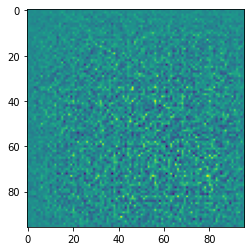

In [21]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)
print("Generated image shape: ", generated_image.shape)

plt.imshow(generated_image[0, :, :, 0])

In [24]:
image_shape = (GENERATE_SQUARE, GENERATE_SQUARE, IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[0.4999951]], shape=(1, 1), dtype=float32)


In [25]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy()

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [26]:
generator_optimizer = tf.keras.optimizers.Adam(1.5e-4, 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1.5e-4, 0.5)

In [28]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(seed, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)


        gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss, disc_loss

In [29]:
# generate_and_save_images(generator, epochs, seed)
def generate_and_save_images(model, epoch, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4,4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [31]:
def train(dataset, epochs):
    fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, 
                                       SEED_SIZE))
    start = time.time()

    for epoch in range(epochs):
        epoch_start = time.time()

        gen_loss_list = []
        disc_loss_list = []

        for image_batch in dataset:
            t = train_step(image_batch)
            gen_loss_list.append(t[0])
            disc_loss_list.append(t[1])

        g_loss = sum(gen_loss_list) / len(gen_loss_list)
        d_loss = sum(disc_loss_list) / len(disc_loss_list)

        epoch_elapsed = time.time()-epoch_start
        print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss}, time={hms_string(epoch_elapsed)}')

        display.clear_output(wait=True)
        print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss}, time={hms_string(epoch_elapsed)}')
        save_images(epoch,fixed_seed)

    display.clear_output(wait=True)
    print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss}, time={hms_string(epoch_elapsed)}')
    save_images(epoch,fixed_seed)

    elapsed = time.time()-start
    print (f'Training time: {hms_string(elapsed)}')

In [32]:
train(train_dataset, EPOCHS)

2021-10-12 21:07:21.448197: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)

KeyboardInterrupt

